
## **Fashion Search AI**

Objective :
## Create a generative search system capable of searching a plethora of product descriptions to find and recommend appropriate choices against a user query.

# The Embedding Layer:

The CSV document needs to be effectively processed, cleaned, and prepared for embedding.





In [1]:
# Install all the required libraries

!pip install pdfplumber tiktoken openai chromaDB sentence-transformers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.5/42.5 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 73.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.1/611.1 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 61.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 61.3 MB/s eta 0:00:00

In [2]:
# Importing necessary libraries
import tiktoken
import openai
import chromadb
from pathlib import Path
import pandas as pd
from operator import itemgetter
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
from matplotlib import table
import os
import matplotlib.image as mpimg


from sentence_transformers import CrossEncoder, util

from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

## Read dataset

In [4]:
# Importing the necessary library for mounting Google Drive
from google.colab import drive

# Mounting Google Drive to the Colab environment
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [5]:

file_path = '/content/drive/MyDrive/Fashion Search AI/Fashion Dataset v2.csv'
fashion_data = pd.read_csv(file_path)
fashion_data.head()


,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


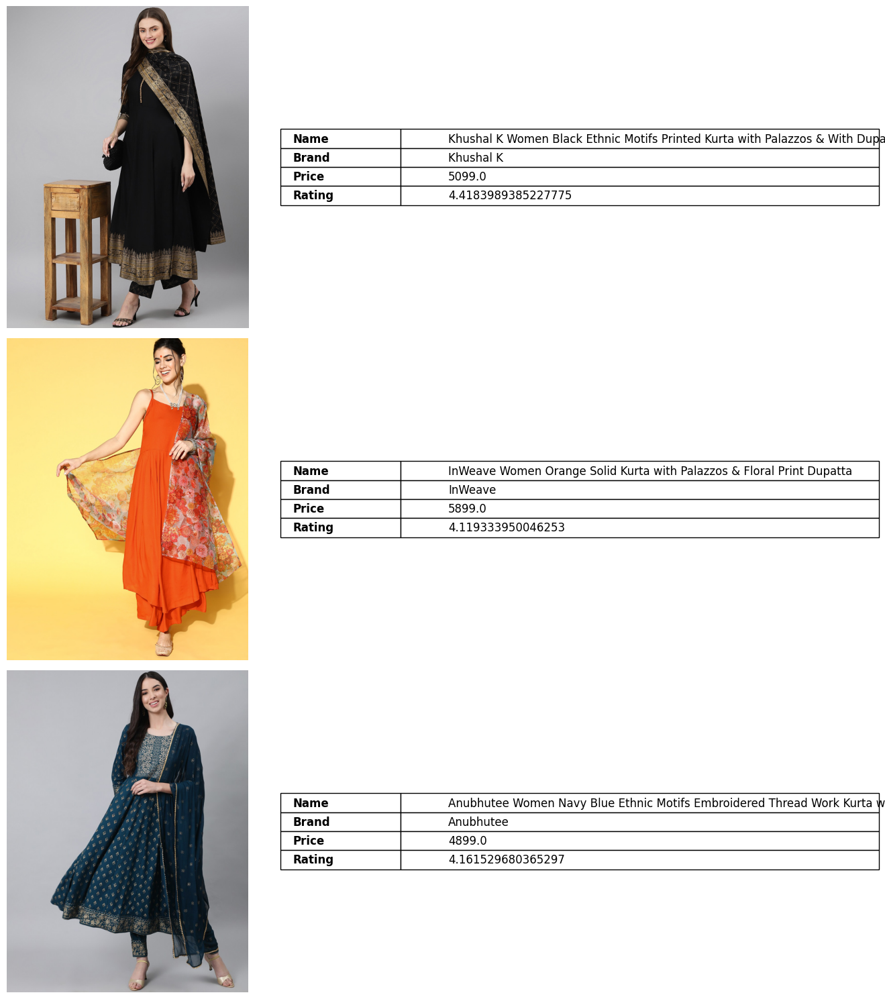

In [8]:
import os
import matplotlib.pyplot as plt
from PIL import Image

images_folder_path = '/content/drive/MyDrive/Fashion Search AI/images'

def get_image_path(images_folder_path, product_id):
    """Constructs the path to the image file."""
    return os.path.join(images_folder_path, f"{product_id}.jpg")

def create_mini_table(ax, row):
    """Creates a mini table displaying product information."""
    table_data = [['Name', row['name']],
                  ['Brand', row['brand']],
                  ['Price', row['price']],
                  ['Rating', row['avg_rating']]]

    ax.axis('off')
    mini_table = ax.table(cellText=table_data, loc='center', cellLoc='left', colWidths=[0.2, 0.8])

    # Format the mini table
    for cell in mini_table.get_celld().values():
        text = cell.get_text().get_text()
        if text in ['Name', 'Brand', 'Price', 'Rating']:
            cell.get_text().set_fontweight('bold')
        cell.get_text().set_fontsize(12)

    mini_table.auto_set_font_size(False)
    mini_table.set_fontsize(12)
    mini_table.scale(1.2, 1.2)

def display_images_with_info(df, images_folder_path, num_images=3):
    """
    Display images with accompanying mini tables containing product information.
    """
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

    if num_images == 1:
        axes = [axes]  # Ensure it's iterable for a single image

    for i, (idx, row) in enumerate(df.head(num_images).iterrows()):
        image_path = get_image_path(images_folder_path, row['p_id'])

        if os.path.exists(image_path):
            img = Image.open(image_path)
            axes[i][0].imshow(img)
            axes[i][0].axis('off')
            create_mini_table(axes[i][1], row)
        else:
            print(f"Image not found for p_id: {row['p_id']}")

    plt.tight_layout()
    plt.show()

# Example usage:
display_images_with_info(fashion_data, images_folder_path, num_images=3)


In [9]:
import os
import pandas as pd
import chromadb



base_path = "/content/drive/MyDrive/Fashion Search AI/"


with open(base_path + "API Key.txt", "r", encoding='utf-8-sig') as f:
    api_key = f.read().strip()


openai.api_key = api_key


chroma_data_path = '/content/drive/MyDrive/Fashion Search AI/ChromaDB_Data'

client = chromadb.PersistentClient(path=chroma_data_path)


model = "text-embedding-ada-002"
embedding_function = OpenAIEmbeddingFunction(api_key=api_key, model_name=model)


file_path = '/content/drive/MyDrive/Fashion Search AI/Fashion Dataset v2.csv'
fashion_data = pd.read_csv(file_path)


fashion_data['metadata'] = fashion_data.apply(
    lambda x: {
        'Product_id': x['p_id'],
        'Name': x['name'],
        'Product_type': x['products'],
        'Price_INR': x['price'],
        'Colour': x['colour'],
        'Brand': x['brand'],
        'RatingCount': x['ratingCount'],
        'Rating': x['avg_rating'],
        'Description': x['description'],
        'Product_attributes': x['p_attributes']
    }, axis=1
)

# Function to extract text for embedding
def extract_text(metadata):
    """
    Extracts text content from the metadata dictionary for embedding.

    Args:
    metadata (dict): Dictionary containing metadata information.

    Returns:
    str: Text content extracted from the metadata.
    """
    text_content = ""
    if "Description" in metadata and metadata["Description"]:
        text_content += metadata["Description"]
    if "name" in metadata:
        text_content += " " + metadata["name"]
    if not text_content:
        text_content = "No description available."
    return text_content.strip()


documents = [extract_text(row['metadata']) for _, row in fashion_data.iterrows()]


fashion_collection = client.get_or_create_collection(name='Fashion_Products', embedding_function=embedding_function)


for idx, (p_id, metadata) in enumerate(zip(fashion_data['p_id'], fashion_data['metadata'])):
    print(f"Processing document with p_id={p_id}")
    print(f"Document text: {documents[idx]}")
    fashion_collection.add(
        documents=[documents[idx]],
        ids=[str(p_id)],
        metadatas=[metadata]
    )

print("Data added to ChromaDB collection!")


Processing document with p_id=17048614
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Length 2.43 meters Width:&nbsp;88 cm<br>The model (height 5'8) is wearing a size S100% Rayon<br>Machine wash


Processing document with p_id=16524740
Document text: Orange solid Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>A-line shape</li><li>Regular style</li><li>Square neck, sleeveless shoulder straps</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Zip closure</li></ul><b>Dupatta Design:</b><ul><li>Floral Printed</li></ul>Kurta Fabric: Viscose rayon<br>Bottom Fabric:&nbsp;Viscose rayon<br>Dupatta Fabric: Organza<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16331376
Document text: Navy blue embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter no sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14709966
Document text: Red printed kurta with trouser and dupatta<br><b>Kurta design:</b><ul><li>Printed kurta</li><li>Anarkali design</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Flared hem</li><li>Calf length</li></ul><b>Trouser design:</b><ul><li>Printed trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>White and red printed dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Hand washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11056154
Document text: Black and green printed straight kurta, has a nitched round neck, three-quarter sleeves, straight hem, side slitsMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18704418
Document text: <ul> <li> Colour: red </li> <li> Solid woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size S<p>Georgette</p>


Processing document with p_id=14046594
Document text: Stately and versatile, this kurta set will be your top choice. Its eye-catching printed kurta comes with snug printed palazzos and a gorgeous printed dupatta for added appeal. <br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul><b>Dupatta Design</b><br>Printed dupatta<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14951330
Document text: When in doubt, rock this simple yet stylish kurta set at any traditional function. It comes with an elegant printed kurta and snug printed palazzos for comfort.&nbsp;<ul><li>Kurta:</li><li>Classy beige tone</li><li>Attractive round neck</li><li>Long regular sleeves</li><li>Calf length</li><li>Poly crepe, machine wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Poly crepe, machine wash</li><li>Tassels border</li><li>Printed pattern</li><li>Net, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric:  Poly Crepe <br> Bottom fabric:  Poly Crepe <br> Dupatta fabric:  Net <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13791594
Document text: Yellow and white printed kurta with palazzos<br> Yellow and white straight knee length kurta, has a round neck, three-quarter sleeves, side slits<br>Yellow and white Printed palazzos, has partially elasticated waistbandThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=17048604
Document text: Green &amp; pink printed kurta with palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular&nbsp; style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink solid dupatta</li></ul>Dupatta: 2.4 x 0.8 meters<br>The model (height 5'8) is wearing a size STop: 100% Cotton<br>Bottom: 100% Cotton<br>Dupatta: Silk Chiffon<br>Machine wash


Processing document with p_id=10356859
Document text: This set includes: Kurta and Trousers<br><br>A smart piece with a floral trend signature, the contemporary styling components ups the exclusivity of this set. The shades of taffy pink beautifully contrasts with the luxe blue floral motifs, while the structured silhouette gives it a casual edge. Design, comfort and a smart overall look, this set is elegance personified!<ul><li><b>Kurta:</b><br>All over floral print, hook and eye keyhole neck, short sleeves, calf length with tapered slits, smart styling with side pocket</li><li><b>Trousers:</b><br>Variegated grainy stripes in crop-cut with elastic&nbsp;back, slip-on styling, 2 pockets</li><li>Pure cotton, Machine-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=12413214
Document text: Mustard yellow floral yoke embroidered straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Dry Clean


Processing document with p_id=16600750
Document text: Teal yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Panelled style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Poly silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<br>Dupatta length 2.25 mtr Width 0.7 mtrKurta: Poly Silk<br>Bottom:&nbsp;Poly Silk<br>Dupatta: Art Silk<br>Hand wash


Processing document with p_id=9867983
Document text: Navy blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter roll-up sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14399798
Document text: Peach-coloured yoke design kurta with palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Two pockets</li></ul><b>Dupatta</b><ul><li>Solid dupatta</li></ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Dupatta fabric: Poly Chiffon<br>Hand washThe model (height 58) is wearing a size S


Processing document with p_id=18372852
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dupatta fabric: Silk Chiffon<br>Dry clean


Processing document with p_id=15241816
Document text: <ul><li>Colour: yellow and peach coloured</li><li>Floral screen printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=10808284
Document text: Make a statement with this green kurta that embodies the beauty of simple style. This straight kurta with pastel floral print all-over accents keyhole neck that makes for an ideal piece for both day and night<br>&nbsp;<ul><li>Colour: Green with white floral accents</li><li>keyhole neck&nbsp;</li><li>3/Q roll-up sleeves</li><li>straight silhouette&nbsp;with a firm drape</li><li>Knee length</li><li>Cotton, Machine-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>The model (height 5'8") is wearing a size S


Processing document with p_id=14376546
Document text: <ul><li>Colour: black and orange</li><li>Bandhani printed</li><li>Mandarin collar</li><li>Button closure</li><li>Sleeveless, no sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=19240164
Document text: <ul> <li> Colour: navy blue </li> <li> Floral embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=15055304
Document text: Blue embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  long regular sleeves </li> <li> 2 pockets </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Net <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14649544
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design: </b><ul><li>Printed dupatta</li><li>Solid border</li></ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Viscose Rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17581924
Document text: Sea green yoke design Top with Skirt with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> Pleated style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash as per Tag</p>


Processing document with p_id=13810898
Document text: Blue and green printed kurta with palazzos and dupatta<br>Blue and green straight calf length kurta, has a mandarin collar, three-quarter sleeves, side slits<br>Green solid palazzos, has partially elasticated waistband, slip-on closure<br>Blue and green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Processing document with p_id=15150620
Document text: Pink embroidered Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Tree-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Side details</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Embroidered dupattaTop fabric: Viscose Silk<br>Bottom fabric: Viscose Silk<br>Dupatta fabric: Organza<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19240246
Document text: Teal solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral solid </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  long regular sleeves </li> <li> Floor length with flared hem </li> <li> Art silk knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Self design Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>DRY CLEAN ONLY</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12766966
Document text: Red, orange and pink bandhani printed anarkali kurta with gotta patti detailing, has a round neck, three-quarter sleeves, and flared hemMaterial: Viscose Rayon<br>  Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14023594
Document text: Maroon printed kurta with palazzos and dupatta<br> Maroon A-line calf length kurta, has a V-neck, three-quarter sleeves, front slit<br>Maroon  printed palazzos, has partially elasticated waistband, slip-on closure<br>Maroon printed dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Processing document with p_id=14346084
Document text: Pink and white Floral Screen Print A-Line Pure Cotton Kurta Set With Dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line design</li><li>Regular&nbsp;style</li><li>Round neck, three-quarter regular sleeve</li><li>Calf length with flared hem</li><li>Machine weave regular</li></ul><br><b>Trousers design: </b><ul><li>Printed</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a Dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Machine washDupatta length: 2.25 metre (approx.)<br>The model (height 58) is wearing a size S


Processing document with p_id=18829920
Document text: Lime green embroidered Top with Sharara with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Layered style </li> <li> Boat neck,  sleeveless no sleeves </li> <li> Na pockets thread work detail </li> <li> Above knee length with straight hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>50 %Polyster And 50 % cottton georgette</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11459658
Document text: This set includes: Kurta, Trousers and Dupatta<br><br>The robust flowy silhouette of this piece stands out on its own, as does the ethnic floral patterning all over. Crafted with precision, the intricate stencilling techniques and gotta lace panelling has given this kurta set a sharp edged finishing. If daily comfort with a design marvel is what you're looking for in your ethnic wear, then you've stumbled upon the right thing here!<ul><li><b>Kurta:</b><br>Mulberry screen printed ethnic floral pattern all-over with gotta lace, boat neck, 3/4th sleeves, mid calf-length with flared hem</li><li><b>Trousers:</b><br>Blushed tone in clean crop-cut, semi-elasticated waistline with slip-on styling</li><li><b>Dupatta:</b><br>Ethnic screen print with striped and solid alternate bordering</li><li>Pure cotton, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=16522612
Document text: Pink embroidered Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Embroidered Skirt </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry clean only


Processing document with p_id=15150642
Document text: Teal blue &amp; Pink yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Art silk knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Top fabric:  Art Silk <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Organza <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16875218
Document text: <ul> <li> Colour: maroon and grey </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular polyester </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=10808290
Document text: Green and Mustard yellow printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=12246214
Document text: Maroon and gold printed kurti with sharara and dupatta<br>Maroon and gold straight knee length kurti, has a round neck, sleeveless, side slits<br>Maroon and gold printed sharara, has partially elasticated waistband, slip-on closure<br>Maroon and gold printed dupatta, has taping borderKurta fabric: poly georgette<br>Bottom fabric: poly georgette<br>Dupatta fabric: poly georgette<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta Length - 2.25 m<br>Dupatta Width - 0.52 m


Processing document with p_id=9438657
Document text: Black and mustard yellow solid kurta with trousers and dupatta<br>Black solid straight calf length kurta, has a boat neck, three-quarter sleeves, side slits<br>Black solid solid trousers, has elasticated waistband, slip-on closure<br>Black and mustard yellow printed dupatta, has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16331336
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7763575
Document text: Red Floral Print&nbsp;A-line kurta, has a round neck, short sleeves, flared hem, has gathers along the waistThe model (height 5'8") is wearing a size S100% viscose<br>Hand-wash


Processing document with p_id=19357994
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with tiered style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Hand wash


Processing document with p_id=18957838
Document text: Fluorescent green embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Pure cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18425500
Document text: <ul><li>Colour: pink</li><li>Ethnic motifs solid</li><li>V-neck</li><li>Three-quarter, flared sleeves</li><li>Anarkali shape with pleated style</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li></ul><p>Dry Clean</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14925332
Document text: <ul> <li> Colour: mustard yellow and red </li> <li> Geometric printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18811288
Document text: Teal embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Drawstring closure </li> </ul>Top &amp; Bottom: Silk blend<br>Dupatta: Poly chiffon<br>Dry clean only<br>Size worn by the model: 36<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=15646472
Document text: <ul> <li> Colour: red </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18503778
Document text: Pink embroidered Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Floral embroidered</li><li>A-line shape</li><li>Layered style</li><li>Keyhole neck, three quarter regular sleeves</li><li>Na pockets gotta patti detail</li><li>Above knee length with curved hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Self design Sharara</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=15561680
Document text: Navy blue &amp; grey printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Navy blue &amp; gold coloured</li><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Grey bottom Embroidered Palazzos</li><li>Partially Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Viscose Rayon 100%<br>Bottom fabric: Viscose Rayon 100%<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16857670
Document text: Lavender printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13437328
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy tiered silhouette and printed pattern, this straight kurta will become your go-to outfit. Top it off with these&nbsp;checked salwar and comfortable flats<br><br><b>FEATURES<br><br>KURTA</b><ul><li>has a mandarin neck</li><li>button closure</li><li>three-quarter puffed sleeves</li><li>curved hem</li><li>side slits</li></ul><b>PALAZZOS</b><ul><li>has partially elasticated waistband</li><li>slip-on closure</li><li>one pocket</li></ul>The model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=19181470
Document text: Green striped Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric striped </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Bottom - Cotton, Dupatta - Mul</p>


Processing document with p_id=12105006
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready kurta set, this kurta set beautifully captures your edgy aesthetic. With an ethnic print, and straight hem, this Sangria kurta is one you'll be eager to show off at college, resorts, or anywhere else your heart desires.<br>Pink &amp;gold coloured floral print Kurta with Trousers<br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with flared&nbsp;hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Part

Processing document with p_id=17487194
Document text: Our 3-piece beige woven design silk suit set features a straight-fit floral embroidery kurta with a V-neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a chiffon dupatta in a solid tone. Adorned with complementing fabric-trim detailing, Gota Patti accents on the yoke and sleeves, and delicate tassel details on the dupatta, this elegant style is ideal for festive occasions.<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>Silk blend&nbsp;<br>Dupatta fabric:&nbsp;Chiffon&nbsp;<br>Machine Wash


Processing document with p_id=11636314
Document text: Blue and Off-white printed anarkali kurta, has a keyhole neck, three-quarter sleeves, attached lining and flared hem93% Cotton and 7% linen<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16706794
Document text: Look stylish when you step out wearing this smart and versatile kurta set. Tailored with an attractive sweetheart neck and sleeveless design, this kurta set is a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Stunning magenta tone</li><li></li><li>Charming sweetheart neck </li><li></li><li>Sleeveless </li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>Vintage and whimsical, the I-spy lace flaunts the idea of love and uses delicate lace details or trims in borders of the yoke or hem. It even refers to ensembles made from lace coupled with other intricate detailing, like frills, scallop edges, halter neck, and so on.Top Fabric:Net<br>Bottom Fabric:Net<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17140538
Document text: Pink embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali&nbsp; shape</li><li>Empire style</li><li>Round neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Pure cotton knitted fabric</li></ul><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Solid border</li></ul>Dupatta: 2.2 x 1.2 meters<br>The model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash


Processing document with p_id=14224616
Document text: <ul> <li> Colour: pink and gold-toned </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Knitted regular cotton </li> </ul>60'S COTTON<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19145056
Document text: Red embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Pleated style </li> <li> Mandarin collar,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Floor length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SKurta - Cotton<br>Pant - Cotton<br>Dupatta - Chiffon


Processing document with p_id=15508918
Document text: Yellow yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Organza <br> Dry clean


Processing document with p_id=17197472
Document text: Purple embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk chiffon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Silk chiffon<br>Bottom fabric: Silk chiffon<br>Dupatta fabric: Silk chiffon<br>Machine wash


Processing document with p_id=13238316
Document text: <ul><li>Purple and white&nbsp;</li><li>striped</li><li>straight shape with short sleeves</li><li>round neck</li><li>knee length</li><li>straight hem</li><li>regular style</li><li>machine weave cotton&nbsp;</li></ul>cotton <br> machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=3077373
Document text: White solid straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, multiple slits<br>Manufacturing Info:&nbsp;Zurick collection<br>Country of Origin: IndiaCotton <br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18859760
Document text: Black solid Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Floral solid</li><li>Pathani shape</li><li>Pleated style</li><li>Shirt collar, three-quarter roll-up sleeves</li><li>1 pockets</li><li>Calf length with curved hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li></ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16919764
Document text: Mustard yellow embroidered Kurti with Sharara<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Angrakha style</li><li>V-neck, short flared sleeves</li><li>1 pockets</li><li>Above knee length with flared hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Elasticated waistband</li><li>Zip closure</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16941854
Document text: Lavender printed Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size STop Fabric:Pure Cotton ,Bottom Fabric:pure cotton ,Dupatta Fabric:Poly Chiffon<br>Machine Wash


Processing document with p_id=15889764
Document text: <ul><li>Colour: green and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave&nbsp;</li></ul>Polycotton<br>Machine-wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=8529019
Document text: This mustard straight kurta is crafted in cotton, features round neck with marigold print all-over<ul><li>Accents&nbsp;thread work on yoke, three-quarter sleeves</li><li>Straight&nbsp;silhouette</li><li>Calf length</li><li>Cotton, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=17132180
Document text: Black checked Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>machine wash


Processing document with p_id=14967448
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Panelled style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Printed</li><li>Taping border</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14224394
Document text: <p>Women Mustard &amp; Gold Printed Straight Kurta With Plazzo  &amp; Dupatta</p>The model (height 5'8") is wearing a size S<p>Hand Wash</p>


Processing document with p_id=7156696
Document text: White and navy blue printed anarkali kurta, has a scoop neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=17193226
Document text: Teal printed Kurti with Sharara<br><br><b>Kurti design: </b><ul><li>Abstract printed</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14949672
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washDupatta Length: 2m<br>The model (height 5'8) is wearing a size S<br>


Processing document with p_id=9370965
Document text: Pink printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits100% cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11434632
Document text: Red embroidered kurta with trousers and dupatta<br> Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red  solid trousers, has partially elasticated waistband, slip-on closure<br>Red solid dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: silk blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: organza<br>Dry-clean


Processing document with p_id=13962368
Document text: Flaunt your graceful feminine silhouette in this elegant kurta ket. For a touch of ethnic panache, this set's gorgeous printed kurta and solid palazzos come with a beautiful solid palazzos. <br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>2 pockets&nbsp;</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasion

Processing document with p_id=13932904
Document text: <ul><li>Colour: blue and white</li><li>Geometric screen printed with striped detail</li><li>Shoulder straps</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li><li>Side slits</li></ul>Cotton kantha<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18198270
Document text: <ul><li>Colour: mustard yellow and pink</li><li>Floral print</li><li>U-neck</li><li>Sleeveless</li><li>Straight shape with side slits</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% cotton<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17104862
Document text: Charcoal grey printed Top with Palazzos<br><br><b>Top design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=19240240
Document text: <ul> <li> Colour: maroon </li> <li> Striped solid </li> <li> Boat neck </li> <li> Long,  flared sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with high-low hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash
Processing document with p_id=15150344
Document text: Lavender &amp; White printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand washThe model (height 5'8) is

Processing document with p_id=18165350
Document text: Pink embroidered Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Dupatta Lenght : 2.3m, Dupatta Width : 85 cm<br><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Cotton Blend<br>Organza&nbsp;<br>Machine Wash<br>


Processing document with p_id=12307502
Document text: Pink self design kurta with trousers<br>Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink Solid trousers, has elasticated waistband<br>Pink solid Dupatta with Tasselled borderDupatta:<br>Length: 2 m<br>Width: 1.14 m<br>The model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: silk chiffon<br>Hand-wash


Processing document with p_id=19261926
Document text: Blue printed Trousers  <li> Elasticated waistband </li> <li> Drawstring closure </li><p>Seperate gentle hand wash with mild detergent in cold water &amp; dry inside out in shadow</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16287098
Document text: <ul> <li> Colour: navy blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18963536
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Hand wash<br>The model (height 5'8) is wearing a size M


Processing document with p_id=15390174
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Dry clean


Processing document with p_id=11197978
Document text: Lime Green and Blue printed A-line kurta, has a round neck, three-quarter sleeves, and flared hem<br>This kurta can also be styled as a dressMaterial: 100% cotton &nbsp;&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10648236
Document text: Green striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=17447636
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Panelled style</li><li>Round neck, three-quarter flared sleeves</li><li>Gotta patti detail</li><li>Floor length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>The model (height 5'8) is wearing a size S100% Rayon<br>Machine Wash


Processing document with p_id=17487138
Document text: Our 3-piece dark green printed suit set, crafted in soft rayon fabric features a straight-fit kurta with a round neckline and three-quarter sleeves, a floral print flowy skirt with a partially elasticated waistband, and a complementing dupatta in a solid tone. Adorned with delicate fabric-trim detailing and Gota Patti accents, this elegant style is ideal for intimate gatherings.Top fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dupatta Fabric: Poly chiffon<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>


Processing document with p_id=16707970
Document text: Embrace sartorial elegance with this modish kurta set. Including a square neck and three-quarter bell sleeves, this kurta set will enhance your look.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous green shade</li><li></li><li>Beautiful square neck </li><li></li><li>Three-quarter bell sleeves</li><li></li><li>Above knee </li></ul><b>Trend Alert</b><br>Ethnic motifs can be small and intricate or bold and large patterns that are designed on fabrics. They are widely worn by people of distinct cultures to make a statement and represent their background. Often designed in vivid colours and shapes, motifs are inspired by nature, different cultures, and religions as well.<p>100% Rayon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14121926
Document text: Purple solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 87% Viscose Rayon, 13%&nbsp;Polyester<br>Bottom fabric: 87% Viscose Rayon, 13%&nbsp;Polyester<br>Dupatta fabric: 91% Polyester, 9% Metallic fibre<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17952212
Document text: Mustard yellow and golden printed Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Tie-up neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Side slits</li><li>Poly chanderi machine weave fabric</li><li>An attached lining</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design</b><ul><li>Solid dupatta</li><li>Tassellled border</li></ul>Kurta fabric: 100% polyester<br>Kurta lining: 100% cotton<br>Bottom fabric: 100% cotton<br>Dupatta fabric: Poly chiffon<br>Dry-clean<br>Size worn by the model: 32<br>Chest: 33.5"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18184744
Document text: <ul> <li> Colour: red and gold-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Hand wash cold wash</p><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=13572242
Document text: Green and blue printed kurta with trousers<br>Green and blue printed straight calf length kurta with embroidered and sequinned detail, has a round neck, three-quarter sleeves, straight hem, side slits<br>Green and blue printed trousers, has partially elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Viscose Rayon<br>Hand-wash


Processing document with p_id=15921898
Document text: Pink embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless shoulder straps </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13647622
Document text: <ul> <li> Colour:  pink &amp; white </li> <li> Three-quarter sleeves regular sleeves </li> <li> V-neck </li> <li> Ankle length </li> <li> Flared hem </li><li> A-line shape with angrakha style </li> <li> Machine weave regular cotton </li> <b> <br> <br> <br> <b></b></b></ul>cotton <br> hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15098616
Document text: <ul><li>Colour: burgundy and golden</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18887472
Document text: <ul> <li> Colour: cream-coloured and blue </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Pure Cotton<br>Hand-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Processing document with p_id=19222130
Document text: Maroon printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Art silk<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19048738
Document text: Copper-toned solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Material : Kurti - Silk&nbsp;<br>Pants - Silk&nbsp;<br>Lining - Cotton&nbsp;<br>Dupatta - Organza<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=9369411
Document text: Black and white striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits, half button placketCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17320642
Document text: Navy blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta</li></ul>Kurta fabric: Pure Cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Cotton blend<br>Hand WashDupatta length: 2.4 meters width: 1.01 meter (approx)<br>The model (height 5'8) is wearing a size S


Processing document with p_id=9861565
Document text: Orange, pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15054430
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> <li> With mask </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a with mask </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Processing document with p_id=19236572
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with high-low hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=16186448
Document text: <p>Inddus Women Wine Self Design Anarkali Kurta with Printed Organza Dupatta and Embellished Belt</p>Top:Chiffon,<br>Inner:Shantun,<br>Dupatta:Organza,<br>Embellished Belt,<br>Dry Clean


Processing document with p_id=14323728
Document text: Black yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck</li><li>Three-quarter regular sleeves</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Comes with a printed dupattaThe model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Processing document with p_id=18778410
Document text: <ul> <li> Colour: multicoloured and nirvana </li> <li> Chevron printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with layered style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Processing document with p_id=18200184
Document text: Peach-coloured printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: 100% Cotton<br>Bottom Fabric: 100% Cotton<br>Dupatta Fabric : Voile<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17487160
Document text: Blue and white printed Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Geometric printed</li><li>Kaftan shape</li><li>Pleated style</li><li>Band collar, three-quarter flared sleeves</li><li>Above knee length with asymmetric hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>2 pockets</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>Cotton&nbsp;<br>Machine Wash


Processing document with p_id=18952254
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SPure georgette<br>Light Hand Wash


Processing document with p_id=16190840
Document text: White printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=15508896
Document text: Green yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Band collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S<br>Dupatta length : 2.3 M,Width : 0.85 cm


Processing document with p_id=14904336
Document text: <ul> <li> Colour: purple and off white </li> <li> Leheriya striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17449666
Document text: <ul> <li> Colour: mauve and white </li> <li> Bandhani printed </li> <li> Tie-up neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>100% Cotton</p><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'11"<br>


Processing document with p_id=16884160
Document text: Blue solid Kurta with Patiala &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Abstract printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>Printed Patiala</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Abstract printed&nbsp;</li><li>Printed border</li></ul>Dupatta Size : 2 Meter , Sleeves Length : 17 Inches<br>The model (height 5'8) is wearing a size SFabric : Top - Cotton<br>Bottom - Cotton&nbsp;<br>Dupatta -Cotton


Processing document with p_id=18686196
Document text: Beige printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Above knee length with curved hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Processing document with p_id=12134668
Document text: Black printed kurta with trousers<br>Black printed straight calf length kurta, has a round neck, three-quarter sleeves, button closure, straight hem, side slits<br>Black Solid trousers, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=16891228
Document text: Pink solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, short regular sleeves</li><li>2 pockets gotta patti detail</li><li>Floor length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Solid dupatta</li><li>Taping border</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18200178
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13091082
Document text: Pink and white printed kurta with palazzos and dupatta<br>Pink and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink and white printed palazzos, has elasticated waistband, slip-on closure<br>Pink solid dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Processing document with p_id=17241826
Document text: <ul><li>Colour: black</li><li>Geometric</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15055286
Document text: Blue solid Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail and mirror-work</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Embroidered Palazzos with mirror-work</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul><b>Dupatta design</b><ul><li>Solid dupatta with sequins</li></ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Net <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15054566
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> <li> With mask </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a with mask </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Processing document with p_id=19324668
Document text: <ul><li>Colour: pink</li><li>Embellished design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Knitted and woven regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SRayon<br>hand wash


Processing document with p_id=14523618
Document text: Blue self design Kurti with Trousers with dupatta with dupatta <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> V-neck,  short flared sleeve </li> <li> Calf length with flared hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Processing document with p_id=15535316
Document text: Teal embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Colourblocked embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=10343559
Document text: Blue and white printed kurta with palazzos<br>Blue and white bandhani printed A-line calf length kurta with gotta patti and panelled detail, has a tie-up neck, three-quarter sleeves, flared hem<br>Blue and white printed palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=14949676
Document text: Mustard yellow yoke design Kurti with Dhoti Pants <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  long regular sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18933466
Document text: Green solid Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Anarkali shape </li> <li> High slit style </li> <li> V-neck,  short regular sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Self design Skirt </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine-wash</p>


Processing document with p_id=16505390
Document text: <ul><li>Colour: blue</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Anarkali shape with empire style</li><li>Sequinned detail</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li></ul><p>Ready to wear</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14208496
Document text: This ravishing kurta set will make for a great addition to your ethnic wear closet. This set's printed kurta and printed dupatta with solid border enhance your allure, while the printed kurta offer a flattering fit. <br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Two pockets</li></ul><b>Dupatta design</b><br>Printed dupattaTop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=11023922
Document text: Purple and gold-toned embroidered kurta with trousers<br>Purple and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem<br>Purple solid trousers has a partially elasticated waistband, slip on closure<br>Purple solid dupatta, has laced borderThe model (height 5'8") is wearing a size SKurta fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dupatta fabric: 100% Polyester<br>Machine-wash


Processing document with p_id=14046632
Document text: Look charming and elegant when you wear this kurta set. Including a gorgeous printed kurta, this set is also accompanied by snug printed sharara and an attractive printed dupatta with taped border. <br> White straight above knee kurta, has a round neck, three-quarter sleeves, side slits<br>White  printed sharara, has partially elasticated waistband, slip-on closure<br>White printed dupatta, has taping borderDupatta Length: 2.5 m<br>Dupatta Width: 1.1 m<br>The model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Processing document with p_id=14925534
Document text: <ul> <li> Colour: green and white </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19265068
Document text: Magenta printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SKurta/Bottom-Pure Cotton<br>Dupatta-Poly Chiffon<br>First dry clean then separate gentle handwash with mild detergent in cold water &amp; dry in shadow


Processing document with p_id=15798294
Document text: Pink embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Silk Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S<br>Dupatta length : 2.3 M,Width : 0.85 cm


Processing document with p_id=17193238
Document text: Green printed Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, sleeveless, shoulder straps</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Processing document with p_id=13523706
Document text: <ul><li>Colour: black</li><li>three-quarter bell sleeves.&nbsp; mandarin collar, calf length straight hem shape with regular style machine weave cotton</li></ul>cotton<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15271046
Document text: Pink and white print Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Processing document with p_id=17487034
Document text: Our 3-piece blue printed cotton suit set features a straight-fit floral print kurta with a round neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a dupatta in a complementing print. Elevated with delicate fabric and lace-trim detailing, this smart style is perfect for work and beyond.<br>Size worn by the model: S<br>Chest: 32''<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br><p>Gentle Machine Wash</p>


Processing document with p_id=18720202
Document text: <ul> <li> Colour: purple </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Processing document with p_id=15335772
Document text: Yellow striped Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Solid striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13771272
Document text: Green printed kurta with trousers and dupatta<br> Green A-line above knee kurta, has a keyhole neck, three-quarter sleeves, side slits<br>Green  printed trousers, has elasticated waistband, slip-on closure<br>Green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Processing document with p_id=12122358
Document text: Black and teal yoke design kurta with palazzos and dupatta<br>Black and teal straight calf length kurta, has a round neck, three-quarter sleeves, side slits, straight hem<br>Black solid palazzos, has partially elasticated waistband, slip-on closure, one pocket<br>Teal blue and golden self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: polyester<br>Bottom fabric: polyester<br>Dupatta fabric: art silk<br>Dry-clean


Processing document with p_id=19041030
Document text: Purple solid Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry clean only</p>


Processing document with p_id=2322792
Document text: Blue and white printed Straight kurta, has a round neck, sleeveless, flared hem, side slitsThe model (height 5'8") is wearing a size S100% cotton<br>Hand-wash


Processing document with p_id=7334039
Document text: White and pink printed A-line kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=17408530
Document text: <ul> <li> Colour: navy blue and red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14854802
Document text: <ul> <li> Colour: navy blue and red </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=16907860
Document text: <ul><li>Colour: peach pink</li><li>Ethnic motifs print</li><li>Round neck</li><li>Three-quarter, flared sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Has lace detail around cuffs and yoke</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Gentle machine wash


Processing document with p_id=18847276
Document text: Blue embroidered Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Boat neck,  short flared sleeves </li> <li> Floor length with flared hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Dry clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14036824
Document text: Grey and white printed kurta with palazzos and dupatta<br>Grey and white printed straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Grey and white printed palazzos, has elasticated waistband, slip-on closure<br>Grey and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=13940072
Document text: <ul><li>Colour: green and</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter sleeves, regular sleeves</li><li>A-line shape with regular style</li><li>Ankle length with flared hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size S100% rayon<br>Machine wash
Processing document with p_id=3084524
Document text: Red and golden printed A-line kurta with slits, has a tie-up neck, three-quarter sleeves with tie-ups, flared hem, no slitsThe model (height 5'8") is wearing a size SViscose Rayon<br> Hand-wash


Processing document with p_id=12873874
Document text: Pink and white printed kurta with trousers<br>Pink and white printed straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Pink and white printed trousers, drawstring closure, one pocket<br>Pink and white printed dupattaKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Voile<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18929144
Document text: Purple solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16926908
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose<br>First wash Machine Wash then handwash


Processing document with p_id=17766280
Document text: Mustard yellow printed Kurta with Sharara and dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Partially elasticated waistband</li><li>Concealed zip closure</li></ul><b>Dupatta Design</b><ul><li>Printed dupatta</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Top Fabric: 100% viscose<br>Bottom&nbsp;Fabric: 100% viscose<br>Dupatta Fabric: 100% cotton<br>Machine-wash


Processing document with p_id=13727098
Document text: <ul><li>Colour: black</li><li>three-quarter sleeves</li><li>roll-up</li><li>round neck</li><li>calf length</li><li>straight hem</li><li>straight shape with regular style</li><li>machine weave</li><li>viscose rayon</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>hand wash


Processing document with p_id=18753060
Document text: <ul> <li> Colour: blue and aquifer </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>100% Viscose</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14023484
Document text: <ul><li>Colour: lime green and</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><br><br><br><br><br><br><br>&nbsp;</ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17923636
Document text: Teal green printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, short regular sleeves</li><li>Knee length with asymmetric hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 26"<br>Hips: 38"<br>Height: 5'9"<br>Kurta Fabric:&nbsp; 100% Polyester<br>Bottom Fabric: 100% Polyester<br>Hand wash


Processing document with p_id=6613532
Document text: Navy Blue yoke design straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19043664
Document text: <ul> <li> Colour: peach-coloured </li> <li> Embellished yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13652412
Document text: Brown embroidered kurta with sharara<br>Brown anarkali above knee kurta, has a round neck, three-quarter sleeves, flared hem<br>Brown printed sharara, drawstring closure<br>Brown solid dupatta with taped borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Dry-cleanThe model (height 5'8") is wearing a size S<br>Length: 2.3 m<br>Width: 1 m


Processing document with p_id=17606426
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop Fabric:Silk Blend ,Bottom Fabric:Silk Blend ,Dupatta Fabric:Net<br>Dry clean


Processing document with p_id=17411096
Document text: <ul><li>Colour: blue and maroon</li><li>Paisley printed</li><li>Round neck with v-slit</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=15427372
Document text: Blue self design Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Checked self design </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> </ul>The model (height 5'8) is wearing a size STop fabric: 52% Polyester &amp; 48% Cotton<br>Bottom fabric:&nbsp;52% Polyester &amp; 48% Cotton<br>Machine wash


Processing document with p_id=16931152
Document text: <ul> <li> Colour: white </li> <li> Geometric woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SFabric Name : Cotton Flax, Fabric Composition : 88% Cotton 12 % Flax,<br>Machine Wash


Processing document with p_id=14925594
Document text: <ul> <li> Colour: purple and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16505402
Document text: <ul> <li> Colour: pink </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Sleeveless,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Ready to wear</p>


Processing document with p_id=15639862
Document text: <ul><li>Colour: yellow &amp; off white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Sleeveless</li><li>A-line&nbsp;shape with regular&nbsp;style</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li></ul><b>Jacket:</b><ul><li>Yellow long open front jacket</li><li>Ethnic motifs printed</li><li>Long sleeves</li><li>Tie-up closure</li></ul>Cotton &amp; Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19129450
Document text: Navy blue solid Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs solid </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> V-neck,  short puffed sleeves </li> <li> Na pockets gotta patti detail </li> <li> Floor length with flared hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11530828
Document text: Beige and pink screen printed straight kurta, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=18859188
Document text: <ul> <li> Colour: beige </li> <li> Embellished solid </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Material: Cotton; Machine Wash</p>


Processing document with p_id=15026486
Document text: Green and golden printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Threadwork detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Top fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dupatta fabric: Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10513948
Document text: Mustard yellow and brown screen printed straight kurta with mirror and embroidered detail, has a round neck, three-quarter sleeves, straight hem, and side slitsViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15090310
Document text: <ul><li>Colour: green and yellow, red</li><li>Floral yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=9252969
Document text: Pink printed straight kurta, has a round neck, sleeveless, straight hem, side slitsThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=14346054
Document text: <ul><li>Colour: navy blue&nbsp;</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10317841
Document text: Mustard yellow and grey yoke design kurta with palazzos and dupatta<br>Mustard yellow yoke design straight calf length kurta with embroidered detail, has a notched round neck, three-quarter sleeves, side slits<br>Mustard yellow solid palazzos, has partially elasticated waistband, slip-on closure, two pockets<br>Grey printed net dupatta, has taping border with tasselled detailThe model (height 5'8") is wearing a size SKurta fabric: muslin<br>Bottom fabric: muslin&nbsp;<br>Dupatta fabric: net<br>Hand-wash


Processing document with p_id=18929148
Document text: Turquoise blue solid Kurti with Dhoti Pants with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric solid </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  short regular sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14848486
Document text: Yellow printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Velvet <br> Hand wash


Processing document with p_id=19324666
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>hand wash


Processing document with p_id=15177320
Document text: <b>About the Brand</b><br>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection</b><br><b>Rozana:&nbsp;</b>Everyday ethnic wear that balances comfort and style.<br><br><b>Product Design Details</b><ul><li>Colour: Pink</li><li>Ethnic motifs printed</li><li>Sleeveless, shoulder straps</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=13415752
Document text: <ul><li>Colour: Red</li><li>Three-quarter sleeves regular</li><li>Mandarin collar</li><li>Calf length</li><li>Flared hem</li><li>A-line shape with style</li><li>Machine weave viscose rayon</li><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size SViscose Rayon ,<br>Hand Wash


Processing document with p_id=11113624
Document text: Beige, green and blue printed kurta with palazzos<br>Beige, green and blue printed straight calf length kurta, has a mandarin collar, short sleeves, button closure, straight hem, multiple slits<br>Beige, green and blue Printed palazzos, has partially elasticated waistband, slip-on closure and two pocketsTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19240202
Document text: <ul> <li> Colour: maroon </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18198284
Document text: <ul><li>Colour: navy blue and white</li><li>Ethnic motifs printed</li><li>Boat neck</li><li>Short, regular sleeves</li><li>Straight shape with regular style</li><li>Side tassels</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><li>Comes with dupatta</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Processing document with p_id=18704432
Document text: <ul> <li> Colour: rust </li> <li> Geometric printed </li> <li> Boat neck </li> <li> Three-quarter,  no sleeves </li> <li> A-line shape with regular style </li> <li> Gotta patti detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Viscose Blend</p>


Processing document with p_id=19066150
Document text: <ul> <li> Colour: white and blue </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size MKurta Material:Rayon<br>Machine wash


Processing document with p_id=18130248
Document text: <ul><li>Colour: white</li><li>Geometric embroidered</li><li>Round neck</li><li>Sleeveless, no sleeves</li><li>Kaftan shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=13932856
Document text: White and pink printed kurta with palazzos<br>White and pink printed straight calf length kurta, has a V-neck, three-quarter sleeves, straight hem, side slits<br>White and pink Printed palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=14531374
Document text: Teal self design Kurta with Trousers with dupatta with dupatta <br> <b> Kurta design:  </b> <ul> <li> Checked self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Art Silk <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Silk Blend <br> Machine wash


Processing document with p_id=16362840
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Jashn: </b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br>Off white solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Regular fit<br>The model (height 5'8) is 

Processing document with p_id=10935118
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Soft to the touch and flowy in silhouette, this set defines comfort fashion in ethnic wear! With geometric criss-cross pattern all over the kurta and spaced ethnic motifs on the palazzos, this piece has an unique symmetry in its design elements. Accentuated with silver gotta lacing and soothing colour tones, this is perfect summer daywear piece.<ul><li><b>Kurta:</b><br>Geometric criss-cross screen print with gotta lace, round neck, 3/4th sleeves, mid-calf length fall. Side slits with tasselled tie-up&nbsp;&nbsp;</li><li><b>Palazzos:</b><br>Ethnic screen print pleated in wide silhouette, elasticated waistline, 1 pocket</li><li>Viscose rayon, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=16907804
Document text: <ul> <li> Colour: blue </li> <li> Paisley yoke design </li> <li> Sweetheart neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Gentle Machine Wash


Processing document with p_id=13895534
Document text: Purple solid kurta with trousers<br>Purple A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem<br>Purple solid trousers, slip-on closure<br>Purple solid dupatta with ruffled borderKurta fabric: silk blend<br>Bottom fabric: silk blend<br>Dupatta fabric: net<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=13596472
Document text: Off-White and green printed kurta with palazzos<br> Off-White and green straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Off-White and green  Printed palazzos, has elasticated waistband, drawstring closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12135222
Document text: Rust and Beige printed straight kurta, has a mandarin collar, sleeveless, straight hem, and multiple slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=14482494
Document text: <ul><li>Colour: brown&nbsp;</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18874642
Document text: <ul> <li> Colour: white </li> <li> Ethnic motifs solid </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>wash as per tag</p>


Processing document with p_id=17445574
Document text: <ul> <li> Colour: blue </li> <li> Floral embroidered </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Ankle length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17455814
Document text: Mustard yellow printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=17263086
Document text: White &amp; Green Floral Printed Pure Cotton Kurta With Patiala &amp; Dupatta<br><br><b>Kurta design: </b><ul><li>White &amp; Green Floral Printed&nbsp;Kurta</li><li>A-line shape</li><li>Regular style</li><li>Round-neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>White &amp; Green Floral Printed Patiala</li><li>Elasticated waistband</li><li>Zip closure</li><li>Comes with a printed dupatta</li></ul>The model (height 5'8) is wearing a size SKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand Wash


Processing document with p_id=18686204
Document text: Blue embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13237590
Document text: Pink solid Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Band collar, long no sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dupatta fabric: Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7344664
Document text: Pink and grey printed anarkali kurta, has a mandarin collar, three-quarter sleeves, flared hem, attached liningChanderi Silk<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19207138
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=17090142
Document text: Pink solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash


Processing document with p_id=14602198
Document text: Blue self design Kurta with Palazzos with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Woven design self design</li><li>A-line shape</li><li>Layered style</li><li>Round neck, three-quarter regular sleeves</li><li>Floor length with flared hem</li><li>Chanderi silk knitted and woven fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Dupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size STop fabric:  Chanderi Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Pure Silk <br> Machine wash


Processing document with p_id=13238184
Document text: <ul><li>Colour: White and pink</li><li>Ethnic motifs print</li><li>Mandarin collar</li><li>Button closure</li><li>Three-quarter regular sleeves</li><li>Straight shape with panelled style</li><li>Knee-length with a straight hem</li><li>2 pockets with&nbsp;Thread work detail</li></ul><b>&nbsp;</b>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16362740
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Jashn: </b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br>&nbsp;<ul><li>Colour: yellow and gold-toned</li><li>Striped</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with angrakha style</li><li>Zari detail</li><li>Calf length with flared hem</li><li>Knitted and woven regular viscose rayon</li></ul>Regular fit<br>The model (height 5'8) is wearing a size S85% Viscose rayon, 15% Nylon<br>Machine wash


Processing document with p_id=9861569
Document text: Pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13905666
Document text: <ul><li>Colour: blue and yellow</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter</li><li>Straight shape with regular style</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7372858
Document text: Maroon and beige printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits100% Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=6630426
Document text: Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose Rayon<br>Machine-wash


Processing document with p_id=17102460
Document text: Cream-coloured and black striped Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid striped</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19040404
Document text: Pink embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Processing document with p_id=12663796
Document text: Pink printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>High slit style</li><li>Round neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pocket</li></ul>The model (height 5'8) is wearing a size 3XLTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=15863332
Document text: <ul> <li> Colour: pink </li> <li> Striped woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Machine wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=13078430
Document text: Black and Golden printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slits80% Viscose Rayon and 20% polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19049798
Document text: Black printed Kurti with Dhoti Pants with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Striped printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Printed Dhoti Pants </li> <li> Slip-on closure </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15212276
Document text: <ul> <li> Colour: rust and beige </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash


Processing document with p_id=15388170
Document text: <ul> <li> Colour: green and white </li> <li> Ethnic motifs printed </li> <li> Scoop neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15883506
Document text: Pink striped Top with Palazzos&nbsp;&amp; Jacket<br><b>Top design: </b><ul><li>Striped</li><li>A-line shape</li><li>Layered style</li><li>Square neck, three-quarter shoulder straps</li><li>Calf length with flared hem</li><li>Viscose rayon machine weave fabric</li><li>Jacket</li></ul><br><b>Palazzos design: </b><ul><li>Striped Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a printed jacket</li></ul>Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18288422
Document text: <ul><li>Colour: off white and peach-coloured</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave regular chanderi silk</li><li>Dupatta included</li></ul>Chanderi silk<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18952266
Document text: <ul> <li> Colour: burgundy </li> <li> Ethnic motifs embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Pure Georgette<br>Light Hand Wash<br>The model (height 5'8) is wearing a size M


Processing document with p_id=16362760
Document text: <b>About the Brand</b>:<br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the collection</b>:<br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br>Navy blue printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elast

Processing document with p_id=13681780
Document text: Green and white self design kurta with trousers<br>Green and white straight calf length kurta, has a boat neck, three-quarter sleeves, straight hem, side slits<br>White Solid trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Art Silk<br>Bottom fabric: Art Silk<br>Hand-wash


Processing document with p_id=12530322
Document text: Off-White and Red printed straight kurta with gotta patti, has a mandarin collar, three-quarter sleeves, button closure, straight hem, and side slitsMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17761364
Document text: Red self design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Textured self design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Art Silk&nbsp;<br>Bottom Fabric: Art Silk<br>Dupatta Fabric: Jute silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=14602270
Document text: Grey self design Kurta with Skirt with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Woven design self design</li><li>Straight shape</li><li>Regular style</li><li>Sweetheart neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with flared hem</li><li>Chanderi silk knitted and woven fabric</li></ul><br><b>Skirt design: </b><ul><li>Printed Skirt</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric:  Chanderi Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Pure Silk <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14884798
Document text: Navy blue embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=19043646
Document text: <ul> <li> Colour: brown </li> <li> Solid embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Hand Wash<br>Viscose rayon<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13290414
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy silhouette and cheerful ethnic pattern, this kurta will become your go-to outfit. Top it off with classic pants to get an elegant look&nbsp;<br><br><b>FEATURES&nbsp;<br>Kurta</b><ul><li>V- Neck</li><li>Three quarter sleeves&nbsp;</li><li>High Low flounce hem</li><li>1 pocket</li><li>Regular style&nbsp;</li></ul><b>Trousers</b><ul><li>Partially elasticated waistband</li></ul>The model (height 5'8") is wearing a size SRayon<br>Machine Wash


Processing document with p_id=18916982
Document text: <ul> <li> Colour: purple </li> <li> Abstract woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>hand wash<br>Wash Separately and Medium to High iron


Processing document with p_id=15268838
Document text: <ul> <li> Colour: maroon and beige </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16498918
Document text: <ul> <li> Colour: turquoise blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Beads and stones detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Material : Cotton, Wash Care : Hand Wash</p>


Processing document with p_id=19181492
Document text: Yellow printed Top with Palazzos with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> High slit style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Bottom - Cotton, Dupatta - Chiffon</p>


Processing document with p_id=14925418
Document text: Maroon printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=14924962
Document text: Maroon striped Kurta with Palazzos and Dupatta<br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size 4XLTop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Cotton Blend <br> Hand wash


Processing document with p_id=15889762
Document text: <ul><li>Colour: yellow</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave&nbsp;</li></ul>Polycotton<br>Machine-wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13238030
Document text: <ul><li>Colour: mustard and</li><li>Solid</li><li>V-neck</li><li>Three-quarter sleeves, puff sleeves</li><li>A-line shape with regular style</li><li>Calf length with high-low hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19324656
Document text: <ul> <li> Colour: pink </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular cotton silk </li> </ul>Muslin Silk<br>Dry Clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15980500
Document text: Mustard yellow embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Abstract embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Cotton Blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18788070
Document text: Cream-coloured striped Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Striped </li> <li> A-line shape </li> <li> Layered style </li> <li> Keyhole neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Viscose Rayon Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17088842
Document text: White embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Viscose nylonmachine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:&nbsp;85% viscose 15% nylon<br>Bottom fabric: 85% viscose 15% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9365713
Document text: Beige and black printed kurta with palazzos<br>Beige and black printed straight calf length kurta, has a mandarin collar with button placket, three-quarter sleeves, straight hem, multiple slits<br>Beige and black printed palazzos, has an elasticated waistband with slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17090254
Document text: Maroon solid Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Above knee length with curved hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Machine wash


Processing document with p_id=12768526
Document text: White yoke design Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Striped yoke design </li> <li> Straight shape </li> <li> Panelled style </li> <li> Keyhole neck,  three-quarter roll-up sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=18127942
Document text: <ul> <li> Colour: white </li> <li> Floral embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=16362862
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Rozana:&nbsp;</b>Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<br>&nbsp;<ul><li>Colour: sea green and pink</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Knitted and woven regular polyester</li></ul>Regular fit<br>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16629336
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Orange and off-white printed Kurti with Salwar<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, short regular sleeves</li><li>2 pockets</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br

Processing document with p_id=15520698
Document text: <ul> <li> Colour: navy blue </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19043914
Document text: Green self design Kurti with Salwar <br> <br> <b> Kurti design:  </b> <ul> <li> Floral self design </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Above knee length with asymmetric hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Solid Salwar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17417200
Document text: <ul><li>Colour: red and white</li><li>Bandhani printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with angrakha style</li><li>Tie-up detail</li><li>Gotta patti detail</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton, Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'7"<br>


Processing document with p_id=16858486
Document text: Red striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid striped </li> <li> Straight shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17089644
Document text: Get ready to be showered with compliments when you don this stylish kurta set. Designed with an appealing V-neck and three-quarter regular sleeves, this kurta set is sure to become your favourite in no time.&nbsp;<ul><li></li><li>Kurta:</li><li> Pink shade</li><li>Lovely V-neck</li><li>Three-quarter regular sleeves</li><li>Calf length </li><li>Cotton blend, dry clean</li><li>Palazzos:</li><li>Striped palazzos</li><li>Elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta:</li><li>Solid border</li><li>Solid pattern</li><li>Organza, Dry clean</li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.<br>Size

Processing document with p_id=10317793
Document text: Pink and green printed kurta with trousers<br>Pink and green printed straight calf length kurta with panelled and schiffli embroidered detail, has a notched round neck, three-quarter sleeves, straight hem, side slits<br>Pink solid trousers, has partially elasticated waistband with slip-on closure, two pocketsThe model (height 5'8") is wearing a size STop fabric: Chanderi Silk<br>Bottom fabric: Chanderi Silk<br>Hand-wash


Processing document with p_id=18966566
Document text: <ul> <li> Colour: beige </li> <li> Embellished </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SChanderi Silk<br>Machine Wash


Processing document with p_id=18551726
Document text: Lime green solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  long regular sleeves </li> <li> Gotta patti detail </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size SCotton Wash Care<br>Dry Clean


Processing document with p_id=15582352
Document text: <ul> <li> Colour: pink </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15258422
Document text: Pick this chic kurta set and stand out anywhere you go. The alluring round neck and three-quarter regular sleeves of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous green shade</li><li></li><li>Attractive round neck</li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Cotton blend, dry clean</li><li></li><li>Calf length</li><li></li><li>Trousers:</li></ul><b>Trend Alert</b><br>This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18325296
Document text: Navy blue yoke design Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Floral yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Dyed dupatta</li></ul>Top Fabric: Cotton Blend<br>Bottom&nbsp;Fabric: Cotton Blend<br>Dupatta Fabric: Organza<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=13770728
Document text: Blue and white printed kurta with palazzos and dupatta<br>Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, side slits<br>Blue and white printed palazzos, has elasticated waistband, slip-on closure, 2 pockets<br>Blue and white printed dupatta, has solid border <br>This product does not come with a mask. The mask on the model is only for styling purpose.The model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Processing document with p_id=14925506
Document text: Purple printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<ul><li>Top fabric: 100% Cotton</li><li>Bottom fabric: 100% Cotton</li><li>Machine wash cold</li><li>Wash with like colours only</li><li>Do not bleach</li><li>Tumble dry low</li><li>Medium iron with steam</li></ul>


Processing document with p_id=11636386
Document text: Green, Blue and pink floral printed anarkali kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, front slit and button closureThe model (height 5'8") is wearing a size S100% Rayon<br>Machine Wash


Processing document with p_id=17049104
Document text: Turquoise blue printed Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Shirt collar,  three-quarter regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand wash


Processing document with p_id=16101270
Document text: Red printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta, has taping border</li></ul>Dupatta Length:: 2.25 meters Width: 1.0 meters<br>The model (height 5'8) is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine Wash


Processing document with p_id=7177279
Document text: <ul><li>Colour: Black and golden</li><li>Ethnic foil print</li><li>Round collar</li><li>Three-quarter sleeves&nbsp;</li><li>Thread work and sequinned detail</li><li>A-line design</li><li>Tie-up detail</li><li>Flared hem</li><li>Ankle length</li><li>Pleated</li></ul>The model (height 5'8") is wearing a size S100% Viscose Rayon<br>Hand-wash


Processing document with p_id=18848596
Document text: <ul> <li> Colour: cream-coloured </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular satin </li> </ul><br> The model (height 5'8) is wearing a size S<p>Satin</p>


Processing document with p_id=11862392
Document text: Brown printed A-line kurta, has a round neck, three-quarter sleeves, and asymmetric hemThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=13932854
Document text: Yellow and off-white solid kurta with sharara<br>Yellow solid straight above knee kurta, has shoulder straps, straight hem, side slits<br>Yellow and off-white Printed sharara, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19040588
Document text: Peach-coloured solid Top with Sharara with dupatta <br> <br> <b> Top design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Poly Chanderi<br>Bottom Fabric: Pure Cotton<br>Gentle Wash Or Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=2467322
Document text: Navy Blue and mustard printed anarkali kurta, has a round neck, three-quarter sleeves, flared hem, front slitCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16877614
Document text: <ul> <li> Colour: multicoloured and bracken </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Chikankari detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=18985344
Document text: White printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with dupatta</li></ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12711000
Document text: Pink embroidered kurta with palazzos and dupatta<br> Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink  solid palazzos, has elasticated waistband, slip-on closure<br>Pink solid dupatta, has taping borderKurta fabric: chanderi cotton<br>Bottom fabric: cotton blend<br>Dupatta fabric: net<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16190866
Document text: <ul> <li> Colour: blue and white </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=11074238
Document text: Pink and White printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17923630
Document text: Orange printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with curved hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric: 100% viscose<br>Bottom fabric: 100% viscose<br>Hand-wash<br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=16629682
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the ethnic print, this sea green, coral orange and white kurta set has an edgy aesthetic look. With round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with flared hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Churidar</li><li>Partially e

Processing document with p_id=12705418
Document text: Navy Blue and Red printed straight kurta, has a keyhole neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=17104804
Document text: Mustard yellow printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> Calf length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19050086
Document text: Maroon printed Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Slip-on closure </li> </ul>100% Rayon<br><br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16312324
Document text: <b>About Ode By House Of Pataudi:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><br>Orange printed Kurti with Dhoti Pants<br><br><b>Kurti design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Dhoti Pants design: </b><ul><li>Solid Dhoti Pants</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>To

Processing document with p_id=14080326
Document text: <ul><li>Colour: black and golden</li><li>Geometric yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16493984
Document text: <ul> <li> Colour: white </li> <li> Solid </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash
Processing document with p_id=18261878
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Dupatta fabric: Poly geor

Processing document with p_id=17455868
Document text: Navy blue and yellow printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=16931578
Document text: <ul> <li> Colour: yellow and green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Processing document with p_id=12831164
Document text: Yellow and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=14325492
Document text: Grey embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Embroidered</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>2 pockets thread work detail</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11935530
Document text: Black, pink and yellow chikankari hand embroidered straight kurta, has a notched round neck, three-quarter sleeves, straight hem, and side slits<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Material: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19040558
Document text: Green self design Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs self design </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Floor length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>
Processing document with p_id=15258052
Document text: Burgundy embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Anarkali shape</li><li>Empire style</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Sequinned detail</li><li>Above knee length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Sharara

Processing document with p_id=17102450
Document text: Dark Green printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Chevron printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 35"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8''<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=19240252
Document text: Teal solid Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral solid </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Floor length with flared hem </li> <li> Art silk knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SART SILK<br>DRY CLEAN ONLY


Processing document with p_id=8033765
Document text: Off-White and golden printed anarkali kurta, has a mandarin collar with half button placket, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=16629332
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Green and white printed Kurti with Salwar<br><br><b>Kurti design: </b><ul><li>Floral&nbsp;printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, short&nbsp;regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with flared hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33

Processing document with p_id=14122516
Document text: <ul><li>Colour: teal blue</li><li>Geometric yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>60% viscose rayon, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931552
Document text: Green embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>Top fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Hand wash


Processing document with p_id=18244250
Document text: <ul> <li> Colour: white </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> A-line shape with pleated style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SFabric Composition : 100% Viscose | Wash Care : Machine Wash |


Processing document with p_id=18966572
Document text: <ul> <li> Colour: purple </li> <li> Geometric embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SChanderi Silk<br>Machine Wash


Processing document with p_id=18331160
Document text: <ul> <li> Colour: multicoloured </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul>Regular Fit<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>100% Cotton<br>Machine wash


Processing document with p_id=17317792
Document text: <ul> <li> Colour: black and brown </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19198414
Document text: <ul> <li> Colour: navy blue </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18565060
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash


Processing document with p_id=13237514
Document text: Red and blue yoke design kurta with dhoti pants<br>Red and blue pleated yoke kurta A-line above kneewith mirror work, has a round neck, three quarter sleeves, flared hem<br>Red solid dhoti pants, has elasticated waistband with slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19040436
Document text: Pink solid Kurta with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Floral solid</li><li>Anarkali shape</li><li>Layered style</li><li>Round neck, long regular sleeves</li><li>Na pockets</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SPure cotton<br>Gentle Wash Or Dry Clean Only


Processing document with p_id=16505498
Document text: Beige and red printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop:Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Processing document with p_id=15326614
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: maroon</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S85%Cotton and 15%Flex<br>Machine wash


Processing document with p_id=14989762
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This beautiful and trendy coloured kurta set will become your go-to outfit for any festivity or occasion. Top it off with a pair of classic comfortable flats for a complete look<br><br><b>Kurta design: </b><ul><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>2 pockets&nbsp;</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Hand 

Processing document with p_id=15098594
Document text: <ul><li>Colour: teal green and golden</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13527954
Document text: Grey and Yellow striped straight kurta, has a band collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=15437606
Document text: <ul> <li> Colour: beige </li> <li> Striped checked </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=19145018
Document text: Maroon embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked embroidered </li> <li> Anarkali shape </li> <li> Empire style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17487126
Document text: Our 3-piece pink floral print cotton suit set features a sleeveless straight-fit floral print kurta with a strappy round neckline, flared sharara pants with a partially elasticated waistband and a complementing dupatta in a floral print. This refreshing style is ideal for casual outings.Cotton&nbsp;<br>Machine WashSize worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"


Processing document with p_id=18331088
Document text: <ul><li>Colour: rust brown and gold-toned</li><li>Floral printed</li><li>Boat neck</li><li>Sleeveless, no sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Processing document with p_id=18444142
Document text: Enhance your ethnic wear with this fashionable kurta. Boasting beautiful three-quarter regular sleeves and a smart curved hemline, this piece will uplift your attire.&nbsp;<ul><li>Classic white tone</li><li>Three-quarter regular sleeves</li><li>Curved hemline</li><li>Calf length</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Fabric : Cotton<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13027828
Document text: Blue and pink printed kurta with palazzos<br>Blue and pink printed straight calf length kurta with gotta patti detail, has a mandarin collar, three-quarter sleeves, straight hem, side slits<br>Blue and pink printed palazzos, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=19240230
Document text: <ul> <li> Colour: violet </li> <li> Solid </li> <li> Boat neck </li> <li> Long,  puff sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SHand Wash<br>Viscose rayon


Processing document with p_id=17761366
Document text: Red self design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid self design </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  sleeveless shoulder straps </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Art Silk<br>Bottom Fabric: Art Silk<br>Dupatta Fabric: Art Silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=14194636
Document text: <ul><li>Colour: grey and red</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br>&nbsp;</ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=18782340
Document text: <ul> <li> Colour: brown </li> <li> Striped solid </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Zari detail </li> <li> Ankle length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>COTTON</p>


Processing document with p_id=17455812
Document text: Blue and yellow printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=16379558
Document text: <ul><li>Colour: burgundy</li><li>Ethnic motifs yoke design</li><li>V-neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>A-line shape with empire style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Premium Lurex Rayon<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18244498
Document text: <ul> <li> Colour: pink </li> <li> Geometric striped </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15121436
Document text: <ul> <li> Colour: lime green and off white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  flared sleeves </li> <li> Kaftan shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester , Polyester <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16872388
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Be stylish and comfortable in this kurta set from Sangria featuring straight kurta with vertical stripes, keyhole neckline. Put on a pair of flats for a cool verve.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>1 pockets thread work detail</li><li>Knee length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Self design Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 57% polyester, 43% cotton

Processing document with p_id=19171640
Document text: Off white printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SMaterial: Pure Cotton<br>Machine Wash


Processing document with p_id=17090738
Document text: <ul> <li> Colour: pink </li> <li> Woven design woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand wash<br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>


Processing document with p_id=17291316
Document text: Grey yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Art silk<br>Bottom fabric: Art silk<br>Hand-wash<br>Size worn by the model: S<br>Chest: 31.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=8255313
Document text: Black and orange printed kurta with palazzos<br>Black and orange straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Black and orange printed palazzos, drawstring closure<br>&nbsp;The model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Machine-wash
Processing document with p_id=16334264
Document text: <ul> <li> Colour: yellow </li> <li> Abstract printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19240492
Document text: <ul> <li> Colour: blue </li> <li> Solid yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Processing document with p_id=17291326
Document text: Charcoal grey with a tinge of green and golden printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Poly crepe machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 26''<br>Hips: 37''<br>Height: 5'7''<br>Poly crepe<br>Hand wash


Processing document with p_id=17104772
Document text: Sea green printed Top with Trousers<br><br><b>Top design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid cropped palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13831796
Document text: <ul><li>Colour: pink and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Regular sleeves</li><li>Straight shape with regular regular</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li><br><br><br><br><br><br><br>&nbsp;</ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17251482
Document text: <ul><li>Colour: white and blue</li><li>dyed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with curved hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton<br>Hand-wash


Processing document with p_id=16585600
Document text: Red printed Kurta with Salwar <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  long regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Slip-on closure </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18765612
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17514330
Document text: <ul><li>Colour:&nbsp;blue and white</li><li>Abstract printed</li><li>Mandarin collar</li><li>Short, roll-up sleeves</li><li>Anarkali shape with empire style</li><li>Knee length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17417186
Document text: A beautiful combination of comfort and style, this kurta set will make for a worthy addition to your closet. Tailored with an attractive V-neck and short flared sleeves, this kurta set is a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li>Mustard tone</li><li>Beautiful V-neck</li>Short flared sleeves<li>Above knee length</li><li>Pure cotton, machine wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>WFH co-ords are comfy apparel in attractive hues and charming prints, like floral, porcelain blooms, quirky prints, polka dots, garden artist, ombre, and so on. WFH co-ords focus on interesting details, including structural necklines, hems, sleeves, which offer comfort while lending stye. They can be clubbed with other outerwear for a distinct look.Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the

Processing document with p_id=18144182
Document text: Off white embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Viscose rayon<br>Dupatta: Silk chiffon<br>Machine WashThe model (height 5'8) is wearing a size S<br>Dupatta Length 2.10 Mtr.


Processing document with p_id=14769234
Document text: About Brand:<br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br>About Collection:<br><br>Rozana: Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<ul><li>Colour: peach-coloured and gold-toned</li><li>Floral embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>100%Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14663998
Document text: Black printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=15326588
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: blue</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>85%Cotton and 15%Flex<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17140156
Document text: Green solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16955850
Document text: <ul> <li> Colour: blue and pink </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15980558
Document text: Pink printed Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<br>Cotton Blend<br>Dry Clean


Processing document with p_id=18704534
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Straight shape with layered style </li> <li> Beads and stones detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Blend</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17317790
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=16874564
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the subtle floral print, this yellow and white kurta set beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta&nbsp;</b><ul><li>Floral printed</li><li>Straight design</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Trousers</b><ul><li>Solid</li><li

Processing document with p_id=17765672
Document text: <ul><li>Colour: yellow and white</li><li>Solid</li><li>Floral embroidery on the sleeves</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'9"<br>


Processing document with p_id=18963528
Document text: <ul> <li> Colour: green and silver-toned </li> <li> Woven design woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular silk </li> </ul><br>The model (height 5'8) is wearing a size LSilk<br>Hand Wash


Processing document with p_id=16305390
Document text: <ul> <li> Colour: assorted </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18533904
Document text: <ul> <li> Colour: black and white </li> <li> Bandhani printed </li> <li> Halter neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=18103376
Document text: Magenta printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  long regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9702305
Document text: Blue and white printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=17100808
Document text: <ul> <li> Colour: pink and yellow </li> <li> Checked </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18917062
Document text: <ul><li>Colour: navy blue</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11642362
Document text: Green embroidered kurta with trousers<br> Green anarkali calf length kurta, has a round neck, three-quarter sleeves, flared hem<br> Green solid trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: 60% Polyester, 40% Cotton<br>Bottom fabric: 60% Polyester, 40% Cottonr<br>Machine-wash


Processing document with p_id=14989470
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the subtle print Gotta Patti kurta with trousers, beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires.<br><br><b>Kurta design: </b><ul><li>Ethnic Printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Gotta patti detail, tie-up at the back</li><li>Calf length with straight hem</li><li>1 pocket</li><li>Polyester machine weave fabric</li></ul><b>Trousers design: </b>

Processing document with p_id=19145038
Document text: Solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric solid</li><li>A-line shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Na pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Pant - Cotton, Dupatta - Chanderi</p>


Processing document with p_id=18137354
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with high-low hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton <br> Machine wash


Processing document with p_id=13905672
Document text: <ul> <li> Colour:  blue and off white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=19045526
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric : Silk Blend , Bottom : Silk Blend , Dupatta :Silk Blend<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=18844550
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Fabric:Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14884574
Document text: Purple printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14976268
Document text: <ul> <li> Colour: red </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Dry clean


Processing document with p_id=16874062
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some pastel romance with this kurta set Sangria which is blue in colour. This round neck kurta is a fusion-inspired delight, thanks to its palazzos. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  P

Processing document with p_id=16614230
Document text: Grey yoke design Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Mirror work on yoke</li><li>A-line shape</li><li>Layered style</li><li>Round neck</li><li>Sleeveless</li><li>Above knee length with flared hem</li><li>Poly georgette machine weave fabric</li><li>An attached lining</li></ul><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>An attached lining</li></ul><b>Dupatta design:</b><ul><li>Embroidered detail dupatta</li></ul>Kurta fabric: Poly Georgette<br>Bottom fabric: Poly Georgette<br>Dupatta fabric: Poly Georgette<br>Dry-CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15889778
Document text: <ul> <li> Colour: blue and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% viscose<br>Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18998686
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine Wash<br><br> The model (height 5'8) is wearing a size S


Processing document with p_id=13995752
Document text: Red printed Kurta with Palazzos<br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15931696
Document text: Black solid Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Checked solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top: Viscose rayon<br>Bottom: Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9744447
Document text: Blue printed Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Poly Chiffon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13921184
Document text: Ideal for warm weather dressing, this kurta ensures panache and comfort both. Crafted with an alluring ethnic motif, a classy round neck, and three-quarter sleeves, the piece lends a splendid look.&nbsp;<ul><li>Lovely green and pink hue</li><li>Lovely ethnic motifs kurta</li><li>Simple round neck</li><li>Three-quarter flared sleeves</li><li>Modal, dry clean</li></ul><b>Trend Alert</b><br>Soft, light, and soothing, pastels always make a comeback in the spring and summer seasons. Encompassing a palette of hues including delicate pinks, pale lilac, cool blues, and mint tints, pastels exude a fresh, youthful vibe.Modal <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15749840
Document text: <ul><li>Colour: maroon &amp; beige&nbsp;</li><li>Ethnic motif woven design</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Button closure</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S60% Viscose , 40% Cotton<br>Machine wash


Processing document with p_id=18331408
Document text: <ul><li>Colour: maroon and off white</li><li>Printed</li><li>Round neck</li><li>Sleeveless</li><li>A-line shape with pleated style</li><li>Above knee with asymmetric hem</li><li>Machine weave regular cotton</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18952272
Document text: <ul> <li> Colour: magenta </li> <li> Floral embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SPure Georgette<br>Hand Wash


Processing document with p_id=16927170
Document text: <ul> <li> Colour: black and silver-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>100% cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17096098
Document text: Pink solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Checked Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14708328
Document text: <ul><li>Colour: pink and gold-toned</li><li>Floral yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15616828
Document text: <ul><li>Colour: white</li><li>Solid</li><li>Mandarin collar</li><li>Long, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Knitted regular cotton</li><li>Comes with a dupatta</li></ul>Cotton <br> Machine washDupatta Length: 2 meter (approx)<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17171720
Document text: Magenta embroidered Kurta with palazzo with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>A-line shape</li><li>Layered style</li><li>Round neck, sleeveless flared sleeves</li><li>Gotta patti detail</li><li>Above knee length with curved hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzo design: </b><ul><li>Embellished&nbsp;Salwar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Embellished dupatta</li><li>Embellished border</li></ul>Pure Cotton<br>Machine wash as per tagDupatta Length :- 2 meters<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15582372
Document text: <ul><li>Colour: blue and white</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=12539406
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Purple and silver yoke design a-line kurta set. This kurta set has all your favourite details! By simply styling it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.Off white, grey, and yellow floral print straight kurta, has a boat neck with tie-up details, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=15344676
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Empire style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry clean


Processing document with p_id=18966582
Document text: <ul><li>Colour: maroon</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with regular style</li><li>Sequins detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13543508
Document text: <ul><li>Colour: lime green</li><li>Geometric woven design</li><li>Round neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape&nbsp;</li><li>Regular style</li><li>Sequinned detail</li><li>Knee length&nbsp;</li><li>Straight hem</li><li>Side slits</li><li>Machine weave regular polyester</li></ul>100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16844758
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings<br><br><b>PRODUCT DESCRIPTION</b><br>This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look<br><br><b>Features</b><ul><li>Colour: red and black</li><li>Chevron printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>2 pockets</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15440290
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine wash


Processing document with p_id=17197464
Document text: Teal green and golden embroidered kurti with sharara &amp; dupatta<br><br><b>Kurti design: </b><ul><li>Geometric embroidered</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>sequinned detail</li><li>Above knee length with straight hem</li><li>Silk georgette machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with teal green solid dupatta</li></ul>Dupatta:<br>The model (height 5'8) is wearing a size SGeorgette blend<br>Machine wash


Processing document with p_id=19040524
Document text: Green printed Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15119222
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19294004
Document text: Green embroidered Kurta with Pyjamas with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Pyjamas design:  </b> <ul> <li> Printed Pyjamas </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Processing document with p_id=15561682
Document text: Pink &amp; grey yoke design Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Pink Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Grey &amp; pink Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with grey &amp; pink printed dupatta, has printed border</li></ul>Dupatta:<br>The model (height 5'8) is wearing a size S<br>Dupatta length: 2.1 metres<br>Dupatta width: 1 metreTop fabric:  Silk Blend <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=16310880
Document text: Black yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Dry Clean</p>Dupatta Length: 2 m (approx)<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17171716
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Woven design printed</li><li>A-line shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Zip closure</li><li>comes with the dupatta</li></ul>Dupatta Length :- 2 mtr<br>The model (height 5'8) is wearing a size SPure cotton<br>Machine wash as per tag


Processing document with p_id=19016206
Document text: <ul> <li> Colour: black and white </li> <li> Striped </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Calf length with straight hem </li> <li> Machine weave dobby cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Cold Wash.


Processing document with p_id=10777548
Document text: Navy Blue and Off-white checked straight kurta, has a round neck, sleeveless, straight hem, and side slits100% Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15440310
Document text: Blue and white printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>2 pockets</li></ul>100% viscose<br>Bottom fabric:&nbsp;100% viscose<br>Dupatta fabric: cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17445358
Document text: Purple printed Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><br>Geometric printed<br>Straight shape<br>Regular style<br>Shoulder straps, sleeveless no sleeves<br>Above knee length with curved hem<br>Viscose rayon machine weave fabric<p><br><b>Sharara design: </b></p>Solid Sharara<br>Elasticated waistband<br>Zip closureThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash
Processing document with p_id=14925544
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19231370
Document text: Purple embroidered Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Above knee length with flared hem </li> <li> Poly georgette knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18964098
Document text: <ul> <li> Colour: turquoise blue </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=15054568
Document text: Black woven design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design woven design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric:  Silk Blend <br> Bottom fabric:  Satin <br> Dupatta fabric:  Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=7572969
Document text: Red and orange self design kurta with palazzos<br>Red and orange a-line ankle length kurta, has a mandarin collar, long sleeves, flared hem, front slit<br>Red and orange solid palazzos, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dry-clean


Processing document with p_id=14497102
Document text: White embroidered Kurta with Salwar with dupatta with dupatta <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Layered style </li> <li> V-neck,  sleeveless flared sleeve </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> <li> Comes with a  </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Dry cleanDupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size S


Processing document with p_id=15095732
Document text: <ul> <li> Colour: orange and off white </li> <li> Bandhani printed </li> <li> Tie-up neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11202318
Document text: Blue and gold-toned printed kurta with palazzos<br> Blue and gold-toned straight calf length kurta, has a round neck, sleeveless, straight hem, side slits<br>Blue and gold-toned  Printed palazzos, has partially elasticated waistband, slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19240558
Document text: <ul> <li> Colour: rust </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCOTTON<br>Machine Wash


Processing document with p_id=11369528
Document text: Blue and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Viscose rayon (Liva)<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13747928
Document text: Pink printed kurta with palazzos and dupatta<br> Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Pink  printed palazzos, has partially elasticated waistband, drawstring closure<br>Pink printed dupatta, has printed borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15987966
Document text: Grey and gold-toned embroidered Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with printed border, taping border</li></ul>Top: Pure Cotton<br>Bottom: Pure Cotton<br>Dupatta: Pure Cotton<br>Hand washDupatta Length: 2.25 metres<br>Dupatta width: 1 metres<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16857572
Document text: Our 3-piece black printed cotton suit set features a floral print straight-fit kurta with a notched neckline and Gota Patti accents on the yoke and sleeves, flared palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta. A perfect pick for celebratory evenings.Pure Cotton<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13250072
Document text: Navy Blue yoke design kurta with trousers and dupatta<br>Navy Blue A-line floor length kurta, has a boat neck, three-quarter sleeves, front slit<br>Navy Blue solid trousers, has partially elasticated waistband, zip closure<br>Blue printed dupatta, has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: art silk<br>Hand-washDupatta Length : 2.5 mtr Dupatta Width : 0.7 mtr<br>The model (height 5'8") is wearing a size S


Processing document with p_id=15639890
Document text: Green and white printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter flared sleeves</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Machine washDupatta Length: 1.87 metres<br>Dupatta width: 91 cm<br>The model (height 5'8) is wearing a size S


Processing document with p_id=7760039
Document text: White and blue printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=15227066
Document text: Grey and white khari print Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Panelled style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Comes with a white and red floral print dupatta with tasselled borderThe model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry clean


Processing document with p_id=17624890
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton, Regular Hand Wash or Machine Wash</p>


Processing document with p_id=19240524
Document text: <ul> <li> Colour: olive green </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>VISCOSE RAYON<br>ACHINE WASH<br> The model (height 5'8) is wearing a size S


Processing document with p_id=12415142
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy silhouette and a simplistic traditional pattern, this kurta set will become your go-to outfit. Matched with the solid pair of perfect fit trousers this kurta set will set you apart!<br><br><b>FEATURES<br>Kurta</b><ul><li>Mandarin collar</li><li>Straight kurta</li><li>Side slits</li><li>Three-quarter regular sleeves</li><li>side pocket</li><li>Straight hem</li></ul><b>Trousers</b><ul><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta</b><ul><li>Solid crinkled dupatta</li><li>Gotta patti border</li></ul>Kurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupat

Processing document with p_id=17716122
Document text: Add a touch of style to your ethnic wear closet with this smart and fashionable kurta set. The alluring square neck and sleeveless design of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li> Burgundy shade</li><li>Square neck </li>Sleeveless<li>Above knee length</li><li>Poly-crepe, hand wash</li><li>Sharara:</li><li>Solid sharara</li><li>Partially elasticated waist</li><li>Poly-crepe, hand wash</li><li>Dupatta:</li><li>Tassels border</li><li>Printed pattern</li><li>Net, hand wash</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.<p>Hand Wash</p><br>Size worn by the model: S<br>Chest: 30.5''<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8''<br

Processing document with p_id=15031506
Document text: <ul><li>Colour: white and yellow, pink</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13905652
Document text: <ul> <li> Colour:  pink and off white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16316954
Document text: <ul><li>Colour: blue and gold</li><li>Ethnic motifs yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular chanderi silk</li></ul>Chanderi silk&nbsp;<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13769396
Document text: <ul><li>Colour: grey and golden</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Short flared sleeves</li><li>Kaftan shape&nbsp;</li><li>Regular style</li><li>Calf length&nbsp;</li><li>Flared hem</li><li>Machine weave</li><br><br><br><br><br><br>&nbsp;</ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19325284
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Fabric :- Pure Cotton<br>Wash Care :- Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18165316
Document text: Peach-coloured embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Lenght : 2.3m, Dupatta Width : 85 cm<br><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Cotton Blend<br>Organza&nbsp;<br>Hand Wash


Processing document with p_id=17318800
Document text: <ul><li>Colour: orange</li><li>Bandhani&nbsp;motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=14854744
Document text: <ul> <li> Colour: yellow </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18852140
Document text: Maroon printed Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter flared sleeves </li> <li> 1 pockets </li> <li> Calf length with asymmetric hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Wash Separately and Medium to High iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18987256
Document text: <ul> <li> Colour: olive green </li> <li> Solid </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Material:Cotton<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13258020
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Pink solid kurta, round neck, soft fabric and convenient pockets --this kurta has all your favorite details! By teaming wedge heels and golden silver with this lovely set, you've created a charming look in nearly no time at all. Bravo!<br><br><b>Kurta</b><ul><li>Colour: pink</li><li>Solid</li><li>Round neck</li><li>regular sleeves</li><li>straight shape with&nbsp;regular</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li><li>Comes with ethnic jacket</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16848726
Document text: <ul> <li> Colour: pink </li> <li> Woven design printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul><br> The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=10335143
Document text: White self design kurta with palazzos<br> White A-line calf length kurta, has a V-neck, three-quarter sleeves, curved hem<br> White self design palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric:100% Cotton<br>Bottom fabric:100% Cotton<br>Hand-wash


Processing document with p_id=15904812
Document text: Maroon embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=18915120
Document text: <ul><li>Colour: brown</li><li>Solid</li><li>Round Neck&nbsp;</li><li>Short, roll Up Sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=13238592
Document text: <ul><li>Colour: Coral orange and white</li><li>Floral print</li><li>Stylised square neck</li><li>Three-quarter regular sleeves</li><li>A-line shape with panelled and tiered&nbsp;design styling</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li><li>Gathers, lace and tie-up detail</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Hand wash


Processing document with p_id=15126504
Document text: <ul> <li> Colour: grey </li> <li> Solid </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular dupion silk </li> </ul><br> The model (height 5'8) is wearing a size SDupion silk <br> Dry clean


Processing document with p_id=2528692
Document text: Black solid straight kurta with crochet detail, has a round neck, short sleeves, button closure, straight hem, side slitsCotton <br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16848712
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your ethnic wear up a notch with this gorgeous earthy kurta set featuring a V-neckline and gorgeous gotta patti work, with matching flowy palazzos and dupatta, you'll love adding this vintage-inspired set to your spring and summer collection.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>1 pocket</li><li>gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elast

Processing document with p_id=15980054
Document text: Red embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Above knee length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk Blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13913182
Document text: <ul><li>Colour: off white and brown</li><li>Striped</li><li>Mandarin collar</li><li>Three-quarter sleeves, regular</li><li>A-line shape with pleated style</li><li>Above knee with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton and flex blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18966584
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular chanderi silk </li> </ul>Chanderi Silk<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13392426
Document text: Lime Green printed kurta with churidar and dupatta<br>Lime Green straight calf length kurta, has a round neck, three-quarter sleeves, multiple slits<br>Blue solid churidar, has partially elasticated waistband, drawstring closure<br>Blue self design dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: viscose rayon<br>Hand-wash


Processing document with p_id=14913800
Document text: Peach-coloured and grey hand block printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>2 pockets</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>White and grey printed dupatta</li><li>Printed border</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand wash


Processing document with p_id=16331364
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=18951682
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Top Fabric :Pure Cotton , Bottom: Viscose Rayon , Dupatta: Silk Chiffon, Dry Clean</p>


Processing document with p_id=13956290
Document text: Peach-Coloured yoke design kurta with palazzos<br>Peach-Coloured anarkali calf length kurta, has a keyhole neck, three-quarter sleeves, flared hem, side slits<br>Peach-Coloured solid palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Machine-wash


Processing document with p_id=13905624
Document text: Green printed Kurta with Trousers<br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Boat neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Processing document with p_id=8529053
Document text: Maroon and golden printed Anarkali kurta with embroidered and sequinned detail, has a round neck, short sleeves, flared hemViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13259360
Document text: Blue embroidered kurta with trousers<br> Blue straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Blue Embroidered trousers, has elasticated waistbandDupatta: 2 x 1 meters (length xwidth)<br>The model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: silk chiffon<br>Hand-wash


Processing document with p_id=15794640
Document text: An absolute go-to for special occasions, this kurta set will make for a great addition to your closet. It comes with an eye-catching round neck and comfortable three-quarter regular sleeves.<ul><li></li><li>Kurta:</li> Maroon colour Round neckThree-quarter regular sleevesCalf length</ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Dry Clean</p>The model (height 5'8) is wearing a size S<br>Dupatta Length : 2.3 M, Width : 0.85 cm


Processing document with p_id=18782350
Document text: <ul> <li> Colour: fuchsia </li> <li> Woven design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>100% RAYON</p>


Processing document with p_id=10561502
Document text: Green and silver printed A-line kurta with mirror-work, has a mandarin collar, concealed press-button closures, three-quarter sleeves, and flared hemMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15471926
Document text: <ul> <li> Colour: green </li> <li> Embellished </li> <li> Round neck </li> <li> Three-quarter,  bell sleeves </li> <li> Anarkali shape with tiered style </li> <li> Sequinned detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SGeorgette <br> Dry clean


Processing document with p_id=14036750
Document text: Black and white printed kurta with palazzos and dupatta<br>Black and white ethnic print straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>White and black printed palazzos, has elasticated waistband, slip-on closure<br>Black and white printed dupatta, has printed borderTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18325478
Document text: Fuchsia pink yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter roll-up sleeves</li><li>Zari detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Kurta fabric: Pure Cotton<br>Bottom fabric: Cotton blend<br>Dupatta Fabric: Silk Blend<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18712912
Document text: <ul> <li> Colour: yellow </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16773346
Document text: Sea green printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Above knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size SRayon<br>Hand Wash


Processing document with p_id=11531500
Document text: Navy blue and off-white bandhani print kurta with palazzos<br>Navy blue and off-white bandhani printstraight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Off-white checked palazzos, has elasticated waistband with drawstring closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=18952260
Document text: <ul> <li> Colour: burgundy </li> <li> Geometric embroidered </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=12989842
Document text: Navy blue, pink and green printed kurta with palazzos<br>Navy blue, pink and green printed A-line calf length kurta, has a round neck, mock button detail, three-quarter sleeves, straight hem, front slit<br>Pink leheriya printed palazzos, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dry-clean


Processing document with p_id=10808348
Document text: Black and grey printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly-crepe<br>Machine-wash


Processing document with p_id=17447640
Document text: White printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>100% Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16490162
Document text: <ul><li>Colour: red</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with angrakha style</li><li>Gotta patti detail</li><li>Ankle length with flared hem</li><li>Machine weave regular cotton</li><li>This kurta can also be worn as a dress</li></ul>Material : Cotton<br>Wash Care : Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19241696
Document text: Blue printed Kurti with Palazzos<br><br><b>Kurti design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>V-neck, three-quarter flared sleeves</li><li>Na pockets</li><li>Calf length with curved hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Slip-on closure</li></ul>100% RAYON<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15033336
Document text: <ul><li>Colour: navy blue</li><li>Ethnic motifs embroidered</li><li>Round neck</li><li>Long, regular sleeves</li><li>Straight shape with regular style</li><li>Chikankari detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>" The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this Kurta a perfect choice for any occasion.<br>" Style And Comfort " : Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same product, Thanks 

Processing document with p_id=17923642
Document text: Teal blue and golden printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design</b><ul><li>Solid dupatta</li><li>Taping border</li></ul><br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Top Fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Voile<br>Hand-wash


Processing document with p_id=10520842
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Designed with a traditional approach and crafted in a flowy modern silhouette, ethnic casuals have never looked better! The blend of trianglular symmetry with ethnic motifs all over in artistic Khadi print speaks to the heritage of this classic piece. Add to that the comfort of soft fabrics and its breezy built, summery vibes go hand in hand with this set.<ul><li><b>Kurta:</b><br>Khadi print in ethnic geometry with close stitch embroidery on hook and eye placket, mandarin collar, 3/4th sleeves, mid-calf length with side slits</li><li><b>Palazzos:</b><br>Geometric khadi print with ivory accents, elasticated waistline with drawstring</li><li>Viscose rayon kurta with pure cotton palazzos, hand-wash</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=15749796
Document text: Pink striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Kurta Fabric: &nbsp; 88% Cotton &amp;&nbsp;12% Flax<br>Bottom Fabric:&nbsp;88% Cotton &amp;&nbsp;12% Flax<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19240178
Document text: <ul> <li> Colour: maroon </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17090710
Document text: <ul><li>Colour: blue</li><li>Woven design&nbsp;</li><li>Schiffli technique</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Knitted and woven regular cotton</li></ul>Regular fit<br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>100% Cotton<br>Machine wash


Processing document with p_id=18851408
Document text: Add a touch of style to your ethnic wear closet with this smart and fashionable kurta set. It comes with a round neck and charming calf length for an elevated appeal.&nbsp;<ul><li></li><li>Kurta:</li><li> Burgundy tone</li><li> Round neck </li><li>Sleeveless </li><li>Calf length </li><li>Poly silk, hand wash</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Poly silk, hand wash</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>Poly Silk<br>Hand Wash


Processing document with p_id=13988888
Document text: <p>Olive Gota Patti Embroidery Kurta With Trouser And Golden Net Dupatta, Round Neckline With V Cut,Gota Lines On Sleeves, Straight Kurta, Straight Hemline, Side Slit, Overall Elasticated Trouser,Golden Sequins Net Dupatta.</p><p>Top Fabric: Silk Blend Bottom Fabric:Silk Blend ,Dupatta Fabric:Silk Blend</p>The model (height 5'8") is wearing a size S


Processing document with p_id=18263032
Document text: Twirl your way into the festive season with this stylish kurta set. This set comprises a lovely round neck and comfy calf length.&nbsp;<ul><li></li><li>Kurta:</li><li> Green shade</li><li>Chic round neck </li><li>Three-quarter regular sleeves</li><li>Calf length </li><li>Pure cotton, machine wash</li><li>Palazzos:</li><li>Striped palazzos</li><li>Elasticated waist</li><li>Pure cotton, machine wash</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19258566
Document text: Green printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Cotton blend knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=8348995
Document text: Pink and white (Brand colour: Fuchsia) printed kurta with sharara<br>Pink Solid straight above knee length kurta, has a round neck, three-quarter sleeves, side slits<br>White and Pink printed sharara, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Hand-wash


Processing document with p_id=13769372
Document text: An essential traditional attire choice, this kurta will make for a great addition to your closet. Crafted with a attractive bandhani print, a classic tie-up neckline, and gotta patti detail, this piece looks appealing.&nbsp;<ul><li>Classic black and white shade</li><li>Beautiful bandhani kurta</li><li>Trendy tie-up neck</li><li>Three-quarter sleeves</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14404310
Document text: <ul><li>Colour: blue&nbsp;</li><li>Floral printed</li><li>Mandarin collar</li><li>Three-quarter&nbsp;roll-up sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Dry clean


Processing document with p_id=12989830
Document text: Maroon and golden printed kurta with palazzos<br>Maroon and golden bandhani print straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Maroon and golden printed palazzos, has an elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=16234916
Document text: Fuchsia solid Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Rayon<br>Bottom fabric: 100% Rayon<br>Dupatta fabric: 100% Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13770752
Document text: Blue and white printed kurta with palazzos<br>Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, straight hem, side slits<br>Blue and white Printed palazzos, has elasticated waistband, slip-on closure, 2 pocketsTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15258010
Document text: Green and white embroidered Kurta with Palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>V-neck</li><li>Three-quarter flared sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Poly georgette machine weave fabric</li><li>An attached lining</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul>Comes with a solid dupatta with lace tapingTop fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Poly Georgette <br> Machine washDupatta length: 2.50 metres<br>Dupatta width: 1.17 metres<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15616184
Document text: <ul> <li> Colour: grey </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette Blend<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17823954
Document text: Beige striped Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Chevron striped </li> <li> A-line shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>100% Cotton<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18539392
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look.&nbsp;<br><br><b>FEATURES</b><ul><li>Colour: teal blue and beige</li><li>Ethnic motifs printed</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=17487012
Document text: Our 3-piece sea green floral print cotton suit set features a straight-fit kurta with a notched neckline, three-quarter flared sleeves and straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a floral print. Adorned with delicate fabric and lace-trim detailing, this versatile style is a perfect pick for effortless everyday wear.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"<br>Cotton&nbsp;<br>Machine Wash


Processing document with p_id=15054500
Document text: Red printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13995694
Document text: Teal printed Kurta with Palazzos<br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=12436152
Document text: Sea Green and White embroidered A-line kurta with gotta patti detail, has a round neck, three-quarter sleeves, flared hem and an attached liningMaterial: Viscose and metallic blend<br>Lining: Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14890982
Document text: Your search for a modern yet ethnic piece ends with this trendy kurta. Boasting a beautiful flared hemline and a smart three-quarter regular sleeves, this piece will uplift your attire.&nbsp;<ul><li>Bright mustard tone</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Ankle length</li><li>Georgette, hand wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.<br> The model (height 5'8) is wearing a size SGeorgette <br> Hand wash


Processing document with p_id=15427324
Document text: Maroon and Black printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Striped printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Sleeveless</li><li>1 pockets</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>60% Polyester, 40% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16099456
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with pleated style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>Cotton Machine wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=11611210
Document text: Black solid kurta with sharara and dupatta<br>Black solid straight above knee kurta, has a sweetheart neck, three-quarter sleeves, side slits<br>Black embroidered sharara, has partially elasticated waistband, slip-on closure<br>Black embroidered dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: poly georgette<br>Bottom fabric: poly georgette<br>Dupatta fabric: net<br>Dry-clean


Processing document with p_id=12663862
Document text: <ul> <li> Colour: pink and white </li> <li> Striped embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8") is wearing a size 3XLMaterial: Cotton<br>  Machine Wash


Processing document with p_id=19043916
Document text: <ul><li>Colour: black</li><li>Geometric striped</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13237860
Document text: Navy Blue and white printed kurta with dhoti pants<br>Navy Blue and white straight knee length kurta, has a round neck, sleeveless, curved hem, side slits<br>White Solid dhoti pants, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19112482
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with empire style </li> <li> Chikankari detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>DRY CLEAN<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17085230
Document text: Pink printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Layered style </li> <li> Round neck,  short regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPoly crepe&nbsp;<br>Hand wash


Processing document with p_id=16986470
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs woven design </li> <li> Round neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Wash Separately and Medium to High iron</p>


Processing document with p_id=15494618
Document text: Rust printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> V-neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dry clean


Processing document with p_id=13791192
Document text: This kurta set consists of a kurta with palazzos and dupatta<br>Maroon, golden and white ethnic motifs foil print straight calf length kurta with sequinned, embellished and mirror work detail, has a round neck, three-quarter sleeves, side slits<br>Maroon, golden and white ethnic motifs foil print palazzos, has an elasticated waistband and a slip-on closure<br>Beige self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: art silk<br>Hand-wash


Processing document with p_id=13905618
Document text: Grey solid Kurta with Palazzos <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=18017946
Document text: <ul> <li> Colour: off white and blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Hand Wash


Processing document with p_id=18782934
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17945742
Document text: <ul><li>Colour: white</li><li>Ethnic motifs embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with regular style</li><li>Chikankari detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li><li>Comes with Dupatta&nbsp;</li></ul><br>The model (height 5'8) is wearing a size S<br>Dupatta length : 2.5 metre<br>Width 1.10 metreCotton&nbsp;<br>Machine-Wash


Processing document with p_id=19240508
Document text: <ul> <li> Colour: mustard yellow </li> <li> Solid yoke design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Processing document with p_id=9815193
Document text: White and blue printed A-line kurta, has a round neck, sleeveless, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=9816649
Document text: Red solid kurta with palazzos<br>Red A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem<br>Red solid palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=15803238
Document text: Yellow printed Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> </ul><p>100% Rayon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15203894
Document text: <ul><li>Colour: White&nbsp;chikankari kurta</li><li>Embroidered</li><li>V&nbsp; Neck</li><li>Three-quarter sleeves</li><li>Regular sleeves</li><li>Straight shape with regular style</li><li>Straight hem</li><li>Machine weave</li><li>Disclaimer: The embroidery may vary a little from the image.</li></ul><b>The Exquisite Art of Chikankari: </b>Zola presents eminently exquisite Chikankari Embroidered Kurta in beautiful hues that are straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable fabrics makes this Kurta a perfect choice for any occasion.<br><br><b>Style And Comfort:</b> Zola is one of the most well-known and respected brands in the industry. It's been a trusted brand for many women who want to dress up without worrying about comfort. T

Processing document with p_id=16711406
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18677080
Document text: <ul> <li> Colour: black </li> <li> Striped </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Pathani shape with empire style </li> <li> Sequinned detail </li> <li> Ankle length with curved hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Rayon</p><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=13905630
Document text: Black solid Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight design</li><li>Regular style</li><li>Round neck</li><li>Three-quarter&nbsp;sleeves</li><li>Calf length&nbsp;</li><li>Straight hem</li><li>Machine weave regular</li></ul><br><b>Palazzos design: </b><ul><li>Printed</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 58) is wearing a size S


Processing document with p_id=16496044
Document text: <ul><li>Colour: red</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Handloom regular viscose rayon</li></ul>100% Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12989804
Document text: Green, maroon and golden Foil Print Front Slit kurta with palazzos<br>Green, maroon and golden Foil Print Front Slit A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem, front slit<br>Maroon and golden Foil Print&nbsp;chevron pattern palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=19240162
Document text: <ul> <li> Colour: black </li> <li> Striped </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with panelled style </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=16907670
Document text: Our sea-green straight-fit floral print cotton kurta features a notched neckline with complementing fabric and lace-trim accents on the yoke and cuffs. This comfortable style is ideal for effortless everyday wear.Pure Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16817454
Document text: <b>Special Technique/Craft:</b><br>Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fiber universally.<br><br><b>Design:</b><ul><li>Colour: blue and white</li><li>Polka dot printed</li><li>Square neck</li><li>Sleeveless, no sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Ch

Processing document with p_id=16502828
Document text: Purple printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> High slit style </li> <li> Shirt collar,  sleeveless no sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Viscose Rayon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19029958
Document text: <ul><li>Colour: pink</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Knitted regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SHand Wash<br>Viscose rayon


Processing document with p_id=13962300
Document text: Add an elegant touch to your look instantly with this kurta set. Boasting of a floral printed kurta, this set features a solid trouser and is accompanied by a striped dupatta with tassel detailing.&nbsp;<ul><li>Kurta</li><li>Classy off white and yellow hue</li><li>Classic round neck</li><li>Three-quarter sleeves</li><li>Calf length</li><li>Pure cotton, dry clean</li><li>Palazzos</li><li>Solid palazzos</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta</li><li>Tasselled border</li><li>Organza, dry clean</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom

Processing document with p_id=19140952
Document text: <ul><li>Colour: blue</li><li>Geometric printed</li><li>V-neck</li><li>Three quarter , regular sleeves</li><li>A-line shape with angrakha style</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Knitted and woven khadi cotton</li></ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Processing document with p_id=17424006
Document text: Grey printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18156520
Document text: Turquoise blue yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>hand wash</p>


Processing document with p_id=18964110
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton , Dupatta : Cotton Mulmul<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16215632
Document text: Peach-coloured, beige and gold foil printed Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Floral foil printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Shoulder straps</li><li>Zari detail</li><li>Above knee length with flared hem</li><li>Art silk machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Foil printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Gotta patti striped dupatta</li><li>Has taselled border&nbsp;</li></ul>Dupatta length: 2 m<br>Dupatta width: 0.5 m&nbsp;<br>The model (height 5'8) is wearing a size STop fabric: Art silk&nbsp;<br>Bottom fabric: Art silk&nbsp;<br>Dupatta fabric: Tissue<br>Dry Clean


Processing document with p_id=13238450
Document text: <ul><li>Colour: pink and off white</li><li>striped A-Line panelled kurta</li><li>round neck</li><li>Three-quarter sleeves</li><li>Knee length with flared hem</li><li>tie-up at the back</li><br><br><br><br><br><br><br><br>&nbsp;<li>&nbsp;</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15385318
Document text: <ul><li>Colour: pink and teal</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape&nbsp;</li><li>Panelled style</li><li>Knee length&nbsp;</li><li>Straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19021648
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton Flax<br>machine wash


Processing document with p_id=10942392
Document text: This set includes: Kurta and Palazzos&nbsp;<br><br>Its the aura of ingenuity with elegance that this festive piece is all about. The tasteful spread of muted gold foil work added with the connotations of classical motifs all over makes it a perfect piece for all your festive fashion needs. The tie-up neckline pulls focus towards the stylised mandarin collar and the effortless fall of the garment highlights the panelled designs uniquely!<ul><li><b>Kurta:</b><br>Ethnic foil print straight fall with panelling, stylised mandarin collar with tie-up front, 3/4th sleeves. Upper -calf length with hip-line side slits</li><li><b>Palazzos:</b><br>High ankle crop palazzos with muted gold patterns, elasticated waistline with drawstring</li><li>Viscose rayon, dry-clean</li><li>The model (height 5'8") is wearing a size S</li></ul><b>Care For Me</b><br>Dry-cleaning recommended<br>Always wash inside-out to preserve colour.<br>Never wring or tumble d

Processing document with p_id=18656648
Document text: <ul> <li> Colour: navy blue </li> <li> Solid </li> <li> Square neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br>The model (height 5'8) is wearing a size XL


Processing document with p_id=13427698
Document text: Red embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Sequinned detail </li> <li> Knee length with scalloped hem </li> <li> Net machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Net <br> Bottom fabric:  Net <br> Dupatta fabric:  Net <br> Dry clean


Processing document with p_id=12104560
Document text: Wine-Coloured and golden khari printed kurta with palazzos<br>Wine-Coloured and golden khari printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, two pockets and flared hem<br>Wine-Coloured and golden khari printed&nbsp;palazzos, zip closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15677672
Document text: Purple printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> 1 pockets gotta patti detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand-wash


Processing document with p_id=16907768
Document text: <ul><li>Colour: blue, rose pink,&nbsp;and green</li><li>Floral print</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Has 1 side pocket</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16638578
Document text: Blue solid Kurta with Dhoti Pants with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Dhoti Pants design: </b><ul><li>Printed Dhoti Pants</li><li>Drawstring closure</li><li>Comes with a net dupatta, taping border</li></ul>The model (height 5'8) is wearing a size S<br><br>Dupatta:<br>Length: 2.40 m<br>WIdth:&nbsp;0.91 mTop: Poly georgette<br>Bottom: Shantoon<br>Dupatta: Net<br>Machine wash


Processing document with p_id=8350257
Document text: Off-White embroidered straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose<br>Hand-wash


Processing document with p_id=19240232
Document text: <ul><li>Colour: pink</li><li>Geometric woven design</li><li>Band collar&nbsp;</li><li>Long, flared sleeves</li><li>Straight shape with Regular style&nbsp;</li><li>Calf length with curved hem</li><li>Knitted regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SHand Wash, Rayon


Processing document with p_id=17923662
Document text: Blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul><br>Size worn by the model: 32<br>Chest: 31.5''<br>Waist: 28"<br>Hips: 32''<br>Height: 5'7"<br>Top Fabric: Pure Cotton&nbsp;<br>Bottom Fabric: Pure Cotton&nbsp;<br>Dupatta Fabric: Poly Chiffon<br>Hand wash


Processing document with p_id=14854916
Document text: <ul> <li> Colour: red and navy blue </li> <li> Striped </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>The model (height 5'8) is wearing a size S60% Polyester 40% Cotton<br>Hand wash


Processing document with p_id=17624906
Document text: Green embroidered Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets chikankari detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>100% Cotton, Regular Hand Wash or Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16988778
Document text: <ul><li>Colour: green</li><li>solid</li><li>Mandarin collar</li><li>Short, regular sleeves</li><li>Anarkali shape with pleated style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li><li>Comes with dupatta</li></ul>Viscose rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14863900
Document text: <ul><li>Colour: navy blue</li><li>Quirky embellished</li><li>Round neck</li><li>Three-quarter, no sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave regular crepe</li></ul>Crepe <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17423960
Document text: Green printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Abstract printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19240174
Document text: <ul> <li> Colour: green </li> <li> Striped woven design </li> <li> Boat neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with pleated style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18929396
Document text: Pink solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a sea green ethnic motifs printed longline jacket</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=15650024
Document text: <ul> <li> Colour: purple and silver-toned </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16707392
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pockets</li></ul>Kurta: Viscose rayon<br>Trouser: viscose rayon<br>Dupatta:Poly chiffon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18696938
Document text: <ul> <li> Colour: black </li> <li> Embellished embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton Flax</p>


Processing document with p_id=18198266
Document text: Red printed Kurta with Churidar with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Empire style</li><li>Mandarin collar, three-quarter regular sleeves</li><li>Knee length with flared hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Solid Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SKurta Fabric: Poly Chanderi<br>Bottom Fabric: Pure Cotton&nbsp;<br>Dupatta Fabric:&nbsp;Poly Georgette<br><br>Dry Clean


Processing document with p_id=14925560
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=18390376
Document text: Orange printed Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic Motifs&nbsp;printed</li><li>A-line shape</li><li>Regular style</li><li>Round Neck, three-quarter regular sleeves</li><li>Calf length with staright hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton<br>Regular Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17033700
Document text: Red solid Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Viscose rayon knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink and red printed dupatta</li></ul>Top: Viscose rayon<br>Bottom: Viscose rayon<br>Dupatta: poly chiffon<br>Machine WashDupatta: 2.2 x 1 meters<br>The model (height 5'8) is wearing a size S


Processing document with p_id=19068150
Document text: <ul> <li> Colour: green </li> <li> Solid </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>RAYON</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17090216
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash


Processing document with p_id=15798284
Document text: Beige embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta length: 2 metres (approx)<br>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Organza <br> Dry clean


Processing document with p_id=17811176
Document text: Blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Empire style</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Gentle Machine Wash


Processing document with p_id=15388182
Document text: <ul> <li> Colour: green and gold-toned </li> <li> Ethnic motifs embellished </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=19140940
Document text: <ul> <li> Colour: maroon </li> <li> Solid embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16991118
Document text: Navy blue woven design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs woven design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Regular fit<br>The model (height 5'8) is wearing a size STop fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Dupatta fabric: 100% Cotton<br>Machine wash


Processing document with p_id=9864037
Document text: Red and golden printed A-line kurta, has a mandarin collar, three-quarter sleevs, button closure, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine wash


Processing document with p_id=19168608
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Zari detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=15437594
Document text: <ul><li>Colour: turquoise blue</li><li>Geometric printed</li><li>Mandarin collar</li><li>Short, roll-up sleeves</li><li>A-line shape with regular style</li><li>Thread work detail</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16713198
Document text: Embrace yourself with a beautiful smile and an enchanting outfit like this kurta set. This set comprises beautiful three-quarter regular sleeves and matching calf length for a cosy feel.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Beautiful grey tone</li><li></li><li>Gorgeous tie-up neck </li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15458442
Document text: Show off your fashion sense by wearing this gorgeous kurta set. It includes an eye-catching woven design kurta and cosy solid trousers that lend comfort.&nbsp;<ul><li>Kurta:</li><li>Tranquil teal hue</li><li>Gorgeous scoop neck</li><li>sleeveless</li><li>Calf length</li><li>Silk blend, dry clean</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Taping border</li><li>Solid pattern</li><li>Net, dry clean</li></ul><b>Trend Alert</b><br>Velvet is delicate, and lasts longer when dry cleaned; to remove wrinkles, steam the garment<br><br>Pro Tip: Embroidered velvet clothes should be washed inside-out using a gentle machine wash feature, let air-dry. Clothing with Zari embroidery are advised to be be dry cleaned.The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Net <br> Dry clean


Processing document with p_id=17346372
Document text: <ul><li>Colour: orange</li><li>Embroidered yoke design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li></ul>100% Liva<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18984910
Document text: <ul> <li> Colour: coral </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material:  Viscose Rayon ;  Machine Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=12130790
Document text: Mustard Yellow and red woven design kurta with trousers<br>Mustard and red straight calf length kurta, has a boat neck, short sleeves, straight hem, side slits<br>Mustard and red Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Silk Blend<br>Bottom fabric: Cotton Blend<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16325360
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13646356
Document text: Blue printed A-line kurta, has a round neck, and straight hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>Mahcine wash


Processing document with p_id=18486410
Document text: Navy blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Printed </li> <li> A-line shape </li> <li> High slit style </li> <li> Mandarin collar,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S<p>Carrera, Machine Wash</p>


Processing document with p_id=13536726
Document text: Yellow and off-white printed kurta with trousers and dupatta<br>Yellow and off-white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Yellow and off-white printed trousers, has elasticated waistband, slip-on closure<br>Yellow and off-white printed dupatta, has printed borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-washDupatta Length: 80 cm<br>Dupatta Width: 40 cm<br>The model (height 5'8") is wearing a size S


Processing document with p_id=18782346
Document text: <ul> <li> Colour: blue </li> <li> Paisley solid </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Beads and stones detail </li> <li> Above knee with asymmetric hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>RAYON SLUB</p>


Processing document with p_id=15956930
Document text: <ul> <li> Colour: navy blue and gold-toned </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular velvet </li> </ul><br> The model (height 5'8) is wearing a size SVelvet<br>Dry clean


Processing document with p_id=19279842
Document text: White yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> High slit style </li> <li> Round neck,  short regular sleeves </li> <li> Phulkari detail </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15714504
Document text: Green embroidered Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs embroidered</li><li>Anarkali shape</li><li>Regular style</li><li>Square neck, sleeveless shoulder straps</li><li>Floor length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Self design Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with embroidered sequined duapatta, has&nbsp;a fringed border</li></ul>Dupatta length: 2.25 cm width: 0.8 cm<br>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Silk Chiffon <br> Dry clean


Processing document with p_id=18782922
Document text: <ul> <li> Colour: teal </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> A-line shape with panelled style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16159416
Document text: <ul> <li> Colour: yellow and blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul><br> The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=5617751
Document text: Navy Blue and silver-toned printed straight kurta, has a scoop neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SCotton and polyester <br> Machine-wash


Processing document with p_id=16072014
Document text: <ul> <li> Colour: lavender </li> <li> Striped </li> <li> Keyhole neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with empire style </li> <li> Thread work detail </li> <li> Calf length with high-low hem </li> <li> Machine weave regular cotton </li> </ul><p>Cotton Slub</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17890144
Document text: This 3-piece blue silk blend plus size suit set from Extra Love by Libas, features a straight-fit kurta with a V-neckline, three-quarter shirt sleeves and an all-over ethnic motifs print. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a solid tone woven textured dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim accents, this graceful style is perfect for light festivities.<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br><br>Kurta Fabric: Silk Blend<br>Bottom Fabric:Silk Blend<br>Dupatta Fabric: Silk Blend<br>Machine wash


Processing document with p_id=6630413
Document text: Navy blue and gold-toned yoke design anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=17487162
Document text: Our 3-piece pink embroidered Chanderi silk blend suit set features a straight-fit kurta with a V-neckline and three-quarter sleeves, straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing embroidered dupatta. Adorned with delicate Gota Patti accents and stylish sheer net-fabric detailing on the pants, this elegant style is ideal for light festivities.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38''<br>Height: 5'8"<br>Top: Chanderi Silk&nbsp;<br>Bottom: Silk blend&nbsp;<br>Dupatta:&nbsp;Silk blend&nbsp;<br>Machine Wash


Processing document with p_id=15654150
Document text: Green yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pocket</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SSilk Blend<br>Dry Clean


Processing document with p_id=15326040
Document text: <b>About the Brand:</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>&nbsp;<br>About the Collection:</b><br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Design:</b><br>Maroon printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Polyester knitted fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Drawstring

Processing document with p_id=18984906
Document text: <ul> <li> Colour: black </li> <li> Bandhani printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15172564
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready kurta set, this set beautifully captures your edgy aesthetic. This Sangria kurta set is one you'll be eager to show off for the perfect look.&nbsp;<br>Rust orange, yellow and teal blue yoke design Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 insert pockets thread work detail</li><li>Calf length with high-low hem</li><li>Full button placket on front and half button placket on back</li><li>Viscose rayon machine weave fabric</li></ul><br><

Processing document with p_id=15054638
Document text: Pink and golden yoke design Kurti with Palazzos and dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Above knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size STop: Cotton Blend<br>Bottom: Pure Cotton<br>Machine Wash


Processing document with p_id=18004272
Document text: <ul> <li> Colour: red and blue </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=12901286
Document text: Blue and white printed kurta with palazzos<br>Blue straight calf length kurta, has a round neck, sleeveless, straight hem, side slits<br>Blue printed palazzos, has partially elasticated waistband, slip-on closure<br>White printed jacketThe model (height 5'8") is wearing a size STop fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Hand-wash


Processing document with p_id=17094652
Document text: <ul> <li> Colour: orange </li> <li> Abstract printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>100% Cotton<br>Machine wash


Processing document with p_id=15357534
Document text: <ul> <li> Colour: blue and white </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=18782896
Document text: <ul> <li> Colour: charcoal </li> <li> Geometric checked </li> <li> Shirt collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Pathani shape with regular style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton</p>


Processing document with p_id=18911862
Document text: <ul> <li> Colour: burgundy </li> <li> Abstract printed </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with curved hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16272186
Document text: <ul> <li> Colour: white and pink </li> <li> Floral printed </li> <li> V-neck </li> <li> Long,  puff sleeves </li> <li> A-line shape with pleated style </li> <li> Calf length with flared hem </li> <li> Machine weave regular polyester </li> </ul><br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>100% Polyester<br>Machine wash


Processing document with p_id=15021326
Document text: Grey printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure silk knitted and woven fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Silk <br> Bottom fabric:  Pure Silk <br> Dupatta fabric:  Poly Chiffon <br> Machine washThe model (height 5'8) is wearing a size 3XL


Processing document with p_id=15997048
Document text: <ul> <li> Colour: red </li> <li> Embellished yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>50% Cotton 50% Polyester Machine wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18456682
Document text: <ul> <li> Colour: mustard yellow </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with curved hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10942386
Document text: This set Includes: Kurta and Palazzo<br><br>Give your evening kurtas a perky twist with this navy A-line kurta with pallazos,&nbsp;featuring an all-over foil print&nbsp;that is versatile to wear to any event<br>&nbsp;<ul><li><b>Kurta:</b><br>Navy blue with gold accents, boat neck. Straigt hem, calf length, 3/4th sleeves</li><li><b>Palazzos:</b><br>White foil print, elasticated back with drawstring, flared hem</li><li>Viscose Rayon, Dry clean</li><li>The model (height 5'8") is wearing a size S</li></ul>


Processing document with p_id=19134328
Document text: <p>Colour: Green &amp; golden<br>Embroidered<br>one shoulder<br>sleeveless<br>Anarkali shape with angrakha style<br>Gotta patti belt<br>Maxi length with flared hem<br>Knitted and woven regular georgette</p><p>Regular Fit<br>The model (height 5'8) is wearing a size XS</p><p>100% Polyester, Hand wash</p>


Processing document with p_id=12834498
Document text: Pink, golden and red printed straight dyed kurta with sequinned work all over, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=19068162
Document text: <ul><li>Colour: rust</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with panelled style</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Knitted and woven regular viscose rayon</li></ul><p>RAYON</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=19411446
Document text: Red embroidered Kurti with Salwar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Angrakha style </li> <li> V-neck,  long regular sleeves </li> <li> Na pockets zari detail </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Printed Salwar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Rayon:: Poly Chiffon</p>


Processing document with p_id=16312292
Document text: <b>About Ode By House Of Pataudi:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><br><br>Blue printed Kurti with Palazzos<br><br><b>Kurti design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Pleated style</li><li>Square neck, sleeveless shoulder straps</li><li>Above knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (he

Processing document with p_id=15578002
Document text: Black solid kurta with trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, long regular sleeves</li><li>Knee length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid trousers</li><li>Partially elasticated waistband</li></ul>Top fabric: Cotton blend<br>Bottom fabric: Cotton blend&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16847040
Document text: Maroon embroidered Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs Chikankari embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><ul><li>&nbsp;</li></ul>Kurta : Chiffon georgette<br>Bottom:&nbsp; Chiffon georgette<br>Hand-washThe model (height 5'8) is wearing a size M


Processing document with p_id=18696866
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18615962
Document text: Add a touch of sophistication to your everyday style with this mod kurta set. This kurta set is tailored with a classic round neck and attractive three-quarter regular sleeves.&nbsp;<ul><li></li><li>Kurta:</li><li>Deep red shade</li><li>Classic round neck </li><li>Three-quarter regular sleeves</li><li>Knee length </li><li>Pure cotton, dry clean</li><li>Trousers:</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Pure cotton, dry clean</li><li>Dupatta:</li> <li>Embroidered pattern</li><li>Net, dry clean</li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.Kurta: Cotton&nbsp;<br>Buttom: Cotton&nbsp;<br>Dupatta: Net<br>Dry Clean<br>Size worn by the model: S<br>Chest: 36.5"<br>Waist: 28"<br>Hips: 39"<br>Height: 5'8"<br>


Processing document with p_id=16190856
Document text: <ul> <li> Colour: white and blue </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=16915868
Document text: Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Cotton blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18757786
Document text: <ul> <li> Colour: green </li> <li> Geometric woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Hand Wash,Machine Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=15636298
Document text: Grey and pink printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Round neck, long regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S<br>Dupatta dimensions: 2.15 m x 1.15 m (length x width)


Processing document with p_id=16505434
Document text: Green printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop &amp; Bottom Fabric: Pure Cotton


Processing document with p_id=18127962
Document text: <ul><li>Colour: pink</li><li>Geometric printed</li><li>Scoop neck</li><li>Short, regular sleeves</li><li>Anarkali shape with pleated style</li><li>Gotta patti detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S100% Cotton,<br>Hand Wash


Processing document with p_id=19021654
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Machine wash


Processing document with p_id=8308167
Document text: Grey solid kurta with trousers and dupatta<br>Grey A-line knee length kurta, has a keyhole neck, three-quarter sleeves, side slits<br>Grey solid trousers, has partially elasticated waistband, zip closure<br>Grey brocade dupatta, has tasseled borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16926668
Document text: Maroon striped Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Striped</li><li>Straight shape</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Concealed zip closure</li></ul><br>Size worn by the model: S<br>Chest: 24"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Kurta fabric: 100% cotton<br>Bottom fabric:&nbsp;100% cotton<br>Machine wash


Processing document with p_id=11369616
Document text: Blue and Silver printed straight kurta, has a keyhole neck with button closure, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=18456692
Document text: <ul> <li> Colour: white and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=9285083
Document text: Mustard yellow yoke design kurta with palazzos<br>Mustard yellow yoke design A-line calf length kurta, has a V-neck, three-quarter sleeves, flared hem<br>Mustard yellow solid palazzos, slip-on closureTop fabric: Art Silk<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19168620
Document text: <ul> <li> Colour: off white </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16385606
Document text: Teal green embroidered Kurti with Palazzos with dupatta<br><br><b>Kurti design: </b><ul><li>Woven design embroidered</li><li>A-line shape</li><li>Panelled style</li><li>Square neck, sleeveless no sleeves</li><li>Thread work detail</li><li>Above knee length with flared hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Embroidered Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17291320
Document text: Magenta yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top Fabric: Poly Crepe<br>Bottom Fabric: Poly Crepe<br>Machine-wash<br>Size worn by the model: S<br>31.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=17093958
Document text: <ul> <li> Colour: blue </li> <li> Solid </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=18782898
Document text: <ul> <li> Colour: olive green </li> <li> Ethnic motifs checked </li> <li> Mandarin collar </li> <li> Three-quarter,  roll-up sleeves </li> <li> Pathani shape with regular style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Cotton</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17282996
Document text: Yellow&nbsp; and white printed Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter flared sleeves</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 28"<br>Hips: 32''<br>Height: 5'8"<br>100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=18696932
Document text: <ul> <li> Colour: orange </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18008400
Document text: Blue solid Kurti with Churidar with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs solid</li><li>A-line shape</li><li>Angrakha style</li><li>Round neck, long flared sleeves</li><li>Na pockets</li><li>Floor length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Printed Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><p>100% Rayon , Dry Clean Only</p>The model (height 5'8) is wearing a size S
Processing document with p_id=16486578
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with layered style </li> <li> Zari detail </li> <li> Ankle length with asymmetric hem </li> <li> Machine weave regular modal </li> </ul><br> The model (height 5'8) is wearing a size SModal Muslin<br>Hand wash


Processing document with p_id=15749898
Document text: <ul><li>Colour: navy blue and white</li><li>Striped, woven design</li><li>Mandarin collar</li><li>Three-quarter, roll-up sleeves&nbsp;</li><li>A-line shape with regular style</li><li>Calf length with curved hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19145026
Document text: Red printed Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16858494
Document text: <ul><li>Colour: green</li><li>Geometric embroidered</li><li>Round&nbsp;neck</li><li>Three-quarter, regular&nbsp;sleeves</li><li>Straight shape with regular&nbsp;style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13462628
Document text: <ul><li>Colour: maroon and teal blue&nbsp;</li><li>Floral printed</li><li>V-neck</li><li>Three-quarter sleeves, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17090160
Document text: Purple solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  short regular sleeves </li> <li> Knee length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 85% Viscose, 15% Polyester<br>Bottom fabric:&nbsp;85% Viscose, 15% Polyester<br>Hand wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=14036778
Document text: Green and off-white printed kurta with trousers<br>Green and off-white kaftan above knee kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Green and off-white Printed trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=19029966
Document text: <ul> <li> Colour: maroon and rosewood </li> <li> Quirky yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=17014770
Document text: <ul> <li> Colour: blue and off white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Knitted regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7.5"<br>100% Cotton<br>Machine wash


Processing document with p_id=13932860
Document text: Pink printed kurta with trousers<br>Pink printed anarkali calf length kurta with tie-up detail, has a round neck, long sleeves, flared hem<br>Pink printed trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=18262138
Document text: Look smart and chic anywhere you go donning this gorgeous kurta set. It comes with a well-tailored round neck and alluring above knee length.&nbsp;<ul><li></li><li>Kurta:</li><li> Yellow colour</li><li> Round neck </li><li>Sleeveless </li><li>Above knee length</li><li>Viscose rayon, machine wash</li><li>Trousers:</li><li>Solid trousers</li><li>Elasticated waist</li><li>Viscose rayon, machine wash</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=18675164
Document text: <ul> <li> Colour: multicoloured and xiketic </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Machine Wash &amp; Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16816252
Document text: <ul> <li> Colour: orange and pink </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>       Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14224016
Document text: Maroon printed Kurta with Pyjamas <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Pyjamas design:  </b> <ul> <li> Solid Pyjamas </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=14860664
Document text: Black checked Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Checked trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose Rayon&nbsp;<br>Hand wash


Processing document with p_id=15055260
Document text: Green embroidered Kurta with Sharara and dupatta<br><br><b>Kurta design: </b><ul><li>Floral embroidered</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Knee length with flared hem</li><li>Poly georgette knitted and woven fabric</li></ul><br><b>Sharara design: </b><ul><li>Solid Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Poly Georgette <br> Bottom fabric:  Poly Georgette <br> Dupatta fabric:  Poly Georgette <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18987386
Document text: Lavender printed Kurta with Sharara <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Square neck,  sleeveless no sleeves </li> <li> Knee length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Poly Georgette<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13619506
Document text: A stylish piece, this kurta brings together traditional style and a modern look. Crafted with a delightful flared hemline and an alluring three-quarter regular sleeves, it will lend a traditional look.&nbsp;<ul><li>Attractive peach tone</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Calf length</li><li>Georgette, dry clean</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.georgette blend<br>Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17141704
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16354614
Document text: <ul><li>Colour: black</li><li>Geometric woven design</li><li>mandarin collar</li><li>Three-quarter, roll-up sleeves</li><li>A-line shape with panelled style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton<br>First Wash With Similar Colors


Processing document with p_id=15388172
Document text: <ul> <li> Colour: pink and white </li> <li> Ethnic motifs printed </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=11245166
Document text: Green solid kurta with palazzos<br>Green solid straight calf length kurta with embellished and sequinned detail, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>Green solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16871772
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With a subtle notched ound neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated

Processing document with p_id=11369426
Document text: Beige and black printed A-line kurta with beaded detail, has a round neck, three-quarter sleeves, and flared hem<br>Comes with a belt88% cotton, 12% linen<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17957234
Document text: Red and printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, short regular sleeves</li><li>Calf length with asymmetric hem</li><li>Polyester machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Printed Salwar</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><br>Size worn by the model: 32<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>Top Fabric: 100% Polyester<br>Bottom Fabric: 100% Polyester<br>Hand wash<br>


Processing document with p_id=18790548
Document text: Yellow printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15820432
Document text: Off white embroidered Kurta with Palazzo<br><br><b>Kurta design: </b><ul><li>Geometric embroidered</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzo design: </b><ul><li>Printed Trousers</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop : Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Processing document with p_id=17279494
Document text: <ul><li>Colour: blue and white</li><li>Striped</li><li>Embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with panelled style</li><li>Mirror work detail</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>100% Cotton<br>Machine wash


Processing document with p_id=9745297
Document text: Grey and gold-toned yoke design A-line kurta, has a round neck, three-quarter sleeves, flared hemCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15637758
Document text: <ul><li>Colour: green</li><li>Solid yoke design</li><li>Boat neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size SCotton, Polyester<br>Machine wash


Processing document with p_id=18456672
Document text: <ul> <li> Colour: navy blue </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>87% Viscose, 13% Silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15427276
Document text: Maroon striped Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Kantha work detail </li> <li> Knee length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop: 7% Polyester, 23% Cotton<br>Bottom: 72% Polyester, 28% Cotton<br>Machine Wash


Processing document with p_id=17423884
Document text: <ul> <li> Colour: navy blue and yellow </li> <li> Quirky printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>100% Cotton<br>Machine wash


Processing document with p_id=19042696
Document text: Mustard yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>Top Fabric :100% Cotton<br>Bottom Fabric: Cotton<br>Dupatta Fabric: Voile<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17876214
Document text: <ul><li>Colour: turquoise blue</li><li>Dobby woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Anarkali shape with panelled style</li><li>Ankle length with flared hem</li><li>Machine weave dobby georgette</li></ul>Georgette<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931502
Document text: <ul> <li> Colour: blue and yellow </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>100% Rayon&nbsp;<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19007476
Document text: Grey solid Trousers  <li> Elasticated waistband </li> <li> Slip-on closure </li>Kurta - Cotton, Pant - Cotton, Dupatta - mul ,machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13317440
Document text: <ul><li>Colour: Orange,&nbsp;sea green and golden</li><li>three-quarter sleeves</li><li>V-neck</li><li>ankle length</li><li>flared hem</li><li>anarkali shape</li><li>machine weave</li><li>poly crepe</li><li>Comes with a&nbsp;layered jacket</li></ul>The model (height 5'8) is wearing a size SPoly crepe<br>Hand Wash


Processing document with p_id=16312300
Document text: Pink printed Kurti with Patiala <br> <br> <b> Kurti design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  three-quarter puffed sleeves </li> <li> Above knee length with flared hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Patiala design:  </b> <ul> <li> Solid Patiala </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Pure Cotton<br>Bottom fabric: 100% Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16825614
Document text: Green embroidered Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Chevron embroidered</li><li>A-line shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Drawstring closure</li><li>Comes with dupatta</li></ul>Dupatta length: 2.3 meters<br>The model (height 5'8) is wearing a size SKurta and bottom fabric: 100% Cotton<br>Dupatta fabric: 100% Chiffon<br>Machine Wash


Processing document with p_id=19145050
Document text: Yellow self design Kurta with Patiala with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs self design </li> <li> Straight shape </li> <li> Empire style </li> <li> Mandarin collar,  sleeveless no sleeves </li> <li> Na pockets </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Patiala design:  </b> <ul> <li> Solid Patiala </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria</p>


Processing document with p_id=17231818
Document text: <ul> <li> Colour: pink </li> <li> Embellished yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton&nbsp;<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=13975624
Document text: <p>Length 88 width 40(inches)</p><p>Cotton Machine wash</p>The model (height 5'8") is wearing a size S


Processing document with p_id=18960514
Document text: <ul> <li> Colour: off white </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular chanderi silk </li> </ul><br> The model (height 5'8) is wearing a size SPure Silk<br>Machine Wash


Processing document with p_id=13275048
Document text: Green and white printed kurta with trousers and dupatta<br>Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>White solid trousers, has elasticated waistband, slip-on closure<br>White and grey striped dupatta, has tassels borderThe model (height 5'8") is wearing a size S<br>Dupatta: 2.25 m x 0.73 m (length x width)Kurta fabric: viscose<br>Bottom fabric: cotton<br>Dupatta fabric: silk blend<br>Dry-clean


Processing document with p_id=12334666
Document text: Peach-coloured and grey yoke design kurta with churidar and dupatta<br>Peach-coloured and grey yoke design anarkali ankle length kurta with embroidered and beaded detail, has a round neck, three-quarter sleeves, flared hem<br>Peach-coloured solid churidar, drawstring closure<br>Peach-coloured and orange printed dupattaThe model (height 5'8") is wearing a size SKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Hand-wash


Processing document with p_id=17090730
Document text: <ul> <li> Colour: pink </li> <li> Striped </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>Cotton <br> Machine wash


Processing document with p_id=16159036
Document text: Yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Cotton&amp;Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19029968
Document text: <ul> <li> Colour: green </li> <li> Embellished woven design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><p>Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16752706
Document text: Opt for this trendy kurta and be creative with how you want to style it. The eye-catching straight hemline and calf-length will add to your ethnic look.&nbsp;<ul><li>White shade</li><li>Sleeveless shoulder straps</li><li>Straight hemline</li><li>Calf length</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17172164
Document text: Pink printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Dry Clean


Processing document with p_id=19040510
Document text: Off white embroidered Kurta with Churidar with dupatta<br><br><b>Kurta design: </b><ul><li>Solid embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Na pockets</li><li>Knee length with straight hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Churidar design: </b><ul><li>Solid Churidar</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SPoly Chanderi<br>Gentle Wash Or Dry Clean Only


Processing document with p_id=13119222
Document text: Black and off-white checked kurta with solid palazzos<br>Black and off-white checked straight knee length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Black solid palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19223998
Document text: Yellow yoke design Kurti with Salwar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Woven design yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Beads and stones detail </li> <li> Knee length with straight hem </li> <li> Poly chiffon knitted and woven fabric </li> </ul> <br> <b> Salwar design:  </b> <ul> <li> Self design Salwar </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Flat Chiffon, Dupatta : Chiffon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16492874
Document text: Yellow embroidered Kurta with Churidar <br> <br> <b> Kurta design:  </b> <ul> <li> Checked embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Knee length with straight hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Solid Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry Clean Only.</p>


Processing document with p_id=13404612
Document text: <b>Special Technique/Craft</b>:<br>Ajrakh: The authentic Ajrakh is printed on both sides by a method known as resist printing. This form of printing is done by hand with hand-carved wooden blocks. Several different blocks are used to give the characteristic repeated patterning. Traditional 'Ajrakh' involves various stages of dyeing and resist printing using natural dyes and mordants. Indigo and madder are the primary colours that are used for dyeing. The resist and some colours are printed on the cloth using carved wooden blocks. These blocks are carved with intricate symmetrical patterns so that the same block can be used for both sides of the clot<br><br><b>Design</b>:<ul><li>Region: Rajasthan and Gujarat</li><li>Maroon and black</li><li>Ethnic print A-line Kurta</li><li>Round neck</li><li>Short sleeves</li><li>A-line shape with layered style</li><li>Flared hem</li><li>Tie-up closure</li><li>Ajrakh Hand Block Print</li></ul><b>Dis

Processing document with p_id=19129088
Document text: <ul><li>Colour: green</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Knitted and woven regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size S<p>Fabric Name : Viscose, Fabric Composition : 100% Viscose, Delicate Wash</p>


Processing document with p_id=19240544
Document text: <ul> <li> Colour: green </li> <li> Geometric embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  flared sleeves </li> <li> Anarkali shape with panelled style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon Flax</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16871908
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This ethnic print mustard yellow and teal blue kurta with round neck,&nbsp;mock button detail and sleeveless design, will become your go-to summer outfit.&nbsp; Top it off with these&nbsp;classic straight solid trousers with slip on closure.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, sleeveless</li><li>Mock button detail&nbsp;</li><li>1 pocket</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated

Processing document with p_id=13095370
Document text: Burgundy and coral red printed kurta with palazzos and dupatta<br>Burgundy and coral red printed straight calf length kurta with sequinned detail, has a round neck, three-quarter sleeves, side slits<br>Coral red solid palazzos with gotta patti detailing, has an elasticated waistband<br>Burgundy and coral red printed dupatta, has striped borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13446460
Document text: Off-White and Charcoal grey striped straight kurta with printed detail, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=18758678
Document text: Maroon printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  short roll-up sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19040576
Document text: Mustard yellow yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Geometric yoke design</li><li>A-line shape</li><li>Regular style</li><li>Round neck,&nbsp;regular sleeves</li><li>pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15987882
Document text: Green &amp; pink printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with pink and green printed dupatta</li></ul>Dupatta Length: 2.25 metres<br>Dupatta width: 1 metres<br>The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash<br>Wash separately&nbsp;<br>Medium to high iron


Processing document with p_id=17101410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It features a lovely V-neck and well-crafted long regular sleeves for an elevated appeal.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Red tone</li><li></li><li>Lovely V-neck</li><li></li><li>Long regular sleeves</li><li></li><li>Poly-georgette, machine wash</li><li></li><li>Floor length </li><li></li><li>Palazzos:</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17231838
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular art silk </li> </ul>Poly Silk<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18605212
Document text: Maroon embroidered Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Printed Sharara </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Viscose Rayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=11369410
Document text: Peach-Coloured, off-white and golden glitter print floral embroidery kurta with sequin detail, has a keyhole neck with button closure, three-quarter sleeves, side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=18260976
Document text: Lavender embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dupatta fabric: Organza<br>Hand-wash<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=19169116
Document text: <ul> <li> Colour: green </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17631100
Document text: <ul> <li> Colour: maroon </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand wash


Processing document with p_id=18200238
Document text: Orange embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> </ul>Kurta: Poly Cotton<br>Bottom: Pure Cotton<br>Dupatta: Poly Chiffon<br>Dry Clean<br>Size worn by the model: 32<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5"<br>


Processing document with p_id=14224678
Document text: <ul> <li> Colour: navy blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15388226
Document text: <ul> <li> Colour: pink and green </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with high-low hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=19169124
Document text: <ul> <li> Colour: pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=17158580
Document text: Blue embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Zari detail </li> <li> Calf length with flared hem </li> <li> Art silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SArt Silk<br>Dry Clean


Processing document with p_id=17061834
Document text: <ul> <li> Colour: pink </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size 3XLViscose rayon<br>Machine wash


Processing document with p_id=18987390
Document text: White printed Kurti with Patiala<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>square neck, sleeveless no sleeves</li><li>Knee length with flared hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Patiala design: </b><ul><li>Printed Patiala</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine wash /Hand Wash</p>


Processing document with p_id=10942376
Document text: Teal blue and off-white foil print kurta with palazzos<br>Teal blue and golden printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem<br>Off-white and golden printed palazzos, drawstring closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13962360
Document text: Make a sophisticated appearance with this kurta set. Featuring a gorgeous solid yoke-designed kurta matched with a pair of solid trousers makes this set a stunning addition to your appearance.&nbsp;<ul><li>Kurta</li><li>Tranquil off white and yellow tone</li><li>Classic round neck</li><li>Three-quarter sleeves</li><li>Calf length</li><li>Pure cotton, dry clean</li><li>Trousers</li><li>Solid trousers</li><li>Partially elasticated waist</li><li>Cotton blend, dry clean</li><li>Dupatta</li><li>Tasselled border</li><li>Cotton blend, dry clean</li></ul><b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bot

Processing document with p_id=17127038
Document text: Yellow printed Kurti with Sharara with dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Flared style</li><li>Round neck,</li><li>Three-quarter regular sleeves</li><li>Thread work detail</li><li>Above knee length with flared hem</li><li>Voile machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Drawstring closure</li></ul>Material: Voile<br>Care:&nbsp;DRY CLEAN ONLY, COOL IRON ON REVERSE OF GARMENTThe model (height 5'8) is wearing a size S


Processing document with p_id=17171650
Document text: White printed Trousers <ul><li> Elasticated waistband </li></ul> <ul><li> Slip-on closure </li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine wash as per tag


Processing document with p_id=19192856
Document text: <ul> <li> Colour: green and red </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Hand Wash<br>cotton<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17093788
Document text: <ul> <li> Colour: black </li> <li> Solid </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with empire style </li> <li> Calf length with straight hem </li> <li> Knitted regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=9301311
Document text: Pink and off-white printed anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=18202160
Document text: Red yoke design Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Wash Care :- Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17350324
Document text: <ul> <li> Colour: burgundy and white </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular georgette </li> </ul><p>Top: Georgette, Top Inner: Shantun, Dry Clean</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18784774
Document text: Green solid Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Boat neck,  long regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>GEORGETTE/ GENTLE WASH</p>


Processing document with p_id=13446308
Document text: Black and grey ethnic printed Kurta with palazzos and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape with tie-up detail&nbsp;</li><li>Regular style</li><li>Notched round neck</li><li>Three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length</li><li>Straight hem</li><li>Side slits&nbsp;</li><li>Polyester machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed flared palazzos</li><li>Elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta design:&nbsp;</b><ul><li>Printed dupatta</li><li>Solid border&nbsp;</li></ul>Kurta shell: 100% polyester&nbsp;<br>Bottom fabric: 100% polyester&nbsp;<br>Dupatta fabric: Poly chiffon&nbsp;<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=7572958
Document text: Mauve solid Kurta with Sharara with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  long regular sleeves </li> <li> Knee length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Solid Sharara </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Cotton Blend <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16711410
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17889052
Document text: <ul> <li> Colour: red and mustard yellow </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Patchwork detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Hand wash


Processing document with p_id=16190778
Document text: Orange printed kurta with trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, short regular sleeves</li><li>Knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Purple solid trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Hand wash


Processing document with p_id=10207167
Document text: Charcoal grey printed A-line kurta, has a round neck, three-quarter sleeves, flared hem<br>Comes with an off-white and golden self-checked layer, has a shirt collar,&nbsp;three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SKurta: 100% viscose rayon<br>Layer:&nbsp;100% man made fiber&nbsp;<br>Hand-wash


Processing document with p_id=18984894
Document text: <ul> <li> Colour: beige </li> <li> Solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with layered style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material:  Viscose Rayon  Machine Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14925648
Document text: Blue and white printed Kurti with Trousers<br><br><b>Kurti design: </b><ul><li>Blue and white tribal printed</li><li>Straight shape</li><li>Pleated style</li><li>Round neck, sleeveless shoulder straps</li><li>Above knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers (culottes) design: </b><ul><li>Blue solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13001114
Document text: <ul><li>Colour: mustard yellow printed detail kurta</li><li>three-quarter&nbsp;regular&nbsp;sleeves</li><li>keyhole neck</li><li>calf length</li><li>flared hem</li><li>a-line shape with regular style</li><li>machine weave cotton</li></ul>The model (height 5'8) is wearing a size XXLCotton blend<br>Hand wash


Processing document with p_id=19197684
Document text: <ul> <li> Colour: green </li> <li> Geometric woven design </li> <li> Round neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with panelled style </li> <li> Thread work detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><p>Machine Wash &amp; Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14448166
Document text: Black solid Kurta with Trousers <br> <b> Kurta design:  </b> <ul> <li> Striped solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> <li> Comes with a  </li> </ul>Dupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=16585626
Document text: White embroidered Kurta with Churidar with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with high-low hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Printed Churidar </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<br><br>Dupatta:<br>Length: 2.40 m<br>WIdth:&nbsp;0.91 mPure Cotton<br>Hand Wash


Processing document with p_id=15997054
Document text: Yellow embroidered Kurta with Palazzos<br><br><b>Kurti design: </b><ul><li>Floral embroidered</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, sleeveless no sleeves</li><li>Na pockets</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S50% Cotton &amp; 50% Polyester<br>Machine wash


Processing document with p_id=18486404
Document text: Turquoise blue printed Kurti with Skirt <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Empire style </li> <li> Boat neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Calf length with curved hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17226584
Document text: Mustard yellow&nbsp;Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-Line shape</li><li>Panelled style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight&nbsp;hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>Dupatta : Length - 86 in&nbsp;<br>Width - 35 in<br>The model (height 5'8) is wearing a size SKurta &amp; bottom: Cotton ,<br>Dupatta : Chanderi<br>Machine Wash


Processing document with p_id=17890136
Document text: This 3-piece white printed plus size suit set from Extra Love by Libas, crafted in sumptuous silk blend fabric features a straight-fit kurta with a notched neckline and three-quarter flared sleeves. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a satin dupatta in a multi-colour floral print. Adorned with delicate Gota Patti accents, piping-trim and metallic lace detailing, this graceful style is ideal for light festivities.<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br><p>Gentle Machine Wash</p>


Processing document with p_id=18812610
Document text: <ul> <li> Colour: sea green and yellow </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon&nbsp;<br>Machine Wash&nbsp;<br><br><br> The model (height 5'8) is wearing a size S


Processing document with p_id=12411656
Document text: Blue and white embroidered kurta with churidar and dupatta<br>Blue and golden embroidered calf length kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, side slits, hook and eye closures, and attached lining&nbsp;<br>White solid churidar, has an elasticated waistband with drawstring closure<br>White solid dupatta with taping borderThe model (height 5'8") is wearing a size STop fabric: 84% cotton, 16% silk<br>Bottom fabric: Cotton blend<br>Dry clean


Processing document with p_id=15886988
Document text: Blue solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid&nbsp;</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine Wash


Processing document with p_id=19140972
Document text: <ul> <li> Colour: pink </li> <li> Floral embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton silk </li> </ul>The model (height 5'8) is wearing a size SCotton Silk<br>Machine Wash


Processing document with p_id=16871740
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><ul><li>Red and white kurta</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape with regular style</li><li>Calf length</li><li>Straight hem</li><li>Machine weave</li></ul>100% Cotton<br>Hand wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Processing document with p_id=13962098
Document text: Pink and white printed kurta with trousers<br>Pink and white straight calf length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>White Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15494670
Document text: Olive and black straight kurta with short sleeves, straight hemline and round neck100% Viscose Rayon<br>Machine-wash


Processing document with p_id=13369436
Document text: Navy Blue and White printed A-line kurta, has a dual button closure beneath mandarin collar, three-quarter sleeves, mock button placket, flared hem, and front slitMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19068142
Document text: <ul><li>Colour: blue</li><li>Floral printed</li><li>Keyhole neck</li><li>Three-quarter, flared sleeves</li><li>A-line shape with layered style</li><li>Calf length with flared hem</li><li>Knitted and woven regular cotton</li></ul><p>CAMBRIC</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=16713256
Document text: Infuse elegant vibes into your wardrobe with this gorgeous kurta set. Presented in three-quarter regular sleeves and calf length, this kurta set will steal the show.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Stylish mustard shade</li><li></li><li>Attractive round neck </li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length </li></ul><b>Trend Alert</b><br>This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Kurta: Liva<br>Palazzo: cotton blend<br>Dupatta: Organza<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17623808
Document text: <b>About the Brand</b><br>An Ode etched in the Pataudi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the Collection</b><br><b>Rozana</b>: Everyday ethnic wear that balances comfort and style.Grey printed Kurta with Palazzos<br><br>Green and gold-coloured printed Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Solid printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless shoulder straps</li><li>Zari detail</li><li>Above knee length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on clos

Processing document with p_id=16638644
Document text: Black printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric &nbsp;:Pure Cotton&nbsp; &nbsp;<br>Bottom fabric :Pure Cotton<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=19198408
Document text: <ul> <li> Colour: multicoloured </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14951328
Document text: Embrace ethnicity with grace by wearing this modish kurta set. This set comprises of an appealing printed kurta and well-fitting printed palazzos to add to your overall style.&nbsp;<ul><li>Kurta:</li><li>Attractive peach tone</li><li>Attractive round neck</li><li>Long regular sleeves</li><li>Calf length</li><li>Poly crepe, hand wash</li><li>Palazzos:</li><li>Printed palazzos</li><li>Partially elasticated waist</li><li>Poly crepe, hand wash</li><li>Taping border</li><li>Printed pattern</li><li>Poly chiffon, hand wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric:  Poly Crepe <br> Bottom fabric:  Poly Crepe <br> Dupatta fabric:  Poly Chiffon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16234870
Document text: <ul> <li> Colour: green and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with asymmetric hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S100% rayon<br>Machine wash


Processing document with p_id=19198378
Document text: <ul> <li> Colour: green </li> <li> Solid yoke design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=15098958
Document text: Red printed Kurta with Trousers &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>1 pockets</li><li>Drawstring closure</li></ul><b>Dupatta Design:</b><ul><li>Bandhani Printed</li><li>Taped border</li></ul>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Art Silk <br> Dry clean


Processing document with p_id=16505376
Document text: Black solid Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  short regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop: Pure Cotton<br>Bottom: Pure Cotton<br>Machine wash


Processing document with p_id=16907614
Document text: Our peach solid coloured cotton straight-fit kurta features a notched neckline with handmade fabric buttons on the yoke, three-quarter cuffed shirt-sleeves, and roomy pockets. Ideal for elevated everyday wear.The model (height 5'8) is wearing a size SPure Cotton<br>Gentle machine wash


Processing document with p_id=16984006
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Zari detail </li> <li> Knee length with high-low hem </li> <li> Knitted and woven regular chanderi silk </li> </ul><p>Chanderi Silk, Dupatta : Chanderi</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=11530786
Document text: Off-White and Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=9673749
Document text: Turquoise Blue and gold-toned printed kurta with palazzos<br> Turquoise Blue and gold-toned straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits<br>Turquoise Blue and gold-toned  Printed palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14121912
Document text: Dark Green embroidered Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless no sleeves</li><li>Mirror work detail</li><li>Knee length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Sharara design: </b><ul><li>Embroidered Sharara</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Hand wash


Processing document with p_id=19140936
Document text: <ul> <li> Colour: maroon </li> <li> Embellished embroidered </li> <li> Keyhole neck </li> <li> Short,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Zari detail </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SRayon<br>Machine Wash


Processing document with p_id=16123926
Document text: Mauve embroidered Kurta with Skirt with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>50% Cotton 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S<br>Dupatta length: 1.8 metres<br>Dupatta width: 0.9 metre


Processing document with p_id=16360978
Document text: <b>Brand Description</b><br><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Collection Description</b><br><br><b>Jashn</b>: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Details</b><ul><li>Colour: white and gold-toned</li><li>Solid and gold embelished</li><li>V-neck</li><li>Long, regular sleeves</li><li>Anarkali shape with regular style</li><li>Calf length with flared hem</li><li>Knitted and woven regular cotton</li></ul>Regular fit<br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'7"<br>100% Cotton<br>Machine wash


Processing document with p_id=13248456
Document text: Red and Golden printed A-line kurta with gathered detail, has a tie-up neck, three-quarter sleeves,&nbsp;discreet nursing zips on both the sides&nbsp;for feeding purpose, flared hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=17090272
Document text: Dark Green solid Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>V-neck, short regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: 85% Viscose 15% Polyester<br>Bottom fabric: 85% Viscose 15% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19324632
Document text: <ul> <li> Colour: blue and white </li> <li> Striped yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>Rayon<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18200182
Document text: Teal blue &amp; beige yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Striped yoke design</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets sequinned detail</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>100% Cotton<br>Hand wash<br>Size worn by the model: 32<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"


Processing document with p_id=15119204
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs yoke design </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Mirror work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=17581920
Document text: Brown printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> A-line shape </li> <li> Pleated style </li> <li> Scoop neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash as per Tag


Processing document with p_id=14224034
Document text: Black printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18526882
Document text: <ul> <li> Colour: yellow and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br><p>Fabric : Georgette</p>


Processing document with p_id=14884580
Document text: Orange yoke design Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine wash


Processing document with p_id=18260582
Document text: <ul><li>Colour: sea green and white</li><li>Bandhani printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Embroidered detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>Georgette<br>Hand wash&nbsp;<br><br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8"<br>


Processing document with p_id=15367618
Document text: <ul> <li> Colour: purple and gold-toned </li> <li> Woven design woven design </li> <li> Mandarin collar </li> <li> Short,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular art silk </li> </ul><br> The model (height 5'8) is wearing a size SArt silk <br> Hand wash


Processing document with p_id=18696930
Document text: <ul> <li> Colour: peach-coloured </li> <li> Geometric striped </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17069058
Document text: Peach-coloured yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta &amp; Bottom: Silk Blend<br>Dupatta: Organza<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Processing document with p_id=15216150
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Woven design embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19240516
Document text: <ul> <li> Colour: fuchsia </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SVISCOSE RAYON<br>MACHINE WASH


Processing document with p_id=16871782
Document text: Blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=15980512
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dupatta: Silk blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15892784
Document text: Mustard yellow and black printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>100% Viscose Rayon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17889600
Document text: This 3-piece sea green woven design silk blend plus size suit set from Extra Love by Libas, features a straight-fit embroidered kurta with a round neckline and three-quarter sleeves. Complemented with straight pants with a partially elasticated waistband and roomy pockets, and a solid tone sequins dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim and Gota Patti accents, this graceful style is perfect for daytime festivities.Kurta Fabric: Silk Blend<br>Bottom Fabric:Silk Blend<br>Dupatta Fabric: Poly Chiffon<br>Machine wash<br>Size worn by the model: 3XL<br>Chest: 44''<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br>


Processing document with p_id=19240582
Document text: <ul> <li> Colour: green </li> <li> Striped woven design </li> <li> Boat neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with layered style </li> <li> Sequinned detail </li> <li> Calf length with high-low hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size SRAYON<br>Machine Wash


Processing document with p_id=15582360
Document text: Pink embroidered Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=15677914
Document text: Maroon printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>2 pockets</li></ul>Disclaimer: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.The model (height 5'8) is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=15440308
Document text: Pink and grey printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Side slits</li><li>Calf length with straight hem</li><li>Cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Concealed zip closure</li></ul>Top fabric: 100% cotton<br>Bottom fabric: 100% Viscose&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17423996
Document text: <ul> <li> Colour: sea green and white </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17250110
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Knee length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand-wash</p>


Processing document with p_id=16926912
Document text: <ul><li>Colour: sea green</li><li>Floral embroidered</li><li>Keyhole neck</li><li>Three-quarter, regular sleeves</li><li>Straigt shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size SMaterial: Viscose rayon<br>Care: First wash Machine Wash then handwash


Processing document with p_id=16871886
Document text: PRODUCT DETAILS&nbsp;<br><b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With keyhole neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially e

Processing document with p_id=17350320
Document text: <ul> <li> Colour: navy blue and white </li> <li> Woven design embroidered </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size S<p>Top: Georgette, Top Inner: Shantun, Dry Clean</p>


Processing document with p_id=19068208
Document text: Blue woven design Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Quirky woven design </li> <li> A-line shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with flared hem </li> <li> Pure silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Regular Machine Wash</p>


Processing document with p_id=17423936
Document text: Blue printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=16875198
Document text: <ul> <li> Colour: lavender and pink </li> <li> Floral printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>100% Polyester<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15207830
Document text: <ul> <li> Colour: burgundy and gold-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular liva </li> </ul><br>The model (height 5'7) is wearing a size 3XLLiva <br> Hand wash


Processing document with p_id=17814842
Document text: White Embroidered Pure Cotton Kurta With Trousers<br><br><b>Kurta design: </b><ul><li>White Embroidered&nbsp;Kurta</li><li>Straight shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton knitted and woven fabric</li></ul><br><b>Trousers design: </b><ul><li>White Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Pure Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=2076112
Document text: Mustard yellow floral print A-line kurta, has a round neck, three-quarter sleeves, flared hem, side slitsRayon <br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17885990
Document text: Rust embroidered Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Yoke embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul>Top fabric: Silk Blend<br>Bottom fabric: Silk Blend<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18340308
Document text: Pink printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> 2 pockets beads and stones detail </li> <li> Above knee length with flared hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Rayon, Dupatta : Dobby Chiffon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15495570
Document text: Teal printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Silk Blend <br> Bottom fabric:  Silk Blend <br> Dupatta fabric:  Poly Chiffon <br> Dry clean


Processing document with p_id=15838028
Document text: Black kurta and solid Palazzos<ul><li><b>Kurta design: </b></li><li>Solid kurta</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Liva machine weave fabric</li><li><b>Trousers design: </b></li><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Processing document with p_id=16629696
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your ethnic wear up a notch with this striking one-shoulder kurta draped in ethnic print featuring two side pockets for keeping all essentials and quriky asymmetric hem, with flowy palazzos, you'll love adding this vintage-inspired set to your spring and summer collection.<br><br><b>FEATURES</b><br><br><b>Kurta design:</b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>One shoulder</li><li>Three-quarter ruched sleeve with tie-up</li><li>Calf length with asymmetric hem</li><li>Rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li

Processing document with p_id=17094636
Document text: <ul> <li> Colour: mustard yellow and white </li> <li> Chevron printed </li> <li> Mandarin collar </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Processing document with p_id=18325198
Document text: Maroon yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Floor length with flared hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk blend<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17911130
Document text: Burgundy self design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs self design</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>1 pockets sequinned detail</li><li>Calf length with straight hem</li><li>Cotton blend machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Cotton blend<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=17084852
Document text: <ul> <li> Colour: peach-coloured </li> <li> Embellished yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with pleated style </li> <li> Mirror work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size MViscose rayon&nbsp;<br>Machine Wash


Processing document with p_id=17692236
Document text: <ul><li>Colour: yellow and golden</li><li>Ethnic motifs woven design</li><li>Square neck</li><li>Sleeveless, shoulder straps</li><li>Straight shape with regular style</li><li>Zari detail</li><li>Calf length with straight hem</li><li>Machine weave brocade jacquard</li></ul><br> The model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Processing document with p_id=19224488
Document text: Pink yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Silk Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13905626
Document text: Navy blue solid Kurta with Palazzos <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> <li> Comes with a  </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine washDupatta length: 2 metres (approx.) <br> The model (height 58) is wearing a size S


Processing document with p_id=18696872
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs printed </li> <li> Shirt collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=11494074
Document text: Maroon embellished straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Art Silk<br> Dry Clean


Processing document with p_id=17090578
Document text: <ul> <li> Colour: maroon </li> <li> Striped embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>


Processing document with p_id=18656646
Document text: <ul> <li> Colour: blue </li> <li> Solid </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size XLViscose Rayon<br>Machine Wash


Processing document with p_id=10426518
Document text: Green and Off-white printed straight kurta, has shoulder straps, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=19236568
Document text: <ul> <li> Colour: black </li> <li> Geometric woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Knitted regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand Wash


Processing document with p_id=18704542
Document text: <ul> <li> Colour: red </li> <li> Geometric printed </li> <li> Boat neck </li> <li> Three-quarter,  roll-up sleeves </li> <li> Straight shape with empire style </li> <li> Sequinned detail </li> <li> Calf length with asymmetric hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Blend</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17911118
Document text: Rust orange yoke design Kurta with Palazzos with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Liva machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Liva<br>Dry Clean


Processing document with p_id=11530792
Document text: Black and Golden printed straight kurta, has a mandarin collar, sleeveless, button closure, straight hem, and multiple slitsMaterial: Cotton<br> Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=13381632
Document text: Mustard yellow, pink and green printed kurta with trousers and dupatta<br>Mustard yellow, pink and green printed straight calf length kurta with gotta patti, has a tie-up neck, three-quarter sleeves, side slits<br>Mustard yellow, pink and green printed trousers, has elasticated waistband, slip-on closure, two pockets<br>Mustard yellow and pink dyed dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Processing document with p_id=18696924
Document text: <ul> <li> Colour: mustard yellow </li> <li> Striped woven design </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Processing document with p_id=14663972
Document text: Red printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Machine wash


Processing document with p_id=15388232
Document text: <ul><li>Colour: green &amp; white&nbsp;</li><li>Embellished</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with asymmetric hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18704510
Document text: <ul> <li> Colour: green </li> <li> Striped yoke design </li> <li> Round neck </li> <li> Long,  flared sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Poly Viscose</p>


Processing document with p_id=13824672
Document text: Navy Blue and beige printed kurta with palazzos<br>Navy Blue and beige printed straight calf length kurta with thread work, has a round neck, three-quarter sleeves, straight hem, side slits<br>Navy Blue and beige printed palazzos, has an elasticated waistband with drawstring closure<br>Navy Blue and beige Dupatta, has a printed borderKurta fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Dupatta fabric: 100% cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17232410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It comes with a well-tailored round neck and an alluring sleeveless design.&nbsp;<ul><li></li><li> Kurta: </li><li>Gorgeous green shade</li><li>Attractive round neck </li><li>Sleeveless </li><li>Above knee length</li><li>Pure cotton, hand wash</li><li>Sharara:</li><li>Printed sharara</li><li>Elasticated waist</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>Print parade is a regal mix of various prints and patterns, such as Nu Boheme, dark florals, and quirky prints along with gorgeous motifs, in beautiful and attractive colours.The model (height 5'8) is wearing a size S<p>Hand Wash Seperately</p>


Processing document with p_id=19202610
Document text: Yellow embroidered Kurti with Sharara with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> V-neck,  three-quarter no sleeves </li> <li> Thread work detail </li> <li> Above knee length with high-low hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Sharara design:  </b> <ul> <li> Embroidered Sharara </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16472388
Document text: Pink printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric: Pure&nbsp; Cotton<br>Bottom fabric: Pure Cotton<br>Hand wash


Processing document with p_id=17069054
Document text: Black yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Kurta &amp; Bottom: Cotton Blend<br>Dupatta: Art Silk<br>Dry Clean


Processing document with p_id=18656664
Document text: <ul> <li> Colour: black </li> <li> Solid </li> <li> Square neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><br>The model (height 5'8) is wearing a size XLViscose Rayon<br>Machine Wash


Processing document with p_id=17455852
Document text: Green and yellow printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter bell sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Machine wash


Processing document with p_id=15047458
Document text: <ul> <li> Colour: multicoloured </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15128132
Document text: <ul><li>Colour: lime green</li><li>Floral printed</li><li>Boat neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18644402
Document text: Mauve self design Kurti with Churidar with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric self design </li> <li> Anarkali shape </li> <li> Panelled style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets thread work detail </li> <li> Floor length with flared hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Churidar design:  </b> <ul> <li> Self design Churidar </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Poly Georgette <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Poly Georgette <br> Dry clean


Processing document with p_id=18686184
Document text: Pink solid Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Checked solid </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  short no sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Self design Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Processing document with p_id=15107688
Document text: <ul> <li> Colour: teal and gold-toned </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=18686138
Document text: Red embroidered Kurti with Skirt with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  short regular sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17894522
Document text: <ul> <li> Colour: navy blue and silver-toned </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% cotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Processing document with p_id=15501818
Document text: <ul> <li> Colour: white </li> <li> Floral printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with angrakha style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Knitted regular cotton </li> </ul>Cotton <br> Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=12418804
Document text: Maroon and orange yoke design kurta with palazzos and dupatta<br>Maroon and orange straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Maroon solid palazzos, has partially elasticated waistband, slip-on closure<br>Orange and maroon self-striped dupatta has tassels borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: art silk<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18683366
Document text: Yellow printed Trousers  <li> Partially elasticated waistband </li> <li> Zip closure </li>The model (height 5'8) is wearing a size S<p>MACHINEWASH ONLY</p>


Processing document with p_id=13433674
Document text: Sea Green and white printed kurta with palazzos and dupatta<br>Sea Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Sea Green and white printed palazzos, has elasticated waistband, slip-on closure<br>Sea Green and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Machine-wash


Processing document with p_id=17656860
Document text: Turquoise blue printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17096048
Document text: Navy blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Striped printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 29"<br>Waist: 23"<br>Hips: 35"<br>Height: 5'6"<br>


Processing document with p_id=17535088
Document text: Flaunt your love for traditional Indian wear by opting for this smart and stylish kurta set. It features a charming sweetheart neck and attractive three-quarter puffed sleeves to lend you a distinct vibe.&nbsp;<ul><li></li><li>Kurti:</li><li>Attractive peach tone</li><li>Charming sweetheart neck </li><li>Three-quarter puffed sleeves</li><li>Above knee length</li><li>Poly chiffon, dry clean</li><li>Sharara:</li><li>Printed sharara</li><li>Partially elasticated waist</li><li>Poly chiffon, dry clean</li><li>Dupatta:</li><li>Taping border</li><li>Printed pattern</li><li>Poly Chiffon,dry clean</li></ul><b>Trend Alert</b><br>Draped luxe is a beautiful amalgamation of traditional fabrics, prints, and motifs combined with contemporary details and effects, like fabric twisting, elasticated ruching, etc. They create a beautiful silhouette for formal and party wear occasions. Prints and patterns, such as floral, candy stripes, pastel colour-bl

Processing document with p_id=18696888
Document text: <ul> <li> Colour: purple </li> <li> Floral printed </li> <li> Shirt collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Beads and stones detail </li> <li> Knee length with curved hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><p>Rayon</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18694032
Document text: <ul> <li> Colour: white and maroon </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17445560
Document text: <ul><li>Colour: mint green</li><li>Ethnic motifs yoke embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>Georgette<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17469654
Document text: <ul> <li> Colour: rust and white </li> <li> Striped </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Above knee with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size SRayon<br>Machine wash<br>Follow the wash care label on the garment.<br>Use cold water with mild detergents when handwashing or opt for a delicate setting when machine washing<br>Always wash inside-out to preserve color<br>Never wring or tumble dry. Dry flat on a towel or hang on coat hangers<br>Iron on the reverse side with medium heat


Processing document with p_id=14435756
Document text: <ul><li>Colour: black, white and yellow</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with pleated style</li><li>Calf length with flared hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=17094666
Document text: Red printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> A-line shape </li> <li> Panelled style </li> <li> Tie-up neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Waist: 23"<br>Hips: 35"<br>Height: 5'6"<br>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=16911600
Document text: <b>Special Technique/Craft:</b><br>Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with&nbsp;Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics.<ul><li>Colour: orange and gold-toned</li><li>Floral printed</li><li>Keyhole neck</li><li>Short, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>57%Cotton and 47%Polyester<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15405078
Document text: <b>About Ode by House Of Pataudi:</b> An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana</b>-&nbsp;Everyday ethnic wear that balances comfort and style.<br><br><b>Product Details</b><ul><li>Colour: brown (brick red)</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18704412
Document text: <ul> <li> Colour: blue </li> <li> Floral woven design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with layered style </li> <li> Gotta patti detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular modal </li> </ul><p>Poly Muslin</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18012126
Document text: Blue printed Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Angrakha style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13716156
Document text: Purple woven design kurta with trousers and dupatta<br> Purple A-line above knee kurta, has a band collar, three-quarter sleeves, side slits<br>Purple  solid trousers, has elasticated waistband, slip-on closure<br>Purple solid dupatta, has solid borderKurta fabric: 100% Polyester<br>Bottom fabric: 100% Cotton<br>Dupatta fabric: Poly Chiffon<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta length: 2.3 m<br>Dupatta width: 1 m


Processing document with p_id=17184434
Document text: Peach-coloured printed Kurti with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Striped Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=16857658
Document text: Our 3-piece blue printed cotton suit set features a floral print Anarkali kurta with a round neckline and an asymmetrical hemline, straight cigarette pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a contrasting print. This refreshing style is a perfect pick for casual brunches.<p>Hand Wash Cold Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18686206
Document text: Red embroidered Kurti with Skirt with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Angrakha style </li> <li> Keyhole neck,  short flared sleeves </li> <li> Na pockets </li> <li> Above knee length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Skirt design:  </b> <ul> <li> Printed Skirt </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17093944
Document text: <ul><li>Colour: pink</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with pleated style</li><li>Calf length with straight hem</li><li>Button closures</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Processing document with p_id=18815098
Document text: Yellow and whte striped Kurta with Sharara with dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani striped</li><li>Anarkali shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Gotta patti detail</li><li>Knee length with curved hem</li><li>Pure cotton machine weave fabric</li><li>comes with a dupatta</li></ul><br><b>Sharara design: </b><ul><li>Printed Sharara</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop Fabric : Pure Cotton<br>Bottom Fabric : Pure Cotton<br>Dupatta Fabric : Poly Chiffon<br>Hand Wash


Processing document with p_id=8306319
Document text: Pink solid kurta with trousers<br>Pink straight knee length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits<br>Pink solid trousers, zip closure<br>Pink brocade dupattaTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta: Cotton Blend<br><br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15794634
Document text: Achieve the perfect ethnic look with this elegant kurta set. It is available with an attractive round neck and elegant three-quarter regular sleeves to elevate your appeal.&nbsp;<ul><li></li><li>Kurta:</li><li></li><li>Gorgeous red tone</li><li></li><li>Attractive round neck</li><li></li><li>Three-quarter regular sleeves</li><li></li><li>Calf length</li></ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18686182
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless cold-shoulder sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16334254
Document text: <ul> <li> Colour: rust and white </li> <li> Geometric printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16920532
Document text: Blue printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Bandhani printed </li> <li> Anarkali shape </li> <li> Empire style </li> <li> V-neck,  three-quarter flared sleeves </li> <li> 1 pockets </li> <li> Calf length with asymmetric hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18686162
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid printed </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless cold-shoulder sleeves </li> <li> Na pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Processing document with p_id=17049116
Document text: Green solid Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Above knee length with curved hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=15033334
Document text: <ul><li>Colour: maroon</li><li>Ethnic motifs embroidered</li><li>Band collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Chikankari&nbsp; detail</li><li>Calf length with straight hem</li><li>Machine weave regular georgette</li></ul>" The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this Kurta a perfect choice for any occasion.<br>" Style And Comfort " : Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same pro

Processing document with p_id=19173630
Document text: Teal self design Kurti with Trousers with dupatta<br><br><b>Kurti design: </b><ul><li>Ethnic motifs self design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>Calf length with straight hem</li><li>Silk blend machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=16043004
Document text: <ul> <li> Colour: black </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Material:100% Viscose Rayon,<br>Gentle Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16362738
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection<br>Jashn:&nbsp;</b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Design Details</b><ul><li>Colour: blue and white</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Sequinned detail</li><li>Calf length with straight hem</li><li>Machine weave regular polyester</li></ul>100% Polyester<br>Lining: 100% Cotton&nbsp;<br>Hand wash<br> The model (height 5'8) is we

Processing document with p_id=17469612
Document text: <ul> <li> Colour: maroon </li> <li> Floral embroidered </li> <li> Boat neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Calf length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul>RAYON<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18724196
Document text: <ul> <li> Colour: pink </li> <li> Solid embroidered </li> <li> Shirt collar </li> <li> Long,  extended sleeves </li> <li> A-line shape with pleated style </li> <li> Chikankari detail </li> <li> Ankle length with asymmetric hem </li> <li> Machine weave regular chanderi silk </li> </ul>Chanderi silk <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16629654
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Angrakha style</li><li>Round neck</li><li>Short regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Striped Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15239200
Document text: Pink printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Voile <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13109820
Document text: Green floral print straight kurta, has a round neck,button closure, three-quarter sleeves, straight hem, two pocketsThe model (height 5'8") is wearing a size XXL100% Cotton<br>Machine Wash


Processing document with p_id=16585584
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with curved hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SWash Separately in cold water,do not bleach, dry in shade,medium to hot iron.<br>Cotton<br>Hand Wash


Processing document with p_id=17087384
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16844454
Document text: Flawlessly stunning, this kurta is a great pick. This kurta is delicately designed with three-quarter regular sleeves and flared hemline to amplify your look.&nbsp;<ul><li>Elegant magenta hue</li><li>Three-quarter regular sleeves</li><li>Flared hemline</li><li>Calf length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18686268
Document text: Yellow embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> V-neck,  short flared sleeves </li> <li> Na pockets </li> <li> Calf length with flared hem </li> <li> Cotton blend knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Slip-on closure </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15509942
Document text: Turquoise blue printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Regular style</li><li>V-neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Calf length with flared hem</li><li>Cotton blend knitted fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Comes with a embroidered dupatta</li></ul>Dupatta length: 2.30 metres<br>Dupatta width: 1.01 metres<br>The model (height 5'8) is wearing a size STop fabric:  Cotton Blend <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Processing document with p_id=13791612
Document text: Red embroidered kurta with palazzos<br> Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red Embroidered palazzos, has elasticated waistbandTop fabric: Chanderi Silk<br>Bottom fabric: Cotton Blend<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16498910
Document text: <ul> <li> Colour: navy blue and red </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material : Rayon, Wash Care : Hand Wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18686208
Document text: Off white embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  short regular sleeves </li> <li> Na pockets </li> <li> Floor length with straight hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size S<p>Gentle Wash Or Dry Clean Only</p>


Processing document with p_id=15006732
Document text: <ul> <li> Colour: black </li> <li> Checked </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with high slit style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16847032
Document text: Fuchsia Chikankari&nbsp;Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>Ethnic motifs embroidered</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Sequinned detail</li><li>Knee length with straight hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Top Fabric: Poly Georgette<br>Bottom Fabric: Poly Georgette<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15012740
Document text: <ul> <li> Colour: purple </li> <li> Floral yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular polyester </li> </ul>Polyester <br> Dry clean<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15913434
Document text: Blue printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=17627698
Document text: <ul><li>Colour: navy blue and golden&nbsp;</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Viscose Rayon&nbsp;<br><br>Machine Wash


Processing document with p_id=10808320
Document text: Pink and Off-white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly crepe<br>Machine-wash


Processing document with p_id=16110542
Document text: <ul> <li> Colour: mustard yellow and green </li> <li> Bandhani printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul>Cotton<br><br>Hand Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16974208
Document text: Black printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Drawstring closure</li><li>comes with the matching dupatta</li></ul>Rayon<br>Machine wash<br>Wash In Cold Water And Dry In ShadeDupatta Length: 2.25 m<br>Dupatta&nbsp;Width: 1.06mtr<br>The model (height 5'8) is wearing a size S


Processing document with p_id=10720544
Document text: Black foil print angrakha anarkali kurta, has a shawl neck, three-quarter sleeves, an attached lining and flared hemThe model (height 5'8") is wearing a size SNet<br>Hand-wash


Processing document with p_id=16882218
Document text: Orange yoke design Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric yoke design </li> <li> Anarkali shape </li> <li> High slit style </li> <li> V-neck,  three-quarter bell sleeves </li> <li> Floor length with flared hem </li> <li> Cotton blend handloom fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18683362
Document text: Yellow printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Geometric printed </li> <li> Straight shape </li> <li> Panelled style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Knee length with high-low hem </li> <li> Poly crepe machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>MACHINEWASH ONLY</p>


Processing document with p_id=16271324
Document text: <b>About House Of Pataudi</b>- Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<br><br><b>Details</b><ul><li>Colour: teal blue</li><li>Stripe embroidered</li><li>V-neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Thread work detail</li><li>Knee length with straight hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size S85% Viscose rayon ,

Processing document with p_id=18696862
Document text: <ul> <li> Colour: green </li> <li> Geometric checked </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> A-line shape with regular style </li> <li> Thread work detail </li> <li> Knee length with asymmetric hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Processing document with p_id=15677426
Document text: Green embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Knee length with straight hem </li> <li> Poly silk machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> </ul>The model (height 5'8) is wearing a size S<p>First Wash Dry Clean Thereafter Handwash</p>


Processing document with p_id=18200286
Document text: Multicoloured checked Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Checked</li><li>Straight shape</li><li>Regular style</li><li>Round neck, sleeveless no sleeves</li><li>2 pockets</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Checked&nbsp;Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Pure Cotton&nbsp;<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=15655270
Document text: Cream-coloured printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Poly Chiffon <br> Hand wash


Processing document with p_id=8834371
Document text: Sea green and black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18686412
Document text: <ul> <li> Colour: green </li> <li> Floral embroidered </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Knitted regular chanderi silk </li> </ul>Chanderi Silk<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16872392
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in romance with this kurta set from Sangria. This keyhole kurta is a ethnic-inspired delight. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><b>FEATURES</b><br><br><b>Kurta design: </b><ul><li>Checked printed</li><li>Straight shape</li><li>Regular style</li><li>Keyhole neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Polyester machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Embroidered Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing 

Processing document with p_id=18688392
Document text: Pick this chic kurta set and stand out anywhere you go. It features a charming shirt collar and attractive short cold-shoulder sleeves to lend you a distinct vibe.&nbsp;<ul><li></li><li>Kurti:</li><li>Deep red colour</li><li> Shirt collar </li><li>Short cold-shoulder sleeves</li><li>Calf length </li><li>Pure cotton, machine wash</li><li>Trousers:</li><li>Printed trousers</li><li>Elasticated waist</li><li>Pure cotton, machine wash</li><li>Dupatta:</li>Taping border<li>Printed pattern</li><li>Pure Cotton, Machine Wash</li><li></li><li></li><li></li></ul><p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13078244
Document text: Blush pink solid straight kurta, has a mandarin collar, button closure, three-quarter sleeves, straight hem, and side slitsMaterial: Liva<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13829152
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy straight silhouette and simple design, this kurta set will become your go-to outfit. By teaming wedge heels and golden jewellery with this lovely set, you've created a charming look in nearly no time at all. Bravo!<br><br><b>FEATURES</b><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>2 pockets</li><li>Tread work detail</li><li>Calf length with straight hem</li><li>Viscose rayon machine weave fabric</li></ul><b>Palazzos design: </b><ul><li>Solid palazzos</li><li>Partially elasticated waistband</li

Processing document with p_id=12728940
Document text: Teal blue and Orange printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15054458
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Poly chanderi machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size STop fabric:  Poly Chanderi <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand wash


Processing document with p_id=18746246
Document text: Look stylish and elegant when you step out donning this mod kurta set. The round neck and calf length of this kurta set make it a must-have.&nbsp;<ul><li></li><li>Kurta:</li><li> Black hue</li><li> Round neck </li><li>Short bell sleeves</li><li>Calf length </li><li>Poly georgette, machine wash</li><li>Palazzos:</li><li>Solid palazzos</li><li>Elasticated waist</li><li>Poly georgette, machine wash</li><li>Dupatta:</li><li>Taping border</li><li>Solid pattern</li><li>Cotton Blend, Machine Wash</li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 27"<br>Hips: 35"<br>Height: 5'7"<br>Polygeorgette<br>Cold Machine Wash, Wash &amp; Iron Inside out, Do not Tumble Dry, Dry in Shade, Do not iron on print, Do not use Dryer, Wash 

Processing document with p_id=10771546
Document text: Burgundy woven design straight kurta, has a round neck, short sleeves, straight hem, and side slitsPolyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18837888
Document text: Purple embroidered Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> Straight shape </li> <li> Regular style </li> <li> V-neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Poly georgette machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>100%&nbsp;Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7819227
Document text: Navy and golden-coloures printed A-line kurta, has a keyhole neck, long sleeves, flared hem<br>Disclaimer: These styles have all over handprint and print placements may varyViscose Rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15271028
Document text: Olive brown and rust orange printed Kurta with Trousers and dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets sequinned detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16022908
Document text: <ul><li>Colour: Magenta</li><li>Floral printed</li><li>Mandarin collar&nbsp;</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Knee length with straight hem</li><li>Machine weave regular cotton</li></ul>Pure Cotton<br><br>Machine wash<br>The model (height 5'8) is wearing a size 3XL


Processing document with p_id=16711398
Document text: <ul> <li> Colour: grey </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul><br> The model (height 5'8) is wearing a size SGeorgette<br>Hand wash


Processing document with p_id=18884548
Document text: <ul> <li> Colour: blue </li> <li> Geometric printed </li> <li> Keyhole neck </li> <li> Three-quarter,  flared sleeves </li> <li> A-line shape with empire style </li> <li> Thread work detail </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><p>Hand wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=15110986
Document text: Black printed Kurta with Palazzos &amp; dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>A-line shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Viscose rayon knitted fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta Design:</b><ul><li>Printed dupatta</li><li>Printed border with gotta patti detail</li></ul>Top fabric:  Viscose Rayon <br> Bottom fabric:  Viscose Rayon <br> Dupatta fabric:  Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16844726
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><br><br>Pink and blue printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>A-line shape</li><li>Gathered pleated detail</li><li>Mandarin collar, short regular sleeves</li><li>2 pockets</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotto

Processing document with p_id=18696940
Document text: <ul> <li> Colour: red </li> <li> Geometric woven design </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with curved hem </li> <li> Knitted and woven regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Cotton Flax</p>


Processing document with p_id=17090232
Document text: Mustard yellow solid Kurta with Dhoti Pants <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> Kaftan shape </li> <li> Regular style </li> <li> Round neck,  short flared sleeves </li> <li> Knee length with high-low hem </li> <li> Viscose rayon knitted and woven fabric </li> </ul> <br> <b> Dhoti Pants design:  </b> <ul> <li> Solid Dhoti Pants </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18758688
Document text: Peach-coloured printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Drawstring closure </li> </ul>The model (height 5'8) is wearing a size S<p>Carrera, Machine Wash</p>


Processing document with p_id=15208206
Document text: <ul> <li> Colour: black </li> <li> Floral printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular cotton </li> </ul><br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18757798
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Short,  regular sleeves </li> <li> A-line shape with empire style </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Hand Wash,Machine Wash</p>


Processing document with p_id=16895994
Document text: Lavender printed Kurta with Trousers <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Calf length with straight hem </li> <li> Pure cotton knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Striped Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric: 100% Pure Cotton<br>Bottom fabric: 100% Pure Cotton<br>Machine wash<br>Size worn by the model: 3XL<br>Chest: 40"<br>Waist: 33.5"<br>Hips: 47"<br>Height: 5'4"<br>


Processing document with p_id=11862408
Document text: Peach-Coloured solid A-line kurta, has a round neck, three-quarter sleeves, and flared hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=18704450
Document text: <ul> <li> Colour: green </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with empire style </li> <li> Thread work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular art silk </li> </ul><br> The model (height 5'8) is wearing a size S<p>Poly Silk</p>
Processing document with p_id=18068574
Document text: <ul> <li> Colour: peach-coloured and gold-toned </li> <li> Embellished embroidered </li> <li> Round neck </li> <li> Sleeveless,  no sleeves </li> <li> Anarkali shape with tiered style </li> <li> Mirror work detail </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Viscose Rayon Machine wash</p>


Processing document with p_id=18790520
Document text: Green Kurta with Palazzos<br><br><b>Kurta design: </b><ul><li>A-line shape</li><li>Embroidered&nbsp;</li><li>V neck, three-quarter regular sleeves</li><li>Knee length with high-low hem</li><li>Poly georgette machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Both side seam pocket</li></ul><p>Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade.</p>The model (height 5'8) is wearing a size S<br>Kurta Length: 40"<br>Sleeve Length: 17"<br>Plazzo Length: 30"


Processing document with p_id=17096082
Document text: <ul> <li> Colour: mustard yellow </li> <li> Geometric printed </li> <li> Shirt collar </li> <li> Short,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>100% Cotton<br>Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=15535314
Document text: Red embroidered Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Pure silk<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16266664
Document text: <b>About House Of Pataudi-</b>&nbsp;Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>Product Details</b><ul><li>Colour: black and white</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17127072
Document text: Red printed Kurta with Salwar<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, three-quarter Regular sleeves</li><li>Knee length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Salwar design: </b><ul><li>Solid Salwar</li><li>Elasticated waistband</li><li>Draw String&nbsp;closure</li></ul>The model (height 5'8) is wearing a size SHand wash


Processing document with p_id=14768686
Document text: <b>About the brand:&nbsp;</b>An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance.<br><br><b>About the collection<br>Rozana-&nbsp;</b>Everyday ethnic wear that balances comfort and style.<ul><li>Colour: Red and&nbsp;green</li><li>Checked</li><li>V-neck</li><li>Three-quarter, roll-up sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br> The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18810172
Document text: Navy blue yoke design Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Drawstring closure </li> </ul><p>Kurta fabric: Cotton Blend</p><p>Bottom fabric: Cotton Blend</p><p>Dupatta fabric: Nazmeen</p><p>Hand-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17281572
Document text: <ul><li>Colour: blue and green&nbsp;</li><li>Striped printed</li><li>Mandarin collar</li><li>Three-quarter, roll-up sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>100% cotton<br>Machine wash


Processing document with p_id=17094694
Document text: Pink printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Bandhani printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Button closure</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Dupatta design:</b><ul><li>Solid with taping border</li></ul><ul><li>&nbsp;</li></ul>The model (height 5'8) is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=19072890
Document text: Mustard yellow printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets </li> <li> Calf length with straight hem </li> <li> Silk blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Kurta &amp; Bottom: Silk blend<br>Dupatta: Tissue<br>Gentle machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=18054590
Document text: <ul> <li> Colour: pink </li> <li> Floral solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> A-line shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Fabric Name : Rayon Flax, Fabric Composition : 88% Rayon 12% Flax,<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=17349424
Document text: Red solid Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Solid </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  sleeveless no sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Elasticated waistband </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>Machine Wash


Processing document with p_id=16161012
Document text: Pink woven design Kurta with Pants with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs woven design</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Thread work detail</li><li>Calf length with straight hem</li><li>Chanderi cotton machine weave fabric</li></ul><br><b>Pants design: </b><ul><li>Solid Pants</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><p>Top:Chanderi Silk, Inner:Cotton, Bottom:Cotton, Dupatta:Chanderi Cotton, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18755596
Document text: <ul> <li> Colour: yellow and google chrome yellow </li> <li> Striped </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Handloom regular cotton </li> </ul><br> The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17122992
Document text: Green printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> 1 pockets </li> <li> Knee length with straight hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Cotton<br>Hand WashDupatta Length: 2.40 meters<br>Width: 40"<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17281592
Document text: <ul><li>Colour: red and white</li><li>Quirky print</li><li>Square neck, lace inserts</li><li>Three-quarter, puff sleeves</li><li>A-line shape with regular style</li><li>Calf length with flared hem</li><li>Woven regular cotton</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8''<br>


Processing document with p_id=17090522
Document text: <ul><li>Colour: mustard yellow</li><li>Shirt collar</li><li>Three-quarter, roll-up sleeves</li><li>Pathani shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular viscose rayon</li></ul><br> The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=18787430
Document text: Turquoise blue printed Kurti with Palazzos <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric printed </li> <li> A-line shape </li> <li> Empire style </li> <li> Keyhole neck,  three-quarter regular sleeves </li> <li> Na pockets gotta patti detail </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Hook and eye closure </li> </ul><p>Machine Wash or Normal Handwash, Do not Bleach, Dry in Shade.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14566000
Document text: Pink yoke design Kurta with Trousers<br><b>Kurta design: </b><ul><li>Floral yoke design</li><li>A-line shape</li><li>Pleated style</li><li>V-neck, three-quarter regular sleeves</li><li>Calf length with flared hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Embroidered Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Hand washDupatta length: 2 metres (approx.) <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18246588
Document text: Yellow embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Chikankari detail </li> <li> Calf length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SPure cotton<br>Dry Clean


Processing document with p_id=11349574
Document text: Yellow and Golden printed straight kurta, has a round neck, three-quarter sleeves, button closure, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon<br>Hand Wash


Processing document with p_id=17351596
Document text: <ul> <li> Colour: black and white </li> <li> Ethnic motifs printed </li> <li> Boat neck </li> <li> Sleeveless,  no sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul><br>Size worn by the model: S<br>Chest: 30''<br>Height: 5'7"<br>100% Cotton<br>Machine Wash


Processing document with p_id=18686216
Document text: Red printed Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Round neck,  sleeveless regular sleeves </li> <li> Na pockets </li> <li> Knee length with flared hem </li> <li> Chanderi cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Gentle Wash Or Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18002690
Document text: Green printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Anarkali shape</li><li>Pleated style</li><li>Round neck, three-quarter regular sleeves</li><li>Ankle length with flared hem</li><li>Viscose rayon machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size S<p>100% Rayon , Dry Clean Only</p>


Processing document with p_id=16711408
Document text: <ul> <li> Colour: red </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Chikankari detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular georgette </li> </ul>Georgette<br>Hand wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18696870
Document text: <ul> <li> Colour: lime green </li> <li> Chevron printed </li> <li> Mandarin collar </li> <li> Short,  roll-up sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Knee length with straight hem </li> <li> Knitted and woven regular viscose rayon </li> </ul><br> The model (height 5'8) is wearing a size S<p>Rayon</p>


Processing document with p_id=17756856
Document text: Beige printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Anarkali shape</li><li>Empire style</li><li>Round neck, three-quarter regular sleeves</li><li>1 pockets</li><li>Floor length with flared hem</li><li>Poly crepe machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li></ul><b>Dupatta:</b><ul><li>Printed dupatta</li><li>Printed border</li></ul>Poly Crepe<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=18116634
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Empire style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> 2 pockets gotta patti detail </li> <li> Floor length with flared hem </li> <li> Pure cotton machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Dupatta : Chiffon<br>Care: Dry clean


Processing document with p_id=13913164
Document text: <ul><li>Colour: coral red</li><li>Geometric yoke design with pintucks</li><li>Mandarin collar</li><li>Three-quarter&nbsp;regular sleeves</li><li>Straight shape with pleated style</li><li>Calf length with straight hem</li><br>&nbsp;</ul>90% Cotton, 10% Linen<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15892860
Document text: Maroon solid Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Solid</li><li>Straight shape</li><li>Pleated style</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Zip closure</li><li>Comes with a printed duptta</li></ul>The model (height 5'8) is wearing a size STop:100% Viscose<br>Bottom:100% Viscose<br>Dupatta:100% Cotton<br>Machine Wash


Processing document with p_id=17346376
Document text: <ul><li>Colour: black</li><li>Geometric printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Straight shape with panelled style</li><li>Calf length with high-low hem</li></ul><br> The model (height 5'8) is wearing a size S100% Liva<br>Hand Wash


Processing document with p_id=18753050
Document text: <ul> <li> Colour: maroon </li> <li> Solid yoke design </li> <li> Keyhole neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Thread work detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul><p>100% Viscose</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=17647504
Document text: Magenta embroidered Kurti with Trousers with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Ethnic motifs embroidered </li> <li> A-line shape </li> <li> Panelled style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets </li> <li> Floor length with flared hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Fabric : Top - Cotton Blend , Bottom - Cotton Blend , Dupatta -Cotton Blend</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18920780
Document text: <ul><li>Colour: mustard yellow</li><li>Bandhani print</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with empire style</li><li>Mirror work detail</li><li>Calf length with straight hem</li><li>Machine weave regular cotton silk</li></ul>Fabric : Cotton Silk<br>Dry Clean<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=14884736
Document text: Multicoloured printed Kurta with Palazzos <br> <br> <b> Kurta design:  </b> <ul> <li> Floral printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Polyester machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Solid Palazzos </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Polyester <br> Bottom fabric:  Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18812816
Document text: <ul> <li> Colour: lime green and white </li> <li> Ethnic motifs solid </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular cotton </li> </ul>Cotton&nbsp;<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14920012
Document text: Pink embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Sequinned detail </li> <li> Calf length with flared hem </li> <li> Liva machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Top fabric:  Liva <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Cotton Blend <br> Dry cleanDupatta Length : 2.3 Width : 85 cm&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18810192
Document text: Green yoke design Kurti with Palazzos with dupatta <br> <br> <b> Kurti design:  </b> <ul> <li> Solid yoke design </li> <li> Straight shape </li> <li> Regular style </li> <li> Round neck,  three-quarter regular sleeves </li> <li> Na pockets thread work detail </li> <li> Calf length with straight hem </li> <li> Cotton blend machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Self design Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Kurta fabric: Cotton Blend</p><p>Bottom fabric: Cotton Blend</p><p>Dupatta fabric: Nazmeen</p><p>Hand-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=10207153
Document text: Navy printed A-line kurta, has a round neck, three-quarter sleeves, and flared hemViscose and polyester blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18819296
Document text: <ul> <li> Colour: blue </li> <li> Ethnic motifs printed </li> <li> Round neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Mirror work detail </li> <li> Knee length with straight hem </li> <li> Machine weave regular cotton </li> </ul><p>Dry in shade::Hand wash</p><br> The model (height 5'8) is wearing a size S


Processing document with p_id=18844474
Document text: <ul> <li> Colour: black and beige </li> <li> Ethnic motifs printed </li> <li> Mandarin collar </li> <li> Long,  regular sleeves </li> <li> Anarkali shape with regular style </li> <li> Calf length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size XLRayon<br>Machine Wash


Processing document with p_id=15390566
Document text: Peach-coloured and silver yoke design Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs yoke design</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>1 pockets aari work detail</li><li>Has an attached lining</li><li>Calf length with straight hem</li><li>Poly chanderi machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>Comes with a dupatta</li></ul>Top fabric:  Poly Chanderi <br> Bottom fabric:  Art Silk <br> Dupatta fabric:  Art Silk <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14138768
Document text: Red and gold-toned embroidered kurta with palazzos and dupatta<br> Red and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, side slits<br>Red and gold-toned  solid palazzos, has elasticated waistband, slip-on closure<br>Red and gold-toned solid dupatta, has taping borderKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18054560
Document text: <ul> <li> Colour: black </li> <li> Embellished yoke design </li> <li> Keyhole neck </li> <li> Short,  flared sleeves </li> <li> Straight shape with panelled style </li> <li> Zari detail </li> <li> Knee length with flared hem </li> <li> Knitted and woven regular polyester </li> </ul>Fabric Name : Poly Slub<br>Fabric Composition : 100% Man Made Fiber<br>Dry Clean Only<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18844556
Document text: <ul> <li> Colour: white and green </li> <li> Floral printed </li> <li> Sweetheart neck </li> <li> Long,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Knee length with straight hem </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=18812800
Document text: <ul> <li> Colour: blue </li> <li> Floral printed </li> <li> Mandarin collar </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16638768
Document text: Peach-coloured printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>A-line shape</li><li>Regular style</li><li>V-neck, three-quarter flared sleeves</li><li>Knee length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Floral printed Trousers</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size STop fabric: pure cotton&nbsp;<br>Bottom fabric: Pure cotton<br>Use Mild Detergent<br>Do Not Use Bleach<br>Dry in shade


Processing document with p_id=18289626
Document text: White yoke design Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral yoke design </li> <li> A-line shape </li> <li> Regular style </li> <li> V-neck,  three-quarter flared sleeves </li> <li> Na pockets </li> <li> Calf length with straight hem </li> <li> Viscose rayon knitted fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Embroidered Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=8529031
Document text: Black and maroon printed straight kurta, has a mandarin collar, short sleeves, straight hem, side slits, button closureThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=17184396
Document text: Peach-coloured printed Kurta with Trousers with dupatta<br><br><b>Kurta design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck</li><li>Three-quarter regular sleeves</li><li>Gotta patti detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Printed Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul>Pure cotton<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=17692814
Document text: <ul> <li> Colour: grey </li> <li> Ethnic motifs embroidered </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Anarkali shape with panelled style </li> <li> Ankle length with flared hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Dry Clean<br>Wash In Separately<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16874556
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some floral romance with this kurta set from Sangria. This kurta is a floral delight. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><br>Pink printed Kurta with Trousers<br><br><b>Kurta design: </b><ul><li>Geometric printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><br>Size worn by the m

Processing document with p_id=18758666
Document text: Yellow self design Kurti with Trousers <br> <br> <b> Kurti design:  </b> <ul> <li> Geometric self design </li> <li> Anarkali shape </li> <li> Pleated style </li> <li> V-neck,  short flared sleeves </li> <li> 1 pockets </li> <li> Above knee length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Printed Trousers </li> <li> Zip closure </li> </ul><p>Carrera, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13799826
Document text: Grey and gold-toned checked kurta with trousers and dupatta<br>Grey and gold-toned A-line calf length kurta, has a boat neck, three-quarter sleeves, side slits<br>Grey and gold-toned printed trousers, has elasticated waistband, slip-on closure<br>Gold-coloured solid dupatta, has tassels borderKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S<br>Dupatta length: 80 cm<br>Dupatta width: 40 cm


Processing document with p_id=14920000
Document text: Green embroidered Kurta with Trousers with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Floral embroidered </li> <li> A-line shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Gotta patti detail </li> <li> Calf length with flared hem </li> <li> Liva machine weave fabric </li> </ul> <br> <b> Trousers design:  </b> <ul> <li> Solid Trousers </li> <li> Partially elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Length : 2.3 Width : 85 cm&nbsp;<br>The model (height 5'8) is wearing a size STop fabric:  Liva <br> Bottom fabric:  Cotton Blend <br> Dupatta fabric:  Organza <br> Dry clean


Processing document with p_id=18544282
Document text: Get set to receive lots of compliments when you step out donning this chic kurta set. This kurta set boasts a round neck and an above knee length to lend you a distinct appeal.&nbsp;<ul><li>Top:</li><li>Classic white shade</li><li> Round neck</li><li>Sleeveless </li><li>Above knee length</li><li>Pure cotton, dry clean</li><li>Palazzos:</li><li>Printed palazzos</li><li>Elasticated waist</li><li>Pure cotton, dry clean</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dry clean

Processing document with p_id=18812730
Document text: <ul> <li> Colour: maroon </li> <li> Ethnic motifs yoke design </li> <li> Round neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Sequinned detail </li> <li> Calf length with straight hem </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon&nbsp;<br>Machine Wash&nbsp;<br><br><br> The model (height 5'8) is wearing a size S


Processing document with p_id=14235030
Document text: Black and green printed Kurta with Trousers with dupatta&nbsp;<br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>Mandarin collar</li><li>Three-quarter regular sleeves</li><li>zari detail</li><li>Calf length with straight hem</li><li>Pure cotton machine weave fabric</li></ul><br><b>Trousers design: </b><ul><li>Solid Trousers</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>1 pocket</li></ul><b>Dupatta design:</b><ul><li>Solid Dupatta</li><li>Sheen Effect</li><li>Scalloped border</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Dupatta fabric:  Art Silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13842966
Document text: <ul><li>Brown and red crop wrap top</li><li>Printed</li><li>Woven georgette</li><li>Shirt collar</li><li>Three-quarter sleeves, cuffed sleeves</li><li>2021</li><li>Button</li></ul>Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13719116
Document text: Jazz up your collection of casual ensembles with this stylish top. Flaunting power shoulders and a textured finish, it will lend you a structured and sharp look.&nbsp;<ul><li>Chic fuchsia pink tone</li><li>Smart-looking V-neck</li><li>Structured power shoulders</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.Polyester<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11697268
Document text: White printed detail boxy cropped Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=12222036
Document text: Black solid knitted crop top, has a high neck, and long sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% Lycra&nbsp;<br>Machine Wash


Processing document with p_id=8593785
Document text: Burgundy solid knitted regular top with waist tie-ups, has a stylish scoop neck, no sleeves, mock button detailThe model (height 5'8") is wearing a size S60% cotton, 40% polyester<br>Machine-wash


Processing document with p_id=13736998
Document text: <ul><li>Colour: white regular Top</li><li>self design</li><li>woven lace</li><li>tie-up neck</li><li>three-quarter sleeves , puff</li><li>tie-ups</li></ul><b><b><b>Fabric Story </b></b></b><br>Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick drying properties make it ideal outdoor clothing.<br>polyester , <br> hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11157052
Document text: Black and white embroidered woven regular top, has a mandarin collar, long sleeves and concealed zip closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=16156728
Document text: <ul><li>Cream-coloured regular Button-down lapel shirt jacket</li><li>Gather effect at the waist</li><li>Tie up detail at the front</li><li>V-neck, long sleeves, flared sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Modal Satin<br>Dry Clean


Processing document with p_id=15302810
Document text: <ul> <li> Maroon crop fitted top </li> <li> Floral print </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Concealed zip closure </li> </ul>100%Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17819920
Document text: <ul><li>Green and orange longline regular top</li><li>Floral print</li><li>Round neck, long, puff sleeve sleeves</li><li>Smocked detail</li><li>Woven</li><li>Button closure</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8715139
Document text: Olive Green solid woven A-line top, has a round neck, three-quarter sleeves, button closure, has embroidered detailPolyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=9070021
Document text: Beige, black and brown animal print woven shirt style top with ruffle detail, has a round neck, a full button placket, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=17819832
Document text: <ul> <li> White and pink regular top </li> <li> Floral print </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17674588
Document text: <p>Fitted top in mesh with a round neckline and extra-long sleeves.</p>5% Elastane, 95% Polyester<br>Machine Wash


Processing document with p_id=9656683
Document text: Black printed woven A-line top, has a round neck, short sleevesRegular Fit<br> The model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=17811478
Document text: <ul><li>Pink and purple regular top</li><li>Tie and dye dyed</li><li>V-neck</li><li>Three-quarter, puff sleeve sleeves</li><li>Woven chiffon</li><li>Concealed zip closure</li></ul>Chiffon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19020872
Document text: <ul> <li> Black crop tank top </li> <li> Solid </li> <li> Square neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S95% Cotton 5% Spandex<br>machine wash


Processing document with p_id=14141216
Document text: A blend of style and comfort, this top is ideal to stay fashionable this season. The solid dyed pattern along with short flared sleeves emphasises its appearance while the V-neckline highlights it beautifully.&nbsp;<ul><li>Trendy purple and white tone</li><li>Solid wrapped top</li><li>Trendy ruched detail</li><li>Short flared sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8") is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15202916
Document text: <ul><li>Mauveribbed top</li><li>Solid</li><li>High neck, short, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S65% Polyester, 33% Cotton, 2% Lycra<br>Machine wash


Processing document with p_id=13775716
Document text: <ul> <li> Colour: multicoloured regular regular top </li> <li> Printed </li> <li> Woven </li> <li> Round neck </li> <li> Three-quarter sleeves , flared sleeves sleeves </li> <li> Button </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Viscose rayon : A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear. <br> <br> <b> Care For Me: </b> <br> Dry cleaning is recommended.use cold water with mild detergents when handwashing or opt for 

Processing document with p_id=18522646
Document text: Fitted, cropped top in ribbed jersey with a turtle neck and long sleeves.72% Polyester, 23% Viscose, 5% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=8715089
Document text: Blue printed woven peplum top, has a V-neck, three-quarter sleeves, tie up detailFitted<br> The model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=14959970
Document text: Stand out in style at any event by wearing this modish top. You're sure to look charming, courtesy of its lovely striped pattern and opaque design.&nbsp;<ul><li>Bright orange shade</li><li>Striking vertical stripes knits top</li><li>Short regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=13298978
Document text: Off-White solid woven boxy  top, has a mandarin collar, and short sleevesMaterial: Viscose Rayon<br>  Machine WashLoose Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19211170
Document text: <ul> <li> Cream-coloured regular top </li> <li> Polka dot print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>100% Cotton<br>Machine Wash


Processing document with p_id=8661281
Document text: Teal blue solid woven regular top, has a round neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=18998722
Document text: <ul> <li> Red regular peplum top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted cotton </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12512058
Document text: Yellow and White printed woven peplum top, has a square neck, and three-quarter sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14063400
Document text: <ul><li>Black crop regular top</li><li>Floral printed</li><li>Square neck, three-quarter sleeves, puff sleeves</li><li>Smocking detail</li><li>Woven georgette</li><li>Tie-ups</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17347938
Document text: <ul> <li> Black regular a-line top </li> <li> Polka dot print </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Waist tie-ups detail </li> <li> Woven liva </li> </ul>100% Liva Rayon<br>Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=18839638
Document text: <ul> <li> Beige regular blouson top </li> <li> Solid </li> <li> Round neck,  sleeveless,  cold-shoulder sleeves </li> <li> Knitted </li> </ul><p>95%Polyester;5%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12135374
Document text: Beige and Red ethnic printed woven anti-viral regular top, has a round neck, three-quarter sleeves, and button closure<b><br><br>HEIQ VIROBLOCK</b>-Antiviral-This HEIQ Viroblock technology treatment helps to reduce the risk of viral and bacterial persistence on contacted surfaces and objects thereby lowering the potential of transmission. This antiviral finish effectiveness has been tested as active against most of the viruses on the fabric surface up to 99.9%. All mandatory precautions need to be taken as suggested by ICMR to ensure prevention from viral infectionsMaterial: Pure Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13424892
Document text: Sea Green and Pink embroidered dobby weave A-line top with ruffle and gathered detail, has a V-neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Poly-chiffon<br>Hand Wash


Processing document with p_id=19332580
Document text: <ul><li>White crop bralette top</li><li>Floral print</li><li>Halter neck, no sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18734540
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13532760
Document text: Pink printed woven peplum  top, has a square neck, long sleeves, and zip closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=17612048
Document text: <ul> <li> Cream-coloured regular top </li> <li> Ethnic motifs print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=7287263
Document text: Green solid woven A-line top with embellished detail, has a round neck, sleeveless, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18084562
Document text: <p>Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves.</p>97% Cotton, 3% Elastane<br>Machine Wash&nbsp;<br>


Processing document with p_id=18866946
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=18841010
Document text: <ul> <li> White regular shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19141436
Document text: <ul> <li> Purple and pink regular top </li> <li> Floral print </li> <li> High neck,  long,  cuffed sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=10288955
Document text: Maroon solid woven maxi top, has a V-neck, layered with knot detail, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br> Hand-wash


Processing document with p_id=10238605
Document text: Mauve solid woven shirt style top with ruffles, has a round neck, three-quarter sleeves, and full button placketPolyester<br> Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19308926
Document text: <ul> <li> Maroon regular shirt style top </li> <li> Solid </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=19043910
Document text: <ul> <li> Blue regular blouson top </li> <li> Floral print </li> <li> Round neck,  short,  flutter sleeve sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% RAYON</p>


Processing document with p_id=12800760
Document text: Black and Red printed woven bralette  top, has  shoulder straps, and sleevelessFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=12051490
Document text: White and Red striped woven shirt style  top, has a mandarin collar, long sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=14779150
Document text: <ul> <li> Off white regular boxy top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted and woven </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14498202
Document text: <ul><li>White crop regular top</li><li>Solid</li><li>High neck</li><li>sleeveless</li><li>Knitted cotton</li></ul>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=1827118
Document text: White woven solid layered styled back top, has a shoulder strapsPolyester <br> Machine-wash coldThe model (height 5'8") is wearing a size S


Processing document with p_id=17570088
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton Rib<br>machine wash


Processing document with p_id=18017942
Document text: <ul> <li> Beige and blue longline kaftan top </li> <li> Ethnic motifs print </li> <li> V-neck,  short,  batwing sleeve sleeves </li> <li> Woven cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Pure Cotton<br>Machine wash


Processing document with p_id=18839854
Document text: <ul> <li> Pink longline regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95%Polyester &amp; 5%Elastane<br>Machine Wash


Processing document with p_id=17538092
Document text: <ul> <li> Green crop tank top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul>Polyester Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17883622
Document text: <p>Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves.</p>97% Cotton, 3% Elastane<br>Machine Wash


Processing document with p_id=18691434
Document text: <ul><li>Red and white regular top</li><li>Floral print</li><li>Tie-up neck</li><li>Long, regular sleeves</li><li>Knitted</li></ul>97% Viscose and 3% Elastane<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=18721680
Document text: <ul> <li> White regular cinched waist top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Processing document with p_id=13622946
Document text: <ul><li>Black regular top</li><li>Solid</li><li>High neck, short sleeves, puff sleeves</li><li>Lace inserts detail</li><li>Woven</li><li>Button</li></ul>The model (height 5'8) is wearing a size SPure cotton<br>Machine wash


Processing document with p_id=6791170
Document text: Black printed woven high-low top, has a boat neck, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPolycotton<br>Hand-wash


Processing document with p_id=18737990
Document text: <ul> <li> Maroon regular top </li> <li> Floral print </li> <li> Keyhole neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>


Processing document with p_id=16346310
Document text: <ul><li>Plus Size yellow&nbsp;regular top</li><li>Solid</li><li>V-neck, short, raglan, flutter sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>65% Polyester, 35% Viscose<br>Hand wash<br>Size worn by the model: XXL<br>Chest: 44''<br>Height: 5'3"<br>


Processing document with p_id=11364440
Document text: Blue and off-white floral printed woven blouson crop top with smocking detail, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=9451341
Document text: White and black printed woven smart casual regular top, has a round neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=19266944
Document text: Straight-cut blouse in softly draping, patterned satin with a stand-up collar that has a small opening with covered buttons at the back. Long balloon sleeves, cuffs with covered buttons, and a rounded hem100% Polyester<br>Machine wash


Processing document with p_id=7850177
Document text: Black solid woven regular semi-sheer top, has a round neck, long sleevesThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=18297820
Document text: Chic and trendy, this top is a must-have in your collection. Designed with a solid pattern and boat neck, it is sure to be your favourite.&nbsp;<ul><li>Maroon tone</li><li>Solid pattern</li><li>Boat neck</li><li>Three-quarter kimono sleeves</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>Modern and stylish, asymmetric hemlines lend beautiful volume and a youthful visual depth to each ensemble. Stunning Western wear with asymmetric hemlines is not only inspired by traditional Indian print and fabrics but also other prints and patterns, like floral, ombre, embellished, pastel colour-blocking, etc.<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br><p>70% Rayon 30% Cotton</p>


Processing document with p_id=8485223
Document text: Dusty pink solid woven regular top, has a V-neck with button and loop closure, long sleevesThe model (height 5'8") is wearing a size S100% polyester<br>Hand-wash


Processing document with p_id=9801593
Document text: Grey self-design woven A-line top, has a keyhole neck, short sleeves, zip closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=13417552
Document text: Mustard Yellow solid knitted fitted top, has a high neck, and short sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon<br>Hand Wash


Processing document with p_id=14350804
Document text: <ul> <li> White crop bralette top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Detail </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301678
Document text: <ul> <li> Pink and white regular wrap top </li> <li> Polka dot print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>100% Polyester<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17549686
Document text: <ul> <li> Mustard yellow regular kaftan top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Viscose rayon <br> Hand wash


Processing document with p_id=13424874
Document text: Rust Brown and Black embroidered Dobby Weave A-line top with gathered detail, has a round neck, three-quarter sleeves, and button closureMaterial: Poly-chiffon<br>Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=7287252
Document text: Grey solid woven A-line top, has a round neck with embellished detail, button closure100% polyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=14350802
Document text: <ul> <li> Yellow crop fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Detail </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12383500
Document text: Long-sleeved top in soft cotton jersey with a round neckline95% Cotton, 5% Elastane<br>Machine Wash


Processing document with p_id=13969880
Document text: <ul><li>Yellow, white and red regular A-line top</li><li>Ethnic motifs printed</li><li>Tie-up neck</li><li>Three-quarter flared sleeves</li><li>Pintucks detail</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size SCotton blend<br>Dry clean


Processing document with p_id=5617740
Document text: Sea Green self-design woven peplum top, has a tie-up neck, three-quarter sleeves,Polyester<br> Machine-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=7287261
Document text: Rose embellished knitted peplum top, has a V-neck, short sleeves, concealed zip closure100% polyester<br>Dry-cleanFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=14714396
Document text: <ul> <li> Maroon and white regular top </li> <li> Polka dot print </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839682
Document text: <ul> <li> Lavender regular top </li> <li> Checked self design </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Processing document with p_id=13843084
Document text: <ul><li>Blue crop fitted top</li><li>Solid</li><li>Knitted</li><li>Round neck</li><li>Sleeveless</li><li>Twisted</li></ul><b><b>Trend Story</b></b><br>New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b><b><b>Fabric Story </b></b></b><br>Pure cotton : The go-to Cotton needs no introduction. It's a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<b><b> </b></b><br>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8375271
Document text: Olive Green solid woven shirt style top with ruffles detail, has a mandarin collar, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18839620
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Tie-up neck,  long,  puff sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane</p>


Processing document with p_id=2280915
Document text: Peach-coloured solid woven satin finish shirt style top, has a tie-up neck with sequinned detail, long sleeves, button placket100% polyester<br>Dry CleanRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17842686
Document text: <p>Sleeveless, cropped sports top in fast-drying functional fabric designed to help keep you dry and cool while exercising. Narrow cut at the top with wide shoulder straps, one of which crosses the other at the back to create an open section. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>7% Elastane, 93% Polyamide<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S
Processing document with p_id=19300540
Document text: <ul> <li> Blue regular a-line top </li> <li> Floral print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=10128417
Document text: <b>Special Technique/Craft:</b><br>The term "Ikat" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time.<br><br><b>Design:</b><ul><li>Region: Andhra Pradesh</li><li>Navy Blue and white</li><li>Woven design empire top with smocked detailing</li><li>shoulder strap neck</li><li>Sleeveless</li><li>Craft: Ikat</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>Semi-Fit<br> The model (height 5'8") is wearing a size S100% cotton<br>Hand-wash cold, Wash dark&nbsp;colours&nbsp;separately


Processing document with p_id=13581118
Document text: <ul><li>Colour: pink blouson Top</li><li>printed</li><li>woven</li><li>round neck</li><li>long puff sleeves&nbsp;</li><li>gathered or pleated</li><li>button closure</li><li>an attached lining</li><li>elasticated hem</li></ul>polyester , <br> machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10019867
Document text: Sea green and white printed woven peplum top, has shoulder straps, and button placketPoly crepe<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17358398
Document text: <ul><li>Off-white ribbed regular top</li><li>Solid</li><li>Boat neck, long, regular sleeves</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'9"<br>65% polyester, 33% cotton and 2% Lycra<br>Machine-wash


Processing document with p_id=16156714
Document text: <ul><li>Cream-coloured regular top</li><li>Floral print, Keyhole at the back, Running stitch tie detail</li><li>Halter neck, sleeveless, no sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Modal Satin<br>Dry Clean


Processing document with p_id=17820020
Document text: <ul><li>Pink regular shirt style top</li><li>Floral print</li><li>Mandarin collar</li><li>Long, puff sleeves</li><li>Tie-ups detail&nbsp;</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>


Processing document with p_id=10494132
Document text: Black and Rust brown striped woven regular top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=16892250
Document text: <ul> <li> Red and beige regular a-line top </li> <li> Abstract print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18900682
Document text: <ul> <li> Multicoloured regular a-line top </li> <li> Floral print </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>95% polyester 5% Spandex<br>Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13601350
Document text: <ul><li>Maroon and off-white&nbsp;top</li><li>Horizontal&nbsp;striped</li><li>Round neck</li><li>Long regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S60% Cotton, 40% Viscose<br>Machine wash


Processing document with p_id=18725722
Document text: <ul> <li> Red and cherry tomato crop shirt style top </li> <li> Solid </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Cold water wash only</p>


Processing document with p_id=18158332
Document text: <ul> <li> White regular top </li> <li> Floral print </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Knitted and woven </li> </ul><p>100% Viscose</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12289142
Document text: Green printed woven bardot  top, has an off-shoulder neck, and three-quarter sleevesMaterial: Cotton Blend<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13417568
Document text: Pink striped knitted fitted  top, has a V-neck, and long sleevesMaterial: Viscose Rayon<br>  Hand WashFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=7477714
Document text: Mustard Yellow solid knitted cropped fitted top, has shoulder strapsFitted<br> The model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash


Processing document with p_id=15771220
Document text: <ul> <li> Sea green and yellow regular empire top </li> <li> Ethnic motifs print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19071720
Document text: <p>Crop top in stretch ribbed cotton with shoulder straps.</p>95% Cotton, 5% Elastane<br>hand wash


Processing document with p_id=6743810
Document text: <ul> <li> Black and white regular cinched waist top </li> <li> Checked </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=19211166
Document text: <ul> <li> Yellow regular top </li> <li> Solid </li> <li> Peter pan collar,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% COTTON</p>


Processing document with p_id=14704116
Document text: <ul><li>Green regular shirt style top</li><li>Floral Tropical inspired print</li><li>Shirt collar, three-quarter, puff sleeves&nbsp;</li><li>Woven georgette</li><li>Button closure</li></ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=80015
Document text: <p>Grey round neck thermal T-shirt, has long sleeves<br>Brushed, interlock fabric<br>Snug, tailored fit<br>Elastane cuffs for 'no sag' grip<br>Low neck design - does not show when worn underneath</p><p>NA</p><p>Cotton rich<br> Machine wash</p>


Processing document with p_id=18969608
Document text: Green regular top<br>Conversational print<br>V-neck, long, puff sleeve sleeves<br>Knitted and woven100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8119623
Document text: Grey and white striped woven regular top, has a mandarin collar, long sleeves with roll-up tabs, button closure100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17313168
Document text: <ul> <li> White regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16863104
Document text: <ul><li>Teal regular a-line top</li><li>Self design self design</li><li>V-neck, three-quarter, bell sleeves</li><li>Embroidered detail</li><li>Woven chiffon</li></ul>Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17315868
Document text: <ul> <li> Olive green regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  cuffed sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton Linen&nbsp;<br>Handwash only with similar colours. Do not bleach. Do not tumble dry.


Processing document with p_id=12800756
Document text: Yellow and White printed woven regular  top, has  shoulder straps, and sleevelessThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=16909118
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Machine wash


Processing document with p_id=10336797
Document text: Teal green solid woven shirt style top, has a mandarin collar, long sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=17941484
Document text: <p>Cropped top in twill made from a viscose blend with a halterneck, collar and press-studs down the front.</p>The model (height 5'8) is wearing a size S67% Viscose, 28% Polyamide, 5% Elastane<br>Machine wash


Processing document with p_id=19053242
Document text: <ul><li>Yellow regular a-line top</li><li>Self design&nbsp;</li><li>Round neck, short, flutter sleeve</li><li>Knitted and woven</li><li>Button closure</li></ul>100% Cotton<br>Machine wash


Processing document with p_id=13670856
Document text: <ul><li>Colour: lavender crop empire top</li><li>Self-design</li><li>Woven georgette</li><li>Sweetheart neck</li><li>Short sleeves, flared sleeves&nbsp;</li><li>Tie-ups</li><li>Hook and eye</li></ul>The model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine wash


Processing document with p_id=13382018
Document text: Maroon and black animal printed woven regular top, has a tie-up neck, long cuffed sleeves, and tie-ups closureMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19082572
Document text: <ul> <li> Brown regular peplum top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul><p>95% Polyester 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13611318
Document text: Forever cool in crochet, this timeless top is featured in<ul><li>Green&nbsp;</li><li>Round neck, sleeveless</li><li>Knitted cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19186654
Document text: <ul> <li> Black regular shirt style top </li> <li> Polka dot print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7240789
Document text: Red printed woven regular top, has a shoulder straps, has an attached liningOuter: Polyester georgette<br>Lining: Cotton<br>Hand-wash


Processing document with p_id=11011290
Document text: Black self-design woven regular  top, has a high neck, and sleevelessMaterial: Polyester<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=8010357
Document text: Designed for workouts in the gym and outside it, the HRX Women's Training Top has a mesh panel to keep you cool and Rapid Dry technology to wick away sweat. With a slim fit style, it ensures that you look as good as you feel.<br><br><b>Features</b><ul><li>Rapid Dry technology wicks sweat and dries fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Mesh back for ventilation.</li><li>Reflective logo</li><li>Neck: Round Neck</li><li>Sleeve Length: Sleeveless</li><li>T-shirt length: Regular</li><li>Fit: Slim Fit</li></ul>88% polyester and 12% elastane<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15884806
Document text: Look classy without trying too hard with this stylishly designed top. It boasts a lovely cowl neck and sleeveless design for a trendy look.&nbsp;<ul><li>Multi-coloured tone</li><li>Beautiful ethnic motifs pattern</li><li>Cowl neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Silky and smooth, satin dates back to medieval China. With a lustrous surface on one side and a duller surface on the other, it is used in a variety of clothing styles to lend comfort and a rich look. The fall and flow of this fabric is its unique aspect. Convenient to wash and maintain, this fabric is a popular choice.The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=19211152
Document text: <ul> <li> Purple regular top </li> <li> Graphic print </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted and woven </li> </ul>Pure cotton<br>Machine wash


Processing document with p_id=13832508
Document text: <ul><li>White and pink&nbsp;</li><li>Kaftan top</li><li>Ethnic motifs&nbsp;printed</li><li>V-neck</li><li>&nbsp;short sleeves</li><li>Kimono sleeves</li><li>Waist tie-ups detail</li><li>Woven cotton</li></ul><b><b>Fabric Story </b></b><br>Pure cotton: The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<br>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10336795
Document text: Peach solid woven shirt style top, has a mandarin collar, long sleeves, and button closure100% polyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=8915439
Document text: Black and white printed knitted regular top, has a round neck, long sleeves,100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18748596
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Scoop neck,  long,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> <li> Hook and eye closure </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11184982
Document text: Off-white, mustard yellow, navy blue and pink candy-striped woven blouson top with pleated detail, has a mandarin collar, short sleeves, and concealed button closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=14864068
Document text: <ul> <li> Black regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>50% Cotton 45% Polyester 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17511522
Document text: Flaunt your confidence by donning this sophisticated top. Designed with a lovely solid pattern and round neck, this top is sure to lend you an enhanced look.&nbsp;<ul><li>Classic white shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.<p>96% Cotton 4% Spandex</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18170658
Document text: <p>Vest top in soft cotton jersey with narrow shoulder straps.</p>The model (height 5'8'') is wearing a size S95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=19195222
Document text: <ul> <li> Pink regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  short,  flared sleeve sleeves </li> <li> Woven crepe </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S<p>dry clean only</p>


Processing document with p_id=19114150
Document text: <ul> <li> Orange crop regular top </li> <li> Typography print </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton cambric </li> </ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13723010
Document text: <ul><li>Black regular shirt style top</li><li>Dobby weave&nbsp;</li><li>Mandarin collar</li><li>Long, puff sleeves</li><li>Frilled detailing</li><li>Woven</li><li>Button closure</li><li>An attached lining</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18652038
Document text: <p>Vest top in a soft, fine-knit viscose blend with a round neckline, slightly deeper armholes, and high slits in the sides of the hem.</p>50% Polyester, 50% Viscose<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=15702436
Document text: <ul> <li> Pink crop regular top </li> <li> Solid </li> <li> Boat neck,  short,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=11021020
Document text: Pink solid woven regular top with lace insert, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Machine Wash


Processing document with p_id=10521038
Document text: Burgundy self-design woven top, has a high neck, three-quarter sleeves, and button closure, attached liningPolyester chiffon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18676804
Document text: <ul> <li> Pink regular top </li> <li> Conversational print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>COTTON</p>


Processing document with p_id=15413330
Document text: <ul><li>Rust-coloured&nbsp;cinched waist top</li><li>Self design</li><li>V-neck, three-quarter, puff sleeves</li><li>Smocked detail</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14204122
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Detail</li><li>Knitted</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (h

Processing document with p_id=11552838
Document text: Green solid woven cinched waist  top, has a V-neck, and long sleevesMaterial: Polyester<br> Machine WashSemi-Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17367628
Document text: <ul> <li> Black crop tank top </li> <li> Animal print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven crepe </li> <li> Concealed zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br><p>Polyester, Machine Wash</p>


Processing document with p_id=18544800
Document text: <ul> <li> Yellow and pink regular a-line top </li> <li> Ethnic motifs print </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>100% Cotton<br>Hand Wash<br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Processing document with p_id=14208164
Document text: <ul> <li> Purple and yellow regular a-line top </li> <li> Polka dot print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Knitted </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8841583
Document text: Blue and white striped woven A-line top with schiffli embroidered detail, has a round neck, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SCotton Blend<br>Hand-wash


Processing document with p_id=14424400
Document text: <ul><li>Fuchsia pink crop fitted top</li><li>Solid</li><li>Shoulder straps, sleeveless, no sleeves</li><li>Woven</li></ul>50% Cotton 45% Polyester 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14983436
Document text: <ul><li>Teal blue&nbsp;regular shirt style top</li><li>Solid</li><li>Mandarin collar, short, roll-up sleeves</li><li>Woven</li><li>Button closure</li></ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13269686
Document text: <ul><li>Coral red regular top</li><li>Solid</li><li>Choker neck</li><li>Short, regular sleeves with lace up detail</li><li>Cut out detail</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>100% Cotton<br>Machine wash


Processing document with p_id=12428150
Document text: Magenta and White Bandhej print woven wrap top with tie-ups, has a V-neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=18068630
Document text: <ul> <li> Black crop regular top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Woven </li> </ul>100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15301440
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=13709580
Document text: <ul><li>Colour: lavender&nbsp;</li><li>solid</li><li>woven</li><li>georgette</li><li>v-neck</li><li>long sleeves</li><li>smocking</li></ul><br><b>Fabric Story:&nbsp;</b>Polyester is the wonder fibre of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick-drying properties make it ideal outdoor clothing.The model (height 5'8) is wearing a size SPolyester&nbsp;<br>Hand wash


Processing document with p_id=16847480
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive checked pattern and tie-up neck, this top indeed is a must-have.&nbsp;<ul><li>Gorgeous green shade</li><li>Attractive checked pattern</li><li>Tie-up neck</li><li>Short puff sleeves</li><li>Pure cotton, hand wash</li></ul><b>Trend Alert</b><br>Gingham checks are two plain cotton or cotton blend fabrics that are typically woven together to form small checks. They have evenly balanced colours that are light on the eyes and generally consist of white and another bright colour.Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13879814
Document text: <ul><li>Blue and coral red regular top</li><li>Floral printed</li><li>V-neck</li><li>Long puff sleeves</li><li>Woven</li></ul>100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18652028
Document text: Halterneck cropped top in soft, ribbed jersey94% Polyester 6% Elastane<br>Machine Wash


Processing document with p_id=11387448
Document text: Red solid woven bardot fringed top, has an off-shoulder neck, and zip closureMaterial: Silk Blend<br> Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=13891960
Document text: Leave a lasting impression on everyone you meet by donning this top. Crafted with an alluring round neck and short regular sleeves the piece lends a splendid look.&nbsp;<ul><li>Teal hue</li><li>Floral print</li><li>Round neck</li><li>Short regular sleeves</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14602502
Document text: <ul> <li> Black regular peplum top </li> <li> Geometric self design </li> <li> Mandarin collar,  three-quarter,  sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18961738
Document text: <ul> <li> Teal crop regular top </li> <li> Embellished </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul>Polyester<br>Dryclean<br>Size worn by the model: S<br>Chest: 38"<br>Height: 6'1"<br>


Processing document with p_id=10856220
Document text: Off-white solid woven regular top with satin finish, has a jewel neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=18841004
Document text: <ul> <li> White regular shirt style top </li> <li> Self design self design </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton</p>


Processing document with p_id=19266960
Document text: Oversized blouse in woven fabric with a sheen. Collar, buttons down the front, dropped shoulders, long sleeves with buttoned cuffs, and a rounded hem100% Polyester<br>Machine wash


Processing document with p_id=1866504
Document text: Black solid knitted regular high slit top, has a round neck, short sleevesThe model (height 5'8") is wearing a size S100% cotton <br> Machine-wash


Processing document with p_id=16931960
Document text: <ul><li>Teal regular peplum top</li><li>Self design&nbsp;</li><li>Keyhole neck, three-quarter, cuffed sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>100% Polyester<br>Machine wash


Processing document with p_id=13722978
Document text: <ul><li>Purple regular fitted top</li><li>Solid</li><li>Square neck, long, puff&nbsp;sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17300544
Document text: Opt for a unique flair of fashion by donning this versatile top. Crafted with a lovely solid pattern and high neck, this top is elegantly styled.&nbsp;<ul><li>Red tone</li><li>Classic solid pattern</li><li>High neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=13719140
Document text: Give your wardrobe a trendy makeover by adding this fashionable top to it. Boasting puff sleeves and power shoulders, this peplum style piece will ensure a well-framed look.&nbsp;<ul><li>Trendy mauve tone</li><li>Stylish peplum top with power shoulders</li><li>Woven fabric</li><li>Three-quarter sleeves</li><li>Pure Cotton, machine wash</li></ul><b>Trend Alert</b><br>Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.The model (height 5'8) is wearing a size SPure cotton<br>machine wash


Processing document with p_id=16909116
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>100% cotton, Exclusive of Decoration<br>Machine Wash


Processing document with p_id=18468196
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=17810566
Document text: <p>Cropped top in soft cotton jersey with spaghetti shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine wash<p>Cropped top in soft cotton jersey with spaghetti shoulder straps.</p>


Processing document with p_id=13880014
Document text: <ul><li>Rust brown and pink regular top</li><li>Floral printed</li><li>Round neck</li><li>Long puff sleeves</li><li>Embroidered detail</li><li>Woven</li></ul>100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12222044
Document text: Peach-Coloured solid knitted regular top, has a high neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% elastane<br>Machine Wash


Processing document with p_id=18840042
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted and woven net </li> </ul>The model (height 5'8) is wearing a size S100%Polyester<br>Machine Wash<br>


Processing document with p_id=15913410
Document text: <ul> <li> Pink and white regular peplum top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand Wash


Processing document with p_id=18395076
Document text: <ul> <li> Pink regular top </li> <li> Geometric print </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=19293242
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=13382002
Document text: Black self-design knitted and woven peplum top, has a square neck, and three-quarter sleevesMaterial: Polyester<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17613206
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Woven chiffon </li> </ul>100% Polyester<br>Machine Wash


Processing document with p_id=18518098
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=17656916
Document text: <ul><li>Navy blue regular a-line top</li><li>Floral print</li><li>Band collar, three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17094692
Document text: <ul> <li> Black and white crop boxy top </li> <li> Conversational print </li> <li> Mandarin collar,  short,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'6"<br>100% Cotton\<br>Machine wash


Processing document with p_id=10964434
Document text: Maroon solid woven regular  top, has a V-neck, and long sleevesMaterial: 63% Polyester 32% Viscose and 5% Lycra<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15954166
Document text: <ul> <li> Beige crop regular top </li> <li> Floral embroidered </li> <li> Round neck,  short,  bishop sleeves </li> <li> Embroidered detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Processing document with p_id=18839700
Document text: <ul> <li> White regular styled back top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17189026
Document text: <ul> <li> White regular shirt style top </li> <li> Solid </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine washNA<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Processing document with p_id=13904884
Document text: <ul><li>Navy blue regular regular top</li><li>Embellished</li><li>Woven georgette</li><li>Halter neck</li><li>Sleeveless, no sleeves&nbsp;</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18320590
Document text: Pick this fashionable top and make a worthy impression at your next get-together. The solid pattern and square neck of this beautiful top emphasize its overall appeal.&nbsp;<ul><li>Classic white colour</li><li>Solid pattern</li><li>Square neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.Fit: Regular Fit<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>95% cotton &amp; 5% elastane<br>Machine wash


Processing document with p_id=18783822
Document text: <ul><li>Multicoloured regular wrap top</li><li>Ethnic motifs print</li><li>V-neck, short, batwing sleeves</li><li>Waist tie-ups detail</li><li>Woven</li></ul>100% polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19231348
Document text: <ul> <li> Brown regular top </li> <li> Geometric print </li> <li> High neck,  three-quarter,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S
Processing document with p_id=15953964
Document text: <ul> <li> Black regular top </li> <li> Horizontal stripes solid </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> </ul>95% Vicose, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14186872
Document text: <ul><li>Blue and pink regular top</li><li>Floral printed</li><li>High neck, sleeveless, no sleeves</li><li>Detail</li><li>Woven georgette</li><li>Button</li></ul><br><br><br>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18839688
Document text: <ul> <li> Pink regular top </li> <li> Solid print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16781554
Document text: <ul><li>Blue regular fitted top</li><li>Vertical striped</li><li>High neck, sleeveless, no sleeves</li><li>Woven cotton</li></ul>A ribbed fitted tee that pairs perfectly with high waisted jeans and shorts for the perfect summer look? This is it. Bring your style to summer with this tee. This is part of the Levi's x Deepika Padukone collaboration which reflects her personal aesthetic in an iconic Levi's way.97% Cotton<br>3% Elastane<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=16426492
Document text: Stay stylish and trendy with this sophisticated top. Sporting a V-neck and long puff sleeves, this top is sure to make you stand apart.&nbsp;<ul><li>Green shade</li><li>Printed pattern</li><li>V-neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.The model (height 5'8) is wearing a size SPolyester,<br>Machine wash


Processing document with p_id=17240100
Document text: <ul> <li> Multicoloured crop fitted top </li> <li> Abstract print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18725186
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted and woven </li> </ul>95% polyester, 5% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16781582
Document text: <ul> <li> Magenta regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  puff sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Viscose,<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18980476
Document text: <ul> <li> Cream-coloured regular top </li> <li> Floral print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven crepe </li> </ul><p>MACHINE WASH|WARM IRON IF NEEDED</p>The model (height 5'8) is wearing a size S


Processing document with p_id=2163307
Document text: White and green printed woven A-line top, has a tie-up neck, long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure cotton<br>Machine-wash warm


Processing document with p_id=18131608
Document text: <p>Cropped, fitted top in soft, printed cotton jersey with a round neckline and short sleeves.</p>The model (height 5'8'') is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=16109360
Document text: <ul><li>Blue and white&nbsp;fitted top</li><li>Horizontal striped</li><li>Turtle neck, sleeveless</li><li>Knitted</li></ul>96% Cotton, 4% Lycra<br>Machine-wash


Processing document with p_id=13622936
Document text: <ul><li>White regular top</li><li>Solid</li><li>High neck, long sleeves, regular sleeves</li><li>Ruffles detail</li><li>Knitted</li><li>Button</li></ul>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13925060
Document text: <ul><li>Yellow regular top</li><li>Solid with embroidered detail</li><li>V-neck</li><li>Long, bishop sleeves</li><li>Embroidered detail</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18594382
Document text: <ul> <li> Black crop shirt style top </li> <li> Solid </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18518060
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Cut out detail </li> <li> Woven </li> </ul>61% Recycled polyester, 32% Viscose, 7% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11781568
Document text: Black solid knitted and woven tank  top and has  shoulder strapsThe model (height 5'8") is wearing a size SMaterial: 100%Cotton<br>Machine Wash


Processing document with p_id=13076472
Document text: Red striped woven shirt style  top, has a round neck, three-quarter sleeves, and hook and eye closureMaterial: Pure Cotton<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19123574
Document text: <ul> <li> Fuchsia regular top </li> <li> Solid </li> <li> V-neck,  short,  flared sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester moss lycra<br>Hand wash


Processing document with p_id=14087576
Document text: <ul><li>Black crop tube top</li><li>Solid</li><li>Off-shoulder</li><li>Sleeveless</li><li>Smocked detail</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19182222
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Sequined detail </li> <li> Knitted velvet </li> </ul>100% Polyester<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=14736846
Document text: <ul><li>Pink regular styled back top</li><li>Solid</li><li>Shirt collar</li><li>Short&nbsp;regular sleeves</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14695632
Document text: <ul> <li> Olive green regular tank top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17883620
Document text: Top in soft, printed cotton jersey with short puff sleeves100% Cotton<br>Machine wash


Processing document with p_id=14432282
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Shoulder straps,  regular,  sleeves </li> <li> Knitted </li> </ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19075296
Document text: <ul> <li> Black regular bardot top </li> <li> Self design solid </li> <li> Off-shoulder,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash</p>


Processing document with p_id=18839342
Document text: <ul> <li> White regular top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester; 4%Elastane</p>


Processing document with p_id=17511828
Document text: Look and feel your best when you don this fashionable top. Designed with a beautiful solid pattern and boat neck, this attractive top ticks all the right boxes.&nbsp;<ul><li>Pretty pink shade</li><li>Classic solid pattern</li><li>Boat neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.The model (height 5'8) is wearing a size S<p>96% Cotton 4% Spandex</p>


Processing document with p_id=14084876
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> Round neck,  short sleeves,  regular sleeves </li> <li> Detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash
Processing document with p_id=13710102
Document text: <ul><li>Colour: black regular a-line Top</li><li>embroidered woven round neck three-quarter sleeves , gathered or pleated</li></ul>The model (height 5'8) is wearing a size Spure cotton , <br> machine wash


Processing document with p_id=14393210
Document text: <ul><li>Black regular boxy top</li><li>Solid self design</li><li>High neck</li><li>Short, extended&nbsp;sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=19305208
Document text: <p>Short, fitted top in soft cotton jersey with a deep, square neckline, short sleeves and contrasting colour trims.</p>95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=16898664
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Half zipper closure </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17240172
Document text: <ul> <li> Green crop blouson top </li> <li> Solid </li> <li> Halter neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> </ul><p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14393508
Document text: <ul><li>Inca Gold-toned regular top</li><li>Solid</li><li>High neck, three-quarter, kimono sleeve sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18721662
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Lace inserts detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S60% nylon, 40% polyester<br>Machine wash


Processing document with p_id=13984230
Document text: <ul><li>Mustard yellow crop fitted top</li><li>Ribbed&nbsp;</li><li>V-neck, short, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17831112
Document text: <ul> <li> White regular shirt style top </li> <li> Floral solid </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> <li> Button closure </li> </ul>Cotton Blend<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=19082588
Document text: <ul> <li> Pink and red regular top </li> <li> Floral print </li> <li> V-neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=11642150
Document text: Peach-coloured floral print cinched waist top with smocked detail, has a scoop neckSemi-Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=19188354
Document text: <ul><li>Pink regular shirt style top</li><li>Embellised with thread work and mirrors</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Knitted cotton</li><li>Button closure</li></ul><p>Material: Pure Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19201936
Document text: <p>Blouse in a cotton weave with a small, frill-trimmed stand-up collar, buttons down the front and short puff sleeves. Unlined.</p>100% Cotton<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=9658889
Document text: Navy Blue and maroon printed woven empire top, has a round neck, three-quarter sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=13321126
Document text: Peach-Coloured printed knitted regular top with tie-up, has a round neck, short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=12668194
Document text: Black printed woven pleated A-line top, has a  high neck, long sleeves, flared semi-sheer hem, and button closuresThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=19162224
Document text: <ul> <li> Peach-coloured and white regular a-line top </li> <li> Self design self design </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S


Processing document with p_id=18841082
Document text: <ul> <li> Green regular top </li> <li> Solid self design </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13722974
Document text: <ul><li>Pink regular fitted top</li><li>Solid</li><li>Square neck, long, puff&nbsp;sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17445656
Document text: <ul> <li> Blue regular peplum top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>50% Cotton 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16235888
Document text: <ul> <li> Red and orange crop peplum top </li> <li> Checked </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Gathered or pleated detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16043050
Document text: Everyone's attention will be on you when you wear this stylish top. Sporting an eye-catching square neck, this top also features pretty sleeveless shoulder straps.&nbsp;<ul><li>Charming maroon shade</li><li>Classic solid pattern</li><li>Square neck</li><li>Sleeveless shoulder straps</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18840960
Document text: <ul> <li> Off white regular top </li> <li> Self design self design </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16814638
Document text: <ul><li>Lavender top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Knitted</li></ul><p>95% Polyester 5% Spendex Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18302434
Document text: <p>Short-sleeved top in soft cotton jersey with a print motif on the front and decorative tie detail at the hem.</p>100% Cotton<br>Line dry<br>Only non-chlorine bleach when needed<br>Machine wash at 40deg<br>Medium iron<br>No dry clean


Processing document with p_id=18415302
Document text: Ace the fashion game by donning this sophisticated top. Designed with a lovely floral print and high neck, this top will make you look ravishing.&nbsp;<ul><li>Red colour</li><li>Beautiful floral print</li><li>High neck</li><li>Short puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931650
Document text: <ul> <li> Mustard yellow regular top </li> <li> Self design self design </li> <li> Mandarin collar,  three-quarter,  puff sleeve sleeves </li> <li> Knitted </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>100% Polyester<br>Machine wash


Processing document with p_id=19113506
Document text: <ul> <li> Pink regular bardot top </li> <li> Floral print </li> <li> Off-shoulder,  three-quarter,  bell sleeve sleeves </li> <li> Knitted and woven georgette </li> <li> Button closure </li> </ul>Georgette<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18115614
Document text: <ul> <li> Green regular peplum top </li> <li> Polka dot print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Machine wash</p>


Processing document with p_id=12151584
Document text: Lavender solid knitted fitted top, has shoulder straps, and tie-ups closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=12408994
Document text: Green self-design woven regular  top, has a round neck, long sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17784302
Document text: <ul> <li> White crop regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16124612
Document text: <ul><li>Black regular top</li><li>Self design</li><li>Shoulder straps</li><li>Gathered or pleated detail</li><li>Knitted and woven satin</li></ul>Composition: 100% viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19174668
Document text: <ul> <li> Orange regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted satin </li> </ul>Satin<br>Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S


Processing document with p_id=17108656
Document text: Show off your style by donning this sophisticated top on your next outing. This beautiful top is designed with a solid pattern and V-neck that make it stand apart.&nbsp;<ul><li>Purple shade</li><li>Solid pattern</li><li>V-neck</li><li>Sleeveless design</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17257610
Document text: <ul> <li> Teal regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven cotton </li> </ul><p>A Cotton-Satin is immensely soft, smooth to touch, breathable and stretchable with a natural sheen to it. Handwash only with similar colours. Do not bleach. Do not Tumble dry.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11697384
Document text: Black solid Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=18731872
Document text: <ul> <li> Green regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=9528591
Document text: White and Black striped woven regular  top, has a keyhole neck, and three-quarter sleevesPure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=2507000
Document text: Pink solid knitted regular top, has a round neck, short sleevesCotton Blend <br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=9052855
Document text: Maroon and white striped knitted regular top, has a boat neck, three-quarter sleevesThe model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=12419366
Document text: Black and White checked Plus Sizewoven blouson top with ruffle detail, has a V-neck, and three-quarter sleevesMaterial: Poly-crepe<br>Machine WashLoose Fit<br>The model (height 5'8") is wearing a size XXL


Processing document with p_id=14959978
Document text: Chic and trendy, this top is a must-have in your collection. Designed with an eye-catching solid pattern, an opaque design, and three-quarter regular sleeves, it is sure to be your favourite.&nbsp;<ul><li>Charming purple hue</li><li>Alluring solid knits top</li><li>Three-quarter regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14779050
Document text: <ul><li>Maroon A-line&nbsp;top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Smocked and ruffled detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=18684154
Document text: <ul><li>Peach-coloured crop fitted top</li><li>Ribbed</li><li>High neck, sleeveless, no sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=2213582
Document text: Off-White and pink printed woven regular top, has a shoulder straps, sleevelessThe model (height 5'8") is wearing a size SPolyester <br> Hand-wash


Processing document with p_id=18514130
Document text: <ul> <li> Green regular a-line top </li> <li> Ethnic motifs solid </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>Poly Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2594438
Document text: Blue and white striped woven cinched waist top, has a boat neck, long sleeves,100% Polyester<br>Machine-washSemi-Fit<br>The model (height 5'8", bust 32") is wearing a size S


Processing document with p_id=12225702
Document text: Black solid woven regular  top, has a V-neck, and three-quarter sleevesMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17500834
Document text: <ul><li>Beige and off white regular shirt style top</li><li>Summer Checks</li><li>Shirt collar, short, puff sleeve sleeves</li><li>Knitted</li><li>Button closure at front</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19074168
Document text: <p>Cropped, fitted top in soft ribbed jersey with a round neckline and short sleeves.</p>The model (height 5'8'') is wearing size S95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=18517382
Document text: <ul><li>Beige regular top</li><li>Vertical self striped</li><li>Round neck, long, regular sleeves</li><li>Waist tie-ups detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17185152
Document text: <ul><li>Off-White regular top</li><li>Self-design&nbsp;</li><li>Round neck</li><li>Long, puff sleeves</li><li>Knitted&nbsp;</li><li>Curved hem</li></ul>The model (height 5'8) is wearing a size S99% polyester, 1% elastane<br>Machine-wash


Processing document with p_id=18841008
Document text: <ul> <li> Blue regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16346302
Document text: <ul><li>Teal blue regular top</li><li>Solid</li><li>Keyhole neck, short, flared sleeve sleeves</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine wash<br>Size worn by the model: XXL<br>Chest: 44"<br>Height: 5'3"<br>


Processing document with p_id=19043892
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Mandarin collar,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size XLPolyester&nbsp;<br>Machine Wash


Processing document with p_id=11364480
Document text: Rose solid woven cold shoulder top with ruffle detail, has shoulder straps, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Poly crepe<br>Machine Wash


Processing document with p_id=12916572
Document text: White solid knitted cinched waist  top, has a  high neck, three-quarter sleeves, and button closureMaterial: Pure Cotton<br>  Machine WashSemi-Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19074566
Document text: <ul> <li> Pink regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>Machine Wash<br>Viscose RayonThe model (height 5'8) is wearing a size S


Processing document with p_id=11702546
Document text: Yellow and pink polka dots printed woven regular top, has a V-neck, three-quarter flared sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=7477729
Document text: White solid knitted bardot top with ruffles, has short sleevesThe model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash


Processing document with p_id=19082630
Document text: <ul> <li> Red regular shirt style top </li> <li> Solid </li> <li> Mandarin collar,  short,  puff sleeve sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><p>100% Polyester,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=10641924
Document text: Off-White and Beige printed woven peplum  top, has a round neck, three-quarter sleeves, and button closurePolyester<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=13614966
Document text: <ul><li>Colour: black,&nbsp;yellow and white crop styled back top</li><li>Floral Print</li><li>Woven</li><li>High neck</li><li>Short&nbsp;puff sleeves&nbsp;</li><li>Tie-up at the back</li><li>Button clossure</li></ul>The model (height 5'8) is wearing a size SViscose rayon&nbsp;<br>Machine wash


Processing document with p_id=19190430
Document text: <ul> <li> Yellow regular top </li> <li> Floral print </li> <li> Tie-up neck,  long,  bishop sleeves </li> <li> Woven crepe </li> <li> Tie-ups closure </li> </ul>Polyester<br>dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17872080
Document text: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of fiber universally.<br>&nbsp;<ul><li>Blue and white regular peplum top</li><li>Ethnic motifs print</li><li>Indigo print</li><li>Round neck, long, flared sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Button closure</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be unevenly owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% Cotton<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14739750
Document text: <ul> <li> Navy blue regular a-line top </li> <li> Solid </li> <li> Mandarin collar,  short,  extended sleeves </li> <li> Gathered or pleated detail </li> <li> Woven chambray </li> <li> Button closure </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18259212
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Styled back</li><li>Knitted</li></ul>72% Viscose, 28% Nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16189992
Document text: Stay comfy and on-trend when you don this chic and versatile top. Designed with a lovely graphic print and round neck, this top looks beautiful.&nbsp;<ul><li>Stunning blue colour</li><li>Classic graphic print</li><li>Round neck</li><li>Short extended sleeves</li><li></li><li>Cotton blend, machine wash</li><li></li></ul><b>Trend Alert</b><br>Stylish-looking frayed denim became popular in the late 1980s during the hard rock era. This trend caught on like wildfire and is popular even today. Clothing with frayed denim detailing lends a cool, carefree vibe and makes for the perfect staycation outfit.100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517874
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>95%&nbsp; Viscose, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11711830
Document text: Sustainable dusty Pink solid woven boxy top with tie-up detail, has a V-neck, mock button placket, and short sleevesLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: Recycled Poly Crepe<br>  Machine Wash


Processing document with p_id=17759988
Document text: <p>V-neck crop top in a soft knit with ties at the front and thin shoulder straps. Partly lined.</p>3% Elastane, 97% Polyester<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=14879080
Document text: <ul> <li> Green and yellow regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S50% Cotton 45% Polyester 5% Spandex<br>Machine wash


Processing document with p_id=14641760
Document text: <ul><li>Pink floral printed Peplum Top</li><li>V-neck</li><li>Short, flutter sleeve</li><li>Ruffle and gathered surface styling detail</li><li>Woven</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15980892
Document text: <ul> <li> Pink crop regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16892348
Document text: <ul><li>Black and yellow sheer fitted Top</li><li>Abstract printed</li><li>Regular length</li><li>High neck</li><li>Long, regular sleeves</li><li>Knitted polyester fabric</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size S94% polyester,6% elastane<br>Machine-wash


Processing document with p_id=19195580
Document text: <ul><li>Black regular shirt style top</li><li>Vertical striped</li><li>Shirt collar, long, bell sleeves</li><li>Knitted and woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=14609604
Document text: <ul> <li> Green and white regular top </li> <li> Polka dot print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18737980
Document text: <ul> <li> Black and rifle green regular top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven crepe </li> </ul><p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Processing document with p_id=8339487
Document text: White solid woven regular top, has a round neck, short sleeves100% cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13455570
Document text: Teal Bluesolid woven wrap top, has a V-neck, and long sleevesMaterial: Polyester<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19195560
Document text: <ul> <li> Cream-coloured regular top </li> <li> Conversational print </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16953126
Document text: <ul><li>Lavender regular crop top</li><li>Solid</li><li>Short, cold-shoulder sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18488444
Document text: <ul><li>Black regular fitted top</li><li>Solid</li><li>High neck, sleeveless</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size XSCotton Blend<br>Machine Wash


Processing document with p_id=14959954
Document text: Add this chic top to your collection and elevate your style. It boasts a lovely solid pattern and short regular sleeves for an updated look.&nbsp;<ul><li>Fuchsia pink shade</li><li>Alluring solid pattern</li><li>Regular</li><li>Short regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19041566
Document text: <ul> <li> Yellow and amber regular a-line top </li> <li> Floral print </li> <li> Shoulder straps,  shoulder straps sleeves </li> <li> Knitted and woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>wash as per tag</p>


Processing document with p_id=14136116
Document text: <ul><li>Black crop blouson top</li><li>Solid</li><li>Shoulder straps</li><li>Sleeveless</li><li>Knitted and woven net</li><li>Concealed zip</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. Its resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The

Processing document with p_id=13879780
Document text: <ul><li>Rust Brown and white regular wrap top</li><li>Floral printed</li><li>V-neck</li><li>Three-quarter puff sleeves</li><li>Waist tie-ups detail</li><li>Woven</li><li>Hook and eye</li></ul>Polycotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18948340
Document text: <ul><li>Peach-coloured crop styled back top</li><li>Solid</li><li>High neck, long, cuffed sleeves</li><li>Knitted</li></ul>Polycotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18841126
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Tie-ups closure </li> </ul>Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839836
Document text: <ul> <li> Green crop styled back top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Shell:92%Nylon;8%Elastane;Lining:100%Polyester</p>


Processing document with p_id=13723032
Document text: Make a fashion statement with this voguish top. Designed with a geometric pattern and mandarin collar, this top is sure to stand out from the rest.&nbsp;<ul><li>Attractive peach tone</li><li>Trendy geometric pattern</li><li>Mandarin collar</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17535448
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Featuring a lovely geometric pattern and shoulder straps, this top will add to your appeal.&nbsp;<ul><li>Deep navy blue shade</li><li>Attractive geometric pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that elevate your overall appeal and make this trend stand out.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8802067
Document text: <b>Features:</b><ul><li>Rapid Dry technology wicks sweat and dries fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Reflective logo</li><li>T-shirt length: Regular</li><li>Fit: Slim Fit</li></ul>Knit T-shirt<br>Fabric: Polyester Elastane Lightweight Fabric<br>Machine Wash<br><br>Slim-Fit<br>The model (height 5'8") is wearing a size S<br>


Processing document with p_id=17445890
Document text: <ul> <li> Blue regular top </li> <li> Vertical striped </li> <li> High neck,  short,  puff sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=7477644
Document text: White solid woven regular top, has a square neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=15018904
Document text: Grey, sleeveless thermal top with superior Jockey tailoring for a snug and flattering fit<br>Cotton rich, brushed interlock fabric for warmth and comfort<br>Low neck design - does not show when worn underneath<br>Side vents for freedom of movementCotton rich<br>Machine wash


Processing document with p_id=17179252
Document text: <ul><li>Red regular top</li><li>Solid</li><li>Round neck, short, flutter sleeve sleeves</li><li>Ruffles detail</li><li>Knitted cotton</li><li>Button closure</li></ul>Cotton blend<br>Gentle Machine Wash<p>As Per The Size Chart</p>


Processing document with p_id=13430112
Document text: Green self-design woven boxy  top, has a tie-up neck, three-quarter sleeves, and tie-ups closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: 100% Viscose<br>Machine Wash


Processing document with p_id=13936010
Document text: Chic, smart, and versatile, this top is sure to enhance your allure this season. And to add to the style factor, it comes with a solid pattern, V-neck design, and elegant pleats.&nbsp;<ul><li>Enthralling pink tone</li><li>Solid ruched and smocked crop top</li><li>Chic pleats</li><li>Simple short regular sleeves</li><li>96% cotton and 4% elastane, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.96% Cotton and 4% elastane&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17347940
Document text: <ul><li>White and black regular cinched waist top</li><li>Conversational print</li><li>Round neck, short, slit sleeve sleeves</li><li>Woven liva</li></ul>100% Liva Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2137522
Document text: Blue self-design woven regular embroidered top, has a round neck, short sleeves, waist tie-up detailingPure Cotton <br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18807268
Document text: <ul> <li> Blue and christmas silver regular kaftan top </li> <li> Floral print </li> <li> V-neck,  short,  kimono sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=13244594
Document text: Pink printed woven shirt style  top, has a mandarin collar, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=16156718
Document text: <ul><li>Multicoloured regular wrap top, Twisted knot</li><li>Floral print</li><li>V-neck, long, cuffed sleeves</li><li>Woven</li></ul><p>100% Poly Luxe Satin</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19235170
Document text: <ul><li>Black regular top</li><li>Self design</li><li>Round neck, long, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Polyester<br>Machine wash<br>Do not bleach<br>Do not tumble dry<br>Warm iron<br>Dry cleanable.The model (height 5'8) is wearing a size S


Processing document with p_id=16124692
Document text: <ul><li>Navy blue regular shirt style top</li><li>Solid</li><li>Shirt collar</li><li>Long, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>Button closure</li></ul>Composition: 59% polyamide,41% viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13843050
Document text: <ul><li>Magenta pink crop regular top</li><li>Solid</li><li>Knitted</li><li>Tie-ups</li><li>V-neck</li><li>Short sleeves</li><li>Ruched Tie-Ups</li></ul>96% Cotton 4% LycraMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14340794
Document text: <ul><li>Beige regular fitted top</li><li>Ribbed</li><li>Scoop neck, sleeveless, no sleeves</li><li>Tie-ups detail</li><li>Knitted</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961412
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S98% Cotton &amp; 2% Spandex<br>Machine wash


Processing document with p_id=18259392
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>V-neck, short, puff sleeve sleeves</li><li>Ruched detail</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=14258606
Document text: Top in soft jersey with short butterfly sleeves. The cotton content of the top is organic60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=19292568
Document text: <ul> <li> Blue crop shirt style top </li> <li> Geometric print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>Wash it in cold water on a low spin cycle. It's best not to machine dry. Iron on low heat setting.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12872026
Document text: Black solid woven smocked semi sheer A-line top, has a round neck, and three-quarter bell sleevesThe model (height 5'8") is wearing a size XLMaterial: Poly georgette<br>Machine Wash


Processing document with p_id=17173324
Document text: <ul><li>Peach-coloured regular peplum top</li><li>Polka Dots print</li><li>V-neck, short, bell sleeve sleeves</li><li>Ruffles detail</li><li>Knitted crepe</li><li>Button closure</li></ul>Polyester<br>Gentle Machine Wash


Processing document with p_id=18839830
Document text: <ul> <li> White regular shirt style top </li> <li> Horizontal stripes print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17131448
Document text: <ul> <li> Grey regular top </li> <li> Self design self design </li> <li> V-neck,  three-quarter,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=16543660
Document text: Look like a fashion diva when you slip into this chic top. This top comes with an attractive square neck and distinguished short puff sleeves.&nbsp;<ul><li>Classic white shade</li><li>Beautiful floral print</li><li>Square neck</li><li>Short puff sleeves</li><li>Viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>A traditional embroidery technique, smocking gathers fabric into tight pleats to let it stretch first and then return to shapes in different patterns. Popularly used to decorate necklines, cuffs, and bodices for centuries, smocking lends the fabric an elastic-like stretch that adds to the comfort factor.Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16814706
Document text: <ul><li>Black Crop Fitted Top</li><li>Solid</li><li>Round Neck</li><li>Long &amp;&nbsp;Regular Sleeves</li><li>Knitted</li></ul>95% Viscose 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19151188
Document text: <ul> <li> Blue crop fitted top </li> <li> Solid </li> <li> Square neck,  sleeveless,  shoulder straps sleeves </li> <li> Knitted cotton </li> </ul>95% Cotton 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18840060
Document text: <ul> <li> Black regular top </li> <li> Geometric self design </li> <li> High neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester</p>


Processing document with p_id=17871200
Document text: <ul><li>Multicoloured Floral Print Satin boxy Top</li><li>Round neck top</li><li>long&nbsp;Drawstring in sleeves</li><li>Elasticated hem</li><li>Poly Luxe satin, Woven</li></ul>100% Poly Luxe Satin<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14532614
Document text: <ul> <li> Blue regular top </li> <li> Floral dyed </li> <li> Square neck,  short,  flutter sleeve sleeves </li> <li> Smocked detail </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=10632024
Document text: Maroon solid woven regular top, has a round neck, short sleevesThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=11364470
Document text: Beige and pink floral printed woven blouson crop top with twisted detail, has a V-neck, long sleeves, and snap-button closureMaterial: Poly-georgette<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18839586
Document text: <ul> <li> White regular tiered top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>96% Polyester 4% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12884412
Document text: Pink printed woven peplum top, has a V-neck, cuffed three-quarter sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=18245878
Document text: <ul><li>Coral pink and white regular a-line top</li><li>Floral print</li><li>Tie-up neck, three-quarter, puff sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash


Processing document with p_id=13614956
Document text: <ul><li>Colour: black and pink crop shirt style Top</li><li>printed</li><li>woven</li><li>lapel collar</li><li>short sleeves&nbsp;</li><li>waist tie-ups</li><li>button closure</li></ul>The model (height 5'8) is wearing a size S100% viscose rayon&nbsp;<br>Machine wash


Processing document with p_id=17132226
Document text: Add a chic twist to your everyday closet by opting for this modish top. This top is exquisitely designed with an attractive self-design print and sweetheart neck for added appeal.&nbsp;<ul><li>Blue colour</li><li>Chic self-design print</li><li>Sweetheart neck</li><li>Short puff sleeves</li><li></li><li>Polyester, hand wash</li><li></li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.Polyester<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=18765518
Document text: <ul> <li> Yellow regular top </li> <li> Embellished striped </li> <li> Shoulder straps,  no sleeves </li> <li> Woven </li> </ul><p>hand wash</p>


Processing document with p_id=13935934
Document text: Feel good by flaunting your personal sense of style with this elegant top. This top is designed with a striped pattern and an off-shoulder design so that you stay in vogue.&nbsp;<ul><li>Gorgeous green and white tone</li><li>Striped ruched and smocked top</li><li>Pleated detail</li><li>Off-shoulder top</li><li>80% polyester and 20% cotton, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.80% Polyester and 20% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17819906
Document text: <ul> <li> Beige and pink regular top </li> <li> Checked </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>100% Viscose rayon<br>Machine wash


Processing document with p_id=18727700
Document text: Make a stunning addition to your casualwear collection by opting for this trendy top. Its amazing animal print and high neck set it apart from the rest.&nbsp;<ul><li>Orange colour</li><li>Animal print</li><li>High neck</li><li>Short puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 37"<br>Height: 6'<br>


Processing document with p_id=17240142
Document text: <ul> <li> Green and white crop fitted top </li> <li> Floral print </li> <li> Square neck,  three-quarter,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18839764
Document text: <ul> <li> Green regular top </li> <li> Geometric print </li> <li> Tie-up neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul><p>95%Polyester;5%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18783968
Document text: <ul> <li> Off white regular top </li> <li> Self design self design </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Knitted crepe </li> </ul><p>Viscose Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18888562
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Round neck,  long,  raglan sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=17194590
Document text: Flaunt your feminine charm by donning this trendy top. Designed with an attractive solid pattern and square neck, this top is sure to make you look distinct.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Square neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li><br></ul>92 % Polyester 8 % Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19347354
Document text: <ul> <li> Brown regular top </li> <li> Floral print </li> <li> Tie-up neck,  short,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13791826
Document text: <ul> <li> Colour: red regular regular top </li> <li> Solid </li> <li> Woven </li> <li> High neck </li> <li> Short sleeves , puff sleeves sleeves </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying w

Processing document with p_id=7477724
Document text: Red solid knitted fitted crop top, has a round neck, long sleeves95% polyester, 5% elastane<br>Machine-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=14846678
Document text: Black&nbsp;solid tank top, scoop neck, sleeveless<p>100% cotton<br>Machine-wash</p>The model (height 5'8") is wearing a size XL


Processing document with p_id=10716842
Document text: Mustard solid woven top, has a mandarin collar, short puff sleeves, button closureThe model (height 5'8") is wearing a size SMaterial: Poly crepe<br>Machine Wash


Processing document with p_id=15821686
Document text: <b>Special Technology:</b><ul><li>Engineered with Dri-FIT technology</li></ul><b>Product Design Details</b><ul><li>Black regular tank top</li><li>Solid</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17238348
Document text: <ul><li>Beige regular top</li><li>Solid</li><li>Cowl neck, sleeveless</li><li>Sheen detail</li><li>Woven satin</li></ul>The model (height 5'8) is wearing a size SMaterial: Satin (Polyester)<br>Care: Hand Wash, Do Not Bleach, Dry in Shade


Processing document with p_id=18839798
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester;4%Elastane</p>


Processing document with p_id=19164646
Document text: <ul> <li> Blue and white regular fitted top </li> <li> Solid </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S98% Cotton, 2% Cotton Lycra<br>Machine Wash


Processing document with p_id=18839616
Document text: <ul> <li> Burgundy regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Woven </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14484442
Document text: <ul><li>White regular top</li><li>Floral embroidered</li><li>Round neck, three-quarter, cuffed sleeves</li><li>Embroidered detail</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18844808
Document text: <ul> <li> Black regular empire top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size XXLRayon&nbsp;<br>Machine Wash


Processing document with p_id=16707870
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a lovely one-shoulder and long puff sleeves, this top is sure to lend you an enhanced look.&nbsp;<ul><li>Bright fuchsia shade</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Long puff sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.<p>96% Cotton 4% Lycra</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11296068
Document text: Navy Blue solid knitted regular top, has a round ribbed neck, and short bell sleevesThe model (height 5'8") is wearing a size SMaterial: 60% cotton, 40% polyester<br>Machine Wash


Processing document with p_id=17300486
Document text: Add a dose of style to your casual closet with this modish top. The beautiful solid pattern and high neck of this top will amplify your look.&nbsp;<ul><li>Pink shade</li><li>Classic solid pattern</li><li>High neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=10585790
Document text: White solid woven regular  top, has a square neck, and three-quarter sleevesPolyester<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19043772
Document text: <ul> <li> Mauve regular top </li> <li> Solid </li> <li> Round neck,  short,  roll-up sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size 3XLCotton<br>Machine wash


Processing document with p_id=17674672
Document text: <p>Cropped, fitted top in ribbed jersey with a collar, covered buttons down the front and short sleeves.</p>5% Elastane, 95% Polyester<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=18846868
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Studded detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18839692
Document text: <ul> <li> White regular top </li> <li> Abstract self design </li> <li> Round neck,  short,  extended sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric 1:80%Polyester;12%Cotton;4%Viscose;3%Metallic;1%Acrylic;Fabric 2:100%Polyester</p>


Processing document with p_id=15508784
Document text: Dress in this trendy top and style it in your way. Crafted with a horizontal striped pattern and short sleeves, this top will add to your allure.&nbsp;<ul><li>Gorgeous red hue</li><li>Trendy horizontal striped pattern</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul>96% Cotton, 4% Lycra<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=19148506
Document text: <p>Fitted, cropped top in a woven viscose blend. Straight cut at the front with adjustable spaghetti shoulder straps that cross at the back. Unlined.</p>4% Elastane, 28% Polyamide, 64% Viscose, 4% Polyester<br>Machine Wash


Processing document with p_id=18533504
Document text: <ul> <li> Blue crop regular top </li> <li> Embellished </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br>Cotton blend <br> Machine wash


Processing document with p_id=13777908
Document text: <ul><li>Green&nbsp;top</li><li>Solid</li><li>Square neck, short, puff sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8") is wearing a size SCotton <br> Machine wash


Processing document with p_id=11735652
Document text: Rose and off-white printed woven regular top with gathered detail, has a round neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=13935442
Document text: Jazz up your collection of casual wear ensembles with this stylish top. You'll be captivated by its solid pattern, square neckline, and elegant long puff sleeves.&nbsp;<ul><li>Alluring green hue</li><li>Solid ruched and smocking top</li><li>Lovey smocked detail</li><li>Comfy long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961230
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>98%Cotton and 2%Spandex&nbsp;<br>Machine wash


Processing document with p_id=13879826
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Round neck</li><li>Long bell sleeves</li><li>Accordion pleats detail</li><li>Woven</li><li>An attached lining</li></ul>The model (height 5'8) is wearing a size S100% PolyesterMachine wash


Processing document with p_id=17300496
Document text: Look like a fashion diva when you slip into this chic top. The charming solid pattern and halter neck of this top are sure to amplify your appeal.&nbsp;<ul><li>Green shade</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li><br></ul>94% COTTON, 6% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=17442766
Document text: Take your fashion game to another level with this alluring top. This top is designed with an eye-catching chic abstract print and shoulder straps.&nbsp;<ul><li>Black colour</li><li>Chic abstract print</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li><br></ul>The model (height 5'8) is wearing a size S95% Polyester<br>5% Spandex<br>Machine wash


Processing document with p_id=19230136
Document text: <ul> <li> White regular wrap top </li> <li> Abstract print </li> <li> V-neck,  short,  extended sleeves </li> <li> Woven chiffon </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size SPolyster<br>Machine Wash


Processing document with p_id=16771406
Document text: Stay updated with the latest fashion trends by donning this stylish top. This top comes with an attractive vertical striped pattern and round neck.&nbsp;<ul><li>Blue shade</li><li>Vertical striped pattern</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cute and comfy, baby tees are cropped and sized-down versions of T-shirts in smart, quirky, and energetic prints, such as psychedelic trails, sunflower, positive slogans, self-care, joyful motifs, vintage prints, checks, floral, and so on.58% Cotton, 38%Polyester and 4%Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Processing document with p_id=15953974
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>95% Viscose, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18259044
Document text: <ul> <li> Green regular styled back top </li> <li> Solid </li> <li> Round neck,  short,  extended sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S70% polyester, 30% recycled polyester<br>Machine-wash


Processing document with p_id=19174640
Document text: <ul><li>Purple regular top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted satin</li></ul>Satin<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839872
Document text: <ul> <li> Cream-coloured regular top </li> <li> Solid </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane;</p>


Processing document with p_id=16961332
Document text: <ul> <li> Lavender regular top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>98% Cotton, 2% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'9''<br>


Processing document with p_id=18318476
Document text: <ul><li>Navy blue and red regular top</li><li>Floral print</li><li>Round neck, three-quarter, bell sleeves</li><li>Woven</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>100% Viscose rayon<br>Machine wash


Processing document with p_id=18379052
Document text: Make heads turn anywhere you go donning this fashionable top. It comes with a lovely checked pattern and attractive cowl neck.&nbsp;<ul><li>Blue shade</li><li>Checked pattern</li><li>Cowl Neck</li><li>Sleeveless</li><li></li><li>Polyester, Machine Wash</li></ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spendex<br>Machine wash


Processing document with p_id=18517490
Document text: <ul><li>Black smocked regular top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Attached lining&nbsp;</li><li>Knitted</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301604
Document text: <ul> <li> Maroon crop fitted top </li> <li> Solid </li> <li> High neck,  three-quarter,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95% Viscose 5% Spandex<br>Hand Wash


Processing document with p_id=17003578
Document text: Flaunt your magnetic style dressed in this chic top. Featuring a lovely solid pattern and round neck, it will add to your attractive appeal.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li><br></ul>The model (height 5'8) is wearing a size S95% Polyester &amp; 5% Spendex<br>Machine wash


Processing document with p_id=15137938
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Round neck, short, raglan sleeves with ruffle&nbsp;detail</li><li>Woven</li><li>Button closure</li></ul>99% Polyester &amp; 1% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18849024
Document text: <ul> <li> Multicoloured longline regular top </li> <li> Typography print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19183530
Document text: <ul> <li> Teal regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Knitted denim </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13984114
Document text: <ul><li>Red crop fitted top</li><li>Ribbed pattern</li><li>Round neck, short, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S65% Polyester 33% Cotton 2% elastane<br>Machine wash


Processing document with p_id=10292681
Document text: Black colourblocked woven regular  top, has a V-neck, and sleevelessThe model (height 5'8") is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=18518090
Document text: <ul><li>Green regular fitted top</li><li>Solid</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>95% Organic cotton, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16752726
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Boasting an attractive tribal print and one-shoulder, this top lends you a distinct look.&nbsp;<ul><li>White shade</li><li>Tribal print</li><li>One-shoulder</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.The model (height 5'8) is wearing a size S<p>Polyester, Machine Wash</p>


Processing document with p_id=17442778
Document text: Add a chic twist to your everyday closet by opting for this modish top. Designed with an attractive solid pattern and one-shoulder, this top ticks all the right boxes.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Long regular sleeves</li><li>Viscose rayon, machine wash</li><br></ul>95% Viscose Rayon, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839804
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Off-shoulder,  long,  cold-shoulder sleeves </li> <li> Knitted </li> </ul><p>87%Polyester;13%Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13670888
Document text: <ul><li>Colour: rust and black regular a-line top</li><li>Printed</li><li>Woven satin</li><li>Halter neck</li><li>Sleeveless , no sleeves sleeves</li><li>Tie-ups</li><li>Tie-ups</li></ul>Polyester , <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14444094
Document text: <ul> <li> Burgundy regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Processing document with p_id=18229474
Document text: <ul><li>Light Blue crop tank top</li><li>Typography embroidered</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted</li></ul>95% Cotton 5% Elastane<br>Machine-wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Processing document with p_id=17646024
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion.<ul><li>Green regular ribbed top</li><li>Solid</li><li>High neck, three-quarter, puff sleeve sleeves</li><li>Cut out detail</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'6"<br>66% Polyester, 31% Viscose,3% Elastane<br>Hand wash


Processing document with p_id=16931676
Document text: <ul><li>Olive green regular peplum top</li><li>Vertical stripes</li><li>Boat neck, long, bishop sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Button closure</li></ul>100% Polyester<br>Machine Wash, coldThe model (height 5'8) is wearing a size S


Processing document with p_id=9076963
Document text: White and black printed woven regular top, has a boat neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPoly crepe <br>Hand-wash


Processing document with p_id=18839800
Document text: <ul> <li> Lavender regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>96%Polyester;4%Elastane</p>


Processing document with p_id=18254984
Document text: <p>Short blouse in a patterned weave with a V-neck and a drawstring with narrow ties down the front to create a draped, gathered effect. Square neckline and smocking at the back, and short puff sleeves with narrow, covered elastication. Unlined.</p>100% Viscose<br>machine wash


Processing document with p_id=18649158
Document text: <ul> <li> Red crop regular top </li> <li> Embellished solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15983022
Document text: <ul> <li> White regular shirt style top </li> <li> Solid </li> <li> Hooded,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% cotton<br>       Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=19049054
Document text: <ul> <li> Turquoise blue and white crop tube top </li> <li> Solid </li> <li> Strapless,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17585750
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> High neck,  long,  cuffed sleeves </li> <li> Smocked detail </li> <li> Woven chiffon </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>


Processing document with p_id=18866942
Document text: <ul><li>Pink crop regular top</li><li>Ribbed</li><li>Round neck, long, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16346286
Document text: <ul><li>Mustard yellow regular a-line top</li><li>Solid</li><li>Tie-up neck</li><li>Short, raglan sleeves</li><li>Ruffles detail on the neck</li><li>Woven</li></ul>The model (height 5'8) is wearing a size XXL100% Polyester<br>Machine wash


Processing document with p_id=9921237
Document text: Rose solid woven top with applique and pleated detail, has a round neck, short sleeves, an attached liningThe model (height 5'8") is wearing a size S100% polyester<br>Machine-wash cold


Processing document with p_id=17645532
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<ul><li>Navy blue regular fitted top</li><li>Solid</li><li>Sweetheart neck, short, regular sleeves</li><li>Ruched</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine wash


Processing document with p_id=11550408
Document text: Red solid woven regular  top, has a square neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=18678716
Document text: Slay your casual look when you step out donning this trendy top. The charming embellished pattern and round neck of this top make it beautifully stand apart.&nbsp;<ul><li>Off White colour</li><li>Alluring Embellished pattern</li><li>Round Neck</li><li>Sleeveless</li><li></li><li>Viscose Rayon, Machine Wash</li></ul><p>Viscose Rayon Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16781502
Document text: <ul><li>Grey and white regular top</li><li>Tie and dye&nbsp;</li><li>Round neck, short, cap sleeves</li><li>Woven cotton</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771068
Document text: Opt for a fashion-forward look by donning this voguish top. The solid pattern and sweetheart neck of this top beautifully uplift its charm.&nbsp;<ul><li>Beautiful fuchsia colour</li><li>Solid solid pattern</li><li>Sweetheart neck</li><li>Long cuffed sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043880
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18904482
Document text: <ul> <li> Black and pink regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine-wash


Processing document with p_id=15850386
Document text: <ul> <li> Blue and pink regular kaftan top </li> <li> Ombre dyed </li> <li> Round neck,  short,  flared sleeve sleeves </li> <li> Woven </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18936932
Document text: <ul><li>Blue and white crop empire top</li><li>Vertical striped</li><li>V-neck</li><li>Short, puff&nbsp;sleeves</li><li>Lace inserts detail</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S50% cotton, 50% polyester<br>Machine-wash


Processing document with p_id=18176814
Document text: <ul> <li> Brown and black regular a-line top </li> <li> Animal print </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>100% Viscose rayon<br>Machine washRegular Fit<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=17442600
Document text: <ul> <li> Maroon regular tiered top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> </ul><p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18839356
Document text: <ul> <li> Black regular tank top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>96%Polyester;4%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=2129862
Document text: Off-white solid woven top with embroidered front yoke, a mandarin collar, long flared sleeves and a full button placket on the frontThe model (height 5'8") is wearing a size SCotton blend <br> Machine-wash


Processing document with p_id=15982422
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>95% Viscose 5% Spendex Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18839946
Document text: <ul> <li> White regular top </li> <li> Self design self design </li> <li> Boat neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S97% Polyester &amp; 3% Elastane<br>Machine Wash


Processing document with p_id=13778078
Document text: <ul><li>Navy blue regular top</li><li>Ribbed&nbsp;</li><li>High neck</li><li>short, regular sleeves</li><li>Knitted</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S65% polyester, 33% viscose, 2% Lycra<br>Machine wash


Processing document with p_id=18839282
Document text: <ul> <li> Pink regular top </li> <li> Polka dot print </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>98%Polyester;2%Elastane</p>


Processing document with p_id=17808760
Document text: <ul> <li> Pink and blue crop regular top </li> <li> Floral print </li> <li> V-neck,  long,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771998
Document text: <ul> <li> Olive green regular top </li> <li> Solid </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>


Processing document with p_id=18724974
Document text: <ul><li>Blue crop fitted top</li><li>Ribbed</li><li>V-neck</li><li>Short, regular sleeves</li><li>Buckle detail</li><li>Knitted</li></ul>100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17175682
Document text: <ul> <li> Blue regular top </li> <li> Geometric print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton , Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16188506
Document text: <ul><li>Blue and pink regular top</li><li>Checked</li><li>Scoop neck</li><li>Three-quarter, regular sleeves</li><li>Knitted</li></ul>96% Polyester, 4% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'9"<br>


Processing document with p_id=19169824
Document text: <ul><li>Pink regular top</li><li>Floral print</li><li>Tie-up neck, long, puffed sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% Viscose<br>Dry clean


Processing document with p_id=19224138
Document text: <ul> <li> Green regular shirt style top </li> <li> Self design self design </li> <li> Mandarin collar,  three-quarter,  cuffed sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=1866509
Document text: Maroon self-design woven top, has a round neck, long slit sleevesThe model (height 5'8") is wearing a size S100% cotton <br>Machine-wash


Processing document with p_id=15088630
Document text: <ul><li>White and charcoal grey regular top</li><li>Floral print</li><li>Round neck, short, regular sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>95% Polyester and 5% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19016768
Document text: <ul><li>Sea green maternity top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted cotton</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash, Do Not Bleach


Processing document with p_id=16844316
Document text: <ul> <li> Red and green regular shirt style top </li> <li> Ethnic motifs print </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester <br> Machine wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'7''<br>


Processing document with p_id=17160756
Document text: <ul> <li> Green crop fitted top </li> <li> Self design self design </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Woven </li> </ul>Material: 100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18180594
Document text: <ul> <li> Red regular shirt style top </li> <li> Geometric print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>100% Viscose</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18988198
Document text: White regular top<br>Polka dot print<br>Round neck, three-quarter, puff sleeve sleeves<br>KnittedMaterial:Pure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16249994
Document text: <ul> <li> Black and white regular shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size 3XLPolyester , spandex<br>Machine wash


Processing document with p_id=19075306
Document text: <ul> <li> Black and rich black regular kaftan top </li> <li> Solid </li> <li> Round neck,  short,  kimono sleeve sleeves </li> <li> Knitted </li> </ul><ul><li>Machine Wash</li></ul><ul><li>The model (height 5'8) is wearing a size S</li></ul>


Processing document with p_id=19075870
Document text: <ul> <li> Blue and patriot blue regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  extended sleeves </li> <li> Woven denim </li> <li> Button closure </li> </ul>Machine Wash<br>Viscose rayonThe model (height 5'8) is wearing a size S


Processing document with p_id=17179832
Document text: Opt for the ultimate casual look when you wear this voguish top. Its amazing solid pattern and round neck set it apart from the rest.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Short regular sleeves</li><li>Satin, machine wash</li><br></ul><p>100% POLYSTER, MACHINE WASH</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12785008
Document text: Navy Blue and White ditsy dots print woven longline maternity and nursing empire top with gathered detail, has a V-neck, and three-quarter sleeves, flared hem and concealed zip opening at the bust areaSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=18518196
Document text: <ul> <li> Off white regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted </li> </ul>65% Recycled polyester, 30% Viscose, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517826
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S65% Recycled polyester, 30% Viscose, 5% Elastane.<br><b>Care instructions:</b><br>Machine wash


Processing document with p_id=13688362
Document text: <ul><li>White regular Top</li><li>solid</li><li>woven construction</li><li>georgette</li><li>high neck</li><li>long sleeves</li><li>&nbsp;regular sleeves</li><li>&nbsp;button closure</li></ul>Georgette Toppolyester <br> hand wash


Processing document with p_id=14474360
Document text: <ul><li>Green crop fitted top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17511654
Document text: Slip into this stylish top and flaunt an on-point look. Designed with a lovely solid pattern and shoulder straps, this top will make you look ravishing.&nbsp;<ul><li>Bright orange shade</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>With the ring as the highlight of the ensemble, this trend is combined with interesting details that elevate your appeal. From plunge necklines, interlocking contrast O-rings, tortoiseshell or metallic hardware, and gathered ring detailing to ruched look detailing and modest cuts, these ensembles indeed look classy.96% Cotton 4% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18645496
Document text: <ul> <li> Burgundy regular top </li> <li> Graphic print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Blend</p>


Processing document with p_id=1543826
Document text: Maroon lace knitted regular fit top, has a round neck, short sleevesCotton <br> Hand-washThe model (height 5'8'') is wearing a size XS


Processing document with p_id=18839592
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Boat neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95% Polyester; 5% Elastane<br>Machine Wash


Processing document with p_id=19227170
Document text: <ul> <li> White regular top </li> <li> Abstract print </li> <li> Round neck,  sleeveless,  regular sleeves </li> <li> Woven cotton </li> </ul><p>COTTON</p>The model (height 5'8) is wearing a size S


Processing document with p_id=6604967
Document text: Black solid woven tube top, has a concealed zip closureThe model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=18731862
Document text: <ul> <li> Blue regular wrap top </li> <li> Geometric print </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester, Normal Wash</p>


Processing document with p_id=17074032
Document text: <ul><li>Navy blue and white regular top</li><li>Horizontal stripes print</li><li>High neck, sleeveless</li><li>Knitted</li></ul>80% Cotton, 20% Nylon&nbsp;<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=19214642
Document text: <ul> <li> Red regular fitted top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyesteR<br>Machine Wash


Processing document with p_id=17132282
Document text: Feminine and stylish, this gorgeous top is ideal for your casual outings. This top features a charming self-design print and square neck that emphasize its overall appeal.&nbsp;<ul><li>Pink shade</li><li>Chic self-design print</li><li>Square neck</li><li>Short puff sleeves</li><li></li><li>Pure cotton, machine wash</li><li></li></ul><b>Trend Alert</b><br>Intricate and eye-catching, the timeless schiffli detailing is used in multiple styles. Originating from Switzerland in 1863, is schiffli still used on modern clothing, sometimes giving it a twist of romanticism.The model (height 5'8) is wearing a size SPure Cotton<br>Handwash


Processing document with p_id=18409754
Document text: <ul> <li> Black crop regular top </li> <li> Self design self design </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S96% Cotton, 4% Spandex<br>Machine wash


Processing document with p_id=10632192
Document text: Pink self-design woven regular  top, has a round neck, three-quarter sleeves, and button closurePolyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=11362628
Document text: Pink and white chevron printed woven top, has a round neck, and short bell sleevesMaterial: Pure Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14498234
Document text: <ul><li>White crop regular top</li><li>Solid</li><li>Round neck</li><li>&nbsp;sleeveless</li><li>Twisted detail</li><li>Knitted</li></ul>96% Cotton 4% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16575598
Document text: Refresh your wardrobe with this chic top. Sporting an eye-catching round neck, this top also features pretty three-quarter puff sleeves.&nbsp;<ul><li>Pretty pink shade</li><li>Printed pattern</li><li>Round neck</li><li>Three-quarter sleeves puff sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17000704
Document text: <ul><li>Black and pink regular top</li><li>Plisse fabric</li><li>Floral print</li><li>Round neck</li><li>long, flared sleeves</li><li>Woven</li><li>Button closure on the back</li><li>Attached lining</li></ul>Shell: 94% polyester, 6% elastane<br>Lining: 100% polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=12964214
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This blue and pink dyed shirt style top will become your girl's first pick this summer. The soothing fabric will keep her comfortable through the day and flared hem adds an extra amount of zest in the outfit .<br><br><b>FEATURES</b><ul><li>Dyed shirt style top</li><li>Mandarin collar</li><li>short roll-up sleeves</li><li>Button closure</li><li>High-low hem</li></ul><ul></ul>Material: Viscose<br>Hand Wash


Processing document with p_id=4374524
Document text: Green self-design woven peplum top, has a mandarin collar, sleeveless, button closureFitted<br> The model (height 5'8") is wearing a size SPolyester <br> Machine-wash


Processing document with p_id=17465034
Document text: <p>Crop tops in soft cotton jersey with a racer back and elasticated hem.</p>95% Cotton, 5% Elastane<br>Hand Wash


Processing document with p_id=16771120
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a solid pattern and mandarin collar, this top ticks all the right boxes.&nbsp;<ul><li>Bright yellow colour</li><li>Classic solid pattern</li><li>Mandarin collar</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Joyful conversation refers to oversized, boxy fit outfits that boast cheerful self-care, happy-go-lucky typography and prints. They also feature sunflowers, pride, applique, and embroidered print and patterns that stand out.58% Cotton, 38% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>
Processing document with p_id=13133120
Document text: Yellow solid woven regular  top, has a V-neck, short sleeves, and button closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18995282
Document text: <ul> <li> Yellow and white regular peplum top </li> <li> Vertical striped </li> <li> Square neck,  long,  cuffed sleeves </li> <li> Ruffles detail </li> <li> Knitted and woven </li> </ul>100% Cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampThe model (height 5'8) is wearing a size S


Processing document with p_id=19120102
Document text: <ul> <li> Lavender regular top </li> <li> Solid </li> <li> Square neck,  short,  flared sleeve sleeves </li> <li> Knitted </li> </ul>100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14785158
Document text: <ul> <li> Black regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  roll-up sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=18805450
Document text: <ul> <li> Black crop fitted top </li> <li> Vertical striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul><p>95% Cotton 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17253024
Document text: <ul> <li> Brown regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Handwash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8''<br>


Processing document with p_id=18676786
Document text: <ul> <li> Teal regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul><p>COTTON</p>


Processing document with p_id=17165400
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Round neck</li><li>Short, extended sleeves</li><li>Woven cotton</li><li>Comes with a notebook</li></ul><b>Unique in Bower</b><br>Crafted from handmade crinkle cotton, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"Cotton <br> Machine wash


Processing document with p_id=18743524
Document text: <ul><li>Off-white regular top</li><li>Self design&nbsp;</li><li>Round neck, short, puff sleeves</li><li>Ruffles detail</li><li>Knitted and woven</li><li>Button closure</li></ul>Poly Lycra<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18282078
Document text: <ul> <li> Maroon regular tank top </li> <li> Solid </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13845844
Document text: <ul><li>Black and gold-toned crop fitted top</li><li>Embroidered</li><li>Woven</li><li>Round neck</li><li>Sleeveless, no sleeves&nbsp;</li><li>Zip closure</li></ul><br><br><br><br><b><b><b>Fabric Story </b></b></b><br>Liva : Natural fluid fashion, Liva is a new age eco-enhanced fiber made from wood pulp with a low environmental footprint. It's engineered with skin-friendly and anti-microbial properties, and is flowy, breathable and buttery soft, making it fashionably eco-conscious.<br><br><b><b><b>Care For Me: </b></b></b><br>Designed to retain its dimensional stability despite multiple washes. can be machine as well as hand washed reverse wash to prevent colour fade. air dry for a longer life.The model (height 5'8) is wearing a size SLiva <br> Dry clean


Processing document with p_id=18839240
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> One shoulder,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Processing document with p_id=18259544
Document text: <ul><li>Lime green regular top</li><li>Solid</li><li>V-neck, short, puff sleeves</li><li>Ruched detail</li><li>Knitted cotton</li></ul>100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14204116
Document text: <ul><li>Pink regular fitted top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Knitted</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><b>Fabric Story </b><br>Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a 

Processing document with p_id=13845816
Document text: <ul><li>Black crop regular top</li><li>Printed</li><li>Woven</li><li>Round neck</li><li>Sleeveless, no sleeves</li><li>Zip</li></ul><b><b><b>Fabric Story </b></b></b><br>Polyester : Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b><b><b>Care For Me: </b></b></b><br>Follow the fabric care label. warm machine wash is recommended. can be tumble dried in a cool setting. prevent static build-up by drying while damp. use low heat to iron.The model (height 5'8) is wearing a size SPolyester <br> Dry clean


Processing document with p_id=18839322
Document text: <ul> <li> Purple regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  bell sleeve sleeves </li> <li> Woven </li> </ul><p>100%Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14937456
Document text: Black solid thermal t-shirt, has round neck, long sleevesThe model (height 6') is wearing a size M100.0% Polyester,<br>Machine Wash


Processing document with p_id=18840036
Document text: <ul> <li> White crop wrap top </li> <li> Solid </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Polyester</p>


Processing document with p_id=14785130
Document text: <ul><li>Black regular top</li><li>Solid</li><li>Ruffled surface</li><li>Tie-up neck, sleeveless, no sleeves</li><li>Knitted and woven</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash cold, wash dark colors separately


Processing document with p_id=17755816
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SOrganic Cotton&nbsp;<br>Machine Wash


Processing document with p_id=19254138
Document text: <ul> <li> Navy blue crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SPure Cotton&nbsp;<br>Hand Wash


Processing document with p_id=18929182
Document text: <ul> <li> Black regular top </li> <li> Solid embroidered </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Embroidered detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16902554
Document text: <ul> <li> White regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> <li> Button closure </li> </ul>35% Polyester, 60% Cotton, 5% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18783952
Document text: <ul> <li> Off white regular top </li> <li> Floral print </li> <li> Mandarin collar,  long,  roll-up sleeves </li> <li> Woven </li> </ul><p>Rayon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19148528
Document text: <p>Long-sleeved top in soft, ribbed cotton jersey with a narrow trim around the neckline and a flounce at the shoulders.</p>95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=14432274
Document text: <ul><li>Cream regular top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Knitted</li></ul>95% Cotton and 5% Spandex<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17729204
Document text: <ul> <li> Rust and white regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Twisted detail </li> <li> Knitted </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>100% Cotton<br>Machine wash


Processing document with p_id=18517488
Document text: <ul><li>Aubergine regular styled back top</li><li>Solid</li><li>Halter neck, sleeveless, no sleeves</li><li>Cut out detail</li><li>Waist tie-up</li><li>Knitted satin</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size S54% lenzing ecovero viscose, 46% viscose<br>Machine-wash


Processing document with p_id=18597306
Document text: <ul> <li> Black longline regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S52% Cotton, 48% Polyester<br>Machine wash


Processing document with p_id=14005952
Document text: <ul><li>Navy blue regular top</li><li>Solid</li><li>Mandarin collar, sleeveless, no sleeves</li><li>Knitted</li><li>Button closure</li><li>2 pockets</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18777040
Document text: <ul> <li> Orange regular kaftan top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  kimono sleeve sleeves </li> <li> Applique detail </li> <li> Knitted and woven </li> </ul><p>Regular Fit</p><p>Gentle Hand Wash, Fabric: Cotton Knit</p>


Processing document with p_id=12092534
Document text: Turquoise Blue&nbsp; with a tinge of green printed woven regular top, has a tie-up neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Hand Wash


Processing document with p_id=18283782
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S80% nylon 20% elastane<br>Machine Wash


Processing document with p_id=18583298
Document text: <ul><li>Rust brown and pink regular wrap top</li><li>Floral print</li><li>V-neck, long, regular sleeves</li><li>Woven</li></ul>100% Cotton<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17969772
Document text: <ul> <li> Green and brown regular top </li> <li> Conversational print </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16909128
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine Wash


Processing document with p_id=18652012
Document text: <p>Flared strappy top in soft, patterned cotton jersey with decorative gathers around the front of the neckline and narrow shoulder straps with a sewn-on bow at the top.</p>100% Cotton<br>Machine wash


Processing document with p_id=16569580
Document text: <ul><li>Green crop regular top</li><li>Solid</li><li>V-neck, short, puff sleeves</li><li>Woven</li></ul>70% Polyester ,30% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18137084
Document text: <ul> <li> Black regular blouson top </li> <li> Solid </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Machine wash</p>


Processing document with p_id=18776136
Document text: <ul> <li> Black regular top </li> <li> Geometric print </li> <li> Round neck,  short,  extended sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100 % Polyester, Machine-wash</p>


Processing document with p_id=19000300
Document text: <ul> <li> White regular top </li> <li> Conversational print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% COTTON<br>Machine wash


Processing document with p_id=16961272
Document text: <ul><li>Olive green ribbed top</li><li>Solid</li><li>High neck, short, regular sleeves</li><li>Knitted</li><li>Zip closure</li></ul>98% Cotton, 2% Elastane<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=16849484
Document text: Look like a fashionista when you don this gorgeous top. Featuring an attractive solid pattern and off-shoulder, this top is sure to emphasize your overall appeal.&nbsp;<ul><li>Green shade</li><li>Classic solid pattern</li><li>Off-shoulder</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Bardot style garments are designed to leave the shoulders uncovered. They usually have elasticised bands to keep the fabric from clinging to the body at certain places.Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18888496
Document text: <ul> <li> Beige regular top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S93% Polyester, 7% Elastane<br>Machine Wash


Processing document with p_id=14498200
Document text: <ul><li>Black crop regular top</li><li>Solid</li><li>High neck</li><li>short, regular sleeves</li><li>Lettuce edges</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S96% Cotton 4% Lycra<br>Machine wash


Processing document with p_id=15740864
Document text: <ul> <li> Yellow longline a-line top </li> <li> Self design self design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=18676276
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> One shoulder,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18346366
Document text: Add a dose of chic to your everyday wear by donning this sophisticated top. It is crafted with a solid pattern and tie-up neck to lend you a lovely silhouette.&nbsp;<ul><li>Rust colour</li><li>Solid pattern</li><li>Tie-up neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine washNA<br>Size worn by the model: M<br>Chest: 32.5"<br>Height: 5'7"<br>


Processing document with p_id=15102850
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>V-neck, short, flutter sleeves</li><li>Ruffled</li><li>Knitted</li><li>Button closure</li></ul>52% Polyester,48% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18778126
Document text: <ul> <li> White regular shirt style top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><p>Polycotton and Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18786312
Document text: <ul> <li> Brown and peach pearl regular top </li> <li> Polka dot print </li> <li> Shoulder straps,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=18517720
Document text: <ul><li>Beige regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Knitted</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16515418
Document text: <ul> <li> Pink crop regular top </li> <li> Typography print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>97% Cotton, 3% Elastane&nbsp;<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19211150
Document text: <ul> <li> Turquoise blue regular top </li> <li> Floral print </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% Cotton<br>Machine Wash


Processing document with p_id=18408914
Document text: <ul> <li> White crop styled back top </li> <li> Solid </li> <li> V-neck,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S85% rayon, 13% linen, 2% other fibers<br>Lining: 100% polyester<br>Hand wash


Processing document with p_id=9920745
Document text: Green solid regular top, has a tie-up neck, long bell sleevesPolyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15439780
Document text: <ul><li>Mustard yellow and orange handloom&nbsp;top</li><li>Checked</li><li>Round neck</li><li>Short, regular sleeves</li><li>Woven</li><li>Button closure</li></ul><b>Disclaimers:</b><br>This collection is a step towards slow fashion, helping us to adapt to the mindful use of resources and focus on quality over quantity.<br>This product is crafted from sustainable unbleached fabric.100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17664432
Document text: <ul><li>Brown regular peplum top</li><li>Ethnic motifs print</li><li>Shoulder straps, sleeveless</li><li>Accordion pleats detail</li><li>Knitted</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8''<br>


Processing document with p_id=18518424
Document text: <ul><li>White crop bralette top</li><li>Self-striped</li><li>Shoulder straps</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S65% Recycled viscose, 30% Viscose, 5% Elastane<br>Machine wash


Processing document with p_id=13871494
Document text: Feel confident and look great as you step out in this uber-chic top. It is designed with attractive ruffles and a tie-up neck along with long sleeves, lending this piece a trendy look.&nbsp;<ul><li>Purple tone</li><li>Ruffle detail Victorian top</li><li>Gorgeous tie-up neck</li><li>Button closure</li><li>Relaxed long sleeves</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=18783890
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash<br>


Processing document with p_id=13391828
Document text: <ul><li>Red regular lace insert detail&nbsp;top</li><li>solid</li><li>knitted</li><li>round neck</li><li>gathered and pleated around the neck</li><li>sleeveless</li></ul>The model (height 5'8) is wearing a size SPure cotton <br> Machine wash


Processing document with p_id=15850624
Document text: <ul><li>Dusty pink crop styled back top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>Nylon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517712
Document text: <ul> <li> Blue crop regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Knitted </li> <li> Tie-ups closure </li> </ul><br>Size worn by the model: 36<br>Chest: 32"<br>Height: 5'9"<br>100% Polyester<br>Machine wash


Processing document with p_id=13348000
Document text: <ul> <li> Red and orange regular top </li> <li> Floral print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16575604
Document text: Opt for this chic top and show off your feminine side. Its enchanting round neck and three-quarter regular sleeves are sure to make you look beautiful.&nbsp;<ul><li>Green shade</li><li>Printed pattern</li><li>Round neck</li><li>Three-quarter sleeves regular sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15561578
Document text: <ul> <li> Green regular top </li> <li> Geometric print </li> <li> Round neck,  short,  extended sleeves </li> <li> Woven satin </li> </ul>Satin <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15095208
Document text: Steal the scene wherever you go in this stunning top. Enhanced with an attractive vertical stripes pattern and snazzy three-quarter regular sleeves, this top will make you look gorgeous.&nbsp;<ul><li>Elegant lavender hue</li><li>Attractive vertical stripes pattern</li><li>Regular top</li><li>Three-quarter regular sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16814680
Document text: <ul><li>Magenta regular Top</li><li>Solid</li><li>High Neck</li><li>Long Puff Sleeve&nbsp;</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spandex<br>Machine wash


Processing document with p_id=18318490
Document text: <ul> <li> White and black regular top </li> <li> Vertical striped </li> <li> V-neck,  short,  extended sleeves </li> <li> Lace inserts detail </li> <li> Woven </li> </ul>Cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Processing document with p_id=19214718
Document text: <ul> <li> Red regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  regular sleeves </li> <li> Knitted </li> </ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7206116
Document text: Navy blue self-design woven regular top, has a round neck, three-quarter sleeves, zip closureThe model (height 5'8") is wearing a size SPolyester<br> Hand-wash


Processing document with p_id=18076054
Document text: <ul> <li> Green regular shirt style top </li> <li> Self design solid </li> <li> Above the keyboard collar,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><br>Size worn by the model: S<br>Chest: 35"<br>Height: 5'8''<br>Polyester<br>Hand Wash


Processing document with p_id=17809076
Document text: <ul> <li> Green regular peplum top </li> <li> Geometric print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>Poyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17012370
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive solid pattern and V-neck, this top is sure to emphasize your overall appeal.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Three-quarter puff sleeves</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Puff sleeves are typically gathered at the shoulder and puffed in between. They then gather back at the end creating a balloon-like look. Comfortable and stylish, they have been in vogue since the 14th century.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13858208
Document text: <ul> <li> Colour: green regular regular top </li> <li> Printed </li> <li> Woven georgette </li> <li> V-neck </li> <li> Three-quarter sleeves , flutter sleeves sleeves </li> <li> Button </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool set

Processing document with p_id=18998716
Document text: <ul> <li> Blue regular empire top </li> <li> Ethnic motifs print </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Pure Cotton<br>Hand Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18693144
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=13923042
Document text: <ul> <li> Peach-coloured longline shirt style top </li> <li> Solid </li> <li> Knitted </li> <li> Mandarin collar </li> <li> Three-quarter sleeves,  regular sleeves sleeves </li> <li> 2021 </li> <li> Button </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=16087100
Document text: <ul><li>Blue regular cape top</li><li>Solid</li><li>Round neck, short, cape sleeve sleeves</li><li>Layered detail</li><li>Woven georgette</li></ul>The model (height 5'8) is wearing a size XL100% Polyester<br>Machine wash


Processing document with p_id=18988158
Document text: <ul> <li> White regular top </li> <li> Abstract print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted </li> </ul><p>Material:Pure Cotton; Machine Wash</p>


Processing document with p_id=15721990
Document text: <ul><li>Blue crop regular top</li><li>Solid</li><li>Shoulder straps</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S46% acrylic, 39% polyester, 8% alpaca, 7% polyamide<br>Machine wash


Processing document with p_id=18844812
Document text: <ul> <li> Black regular wrap top </li> <li> Ethnic motifs print </li> <li> V-neck,  long,  bell sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric:Rayon ,  Machine Wash</p>


Processing document with p_id=15878014
Document text: <ul> <li> Black regular empire top </li> <li> Animal print </li> <li> V-neck,  long,  bell sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17570152
Document text: <ul> <li> Purple regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S78.5% COTTON 19.5% POLYESTER 2% SPANDEX<br>machine wash


Processing document with p_id=19214734
Document text: <ul> <li> Black regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  roll-up sleeves </li> <li> Knitted </li> </ul>Polyester ,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17209144
Document text: <ul> <li> Blue regular shirt style top </li> <li> Vertical self design </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S92 % Polyester 8 % Spandex<br>Machine wash


Processing document with p_id=17645540
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<ul></ul>&nbsp;<ul><li>Yellow regular fitted top</li><li>Solid</li><li>Sweetheart neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>95% Polyester, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771246
Document text: <ul> <li> Blue and yellow crop cinched waist top </li> <li> Horizontal stripes striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>100% cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14402042
Document text: <ul> <li> Purple crop boxy top </li> <li> Tie and dye dyed </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=19254114
Document text: <ul><li>Red crop regular top</li><li>Round neck, short, regular sleeves</li><li>Knitted cotton</li></ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19155194
Document text: Pink regular bardot top<br>Floral print<br>Off-shoulder, long, puff sleeve sleeves<br>WovenThe model (height 5'8) is wearing a size SMain/Lining: 100% Polyester<br>Hand wash


Processing document with p_id=14189774
Document text: <ul><li>Yellow regular top</li><li>Solid</li><li>Boat neck, three-quarter sleeves, flared sleeves</li><li>Detail</li><li>Woven crepe</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. Its affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear.<br><br><b>Care For Me </b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. 

Processing document with p_id=17094820
Document text: <ul> <li> White and yellow regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Tie-ups detail </li> <li> Woven satin </li> </ul>100% Poly Luxe Satin<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11809106
Document text: Off-White embroidered woven regular  top, has a round neck, sleeveless, and button closureThe model (height 5'8") is wearing a size SMaterial: 88% Cotton 12% Linen<br>Machine Wash


Processing document with p_id=17068772
Document text: <ul><li>Gold-toned regular top</li><li>Brocade</li><li>Round neck, short, cap sleeves</li><li>Woven</li><li>Concealed zip closure</li></ul>Silk blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18464662
Document text: Boost up your glam quotient by donning this chic top. Designed with an eye-catching typography print and a round neck, it is sure to be your favourite.&nbsp;<ul><li>Black colour</li><li>Attractive typography print</li><li>Round neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size S90% cotton, 10% Polyester,<br>Machine-wash


Processing document with p_id=18676280
Document text: <ul> <li> White crop bralette top </li> <li> Solid </li> <li> One shoulder,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>


Processing document with p_id=15805980
Document text: <ul> <li> Purple regular top </li> <li> Floral print </li> <li> High neck,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Chanderi is delicate, luxurious and has a shimmer &amp; natural feel. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>


Processing document with p_id=8330207
Document text: Black solid woven regular top, has a V-neck, short sleeves,The model (height 5'8") is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=13776012
Document text: <ul><li>Pink regular wrap top</li><li>Solid</li><li>Woven</li><li>V-neck</li><li>Three-quarter sleeves</li><li>&nbsp;cuffed sleeves</li></ul><br>viscose rayon&nbsp;<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17500832
Document text: <ul><li>Purple, pink and red regular peplum top</li><li>Polka dot print</li><li>Square neck, long, puff sleeve sleeves</li><li>Smocked detail at waistband</li><li>Knitted georgette</li><li>Ruffles detail at hem</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15841450
Document text: <ul><li>Beige and yellow regular shirt style top</li><li>Floral print</li><li>V-neck, long, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13945694
Document text: <ul><li>Pink fitted top</li><li>Solid</li><li>Square neck, sleeveless</li><li>Knitted&nbsp;</li></ul>95% Cotton and 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18233638
Document text: <ul><li>Black regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Ruffles detail</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S100% cotton<br>Hand-wash
Processing document with p_id=18813266
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton</p>


Processing document with p_id=17537956
Document text: Become a show-stopping diva by donning this voguish top. This top looks absolutely beautiful with its self-design print and high neck.&nbsp;<ul><li>Magenta tone</li><li>Chic self-design print</li><li>High neck</li><li>Long regular sleeves</li><li>Viscose rayon, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Viscose 5% Spendex<br>Machine wash


Processing document with p_id=18681090
Document text: <ul> <li> Green regular fitted top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted and woven terry </li> </ul>Cotton Blend<br>Hand WashThe model (height 5'8) is wearing a one size


Processing document with p_id=17982318
Document text: <ul> <li> Blue crop regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>95% Cotton 5% lycra&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16909126
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Sequined detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Exclusive of Decoration<br>Machine wash


Processing document with p_id=14084886
Document text: <ul><li>Pink and blue regular top</li><li>Floral printed</li><li>Round neck, three-quarter sleeves, regular sleeves</li><li>Detail</li><li>Woven</li><li>Button closure</li><li>Stretchable and anti-wrinkle</li></ul>The model (height 5'8) is wearing a size SPolyester Moss Lycra &nbsp;<br>Hand wash


Processing document with p_id=14867398
Document text: <ul> <li> Blue and white regular peplum top </li> <li> Floral print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven georgette </li> <li> Button closure </li> </ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18840966
Document text: <ul> <li> Beige regular cinched waist top </li> <li> Solid </li> <li> Round neck,  long,  bell sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16944334
Document text: <ul> <li> Burgundy regular top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Lace-up detail </li> <li> Woven lace </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately</p>


Processing document with p_id=18731786
Document text: <ul> <li> Beige crop regular top </li> <li> Solid </li> <li> High neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16863086
Document text: <ul><li>Navy blue regular a-line top</li><li>Self design self design</li><li>V-neck, three-quarter, bell sleeves</li><li>Embroidered detail</li><li>Woven chiffon</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16961262
Document text: <ul> <li> Red regular top </li> <li> Self design self design </li> <li> High neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>98%Cotton and 2%Spandex&nbsp;<br>Machine wash


Processing document with p_id=14948026
Document text: <ul><li>Pink longline kaftan top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, kimono sleeve sleeves</li><li>Woven crepe</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18583286
Document text: <ul> <li> Olive green and white crop regular top </li> <li> Checked </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven </li> </ul><p>Shell: 100% Cotton. Lining: 98% Polyester, 2% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17165388
Document text: <ul><li>Dusty pink regular top</li><li>Solid</li><li>Round neck</li><li>Short, extended sleeves</li><li>Woven</li><li>Comes with a notebook</li></ul><b>Unique in Bower</b><br>Crafted from sustainable Ecovero rayon, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized<br>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=18518418
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>V-neck, short, regular sleeves</li><li>Front tie-up</li><li>Knitted</li></ul>95% Viscose, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=11330252
Document text: Pink and navy blue embroidered woven peplum top, has a tie-up neck, and three-quarter sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=18844832
Document text: <ul> <li> Multicoloured regular top </li> <li> Colourblocked </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Fabric:Rayon ,  Machine Wash</p>


Processing document with p_id=12975542
Document text: Black and white colourblocked knitted and woven shirt style top, has a shirt collar, and long sleevesMaterial: Pure Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size XL


Processing document with p_id=15103086
Document text: <ul><li>Beige and orange crop blouson top</li><li>Ethnic motifs print</li><li>round neck</li><li>Sleeveless</li><li>Ruffles detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18583470
Document text: <ul><li>Grey regular top</li><li>Solid</li><li>High neck, long</li><li>Regular sleeves</li><li>Knitted</li></ul>65% Polyester, 30% Viscose rayon , 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14935566
Document text: <ul><li>Green crop fitted top</li><li>Solid, ribbed</li><li>High neck, long, flared sleeve sleeves</li><li>Knitted</li></ul>65% Polyester, 33% Viscose, 2% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7256657
Document text: Peach-Coloured solid woven regular top, has a mandarin collar, short sleeves, button closureThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=15720314
Document text: <ul> <li> Peach-coloured regular top </li> <li> Abstract embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SMaterial:Rayon<br>Hand Wash


Processing document with p_id=19174608
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven satin </li> </ul>Satin<br>Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S


Processing document with p_id=17637532
Document text: If you love contemporary styles, this chic top will make for your choicest pick. Boasting a lovely colourblocked print and round neck, this top is designed to lend you the desired look.&nbsp;<ul><li>Enchanting turquoise blue hue</li><li>Striking colourblocked print</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul>94% Cotton 6% Spandex&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15497784
Document text: <ul> <li> Navy blue and white regular top </li> <li> Ethnic motifs embroidered </li> <li> Tie-up neck,  three-quarter,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10260561
Document text: Navy Blue solid woven regular top, has a round neck, and short extended flutter sleeves with pleatsPolyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16189712
Document text: <ul> <li> Red regular top </li> <li> Graphic print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18764682
Document text: <ul> <li> White regular top </li> <li> Vertical striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18814968
Document text: Brighten your everyday look with this cute and comfy top. Designed with a beautiful floral print and round neck, this top makes you look distinct.&nbsp;<ul><li>Gorgeous blue shade</li><li>Floral print</li><li>Round neck</li><li>Short regular sleeves</li><li>Polyester, machine wash</li></ul><p>Polyester, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19074138
Document text: <p>Short, fitted top in ribbed cotton jersey with a round neckline and long sleeves. Asymmetric, cut-out section at the top of the front and cut-out sections at the elbows.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing a size S<br><br>


Processing document with p_id=1731802
Document text: Blue and red woven floral print cape top, has a round neck, three-quarter sleeves, and an attached liningThe model (height 5'8'') is wearing a size SRayon<br>Machine-wash cold


Processing document with p_id=8066617
Document text: Multicoloured printed knitted maxi top, has a stylised club collar, long sleeves,Polycotton<br>Hand-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=18517642
Document text: <ul><li>Green regular top</li><li>Ribbed&nbsp;</li><li>Square neck, long, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=13668984
Document text: <ul><li>Colour: Black and Beige crop regular Top</li><li>animal printed</li><li>woven</li><li>sweetheart neck</li><li>three-quarter puff sleeves</li></ul>100% Polyester<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18954370
Document text: <ul> <li> Grey regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton ,Gentle Machine Wash, Do not Iron on print/embroidery/embellishment, Reverse and iron, Do not wring, Do not tumble dry, Wash with like colors</p>


Processing document with p_id=18596392
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Hooded,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=19175050
Document text: <p>Cropped, sleeveless top in a patterned viscose and linen weave with scalloped edges. Spaghetti shoulder straps that cross and tie at the back. Lined.</p>43% Linen, 57% Viscose<br>Machine Wash


Processing document with p_id=17484820
Document text: <ul> <li> Pink crop bralette top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Knitted terry </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14786770
Document text: <ul> <li> Black crop regular top </li> <li> Solid </li> <li> Square neck,  long,  puff sleeve sleeves </li> <li> Woven crepe </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18508916
Document text: <ul> <li> Beige crop blouson top </li> <li> Solid </li> <li> Shirt collar,  short,  cap sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14935934
Document text: <ul><li>Green regular wrap crop top</li><li>Solid</li><li>V-neck, short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Viscose, 5% Spandex<br>Machine wash


Processing document with p_id=19040944
Document text: <ul> <li> Beige and pristine regular top </li> <li> Conversational print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Wash with similar colors</p>


Processing document with p_id=15184950
Document text: <ul><li>Black and white regular a-line top&nbsp;</li><li>Geometric print</li><li>Round neck, sleeveless, no sleeves</li><li>Ruched waist tie-ups detail</li><li>Knitted cotton</li></ul>Cotton <br> Machine wash


Processing document with p_id=17665186
Document text: <ul><li>Blue regular ruffled top</li><li>Solid</li><li>Round neck, short, flutter sleeve sleeves</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18337046
Document text: <ul> <li> Green crop fitted top </li> <li> Solid </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S95% Polyester , 5% Spandex<br>Machine Wash


Processing document with p_id=18783490
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Square neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S51% Polyester ,49% Polyamide<br>Machine wash


Processing document with p_id=19141450
Document text: <ul> <li> Olive green regular top </li> <li> Self design self design </li> <li> High neck,  long,  puff sleeve sleeves </li> <li> Knitted georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18859212
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SMaterial: Pure Cotton<br>Machine Wash


Processing document with p_id=17953034
Document text: <ul> <li> Black crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>97% Cotton 3% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771996
Document text: <ul> <li> Black regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolymoss&nbsp;<br>Hand wash only with similar colours<br>Do not bleach<br>Do not tumble dry


Processing document with p_id=15179530
Document text: <ul> <li> Green and white regular boxy top </li> <li> Geometric print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Lace inserts detail </li> <li> Woven cotton </li> </ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18662222
Document text: <ul> <li> Black and white crop regular top </li> <li> Horizontal stripes striped </li> <li> Keyhole neck,  short,  regular sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul><p>Machine Wash</p><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br>


Processing document with p_id=15217260
Document text: <ul><li>Pink peplum top</li><li>Solid</li><li>V-neck, long, puff sleeves</li><li>Woven georgette</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18583408
Document text: <ul><li>Black regular top</li><li>Solid</li><li>One shoulder, sleeveless</li><li>Cold-shoulder sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S70% Viscose rayon , 26% Polyester, 4% Elastane<br>Machine wash


Processing document with p_id=19074570
Document text: <ul> <li> Off white regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>Pure cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17808618
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Satin finish</li><li>Gathered High neck</li><li>Short, extended sleeves</li><li>Woven</li><li>Button closure on the back</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Processing document with p_id=19176992
Document text: <p>Short, fitted top in ribbed cotton jersey with a round neckline and short sleeves. Cut-out sections at the waist with a drawstring to create a draped effect.</p>100% Cotton<br>Machine wash


Processing document with p_id=18517722
Document text: <ul><li>Mauve regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Knitted</li></ul>95% Organic cotton, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17080046
Document text: <ul> <li> Black regular a-line top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> <li> Concealed zip closure </li> </ul>Viscose Rayon<br>Regular Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14935492
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>Cotton blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17255464
Document text: <ul> <li> Red regular styled back top </li> <li> Solid </li> <li> Jewel neck,  sleeveless,  no sleeves </li> <li> Sheen detail </li> <li> Woven satin </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SMaterial: Satin (Polyester)<br>Machine Wash


Processing document with p_id=19283174
Document text: <p>Cropped, sleeveless top in textured jersey with a fast-drying function designed to help keep you dry and cool while exercising. Square neckline, wide shoulder straps and a ribbed hem. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>9% Elastane, 91% Polyamide<br>machine wash


Processing document with p_id=17505816
Document text: <ul> <li> Multicoloured longline kaftan top </li> <li> Geometric print </li> <li> V-neck,  three-quarter,  kimono sleeve sleeves </li> <li> Woven georgette </li> </ul>Georgette<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18489222
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Woven satin </li> </ul><p>Material: Satin (Polyester)Care: Machine Wash || Wash Dark Colors Separately || Do Not Bleach || Dry in Shade</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18764744
Document text: <ul> <li> Red crop regular top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18346362
Document text: Lift your style statement by donning this classy top. Designed with a solid pattern and round neck, this top is sure to stand out from the rest.&nbsp;<ul><li>Pretty pink colour</li><li>Solid pattern</li><li>Round neck</li><li>Long bell sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine washNA<br>Size worn by the model: M<br>Chest: 32.5"<br>Height: 5'7"<br>


Processing document with p_id=7754471
Document text: Black embroidered woven regular sheer top, has a boat&nbsp; neck, three-quarter sleeves, button closure<br>Comes with a matching camisolePoly georgette<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13913488
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>One shoulder, long sleeves, regular sleeves</li><li>Detail</li><li>Knitted velvet</li></ul>Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16707752
Document text: Smart and stylish, this top will make for a great addition to your closet. Featuring tie-up neck and three-quarter puff sleeves, this top is sure to make you look attractive.&nbsp;<ul><li>Stunning blue colour</li><li>Beautiful floral print</li><li>Tie-up neck</li><li>Three-quarter puff sleeves</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17964932
Document text: <p>Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled.</p>87% Polyester, 13% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S<br>


Processing document with p_id=15961474
Document text: <ul> <li> Off white and blue crop regular top </li> <li> Floral print </li> <li> Sweetheart neck,  sleeveless,  no sleeves </li> <li> Smocked detail </li> <li> Woven </li> <li> Button closure </li> </ul><p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16116994
Document text: <ul> <li> Mustard yellow regular top </li> <li> Solid </li> <li> Mandarin collar,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2471334
Document text: Black solid knitted A-line top, has a boat neck, long sleeves, side slitRegular Fit<br> The model (height 5'8") is wearing a size SCotton Blend <br> Machine-wash


Processing document with p_id=18764668
Document text: <ul> <li> White and almost mauve regular styled back top </li> <li> Floral print </li> <li> Round neck,  short,  cap sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15185380
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% Cotton<br>Machine wash


Processing document with p_id=13792904
Document text: <ul><li>White regular boxy apron top</li><li>Solid</li><li>Round neck</li><li>Short extended sleeves</li><li>Tie-ups on each side</li><li>Knitted</li></ul><br><br>68% cotton and 32% polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=12288210
Document text: Fluorescent Green solid knitted regular top with twisted detail, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=18948328
Document text: <ul><li>Pink crop regular top</li><li>Solid</li><li>V-neck, short, flared&nbsp;sleeves</li><li>Woven</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16642278
Document text: <ul> <li> Pink regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Processing document with p_id=17622578
Document text: <ul> <li> Navy blue regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Viscose<br>Machine Wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>


Processing document with p_id=18107176
Document text: <ul> <li> Yellow regular top </li> <li> Solid </li> <li> Tie-up neck,  short,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>Pure Cotton<br>Machine Wash<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=14935426
Document text: <ul><li>Green longline high-low top</li><li>Solid</li><li>Tiered back&nbsp;</li><li>Round neck, long, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li><li>High slit</li></ul>95% Viscose rayon, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301638
Document text: <ul><li>Blue and pink regular fitted top</li><li>Floral print</li><li>Square neck, three-quarter, bishop sleeves</li><li>Gathered or pleated detail</li><li>Smocked detail</li><li>Woven crepe</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19044530
Document text: <p>Cropped polo shirt in a soft pointelle knit with a crocheted look. Ribbed collar and a V-shaped opening at the top. Dropped shoulders, short sleeves with ribbed trims and ribbed trims at the neckline and hem.</p>100% Polyester<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=18518324
Document text: <ul><li>Off-white regular tube top</li><li>Solid</li><li>Shoulder straps, sleeveless</li><li>Tie-ups detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S50% recycled polyester, 42% polyester and 8% elastane<br>Machine wash


Processing document with p_id=11401294
Document text: Burgundy self-design semi-sheer woven regular top, has a mandarin collar, and long sleevesMaterial: Poly georgette<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18553788
Document text: <ul> <li> White regular high-low top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  roll-up sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size Scotton blend<br>machine wash


Processing document with p_id=18783740
Document text: <ul><li>Blue crop styled back top</li><li>Solid</li><li>Sweetheart neck</li><li>Sleeveless</li><li>Knitted</li></ul>Composition: 50% recycled polyester,50% polyamide<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18076072
Document text: Alluring in looks, this chic top is sure to fetch you lots of compliments. Its solid pattern and one-shoulder design are sure to make you look beautiful.&nbsp;<ul><li>Fluorescent green colour</li><li>Classic solid pattern</li><li>One-shoulder</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.The model (height 5'8) is wearing a size S<p>Handwash</p>


Processing document with p_id=16898642
Document text: <ul><li>Red regular top with smocking detail</li><li>Solid</li><li>Round neck, short, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=17645618
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<br>&nbsp;<ul><li>White regular top</li><li>Self design&nbsp;</li><li>Boat neck, short, raglan sleeves</li><li>Knitted</li></ul>67% Polyester, 31% Viscose, 2% Elastene<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=18583192
Document text: <ul><li>Charcoal grey regular top</li><li>Solid</li><li>Shoulder straps</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SShell: 76% Acrylic, 23% Polyester, 1% Elastane<br>Machine Wash


Processing document with p_id=17538040
Document text: <ul><li>Sea green crop regular top</li><li>Solid</li><li>Round neck, short, regular sleeves</li><li>Cut out detail</li><li>Knitted</li></ul>96% Polyester, 4% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18783254
Document text: <ul><li>Blue and green crop fitted top</li><li>Floral print</li><li>Square neck, short, puff sleeves</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Processing document with p_id=18254994
Document text: <p>Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined.</p><p>Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined.</p>1% Elastane, 99% Viscose'<br>machine wash


Processing document with p_id=17131438
Document text: <ul> <li> Black regular kaftan top </li> <li> Solid </li> <li> Shirt collar,  short,  extended sleeves </li> <li> Sheen detail </li> <li> Woven satin </li> <li> Button closure </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size XXL


Processing document with p_id=18900790
Document text: <ul> <li> Peach-coloured regular top </li> <li> Floral print </li> <li> Jewel neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> </ul>95% Polyester 5% Spandex,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17950324
Document text: <ul><li>Fuchsia crop regular top</li><li>Solid</li><li>Sweetheart neck, short, puff sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>Polyester and spandex blended<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17313162
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18676294
Document text: <ul> <li> Blue crop bralette top </li> <li> Solid </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18518202
Document text: <ul> <li> Brown regular top </li> <li> Solid </li> <li> One shoulder,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>70% LENZING ECOVERO Viscose, 25% Polyester, 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17586398
Document text: <ul><li>Olive green regular top</li><li>Solid</li><li>Round embellished&nbsp;neck, long, cuffed sleeves</li><li>Gathered or pleated detail</li><li>Woven chiffon</li><li>Tie-ups closure</li><li>Attached lining&nbsp;</li></ul>The model (height 5'8) is wearing a size SPolyester&nbsp;<br>machine-wash


Processing document with p_id=17808478
Document text: <ul><li>Orange regular top</li><li>Solid</li><li>V-neck, long, cuffed sleeves</li><li>Twisted detail</li><li>Woven satin</li></ul>The model (height 5'8) is wearing a size S100% viscose rayon<br>machine wash


Processing document with p_id=17627020
Document text: <ul> <li> Coral regular a-line top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul>100% RAYON<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18473086
Document text: <ul> <li> Blue regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><p>100% Cotton</p>


Processing document with p_id=19248604
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> Scoop neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SMaterial: Cotton Blend<br>Machine Wash


Processing document with p_id=16909106
Document text: <ul> <li> Navy blue regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted cotton </li> </ul>100% cotton<br>Machine wash


Processing document with p_id=15841446
Document text: <ul> <li> Pink and beige regular shirt style top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18747510
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  short,  flutter sleeve sleeves </li> <li> Knitted cotton cambric </li> </ul>Cotton blend<br>Hand Wash<br>Do Not BleachThe model (height 5'8) is wearing a size S


Processing document with p_id=16905126
Document text: <ul><li>Olive green regular shirt style top</li><li>Vertical striped</li><li>Shirt collar</li><li>Short &amp; regular sleeves</li><li>Woven</li></ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18517894
Document text: <ul> <li> Beige regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=17000316
Document text: <ul> <li> Pink regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><p>100% cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17511730
Document text: Versatile and chic, this alluring top is sure to make you stand apart wherever you go. Featuring a lovely solid pattern and halter neck, this top will add to your appeal.&nbsp;<ul><li>Bright orange shade</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Enhance your style by wearing outfits that are designed with well-defined and versatile necklines, like plunge, sweetheart, halter, keyhole, halter neck, one-shoulder, scoop neck, cowl neck, and more. New necklines are at least six inches deep and look good on almost any kind of apparel that is enhanced with frills, belts, flares, slits, and so on.<p>96% Cotton 4% Spandex</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14935802
Document text: Keep up with the latest fashion trends with this alluring top. Designed with a V-neck and long flared sleeves, this top is sure to stand out from the rest.&nbsp;<ul><li>Mustard colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Long flared sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.65% polyester, 33% viscose, 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18888638
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> Scoop neck,  short,  cap sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17212056
Document text: <ul> <li> White and green regular wrap top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul><p>100% cotton, Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18518444
Document text: <ul><li>Cream-coloured crop fitted top</li><li>Solid</li><li>Scoop neck, sleeveless</li><li>Knitted</li></ul>62% Recycled polyester, 23% Polyester, 15% Elastane<br>machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17236006
Document text: <ul> <li> Grey and white regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash<br>Wash with like colours


Processing document with p_id=14673176
Document text: <ul> <li> Blue and white regular shirt style top </li> <li> Floral print </li> <li> Shirt collar,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Cotton <br> Machine wash


Processing document with p_id=16902060
Document text: <ul> <li> Lavender regular wrap top </li> <li> Solid </li> <li> V-neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>35% Polyester, 60% Cotton, 5% Lycra<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'9"<br>


Processing document with p_id=18844834
Document text: <ul> <li> Blue regular wrap top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul><p>Fabric:Rayon ,  Machine Wash</p>


Processing document with p_id=15495312
Document text: <ul> <li> Pink and red regular top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=17471550
Document text: <ul> <li> Blue regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8") is wearing a size 5XLPure Cotton<br>Hand-wash cold, wash dark colours separately


Processing document with p_id=17744000
Document text: <b>Special Technology</b>:<ul><li>Engineered with Dry-FIT technology</li></ul><br><b>Product Design Details</b>:<ul><li>Black running top</li><li>Self-Design</li><li>V-neck, short sleeves</li><li>Knitted and woven</li></ul>58% cotton, 42% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2357270
Document text: Olive Green printed woven regular top, has a round neck, long sleeves50% Cotton, 50% Viscose<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18517732
Document text: <ul><li>Blue crop tube top</li><li>Solid</li><li>Strapless</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S70%&nbsp; Viscose, 25% Polyester, 5% Elastane.<br>Machine wash


Processing document with p_id=17536152
Document text: <ul><li>Red regular top</li><li>Solid</li><li>Lace insert</li><li>V-neck, three-quarter, flared sleeve sleeves</li><li>Woven crepe</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=13286936
Document text: <ul><li>Colour: Blue regular Top</li><li>Embroidered</li><li>Woven</li><li>Tie-up neck</li><li>Long sleeves</li></ul>Viscose rayon&nbsp;<br>Hand wash


Processing document with p_id=17143174
Document text: <ul> <li> Pink crop fitted top </li> <li> Solid </li> <li> Halter neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S95% Polyester 5% Spendex<br>Machine Wash


Processing document with p_id=18839926
Document text: <ul> <li> White regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>100%Cotton</p>


Processing document with p_id=2352294
Document text: Maroon solid woven regular top, has a round neck, short sleeves, button closurePolyester <br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13791800
Document text: <ul> <li> Colour: magenta crop regular top </li> <li> Printed </li> <li> Woven </li> <li> Round neck </li> <li> Sleeveless , no sleeves sleeves </li> </ul> <br> <br> Trend story <b></b> <br> New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me: </b> <br> Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying wh

Processing document with p_id=18229566
Document text: <ul><li>Red crop blouson top</li><li>Typography print</li><li>Square neck, sleeveless, no sleeves</li><li>Knitted</li><li>Crop length</li><li>Straight hemline</li></ul>95% COTTON, 5% Spandex, single jersey - 180 GSM<br>Machine washRegualr fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=1583367
Document text: Black printed woven kaftan top, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose <br> Hand-wash


Processing document with p_id=10961392
Document text: Beige solid woven ruffled top, has a round neck, and short sleeves, attached liningThe model (height 5'8") is wearing a size SMaterial: Polyester georgette<br>Hand-Wash


Processing document with p_id=17901968
Document text: <ul> <li> Pink crop bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  puff sleeve sleeves </li> <li> Ruffles detail </li> <li> Woven </li> <li> Button closure </li> </ul><br>Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13532718
Document text: Mustard printed woven blouson  top, has a round neck, long sleeves, and button closureLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=19189140
Document text: <ul> <li> Purple regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Pure Cotton; Machine Wash</p>


Processing document with p_id=13968698
Document text: <ul><li>Yellow regular top</li><li>Floral printed</li><li>Round neck, three-quarter sleeves, bell sleeves</li><li>Waist tie-ups detail</li><li>Knitted and woven georgette</li><li>Button</li></ul>Polyester <br> Hand wash


Processing document with p_id=15980858
Document text: <ul> <li> Blue and gold-toned crop regular top </li> <li> Floral print </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17143504
Document text: <ul><li>White crop blouson top</li><li>Embroidered</li><li>Square neck, short, puff sleeve sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S67% Polyester 33% Cotton<br>Machine Wash


Processing document with p_id=18286254
Document text: <ul> <li> Mustard yellow and white regular top </li> <li> Vertical striped </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Polyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Processing document with p_id=13400344
Document text: Black solid smocked woven fitted top with ruffle detail, has a square neck, and short sleevesFitted<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=13858178
Document text: <ul> <li> Colour: black regular peplum top </li> <li> Solid </li> <li> Woven crepe </li> <li> High neck </li> <li> Short sleeves , puff sleeves sleeves </li> <li> Button </li> </ul>Polyester , Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12073256
Document text: Black and beige Dabu printed woven wrap top, has a round neck, sleeveless, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=16772012
Document text: <ul> <li> Navy blue regular top </li> <li> Solid </li> <li> V-neck,  three-quarter,  cuffed sleeves </li> <li> Woven georgette </li> </ul><p>Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13724248
Document text: <ul><li>Black crop wrap top</li><li>Floral printed</li><li>V-neck,</li><li>short sleeves, puff sleeves</li><li>Tie-ups detail</li><li>Woven crepe</li></ul><b><b>Fabric Story </b></b><br>Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b><b>Care For Me </b></b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Processing document with p_id=9442199
Document text: Maroon solid woven maxi top, has a round neck, long sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=18727692
Document text: Look like a fashionista when you don this gorgeous top. This beautiful top is designed with a lovely geometric pattern and round neck that make it stand apart.&nbsp;<ul><li>Beautiful peach shade</li><li>Attractive geometric pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>With a gorgeous display of Bohemian prints on modern silhouettes, the indie gal trend will make you stand out. It is a beautiful amalgamation of prints, such as floral, polka dots, and colour-blocking. It also boasts attractive embroidery and other interesting details.<br>Size worn by the model: S<br>Chest: 37"<br>Height: 6'<br>Polyester<br>Machine Wash


Processing document with p_id=18867080
Document text: <ul> <li> Green regular maxi top </li> <li> Self design print </li> <li> Round neck,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18337008
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Sweetheart neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>40% Viscose, 55% Polyester, 5% Lycra<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18866648
Document text: <ul> <li> Black crop regular top </li> <li> Self design self design </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17537810
Document text: Get ready for fun day or night when you don this chic top. The embellished pattern and high neck of this beautiful top lend you the desired look.&nbsp;<ul><li>Black colour</li><li>Alluring embellished pattern</li><li>High neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Polyester, 5% Spandex<br>Machine wash


Processing document with p_id=18583260
Document text: <ul><li>Beige crop regular top</li><li>Solid</li><li>Round neck, long</li><li>regular sleeves</li><li>Lettuce edge</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S72% Polyester, 28% Viscose rayon<br>Machine wash


Processing document with p_id=17442826
Document text: <ul><li>Navy blue crop top</li><li>Self design</li><li>One shoulder, sleeveless, shoulder straps</li><li>Knitted</li></ul>95% Polyester, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7766093
Document text: Pink solid woven regular top, has a tie-up neck, short sleeves,Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13370322
Document text: Navy Blue Melange Tank top designed for yoga, running or training with strategically planned mesh ventilation &amp; reflective print detail<br>Fabric Features:<ul><li>Rapid Dry Technology wicks sweat &amp; dries fast.</li><li>4 way stretch brushed Jersey, added spandex for shape retention.</li><li>Antimicrobial finish to control odour causing bacteria.</li><li>Lightweight fabric lets you stay cool.</li></ul><br>Design Features:<ul><li>&nbsp;An active wardrobe staple designed for yoga, running or training.</li><li>Strategically designed breathable mesh back for high sweat zone.</li><li>Racer back detail allows for free shoulder movement design.</li><li>Flat seam construction for better shape retention and comfortable fit at seams.</li><li>Reflective graphic for visibility in low light areas by reflecting light back</li></ul>Slim Fit<br>The model (height 5'8) is wearing a size S90% Polyester &amp; 10% Elastane<br>Machine Wash


Processing document with p_id=18805472
Document text: <ul><li>Khaki shirt style top</li><li>Solid</li><li>Shirt collar, three-quarter, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>65% Polyester 35% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19254136
Document text: <ul> <li> Blue crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=17550400
Document text: <ul> <li> Turquoise blue regular a-line top </li> <li> Ethnic motifs print </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>Viscose rayon<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIAThe model (height 5'8) is wearing a size S


Processing document with p_id=18764736
Document text: <ul> <li> Blue regular bardot top </li> <li> Floral print </li> <li> Off-shoulder,  long,  regular sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18372844
Document text: Jazz up your wardrobe with this voguish top. For enhanced appeal, it boasts a solid pattern along with a comfy round neck.&nbsp;<ul><li>Tranquil teal tone</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart.<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br><p>Hand wash only</p>


Processing document with p_id=18764656
Document text: <ul> <li> Blue regular top </li> <li> Floral print </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14641744
Document text: <ul> <li> Blue regular peplum top </li> <li> Solid </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Woven chambray </li> <li> Button closure </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19209298
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> High neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul>Cotton Rib<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18805432
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Lace inserts detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Viscose<br>Machine&nbsp;Wash


Processing document with p_id=19274688
Document text: <ul> <li> Pink regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13931126
Document text: <ul><li>Burgundy regular top</li><li>Solid</li><li>V-neck</li><li>short sleeves</li><li>Tie-ups detail</li><li>Woven</li></ul><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear.<br><br><b>Care For Me </b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or 

Processing document with p_id=17586638
Document text: <ul> <li> White and gold-toned regular top </li> <li> Floral embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>100% Cotton<br>Machine washRegular Fit <br>


Processing document with p_id=16953164
Document text: <ul><li>Purple and orange&nbsp;regular top</li><li>geometric print</li><li>Square neck, short, puff sleeve sleeves</li><li>Woven</li><li>Concealed zip closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17536138
Document text: <ul><li>Pink regular top</li><li>Solid</li><li>Keyhole neck</li><li>Three-quarter, Flared sleeve sleeves</li><li>Woven georgette</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=9964029
Document text: White solid woven A-line top with crochet detail, has a round neck, and sleevelessViscose Rayon<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19202098
Document text: <p>Vest top in soft cotton jersey with narrow shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=14935496
Document text: <ul> <li> Maroon regular top </li> <li> Solid </li> <li> High neck,  long,  puff sleeve sleeves </li> <li> Knitted </li> <li> Hook and eye closure </li> </ul>60% Cotton<br>40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14444090
Document text: <ul> <li> Navy blue regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  sleeves </li> <li> Knitted </li> </ul>50% Cotton, 45% Polyester, 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19072768
Document text: <ul> <li> Black crop tank top </li> <li> Typography print </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>95% Cotton 5% Spandex / Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18408918
Document text: <ul> <li> Khaki crop tank top </li> <li> Abstract striped </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Cut out detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S96%Cotton and 4%Spandex<br>machine wash


Processing document with p_id=18858240
Document text: <ul><li>Multicoloured regular top</li><li>Floral print</li><li>Keyhole neck, long, bell&nbsp;sleeves</li><li>Knitted</li><li>Button closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Polyester<br>Machine Wash


Processing document with p_id=19141456
Document text: <ul> <li> Orange and blue regular wrap top </li> <li> Abstract print </li> <li> V-neck,  short,  batwing sleeve sleeves </li> <li> Knitted </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18357686
Document text: <ul> <li> Purple regular top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S100% Viscose Rayon<br>Machine Wash


Processing document with p_id=17547800
Document text: <ul> <li> Maroon regular shirt style top </li> <li> Abstract print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14447568
Document text: <ul> <li> Pink regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S50% Cotton, 45% Polyester &amp; 5% Spandex<br>Machine wash


Processing document with p_id=18805426
Document text: <ul> <li> Blue regular peplum top </li> <li> Checked </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>95% Polyester 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13616802
Document text: <ul><li>Pink regular Top</li><li>Printed</li><li>Woven construction</li><li>Crepe</li><li>Shoulder straps</li><li>Sleeveless&nbsp;</li></ul>The model (height 5'8") is wearing a size XLPolyester<br>machine wash


Processing document with p_id=18259368
Document text: <ul><li>Blue and white regular top</li><li>Floral print</li><li>Shoulder straps with tie-ups detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine-wash


Processing document with p_id=19126590
Document text: <ul> <li> White and green crop regular top </li> <li> Tie and dye dyed </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Tie-ups detail </li> <li> Knitted </li> </ul><p>100 % Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18731746
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul><p>95% polyester 5% spandex, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15982564
Document text: <ul> <li> Black crop regular top </li> <li> Horizontal stripes striped </li> <li> Boat neck,  short,  raglan sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose Machine wash</p>


Processing document with p_id=16844862
Document text: <ul> <li> Off white and blue regular shirt style top </li> <li> Tie and dye print </li> <li> Shirt collar,  long,  cuffed sleeves </li> <li> Woven </li> </ul>Modal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17537814
Document text: Take the fun up a notch when you wear this chic top. Well-crafted with a lovely polka-dotted pattern and round neck, this top is sure to make you look charming.&nbsp;<ul><li>Tranquil teal hue</li><li>Striking polka-dotted pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><br>The model (height 5'8) is wearing a size S95% Polyesterester 5% Spendex<br>Machine wash


Processing document with p_id=18517968
Document text: <ul> <li> Grey melange crop fitted top </li> <li> Self design self design </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S78% Polyester, 20% Viscose, 2% Elastane.<br>Machine wash


Processing document with p_id=19168722
Document text: <ul> <li> Teal regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=17645660
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion<br>&nbsp;<ul><li>Magenta regular top</li><li>Self design self design</li><li>Boat neck, short, raglan sleeves</li><li>Knitted</li></ul>67% Polyester, 31% Viscose, 2% Elastene<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'6"<br>


Processing document with p_id=18784288
Document text: <ul> <li> Blue regular top </li> <li> Solid </li> <li> V-neck,  short,  extended sleeves </li> <li> Lace inserts detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S51% polyester, 49% linen<br>Machine-wash


Processing document with p_id=10074641
Document text: Green embroidered woven regular top, has a round neck, three-quarter puff sleeves, and button closureThe model (height 5'8") is wearing a size SViscose Rayon<br> Machine-wash


Processing document with p_id=16043062
Document text: Make a fashion statement with this voguish top. Crafted with a high neck and long regular sleeves, this top will add to your allure.&nbsp;<ul><li>Chic brown shade</li><li>Classic solid pattern</li><li>High neck</li><li>Long regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14935868
Document text: <ul><li>Mauve regular top</li><li>Solid</li><li>V-neck, long, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S65% Polyester, 33% Viscose, 2% Lycra<br>Machine wash


Processing document with p_id=19202106
Document text: <p>Fitted vest top in soft, ribbed cotton jersey with narrow shoulder straps.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing size XL


Processing document with p_id=19040912
Document text: <ul> <li> White crop regular top </li> <li> Solid </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Machine wash


Processing document with p_id=17511640
Document text: Upgrade your casual style by flaunting this fashionable top. Designed with a beautiful solid pattern and halter neck, this top makes you look distinct.&nbsp;<ul><li>Classy beige tone</li><li>Classic solid pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.<p>96% Cotton 4% Spandex</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16172382
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Woven satin </li> </ul>The model (height 5'8) is wearing a size SMaterial: Satin<br>Care: Hand Wash, Do Not Bleach, Dry in Shade


Processing document with p_id=17789384
Document text: <ul><li>Dark Red regular peplum top</li><li>Ethnic motifs embroidered</li><li>Shoulder straps, sleeveless, no sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>100% Cotton<br>Machine wash


Processing document with p_id=18514142
Document text: <ul> <li> White regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul><p>Regular Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16990610
Document text: <ul><li>Pink regular bardot top</li><li>Solid</li><li>Off-shoulder, long, Balloon Sleeves</li><li>Knitted and woven</li><li>Concealed zip closure</li></ul>The model (height 5'8) is wearing a size S95% Polyester, 5% Spandex<br>Machine wash


Processing document with p_id=16559062
Document text: <ul> <li> Green and white regular peplum top </li> <li> Checked </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Lace inserts detail </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size SPure cotton<br>Gentle machine wash at 40c


Processing document with p_id=12864092
Document text: Navy blue and pink floral print regular top, has a round neck, three-quarter bell sleeves, button closure at the back and a straight hemThe model (height 5'8'') is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=13334168
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Scoop neck, short, cap sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=12839100
Document text: Lime Green solid woven cinched waist top with waist tie-ups, has a round neck, and short sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=14076362
Document text: <ul> <li> Grey regular top </li> <li> Solid </li> <li> Tie-up neck,  three-quarter sleeves,  flared sleeves </li> <li> Detail </li> <li> Woven crepe </li> <li> Tie-ups </li></ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17645492
Document text: This fitted Persian Red fitted top fits like a glove and flaunts a sparkly bebe logo for an elevated look.<ul><li>Pink regular fitted top</li><li>Brand logo print</li><li>One shoulder, sleeveless</li><li>Studded detail</li><li>Knitted</li></ul><br>Size worn by the model: S<br>Chest: 29"<br>Height: 5'9"<br>95% rayon, 5% elastane<br>Machine wash


Processing document with p_id=13634398
Document text: <ul><li>Navy blue regular Top</li><li>self design</li><li>woven construction</li><li>chiffon</li><li>high neck</li><li>three-quarter sleeves</li><li>puff sleeves</li><li>button closure</li></ul>Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17094826
Document text: <ul> <li> Yellow regular top </li> <li> Floral print </li> <li> Round neck,  short,  cap sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S98% Poly 2% Spandex<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=13843262
Document text: <ul><li>Navy blue crop regular top</li><li>Solid</li><li>Knitted cotton</li><li>V-neck</li><li>Short sleeves, regular sleeves</li><li>Button closure</li></ul><br><br><b><b>Trend Story</b></b><br>Indigo The oldest natural dye, Indigo used to be a rare commodity and was exclusive to the royalty a few centuries back. The name Indigo simply means the Indian or from India. This stunning deep blue, almost violet shade has a multi-seasonal appeal. Its easy to pair with pretty much all colors, and is the easiest to carry.<br><br><b><b><b>Fabric Story </b></b></b><br>Pure cotton : The go-to Cotton needs no introduction. It's a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<b><b> </b></b><br>The model (height 5'8) is wearing a size S96% Cotton 4% Lycra<br>Machine wash


Processing document with p_id=19195576
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  long,  puff sleeve sleeves </li> <li> Lace inserts detail </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=19168716
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=15752658
Document text: <ul> <li> White crop tank top </li> <li> Floral self design </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Lace inserts detail </li> <li> Knitted lace </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=8985933
Document text: Aubergine solid woven regular top, has a stylised square neck, long bell sleevesThe model (height 5'8") is wearing a size SPolyester<br> Hand-wash


Processing document with p_id=15202838
Document text: <ul><li>Sea green regular crop top</li><li>Solid</li><li>High neck, short, flared sleeve sleeves</li><li>Knitted</li></ul>65% Polyester, 33% viscose rayon,, 2% lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9200375
Document text: Green printed woven fitted crop top, has shoulder straps, concealed zip closure100%Polyester<br>Hand-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=13881638
Document text: <ul><li>Navy blue crop wrap top</li><li>Printed</li><li>Woven crepe</li><li>V-neck</li><li>Long sleeves, puff sleeves&nbsp;</li><li>Button</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=18980488
Document text: <ul> <li> Orange regular high-low top </li> <li> Floral print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Ruffles detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S<p>MACHINE WASH|WARM IRON IF NEEDED</p>


Processing document with p_id=10054519
Document text: Black solid knitted crop top with waist tie-ups, has shoulder strapsFitted<br> The model (height 5'8") is wearing a size S95% polyester, 5% elastane<br>Machine-wash


Processing document with p_id=15971542
Document text: <ul> <li> Red crop tube top </li> <li> Floral print </li> <li> Strapless,  crop,  no sleeves </li> <li> Knitted crepe </li> </ul>The model (height 5'8) is wearing a size S<p>DO NOT BLEACH</p>


Processing document with p_id=19043862
Document text: <ul> <li> Red regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>POLY LYCRA</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15630944
Document text: <ul><li>Brown regular top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size One sizePolyester <br> Machine wash


Processing document with p_id=19260448
Document text: <ul> <li> Black crop regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted cotton </li> </ul>97% Cotton &amp; 3% Spandex<br>Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring<br>Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=18072890
Document text: <ul> <li> Green regular wrap top </li> <li> Ethnic motifs print </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Waist tie-ups detail </li> <li> Woven chiffon </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size SPolyester Chiffon with Lurex<br>Machine Wash<br>Wash separately or with similar colours<br>Do not Bleach


Processing document with p_id=16285872
Document text: <ul><li>Black, beige and orange longline regular top</li><li>Ethnic motifs print</li><li>Keyhole neck, long, bell sleeves</li><li>Gathered or pleated detail</li><li>Knitted and woven crepe</li><li>Keyhole button closure on back&nbsp;</li></ul>Viscose rayon&nbsp;<br>machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18881502
Document text: <ul> <li> Cream-coloured longline shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton<br>Handwash


Processing document with p_id=18867266
Document text: <ul> <li> White regular top </li> <li> Floral print </li> <li> Round neck,  short,  extended sleeves </li> <li> Woven </li> </ul><p>Cotton&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18409846
Document text: <ul> <li> Tan regular top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16705414
Document text: <ul><li>White &amp; red A-line top</li><li>Floral print</li><li>Round neck, short, puff sleeves</li><li>Button closure</li><li>Knitted</li></ul>100% Cotton<br>Machine wash


Processing document with p_id=16540350
Document text: <ul> <li> Purple regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven cotton </li> </ul><p>Material: Viscose Rayon; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18866740
Document text: <ul> <li> Red and blood red regular tank top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14427250
Document text: <ul> <li> Green crop regular top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S50% Cotton, 45% Polyester and 5% Spandex<br>Machine wash


Processing document with p_id=13287888
Document text: Navy Blue and white striped woven regular top, has a stylised square neck with button closure and long sleevesMaterial: Viscose rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19183514
Document text: <ul><li>Teal regular top</li><li>Floral print</li><li>Tie-up neck, three-quarter, puff sleeves</li><li>Knitted</li></ul>Pure cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839884
Document text: <ul> <li> Black regular wrap top </li> <li> Polka dot print </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Shell:100%Polyester;Lining:100%Polyester</p>


Processing document with p_id=8474043
Document text: Green solid woven blouson top, has an off-shoulder neck,,Loose Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=14204124
Document text: <ul><li>Mustard regular top</li><li>Solid</li><li>Square neck, short, puff sleeve sleeves</li><li>Detail</li><li>Knitted</li></ul><br><br><b>Trend Story </b><br>New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.<br><br><b>Fabric Story </b><br>Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing.<br><br><b>Care For Me </b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (he

Processing document with p_id=12960472
Document text: Purple self-design  regular  top, has a square neck, and zip closureThe model (height 5'8") is wearing a size SMaterial: Polyester


Processing document with p_id=18535898
Document text: <ul> <li> Black regular fitted top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S60% Recycled polyester, 35% Viscose, 5% Elastane.<br>Machine wash


Processing document with p_id=17896960
Document text: <ul> <li> Yellow regular wrap top </li> <li> Floral print </li> <li> V-neck,  long,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SRayon<br>Machine Wash


Processing document with p_id=18936870
Document text: <ul><li>Red and white regular empire top</li><li>Vertical striped</li><li>V-neck, short, puff sleeves</li><li>Lace inserts detail</li><li>Woven</li><li>Button closure</li></ul>50% cotton, 50% polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17300490
Document text: Look like a fashionista when you don this gorgeous top. Designed with an attractive tie and dye print and round neck, this top ticks all the right boxes.&nbsp;<ul><li>Purple hue</li><li>Trendy tie and dye print</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li><br></ul>The model (height 5'8) is wearing a size S94% COTTON 6% SPENDEX<br>MACHINE WASH


Processing document with p_id=18865006
Document text: <ul> <li> Green and nimbus cloud regular wrap top </li> <li> Ethnic motifs print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=15975268
Document text: <ul> <li> Pink crop fitted top </li> <li> Self design self design </li> <li> Sweetheart neck,  short,  regular sleeves </li> <li> Smocked detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Processing document with p_id=17442622
Document text: <ul><li>Black and silver-toned crop regular top</li><li>Geometric print</li><li>Boat neck</li><li>sleeveless</li><li>Cut out detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% POLYESTER 5% SPENDEX<br>Machine wash


Processing document with p_id=18866850
Document text: <ul> <li> Blue crop styled back top </li> <li> Solid striped </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul><p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16590222
Document text: <ul><li>Blue regular top</li><li>Floral print</li><li>Off-shoulder, three-quarter, puff sleeve sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517360
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Sweetheart neck,  three-quarter,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Cotton.<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19000284
Document text: <ul><li>Peach-coloured regular top</li><li>Graphic print</li><li>Shoulder straps, no sleeves</li><li>Knitted&nbsp;</li></ul>100% COTTON<br>Machine wash


Processing document with p_id=19227192
Document text: <ul> <li> Pink and cream-coloured regular top </li> <li> Floral print </li> <li> Round neck,  long,  bishop sleeves </li> <li> Smocked detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCOTTON<br>MACHINE WASH


Processing document with p_id=18725016
Document text: <ul><li>Coffee brown regular fitted top</li><li>Ribbed&nbsp;</li><li>Noodle Shoulder straps</li><li>Knitted</li></ul>95% polyester, 5% elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13526302
Document text: <ul><li>Colour: burgundy&nbsp;regular Top</li><li>solid</li><li>knitted</li><li>square neck</li><li>long sleeves</li><li>ruched</li></ul><br><b>Fabric Story </b> Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. Its resistance to water-based stains quick drying properties make it ideal outdoor clothing.The model (height 5'8) is wearing a size Spolyester&nbsp;<br>machine wash


Processing document with p_id=18807272
Document text: <ul> <li> Orange and coral pink regular kaftan top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  kimono sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=15102906
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Shoulder straps</li><li>Knitted</li><li>Straight design</li><li>Decorative knot suspenders</li></ul>The model (height 5'8) is wearing a size S100% Linen<br>Machine wash


Processing document with p_id=17011468
Document text: <ul><li>Mustard yellow regular top</li><li>Solid</li><li>Band collar with V-neck</li><li>Three-quarter, cuffed sleeves</li><li>Waist tie-ups detail</li><li>Woven</li><li>Button closure</li><li>Comes with a belt</li></ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'5''<br>


Processing document with p_id=16568954
Document text: <ul> <li> Multicoloured crop bardot top </li> <li> Floral print </li> <li> Off-shoulder,  long,  puff sleeve sleeves </li> <li> Knitted and woven cotton </li> </ul>Cotton<br>Machine-wash


Processing document with p_id=12290254
Document text: Pink, white and green floral print woven crop top with ruffles and smocked detail at the back, has a square neck, and long sleevesThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=18415996
Document text: <ul> <li> Peach-coloured regular bardot top </li> <li> Floral print </li> <li> Off-shoulder,  short,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Knitted cotton </li> </ul><br>Pure Cotton<br>Machine Wash<p>4-16 years Cotton</p>


Processing document with p_id=12151824
Document text: Maroon and white printed woven A-line top, has a tie-up neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash


Processing document with p_id=16541810
Document text: <ul> <li> Red and green regular fitted top </li> <li> Floral print </li> <li> One shoulder,  three-quarter,  puff sleeve sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul><p>Polyester, Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18517592
Document text: <ul><li>White regular sheer&nbsp;top</li><li>Solid</li><li>High neck, long, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043906
Document text: <ul> <li> Lavender regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>Synthetic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19300542
Document text: <ul> <li> Blue regular top </li> <li> Geometric print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18783498
Document text: <ul><li>Cream-coloured regular top</li><li>Ethnic motifs self design</li><li>Shoulder straps</li><li>Smocked detail</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size SComposition: 57% cotton,42% polyamide,1% elastane<br>Machine Wash


Processing document with p_id=13406844
Document text: Olive Green solid woven A-line top with pleated and tie-up detail, has a square neck, and three-quarter sleevesMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17970658
Document text: <b>Product design detail:</b><ul><li>Black and white regular tank top</li><li>Brand logo print</li><li>Round neck, sleeveless, no sleeves</li><li>Applique detail</li><li>Knitted and woven</li></ul>100% POLYESTER<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'9"<br>


Processing document with p_id=14220438
Document text: <ul><li>Green regular top</li><li>Solid</li><li>V-neck, three-quarter, regular sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% viscose, 5% Lycra<br>Machine wash


Processing document with p_id=18517376
Document text: <ul><li>Black crop fitted top</li><li>Solid</li><li>Round neck</li><li>Sleeveless</li><li>No sleeves</li><li>Knitted</li></ul>95% Viscose rayon, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18395068
Document text: <ul><li>Green regular a-line top</li><li>Geometric embroidered</li><li>Shoulder straps, sleeveless, shoulder straps sleeves</li><li>Smocked</li><li>Embroidered detail</li><li>Woven</li></ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17662644
Document text: <ul><li>Turquoise blue and pink crop tube top</li><li>Floral print</li><li>Strapless</li><li>Smocked detail</li><li>Knitted and woven</li></ul>The model (height 5'8) is wearing a size SRayon<br>Machine wash and separately stay away from direct sunlight


Processing document with p_id=16771724
Document text: Stay updated with the latest fashion trends by donning this stylish top. Tailored with an appealing horizontal stripes print and stylish V-neck, this top is sure to enhance your look.&nbsp;<ul><li>Pretty pink shade</li><li>Horizontal stripes print</li><li>V-neck</li><li>Sleeveless</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8"<br>100% cotton<br>Machine wash


Processing document with p_id=19158110
Document text: <ul> <li> Yellow crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size Scotton<br>&gt;Wash inside out&gt;Do not iron on print/accessory&gt;Machine wash at 30 degree &gt;Do not use chlorine beased bleach &gt;Iron at medium heat &gt;Do not tumble dry


Processing document with p_id=17241002
Document text: Keep up with the latest fashion trends with this alluring top. Crafted with a lovely floral print and shoulder straps, this top is elegantly styled.&nbsp;<ul><li>Pretty pink shade</li><li>Beautiful floral print</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that elevate your overall appeal and make this trend stand out.Polyester<br>Hand Wash Separately<br>Size worn by the model: Free<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=18962124
Document text: <ul><li>Special Technology</li></ul>Engineered with DryFit Technology<br><br>Product detail:<ul><li>Black and grey regular top</li><li>Abstract printed</li><li>Round neck, sleeveless, no sleeves</li><li>Knitted and woven</li></ul>57%Cotton 43%polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18392082
Document text: <ul><li>White regular&nbsp;Front Tie Peplum Top</li><li>Polka dot print</li><li>V-neck, three-quarter, puff sleeves</li><li>Woven georgette</li><li>Pin Tuck detailing at the front</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18517886
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>95% Organic cotton, 5% Elastane.<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931644
Document text: <ul> <li> Green and multicoloured regular a-line top </li> <li> Ethnic motifs embroidered </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>100% Viscose rayon<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S
Processing document with p_id=19040958
Document text: <ul> <li> Off white regular top </li> <li> Self design self design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Lace inserts detail </li> <li> Knitted lace </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Machine wash


Processing document with p_id=19093420
Document text: <ul> <li> Cream-coloured regular top </li> <li> Self design self design </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>91% cotton, 9% polyamide (exclusive of trimmings)<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19037348
Document text: <ul> <li> Yellow regular top </li> <li> Geometric print </li> <li> V-neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>cotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10074595
Document text: Peach-Coloured Embroidered woven regular top, has a tie-up neck, and three-quarter puff sleevesViscose Rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19177194
Document text: <ul> <li> Red regular shirt style top </li> <li> Vertical striped </li> <li> Shirt collar,  short,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<br>Cotton Blend<br>Machine wash as per tag


Processing document with p_id=19293270
Document text: <ul> <li> White and brown regular top </li> <li> Floral print </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=19093416
Document text: <ul><li>Green regular top</li><li>Round neck, long regular sleeves</li><li>Woven linen</li><li>Tie-ups closure</li></ul>100% linen (exclusive of trimmings) ;Contains non-textile parts of animal origin<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16404060
Document text: <ul> <li> Green longline a-line top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size S55% Poly&nbsp;45% Cotton<br>Machine wash


Processing document with p_id=18517404
Document text: <ul><li>Pink crop fitted top</li><li>Ribbed&nbsp;</li><li>Plunge V-neck, sleeveless, no sleeves</li><li>Knitted</li></ul>95% organic cotton, 5% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18392054
Document text: <ul> <li> Beige regular wrap top </li> <li> Polka dot print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Waist tie-ups detail </li> <li> Woven crepe </li> </ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18647784
Document text: <ul><li>Multicoloured regular shirt style top</li><li>Paisley print, three-quarter sleeves,</li><li>Smocked detail</li><li>Woven satin</li></ul>The model (height 5'8) is wearing a size S100% Poly Luxe Satin<br>Gentle machine wash


Processing document with p_id=18346358
Document text: Smart and stylish, this top is a perfect wear for casual outings. Crafted with a solid pattern and round neck, this top is sure to elevate your look.&nbsp;<ul><li>Burgundy shade</li><li>Solid pattern</li><li>Round neck</li><li>Long bell sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester<br>Machine washNA<br>Size worn by the model: M<br>Chest: 32.5"<br>Height: 5'7"<br>


Processing document with p_id=17442596
Document text: <ul><li>Silver-toned regular fitted top</li><li>Solid</li><li>Halter neck</li><li>sleeveless</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% POLYESTER 5% SPENDEX<br>Machine wash


Processing document with p_id=15957024
Document text: <ul> <li> Maroon and gold-toned crop regular top </li> <li> Abstract embroidered </li> <li> Boat neck,  long,  regular sleeves </li> <li> Woven velvet </li> <li> Zip closure </li> </ul>Velvet<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16350728
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S55% POLYESTER 45% COTTON<br>Machine wash


Processing document with p_id=13271248
Document text: Pink and Green printed woven regular  top, has a mandarin collar, and three-quarter sleevesMaterial: Polyester<br>  Hand WashThe model (height 5'8") is wearing a size XXL


Processing document with p_id=19082634
Document text: <ul> <li> Multicoloured regular top </li> <li> Floral print </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> <li> Button closure </li> </ul><p>100% Polyester,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17301632
Document text: <ul> <li> Pink regular top </li> <li> Polka dot print </li> <li> V-neck,  long,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=18337024
Document text: <ul> <li> White crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> <li> Zip closure </li> </ul>40% Viscose 55% Polyester 5% Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517366
Document text: <ul> <li> Blue regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Twisted detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S60% Polyester, 35% Recycled polyester, 5% Elastane.<br>Machine wash


Processing document with p_id=17773828
Document text: <ul><li>Red crop boxy top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Knitted</li></ul>60% cotton &amp; 40% polyester<br>Machine wash


Processing document with p_id=18731784
Document text: <ul> <li> Black regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  long,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul><p>100% Polyester, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19390598
Document text: <ul> <li> Purple regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Embroidered detail </li> <li> Woven cotton </li> </ul><p>Regular Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18517966
Document text: <ul> <li> White regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16107424
Document text: <ul><li>Blue regular A-line top</li><li>Floral self design</li><li>Square neck, long, puff sleeves</li><li>Ruffles detail</li><li>Woven lace</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16771630
Document text: Get your hands on this chic top and make a stunning style statement. This top is designed with an eye-catching polka-dotted pattern and round neck.&nbsp;<ul><li>Stunning blue colour</li><li>Striking polka-dotted pattern</li><li>Round neck</li><li>Short puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18517510
Document text: <ul><li>Red regular bardot top</li><li>Solid with ruched detail&nbsp;</li><li>Off-shoulder, sleeveless, no sleeves</li><li>Gathered or pleated detail</li><li>Knitted</li></ul>50% polyester, 30% Viscose, 15% Polyester, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11098196
Document text: Black and White printed woven longline regular top, has a mandarin collar, three-quarter sleeves, and button closureMaterial: Viscose Rayon<br> Machine WashThe model (height 5'8") is wearing a size L


Processing document with p_id=17160496
Document text: <ul><li>Green regular top</li><li>Solid</li><li>Round neck</li><li>Three-quarter, accordion pleated sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size SMaterial: 100% COTTON<br>Care:&nbsp;Machine Wash


Processing document with p_id=18846880
Document text: <ul><li>Rust orange regular&nbsp;top</li><li>Solid</li><li>Mandarin collar, long, cuffed sleeves</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17808610
Document text: <ul><li>Black and off white crop regular top</li><li>Satin finish</li><li>Polka dot print</li><li>Sweetheart neck</li><li>Long, puff sleeves</li><li>Woven</li><li>Smocked back</li></ul>The model (height 5'8) is wearing a size SComposition: 100% polyester<br>Lining: 100% polyester<br>Machine-wash


Processing document with p_id=16809852
Document text: <ul> <li> Pink regular bardot top </li> <li> Solid </li> <li> Off-shoulder,  three-quarter,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Pure cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18731836
Document text: <ul> <li> Black and eerie black regular top </li> <li> Polka dot print </li> <li> V-neck,  short,  kimono sleeve sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> </ul><p>65% Polyester 35% Cotton, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14819874
Document text: <ul><li>Teal Blue regular top</li><li>Solid</li><li>Round neck, long, regular sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>95% Cotton, 5% Elastane&nbsp;<br>Machine wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br>


Processing document with p_id=18805460
Document text: <ul> <li> Navy blue regular top </li> <li> Floral print </li> <li> Tie-up neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>100% Viscose,Normal Wash</p>


Processing document with p_id=17132280
Document text: Slay in style on the next weekend outing with friends when you don this gorgeous top. The charming solid pattern and V-neck of this top make it beautifully stand apart.&nbsp;<ul><li>White shade</li><li>Classic solid pattern</li><li>V-neck</li><li>Short puff sleeves</li><li></li><li>Polyester, hand wash</li><li></li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.Polyester<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=17623218
Document text: <ul> <li> Yellow and black regular top </li> <li> Cartoon characters print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15185442
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>Cotton blend <br> Machine wash


Processing document with p_id=18084560
Document text: <p>Cropped, fitted top in soft, printed cotton jersey with a round neckline and short sleeves.</p>The model (height 5'8) is wearing a size M100% Cotton<br>Machine wash


Processing document with p_id=18518336
Document text: <ul> <li> Grey regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S95% Viscose, 5% Elastane.<br>Machine wash


Processing document with p_id=19040998
Document text: <ul> <li> Red regular top </li> <li> Solid </li> <li> High neck,  long,  cuffed sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=17426914
Document text: <ul><li>Rose regular wrap top</li><li>Solid</li><li>V-neck, short, puff sleeves</li><li>Ruffles detail</li><li>Tie-ups closure</li><li>Woven georgette</li></ul>The model (height 5'8) is wearing a size SGeorgette<br>Handwash


Processing document with p_id=18731796
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Keyhole neck,  sleeveless,  no sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=710857
Document text: Navy woven printed top, has a round neck with pleats below, long sleeves with roll-up tab features, smocking along the hem<p>Georgette<br>Hand wash</p><p>Regular fit<br>The model (height 5'8'' and chest 33'') is wearing a size S</p>


Processing document with p_id=1605551
Document text: Nude-coloured knitted thermal top in a patterned weave, has a round neck, long sleevesThe model (height 5'8'' and chest 33") is wearing a size S50% polyester, 30% modal, 20% cotton<br>Hand-wash


Processing document with p_id=18517372
Document text: <ul><li>Dusty pink regular fitted top</li><li>Solid</li><li>Scoop neck, sleeveless, no sleeves</li><li>Knitted</li></ul>The model (height 5'8) is wearing a size S95% Organic cotton, 5% Elastane.<br>Machine wash


Processing document with p_id=18583182
Document text: <ul><li>Off white crop styled back top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Knitted</li><li>Tie-ups closure</li></ul>Shell: 94% Polyester, 6% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16084334
Document text: <ul> <li> Grey and pink crop blouson top </li> <li> Floral print </li> <li> V-neck,  short,  puff sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100 % POLYESTER<br>MACHINE WASH


Processing document with p_id=17423428
Document text: <ul> <li> Blue regular top </li> <li> Vertical striped </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S88% Cotton and 12% Linen<br>Machine Wash


Processing document with p_id=12629888
Document text: Rust Red solid woven gathered peplum top, has a tie-up neck, and short sleevesMaterial: 100% Viscose Rayon<br>Machine WashFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=19283208
Document text: <p>Short-sleeved nursing tops in soft jersey with a wrapover front and practical inner top for easier nursing access.</p>100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14937462
Document text: Grey solid thermal t-shirt, has round neck, long sleevesPolyester<br>Machine WashThe model (height 6') is wearing a size M


Processing document with p_id=15865090
Document text: Pack of 2 Bralette<br>1 Pink bralette crop top with self design perforations, has a striped elasticated hem and elasticated shoulder straps&nbsp;<br>1 Mauve&nbsp;bralette top crop with self design perforations, has a striped elasticated hem and elasticted shoulder straps66% Polyamide<br>23% Polyester<br>11% Elastane (each)<br>Machine Wash


Processing document with p_id=13592122
Document text: Black printed regular top has a V-neck and three-quartered sleevesMaterial: Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16044132
Document text: <ul><li>Black regular winter top</li><li>Solid</li><li>Round neck, long, raglan sleeves</li><li>Knitted cotton</li></ul>The model (height 5'8) is wearing a size S90% Cotton 10% Polyester<br>Hand-wash


Processing document with p_id=1760293
Document text: Mustard yellow top, has a round neck, three-quarter flared cold shoulder sleeves with slit detail100% polyester<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=8985943
Document text: Navy Blue and white printed woven wrap top with tie-up, has a V-neck, short sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=19189112
Document text: <ul> <li> Blue regular top </li> <li> Typography print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size SMaterial: Pure Cotton;<br>Machine Wash


Processing document with p_id=13936020
Document text: A cute little top that is high on style, this piece is a true wardrobe essential. The solid pattern and V-neck design lend it an elegant look, while the short regular sleeves make it look trendy.&nbsp;<ul><li>Charming red colour</li><li>Solid ruched and smocked crop top</li><li>Fashionable ruched detail</li><li>Classic short regular sleeves</li><li>100% cotton, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18731848
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Round neck,  short,  cap sleeves </li> <li> Ruffles detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>95% polyester 5% spandex, Normal Wash</p>


Processing document with p_id=14038912
Document text: <ul><li>Peach regular top</li><li>Floral printed</li><li>Mandarin collar, sleeveless, no sleeves</li><li>Ruffles detail</li><li>Woven chiffon</li><li>Button</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17013368
Document text: <ul> <li> Black and grey regular styled back top </li> <li> Colourblocked </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>67% tencil 28% cotton 5% elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18805384
Document text: <ul> <li> Black regular top </li> <li> Typography print </li> <li> Round neck,  short,  no sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>95% Polyester 5% Spandex,Normal Wash</p>


Processing document with p_id=19096046
Document text: <ul> <li> Grey regular top </li> <li> Checked </li> <li> V-neck,  long,  cuffed sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17178704
Document text: <ul> <li> Red and white regular blouson top </li> <li> Floral print </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven cotton </li> </ul><p>100% Cotton , Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13076672
Document text: Red printed knitted regular  top, has a round neck, short sleeves, and zip closureMaterial: Pure Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size M


Processing document with p_id=18245890
Document text: <ul><li>Pink and yellow regular a-line top</li><li>Floral print</li><li>Tie-up neck, three-quarter, puff sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li><li>Tie-ups closure</li></ul><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash


Processing document with p_id=18715960
Document text: Pack of two printed tops<ul><li>White regular top</li><li>Floral print</li><li>Round neck, sleeveless, no sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul><ul><li>Red regular top</li><li>Typography print</li><li>Round neck, sleeveless, no sleeves</li><li>Ruffles detail</li><li>Knitted</li></ul>100% Cotton<br>Machine wash


Processing document with p_id=17964938
Document text: <p>Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled.</p><p>Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled.</p>87% Polyester, 13% Elastane<br>machine wash


Processing document with p_id=18699764
Document text: <ul> <li> Pink regular top </li> <li> Solid </li> <li> Cowl neck,  sleeveless,  no sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=19141428
Document text: <ul> <li> Lavender regular top </li> <li> Self design self design </li> <li> Sweetheart neck,  long,  puff sleeve sleeves </li> <li> Knitted georgette </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18336906
Document text: <ul> <li> Pink crop fitted top </li> <li> Solid </li> <li> High neck,  long,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S40% Viscose rayon, 55% Polyester, 5% Lycra<br>Machine wash


Processing document with p_id=14006008
Document text: <ul><li>Blue regular top</li><li>Solid</li><li>Round neck, three-quarter, regular sleeves</li><li>Woven cotton</li><li>Comes with a belt</li></ul>Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7216023
Document text: Navy Blue and white striped woven regular top with embroidery detail, has a round neck, long sleeves100% polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19214624
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> High neck,  long,  raglan sleeves </li> <li> Woven </li> </ul>Polyester<br>Machine&nbsp;WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19300544
Document text: Blue regular empire top<br>Floral print<br>Round neck, three-quarter, regular sleeves<br>Woven cottonThe model (height 5'8) is wearing a size SPure Cotton<br>Hand Wash


Processing document with p_id=18328464
Document text: <ul> <li> Beige regular styled back top </li> <li> Geometric print </li> <li> Round neck,  short,  flared sleeve sleeves </li> <li> Lace-up detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>95% Polyester 5% Spandex, Normal Wash</p>


Processing document with p_id=13769082
Document text: <ul><li>Colour: black regular peplum Top</li><li>printed</li><li>woven crepe</li><li>round neck</li><li>short sleeves , flared</li><li>button</li></ul><b><b><b>Fabric Story </b></b></b><br>Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick drying properties make it ideal outdoor clothing.<br>polyester , <br> hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961378
Document text: <ul><li>Adobe rose pink regular tank top</li><li>Solid</li><li>Round neck, short, cap sleeves</li><li>Knitted cotton, polyester fabric</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8''<br>60% Cotton, 40% Polyester<br>Machine wash, cold


Processing document with p_id=19043908
Document text: <ul> <li> Black regular top </li> <li> Polka dot print </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size SSynthetic<br>Machine Wash
Processing document with p_id=15050328
Document text: <ul><li>2 blue and grey regular tank top</li><li>Graphic print</li><li>Scoop neck, sleeveless, no sleeves</li><li>Knitted cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18683402
Document text: <ul> <li> Beige regular top </li> <li> Solid </li> <li> V-neck,  long,  regular sleeves </li> <li> Knitted </li> </ul>70% Tencil 30% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18867252
Document text: <ul> <li> Green crop fitted top </li> <li> Solid print </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton&lt;&gt;Machine Wash</p>


Processing document with p_id=17038718
Document text: <ul> <li> Yellow regular top </li> <li> Floral print </li> <li> Round neck,  long,  cuffed sleeves </li> <li> Waist tie-ups detail </li> <li> Woven cotton </li> </ul>100% Viscose Rayon<br>Machine Wash


Processing document with p_id=17821812
Document text: <ul><li>Off-white and maroon longline a-line top</li><li>Floral print</li><li>Tie-up neck, three-quarter, cuffed sleeves</li><li>Gathered</li><li>Tie-ups detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Gentle Machine Wash


Processing document with p_id=18512752
Document text: <ul> <li> Multicoloured regular peplum top </li> <li> Checked </li> <li> V-neck,  short,  extended sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>- Machine wash- Wash separately or with similar colours- Do not bleach</p>


Processing document with p_id=14935518
Document text: Pick this trendy top for a chic look on your next outing. Tailored with an attractive round neck and stylish long regular sleeves, this top will make you stand apart.&nbsp;<ul><li>Charming maroon colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.65% polyester 33% viscose 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17686890
Document text: <ul><li>Blue tank top</li><li>Solid</li><li>Shoulder straps, sleeveless, no sleeves</li><li>Knitted</li></ul>95/5 COTTON SPANDEX 160GSM<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043858
Document text: <ul> <li> Peach-coloured regular top </li> <li> Self design self design </li> <li> High neck,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>POLYVISCOSE ELASTANE<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=18969644
Document text: <ul> <li> Pink regular top </li> <li> Self design self design </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Knitted and woven </li> </ul>SYNTHETIC Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7424095
Document text: Maroon solid woven wrap top, has a V-neck, three-quarter sleeves,Regular Fit<br> The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16961358
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>Round neck, sleeveless</li><li>Woven</li></ul>60% cotton, 40% polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>


Processing document with p_id=15894990
Document text: <ul> <li> Mustard yellow regular top </li> <li> Solid </li> <li> Square neck,  long,  cuffed sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7''<br>


Processing document with p_id=17003536
Document text: A sure-fire way to infuse some glamour into your life, this top is a great pick. It is designed with a solid pattern and a keyhole neck to enhance your overall look.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Keyhole neck</li><li>Long regular sleeves</li><li>Polyester, machine wash</li><br></ul>95% Polyester , 5% Spendex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18725238
Document text: <ul> <li> Beige and black regular top </li> <li> Animal print </li> <li> Sweetheart neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17402136
Document text: <ul> <li> Pink crop fitted top </li> <li> Solid </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Knitted </li> </ul>95% cotton 5% elastane<br>Machine Wash<br>Size worn by the model: s<br>Chest: 30"<br>Height: 5'4"<br>


Processing document with p_id=16781536
Document text: <ul> <li> Grey and white regular boxy top </li> <li> Colourblocked </li> <li> Round neck,  long,  bishop sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>100% Cotton,<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=18283088
Document text: <ul><li>Violet crop blouson top</li><li>Solid</li><li>Square neck, long, puff sleeves</li><li>Smocked detail</li><li>Woven georgette</li></ul>100% polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=16549154
Document text: <ul> <li> Black regular shirt style top </li> <li> Checked </li> <li> Shirt collar,  short,  roll-up sleeves </li> <li> Woven </li> <li> Button closure </li> </ul><p>Cotton (Machine Wash)</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16559198
Document text: <ul> <li> White and pink regular shirt style top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Layered detail </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S55% Linen, 45% Viscose<br>Gentle machine wash at 30c with mild soap do not bleach wash dark colour seperately tumble dry medium iron no dry clean


Processing document with p_id=16944318
Document text: <ul> <li> Brown and black regular top </li> <li> Animal print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose Knit &amp; Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately</p>


Processing document with p_id=1114640
Document text: White&nbsp;lace top, has a round neck, sheer short&nbsp;sleeves<br>Polyester<br>Machine-washThe model (height 5'8" and chest 33") is wearing a size S<br>


Processing document with p_id=14006034
Document text: <ul><li>White cinched waist top</li><li>Solid</li><li>Round neck, short, puff sleeves</li><li>Smocked detail</li><li>Woven</li><li>Button closures</li></ul><br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'6''<br>100% Cotton<br>Machine wash


Processing document with p_id=19189166
Document text: <ul> <li> White and green crop regular top </li> <li> Typography colourblocked </li> <li> Round neck,  long,  raglan sleeves </li> <li> Knitted </li> </ul>Material: Pure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18639280
Document text: <ul> <li> Pink regular tank top </li> <li> Solid </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Knitted cotton </li> </ul><p>Tumble dry low,Do not dry clean,Do not bleach,Low iron,Gentle wash.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18676286
Document text: <ul> <li> Grey crop tube top </li> <li> Solid </li> <li> Strapless,  no sleeves </li> <li> Knitted cotton </li> </ul><p>&gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14572412
Document text: <ul> <li> Peach-coloured crop regular top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>Poly Silk<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16559018
Document text: <ul><li>Pink regular top</li><li>Floral print</li><li>V-neck, three-quarter, puff sleeves</li><li>Knitted and woven</li><li>Hook and eye closure</li></ul>The model (height 5'8) is wearing a size SPolyester PU Coated&nbsp;<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately tumble dry cool iron


Processing document with p_id=14173362
Document text: <ul> <li> Black crop blouson top </li> <li> Solid </li> <li> Round neck,  long sleeves,  puff sleeves </li> <li> Gathered or pleated detail </li> <li> Woven satin </li> <li> Concealed zip </li> </ul> <br> <br> <b> Trend Story </b> <br> New basics:  Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look.  <br> <br> <b> Fabric Story </b> <br> Polyester:  Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. <br> <br> <b> Care For Me </b> <br> Follow the fabric care label. Warm machine wash is recommended.Can be tumble dried in a coo

Processing document with p_id=16944668
Document text: Look cool and stylish when you slip into this gorgeous and well-designed top. This top features a lovely floral print and V-neck that amplifies your look.&nbsp;<ul><li>Pretty pink shade</li><li>Beautiful floral print</li><li>V-neck</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12384822
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsWide Leg<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=10942736
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28<p>78% cotton, 21% polyester, 1%elastane<br>Machine-wash</p>


Processing document with p_id=19259882
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Straight fit, high-rise</li><li>Brand Fit: jean</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>98% Cotton 2% Lycra<br>Machine washBrand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13000352
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: 100% cotton<br>Machine WashRelaxed Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12808128
Document text: Navy Blue dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11035316
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=2322605
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distress with light fade, has a button and zip closure, waistband with belt loops100% cotton<br>Machine-washBoyfriend fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=9552603
Document text: Black solid 5-pocket mid-rise cropped jeans, clean look with no fade, has a slip-on closure, waistband with belt loops.Slim fit<br>The model (height 5"8') is wearing a size 2896% cotton, 4% spandex<br>Machine-wash


Processing document with p_id=14006530
Document text: <ul> <li> Dark no fade navy blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton and 1% Elastane<br>Machine wash<br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13255584
Document text: Blue dark wash  high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>  Hand WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17640612
Document text: Blue medium wash jeans, low distress, light fade, has a button and zip closure, and waistband with belt loopsFit: Slim Tapered Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>99% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=18328804
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: regular </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13526690
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898.5% cotton and 1.5% elastane<br>Machine-wash


Processing document with p_id=12221938
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% cotton, 4% elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=2319517
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98.5% cotton, 1.5% elastane<br>Machine-washSkinny Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=15834022
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Boyfriend fit, high-rise</li><li>Button and zip closure</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2892% cotton 8% elastane<br>Machine wash


Processing document with p_id=12221892
Document text: Green coloured wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and paperbag waistband with belt loopsRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2896% cotton, 4% spandex<br>Machine-wash


Processing document with p_id=15265898
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 2896% cotton 3% polyester 1% elastane<br>Machine wash


Processing document with p_id=13633448
Document text: Navy Blue dark wash 4-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial:100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16835110
Document text: <ul><li>Medium shade, light&nbsp;fade blue jeans</li><li>Wide leg, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>99% Cotton, 1% Elastane<br>Machine washFit: Wide Leg<br>Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=16835204
Document text: <ul> <li> Light shade,  heavy fade grey jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% cotton, 1% elastane<br>Machine washFit: Slim Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=10196239
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester and 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13265574
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops88% Cotton, 10% Polyester, 2% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12278652
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBootcut<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane<br>Machine-wash


Processing document with p_id=18713092
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% cotton<br>Machine-washFit: Mom Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=8803831
Document text: Navy blue medium wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, waistband with belt loops98.5% cotton and 1.5% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17988970
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100%Coton<br>Machine wash cold, wash dark colors separatelyFit: Straight Fit<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=2319515
Document text: Blue medium wash 5-pocket mid-rise jeans, Clean look, light fade, has a button and zip closure, waistband with belt loops, cropped length98.5% cotton, 1.5% elastane<br>Machine-washSkinny Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18689432
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Mom Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2874% cotton, 24.5% polyester, 1.5% elastane<br>Machine wash


Processing document with p_id=16835178
Document text: <ul> <li> Light shade,  heavy fade grey jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Slim Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% cotton, 1% elastane<br>Machine wash


Processing document with p_id=13710708
Document text: Ace the fashion game by donning this smart and sophisticated pair of jeans. It is crafted with a lovely straight fit and boasts an attractive mid-rise waist.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>Mid-rise waist</li><li>Cropped length</li><li>Volume denim</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.99% Cotton and 1% Elastane<br>Machine-washStraight Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12722432
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2885% Cotton,13% Polyester, 2% Elastane<br>Machine-wash


Processing document with p_id=11656304
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14275634
Document text: <ul><li>Dark no fade navy blue jeans</li><li>Bootcut, mid-rise</li><li>Clean look with whiskers and chevrons</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 2877% Cotton, 21% polyester and 2% Elastane<br>Machine wash


Processing document with p_id=13315186
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, and waistband with belt loopsWide Leg<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton 2% elastane<br>Machine-wash


Processing document with p_id=18361786
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Boyfriend fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>Button closure</li><li>Zip fly</li><li>5 pockets</li><li>Length: regular</li></ul>80% cotton, 19% polyester, 1% elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15457872
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton, 1% Elastane<br>Machine washFit: Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5"<br>


Processing document with p_id=10617824
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18542638
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13332026
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% cotton 1% elastane<br>Dry clean


Processing document with p_id=17787828
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=16865718
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Wide Leg<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>69% Cotton 30% Polyester 1% Elastane<br>Machine-wash


Processing document with p_id=16708028
Document text: <ul> <li> Medium shade,  no fade navy blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2880% Cotton , 20% Recycled Cotton<br>Machine wash


Processing document with p_id=19123294
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11531732
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsBootcut<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% cotton, 1% elastane&nbsp;<br>Machine-wash


Processing document with p_id=12221880
Document text: Black dark wash 2-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and paperbag waistband with belt loopsRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=12999468
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18948806
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Bootcut,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>73% Cotton, 25% Poly, 2% Spandex - Machine Wash</p><br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10696608
Document text: Navy Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=1802098
Document text: Black 5-pocket mid-rise stretchable jeans, clean look, has a button and zip closure, waistband with belt loopsSkinny Fit <br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane blend <br>Machine-wash


Processing document with p_id=16707822
Document text: Steal the limelight when you wear these chic jeans. Designed with a high-rise waist and regular length, these jeans are a good choice.&nbsp;<ul><li>Stunning blue colour</li><li>Slim fit</li><li>High-rise waist</li><li>Regular length</li><li>High-rise</li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.<p>100% Cotton</p><br>Fit: Slim Fit<br>Non Strechable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16653750
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>711Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>60% Cotton, 23% Viscose, 16% Polyester, 1% Elastane<br>Machine WashFit: 711&nbsp;Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18788000
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Blend</p>Brand Fit: Comfort <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13339532
Document text: <ul><li>Blue jeans</li><li>Boyfriend fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Button and zip closure</li><li>Length: cropped</li></ul>72% Cotton, 26% polyester and 2% elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17607964
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2878% Cotton, 20% Polyester , 2% Elastane<br>Machine wash


Processing document with p_id=16653790
Document text: <ul><li>Light shade, no fade white jeans</li><li>Wide leg, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>The classic wide fit just got wider with our mile high leg jeans. This is part of the Levi's x Deepika Padukone collaboration which reflects her personal aesthetic in an iconic Levi's way.<br> Fit: Wide Leg <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>98.5% Cotton,<br>1.5% Elastane<br>Machine Wash


Processing document with p_id=16835312
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Flared, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>99% cotton, 1% Elastane<br>Machine washFit: Slim Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18787984
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Blend</p>Brand Fit: Comfort <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16653786
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>58% cotton 25% viscose 12% polyester2% elastane<br>Machine WashFit: Straight Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=17270106
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2880% Cotton, 20% Recycled Cotton&nbsp;<br>Machine wash


Processing document with p_id=13000338
Document text: Navy Blue with tinge of charcoal grey dark wash 4-pocket high-rise stretchable cropped jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=18967476
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Wide leg, mid-rise</li><li>Highly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><p>85% Cotton 15% Polyester,Normal Wash</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13710342
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 98% Cotton and 2% Spandex<br>Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13633452
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial:100% Cotton<br>Machine WashJogger<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16263016
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machin wash


Processing document with p_id=18967478
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>85% Cotton 15% Polyester<br>Machine WashWide Leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15283578
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Slim fit, high-rise</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11541604
Document text: <ul><li>Light no fade blue jeans</li><li>Super Skinny Fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>68% Cotton, 31% Polyester, and 1% Elastane<br>Machine wash<br> Fit: Super Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15458044
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton , 1% Elastane<br>Machine wash<br> Fit: Regular Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5''<br>


Processing document with p_id=18928362
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 26


Processing document with p_id=15283580
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=16211984
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2882% Cotton, 17% Polyester,1% Elastane<br>Machine wash


Processing document with p_id=18069150
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>81% Cotton, 17% Polyester, 2% Elastane<br>Machine-wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18205106
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17660322
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>Slim fit, mid-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Cotton<br>Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18948826
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2898% cotton,2% elastane<br>Machine Wash


Processing document with p_id=14094106
Document text: Opt for a feminine look by donning this stylish pair of jeans. This pair of jeans comes with a regular fit and high-rise waist for enhanced appeal.&nbsp;<ul><li>Deep navy blue shade</li><li>Regular fit</li><li>High-rise waist</li><li>Regular length</li><li>Volume denim</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.99% Cotton , 1% Elastane<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18583000
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>90% Cotton, 8% Polyester, 2% Elastane<br>Machine WashFit: Skinny Fit <br> Non Stretchable<br>Size worn by the model: 26<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>


Processing document with p_id=16794860
Document text: <ul> <li> Medium shade,  light fade grey jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton,<br>Machine-wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19123278
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>100% Cotton</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=8070243
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=17164070
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Slim fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Fit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2885% Cotton, 13% Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=18622602
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Jogger,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Regular Machine Wash</p><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17608656
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19096826
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  mid-rise </li> <li> Brand Fit: classic </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Hand Wash/Machine WashBrand Fit: Classic <br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18903336
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br>Fit: 725 Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 2860% Cotton, 23% Viscose, 16% Polyester, 1% elastane<br>Machine-wash


Processing document with p_id=15951624
Document text: <ul><li>Dark shade, light fade black jeans</li><li>Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 2878% Cotton, 20% Polyester, 2% Elastane<br>Machine Wash


Processing document with p_id=16653698
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Straight Fit <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>100% Cotton<br>Machine Wash


Processing document with p_id=18769934
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=13789616
Document text: <ul><li>Dark light fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: Ankle length</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2875% cotton, 23% polyester, and 2% elastane<br>Machine wash


Processing document with p_id=13000464
Document text: Blue medium wash 4-pocket high-rise stretchable cropped jeans with front slit at hem and panelled detail, clean look, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=8670529
Document text: Charcoal dark wash 5-pocket mid-rise jeans, low distress with light fade, has a button and zip closure, waistband with belt loops98% cotton and 2% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19298212
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Bootcut,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17442762
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>Flared, mid-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Fit: Flared<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=14786764
Document text: <ul><li>Dark no fade black jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>Cotton <br> Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18826128
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>84% Cotton, 8% Polyester, 2% Elastane and 6% Recycled Cotton</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7243714
Document text: Blue medium wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Polyester and elastane<br>Machine-wash


Processing document with p_id=11284776
Document text: Blue medium wash 6-pocket mid-rise cargo jogger jeans, clean look, no fade, has a button and zip closure, waistband with belt loops, cuffed hem98% Cotton and 2% elastane&nbsp;<br>Machine WashJogger<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16707888
Document text: Move from day to night with ease when you don these stylish jeans. With a high-rise waist and regular length, these jeans are ideal for you.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>High-rise</li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.<br>Fit: Straight Fit<br>Non Strechable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=19247816
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2873% cotton, 25.5% polyester, 1.5% spandex,<br>Machine wash


Processing document with p_id=8195013
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% Cotton 2% Lycra<br>Machine-wash


Processing document with p_id=14136188
Document text: Blue medium wash 4-pocket mid-rise jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=16835242
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Wide leg, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>Frayed</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Wide Leg <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>99% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=18872534
Document text: <ul> <li> Coloured shade,  no fade red jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: regular </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17133488
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Flared <br> Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 35"<br>Height: 5'9"<br>75% Cotton, 23% Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=11747970
Document text: Blue medium wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsFlared<br>The model (height 5'8") is wearing a size 2880% Cotton, 20% Polyester<br>Machine-wash


Processing document with p_id=16653658
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Brand Fit: 311 Shaping</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Brand Fit:&nbsp;311 Shaping<br>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2864% Cotton, 34% Polyester, 2% Elastane<br>Machine Wash


Processing document with p_id=18872418
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16607294
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>COTTON POLYESTER Machine wash</p>


Processing document with p_id=19072596
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine Wash<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17988958
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: veronica </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Brand Fit: Veronica <br> Fit: Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>97.56% cotton, 2.44% spandex<br>Machine wash


Processing document with p_id=18696830
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Elastane</p>


Processing document with p_id=17398308
Document text: <ul><li>Light shade, no fade white jeans</li><li>Super skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Fit: Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2898.6% Cotton, 1.4% Elastane<br>Machine wash


Processing document with p_id=16262952
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>Cotton<br>Machine wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12722390
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button fly closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2885% Cotton,13% Polyester and 2% Elastane<br>Machine-wash


Processing document with p_id=13633412
Document text: Blue medium wash 2-pocket high-rise cropped jogger jeans, clean look, light fade, and has a button and zip closureMaterial: 100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17517182
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>77% Cotton 21% Polyester 2% Elastane<br>Machine-washFit: Slim Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18456166
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine washFit: Straight Fit <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 35"<br>Height: 5'10"<br>


Processing document with p_id=18809310
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=12317044
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops88%Cotton, 10% Polyester &amp; 2%Elastane<br>Machine-washBootcut<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19256038
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>96% cotton 4% elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach.<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15689220
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98%cotton ans 2%Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10942702
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsBootcut<br>Stretchable<br>The model (height 5'8") is wearing a size 28<p>78% cotton, 21% polyester, 1%elastane<br>Machine-wash</p>


Processing document with p_id=17164064
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>70% cotton 28% recycled polyester 2% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=17062446
Document text: Flaunt your casual style when you step out donning this chic pair of jeans. Designed to perfection, this pair of jeans features a lovely wide-leg fit and a high-rise waist.&nbsp;<ul><li>Beige tone</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li><li></li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=18472310
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>85% Cotton, 14% Polyester, 1% Spandex<br>Machine-WashFit: Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17988972
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: veronica </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton, 2% elastane<br>Machine washBrand Fit: Veronica <br> Fit: Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=16263040
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Bootcut,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>70% Cotton 27% Polyester 3% Elastane<br>Machine-washFit: Bootcut<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=15939000
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>99% Cotton, 1% Elastane<br>Machine washFit: Skinny Fit <br> Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>


Processing document with p_id=17985346
Document text: Look elegant and classy when you step out donning this smart pair of jeans. This well-designed pair of jeans comes with an attractive straight fit and high-rise waist.&nbsp;<ul><li>Blue tone</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Digication denim</li><li></li></ul><b>Trend Alert</b><br>Denim ensembles with quirky and attractive digital prints, patterns, washes, and appliques. Prints and patterns can range from linear abstract, contemporary craft ombre gradient, and tie-dye to bi-colour blockdowns and psychedelic trails. These ensembles are further enhanced with key details, like cuffed hems, mini lengths, patchwork detailing, oversized styles, and frayed hems.<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=19171244
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>71% Cotton + 27% Polyester + 2% Elastane</p><br> Fit: Super Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18069298
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>81% cotton, 17% polyester, 2% elastane<br>Machine washFit: Super Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=16835136
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Wide leg, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br>Fit: Wide Leg<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>99% cotton ,1% Polyester<br>Machine wash


Processing document with p_id=17519088
Document text: Make a style statement whenever you step out donning this chic and versatile pair of jeans. Crafted with a lovely regular fit and a mid-rise waist, this attractive pair of jeans will enhance your appeal.&nbsp;<ul><li>Stunning blue colour</li><li>Regular fit</li><li>Mid-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Pure Cotton<br>Machine Wash


Processing document with p_id=15373226
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% Cotton, 18% Polyester, 2% Elastane<br>Machine washFit: Super Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34''<br>Height: 5'6"<br>


Processing document with p_id=12831588
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBoyfriend Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2895% cotton, 5% elastane<br>Machine-wash


Processing document with p_id=18903182
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>99% Cotton, 1% Elastane, Machine-wash</p>


Processing document with p_id=10343535
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2880% cotton, 17% polyester and 3% elastane<br>Machine-wash


Processing document with p_id=15373278
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% Cotton , 18% Polyester &amp; 2% Elastane<br>Machine wash<br> Fit: Boyfriend Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=17680940
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2875 COTTON 23 POLYESTER 2 ELASTANE<br>       Machine wash


Processing document with p_id=18872530
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19130196
Document text: Dark shade, no fade black jeans<br>Bootcut, mid-rise<br>Clean look<br>Stretchable<br>5 pocket<br>Length: cropped79%Cotton, 19%Polyester &amp; 2%Elastane<br>Machine Wash<br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13526722
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops98% cotton and 2% elastane<br>Machine-washRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17164052
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>70% Cotton, 28% Polyester, 2% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=17863362
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% cotton<br>Machine Wash<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19204818
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Material: Cotton; Machine Wash</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11406918
Document text: Black dark wash   jeans, highly distressed, no fade, has a button and zip closure, and waistband with belt loops<p>78% Cotton, 21% Polyester &amp; 1% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach</p>Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15773602
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Boyfriend Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane<br>Machine wash


Processing document with p_id=18123304
Document text: <ul> <li> Coloured shade,  no fade beige jeans </li> <li> Wide leg,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Dry Clean Only</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19089668
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>machine wash with similar color</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17085456
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>80% cotton 19% polyester 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18207456
Document text: Pull off an effortlessly chic look by donning this smart and stylish pair of jeans. It is crafted with a lovely mid-rise waist and boasts an attractive regular fit.&nbsp;<ul><li>Blue shade</li><li>Regular fit</li><li>Mid-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul><p>Cotton Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16653678
Document text: <ul><li>Light shade, heavy fade blue jeans</li><li>711Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>65% Cotton 33% Polyester 2% Elastane<br>Machine-washFit: 711Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14767534
Document text: <ul> <li> Medium shade,  clean look blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2880% Cotton , 18%Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=16860426
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Mom fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>&nbsp;Button closure</li><li>zip fly</li><li>Length: regular</li></ul>83% cotton, 16% polyester, 1% spandex<br>Machine washFit: Mom Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'9"<br>


Processing document with p_id=16860084
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>77% Cotton , 21% Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=4451422
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton and elastane<br>Machine-washRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16990010
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Flared&nbsp;fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine Wash<br>Fit: Flared&nbsp;Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=8002223
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98% cotton, 2% elastane<br>Machine-washSuper Skinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18582948
Document text: <ul> <li> Coloured shade,  no fade yellow jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Printed </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit <br> Non Stretchable<br>Size worn by the model: 26<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>98% Cotton, 2% Elastane<br>Machine Wash


Processing document with p_id=18693158
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Straight fit, mid-rise</li><li>Slash knee</li><li>Frayed hem with side slits</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=19008458
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Mom fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>mom jean lower impact wash</li></ul>Fit: Mom Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18708630
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>68.9% COTTON/ 27.4% POLYESTER/ 1.4% VISCOSE/ 2.3%SPANDEX<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16578728
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16707884
Document text: Rock any casual weekend party in these trendy jeans. Crafted with a high-rise waist and regular length, these jeans will lend you a laid-back look.&nbsp;<ul><li>Stylish black colour</li><li>Relaxed fit</li><li>High-rise waist</li><li>Regular length</li><li>High-rise</li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=18708632
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2887% COTTON/ 11% POLYESTER/ 2%SPANDEX<br>Machine wash&nbsp;<br>


Processing document with p_id=16989934
Document text: <ul> <li> Coloured shade,  no fade olive green jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16728362
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean Look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>100% Cotton<br>Machine-wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18696832
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>COTTON POLY VISCOSE SPANDEX</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7743971
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=16653760
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>711&nbsp;Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>54% Cotton, 25% Viscose, 11% Hemp, 8% Polyester, 2% Elastane<br>Machine WashFit: 711 Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16728358
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine-wash


Processing document with p_id=18787988
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Blend</p>


Processing document with p_id=18872528
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16835096
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Boyfriend fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>99% cotton, 1% Elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=10666988
Document text: Blue light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=18787990
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Low distress </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Blend</p>


Processing document with p_id=17164068
Document text: <ul><li>Coloured shade, no fade mint green jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>85% Cotton, 13% Polyester, 2% Elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18542766
Document text: <ul> <li> Medium shade,  light fade navy blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11688534
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsCotton and elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=8514289
Document text: Blue medium wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Cotton<br> Machine-wash


Processing document with p_id=8083191
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=18787980
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Blend</p>Brand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17988964
Document text: <ul> <li> Dark shade,  light fade grey jeans </li> <li> Straight fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=9660675
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=18810056
Document text: <ul> <li> Light shade,  light fade navy blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>80% Cotton 20% Spandex, Normal Wash</p>


Processing document with p_id=15204772
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>80% Cotton,18% Polyester &amp; 2% Elastane<br>Machine washFit: Bootcut<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16262840
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Embellished </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18810116
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>80% Cotton 20% Spandex, Normal Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16666650
Document text: <ul> <li> Coloured shade,  no fade black jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>100% COTTON</p><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18841354
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: regular </li> </ul><p>54%Cotton;26%Polyester;13%Viscose;7%Nylon</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18878472
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Denim, Cold Water Machine Wash</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=8319213
Document text: Grey medium wash 5-pocket mid-rise cropped jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98.5% cotton, 1.5% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16892488
Document text: <ul><li>Coloured shade, no fade black jeans</li><li>Mom fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>Zebra Printed</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18787970
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><p>Cotton Blend</p>Brand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18895952
Document text: <ul><li>Light shade, no fade off white jeans</li><li>Wide Leg, high-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Wide Leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Denim Cotton<br>Machine wash


Processing document with p_id=18626226
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16757802
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: regular </li> </ul>Pure Cotton MAC<br>Machine Wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18809318
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14006514
Document text: <ul> <li> Dark light fade navy blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: <br> Stretchable <br> The model (height 5'8) is wearing a size S99% Cotton and 1% Elastane<br>Machine wash


Processing document with p_id=13664942
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13842994
Document text: Navy Blue dark wash 5-pocket high-rise jeans, clean look, no fade, side pearl detail, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18689426
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Mom Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2874% cotton 24.5% polyester 1.5% elastane<br>Machine Wash


Processing document with p_id=18810076
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>80% Cotton 20% Spandex, Normal Wash</p><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16263260
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18810050
Document text: <ul> <li> Light shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: regular </li> </ul><p>80% Cotton 20% Spandex, Normal Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16201412
Document text: <ul> <li> Light shade,  no fade violet jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=17085394
Document text: <ul><li>Medium shade, light fade black jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2880% cotton 19% polyester 1% elastane<br>Machine wash


Processing document with p_id=17493840
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>Super skinny fit, mid-rise</li><li>Brand Fit Name: Twiggy</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Brand Fit Name: Twiggy<br>Fit: Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2885.4% Cotton, 13% Polyester, and 1.6% Elastane<br>Machine wash, cold<br>Wash dark colors separately


Processing document with p_id=18810072
Document text: <ul> <li> Medium shade,  light fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>80% Cotton 20% Spandex, Normal Wash</p>


Processing document with p_id=19171276
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>100% COTTON,Machine wash.<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16728370
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non-stretchable</li><li>Has whiskers and chevrons effect</li><li>5 pockets</li><li>Length: cropped</li></ul>100% Cotton<br>Machine washFit: Slim Fit<br>Non-Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18888648
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Wide leg, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>stripe desugn full coverage&nbsp;</li></ul>71%Cotton;15%Viscose;11%Polyester;3%Modal<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10365227
Document text: Black dark wash 5-pocket mid-rise cropped jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2873% cotton, 25.5% polyester and 1.5% spandex<br>Machine-wash


Processing document with p_id=18542972
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: regular </li> </ul>Cotton<br>Machine Wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18858360
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2892.5% Cotton, 6% Polyester, 1.5% Elastane<br>Machine wash


Processing document with p_id=13314928
Document text: <ul><li>Light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>2 pocket</li><li>Length: cropped</li><li>With Back Hem Slit detail</li></ul>99% cotton, 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16337706
Document text: <ul><li>Coloured shade, no fade blue jeans</li><li>regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Cotton, Polyester<br>Machine washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18948802
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% cotton,2% elastane - Machine Wash</p>


Processing document with p_id=15457822
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=11459596
Document text: Navy blue with a tinge of green dark wash tummy tucker five-pocket high-rise jeans, clean look, no fade, and has a slip-on closure96% cotton, 4% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18948814
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>73% Cotton, 25.5% polyester and 1.5% elastane -<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15283572
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15852286
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Ombre </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=14925784
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>Comes with a waist bag</li></ul>Fit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane<br>Machine wash


Processing document with p_id=16707940
Document text: Steal the limelight when you wear these chic jeans. Enhanced with a high-rise waist, these jeans have a regular length to accentuate your look.&nbsp;<ul><li>Lovely olive tone</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>High-rise</li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.<br>Fit: Straight Fit<br>Non Strechable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=19123288
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>100% Cotton</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17799594
Document text: <ul><li>Medium shade, no fade grey jeans</li><li>Bootcut, mid-rise</li><li>Clean look&nbsp;</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19069182
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>Cotton Denim<br>Machine Wash


Processing document with p_id=18257618
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>Floral embroidered</li><li>5 pockets</li><li>Button closure</li><li>Length: cropped</li></ul>Fit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28100% cotton<br>Machine-wash


Processing document with p_id=9043347
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=13339544
Document text: <ul> <li> Medium light fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>99% Cotton, 1% Elastane<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19123282
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=16923852
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton, Elatsne<br>Normal Hand Wash,Use Only Branded Detergent


Processing document with p_id=11541570
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsTapered fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton and elastane<br>Machine-wash


Processing document with p_id=17055642
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=19123284
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17980426
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><ul><li>99%Cotton 1%Elastane</li><li>Machine wash</li></ul><ul><li>Fit: Wide Leg</li><li>Stretchable</li><li>The model (height 5'8) is wearing a size 28</li></ul>


Processing document with p_id=17270160
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Wide leg,  low-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=19130900
Document text: <ul> <li> Coloured shade,  no fade mustard jeans </li> <li> Tapered fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=9660683
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18622598
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Regular Machine Wash</p>


Processing document with p_id=14954702
Document text: <ul> <li> Dark shade,  light fade black jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% cotton, 1% elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19368734
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Flared,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash as per tag


Processing document with p_id=15045746
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>99% Cotton , 1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18361810
Document text: <ul> <li> Light shade,  no fade off white jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% cotton, 19% polyester, 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=15462622
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Tapered fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12277574
Document text: Blue light wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17122866
Document text: <ul> <li> Coloured shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 2877% Cotton, 21% Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=14954878
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 6 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2893% Cotton 6% Polyester 1% Elastane<br>Machine wash


Processing document with p_id=16211986
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>82% Cotton, 17% Polyester, 1% Elastane<br>Machine washFit: Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'7"<br>


Processing document with p_id=13999018
Document text: Blue light wash   jeans, mildly distressed, heavy fade, and has a zip fly closureMaterial: CottonSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14667938
Document text: <ul> <li> Dark no fade black jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17511824
Document text: High on style, this smart pair of jeans are ideal for casual outings. This attractive pair of jeans comes with a lovely regular fit and high-rise waist.&nbsp;<ul><li>Stunning blue colour</li><li>Regular fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Asymmetry</li></ul><b>Trend Alert</b><br>Asymmetric silhouettes, such as diagonal hemlines, one shoulders, etc. look stylish and distinct. Combined with cutouts, midriff flossing, fringes, wide necklines, and more, they are designed in charming prints and patterns, such as checks, tie-dye, colourblocking, and other interesting optical patterns for enhanced appeal.100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13345804
Document text: <ul><li>Light fade blue jeans</li><li>Wide leg</li><li>Mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Side slit detailing&nbsp;</li><li>Length: cropped</li></ul>99% Cotton and&nbsp; 1% Elastane<br>Machine wash<br>Fit: Wide Leg<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14546538
Document text: <ul> <li> Dark no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13265584
Document text: Blue light wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester, 2% Elastane<br>Machine-wash


Processing document with p_id=18872440
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14094050
Document text: Steal the limelight when you wear these chic jeans. Designed with a high-rise waist and cropped length, these jeans are a good choice.&nbsp;<ul><li>Deep navy blue colour</li><li>Straight fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li><li>Volume denim</li><li></li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.72.5% Cotton, 25.87% polyester and 1.62% elastane<br>Machine washFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15045836
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=17511734
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. This charming pair of jeans comes with a lovely regular fit and high-rise waist.&nbsp;<ul><li>Bright orange shade</li><li>Regular fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=15045740
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=16212020
Document text: <ul><li>Medium&nbsp;shade, heavy&nbsp;fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Low distress</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>82% Cotton, 17% Polyester, 1% Spandex<br>Machine washFit: Skinny Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=14925764
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Jogger, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>2 pockets</li><li>Length: regular</li></ul>Fit: Jogger<br>Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18003482
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 36"<br>Height: 5'8''<br>Cotton <br> Machine wash


Processing document with p_id=14925804
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li><li>Comes with a belt with attached pouch</li></ul>98% cotton, 2% elastane<br>Machine washFit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19089662
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18361806
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 22"<br>Hips: 34"<br>Height: 5'7"<br>80% cotton, 19% polyester, 1% elastane<br>Machine wash


Processing document with p_id=17156350
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton, 2% elastane<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13641432
Document text: Blue light wash 5-pocket mid-rise jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashBoyfriend Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=10831740
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane<br>Machine-wash


Processing document with p_id=16653772
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>26% Cotton, 25% Polyester, 21% Modal, 14% Viscose, 12% Lyocell, 2% Elastane<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16679600
Document text: <ul> <li> Dark shade,  light fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>76.3% Cotton , 22.6% Polyester, 1.1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16262928
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Colourblocked </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=17085460
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton 1% Elastane<br>Machine washFit: Slim Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>


Processing document with p_id=18877580
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=14810232
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Cotton <br> Machine washFit: Straight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15852342
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Relaxed fit, high-rise</li><li>Clean look</li><li>Printed</li><li>Non Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>Cotton<br>Machine-washFit: Relaxed Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18620390
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15852538
Document text: <ul><li>Coloured shade, no fade olive green jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: Cropped&nbsp;</li></ul>Cotton<br>Machine-washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15506368
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Fit: Highloose Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=18639540
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>100% Cotton</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18069226
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Super Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>79% cotton, 20% polyester, 1% elastane<br>Machine wash


Processing document with p_id=19401488
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Brand Fit: loose </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>96% Cotton, 4% Spandex<br>General Machine Wash, 96% Cotton, 4% SpandexBrand Fit: Loose <br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15773148
Document text: <ul><li>Light shade, no fade peach-coloured jeans</li><li>Skinny Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>99% Cotton , 1% Elastane<br>Machine wash<br>Fit: Skinny Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18920508
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>77% Cotton 21% Polyester 2% Spandex<br>Machine wash<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14547552
Document text: <ul> <li> Dark no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Cold Machine Wash, Wash &amp; Iron Inside out, Do Not Bleach, One Dot Tumble Dry, Do Not Dry Clean<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12629360
Document text: Rust red coloured wash 6-pocket mid-rise cargo joggers jeans, clean look, no fade, and has a drawstring closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material:100% Cotton<br>Machine Wash


Processing document with p_id=18620402
Document text: <ul> <li> Light shade,  light fade grey jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=12238114
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, and has a drawstring closureRelaxed Fit - Jogger<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane<br>Machine-wash


Processing document with p_id=17139254
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Tapered fit, High-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Tapered Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2883% Cotton, 16% Polyester &amp; 1% Spandex<br>Machine wash


Processing document with p_id=17850160
Document text: <ul><li>Light shade, no fade white jeans</li><li>Wide Leg Jeans, mid-rise</li><li>Low distress</li><li>Stretchable</li><li>3 pocket</li><li>Length: regular</li></ul>66% Cotton 33% Polyester 1% Elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19008378
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=12528128
Document text: Charcoal grey dark wash 5-pocket mid-rise stretchable cropped jeans, slash knee, light fade, and has a button and zip closureSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton and 2% elastane<br>Machine-wash


Processing document with p_id=19008506
Document text: <ul> <li> Coloured shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11598054
Document text: Black dark wash 5-pocket high-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loops98% Cotton, 2% Elastane<br>Machine-washRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=4320171
Document text: White light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton &amp; Lycra<br>Machine-washSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14545248
Document text: <ul><li>Light no fade white jeans</li><li>Slim fit</li><li>High-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul><br>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15327310
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2897% Cotton, 2% Elastane and 1% Polyester<br>Machine wash


Processing document with p_id=19089712
Document text: <ul> <li> Coloured shade,  no fade white jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18245104
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Cuffed hem </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul><p>79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach</p><br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18069260
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Super Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2880% cotton 18% polyester 2% elastane<br>Machine-wash


Processing document with p_id=15897498
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Wide leg, high-rise</li><li>Button and zip closure</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% cotton<br>Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=17519052
Document text: Pull off an effortlessly chic look by donning this smart and stylish pair of jeans. Designed with an appealing jogger fit and a mid-rise waist, this pair of jeans is a must-have.&nbsp;<ul><li>Stunning blue colour</li><li>Jogger fit</li><li>Mid-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Pure Cotton<br>Machine Wash<br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17628194
Document text: <ul> <li> Coloured shade,  no fade yellow jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 29Cotton<br>Machine wash


Processing document with p_id=1642952
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2875% cotton, 24% polyester and 1% elastane<br>Machine-wash


Processing document with p_id=11577866
Document text: Yellow coloured wash 5-pocket low-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSuper Skinny Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Machine Wash


Processing document with p_id=12238128
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=8963467
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=10075727
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsCotton<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14954892
Document text: <ul><li>Medium shade, light fade black jeans</li><li>Regular fit, mid-rise</li><li>Mildly distressed</li><li>Slit at hemline</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=17985336
Document text: Stay in vogue by donning this trendy pair of jeans for your next casual outing. Boasting a lovely straight fit and attractive high-rise waist, this pair of jeans will enhance your appeal.&nbsp;<ul><li>Lovely olive tone</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Digication denim</li><li></li></ul><b>Trend Alert</b><br>Denim ensembles with quirky and attractive digital prints, patterns, washes, and appliques. Prints and patterns can range from linear abstract, contemporary craft ombre gradient, and tie-dye to bi-colour blockdowns and psychedelic trails. These ensembles are further enhanced with key details, like cuffed hems, mini lengths, patchwork detailing, oversized styles, and frayed hems.100% Cotton<br>Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14954538
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Length: regular</li></ul>Slim Bootcut<br>Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>99% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=15939028
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton ,1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18454932
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% Cotton 5 % Elastane<br>Machine washBrand Fit: Comfort <br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16666764
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=13000550
Document text: Navy blue dark wash 5-pocket high-rise jeans with sequinned embellished detail, clean look, no fade, has a button and zip closure, and waistband with belt loops96% cotton, 4% spandex<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19259294
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Denim<br>Machine Wash


Processing document with p_id=17005824
Document text: Light shade, no fade beige jeans<br>Slouchy jogger, mid-rise<br>Brand Fit: Slouchy jogger<br>Clean look<br>Non stretchable<br>2 pocket<br>Length: cropped<br>Pure Cotton<br>Machine-washBrand Fit: Slouchy jogger<br>Fit: Slouchy jogger<br>The model (height 5'8) is wearing a size 28<br>


Processing document with p_id=13265540
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2888% Cotton,10% Polyester, 2% Elastane<br>Machine-wash


Processing document with p_id=16835218
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Brand Fit: narrow </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99%cotton , 1%Elastane<br>Machine washBrand Fit: Narrow <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10728892
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12789980
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, and has a slip-on closureMaterial: Cotton<br>  Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15265894
Document text: <ul><li>Coloured shade, no fade jeans</li><li>Flared, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>98% Cotton 2% elastane&nbsp;<br>Machine washFit: Cullote<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16454402
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>100% Lycra, Machine Wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18872510
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17607798
Document text: <ul> <li> Coloured shade,  no fade fluorescent green jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine washFit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17914732
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Skinny fit, high-rise</li><li>Slash Knee</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=15045806
Document text: <ul><li>Dark shade, light fade charcoal grey jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>With side stripe</li><li>5 pocket</li><li>Length: regular</li></ul>99% Cotton and 1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13327452
Document text: Charcoal grey dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane<br>Machine-wash


Processing document with p_id=13710568
Document text: <ul> <li> Dark no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton, 2% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17398334
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton , Elastane <br> Machine washFit: Bootcut <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=16835166
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> <li> Comes with a belt </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=13239794
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Material: 74.75% Cotton, 23.5% polyester and 1.75% elastane<br>Machine-wash


Processing document with p_id=18372810
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. The alluring high-rise waist and lovely bootcut fit of this pair of jeans enhance your appeal.&nbsp;<ul><li>Blue shade</li><li>Bootcut fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Cotton Denim&nbsp;<br>Machine WashFit: Bootcut <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=18610638
Document text: <ul> <li> Light shade,  heavy fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18626222
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>machine wash with similar color</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13756932
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> <li> Comes with a belt </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane<br>Machine wash


Processing document with p_id=16266980
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28100% cotton<br>Machine Wash


Processing document with p_id=17948338
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non-stretchable</li><li>Printed</li><li>4 pocket</li><li>Length: regular</li></ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18245110
Document text: <ul> <li> Coloured shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: regular </li> </ul><p>71% Cotton 21% Polyester 1% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17660338
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine WashFit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=12991894
Document text: Black dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops66% Cotton, 22% Polyester, 10% Rayon, 2% Elastane<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16272474
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Slash knee</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>69% Cotton, 29% Polyester &amp; 2% Elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13539476
Document text: Blue light wash   jeans, clean look, heavy fade, and has a button and zip closureMaterial: Cotton<br>Machine Wash<br>Skinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17660298
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17607922
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>60% Cotton, 40% Recycled Cotton&nbsp;<br>Machine washFit: Wide Leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16566192
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=11280564
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops <br>Design Details POWERFLEX  - STYLISED 5 POCKET SKINNY FIT MID RISE  HYPER 60% STRETCH JEANS, DARKUSED WITH MILD FADED , ZIP FLY WITH 5 BELT  LOOPSSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton 2% elastane<br>Machine-wash


Processing document with p_id=13664934
Document text: Navy blue dark wash 5-pocket high-rise jeans, slash knee, no fade, has a button fly closure, and waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: 78% Cotton, 21% Polyester, 1%Elastane<br>Machine Wash


Processing document with p_id=18862490
Document text: <ul> <li> Medium shade,  no fade beige jeans </li> <li> Straight fit,  high-rise </li> <li> Brand Fit: original </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Brand Fit: Original <br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>100% Denim, Machine Wash</p>


Processing document with p_id=15632348
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Colourblocked </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton <br> Machine washFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18878454
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Denim, Cold Water Machine Wash</p><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16679616
Document text: <ul><li>Light shade, heavy fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>76.3% cotton, 22.6% polyester and 1.1% spandex<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15359074
Document text: <ul><li>Coloured shade, no fade pink jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=8801173
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsBoyfriend Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% cotton 1% elastane<br>Machine-wash


Processing document with p_id=13999026
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsTapered Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton&nbsp;<br>Machine Wash


Processing document with p_id=17511510
Document text: Flaunt your sleek silhouette when you don this smart and chic pair of jeans. This pair of jeans comes with an attractive regular fit and mid-rise waist for enhanced appeal.&nbsp;<ul><li>Gorgeous green shade</li><li>Regular fit</li><li>Mid-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Pastel denim</li></ul><b>Trend Alert</b><br>Designed in cool, soothing, and subtle hues, pastel denims are oversized, flared, frayed hem, ruffled, or distressed denims that are fun and understated. They feature elevated prints and patterns, including tie-dye, cellular, ombre gradient, colour blockdowns, psychedelic trails, and more, which lend a unique edge.Brand Fit: Carrot <br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=16794836
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>82% cotton 17% polyester 1% elastane<br>Machine-wash


Processing document with p_id=16892298
Document text: <ul> <li> Medium shade,  light fade charcoal jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=18769856
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=12726810
Document text: Black solid high-rise boyfriend fit jeans, has a button closure and zip fly, waistband with belt loops and five pockets99% cotton and 1% elastane<br>Machine-washBoyfriend fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18689412
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>74% Cotton 24.5% Polyester 1.5% Elastane<br>Machine wash cold, wash dark colors separatelyFit: Wide Leg <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=15283584
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17493830
Document text: <ul><li>Medium shade, light fade black jeans</li><li>Super skinny fit, high-rise</li><li>Brand Fit Name: Twiggy</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Has whiskers and chevrons effect</li><li>Length: regular</li></ul>Brand Fit Name: Twiggy<br>Fit: Twiggy/Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2877% Cotton, 21.5 % Polyester, and 1.5% Elastane<br>Machine wash, cold<br>Wash dark colors separately


Processing document with p_id=15852512
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Regular fit, mid-rise</li><li>Low distress</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>Comes with a detachable chain</li></ul>Cotton<br>Machine-washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18338260
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>Machine Wash</p><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12693490
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsStraight Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2896% Cotton, 4% Elastane<br>Machine-wash


Processing document with p_id=17723832
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: adora </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Adora <br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=14547550
Document text: <ul> <li> Dark no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=14275660
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine washFit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17955880
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75% Cotton, 25% Polyester<br>Machine WashFit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18552246
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cold Machine wash only</p><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19259296
Document text: <ul> <li> Medium shade,  heavy fade grey jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Highly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Denim&nbsp; Cotton<br>Machine Wash


Processing document with p_id=7243701
Document text: Blue dark wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsPolyester and elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15773238
Document text: <ul> <li> Medium shade,  light fade black jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Flared <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>100% Cotton<br>Machine wash


Processing document with p_id=14204310
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashRelaxed Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17005816
Document text: Dark shade, no fade charcoal grey jeans<br>Slouchy jogger, mid-rise<br>Brand Fit: Slouchy jogger<br>Clean look<br>Non stretchable<br>2 pocket<br>Length: cropped<br>Brand Fit: Slouchy jogger<br>Fit: Slouchy jogger<br>The model (height 5'8) is wearing a size 28Pure Cotton<br>Machine-wash


Processing document with p_id=18095722
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Slim fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>98% Cotton 5 % Elastane<br>       Machine washBrand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17850182
Document text: <ul><li>Light shade, no fade white jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Length: regular</li></ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2878% Cotton, 21% polyester &amp; 1% elastane<br>Machine wash


Processing document with p_id=14954872
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Acid wash </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>99% Cotton, 1% Elastane<br>Machine washFit: Slouchy Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18872550
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: regular </li> </ul><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton&lt;&gt;Machine Wash</p>


Processing document with p_id=16860106
Document text: <ul><li>Light shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>Elasticated waistband</li><li>4 pockets</li><li>Button closure</li><li>Zip fly</li><li>Length: cropped</li></ul>77% cotton, 22% polyester, 1% elastane<br>Machine washFit: Regular Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=7463810
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=19143972
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16348152
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>93% Cotton, 5% Recycled Cotton and 2% Elastane<br>Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13931690
Document text: Blue medium wash   jeans, clean look, heavy fade, and has a button fly closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=16728350
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non-stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Slim Fit<br>Non-Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=9656695
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2897% Cotton 2.5% Polyester 0.5% Elastane<br>Machine-wash


Processing document with p_id=17480874
Document text: <ul><li>Dark shade, no fade charcoal grey jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2898% Cotton and 2% elastane<br>Machine wash


Processing document with p_id=17929588
Document text: <ul> <li> Coloured shade,  no fade black jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>70% Cotton 30% Polyester<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17132504
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Mom Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2877% cotton, 21% polyester, 2% elastane<br>Machine wash


Processing document with p_id=18872558
Document text: <ul> <li> Coloured shade,  no fade orange jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton&lt;&gt;Machine Wash</p>


Processing document with p_id=18769900
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19089694
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>machine wash


Processing document with p_id=19299288
Document text: Light shade, no fade white jeans<br>Wide leg, mid-rise<br>Clean look<br>Stretchable<br>4 pocket<br>Length: regularFit: Wide Leg<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=17813698
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine-washFit: Wide Leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16314444
Document text: <ul> <li> Light shade,  no fade off white jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>99% COTTON, 1% ELASTANE;POCKET LINING: 75% COTTON, 25% POLYESTER, Machine wash</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13335614
Document text: Blue dark wash 2-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18689392
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Jogger,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separatelyFit: Jogger<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=18872500
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18069276
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2883% Cotton, 16% Polyester, 1% Elastane<br>Machine-wash


Processing document with p_id=11937460
Document text: Black dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops98% Cotton 2% Lycra<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17444238
Document text: <ul> <li> Coloured shade,  heavy fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>92% Cotton, 6% Polyester and 2% Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18310434
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>75% Cotton, 18% Polyester, 5% Viscose, &amp; 2% Elastane</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13651812
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2875% Cotton &amp; 15% Lycra<br>Machine-wash


Processing document with p_id=17162218
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Jogger,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Machine wash</p>


Processing document with p_id=14458412
Document text: <ul> <li> Light no fade blue jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15388836
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14547558
Document text: <ul><li>Medium no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>with belt loops</li><li>buton and zip closure</li></ul><br>Fit: skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15773476
Document text: <ul><li>Medium shade, light fade black jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17493834
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Brand Fit Name: Veronica</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Has whiskers and chevrons effect</li><li>Length: regular</li></ul>85.4% Cotton, 13% Polyester, and 1.6% Elastane<br>Machine wash, cold<br>Wash dark colors separatelyBrand Fit Name: Veronica<br>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19171252
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>100% COTTON</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18015382
Document text: <ul><li>Coloured shade, no fade peach-coloured jeans</li><li>Boyfriend fit, high-rise</li><li>Highly distressed</li><li>Non stretchable</li><li>4 pockets</li><li>Length: cropped</li></ul><br> Fit: Boyfriend Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Dry Clean Only


Processing document with p_id=17968696
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> <li> Comes with a belt </li> </ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100%COTTON


Processing document with p_id=18328134
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>75% Cotton, 14% Polyester, 8% Viscose and 3% Elastane</p>


Processing document with p_id=18668746
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>94% cotton, 6% other fibers</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16860408
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Button detailing</li><li>Length: cropped</li></ul>80% Cotton, 19% Polyester, 1% Elastane<br>Machine washFit: Straight Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=17904100
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Relaxed fit,  high-rise </li> <li> Brand Fit: hottie </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine washBrand Fit: Hottie <br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10668230
Document text: Blue medium wash 5-pocket high-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=2283055
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28Cotton and elastane <br> Machine-wash


Processing document with p_id=18626248
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>Machine wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769942
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Embroidered </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=15773362
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Boyfriend Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=16860326
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Button detailing</li><li>Length: cropped</li></ul>80% Cotton, 19% Polyester, 1% Elastane<br>Machine washFit: Straight Fit<br>Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=18769920
Document text: <ul><li>Coloured shade, no fade rust brown&nbsp;jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>100% Cotton<br>Machine wash<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18074032
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Machine Wash


Processing document with p_id=15544160
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: veronica </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>76% cotton 22% polyester 2% elastane<br>Machine washBrand Fit: Veronica <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13756834
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>Acid wash</li><li>5 pockets</li><li>Length: regular</li><li>Comes with a belt</li></ul>Fit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane<br>Machine wash


Processing document with p_id=17451692
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton<br>Hand wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19089682
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  low-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12999602
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17403300
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>High rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>98% Cotton, 2% Elastane<br>Machine washSkinny Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17403840
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Jogger,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 2898%Cotton 2%Elastane<br>Dry clean


Processing document with p_id=16871638
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75% Cotton, 23% Polyester, 2% Elastane<br>Machine Wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15922000
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<br>Cotton<br>Machine Wash


Processing document with p_id=18361830
Document text: <ul> <li> Coloured shade,  no fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% Cotton , 19% Polyester, 1% Elastane<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18143906
Document text: <ul> <li> Coloured shade,  no fade blue jeans </li> <li> Jogger,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>COTTON<br>Machine wash<br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16989966
Document text: Steal the limelight when you wear these chic jeans. They feature a neat mom fit and high-rise waist.&nbsp;<ul><li>Blue colour</li><li>Mom fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cropped</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.Cotton<br>Machine wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14798518
Document text: <ul><li>Light no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li><li>With belt loops</li><li>Button and zip closure</li></ul>Fit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=13633420
Document text: Blue medium wash 4-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, waistband with belt loops and has belted hemsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=16860376
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75% Cotton , 23% Polyester, 2% spandax<br>Machine washFit: Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17873342
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>74%COTTON 24%POLYESTER 2%SPANDEX</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18770126
Document text: <ul><li>Medium shade, light fade navy blue jeans</li><li>Mom fit, high-rise</li><li>Low distress</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>100% Cotton<br>Machine Wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17019168
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 32100% cotton<br>Machine-wash


Processing document with p_id=16266932
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> With side stripe </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Bootcut<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2877% Cotton 21% Polyester 2% Elastane<br>Machine-wash


Processing document with p_id=16557246
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>98% Cotton , 2% Lycra<br>Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18477134
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Denim</p>


Processing document with p_id=18622596
Document text: <ul> <li> Dark shade,  light fade black jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Regular Machine Wash</p>


Processing document with p_id=17446048
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Machine wash</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16262766
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> Printed </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=18372822
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. Designed with an attractive high-rise waist and lovely regular fit, this pair of jeans is a must-have.&nbsp;<ul><li>Blue shade</li><li>Regular fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Fit: Regular Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>Cotton Denim<br>Machine Wash


Processing document with p_id=15354528
Document text: <ul> <li> Coloured shade,  no fade peach-coloured jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=18456004
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Relaxed fit,  high-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Relaxed Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRON</p>


Processing document with p_id=15265896
Document text: <ul><li>Light shade, no&nbsp;fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>75% Cotton 15% Polyester 8% Viscose 2% Elastane<br>Machine washBrand Fit: Noa<br>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14275652
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18895182
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18689374
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>74% cotton, 24.5% polyester, 1.5% elastane<br>Machine washFit: Slim Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18650758
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>80% Cotton, 18% Polyester and 2% Elastane</p>


Processing document with p_id=9441627
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton<br> Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15283590
Document text: <ul><li>Light shade, heavy fade navy blue jeans</li><li>Jogger, mid-rise</li><li>Mildly distressed</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>78% Cotton, 21% polyester &amp; 1% elastane<br>Machine wash<br>Fit: Jogger<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17062466
Document text: Look casual yet chic in these trendy jeans. Designed with a wide-leg fit and a high-rise waist, these jeans are a good choice.&nbsp;<ul><li>Beige shade</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li><li></li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Cotton<br>Machine Wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=8935405
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18689434
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Colourblocked </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% cotton<br>Machine Wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18653602
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>78%Cotton,20%Polyester,2%Elastane</p>


Processing document with p_id=18957826
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br>Fit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=19089710
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Flared, mid-rise</li><li>Mildly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19171232
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>85%COTTON+13%POLYESTER+2%SPANDEX</p><br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7289169
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=15407656
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18879748
Document text: <ul><li>Coloured shade, no fade lavender and white jeans</li><li>Wide leg, low-rise</li><li>Clean look</li><li>Non stretchable</li><li>Printed</li><li>5 pockets</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>100% Cotton<br>Machine washWide leg<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17577552
Document text: <ul> <li> Coloured shade,  no fade olive green jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>84%cotton, 14%polyester, 2%spandex<br>Machine Wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16647634
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Flared,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>70%Cotton,30%Lycra</p>


Processing document with p_id=18903152
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>61% Cotton, 21% Lyocell, 15% Polyester, 3% Elastane, Machine-wash</p>


Processing document with p_id=15462602
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17955744
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Bootcut,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Bootcut<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=18507620
Document text: Get your hands on this chic pair of jeans and make a style statement anywhere you go. Featuring a lovely flared fit and a high-rise waist, this pair of jeans is designed to stand out.&nbsp;<ul><li>Blue colour</li><li>Flared fit</li><li>High-Rise waist</li><li>Cropped length</li><li></li><li>Cotton, Machine Wash</li></ul><br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=19142060
Document text: <ul> <li> Dark shade,  no fade jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=9334839
Document text: Blue light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18878464
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>Cotton Denim, Cold Water Machine Wash</p><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19177748
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Bootcut,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash as per tag</p><br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18237056
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Bootcut,  high-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>General Machine WashBrand Fit: Jean <br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19177750
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash as per tag</p><br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17575906
Document text: <p>5-pocket jeans in washed, stretch denim with a regular waist, zip fly and button and skinny legs. Some of the cotton content of the jeans is recycled.</p>75% Cotton, 2% Elastane, 23% Polyester<br>hand wash


Processing document with p_id=15773240
Document text: <ul><li>Light shade, no fade rose&nbsp;jeans</li><li>Slim fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li><li>Comes with a belt</li></ul><br>Fit: Slim Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>99% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=18145118
Document text: Stay updated with the latest trends in fashion by donning this chic and versatile pair of jeans. Crafted with a lovely mom fit and a high-rise waist, this attractive pair of jeans will enhance your appeal.&nbsp;<ul><li>Classsic black colour</li><li>Mom fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><p>Machine Wash</p><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18324370
Document text: Ace the fashion game by donning this smart and sophisticated pair of jeans. This well-tailored pair of jeans features an attractive high-rise waist and tapered fit.&nbsp;<ul><li>Stunning black colour</li><li>Tapered fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><p>Machine Wash</p><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18872544
Document text: <ul> <li> Coloured shade,  no fade white jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18361784
Document text: <ul> <li> Dark shade,  light fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% cotton, 19% polyester, 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18252464
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  high-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>General Machine Wash


Processing document with p_id=18689414
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Mom Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2874% cotton, 24.5% polyester, 1.5% elastane<br>Machine wash


Processing document with p_id=18620400
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=17226246
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Dry Clean<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18829044
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Machine wash</p>


Processing document with p_id=19309988
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash With Similar Colors, Fabric - 79% Cotton, 19.35% Polyester, 1.65% Spandex</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15045758
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> With side stripe </li> <li> 2 pocket </li> <li> Length: regular </li> </ul>Fit: Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=15804502
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>75% Cotton, 14% Polyester, 8% Rayon and 3% Elastane</p>


Processing document with p_id=17442650
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Printed </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% Cotton 2% Spendex<br>Machine washFlared<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16454438
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28100% Lycra<br>Machine Wash


Processing document with p_id=15786474
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton , Elastane <br> Machine wash


Processing document with p_id=10497436
Document text: Black dark wash 5-pocket mid-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=18410236
Document text: <ul><li>Light shade, no fade white jeans</li><li>Slim fit, mid-rise</li><li>Clean Look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Lycra<br>Machine Wash


Processing document with p_id=10696602
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=10520402
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, applique details, waistband with belt loopsRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=16668304
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17834308
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Regular fit, mid-rise</li><li>Low distress</li><li>Non stretchable</li><li>Length: regular</li><li>5 pockets&nbsp;</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% COTTON 2% ELASTANE, Hand Wash</p>


Processing document with p_id=1642962
Document text: Navy blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsRegular fit<br>Stretchable67% cotton, 32% polyester and 1% elastane<br>Machine-wash cold


Processing document with p_id=18245112
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach</p>


Processing document with p_id=18339670
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>100% COTTON</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17220628
Document text: <ul><li>Coloured shade, no fade pink jeans</li><li>Wide leg, high-rise</li><li>Brand Fit: NA</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine washBrand<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=14545232
Document text: <ul> <li> Dark no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br>Fit: Slim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine wash<br>Cold machine wash<br>Wash &amp; iron inside out<br>Do not bleach<br>One dot tumble dry<br>Do not dry clean


Processing document with p_id=10566358
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=17220632
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Slouchy fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine washFit: Slouchy Fit<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=10647208
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17019422
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>97% cotton, 3% elastane<br>Machine Wash<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14545228
Document text: <ul> <li> Dark light fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=16262898
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Self Design</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=10647216
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14545268
Document text: <ul><li>Light fade turquoise blue jeans</li><li>Slim fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>Cotton<ul><li>Cold Machine Wash</li><li>Wash &amp; Iron Inside out</li><li>Do Not Bleach</li><li>One Dot Tumble Dry</li><li>Do Not Dry Clean</li></ul><br>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17160842
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: Regular</li></ul><p>| 79% Cotton, 19% Polyester, 2% Elastane | Machine wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17654546
Document text: <ul> <li> Coloured shade,  no fade purple jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>100 % Cotton<br>Machine wash<br><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13314982
Document text: <ul> <li> Dark no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton, 13% polyester, 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13646276
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops80% Cotton,18% Polyester, 2% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=2302791
Document text: Grey dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton and elastane <br> Machine-washSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18769746
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15633214
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton <br> Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=10897416
Document text: Green medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops80% cotton,17% polyester, 3% elastane<br>Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15413446
Document text: <ul> <li> Coloured shade,  no fade olive green jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=18069202
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>710 Super skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>80% Cotton 18% Polyester 2% Elastane<br>Machine-washFit: 710 Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18237058
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>General Machine WashBrand Fit: Jean <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16607290
Document text: <ul><li>Light shade, no fade green jeans</li><li>Jogger, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul><p>Cotton Machine wash</p><br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12379930
Document text: Black dark wash 5-pocket mid-rise jeans with side stripes, low distress, light fade, has a button and zip closure, raw hems, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% Cotton, 2% Elastane<br>Machine-wash


Processing document with p_id=18252454
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Straight fit,  high-rise </li> <li> Brand Fit: jean </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>General Machine WashBrand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14458644
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Flared<br>Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>98.5% Cotton , 1.5% Elastane<br>Machine wash


Processing document with p_id=18361846
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2880% cotton, 19% polyester, 1% elastane<br>Machine wash


Processing document with p_id=18229138
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75%Cotton,23%Polyester,2%Elastane<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12682038
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elasthane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12288110
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Spandex<br>Machine-washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11688404
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops98% cotton 2% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18920518
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>98% Cotton 2% Spandex<br>Machine wash<br><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13499400
Document text: Blue medium wash   jeans, clean look, light fade, and has a zip fly closureMaterial: CottonSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13090552
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Super skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>Printed detail</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2880% cotton, 18% polyester, 2% elastane<br>Machine wash


Processing document with p_id=13651824
Document text: Blue dark wash   jeans, clean look, no fade, and has a button and zip closureMaterial: CottonTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11607038
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and printed detail waistband with belt loops98% Cotton and 2% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16200988
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Gentle Machine Wash</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12289128
Document text: Black and Grey dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2897% Cotton, 2.5% Polyester, 0.5% Lycra<br>Machine-wash


Processing document with p_id=12261662
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2897% Cotton, 2.5% Polyester, 0.5% Lycra<br>Machine-wash


Processing document with p_id=18542956
Document text: <ul><li>Coloured shade, no fade red jeans</li><li>With belt loops</li><li>Regular fit, mid-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=18769654
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Printed </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=18542724
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Wide leg,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=14134854
Document text: <ul> <li> Dark no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> <br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=17672184
Document text: <ul><li>Dark shade, heavy fade blue jeans</li><li>Jogger, high-rise</li><li>Brand Fit: jean</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Brand Fit: Jean <br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Dry Clean


Processing document with p_id=18394102
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Machine Wash


Processing document with p_id=18346488
Document text: <ul> <li> Medium shade,  light fade navy blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine-wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17570416
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul>Elastane<br>Dry Clean<br><br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16187090
Document text: <ul><li>Dark shade, light fade navy blue jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>Cotton<br>Machine-wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18338282
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=17955876
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>65% Cotton, 33% Polyester, 2% Elastane Woven<br>Machine Wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18626232
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=17226172
Document text: <ul> <li> Coloured shade,  no fade orange jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Bleached </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>Elastane<br>Dry Clean<br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17639122
Document text: <ul><li>Medium shade, light fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton Blend<br>Machine Wash


Processing document with p_id=17849186
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Hand Wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17873350
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>4 pocket</li><li>Length: regular</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>COTTON 65% VISCOSE 3% POLY 30% SPANDEX 2%</p>


Processing document with p_id=17640614
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% cotton, 1% elastane<br>Machine washFit: Slim Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>


Processing document with p_id=17753370
Document text: <ul> <li> Light shade,  no fade green jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18653282
Document text: <ul> <li> Dark shade,  no fade green jeans </li> <li> Flared,  mid-rise </li> <li> Brand Fit: london </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine WashBrand Fit: London <br> Fit: Flared <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18542846
Document text: <ul> <li> Medium shade,  no fade navy blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18653308
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Bootcut,  mid-rise </li> <li> Brand Fit: bootilicious </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> <li> Comes with a belt </li> </ul>100% Cotton<br>Machine WashBrand Fit: Bootilicious <br> Fit: Bootcut <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=17570450
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Elastane<br>Dry Clean


Processing document with p_id=16262820
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton<br>Machine washFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18653304
Document text: <ul> <li> Dark shade,  no fade khaki jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: pencil </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine WashBrand Fit: Pencil <br> Fit: Skinny Fit <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=14546490
Document text: <ul><li>Medium no fade blue jeans</li><li>Pencil fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li><li>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort.<br>Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. Th

Processing document with p_id=18653280
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Bootcut,  mid-rise </li> <li> Brand Fit: bootilicious </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine WashBrand Fit: Bootilicious <br> Fit: Bootcut <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=14546510
Document text: <ul><li>Medium no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li><li>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort.<br>Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabr

Processing document with p_id=1324851
Document text: Black dark wash 4-pocket low-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Lycra<br>Machine-washSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18361808
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80% Cotton, 19% Polyester, 1% Elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16520650
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>98% COTTON 2% SPANDEX</p><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14546514
Document text: <ul><li>Dark &nbsp;blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li><li>Two button &amp; zip closure</li><li>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort.<br>Features: Zola Denim range is very soft, breathable, lightwei

Processing document with p_id=16854344
Document text: <ul> <li> Dark shade,  heavy fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton, 2% spandex, Machine Wash</p>


Processing document with p_id=14547526
Document text: <ul><li>Light&nbsp;turquoise blue jeans</li><li>Slim fit, mid-rise</li><li>Low distress</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><br>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Cold Machine Wash, Wash &amp; Iron Inside out, Do Not Bleach, One Dot Tumble Dry, Do Not Dry Clean


Processing document with p_id=16454390
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Lycra<br>Machine Wash


Processing document with p_id=14547564
Document text: <ul> <li> Medium heavy fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=10524138
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=17049872
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2879% Cotton 19% Polyester 2% Elastane<br>Machine wash


Processing document with p_id=18245106
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Side slit</li><li>Length: cropped</li></ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2879% Cotton 19% Polyester 2% Elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach


Processing document with p_id=14957310
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton blend<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19294016
Document text: <ul> <li> Coloured shade,  no fade coral jeans </li> <li> Jogger,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=18291118
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach</p><br> Fit: Tapered Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10705482
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine wash cold with like colors, wash inside out, Do not Tumble Dry, Do not Bleach.


Processing document with p_id=12238120
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look, heavy fade, and has a drawstring closureRelaxed Fit - Jogger<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane<br>Machine-wash


Processing document with p_id=10728886
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14547542
Document text: <ul> <li> Dark light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=11683448
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-wash


Processing document with p_id=14547528
Document text: <ul><li>Dark light fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton blend<br>Machine wash<br>Cold Machine Wash<br>Wash &amp; iron inside out<br>Do not bleach<br>One dot tumble dry<br>Do not dry&nbsp; lean<br>Fit: Skinny Fit<br>Brand fit: Pencil Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=12682016
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13227850
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16531310
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit</li><li>Mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>Embroidered</li><li>2 pocket</li><li>Length: cropped</li></ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17850152
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16262824
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Machine-washFit: Relaxed Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18603238
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>cotton<br>machine wasj<br>Wash dark colour separately do not bleach warm iron if needed<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18689398
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: veronica </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>75% cotton 23% polyester 2% elastane<br>Machine WashBrand Fit: Veronica <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15852504
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Regular fit, mid-rise</li><li>Mildly distressed</li><li>Non stretchable</li><li>5 pockets</li><li>Whiskers and Chevrons</li><li>Length: regular</li></ul>Cotton<br>Machine-washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18636540
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Material:Cotton; Machinewash</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16262866
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><p>Cotton</p><br>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11517416
Document text: Blue medium wash 4-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester and 2% Elastane<br>Machine-wash


Processing document with p_id=18944468
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Zip </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>Cotton<br>Machine wash<br>Wash dark colour separately do not bleach warm iron if needed<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14684280
Document text: <ul><li>Medium light fade blue jeans</li><li>Bootcut, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>85%Cotton,13%Polyester,2%Elastane<br>Machine wash<br>Fit: Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18230562
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16854380
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton, 2% spandex, Machine Wash</p>


Processing document with p_id=10721942
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2880% Cotton 17%Polyester 3%Spandex<br>Machine wash


Processing document with p_id=12722434
Document text: Black medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2885% Cotton, 13% Polyester and 2% Elastane<br>Machine-wash


Processing document with p_id=15560854
Document text: <ul> <li> Dark shade,  heavy fade grey jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18969452
Document text: <ul> <li> Medium shade,  light fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton &amp; 2% Lycra<br>Machine wash, do not bleach, dry in shade, wash with similar colors</p>


Processing document with p_id=15474560
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>Cotton , Polyester <br> Machine wash<br> Fit: Boyfriend Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15474554
Document text: <ul><li>Coloured shade, no fade brown jeans</li><li>Boyfriend fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>2 pockets</li><li>Length: cropped</li><li>Comes with a belt</li></ul>Cotton , Polyester <br> Machine washFit: Boyfriend Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15523010
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Relaxed fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=15941726
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2871% Cotton, 27% Polyester, 2% Spandex<br>Machine Wash


Processing document with p_id=15474590
Document text: <ul> <li> Coloured shade,  no fade rust jeans </li> <li> Jogger,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul>Cotton , Polyester <br> Machine wash<br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15941714
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2871% Cotton, 27% Polyester, 2% Spandex<br>Machine Wash


Processing document with p_id=11609860
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2873% Cotton , 25.5% polyester, 1.5% spandex<br>Machine-wash


Processing document with p_id=11673212
Document text: Navy blue dark wash five-pocket mid-rise stretchable jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2895% cotton, 5% elastane<br>Machine-wash


Processing document with p_id=11659696
Document text: Navy Blue medium wash 4-pocket mid-rise joggers, clean look, heavy fade, and has a slip-on closure78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washJogger<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11737684
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester, 2% Elastane<br>Machine-wash


Processing document with p_id=11779878
Document text: Charcoal grey dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br> Hand WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11777714
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Machine Wash


Processing document with p_id=1189173
Document text: <p>A pair of navy 5-pocket low-rise jeans in a patterned weave, has a zip fly with a button closure and a waistband with belt loops</p><p>Frisky fit: slim fit, low-rise<br>The model (height 5'8" and waist 25.5") is wearing a size 28<br></p><p>Cotton and&nbsp;Lycra blend<br>Machine-wash cold</p>


Processing document with p_id=11777738
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button fly closureSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Machine Wash


Processing document with p_id=11937456
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 98% Cotton 2% Lycra<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11777708
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br> Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14024846
Document text: Blue dark wash 2-pocket high-rise jeans, clean look, light fade, and has a drawstring closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13805886
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13802314
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSuper-SkinnyFit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13802278
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashSuper Skinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14061718
Document text: Grey dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: 99%Cotton,1%Polyester<br>Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14084610
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: 78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine Wash


Processing document with p_id=14250120
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBootcut<br>Stretchable<br>The model (height 5'8") is wearing a size 2885%Cotton,13%Polyester,2%Elastane<br>Machine-wash


Processing document with p_id=14210660
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=14260610
Document text: Blue dark wash   jeans, clean look, light fade, and has a button and zip closureMaterial: 87% Cotton 11% Polyester 2% Elastane<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14288500
Document text: <ul> <li> Light heavy fade blue jeans </li> <li> Relaxed fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Relaxed Fit <br> <br> The model (height 5'8) is wearing a size S85%Cotton,13%Polyester,2%Elastane<br>Machine wash


Processing document with p_id=14546496
Document text: <ul><li>Dark no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li><li>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort.<br>Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fa

Processing document with p_id=15143110
Document text: <ul><li>Light shade, no fade white jeans</li><li>Flare leg, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 2866% Cotton, 33% Polyester, 1% Elastane|<br>Machine wash


Processing document with p_id=14541368
Document text: <ul><li>Dark no fade grey jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique.<br>Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fabric: ZOLA flattering women's Denim Skinny fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort.<br>Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily snag. It soaks water quickly and dries well.<br>Fitting: This Skinny Denim range fits acco

Processing document with p_id=15283588
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Skinny fit, mid-rise</li><li>Slash Knee</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15283594
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14545266
Document text: <ul><li>Light no fade turquoise blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>"Denim : The Right Way": Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique.<br>Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br>Fitting:&nbsp; This Comfot Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long.<br>Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.Cotton<br>Washing Instruction: Hand and Machine Wash<br>Fit: Slim Fit<br>Non Stretchable<br>Model's Mesures: The Model (

Processing document with p_id=14546516
Document text: <ul> <li> Dark no fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14547546
Document text: <ul><li>Light no fade white jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li></ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15474596
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Bootcut, high-rise</li><li>Clean look</li><li>Stretchable</li><li>With side stripe</li><li>2 pocket</li><li>Length: regular</li></ul><br>Fit: Bootcut<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton , Polyester <br> Machine wash


Processing document with p_id=15388840
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=16200992
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> With side stripe </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Cotton<br>Gentle Machine Wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16200978
Document text: <ul> <li> Medium shade,  light fade navy blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Gentle Machine Wash


Processing document with p_id=16169574
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul><p>Machine Wash</p><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16021970
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16169570
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16169584
Document text: <ul> <li> Light shade,  heavy fade grey jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=16021922
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16200984
Document text: <ul> <li> Medium shade,  heavy fade navy blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> With side stripe </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Gentle Machine Wash</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16262850
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Relaxed Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=16169572
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=16860434
Document text: <ul> <li> Light shade,  no fade cream-coloured jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>75% cotton, 23% polyester and 2% elastane<br>Machine washFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16854368
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>98% Cotton, 2% spandex, Machine Wash</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16770324
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>70% Cotton, 22% Polyester, 8% Spandex<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16854388
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton, 2% spandex, Machine Wash</p>


Processing document with p_id=16860380
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Embellished </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton , 2% Elastane<br>Machine wash<br>Fit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=16874940
Document text: Get your hands on this chic pair of jeans and make a style statement anywhere you go. Featuring a lovely wide-leg fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp;<ul><li>Blue colour</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Wide leg</li><li></li></ul><b>Trend Alert</b><br>A retro trend, the wide leg fit adds a stylish and trendy flair to any look. Not only do they lend a forgiving silhouette, but they are also comfortable and flattering. Wide legs lengthen the legs and accentuate the waistline.71.4% Cotton, 26.6% Polyester, 2% Elastane<br>Machine wash<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16911488
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2880% Cotton 18% Polyester 2% Spandex<br>Machine Wash


Processing document with p_id=16854374
Document text: <ul> <li> Dark shade,  light fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>98% Cotton, 2% spandex, Machine Wash</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16916588
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Mom fit, high-rise</li><li>Clean look&nbsp;</li><li>Non stretchable</li><li>5 pockets</li><li>Printed</li><li>Length: regular</li></ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16939654
Document text: <ul><li>Medium shade, heavy fade blue jeans</li><li>Tapered Fit, high-rise</li><li>Highly distressed</li><li>Stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul><br>Fit: Tapered Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2898% cotton, 2% Elastane | Stretch<br>       Machine Wash


Processing document with p_id=17398326
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>97.91% Cotton, 2.90% Elastane&nbsp;<br>Machine wash<br> Fit: Super Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=17283574
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>75% Cotton, 23% polyester, 2% spandex<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17398296
Document text: Denims are all about effortless styling options, best for all seasons and durability at all times<br>&nbsp;<ul><li>Dark shade, no fade blue jeans</li><li>Super skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>57% Lyocell , 20%&nbsp; Polyester, 8% Viscose, 13% Cotton&amp; 2% Elastane<br>Machine wash<br> Fit: Super Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 37"<br>Height: 5'9"<br>


Processing document with p_id=17403428
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>High rise</li><li>Highly distressed</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>81% Cotton, 17% Polyester, 2% Elastane<br>Machine washFit: Skinny Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17283568
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>| 75% Cotton, 23% Polyester, 2% Spandex | Machine wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17398312
Document text: Denims are all about effortless styling options, best for all seasons and durability at all times<br>&nbsp;<ul><li>Light shade, light fade blue jeans</li><li>Straight fit, mid-rise</li><li>Mildly distressed</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Straight Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>72.74% Cotton, 25.12% Kooltec and 2.14% Elastane Elastane<br>Machine wash


Processing document with p_id=17398352
Document text: Elevate your wardrobe essentials with this pair of jeans that can be styled in multiple ways.<ul><li>Dark shade, light fade blue jeans</li><li>Super skinny fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>59% cotton, 15% polyester, 24% viscose, 2% spandex<br>Machine wash warm<br>Wash inside out with like colours<br>Remove promptly from washer<br>Only non-chlorine bleach when needed<br>Tumble dry low<br>Cool iron as neededFit: Super Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=17403254
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>81% Cotton, 17% Polyester, 2% Elastane<br>Machine washFit: Skinny Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17398354
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 37"<br>Height: 5'9"<br>67.59% Cotton, 29.53% Polyester, 2.88% Elastane<br>Machine wash


Processing document with p_id=17403380
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Mid rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>70% Cotton, 30% Polyester<br>Machine washMom Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17760324
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> Cuffed hem </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash cold&nbsp;<br>Tumble dry low / warm iron


Processing document with p_id=17681700
Document text: <ul> <li> Coloured shade,  no fade rose jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Denim Cotton. Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean</p>


Processing document with p_id=17656672
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=17570458
Document text: <ul><li>Coloured shade, no fade grey jeans</li><li>Jogger, high-rise</li><li>Slash knee</li><li>Stretchable</li><li>4 pockets</li><li>Length: cropped</li></ul>Elastane<br>Dry Clean<br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17570470
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Elastane<br>Dry Clean<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17570328
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul>Elastane<br>Dry Clean<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17570446
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Dry Clean</p><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17777432
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Acid wash </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>98%Cotton 2%Elastane</p><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17778506
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Hand wash


Processing document with p_id=17777200
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Embroidered </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Cotton &amp; Elastane<br>Machine wash<br> Fit: Wide Leg <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=17946218
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Zip </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=17916520
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Denim, Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean</p>


Processing document with p_id=17955846
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17893326
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>62% Cotton,&nbsp; 29% lyocell 6% polyester&nbsp; 3% Elastane<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17929568
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: regular </li> </ul><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2870% Cotton 30% Polyester, Normal Wash<br>Machine Wash


Processing document with p_id=17929592
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>70% Cotton 30% Polyester, Normal Wash<br>Machine Wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17850140
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 3 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2869% Cotton, 29% Polyester 2% Elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach


Processing document with p_id=17892034
Document text: <ul> <li> Medium shade,  light fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2897% Cotton and 3% Elastane<br>Machine Wash


Processing document with p_id=17955798
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  low-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>65% Cotton, 33% Polyester, 2% Elastane ; Machine Wash</p>


Processing document with p_id=17912810
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Hand wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17955860
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Printed </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=18171266
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>70% Cotton 27% Polyester 3% Lycra<br>Machine WashRegular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18142614
Document text: <ul> <li> Coloured shade,  no fade lavender jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Cuffed hem </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul><ul><li>Elastane</li><li>Machine Wash</li></ul><ul><li>Fit: Jogger</li><li>Stretchable</li><li>The model (height 5'8) is wearing a size 28</li></ul>


Processing document with p_id=18142596
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> Cuffed hem </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul><ul><li>Elastane</li><li>Machine Wash</li></ul><ul><li>Fit: Jogger</li><li>Stretchable</li><li>The model (height 5'8) is wearing a size 28</li></ul>


Processing document with p_id=18210190
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>Gentle Machine Wash</p>Brand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18208328
Document text: <ul><li>Coloured shade, heavy fade grey jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: cropped</li></ul>Cotton<br>Machine wash onlyFit: Regular Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18192322
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>General Machine Wash</p>Brand Fit: Comfort <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18147722
Document text: <ul> <li> Light shade,  no fade green jeans </li> <li> Skinny fit,  high-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18264240
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>84% Cotton 10% T400 6% Elastane<br>Machine WashSlim Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18338934
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>98% Cotton &amp; 2% Elastane Machine Wash</p>Brand Fit: Comfort <br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18456006
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Relaxed fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRON<br> Fit: Relaxed Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18410230
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18473518
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>99% Cotton, 1% Spandex<br>Machine wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18318924
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Blend, Machine Wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18439034
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton &amp; Spandex<br>Machine Wash<br>Mild Detergent<br>Wash separately or with similar colours<br>Do not Bleach<br>Tumble Dry<br>Warm Iron<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18453774
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>79%Cotton 19%Polyester 2%Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18338938
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton &amp; 2% Elastane Machine Wash</p>


Processing document with p_id=18338904
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><p>98% Cotton &amp; 2% Elastane Machine Wash</p>Brand Fit: Comfort <br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18488842
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: comfort </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Comfort <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton with Stretch; Machine Wash; Cold Wash; Wash Colours Separately; Dry in Shade to Avoid Fading</p>


Processing document with p_id=18610664
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=18454292
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>cotton<br>Hand Wash,Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18621032
Document text: <ul> <li> Medium shade,  light fade navy blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>75% Cotton, 23% Polyester and 2% Elastane</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18626210
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18653306
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Brand Fit: london </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine WashBrand Fit: London <br> Fit: Flared <br> Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18636528
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Material:Cotton; Machinewash</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18610646
Document text: <ul> <li> Dark shade,  heavy fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=18455992
Document text: <ul> <li> Dark shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRONFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18454340
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18653212
Document text: <ul> <li> Light shade,  no fade off white jeans </li> <li> Mom fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>MACHINE WASH</p>


Processing document with p_id=18872392
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18770038
Document text: <ul><li>Dark shade, no fade charcoal grey jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18903286
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>61% Cotton, 21% Lyocell, 15% Polyester, 3% Elastane<br>Machine-wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769952
Document text: <ul><li>Coloured shade, no fade sage green jeans</li><li>Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18895956
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><p>Denim, Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean</p><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18822966
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Hand Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18610648
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18610606
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769982
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2898% Cotton, 2% Elastane<br>Machine Wash


Processing document with p_id=18610654
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19036504
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Machine Wash<br>Cotton<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769888
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19089666
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>machine wash with similar color</p>


Processing document with p_id=18769570
Document text: <ul> <li> Coloured shade,  no fade brown jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane<br>Machine wash


Processing document with p_id=18769664
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19036502
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769954
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>       Machine wash<br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769756
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 2898% Cotton, 2% Elastane<br>       Machine wash


Processing document with p_id=19067688
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>76%Cotton,22%Polyester,2%Elastane</p>


Processing document with p_id=18769600
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Wide leg, high-rise</li><li>Mildly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>80% Cotton 20% Recycle Cotton<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19231006
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19256026
Document text: <ul><li>Dark shade, light fade black jeans</li><li>Mom fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>Acid wash</li><li>5 pocket</li><li>Length: regular&nbsp;</li></ul><br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2890% cotton 10% elastane<br>Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach.


Processing document with p_id=19238084
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Brand Fit: bootilicious </li> <li> Highly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><p>91% Cotton, 7% Polyester and 2 % Spandex, Machine wash</p>Brand Fit: Bootilicious <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19259298
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Denim Machine Wash</p>


Processing document with p_id=19202952
Document text: <ul> <li> Coloured shade,  no fade green jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2896% Cotton 4% Spandex<br>Machine wash


Processing document with p_id=19310110
Document text: <ul><li>Dark shade, no fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul><p>Machine Wash With Similar Colors, Fabric - 79% Cotton, 19.35% Polyester, 1.65% Spandex</p><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19259306
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Denim Machine Wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19299308
Document text: <ul> <li> Medium shade,  heavy fade grey jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28Lycra<br>Machine Wash


Processing document with p_id=19267108
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>Cotton Spandex<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19282912
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Mom fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Cotton, Hand Wash


Processing document with p_id=2611773
Document text: Blue dark wash 5-pocket low-rise jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28Cotton and elastane <br> Machine-wash


Processing document with p_id=8367805
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=9660677
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton, polyester and elastane<br>Machine-wash


Processing document with p_id=6941495
Document text: Blue dark wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsCotton<br>Machine-washSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=8169305
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Cotton<br> Machine-wash


Processing document with p_id=8159185
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look with heavy fade, has a button and zip closure, waistband with belt loopsFlared<br>Stretchable<br>The model (height 5'8") is wearing a size 28Cotton and elastane<br>Machine-wash


Processing document with p_id=2611771
Document text: Blue dark wash 5-pocket low-rise jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsCotton and elastane <br> Machine-washSlim fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=6838014
Document text: Blue medium wash 5-pocket high-rise jeans with patchwork detail, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsCotton<br> Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=7474226
Document text: Navy Blue medium wash 4-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=7231611
Document text: Black dark wash 5-pocket high-rise jeans with striped detail, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton<br>Machine-washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15633224
Document text: <ul><li>Coloured shade, no fade charcoal grey jeans</li><li>Straight fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton <br> Machine washFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18542924
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=18332224
Document text: Look elegant and classy when you step out donning this smart pair of jeans. Crafted with a lovely high-rise waist and straight fit, this attractive pair of jeans will enhance your appeal.&nbsp;<ul><li>Blue shade</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=18394106
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Material: Cotton<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12259048
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>98% cotton 2% elastane<br>Machine WashFit: Super Skinny Fit <br> Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=15085864
Document text: <ul><li>Blue ripped&nbsp;jeans</li><li>Solid</li><li>Mid Rise</li><li>&nbsp;Waistband with beltloops</li><li>Button closure</li><li>Zip fly&nbsp;</li><li>5 pockets</li></ul>Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=15852664
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Relaxed fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>Cotton<br>Machine-washFit: Relaxed Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17889900
Document text: Flaunt your casual side when you step out donning this chic pair of jeans. Designed to perfection, this pair of jeans features a lovely skinny fit and a high-rise waist.&nbsp;<ul><li>Lovely olive tone</li><li>Skinny fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2896% Cotton, 2% Elastane | Stretch<br>       Machine wash


Processing document with p_id=15634490
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Straight fit</li><li>Mid-rise</li><li>Striped</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Cotton <br> Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15633286
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=2145113
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsPower skinny fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2876% cotton, 22% polyester,&nbsp;2% elastane<br>Machine-wash


Processing document with p_id=1324776
Document text: A pair of navy 5-pocket mid-rise jeans, has a zip fly with a button closure and a waistband with belt loops<br><br><br><br><br><br>Frisky-fit, mid-rise<br>The model (height 5'8" and waist 28") is wearing a size 28Cotton and Lyrca blend<br>Machine-wash warm


Processing document with p_id=1189174
Document text: A pair of grey 5-pocket low-rise jeans, lightly washed,&nbsp;has a zip fly with a button closure and&nbsp;a waistband with belt loops<p>Cotton and Lycra blend<br>Machine-wash cold</p><p>Frisky fit: low-rise, slim fit, skinny leg<br>The model (height 5'6" and waist 25") is wearing a size 28<br></p>


Processing document with p_id=1192989
Document text: A pair of blue 5-pocket mid-rise jeans, acid wash, has a zip fly and button closure, a waistband with belt loopsThe model (height 5'8" and waist 28") is wearing a size 28Cotton and Lycra blend<br>Machine-wash warm


Processing document with p_id=19008408
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>91% Cotton, 4% Elastane. 5% Polyester<br>Machine wash cold Only<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19008354
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>81% Cototn, 11% Lyocell<br>Machine wash cold Only<br>Fit: Slim boot ankle<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13315048
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops98.5% cotton 1.5% elastane<br>Machine-washNarrow Wide Leg<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19071830
Document text: <p>5-pocket jeans in sturdy cotton denim with a high waist and wide, straight legs.</p>The model (height 5'8'') is wearing size 26<br>Waist: Circumference: 78.0 cm (Size 38T)<br>Inside leg: Length: 79.0 cm (Size 38T)100% Cotton<br>Machine wash<br>Care instructions<br>Only non-chlorine bleach when needed<br>Machine wash at 40deg<br>Can be dry cleaned<br>Tumble dry medium<br>High iron


Processing document with p_id=15689218
Document text: <ul><li>Medium shade, no&nbsp;fade Grey&nbsp;jeans</li><li>Slouchy fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pockets</li><li>Length: regular</li></ul>98% Cotton 2% Elastane<br>Machine washFit: Slouchy Fit<br>Stretchable<br>Size worn by the model: 28


Processing document with p_id=15022668
Document text: <ul><li>Dark shade, no fade navy blue jeans</li><li>Super skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>83% cotton, 16% polyester, 1% elastane<br>Machine washFit: 710 Super Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17784446
Document text: <p>5-pocket, ankle-length jeans in stretch cotton denim with hard-worn details. High waist, button fly and legs with wide, flared hems.</p>The model (height 5'8) is wearing a size 32100% Cotton<br>Machine wash


Processing document with p_id=11306970
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton and 2% elastane<br>Machine-wash


Processing document with p_id=14006524
Document text: <ul><li>No fade black jeans</li><li>Flared, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>99% cotton , 1% elastane<br>Machine washFit: Flared<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13078876
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% Cotton, 2% Lycra, 98% Cotton, 2% Lycra<br>Machine-wash


Processing document with p_id=17185856
Document text: <p>5-pocket jeans in washed, sturdy cotton denim with hard-worn details. High waist, a button fly and straight legs to create the perfect 90s vibe.</p>100% Cotton<br>Machine Wash


Processing document with p_id=12867304
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98.5% Cotton and 1.5% elastane<br>Machine-washStraight Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12278640
Document text: Navy Blue dark wash 5-pocket high-rise stretchable flared jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 99% Cotton and 1% elastane<br>Machine WashFlared Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16532142
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br>Fit: 711 Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2883% cotton, 16% polyester, 1% elastane<br>Machine Wash


Processing document with p_id=16211994
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Low distress</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>82% Cotton, 17% Polyester, 1% Spandex<br>Machine washFit: Skinny Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=14954642
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Boyfriend&nbsp;fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>3 pocket</li><li>Length: regular</li></ul>99%Cotton , 1%Elastane<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14631758
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>83% Cotton, 16% Polyester, 1% Elastane<br>Machine washFit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size M


Processing document with p_id=13710356
Document text: Show off your style by donning this sophisticated pair of jeans on your next outing. It is crafted with a lovely jogger fit and boasts an attractive high-rise waist.&nbsp;<ul><li>Stunning blue tone</li><li>Jogger fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li><li>Volume denim</li><li></li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<br> Fit: Jogger <br> Stretchable <br> The model (height 5'8) is wearing a size 2898% Cotton, 2% Spandex&nbsp;<br>Machine-wash


Processing document with p_id=16267006
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine-washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16794818
Document text: <ul><li>Light shade, no fade blue jeans</li><li>501 Straight fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton,<br>Machine-washFit: 501 Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15773298
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>


Processing document with p_id=12981550
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=15773152
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=14925780
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: regular </li> </ul>98% Cotton, 2% Elastane<br>Machine wash<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16892568
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>99% cotton, 1% elastane<br>Machine-washFit: Slim Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13710492
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsStraight Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane<br>Machine-wash


Processing document with p_id=15939054
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton, 1% Elastane<br>Machine washFit: Straight Fit <br> Stretchable<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>


Processing document with p_id=17608058
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Colourblocked </li> <li> 2 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine washFit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16266994
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Flared,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>77% Cotton, 21% Polyster, 2% Elastane<br>Machine wash<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10388213
Document text: Grey light wash 5-pocket mid-rise jeans, low distress, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898.4% cotton, 1.6% elastane<br>Machine-wash


Processing document with p_id=16256354
Document text: <ul> <li> Light shade,  heavy fade grey jeans </li> <li> Wide leg,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Machine wash</p><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14434642
Document text: <ul> <li> Medium shade,  no fade grey jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>72% Cotton, 26% Polyester, 2% Elastane<br>Machine washFit: Wide Leg<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=9018025
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loops98.5% cotton, 1.5% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16679508
Document text: <ul><li>Medium shade, heavy fade grey jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>76.3% cotton, 22.6% polyester and 1.1% spandex<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11118464
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2873% Cotton 25% Polyester and 2% Elastane<br>Machine-wash


Processing document with p_id=15056142
Document text: <ul> <li> Dark shade,  clean look black jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2875% Cotton, 23% Polyester, 2% Elastane<br>Machine wash


Processing document with p_id=11930870
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane<br>Machine-wash


Processing document with p_id=15045824
Document text: <ul><li>Dark shade, light fade charcoal grey jeans</li><li>Skinny fit, mid-rise</li><li>Low distress</li><li>Stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>Fit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 28''<br>Hips: 33''<br>Height: 5'5''<br>99% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=17162228
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Slim fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% COTTON 2% LYCRA Machine wash</p>


Processing document with p_id=11226262
Document text: Black dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98% Cotton and 2% elastane&nbsp;<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=7780973
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure,Super Skinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% Cotton and 2% Lycra<br>Machine-wash


Processing document with p_id=18980894
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Bootcut,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>cotton<br>Machine Wash<br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16679532
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>76.5% Cotton , 22.6% Polyester and 1.1% Elastane<br>Machine wash<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13365784
Document text: Navy Blue dark wash jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>Machine WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12222072
Document text: Rust red solid mid-rise knitted high-rise slouchy jeans, button closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 96% cotton, 4% elastane<br>Machine Wash


Processing document with p_id=15852292
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: Cropped</li></ul>Cotton<br>Machine washFit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17442836
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Highly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13710726
Document text: <ul> <li> Light shade,  clean look blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>73% Cotton , 25% Polyester 2% Elastane<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16454416
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Fit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Lycra,<br>Machine Wash


Processing document with p_id=16835280
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>99% Cotton , 1% Elastane<br>Machine wash<br> Fit: Wide Leg <br> Stretchable<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>


Processing document with p_id=18858332
Document text: <ul> <li> Medium shade,  no fade navy blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Length: regular </li> </ul>70% Cotton, 27% Polyester &amp; 03% Spandex<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11530326
Document text: Blue medium wash 5-pocket mid-rise wide leg jeans with frayed hem detail, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared&nbsp;<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=18207452
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. Well-designed with an attractive mid-rise waist and bootcut fit, this pair of jeans is a must-have.&nbsp;<ul><li>Black colour</li><li>Bootcut fit</li><li>Mid-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>98% Cotton 2% Spendex Machine Wash</p>


Processing document with p_id=13099352
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=16916586
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, high-rise</li><li>Slash knee</li><li>Non stretchable</li><li>4 pockets</li><li>Length: regular</li></ul>Cotton<br>Machine wash,wash light colours separate<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19204276
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2876 ACRYLIC 21 POLYESTER 3 ELASTANE<br>Machine Wash


Processing document with p_id=16454370
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> <li> Comes with a belt </li> </ul>100% Cotton<br>Machine WashFit: Baggy Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14954602
Document text: Look casual yet chic in these trendy jeans. They sport a boyfriend fit and high-rise waist to amplify your look.&nbsp;<ul><li>Alluring grey tone</li><li>Boyfriend fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Stylish-looking frayed denim became popular in the late 1980s during the hard rock era. This trend caught on like wildfire and is popular even today. Clothing with frayed denim detailing lends a cool, carefree vibe and makes for the perfect staycation outfit.98%Cotton , 2%Polyester<br>Machine wash<br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17652944
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. Boasting a relaxed fit and high-rise waist, it uplifts the look of your overall ensemble.&nbsp;<ul><li>Stylish black colour</li><li>Relaxed fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul>100% Cotton<br>Machine WashFit: Relaxed Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16372376
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19178164
Document text: <ul><li>Light shade, light fade charcoal jeans</li><li>Slim fit, mid-rise</li><li>Clean Look</li><li>Stretchable</li><li>Machine Wash</li><li>5 pocket</li><li>Length: regular</li></ul>98% Cotton 2% Elasthane<br>Machine Wash<br><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15373270
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% cotton, 1% elastane<br>Machine wash


Processing document with p_id=17653922
Document text: Look effortlessly chic in these stylish jeans. Well-designed with an attractive mom fit and a high-rise waist, this pair of jeans is a must-have.&nbsp;<ul><li>Classic white shade</li><li>Mom fit</li><li>High-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul>100% Cotton<br>Machine WashMom Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17660318
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton Machine Wash</p>


Processing document with p_id=16262822
Document text: <ul> <li> Coloured shade,  no fade purple jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Regular Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=17651410
Document text: Flaunt your sleek silhouette when you don this smart and chic pair of jeans. Featuring a lovely straight fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul>100% Cotton<br>Machine Wash<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14913792
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=13710306
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% Cotton &amp; 2% Elastane<br>Machine-wash


Processing document with p_id=14954422
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Jogger fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>98% Cotton, 2% Elastane<br>Machine washFit: Regular Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16699772
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14954664
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 3 pocket </li> <li> Length: regular </li> </ul>99% cotton 1% elastane<br>Machine wash<br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17914728
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash,wash light colours separate<br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13751520
Document text: <ul><li>Dark no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Slash knee</li><li>Stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11541522
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops73% Cotton, 25% polyester and 2% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13757442
Document text: <ul> <li> Coloured shade,  no fade peach-coloured jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul>98% Cotton, 2% Elastane<br>Machine wash<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15911838
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  mid-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>95% COTTON 5% LYCRA</p>


Processing document with p_id=11307820
Document text: Blue dark wash 4-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 100% cotton<br>Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19089706
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>machine wash with similar color</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16454386
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12966308
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>92% cotton, 6% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18157014
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>67% Cotton, 31% Polyester and 2% Spandex<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18074018
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Wide leg,  low-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=11688524
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98% Cotton and 2% elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15911856
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Tapered fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>100% POLYESTER<br>machine wash<br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16437090
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80.5% Cotton, 17.5% Polyester, 2% Elastene<br>Machine wash<br> Fit: Super Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15136188
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Skinny fit,  low-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine washFit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18257264
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Wide leg,  low-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 2880% cotton,20% recycled cotton<br>Machine wash


Processing document with p_id=14785156
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> With side stripe </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>74.5% Cotton, 18.35%Polyester and 1.5%Spandex<br>Machine wash<br> Fit: Flared <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18472308
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine-wash<br> Fit: Boyfriend Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13245974
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, heavy fade, and has a slip-on closureSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2861.5% Cotton, 31% polyester and 1.5% elastane<br>Machine-wash


Processing document with p_id=9440729
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loops97% Cotton, 2.5% Polyester, 0.5% Elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14061710
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureBootcut<br>The model (height 5'8") is wearing a size 28Material: 85% Cotton, 13% Polyester, 2%Elastane<br>Machine Wash


Processing document with p_id=13757408
Document text: Transform the look of your casual collection with these simple yet trendy jeans. Boasting a clean look and mid-rise waist, it uplifts the look of your overall ensemble.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>Mid-rise waist</li><li>Regular</li><li>Cotton, machine wash</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>A vintage-inspired style, the classic retro taper has a timeless appeal. With a loose comfy fit on the top, this style gently tapers towards the bottom.72.51 Cotton , 25.87% Poly and 1.62% spandex<br>Machine wash<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18620404
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=14250110
Document text: Grey medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2885%Cotton,13%Polyester,2%Elastane<br>Machine-wash


Processing document with p_id=15632830
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Slash knee </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17813502
Document text: <ul><li>Light shade, no fade blue jeans</li><li>Wide leg, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>Colourblocked</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15673014
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Mom fit, mid-rise</li><li>Slash knee</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li><li>Button closure&nbsp;</li><li>Zip fly&nbsp;</li></ul>100% Cotton<br>Machine washFit: Mom Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14030730
Document text: <ul> <li> Light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: veronica </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Brand Fit: Veronica <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size S74% cotton 24% polyester 2% elastane &nbsp;<br>Machine wash


Processing document with p_id=16872300
Document text: Opt for a voguish look by donning this stylish pair of jeans. The alluring straight fit and lovely mid-rise waist of this pair of jeans enhance your appeal.&nbsp;<ul><li>Stunning blue colour</li><li>Straight fit</li><li>Mid-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Slash knee</li><li></li></ul><b>Trend Alert</b><br>Diagonally ripped at the knee, slash knee is a bold retake on the usual ripped and torn styles. It can either fully or partially expose the knee for a highly fashionable look.<br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton Polyester<br>Machine wash


Processing document with p_id=14094074
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Button closure</li><li>Zip fly</li><li>Length: cropped</li></ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane&nbsp;<br>Machine wash


Processing document with p_id=16178902
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>2 pockets</li><li>Length: cropped</li><li>Comes with a belt</li></ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=15911846
Document text: <ul> <li> Dark shade,  no fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>100% POLYESTER</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13718758
Document text: Blue light wash 5-pocket mid-rise jeans, mildly distressed, heavy fade, has a button and zip closure, and waistband with belt loopsRegular Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2873% Cotton, 16% Polyester, 9% Viscose, 2% Spandex<br>Machine-wash


Processing document with p_id=16483784
Document text: <ul> <li> Dark shade,  no fade charcoal jeans </li> <li> Mom fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Cotton Machine wash</p><br> Fit: Mom Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11395998
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsMaterial:&nbsp;97% Cotton, 2.5% Polyester, 0.5% Lycra<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13756948
Document text: Stay comfy while looking effortlessly stylish in these jeans. These jeans lend great style with their boyfriend fit and mid-rise waist.&nbsp;<ul><li>Alluring grey tone</li><li>Boyfriend fit</li><li>Mid-rise waist</li><li>Cropped length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed keeping men in mind, the boyfriend fit is oversized for women, creating a slouchy, relaxed look. They are fashion-forward and are known for their flattering yet relaxed fit. Offering a comfortable wear, this fit gives ensures better mobility and freedom of movement.99% cotton, 1% elastane<br>Machine washFit: Boyfriend Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18507630
Document text: Stay in vogue by donning this trendy pair of jeans for your next casual outing. This charming pair of jeans comes with a lovely straight fit and a high-rise waist.&nbsp;<ul><li>Black colour</li><li>Straight Fit</li><li>High-Rise waist</li><li>Regular length</li><li></li><li>Cotton, Machine Wash</li></ul><p>Machine Wash</p><br> Fit: Straight Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17753366
Document text: <ul> <li> Medium shade,  light fade grey jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton Spandex<br>Machine wash<br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15317036
Document text: <ul><li>Light shade, light fade blue jeans</li><li>Slim fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 2895% Cotton 5% Lycra<br>Machine wash


Processing document with p_id=2150904
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane blend&nbsp;<br>Machine-washRegular Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=15847540
Document text: <ul> <li> Coloured shade,  no fade pink jeans </li> <li> Super skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 2895% Cotton 5% Lycra<br>Machine wash


Processing document with p_id=16913336
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>67% Cotton, 30% Polyester 3% Elastane&nbsp;<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18626254
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Bootcut <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=15559842
Document text: <ul> <li> Coloured shade,  no fade grey jeans </li> <li> Jogger,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Jogger <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28Cotton , Polyester <br> Machine wash


Processing document with p_id=15317032
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14530604
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2877% Cotton, 21% Polyester and 2% Elastane<br>Machine wash


Processing document with p_id=16607356
Document text: <ul> <li> Coloured shade,  no fade yellow jeans </li> <li> Wide leg,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 4 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>COTTON POLYESTER Machine wash</p>


Processing document with p_id=13345794
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15913158
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7211114
Document text: Navy blue dark wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2898% cotton, 2% Lycra<br>Machine-wash


Processing document with p_id=19207642
Document text: <ul> <li> Coloured shade,  no fade maroon jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton with Stretch<br>; Machine Wash<br>Cold Wash; Wash Colours Separately<br>Dry in Shade to Avoid Fading<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11542060
Document text: Blue light wash 4-pocket mid-rise jeans, clean look, no fade, and waistband with belt loopsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=16557250
Document text: <ul> <li> Light shade,  no fade white jeans </li> <li> Tapered fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Tapered Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28100% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=13897490
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Side stripes</li><li>Length: regular</li></ul>75% cotton, 23% polyester and 2% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17653934
Document text: <ul><li>Coloured shade, no fade purple jeans</li><li>Flared, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: Regular</li></ul><br>Fit: Flared<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% cotton | Rigid<br>Machine wash


Processing document with p_id=2073169
Document text: Blue medium wash 5-pocket low-rise jeans, clean look with light fade, has a zip fly closure, waistband with belt loops98% cotton and 2% elastane<br>Machine-washLola fit: skinny fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18582860
Document text: <ul><li>Light shade, no fade off white jeans</li><li>Skinny fit, high-rise</li><li>Clean look</li><li>Non-stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>79% Cotton, 13% Tencel, 8% Polyester<br>Machine washFit: Skinny Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=70166
Document text: Black 5 pocket jeans, stretchable,  zip fly and buttoned closure in front, belt loops at waistband with brand patch at back, 2 scoop pockets in front with a brand embroidered coin pocket  inside the right  pocket, 2 patch pockets at the back with stitch detailingCotton and Lycra blend<br> Machine washFrisky fit: slim fit, low rise, skinny leg<br> The model (height 5' 8" and waist 28") is wearing a size 28


Processing document with p_id=14686478
Document text: <ul><li>Light shade, heavy fade, washed, blue jeans</li><li>Skinny fit, mid-rise</li><li>Stretchable</li><li>4 pockets</li><li>Length: cropped</li></ul>Cotton&nbsp;<br>Machine wash<br>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14204312
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=16690164
Document text: <ul> <li> Light shade,  no fade purple jeans </li> <li> Flared,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>Material: Cotton<br>Machine Wash<br> Fit: Flared <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15689184
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>4 pocket</li><li>Length: cropped</li></ul>100% Cotton<br>Machine washFit: Regular Fit<br>Non Stretchable<br>Size worn by the model: 28


Processing document with p_id=2243366
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit<br>  Stretchable<br> The model (height 5'8") is wearing a size 28Cotton and Lycra<br>Machine-wash


Processing document with p_id=17511636
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. It is crafted with a lovely wide leg fit and boasts an attractive high-rise waist.&nbsp;<ul><li>Chic rust hue</li><li>Wide leg fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li><li>Volume denim</li></ul><b>Trend Alert</b><br>Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.<p>100% Cotton</p><br> Fit: Wide Leg <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13200776
Document text: Navy Blue coloured wash   jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>Macchine washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13289420
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pocket</li><li>Length: Cropped</li><li>Button and zip closure</li></ul>Stretchable<br>The model (height 5'8) is wearing a size 2898% cotton, 2% elastane<br>Machine wash


Processing document with p_id=13243354
Document text: Off-white light wash jeans, mildly distressed, no fade, and has a drawstring closureJogger<br>The model (height 5'8") is wearing a size 28Material: 98% Cotton and 2%Elastane<br>Machine wash


Processing document with p_id=13326354
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops80% Cotton, 17% polyester and 3% elastane<br>Machine-washSuper Skinny Fit<br><br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13359108
Document text: Black light wash   jeans, clean look, heavy fade, and has a button and zip closureMaterial: CottonSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13529840
Document text: Black dark wash   jeans, clean look, no fade, and has a button fly closureMaterial: Cotton<br>Machine washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13687734
Document text: Black dark wash   jeans, clean look, no fade, and has a zip fly closureSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine Wash


Processing document with p_id=13802272
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a zip fly closure, and waistband with belt loopsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13878270
Document text: Blue light wash 6-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton<br>  Machine WashStraight Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13802310
Document text: Blue light wash 5-pocket mid-rise jeans, mildly distressed, no fade, has a button and zip closure, and waistband with belt loopsBoyfriend Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=17403510
Document text: <ul><li>Medium shade, no fade blue jeans</li><li>Regular fit</li><li>Mid-rise</li><li>Highly distressed</li><li>Non stretchable</li><li>5 pocket</li><li>Length: regular</li></ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17403842
Document text: <ul> <li> Medium shade,  no fade turquoise blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> Bleached </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2895% Cotton 3% Polyester 2% Elastane<br>Machine Wash


Processing document with p_id=17541860
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Regular fit, high-rise</li><li>Mildly distress</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton, polyester, elastane<br>Hand wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17541870
Document text: <ul><li>Dark shade, no fade black jeans</li><li>Regular fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>Cotton, elastane<br>Hand wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17447346
Document text: <ul><li>Light shade, no fade brown jeans</li><li>Wide Leg&nbsp;fit, high-rise</li><li>Clean look</li><li>Non stretchable</li><li>2 pocket</li><li>Length: cropped</li></ul><br>Fit: Wide Leg Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester<br>Machine Wash


Processing document with p_id=17462166
Document text: <ul><li>Dark shade, light fade blue jeans</li><li>Regular fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pockets</li><li>Length: regular</li></ul>75% Cotton, 23% polyester, 2% elastane<br>Machine wash<br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17447416
Document text: <ul><li>Dark shade, light&nbsp;fade&nbsp;jeans</li><li>Regular&nbsp;fit, Mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li></ul>65% Cotton, 33% Polyester, 2% Elastane<br>Machine WashRegular Fit<br>The model (height 5.8'') is wearing a size S


Processing document with p_id=17444242
Document text: <ul> <li> Light shade,  heavy fade navy blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>79% Cotton, 18% Polyester and 3% Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17615262
Document text: <ul> <li> Medium shade,  heavy fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Brand Fit: lean </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Lean <br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=17570364
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 6 pocket </li> <li> Length: cropped </li> </ul>Elastane<br>Dry CleanFit: Straight Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18636534
Document text: <ul> <li> Medium shade,  heavy fade grey jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Material:Cotton; Machinewash</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18732372
Document text: <ul> <li> Dark shade,  no fade beige jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Cotton with Stretch; Machine Wash; Cold Wash; Wash Colours Separately; Dry in Shade to Avoid Fading</p>


Processing document with p_id=18636538
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Regular fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Material:Cotton; Machinewash</p><br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18722642
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>86% Viscose rayon, 14% Polyester<br>Machine wash<br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18822972
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18822970
Document text: <ul> <li> Dark shade,  no fade navy blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18822974
Document text: <ul> <li> Dark shade,  light fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Mildly distressed </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18822968
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 4 pocket </li> <li> Length: regular </li> </ul><br> Fit: Regular Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18903198
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2871% Cotton, 25% Polyester, 4% Elastane,<br>Machine-wash


Processing document with p_id=18610602
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Low distress </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Machine Wash</p><br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10668670
Document text: Grey light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit<br>Stretchable<br>The model (height 5'8") is wearing a size 2876% Cotton, 22% polyester and 2% elastane<br>Machine-wash


Processing document with p_id=19322068
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Slim fit,  high-rise </li> <li> Brand Fit: smart </li> <li> Clean look </li> <li> Stretchable </li> <li> 2 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Smart <br> Fit: Slim Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28<p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p>


Processing document with p_id=18210196
Document text: <ul> <li> Dark shade,  heavy fade navy blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Brand Fit: jean </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Brand Fit: Jean <br> Fit: Straight Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=18859564
Document text: <ul> <li> Light shade,  no fade grey jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28<p>Material: Cotton; Machine Wash</p>


Processing document with p_id=18322320
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>Material: Cotton Polyester Elastane; Machine Wash</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18364842
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul><p>65% Cotton + 33% Polyester + 2% Elatane</p><br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13375736
Document text: Blue light wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton<br>  Hand WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16576630
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Bootcut,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>Fit: Bootcut<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28100% Denim<br>Machine Wash


Processing document with p_id=12693476
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elastane<br>Machine-washStraight Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18872564
Document text: <ul> <li> Coloured shade,  no fade purple jeans </li> <li> Relaxed fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>Cotton&lt;&gt;Machine Wash</p><br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7582828
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with light fade, has a zip fly closure, waistband with belt loopsCotton<br>Machine-washSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=1324799
Document text: Blue medium wash low-rise 5-pocket jeans, clean look light fade, has a zip fly with a button closure,&nbsp;a waistband with belt loopsCotton<br> Machine-washSlim fit<br>The model (height 5'6" and waist 26") is wearing a size 28


Processing document with p_id=1324825
Document text: A pair of black 5-pocket mid-rise&nbsp;jeans,&nbsp;lightly washed, a zip fly with double button closure, a waistband with belt loops<br><p>Frisky fit<br>The model (height 5'6" and waist 25") is wearing a size 28</p><p>Cotton Lycra<br>Machine-wash warm</p>


Processing document with p_id=2359211
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loops74.1% cotton, 28.3% polyester, 2.1% elastane<br>Machine-washSkinny fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18361814
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  mid-rise </li> <li> Slash knee </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>80%Cotton , 19% Polyester, 1% Elastane<br>Machine washFit: Wide Leg<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=7329814
Document text: <ul><li>Medium light fade blue jeans</li><li>Skinny fit</li><li>Mid-rise</li><li>Mildly distressed</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>99% cotton and 1% elastane<br>Machine washFit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16835448
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Skinny fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Fit: Skinny Fit<br>Stretchable<br>The model (height 5'8) is wearing a size 2897% Cotton, 2% Polyester and 1% Elastane<br>Machine Wash


Processing document with p_id=18841584
Document text: <ul> <li> Light shade,  heavy fade blue jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>89%Cotton;8%Viscose;3%Polyester</p><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18336902
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Brand Fit: comfort </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine washBrand Fit: Comfort <br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18767994
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Slim fit,  mid-rise </li> <li> Low distress </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>97% Cotton, 2% Polyester and 1% Elastane</p><br> Fit: Slim Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18841408
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Super skinny fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> Na pocket </li> <li> Length: cropped </li> </ul><p>100%Cotton</p><br> Fit: Super Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=1800330
Document text: Blue medium wash 5-pocket mid-rise ankle-length stretchable jeans, mildly distressed with light fade, has button and zip closures, whiskers, waistband with belt loopsSkinny fit, ankle-length<br>The model (height 5'8'') is wearing a size 2883.4% cotton, 15.1% polyester, 1.5% elastane<br>Stretchable<br>Machine-wash


Processing document with p_id=17988966
Document text: <ul> <li> Coloured shade,  no fade white jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separatelyFit: Straight Fit<br>Non Stretchable<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=14954722
Document text: Move from day to night with ease when you don these stylish jeans. Enhanced with a bootcut fit, these jeans have a high-rise waist to accentuate your look.&nbsp;<ul><li>Stylish black colour</li><li>Bootcut fit</li><li>High-rise waist</li><li>Regular length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Lending an ultra-universal silhouette, jeans with a bootcut fit are slightly tapered in the thigh and flare out to the top of your toes. Along with providing style and comfort, they are leg-lengthening and lend a flattering shape.<br> Fit: Bootcut <br> Stretchable <br> The model (height 5'8) is wearing a size 2880% Cotton 18% Polyester 2% Elastane<br>Machine wash


Processing document with p_id=6995096
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane<br>Machine-washSkinny Fit<br>Stretchable<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16708114
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% cotton<br>Machine-washFit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17185150
Document text: <ul> <li> Dark shade,  light fade navy blue jeans </li> <li> Straight fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>74% cotton, 24% Polyester, 2% Elastane<br>Machine wash<br>Fit: Straight Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15977044
Document text: <ul><li>Dark shade, no fade olive green jeans</li><li>Wide leg, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Button closure</li><li>Zip fly</li><li>Length: regular</li></ul>100% cotton<br>Machine-washFit: Wide Leg<br>Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18689396
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Wide leg,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash cold, wash dark colors separately<br> Fit: Wide Leg <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16653608
Document text: <ul> <li> Light shade,  light fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul><br> Fit: Skinny Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 2866% Cotton, 33% Polyester, 1% Elastane<br>Machine wash


Processing document with p_id=16708118
Document text: <ul> <li> Coloured shade,  no fade purple jeans </li> <li> Mom fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% cotton<br>Machine-washFit: Mom Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15773232
Document text: <ul> <li> Medium shade,  no fade blue jeans </li> <li> Flared,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>100% Cotton<br>Machine wash<br> Fit: Flared <br> Non Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=16989998
Document text: Look casual yet chic in these trendy jeans. Designed with a relaxed fit and high-rise waist, these jeans are a good choice.&nbsp;<ul><li>Enchanting fuchsia shade</li><li>Relaxed fit</li><li>High-rise waist</li><li>Cropped length</li><li>Distressed</li></ul><b>Trend Alert</b><br>Distress or distressed denim is a style of clothing that is given a deliberate, worn-out look through manufacturing processes. It could have cuts, cut-outs, or a scraped finish to give it a raw and broken-in appearance.Cotton<br>Machine wash<br> Fit: Relaxed Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16607222
Document text: <ul><li>Light shade, heavy fade blue jeans</li><li>Skinny fit, mid-rise</li><li>Clean look</li><li>Non stretchable</li><li>5 pocket</li><li>Length: cropped</li></ul>71% Cotton 27% Polyester 2% Elastane<br>Machine-washFit: Skinny Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15773200
Document text: <ul><li>Medium shade, light fade blue jeans</li><li>slouchy, high-rise</li><li>Clean look</li><li>Stretchable</li><li>4 pocket</li><li>Length: regular</li></ul>99% Cotton and 1%Spandex<br>Machine wash<br>Fit: Slouchy<br>Stretchable<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=14798524
Document text: <ul><li>Dark no fade navy blue jeans</li><li>Slim fit, high-rise</li><li>Clean look</li><li>Stretchable</li><li>5 pockets</li><li>Length: cropped</li></ul>Cotton <br> Machine washStretchable&nbsp;<br>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14736490
Document text: <ul> <li> Dark shade,  no fade black jeans </li> <li> Boyfriend fit,  high-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>100% Cotton<br>Machine washFit: Boyfriend Fit<br>Non Stretchable<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17899824
Document text: <ul> <li> Dark shade,  no fade blue jeans </li> <li> Regular fit,  high-rise </li> <li> Clean look </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: cropped </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17122946
Document text: <ul> <li> Medium shade,  light fade blue jeans </li> <li> Straight fit,  high-rise </li> <li> Mildly distressed </li> <li> Stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>77% Cotton 21% Polyester 2% Elastane<br>Machine-washFit: Straight Fit<br>Stretchable<br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 35"<br>Height: 5'10"<br>


Processing document with p_id=16835446
Document text: <ul> <li> Light shade,  no fade blue jeans </li> <li> Skinny fit,  mid-rise </li> <li> Clean look </li> <li> Non stretchable </li> <li> 5 pocket </li> <li> Length: regular </li> </ul>97% Cotton, 2% Polyester and 1% Elastane<br>Machine Wash<br> Fit: Skinny Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14063026
Document text: Black solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton, 40% Polyster<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=8317561
Document text: Blue&nbsp;solid knitted midi denim A-line skirt, has a button closure with zip fly, two pockets, straight hemlineThe model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=11489658
Document text: Blue washed mid-rise denim shorts, has 5 pockets, button closure, zip fly, frayed hemsRegular Fit<br> The model (height 5'8") is wearing a size 2899% cotton and 1% elastane<br>Machine-wash


Processing document with p_id=1294879
Document text: Black pencil skirt, has a zip closure and slit on the back97% polyester, 3% spandex<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14996638
Document text: Black solid mid-rise regular shorts,  has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon , <br> Machine wash


Processing document with p_id=13757350
Document text: Charcoal grey solid mid-rise denim shorts, has 4 pockets, button closure92% Cotton and 8% Polyester<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=8506567
Document text: Blue solid denim skirt, has an elasticated waistband with a button closure, straight hemThe model (height 5'8) is wearing a size 28100% cotton<br>Machine Wash


Processing document with p_id=16108350
Document text: Wear these stylish shorts for a relaxed and laid-back feel. Designed with a regular fit, these shorts also come with an above-knee length to lend you a classy look.&nbsp;<ul><li>Bright yellow colour</li><li>Classic solid pattern</li><li>Regular fit</li><li>Above knee length</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=12696136
Document text: Cycling shorts in stretch cotton jersey with an elasticated waist95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=13277228
Document text: <p>Navy blue solid A-line midi skirt, has an elasticated waistband with slip-on closure and flared hemline</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Machine Wash in Cold Water<br>Dry in Shade for Lasting Color</p>


Processing document with p_id=11101312
Document text: Blue printed mid-rise regular shorts, has an elasticated waistband with drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Poly crepe<br>Machine Wash


Processing document with p_id=12865416
Document text: Black side panelled mid-rise double layered running shorts, has 2 pockets, and elasticated slip-on closure<br>Engineered with&nbsp;Dry Fit technologyRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=19215754
Document text: Maroon Flared Skirts, has slip-on closure and front slit<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings100% Polyester<br>Normal Wash


Processing document with p_id=11688420
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closure99% cotton, 1% elastane<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=16989926
Document text: Pink Solid Midi Skirt, has side slits and slip-on closure<p>95% Polyester 5% Lycra</p>


Processing document with p_id=18255504
Document text: Blue ditsy floral print high-rise a-line skirt, has an elasticated waistband with slip-on closure and side slits<br>Size worn by the model: 28<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>Polyester,<br>Machine Wash


Processing document with p_id=11227214
Document text: Black and&nbsp;and beige printed flared maxi skirt, has an elasticated waistband with drawstring closure, and an attached lining100% cotton<br>Machine-washThe model (height 5'8'') wearing a size 28


Processing document with p_id=19215768
Document text: Black solid stretchable midi length pencil skirt<br>Has a slip-on closure, straight hem<p>The model (height 5'8") is wearing a size 29</p>80% Polyester 20% Spandex<br>Normal Wash


Processing document with p_id=11489530
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 2899% cotton, 1% elastane<br>Machine-wash


Processing document with p_id=13936018
Document text: Blue washed high-rise denim shorts, has 4 pockets, button closure, frayed hemRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18747028
Document text: <p>5-pocket shorts in washed denim with a high waist, zip fly and button, and raw-edge hems.</p>99% Cotton, 1% Elastane<br>Machine wash


Processing document with p_id=19085442
Document text: Blue washed high-rise denim shorts,  has 4 pockets, button closure100% Denim<br>Machine WashRegular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=15301318
Document text: Black solid pencil skirt with twisted knot on the front, has slip-on closureThe model (height 5'8) is wearing a size 2898% Polyester, 2% Spandex<br>Machine-wash


Processing document with p_id=19100800
Document text: Black, green and orange floral print straight midi skirt with side slit and ruffle detail, has a concealed zip closure100% viscose<br>Machine wash


Processing document with p_id=14319240
Document text: <p>Sea green, blue and olive green floral printed wrap midi skirt with ruffled detail, has a waistband with zip closer, high-low hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=18548534
Document text: <p>Blue solid  knitted midi denim A-line skirt, has a button closure with straight hemline</p><p>Cotton Blend<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18841582
Document text: <p>Black solid A-line skirt,  has a waistband with back zip closure, and a flared hem</p><p>90%Polyester<br>10%Elastane<br>Machine-Wash</p><p>The model (height 5'8'') is wearing a size 26</p>


Processing document with p_id=7687291
Document text: Blue denim solid midi woven A-line skirt, has a partially elasticated waistband with full button placket, front slit, flared hem100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18747034
Document text: <p>Short, fitted 5-pocket shorts in stretch cotton twill with a low waist and a zip fly and button.</p>98% Cotton, 2% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14974278
Document text: Burgundy solid mid-rise regular shorts and has drawstring closureCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15162584
Document text: Just what you need for a fresh, stylish look, this posh skirt is an essential buy. Sporting floral print, it has a classic touch, while flared hemline enhances the look.&nbsp;<ul><li>Deep navy blue shade</li><li>Beautiful floral print</li><li>Flared hemline</li><li>Maxi length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.Poly Silk<br>Dry-CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=18409814
Document text: Pink embellished woven mini wrap skirt has a drawstring closure100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14154070
Document text: Green solid mid-rise sports shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton 40% Polyester<br><br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14087406
Document text: Grey &amp; white polka dot print midi A-line skirt with front slit, has partially elasticated waistband with slip-on closure, 2 oversized insert pockets and straight hemThe model (height 5'8) is wearing a size 2693% Cotton 7% Linen<br>Machine-wash


Processing document with p_id=18255266
Document text: Blue and white floral print high-rise skorts, has a slip-on closure, ruffle and tie-up detailPolyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>


Processing document with p_id=18962114
Document text: <b>Special Technology</b><ul><li>Nike Dri-FIT Technology moves sweat away from your skin for quicker evaporation, helping you stay dry and comfortable.</li><li>Lightweight fabric has 2-way stretch for ease of movement.</li></ul><b>Product Details</b><ul><li>Purple solid high-rise sports shorts with stripes detailing</li><li>has 2 pockets</li><li>drawstring closure</li><li>loose fit for a roomy feel</li><li>embroidered swoosh fly logo</li></ul><b>About the product</b><br>YOUR GAME AND STYLE:&nbsp;It's your game, and there's never been a better time to play. Made from at least 75% recycled polyester, these shorts are wider at the legs and hips, with a secure and comfortable waist and an optimal inseam length.100% Polyester<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 31"<br>Hips: 38"<br>Height: 6'1"<br>


Processing document with p_id=10833328
Document text: Pink and rust red printed A-line panelled skirt,&nbsp;has a partially elasticated waistband, button detail on the front, flared hem, and attached liningThe model (height 5'8") is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=18774318
Document text: <p>Midnight blue polka dotted flared knee length skirt have  waist band with slip on closure,<br>Surface is styled with Accordion pleates &amp; flared hem</p><p>Material: 100% Polyester<br>Cold hand wash</p><p>The Model (Height 5.8')is wearing a size 23</p>


Processing document with p_id=7215785
Document text: Black pencil skirt, has a waistband with a concealed zip closure, back slitPolyester<br>Hand-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=5865436
Document text: Blue denim knee length A-Line skirt, has button closure and 2 pockets100% cotton<br>machine washThe model (height 5'8") is wearing a size 30<br>


Processing document with p_id=12069736
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=17607102
Document text: <ul><li>Brown solid high-rise regular shorts</li><li>Has 2 pockets</li><li>Slip-on closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=18858310
Document text: Grey melange solid mid-rise regular shorts,  has 2 pockets, drawstring closure52% Cotton, 48% Polyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13846396
Document text: White floral print wrap mini skirt, has zip closure and flared hemlineThe model (height 5'8") is wearing a size S100% polyester<br>Machine Wash


Processing document with p_id=13096724
Document text: Rose solid accordion pleats woven flared skirt, has an elasticated waistband with side zip closure, an attached lining, flared hem<br>Disclaimer: Colour may vary slightly according to screen settings and resolutionThe model (height 5'8") is wearing size 28<p>Poly Crepe<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p>


Processing document with p_id=11970554
Document text: Navy blue and white striped regular shorts, has an elasticated waistband, 2 pocketsThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>Machine wash


Processing document with p_id=18730920
Document text: Black solid mid-rise regular shorts,  has na pockets, slip-on closure<p>95% Nylon/Polyamide 5% Spandex / Elastane</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18856726
Document text: Blue Denim A-Line Skirt, has button closure,&nbsp; 2pocketsDenim<br>Machine Wash


Processing document with p_id=13774432
Document text: <p>Brown, beige and black printed flared midi skirt has an elasticated waistband with slip-on closure, flared hem<b>Feature: Anti-wrinkle<br>Disclaimer: Colour may vary slightly according to screen settings and resolution</b></p><p>Polyester<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18815858
Document text: <p>Pink pleated flared mini skirt, has an elasticated waistband, slip-on closure, flared hem</p><p>100% cotton Lycra<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=10604482
Document text: Blue washed midi denim A-line skirt, has a partially elasticated waistband with button closure, straight hem with front slit, and button placket on the frontThe model (height 5'8") is wearing size 28100% cotton<br>Machine-wash


Processing document with p_id=18257472
Document text: Off white solid high-rise denim shorts, has waistband with loops and belt detail, 4 pockets, and zip closure80% cotton, 20% recycled cotton<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18810556
Document text: <p>Maroon solid straight mini skirt, has an elasticated waistband with slip-on closure, and a flared hem<br><br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</p><p>PU<br>Normal Machine-wash</p><p>The model (height 5'8") is wearing size 27</p>


Processing document with p_id=17251600
Document text: Black solid mid-rise regular shorts,  has 2 pockets, zip closureRegular Fit<br>Size worn by the model: S<br>Waist: 25''<br>Hips: 34''<br>Height: 5'8''<br>Polyester<br>Hand wash


Processing document with p_id=13792358
Document text: Red and white printed accordion pleats woven maxi flared skirt, has an elasticated waistband, flared hemThe model (height 5'8'') is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=13626148
Document text: Burgundy dobby weave maxi flared skirt, has an elasticated waistband with slip-on closure, a lining and flared hem<br>Comes with a belt100% Polyester<br>Machine-WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18453090
Document text: Blue solid high-rise denim shorts,  has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Denim &amp; Regular Machine Wash


Processing document with p_id=18934308
Document text: Pink solid mid-rise biker shorts,  has slip-on closureSlim Fit<br>The model (height 5'8) is wearing a size 3495% Cotton 5% Elastane<br>Hand Wash


Processing document with p_id=14011652
Document text: <p>Black solid high-rise mini pencil skirt, has an elasticated waistband with slip-on closure, one back pocket<br>Feature: It is breathable, stretchable, comfortable, anti-wrinkle and anti-pill<br>Disclaimer: Colour may vary slightly according to screen settings and resolution</p><p>The model (height 5'8") is wearing a size 28</p><p>Nylon Rayon knit<br>Machine wash with similar colours<br>Do not bleach<br>Do not iron<br>Do not tumble dry</p>


Processing document with p_id=19331340
Document text: Grey solid knee length pencil skirt with side button detail, has an elasticated waistband with concealed zip,straight hem<p>The model (height 5'8") is wearing a size 26</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=18155594
Document text: Black solid mid-rise outdoor denim shorts,  has 4 pockets, button closure95% Cotton 5% Lycra<br>Machine WashSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18863880
Document text: Blue geometric printed mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Viscose</p>


Processing document with p_id=12069738
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 2898% cotton, 2% elastane<br>Machine-wash


Processing document with p_id=14348874
Document text: Red solid mid-rise regular shorts, has 2 pockets, and drawstring closure60% Cotton, 40% Polyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18747130
Document text: <p>Shorts in lightweight sweatshirt fabric made from a cotton blend. High, drawstring waist with covered elastication, discreet pockets in the side seams and short slits at the hems.</p>The model (height 5'8") is wearing a size S60% Cotton, 40% Polyester<br>Machine Wash&nbsp;<br><br>


Processing document with p_id=13391802
Document text: Grey Melange solid mid-rise regular shorts, has 2 insert pockets, and elasticated waistband with drawstring closure52% Cotton and 48% polyester<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13015558
Document text: Beige solid skirt and flared hem, has an elasticated waistband, and an slip on closureThe model (height 5'8") is wearing a size S<p>Polyester<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p>


Processing document with p_id=11995098
Document text: Blue washed mid-rise denim shorts, has 4 pockets, and button closureMaterial: 75% Cotton 23% Polyester 2% Spandex<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18841536
Document text: <p>Burgandy solid midi length pencil skirt have back zip closure,and straight hem line/p&gt;</p><p>Coating:100%Polyurethane;Fabric:100%Polyester<br>Machine wash</p><p>The Model (Height 5.8')is wearing a size 26</p>


Processing document with p_id=12564274
Document text: Black solid mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=11425706
Document text: <p>Black solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem</p><p>Satin-silk blend<br>Machine-wash<br>Very easy to maintain</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=13847276
Document text: <p>Black solid pencil midi skirt has an elasticated waistband with slip-on closure, back slit and straight hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Velvet<br>Machine wash cold<br>Warm iron<br>Do not bleach<br>Material-Polyester</p>


Processing document with p_id=19216672
Document text: Fitted shorts in a cotton and linen weave. High waist with concealed elastication, a concealed fly with a hook-and-eye fastening, discreet pockets in the side seams and a scalloped trim at the hems83% Cotton, 17% Linen<br>Machine wash


Processing document with p_id=18327874
Document text: <ul><li>Yellow &amp; green mini skirt</li><li>Baroque Print&nbsp;</li><li>Above knee length</li><li>Straight hem</li><li>Concealed Zip closure</li></ul>The model (height 5'8") is wearing a size S<br><br>Composition: 100% viscose<br>Lining: 100% polyester.<br>Machine wash


Processing document with p_id=18774320
Document text: <p>Blue Solid Pleated Midi flared skirt, has an elasticated waistband with slip-on closure  and flared hem comes with lining</p><p>100% Polyester<br>Hand wash<br>Garment must be handled delicately. Cold hand wash separately in delicate detergent<br>Note: This garment is made using recycled polyester, a sustainable alternative that reduces carbon emissions, water usage and energy consumption</p><p>The model (height 5'8") is wearing a size 31</p>


Processing document with p_id=17507882
Document text: <p>Fitted, knee-length skirt in heavy jersey. High waist with covered elastication, narrow ties that can be wound around the waist several times, and a high slit at the front of the hem.</p>13% Elastane, 87% Polyester<br>Machine wash


Processing document with p_id=11139386
Document text: Pink solid maxi flared net skirt, has a waist band with zip closure, flared hem, and a lining<p>Polyester Net<br>Dry-Clean</p>The model (of height 5'8") is wearing a size S


Processing document with p_id=13973520
Document text: Pack of 2 Black and Off-white solid high-rise shorts for under dresses&nbsp;and slip-on closureMaterial: Viscose Rayon<br>  Hand WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=15337448
Document text: Cut for mobility and comfort, the HRX Women's Running Shorts are just what you need. The Rapid Dry and Anti Microbial technology fight sweat and body odor to minimize distractions so you can focus all your attention on crossing the finish line in time.<br><br><b>Features</b><ul><li>Running Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Typographic Jacquard Elasticated Band</li><li>Mid rise waist gives secure fit.</li><li>Colour: Burnt Olive</li><li>Design: Solid</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: 88% Polyester 12% Elastane<br>Machine WashRegular Fit


Processing document with p_id=15162604
Document text: Your fashionable attire will make a great first impression with this lovely skirt. It has floral print and flared hemline for comfort.&nbsp;<ul><li>Deep navy blue shade</li><li>Beautiful floral print</li><li>Flared hemline</li><li>Maxi length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.100% Polyester<br>Dry-CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=18974460
Document text: Blue and white hand block printed flared maxi skirt has an elasticated waistband with slip on closure, and flared hemThe Model (height 5.8'') is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=16200770
Document text: White solid mid-rise hot pants,  has 2 pockets, button closure<p>COTTON LYCRA Machine wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12969482
Document text: Olive Green solid mid-rise regular shorts, has 4 pockets, and button closureSlim Fit<br> The model (height 5'8") is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=17881038
Document text: Feel great when you step out donning this chic and versatile skirt. This skirt comes with a lovely solid pattern and charming mini length.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>Zip closure</li><li>Mini length</li><li>Cotton blend, machine wash</li></ul><br>The model (height 5'8") is wearing a size S70% Cotton, 30% Spandex,<br>Machine-wash


Processing document with p_id=17787830
Document text: A white, pink and green floral print flared skirt, has a partially elasticated waistband with slip on closure and flared hem100% Polyester<br>Machine wash


Processing document with p_id=19144092
Document text: Blue washed solid mid-rise denim shorts,  has 4 pockets, drawstring closureSlim Fit <br> The model (height 5'8) is wearing a size 28Denim<br>Machine Wash


Processing document with p_id=15721436
Document text: Navy blue and olive checked&nbsp; woven mini pleated A-line skirt, has a zip closureThe model (height 5'8") is wearing a size 2864% polyester 34% viscose 2% elastane<br>Machine wash


Processing document with p_id=17255446
Document text: <p>Maroon and pink printed flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem</p><p>Regular</p><p>100% Polyester<br>Hand Wash</p>


Processing document with p_id=12382258
Document text: <p>Black and red floral printed flared mini skirt, has an elasticated waistband with a slip-on closure, and flared hem</p><p>Viscose rayon<br>Dry clean</p><p>The model (height 5'8") is wearing size 28</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=18834992
Document text: <p>Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined.</p>47% Cotton, 53% Lyocell<br>Machine Wash<br><p>Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined.</p>


Processing document with p_id=18879630
Document text: Lilac and green sequinned straight mini skirt, has zip closure at the back97% polyester, 3% elastane<br>Machine wash


Processing document with p_id=18385476
Document text: Black &amp; red cherry printed mini skirt, has front slit, zip closure<br>Size worn by the model: 28<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>Polyester<br>Machine Wash


Processing document with p_id=14954474
Document text: Blue solid high-rise regular shorts,  has 4 pockets, button closure99% Cotton ,1% Elastane<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18580280
Document text: <p>This skirt features an elasticized waistband, three ring details on the front, a babylock design on the bottom hem, tight fit and a ribbed, elastic material.</p><br>The model (height 5''8) is wearing a size 2795% Cotton, 5% Elastane<br>Machine-wash


Processing document with p_id=18327894
Document text: Blue ethnic motif woven design mini skirt, has fringe detail and zip closureThe model (height 5'8") is wearing a size S<br>100% viscose<br>Machine wash


Processing document with p_id=12800738
Document text: Peach-coloured solid flared maxi skirt, has a waistband with zip closure, attached fabric belt and flared hemline<p>The model (height 5'8") is wearing a size S</p><p>100% Polyester<br>Machine-Wash</p>


Processing document with p_id=18305296
Document text: <p>Knee-length cycling shorts in soft cotton jersey. High waist with covered elastication.</p>95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8'') is wearing a size S<br><br>


Processing document with p_id=18983936
Document text: Green solid mid-rise sports shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Machine Wash


Processing document with p_id=15637556
Document text: <p>Olive solid casual-fit mid-rise straight midi skirt has an elasticated waistband with a buttoned closure, straight hem, side slits</p><p>Casual-fit<br>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Machine wash</p>


Processing document with p_id=18747182
Document text: <p>Shorts in lightweight sweatshirt fabric made from a cotton blend. High, drawstring waist with covered elastication, discreet pockets in the side seams and short slits at the hems.</p>60% Cotton, 40% Polyester<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=18259234
Document text: Purple textured knitted pencil midi skirt, has an elasticated waistband and a slip-on closure, straight hemThe model (height 5'8'') is wearing a size 28Composition: 64% cotton,34% polyamide,2% elastane<br>Machine Wash


Processing document with p_id=17796330
Document text: Fuchsia solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>70% Cotton, 30% Polyester<br>Machine wash


Processing document with p_id=13295448
Document text: Blue striped mid-rise regular shorts,  has 2 pockets, slip-on closureViscose rayon , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18923268
Document text: <p>Black solid  A-line midi skirt, has an elasticated waistband with drawstring closure, flared hem</p><p>100%Polyester</p><p>The model (height 5'8'') is wearing a size 26</p>


Processing document with p_id=18215396
Document text: <p>Black solid pencil knee-length skirt, has an elasticated waistband<br>front button detail<br>slip-on closure<br>straight hem, and side slit</p><p>Model height is 5'8" and wearing S size</p><p>Regular machine wash, do not wash with colorful clothes, no chlorine</p>


Processing document with p_id=18636098
Document text: Olive green solid high-rise regular shorts,  has 2 pockets, zip closure<p>COMPOSITION...:100%LINEN LINING........:100%COTTON PIPING........:100%COTTON BELT..........:100%LINEN</p>Paper Bag Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15162594
Document text: A trendy touch to your outfit, this skirt will change your appearance instantly. Designed with floral print, it has a retro touch, while flared hemline enhances the appearance.&nbsp;<ul><li>Gorgeous red tone</li><li>Beautiful floral print</li><li>Flared hemline</li><li>Maxi length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.Poly Silk<br>Dry-CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=13932846
Document text: Maroon and Beige printed woven maxi flared skirt, has an elasticated waistband with drawstring closure and flared hemThe model (height 5'8'') is wearing a size 28100% cotton<br>Machine-wash


Processing document with p_id=18977844
Document text: <p>Lavender-colored and black striped pencil knee-length skirt, has an elasticated waistband with slip-on closure, and a curved hem </p>Polyester<br>Machine-wash<br><p>The model (height 5'8") is wearing size 30</p>


Processing document with p_id=19070006
Document text: <p>Peach solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem</p><p>he model (height 5'8") is wearing size 23</p><p>98% Cotton, 2% Elastane<br>Machine wash</p>


Processing document with p_id=16450150
Document text: Sashay in style wearing this chic skirt. The amazing zip closure and mini length of this skirt offer you a classy look.&nbsp;<ul><li>Pink shade</li><li>Printed pattern</li><li>Zip closure</li><li>Mini length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester,<br>Machine Wash


Processing document with p_id=16892276
Document text: Navy blue solid denim skirt, has a button and zip closure, 3 pockets, straight hem<br>Comes with a fabric belt100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18841400
Document text: <p>Lilac colored solid A-line midi skirt has elasticated waist band with slip on closure<br>Comes with Accordion pleat details</p><p>The Model (Height 5.8')is wearing a size 26</p><p>Shell:100%Polyester;Lining:100%Polyester<br> Machine wash</p>


Processing document with p_id=16450148
Document text: Look lively whenever you wear this striking skirt. Beautifully designed with a zip closure and mini length, this skirt will add drama to your outfit.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed pattern</li><li>Zip closure</li><li>Mini length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The prominent animal print style emerged in the early 18th century and was flaunted by royal families as a show of power. The print later caught on during the 60s Bohemian movement and has been in vogue ever since. This retro style includes exciting patterns and markings of leopards, zebras, tigers, crocodiles, or snakeskin for a unique, bold, and sophisticated look.Polyester,<br>Machine Wash


Processing document with p_id=13792332
Document text: Purple Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28<p>Normal Machine Wash</p>


Processing document with p_id=15083714
Document text: Green striped mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Polyester , <br> Machine wash


Processing document with p_id=18729364
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. This lovely skirt comes with a solid pattern and alluring knee length.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Knee length</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>


Processing document with p_id=15790526
Document text: Blue solid straight skirt, above knee and has a zip closure95% Polyurethane , 5% Spandex<br>Dry Clean


Processing document with p_id=18877598
Document text: <p>Blue solid A-line mini Skirt, has a waistband with button closure, two pockets and curved hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Cotton<br>Machine Wash</p>


Processing document with p_id=11992706
Document text: <p>Charcoal Grey solid straight denim knee length skirt, has a waistband with belt loops, button and zip closure, back slits, straight hem, four pockets and one coin pocket</p><p>Slim Fit<br>The model (height 5'8") is wearing a size 28</p><p>Pure Cotton<br>Machine wash</p>


Processing document with p_id=17674884
Document text: Purple solid mid-rise yoga sports shorts,  has slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28polyester<br>Machine wash


Processing document with p_id=15696920
Document text: <p>Black, pink and white printed A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem</p>The model(height 5'8") is wearing size S<p>Polyestrer<br>Machine wash</p>


Processing document with p_id=18747132
Document text: <p>Soft terry shorts in a relaxed fit. High waist with covered elastication, and discreet pockets in the side seams.</p>The model (height 6') is wearing a size M48% Cotton, 52% Polyester<br>Machine Wash&nbsp;<br>


Processing document with p_id=17037494
Document text: Olive green solid high-rise regular shorts, has 2 pockets, button closure<br>Comes with a belt100% polyester<br>Machine washRegular Fit<br>Size worn by the model: 28


Processing document with p_id=15221870
Document text: Pack of 2 black solid mid-rise regular shorts, each has an elasticated waistband with slip-on closure, no pockets95% Cotton, 5% Elastane.<br>Hand wash without fabric conditioner, line dry, do not iron, wash dark colours separately.Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13659232
Document text: <p>Black solid A-line mini skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Polyester Scuba<br>Normal Machine-Wash</p>


Processing document with p_id=18841402
Document text: <p>Black solid knee-length A-line skirt, each has an elasticated waistband with slip-on closure, and flared hem</p><p>Polyester<br>Hand wash or Machine wash both recommended with low-temperature water<br>Using mild gentle soap<br>Wash dark colour clothes separately</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=14873644
Document text: Peach solid Mini Skirt with Zip closure70% Polyester 30% Viscose Rayon<br>Machine wash


Processing document with p_id=15309050
Document text: Get set to hit the tracks with the HRX Women's Running Shorts. Engineered with Rapid Dry and Anti Microbial technology, they fight sweat and body odor to keep you feeling fresh no matter how fast or far you run.<br><br><b>Features</b><ul><li>Running Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Slant pockets to hold the essentials</li><li>Mid rise waist gives secure fit.</li><li>Dolphin Hemline</li><li>Colour: Burnt Olive</li><li>Design: All over print with side stripe</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: 100% Polyester Mechanical Stretch<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17969694
Document text: Grey melange knitted a-line skirt, has an elasticated waistband and a slip-on closure, flared hem48% viscose rayon,32% polyester,20% polyamide<br>Machine-wash<br>The model (height 5'8'') is wearing a size 28


Processing document with p_id=18747106
Document text: <p>Shorts in lightweight sweatshirt fabric made from a cotton and recycled polyester blend. Regular, elasticated drawstring waist, pockets in the side seams and straight legs with slits in one side.</p>80% Cotton, 20% Polyester<br>Machine wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=13015564
Document text: Black solid skirt, has an elasticated waistband, slip-on closure<p>Polyester<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p>The model (height 5'8") is wearing a size S


Processing document with p_id=15773294
Document text: Olive green solid high-rise regular shorts,  has 5 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane<br>Machine wash


Processing document with p_id=19147756
Document text: <p>Green solid a-line mini skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.</p>42% Linen, 58% Viscose<br>Machine wash


Processing document with p_id=17402156
Document text: An easy option for hot days, this pair of shorts will make for an ideal pick for you. Enhanced with a solid pattern, these shorts have a slip-on closure to accentuate your look.&nbsp;<ul><li>Stylish mustard shade</li><li>Classic solid pattern</li><li>High-rise waist</li><li>Slip-on closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Cycling shorts are ideal for a stylish look beyond the gym. Their high-waist design helps offer a lovely silhouette that enhances your overall appeal. Further, beautiful lace inserts or schiffli detail add a vintage edge to them. Attractive prints and patterns, like repeat patterns, Tie &amp; Dye, sunflowers (AOP), psychedelic trails, florals, joyful motifs, keep you in tune with the latest trends.95% Polyester, 5% Elastane (cantone)<br>Machine wash, coldSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18594576
Document text: High on trend, this smart skirt is sure to give your casual closet an instant upgrade. It features a lovely floral print and an alluring flared hemline.&nbsp;<ul><li>Red tone</li><li>Attractive floral print</li><li>Flared hemline</li><li>Knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>Polyester<br>Machine Wash


Processing document with p_id=13567576
Document text: Navy blue solid denim mini A-line skirt, has a waistband, button and zip closure, two pockets and straight hemRegular Fit<br>The model (height 5'8'') is wearing a size 2675% Cotton, 23% polyester and 2% spandex<br>Machine-wash


Processing document with p_id=11688430
Document text: Grey washed mid-rise denim shorts,  has 5 pockets, button closure99% cotton, 1% elastane<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19148920
Document text: Teal blue solid high-rise running sports shorts, has 1 pockets, slip-on closure engineered with rapid-dry technologyPolyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16796816
Document text: Cut for mobility and comfort, the HRX Women's Running Shorts are just what you need. The Rapid Dry and Anti Microbial technology fight sweat and body odor to minimize distractions so you can focus all your attention on crossing the finish line in time.<br><br><b>Features</b><ul><li>Running Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Typographic Jacquard Elasticated Band</li><li>Mid rise waist gives secure fit.</li><li>Colour: Grey and optic white</li><li>Design: Solid</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: 88% Polyester 12% Elastane<br>Machine WashRegular fit


Processing document with p_id=18336198
Document text: Peach ethnic motifs printed anarkali skirt, maxi length, drawstring closure100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=14441598
Document text: Cycling shorts in soft cotton jersey with an elasticated waist95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=17928370
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closure70% Cotton 30% Polyester&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18697010
Document text: Pink solid mid-rise denim shorts,  has na pockets, button closure<p>COTTON</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17256728
Document text: Glam up your outfit by donning this trendy skirt. Designed with floral print and slip-on closure, you can walk into the party with grace.&nbsp;<ul><li>Classy beige tone</li><li>Beautiful floral print</li><li>Flared hemline</li><li>Slip-on closure</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.100% Polyester<br>dry clean


Processing document with p_id=16707708
Document text: Chic and trendy, this skirt is sure to enhance the look of your outfit. Crafted with a knee-length and slip-on closure, this skirt will help you achieve a fancy look.&nbsp;<ul><li>Bright yellow colour</li><li>Classic solid pattern</li><li>Knee length</li><li>Slip-on closure</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Surfaced in 1700 from the city of tulle, the much-admired tulle fabric is now widely used in a variety of clothing all over the world. A perfect staycation pick, the feminine tulle is versatile and brings a bold edge to any attire. With a bouncy, layered look, the tulle always stands out.100% Polyester<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13498522
Document text: <p>Magenta-pink pleated A-line skirt, has an elasticated waistband with slip-on closure, flared hem and has a lining</p><p>Polyester<br>Wash dark colour separately<br>Do not bleach warm iron if needed</p><p>The model (height 5'7'') is wearing a size 28</p>


Processing document with p_id=18834976
Document text: <p>Short, fitted skirt in soft cotton jersey with a wide, elasticated waist. Unlined.</p>95% Cotton, 5% Elastane<br>Machine Wash


Processing document with p_id=17240094
Document text: Pink polka dots maxi flared skirt, has elasticated slip on closure with drawstring, has liningThe model (height 5'8) is wearing a size M100% Polyester<br>Machine wash


Processing document with p_id=14259558
Document text: Black solid maxi straight skirt, has a waistband with zip closure, and side slitPolyester (velvet finish)<br>Hand-wash<p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=16892382
Document text: Black solid high-rise denim shorts, has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=12682118
Document text: Black solid mid-rise denim shorts, has 5 pockets, and button closure98% Cotton and 2% elastane<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12086086
Document text: <p>Burgundy solid pencil skirt, has an elasticated waistband with slip-on closure, two patch pockets, front slit and straight hemline</p><p>The model (of height 5'8") is wearing a size 28</p><p>Polyester<br>Hand-wash</p>


Processing document with p_id=15428190
Document text: Green solid mid-rise regular shorts,  has 4 pockets, button closurePolyester , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11541726
Document text: Maroon solid mid-rise denim shorts, has 5 pockets, and button closureMaterial: 98% cotton, 2% elastane<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=16490378
Document text: Blue solid high-rise denim shorts,  has 5 pockets, button closureCotton Denim::<br>Machine Wash:: Made to FadeRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15386574
Document text: Pack of 2 White &amp; Black solid mid-rise biker shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton , <br> Machine wash


Processing document with p_id=17278688
Document text: Blue solid mid-rise distressed denim shorts, has 5 pockets, button and zip closure99% Cotton 1% Elastane<br>Hand-washRegular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=14518468
Document text: <p>Off-white and black checks and stripes mix print flared maxi skirt, has an elasticated waistband, buttons and zip closure on the side, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Cotton blend<br>Dry clean</p>


Processing document with p_id=15337438
Document text: Enjoy a full range of motion for the game with the HRX Women's Racket Sport Shorts. The Rapid Dry and Anti Microbial technology fight sweat and body odor and the Anti Static technology ensures full coverage as you cross the court.<br><br><b>Features:</b><ul><li>Racket Sport Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Anti static technology to keep the shorts from clinging to you.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Optic White &amp; Peach-coloured</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li></ul><br>Knit Shorts<br>Fabric: Polyester Lycra Blend<br>Machine WashFit: Regular fit


Processing document with p_id=13397734
Document text: <p>Navy blue solid A-line knee-length skirt, has a waistband with zip closure and flared hemline</p><p>Polyester<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=16588672
Document text: White and pink disty floral print a-line skirt, high-slit, concealed zip closureViscose rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18506406
Document text: Purple solid high-rise regular shorts,  has drawstring closure66% Organic cotton, 34% Polyester<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18327898
Document text: White and black abstract printed A-line midi skirt, has concealed zip closure100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S<br>


Processing document with p_id=15045550
Document text: Blue washed mid-rise denim shorts, has waistband with belt loops, 5 pockets, and zip fly with button closureRegular Fit <br> The model (height 5'8) is wearing a size 2880% cotton, 18% polyester and 2% elastane<br>Machine wash


Processing document with p_id=17739956
Document text: <p>Black solid mini pencil skirt, has an elasticated waistband with 2 concealed zip on front, straight hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p><p>100% Pu Leather<br>Machine wash</p>


Processing document with p_id=18586380
Document text: <p>Black solid A-line mini skirt, has an elasticated waistband with button closure, 2 pockets and straight hem</p><p>The Model (height 5'8'') is wearing a size 26</p>98% Cotton and 2% Spandex<br>Machine Wash


Processing document with p_id=17336142
Document text: <b>Special technology</b><ul><li>Soft, lightweight knit construction delivers superior comfort &amp; breathability</li><li>Material wicks sweat &amp; dries really fast</li><li>Anti-pill/anti-pick finish adds extra durability</li><li>Anti-odor technology prevents the growth of odor-causing microbes</li><li>Updated exposed elastic printed waistband</li><li>Convenient side hand pockets</li><li>Curved hem for a more flattering silhouette</li></ul><b>Product design details</b><ul><li>Pink shorts&nbsp;for women</li><li>Solid</li><li>Elasticated waistband</li><li>2 pockets&nbsp;</li><li>Knitted polyester fabric</li></ul><br><b>About&nbsp;UNDER ARMOUR&nbsp;Play Up Shorts 3.0</b><br>Everyone needs a go-to pair of shorts. With side hand pockets and a soft, smooth waistband--these women's training shorts are it.100% Polyester<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19283514
Document text: <ul><li>White solid mid-rise cycling sports shorts,</li><li>has slip-on closure</li><li>&nbsp;Pack of 2</li><li>vanumber OFLCS01_2_WHI_ROSE_XS</li></ul>Skinny Fit <br> The model (height 5'8) is wearing a size 28<ul><li>elastane</li><li>Machine Wash, Like Colour Washing</li></ul>


Processing document with p_id=18281818
Document text: <b>Special Technique/Craft:</b><br>Indigo: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fiber universally.<br><br><b>Design:</b><br>Multicoloured&nbsp;printed above knee straight skirt has an elasticated waistband with slip on closure, straight hem<br><br><b>Disclaimer:</b><ul><li>This is a handcrafted skirt and is prone to colour bleeding due to the use of natural dyes</li><li>&nbsp;The print on the garment might be uneven owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>Material: 100% Cotton<br>Hand-wash cold, Wash dark colours separatelyRegular Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"

Processing document with p_id=17175458
Document text: Teal colourblocked mid-rise running sports shorts,  has 2 pockets, slip-on closure77% Polyester, 23% Elastane<br>Close All Fastenings; Use Only Mild Detergentt; Wash with similar colorSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14170730
Document text: Sage green solid mid-rise regular shorts, has 2 pockets, and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18110332
Document text: White and black colourblocked&nbsp;accordion pleat midi A-line skirt, has elasticated waistband with slip-on closure, attached lining, and flared hemline100% polyester<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17066978
Document text: Black solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit<br>The model (height 5'8) is wearing a size 38100% Cotton<br>Hand Wash


Processing document with p_id=19174870
Document text: <p>Fitted, knee-length shorts in woven fabric with a low waist, zip fly and button, diagonal side pockets, and fake back pockets with a flap.</p>2% Elastane<br>80% Polyester<br>18% Viscose<br>Machine washThe model (height 5'8'') is wearing size 26


Processing document with p_id=15927598
Document text: <p>Maroon solid woven straight skirt, has a zip closure, front slit, two pockets, and straight hem, cotton blend material</p><p>98% Cotton 2% Lycra<br>Machine wash</p><p>Straight fit<br>The model (height 5'8) is wearing a size 28</p>


Processing document with p_id=15056122
Document text: Black solid A-line skirt, has a waistband with button and&nbsp; zip closure, 5 pockets and frayed hemThe model (height 5'8) is wearing a size 28100% cotton<br>Machine wash


Processing document with p_id=18507528
Document text: Purple solid mini skirt features an elasticized waist, an a-line design, a stretchy, shiny material and an underslipThe model (height 5'80 is wearing a size 2796% Recycled polyester, 4% Elastane<br>Machine-wash


Processing document with p_id=17983654
Document text: Blue and red floral print side slit A-Line skirt, has concealed zip closure with flared hemPolyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>


Processing document with p_id=13792352
Document text: Peach-coloured Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=16083234
Document text: <b>Set Of 2 Biker Shorts</b><br>Black solid mid-rise biker shorts has a slip-on closure<br>Navy Blue solid mid-rise biker shorts has slip-on closureCotton&nbsp;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18485216
Document text: <p>Black printed A-line midi skirt, has an elasticated waistband with slip-on closer, flared hem</p><p>Polyester<br>Regular Machine Wash and Check the Wash care tag.</p><p>The model (height 5'8") is wearing a size 34</p>


Processing document with p_id=18604646
Document text: <p>Blue floral lace design A-line skirt  has a partially elasticated waistband with zip closure, straight hem and attached lining</p><p>100% Polyester<br>Machine Wash</p><p>The model (height 5'8) is wearing a size 28</p>


Processing document with p_id=19072380
Document text: Maroon checked mid-rise sports shorts,  has 1 pockets, drawstring closure<p>Regular Machine Wash and Check the Wash care tag.</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083252
Document text: Navy blue solid mid-rise biker shorts, has slip-on closureCotton&nbsp;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13096726
Document text: Green solid flared skirt, has zip closure, flared hem and has lining<br>The model (height 5'8") is wearing a size 28<p>Poly Crepe<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p>


Processing document with p_id=18416270
Document text: Dress up or down when you skip into this fashionable skirt. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp;<ul><li>Attractive red tone</li><li>Floral print</li><li>Flared hemline</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polycrepe<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=18738922
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. It is crafted to perfection and features a lovely geometric pattern and mini length.&nbsp;<ul><li>Classy rust hue</li><li>Trendy geometric pattern</li><li>Mini length</li><li>Flared hemline</li><li>Polyester, machine wash</li></ul>Polyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=17270164
Document text: Black solid A-line skirt has a waistband with zip closure and straight hem, midi length with front slit<br>Comes with a matching beltThe model (height 5'8'') is wearing a size S63% Polyester,34%Viscose,3%&nbsp; Elastane<br>Bow: 63% Polyester,34%Viscose,3% Elastane<br>Machine wash


Processing document with p_id=19235438
Document text: <p>Navy blue printed flared knee length skirt, has an elasticated waistband, slip-on closure and flared hem and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Polyester<br>Machine wash</p>


Processing document with p_id=13496046
Document text: <p>Olive green solid mid-rise pencil skirt, has elasticated belt back and a zip closure<br>Features:<br>Comfortable, stretchable, breathable and anti-wrinkle<br>Colour may vary slightly according to screen settings and resolution</p><p>Nylon Rayon is comfortable, stretchable, breathable and anti-wrinkle. Machine wash with similar colours. Do not bleach. Do not iron. Do not tumble dry.</p><p>The model (height 5'7'') is wearing a size 28</p>


Processing document with p_id=16827106
Document text: Black solid high-rise denim shorts,  has 2 pockets, button closureCotton;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15406744
Document text: Black solid mid-rise sports shorts,  has 4 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=18507548
Document text: Green Solid Mini Pencil Skirt, has&nbsp;an elasticized waistband, panel seams, a babylock on the bottom hem, a bodycon fit and a ribbed, elastic material.The model (5'8) is wearing size 2895% Organic cotton, 5% Elastane.<br>Machine wash


Processing document with p_id=17759938
Document text: <p>Short, 5-pocket skirt in cotton twill. Slim fit with a low waist, concealed hook-and-eye fastener on the waistband, and a zip fly with buttons. Unlined.</p>98% Cotton 2% Elastane<br>Machine Wash


Processing document with p_id=15386576
Document text: Navy blue solid mid-rise biker shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18607604
Document text: <p>Pink , white and blue printed above knee length A-line skirt with  has  slip on closure and straight hem</p><p>The model (height 5'8") is wearing a size 26</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=15092136
Document text: <ul><li>Brown solid mid-rise regular shorts</li><li>2 pockets</li><li>Slip-on closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon&nbsp;<br>Machine wash


Processing document with p_id=18173820
Document text: Brown solid mini pencil skirt, has an elasticated waistband with 2 zip on front, straight hem<p>100% Faux leather<br>Machine wash</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=15153680
Document text: <p>White Solid A-Line Knee Length Skirt, has a button closure, straight hem</p><p>The model (height 5'8) is wearing a size 28</p>100% Cotton (Denim<br>Machine wash


Processing document with p_id=17185466
Document text: <p>Shorts in lightweight sweatshirt fabric made from a cotton and recycled polyester blend. Regular, elasticated drawstring waist, pockets in the side seams and straight legs with slits in one side.</p>80% Cotton, 20% Polyester<br>Machine wash


Processing document with p_id=18506424
Document text: Blue floral printed mid-rise regular shorts,  has slip-on closure62% Recycled polyester, 33% Viscose, 5% Elastane.<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13451860
Document text: Rose solid corduroy knitted straight skirt, has a waistband with concealed zip closure, and a straight hemThe model (height 5'8") is wearing a size 26100% Cotton<br>Machine wash


Processing document with p_id=10440474
Document text: Black and off-white printed woven midi A-line skirt with front button detail, has a partially elasticated waistband, two pockets, front slitThe model (height 5'8") is wearing a size 28100% viscose<br>Hand-wash


Processing document with p_id=17066972
Document text: Dusty pink solid mid-rise regular shorts, has 2 pockets, drawstring closure100% Cotton<br>Hand WashRegular Fit<br>The model (height 5'8) is wearing a size 38


Processing document with p_id=17056634
Document text: Navy blue solid high-rise biker shorts, has 2 pockets, slip-on closure<br><br>The Ultimate Cycling Shorts are crafted in our signature moisture-wicking, lightweight and breathable CloudSoft fabric. Composed of 27% spandex and 73% polyester, our above-knee length high-waisted cycling shorts give you superior stretch and compression.<br>&nbsp;<br>The unique tight knitting technique prevents transparency, making The Ultimate Cycling Shorts 100% squat-proof.<br>&nbsp;<br>It has THREE pockets, two deep side pockets and one zippered back pocket so that you can go hands-free all day long. It comes with a crotch-gusset that prevents camel-toe and flatlock seams designed to reduce chafing and ensure no rashes.<br>&nbsp;At BlissClub it's our mission to spread happiness through movement. We create products so that every moment of a woman's active life is a happy onePolyester<br>Machine WashSkinny Fit <br> The model (height 5'8) is wearing a si

Processing document with p_id=18506460
Document text: Orange solid high-rise regular shorts,  has slip-on closure62% Recycled polyester, 33% Viscose, 5% Elastane.<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083230
Document text: <b>Set Of 3 Biker Shorts</b><ul><li>Black solid mid-rise biker&nbsp;shorts has a slip-on closure</li><li>White solid mid-rise biker&nbsp;shorts has a slip-on closure</li><li>Beige solid mid-rise biker&nbsp; shorts has a slip-on closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Machine Wash


Processing document with p_id=14996606
Document text: Orange solid mid-rise regular shorts,  has drawstring closureCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17760310
Document text: Pack Of 3- Black, beige and white solid mid-rise cycling biker shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=15038606
Document text: <p>Black solid casual-fit A-line midi skirt with tie-up detail, has a waistband with slip-on closure and a flared hem</p><p>Viscose<br>Machine-wash</p><p>Casual-fit<br>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=12419386
Document text: Black solid high-rise knitted cycling shorts, has an elasticated waistband, 2 pockets, and slip-on closureCotton&nbsp;<br>Machine-washSlim Fit<br>The model (height 5'8") is wearing a size 32


Processing document with p_id=18141400
Document text: Black flared above knee-length skirt, has an elasticated waistband and flared hemThe model(eight 5.8')is wearing size S69% Polyester 26% Cotton 5% Elastane<br>Machine-wash


Processing document with p_id=10861466
Document text: Yellow solid accordion pleats satin finish woven flared maxi skirt, has an partially elasticated waistband with zip closure, attached lining, flared hem100% polyester<br>Dry CleanThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14288514
Document text: Grey solid denim skirt, has a waistband with button and zip closure, belt loops, 5 pockets, straight hem<p>The model (height 5'8") is wearing a size S</p><p>85% Cotton, 13% Polyester, 2% Elastane<br>Machine-wash</p>


Processing document with p_id=18507546
Document text: Brown solid mini skirt features an elasticized waistband, panel seams, a babylock on the bottom hem, a bodycon fit and a ribbed, elastic material.<br>NA-KD Reborn features our most sustainable pieces. This product is made from certified, more sustainable materials, which means that it's better than those containing conventional materials. Products labelled "More Sustainable" on our website, are both made of a more sustainable materials and created in factories that participate in our Environmental Performance Improvement Program, using the Higg Index. They are also fulfilling our social requirements by: signing our Code of Conduct, performing a social audit and continuously improving working conditions.The model (height 5'8) is wearing a size 2795% Organic cotton, 5% Elastane<br>Machine-wash


Processing document with p_id=17602874
Document text: Blue solid high-rise regular shorts<br>2 pockets<br>Button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton lycra<br>Machine wash


Processing document with p_id=13957376
Document text: <p>White and grey striped regular-fit flared maxi skirt, has a waistband with a drawstring closure, flared hem</p><p>100% Cotton<br>Machine-wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=16931760
Document text: Maroon self Design&nbsp;tiered flared maxi skirt, has a slip-on closure, flared hem100% Polyester<br>Machine Wash


Processing document with p_id=18506442
Document text: Off white solid mid-rise regular shorts,  has drawstring closure63% Recycled polyester, 34% Viscose, 3% Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18826028
Document text: <p>Blue checked printed mid-rise mini sustainable skort, has a waistband with zip fastening and flared hem.</p><p>100% Cotton<br>Machine-wash</p><p>The model (height 5'8") is wearing size XS</p>


Processing document with p_id=18507552
Document text: Mustard Yellow solid A-line skirt has an elasticized waistband, a flowy fit, underlining and a mini lengthThe model (height 5'8) is wearing a size 27Shell: 100% Organic cotton<br>Lining: 98% Polyester, 2% Elastane<br>Machine-wash


Processing document with p_id=14579962
Document text: Black solid mid-rise denim shorts, has 4 pockets, button closure with belted waistloop<br><br><b>Features</b><br>The pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique<br>Zola Denims are a symbol of style and comfort at once, which are favourably affordable too<br>Fitting: This Regular Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long<br><br><b>Disclaimer:</b> Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.Regular Fit <br> The model (height 5'8) is wearing a size 28Denim ,<br>Washing Instruction: Hand and Machine Wash


Processing document with p_id=15092118
Document text: <p>Maroon solid straight-fit mid-rise A-line mini skirt has an elasticated waistband with a zip closure and belt loops, straight hem, one zip pocket and one flap pocket<br> Comes with a fabric belt</p><p>Straight-fit<br>The model (height 5'8") is wearing a size 28</p><p>98% Cotton 2% Lycra Machine wash</p>


Processing document with p_id=16955366
Document text: Pink &amp; Navy Blue floral printed knee-length flared skirt.<br><br>Polyester<br>Machine WashThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=17046880
Document text: <p>Brown solid A -Line midi skirt, has accordion pleats, waistband with slip-on closure and flared hem<br>Features:<br>Made from Polyester Crepe, it's immensely soft and anti-wrinkle with a flawless drape</p><p>Polyester Crepe <br>Gentle hand wash with similar colours only<br>Do not iron<br>Do not bleach<br>Do not tumble dry</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18513594
Document text: Cream-coloured solid high-rise regular shorts,  has slip-on closure65% Recycled polyester, 35% Viscose.<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13792342
Document text: Green Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28<p>Normal Machine Wash</p>


Processing document with p_id=14340724
Document text: Mustard yellow solid high rise layered flared skirt, has smocked waistband with slip-on closure, attached liningMaterial: 55% Linen and 45% Viscose Rayon<br>Lining: 100% Cotton<br>Machine-washThe model (height 6") is wearing size S


Processing document with p_id=16507210
Document text: Pack of 3 black, grey, beige solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18506428
Document text: Black solid mid-rise regular shorts,  has slip-on closure50% Organic cotton, 50% Polyester.<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11549456
Document text: Olive green embroidered schiffli woven A-line skirt, has a partially elasticated waistband with belt loops and button closure, an attached lining, flared hem and front slit100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14340718
Document text: Peach-coloured solid mid-rise regular shorts, has 2 pockets, slip-on closure63% Viscose rayon, 36% Polyester and 1% Elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12929508
Document text: Navy Blue solid mid-rise regular shorts with mock button detail, has 2 pockets, and slip-on closureMaterial: 100% Polyester<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=16256360
Document text: White solid straight-fit, mid-rise, A-line, mini skirt has an elasticated waistband with a zip closure, straight hem, belt loops and 2 flap pockets<br>Comes with a belt<p>Cotton and lycra<br>Machine wash</p><p>Straight-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18577622
Document text: Beige solid mid-rise biker shorts,  has elasticated closure95% Cotton, 5% Elastane<br>Machine-washSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16484804
Document text: Navy blue, brown, and beige abstract print accordion pleats woven maxi A-Line skirt, has an elasticated waistband with slip on closure, flared hem100% Polyester<br>Machine-washThe model (height 5'8'') is wearing a size 36


Processing document with p_id=18783340
Document text: Beige and black checked mid-rise regular shorts, has 2 pockets, slip-on closure84% cotton,16% linen<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13722948
Document text: Blue solid mid-rise Chambray&nbsp;shorts, has 4 pockets, and slip-on closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18506454
Document text: Black checked high-rise regular shorts,  has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Organic cotton<br>Machine Wash


Processing document with p_id=17694106
Document text: Pink &amp; Blue Floral Printed Accordian Pleated A-Line Skirt, has a flared hem, partially elasticated waistband with slip-on closure<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Polyester<br>Machine Wash


Processing document with p_id=16280606
Document text: White solid mid-rise regular shorts,  has na pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18645254
Document text: Pink solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 2850% Cotton 50% Polyester<br>Machine wash


Processing document with p_id=11637516
Document text: <p>Red solid A-line midi skirt with front frill detail, has a waistband with slip-on closure, and asymmetric hem</p><p>Polyester<br>Machine-wash</p><p>Regular fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=15632924
Document text: Black solid mid-rise mini denim skorts, has full button placket closure and 2 mock welt pockets, two pockets at the back, frayed hemCotton&nbsp;<br>Machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18453094
Document text: Blue washed high-rise denim shorts,  has 4 pockets, hook closure<p>Regular Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18453092
Document text: Blue solid high-rise denim shorts,  has 4 pockets, drawstring closureDenim &amp; Regular Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18688462
Document text: <p>Pink Solid Tiered maxi flared skirt, has a partially elasticated waistband, concealed zip closure on the side, flared hem and an attached lining</p><p>The model (height 5'8") is wearing a size 28</p><p>Material: 100% Rayon <br> Machine Wash </p>


Processing document with p_id=18356840
Document text: <p>Black solid knee-length Pencil skirt, has an Front tie-ups with button closure, and straight hem</p><p>The model (height 5'8") is wearing a size 24</p><p>Polyester<br>Do not dry clean<br>Do not bleach<br>Cold wash<br>Do not tumble dry<br>Low Iron</p>


Processing document with p_id=18688450
Document text: <p>Rose-pink printed flared maxi skirt, has an elasticated waistband with slip-on closure, and a flared hem </p><p>100% Rayon<br>Machine-wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=18765570
Document text: Yellow solid mid-rise regular shorts,  has 3 pockets, button closure<p>Fabric - 70% Cotton 30% Linen, machine wash cold and air dry only</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17256464
Document text: Blue solid mid-rise regular shorts,  has 2 pockets, elasticated closureRegular Fit<br>Size worn by the model: S<br>Waist: 25''<br>Hips: 34''<br>Height: 5'8''<br>Polyester<br>Hand wash


Processing document with p_id=18327878
Document text: <ul><li>Peach-coloured mini skirt</li><li>Self design&nbsp;</li><li>Above knee length</li><li>Straight hem</li><li>Concealed&nbsp;zip&nbsp;closure</li></ul>Composition: 45% cotton,41% viscose,11% polyester,3% linen<br>Lining: 52% viscose,48% polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=19148242
Document text: <ul><li>Blue solid denim 5-pocket skirt in a cotton weave with a low waist</li><li>Zip fly and button, and flap back pockets with a button.</li></ul>Pure cotton<br>Machine washThe model (height 5'8'') is wearing a size&nbsp;23<br><br>


Processing document with p_id=11035074
Document text: <p>A-line linen box-pleated midi skirt in black with waistband and zip closure</p><p>A-line Fit<br>The model (height 5'8") is wearing waist size 34 skirt</p><p>Cotton Linen <br>Hand Wash Only</p>


Processing document with p_id=17405640
Document text: Olive green solid high-rise outdoor denim shorts,  has 4 pockets, button closureCotton Blend<br>Machine WashRegular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36''<br>Height: 5'7"<br>


Processing document with p_id=18732754
Document text: Grey floral printed low-rise running regular shorts,  has 4 pockets, drawstring closure engineered with rapid-dry technologyRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Regular Machine Wash</p>


Processing document with p_id=12479224
Document text: White solid high-rise regular shorts, has 2 pockets, and button closure<br>Comes with beltMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=17428256
Document text: Black solid high-rise denim shorts,  has 3 pockets, button closure65% Cotton, 33% Polyester, 2% Elastane<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16707930
Document text: Flaunt your trendy style when you wear this alluring skirt. Designed with above knee length and button closure, you can walk into the party with grace.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Above knee length</li><li>Button closure</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Chambray resembles denim, but it is made from cotton and promises to keep you cool in dry heat and humidity. Featuring a higher thread count, it is a soft and breathable fabric.<p>96% Cotton 4% Spandex</p>The model (height 5'8") is wearing a size 28<br>


Processing document with p_id=11494284
Document text: Pink and yellow dyed maxi flared skirt with gotta patti detail, has an elasticated waistband with drawstring fastening, flared hemline100% cotton<br>Hand-washThe model (height 5'8") is wearing a size 26


Processing document with p_id=16477422
Document text: <p>Red Self designed flared maxi skirt, with side drawstring and zip closure, flared hem, and attached lining</p><p>Silk Blend<br>Hand Wash</p><p>The model (height 5'8")is wearing a size 28</p>


Processing document with p_id=13843102
Document text: Yellow solid high-rise regular shorts, has 2 pockets, and zip closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18516798
Document text: <b>Special technology</b><ul><li>Moisture-absorbing AEROREADY</li></ul><b>Product design details</b><ul><li>Navy blue solid mid-rise running sports shorts</li><li>Slim fit</li><li>Elastic waist with drawcord</li><li>Inner briefs</li><li>Inner key pocket</li><li>Colourblocked</li><li>360 reflectivity</li><li>Plain weave</li><li>Warranty: 3 months</li><li>Warranty provided by Brand Owner / Manufacturers</li></ul><b>ADIDAS Marathon 20 Colourblocked Running Shorts</b><br>Whether it's a training day or race day, these adidas running shorts go the distance. AEROREADY manages moisture to keep you dry, while inner briefs give support and eliminate chafe. Stash your key in the inner pocket and find your stride. Made with 100% recycled materials, this product represents just one of our solutions to help end plastic waste.<ul></ul>100% recycled polyester<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Heig

Processing document with p_id=15103054
Document text: Yellow and white floral print high-rise regular shorts, has 2 pockets, slip-on closure100% viscose<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18514936
Document text: <p>Blue &amp; White rayon indigo printed maxi skirt, has a tie-up closure, flared hemline</p><p>The Model (height 5.8'') is wearing a size S</p><p>100% Rayon<br>Machine wash</p>


Processing document with p_id=14135870
Document text: <p> Brown solid layered flared midi skirt, has an elasticated waistband with slip-on closure, asymmetrical hem</p><p>Regular Fit<br>The model (height 5'8") is wearing size 28</p><p>Polyester<br>Hand Wash<br>Wash dark colour separately do not bleach warm iron if needed</p>


Processing document with p_id=12921090
Document text: Blue solid mid-rise denim shorts, has 4 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Denim<br>  Machine Wash
Processing document with p_id=17037520
Document text: Brown solid woven A-line skirt, has drawstring closure, multiple slits, 2 pockets, and a flared hem<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5"<br>100% polyester<br>Machine-wash


Processing document with p_id=12940070
Document text: Black solid high-rise sports shorts, has an elasticated waistband with drawstring closure and&nbsp;2 pocketsMaterial: 100% cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 32


Processing document with p_id=18458298
Document text: Brown solid high-rise denim shorts,  has 2 pockets, button closureLoose Fit <br> The model (height 5'8) is wearing a size 2880% Cotton 20% Spandex<br>Normal Wash


Processing document with p_id=17829942
Document text: Blue washed mid-rise denim shorts,  has 5 pockets, button closureDenim<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18841540
Document text: <p>Brown Beige and red  colour blocked accordion pleated Midi-length flared skirt has slip-on closure</p><p>The model (height 5'8'') is wearing a size S</p><p>100%Polyester<br>Machine Wash</p>


Processing document with p_id=18637744
Document text: Pink Floral Wrap Tie Ruffle Trim Mini Skirt, has slip-on closure<p>Polyester,Machine Wash</p>


Processing document with p_id=18337264
Document text: <p>Black solid flared mini skirt, has an elasticated waistband with drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=18810532
Document text: <p>Pink solid knee length tulip skirt has front slit , slip on closure and high-low hem</p><p>100% Polyester<br>Normal Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18337310
Document text: Blue solid high-rise denim shorts,  has 4 pockets, button closure<p>100% COTTON</p>Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14705140
Document text: The HRX Women's Outdoor Shorts lets you enjoy a weekend in the park even when the mercury rises. Designed from fabric enhanced with Rapid-Dry, Anti Microbial and Anti Static technology, they keep you cool and comfortable throughout the day.<br><br><b>Features</b><ul><li>Outdoor Shorts</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li></li><li>Anti-static technology to keep the shorts from clinging to you.</li><li>Mid rise waist gives secure fit.</li><li>Cargo shorts</li><li>Colour: Catechu Wood</li><li>Design: Solid</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: Crushed Nylon Lycra<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12663978
Document text: Maroona nd gold printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem<p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Dry clean</p>


Processing document with p_id=16604256
Document text: Colour: Light blue and white<br>Vertical stripes A-line skirt<br>Knee length with straight hem<br>Elasticated waistband with belt loops<br>Has front slit<br>Woven linen fabric<br>Waist tie-up detail<br>Button closure<br>2 pockets55% Linen, 45% Viscose Rayon<br>Machine wash


Processing document with p_id=19299258
Document text: <p>Red, black and white printed pencil midi skirt, has an elasticated waistband with slip-on closure, and straight hem</p><p>The model (height 5'8") is wearing a size 26</p><p>Polyester<br>No special care required. Normal regular machine wash<br>Do not bleach &amp; scrub<br>Do not wring &amp; tumble dry</p>


Processing document with p_id=16124490
Document text: Grey melange ribbed high-rise sports shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 2857% polyamide,40% recycled polyester,3% elastane<br>Machine wash


Processing document with p_id=14173384
Document text: <p>Lavender solid accordion pleats woven straight maxi skirt with gathers and pleats detail, has a partially elasticated waistband with slip-on closure, flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=18812390
Document text: Pink &amp; Maroon Printed Pleated A-Line Skirt, has slip-on closure &amp; flared hemPolyester<br>Hand Wash<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=17364274
Document text: <p>Blue striped A-line skirt, has an elasticized waistband ,has front button detailing and has two side pockets</p><p>100% Polyester<br>Machine wash</p><p>The model (height 5'8'') is wearing a size 26</p>


Processing document with p_id=14288506
Document text: Black solid high-rise denim shorts, has 5 pockets, and button closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material:85%Cotton,13%Polyester,2%Elastane<br>Machine Wash


Processing document with p_id=18875978
Document text: Black solid mid-rise denim shorts,  has na pockets, button closure<p>Cotton&lt;&gt;Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18338182
Document text: Blue solid mid-rise denim shorts,  has 4 pockets, button closure<p>Cotton Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13467524
Document text: <p>Red solid mid-rise pleated midi skirt has an elasticated waistband with a slip-on closure, flared hem<br>Disclaimer: We guarantee a 100% match between the image shown and the actual product sent<br>However product colour may slightly vary due to your monitor settings<br>Customers discretion is advised but we can guarantee you will love the product!</p><p>The model (height 5'8") is wearing a size 26</p><p>Crepe<br>Machine wash<br>Very easy to maintain.</p>


Processing document with p_id=19114026
Document text: Beige washed mid-rise denim shorts,  has 4 pockets, button closureCotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14704904
Document text: Grey half camouflage printed mid-rise sports shorts, has 2 pockets, drawstring closure96% Polyester, 4% Elastane,<br>Hand washSlim Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>


Processing document with p_id=18841600
Document text: <p>Pink self design midi length A-line skirt, has slip on closure and flared hem</p><p>The model (height 5'8") is wearing a size S</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=18605954
Document text: <p>Black solid A-line  Mini skirt, has a waistband button closure zip fly, straight hem, four pockets</p><p>Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 25</p>


Processing document with p_id=18101072
Document text: <p>Purple solid  knee length straight skirt detail has  drawstring closure and curved hem and 2 pockets , comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton 30% Viscose <br>Hand Wash<br> Air Dry<br> No Bleach</p>


Processing document with p_id=15511116
Document text: <p>Maroon and golden polka printed maxi length flared skirt has a lining, slip on closure and flared hem</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 26</p>Machine wash<br>70% Silk 30% Polyester


Processing document with p_id=15083698
Document text: Pink striped mid-rise regular shorts,  has 2 pockets, drawstring closurePolyester , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18995062
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closureLoose Fit <br> The model (height 5'8) is wearing a size 2880% Cotton 20% Polyester<br>Machine Wash


Processing document with p_id=17760268
Document text: Pack Of 3- Black, grey and beige solid mid-rise cycling biker shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=17985598
Document text: Opt for this smart and fashionable skirt to suit any style. This skirt comes with a lovely abstract pattern and midi length for enhanced appeal.&nbsp;<ul><li>Stunning blue tone</li><li>Abstract pattern</li><li>Slip-on closure</li><li>Midi length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 37.5"<br>Height: 5'6"<br>100% Polyester<br>Dry clean


Processing document with p_id=16170062
Document text: <p>Black solid midi length wrap has tie-up details </p><p>100% Modal Satin<br>Machine wash</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=16575804
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. With its beautiful design, this skirt also includes a lovely solid pattern and mini length.&nbsp;<ul><li>Bright orange shade</li><li>Classic solid pattern</li><li>Mini length</li><li>Tulip hemline</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size 26Cotton blend<br>Machine-wash


Processing document with p_id=19088860
Document text: Tan solid high-rise regular shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Hand Wash


Processing document with p_id=19122838
Document text: Black solid mid-rise denim shorts,  has button closure<p>99% Cotton 1% Spandex / Elastane</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16756008
Document text: Purple textured solid mid-rise sports shorts, has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 2891% Polyester, 7% Elastane,<br>Close All Fastenings; Use Only Mild Detergentt; Wash with similar color


Processing document with p_id=18873316
Document text: <p>Brown solid A-line above knee length skirt has, 2 side pockets, slip-on closure, partially elasticated waistband and asymmetric hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Cotton, lycra<br>Hand wash</p>


Processing document with p_id=19189460
Document text: White solid mid-rise regular shorts,  has button closurePolyester<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18407564
Document text: Blue washed mid-rise outdoor distressed denim shorts, has 5 pockets, button closureCotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28
Processing document with p_id=11688510
Document text: Navy Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 2899% cotton, 1% elastane<br>Machine-wash


Processing document with p_id=19134274
Document text: <p>Pink printed flared maxi skirt, has an elasticated waistband with zip closure and flared hemgathered and pleated</p><p>100% Polyester<br>Hand-wash</p><p>The model(height 5'8") is wearing size 27</p>


Processing document with p_id=17984832
Document text: White &amp; Pink Floral Printed Peplum Hem Skirt100% Polyester Woven<br>Machine Wash


Processing document with p_id=18247016
Document text: <p>Blue and peach-colored printed midi a-line skirt has an elasticated waistband with a button closure, front slit and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Hand wash</p>


Processing document with p_id=14705014
Document text: When the weather turns warmer, the HRX Women's Athleisure Shorts becomes a must have. The Bio Washed cotton promises all day comfort while the colourblock design makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Aquarius</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19174868
Document text: <p>Fitted, knee-length shorts in woven fabric with a low waist, zip fly and button, diagonal side pockets, and fake back pockets with a flap.</p>The model (height 5'8) is wearing a size M2% Elastane<br>98% Polyester<br>Machine wash


Processing document with p_id=12332746
Document text: Gold and Silver checked flared maxi skirt, has an elasticated waistband with zip and drawstring closure, an attached lining, and flared hem<p>The model (height 5'8") is wearing a size 28</p><p>Silk blend<br>Hand-wash</p>


Processing document with p_id=17694114
Document text: Green Solid Button Down Pleated Fit Pencil Skirt, has a misi length, front slit, gathered detail and button down detail<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Cotton Blend<br>Machine Wash


Processing document with p_id=9621439
Document text: Blue and white printed casual mid-rise regular shorts, has a drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Polycrepe<br>Hand-wash


Processing document with p_id=16045012
Document text: Navy blue solid mid-rise regular shorts,  has 2 pockets, drawstring closure100% Cotton<br>Machine washRegular Fit<br>Size worn by the model: XXL<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br>


Processing document with p_id=17969902
Document text: <ul><li>Pink solid mini skirt</li><li>Straight design</li><li>Low waist</li><li>Decorative seams</li><li>Side zip fastening</li><li>Inner lining</li></ul>Slim Fit<br>The model (height 5'8) is wearing a size SComposition: 100% polyester<br>Lining: 100% polyester<br>Machine wash


Processing document with p_id=17519318
Document text: Blue solid mid-rise regular shorts,  has 4 pockets, hook closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton Linen is comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.</p>


Processing document with p_id=17449768
Document text: Blue Sequinned Embellished Maxi Skirt, has zip closure<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 35''<br>Height: 5'10''<br>100% Polyester<br>Dry Clean


Processing document with p_id=16595210
Document text: Black solid ruched detail a-line skirt, has a zip closure, flounce hem<br>The model (height 5'8) is wearing a size 28Poly crepe<br>Machine-wash


Processing document with p_id=18611668
Document text: Black solid mid-rise regular shorts,  has 2 pockets, button closure<p>Cotton</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17093664
Document text: Black solid mid-rise denim shorts,  has 5 pockets, button closure100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14091748
Document text: <p>Black solid mid-rise pencil midi skirt with button details, has an elasticated waistband with slip-on closure, straight hem</p><p>100% Polyester<br>Regular machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18621958
Document text: Black solid mid-rise hot pants,  has na pockets, button closure<p>Gentle Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19148924
Document text: Beige solid high-rise regular shorts,  has 2 pockets, slip-on closureCotton<br>Machine wash cold Do not tumble dry Do not bleach Do not dry cleanRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18458316
Document text: Black solid high-rise denim shorts,  has 2 pockets, button closureSlim Fit <br> The model (height 5'8) is wearing a size 28<p>80% Cotton 20% Spandex, Normal Wash</p>


Processing document with p_id=17093660
Document text: Charcoal solid high-rise denim shorts,  has 5 pockets, button closure100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17796348
Document text: Sage&nbsp;green solid mid-rise regular shorts, has 2 pockets, drawstring closure70% Cotton, 30% Polyester<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 31"<br>Hips: 37"<br>Height: 6'1"<br>


Processing document with p_id=17189492
Document text: <p>Yellow and orange printed flared maxi skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>Silk Blend<br>Hand Wash</p><p>The model (height 5' 8") is wearing a size 30</p>


Processing document with p_id=17694116
Document text: Black Solid Pleated Pencil Skirt, has a tulip hem, above knee length and partially elasticated at the waistband with slip-on closure<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Cotton Blend<br>Machine Wash


Processing document with p_id=9689107
Document text: <p>Navy blue solid A-line skirt, has a waistband, side zipper closure, straight hem, back slit, two pockets.</p><p>100% polyester<br> hand wash</p><p>The model(height 5'8") is wearing size S</p>


Processing document with p_id=13847266
Document text: <p>Red self-design flared mini skirt, has an elasticated waistband, slip-on closure, flared hem</p><p>Polyester<br>Machine-wash cold<br>Warm iron<br>Do not bleach</p><p>Regular-fit<br>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=19202250
Document text: <p>Shorts in jersey made from a viscose and linen blend. Regular waist with covered elastication.</p>47% Linen, 53% Viscose<br>Machine washThe model (5'8) is wearing size 29


Processing document with p_id=11510116
Document text: <p>Grey solid flared maxi skirt, has a waistband with side zip closure, an attached lining, and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Fabric: Net<br>Machine-wash</p>


Processing document with p_id=17928420
Document text: Blue solid mid-rise denim shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 2870% Cotton 30% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=13650640
Document text: <p>Black, blue and pink floral printed maxi flared skirt has a partially elasticated waistband with slip-on closure, flared gem</p><p>The model (height 5'8") is wearing a size S</p><p>Georgette<br>Machine-wash</p>


Processing document with p_id=19168688
Document text: Pink graphic printed mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18249120
Document text: Brown solid wrap mini skirt, has a slip-on closure, asymmetric hemThe model (height 5'8'') is wearing a size 2898% cotton, 2% elastane<br>Machine wash


Processing document with p_id=15622192
Document text: <p>Mustard-yellow, pink and white geometric printed maxi skirt, has an elasticated waist with drawstring closure, flared hem and tessel detail</p><p>The model (height 5'8") is wearing a size 30</p><p>100% Rayon<br>Machine-wash</p>


Processing document with p_id=19283502
Document text: Navy blue solid mid-rise cycling sports shorts,<br>has slip-on closure<ul><li>elastane</li><li>Machine Wash,</li><li>Like Colour Washing</li></ul>Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18175878
Document text: Maroon solid pleated mini skort, has an elasticated waistband with concealed zip closure, straight hem100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=16514232
Document text: Pack of 3 biker shorts<br>Grey, navy blue, brown solid mid-rise biker shorts, slip-on closureCotton<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16794802
Document text: Purple solid high-rise denim shorts,  has 5 pockets, button closure100% Cotton<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18327896
Document text: <ul><li>Yellow and pink floral skirt</li><li>Straight, above knee Length</li><li>Concealed zip closure</li><li>gathers and pleated</li></ul>The model (height 5'8) is wearing a size MComposition: 100% viscose rayon<br>Lining : 100% polyester<br>Machine wash<br>


Processing document with p_id=15633536
Document text: White and coffee brown abstract printed flared midi skirt, has a slip-on closure, flared hemPolyester<br>Machine WashThe model (height 5' 8") is wearing size 28


Processing document with p_id=18458288
Document text: Black solid high-rise hot pants,  has 4 pockets, button closure80% Cotton 20% Spandex<br>Normal WashLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17605244
Document text: Pink and white floral micro ditsy print a-line skirt, knee-length, has side slit and zip closureThe model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=18327866
Document text: <ul><li>Off-White &amp; beige A-Line midi skirt</li><li>Floral printed</li><li>Calf length</li><li>Flared hem</li><li>Concealed&nbsp;zip&nbsp;closure</li></ul>The model (height 5'8") is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=17787912
Document text: A red and beige floral print flared skirt, has an elasticated waistband with drawstring closure and flounce hem100% Polyester<br>Machine wash


Processing document with p_id=19340464
Document text: <p>The combo of these colours and ruching on this cute short skirt is not for the lighthearted, and thats exactly why were obsessed with it. Wear it by the pool or just on a summer day. Match with Lily Multicolour Bikini Crop Top. Each print may slightly vary*</p><br>Modal<br>Dry Clean Only


Processing document with p_id=19265958
Document text: Peach-coloured solid mid-rise regular shorts, has 2 pockets, drawstring closureCotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15144756
Document text: <b>SPECIAL TECHNOLOGIES:</b> Made with soft sweat fabric in a cotton/polyester blend, the hmlACTION COTTON SHORTS WOMAN provide comfort and breathability.<br><b>PRODUCT DETAILS: </b><ul><li>Breathability</li><li>Sweat fabric</li><li>Waistband with adjustable drawstring</li><li>Mid length</li><li>Contrast print details and logo</li><li>MATERIAL &amp; CARE: 80% cotton, 20% polyester Machine Wash</li><li>SIZE &amp; FIT: Regular Fit</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 2880% Cotton, 20% Polyester<br>Machine wash


Processing document with p_id=16247880
Document text: Brown floral printed mid-rise regular shorts,  has 2 pockets, slip-on closureCotton<br>Hand washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13700180
Document text: Navy Blue solid straight skirt, has a waistband with belt loops, button placket, zip fly, straight hem, five pockets, front and back slit<br>This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.98% Cotton and 2% LYCRA<br>machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=19292108
Document text: Orange solid mid-rise regular shorts,  has 2 pockets, elasticated closure70% Polyester 30% Cotton<br>Hand Wash<br>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18484340
Document text: <ul><li>Black &amp; pink straight mini skirt</li><li>Sequinned</li><li>Slip-on closure</li></ul><br>Size worn by the model: M<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>Polyester<br>Machine wash


Processing document with p_id=16617714
Document text: <p>Black and white printed midi flared skirt, has an elasticated waistband with slip-on closure, and flared hem</p><p>Pure Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18875952
Document text: Red solid high-rise sports shorts,  has na pockets, slip-on closure<p>Polyester&lt;&gt;Machine Wash</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16836192
Document text: Blue washed high-rise denim shorts, has 4 pockets, button closure, and comes with a belt99% Cotton 1% Elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19283508
Document text: Red solid mid-rise cycling sports shorts,  has na pockets, slip-on closureSkinny Fit <br> The model (height 5'8) is wearing a size 28elastane<br>Machine Wash, Like Colour Washing


Processing document with p_id=17507856
Document text: Short skirt in a soft jacquard knit with an elasticated, ribbed waistband.45% Acrylic, 55% Polyamide<br>Machine wash


Processing document with p_id=18456644
Document text: <p>Blue solid flared denim mini skirt with pleated details, has an elasticated waistband with slip-on closure, and a flared hem </p><p>The model (height 5'8") is wearing size 24</p><p>100% Cotton<br>Machine-wash</p>


Processing document with p_id=13955736
Document text: <p>Green, white and blue printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand wash</p>


Processing document with p_id=16836260
Document text: Indigo faded, mid-rise, above knee length, regular shorts, has 4 pockets, button closure.Regular Fit<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>98% Cotton , 2% Elastane<br>Machine wash


Processing document with p_id=19347284
Document text: <p>VMart Women Ethnic Printed Rayon  Fusion Ghagroo</p>Hand Wash,Machine Wash<br>Viscose rayon<p>Regular Fit</p>


Processing document with p_id=16465484
Document text: Grey solid mid-rise denim shorts, has 4 pockets, slip-on closure100% Cotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14705072
Document text: Stretch in comfort and confidence with the HRX Women's Yoga Shorts. Designed to stay in place yet give you the freedom of movement through every asana transition, these shorts with bio wash technology are ideal for your next yoga class.<br><br><b>Features</b><ul><li>Yoga Shorts</li><li>Bio-washed cotton feels soft against the skin</li><li>Mid-rise waist gives secure fit.</li><li>Colour: Peach Whip</li><li>Design: Typographic print</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Regular Fit<br>The model (height 5'8") is wearing a size 28Knit Shorts<br>Fabric: Organic Cotton<br>Machine Wash


Processing document with p_id=19357434
Document text: Black solid mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machinewash/HandwashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16885654
Document text: Pink solid mid-rise regular shorts,  has zip closureRayon<br>Machine Wash&nbsp;<br>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17022454
Document text: Green and black hounds-tooth pencil mini skirt, slip on closureThe model (height 5'8") is wearing a size S<br>73% Acrylic,13% Polyamide,6% Polyester,5% Elastane,3% Wool


Processing document with p_id=14096934
Document text: Mustard yellow self-design high-rise regular-fit knee length pencil skirt has an elasticated waistband with a slip on closure, straight hem and back slit<br><p>Polyester and Lycra<br>Machine-wash cold<br>Warm iron<br>Do not bleach</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18750114
Document text: Black solid mid-rise biker shorts,  has slip-on closure92% Polyester, 8%Elastane&nbsp;<br>Machine washSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17763432
Document text: <p>Maroon-coloured printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>Viscose rayon<br>Hand Wash</p><p>The model (height 5'7") is wearing size 28</p>


Processing document with p_id=12122504
Document text: White solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=15852358
Document text: Blue A-Line Denim Skirt, has a button and zip closure, 5 pockets, belt loops and front slits with a frayed assymetric hemThe model (height 5' 8") is wearing size 28Cotton<br>Machine Wash


Processing document with p_id=13955712
Document text: <p>Mustard yellow, white and blue printed flared maxi skirt, has an elasticated waistband with a drawstring closure and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=17739118
Document text: Navy blue floral printed mid-rise regular shorts,  has elasticated closure95% Cotton. 5% Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18729368
Document text: Don this trendy skirt and be sure to gather plenty many compliments anywhere you go. It features a solid pattern and alluring knee length.&nbsp;<ul><li>Gorgeous green shade</li><li>Solid pattern</li><li>Knee length</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>Polyester<br>Machine Wash


Processing document with p_id=18375672
Document text: Blue solid mid-rise regular shorts,  has na pockets, drawstring closure<p>70% Polyester 30% Cotton</p>Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14704900
Document text: Spend the day in comfort with the HRX Women's Athleisure Shorts. The Bio Washed cotton makes them so soft, you'll want to wear these shorts every where you go.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>High rise waist gives secure fit.</li><li>Colour: Limon Drop</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul><br>The model (height 5'6') is wearing a size 28Knit Shorts<br>Fabric: 100% Cotton<br>Machine Wash


Processing document with p_id=12856636
Document text: Black and blue floral printed skirt, slip-on closure, and flared hemThe model (height 5'8") is wearing a size 26100% Polyester<br>Machine-wash


Processing document with p_id=18457096
Document text: <p>Pink floral printed flared midi skirt, has an elasticated waistband with slip-on closer, flared hem</p><p>100% polyester<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 27</p>


Processing document with p_id=15940214
Document text: Black Solid Mini skirt, has slip-on closure &amp; side slit100% Cotton<br>Dry clean


Processing document with p_id=17645392
Document text: Show off your elegant style with a cool skirt and dress up for the next event by pairing this piece with your high heels and simple jewellery.<ul><li>Colour: Navy blue</li><li>Solid pencil Skirt</li><li>Knee length with a straight hem</li><li>Knitted polyester</li><li>Front slit</li><li>Concealed zip closure on the side</li></ul><br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 37"<br>Height: 5'9"<br>Composition: 95% polyester, 5% elastane<br>Machine wash cold<br>Gentle&nbsp; cycle wash<br>Wash inside out with like colours<br>Remove promptly from washer<br>Only non-chlorine bleach when needed<br>Tumble dry low<br>Cool iron as needed<br>Do not dry clean


Processing document with p_id=17863428
Document text: Pink solid high-rise regular shorts,  has 2 pockets, slip-on closure100% Polyester<br>Machine washSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17403200
Document text: <p>Black solid stretchable mini pencil skirt, has a elasticated waistband with slip-on closure, straight hem, front slit detail</p><p>97% Polyester, 3 % Spendax<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13688958
Document text: Run across the court with the HRX Women's Basketball Shorts. Designed with Rapid-Dry and Anti-Static technology, they're designed to make sure you never worry about sweat or bunched up fabric.<br><br><b>Features</b><ul><li>Basketball Shorts</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti static technology to keep the shorts from clinging to you.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Kelly Green</li><li>Design: Colourblock</li><li>Length: Below Knee Length</li></ul>Regular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=17963676
Document text: <p>Pink and blue printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Rayon<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 32</p>


Processing document with p_id=11335786
Document text: Gold-coloured solid flared accordion pleated midi skirt, has an elasticated waistband, side zip closure, an attached lining, and flared hem<p>Satin-silk blend<br>Machine wash<br>Very easy to maintain.</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=16836264
Document text: Blue solid high-rise denim shorts, has wide leg, folded hem, 4 pockets, button closure99% Cotton, 1% Elastane<br>Machine washRegular Fit<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>


Processing document with p_id=13352476
Document text: Pink and Beige Floral Printed Skirt with zip closure and 1 pocket<p>Do Not Iron Directly on Decoration</p>


Processing document with p_id=14259554
Document text: Golden sequinned straight mini skirt, has a waistband with zip closure, straight hem, and has an attached liningPoly georgette<br>Hand-wash<p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=16695458
Document text: Orchid Blues Brown Textured Silk Skrit - solid pattern, no slits, maxi length, self design, solid pattern<p>100 % SILK MACHINE WASH</p>


Processing document with p_id=18594120
Document text: Ideal for a casual day look, these trendy shorts will make for a great addition to your closet. Including a conversational print and high-rise waist, these shorts are sure to enhance your look.&nbsp;<ul><li>Black shade</li><li>Conversational print</li><li>High-rise waist</li><li>Drawstring closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester&nbsp;<br>Machine wash<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=7985973
Document text: Blue and maroon checked mini skirt, has a waistband with belt loops, two pockets, button closureThe model (height 5'8'') is wearing a size 28100% cotton<br>Machine Wash


Processing document with p_id=17402170
Document text: Olive green and white checked high-rise regular shorts, has slip-on closure95% polyester 5% elastane<br>Machine-washRegular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36"<br>Height: 5'8''<br>


Processing document with p_id=18458340
Document text: Blue solid high-rise denim shorts,  has 2 pockets, button closure<p>80% Cotton 20% Spandex, Normal Wash</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7761648
Document text: Maroon and navy blue striped A-line maxi skirt, has two pockets, a waistband with belt loops, striaght hem, multiple slits<br>Comes with a belt<p>Polyester Crepe<br>Machine wash</p>The model (height 5' 8") is wearing size 28


Processing document with p_id=13642464
Document text: Black solid mid-rise regular shorts, has waistband with belt loops, zip closure, 2 pockets,&nbsp;and 2 mock pockets<br>Comes with a beltMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12373866
Document text: <p>Black solid A-line mini skirt, has a waistband with concealed zipper closure on the side, tie-up detail in front, lined and curved hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% Polyester<br>Hand-Wash</p>


Processing document with p_id=17644390
Document text: Our orange tone skirt with an elasticated waistband features an all-over chevron print and a flared hemline. Crafted in our signature lightweight cotton, this comfortable is ideal for elevated everyday wear.<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Pure Cotton<br>Machine wash


Processing document with p_id=12391754
Document text: Beige solid high-rise cargo shorts, has 2 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=17616636
Document text: Yellow, pink and blue leheriya print cotton tiered flared maxi skirt, has flared hem and&nbsp;pom-pom drawstring closureCotton&nbsp;<br>Hand WashThe model(height 5'8") is wearing onesize


Processing document with p_id=17438748
Document text: Green schiffli self design high-rise regular shorts, has 2 pockets, slip on closureLoose Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=15406768
Document text: Black solid mid-rise sports shorts,  has 4 pockets, drawstring closurePolyester , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14954482
Document text: Olive green solid high-rise regular shorts,  has 1 pockets, button closure99% Cotton ,1% Elastane<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17644800
Document text: Olive green solid denim a-line skirt, has a partial elasticated waistband with button closure, and back slitThe model (height 5'8") is wearing a size 28100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=13756790
Document text: Navy blue solid mid-rise denim shorts,  has 5 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 2899% cotton, 1% elastane<br>Machine wash


Processing document with p_id=19175872
Document text: Blue colorblocked Mini denim A-line skirt, has a button closure with zip fly, 4 pockets, straight hemline<p>Denim <br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17984030
Document text: Green midi A-line skirt, has with slip-on closure, flared hem, front slits90% Polyester, 10% Elastane<br>Machine WashThe model (height 5'8'') is wearing a size 28<br>


Processing document with p_id=18226690
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. This beautiful skirt comes with a lovely floral print and an alluring asymmetric hemline.&nbsp;<ul><li>Yellow colour</li><li>Attractive floral print</li><li>Asymmetric hemline</li><li>Knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.Polyester<br>Machine WashThe model (height 5'8) is wearing a size 36


Processing document with p_id=13566226
Document text: <p>Black solid mid-rise straight knee length skirt with button and pocket detail, has slip on closure and front slit, straight hem</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 26</p><p>Polyester<br>Dry Clean</p>


Processing document with p_id=16542572
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. Fashioned with a lovely slip-on closure and knee-length, this skirt offers a splendid look.&nbsp;<ul><li>Gorgeous red tone</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>An asymmetric hem is cut longer on one side than the other and is often a high-low hem. It is bohemian yet sophisticated and complements every body shape and type.The model (height 5'8") is wearing a size 28Polyester (net)<br>Machine-wash


Processing document with p_id=13695238
Document text: Stay cool and comfortable through the day with the HRX Women's Athleisure Shorts. The bio washed fabric makes the shorts soft while the colourblock design gives your outfit a sporty edge.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin</li><li>Mid rise waist gives secure fit</li><li>Colour: Wild Lime and Strong Blue</li><li>Design: Colourblock</li><li>Length: Thigh Length</li><li>Fit: Regular fit</li></ul><br>Fabric: 100% Cotton French Terry<br>Machine WashThe model (height 5'8") is wearing a size 26


Processing document with p_id=18334940
Document text: Look stylish wherever you go donning this trendy and sophisticated skirt. Featuring a lovely floral print and maxi length, this skirt is indeed a must-have.&nbsp;<ul><li>Navy blue tone</li><li>Floral print</li><li>Maxi length</li><li>Flared hemline</li><li>Poly-silk, dry clean</li></ul>The model (5'8) is wearing size 26100% Polyester<br>Dry clean


Processing document with p_id=18604624
Document text: <p>Yellow solid mini skirt, has waist band with zip closure, Tulip style skirt comes with a tulip hem line</p><p>The Model (Height 5.8')is wearing a size 28</p><p>100% Polyester<br>Gentle wash</p>


Processing document with p_id=17914672
Document text: White solid high-rise regular shorts,  has 2 pockets, button closure<p>80% Cotton 20% Polyester, Normal Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18417950
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. It features a lovely floral print and straight hemline.&nbsp;<ul><li>Attractive red tone</li><li>Floral print</li><li>Straight hemline</li><li>Above knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester<br>Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17206304
Document text: Grey solid high-rise training or gym sports shorts,  has na pockets, slip-on closure engineered with rapid-dry technologySlim Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric : 90% Polyester , 10% Spandex , Machine Wash</p>


Processing document with p_id=18729360
Document text: Strike a perfect balance between comfort and style by opting for this chic skirt. It comes with a solid pattern and lovely knee length.&nbsp;<ul><li>Mauve shade</li><li>Solid pattern</li><li>Knee length</li><li>Asymmetric hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>


Processing document with p_id=16164246
Document text: Black solid mid-rise hot pants,  has 2 pockets, slip-on closure100% Polyester<br>&nbsp;Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17531832
Document text: Cream-coloured and pink floral printed mid-rise flared maxi skirt has an waistband with a zipper closure, flared hemThe model (height 5'8") is wearing a size 30Cotton Flex<br>Hand Wash


Processing document with p_id=17795802
Document text: <p>Pink, lime green and white tie and dye bandhani printed regular-fit flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size onesize</p><p>Cotton<br>Machine-wash</p>


Processing document with p_id=18132378
Document text: <p>Shorts in cotton poplin. High waist with covered elastication, a fake fly with decorative buttons and discreet pockets in the side seams.</p>100% Cotton<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17969870
Document text: Red &amp; navy blue striped mid-rise regular shorts, has elasticated waistband, above the knee length, hook and zip closure and 2 pockets.100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18327908
Document text: White and blue geometric printed pleated detail straight midi skirt, has an elasticated waistband and a slip-on closure, straight hemComposition: 100% polyester<br>Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18283554
Document text: Green solid mid-rise regular shorts,  has 4 pockets, drawstring closureRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>95% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=18306458
Document text: Peach-coloured solid mid-rise regular shorts,  has 1 pockets, hook closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=16204968
Document text: Navy blue solid mid-rise biker shorts, has na pockets, slip-on closureSkinny Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=15633084
Document text: Grey melange solid high-rise shorts, has 2 pockets, drawstring closurePolyester<br>Machine washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17750194
Document text: Black solid mid-rise cycling sports shorts,  has na pockets, slip-on closure<p>Four way super commed lycra</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18443458
Document text: Blue solid high-rise denim shorts,  has 5 pockets, button closure99% cotton, 1% elastane<br>Machine washMom Fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=17628490
Document text: Yellow self design self design high-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15000590
Document text: Yellow Solid Balloon Skirt, has slip-on closure<p>100% Polyester</p>


Processing document with p_id=17763418
Document text: <p>Green and gold-coloured floral printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=18721660
Document text: Black solid mid-rise regular shorts, has 2 pockets, button closure<br>Comes with a belt87% polyester, 13% elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14219670
Document text: Navy blue solid mid-rise regular shorts,  has 4 pockets, drawstring closure52% Cotton, 48% Polyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17763450
Document text: <p>Green &amp; Gold-toned printed flared maxi skirt, has an elasticated waistband with drawstring closer, flared hem</p><p>The model (height 5'7) is wearing size 28</p><p>Viscose Rayon<br>Hand Wash</p>


Processing document with p_id=16164242
Document text: Purple solid high-rise sports shorts,  has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=13957476
Document text: Teal blue and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem<p>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Hand-Wash</p>


Processing document with p_id=18297938
Document text: Black solid wrap woven midi skirt, has elasticated waistband with concealed back zip closure, tulip hemPolyester<br>Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=13955640
Document text: <p>Red and gold-coloured floral printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=12124094
Document text: Rust orange and mustard yellow dyed tiered maxi flared skirt, has an elasticated waistband with drawstring closure and a flared hem and taping borderPure Cotton<br>Hand-WashThe model (height 5'8") is wearing a size 26


Processing document with p_id=18407762
Document text: Green solid mid-rise regular shorts,  has 2 pockets, drawstring closure100% Cotton<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17763470
Document text: <p>Black-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17002252
Document text: Beige &amp; green smocked mini pencil skirt, has&nbsp;a waistband and flared hemlineThe model (height 5'8" and waist 28") is wearing a size 28<br>Viscose and chiffon<br>Machine wash


Processing document with p_id=17763478
Document text: <p>Mustard-yellow and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=19266852
Document text: <p>Short, fitted skirt in woven fabric with covered elastication at the waist, a concealed zip at the back and fake welt pockets. Decorative buttons and a slit at the front.</p>3% Elastane, 71% Polyester, 26% Viscose<br>machine wash


Processing document with p_id=12919820
Document text: Make your camping experience as comfortable as can be with the HRX Women's Outdoor Shorts. Cut from lightweight, stretchable fabric with Rapid-Dry and Anti Microbial technology, they fight sweat and body odour to keep you comfortable all day long.<br><br><b>Features</b><ul><li>Outdoor Shorts</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Folds neatly into a small pack</li><li>Zippered pockets keep essentials at hand.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Sponge</li><li>Design: All Over Print</li><li>Length: Regular Length</li><li>Fit: Regular fit</li></ul><br>The model (height 6') is wearing a size 28Knit Shorts<br>Fabric: Crushed Nylon Elastane blend<br>Machine Wash


Processing document with p_id=14704920
Document text: Functionally fashionable, the HRX Women's Athleisure Shorts are the ideal upgrade to your everyday wardrobe. Cut from Bio Washed cotton, they're soft and breathable. Pair them with a t-shirt or top and you're good to go.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Jet Black</li><li>Design: Solid</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul><br>Fabric: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size 34


Processing document with p_id=13936430
Document text: Beige, rust orange and black chevron print mid-rise Dolphin shorts, has a drawstring closure, curved hemsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=15912162
Document text: Coral solid mid-rise regular shorts,  has 2 pockets, drawstring closure100% COTTON<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19200912
Document text: Navy blue solid mid-rise cycling regular shorts,  has drawstring closureSlim Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=15673820
Document text: Grey floral printed mid-rise regular shorts,  has na pockets, drawstring closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17898480
Document text: <p>Black solid A-line below knee length skirt has, 2 side pockets, slip-on closure and straight hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The model (height 5'8") is wearing a size 42</p>


Processing document with p_id=11627876
Document text: <p>Turquoise blue, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=11461380
Document text: Beige solid mid-rise knitted regular shorts, has belted detail, 2 side pockets, 2 mock pockets, button and zip closure.98% Cotton, 2% Elastane<br>Machine washRegular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Processing document with p_id=17927416
Document text: <p>Gold-coloured solid maxi length wrap skirt, has drawstring closure with front-slit, two pockets and curved hem<br>Comes with a waist belt</p><p>The Model (height 5.8'') is wearing a size 42</p>Cotton<br>Hand Wash, Air Dry, No Bleach


Processing document with p_id=11490540
Document text: Coral pink and silver printed flared maxi skirt with panelled detail, has an elasticated waistband with slip-on closure, flared hem100% Cotton<br>Hand-WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17855308
Document text: <p>Shorts in a soft pointelle knit with a crocheted look. Covered elastication at the waist and scalloped hems.</p>The model (height 5'8) is wearing a size S<br>100% Cotton<br>Machine Wash


Processing document with p_id=13597070
Document text: Lime Green solid high-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Denim<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=16531520
Document text: Black solid mid-rise regular shorts, has 2 pockets, drawstring closure and side tape detail100% Polyester,<br>Dry CleanRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15309052
Document text: Enjoy a secure fit and supreme comfort with the HRX Women's Running Shorts. The Rapid Dry and Anti Microbial technology fight sweat and body odor while the pockets give you space to stash your stuff.<br><br><b>Features:</b><br>Running Shorts<br>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast<br>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day<br>Slant pockets to hold the essentials<br>Mid rise waist gives secure fit<br>Dolphin Hemline<br>Design: All over print<br>Length: Above Knee Length<br>Fit: Regular fit<br><br>100% Polyester<br>Machine wash


Processing document with p_id=11473070
Document text: Green embellished flared maxi skirt, has a waistband with inner drawstring fastening, side zip, flared hem with sequinned details, an attached liningNet<br>Dry Clean Only.Flared<br>The model (height 5'8") is wearing a size 34


Processing document with p_id=19235420
Document text: Brown solid mid-rise regular shorts,  has 2 pockets, elasticated closure<p>Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable.</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14658916
Document text: Blue solid washed mid-rise regular shorts,  has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% cotton<br>Machine wash


Processing document with p_id=18143964
Document text: Blue striped high-rise<br>Plus size&nbsp;<br>regular shorts,<br>has 2 pockets, slip-on closure<p>Machine Wash, Do Not Tumble Dry, Medium Iron</p>Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14628438
Document text: <ul><li>Blue A-line mini skit</li><li>Layered</li><li>Smocked</li><li>Gathered pleated detail</li><li>Slip on closure</li></ul>The model (height 5'8") is wearing a size 26Shell: 55% Linen, 45% Viscose&nbsp;<br>Lining: 100% Cotton<br>Machine wash


Processing document with p_id=18749938
Document text: Brown solid mid-rise cycling sports shorts,  has slip-on closure94% polyester, 6% elastane<br>Hand-washSkinny Fit<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=15852580
Document text: Black and white printed mid-rise woven flared mini skirt, has drawstring closure and flared hemPolyester<br>Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17886566
Document text: <ul><li>White self-design woven midi&nbsp;A-line skirt</li><li>Has smocked detail and button detail</li><li>Partially elasticated waistband with slip-on closure</li><li>Flounce&nbsp;hem</li><li>Attached lining</li><li>Layered detail</li></ul>The model (height 5'8) is wearing a size 28100% Viscose Rayon<br>Machine wash


Processing document with p_id=12543284
Document text: White solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=16507190
Document text: Pack of 3 white, beige, grey solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18226684
Document text: Strike a perfect balance between comfort and style by opting for this chic skirt. It is tailored to perfection and features an appealing animal print and straight hemline.&nbsp;<ul><li>Green shade</li><li>Trendy animal print</li><li>Straight hemline</li><li>Mini length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size 36Polyester<br>Machine Wash


Processing document with p_id=18749778
Document text: Beige solid mid-rise regular shorts,  has 2 pockets, drawstring closureShellFabric1 90% Cotton,&nbsp;10% Linen<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16200858
Document text: Olive green solid a-line midi skirts, has a front zip closure and 2 pocketsStraight Fit<br>The model (height 5'8") is wearing a size SCotton Lycra<br>Machine wash


Processing document with p_id=17428990
Document text: <ul><li>Women multicoloured&nbsp;Recycled Polyester Midi Flare Skirt</li><li>Floral Print</li><li>Has slip on closure</li><li>Flared hem</li><li>Length: midi</li></ul>The model (height 5'8") is wearing a size 28100% Recycled Polyester<br>Machine Wash


Processing document with p_id=18143362
Document text: Both dressy and casual, these shorts are sure to make to your favourites in no time. Featuring a geometric pattern and high-rise waist, these shorts are sure to lend you the right look.&nbsp;<ul><li>Stunning black colour</li><li>Attractive geometric pattern</li><li>High-rise waist</li><li>Skinny fit</li><li>Polyester, machine wash</li></ul><p>95% Polyester 5% Spandex, Machine wash</p>Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13333366
Document text: <p>Fuchsia-pink and black printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring fastening, straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>50% Viscose and 50% Rayon<br>Machine wash</p>


Processing document with p_id=16935756
Document text: Pink solid tiered Relaxed Fit mini skirt, has an elasticated waistband with slip-on closure and flared hem100% Polyester<br>Hand Wash<br>The model (height 5'8) is wearing a size 36


Processing document with p_id=16995282
Document text: <b>Special Technology:</b><ul><li>Moisture-absorbing AEROREADY</li></ul><b>Product Details:</b><ul><li>Black and yellow running shorts</li><li>Drawcord on elastic waist</li><li>Built-in mesh briefs</li><li>Sweat-guard pocket</li><li>Plain weave</li></ul><b>About RUN FAST FLOWER RUNNING SHORTS</b><br>LIGHTWEIGHT RUNNING SHORTS MADE WITH RECYCLED MATERIALS.<br>Sure, there's PBs to break and goals to meet. But seeing the leaves fall and flowers bloom is one of the best parts of running. Pick these adidas floral-print shorts on warm-weather miles. They're lightweight, with AEROREADY to keep you dry and a sweat-guard pocket for cards or gels. Made with 100% recycled materials, this product represents just one of our solutions to help end plastic waste.<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>100% Recycled polyester<br>Machine Wash


Processing document with p_id=17886592
Document text: <ul><li>Camel brown a-line midi skirt</li><li>Has zip closure with belted detail</li><li>two side pockets</li></ul>100% lyocell (viscose rayon)<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15142272
Document text: White dyed mid-rise regular shorts, has a waistband with drawstring closure, 2 pocketsCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16280610
Document text: Grey camouflage printed mid-rise regular shorts,  has na pockets, button closure<p>| 100% Cotton | Machine wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16587512
Document text: <p>Orange, pink and yellow printed regular fit maxi wrap skirt, has a waistband with side tie-up closure, flared hem</p><p>Pure Cotton<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a one size</p>


Processing document with p_id=17757204
Document text: <p>Orange embroidered flared mini skirt with schiffy fabric pattern, has an elasticated waistband with slip-on closure and flared hem with above knee length</p><p>100% Cotton<br>Machine wash<br>Do not bleach<br>Do not tumble dry, warm iron, dry cleanable.</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17671914
Document text: <p>Navy blue solid A-line mini skirt, has an elasticated waistband with button closure, a straight hem, and two pockets</p><p>100% Cotton<br>Handwash</p><p>The model(height 5'8") is wearing size 26</p>


Processing document with p_id=14704880
Document text: Live life on your rules with the HRX Women's Athleisure Shorts. The Bio Washed cotton makes them soft and breathable while the lycra blend gives you a good fit.<br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Medieval Blue</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: 100% Cotton&nbsp;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19280824
Document text: Olive green dyed mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=17914638
Document text: Blue washed solid mid-rise denim shorts,  has 2 pockets, button closure<p>80% Cotton 20% Polyester, Normal Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17936418
Document text: Grey abstract printed high-rise outdoor regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=14704896
Document text: Jump.. Lunge.. Move any way you need to catch the ball with the HRX Women's Cricket Shorts. The Rapid Dry and Anti Microbial technology keeps sweat and body odor at bay while the Anti Static technology makes sure you don't have to worry about coverage.<br><br><b>Features</b><ul><li>Cricket Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Anti static technology to keep the shorts from clinging to you.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Optic White</li><li>Design: Solid</li><li>Length: Regular Length</li><li>Fit: Regular fit</li></ul>The model (height 5'8") is wearing a size 32Fabric: 100% Polyester<br>Machine Wash


Processing document with p_id=1718761
Document text: Purple ethnic print maxi skirt, has a waistband with tie-up detail, flared hem<br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printed<p>The model (height 5'8" and waist 28") is wearing a free size</p><p>Cotton<br>Hand-wash</p>


Processing document with p_id=18297812
Document text: Black solid mid-rise regular shorts,  has 2 pockets, elasticated closureLoose Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>Viscose Rayon<br>Machine&nbsp;Wash and dry inside out


Processing document with p_id=17985656
Document text: Smart and trendy, these shorts are ideal for easy weekend wear. The conversational print and  of these shorts lend you the perfect look.&nbsp;<ul><li>Blue colour</li><li>Conversational print</li><li>Button closure</li><li>High-rise waist</li><li>Denim, hand wash</li></ul><b>Trend Alert</b><br>Designed in joyful and floral prints, summer shorts have a laid-back vibe and are perfect for the not-so-cool seasons. Made from schiffli, cotton, lace, linen, and denim, they feature interesting details, such as tie-ups, paper bag waists, frayed hems, cuffed hems, A-line fits, and oversized fits that make them stand apart.Regular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 37.5"<br>Height: 5'6"<br>100% Cotton<br>Hand wash


Processing document with p_id=18286330
Document text: Maroon solid mid-rise hot pants,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 2870% COTTON 30% POLYESTER<br>Machine wash


Processing document with p_id=1718757
Document text: Navy blue and red ethnic print maxi skirt, has a waistband with tie-up detail, flared hem<br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printed<p>Cotton<br>Hand-wash</p>The model (height 5'8'') is wearing a free size


Processing document with p_id=18484290
Document text: Off white solid mid-rise cycling sports shorts,  has na pockets, slip-on closure<p>5% Lycra, 95% Bamboo Do Not Bleach or use any other chemical</p>Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18882060
Document text: Black washed mid-rise denim shorts,  has 5 pockets, button closure<p>100% Denim, Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16623740
Document text: <b>Set Of 2 Biker Shorts</b><ul><li>Beige solid mid-rise biker shorts has a slip-on closure</li><li>Pink solid mid-rise biker shorts has a slip-on closure</li></ul>Cotton&nbsp;<br>Machine Wash<p>Regular</p>


Processing document with p_id=15427048
Document text: Blue solid,ripped high-rise denim shorts, has 5 pockets, button closureCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12373840
Document text: Black and White striped high-rise regular shorts, has 2 pockets, and slip-on closure<br>Comes with a beltMaterial: Polyester<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14974274
Document text: Green solid mid-rise regular shorts,  has na pockets, drawstring closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14705118
Document text: Casual and comfortable, the HRX Women's Athleisure Shorts are a must have for the summer. The Bio Washed cotton offers all day comfort while the colourblock design makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Colour: Hothouse Pink</li><li>Design: Colourblock</li><li>Length: Knee Length</li><li>Fit: Regular fit</li></ul>Knit Shorts<br>Fabric: Cotton&nbsp;<br>Machine Wash<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19291702
Document text: <p>White embroidered mid-rise a-line midi skirt has an elasticated waistband with a back zip closure, straight hem</p><p>The model (height 5'8") is wearing a size XS</p><p>Pure Cotton<br>Machine Wash</p>


Processing document with p_id=17278034
Document text: Pink solid mid-rise regular shorts,  has 3 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>HAND WASH


Processing document with p_id=10847838
Document text: Green solid woven straight knee-length skirt, has an elasticated waistband with button closure, has a full button placket and two pockets<p>Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=14288092
Document text: <p>Black solid flared layered midi net skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining</p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Hand-wash</p>


Processing document with p_id=18234408
Document text: Lavender solid high-rise training or gym regular shorts,  has 2 pockets, drawstring closurePolyester<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15953978
Document text: Black slim-fit a-line skirt has a waistband with drawstring closure<p>Faux Leather<br>Machine Wash</p><p>Slim Fit<br>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=11969576
Document text: Black solid hosiery Tulip&nbsp;skirt, has an elasticated waistband, slip-on closure and tulip hemline<p>The model (height 5'8'') is wearing a size 28</p><p>Cotton blend<br>Machine wash<br>Do not bleach</p>


Processing document with p_id=12564282
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=17787820
Document text: Pink solid a-line flared mini skirt, has gathers and pleats all over, partially elasticated waistband with slip-on and zip closure100% Polyester<br>Machine-wash


Processing document with p_id=18003804
Document text: Olive green solid high-rise denim shorts,  has 4 pockets, button closureRegular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>Cotton&nbsp;<br>Machine Wash


Processing document with p_id=18462970
Document text: White solid mid-rise training or gym hot pants,  has na pockets, slip-on closure engineered with rapid-dry technologySkinny Fit <br> The model (height 5'8) is wearing a size 28<p>Hand/Machine Wash (Do not Bleach)</p>


Processing document with p_id=18070080
Document text: Blue abstract printed mid-rise running regular shorts,  has 4 pockets, slip-on closure<p>Do Not Bleach</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13923576
Document text: Multicoloured checked mid-rise regular shorts, has 4 pockets, and drawstring closureMaterial: Viscose Rayon<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=19155638
Document text: Turquoise blue floral printed mid-rise regular shorts,  has 2 pockets, slip-on closureLoose Fit <br> The model (height 5'8) is wearing a size 28Viscose Rayon<br>Cold Machine Wash


Processing document with p_id=19155342
Document text: White conversational printed mid-rise regular shorts,  has 2 pockets, drawstring closureLoose Fit<br>The model (height 5'8) is wearing a size 30Viscose rayon<br>Machine wash


Processing document with p_id=14647268
Document text: Stay cool and confident through summer with the Edge by HRX Women's Shorts. Vertical colourblock panels add height to your look. Cut from fabric featuring Rapid Dry and Anti Microbial technology, they deliver not just great style but superior comfort too. Wear yours with a sporty t-shirt and use the belt to define your silhouette.<br><br>Features<ul><li>Athleisure Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Cut &amp; sew panels</li><li>Pockets keep your essentials secure</li><li>Colour: Jet Black</li><li>Design: Colourblock</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Regular FitFabric: 94% Polyester 6% Elastane<br>Machine Wash


Processing document with p_id=18484332
Document text: <ul><li>Borwn straight skirt</li><li>Ribbed</li><li>Knee length</li><li>Back slit</li><li>Slip-on closure</li><li>1 pocket</li></ul>Polyester<br>Machine wash<br>Size worn by the model: M<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=18749832
Document text: Grey melange solid mid-rise regular shorts,  has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 2833% Cotton,&nbsp; 2% Viscose, 65% Polyester<br>Machine wash


Processing document with p_id=13610062
Document text: Get ahead of everyone else with the HRX Women's Running Shorts. Designed with Rapid Dry and Anti Microbial technology, they minimize sweat and body odor to keep you comfortable from start to finish.<br><br><b>Features</b><br>Running Shorts<br>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.<br>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.<br>Dolphin shorts<br>Mid rise waist gives secure fit.<br>Colour: Aleutian<br>Design: Solid<br>Length: Above Knee Length<br>Fit: Regular fitKnit Shorts<br>Fabric: 100% Polyester Mechanical Stretch<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12940098
Document text: Black embroidered midi A-line skirt with sequinned detail, has an elasticated waistband, slip-on closure, flared hemThe model (height 5'8'') wearing a size 32Viscose<br>Dry clean


Processing document with p_id=13287858
Document text: White, pink and blue striped high-rise regular shorts, has an elasticated ruffled waistband with tie-upsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Hand-wash


Processing document with p_id=14008468
Document text: <p>Brown and white polka dot printed flared mini skirt, has a waistband with concealed zipper closure on side and flared hem</p><p>Polyester<br>Machine-Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=16083238
Document text: <b>Set Of 2 Biker Shorts</b><br>Black solid mid-rise biker shorts has a slip-on closure.<br>Pink solid mid-rise biker shorts has a slip-on closure.Cotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13847264
Document text: <p>Olive-green self-design regular-fit flared mini skirt, has an elasticated waistband, slip-on closure, flared hem<br>Features: Comfortable, Lightweight, Breathable fabric</p><p>Polyester, Lycra and Velvet<br>Machine-wash cold<br>Warm iron<br>Do not bleach</p><p>Regular-fit<br>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=14850480
Document text: Rose pink solid mid-rise denim shorts, has 2 pockets, button closureFit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=16674956
Document text: <p>Red, White and Orange Floral printed Mini skirt Front lapel, Side slit, Gold Sequin details, and zip closure</p><p>100% Poly Lycra<br>Dry clean</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=16836252
Document text: Light Blue solid high-rise denim shorts, has 4 pockets, button closure and comes with a beltRegular Fit <br> The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane<br>Machine wash


Processing document with p_id=14252094
Document text: <p>Fuschia pink and gold-coloured block printed flared maxi skirt, has a waistband with drawstring closure, and flared hem</p><p>Dupion Silk blend<br>Dry Clean</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=16896986
Document text: Blue floral printed mid-rise regular shorts,  has na pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=14855608
Document text: Brown solid woven crinkled flared skirt, has an elasticated waistband, slip-on closure, flared hemThe model (height 5'8'') is wearing a size 28Poly georgette<br>Machine-wash


Processing document with p_id=14705046
Document text: Distinctively styled for sporty women, the HRX Women's Athleisure Shorts keep you looking good even on your day off. Cut from Bio Washed cotton, they're so soft, you'll want to wear them everywhere you go.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Brand carrier</li><li>Colour: Hothouse Pink</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul>The model (height 5'8") is wearing a size SKnit Shorts<br>Fabric: 100% Cotton<br>Machine Wash


Processing document with p_id=18936774
Document text: <ul><li>Colour: Orange and white</li><li>Printed A-Line Skirt</li><li>Midi length with a flared hem</li><li>Woven polyester</li><li>Accordion pleats</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size 2850% cotton, 50% polyester<br>Machine wash


Processing document with p_id=13695224
Document text: When you're heading to the stadium , be sure you're wearing the HRX Women's Athleisure Shorts. Cut from bio washed cotton, they're probably the most comfortable outfit you've ever worn.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>High rise waist gives secure fit.</li><li>Colour: Jet Black</li><li>Design: All Over Print</li><li>Length: Thigh Length</li></ul>The model (height 5'8") is wearing a size 28<br>100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=14166398
Document text: Charcoal grey solid high-rise sports shorts, has 1 pocket, slip-on closureSkinny Fit<br>The model (height 5'8) is wearing a size M92% Polyester , 8% Elastane<br>Machine wash


Processing document with p_id=16356060
Document text: <p>Blue and white striped straight mini-skirt has zip closure, tie-up detail , ruffled hem </p><p>The model (height 5'8") is wearing a size 28</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=19047410
Document text: Black solid mid-rise regular shorts,  has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=15982494
Document text: <p>Green solid casual-fit midi-length A-line skirt with front button styling and pleats detail, has an elasticated waistband with slip-on closure and flared hem</p>70% Polyester, 30% Viscose<br>Machine wash<p>Casual fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=15646542
Document text: <p>Mustard yellow printed regular-fit flared maxi skirt has waistband with zip closure, an attached lining and flared hem </p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p><p>Pure Silk<br>Hand wash</p>


Processing document with p_id=15213646
Document text: <p>Black, white and yellow printed woven flared skirt, has an elasticated waistband with tie-up detail, flared hem</p><p>The model (height 5'8")is wearing a size S</p><p>Polyster<br>HAND WASH</p>


Processing document with p_id=15956420
Document text: denim mini skirt in a ditsy floral print with belt loops, pockets and button fastening.97% cotton 3% elastane


Processing document with p_id=16344414
Document text: Green striped mid-rise training or gym regular shorts,  has 2 pockets, button closureSlim Fit <br> The model (height 5'8) is wearing a size 28<br>Cotton<br>Do Not Bleach


Processing document with p_id=15725832
Document text: Pink solid mid-rise sports shorts,  has na pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon , <br> Hand wash


Processing document with p_id=18936806
Document text: Fluorescent green solid mid-rise regular shorts,  has 2 pockets, button closure100% Polyester<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18458276
Document text: White solid high-rise regular shorts,  has 2 pockets, zip closure<p>97% Cotton 3% Spandex, Normal Wash</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17694118
Document text: Navy Blue &amp; Black Abstract Printed Ruched Frilled A-Line Skirt, has a flared hem, partially elasticated waistband with s;lip-on closurePolyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Processing document with p_id=15546904
Document text: Purple solid pleated flared skirt, has an elasticated waistband, slip-on closure, flared hem100% Viscose<br>Machine Wash


Processing document with p_id=17579206
Document text: Charcoal grey solid mid-rise training or gym sports shorts, has drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<br>100% Polyester<br>Machine wash


Processing document with p_id=17928430
Document text: Grey solid mid-rise regular shorts,  has 2 pockets, button closure70% Cotton 30% Polyester&nbsp;<br>Machine washLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15132496
Document text: Green&nbsp;floral printed maxi skirt, has a zip and hook closure, has a linning and flared hem100% Polyester<br>Hand washThe model (height 5'8") is wearing a free size


Processing document with p_id=10891180
Document text: Grey solid midi A-line skirt, has a waistband with a belt, flared hem<p>90% Polyester 10% Viscose-Rayon<br>Machine-Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13549340
Document text: Olive green&nbsp;solid mid-rise running shorts, has 2 pockets, elasticated closure, and attached short tights<br>Features moisture free and leightweightPolyester and elastane blend<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=17507832
Document text: Knitted, calf-length skirt containing some wool. High waist with a ribbed, elasticated waistband, and a slit at the back. Ribbed hem6% Wool, 64% Polyester, 30% Acrylic<br>Machine wash


Processing document with p_id=11012420
Document text: Made from soft cotton, the HRX Women's Athleisure Shorts are perfect for an outfit to take you through the day. The colourblock design and split hem gives your outfit a sporty look while the cotton lycra fabric gives you the perfect fit.<br><br>&nbsp;<b>Features</b><ul><li>Mid rise waist gives secure fit.</li><li>Design: Colourblock</li><li>Split hem for a sporty look</li><li>Length: Above knee length</li><li>Colour: Black/Mustard</li><li>Fit: Regular fit</li></ul>Regular Fit<br> The model (height 5'8") is wearing a size 2895% Cotton 5% Lycra French Terry<br>280Gsm Knit<br>Machine-wash


Processing document with p_id=18458416
Document text: <p>Green solid mini A-line skirt, has an elasticated waistband with button closure and straight hem<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings.</p><p>80% Cotton 20% Spandex<br>Machine-wash</p><p>The model (height 5'8") is wearing a size XXS</p>


Processing document with p_id=17887492
Document text: Blue solid mid-rise regular shorts,  has 2 pockets, hook closure100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17887640
Document text: <ul><li>Orange and olive green straight&nbsp;skirt</li><li>Above Knee Length skirt</li><li>concealed zip closure</li><li>Drape detail</li><li>straight hem</li></ul>100% visocse rayon<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17015632
Document text: <p>Pink solid flared maxi skirt, has an elasticated waistband, side zip closure, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing size 26</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=14252086
Document text: <p>Green solid flared maxi skirt with gold-coloured sequin embellished net panel, has an elasticated waistband with a drawstring fastening and side zip, flared hem, and attached lining</p><p>Dupion silk<br>Dry Clean</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=17995750
Document text: Black solid high-rise denim shorts,  has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 2865% Cotton 33% Polyester 2% Elastane<br>Machine Wash


Processing document with p_id=17987646
Document text: Olive green solid high-rise regular shorts<br>has 2 pockets<br>slip-on closure<p>85% Polyester, 15% Spandex , Machine Wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18382962
Document text: Multicoloured solid printed mid-rise regular shorts,  has na pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>80% Polyester 20% Spandex</p>


Processing document with p_id=19076512
Document text: <p>Pink solid flared maxi Panelled skirt has a drawstring and concealed zip closure.</p><p>Silk blend<br>Dry Clean</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=18669544
Document text: <p>Navy Blue and red striped knee-length A-line skirt, has an elasticated waistband with slip-on closure, straight hem</p><p>The model (height 5'8") is wearing a size 29</p><p>100% Viscose<br>Machine Wash</p>


Processing document with p_id=14178358
Document text: Pink, orange and white kota doriya leheriya printed flared maxi skirt with gotta patti, has an elasticated waistband with a drawstring closure, an attached lining, and flared hemThe model (height 5'8") is wearing a Onesize<br>Skirt has drawstring which can fit to all waist sizes from 26 to 36 inchesPure Cotton<br>Machine-wash


Processing document with p_id=18458296
Document text: Blue solid high-rise denim shorts,  has 2 pockets, button closure80% Cotton, 20% Spandex<br>Machine&nbsp;Normal WashLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16387428
Document text: Women red solid a-line mini skirt, has buckle detail and zip closure65% Cotton 33% Chemical Fiber &amp; 2% Elastane<br>Machine Wash


Processing document with p_id=14010206
Document text: Green solid mid-rise regular satin finish shorts, has and elasticated waistband with slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 2896% Polyester and 4% Elastane<br>Machine wash


Processing document with p_id=16872736
Document text: Make your casual outfit all the more glamorous with this trendy skirt. Expertly tailored with embellished pattern and midi length, this skirt will be your perfect companion.&nbsp;<ul><li>Stylish black colour</li><li>Striking embellished pattern</li><li>Midi length</li><li>Flared hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17795800
Document text: <p>Pink &amp; Black Tie &amp; Dye  Bandhej regular fit flared A-line skirt , has an elasticated waistband with drawstring closure, flared hem</p><p>Cotton<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a onesize</p>


Processing document with p_id=17365722
Document text: Beige striped high-rise regular shorts,  has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 2895% Polyester &amp; 5% Elastane<br>Machine wash


Processing document with p_id=18054680
Document text: Blue printed mid-rise maxi flared skirt<br>has an elasticated waistband with slip-on closure and flared hem<p>The model (height 5'8") is wearing a size 30</p><p>Fabric Name : 30'S Rayon<br>Fabric Composition : 100% Viscose<br>Delicate Wash</p>


Processing document with p_id=17795796
Document text: <p>Purple and white tie and dyed A-line maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem</p><p>Regular Fit<br>The model(height 5'8") is wearing a size onesize</p><p>100% Cotton<br>Machine wash</p>


Processing document with p_id=14798948
Document text: Purple solid accordion pleated midi straight skirt, has an elasticated waistband with a slip-on closure100 % Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size 36


Processing document with p_id=18769376
Document text: Brown solid straight skirt, has straight hem and knee length with elasticated waistband and slip on closure95% Cotton 5% Elastane<br>Machine washThe model (Height 5'8) is wearing a size 28


Processing document with p_id=18721690
Document text: Blue solid mid-rise regular shorts, has 2 pockets, button closure<br>Comes with a belt87% polyester, 13% elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13917688
Document text: Purple solid  regular shorts and slip-on closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=15633240
Document text: Blue washed high-rise denim hot pants, has 5 pockets, button closureCotton<br>Machine washRegular Fit<br>The model (height 5'8) is wearing a size 26


Processing document with p_id=14705112
Document text: The sleek lines of the Edge by HRX Women's Shorts make them ideal for a day at home or a weekend getaway. Mesh panels along the length of the shorts keep them light and airy. The athletic styling is highlighted with an all over print. The pockets take up minimal visual space but maximize functionality. A belt ensures the shorts stay in place no matter what's on your itinerary. And, the Rapid Dry and Anti Microbial technology treatment of the fabric keeps you feeling as comfortable as you look.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Mesh panels along the sides and hemline create contrast</li><li>Pockets keep your essentials secure</li><li>Adjustable belt at the waist</li><li>Mid rise waist gives secure fit.</li><li>Colour: An

Processing document with p_id=14798938
Document text: Pink knitted solid A-line skirt, has a concealed zip closure, and asymmetric flounce hem95% Cotton, 5% Elastane<br>Machine washThe model (height 5'8") is wearing a size 36


Processing document with p_id=18611674
Document text: Khaki striped high-rise regular shorts,  has 2 pockets, hook closure<p>LINEN VISCOSE</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13983870
Document text: Maroon solid double ghera lehenga skirt, has a waistband with drawstring an zip closure, flared hem with taping border, attached lining100% Polyester<br>Machine WashThe model (height 5'8") is wearing a Onesize


Processing document with p_id=14704882
Document text: Distinctively styled for sporty women, the HRX Women's Athleisure Shorts keep you looking good even on your day off. Cut from Bio Washed cotton, they're so soft, you'll want to wear them everywhere you go.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio washed cotton feels soft against the skin.</li><li>Mid rise waist gives secure fit.</li><li>Brand carrier</li><li>Colour: Oxy Fire</li><li>Design: Colourblock</li><li>Length: Above Knee Length</li><li>Fit: Regular fit</li></ul><br>The model (height 5'8") is wearing a size SKnit Shorts<br>Fabric: 100% Cotton<br>Machine Wash


Processing document with p_id=17394300
Document text: Beige and brown leopard printed straight mini skirt, has a waistband with zip closure and straight hemThe model (height 5'8") is wearing size S<p>Cotton blend<br>Machine-wash</p>


Processing document with p_id=15019784
Document text: Orange solid mid-rise shorts, has 2 pockets, partially elasticated waistbandCotton<br>Machine washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18629568
Document text: <p>Gold solid Pencil Above knee straight skirt, has an elasticated waistband with zip closure, and straight hem</p><p>The model (height 5'8") is wearing a size 29</p><p>Leather<br>Dry Clean</p>


Processing document with p_id=18056594
Document text: <p>Black short mini length box pleated flared skirt in stretch fabric. Side zip for easy wear</p>Flared<br>Size worn by the model: 28<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br>Polyester<br>Machine Wash, Do Not Tumble Dry, Medium Ironing


Processing document with p_id=15035186
Document text: Yellow solid mid-rise sports shorts,  has slip-on closure76% Polyeamide, 24%Elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19157084
Document text: <p>Black solid slim-fit mini pencil skirt has an elasticated waistband with a slip closure, multiple slit and straight hem</p><p>Slim fit<br>The model (height 5'8") is wearing a size 26</p><p>Facric-Lycra Blend<br>Wash inside out<br>Machine wash at 30 degree<br>Do not use chlorine based bleach<br>Iron at medium heat<br>Do not iron on accessories/print<br>Do not tumble dry</p>


Processing document with p_id=7200121
Document text: Black printed mid rise maxi skirt, has a waistband with drawstring closure<p>The model (height 5'8")is wearing a size S</p>Pure cotton<br>Hand-wash


Processing document with p_id=13955718
Document text: <p>Green, red and mustard-yellow printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=15035958
Document text: Green solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Composition: 100% recycled polyester<br>Lining: 82% polyester,18% elastane<br>Machine wash


Processing document with p_id=16606046
Document text: Grey solid mid-rise sports shorts, has 2 pockets, drawstring closure, and mesh lining<br>Engineered with Ultr-Dry technology91% polyester, 9% elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16042732
Document text: Pink and White printed flared mini skirt with frill, has an elasticated waistband with slip on closure, flared hemPolyester Georgette &amp; Polyknit Lining<br>Machine wash<br>Wash separately or with similar colours<br>Do not bleachThe model (height 5'8) is wearing a size S


Processing document with p_id=18283770
Document text: Mint green solid midi straight skirt, has a slip-on closure with side drawstrings, side slit, and an attached lining100% polyester<br>Machine washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=15453306
Document text: Brown animal printed A-line skirt, thigh slit on front, slip-on closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash&nbsp;<br>


Processing document with p_id=15308974
Document text: Enjoy uncompromised comfort through your toughest workouts with the HRX Women's Training Shorts. Designed with Rapid Dry and Anti Microbial technology, they wick away sweat and minimize body odor to keep you looking and feeling fresh.<br><br>Features:<br>Training Shorts<br>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.<br>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.<br>Slant pockets keeps your essentials secure<br>Mid rise waist gives secure fit.<br>Design: Camouflage all over print<br>Length: Above Knee Length<br>Fit: Regular fit<br><br>The model (height 5'8") is wearing a size SKnit Shorts<br>Fabric: 100% Polyester Mechanical Stretch<br>Machine Wash


Processing document with p_id=16524822
Document text: Chic and trendy, this skirt is sure to enhance your look. Crafted with a maxi length and asymmetric hemline, this skirt will lend you a classy look.&nbsp;<ul><li>Striking pink colour</li><li>Elegant solid pattern</li><li>Maxi length</li><li>Asymmetric hemline</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>An asymmetric hem is cut longer on one side than the other and is often a high-low hem. It is bohemian yet sophisticated and complements every body shape and type.Polyester<br>Hand wash


Processing document with p_id=16988496
Document text: Olive green solid pleated A-line midi skirt, has an elasticated waistband with drawstring, and flared hemThe model (height 5'8") is wearing a size 2897% viscose, 3% spandex<br>Machine Wash


Processing document with p_id=18447478
Document text: <p>Green printed knee-length flared skirt, has an elasticated waistband with back concealed zip, flared hem</p><p>The model (height 5'8") is wearing a size 36</p><p>Polyester<br>Machine wash<br>Do not bleach<br>Do not tumble dry<br>warm iron<br>Dry cleanable.</p>


Processing document with p_id=17168268
Document text: Pink and white printed mid-rise flared maxi skirt has an elasticated waistband with a zip closure, flared hem<p>Pure cotton<br>Hand Wash Separately</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15678694
Document text: <p>Navy blue solid regular-fit mid-rise wrap mini skirt has a waistband with a belt fastening closure, asymmetric hem and front slit</p><p>70% Polyester 30% Viscose<br>Machine-wash</p><p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=19194970
Document text: Pink solid mid-rise sports shorts,  has slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester<br>Close All Fastenings<br>Use Only Mild Detergent<br>Wash with similar color</p>


Processing document with p_id=19159004
Document text: <p>Black solid flared mini skirt, has an elasticated waistband with slip-on closure, and a flared hem</p><p>Polyester<br>Hand-wash</p><p>The model (height 5'8") is wearing size 26</p>


Processing document with p_id=17670882
Document text: Green solid high-rise regular shorts,  has 4 pockets, button closureCotton<br>Machine washSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15633046
Document text: Black solid high-rise regular shorts, has three pockets, button closureSlim Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton</p>


Processing document with p_id=16279068
Document text: Yellow solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16836258
Document text: Blue solid high-rise denim shorts, has 4 pockets, button closure<br>Comes with a fabric beltRegular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>99% Cotton, 1% Spandex<br>Machine wash


Processing document with p_id=18284538
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. It is crafted to perfection and features a lovely floral print and asymmetric hemline.&nbsp;<ul><li>Cream shade</li><li>Floral print</li><li>Mini length</li><li>Asymmetric hemline</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Apparel designed with gorgeous twists, knots, and cinched details to add a hint of interest. Usually, they boast ruched detailing, back details, one shoulders, blazer style, and halter necks.100% Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17189522
Document text: Magenta-pink and gold-coloured embellished flared maxi skirt<br>Elasticated waistband<br>Drawstring closure<br>Flared hem<p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=17272880
Document text: Navy blue floral printed mid-rise regular shorts,  has 2 pockets, drawstring closureLoose Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash normal cycle with like colors.Do not bleach.Do not tumble dry.Do not dry clean.Do not iron on print.Medium iron.


Processing document with p_id=17916328
Document text: Navy blue solid mid-rise regular shorts,  has na pockets, drawstring closure100% Cotton<br>       Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17019438
Document text: Olive green solid mid-rise chino shorts, has 2 pockets, hook closure<br>Comes with a belt100% Cotton<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>


Processing document with p_id=17814062
Document text: <ul><li>Black&nbsp;Straight&nbsp;mini skirt</li><li>Solid</li><li>Straight hemline</li><li>Concealed zip closure</li><li>Comes with a belt</li></ul>The model (height 5'8") is wearing a size S97% Polyester, 3% Elastane<br>Machine wash


Processing document with p_id=16836222
Document text: Light Blue knitted mid-rise A-line denim skirt, has a button closure, button fly, smocked waistband, tiered and frayed hem detail98% Cotton 2% Elastane<br>Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18597440
Document text: <p>Blue and black printed A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>The Model (height 5'8'') is wearing a size 26</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=18057660
Document text: <p>White solid knee-length Self Design A-Line skirt, has an elasticated waistband with slip-on closure, and Flared hem</p><p>Chiffon<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17557370
Document text: Navy blue graphic printed mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17760180
Document text: Multicolored striped mid-rise A-line mini skirt has an elasticated waistband with a slip-on closure, flared hem, button details at the front and 2 pocketsCotton Blend&nbsp;<br>Hand Wash In Cold Water<br>Wash Dark Colors Separately<br>Do Not Bleach<br>Dry in Shade<p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17160368
Document text: Multicoloured striped high-rise pleated regular shorts, has 2 pockets, slip-on closureViscose Rayon<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18408478
Document text: Black solid mid-rise sports shorts,  has 2 pockets, drawstring closureCotton<br>Machine WashLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17378518
Document text: The HRX Women's Athleisure Shorts make you look sporty even when you're not in the gym. Cut from fabric treated with Bio Wash technology, they deliver superior comfort that lasts through the day.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio Washed cotton feels soft against the skin</li><li>High rise waist gives secure fit.</li><li>Colour: Jet Black</li><li>Design detailing: Solid</li><li>Length: Thigh Length</li><li>Fit: Regular fit</li></ul>100% Compact Cotton French Terry ,<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>


Processing document with p_id=17378510
Document text: The HRX Women's Athleisure Shorts make you look sporty even when you're not in the gym. Cut from fabric treated with Bio Wash technology, they deliver superior comfort that lasts through the day.<br><br><b>Features</b><ul><li>Athleisure Shorts</li><li>Bio Washed cotton feels soft against the skin.</li><li>High rise waist gives secure fit.</li><li>Colour:&nbsp; Pink</li><li>Design detailing: Solid</li><li>Length: Thigh Length</li><li>Fit: Regular fit</li></ul><br>100% Cotton ,<br>Machine washRegular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8''<br>


Processing document with p_id=18637088
Document text: Pink and white checked mini skirt, pleated flared hem, zip closure100% Cotton<br>Machine&nbsp;Wash dark colour separately do not bleach warm iron if neededRegular fit<br>The model (height 5'8'') is wearing size 28


Processing document with p_id=19160184
Document text: <p>Black and white checked pencil above knee-length skirt, has an elasticated waistband with slip-on closure, and a straight hem</p><p>100% Rayon<br>Machine-wash</p>


Processing document with p_id=18055626
Document text: White ditsy floral printed above-knee A-line skirt, has slip-on closure.100% coton<br>Machine washThe model (height 5'8") is wearing a size 26<br>


Processing document with p_id=15590646
Document text: Pack of 3 Black,white and beige solid mid-rise biker shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=17760288
Document text: Set Of 3 solid mid-rise cycling biker shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Pure Cotton<br>Machine wash


Processing document with p_id=16587510
Document text: <p>Maroon, yellow and red tie and dye printed regular fit maxi wrap skirt, has a waistband with side tie-up closure, flared hem</p><p>Regular Fit<br>The model (height 5'8") is wearing a one size</p><p>Pure Cotton<br>Machine Wash</p>


Processing document with p_id=18257336
Document text: Taupe solid ribbed mid-rise biker shorts, has slip-on closure92% viscose, 8% elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18055628
Document text: Black ditsy floral printed above-knee A-line skirt, has slip-on closure.The model (height 5'8") is wearing a size 26100% viscose<br>Machine wash


Processing document with p_id=17760320
Document text: Black &amp; White solid mid-rise cycling sports shorts<br>slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>machine wash


Processing document with p_id=16204952
Document text: Pack of 3 solid mid-rise biker shorts, has slip-on closureSkinny Fit <br> The model (height 5'8) is wearing a size 28<p>Four way super commed lycra</p>


Processing document with p_id=17332138
Document text: Red solid A-line a Accordion Pleats knee-length skirt, has an elasticated waistband with slip-on closure and flared hemlinePolyester<br>Hand wash<p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=13585456
Document text: Rust brown solid mid-rise regular shorts, has 2 pockets, and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=14270952
Document text: Pack of 2 solid regular-fit high-rise pencil mini skirts in black and grey, each has an elasticated waistband with slip-on closure, back slit, straight hem<br>Polyester<br>Machine-wash<p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=13650658
Document text: <p>Black, grey and brown floral printed straight midi skirt, has a waistband with zip closure on the side, an attached lining, front thigh slit and straight hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Viscose Rayon<br>Machine-Wash<br>Do Not Bleach</p>


Processing document with p_id=14163210
Document text: Pink solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18587354
Document text: <p>Black and white printed A-line midi skirt, has an elasticated waistband with slip-on closure, 2 pockets and flared hem</p><p>Polyester<br>Hand-wash</p><p>The Model (height 5'8'') is wearing a size 24</p>


Processing document with p_id=14798918
Document text: Red &amp; yellow floral print ruched and ruffled straight skirt, has curved hem and slip-on closureThe model (height 5'8") is wearing a size 3695% Polyester 5% Elastane<br>Machine wash


Processing document with p_id=15024128
Document text: <b>Special Technique/Craft:</b><br><b>Kanchi:</b> Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics.<br><br><b>Design:</b><ul><li>Colour: Rust Orange, Yellow, and Brown</li><li>Ethnic motifs woven design</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Calf length with straight hem</li><li>Machine weave regular cotton</li></ul><b>Disclaimer:&nbsp;&nbsp;</b><ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>Taavi us

Processing document with p_id=18783796
Document text: Black solid mid-rise regular shorts,  has button closureRegular Fit <br> The model (height 5'8) is wearing a size 2875% Viscose ,25%Polyamide&nbsp;<br>Machine wash


Processing document with p_id=15480840
Document text: Blue solid mid-rise denim shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Linen , <br> Machine wash


Processing document with p_id=18783468
Document text: Pink solid mid-rise regular shorts,  has 2 pockets, button closure38%Polyamide, 38%Organic linen, 24% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15632460
Document text: Black solid high-rise denim shorts,  has 4 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Machine wash


Processing document with p_id=18947602
Document text: Lavender animal printed high-rise regular shorts,  has 4 pockets, drawstring closureSlim Fit <br> The model (height 5'8) is wearing a size 28Cotton denim<br>Machine Wash<br>Wash dark colour separately do not bleach warm iron if needed


Processing document with p_id=11772110
Document text: Navy Blue solid mid-rise regular shorts, has 2 pockets, and slip-on closureMaterial: 100% Linen<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=17715932
Document text: Smart and fashionable, these shorts will make heads turn anywhere you go. They come with a lovely abstract print and button closure to complete your look.&nbsp;<ul><li>Elegant lavender hue</li><li>Chic abstract print</li><li>Mid-rise waist</li><li>Button closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed in joyful and floral prints, summer shorts have a laid-back vibe and are perfect for the not-so-cool seasons. Made from schiffli, cotton, lace, linen, and denim, they feature interesting details, such as tie-ups, paper bag waists, frayed hems, cuffed hems, A-line fits, and oversized fits that make them stand apart.Polyester<br>MachinewashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14376036
Document text: Black solid mid-rise sports shorts, has 2 pockets, and slip-on closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=11908290
Document text: <p>Orange, yellow and red printed wrap around maxi skirt, has a wrap around tie up clousre, and flared hem</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p><p>Pure Cotton<br>Machine Wash</p>


Processing document with p_id=19101054
Document text: Coral orange solid flared maxi skirt, has a button closure, flared hem82% cotton, 15% polyamide, 3% elastane<br>Machine wash


Processing document with p_id=15912158
Document text: Pink solid mid-rise regular shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>machine wash


Processing document with p_id=16262318
Document text: Black solid mid-rise hot pants,  has 2 pockets, button closure<p>71% Cotton, 27% Poly, 2% Elastane</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19345444
Document text: Black, white ,navy blue solid mid-rise cycling sports shorts, has slip-on closure<p>100% Cotton</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18457984
Document text: Blue solid mid-rise denim shorts,  has drawstring closureCotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16623748
Document text: Pack of 2 purple and sky blue&nbsp;solid biker shorts&nbsp;<br>Above knee<br>Featuring a mid-rise, soft, elasticated waistband<br>Slip on closureFour way super commed lycra<br>Machine wash<p>Regular</p>


Processing document with p_id=12034032
Document text: <p>Purple, red and green pritned wrap maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>Pure Cotton<br>Hand-wash</p><p>Regular Fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=15405994
Document text: <p>Mustard yellow coloured printed maxi-length flared skirt has elasticated waistband with drawstring closure and flared hem </p><p>Vicose rayon<br>Hand Wash</p><p>The model is wearing a size 30</p>


Processing document with p_id=13817554
Document text: <p>Blue and mustard yellow floral printed mini A-line skirt, has pleated surface, high waist with back zip closure and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Material: Polyester<br>Hand-wash</p>


Processing document with p_id=15227004
Document text: Complete your look with the stunning design of this skirt. Its enchanting solid pattern and flared hemline are sure to make you look beautiful.&nbsp;<ul><li>Enchanting green shadeSolid patternFlared skirtKnee lengthPolyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester<br>Machine Washhe model (height 5'8) is wearing a size 28


Processing document with p_id=17163984
Document text: Pink solid mid-rise regular shorts, has a drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Material: Polyester<br>Hand Wash.&nbsp;Wash in cold water only.<br>Do not bleach. Wash dark colors separately.


Processing document with p_id=18200970
Document text: <p>Pink solid net frill knee-length skirt, has an elasticated waistband with slip-on closer, flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=12276272
Document text: Pink solid low-rise denim shorts, has 4 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13038972
Document text: Purple solid mini A-line skirt, has zip closure, 2 pockets, flared hem<br>Comes with a beltMaterial: Pure Cotton<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17163978
Document text: Black animal printed mid-rise regular shorts,  has drawstring closurePolyester<br>Wash in cold water only.<br>Do not bleach.<br>Wash dark colors separately.Regular Fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=16465452
Document text: Green solid mini wrap skirt, has tie-up closure100% Cotton<br>Machine Wash


Processing document with p_id=13670298
Document text: Brown and white&nbsp; printed A-line mini skirt with tiered detailing, has an elasticated waistband, slip-on closure, flared hem, an attached lining100%Viscose Rayon<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17199012
Document text: Black solid mid-rise outdoor sports shorts,  has slip-on closure engineered with e-dry technologyRegular Fit <br> The model (height 5'8) is wearing a size 2892% Polyster, 8% Spandex<br>Machine-wash


Processing document with p_id=17783444
Document text: Black solid mid-rise outdoor regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash, 100% Cotton</p>


Processing document with p_id=18215398
Document text: <p>Camel brown self-design pencil knee-length skirt, has an elasticated waistband with slip-on closure, and a straight hem</p><p>Polyester<br>Regular machine wash<br>Do not wash with colorful clothes<br>No chlorine</p><p>Model height is 5'8" and wearing S size</p>


Processing document with p_id=18540514
Document text: Black solid mid-rise regular front button&nbsp;shorts, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28It is regular polyester shorts and no special care required.<br>Do not Bleach.<br>Do not Scrub.<br>Do not Wring.<br>Do not Tumble Dry


Processing document with p_id=18392234
Document text: Grey melange solid mid-rise yoga regular shorts,  has 2 pockets, drawstring closure<p>Hand Wash, 100% Cotton Terry</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15632632
Document text: White solid mid-rise denim shorts, has waistband with belt loops, 5 pockets, zip fly with button closureWide leg<br>The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Machine wash


Processing document with p_id=17272896
Document text: Pink solid mid-rise regular shorts,  has 2 pockets, drawstring closureCotton<br>Machine wash normal cycle with like colors.Do not bleach.Do not tumble dry.Do not dry clean.Do not iron on print.Medium iron.Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17118780
Document text: Green Solid Maxi Skirt, has drawstring closure and flared hem<p>Care Instructions: Machine Wash</p>


Processing document with p_id=6829054
Document text: Pack of two solid mid-rise biker shorts in red, each has a slip-on closure100% organic cotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16083218
Document text: <b>Set Of 2 Biker&nbsp;Shorts</b><ul><li>White solid mid-rise biker has a slip-on closure</li><li>Pink solid mid-rise biker shorts has a slip-on closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Machine Wash


Processing document with p_id=13549232
Document text: Navy blue solid mid-rise running shorts, has 2 pockets, elasticated closure, and attached short tights<br>Features moisture free and leightweightPolyester and elastane blend<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14058052
Document text: Black and Off-white printed high-rise regular shorts and slip-on closure&nbsp;with tie up beltLoose Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=13844156
Document text: Grey solid sports shorts and slip-on closure and 2 pocketsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine wash


Processing document with p_id=17342636
Document text: <p>Blue printed A-line Mini skirt, has an elasticated waitsband with slip on closure, flared hem, Pleated detailing</p><p>Polyester<br>Handwash</p><p>The model (height 5'8) is wearing a size 26</p>


Processing document with p_id=18286310
Document text: Black solid mid-rise hot pants,  has 4 pockets, drawstring closure70% cotton, 30% polyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18549292
Document text: Pink solid mid-rise yoga regular shorts,  has 2 pockets, drawstring closure engineered with rapid-dry technologyPolyester , Cotton <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17061024
Document text: <p>Pink and black printed flared mini skirt, has elasticated waistband with slip-on closure, flared hem, and attached lining</p><p>Pure Cotton<br>Machine Wash</p><p>The model (height 5'8")is wearing a size S</p>


Processing document with p_id=18286348
Document text: Maroon solid mid-rise hot pants,  has 2 pockets, drawstring closure70% COTTON 30% POLYESTER<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17063706
Document text: <p>Olive and Maroon printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem</p><p>Regular Fit<br>The model (height 5'8'') is wearing a free size</p><p>Cotton<br>Hand Wash</p>


Processing document with p_id=17774198
Document text: Black solid mid-rise regular shorts,  has drawstring closureCotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17638634
Document text: Beige animal printed mid-rise regular shorts,  has 1 pockets, elasticated closurePolyester<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18169524
Document text: Purple abstract printed high-rise regular shorts,  has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Hand wash


Processing document with p_id=17063720
Document text: <p>Black and White printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem</p><p>Cotton<br>Hand Wash</p><p>Regular Fit<br>The model (height 5'8'') is wearing a free size</p>


Processing document with p_id=5293906
Document text: Red solid knitted trumpet skirt, has an elasticated waistband, slip-on closureThe model (height 5'8'') is wearing a size 2795% polyester, 5% elastane<br>Machine-wash


Processing document with p_id=18484292
Document text: White solid mid-rise cycling biker shorts,  has slip-on closure5% Lycra, 95% Bamboo<br>Machine wash<br>Do Not Bleach or use any other chemicalSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19157094
Document text: White solid mid-rise cycling sports shorts,  has slip-on closureCotton<br>Machine Wash, Do Not Bleech, 95% Cotton;5% ElastaneSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17063708
Document text: <p>White, red and green printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem</p>Regular Fit<br>The model (height 5'8'') is wearing onesize<p>Cotton<br>Hand Wash</p>


Processing document with p_id=14450020
Document text: Black solid mid-rise regular shorts,  has 2 pockets, drawstring closureCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=19072638
Document text: <p>Maroon solid mini pencil skirt, has a waistband with slip-on closure and straight hem</p><p>60% Cotton<br> 40% Polyester<br>Dry Clean</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=16182100
Document text: Black solid mid-rise sports shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>machine wash


Processing document with p_id=16465458
Document text: Pink solid mid-rise regular shorts,  has 2 pockets, drawstring closure<p>100% COTTON</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17796308
Document text: Peach-coloured typography printed mid-rise regular shorts,  has 2 pockets, drawstring closureFit: Regular Fit<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>70%Cotton and 30%polyester<br>Machine wash


Processing document with p_id=13515226
Document text: Red solid mid-rise regular shorts has an elasticated waistband with drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=14225456
Document text: Green solid  sports shorts and drawstring closureLoose Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine wash


Processing document with p_id=14225458
Document text: Black solid regular shorts and slip-on closure<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine wash


Processing document with p_id=14510640
Document text: Olive green solid mid-rise regular shorts,  has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 2895% Cotton, 5% Elastane<br>Machine wash


Processing document with p_id=13529198
Document text: White and navy striped mid-rise regular shorts, has 2 pockets, and elasticated closure<br>Comes with a beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Machine Wash


Processing document with p_id=13515222
Document text: Fluorescent Green solid mid-rise regular shorts, has an elasticated waistband with drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=10035883
Document text: Black solid mid-rise regular shorts, has two pockets, a button closureViscose Rayon<br> Machine-washLoose Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=19363066
Document text: Pink ombre solid mid-rise cycling sports shorts, has no pockets, slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=18650480
Document text: Pink graphic printed mid-rise running regular shorts,  has na pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton , <br> Machine wash


Processing document with p_id=19414854
Document text: Green solid mid-rise cycling sports shorts,  has na pockets, slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=10259681
Document text: Peach solid flared mini skirt, has an elasticated waistband, slip-on closure, flared hemPolyester<br>Machine washThe model (height 5'8") is wearing size S


Processing document with p_id=10263019
Document text: Gold-Toned floral printed flared reversible maxi skirt, has a slip on closure with drawstring, flared hemThe model (height 5'8") is wearing a size 28100% polyester<br>Machine wash


Processing document with p_id=10496030
Document text: Black solid mid-rise regular shorts, has 2 pockets, and button closureLoose Fit<br> The model (height 5'8") is wearing a size 28Viscose Rayon<br>Machine-wash


Processing document with p_id=10466122
Document text: <p> Maroon solid flared maxi skirt, has an elasticated waistband, drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose rayon<br>Hand wash</p>


Processing document with p_id=10282883
Document text: Navy blue, white and red striped mid-rise regular shorts, has a waistband with&nbsp;slip-on closure, two pockets<br>Comes with a beltRegular fit<br>The model (height 5'8") is wearing a size 28Poly crepe<br>Hand-wash


Processing document with p_id=10597826
Document text: Navy and pink printed mid-rise regular shorts, has drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Polyester<br> Machine-wash


Processing document with p_id=11627882
Document text: <p>Black and gold-toned printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=11535910
Document text: Green and Black printed mid-rise regular shorts and drawstring closureMaterial: Cotton<br> Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=11649088
Document text: Navy blue and red striped mid-rise shorts, has 2 pockets, elasticated waistband and slip-on closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Machine Wash


Processing document with p_id=11649230
Document text: Navy blue and orange printed mid-rise regular shorts with frill detailing, has a waistband with drawstring closure, zip fly, two&nbsp;pocketsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Machine Wash


Processing document with p_id=11649172
Document text: Pink and balck floral print mid-rise regular layered shorts with tie-up detail, has a partially elasticated waistband with slip-on closure, and two pocketsMaterial: Viscose Rayon<br> Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=11623668
Document text: Blue, grey and green floral printed tiered maxi skirt, has a button &amp; concealed zip closure and a flounce hemCotton<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=11665648
Document text: Pink&nbsp;solid flared maxi skirt, has partially elasticated waistband with concealed zip closure, flared hem, and an attached liningThe model (height 5'8") is wearing a OnesizeChanderi<br>Machine-wash


Processing document with p_id=11627896
Document text: <p>Black, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p>The model (height 5'8") is wearing a size 30<p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=11627870
Document text: <p>Navy blue, orange and green floral printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=11649128
Document text: Mustard yellow and white striped mid-rise shorts with layered tie-up detail, has an elasticated waistband and slip-on closureMaterial: Polyester<br> Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12390384
Document text: <p>Coral pink self-design knee-length straight skirt, has a waistband with concealed zipper closure at the back, back slit and straight hem</p><p>Polyester<br>Hand-wash or dry clean only</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=12413294
Document text: Navy Blue and Beige striped mid-rise regular shorts, has 2 pockets, and hook closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=12426662
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12419034
Document text: Coffee Brown and Orange striped mid-rise regular shorts, has an elasticated waistband with slip-on closure, two&nbsp;pockets<br>Comes with a fabric beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=12431562
Document text: Black solid Plus Sizemid-rise regular shorts and drawstring closureMaterial: 100% Cotton jersey<br>Hand WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=12459498
Document text: Black solid mid-rise sports shorts, has 2 pockets, and slip-on closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton blend<br>Machine Wash


Processing document with p_id=12419038
Document text: Navy Blue and Pink striped mid-rise regular shorts, has an elasticated waistband with slip-on closure and&nbsp;2 pockets<br>Comes with a fabric beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=12414526
Document text: Yellow and pink printed maxi flared skirt, has an elasticated waistband with drawstring closure, flared hem and an attached liningThe model (height 5'8") is wearing a size 32Shell: 100% cotton<br>Lining: 100% cotton<br>Dry-clean


Processing document with p_id=12445922
Document text: <p>Red and gold-coloured printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=12539994
Document text: Brown solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton &amp; Lycra<br>Machine Wash<br><br>


Processing document with p_id=13069040
Document text: Multicoloured striped mid-rise regular shorts, has 3 pockets, and drawstring closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13171670
Document text: <p>Yellow solid A-line mini skirt, has a waistband with belt loops, full button closures in the front, four pockets, straight hem</p><p>100% cotton<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=13132644
Document text: Yellow and Beige printed mid-rise regular shorts, has 3 pockets, and drawstring closureMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13060194
Document text: Off-White and Multicoloured printed mid-rise regular shorts and drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13172786
Document text: <p>Pink and beige woven design ethnic maxi skirt, has a hook and concealed zip closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Pure Cotton<br>Hand Wash</p>


Processing document with p_id=13132648
Document text: Red and beige printed mid-rise regular shorts engineered with with anti-bacterial finish, has 3 pockets, and button closureMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13089554
Document text: Mustard yellow and off-white solid mid-rise regular shorts and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 2860% Cotton, 40% Polyester<br>Hand-wash


Processing document with p_id=13290988
Document text: Blue and Off-white printed mid-rise regular shorts, has 4 pockets, and zip closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13270464
Document text: Charcoal grey solid mid-rise workout shorts, has an elasticated waistband and a slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 3892% polyester, 8% elastane<br>Machine-wash


Processing document with p_id=13317342
Document text: Coral printed  regular shorts and button closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13650650
Document text: <p>Teal blue, pink and white printed mid-rise flared maxi skirt has an elasticated waistband with a slip on closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Do not bleach</p>


Processing document with p_id=13642714
Document text: Pink and White heart printed mid-rise mini wrap skorts and has a zip closure on one sideMaterial: Poly crepe<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13642362
Document text: Navy Blue and Off-white floral printed mid-rise regular shorts, has a button and zip closure<br>Comes with a same fabric beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=13650652
Document text: <p>White solid lace maxi skirt, has partially elasticated waistband and slip-on closure, has attached lining</p><p>Material: Viscose rayon<br>Machine wash<br>Do not bleach</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=13669932
Document text: Pink solid woven maxi flared skirt with embroidered detail, has a drawstring closure, flared hemThe model (height 5'8") is wearing a size OnesizePure Cotton&nbsp;<br>Machine-wash


Processing document with p_id=13676470
Document text: Khaki solid mid-rise regular shorts, has 2 pockets, and button closureMaterial: Viscose Rayon<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13650666
Document text: <p>Pink and off-white printed straight midi skirt, has a waistband with zip closure on the side, an attached lining, front thigh slit and straight hem</p><p>Viscose Rayon<br>Machine-Wash<br>Do Not Bleach</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13669924
Document text: Orange solid woven maxi flared skirt with embroidered detail, has a drawstring closure, flared hemThe model (height 5'8") is wearing a size OnesizePure Cotton&nbsp;<br>Machine-wash


Processing document with p_id=13642384
Document text: Grey melange solid mid-rise knitted regular shorts, has 2 pockets, an elasticated waistband with slip-on closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=13655350
Document text: White solid mid-rise regular shorts, has 2 pockets, and drawstring closureSlim Fit<br>The model (height 5'8") is wearing a size 3680% cotton, 20% polyester<br>Hand-wash


Processing document with p_id=13642672
Document text: Green solid mid-rise regular shorts, has button closure, zip fly, two pocketsMaterial: Poly crepe<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13878248
Document text: Blue washed high-rise denim shorts, has 4 pockets, and drawstring closureCotton and denim<br>Machine-washSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13881614
Document text: <p>Black sequin embellished neat-fit straight mini skirt, has partially elasticated waistband and concealed zip closure, a straight hem and an attached lining</p><p>Neat-fit<br>The model (height 5'8") is wearing a size 28</p><p>100% Cotton<br>Dry-clean</p>


Processing document with p_id=13864640
Document text: Grey solid mid-rise regular shorts, has 2 pockets, and drawstring closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=13864612
Document text: Grey solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Cotton<br>  Hand WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13817070
Document text: Pink solid  sports shorts and drawstring closureSlim Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13642584
Document text: Teal Green solid mid-rise regular shorts, has 2 pockets, has an elasticated waistband and a slip-on closureCotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13955716
Document text: <p>Navy blue, purple and yellow printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem</p><p>Viscose rayon<br>Hand wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13883906
Document text: Olive Green solid high-rise regular shorts, has 2 pockets, and button closureLoose Fit<br> The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=13864644
Document text: Multicoloured checked mid-rise sports shorts, has 2 pockets, and drawstring closureMaterial: Cotton<br>  Machine WashSlim Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13642622
Document text: Teal Green solid mid-rise hot pants, has 2 pockets, has an elasticated waistband and a drawstring closureThe model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=13642502
Document text: Black and white checked mid-rise regular shorts, has 2 pockets, and button closuresRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=13935816
Document text: White solid woven flared pleated midi skirt, has an elasticated waistband with slip-on closure,and flared hem100% Cotton<br>Machine-WashRegular Fit<br>The model (height 5'8") is wearing a size 32


Processing document with p_id=13955648
Document text: <p>Cream-coloured and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Rayon<br>Hand Wash</p>


Processing document with p_id=13933788
Document text: Navy Blue solid mid-rise regular shorts and elasticated waistband with slip-on closure60% Cotton and 40% Polyester<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13957458
Document text: <p>Maroon and gold-coloured embellished flared maxi skirt, has a waistband with drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Rayon<br>Hand Wash</p>


Processing document with p_id=13642436
Document text: Black solid mid-rise regular shorts, has an elasticated waistband with a slip-on closure, two pockets<br>Comes with a fabric beltRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine-wash


Processing document with p_id=13935866
Document text: Grey Melange solid high-rise above knee regular shorts,&nbsp;has a waistband with drawstring closure and two pockets<br>Regular Fit<br>The model (height 5'8") is wearing a size 32Material: Cotton<br>  Machine Wash


Processing document with p_id=13957498
Document text: <p>Cream-colored and brown printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand wash</p>


Processing document with p_id=13642494
Document text: Pink and blue solid mid-rise regular shorts with piping detail, has an elasticated waistband with a slip-on closure, two pockets with flap detailMaterial: Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13957452
Document text: <p>Mustard yellow and orange printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=13983894
Document text: Pink solid double ghera lehenga skirt, has a waistband with drawstring an zip closure, flared hem with taping border, attached liningThe model (height 5'8") is wearing a Onesize100% Polyester<br>Machine Wash


Processing document with p_id=13957474
Document text: <p>Magenta pink, purple and gold-colour printed flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Hand-Wash</p>


Processing document with p_id=14024850
Document text: <p>Blue solid mid-rise mini pencil skirt has an elasticated waistband with a button closure and belt loops, straight hem and side slit</p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=13642538
Document text: Pink and blue solid regular fit shorts with piping detail, ahs an elasticated waistband with a drawstring closure and two pocketsMaterial: Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13985762
Document text: Mustard yellow solid mid-rise paper bag shorts, has 2 pockets, belt loops, and slip-on closure<br>Comes with a beltMaterial: Polyester<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13994262
Document text: Black printed skirt has slip on closure with 1 pocketViscose Rayon<br>Machine-wash


Processing document with p_id=13985470
Document text: Off-white and black geometric printed flared maxi woven skirt, has an waistband with concealed zip closure, with an attached lining, and flared hemPoly-georgette<br>Machine-WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13985432
Document text: Blue solid mid-rise regular shorts, zip closure, 2 mock flaps on the backMaterial: Polyester<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14027018
Document text: Olive Green solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=14091744
Document text: <p>Grey and gold-color ethnic motif print flared maxi skirt with tie-up detail, has a partially elasticated waistband with drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% Polyester<br>Hand Wash</p>


Processing document with p_id=14091742
Document text: <p>Red and gold-coloured ethnic motif printed mid-rise flared maxi skirt has an elasticated waistband with an eye and drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% Polyester<br>Hand wash</p>


Processing document with p_id=13642692
Document text: Green solid mid-rise regular shorts, has a button closure, zip fly, 2 pocketsRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Poly crepe<br>Machine Wash


Processing document with p_id=13642580
Document text: Navy Blue and Cream-coloured floral print mid-rise skorts, has a concealed zip closureThe model (height 5'8") is wearing a size 28Poly Crepe<br>Machine-wash


Processing document with p_id=13642450
Document text: Grey melange solid mid-rise regular shorts, has a button closure, button fly and two slant pockets with flap detailRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine-wash


Processing document with p_id=13642600
Document text: Burgundy solid mid-rise regular shorts, has a zip closure<br>Comes with a beltCotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14214370
Document text: <p>Pink solid mid-rise A-line mini skirt has an elasticated waistband with a zip closure, straight hem</p><p>Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=14211124
Document text: Navy Blue solid mid-rise sports shorts, has 2 pockets, and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=14122884
Document text: Pink solid  regular shorts and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28100% cotton<br>Machine Wash


Processing document with p_id=13642632
Document text: Burgundy solid mid-rise hot pants, has 2 pockets, has an elasticated waistband and a drawstring closureCotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14251758
Document text: Grey printed  regular shorts and drawstring closureMaterial: CottonRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13642656
Document text: Burgundy solid mid-rise regular shorts, has a waistband with belt loops, a button closure, zip fly and two pockets<br>Comes with a fabric beltMaterial: Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13642628
Document text: Coral Pink and white heart print mid-rise regular shorts, has 2 pockets, and button closureThe model (height 5'8") is wearing a size 28Poly Crepe<br>Machine-wash


Processing document with p_id=13642590
Document text: Green solid mid-rise regular shorts with piping detail, has an elasticated waistband with a slip-on closure and two pockets<br>Comes with a fabric beltMaterial: Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14272016
Document text: Green solid  regular shorts and zip closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13642606
Document text: Teal Green solid mid-rise regular shorts, has a zip closureThe model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=14251760
Document text: Red printed  regular shorts and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=14270980
Document text: <p>Pack of 2 navy-blue solid pencil knee-length skirt has an elasticated waistband with slip-on closure, back slit and straight hem</p><p>RegularThe model (height 5'8") is wearing size 28</p>Material: Velvet (Polyester)<br>Machine wash


Processing document with p_id=14272032
Document text: Orange solid  regular shorts and zip closureMaterial: CottonRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=13642684
Document text: Navy Blue cotton solid mid-rise regular shorts, has a zip closure, four pockets&nbsp;<br>Comes with a matching beltMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14388576
Document text: Black and Yellow Polka dot print mid-rise regular shorts, has 2 pockets, and elasticated closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=14400306
Document text: Blue solid  regular shorts and button closureMaterial: CottonRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14357542
Document text: Pack of 2<br>Multi solid mid-rise sports shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14271080
Document text: <p>Pack of 2 solid mid-rise flared mini skirt in green and maroon, each has an elasticated waistband with a slip on closure, flared hem</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size 28</p><p>Polyester, velvet<br>Machine wash cold<br>Warm iron<br>Do not bleach</p>


Processing document with p_id=14400684
Document text: <p>Brown and pink desert rose printed flared midi skirt, has an waistband with slip on closure</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=14375954
Document text: Pack of 2&nbsp;<br>Multicoloured solid mid-rise regular shorts and drawstring closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=14424648
Document text: <p>Grey solid mid-rise layered A-line midi skirt has an elasticated waistband with a slip-on closure, curved hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Linen<br>Hand wash</p>


Processing document with p_id=14380984
Document text: Pack of 2 shorts<br>Lime Green and Violet solid mid-rise training&nbsp;shorts and drawstring closure<br>Violet solid mid-rise training&nbsp;shorts and drawstring closureMaterial: Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size 28


Processing document with p_id=14397548
Document text: Yellow printed  regular shorts and button closureRegular Fit<br> The model (height 5'8") is wearing a size 28Material: Polyester


Processing document with p_id=14271068
Document text: Pack of 2 solid regular-fit straight pencil skirt in red, each has an elasticated waistband with slip-on closure, back slit and flared hem<br><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>Polyester and lycra blend&nbsp;<br>Machine-wash


Processing document with p_id=14598780
Document text: <p>White, black and grey checked mid-rise A-line mini skirt has an elasticated waistband with a slip-on closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% Rayon<br>Machine wash</p>


Processing document with p_id=14579978
Document text: Blue solid mid-rise above-knee denim shorts, has 4 pockets, button closure<br><br>"Denim : The Right Way": Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique.<br><br>Zola Denims are a symbol of style and comfort at once, which are favourably affordable too.<br><br>Fitting: This Regular Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long.<br><br>Fabric: ZOLA flattering women's Denim Regular Fit pair of Shorts is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Pairing Suggestion: Zola Denims can be paired with trendy tops, tunics, fusion Kurtis, and spaghetti with long shrugs, jumper, and stylish pair of sneakers ju

Processing document with p_id=14639434
Document text: Blue, orange and white disney character printed knee-length tiered skirt with gather detail, has a waistband with slip-on closure, a flared hem<p>The model (height 5'8'') is wearing a size 28</p>100% Polyester<br>Machine-wash


Processing document with p_id=14672892
Document text: Navy blue solid mid-rise regular shorts,  has 2 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;&nbsp;<br>Machine wash


Processing document with p_id=14646900
Document text: Olive green washed mid-rise denim shorts,  has 5 pockets, button closureCotton , <br> Machine washSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14609842
Document text: Green solid mid-rise regular shorts,  has 2 pockets, drawstring closureViscose rayon<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14684250
Document text: Grey solid mid-rise denim shorts,  has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28Denim , <br> Machine wash


Processing document with p_id=14798278
Document text: <ul><li>Navy blue conversational printed high-rise regular shorts</li><li>Has 2 pockets</li><li>Comesw with drawstring closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28<ul><li>Cotton&nbsp;</li><li>Machine wash</li></ul>


Processing document with p_id=14798894
Document text: Maroon, white and blue floral print front slit midi tulle semi-sheer tulip skirt, has tulip hem, attached lining and slip-on closureThe model (height 5'8") is wearing a size 36Polyester&nbsp;<br>Machine wash


Processing document with p_id=14798956
Document text: Taupe woven midi length solid pencil skirt, has a slip-on closure with tie-up detail, straight hem and back slitThe model (height 5'8") is wearing a size 3695% Polyester and 5% Elastane<br>Machine wash


Processing document with p_id=15162054
Document text: <p>Black and gold-coloured printed flared maxi skirt, has a waistband with a drawstring closure and flared hem</p><p>Viscose Rayon<br>Hand-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=15138982
Document text: Grey striped mid-rise regular shorts,  has button closureCotton ,<br>Machine wash ,<br>Do Not Tumble Dry ,<br>Low Ironing.Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15136104
Document text: White solid mid-rise regular shorts,  has elasticated closureSkinny Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon , <br> Machine wash


Processing document with p_id=15019792
Document text: Peach-coloured solid mid-rise shorts, has 2 pockets, partially elasticated waistbandCotton<br>Machine washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15019782
Document text: Maroon solid mid-rise shorts, has 2 pockets, partially elasticated waistbandRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=15049784
Document text: Grey solid mid-rise regular shorts,  has 2 pockets, button closurePolyester&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15184502
Document text: Navy blue solid mid-rise sports shorts,  has na pockets, drawstring closurePolyester , <br> Hand washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15132502
Document text: Red&nbsp;floral printed maxi skirt, has a zip and hook closure, has a linning and flared hemThe model (height 5'8") is wearing a free size100% Polyester<br>Hand wash With Cold Water


Processing document with p_id=15158338
Document text: <p>Blue washed A-line mini skirt, has a waistband secured with button closure and has a fabric belt, 2 pockets and straight hem</p><p>The model (height 5'8) is wearing a size 28</p><p>100% Cotton<br>Wash dark colours separately<br>Do not bleach<br>Warm iron if needed</p>


Processing document with p_id=15136108
Document text: Beige solid mid-rise sports shorts, has elasticated waistband with slip on closure95% viscose, 5% elastane<br>Regular machine wash


Processing document with p_id=15383526
Document text: Black &amp; white A-line floral printed midi skirt,&nbsp;has a waistband, ruffled panels on the front and back, slip-on closure,&nbsp;flowy, asymmetrical silhouette &amp; hemline, an attached lining<br><b>Skirt: </b>100% Polyester (Woven)<br><b>Lining:&nbsp;</b>100% Polyester (Knit)The model height 5'8" is wearing a size 28<br><br><br><br><br><br>


Processing document with p_id=15406002
Document text: <p>Navy blue and peach floral printed  maxi-length flared skirt has elasticated waistband with drawstring closure and flared hem </p><p>The model is wearing a size 30</p><p>Viscose rayon<br>Hand Wash</p>


Processing document with p_id=15386604
Document text: Pack of 2 Beige &amp; Pink solid mid-rise biker shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15358978
Document text: Rust&amp; maroon solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton ,<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15402090
Document text: Green solid mid-rise regular shorts,  has 2 pockets, hook closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15384408
Document text: Yellow solid high-rise regular shorts,  has 2 pockets, button closureCotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15386618
Document text: Pack of 2 Pink &amp; White solid mid-rise biker shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15402096
Document text: <p>Coral-coloured solid mid-rise A-line knee-length skirt has an elasticated waistband with a slip-on closure, straight hem, 2 pockets and front slit</p><p>The model (height 5'8") is wearing a size 28</p><p>Cotton blend<br>Machine wash<br>Do not bleach<br>Do not tumble dry<br>Warm iron<br>Dry cleanable</p>


Processing document with p_id=15386590
Document text: Pack of 2 Maroon &amp; Red solid mid-rise cycling sports shorts, has slip-on closureCotton , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15354670
Document text: Pack of 2 Pink &amp; Black solid mid-rise regular shorts, has 2 pockets, slip-on closure100% Cotton ,<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15359004
Document text: Pack of 2 Maroon &amp; Beige solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton ,<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15359002
Document text: Beige&amp; yellow solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton ,<br>Machine wash


Processing document with p_id=15359000
Document text: Pack of 2 beige and off white solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15358996
Document text: Off white&amp; peach solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton ,<br>Machine wash


Processing document with p_id=15358992
Document text: Pack of 2 Pink &amp; Navy blue solid mid-rise regular shorts, has 2 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton ,<br>Machine wash


Processing document with p_id=15358990
Document text: Maroon&amp; peach solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton ,<br>Machine wash


Processing document with p_id=15358988
Document text: Pack of 2 maroon and off white solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=15358986
Document text: Pack of 2 Navy Blue &amp; Maroon solid mid-rise regular shorts, has 2 pockets, slip-on closure100% Cotton ,<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15542594
Document text: <p>Mustard yellow and white ikkat printed mid-rise A-line maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a onesize</p><p>Viscose rayon<br>Hand wash separately</p>


Processing document with p_id=15546858
Document text: Maroon solid high-rise yoga&nbsp;sports shorts, has 1 pockets, elasticated closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=15790534
Document text: Copper solid metallic straight knee-length pencil skirt, with quilted and back slit detail,&nbsp; zip closure, has an elasticated waistband, straight hem100% Polyester<br>Dry CleanRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15697894
Document text: <p>White solid midi-length a-line skirt with side slits, has an elasticated waistband with a concealed side zipper and straight hem</p><p>The model (height 5'8") is wearing a size 24</p><p>91% Polyester, 9% Nylon<br>Machine wash</p>


Processing document with p_id=15673450
Document text: Beige solid satin mid-rise regular shorts, has slip-on closurePolyester , <br> Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15673096
Document text: Beige solid mid-rise shorts, has an elasticated waistband with drawstring closureNylon&nbsp;<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15633202
Document text: Blue and white floral printed high-rise regular shorts, has slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28Polyester&nbsp;<br>Machine wash


Processing document with p_id=15640858
Document text: Red and Beige self-design maxi length flared skirt, has a slip on closure60% Viscose Rayon, 40% Zari<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15690348
Document text: Beige solid mid-rise shorts with embroidered detail, has 2 pockets, drawstring closure, button fly,&nbsp;frayed hem100% hemp<br>Machine Wash ColdRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15785322
Document text: <p>Boho style meets lightweight fabric in this cute maxi skirt. Get caught in the sun!</p>100% Rayon<br>Machine Wash


Processing document with p_id=15723626
Document text: <p>Blue and pink floral printed flared maxi skirt has midrise waistband with slip on closure, an attached lining and a flared hem </p><p>Nylon<br>Dry Clean</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=15723614
Document text: <p>Pink, green and gold-colored flared maxi skirt with sequin embellished hem, has a waistband with slip-on closure, flared hem, and gota lace</p><p>Nylon<br>Dry Clean</p><p>The model(height 5'8") is wearing size 30</p>


Processing document with p_id=15957648
Document text: <p>Pink solid accordion pleats woven maxi flared skirt, has an elasticated waistband, high low hem</p><p>The model (height 5'8") is wearing a one size 28</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=15956518
Document text: <ul><li>Colour: Black</li><li>Solid</li><li>Mini length with straight hem</li><li>Knitted and woven</li><li>Sheen detail</li><li>Zip closure</li></ul>100% POLYURETHANE<br>Machine wash


Processing document with p_id=15883854
Document text: Blue checked mid-rise regular shorts,  has 2 pockets, hook closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=15852320
Document text: Navy blue solid high-rise gym biker shorts, has slip-on closureSlim Fit <br> The model (height 5'8) is wearing a size 28Nylon<br>Machine-wash


Processing document with p_id=15957650
Document text: <p>Maroon solid accordion pleats woven flared skirt, has an elasticated waistband with slip on closure and flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=15899416
Document text: Navy blue floral printed mid-rise regular shorts,  has 2 pockets, slip-on closureLoose Fit <br> The model (height 5'8) is wearing a size 28<p>MACHINE WASH WITH COLD WATER</p>


Processing document with p_id=15974394
Document text: Blue solid high-rise regular shorts,  has 1 pockets, slip-on closure<p>100% poly silk</p>Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15956232
Document text: Cream-coloured solid midi skirt with button and ruched detail on the front, has a waistband with slip-on closure, high-low hemShell: 100% Cotton<br>Lining: 100% Polyester<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15956314
Document text: White &amp; blue floral printed mini straight skirt with gather detail, has a zip closure, straight hem100% Polyester<br>Machine Wash<br>The model (height 5'8'') is wearing a size 28


Processing document with p_id=15956506
Document text: Navy blue and white abstract print woven midi A-line skirt, has an elasticated waistband with slip-on closure, straight hem and side slit100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16164252
Document text: Green striped mid-rise regular shorts,  has 2 pockets, slip-on closure100% Polyester<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083278
Document text: <b>Set Of 2 Biker&nbsp;Shorts</b><ul><li>Pink solid mid-rise biker shorts has a slip-on closure</li><li>Maroon solid mid-rise biker shorts has a slip-on closure</li></ul>Cotton&nbsp;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083276
Document text: Red solid mid-rise biker shorts, has slip-on closure<p>Four way super commed lycra</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083262
Document text: Set Of 2 Biker&nbsp;Shorts<ul><li>Red solid mid-rise biker shorts, has slip-on closure</li><li>Pink solid mid-rise biker shorts, has slip-on closure</li></ul>Cotton&nbsp;<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16083228
Document text: <b>Set Of 3 Biker Shorts</b><ul><li>Black solid mid-rise biker shorts has a slip-on closure</li><li>Pink solid mid-rise biker shorts has a slip-on closure</li><li>White solid mid-rise biker shorts has a slip-on closure</li></ul>Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Machine Wash


Processing document with p_id=16072944
Document text: Sea green solid mid-rise sports shorts,  has 3 pockets, drawstring closure<p>Machine Wash, Do Not Bleach, Do Not Tumble Dry, Cool Iron</p>Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16062066
Document text: <p>Off-white and green floral printed mid-rise maxi flared skirt, has an elasticated waistband with a slip-on closure and flared hem</p><p>The model (height 5'8") is wearing a size 26</p><p>100% Viscose<br>Machine Wash</p>


Processing document with p_id=16051704
Document text: Pack Of 2 Beige &amp; White solid mid-rise sports shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16051692
Document text: Pack of 2 beige solid mid-rise sports shorts, has slip-on closureCotton<br>Machine WashSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16228008
Document text: Cotton<br>Blue washed mid-rise denim shorts, has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>Material: Cotton; Machine Wash</p>


Processing document with p_id=16204994
Document text: Black solid mid-rise biker shorts, has slip-on closureFour way super commed lycra<br>Machine washSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16204980
Document text: Pack of 3 Multicoloured solid mid-rise biker shorts, has slip-on closureSkinny Fit <br> The model (height 5'8) is wearing a size 28Four way super commed lycra<br>Machine wash


Processing document with p_id=16386590
Document text: <p>Lavender coloured striped A-line pencil mini skirt has an elasticated waistband with slip-on closure, straight hem</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size 27</p><p>90% Polyester, 10% Spandex<br>Machine Wash</p>


Processing document with p_id=16355784
Document text: Red &amp; black<b>&nbsp;</b>abstract printed mid-rise outdoor regular shorts, has na pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=16351914
Document text: Blue solid woven mini denim flared skirt with gathers, has a waistband with belt loops, zip fly and button closure, 3 pockets, frayed flared hem95% cotton and 5% Polyester<br>Machine-washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16388604
Document text: Blue solid high-rise regular shorts,  has 2 pockets, hook closureRegular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Polyester, Machine-wash</p>


Processing document with p_id=16386572
Document text: <p>White and black striped mini a-line skirt with ruffles detail, each has an elasticated waistband with slip-on closure, and straight hem</p><p>100% Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=16205004
Document text: Pink solid mid-rise biker shorts, has slip-on closure<br>Black&nbsp;solid mid-rise biker shorts, has slip-on closure<br>Red&nbsp;solid mid-rise biker shorts, has slip-on closureSkinny Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Four way super commed lycra<br>Machine wash


Processing document with p_id=16351934
Document text: Coffee brown solid mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Polyamide<br>Machine Wash


Processing document with p_id=16204950
Document text: White solid mid-rise biker shorts, has slip-on closureFour way super commed lycra<br>Machine washSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16504028
Document text: Flaunt the ultimate outfit of the day with this flawless skirt. Crafted with an asymmetric hemline and mini length, this skirt will help you achieve a fancy look.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>Asymmetric hemline</li><li>Mini length</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.100% polyester<br>Machine washRegular size


Processing document with p_id=16452358
Document text: <p>Black and white Paisley printed regular fit flared maxi skirt, has an elasticated waistband with drawstring closure, flared hem</p><p>Regular Fit<br>The model (height 5'8") is wearing a onesize</p><p>Cotton<br>Machine Wash</p>


Processing document with p_id=16465466
Document text: Yellow solid mid-rise sports shorts,  has 2 pockets, slip-on closure100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16507214
Document text: Pack of 3 black, brown, red solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16521234
Document text: Look lively whenever you wear this striking skirt. Beautifully designed with a slip-on closure and mini length, this skirt will add drama to your outfit.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Mini length</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester<br>Handwash<p>Regular Fit</p>


Processing document with p_id=16514244
Document text: Pack of 3 biker shorts<br>Brown, Navy blue, Mustard yellow solid mid-rise biker shorts, slip-on closureCotton<br>Machine-washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16511648
Document text: White solid mid-rise biker shorts, has na pockets, slip-on closure<p>Four way super commed lycra</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16511616
Document text: Grey solid mid-rise biker shorts, has slip-on closureCotton<br><br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16386612
Document text: <p>Yello solid pencil mini skirt has an elasticated waistband with slip-on closure, straight hem and also have a belt</p><p>100% Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=16504020
Document text: Sashay in style wearing this chic skirt. The amazing straight hemline and midi length of this skirt offer you a classy look.&nbsp;<ul><li>Attractive peach tone</li><li>Printed pattern</li><li>Straight hemline</li><li>Midi length</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.100% polyester<br>Machine washRegular fit


Processing document with p_id=16557262
Document text: Blue washed solid high-rise denim shorts,  has slip-on closure<p>100% cotton</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16595240
Document text: White, blue, and peach-colored floral print mini skirt, has smocked detail at the upper end, layered styling. Comes with an elasticated waistband with slip-on closureThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16583234
Document text: Pink solid mid-rise sports shorts,  has 2 pockets, drawstring closureCotton<br>Machine Wash. Wash separately or with similar colours. Do not Bleach.Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16595238
Document text: Navy-blue solid tiered a-line dress has front slit detail and concealed zip closurePolyester<br>Machine-wash


Processing document with p_id=16511640
Document text: Pack of 3 solid mid-rise biker shorts in red, navy blue &amp; mustard yellow, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Four way super commed lycra<br>Machine wash


Processing document with p_id=16542872
Document text: Maroon solid velvet straight skirt, pleated with tie-up detailing, straight hemline with side slit and concealed zip closure100% Poly Velvet<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16563308
Document text: Red and gold-colored flared maxi skirt with sequin embellished hem, has a waistband with side drawstring closure, flared hem, and gota lace<p>Viscose rayon<br>Hand Wash</p><p>The model height (5'8")is wearing a size 28</p>


Processing document with p_id=16575766
Document text: Complete your look with the stunning design of this skirt. It is crafted with a solid pattern and mini length for a distinct look.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Curved hemline</li><li>Mini length</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Viscose Rayon<br>DO NOT BLEACH


Processing document with p_id=16511644
Document text: Red solid mid-rise biker shorts, has na pockets, slip-on closure -&nbsp;Red, Navy Blue, Brown<p>Four way super commed lycra</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16587514
Document text: Pink and gold-coloured printed maxi flared skirt has drawstring closure and flared hem<p>Regular Fit<br>The model (height 5'8") is wearing a size one size</p><p>Pure Cotton<br>Machine wash</p>


Processing document with p_id=16644538
Document text: Pink solid mid-rise sports shorts,  has 2 pockets, slip-on closure91% Polyester and 1% Elastane<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16670860
Document text: Purple solid high-rise cycling sports shorts,  has 2 pockets, slip-on closure88% Polyester 12% Spandex Knit<br>Machine-washSkinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16616466
Document text: Orange A-Line Flared Maxi Skirt With Embroidered Waistband &amp; Adjustable Drawstring, has Flared Hem, No Lining<p>Dry Clean</p>


Processing document with p_id=16756784
Document text: Navy blue geometric printed mid-rise regular shorts,  has 2 pockets, drawstring closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Viscose Rayon<br>Machine Wash


Processing document with p_id=16511654
Document text: Red solid mid-rise biker&nbsp; shorts, has slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Four way super commed lycra<br>Machine wash


Processing document with p_id=16756736
Document text: Black geometric printed mid-rise regular shorts,  has 2 pockets, drawstring closure100% Viscose Rayon<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13275212
Document text: <p>Navy blue solid mini A-line skirt, has a button closure, belt loops, 4 pockets, straight hem</p><p>100% Cotton<br>Machine wash</p><p>Slim Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=8417803
Document text: Golden, navy blue and red woven design maxi flared skirt, has a partially elasticated waistband, concealed zip closure on the side, flared hem and an attached liningThe model (height 5'8") is wearing a size 2895% man-made fibre, 5% zari<br>Hand-wash


Processing document with p_id=19120622
Document text: Black solid mini skorts, has zip closure&nbsp;<br>Comes with a beltThe model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=19148248
Document text: <p>Brown checks flared skirt in twill with pleats. High waist with a concealed zip and button at one side. Unlined.</p><p>2% Elastane, 98% Polyester<br>Machine wash</p>-


Processing document with p_id=17781348
Document text: Pink and white checked A-line knee length skirt, with zip closure at the side, flared hem and 2 pocketsCotton blend<br>Hand wash<p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17985494
Document text: <p>This skirt by Zalora will add an extra stylish appeal to your casual closet. Rendered in a versatile hue, the cut and details are sure to grab your attention. Style it with a tank top and bomber jacket for a weekend outing.</p><p>100%Polyester Woven, Machine Wash</p>


Processing document with p_id=17928390
Document text: Black solid mid-rise denim shorts,  has 2 pockets, zip closure70% Cotton 30% Polyester<br>Normal machine WashLoose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18057656
Document text: Embellished flared maxi dupion silk lehanga skirt<br>Waist band with zip closure<br>Flared hem<br>Mirror work detail.Material : Poly Silk&nbsp;<br>Dry Clean Only


Processing document with p_id=19091802
Document text: <p>Black solid flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem</p><p>Pure Cotton<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17944732
Document text: Blue washed straight skorts, has a waistband with button and zip closure, 5 pockets, a asymmetric hem, front slitCotton Blend<br>Machine washThe model (height 5'8) is wearing a size 34


Processing document with p_id=19022422
Document text: <p>Red printed maxi length skirt have  waist band with slip on closure, and flared hem</p><p>100%Rayon<br>Machine wash</p><p>The Model (Height 5.8')is wearing a size 32</p>


Processing document with p_id=18645264
Document text: White solid mid-rise denim shorts,  has 4 pockets, button closure100% Cotton<br>Machine WashRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17984838
Document text: Multi-Coloured Side Slit Midi Skirt100% Polyester Woven<br>Machine Wash


Processing document with p_id=17002184
Document text: <ul><li>Color: Blue</li><li>Ethnic motifs print</li><li>Midi length with flared hem</li><li>Knitted&nbsp;net fabric</li><li>Gathered or pleated detail</li><li>Slip-on closure</li><li>Has a lining</li></ul>Polyester and Net<br>Machine wash


Processing document with p_id=18147444
Document text: <p>White floral printed A-line skirt, has elasticated waistband with slip on closure and high-low hem</p><p>80% Polyester 20% Spandex<br>Machine Wash</p><p>The model (height 5'8") is wearing a size L</p>


Processing document with p_id=17983942
Document text: Black solid straight skirt, has button closure and straight hem100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size 28<br>


Processing document with p_id=16834828
Document text: Pink Ethnic Motifs Printed Skirt, has a slip on closure and flared hem<p>Fabric Name : Polyester, Fabric Composition : 100% Polyester, Machine Wash</p>


Processing document with p_id=17984038
Document text: Black mini straight skirt, has and elastciated waistband with slip-on closure95% Polyester, 5% Spandex,<br>Machine WashThe model (height 5'8'') is wearing a size 28<br>


Processing document with p_id=9571497
Document text: Maroon solid A-line skirt, has a waistband, slip-on closure, curved hem and two front pockets<br>The model (height 5'8") is wearing size SCotton Blend <br>Machine Wash


Processing document with p_id=17625708
Document text: <b>Special Technology</b>:<ul><li>Engineered with Dri-FIT technology</li></ul><br><b>Product Design Details</b>:<ul><li>A pair of beige&nbsp;and white brand logo printed running shorts</li><li>Has an elasticated waistband with slip-on closure</li><li>Comes with an attached pair of inner briefs</li></ul>The model (height 5'8) is wearing a size 28100% polyester<br>Machine wash


Processing document with p_id=17987480
Document text: Blue solid high-rise denim shorts,  has 4 pockets, button closureRegular Fit <br> The model (height 5'8) is wearing a size 28100% Organic Cotton<br>Machine Wash


Processing document with p_id=18657820
Document text: Beige solid front overlap panel mini skort, has button closure and 4&nbsp; pockets100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19076520
Document text: <p>Black self design maxi length flared skirt  has  drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size one size</p><p>Silk blend<br>Dry Clean</p>


Processing document with p_id=17898168
Document text: <p>Black solid knee length pencil skirt, has an elasticated waistband with back concealed zip, 2 side pockets and curved hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>


Processing document with p_id=18376990
Document text: <p>Red and White Printed, A-Line,  Regular fit Midi Skirt With Concealed Zipper closure  and  polyester lining</p><p>Material: Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=18305286
Document text: <p>High-waisted, ribbed hotpants with a wide, elasticated waistband and cut-out sections at the sides. The hotpants are designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>9% Elastane, 91% Polyamide<br>Machine wash


Processing document with p_id=17960192
Document text: <p>Black , pink and blue printed A-line maxi skirt, has a partially elasticated waistband with slip-on closure and flared hem</p><p>The model (height 5'8") is wearing a size XS</p><p>30's Ecoliva Rayon<br>Machine wash</p>


Processing document with p_id=8825727
Document text: Gold-toned A-line flared skirt, has an elasticated waistaband100% polyester&nbsp;<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18769446
Document text: Black solid ribbed pencil skirt, has a slip- closure100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18034350
Document text: Olive green solid woven mini pencil skirt, has a waistband with zip closure with ring detail and straight hem<br>Size worn by the model: UK-10<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Main: 100% Polyurethane<br>Back:&nbsp;95% polyester, 5% elastanem<br>Machine wash


Processing document with p_id=17277950
Document text: Black solid mid-rise sports shorts,  has 2 pockets, slip-on closure100% Cotton<br>HAND WASHRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17950882
Document text: <ul><li>Blue floral printed mid-rise denim shorts</li><li>has 2 pockets</li><li>button closure</li></ul>100% Cotton<br>Machine washRegular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18377016
Document text: <p>Black solid drape maxi skirt, has a waistband with hook and zip closure, drape at both side, asymmetric hem.</p><p>The model (height 5'8") is wearing size 26</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=17898310
Document text: <p>Black solid mid-rise long wrap skirt has an elasticated waistband with a drawstring closure, curved hem with 2 pockets </p><p>The Model (height 5.8'') is wearing a size S</p><p>Cotton blend<br>Hand Wash, <br>Air Dry,<br> No Bleach</p>


Processing document with p_id=19101492
Document text: <p>Brown Animal printed maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem</p><p>The model (height 5'8") is wearing a size 26</p>Viscose Rayon<br>Regular Machine Wash


Processing document with p_id=18098776
Document text: <p>Fuchsia solid skort having elastic waistband with belt, two side pockets, mini length pleated and curved hem.</p><p>The Model (height 5.8'') is wearing a size 4XL</p><p>Cotton Blend<br>Hand Wash</p>


Processing document with p_id=17412610
Document text: Red printed straight maxi skirt has an elasticated waistband with drawstring closure , flared hem, one pocket<p>Loose Fit<br>The model (height 5'8") is wearing a size 28 </p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=9803441
Document text: Off white printed flared maxi skirt, has an elasticated waistband, drawstring closure<p>Viscose Rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=17763430
Document text: <p>Cream-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=18055488
Document text: Blue floral printed flared skirt, above-knee length, slip-on closure.Pure Cotton&nbsp;<br>HandwashThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=16989930
Document text: Green &amp; White Checked Mini Skirt, has slip-on closure<p>100% Polyester</p>


Processing document with p_id=17989710
Document text: Pink solid mini skorts, has tie-up closure and front pocketThe model (height 5'8'') is wearing a size 28100%Polyester Woven ,<br>Machine Wash


Processing document with p_id=17985544
Document text: Red solid mid-rise flared skirt, has slip-on closure, flared hem, 2 pockets97% Polyester 3% Spandex<br>Machine Wash


Processing document with p_id=17960186
Document text: <p>White and blue printed flared maxi skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>Rayon crepe<br>Machine-wash</p><p>The model (height 5'8'') is wearing size 28</p>


Processing document with p_id=1753301
Document text: Black solid high-rise sports shorts, has an elasticated waistband85% nylon, 15% elastane <br>Machine-wash coldThe model (height 5'7") is wearing a size 28


Processing document with p_id=18101472
Document text: <p>Black solid A-line knee-length skirt with pleated details, has an elasticated waistband with drawstring closure, a curved hem, two pockets and has a lining</p><p>70% Cotton and 30% Viscose<br>Hand-wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>


Processing document with p_id=18101470
Document text: <p>Red solid Pencil skirt has Comes with a belt with Drawstring, 2 Pockets and Curved  hem</p><p>Pure cotton<br>Gentle machine wash in lukewarm water<br>Do not bleach</p><p>The Model (height 5.8'') is wearing a size 26 (XS)</p>


Processing document with p_id=18101462
Document text: <p>Off-White solid tulip maxi skirt, has an elasticated waistband with drawstring closure, 2 pockets and curved hem</p><p>The model (height 5'8") is wearing a size 26</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18101438
Document text: <p>Yellow solid high waist kilt knee length pencil skirt, pull on Styling with Stylist Elasticated Waist Placket, Two Side Pockets, Side Zip Opening, Multiple Slits in Front and Back Hem.</p><p>The Model (height 5.8'') is wearing a size XS</p><p>Cotton Blend<br>Hand Wash</p>


Processing document with p_id=18101104
Document text: <p>White printed flared knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and straight hem<br>Comes with a belt</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size XS</p>


Processing document with p_id=18100934
Document text: <p>Off white solid pleated straight knee length skirt have elastic waist band with drawstring closure,  2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=18100894
Document text: <p>White solid pleated A-Line knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=18100794
Document text: <p>Off white solid pleated straight above knee skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and curved hem<br>Comes with a belt</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size XS</p>


Processing document with p_id=17897152
Document text: Maroon floral print flared skirt, has elasticated waist with drawstring closure, 2 pockets<p>The Model (height 5.8'') is wearing a size S</p>70% Cotton, 30% Viscose<br>Hand Wash


Processing document with p_id=17628488
Document text: White striped high-rise regular shorts,  has 4 pockets, slip-on closureRegular Fit <br> The model (height 5'8) is wearing a size 28Linen<br>Machine Wash


Processing document with p_id=18889714
Document text: Teal Bluesolid accordion pleats flared midi skirt, has a elasticated waistband with slip-on closure, flared hemPolyester&nbsp;<br>Hand wash<br>Size worn by the model: 28<br>Waist: 32"<br>Hips: 37.5"<br>Height: 6'<br>


Processing document with p_id=17295878
Document text: Show off your stylish side by donning these comfy shorts. Including a checked pattern and mid-rise waist, these shorts will make you stand apart.&nbsp;<ul><li>Gorgeous green shade</li><li>Attractive checked pattern</li><li>Mid-rise waist</li><li>Slip-on closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A classic style that is ideal for the summer season, summer ginghams are derived from fabrics woven together to form small, bright, and multicoloured checks. They are clubbed with other fashionable detailing, such as slits, puff sleeves, tie-ups, scrunches, ruffles, tiering, and ruching and gathering.Regular Fit <br> The model (height 5'8) is wearing a size 28100% polyester<br>Machine-wash


Processing document with p_id=17914640
Document text: Beige solid mid-rise regular shorts,  has 2 pockets, drawstring closure<p>65% Polyester 35% Cotton , Normal wash</p>Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18395182
Document text: Off white solid mid-rise sport shorts, has 2 pockets, drawstring closure<br><br>Disclaimer: The Shorts seen in the image can be paired with the product&nbsp;18431216 and 18394950, it can be purchased separately.Cotton, Polyester<br>Hand washSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18395164
Document text: <ul><li>Lavender solid mid-rise regular shorts</li><li>Has 2 pockets, slip-on closure</li></ul>Disclaimer: The shorts seen in the image can be paired with the product 18468090, 18394988, it can be purchased separately.Cotton<br>Hand washSlim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18605976
Document text: <p>Blue solid A-Line mini denim skirt, has waist band with button closure<br>High waist skirt comes with ruffled hem</p><p>The Model (Height 5.8')is wearing a size 25</p><p>Cotton<br>Machine Wash</p>


Processing document with p_id=18174492
Document text: <p>Maroon and gold-colored printed A-line flared maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem </p><p>The model (height 5'8") is wearing a size 28</p><p>Silk Blend<br>Machine-wash</p>


Processing document with p_id=16794256
Document text: Women Pink Pleated Front Skirt, has a slip-on closure95% Polyester, 5% Elastane<br>Machine Wash


Processing document with p_id=18921114
Document text: <p>Red printed A-line skirt, has drawstring closure and straight hem.</p><p>The model (height 5'8") is wearing a onesize</p><p>Viscose rayon<br>Hand-wash separately</p>


Processing document with p_id=10856380
Document text: Black solid woven high-rise parallel trousers, has a partially elasticated waistband with buckle detailPolyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12723704
Document text: Black solid mid-rise trousers, has hook and bar closure, and 2 pocketsMaterial: 95% Polyester, 5% Spandex<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19040144
Document text: <ul> <li> Black knitted bootcut </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul><p>96% Cotton, 4% Lycra</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16109614
Document text: <ul> <li> Black knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2895% Polyester, 5% Spandex<br>Machine-wash


Processing document with p_id=14776092
Document text: <ul><li>Green with a tinge of grey woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2855% Linen and 45% Viscose Rayon<br>Machine wash


Processing document with p_id=18878894
Document text: <ul> <li> Black knitted formal </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 4 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28<p>Material : Viscose Reyon, General Machine Wash</p>


Processing document with p_id=19164944
Document text: <ul> <li> Black knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>96% Cotton, 4% Lycra<br>Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12288052
Document text: White solid mid-rise trousers, button and zip closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=11054006
Document text: White solid mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton<br> Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=1454592
Document text: Black solid mid-rise formal trousers, has a hook and bar closure, two pockets on the front and two mock pockets at the back65% polyester, 35% rayon<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18787500
Document text: <ul> <li> Blue woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Viscose Rayon Machine wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18131688
Document text: <p>Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined.</p>44% Linen, 56% Viscose<br>machine wash<p>Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined.</p>


Processing document with p_id=12277606
Document text: Olive green and brown camouflage print mid-rise cargos, button closure, 4 pockets, cuffed hems<br>Material: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13913356
Document text: <ul><li>Off white woven cigarette trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Slip on closure</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton <br> Machine washFit: Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13204932
Document text: Pink solid mid-rise cropped trousers with waist tie-up detailing, hook and bar closure, and 4 pocketsMaterial: 100% Polyester<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=10440556
Document text: Olive green solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2895% polyester, 5% spandex<br>Machine-wash


Processing document with p_id=18652076
Document text: <p>Ankle-length trousers in a softly draping viscose weave. High waist with covered elastication, discreet pockets in the side seams and wide, straight legs.</p>The model (height 5'8") is wearing a size S100% Viscose<br>Machine Wash&nbsp;<br>


Processing document with p_id=18811270
Document text: <ul> <li> White knitted trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100% Polyester, Normal Wash</p><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=6012538
Document text: Black high-rise solid high-rise parallel trousers, has a zip closureRegular Fit <br> The model (height 5'8") is wearing a size 28Polyester <br> Hand-wash


Processing document with p_id=11941196
Document text: Olive Green solid mid-rise trousers, slip-on closure, and 4 pocketsMaterial: 100% Cotton<br>Hand WashLoose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18838374
Document text: <ul> <li> Pink woven bootcut </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100%Polyester</p>


Processing document with p_id=15092142
Document text: <ul><li>Green woven trousers</li><li>Tapered fit</li><li>Mid-rise</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>4 pockets</li></ul>98% Cotton, 2% Lycra<br>Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18897898
Document text: <ul> <li> Black knitted parallel </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 4 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28<p>Material : Viscose Reyon, General Machine Wash</p>


Processing document with p_id=12111112
Document text: Brown solid high-rise trousers and hook and bar closureMaterial: Cotton<br>  Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19040140
Document text: <ul> <li> Burgundy knitted bootcut </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>96% Cotton, 4% Lycra</p>


Processing document with p_id=8790773
Document text: Navy Blue solid mid-rise culottes, has a hook and bar closure, two pocketsRegular Fit<br>The model (height 5'8") is wearing a size 3262% linen and 48% viscose rayon<br>Machine-wash


Processing document with p_id=6552292
Document text: Black solid mid-rise regular trousers, has a button closure, 4 pocketsSlim Fit<br>The model (height 5'8") is wearing a size 2896% Cotton and 4% Elastane<br>Machine-wash


Processing document with p_id=13661764
Document text: Black and Grey striped mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13346740
Document text: Black solid mid-rise cargos with D-ring at hem, button and zip fly closure, and 4 insert pockets and 2 flap pockets<br>This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.Regular Fit<br>The model (height 5'8") is wearing a size 2898% Cotton and 2% LYCRA<br>Machine-wash


Processing document with p_id=18716468
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Cotton Lycra is comfortable and breathable. Machine cold wash. Do not bleach. Do not iron. Do not tumble dry/ Flat dry. Turn inside out before washing. Wash dark colours separately.</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17923962
Document text: <ul> <li> White woven trousers </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<p>70% Cotton, 30% Spandex, Machine-wash</p>


Processing document with p_id=17607768
Document text: <ul> <li> Black knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10529174
Document text: Black solid mid-rise cropped cigarette trousers, has a partially elasticated waistband with inner drawstring fastening, 2 pockets85% viscose, 15% linen<br>Machine-washSmart Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18208004
Document text: <p>Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined.</p>55% Linen, 45% Viscose<br>Machine Wash


Processing document with p_id=13766252
Document text: Black solid trousers and slip-on closure, has 2 pocketsMaterial: Viscose Rayon<br>Machine washStraight Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19215872
Document text: <ul> <li> Black knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 6 pockets </li> </ul><p>100% Cotton, Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17442682
Document text: <ul> <li> Mustard yellow woven chinos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17923954
Document text: <ul> <li> Brown woven trousers </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>70% Cotton, 30% Spandex,<br>Machine-wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15204104
Document text: <ul><li>White woven cigarette</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton <br> Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18867438
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyurethane&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19120426
Document text: <ul><li>Off white woven parallel trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Concealed zip closure on the side</li></ul>Composition: 100% polyester<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18838348
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>95% Cotton 5% Viscose</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19049088
Document text: <p>Tailored trousers in softly draping woven fabric made from a lyocell blend with a slight sheen. High waist with covered elastication at the back, a tailored waistband with concealed hook-and-eye fasteners and a zip fly. Diagonal side pockets, welt back pockets and flared legs with creases.</p>The model (height 5'8") is wearing a size 2461% Lyocell, 7% Polyamide, 32% Viscose<br>Machine wash


Processing document with p_id=15026828
Document text: <ul> <li> Blue woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=14648524
Document text: <ul> <li> White woven regular trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Viscose rayon <br> Hand wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16044098
Document text: <ul> <li> Blue knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2890% Cotton 10% Polyester<br>Hand-wash


Processing document with p_id=13766264
Document text: Navy Blue solid trousers and slip-on closure, has 2 pocketsMaterial: Viscose Rayon<br>Machine washStraight Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19175092
Document text: <p>Ankle-length trousers in a woven lyocell blend. High drawstring waist with covered elastication, diagonal side pockets and gently tapered legs.</p>47% Lyocell, 53% Polyester<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17894426
Document text: <ul> <li> Coffee brown woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'9"<br>85% Cotton, 15% Linen<br>Machine wash


Processing document with p_id=17692246
Document text: <ul><li>Black knitted trousers</li><li>Flared</li><li>Brand Fit: comfort</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li></ul>Brand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=17108708
Document text: Add instant casual flair to your look with these fashionable trousers. Designed with a lovely high-rise waist, these solid pattern trousers are a must-have.&nbsp;<ul><li>Fluorescent green shade</li><li>Classic solid pattern</li><li>High-rise waist</li><li>Button closure</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.Fit: Flared<br>Size worn by the model: 26<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>100% Viscose rayon<br>Machine wash


Processing document with p_id=18838322
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100%Polyester</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17608078
Document text: <ul> <li> White knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17197754
Document text: <ul> <li> Blue woven trousers </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>100% Cotton<br>Machine washFit: Regular<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Processing document with p_id=12072478
Document text: Taupe and White striped high-rise trousers, slip-on closure, and 2 pocketsStraight Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=14099266
Document text: White solid  trousersMaterial: CottonRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19248348
Document text: <ul> <li> Beige knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: conversational printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Machine Wash


Processing document with p_id=14929684
Document text: <ul> <li> Olive green woven cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=13117446
Document text: Navy Blue solid mid-rise trousers, drawstring closure, and 4 pocketsMaterial: Denim<br>  Hand WashLoose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15454236
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester , Viscose Rayon <br> Machine wash


Processing document with p_id=13766272
Document text: Grey solid high-rise trousers, slip-on closure, and 1 pocketsMaterial: Viscose Rayon<br>  Machine WashLoose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16124360
Document text: <ul><li>Black knitted trousers</li><li>Regular fit with slit hem&nbsp;</li><li>High-rise</li><li>Length: regular&nbsp;</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Composition: 95% cotton,5% elastane<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19274048
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Material: Cotton Flax; Machine Wash</p>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16003226
Document text: <ul> <li> Grey woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>60% Polyester 40% Cotton<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19171606
Document text: <ul> <li> Off white knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>Material: Cotton; Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16607354
Document text: <ul> <li> White woven cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Cotton machine wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11636206
Document text: Teal blue and Off-white striped mid-rise cropped trousers,&nbsp;has a partially elasticated waistband with slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 2893% cotton, 7% linen<br>Machine-wash


Processing document with p_id=7414866
Document text: <p>Black solid mid-rise parallel trousers, has a slip-on closure, two pockets<br>Comes with a belt</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p><p>100% polyester<br> Machine-wash</p>


Processing document with p_id=19123570
Document text: <ul> <li> Navy blue knitted trousers </li> <li> Straight fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 4 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon<br>Hand wash


Processing document with p_id=17808412
Document text: <ul> <li> Pink knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>80% Viscose &amp; 20% Lyocell<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10483708
Document text: Burgundy solid mid-rise trousers with front slits, slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=18991064
Document text: <ul> <li> Brown knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2898%Cotton 2%Elastane<br>Machine wash


Processing document with p_id=18259438
Document text: <ul> <li> Beige woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: checked </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>48% polyester, 25% viscose, 24% linen, 3% elastane<br>Lining: 52% viscose, 48% polyester.<br>Belt: 48% polyester, 25% viscose, 24% linen, 3% elastane<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18243344
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Featuring an alluring floral print and high-rise waist, these trousers will lend you an elevated appeal.&nbsp;<ul><li>Elegant blue colour</li><li>Beautiful floral print</li><li>High-rise waist</li><li>Slip-on closure</li><li>Polyester, machine wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.<p>Polyester, Machine Wash</p>Brand Fit: Relaxed <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16184148
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 25''<br>Hips: 36''<br>Height: 5'6''<br>Polyester <br> Machine wash


Processing document with p_id=17808962
Document text: <ul> <li> Pink knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Composition: 45% polyester,30% recycled polyester,19% viscose,6% elastane<br>Pockets lining: 100% polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18899886
Document text: <ul> <li> Purple knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Material: Cotton; Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13645146
Document text: Mauve solid mid-rise trousers, has waistband with belt loops, zip fly with button closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=8100649
Document text: Grey solid high-rise peg trousers, has a button closure, four pocketsStraight Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Hand-wash


Processing document with p_id=16237250
Document text: <ul> <li> Beige knitted culottes </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> <li> Comes with a belt </li> </ul>100 % Cotton<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19071780
Document text: <p>Ankle-length linen trousers in a relaxed fit. High waist with covered elastication and small frill at the top, diagonal side pockets and wide legs.</p>100% Linen<br>Machine Wash


Processing document with p_id=14873642
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17808496
Document text: <ul> <li> Blue knitted trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Straight Fit<br>The model (height 5'8) is wearing a size 28polyester<br>Machine-wash


Processing document with p_id=13645190
Document text: Peach-Coloured solid mid-rise parallel trousers with side slits, has a partially elasticated waistband with button and zip fly closure and 2 back pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18984918
Document text: <ul><li>Maroon woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Material:  Cotton ;  Machine Wash</p>


Processing document with p_id=15221802
Document text: <ul> <li> Rose woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18416334
Document text: Keep up with the evolving fashion trends by picking these chic trousers. Enhance your appeal with these floral print trousers that boast a charming high-rise waist.&nbsp;<ul><li>Blue tone</li><li>Floral print</li><li>High-rise waist</li><li>Loose fit</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester<br>Machine WashBrand Fit: Relaxed <br> Fit: Loose Fit<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=16814656
Document text: <ul> <li> Black woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>70%Polyester 30% Viscose<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19216882
Document text: <ul> <li> Beige woven parallel </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Viscose<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18731952
Document text: <ul> <li> Blue knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Polyester</p>


Processing document with p_id=15927636
Document text: <ul> <li> Cream-coloured woven cargos </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 6 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 2852% Cotton 43% Viscose 5% Linen<br>


Processing document with p_id=18838318
Document text: <ul> <li> White knitted trousers </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>100% Polyester</p>


Processing document with p_id=16794840
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>80% Cotton, 20% Polyester<br>Machine-wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16844328
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready dhoti pants, it beautifully captures your edgy aesthetic. With an ethnic print going all over, this Sangria pant is your one-stop destination for easy-breezy comfy bottom wear<br><br><b>FEATURES</b><ul><li>Pink woven Dhoti pants</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: ethnic motifs printed</li><li>Pleated design</li><li>Feature: plain</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Viscose rayon<br>Machine wash


Processing document with p_id=13937782
Document text: Coral pink solid high-rise trousers, button closure, and 2 pocketsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15038588
Document text: <ul><li>Fuchsia woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Viscose rayon <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18762458
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wash</p>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12466576
Document text: Gold-Toned solid mid-rise trousers, slip-on closure, and 1 pocketsMaterial: Viscose Rayon<br>  Machine WashOriginal Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19186656
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>100% POLYESTER<br>machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18489224
Document text: <ul> <li> Silver-toned woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: textured self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric : Silk</p>


Processing document with p_id=17842774
Document text: <p>Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back.</p>60% Viscose, 31% Linen, 9% Polyamide<br><p>Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back.</p>


Processing document with p_id=14136072
Document text: Blue faded high-rise trousers, hook and bar closure, and 4 pocketsFlared<br>The model (height 5'8") is wearing a size 28Material: Denim<br>  Machine Wash


Processing document with p_id=16707760
Document text: Take your look to a whole other level with these sophisticated trousers. Combining both high-rise waist and slip-on closure, these trousers will give you all the right feels.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>High-rise waist</li><li>Slip-on closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.100% Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19123602
Document text: <ul> <li> Grey knitted trousers </li> <li> Flared </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 2 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Viscose rayon<br>Hand wash


Processing document with p_id=14701474
Document text: Comfortable and versatile, the HRX Women's Outdoor Trousers are ideal for a weekend getaway. Designed from fabric enhanced with Rapid Dry and Anti Microbial technology, they keep you cool and comfortable throughout the day. What's more, they feature detachable cargo detail for added versatility.<br><br><b>Features</b><ul><li>Outdoor Trousers</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day</li><li>Detachable cargo trousers</li><li>Mid rise waist gives secure fit</li><li>Colour: Real Teal</li><li>Design: Solid</li><li>Length: Regular Length</li><li>Fit: Cargo Tapered fit</li></ul>93% Polyester, 7% Elastane<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14537132
Document text: <ul><li>Maroon woven regular trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front design</li><li>Feature: plain</li><li>5 pockets</li></ul>Fit: Slim Fit<br>The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=9436011
Document text: Green solid mid-rise regular trousers, has a slip-on closure, two pocketsCotton<br>Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13334362
Document text: <ul> <li> Pink knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: camouflage printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> <li> Comes with a belt </li> </ul>98% Cotton, 2% Elastane<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=2339837
Document text: Olive green solid mid-rise trousers, has a slip-on closure, 2 pockets<br>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handwork. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.Cotton<br> Hand-washRegular Fit <br> The model (height 5'8") is wearing a size 28


Processing document with p_id=10300807
Document text: White solid mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=16273842
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 3 pockets </li><li>Textured Knit</li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11155666
Document text: Mustard brown solid mid-rise cropped trousers, zip closure, 2 pocketsMaterial: Polyester<br> Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17808796
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>80% viscose rayon,,20% cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18935574
Document text: <p>Gold Solid Regular-Fit Cigarette Trousers, has belted waistband in front and an elasticated waistband at back, zip closure</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size 24</p>70% Silk 30% Polyester<br>Hand-wash


Processing document with p_id=19216892
Document text: <ul> <li> Brown knitted parallel </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28100% Viscose Rayon<br>Machine Wash


Processing document with p_id=14873628
Document text: <ul> <li> Black woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton <br> Machine washFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18748926
Document text: <ul> <li> White knitted cigerette </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Normal regular machine wash. Do not Bleach. Do not Scrub. Do not wring &amp; Tumble dry</p>


Processing document with p_id=17269074
Document text: <ul><li>Black woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Zip Detailing on the hems, front slit</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2875% Polyester,19% Viscose ,6% Elastane<br>Machine wash


Processing document with p_id=17094600
Document text: <ul> <li> Maroon woven anti fit </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Viscose rayon<br>Machine wash


Processing document with p_id=18811274
Document text: <ul> <li> Brown knitted parallel </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton, Normal Wash</p>


Processing document with p_id=15441312
Document text: <ul> <li> Brown knitted cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>97%Cotton and 3%Spandex<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17883630
Document text: <p>Trousers in satin with a regular waist that has covered elastication and a drawstring, discreet pockets in the side seams and wide, straight legs.</p>The model (height 5'8) is wearing a size S14% Polyamide, 86% Viscose<br>Machine wash


Processing document with p_id=8514185
Document text: Blue solid high-rise culottes, has a button closure, two pocketsFlared<br>The model (height 5'8") is wearing a size 28Denim<br> Machine-wash


Processing document with p_id=19123636
Document text: <ul> <li> Maroon knitted trousers </li> <li> Flared </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 2 pockets </li> </ul>LyocellHandwash only with similar colours<br>Do not bleach.Do not tumble dry.Brand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15089126
Document text: <ul> <li> Olive green knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  side stripes </li> <li> 2 pockets </li> </ul>52% Cotton , 48% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17000734
Document text: <ul><li>Black woven joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>5 pockets</li><li>Drawstring closure</li></ul>55% linen, 45% viscose<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18942576
Document text: <ul> <li> Grey knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: checked </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2864% Polyester, 34% Viscose and 2% Spandex<br>Machine Wash


Processing document with p_id=18131678
Document text: <p>Low-waisted trousers in an airy weave with straight legs. Relaxed fit with covered elastication and a drawstring at the waist, and side pockets.</p>81% Viscose, 19% Linen<br>hand wash


Processing document with p_id=17411568
Document text: <ul> <li> Grey woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: geometric self design </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Cotton<br>Machine washFlared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18838288
Document text: <ul> <li> Pink woven parallel </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>100%Polyester</p>


Processing document with p_id=13243422
Document text: Black and Off-white checked  trousers and slip-on closureMaterial: Cotton<br>Machine washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18713080
Document text: <ul> <li> Beige woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>86% viscose, 14% polyester<br>Machine-washFit: Straight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17046802
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13913404
Document text: <ul> <li> Black woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18226694
Document text: <ul> <li> Pink woven joggers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=15441284
Document text: <ul><li>Grey woven cargos</li><li>Straight fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>6 pockets</li></ul>98% cotton, 2% elastane<br>Machine washFit: Straight Fit<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=15301248
Document text: <ul><li>Black Velvet&nbsp;woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Polyester <br> Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18226692
Document text: <ul> <li> Beige woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=16793516
Document text: <ul> <li> Gold-toned woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>Fabric Name : Flax, Fabric Composition : 12% Flax 88% Cotton, Delicate Wash</p><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=2339841
Document text: Turquoise blue solid mid-rise ankle-length casual trousers, has a slip-on closure, 2 pockets<br>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handworked. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.The model (height 5'8") is wearing a size 28Cotton<br> Hand-wash


Processing document with p_id=16794844
Document text: <ul> <li> Beige woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>80% Cotton, 20% Polyester<br>Machine-wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18716488
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: polka dot printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton Lycra is comfortable and breathable. Machine cold wash. Do not bleach. Do not iron. Do not tumble dry/ Flat dry. Turn inside out before washing. Wash dark colours separately.</p>


Processing document with p_id=15221800
Document text: <ul> <li> Orange woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=19239034
Document text: <ul> <li> Navy blue knitted formal </li> <li> Loose fit </li> <li> Brand Fit: relaxed straight leg </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  non iron </li> <li> 2 pockets </li> </ul><p>Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately</p>Brand Fit: Relaxed Straight Leg <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13766254
Document text: Green solid  trousers and slip-on closureLoose Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=14995806
Document text: <ul> <li> White woven parallel </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=15441200
Document text: <ul> <li> Olive green knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane<br>Machine wash


Processing document with p_id=15221794
Document text: <ul> <li> Grey woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12822698
Document text: Black checked mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=17133508
Document text: A pair of blue solid high-rise denim trousers, has two pockets, a zip fly with a button closure, an elasticated waistband with belt loops, bootcut hem<br>Comes with a belt&nbsp;<br>98% cotton &amp; 2% elastane&nbsp;<br>Machine washFit: Flared<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=16559216
Document text: <ul><li>Blue knitted trousers</li><li>Straight fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Viscose rayon<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade cool iron no dry clean<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18259242
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Viscose<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18774322
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Main: 55% Linen, 45% Viscose. Lining: 1% Viscose</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16814696
Document text: <ul><li>Sage green woven trousers</li><li>Flared</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Flared<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=18155724
Document text: <ul><li>White knitted cigarette trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><p>85% Polyester and 15% Spandex</p><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18807090
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11672562
Document text: Grey solid mid-rise cropped joggers, drawstring closure, and 2 pockets<br>This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.Regular Fit<br>The model (height 5'8") is wearing a size 2898% cotton &amp; 2% LYCRA<br>Machine-wash


Processing document with p_id=12391802
Document text: Blue solid high-rise trousers, hook and bar closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2898% Cotton 2% Lycra<br>Machine-wash


Processing document with p_id=18807102
Document text: <ul> <li> Maroon woven trousers </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester</p>


Processing document with p_id=15428210
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17162414
Document text: <ul><li>Gold-toned woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18259672
Document text: <ul> <li> Orange woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% polyester<br>Lining: 52% viscose,48% polyester<br>Piping: 52% viscose,48% polyester<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18408908
Document text: <ul><li>Coral red woven bootcut trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>98% Cotton 2% Elastane<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11555996
Document text: Beige solid high-rise trousers, button closure, and 2 pocketsFlared<br>The model (height 5'8") is wearing a size 28Material: Pure Linen<br>Hand Wash


Processing document with p_id=19186114
Document text: <ul> <li> White woven cigerette </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2888% Cotton 12 % Flax<br>Machine-wash


Processing document with p_id=18807104
Document text: <ul> <li> Brown woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>LINEN VISCOSE</p>


Processing document with p_id=16222482
Document text: <ul><li>Burgundy knitted regular trousers</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Poly velvet<br>Machine wash


Processing document with p_id=18976978
Document text: <ul> <li> Multicoloured knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>Polyester<br>Machine Wash<br>No special care required.<br>Do not bleach &amp; scrub. Do not wring &amp; tumble dry<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15274092
Document text: <ul> <li> Off white woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul>100% polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13801030
Document text: Burgundy solid high-rise trousers and zip closureMaterial: Polyester<br>  Hand WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19085128
Document text: <ul> <li> Green woven peg </li> <li> Slim fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine Wash Only<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17511558
Document text: Accentuate your look by donning these smart and stylish trousers. Elevate your appeal with these trousers that come with a lovely solid pattern and button closure.&nbsp;<ul><li>Classic white shade</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Button closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=17270180
Document text: <ul> <li> Off white woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Composition: 35% recycled polyester,33% viscose,27% polyester,5% elastane<br>Machine wash


Processing document with p_id=12379640
Document text: Maroon and Navy Blue printed mid-rise trousers and zip closureMaterial: Cotton<br>  Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13000330
Document text: Blue solid high-rise joggers, has an elasticated waistband with button and zip fly closure, and 2 pocketsRelaxed Regular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=16931654
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=18765558
Document text: <ul> <li> Magenta woven parallel </li> <li> Slim fit </li> <li> Brand Fit: urban </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 3 pockets </li> </ul>Brand Fit: Urban <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric - 70% Cotton 30% Linen, machine was cold and air dry only</p>


Processing document with p_id=15441318
Document text: <ul> <li> Green knitted chinos </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 2897%Cotton and 3%Spandex<br>Machine wash


Processing document with p_id=12940128
Document text: Navy blue solid knitted mid-rise three-fourth trousers, has an elasticated waistband, and 2 curved pockets, brushed fleece liningRegular Fit<br>The model (height 5'8") is wearing a size 2895% cotton and 5% elastane<br>Machine-wash


Processing document with p_id=18640792
Document text: <ul> <li> Navy blue knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>55% Linen and 45% Viscose</p>


Processing document with p_id=13038926
Document text: Green and Black solid mid-rise trousers, button closure, and 4 pocketsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16607340
Document text: <ul> <li> Green woven cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Cotton machine wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16563408
Document text: <ul> <li> Off white woven trousers </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Hand wash coldBrand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18693240
Document text: <ul><li>White woven trousers</li><li>Straight fit</li><li>Mid-rise</li><li>Drawstring closure</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>86% Viscose Rayon, 14% Polyester<br>Machine washFit: Straight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13801052
Document text: White solid mid-rise trousers, button closure, and 2 pocketsMaterial: 95% Polyester &amp; 5% Spandex<br>Hand WashLoose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14220194
Document text: <ul> <li> Burgundy knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Polyester <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18838354
Document text: <ul> <li> Multicoloured knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>95%Polyester;5%Elastane</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15274264
Document text: <ul> <li> Off white woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2855% Nylon , 45% Viscose Rayon<br>Machine wash


Processing document with p_id=2039873
Document text: Blue solid mid-rise trousers, has a slip-on closure, 2 pocketsCotton <br> Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=19044692
Document text: <ul> <li> Blue knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 3XL


Processing document with p_id=2339842
Document text: Cream-coloured solid mid-rise ankle-length casual trousers, has a slip-on closure, 2 pockets<br>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handworked. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.The model (height 5'8") is wearing a size 28Cotton <br> Hand-wash


Processing document with p_id=17511584
Document text: Look your stylish best when you don these smart and versatile trousers. Designed with an attractive solid pattern and button closure, these trousers will lend you a distinguished look.&nbsp;<ul><li>Lovely olive tone</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Button closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.<p>100% Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17392126
Document text: Take your style to a whole new level by donning these smart and versatile trousers. Featuring a well-designed mid-rise waist, these tie and dye print trousers will lend you a distinct appeal.&nbsp;<ul><li>Classy white shade</li><li>Trendy tie and dye print</li><li>Drawstring closure</li><li>Mid-rise waist</li><li>Cotton, hand wash</li><li></li><li></li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Brand Fit: Original <br> Fit: Regular Fit<br>Size worn by the model: M<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>100% Cotton<br>Hand Wash


Processing document with p_id=12391800
Document text: Black solid high-rise trousers, snap button closure, and 6 pocketsPolyester and other<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=2039877
Document text: Yellow solid mid-rise regular trousers, has a slip-on closure, 2 pocketsCotton <br> Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17411560
Document text: <ul><li>Olive green woven cigarette</li><li>Straight fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17197776
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Fit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>Cotton <br> Machine wash


Processing document with p_id=17411556
Document text: <ul> <li> Grey woven culottes </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 30Cotton<br>Machine wash


Processing document with p_id=17808690
Document text: <ul> <li> Mustard yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>100% polyester.<br>Lining: 100% polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17549332
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Hand Wash ( Poly Viscose)</p>Brand Fit: Relaxed <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18259402
Document text: <ul> <li> Green woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% linen<br>Lining: 100% cotton<br>Machine Wash


Processing document with p_id=16611396
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Cotton<br>Machine Wash&nbsp;<br><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16844326
Document text: Stylish and versatile, these fashionable trousers will make for a great addition to your collection. The regular fit and well-tailored cropped length of these trousers make them stand apart.&nbsp;<ul><li>Pretty pink shade</li><li>Printed pattern</li><li>Regular fit</li><li>Cropped length</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal.100% Viscose rayon<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15388830
Document text: <ul> <li> Olive green knitted joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=18330056
Document text: <ul> <li> Grey knitted cigerette </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>90% Rayon 10% Cotton<br>Machine washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18783504
Document text: <ul> <li> Green knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>COMPOSITION...:94%VISCOSE,6%POLYAMIDE</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17073064
Document text: <ul> <li> Maroon woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Fit: Flared<br>The model (height 5'8) is wearing a size 28Cotton<br>Hand wash


Processing document with p_id=11097732
Document text: White solid mid-rise trousers, has a partially elasticated waistband with slip-on closure, and two pocketsMaterial: Cotton<br> Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17326328
Document text: <ul> <li> Beige woven cargos </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Pure Cotton<br>Machine WashBrand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14131222
Document text: Off-White solid mid-rise trousers and slip-on closureMaterial: Polyester<br>  Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18157958
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Tailored with an attractive high-rise waist, these floral print trousers are a must-have.&nbsp;<ul><li>Olive tone</li><li>Beautiful floral print</li><li>High-rise waist</li><li>Zip closure</li><li>Cotton, machine wash</li></ul><p>100% Cotton<br>Machine wash</p>Brand Fit: Smart <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18692296
Document text: <ul> <li> Red woven drop crotch </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester,Machine Wash</p><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18693910
Document text: <ul> <li> Yellow knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>88% Cotton and 12% Linen</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16337684
Document text: <ul> <li> White woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>COTTON LYCRA Machine wash</p>


Processing document with p_id=16945138
Document text: Transform the look of your outfit with these sophisticated trousers. To add to your appeal, these trousers include an ethnic motifs print and flared fit.&nbsp;<ul><li>Gorgeous red tone</li><li>Beautiful ethnic motifs print</li><li>Flared fit</li><li>Regular length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.Polyester,<br>Machine WashFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=8999489
Document text: Grey solid mid-rise peg trousers, has a drawstring closure, two pocketsRelaxed Regular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br> Machine-wash


Processing document with p_id=13573224
Document text: Navy Blue solid  trousers and slip-on closureMaterial: CottonRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18712920
Document text: <ul> <li> Coral woven peg </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Brand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28<p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p>


Processing document with p_id=16233384
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit<br>Size worn by the model: 30<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=16945146
Document text: <ul><li>Black woven bootcut</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: Plain</li><li>2 pockets</li></ul>Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18765572
Document text: <ul> <li> Beige woven trousers </li> <li> Slim fit </li> <li> Brand Fit: urban </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 3 pockets </li> </ul><p>Fabric - 70% Cotton 30% Linen, machine was cold and air dry only</p>Brand Fit: Urban <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16072174
Document text: <ul> <li> Beige knitted bootcut </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Hand Wash


Processing document with p_id=18659964
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Twill</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17608014
Document text: <ul><li>Green and off white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: conversational printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>100% Polyester<br>Machine wash&nbsp;<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15864064
Document text: <ul><li>Brown and black woven bootcut</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: animal printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=17607930
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2880% Viscose, 20% Lyocell<br>Machine wash


Processing document with p_id=17246334
Document text: <ul> <li> Brown knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100% Polyester</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12638936
Document text: Black solid mid-rise parallel trousers, has an elasticated waistband with slip-on closure, pleated frontRegular Fit<br>The model (height 5'8") is wearing onesize<br>Material: Polyester<br>  Machine Wash


Processing document with p_id=18731504
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: checked </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>66% Polyester 32% Rayon 2% Spandex / Elastane</p>


Processing document with p_id=17808850
Document text: <ul> <li> Yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: abstract self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>65% cotton, 18% polyester, 7% acrylic, 5% viscose, 3% polyamide, 1% linen, 1% lyocell<br>Lining: 100% cotton<br>Piping: 100% cotton<br>Machine Wash<br>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13499940
Document text: Black and Black solid  trousers and button closureMaterial: PolyesterRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19361064
Document text: <ul> <li> Brown knitted parallel </li> <li> Mom fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% polyester,<br>Normal Wash<br> Fit: Mom Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18838276
Document text: <ul> <li> Pink knitted trousers </li> <li> Skinny fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100%Polyester</p><br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18243342
Document text: Add instant casual flair to your look with these fashionable trousers. Featuring a well-designed high-rise waist, these solid pattern trousers will lend you a distinct appeal.&nbsp;<ul><li>Pink colour</li><li>Solid pattern</li><li>High-rise waist</li><li>Slip-on closure</li><li>Polyester, machine wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.<p>Polyester, Machine Wash</p>Brand Fit: Relaxed <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17842776
Document text: <p>Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back.</p>1% Elastane, 31% Linen, 44% Polyester, 24% Viscose<br>Machine washComfort fit.<br>The model (height 5'8") is wearing a size 28.


Processing document with p_id=18259304
Document text: <ul> <li> Olive green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% lyocell<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18778134
Document text: <ul> <li> Orange woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Cotton and Machine Wash</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15798222
Document text: <ul> <li> Silver-toned woven trousers </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 1 pockets </li> </ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=18779510
Document text: <ul> <li> Multicoloured knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>POLYESTER ELASTANE</p>


Processing document with p_id=19235432
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Machine wash


Processing document with p_id=18838300
Document text: <ul> <li> Black woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>96%Cotton;4%Viscose</p><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11732030
Document text: Pink and purple printed mid-rise slitted parallel trousers and slip-on closureMaterial: Polyester<br> Machine WashFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17446056
Document text: <ul><li>Red woven cigarette</li><li>Slim fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>96% Polyester, 4% spandex<br>Machine wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15019216
Document text: <ul><li>Off white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Cotton <br> Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16931538
Document text: <ul> <li> Black knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8''<br>


Processing document with p_id=15038552
Document text: <ul><li>Green woven parallel</li><li>Straight fit</li><li>High-rise</li><li>Elasticated waistband with drawstring closure</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Slit detailing on the sides</li></ul>Viscose rayon <br> Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15694364
Document text: <ul><li>Green knitted joggers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: tie&amp; dye printed</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>2 pockets</li></ul>Cotton <br> Machine washBrand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18867388
Document text: <ul> <li> Blue woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18803580
Document text: <ul> <li> Multicoloured woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable.</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18597700
Document text: <ul> <li> Grey knitted joggers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine Wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17437524
Document text: <ul> <li> Blue woven culottes </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul><p>Machine Wash</p><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18509612
Document text: <ul> <li> Mustard yellow woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Hand Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11035070
Document text: Maroon solid trousers has a zip closurePolyester, Lycra<br>Hand Wash<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16955176
Document text: <ul><li>Coral orange&nbsp;woven culottes</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Button closure</li><li>Zip fly</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=15561884
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size XXL


Processing document with p_id=15927592
Document text: <ul> <li> Blue woven cargos </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 6 pockets </li> </ul><p>52% Cotton 43% Viscose 5% Linen Machine wash</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16222490
Document text: <ul><li>Navy blue velvet knitted bootcut</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28POLYE VELVET<br>Machine wash


Processing document with p_id=18857822
Document text: <ul> <li> Olive green woven joggers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  wrinkle free </li> <li> 6 pockets </li> </ul>Tencel<br>Mcahine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19314076
Document text: <ul> <li> Grey knitted trousers </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately</p><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13474554
Document text: Navy Blue and Yellow printed mid-rise trousers and slip-on closureMaterial: Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17864144
Document text: Rock your choice of look by donning these chic trousers. They come with a solid pattern and an attractive regular fit.&nbsp;<ul><li>Deep navy blue shade</li><li>Solid pattern</li><li>Regular fit</li><li>Regular length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Cotton<br>Machine Wash<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=13645124
Document text: Black solid mid-rise trousers, has zip fly with button closure, 4 pockets, and drawstring at the hemRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=11884096
Document text: Black solid low-rise trousers, hook and bar closure, and 2 pocketsMaterial: Polyester<br> Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18838296
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>92% Polyester 8% Elastane</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13289688
Document text: Navy Blue solid mid-rise Cropped trousers and zip and hook and eye closureMaterial: 90% Cotton and 10% flax<br>Hand WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11536046
Document text: White solid mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Other<br> Machine Wash


Processing document with p_id=14929672
Document text: <ul> <li> Pink woven cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18889362
Document text: <ul> <li> Green knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Do not bleach, Do not dry in direct sunlight, Cold water wash only</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17787792
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17830914
Document text: <ul> <li> Grey woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wsah</p>Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=8654177
Document text: Black solid mid-rise cropped cigarette trousers, has a slip-on closure, two pocketsCrop<br>Regular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br> Hand-wash


Processing document with p_id=18965820
Document text: <ul> <li> Olive green woven trousers </li> <li> Straight fit </li> <li> Brand Fit: relaxed straight leg </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Machine Wash</p>Brand Fit: Relaxed Straight Leg <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18110570
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Featuring a well-designed mid-rise waist, these solid pattern trousers will lend you a distinct appeal.&nbsp;<ul><li>Maroon shade</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Slip-on closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.Fit: Regular Fit<br>Size worn by the model: s<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br><p>Cotton (Machine Wash)</p>


Processing document with p_id=18204728
Document text: <ul> <li> Purple knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: striped solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Rayon<br>Machine Wash


Processing document with p_id=18987460
Document text: <ul> <li> Fluorescent green knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Tapered Fit<br>The model (height 5'8) is wearing a size 2895% Polyester, 5% Spandex<br>Machine Wash


Processing document with p_id=17189476
Document text: <ul><li>White woven joggers</li><li>Regular fit</li><li>Brand Fit: smart</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: tie dye</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>POLYESTER<br>MACHINE WASHBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17240146
Document text: <ul> <li> Pink woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Flared<br>The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=13493068
Document text: Green solid  trousers and button closureMaterial: CottonRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=1537596
Document text: Lime green solid casual mid-rise&nbsp;cropped trousers, has a waistband elasticated on the back, a&nbsp;concealed zip fly and button closureMid-rise <br>The model (height 5'8'') is wearing a size 28100% polyester <br>Hand-wash


Processing document with p_id=14099282
Document text: Plus size Red solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Cotton<br>  Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 38


Processing document with p_id=15396856
Document text: <ul> <li> Beige woven culottes </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>74% Viscose,13% Polyester, 13% Linen<br>Lining: 88% Polyester,12% Elastane<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18259488
Document text: <ul><li>Olive green knitted culottes</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>59% viscose rayon ,41% polyamide<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19069710
Document text: <ul> <li> Olive green knitted formal </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Viscose rayon<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18211776
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18157926
Document text: <ul> <li> Red woven trousers </li> <li> Straight fit </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: abstract printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>100% Cotton<br>Machine wash</p>Brand Fit: Smart <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14091118
Document text: <ul><li>Orange woven hem design cigarette trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Material: Silk


Processing document with p_id=19097392
Document text: <ul> <li> Maroon knitted trousers </li> <li> Skinny fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Brand Fit: Relaxed <br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine Wash


Processing document with p_id=17973908
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyamide<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18646604
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18143380
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Crafted for a distinct look, these trousers come with a charming striped pattern and high-rise waist.&nbsp;<ul><li>Attractive lime green colour</li><li>Trendy striped pattern</li><li>Straight fit</li><li>High-rise waist</li><li>Cotton, machine wash</li></ul>100% Cotton,<br>Machine washBrand Fit: Urban <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=2339839
Document text: Blue solid mid-rise trousers, has a slip-on closure, 2 pockets<br>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handwork. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.Cotton <br> Hand-washRegular Fit <br> The model (height 5'8") is wearing a size 28


Processing document with p_id=19178120
Document text: <ul> <li> Orange woven jodhpuris </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>98% Cotton 2% Elasthane<br>Hand Wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15982516
Document text: <ul> <li> Black woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Viscose<br>Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17864146
Document text: <ul> <li> Olive green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>Polyester<br>Machine Wash


Processing document with p_id=19178122
Document text: <ul><li>Brown Trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: animal printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Viscose<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18311378
Document text: <ul> <li> Black woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Pure Cotton<br>Machine washFit: Straight Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=17965024
Document text: <p>Ankle-length trousers in woven fabric. High waist with pleats at the front and covered elastication at the back, and a zip fly with hook-and-eye fasteners. Side pockets, fake back pockets and wide, gently tapered legs with creases.</p>100% Polyester<br>Machine washThe model (height 5'8'') is wearing a size 25<br><br>


Processing document with p_id=17000686
Document text: <ul><li>White and red woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: ethnic motifs printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% viscose<br>Machine-wash


Processing document with p_id=12299694
Document text: Black solid mid-rise cropped cargos with cuffed hem, has a partially elasticated waistband with drawstring closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a one sizeMaterial: Polyester<br>  Machine Wash


Processing document with p_id=19097390
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>55% Linen/45% Cotton</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13611428
Document text: Blue and peach-coloured printed high-rise trousers, has a concealed zip closure, and 2 pocketsComfort Regular Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>  Machine Wash


Processing document with p_id=14701492
Document text: Gear up for an adventurous weekend getaway with the HRX Women's Outdoor Trousers. The Rapid Dry and Anti Microbial technology enhanced fabric keeps you cool and comfortable while the convertible cargo design makes them extremely versatile.<br><br><b>Features</b><ul><li>Outdoor Trousers</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day.</li><li>Convertible trousers</li><li>Mid rise waist gives secure fit.</li><li>Design Specifics: Solid</li><li>Color: Catechu Wood</li><li>Length: Regular Length</li><li>Fit: Cargo tapered fit</li></ul>Knit Trousers<br>Fabric: 93% Polyester , 7% Elastane<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19178114
Document text: <ul> <li> Orange woven chinos </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>98% Cotton 2% Elasthane<br>Hand Wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18099672
Document text: <ul><li>Blue woven peg trousers</li><li>Regular fit</li><li>Brand Fit: relaxed</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Machine Wash<br>Do not bleach<br>Do not dry in direct sunlight<br>Cold water wash onlyBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15341052
Document text: <ul> <li> Teal woven parallel </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28Denim <br> Machine wash


Processing document with p_id=16175534
Document text: red solid sweatpants, has covered elastication and a concealed drawstring at the waist, discreet pockets in the side seams and covered elastication at the hems60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=15104520
Document text: <ul> <li> Green knitted trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton <br> Machine wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19123530
Document text: <ul> <li> Black knitted trousers </li> <li> Skinny fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 2 pockets </li> </ul><p>LyocellHandwash only with similar colours.Do not bleach.Do not tumble dry.</p>Brand Fit: Comfort <br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17787798
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine washFit: Tapered Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19123566
Document text: <ul> <li> Grey knitted trousers </li> <li> Skinny fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 2 pockets </li> </ul>Lyocell<br>Hand washBrand Fit: Comfort <br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17378344
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>90% Cotton 10% Linen , Machine Wash</p>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19361312
Document text: <ul> <li> Brown woven joggers </li> <li> Loose fit </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28100%COTTON<br>MACHINE WASH


Processing document with p_id=17240154
Document text: <ul><li>Orange with a ting of yellow woven parallel</li><li>Flared</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Polyester<br>Machine washFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18493682
Document text: <ul> <li> Grey knitted parallel </li> <li> Flared </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Brand Fit: Smart <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=14504146
Document text: <ul><li>Charcoal grey with a tinge of olive green&nbsp;knitted parallel trouser</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul>Regular Fit<br>The model (height 5'8) is wearing a size 2897% Cotton, 3% Elastane<br>Machine-wash


Processing document with p_id=10902310
Document text: Peach-coloured&nbsp;solid wide leg high rise culottes, has a hook &amp; bar with zip closure, two pockets55% linen, 45% viscose<br>Machine-washWide Leg<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16422508
Document text: <ul><li>Gold-toned &amp; White woven trousers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>1 pockets</li></ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2885% Viscose 15% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=16337736
Document text: <ul><li>Coloured shade, no fade yellow Trousers</li><li>Regular fit</li><li>Mid-rise</li><li>2 pockets</li><li>Length: cropped</li></ul><br> Fit: Mom Fit <br> Non Stretchable <br> The model (height 5'8) is wearing a size 28COTTON POLYESTER<br>Machine wash


Processing document with p_id=19274050
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Material: French Crepe; Machine Wash</p>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15301192
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Dry clean


Processing document with p_id=18876152
Document text: <ul> <li> Blue knitted peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester Spandex</p>


Processing document with p_id=12347192
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=19356282
Document text: <ul><li>Navy blue woven &nbsp;Cowl Pant</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Crinkle Rayon<br>Machine Wash


Processing document with p_id=15267538
Document text: <ul><li>White woven culottes</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>100% Viscose rayon<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18769968
Document text: <ul><li>Beige and white woven trousers</li><li>Textured fabric</li><li>Wide leg</li><li>Regular&nbsp;</li><li>High-rise</li><li>Slip on closure</li><li>Zip fly</li><li>Length: regular</li><li>Pattern: checked</li><li>Pleated design</li><li>Feature: plain</li></ul>63% Polyester, 28% Viscose, 7% Cotton, 2% Elastane<br>Machine washFit: Wide leg&nbsp;<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=8999463
Document text: Grey self-design mid-rise peg trousers, has a drawstring closure, two pocketsRelaxed Regular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=14444114
Document text: <ul> <li> Blue woven regular trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul>Material: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spandex<br>Machine-wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19260426
Document text: <ul> <li> Red woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16154470
Document text: <ul> <li> Blue knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: tie and dye printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19327264
Document text: <ul> <li> Off white chambray trousers </li> <li> Loose fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Viscose<br>Machine washBrand Fit: Relaxed <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15314938
Document text: <ul><li>Beige woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: checked</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li><li>Slip-on closure</li></ul>50% Viscose rayon , 38% Cotton and 12% Linen<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18769840
Document text: <ul> <li> Beige woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Comes with a belt </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 2892% Polyester 8% Elastane<br>Machine wash


Processing document with p_id=18867348
Document text: <ul> <li> Brown woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=15441212
Document text: <ul><li>Rust orange knitted trousers</li><li>Regular fit</li><li>Brand Fit: slouchy</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: geometric printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>98% cotton, 2% elastane<br>Machine washBrand Fit: Slouchy <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17923938
Document text: <ul><li>White woven regular trousers</li><li>Loose fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li></ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<ul><li>70% Cotton, 30% Spandex</li><li>Machine-wash</li></ul>


Processing document with p_id=19314092
Document text: <ul> <li> Pink knitted trousers </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<p>Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately</p>


Processing document with p_id=15089532
Document text: <ul> <li> White knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=19356274
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Crinkle Rayon<br>Machine Wash


Processing document with p_id=17037430
Document text: <ul><li>Mustard yellow woven trousers</li><li>Regular fit with Paper Bag Waist</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Regular Fit<br>Size worn by the model: 2897% cotton 3% Lycra<br>Machine wash


Processing document with p_id=7161750
Document text: Off-White solid mid-rise trousers, has a hook and bar closure, one pocketViscose Rayon<br>Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19168872
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 6 pockets </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18867342
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17037532
Document text: <ul><li>Navy blue woven trousers</li><li>Regular fit with Paper Bag Waist</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Regular Fit<br>Size worn by the model: 2897% cotton, 3% elastane<br>Machine wash


Processing document with p_id=19202762
Document text: <ul><li>Blue knitted bootcut</li><li>Flared</li><li>Brand Fit: comfort</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li></ul>Brand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 2896% Polyester 4% Spandex<br>Machine wash


Processing document with p_id=18639516
Document text: <ul> <li> Olive green woven parallel </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<p>100% TENCEL</p>


Processing document with p_id=14996620
Document text: <ul> <li> Purple woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18416332
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. Enhance your look with these conversational print trousers that come with an alluring high-rise waist.&nbsp;<ul><li>Black shade</li><li>Attractive conversational print</li><li>High-rise waist</li><li>Loose fit</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester<br>Machine WashBrand Fit: Relaxed <br> Fit: Loose Fit<br>Size worn by the model: 28<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=13845710
Document text: Red solid mid-rise woven trousers, has an elasticated waistband, slip-on closure, two pockets and&nbsp;button placket near hemRegular Fit<br>The model (height 5'8") is wearing a size 2885% Polyester and 15% viscose rayon<br>Hand-wash


Processing document with p_id=16899332
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. Enhance your appeal with these solid pattern trousers that boast a regular fit.&nbsp;<ul><li>Gorgeous red tone</li><li>Classic solid pattern</li><li>Regular fit</li><li>Cropped length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=14110448
Document text: Rust orange solid mid-rise trousers, button closure, and 2 pocketsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18803592
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable.</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14701576
Document text: Lightweight and easy to style, the HRX Women's Outdoor Trousers are just what's needed for your next weekend getaway. The Rapid-Dry and Anti Microbial technology enhanced fabric keeps you cool and comfortable throughout the day while the packable construction makes them easy to carry along.<br><br><b>Features</b><ul><li>Outdoor Trousers</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day.</li><li>Folds neatly into a small pack</li><li>Mid rise waist gives secure fit.</li><li>Design Specifics: Solid</li><li>Color: Catechu Wood</li><li>Length: Regular Length</li><li>Fit: Tapered fit</li></ul>The model (height 5'8") is wearing a size 28<br>Knit Trousers<br>Fabric: 93% polyester, 7% elastane<br>Machine Wash


Processing document with p_id=16989996
Document text: <ul> <li> Red woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=19110722
Document text: <ul> <li> White knitted parallel </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Pleated design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Polyester<br>No special care required.<br>Normal regular machine wash.<br>Do not bleach or scrub.<br>Do not wring &amp; tumble dryBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10902244
Document text: Off-white solid mid-rise parallel trousers, button and zip closure with drawstring, and 4 pocketsRelaxed Fit<br>The model (height 5'8") is wearing a size 2855% linen, 45% viscose<br>Machine-wash


Processing document with p_id=16256312
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>| 100% Cotton |<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16422522
Document text: <ul><li>Pack of 2 trousers</li><li>White and black woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>1 pockets</li></ul>85% Viscose 15% Polyester<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15802502
Document text: <ul> <li> Green woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13038960
Document text: Black and Yellow printed mid-rise trousers, button closure, and 4 pocketsMaterial: 100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17371040
Document text: <ul><li>Pack of 2 Trousers</li><li>Black and white woven trousers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>1 pockets</li></ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2890% Cotton 10% Linen<br>Machine Wash


Processing document with p_id=17411558
Document text: <ul> <li> Olive green woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=18205588
Document text: <ul> <li> Yellow knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>55% Linen and 45% Viscose<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12163946
Document text: Mustard yellow and black printed mid-rise cropped trousers, has a partially elasticated waistband with slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% cotton<br>Machine Wash


Processing document with p_id=17883650
Document text: <p>Trousers in a soft pattern knit with a crocheted look. Regular waist with covered elastication and legs that flare from the knees. Lined at the top.</p>3% Elastane, 97% Polyester<br>Use a laundry bag<br>Only non-chlorine bleach when needed<br>Machine wash at 30deg<br>No dry clean<br>Wash with similar colours<br>Line dry<br>Medium iron


Processing document with p_id=14078260
Document text: Pink self-design trousers has drawstring closureRegular Fit<br>The model (height 5'8") is wearing a size 2864% Polyester<br>34% Viscose<br>2% Spandex<br>Machine wash


Processing document with p_id=14487126
Document text: <ul> <li> Maroon woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton , Linen <br> Machine wash


Processing document with p_id=18211774
Document text: <ul> <li> Cream-coloured woven trousers </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Cotton<br>Hand WashBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15774400
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton flax<br>Machine wash


Processing document with p_id=7243861
Document text: Black high-rise solid high-rise culottes, has a zip closureRegular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br> Hand-wash


Processing document with p_id=15038610
Document text: <ul><li>Yellow woven parallel trousers</li><li>Straight fit</li><li>High-rise</li><li>Drawstring closure with elasticated waistband</li><li>Length: regular</li><li>Pattern: solid</li><li>Feature: plain</li><li>2 pockets</li><li>Slit detailing on the sides</li></ul>Viscose rayon <br> Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18796128
Document text: <ul> <li> Black knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: striped solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15274292
Document text: <ul><li>Rust orange woven parallel trousers</li><li>Maternity&nbsp;</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid with slub effect</li><li>Flat-front, with no pleats design</li><li>Feature: Elasticated waistband</li><li>Stretchable</li><li>2 pockets</li></ul>Composition: 55% polyamide, 45% viscose<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16043992
Document text: <ul> <li> Mustard yellow woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid faded </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine-wash


Processing document with p_id=17445068
Document text: <ul><li>Black woven cigerette trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=15273954
Document text: <ul><li>Rust orange woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front</li><li>Feature: plain</li><li>2 pockets</li><li>Attached lining</li></ul>Composition: 55% polyamide, 45% viscose<br>Lining: 100% polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15114574
Document text: <ul> <li> Navy blue knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=16931900
Document text: <ul> <li> Blue woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br>Size worn by the model: M<br>Chest: 41"<br>Waist: 31"<br>Hips: 38"<br>Height: 6'1"<br>


Processing document with p_id=17394090
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton linen<br>Dry Clean Only<br>


Processing document with p_id=15341678
Document text: <ul> <li> Black woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Cotton <br> Machine wash<br>Fit: Tapered Fit<br>The model (height 5'8) is wearing a size 2XL


Processing document with p_id=16747818
Document text: <ul><li>Yellow woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=15441272
Document text: <ul> <li> Green knitted parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 2898%Cotton and 2%Spandex<br>Machine wash


Processing document with p_id=16157344
Document text: <ul><li>Pink woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Fabric Name : 30'S Rayon, Fabric Composition : 100% Viscose, Delicate Wash</p>


Processing document with p_id=18355892
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Crafted with a solid pattern and mid-rise waist, these trousers are a must-have.&nbsp;<ul><li>Chic sea green shade</li><li>Solid pattern</li><li>Mid-rise waist</li><li>Regular fit</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 38"<br>Height: 5'8"<br>Polyester<br>Machine Wash


Processing document with p_id=17965584
Document text: <ul> <li> Multicoloured knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: textured self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100%Polyester Woven , Machine Wash</p>


Processing document with p_id=16002966
Document text: Look chic and classy in these sophisticated trousers. Tailored with a mid-rise waist and tapered fit, these trousers will make you look effortlessly beautiful.&nbsp;<ul><li>Multi-coloured tone</li><li>Chic abstract print</li><li>Mid-rise waist</li><li>Tapered fit</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Snug and comfortable, the trendy jogger fit is the perfect pick for casual wear. Athletic in appearance, this fit features elastic bottoms and taper at the ankles, allowing for flexibility and body movement.Brand Fit: Smart <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=16108074
Document text: <ul><li>Navy blue and white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=18821842
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=18783660
Document text: <ul> <li> White knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Composition: 100% polyester. Pockets lining: 80% polyester,20% cotton<br>Machine Wash


Processing document with p_id=16222788
Document text: <ul> <li> Yellow knitted culottes </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18770100
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Brand Fit: carrot </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>100% Cotton<br>Machine-washBrand Fit: Carrot <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18770068
Document text: <ul><li>Dusty Pink woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12277584
Document text: Navy Blue solid mid-rise cargos, has a waistband with belt loops, button closure, zip fly, cuffed hems, and 4 pockets<br>Comes with a beltRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=17240132
Document text: <ul> <li> Mauve woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine washFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15441144
Document text: <ul> <li> Black knitted parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 2898%Cotton and 2%Spandex<br>Machine wash


Processing document with p_id=18336256
Document text: <ul><li>Rust orange woven parallel</li><li>Flared</li><li>Brand Fit: comfort</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul>Brand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Dry clean


Processing document with p_id=18636428
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Material:  Cotton ;  Machine Wash</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15204108
Document text: <ul><li>Red cigarette trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton <br> Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11323608
Document text: Navy Blue solid mid-rise trousers and slip-on closureMaterial: Polyester<br> Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12146210
Document text: Green and Black striped high-rise trousers, slip-on closure, and 2 pocketsRelaxed Regular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=15963674
Document text: <ul> <li> Mustard yellow woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Composition: 100% cotton<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18290008
Document text: <ul> <li> Black woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18342122
Document text: <ul> <li> Blue woven peg </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14881238
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: textured self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Polyester<br>Cold Machine Wash<br>Wash &amp; Iron Inside out<br>Do not Tumble Dry<br>Dry in Shade<br>Do not iron on print<br>Do not use Dryer<br>Wash Separately


Processing document with p_id=14402466
Document text: <ul> <li> Pink woven cigarette trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul>Material: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spandex<br>Machine-wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17022698
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid self design </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Shell: 56%&nbsp; Polymide, 44% polyester<br>Lining:&nbsp;100% lining<br>Machine wash


Processing document with p_id=7197283
Document text: Red mid-rise solid mid-rise cropped regular trousers, has a slip-on closureModal<br>Machine-washTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17864152
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>Cotton <br> Machine wash


Processing document with p_id=15135396
Document text: Stylish and versatile, these trousers can go with any top-wear of your choice. Its charming regular length and mid-rise waist will make you look beautiful.&nbsp;<ul><li>Elegant lavender hue</li><li>Classic solid pattern</li><li>Regular length</li><li>Mid-rise waist</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Fitted on the hips and slim on the legs, kick flare trousers are designed to flatter the silhouette of every body type. They feature a cropped flare that falls right above the ankle bone to elongate the legs.100% Cotton<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15972694
Document text: <ul> <li> Brown woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11024196
Document text: Black solid mid-rise trousers, button closure, and 2 pocketsStraight Fit<br>The model (height 5'8") is wearing a size 28Material: Linen<br> Hand Wash


Processing document with p_id=17315892
Document text: <ul> <li> Blue woven parallel </li> <li> Loose fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 1 pockets </li> </ul>Linen is comfortable and breathable.<br>Handwash only with similar colours.<br>Do not bleach.<br>Do not tumble dry.Brand Fit: Comfort <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=2703379
Document text: Navy blue solid mid-rise trousers, has a drawstring closureRelaxed Fit<br>The model (height 5'8") is wearing a size 27100% viscose<br>Machine-wash


Processing document with p_id=17968914
Document text: <ul> <li> Black knitted trousers </li> <li> Flared </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Smart<br>Fit: Flared<br>Size worn by the model: 102 CM<br>Waist: 42"<br>Hips: 46"<br>Height: 5'3"<br>90% Cotton, 7% Nylon and 3% Spandex<br>Machine Wash


Processing document with p_id=17408064
Document text: <ul><li>Off white knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Shell: 52% Lyocell, 43% Viscose, 5% Elastane<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 29


Processing document with p_id=17378342
Document text: <ul> <li> Off white woven trousers </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2890% Cotton 10% Linen<br>Machine Wash


Processing document with p_id=12827418
Document text: Beige, orange and blue printed mid-rise cropped trousers, has waistband with belt loops, slip-on closure, and 2 pockets<br>Comes with a beltMaterial: 100% polyester<br>Hand WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15165382
Document text: <ul> <li> Turquoise blue woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17787864
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=18327974
Document text: <ul><li>Green woven trousers</li><li>Skinny fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li></ul>Material: Cotton<br>Machine Wash. Do Not Bleach or use any other chemical<br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17197772
Document text: <ul><li>Olive green woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Tie-up detail</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Viscose<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14985192
Document text: <ul> <li> Red knitted trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>97% Viscose, 2.5% Nylon, 0.5% Spendex<br>Machine wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17394006
Document text: <ul><li>Off-white woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Cotton Silk<br>Dry clean only.<br>Iron on reverse.<br>Do not bleach and expose this product to excessive heat and sunlight for long.Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18613600
Document text: <ul> <li> Off white woven cigerette </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11873876
Document text: Brown solid high-rise culottes, has a button closure, zip fly, 2 pockets, and 2 mock welt pockets on the back60% Lyocell and 40% linen<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15957028
Document text: <ul> <li> Purple woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Velvet<br>Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18311390
Document text: Our beige solid tone cotton trousers are designed in a straight fit with a partially elasticated back and roomy pockets. Elevated with delicate lace-trim accents and pleated detailing, this versatile style is perfect for elevated everyday wear.Pure Cotton<br>Machine washFit: Regular Fit<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=15092120
Document text: <ul><li>Green woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Viscose rayon <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16530530
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Fabric Name : Rayon, Fabric Composition : 100% Viscose, Hand Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13921450
Document text: Black and gold set of 2 solid trousers and slip-on closure and 2 pocketsMaterial: Viscose Rayon<br>Machine washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17184944
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: abstract printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2895% Linen, 5% Viscose<br>Machine Wash


Processing document with p_id=15673114
Document text: <ul><li>Green knitted&nbsp;joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Drawstring</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2860% polyester, 40% cotton<br>Machine wash


Processing document with p_id=14220224
Document text: <ul><li>Green woven joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>2 pockets</li><li>Partially elasticated waistband</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Cuffed hems</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Viscose&nbsp;<br>Machine wash


Processing document with p_id=17729406
Document text: Pick these stylish trousers and make a refreshing addition to your casual wear closet. Designed with a charming abstract pattern and cropped length, these trousers are a must-have.&nbsp;<ul><li>Stunning blue shade</li><li>Striking abstract pattern</li><li>Cropped length</li><li>Zip closure</li><li></li><li>Cotton, hand wash</li><li></li></ul><b>Trend Alert</b><br>Digital warping refers to ensembles that flaunt unique marble and psychedelic digital prints to lend a look of elegance and class. Digital warping comes to life with attractive hues and colours blended to create a beautiful effect.<br> Fit: Flared<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8''<br>Cotton &amp; Elastane<br>Hand wash


Processing document with p_id=19093160
Document text: <ul> <li> Black woven bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: checked </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=4424167
Document text: Blue solid mid-rise joggers, has a drawstring closure, 4 pocketsDenim <br> Machine-washRegular Fit <br> The model (height 5'8") is wearing a size 28


Processing document with p_id=17625016
Document text: <ul> <li> Off white woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17022590
Document text: <ul><li>Charcoal grey woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>86% polyester, 12% viscose, and 2% elastane<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13873446
Document text: Maroon solid mid-rise trousers, zip closure, and 2 pocketsMaterial: Polyester<br>  Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14220222
Document text: <ul> <li> Green knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2897% Polyester, 3% Elastane<br>Machine wash


Processing document with p_id=18769944
Document text: <ul><li>Dusty Pink woven trousers</li><li>Straight fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>87% Viscose, 13% Polyamide<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14360956
Document text: <ul><li>Navy blue knitted regular trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Button and zip closure</li><li>Flat-front design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8") is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=17139194
Document text: <ul><li>Brown straight fit denim</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>99% cotton, 1% elastane<br>Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15315536
Document text: <ul> <li> Brown woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2882% Cotton , 18%&nbsp; Nylon<br>Machine wash


Processing document with p_id=16124584
Document text: <ul><li>Charcoal grey knitted trousers</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid self design</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>71%POLYESTER,27%VISCOSE,2%ELASTANE POCKETS LINING:55%POLYESTER,45%VISCOSE</p>


Processing document with p_id=16651146
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19220852
Document text: <ul> <li> Off white woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=18255572
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><p>100% Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18068616
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15035870
Document text: <ul><li>Yellow woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>57% lyocell,43% linen.<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17251962
Document text: Make a style statement by donning these fashionable trousers. Featuring an alluring polka-dotted pattern and flared fit, these trousers will lend you an elevated appeal.&nbsp;<ul><li>Classic white shade</li><li>Striking polka-dotted pattern</li><li>Flared fit</li><li>Regular length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.100% Polyester<br>Dry clean<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18289836
Document text: <ul> <li> Red woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p>


Processing document with p_id=17723956
Document text: <ul><li>Black knitted cargo joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>6 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2852% cotton, 48% polyester<br>Machine Wash


Processing document with p_id=14099254
Document text: Purple solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=18290002
Document text: <ul> <li> Grey woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p>


Processing document with p_id=12498202
Document text: White solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=12940146
Document text: Grey solid knitted mid-rise three-fourth trousers, has an elasticated waistband, and 2 curved pockets, brushed fleece lining95% cotton and 5% elastane<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18769702
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Slim fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>84% Polyester 16% Elastane<br>Machine wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15343648
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=11294522
Document text: Mustard yellow solid mid-rise cropped smart casual trousers, button closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2854% cotton,43% polyamide, and 3% elastane<br>Machine-wash


Processing document with p_id=18770032
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16476788
Document text: <ul><li>Black knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Rayon<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16858562
Document text: <ul> <li> Red woven cigerette </li> <li> Regular fit </li> <li> Brand Fit: classic </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine Wash<br>Do not bleach<br>Dry in shadeBrand Fit: Classic <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16648428
Document text: <ul> <li> Maroon knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul>70% Viscose and 30% Linen<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13038922
Document text: Yellow solid mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=17511780
Document text: Take your style to a whole new level by donning these smart and versatile trousers. Featuring a lovely solid pattern and zip closure, these trousers are a must-have.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>High-rise waist</li><li>Zip closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal.<p>100% Polyester</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17469034
Document text: <ul><li>Black and white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: geometric printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=17894044
Document text: <ul> <li> Navy blue knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=16584140
Document text: <ul> <li> Grey knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Fabric Name : Cotton Polyester, Fabric Composition : 70% Cotton 25% Polyester 5% Lycra, Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19265652
Document text: <ul> <li> Pink knitted culottes </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=17430638
Document text: <ul> <li> Red woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>62% COTTON / 38% LINEN<br>Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16556072
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18257162
Document text: <ul><li>Black denim cargos</li><li>Straight fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Button closure</li><li>Zip fly</li><li>6 pockets</li></ul>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 28100% cotton<br>Machine-wash<br>


Processing document with p_id=18590228
Document text: <ul> <li> Grey woven bootcut </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Mechine WashBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=8231209
Document text: Green mid-rise solid mid-rise parallel trousers with tie-up detail, has a button closurePolyester<br> Machine-washRelaxed Loose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13459738
Document text: Pink solid mid-rise trousers and drawstring closureMaterial: Cotton<br>  Machine WashTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=7798017
Document text: Beige solid mid-rise light weight and breathable regular trousers, has a drawstring closure, two pocketsCotton<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 27


Processing document with p_id=17973842
Document text: <ul><li>Pink and black knitted trousers</li><li>Straight fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: abstract printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>90% polyester,10% elastane<br>Machine-washStraight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17988988
Document text: <ul> <li> Red woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Hand Wash ,Machine wash In Cold WaterBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16522912
Document text: <ul> <li> Off white woven cigerette </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2897% Viscose 2.5% Nylon 0.5% Spendex<br>Machine wash


Processing document with p_id=16709022
Document text: <ul> <li> Green knitted cigerette </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=14099252
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Cotton Slub&nbsp;<br>Hand WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12400438
Document text: Red solid mid-rise cropped trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=17893116
Document text: <ul><li>Taupe knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Tie-up detail</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>75% Modal, 25% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16757620
Document text: Take your fashion game up a notch by donning these smart and enchanting trousers. Tailored with an attractive mid-rise waist, these solid pattern trousers are a must-have.&nbsp;<ul><li>Classic cream tone</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Slip-on closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.Cotton&nbsp;<br>Machine WashBrand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19041174
Document text: <ul> <li> Olive green knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% POLYESTER | MACHINE WASH</p>


Processing document with p_id=18606680
Document text: <ul> <li> Green knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=15182330
Document text: <ul> <li> Olive green woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Polyester <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11543232
Document text: Mustard Yellow self-design mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton<br>  Hand WashStraight Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17240144
Document text: <ul> <li> Green woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17945078
Document text: <ul><li>White knitted trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Hand WashBrand Fit: Relaxed Straight Leg <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16936442
Document text: <ul> <li> Black woven cigerette </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Viscose rayon<br>Machine WashBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17481788
Document text: <ul> <li> Gold-toned woven cigerette </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon<br>Machine WashBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11368722
Document text: Red solid mid-rise trousers and zip closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=18849842
Document text: <ul> <li> Blue woven culottes </li> <li> Loose fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Hand Wash</p>Brand Fit: Relaxed <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17690956
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Material: Polyester; Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13944284
Document text: Cream-coloured self-striped mid-rise flared trousers, has slip-on closureMaterial: 100% Polyester<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=8102519
Document text: Navy Blue solid mid-rise culottes, has a zip closure, two pocketsPolyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11412394
Document text: Grey printed trousers and slip-on closure, mid rise, no fly, front pleatedViscose Rayon<br>Machine Wash<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14077876
Document text: Mauve solid  trousers and zip closureStraight Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>Machine-wash


Processing document with p_id=14189882
Document text: Maroon solid slim fit trousers, has a waistband with belt loops, hook and bar closure, zip fly and five pocketsMaterial: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spendex<br>Machine-washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19190192
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine-wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17293220
Document text: Stand out from the crowd when you step out donning these smart and fashionable trousers. Designed to stand apart, these trousers feature an attractive floral print and high-rise waist.&nbsp;<ul><li>Gorgeous red shade</li><li>Floral print</li><li>Slip-on closure</li><li>High-rise waist</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester <br> Machine washFit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=13199432
Document text: Green printed  trousers and slip-on closureMaterial: PolyesterRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13578174
Document text: Navy Blue striped mid-rise parallel trousers, has a slip-on closure, two pockets, waist tie-upRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>Machine wash


Processing document with p_id=15036100
Document text: <ul> <li> Cream-coloured knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>60% Viscose rayon and 40% Nylon<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16220618
Document text: <ul><li>Olive green woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>PU Leather<br>Wipe with a dry cloth<br>Store in a dry area<br>Dry clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12350162
Document text: Peach-Coloured and Off-white printed mid-rise trousers and slip-on closureSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=15165384
Document text: <ul> <li> Purple woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped solid </li> <li> Pleated design </li> <li> Feature:  side stripes </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=17817750
Document text: <ul><li>Green woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>87% Viscose,13% Polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11316674
Document text: Pack of 2 Trousers in Pink and Cream-coloured solid mid-rise trousers and slip-on closureSmart Straight Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Machine Wash


Processing document with p_id=16570774
Document text: <ul><li>White knitted trousers</li><li>Cigarette trousers</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>97% cotton, 3% spandex<br>Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16931700
Document text: <ul> <li> Blue woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> <li> Comes with a belt </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=16489434
Document text: <ul><li>Charcoal grey woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front</li><li>Feature: plain</li></ul>Regular Fit<br>The model (height 5'8) is wearing a size 28100%&nbsp;Acrylic<br>Machine-wash


Processing document with p_id=10954874
Document text: Black faded mid-rise denim crop joggers, drawstring closure, 5 pockets and cuffed hem78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=16497122
Document text: <ul> <li> Beige woven joggers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Polyester <br> Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15287642
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Viscose rayon<br>Machine wash


Processing document with p_id=16531422
Document text: <ul> <li> Khaki woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16729796
Document text: <ul> <li> Brown knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>       Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16726524
Document text: <ul><li>Black woven joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>100% Cotton<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16531320
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18873290
Document text: <ul> <li> Black woven bootcut </li> <li> Flared </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>98% COTTON &amp; 2% LYCRA. MACHINE WASH.</p>


Processing document with p_id=16774866
Document text: <ul><li>Grey knitted Peg trouser</li><li>Slim fit</li><li>Brand Fit: comfort</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: textured self-design</li><li>Feature: plain</li><li>4 pockets</li><li>Comes with a belt</li></ul>Brand Fit: Comfort <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2850% Rayon + 45% Nylon + 5% Spandex<br>Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing<br>Always wash inside-out to preserve colour<br>Never wring or tumble dry. Dry flat on a towel or hang on coat hangers<br>Iron on the reverse side with medium heat


Processing document with p_id=17836268
Document text: <ul><li>Navy blue woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Viscose<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16955190
Document text: <ul><li>Pink and yellow woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Polyester<br>Machine washFit: Regular Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=14537580
Document text: <ul> <li> Green woven cigarette trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2870% Viscose Rayon, 30% Lycra<br>Machine wash


Processing document with p_id=17266430
Document text: <ul> <li> Black denim trousers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul>100% Cotton<br>Machine WashFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14537584
Document text: <ul> <li> Off white knitted cigarette trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2870% Viscose Rayon, 30% Lycra<br>Machine wash


Processing document with p_id=17893168
Document text: <ul> <li> White knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> <li> Comes with a belt </li> </ul>67% Cotton, 30% Nylon and 3% Elastane<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13944416
Document text: Black and off-white printed mid-rise pleat front joggers, slip-on closure, 3 pockets, cuffed hemsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% recycled polyester<br>Machine Wash


Processing document with p_id=18769616
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: colourblocked solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=17197778
Document text: <ul> <li> Pink knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Regular Fit<br>Size worn by the model: 28<br>Waist: 25"<br>Hips: 35"<br>Height: 5'9"<br>Cotton <br> Machine wash


Processing document with p_id=19041124
Document text: <ul><li>Fuchsia woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% COTTON&nbsp;<br>MACHINE WASH


Processing document with p_id=11715324
Document text: Beige solid mid-rise trousers, slip-on closure, and 2 pocketsThe model (height 5'8") is wearing a size 28Material: Cotton<br> Hand Wash


Processing document with p_id=17108570
Document text: Look your stylish best when you don these smart and versatile trousers. These trousers come with a solid pattern and mid-rise waist.&nbsp;<ul><li>Bright yellow colour</li><li>Classic solid pattern</li><li>Flared fit</li><li>Mid-rise waist</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.100% Viscose<br>Machine washFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15972702
Document text: <ul> <li> Purple woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>100% cotton fabric<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17832736
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton Flex<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15972674
Document text: <ul> <li> Brown woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron</p>


Processing document with p_id=15926056
Document text: <ul> <li> Olive green woven peg </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>100% Cotton<br>Machine WashBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17214642
Document text: <ul> <li> Off white woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Rayon</p>


Processing document with p_id=11412238
Document text: Gold-Toned self-design mid-rise trousers and slip-on closureMaterial: Polyester<br> Machine WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17411570
Document text: <ul> <li> Rust woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=16679446
Document text: <ul> <li> Brown woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2885% Viscose 15% Silk<br>Dry Clean


Processing document with p_id=18834764
Document text: <p>5-pocket trousers in soft cotton corduroy with a high waist, zip fly and button, and wide legs.</p>98% Cotton, 2% Elastane<br>Machine Wash


Processing document with p_id=16531402
Document text: <ul><li>Black woven trousers with slash&nbsp;knee</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15428176
Document text: <ul> <li> Blue woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul>Fit: Tapered Fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17164320
Document text: <ul><li>Grey&nbsp;woven trousers</li><li>Regular fit</li><li>Brand Fit: relaxed straight leg</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>2 pockets</li><li>Comes with a belt</li></ul>Polyester<br>Hand wash&nbsp;<br>Wash in cold water only<br>Do not bleach<br>Wash dark colors separatelyBrand Fit: Relaxed Straight Leg<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=18421114
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>COTTON</p><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15473916
Document text: <ul><li>Pink woven peg</li><li>Tapered fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul>Cotton <br> Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15911660
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>100% RAYON</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17197774
Document text: <ul><li>Navy blue woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Tie-up detail</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% Viscose rayon<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16858560
Document text: <ul> <li> Black knitted trousers </li> <li> Flared </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Material: Polyester Velvet<br>Machine washBrand Fit: Comfort <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18614154
Document text: <ul> <li> Maroon woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Rayon, Do Not Bleach::Machine Wash::Hand Wash::Dry In Shade</p>


Processing document with p_id=17108606
Document text: Flaunt your feminine side by donning these chic and versatile trousers. These trousers feature a solid pattern and an attractive high-rise waist.&nbsp;<ul><li>Purple shade</li><li>Classic solid pattern</li><li>High-rise waist</li><li>Button closure</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.100% Viscose rayon<br>Machine washFit: Flared<br>Size worn by the model: 26<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=11430716
Document text: Beige solid mid-rise cropped trousers, zip and button closure80% Viscose rayon and 20% Polyester<br>Hand-washSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18769630
Document text: <ul><li>Blue woven trousers</li><li>Wide Leg</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>86% Polyester 14% Elastane<br>Machine wash<br>Fit: Wide Leg Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18336282
Document text: <ul> <li> Olive green woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: pencil </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Pencil <br> Fit: Tapered Fit<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>100% Polyester<br>Dry clean


Processing document with p_id=13038932
Document text: Blue solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: 100% Cotton<br>Machine Wash<br><br>Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=10496658
Document text: White solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Viscose Rayon<br> Hand-wash


Processing document with p_id=15089148
Document text: <ul> <li> Lavender woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>52% Cotton , 48% Polyester<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=10234537
Document text: Navy blue solid mid-rise pleated cropped drop-crotch trousers with sequinned detail, has a slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 2960% cotton, 40% tencel<br>Hand-wash


Processing document with p_id=16560248
Document text: <ul> <li> Beige knitted trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  easy wash </li> </ul><br>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 26Cotton<br>Machine wash


Processing document with p_id=17511746
Document text: Add a pop of colour and style to your closet with these smart trousers. Crafted for a distinct look, these trousers come with a charming solid pattern and button closure.&nbsp;<ul><li>Bright fuschia tone</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Button closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=18281976
Document text: <ul> <li> Pink knitted trousers </li> <li> Skinny fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28Cotton Lycra<br>Machine wash


Processing document with p_id=16560312
Document text: <ul> <li> Blue knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester<br>Gentle machine wash at 40c with mild soap<br>Do not bleachFit: Tapered Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=10380849
Document text: Green and White striped  trousers and drawstring closure<p>Polyester Machine wash</p>Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17073034
Document text: <ul> <li> Navy blue woven parallel </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Hand wash


Processing document with p_id=18972712
Document text: <ul><li>Brown&nbsp;</li><li>Tapered fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>92% Rayon &amp; 8% Polyester<br>Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15822892
Document text: <ul> <li> Off white knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Acrylic 100%Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18278482
Document text: <ul> <li> Pink chambray trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton Flex<br>Machine wash


Processing document with p_id=11558114
Document text: <ul><li>Mustard yellow woven parallel trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: easy wash</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28100% Viscose Rayon<br>Machine wash


Processing document with p_id=13334424
Document text: <ul><li>Mauve woven joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>6 pockets</li><li>This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.</li></ul>97% Cotton &amp; 3% LYCRA<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=2403583
Document text: Coral orange self-design mid-rise parallel trousers, has a button closureViscose&nbsp;<br>Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 29


Processing document with p_id=18770066
Document text: <ul> <li> Blue knitted cigerette </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>95% Polyester, 5% Elastane<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17450738
Document text: <ul> <li> Black knitted parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Polyester<br>Machine wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=5803888
Document text: Maroon and white striped mid-rise regular trousers, has a drawstring closure, 2 pocketsPolyester <br> Hand-washRegular Fit <br> The model (height 5'8") is wearing a size 28


Processing document with p_id=11406686
Document text: Yellow printed mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material:100% Rayon<br>Machine Wash


Processing document with p_id=12774620
Document text: Grey solid mid-rise culotte, slip-on closure, and 2 pocketsMaterial:100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18099774
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Do not bleach, Do not dry in direct sunlight, Cold water wash only<br>CottonBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769782
Document text: <ul><li>Black woven trousers</li><li>Straight fit</li><li>Wide leg</li><li>High-rise</li><li>Partially elasticated waistband</li><li>Drawstring closure</li><li>No fly</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 2887% Polyester, 13% Elastane<br>Machine wash


Processing document with p_id=18589186
Document text: <ul> <li> Brown knitted trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester<br>Machine Wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14779232
Document text: <ul><li>Mustard yellow and white knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: ethnic motifs printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Composition: 100% cotton<br>Machine wash


Processing document with p_id=18640790
Document text: <ul> <li> Maroon knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>55% Linen and 45% Viscose</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15035232
Document text: <ul><li>Beige knitted trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>elastic waist with adjustable cords</li><li>Feature: plain</li></ul>70% acrylic,30% linen<br>Hand washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15035632
Document text: <ul><li>Yellow woven culottes</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Slip on closure</li><li>4 pockets</li></ul>Cotton <br> Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11842540
Document text: Black and White striped mid-rise trousers and zip closure100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17326880
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Chanderi<br>Dry CleanFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17348528
Document text: <ul><li>Red woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: floral printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2&nbsp; pockets</li></ul>Modal<br>Hand WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=18769818
Document text: <ul><li>Sage green woven cigarette</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>84% Polyester and 16% Elastane<br>Machine-wash<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=11011432
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Polyester<br> Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15165380
Document text: <ul> <li> Green woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17437516
Document text: <ul><li>Lime Green woven trousers</li><li>Slim fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Polyester<br>Machine Wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17817508
Document text: <ul> <li> Grey knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Comes with a belt </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2886% Polyester and 14% Elastane<br>Machine Wash


Processing document with p_id=15441240
Document text: <ul> <li> Lavender knitted joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>98%Cotton and 2%Spandex<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18311464
Document text: Our black solid tone cotton trousers are designed in a straight fit with a partially elasticated back and roomy pockets. Elevated with delicate lace-trim accents, this versatile style is ideal for elevated everyday wear.Fit: Straight Fit<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>Pure Cotton<br>Machine wash


Processing document with p_id=15441242
Document text: <ul> <li> Red knitted peg </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Straight Fit<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>98% Cotton and 2%Spandex<br>Machine wash


Processing document with p_id=16351938
Document text: <ul><li>Black knitted joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: Ribbed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Oversized Fit<br>The model (height 5'8) is wearing a size 2895% polyester and 5% Elastane<br>Machine-wash


Processing document with p_id=17582568
Document text: <ul> <li> Green woven culottes </li> <li> Straight fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Laffer Twill<br>Machine Wash.<br>Wash separately or with similar colours.<br>Do not Bleach.


Processing document with p_id=18867312
Document text: <ul> <li> Peach-coloured woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=18867406
Document text: <ul> <li> Khaki woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19010128
Document text: <ul> <li> Maroon woven parallel </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Hand wash


Processing document with p_id=16396394
Document text: <p>Joggers in a soft, lightly brushed fine knit containing some wool. High waist with covered elastication and a drawstring, and tapered legs with ribbed hems.</p>15% Acrylic, 3% Elastane, 29% Polyamide, 50% Polyester, 3% Wool<br>Hand wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=17197750
Document text: <ul><li>Teal blue and white woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul><br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>Polyester <br> Machine wash


Processing document with p_id=15875548
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17197760
Document text: <ul><li>Rust orange woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>80% Cotton , 20% Linen<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=9686441
Document text: White solid mid-rise regular trousers, has a slip-on closure, two pockets, gathered and pleated detailsCotton<br> Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=9686425
Document text: Pink solid low-rise regular trousers, has a slip-on closure, two pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Hand-wash


Processing document with p_id=15166524
Document text: <ul> <li> White woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=13352132
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2855% viscose, 35% cotton, 10% flex<br>Hand-wash


Processing document with p_id=14608848
Document text: <ul> <li> Off white woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17069146
Document text: <ul><li>Rose knitted parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated&nbsp;design</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=18925324
Document text: <ul><li>Pack of 2 White &amp; Beige Woven Trousers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: Ankle</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>1 pockets</li></ul>90% Cotton 10% Linen&nbsp;<br>Machine WashBrand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15045314
Document text: <ul> <li> Maroon woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28Polyester crepe<br>Machine wash<br>Wash separately&nbsp;<br>Do not bleach


Processing document with p_id=17393982
Document text: <ul> <li> Purple woven parallel </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Tapered Fit<br>The model (height 5'8) is wearing a size 28Cotton Linen<br>Dry clean only<br>Iron on reverse<br>Do not bleach and expose this product to excessive heat and sunlight for long


Processing document with p_id=18259464
Document text: <ul><li>Black knitted trousers</li><li>Regular fit with front slit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid self design</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2894% cotton, 6% elastane<br>Machine wahs


Processing document with p_id=18693260
Document text: <ul> <li> Black woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Viscose Rayon<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18259176
Document text: <ul> <li> Mustard yellow woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<br>Composition: 100% linen<br>Lining: 100% cotton<br>Machine wash


Processing document with p_id=12917528
Document text: Black striped mid-rise trousers and drawstring closureMaterial: Polyester<br>  Machine WashLoose Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15283052
Document text: <ul> <li> Brown knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester&nbsp;<br>Hand wash


Processing document with p_id=18259474
Document text: <ul><li>Black knitted trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: floral printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Composition: 83% viscose,17% polyamide<br>Belt: 68% polypropylene,32% elastodiene<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14659234
Document text: <ul><li>Solid Pink Woven, Regular Fit Trousers</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose Rayon<br>Machine wash


Processing document with p_id=19041150
Document text: <ul> <li> Green woven joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13352144
Document text: White solid mid-rise trousers, zip closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2855% viscose, 35% cotton, 10% linen<br>Hand-wash


Processing document with p_id=13908988
Document text: Peach-Coloured solid  trousers and button closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Other


Processing document with p_id=14270062
Document text: <ul> <li> Green knitted trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 28Viscose Rayon<br>Wash Dark Colors SeparatelyWash / Dry Inside OutMachine Wash ColdDo not BleachLine DryDo not Tumble DryMedium IronNo Dry Clean


Processing document with p_id=14829252
Document text: <ul> <li> Black knitted trousers </li> <li> Skinny fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>85% Poly cotton &amp; 15% lycra<br>Machine wash<br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15176096
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=16489518
Document text: <ul><li>Beige&nbsp;and black woven cigarette</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: animal printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>66% Cotton&nbsp;4% Elastane&nbsp;30%&nbsp;Polyester<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17076814
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=17673426
Document text: <ul> <li> Black knitted trousers </li> <li> Skinny fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>VISCOSE/RAYON</p><br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19041106
Document text: <ul> <li> Pink woven joggers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% COTTON<br>MACHINE WASH


Processing document with p_id=19398118
Document text: <ul> <li> Beige woven trousers </li> <li> Straight fit </li> <li> Brand Fit: smart </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>90% Cotton, 7% Nylon &amp; 3% Spandex<br>, Hand/Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring, Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyBrand Fit: Smart <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14063290
Document text: Grey solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=12958734
Document text: Mustard Yellow and White striped mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Hand Wash


Processing document with p_id=17081848
Document text: <ul><li>Pack Of 2</li><li>Maroon and navy blue knitted parallel trouser</li><li>Loose fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Loose Fit<br>The model (height 5'8) is wearing a size 28Cemric Cotton<br>Machine wash


Processing document with p_id=17191490
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p>


Processing document with p_id=17550368
Document text: <ul> <li> White woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=17729400
Document text: Stand out from the crowd when you step out donning these smart and fashionable trousers. Crafted for a distinct look, these trousers come with a charming floral print and cropped length.&nbsp;<ul><li>Pretty pink tone</li><li>Beautiful floral print</li><li>Cropped length</li><li>Zip closure</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>The graduated flare lends an elevated stylish edge to your flared and wide-legged denim. It gives you a super-sleek silhouette and suits all body types.<br> Fit: Flared<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>Polyester &amp; Elastane<br>Hand wash


Processing document with p_id=17833558
Document text: <ul><li>Rose pink knitted parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Viscose rayon<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17423566
Document text: <ul> <li> Pink woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon<br>Machine WashRegular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17684336
Document text: <ul> <li> Beige woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Machine Wash


Processing document with p_id=17884760
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>70% Cotton, 30% Viscose<br>Hand Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18258784
Document text: <ul> <li> Green woven peg </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=18362906
Document text: <ul> <li> White woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton Flax</p>


Processing document with p_id=18362910
Document text: <ul> <li> Off white woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton Flax</p>


Processing document with p_id=18636426
Document text: <ul> <li> White woven parallel </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Material:  Cotton ;  Machine Wash</p>


Processing document with p_id=17189526
Document text: <ul> <li> Beige knitted trousers </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Silk<br>Hand WashBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14881240
Document text: <ul><li>Off white woven Culloutes</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: floral self design</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=18226442
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. These trousers feature a solid pattern and a regular length.&nbsp;<ul><li>Classic white tone</li><li>Solid pattern</li><li>Regular length</li><li>Button closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Unique and oversized pockets in different ensembles add to their style and functionality. Coupled with other details, like a zipper, belt, tie-up hems, and contrast trims, they are designed in attractive prints and patterns, such as checks, psychedelic trails, colourblocking, and so on.Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11054556
Document text: Black solid mid-rise cropped trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Denim<br> Machine Wash


Processing document with p_id=14027012
Document text: Multicoloured printed mid-rise trousers, drawstring closure, and 1 pocketsMaterial: Polyester<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13573226
Document text: Beige solid  trousers and slip-on closureMaterial: CottonRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14099278
Document text: Mustard solid  trousersRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13573220
Document text: Navy Blue solid  trousers and slip-on closureMaterial: Modal<br>Machine washTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15427700
Document text: <ul><li>Blue woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=15900674
Document text: <ul> <li> Red woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2855% Polyester,&nbsp; 45% Silk<br>Machine wash


Processing document with p_id=15918534
Document text: <ul> <li> Green woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28100%Cotton<br>machine wash


Processing document with p_id=15048580
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=12775456
Document text: Orange solid mid-rise trousers, slip-on closure, and 2 pocketsRelaxed Loose Fit<br>The model (height 5'8") is wearing a size 28Material: Fleece<br>Machine Wash


Processing document with p_id=16671034
Document text: <ul> <li> Blue woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester<br>Machine wash<br>Do not bleach<br>Do not iron<br>Do not tumble dry<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16158558
Document text: <ul> <li> Teal woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose Rayon<br>Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable.


Processing document with p_id=15918542
Document text: <ul> <li> Grey woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28100%Cotton<br>Machine Wash


Processing document with p_id=15640198
Document text: <ul> <li> Yellow woven culottes </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton <br> Hand wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15918540
Document text: <ul> <li> Brown woven trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine WashFit: Straight Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16007282
Document text: <ul><li>Red woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: ethnic motifs printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>100% Rayon<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11421530
Document text: Red solid mid-rise cropped trousers, slip-on closure, and 2 pocketsSlim Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=15327438
Document text: <ul><li>Grey knitted trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Cotton <br> Machine washFit: Slim Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=10897434
Document text: <ul><li>Blue woven trousers with side stripe detail</li><li>Flared</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>80% Cotton,20%Polyester<br>Machine-washFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14099268
Document text: Beige solid  trousersRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=17266434
Document text: <ul> <li> Beige woven trousers </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: textured solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>100% Cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19235426
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, do not bleach, do not tumble dry, cool iron, dry cleanable.</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19187176
Document text: <ul> <li> Black woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>Handwash in cold water, Reverse and Dry in Shade</p>


Processing document with p_id=13071980
Document text: Yellow printed mid-rise trousers, drawstring closure, and 4 pocketsThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=19187172
Document text: <ul> <li> White woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton&nbsp;<br>Hand washBrand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13489646
Document text: Blue and White printed mid-rise&nbsp;Cropped Cigarette trousers,&nbsp;concealed zip and button closureMaterial: Denim<br>  Hand WashSmart Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15918532
Document text: <ul><li>Rust orange woven trousers</li><li>Mom fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>100% Cotton<br>Machine wash<br> Fit: Mom Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13071994
Document text: Blue solid  trousers and drawstring closureMaterial: CottonRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13071970
Document text: Green solid mid-rise cargo trousers, has drawstring closure, and 4 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=18997224
Document text: <ul> <li> Pink knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13740956
Document text: Pink solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Viscose Rayon<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13790886
Document text: White and Navy Blue checked mid-rise cropped trousers, has a partially elasticated waistband, hook-and-eye and zip closureMaterial: Cotton<br>  Hand WashSmart Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18544488
Document text: <ul> <li> Black woven jodhpuris </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Rayon<br>Hand washBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19273916
Document text: <ul> <li> Peach-coloured knitted parallel </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> Comes with a belt </li> </ul>100% Polyester<br>Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19273926
Document text: <ul> <li> Purple knitted parallel </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> Comes with a belt </li> </ul><p>100% Polyester,Machine wash</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17393918
Document text: <ul><li>Beige and brown woven regular trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: floral ajrakh printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Hand wash separately in cold water with mild/liquid detergents recommended.<br>Do not bleach.<br>Do not wring.<br>Do not iron on embellishments.<br>Iron on reverse.<br>Dry in shade.Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17167788
Document text: <ul><li>Black woven parallel</li><li>Loose fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fabric Name : Rayon,<br>Fabric Composition : 100% Viscose,<br>Delicate Machine Wash<br>Fit: Loose Fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=18143342
Document text: Add instant casual flair to your look with these fashionable trousers. Designed to stand apart, these trousers feature an alluring floral print and high-rise waist.&nbsp;<ul><li>Fuchsia shade</li><li>Beautiful floral print</li><li>Flared fit</li><li>High-rise waist</li><li>Cotton, machine wash</li></ul>Brand Fit: Urban <br> Fit: Flared <br> The model (height 5'8) is wearing a size 28<p>100% Cotton, Machine wash</p>


Processing document with p_id=14650626
Document text: <ul> <li> Navy blue woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=16350440
Document text: <ul> <li> Orange knitted peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100 % Cotton<br>machine wash


Processing document with p_id=16350330
Document text: <ul> <li> Pink knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash


Processing document with p_id=14666376
Document text: <ul> <li> Mustard yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=15639712
Document text: <ul><li>Navy blue knitted bootcut with Side Slits</li><li>Regular fit</li><li>Brand Fit: smart</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=6539733
Document text: A pair of maroon solid woven solid trousers, has a partially elasticated waistband<br>Comes with a beltThe model (height 5'8") is wearing a size 28100% rayon<br>Hand-wash


Processing document with p_id=6705745
Document text: Maroon high-rise striped high-rise parallel trousers, has a slip-on closureOriginal Regular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=10438284
Document text: Navy Blue&nbsp;solid mid-rise regular trousers with lace inserts, has a slip-on closure with partially elasticated waistband, two pocketsRelaxed Regular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br> Hand-wash


Processing document with p_id=13738666
Document text: Olive Green and Black printed mid-rise trousers, hook and bar closure, and 2 pocketsMaterial: 100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=15000506
Document text: <ul><li>Mustard yellow and black woven peg</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Cotton <br> Hand washFit: Regular Fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=15332252
Document text: <ul> <li> Navy blue woven trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17085632
Document text: <ul> <li> Beige woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Material: Cotton;<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17511664
Document text: Achieve a well-defined and stylish look when you don these mod trousers. Tailored with attractive button closure, these solid pattern trousers are a must-have.&nbsp;<ul><li>Pretty pink shade</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Button closure</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>100% Cotton</p>


Processing document with p_id=12105266
Document text: Beige and Navy Blue printed mid-rise trousers and slip-on closureMaterial: 100% Cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18637122
Document text: <ul> <li> Mustard yellow woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Wash dark colour separately do not bleach warm iron if needed</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12774646
Document text: Pink, green and black checked mid-rise culottes, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Machine Wash


Processing document with p_id=18198428
Document text: <ul> <li> Camel brown knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=16949176
Document text: <ul> <li> Green woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Fabric : 90% Polyester 10% Spandex<br>Machine-WashFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=7272029
Document text: Red solid mid-rise dhoti pants with layered detail, has partially elasticated waistband with slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton<br>Hand-wash


Processing document with p_id=19366290
Document text: <ul> <li> Brown knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>Polyester</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18929508
Document text: <ul> <li> Black knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  non iron </li> </ul>Polyknit fabric<br>Regular machine wash with no chlorine used.<br>Do not Tumble dry, wring and scrubBrand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18303000
Document text: <ul> <li> Rust knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> Na pockets </li> </ul><p>No Special Care.Normal Machine Wash in Cold WaterDo Not Scrub, Wring &amp; Tumble Dry</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19301488
Document text: Gold-toned knitted bootcut<br>Regular fit<br>Brand Fit: relaxed<br>Mid-rise<br>Length: regular<br>Pattern: solid<br>Flat-front, with no pleats design<br>Feature: easy washPolyester<br>Machine washBrand Fit: Relaxed<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19110724
Document text: <ul> <li> Coffee brown knitted trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: abstract printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> Comes with a belt </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine Wash


Processing document with p_id=16856174
Document text: <ul> <li> Grey woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester, Spandex, Lycra<br>Machine wash


Processing document with p_id=15078986
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=14944516
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Liva <br> Machine wash


Processing document with p_id=15755846
Document text: <ul> <li> Blue woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15834064
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs embroidered </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16635846
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton Flex<br>Machine wash


Processing document with p_id=15834062
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs embroidered </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton,<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17903922
Document text: <ul> <li> Red knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Viscose rayon<br>Hand wash<br>Do not bleach<br>Do not dry in direct sunlight<br>Cold water wash only<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18891620
Document text: <ul> <li> Yellow woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>You are advised to wash this trouser in a machine with the cold water and slight detergent. Do not use bleach or dry it in direct sunlight. It is advised to iron it normally.</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=1986896
Document text: Turquoise blue mid-rise peg trousers, has a button closure, 2 , waistband with belt loopsCotton <br>Hand-washSlim fit <br>The model (height 5'8") is wearing a size 28


Processing document with p_id=10897426
Document text: Blue solid mid-rise regular trousers with side stripes, button closure, and 4 pockets80% Cotton,20% Polyester<br>Machine-washFlared<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=10888848
Document text: Maroon solid woven mid-rise regular trousers, slip-on closure, and 2 pocketsComfort Regular Fit<br>The model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=11043376
Document text: Green&nbsp;solid mid-rise trousers, has a partially elasticated waistband, hook-and-bar closure, zip fly, two pocketsStraight Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Machine Wash


Processing document with p_id=10978438
Document text: White and Pink striped woven mid-rise layered parallel trousers with tie-up detail and zip closureLoose Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br> Machine Wash


Processing document with p_id=11088900
Document text: Yellow solid low-rise cigarette&nbsp;trousers, has zip closure, and 1 pocketCotton and elastane blend<br>Machine-washSmart Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11023146
Document text: White and Blue striped high-rise trousers, zip closure, and 2 pocketsMaterial: Cotton<br> Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11040098
Document text: Blue solid high-rise trousers, drawstring closure, and 2 pocketsMaterial: Viscose Rayon<br> Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11035084
Document text: Black solid low-rise trousers, hook and bar closure, and 2 pocketsMaterial: Cotton<br> Machine Wash<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11088910
Document text: Mustard yellow solid low-rise trousers, has an elasticated waistband with button and zip closure, one pocket, flared hemsSmart Slim Fit<br>The model (height 5'8") is wearing a size 28Material: 95% cotton, 5% elastane<br>Machine Wash


Processing document with p_id=11217974
Document text: Blue solid mid-rise trousers, drawstring closure, and 4 pocketsMaterial: 78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12017042
Document text: Blue solid mid-rise trousers and drawstring closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=12034038
Document text: Yellow and Green printed mid-rise trousers and slip-on closureMaterial: 100% Cotton<br>Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=11902964
Document text: Navy Blue solid mid-rise cropped trousers, has a partially elasticated waistband, and 2 pocketsMaterial: Cotton<br>  Hand WashSlim Fit<br>The model (height 5'8") is wearing a size 36


Processing document with p_id=12294280
Document text: Red and Red printed mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Polyester<br>  Hand WashSkinny Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12309374
Document text: Blue solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 32Material: 100% Cotton<br>Hand Wash


Processing document with p_id=12017030
Document text: Orange solid mid-rise trousers, zip closure, and 2 pocketsMaterial: Linen<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11933088
Document text: Blue and White striped mid-rise trousers, zip closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Machine Wash


Processing document with p_id=12294276
Document text: Fuchsia and Black colourblocked mid-rise trousers, slip-on closure, and 2 pocketsSkinny Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=12400488
Document text: Black and White checked mid-rise cropped trousers, has a waistband with belt loops, slip-on closure, and 2 pockets<br>Comes with a fabric beltMaterial: 100% cotton<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=12309376
Document text: Red solid mid-rise trousers, has tassel detail and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=12958726
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Hand Wash


Processing document with p_id=12942522
Document text: Bronze-Toned solid high-rise trousers, zip closure, and 2 pocketsFlared<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=12958716
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 4 pocketsSmart Regular Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=12958730
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit<br>The model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Hand Wash


Processing document with p_id=12958728
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: 100% Polyester<br>Hand WashSmart Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13088792
Document text: <p>Did we hear party. Perfect for the evening outings. Pair with a black top and get set to sizzle</p>Polyester Spandex<br>Machine Wash


Processing document with p_id=12996976
Document text: Mustard and Navy Blue checked mid-rise trousers, button closure, and 2 pocketsFlared<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=13010324
Document text: Rust Orange solid mid-rise trousers, hook and bar closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Cotton and silk<br>Hand-wash


Processing document with p_id=13071974
Document text: Orange and Black printed mid-rise trousers, drawstring closure, and 4 pocketsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13110494
Document text: <ul> <li> Maroon woven peg trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: checked </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 6 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester , Polyester <br> Machine wash


Processing document with p_id=18334964
Document text: Keep your clothing style fresh by picking these chic and versatile trousers. Enhance your appeal with these ethnic motifs print trousers that boast a charming tapered fit.&nbsp;<ul><li>Stunning black colour</li><li>Elegant ethnic motifs print</li><li>Tapered fit </li><li>Slip-on closure</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Brand Fit: Pencil <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 2885% Polyester, 15% Viscose<br>Machine Wash


Processing document with p_id=13547382
Document text: Olive Green and Black printed mid-rise trousers, slip-on closure, and 2 pocketsMaterial: 05% Cotton and 5% Elastane<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11433782
Document text: Beige solid mid-rise parallel trousers, drawstring closure, and two pocketsRegular Fit<br>The model (height 5'8") is wearing a size 2880% viscose rayon, 20% polyester<br>Hand-wash


Processing document with p_id=13490878
Document text: Maroon printed mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=13459736
Document text: Coral solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Cotton<br>  Machine WashTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13489602
Document text: Black and Red self-design mid-rise Cropped Cigarettetrousers,&nbsp;concelaed zip and button closureMaterial: Cotton<br>  Hand WashSmart Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13618164
Document text: Black and White solid mid-rise trousers, slip-on closure, and 2 pocketsLoose Fit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>  Hand Wash


Processing document with p_id=13602838
Document text: Pink solid mid-rise trousers, button closure, and 2 pocketsMaterial: Linen<br>  Dry CleanRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13855482
Document text: Black solid mid-rise trousers and a slip on closureMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13650612
Document text: Blue solid  trousers and hook and bar closureMaterial: LinenSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13945278
Document text: Blue and White striped mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=13981424
Document text: Rust solid mid-rise trousers and zip closureMaterial: Polyester<br>  Hand WashSmart Regular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13953552
Document text: Orange solid mid-rise trousers and slip-on closureMaterial: Viscose Rayon<br>  Hand WashTapered Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13923966
Document text: Maroon solid  trousers and slip-on closureMaterial: PolyesterRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13995378
Document text: <ul><li>Charcoal grey Stretchable&nbsp;parallel trousers</li><li>Regular fit</li><li>Brand Fit: relaxed</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front design</li><li>Feature: plain</li><li>3 pockets</li></ul>Viscose rayon <br> Machine washBrand Fit: Relaxed<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 34


Processing document with p_id=14016860
Document text: <ul> <li> Black knitted regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 2868% Viscose rayon, 24% Nylon and 8% Elastane<br>Machine wash


Processing document with p_id=14021996
Document text: Black solid mid-rise trousers, zip closure, and 1 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=14021998
Document text: Peach-Coloured solid mid-rise trousers, zip closure, and 1 pocketsMaterial: Cotton<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14027022
Document text: Multicoloured printed mid-rise trousers, drawstring closure, and 1 pocketsMaterial: Polyester<br>  Machine WashRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14075224
Document text: Blue solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Cotton<br>  Hand WashSlim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=14608846
Document text: <ul> <li> Off white woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14608826
Document text: <ul><li>Off white woven regular trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front design</li><li>2 pockets</li><li>Feature: plain</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Pure Crepe&nbsp;<br>Machine wash


Processing document with p_id=14487114
Document text: <ul><li>Olive brown woven wide leg culottes</li><li>Regular fit</li><li>High-rise</li><li>Length: three-fourth length</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>93% Cotton 7% Linen<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=14495856
Document text: <ul> <li> Grey knitted parallel trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid self design </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Linen <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14514992
Document text: <ul> <li> Blue woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14514990
Document text: <ul> <li> Burgundy woven regular trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=14499490
Document text: <ul> <li> Black woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=14581170
Document text: <ul><li>Blue woven regular trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Regular trousers design</li><li>Feature: plain</li><li>4 pockets</li><li>with belt loops</li><li>zip closure</li></ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14608838
Document text: <ul> <li> Beige woven regular trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14628256
Document text: <ul> <li> Multicoloured woven parallel </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester <br> Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15000504
Document text: <ul><li>Coffee Brown, red and yellow&nbsp;woven peg</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: abstract printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 30Cotton <br> Hand wash


Processing document with p_id=14881230
Document text: <ul> <li> Grey woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=15000502
Document text: <ul><li>Black, beige and rust brown woven peg</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped printed</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 30Cotton <br> Hand wash


Processing document with p_id=15026996
Document text: <ul><li>Green knitted Mid-rise Regular fit trousers</li><li>It has Flat-front, with no pleats design</li><li>Consists of 2 pockets</li></ul>Cotton <br> Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14850438
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=12350158
Document text: Blue printed mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=1901152
Document text: Grey solid high-rise semi-sheer trousers, has an elasticated waistbandThe model (height 5'8") is wearing a size 28Cotton <br> Machine-wash


Processing document with p_id=15145746
Document text: <ul><li>Blue knitted bootcut trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Has slit detail</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Polyester <br> Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15133464
Document text: <ul><li>Yellow knitted parallel</li><li>Loose fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Other <br> Hand wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15094512
Document text: <ul> <li> Mustard yellow woven parallel </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15458288
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15599728
Document text: <ul> <li> Blue woven cigerette </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>Shell: 100% Polyester&nbsp;<br>Lining:&nbsp;100% premium cotton<br>Machine wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15533684
Document text: <ul> <li> Taupe woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15501782
Document text: <ul> <li> White knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 3 pockets </li> <li> Comes with a chain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=15501766
Document text: <ul> <li> Orange knitted trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester <br> Machine wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15561882
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: conversational printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=15561270
Document text: <ul> <li> Olive green woven trousers </li> <li> Skinny fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Other <br> Machine wash<br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15580008
Document text: <ul> <li> Grey knitted trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=15569584
Document text: <ul><li>Charcoal grey woven culottes</li><li>Loose fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: polka dot printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Viscose rayon <br> Hand wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15616456
Document text: <ul> <li> Blue knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Viscose rayon <br> Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15812642
Document text: <ul><li>Blue and white&nbsp;woven cigarette</li><li>Slim fit</li><li>Mid-rise</li><li>Length: three-fourth length</li><li>Pattern: checked</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton<br>Machine wash with similar colours<br>Do not bleach<br>Do not tumble dry<br>Cool iron<br>Do not dry clean<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15743342
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Mild hand washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15743324
Document text: <ul> <li> Blue chambray trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Mild hand washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15743322
Document text: <ul> <li> Grey woven trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: geometric self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Mild hand washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15743320
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Mild hand washBrand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15792282
Document text: <ul> <li> White woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Hemp <br> Machine wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15792034
Document text: <ul> <li> Blue woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=15766290
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=15727440
Document text: <ul> <li> Maroon woven culottes </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Cotton <br> Machine washFit: Loose Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15727438
Document text: <ul> <li> Navy blue woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash cold


Processing document with p_id=15972690
Document text: <ul><li>Brown woven cocoon trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16007304
Document text: <ul> <li> Black woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul>100% COTTON<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15972664
Document text: <ul> <li> Green woven trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine wash<br><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16007274
Document text: <ul><li>Mustard yellow woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid&nbsp;</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul>100% rayon<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15972698
Document text: <ul> <li> Purple woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15972666
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% cotton fabric<br>Gentle wash, do not bleach, dry in shade; hot iron<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16007284
Document text: <ul> <li> Coral woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Cotton<br>Machine wash


Processing document with p_id=16076450
Document text: <ul> <li> Olive green knitted trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Brand Fit: Relaxed<br>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 3297% Cotton, 3% Elastane<br>Machine Wash


Processing document with p_id=16841880
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready trouser, it beautifully captures your edgy aesthetic. With solid pattern, this Sangria trousers is your one-stop destination for easy-breezy comfy bottom wear<br>.&nbsp;<br><b>FEATURES</b><ul><li>Grey woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton <br> Machine wash<br> Fit: Regular Fit<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>


Processing document with p_id=16019268
Document text: <ul> <li> Green woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Poly silk<br>Hand Wash separately<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16350404
Document text: <ul> <li> Green knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: abstract printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16309970
Document text: <ul><li>Olive green woven tulip hem trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul>Viscose rayon<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16276080
Document text: <ul> <li> Yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Rayon blend<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16350372
Document text: <ul> <li> Orange knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><p>100 % Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16350442
Document text: <ul> <li> Purple knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>100 % Cotton<br>machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14342498
Document text: <ul> <li> Navy blue woven cigarette trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=16279046
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Poly Cotton. Machine Wash. Wash separately or with similar colours. Do not Bleach.</p>


Processing document with p_id=16369878
Document text: <ul><li>Pack of 2 Trousers</li><li>Burgundy and mustard yellow woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2880%Viscose, 15% Cotton, 5% lycra<br>Machine wash


Processing document with p_id=16377576
Document text: <ul> <li> Black knitted parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<br>Polyester<br>Machine Wash


Processing document with p_id=16336020
Document text: A basic essential for the everyday closet, these trousers are an ideal pick. Boasting a regular fit and three-fourth length, these trousers will lend you an eye-catching appeal.&nbsp;<ul><li>Bright orange colour</li><li>Typography print</li><li>Regular fit</li><li>Three-fourth length</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>A gym kit comprises all the gym gear you need for a perfect workout. Easy to carry and a one-stop solution, these kits are an absolute essential for gym enthusiasts.<p>100% Cotton, Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16578162
Document text: <ul> <li> Off white woven cigerette </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Cotton and Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16531578
Document text: <ul><li>Blue woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>100% Polyester<br>Dry Clean<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16584134
Document text: <ul> <li> Blue knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>Fabric Name : Cotton Lycra, Fabric Composition : 95% Cotton 5% Spandex, Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16583194
Document text: <ul> <li> Olive green woven chinos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>PU Leather. Wipe with a dry cloth. Store in a dry area.</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16554150
Document text: <ul><li>Pink woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Pleated design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Gentle Machine Wash</p>


Processing document with p_id=16560056
Document text: <ul> <li> Beige knitted trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>55%Viscose, 35% Polyester and 10%Flex<br>Machine wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16583206
Document text: <ul> <li> Black woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>PU Leather. Wipe with a dry cloth. Store in a dry area.</p>


Processing document with p_id=16583260
Document text: <ul> <li> Purple woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Poly Cotton<br>Machine wash


Processing document with p_id=16539668
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16588240
Document text: Upgrade your wardrobe with these trendy trousers. Its regular fit and length will make you look beautiful.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Regular fit</li><li>Regular length</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Snug and comfortable, the trendy jogger fit is the perfect pick for casual wear. Athletic in appearance, this fit features elastic bottoms and taper at the ankles, allowing for flexibility and body movement.<p>Hand Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16631482
Document text: <ul><li>Beige knitted winter trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Drawstring</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Acrylic blend<br>Hand wash


Processing document with p_id=16709020
Document text: <ul> <li> Grey knitted cigerette </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: ethnic motifs embroidered </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Do Not Bleach


Processing document with p_id=16641130
Document text: <ul><li>Red woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Partially elasticated waistband with slip-on closure</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 32100% Polyester<br>Machine-wash


Processing document with p_id=16704068
Document text: <ul><li>Mustard yellow woven parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: striped&nbsp;</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16631490
Document text: <ul><li>Black knitted winter trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Drawstring</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Acrylic blend<br>Hand wash


Processing document with p_id=16605920
Document text: <ul> <li> Mustard yellow woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16641128
Document text: <ul> <li> Beige woven trousers </li> <li> Skinny fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>100% Cotton</p><br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16651150
Document text: <ul> <li> Gold-toned woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>65% Polyester 35% Silk</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16605932
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash</p>


Processing document with p_id=16679432
Document text: <ul><li>Red woven trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Fabric Name : Silk Viscose Tussar,<br>Fabric Composition : 85% Viscose 15% Silk ,<br>Wash Care : Dry Clean


Processing document with p_id=16914460
Document text: <ul><li>Beige and olive green woven joggers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: colourblocked solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>100%Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16931736
Document text: <ul> <li> Maroon woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>100% Polyester<br>Machine wash<br> Fit: Regular Fit<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=16885514
Document text: <ul> <li> Burgundy knitted bootcut </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash&nbsp;<br>


Processing document with p_id=16920734
Document text: <ul><li>Blue chambray parallel</li><li>Regular fit</li><li>Brand Fit: relaxed</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: applique&nbsp;</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>100% Chambray<br>Dry cleanBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16910904
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% cotton<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16921684
Document text: <ul><li>Red and black knitted parallel trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Comes with a belt</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Polyester,<br>Machine Wash


Processing document with p_id=16920730
Document text: <ul><li>White and blue woven parallel</li><li>Regular fit</li><li>Brand Fit: relaxed</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Poly crepe<br>Machine wash


Processing document with p_id=17033646
Document text: <ul><li>Cream-coloured woven cigarette trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>1 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine wash


Processing document with p_id=16936434
Document text: <ul><li>Beige woven cigerette</li><li>Regular fit</li><li>Brand Fit: relaxed</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid embroidered</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>1 pockets</li></ul>Viscose<br>Machine WashBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16920884
Document text: <ul> <li> Black woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine Wash</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17106056
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Brand Fit: tailored </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Tailored <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Material: Cotton<br>Hand wash


Processing document with p_id=17104472
Document text: <ul><li>White knitted parallel with&nbsp;Chikankari Hem&nbsp;</li><li>Straight fit</li><li>Brand Fit: relaxed</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Brand Fit: Relaxed <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Cotton&nbsp;<br>Hand Wash


Processing document with p_id=17159818
Document text: <ul> <li> Black woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Fit: Slim Fit<br>Size worn by the model: S<br>Waist: 25''<br>Hips: 36''<br>Height: 5'7"<br>94% Polyester, 6% Elastane<br>Machine Wash


Processing document with p_id=17159806
Document text: <ul><li>navyBlue woven trousers</li><li>Slim fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>94% Polyester, 6% Elastane<br>Machine WashFit: Slim Fit<br>Size worn by the model: S<br>Waist: 25''<br>Hips: 36''<br>Height: 5'7"<br>


Processing document with p_id=17091018
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: animal printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>98% Cotton, 2% Elastane<br>Machine washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17158342
Document text: <ul> <li> Pink woven joggers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Polyester.<br>Machine wash.<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17104470
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended. Do Not Bleach. Do Not Wring. Do Not Iron On Embellishments. Iron On Reverse. Dry In Shade.</p>


Processing document with p_id=17158526
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Brand Fit: original </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>Fabric Name :- Viscose Poly Slub, Fabric Composition :- 83% Viscose 17% Poly, Wash Care :-Hand Wash</p>Brand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17189464
Document text: <ul><li>Blue and black woven trousers</li><li>Loose fit</li><li>Brand Fit: smart</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: checked</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Cotton Twill<br>Machine washBrand Fit: Smart<br>Fit: Loose Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17188132
Document text: <ul> <li> Olive green woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>COTTON<br>HAND&nbsp;WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17265058
Document text: <ul> <li> Black woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=17267050
Document text: <ul> <li> Off white woven culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Wash White Separetely<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17265042
Document text: <ul> <li> Beige woven peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Machine wash


Processing document with p_id=17348526
Document text: <ul> <li> Grey woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp<br><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17275826
Document text: <ul> <li> Navy blue knitted joggers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: abstract printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>MACHINE WASH</p>Fit: Loose Fit<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 35"<br>Height: 5'11"<br>


Processing document with p_id=16856160
Document text: <ul><li>Peach woven joggers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>4 pockets</li></ul>Polyester, Spandex, Lycra<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17341832
Document text: <ul> <li> Yellow knitted peg </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2870% Cotton and 30% Linen<br>Machine wash


Processing document with p_id=17393946
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended.<br>Do Not Bleach.<br>Do Not Wring.<br>Do Not Iron On Embellishments.<br>Iron On Reverse.<br>Dry In Shade.


Processing document with p_id=16856178
Document text: <ul> <li> Grey woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><p>Poly Spandex Lycra</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17393936
Document text: <ul> <li> Navy blue woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Linen<br>Dry clean only<br>Iron on reverse<br>Do not bleach and expose this product to excessive heat and sunlight for longFlared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17394054
Document text: <ul> <li> Maroon woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton&nbsp;<br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long. In Shade.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17394098
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: geometric printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton&nbsp;<br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17409372
Document text: <ul> <li> Green woven joggers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Regular Fit<br>The model (height 5'8) is wearing a size 28100% Cotton<br>Machine Wash<br>Wash separately or with similar colours<br>Do not Bleach


Processing document with p_id=17393914
Document text: <ul> <li> Pink woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton<br>Hand Wash Separately in cold water with mild/liquid detergents recommended<br>Do not bleach<br>Do not wring<br>Do not iron on embellishments<br>Iron on reverse<br>Dry in shade


Processing document with p_id=11053810
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br> Hand Wash


Processing document with p_id=16709776
Document text: <ul><li>Black knitted bootcut</li><li>Straight fit</li><li>Brand Fit: relaxed</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Brand Fit: Relaxed <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28100 % Polyester<br>Machine wash


Processing document with p_id=13239958
Document text: Green solid  trousers and slip-on closureFlared<br>The model (height 5'8") is wearing a size 28Material: Polyester


Processing document with p_id=16247922
Document text: <ul> <li> White knitted parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Flared<br>The model (height 5'8) is wearing a size 28100 % Polyester<br>Machine Wash


Processing document with p_id=19071770
Document text: <p>Trousers in a linen and viscose weave with a high, elasticated waist, fake fly, discreet pockets in the side seams, two back pockets and a slit at the hems.</p>The model (height 5'8) is wearing a size S28% Linen, 72% Viscose<br>Machine wash


Processing document with p_id=15049878
Document text: <ul> <li> Pink woven parallel </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>55% Flax Linen and 45% viscose rayon<br>Machine wash<br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18342112
Document text: <ul> <li> Pink woven trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.</p>


Processing document with p_id=19007160
Document text: <ul> <li> Maroon woven trousers </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul>Fit: Straight Fit<br>The model (height 5'8) is wearing a size 36Viscose Rayon<br>Machine Wash


Processing document with p_id=17413424
Document text: <ul> <li> Blue woven trousers </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p><p>Fabric Rayon</p>


Processing document with p_id=19175980
Document text: <ul><li>Blue knitted parallel</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid self design</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Na pockets</li></ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28<p>machine wash with similar color</p>


Processing document with p_id=18051438
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Mild Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14468690
Document text: <ul> <li> Black woven chinos </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: colourblocked printed </li> <li> Flat-front design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Polyester <br> Machine wash


Processing document with p_id=19202922
Document text: <ul> <li> Grey knitted cigerette </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2897% Polyester 3% Spandex<br>Machine wash


Processing document with p_id=18770034
Document text: <ul> <li> Sea green woven trousers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Polyester<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19326470
Document text: <ul> <li> Grey woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Viscose Rayon<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18769724
Document text: <ul> <li> Rose woven trousers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18867442
Document text: <ul> <li> Coffee brown woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Polyester&lt;&gt;Machine Wash</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19299188
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Linen<br>Machine washBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16527520
Document text: <ul><li>Gold-toned woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Pleated design</li><li>Feature: plain</li></ul>Fabric Name : Crepe<br>Fabric Composition : 100 % Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17661158
Document text: <ul> <li> Off white knitted trousers </li> <li> Loose fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Brand Fit: Comfort <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 2855% Viscose 35% Cotton 10% Flex,<br>Machine wash


Processing document with p_id=17964982
Document text: <ul> <li> Pink knitted cargos </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>100% Polyester&nbsp;<br>Machine Wash<br>Follow the fabric care label.<br>Warm machine wash is recommended.<br>Can be tumble dried in a cool setting.<br>Prevent static build-up by drying while damp.<br>       Use low heat to iron.<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18636642
Document text: <ul> <li> Purple knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Material: Polyester; Machine Wash</p>


Processing document with p_id=18003348
Document text: <ul><li>Blue woven Trousers</li><li>Regular fit</li><li>Brand Fit: comfort</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Silk<br>Gentle Machine WashBrand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18770002
Document text: <ul> <li> Coffee brown knitted trousers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>75% Viscose, 20% Polyester, 5% Elastane<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=4029388
Document text: Always look great even if conditions conspire against you. Built with Comfort Stretch, Omni-Shield stain repellent and Omni-Shade sun protection, the Women?s Anytime Casual Pull On Pant will quickly become your go-to pant.<br>Omni-Shield advanced repellency<br>Omni-Shade UPF 50 sun protection<br>Comfort stretch<br>Mid rise<br>Straight leg<br>Imported<br>Uses: Trail<br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerActive Fit<br>The model (height 5'8") is wearing a size 28<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.Omni-Shield Summiteer Lite 96% nylon / 4% elastane <br>Machine-wash


Processing document with p_id=17740618
Document text: <ul> <li> Beige woven cigerette </li> <li> Slim fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28Viscose Rayon<br>Hnad Wwash


Processing document with p_id=17569918
Document text: <ul><li>Black parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: geometric printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=15693320
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul>Cotton <br> Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=9723027
Document text: Blue striped high-rise regular trousers, has a drawstring closure, four pocketsDenim and cotton<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=19326472
Document text: <ul> <li> Brown woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br>Cotton<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18217144
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=16272258
Document text: <ul> <li> Multicoloured woven joggers </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 1 pockets </li> </ul><p>100 % COTTON MACHINE WASH</p><br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15658646
Document text: <ul> <li> Maroon knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Silk <br> Hand wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18033910
Document text: <ul> <li> Blue knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Hand Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18713110
Document text: <ul> <li> Black woven trousers </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 2886% Viscose Rayon, 14% Polyester<br>Machine Wash


Processing document with p_id=19327338
Document text: <ul> <li> Beige chambray trousers </li> <li> Loose fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28100% Viscose<br>Machine Wash


Processing document with p_id=18769744
Document text: <ul><li>Beige woven trousers</li><li>Regular fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 oversized flap pockets</li><li>Comes with a belt</li></ul>100% Cotton<br>Machine-wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17893348
Document text: <ul> <li> Maroon knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>95% viscose, 5% elastane<br>Machine-washFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19171238
Document text: <ul> <li> Green woven culottes </li> <li> Loose fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28<p>100% TENCEL</p>


Processing document with p_id=18659962
Document text: <ul> <li> Off white woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Plain</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18033914
Document text: <ul> <li> Mustard yellow knitted culottes </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon<br>Machine Wash


Processing document with p_id=18769906
Document text: <ul><li>Black woven trousers</li><li>Wide Leg&nbsp;</li><li>High-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>86% Polyester 14% Elastane<br>Machine wash<br>Fit: Wide Leg&nbsp;<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=15347956
Document text: <ul> <li> Grey woven parallel </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=19299208
Document text: <ul> <li> Pink woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Polyester<br>Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors separately. Use iron on a low setting.


Processing document with p_id=13942772
Document text: <ul><li>Pink woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Embroidered</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Hand wash


Processing document with p_id=18362912
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>Cotton</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18867354
Document text: <ul> <li> Green woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=19141430
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Polyester<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15876464
Document text: <ul><li>Blue woven trousers</li><li>Tapered fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: ikat printed</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Hand wash separately in cold water with mild/liquid detergents recommended<br>Do not bleach<br>Do not wring<br>Do not iron on embellishments<br>Iron on reverse. Dry in shade


Processing document with p_id=18769872
Document text: <ul><li>Black knitted trousers</li><li>Flared</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped self design</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>Ruched Detail With gathered waistline</li></ul><br> Fit: Flared <br> The model (height 5'8) is wearing a size 2894% Polyester, 6% Elastane<br>Machine Wash


Processing document with p_id=18769650
Document text: <ul> <li> Black knitted trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: striped self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>96% Polyester, 4% Elastane<br>Machine Wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=9377903
Document text: Blue solid mid-rise joggers, has a drawstring closure, four pockets, has printed side stripesDenim<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18623542
Document text: <ul> <li> Maroon woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Rayon Slub Lycra Stretchable Trouser for women</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=7474233
Document text: Black solid mid-rise culottes, has a slip-on closure, two pockets<br>Comes with a matching fabric beltPolyester<br>Hand-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=11708358
Document text: Gold embellished mid-rise trousers, slip-on closure, and 1 pocketsLivaeco and silk<br>Dry-cleanUrban Slim Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=18599840
Document text: <ul> <li> Black knitted trousers </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  non iron </li> <li> 2 pockets </li> </ul>Polyester<br>Machine Wash<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17664274
Document text: <ul> <li> Green woven trousers </li> <li> Tapered fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100 % Cotton<br>Machine wash<br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=13081592
Document text: Mustard yellow solid mid-rise cropped trousers with lace detail, slip-on closure, and 2 pockets<br><b>Disclaimer:&nbsp;</b>The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and hand workRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=17411538
Document text: <ul> <li> Red woven parallel </li> <li> Flared </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid self design </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Cotton<br>Machine wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19327268
Document text: <ul> <li> Navy blue chambray trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>70% Cotton 27% Modal 3% Spandex<br>Machine WashBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=12607928
Document text: Green solid mid-rise trousers and slip-on closureRegular Fit<br>The model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=17653296
Document text: <ul> <li> Beige knitted bootcut </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2845% Cotton,35% Viscose,15% Nylon,5% Spandex<br>Hand wash


Processing document with p_id=17638626
Document text: <ul> <li> Blue woven parallel </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine WashFit: Flared<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19361076
Document text: <ul> <li> Green knitted drop crotch </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><p>100% Nylon,Normal Wash</p><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19361060
Document text: <ul> <li> Orange knitted joggers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28100% Nylon,<br>Normal Wash


Processing document with p_id=7867873
Document text: Blue faded mid-rise joggers, has a drawstring closure, four pocketsPolyester<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=17752840
Document text: <ul> <li> Purple knitted chinos </li> <li> Slim fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: tie and dye printed </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Hand Wash</p><br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18623616
Document text: <ul> <li> Teal woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Rayon Slub Lycra Stretchable Trouser for women</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18623614
Document text: <ul> <li> Peach-coloured woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral embroidered </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Rayon Slub Lycra Stretchable Trouser for women</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18623608
Document text: <ul> <li> Teal woven cigerette </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Rayon Slub Lycra Stretchable Trouser for women</p>


Processing document with p_id=18623592
Document text: <ul> <li> Gold-toned woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Rayon Slub Lycra Stretchable Trouser for women</p>


Processing document with p_id=18623554
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul><p>Rayon Slub Lycra Stretchable Trouser for women</p>Brand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19146358
Document text: <ul> <li> Pink knitted trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Cotton<br>Machine WashRegular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=19282932
Document text: <ul> <li> Blue denim bootcut </li> <li> Flared </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 5 pockets </li> </ul>69% COTTON, 26% POLYESTER, 3% VISCOSE, 2% LYCRA,<br>Machine Wash<br> Fit: Flared <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18770054
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: ethnic motifs printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 2895% Polyester 5% Elastane<br>Machine wash


Processing document with p_id=18769496
Document text: <ul><li>Taupe woven trousers</li><li>Slim fit</li><li>High-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li><li>Cuffed hem with button detail</li></ul>71% Polyester, 29% Cotton<br>Machine Wash<br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19354996
Document text: <ul> <li> Grey knitted trousers </li> <li> Regular fit </li> <li> Brand Fit: relaxed </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>97% Cotton &amp; 3% Spandex<br>Hand/Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring, Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyBrand Fit: Relaxed <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18576874
Document text: <ul> <li> Yellow woven parallel </li> <li> Straight fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: abstract self design </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>100% Cotton<br>Hand wash, Dry in shade<br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17706042
Document text: <ul> <li> Navy blue woven cigerette </li> <li> Slim fit </li> <li> Brand Fit: pencil </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Pencil <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 2885% Cotton 15% Flex<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=17706024
Document text: <ul><li>Red woven cigarette trousers</li><li>Slim fit</li><li>Brand Fit: pencil</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul>85% Cotton 15% Flex<br>Machine washBrand Fit: Pencil <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17501034
Document text: <ul> <li> Navy blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=17678866
Document text: <ul> <li> Orange woven culottes </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  three-fourth length </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> <li> Comes with a belt </li> </ul>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=19011990
Document text: <ul> <li> Blue woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>100% Cotton<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18925322
Document text: <ul><li>Pack of 2 White &amp; Off White Woven Trousers</li><li>Regular fit</li><li>Brand Fit: original</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: easy wash</li><li>1 pockets</li></ul>90% Cotton 10% Linen&nbsp;<br>Machine WashBrand Fit: Original <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17393996
Document text: <ul><li>Black &amp; white&nbsp;woven parallel</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: striped</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li><li>2 pockets</li></ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Hand wash separately in cold water with mild/liquid detergents recommended<br>Do not bleach<br>Do not wring<br>Do not iron on embellishments<br>Iron on reverse


Processing document with p_id=17393956
Document text: <ul> <li> Beige woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Cotton<br>Dry Clean Only<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18011848
Document text: <ul> <li> Navy blue knitted trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 3 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Do not iron on print/accessory<br>Machine wash at 30 degree<br>Do not use chlorine based bleach<br>Iron at medium heat<br>Do not tumble dry


Processing document with p_id=8897195
Document text: Maroon solid mid-rise pleated culottes with cut-out detail, has a drawstring closurePolyester<br>Hand-washStraight Fit<br>The model (height 5'8") is wearing a free size


Processing document with p_id=19190198
Document text: <ul> <li> White woven trousers </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton<br>Machine-wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18924534
Document text: <ul> <li> Green knitted parallel </li> <li> Straight fit </li> <li> High-rise </li> <li> Length:  cropped </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  travel features </li> <li> 4 pockets </li> </ul><br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28Viscose Rayon<br>Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing<br>Always wash inside-out to preserve colour<br>Never wring or tumble dry. Dry flat on a towel or hang on coat hangers<br>Iron on the reverse side with medium heat


Processing document with p_id=18224804
Document text: <ul> <li> Orange woven culottes </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: ethnic motifs printed </li> <li> Pleated design </li> <li> Feature:  plain </li> </ul><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28Fabric Name : Polyester<br>Machine Wash


Processing document with p_id=18130246
Document text: <ul> <li> Off white woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Pleated design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Viscose rayon<br>Hand WashBrand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17751934
Document text: <ul> <li> Beige woven trousers </li> <li> Loose fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: floral solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul><p>100 % Polyester, Machine-wash</p><br> Fit: Loose Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18381486
Document text: <ul> <li> Green woven trousers </li> <li> Regular fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: camouflage printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 4 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Machine Wash</p>


Processing document with p_id=18796108
Document text: <ul> <li> Purple knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18796086
Document text: <ul> <li> Green knitted parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul><p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=18659966
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28<p>Plain</p>


Processing document with p_id=17393980
Document text: <ul> <li> Black woven parallel </li> <li> Regular fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> </ul>Viscose rayon<br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19406870
Document text: <ul> <li> Blue woven parallel </li> <li> Straight fit </li> <li> Brand Fit: relaxed straight leg </li> <li> High-rise </li> <li> Length:  regular </li> <li> Pattern: floral printed </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Relaxed Straight Leg <br> Fit: Straight Fit <br> The model (height 5'8) is wearing a size 28<p>Machine wash</p>


Processing document with p_id=18322124
Document text: <ul> <li> White knitted trousers </li> <li> Slim fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Brand Fit: Smart <br> Fit: Slim Fit <br> The model (height 5'8) is wearing a size 28<p>Cotton Lycra</p>


Processing document with p_id=17511712
Document text: Refresh your closet by adding these smart and voguish trousers. Designed to stand apart, these trousers feature an alluring solid pattern and slip-on closure.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Mid-rise waist</li><li>Slip-on closure</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.<p>98% Polyester 2% Spandex</p><br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=17489376
Document text: <ul> <li> Cream-coloured woven trousers </li> <li> Tapered fit </li> <li> Brand Fit: comfort </li> <li> Mid-rise </li> <li> Length:  cropped </li> <li> Pattern: striped </li> <li> Flat-front, with no pleats design </li> <li> Feature:  easy wash </li> <li> 2 pockets </li> </ul>Brand Fit: Comfort <br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28Cotton<br>Machine Wash


Processing document with p_id=4317793
Document text: Navy blue solid mid-rise joggers, has a drawstring closure, 5 pocketsDenim <br> Machine-washRegular Fit <br> The model (height 5'8") is wearing a size 28


Processing document with p_id=18281980
Document text: <ul> <li> Blue knitted trousers </li> <li> Skinny fit </li> <li> Brand Fit: smart </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> 2 pockets </li> </ul>Cotton Lycra<br>Machine WashBrand Fit: Smart <br> Fit: Skinny Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19361072
Document text: <ul><li>Green knitted parallel</li><li>Mom fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Fit: Mom Fit<br>The model (height 5'8) is wearing a size 28Polyester<br>Hand Wash


Processing document with p_id=19361058
Document text: <ul> <li> Navy blue knitted trousers </li> <li> Tapered fit </li> <li> Mid-rise </li> <li> Length:  regular </li> <li> Pattern: solid </li> <li> Flat-front, with no pleats design </li> <li> Feature:  plain </li> <li> Na pockets </li> </ul><br> Fit: Tapered Fit <br> The model (height 5'8) is wearing a size 28<p>100% Nylon,Normal Wash</p>


Processing document with p_id=18841352
Document text: <p>Golden sequined straight party skirt, has a waistband with slip-on closure, and a curved hem</p><p>The model (height 5'8") is wearing a size 26</p><p>100%Polyester<br>Machine Wash</p>


Processing document with p_id=18841642
Document text: <p>Brown printed mid-rise flared midi skirt with accordion pleats has an elasticated waistband with slip-on closure, flared hem</p><p>100%Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=16596854
Document text: <ul> <li> White woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>100% Rayon<br>Hand washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=19147754
Document text: White solid a-line skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.42% Linen, 58% Viscose<br>Hand Wash<p>The model (height 5'8") is wearing a size 23</p>


Processing document with p_id=18888534
Document text: <p>Red animal printed skirt, with tie-up closure, tulip hem</p><p>The model (height 5'8") is wearing a size 26</p><p>95% Polyester 5% Elastane<br>Machine wash</p>


Processing document with p_id=18977850
Document text: <p>Black solid knee-length pencil skirt, has an elasticated waistband with zip closure, and a straight hem and a back slit</p><p>Model height is 5'8" and wearing M size</p><p>Polyester<br>No special care required<br> Normal machine wash. </p>


Processing document with p_id=19215762
Document text: <p>Brown Solid Mini skirt with button and panel detail, has a elasticated waistband with belt loops and slip-on closure, asymmetric hem<br>Comes with a fabric belt<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</p><p>The model (height 5'8") is wearing a size 28</p><p>80% Polyester 20% Cotton<br>Normal Wash</p>


Processing document with p_id=19215770
Document text: <p>Burgundy solid flared skirt, has an elasticated waistband with side zip closure, an attached lining, flared hem<br>Disclaimer: Colour may vary slightly according to screen settings and resolution</p><p>The model (height 5'8") is wearing size 28</p><p>80% Cotton 20% Spandex<br>Machine Wash</p>


Processing document with p_id=15689286
Document text: A blue solid knee length straight denim skirt, has button closure at the front, 2 insert pockets and belt loops at the waist99% cotton, 1% elastane<br>Machine wash


Processing document with p_id=18282302
Document text: <p>Black printed midi straight skirt has a slit on both sides, elasticated waistband with concealed zip closure.</p><p>The model of height (of height 5'8") is wearing a size 28</p><p>100% Cotton<br>Hand Wash</p>


Processing document with p_id=18437892
Document text: <p>White and black polka dots printed a-line skirt with , has a elasticated closure, flared hemline</p><p>Machine Wash</p><p>The model (height 5'8'') is wearing a size 27</p>


Processing document with p_id=18229864
Document text: <p>Pink floral printed knee-length flared skirt, has an elasticated waistband with slip-on closer, flared hem</p><p>2-3Y</p><p>Machine Wash<br>Do Not Bleach<br>Do Not Tumble Dry<br>Cool Iron</p>


Processing document with p_id=19148244
Document text: Multicolour voluminous skirt in double-layered tulle with a lining. Glittery print on the top layer and a glittery elastic waistband.Polyester 97%, Other fibres 3%<br>Machine wash


Processing document with p_id=18597436
Document text: <p>Black and White printed woven A-line skirt, has a partially elasticated waistband, button detail on the front, flared hem, attached lining</p><p> The model (height 5'8") is wearing a size 28</p><p>100% POLYESTER<br>Machine wash</p>


Processing document with p_id=18548530
Document text: <p>Blue solid divided A-line cotton skirt, has slip-on closure and one pocket</p><p>Cotton blend<br>Regular Machine Wash</p><p>The Model (height 5.8'') is wearing a size 28</p>


Processing document with p_id=18548526
Document text: <p>Blue solid washed denim a-line mini skirt, elasticated waistband with front button closure with belt loops, 2 front pocket and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Cotton blend<br>Regular Machine Wash</p>


Processing document with p_id=19215760
Document text: <p>Navy blue accordion Pleats midi-skirt has, waistband with slip-on closure, gathered detailing around the skirt and flared hem</p><p>The model (height 5'8") is wearing a size 31</p>75% Polyester<br>20% Cotton<br>5% Silk<br>Machine Wash


Processing document with p_id=19215764
Document text: <p>Green solid Midi Flared Pleated, has a elasticated waistband and slip-on closure, Flared hem<br>Comes with a fabric belt<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</p><p>75% Polyester 20% Cotton 5% Spandex<br>Normal Wash</p><p>The model (height 5'8") is wearing a size 32</p>


Processing document with p_id=17249814
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Hand washStraight fit<br>The model (height 5'8) is wearing a size 27


Processing document with p_id=18467516
Document text: <p>Red floral printed straight maxi skirt has an elasticated waistband with drawstring closure, and straight hem</p><p>Regular Fit<br>The model (height 5'8") is wearing size M</p><p>Polyester<br>Hand Wash and Machine Wash</p>


Processing document with p_id=19178292
Document text: <p>Blue solid maxi flared skirt, has an elasticated waistband with slip-on closer, and flared hem</p><p>The model (height 5'8") is wearing a size 27</p>100% Cotton<br>machine wash


Processing document with p_id=19193992
Document text: <p>Green solid maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem</p>Chiffon<br>Machine Wash-


Processing document with p_id=19254142
Document text: <p>Blue printed pencil-fit mini skirt, has an elasticated waistband, button closure, curved hem.</p><p>The model height 5'8'' wearing size 28</p><p>Linen<br>Machine wash</p>


Processing document with p_id=18200606
Document text: <p>Yellow, nylon fabric,above knee length skirt, has a slip on closure, flared hem and slip on closure</p><p>DO NOT BLEACH</p><p>Size: 7-8Y</p>


Processing document with p_id=18098620
Document text: <p>Rose Pink solid maxi tulip skirt, has an elasticated waistband with drawstring, come with a matching fabric belt, 2 pockets, front slit and curved hem</p><p>The Model (height 5.8'') is wearing a size 40</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=19160174
Document text: <p>Black and white checked maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem</p><p>The model (height 5'8") is wearing a size 26</p>100% Polyester<br>machine wash


Processing document with p_id=17999260
Document text: <p>Yellow checked above knee-length A-line skirt with suspender, has an elasticated waistband with button closure and flared hem</p>-<p>100% Cotton<br>Machine Wash</p>


Processing document with p_id=18001032
Document text: <p>Peach and white floral A-Line knee length box pleated skirt, has a partially elasticated waistband and slip-on closure, straight hem</p><p>The model (height 5'8") is wearing a size 26</p>100% polyester.<br>Hand wash only


Processing document with p_id=19181106
Document text: <p>Olive green and black colourblocked pencil skirt, has an elasticated waistband side zipper closure, straight hem and side slit</p><p>Nylon<br>Hand wash only</p><p>The model(height 5'8") is wearing size 24</p>


Processing document with p_id=18001020
Document text: <p>Navy Blue and white printed knee-length A-line skirt, each has an elasticated waistband with slip-on closure, straight hem and two pockets</p><p>The model (height 5'8") is wearing a size 26</p><p>100% polyester<br>Hand Wash only</p>


Processing document with p_id=17332142
Document text: <p>Teal Solid mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>Polyester<br>Handwash or Dryclean Only</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17332068
Document text: <p>Black solid A-line Knee-Length skirt, has an elasticated waistband with slip-on closure, straight hem and an attached lining</p><p>The model (height 5'8'') is wearing a size 36</p><p>Polyester<br>Handwash or Dryclean Only</p>


Processing document with p_id=17966078
Document text: <p>Orange printed tiered maxi skirt with dori and tassels, flared hem with gold border patch</p><p>Pure Cotton<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=17763440
Document text: <p>Black printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem</p><p>The model (height 5'8) is wearing a size 28</p>Viscose rayon<br>Hand wash


Processing document with p_id=18434326
Document text: <p>Pink tropical floral print tiered above-knee skirt, has an elasticated waistband and a slip-on closure, flared hem</p><p>100% polyester<br>Machine Wash</p>-


Processing document with p_id=17189512
Document text: <p>Cream and Pink printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem.</p><p>Viscose Rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18877626
Document text: <p>Black printed a-line midi skirt, has an elasticated waistband with slip-on closer, flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 25</p>


Processing document with p_id=19160198
Document text: <p>Grey solid knee length a-line pleated skirt, has an elasticated waistband with zip closer, and straight hem</p><p>100% Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17912792
Document text: <p>Cream printed mini skirt, has an elasticated waistband with slip-on closure and gathered details on bottom</p><p>Regular-Fit</p><p>100% Polyester upper<br>100% Cotton lining</p>


Processing document with p_id=18615070
Document text: <p>Blue printed flared skirt, has slip -on closure and elasticated waistband</p>-<p>Machine wash<br>Do not bleach<br>Do not tumble dry<br>Cool iron<br>Dry cleanable.</p>


Processing document with p_id=19234504
Document text: <p>Navy Blue printed mid-rise maxi tiered skirt has an elasticated waistband with slip-on closure, flared hem</p><p>Cotton Blend<br>Machine Wash</p><p>10-11Y</p>


Processing document with p_id=18888224
Document text: <p>Kids Girls Blue Printed Palazzo</p><p>10</p><p>Machine / Hand Wash</p>


Processing document with p_id=18254862
Document text: <p>Blue and white striped A-line knee length skirt gathered detailing, has an elasticated waistband with slip on closure and flared hem.</p><p>Age: 2-4Y </p><p>Cotton Blend<br>Machine Wash</p>


Processing document with p_id=18265842
Document text: <p>Blue floral printed mini-length flared skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>Polyester<br>Machine wash</p><p>9-10Y</p>


Processing document with p_id=13811648
Document text: <b>Product Design Details:</b><ul><li>Black solid A-line skirt</li><li>Slip on closure</li><li>Elasticated waistband with toggle closure</li></ul><br>The model (height 5'8) is wearing a size S<br>100% polyester<br>Machine Wash


Processing document with p_id=17331482
Document text: <p>Red printed woven maxi flared skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining</p><p>The model (height 5'8'') is wearing a size 32</p><p>100% Cotton<br>Hand wash</p>


Processing document with p_id=18200604
Document text: <ul><li>Voluminous Pink Solid skirt in flared tulle with a Lining on the under layer</li><li>Elastic waistband.</li></ul><p>Material: Nylon Net <br>Hand Wash <br>DO NOT BLEACH</p>


Processing document with p_id=18200598
Document text: <p>Coffee brown solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem</p>Nylon<br>Machine wash


Processing document with p_id=17159088
Document text: <p>Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.</p><p>Rayon</p><p>Regular</p>


Processing document with p_id=19274798
Document text: <p>Fuchsia pink solid tiered mini skirt,  has an elasticated waistband with slip-on closure and flared hem</p><p>Regular Fit</p><p>Polyester<br>Hand Wash<br>Machine Wash</p>


Processing document with p_id=18310368
Document text: <p>Pink solid a-line above knee-length skirt, has an elasticated waistband with zip-on closure, flared hem</p><p>100% Viscose<br>Machine wash</p><p>Size:28</p>


Processing document with p_id=18877634
Document text: <p>White solid knee length patchwork a-line skirt, has an elasticated waistband with slip-on closer, high low flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 23</p>


Processing document with p_id=18319990
Document text: <p>Pink printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>Material: Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18752058
Document text: <p>Black solid knee-length pencil skirt, has an elasticated waistband with slip-on closer, front slit, and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>80% Nylon 20% Spandex<br>Reverse Iron</p>


Processing document with p_id=18098724
Document text: <p>Rose Pink solid knee length wrap skirt, has an elasticated waistband with drawstring closer, 2 side pockets, frilled detail and curved hem</p><p>The Model (height 5.8'') is wearing a size 40</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18628194
Document text: <ul> <li> Brown woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size S<p>Machine-wash</p>


Processing document with p_id=16217482
Document text: <ul><li>Orange woven palazzos</li><li>Opaque</li><li>Wide leg fit</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17271966
Document text: <p>Tuck in your favourite t-shirt or a crop top into this beautiful feminine skirt from Dream of Glory Inc. Wear it with a pair of sneakers or with a pair of heels and you're sure to make heads turn.</p><p>Inches</p><p>95% Viscose and 5% Spandex, Hand Wash Only</p>


Processing document with p_id=18147408
Document text: <p>Black and White Checks Floral Printed mini-length A-Line skirt, has an elasticated waistband with slip-on closure, and straight hem</p>Polyester Spandex<br>Machine Wash<p>The model (height 5'8") is wearing a size 24</p>


Processing document with p_id=19160178
Document text: <p>Green solid mid-rise flared above knee a-line skirt has an elasticated waistband with a zip closure, staright hem</p><p>100% Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18174606
Document text: <p>Black and White Printed knee length A-line skirt, has button closure, slit at the front, Straight hem</p>Polyester<br>Machine Wash<p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=18454278
Document text: <p>Blue solid Knee Length flared layered denim skirt has a waistband with slip-on closure, flare hem</p>-<p>90% cotton and 10% elastane<br>Machine-wash<br>Dry-clean</p>


Processing document with p_id=18101502
Document text: <p>Cream solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=18101448
Document text: <p>Ligth blue solid mid-rise maxi tulip skirt has an elasticated waistband with a drawstring closure with a Slit in front, and an Asymmetrical hem</p><p>The Model (height 5.8'') is wearing a size XS</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18101084
Document text: <p>Blue solid A-line flared skirt, has slip -on closure, elasticated waistband,2 pockets and attached lining</p><p>The Model (height 5.8'') is wearing a size 26</p><p>Cotton blend<br>Hand Wash</p>


Processing document with p_id=18100922
Document text: <p>Green solid Skorts skirt, has Comes with a belt with concealed zip, 2 Pockets and Curved  hem</p><p>The Model (height 5.8'') is wearing a size 26 (XS)</p><p>Pure cotton<br>Gentle machine wash in lukewarm water<br>Do not bleach</p>


Processing document with p_id=18100918
Document text: <p>Green solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size XS</p>


Processing document with p_id=18100888
Document text: <p>Green solid A-line knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=19144022
Document text: <p>Blue and Pink printed mini-length Pleated skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>2-3Y</p><p>Polyester<br>Machine wash</p>


Processing document with p_id=18025814
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>100%  cotton,  Machine-wash</p>


Processing document with p_id=18423836
Document text: <p>Klotthe Women Blue Wide Leg Palazzos</p><p>Hand / Machine Wash</p><p>26</p>


Processing document with p_id=18454266
Document text: <p>Albion Stylish Girl Skirts</p><p>90% cotton, 10% elastane, Machine-wash/ 100% cotton/ Cotton Blend/ Pure Cotton, Dry-clean</p>,


Processing document with p_id=18791500
Document text: <p>Red printed mini-length skorts skirt, has an elasticated waistband with slip-on closure, and straight hem</p><p>7-8Y</p><p>Polyester</p>


Processing document with p_id=18454168
Document text: <p>Dark-blue solid tiered  skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>6-7Y</p><p>Cotton blend<br>Hand Wash</p>


Processing document with p_id=18873318
Document text: <p>Yellow solid straight skirt, has a partially elasticated waistabnd, button closures, stylised asymmetric hem.</p><p>The model (height 5' 8") is wearing size 28</p><p>Cotton Lycra<br> Hand Wash</p>


Processing document with p_id=18454274
Document text: <p>Blue solid denim Knee Length A-line skirt has a waistband with slip-on closure, curved hem</p><p>5-6Y</p><p>90% cotton and 10% elastane<br>Machine-wash<br>Dry-clean</p>


Processing document with p_id=18622940
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Sheer with half lining </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>Machine-wash</p>


Processing document with p_id=18622938
Document text: <ul> <li> Green woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>Machine-wash</p>


Processing document with p_id=18456926
Document text: <p>Moonly Blue striped straight knee length skirt has a zip closure<br>,A line skirt with stylish side slit</p><p>The Model (Height 5.8')is wearing a size 26</p><p>Cotton blend <br>Hand Wash</p>


Processing document with p_id=18454272
Document text: <p>Blue solid denim Knee Length A-line skirt has a waistband with slip-on closure with curve hem</p><p>90% cotton and 10% elastane<br>Machine-wash<br>Dry-clean</p><p>2-3Y</p>


Processing document with p_id=18454264
Document text: <p>Peach printed Knee Length A-line skirt has a waistband with slip-on closure, flare hem</p><p>7-8Y</p><p>90% cotton and 10% elastane<br>Machine-wash<br>Dry-clean</p>


Processing document with p_id=18454262
Document text: <p>Pink printed flared knee-length skirt, has an elasticated waistband with drawstring closer, flared hem</p><p>8-9Y</p><p>90% cotton, 10% elastane<br>Machine-wash<br>Dry-clean</p>


Processing document with p_id=18454258
Document text: <p>Pink printed knee-length flared skirt, has an elasticated waistband with slip, flared hem</p><p>90% cotton, 10% elastane<br>Machine-wash<br>Dry-clean</p><p>4-5 Y</p>


Processing document with p_id=18454256
Document text: <p>White solid knee-length pleated flared skirt, has an elasticated waistband with concealed zip, flared hem</p><p>5-6 Y</p><p>90% cotton, 10% elastane<br>Machine-wash<br>Dry-clean</p>


Processing document with p_id=18454254
Document text: <p>White solid mid-rise flared knee-length skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>90% cotton, 10% elastane<br>Machine-wash</p>


Processing document with p_id=18454242
Document text: <p>Blue solid above knee length A-line skirt, has layered and gathered detail, has an elasticated waistband with slip-on closure and flared hem</p><p>7-8Y</p><p>Cotton blend<br>Machine wash</p>


Processing document with p_id=18454230
Document text: <p>White solid flared knee-length skirt, has an elasticated waistband with concealed zip, flared hem</p><p>90% cotton, 10% elastane<br>Machine-wash<br>Dry-clean</p><p>7-8Y</p>


Processing document with p_id=18454212
Document text: <p>White solid Knee Length pleated skirt has a waistband with zip closure, flare hem</p><p>90% cotton, 10% elastane<br>Machine-wash<br>Dry-clean</p><p>10-11Y</p>


Processing document with p_id=18100824
Document text: <p>Blue solid A-line flared skirt, has slip-on closure, elasticated waistband, fabric belt and attached lining.</p><p>The Model (height 5.8'') is wearing a size XS</p><p>Cotton blend<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18100818
Document text: <p>Navy blue solid pleated above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size S</p>


Processing document with p_id=18100816
Document text: <p>Fluorescent yellow coloured solid straight knee length skirt has, 2 side pockets, drawstring closure and straight hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18100810
Document text: <p>Baby Pink solid maxi-length Tulip skirt, has a waistband with belt loops and slip-on closure, flared hem, two side pockets and an attached lining<br>Comes with a fabric belt</p><p>The Model (height 5.8'') is wearing a size 26</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18100782
Document text: <p>Fuchasia solid  straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=18100772
Document text: <p>Gold colored solid tiered knee length Skirt, has an elasticated waistband with drawstring, comes with matching fabric and tie-belt, 2 pockets, and an asymmetrical hem</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>


Processing document with p_id=18100760
Document text: <p>Blue solid pleated straight above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and curved hem<br>Comes with a belt</p><p>The Model (height 5.8'') is wearing a size XS</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=18100744
Document text: <p>Black solid above knee length A -Line skirt, has  waistband with drawstring closure and pockets with straight  hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br> Air Dry<br>No Bleach</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18100740
Document text: <p>Mustard solid A-Line skirt, has an elasticated waistband with drawstring, comes with matching fabric and tie-belt, 2 pockets, and an asymmetrical hem</p><p>The Model (height 5.8'') is wearing a size 26</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=18100726
Document text: <p>Rose solid A-line below knee length skirt has, 2 side pockets, drawstring closure and straight hem</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17931748
Document text: <p>Cream colored solid Maxi Tulip skirt, has an elasticated waistband with drawstring, come with a matching fabric belt, 2 pockets and curved hem</p><p>The Model (height 5.8'') is wearing a size 42</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=17931744
Document text: <p>Green and Black solid knee length pencil skirt, has an elasticated waistband with back concealed zip, back slit, 2 side pockets and curved hem</p><p>The Model (height 5.8'') is wearing a size 42</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=17931384
Document text: <p>Turquoise Blue solid A-Line midi skirt with button and panel detail, has a partially elasticated waistband with belt loops and slip-on closure, straight hemComes with a fabric belt</p><p>Cotton blend<br>Hand Wash, Air Dry, No Bleach</p><p>The Model (height 5.8'') is wearing a size 26</p>


Processing document with p_id=17927426
Document text: Pink solid knee length pencil skirt, come with a matching fabric belt, has an elasticated waistband with back concealed zip,back slit, and curved hemThe Model (height 5.8'') is wearing a size SFabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>


Processing document with p_id=17927414
Document text: <p>Sea green solid knee length pencil skirt, come with a matching fabric belt, has an elasticated waistband with back concealed zip, 2 side pockets, 2 back slit and curved hem</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 42</p>


Processing document with p_id=17899190
Document text: <p>Purple solid pencil above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and straight hem</p><p>The Model (height 5.8'') is wearing a size 5XL</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br> No Bleach</p>


Processing document with p_id=17899186
Document text: <p>Turquoise Blue solid wrap around maxi skirt, has an elasticated waistband with drawstring closure, 2 side pockets, come with a fabric belt and a curved hem</p><p>Fabric: 70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br>No Bleach</p><p>The Model (height 5.8'') is wearing a size 42</p>


Processing document with p_id=17899166
Document text: <p>Green solid pencil above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets, back slits and symmetrical hemline</p><p>70% Cotton, 30% Viscose<br>Hand Wash<br>Air Dry<br> No Bleach</p><p>The Model (height 5.8'') is wearing a size 5XL</p>


Processing document with p_id=17899158
Document text: <p>Red knitted skirt, has a waistband with tie-knot at the front and zip closure on the back, vented on the back hemline</p><p>The Model (height 5.8'') is wearing a size 5XL</p><p>Cotton and Lycra<br>Hand Wash<br>Air Dry<br>No Bleach</p>


Processing document with p_id=17898448
Document text: Red floral print flared skirt, has elasticated waist with drawstring closure, 2 pockets70% Cotton, 30% Viscose<br>Hand Wash, Air Dry, No Bleach<p>The Model (height 5.8'') is wearing a size 5xl</p>


Processing document with p_id=18614882
Document text: <p>Blue and white Floral Printed maxi flared skirt, has an elasticated waistband with slip-on closure, flared hem and two side pockets</p><p>Viscose Rayon<br>Machine wash<br>do not bleach<br>do not tumble dry<br>warm iron<br>dry cleanable.</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=14911768
Document text: <p>Pink solid high low gathered skirt with attached palazzo has an elasticated waistband with drawstring closure, and asymmetric hem </p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=18048974
Document text: Black solid Mini skirt<br>has an elasticated waistband with concealed zip<br>ruffled hem<p>The model (height 5'8") is wearing a size XS</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=19232080
Document text: <p>Maroon solid above-knee skirt, has an elasticated waistband, slip-on closure and flared hem</p><p>Polyester<br>Machine Wash</p><p>The model (height 5'8'') is wearing a size 26</p>


Processing document with p_id=19199350
Document text: <ul> <li> Black woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size S50% Polyester 45% Viscose 5% Spandex Fabric<br>Machine wash


Processing document with p_id=13334448
Document text: Pack Of 2 Skirts<br>Orange printed a-line skirt with gathers detailing,&nbsp;has an elasticated waistband, slip-on closure, flared hem<br>Blue solid&nbsp;a-line skirt with gathers detailing,&nbsp;has an elasticated waistband, slip-on closure, flared hem100% Cotton<br>Machine Wash


Processing document with p_id=14271076
Document text: <p>Pack of 2 solid mid-rise flared mini skirts in maroon, each has an elasticated waistband with slip-on closure, flared hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>Polyester and lycra blend&nbsp;<br>Machine wash


Processing document with p_id=1773200
Document text: A pair of black woven palazzos, has a semi-elasticated waistband, a short zip with hook-and-bar closureThe model (height 5'8'') is wearing a size 30100% viscose<br>Machine-wash


Processing document with p_id=18925104
Document text: <p>Blue &amp; golden Ethnic Printed maxi Straight skirt, has an elasticated waistband with drawstring closure, and flared hem</p><p>Viscose Rayon<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=18456630
Document text: <p>Red and black checked mini Length pleated skirt has a waistband with zip closure, Asymmetric hem with 2 pockets</p><p>Pure Cotton<br>Machine wash</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=17403810
Document text: <p>Red solid mini A-line skirt has an elasticated waistband with button closure on front and zipper closure on back, straight hem, 2 pockets</p><p>100% Cotton<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18497152
Document text: <p>Blue denim above knee-length skirt, has an elasticated waistband with button,straight hem</p><p>Modal<br>Machine Wash</p>-


Processing document with p_id=18688460
Document text: <p>Blue printed A-line flared skirt, has an elasticated waistband and slip -on closure</p><p>100% Rayon<br>Machine-Wash</p><p>The Model (height 5.8'') is wearing a size S</p>


Processing document with p_id=16584106
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>100% Cotton<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14270954
Document text: Pack of 2 solid regular-fit high-rise pencil mini skirts in black and maroon, each has an elasticated waistband with slip-on closure, back slit, straight hem<br><p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>Polyester<br>Machine-wash


Processing document with p_id=19298164
Document text: <p>Blue Printed flared mini skirt, has an elasticated waistband, slip-on closure, flared hem.</p><p>Pure Cotton<br>Hand Wash</p>-


Processing document with p_id=19238988
Document text: <p>Maroon floral printed flared tiered skirt with drawstring detail, has an elasticated waistband with slip-on closer, and flared hem</p><p>Viscose rayon<br>Do not bleach<br>Dry in shade<br>Machine wash as per tag<br>Wash with like colors</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=18348054
Document text: <p>Peach and green printed mini-length reversible skirt, has an elasticated waistband with slip-on closure and flared hem</p>-<p>Pure Cotton <br>Machine wash</p>


Processing document with p_id=19101510
Document text: Maroon &amp; blue checked flared a-line mini skirt, has an elasticated waistband, slip-on closure, flared hem.Viscose rayon<br>Machine wash.<p>The model (height 5'8") is wearing size S</p><p></p>


Processing document with p_id=18376992
Document text: <p>Grey and brown printed A-Line midi skirt , secured with concealed zipper , has a lining and flared length</p><p>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=17160936
Document text: Pink floral printed tiered midi skirt<br>It&nbsp;has an elasticated waistband with slip-on closure and flared hem<p>The model (height 5'8") is wearing a size 26</p>Polyester blend<br>Machine-wash


Processing document with p_id=18338946
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon Cotton<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14666120
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=19293616
Document text: <p>Black solid above knee length a-line skirt, has an elasticated waistband with button closer with matching fabric belt, 2 cargo pockets and straight hem</p>Cotton Blend<br>Machine Wash<br><p>The model (height 5'8") is wearing a size 24</p>


Processing document with p_id=18376970
Document text: <p>Peach solid corduroy A-line mini skirt, has a waistband, full button placket at front With Slit and straight hem</p><p>The model (height 5'8") is wearing size 28</p><p>Material: Cotton Corduroy<br>Machine Wash</p>


Processing document with p_id=19298192
Document text: Pink floral printed flared mini skirt have inner elasticated waist band with drawstring closure &amp; detailed with Accordion pleats.<p>Polyester<br>Hand Wash</p>


Processing document with p_id=19298186
Document text: <p>Green floral print flared mini skirt, has an elasticated waistband, slip-on closure and flared hem</p><p>Polyester<br>Hand Wash</p>.


Processing document with p_id=19298174
Document text: <p>Green floral printed flared mini skirt have inner elasticated waist band with slip on closure &amp; detailed with Accordion pleats.</p><p>Regular Fit</p><p>Polyester<br>Hand Wash</p>


Processing document with p_id=19194942
Document text: <p>Orange and green solid above knee length mini skirt  has  slip on closure and straight hem</p><p>Polyester<br> Use Only Mild Detergent<br> Wash with similar color</p><p>The model (height 5'8") is wearing a size XXS</p>


Processing document with p_id=19007166
Document text: <p>Klotthe Women Rust Solid Plus Size Palazzo</p>Viscose rayon<br>Hand / Machine Wash<p>36</p>


Processing document with p_id=16730046
Document text: <ul><li>Black handloom palazzos</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Cotton fabric</li></ul>Cotton<br>machine washWide Leg fit <br>


Processing document with p_id=1801703
Document text: A pair of yellow woven mid-rise palazzos with pleated detail, has two pockets, a zip fly with a button closure, and a partially elasticated waistband with belt loops100% viscose<br>Hand-wash coldMid-rise<br>The model (height 5'8'') is wearing a size 28


Processing document with p_id=18834994
Document text: <p>Fitted, knee-length skirt in mesh. Waist with concealed elastication, a scalloped trim and small satin bow at the front. Overlocked hem. Lined.</p><p>5% Elastane, 95% Polyester</p>


Processing document with p_id=19293620
Document text: <p>Black solid flared A-line knee-length skirt, has an zip closure, flared hem</p><p>The model(height 5.8')is wearing size 24</p>Cotton<br>Machine Wash


Processing document with p_id=17299108
Document text: <ul><li>Colour: Grey and gold-toned</li><li>Ethnic Motifs print</li><li>Maxi length with flared hem</li><li>Knitted</li><li>Drawstring closure</li></ul>Banarasi Silk<br>Hand wash<p>The model(height 5'8") is wearing size 30</p>


Processing document with p_id=19375998
Document text: <p>Blue solid colorblocked mini-length A-line skirt, has an elasticated waistband with slip-on closure, and straight hem</p><p>Linen<br>Regular Machine Wash</p><p>The model (height 5'8") is wearing a size 27</p>


Processing document with p_id=19298160
Document text: Yellow striped flared mini skirt, has an elasticated waistband, drawstring closure and flared hem<p>Polyester<br>Hand Wash</p>


Processing document with p_id=19274796
Document text: <p>Maroon Red Ethnic Printed Midi flared skirt, has an elasticated waistband with Drawstring closure, and flared hem</p><p>Pure Cotton<br>Hand Wash ,Machine Wash</p>-


Processing document with p_id=19274794
Document text: <p>Navy Blue coloured printed flared midi skirt, has an elasticated waistband with drawstring closure and flared hem</p><p>Viscose Rayon<br>Machine Wash</p><p>Regular-fit</p>


Processing document with p_id=18336832
Document text: <p>Brick Red Floral Printed A-Line midi skirt with button and panel detail, has a partially elasticated waistband with belt loops and slip-on closure, straight hem<br>Comes with a fabric belt</p><p>The model (height 5'8") is wearing a size 26</p><p>Polyester, Elastane<br>Machine-wash</p>


Processing document with p_id=16394258
Document text: <ul><li>Black woven wide leg palazzos</li><li>Regular fit</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: solid</li><li>Embroidered detail</li><li>Feature: plain</li></ul>Cotton blend<br>Machine wash<br> Fit: Regular Fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19232078
Document text: White solid pencil skirt, has a slip-on closure, straight hemline wth black slit<p>Polyester<br>Machine wash </p>The model (height 5'8) is wearing a size 26


Processing document with p_id=18688438
Document text: <p>Red printed  flared skirt, has an elasticated waistband, slip-on closure with drawstring , flared hem and taping border</p><p>100% RAYON<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18539936
Document text: <p>Brown &amp; pink floral print straight mini cotton skirt, has gathers around waistband, has an elasticated waistband with button closure and 2 side pockets</p><p>100% Cotton<br>Machine wash</p><p>8-9Y</p>


Processing document with p_id=17293794
Document text: <p>White and blue Embellished A-line knee length skirt has an elasticated waistband with a slip-on closure</p><p>Material: 50% Cotton and 50% Polyester<br>Hand wash</p>.


Processing document with p_id=16731912
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>100% Cotton<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15641488
Document text: <ul> <li> Pink woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SFabric Name : Moss Crepe<br>Fabric Composition : 100% Polyester<br>Hand Wash


Processing document with p_id=15641480
Document text: <ul> <li> Beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Fabric Name: Poly Lycra<br>Fabric Composition: 90% Polyester, 10% Spandex<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14271060
Document text: Pack Of 2 Green and maroon velvet solid pencil midi skirt, has an elasticated waistband with slip-on closure, straight hem<p>Regular-Fit<br>The model (height 5'8'') is wearing a size 28</p>Polyester and lycra blend&nbsp;<br>Machine wash


Processing document with p_id=14271050
Document text: Pack of 2 solid velvet high-waist regular-fit pencil knee-length skirts in green and navy blue, each has an elasticated waistband with slip-on closure, back slit and straight hem<br><br>Polyester, velvet<br>Machine-wash<p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=15156826
Document text: <p>Yellow and white floral printed pencil mini skirt, has a waistband secured with zip closure, side slit and straight hem</p><p>The model (height 5'8) is wearing a size 28</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=4914116
Document text: A combination of complex techniques and feminine detailing is a brand signature. Decorated with a modern paisley print. They're cut from lightweight viscose and have a shirred waistband with a tassel tie-up detail.<br>&nbsp;<ul><li>Color: maroon with&nbsp;beige accents</li><li>Smocking wide waistband</li><li>Tie-up tassel side</li><li>Tiered flared skirt</li><li>Contrast frill hemline</li><li>Maxi-length</li><li>Woven, non-stretchable</li><li>100% viscose, machine-wash</li><li>he model (height 5'8") is wearing a size 28</li></ul><ul></ul>


Processing document with p_id=13792344
Document text: Mustard Solid Skirt with slip-on closure<p>Normal Machine Wash</p>


Processing document with p_id=9791977
Document text: A pair of white embroidered woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon<br>Hand-wash


Processing document with p_id=7467729
Document text: Black, off-white and peach-coloured printed flared skirt, has zip closure, attached lining100% polyester<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=9660071
Document text: <p>Black solid flared mini skirt, has an elasticated waistband, slip-on closure, flared hem.</p><p>Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=11110258
Document text: <p>Black floral print flared mini skirt, has an elasticated waistband, slip-on closure and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=10393147
Document text: Heading to the meeting or a local market to grab<br>lunch. Cut from lightweight fabric, it's decorated<br>with a retro floral print and has a generous front<br>split that traces all the way up to the partially<br>elasticated waistband. Accompanying drama with<br>ruffle trims as you walk the streets.<br><br>#Top tip: Accessorize with sandals and a tote.<br><br><b>Details</b><ul><li>Color: Hint of mint</li><li>Layered pant skirt</li><li>Elasticated back waistband</li><li>Self-tie up belt</li><li>Ruffle trims on layer hem</li><li>Maxi-length</li></ul><br><b>Fabric Note</b><br>Fluid and soft touch to the skin.<br>Machine-wash is applicable.<br><br>Material:&nbsp;Polyester<br><br><b>Size &amp; Fit</b><br>Non-Stretchable<br>The model(height 5'8") is wearing size S<br><br>


Processing document with p_id=17306262
Document text: <p>Black solid stretchable midi length pencil skirt, has a concealed zip closure at the back, straight hem, back slit detail</p><p>96% Polyester, 4% Spandex<br>Machine wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=16519972
Document text: <p>Black solid straight fit A-line mini skirt has an elasticated waistband with a slip-on closure</p><p>Cotton lycra<br>Machine wash</p><p>Straight Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=11425704
Document text: <p>Brown solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Satin-silk blend<br>Machine-wash<br>Very easy to maintain</p>


Processing document with p_id=14811906
Document text: <ul><li>Navy blue and orange woven palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Flared fit</li><li>2 pockets</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li><li>Comes with a scrunchie</li></ul>Cotton <br> Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13616674
Document text: A pair of White solid woven flared fit cropped palazzos, has an elasticated waistband with drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15249694
Document text: Your fashionable attire will make a great first impression with this lovely skirt. It has a straight hemline and midi length for comfort.&nbsp;<ul><li>Black colour</li><li>Beautiful floral print</li><li>Straight hemline</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.Polyester<br>Machine Wash


Processing document with p_id=16588670
Document text: Black ruched a-line skirt, has a flounce hem, zip closurePoly georgette<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18675262
Document text: <ul> <li> White woven palazzos </li> <li> Striped embellished </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=18302372
Document text: <p>Short, A-line skirt in woven fabric with an elasticated waist and concealed zip in one side. Lined.</p>100% Polyester<br>machine wash


Processing document with p_id=15583472
Document text: Maroon solid A-line skirt, flraed hem, zip closure, pleated detailingThe model (height 5'8) is wearing a size SPolyester Crepe<br>Machine wash


Processing document with p_id=11358644
Document text: Maroon solid ruffled skirt, has a waistband, flared hem, has a lining and attached duppattaThe model (height 5'8") is wearing a size 28100% Polyester<br>Hand wash


Processing document with p_id=13168730
Document text: <p>Maroon solid A-line midi skirt, has an elasticated waistband with slip-on closure and flared hemline</p><p>Polyester<br>Machine-Wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=9791971
Document text: A pair of off-white solid woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon<br>Hand-wash


Processing document with p_id=15531730
Document text: <p>Green, peach-colored and gold-colored ethnic motifs printed flared maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem</p><p>Viscose rayon<br>Hand wash</p>


Processing document with p_id=13983880
Document text: Mustard yellow and pink floral print lehenga skirt, has a partially elasticated waistband with hook and bar and zip closure, flared hem, attached liningThe model (height 5'8") is wearing a Onesize100% Polyester (organza)<br>Hand Wash


Processing document with p_id=17829400
Document text: <p></p><ul><li>A flowing romantic skirt to wear on date night</li><li>Length: 100cm (Size 8)</li><li>High-waist fit</li><li>Relaxed, flowing silhouette</li><li>Lightweight printed fabrication</li><li>Removable belt with ring shaped buckle</li><li>Belt loops</li><li>Tiered maxi skirt that sits at the ankles</li><li>Concealed zip fastening</li><li>Matching item available: Aaliyah Trim Spliced Blouse</li><li>Main: 87% Viscose, 13% Linen. Lining: 100% Viscose</li><li>Cold hand wash separately or cold delicate machine wash in garment bag.</li><li>Our model is wearing size AU 8/XS</li></ul><p></p>The model (height 5'8") is wearing a size S<br>Main: 87% Viscose, 13% Linen. Lining: 100% Viscose<br>Machine Wash


Processing document with p_id=14599832
Document text: <ul> <li> White woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Length:  regular </li> <li> Woven georgette fabric </li> </ul>Georgette , Elastane <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=19178300
Document text: <p>Brown solid flared knee-length skirt, has a waistband with slip-on closure and a flared hem</p><p>The Model (height 5'8'') is wearing a size 27</p><p>100% Cotton<br>Dry-clean</p>


Processing document with p_id=13774438
Document text: <p>Black and pink printed A-line midi skirt with accordion pleated detail, has a waistband with zip and hook closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Material: Polyester crepe<br>Lining: Polyester<br>Machine-wash</p>


Processing document with p_id=9552849
Document text: Black and white striped knitted pencil skirt, has an elasticated waistband, side on the slitThe model (height 5'8'') is wearing a size 2896% cotton, 4% spandex<br>Machine-wash


Processing document with p_id=17807110
Document text: <ul><li>Sea green &amp; white A-line skirt with side slit</li><li>Front slit detail</li><li>Concealed zip closure</li><li>Floral printed</li><li>Flared hem&nbsp;</li><li>Midi length</li><li>Woven design</li></ul>100% polyester<br>Machine wash<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=13971824
Document text: <p>Fuchsia pink solid accordion pleated woven flared midi skirt, has an partially elasticated waistband with zip and hook closure, attached lining, flared hem<br>Features: Anti-wrinkle</p><p>Material: Polyester crepe, Lining: Polyester<br>Gentle hand-wash<br>Wash with similar colours only<br>Do not iron<br>Do not bleach<br>Do not Tumble dry</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=15026866
Document text: <p>Blue solid casual-fit midi A-line skirt, has a waistband with tie-up details, front slit and zip closure</p><p>70% Polyester, 30% Viscose<br>Machine-wash</p><p>Casual-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=12289124
Document text: <p>Beige solid knee-length boyfriend-fit straight skirt, has a waistband with belt loops, fly and button closure, two pockets, front slit and straight hem<br>Comes with belt</p>Material: 98% Cotton 2% Lycra<br>Machine washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13616704
Document text: A pair of Black solid woven flared fit CroppedPalazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=11034888
Document text: A pair of White solid woven straight fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon<br> Machine WashThe model (height 5'8") is wearing a size XL


Processing document with p_id=16841876
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colour and patterns, this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Wide Leg</li><li>Solid</li><li>Lace inserts</li><li>Gathered pleated detail</li><li>Partially elasticated waistband</li><li>Slip on closure</li><li>2 pockets</li></ul><br>Size worn by the model: S<br>Waist: 28"<br>Hips: 33''<br>Height: 5'7"<br>100% Cotton<br>Machine Wash


Processing document with p_id=15637734
Document text: <ul><li>Navy blue palazzos</li><li>Striped</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li></ul>Flared fit<br>The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=12380638
Document text: White solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=18935566
Document text: <ul> <li> Green woven palazzos </li> <li> Solid </li> <li> Sheer with full lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit<br>The model (height 5'8) is wearing a size 26100% Polyester<br>Machine wash


Processing document with p_id=18826036
Document text: <p>Blue and white checked above knee-length skorts, has an elasticated waistband with slip-on closure, and a straight hem </p><p>100% Cotton<br>Machine-wash</p><p>The model (height 5'8") is wearing size 26</p>


Processing document with p_id=19071664
Document text: <p>Short, 5-pocket skirt in sturdy cotton denim. Straight style with a regular waist and zip fly with a button.</p>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size 25


Processing document with p_id=13724302
Document text: White &amp; Brown animal printed A-line mini skirt, has concealed zip closure, gathered detailing, asymmetric hemline100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18762578
Document text: <ul> <li> Mustard yellow woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand Wash


Processing document with p_id=15038602
Document text: <p>Black solid straight casual-fit midi skirt, has a waistband, button and zip closure, two pockets, and straight hem</p><p>52% Cotton, 43% Viscose, 5% Linen<br>Machine-wash</p><p>Casual-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13258070
Document text: A pair of Navy Blue and Off-white printed woven wide leg fit Palazzos, opaque, 2 pockets, and button closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=14679112
Document text: White and purple floral printed cordian pleated midi skirt,<br>has partially elasticated waistband with zip &amp; hook closure and flared hem<p>The model (height 5'8") is wearing a size S</p><p>Polyester crepe<br>Hand-wash<br>Do not bleach<br>Do not tumble dry<br>Do not iron</p>


Processing document with p_id=12434920
Document text: Beige solid   skirt and straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton Blend


Processing document with p_id=13081826
Document text: <p>A pair of navy blue and white checked woven straight palazzos, has an elasticated waistband with slip-on closure</p><p>Cotton<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=17894162
Document text: <p>Short skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.</p>31% Linen, 9% Polyamide, 60% Viscose<br>machine wash<p>Short skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.</p>


Processing document with p_id=15149572
Document text: <ul><li>Maroon knitted palazzos</li><li>Regular length&nbsp;</li><li>Knitted georgette fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SGeorgette <br> Machine wash


Processing document with p_id=15038598
Document text: <p>Black solid straight-fit mid-rise straight mini skirt has an elasticated waistband with a zip closure and belt loops, straight hem, one zip pocket and one flap pocket<br>Comes with a fabric belt</p><p>98% Cotton and 2% lycra<br>Machine wash</p><p>Straight-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17371606
Document text: Be your stylish best with this fashionable skirt. With its beautiful design, this skirt also includes a lovely floral print and straight hemline.&nbsp;<ul><li>Stylish black colour</li><li>Beautiful floral print</li><li>Straight hemline</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The peekaboo bottoms trend highlights elongated slits that boast a fashionable silhouette while allowing you to move around freely. This trend can be played around with attractive prints and patterns, like Tie &amp; Dye, bi-colour blockdowns, cellular patterns, ombre gradient, contemporary craft (denim), floral, and more.The model (height 5'8) is wearing a size 2895% Polyester 5% Spandex<br>Machine-wash


Processing document with p_id=12434922
Document text: <p>Black solid straight knee-length skirt, has an elastciated waistand, slip-on closure, hugged fit for figure flattering look, back slit, and straight hem</p><p>95% Cotton, 5% Spandex<br>Hand-wash<br>Do not dry clean<br>Do not iron<br>Wash dark colours separately<br>Do not tumble dry</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=18311374
Document text: <ul> <li> Beige woven palazzos </li> <li> Floral hem design </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Machine washWide Leg fit <br>Size worn by the model: S<br>Waist: 26"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=19088574
Document text: <ul> <li> White and gold-toned lace palazzos </li> <li> Solid embellished </li> <li> Sheer without lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Lace cotton fabric </li> </ul>Cotton<br>Hand wash<br>Dry in Shade Do not bleach Light WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18676062
Document text: <p>Mustard-yellow solid slim-fit pencil mini skirt, has an elasticated waistband with slip-on closure, front slit and a straight hem </p><p>Cotton Blend<br>Wash inside out<br>Machine-wash at 30 degree<br>Do not use chlorine based bleach<br>Iron at medium heat<br>Do not iron on accessories or print<br>Do not tumble dry</p><p>Slim-Fit<br>The model (height 5'8") is wearing size 25</p>


Processing document with p_id=15194436
Document text: Burgundy &amp; Gold Paisely Foil Border maxi length Anarkali Skirt with drawstring closure.100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=17161120
Document text: <ul> <li> Beige woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16541828
Document text: Amp up your style quotient with this chic skirt. The amazing zip closure and midi length will lend you a beautiful look.&nbsp;<ul><li>Striking navy blue shade</li><li>Printed pattern</li><li>Zip closure</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.Polyester<br>Machine Wash


Processing document with p_id=19047464
Document text: <p>Beige solid A-line knee-length skirt<br> has a waistband with zip closure<br> back slit, straight hem</p><p>The model (height 5'8'') is wearing a size 26</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=8224951
Document text: Black solid midi A-line skirt, has a elasticated waistband with tie-up, two pockets, front slit, slightly flared hemPoly crepe<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18729352
Document text: Curate a cool and classy look by opting for this fashionable skirt. It is tailored to perfection and features an appealing solid pattern and lovely knee length.&nbsp;<ul><li>Stunning black colour</li><li>Classic solid pattern</li><li>Knee length</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>


Processing document with p_id=12747132
Document text: A pair of Black checked knitted straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=11334624
Document text: <p>Yellow, black and white printed A-line midi skirt, has an elasticated waistband, button closures on the front, and flared hemline</p><p>100% Polyester<br>Machine-wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=15980900
Document text: Purple printed anarkali skirt, flared hem, zip closure100% Polyester<br>Dry clean


Processing document with p_id=10167165
Document text: Black solid woven A-line skirt with panelled detail, has a partially elasticated waistband with belt loops and concealed zip closure, high-low hem, an attached lining<br>Comes with a beltPoly georgette<br>Machine-washThe model (height 5'8") is wearing a size 34


Processing document with p_id=9781829
Document text: Blue solid denim pleated woven mini A-line skirt with lace-up detail, has a concealed zip and hook-and-eye closure, straight hem100% cotton<br>Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18327914
Document text: <ul><li>Off-white &amp; brown mini skirt</li><li>Floral printed</li><li>Flounce hem&nbsp;</li><li>Gathered pleated detail</li><li>Zip closure</li><li>Has a lining</li><li>Comes with a belt</li></ul>COMPOSITION...:98%POLYESTER,2%ELASTANE LINING........:100%COTTON<br>Shell: 98% Polyester, 2% Elastane<br>Lining: 100% Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=15640332
Document text: <p>Black and gold coloured floral printed reversible flared maxi skirt has zipper side closure, a drawstring, an attached lining and a flared hem</p><p>Polyester<br>Do not bleach<br>Do not dry clean<br>Hand wash separately in cold water<br>Dry flat<br>Cool iron<br>Do not iron on print and embellishment<br>First time dry clean<br>Do not tumble dry</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=17022478
Document text: Brown and black hounds-tooth pencil mini skirt, slip on closure63% polyester,15% wool,14% acrylic,4% polyamide,3% viscose,1% cotton.<br>Lining: 55% polyester,45% viscose


Processing document with p_id=15200332
Document text: <ul> <li> Off white woven palazzos </li> <li> Floral embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16465200
Document text: <p>Magenta solid wrap midi skirt, has an elasticated waistband with slip-on closure, asymmetric hem<br><br><b>Features:</b><br>Our fabrics are all natural fibre based and biodegradable<br>We use safe dyes that are AZO free<br>The fabric scraps are repurposed to make hair bands and potli bags<br>Our garments have plastic free and nickel free buttons<br>With every garment, we give you a seed ball. Sow it, water it and give it some sunshine</p><p>Slik blend<br>Wash in cold water only. Do not bleach. Wash dark colors separately.</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=17022486
Document text: Green solid pleated skirt, flared hem, slip on closure100% polyester.<br>Coating: 100% polyurethane<br>Machine wash


Processing document with p_id=10074615
Document text: A pair of Navy Blue checked woven straight fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton<br> Machine-wash


Processing document with p_id=19120116
Document text: Blue solid denim skirt, has two side pockets and two back pockets, has button and zip closure, has raw edges100% cotton<br>machine washThe model (height 5'8) is wearing a size 24


Processing document with p_id=11169318
Document text: Set of 2 White and Red solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17665002
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>68%Cotton,32%Polyester<br>Machine wash<br>Machine Wash in cold water (30 degrees C or low) to avoid shrinkage<br>Line-dry in the shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on hot water setting Iron when slightly dampWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=19008918
Document text: <p>Black solid straight knee-length skirt, has an elasticated waistband with zip closure, and a straight hem</p>Polyester<br>Machine wash<p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=17168254
Document text: Red printed A-line maxi skirt has an elasticated waistband with a Zip closure, flared hem has side slit<p>100%Cotton<br>Hand Wash Separately</p><p>The model (height 5'8") is wearing a Size S</p>


Processing document with p_id=15150438
Document text: Golden skirt with Zari Border, has slip-on closure, flared hem100% Polyester<br>Dry Clean OnlyThe model (height 5'8") is wearing a free size


Processing document with p_id=15637548
Document text: <p>Black solid regular-fit mid-rise pencil knee-length skirt has an elasticated waistband with button closure, straight hem</p><p>Viscose rayon<br>Machine wash</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18311472
Document text: <ul> <li> Beige woven palazzos </li> <li> Ethnic motifs hem design </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Flared fit<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 35"<br>Height: 5'9"<br>Cotton<br>Gentle Machine Wash


Processing document with p_id=16624576
Document text: <ul> <li> White woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Hand Wash


Processing document with p_id=17645398
Document text: Show off your elegant style with a cool skirt and dress up for the next event by pairing this piece with your high heels and simple jewellery.<ul><li>Colour: Rust orange</li><li>Solid pencil Skirt</li><li>Knee length with a straight hem</li><li>Knitted polyester</li><li>Front slit</li><li>Concealed zip closure on the side</li></ul><br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 37"<br>Height: 5'9"<br>Composition: 95% polyester, 5% elastane<br>Machine wash cold<br>Gentle&nbsp; cycle wash<br>Wash inside out with like colours<br>Remove promptly from washer<br>Only non-chlorine bleach when needed<br>Tumble dry low<br>Cool iron as needed<br>Do not dry clean


Processing document with p_id=11489544
Document text: Olive Green solid straight skirt, has a waistband with button closure, 5 pockets, straight hem and back slitThe model (height 5'8) is wearing a size 2899% cotton, 1% elastane<br>Machine Wash


Processing document with p_id=18709516
Document text: <ul> <li> Purple and blue woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SA


Processing document with p_id=13927122
Document text: A pair of Black solid woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18996592
Document text: <ul> <li> Black knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose rayon<br>Normal regular machine wash.<br>Do not bleack &amp; scrub.<br>Do not wring &amp; tumble dry


Processing document with p_id=18724200
Document text: <ul> <li> White and green woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Length: regular </li> <li> Woven georgette fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size Sm


Processing document with p_id=17168250
Document text: <p>Blue and indigo jaal printed A-line flared maxi skirt, has an elasticated waistband, hook and zip closure on the side, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing S size</p><p>Pure Cotton<br>Hand Wash Separately</p>


Processing document with p_id=14370150
Document text: <ul><li>Blue woven palazzos</li><li>Ethnic motifs hem design</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>Straight fit <br> The model (height 5'8) is wearing a size 28Cotton , Cotton <br> Machine wash


Processing document with p_id=15567244
Document text: <ul> <li> Maroon knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Knitted silk fabric </li> </ul>Silk <br> Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17983038
Document text: <p>White and blue floral printed accordion pleated flared midi skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>The model (height 5'8") is wearing a size 33</p><p>Main/Lining: 100% Polyester<br>Hand wash</p>


Processing document with p_id=15751418
Document text: <ul><li>Yellow woven palazzos</li><li>Solid pattern</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven crepe fabric</li></ul>Crepe <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18179894
Document text: <p>Green embellished flared maxi skirt has front gathering details, midrise elasticated waistband with side zipper closure, an attached lining, sequence embellished butas all over the skirt along with flared hem</p><p>100% Nylon<br>Hand Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=18993340
Document text: <ul><li>Black woven palazzos</li><li>Solid</li><li>Opaque</li><li>Flared fit</li><li>zip knee design&nbsp;</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton <br> Dry clean


Processing document with p_id=16188740
Document text: <ul> <li> Green woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Wide Leg fit<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 33"<br>Height: 5'5"<br>Pure Cotton<br>Dry Clean


Processing document with p_id=18810524
Document text: <p>Grey Solid Knee-Length Pencil Skirts<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</p><p>The model (height 5'8") is wearing a size 26</p><p>65% polyester 35% cotton<br>Normal Machine Wash</p>


Processing document with p_id=16519162
Document text: <p>Calf-length skirt in pleated mesh with a glittery pattern. Covered elastication at the waist.</p>100% Polyester<br>Machine wash


Processing document with p_id=16051380
Document text: Black floral printed flared skirt with slip-on closure.Silk Blend&nbsp;<br>Machine washThe model (height 5'8") is wearing a size 28&nbsp;<br>


Processing document with p_id=18776084
Document text: <p>Black self-design A-line midi skirt, has an elasticated waistband with zip closure, side slits and a straight hem </p><p>100% Polyester<br>Machine-wash</p><p>The model (height 5'8") is wearing size 26</p>


Processing document with p_id=18993342
Document text: <ul> <li> Green and black woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Polyester <br> Dry cleanStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18283766
Document text: Rust red solid straight mini skirt with velvet finish, has a slip-on closureThe model (height 5'8'') is wearing a size 2894% polyester, 6% spandex<br>Machine wash


Processing document with p_id=12086090
Document text: Pink solid straight midi pencil skirt, has a partially elasticated waistband, slip-on closure, front slit, and two patch pockets in front<p>Slim fit<br>The model (height 5'8") is wearing a size 28</p><p>Polyester<br>Hand Wash</p>


Processing document with p_id=14774968
Document text: Olive geen Solid Midi A-Line Skirt, waistband with loops and button closure, has gathered detail100% Polyester<br>Machine washThe model (height 5'8") is wearing a size 30


Processing document with p_id=13397738
Document text: <p>Olive green solid A-line knee-length skirt, has a waistband with zip closure and flared</p><p>Polyester<br>Gentle hand wash<br> Wash with similar colours<br> Do not iron<br> Do not bleach<br>Do not tumble dry</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=18873314
Document text: <p>Black solid straight above-knee length denim skirt, has an elasticated waistband with button closure, two pockets and a straight hem </p><p>Cotton and Lycra<br>Hand-wash</p><p>The model (height 5'8") is wearing size 28</p>


Processing document with p_id=16215396
Document text: <ul><li>Colour: Multicoloured</li><li>Floral printed wrap skirt</li><li>Maxi length with flared hem</li><li>Woven crepe fabric</li><li>Tie-up&nbsp;closure</li></ul>Polyester<br>Machine Wash


Processing document with p_id=16099772
Document text: <p>Olive green coloured solid slim-fit A-line mini-skirt, has elasticated waistband with zipper closure, front pockets and straight hem</p><p>Slim Fit<br>The model (height 5'8") is wearing a size 28</p><p>Faux Leather<br>Machine wash</p>


Processing document with p_id=17639400
Document text: <p>Navy blue solid flared knee-length skirt, has an elasticated waistband with slip-on closure, and a flared hem</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=10428804
Document text: A pair of White embroidered woven straight fit Palazzos, opaque, and drawstring closureViscose Rayon<br> Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13010496
Document text: Lime Green solid knee length pencil skirt, has a front zip closureMaterial: Cotton Blend<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18259676
Document text: <ul><li>Off-White &amp; blue straight midi skirt</li><li>Floral printed</li><li>Calf length</li><li>Flared hem</li><li>Concealed&nbsp;zip&nbsp;closure</li></ul>65% Cotton, 33% nylon, 2% elastane<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18173540
Document text: Dress up or down when you skip into this fashionable skirt. Tailored with an alluring tie and dye print and maxi length, this skirt is a must-have.&nbsp;<ul><li>Stunning black colour</li><li>Trendy tie and dye print</li><li>Slip-on closure</li><li>Maxi length</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.100% Polyester<br>Dry clean<br>Size worn by the model: S<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=15026840
Document text: <p>Green solid A-line midi skirt with belt, has a waistband with zip closure, side slit and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>97% Cotton, 2.5% Viscose, 0.5% Linen<br>Machine-wash</p>


Processing document with p_id=17276278
Document text: <p>Grey, white and red printed flared above knee skirt has an elasticated waistband with a slip-on closure, flared hem</p>.<p>Polyester<br>Gentle Machine Wash</p>


Processing document with p_id=15160724
Document text: <ul> <li> Off white and brown woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton <br> Machine washWide Leg fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=7080706
Document text: Black woven midi skirt, has a flared hem, zip closure, inner lining100% Polyester<br>Hand-washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16889242
Document text: <p>Green solid mid-rise accordion pleated woven flared midi skirt, has an partially elasticated belt with concealed zip and hook closure, attached lining, flared hem</p><p>The model (height 5'8'') is wearing a size 26</p><p>Polyster<br>Machine cold wash<br>Do not bleach<br>Do not iron<br>Do not tumble dry/Flat dry. Turn inside out before washing<br>Wash dark colours separately.</p>


Processing document with p_id=15355338
Document text: Black floral printed accordion pleated skirt, midi length, secured with slip-on closure<br>Has a lining<br><br>Disclaimer :We guarantee a 100% match between the image shown and the actual product sent. However product colour may slightly vary due your monitor settings. Customers discretion is advised but we can guarantee you will love the product!Polyester, Crepe<br>Machine wash.<br>


Processing document with p_id=17939210
Document text: Pack of 3 palazzos<br>1 Cream-coloured and gold polka dot print accordion pleated palazzos&nbsp;<br>1 Black and gold&nbsp;polka dot print accordion pleated palazzos&nbsp;<br>1 Red and&nbsp;gold&nbsp;polka dot print accordion pleated palazzos&nbsp;<br>Each has an elasticated waistband with drawstring closureRayon Georgette<br>machine-wash


Processing document with p_id=7080705
Document text: White woven midi skirt, has a flared hem, zip closure, inner lining100% Polyester<br>Hand washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16559024
Document text: Blue and white checked pleated skirt cpomes with a slip on closure and flared hem100% Viscose<br>machine wash


Processing document with p_id=18226472
Document text: Curate a cool and classy look by opting for this fashionable skirt. This skirt comes with a charming floral print and a lovely flared hemline.&nbsp;<ul><li>Classic off white tone</li><li>Floral print</li><li>Flared hemline</li><li>Knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester Crepe<br>Machine WashThe model (height 5'8) is wearing a size 36


Processing document with p_id=12535464
Document text: A pair of Grey solid knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=15315920
Document text: Mint green solid knee length pencil skirt, has an elasticated waistband with drawstring closure, 1 pocketThe model (height 5'8) is wearing a size 28100% cotton<br>Machine-wash


Processing document with p_id=17011486
Document text: <ul><li>Navy blue woven palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband with attached belt</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=19263438
Document text: <ul> <li> Grey woven palazzos </li> <li> Geometric embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size Onesize


Processing document with p_id=10562082
Document text: A pair of Navy Blue and Golden printed woven wide leg Palazzos,has a partially elasticated waistband, 2 pockets, and drawstring closureMaterial: Rayon<br>Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15319012
Document text: <ul><li>White handloom palazzos</li><li>Ethnic motifs hem design</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Handloom cotton fabric</li></ul><br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Cotton <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16752720
Document text: White and brown leopard print above knee straight skirt, has high slit with tie-up detail, straight hem with slip-on closurePolyCrepe<br>Machine Wash<br>The model (of height 5'8") is wearing a size 28


Processing document with p_id=19350506
Document text: <ul> <li> Teal woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Polyester<br>Hand wash&nbsp;<br>Flared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17644444
Document text: <ul> <li> Blue woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven silk fabric </li> </ul><p>Gentle Machine Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14523372
Document text: <ul><li>Pack Of 2&nbsp;Black and white woven palazzos</li><li>Solid</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>100% Cotton&nbsp;<br>Machine washStraight fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=16674652
Document text: <p>Black solid maxi wrap skirt has a waistband with slip-on closure , tulip hem</p><p>95% Polyester, 5% Spandex<br>Machine Wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing size 26</p>


Processing document with p_id=18600544
Document text: Both stylish and versatile, these palazzos will make for a perfect addition to your casual closet. Crafted with a lovely ethnic motifs print and slip-on closure, these palazzos are sure to stand apart.&nbsp;<ul><li>Turquoise Blue shade</li><li>Ethnic Motifs print</li><li>Flared fit</li><li>Slip-On closure</li><li></li><li>Viscose Rayon, Machine Wash</li></ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15940138
Document text: Burgundy pencil skirt, has an elasticated waistband, twisted detail, straight hemline with front slit95% Polyester 5% Spandex<br>Machine-wash


Processing document with p_id=15140588
Document text: <ul><li>White woven&nbsp;embroidered palazzos</li><li>Straight fit with elasticated waistband</li><li>Regular length</li><li>Woven cotton fabric</li></ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=19263448
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14862870
Document text: <p>Burgundy, white and gold-coloured printed woven maxi flared skirt, comes with pink and yellow khadi print, has an elasticated waistband, drawstring and tassel detail, flared hem<br>Note: The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and hand work</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=18226688
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp;<ul><li>Bright black shade</li><li>Floral print</li><li>Flared hemline</li><li>Mini length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size 36Polyester<br>Machine Wash


Processing document with p_id=18507538
Document text: Blue floral printed mini skirt features a small zipper on the side, a flowy fit and underlining.Shell: 100% Recycled polyester<br>Lining: 57% Polyester, 43% Recycled wool<br>Machine-washThe model (height 5'8) is wearing a size 27


Processing document with p_id=16707710
Document text: Glam up your outfit by donning this trendy skirt. The lovely slip-on closure and midi length of this skirt will lend you a graceful look.&nbsp;<ul><li>Charming purple hue</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8) is wearing a size 28100% Polyester<br>Machine wash


Processing document with p_id=18259508
Document text: Green straight skirt with midi length, has slip on closure, has side slit51% polyamide, 49% polyester<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15172956
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this palazzo, it beautifully captures your edgy aesthetic. This Sangria palazzos is your one-stop destination for easy-breezy comfy bottom wear<br><br><b>Design</b><ul><li>Blue woven palazzos</li><li>Floral printed</li><li>Opaque</li><li>Flared fit</li><li>Partially elasticated waistband, drawstring closure</li><li>Length: cropped</li><li>2 pockets</li><li>Woven viscose rayon fabric</li></ul>100% Viscose rayon<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=13243426
Document text: <p>A pair of off-white and black checked wide leg palazzos, has an elasticated waistband with slip-on closure</p><p>The model (height 5'8") is wearing size S</p><p>Cotton<br>Machine-wash</p>


Processing document with p_id=17647190
Document text: Add a punch of vibrant hues to your spring and summer collection and welcome the warm weather in the most magical way<ul><li>Taupe solid pencil skirt</li><li>Elasticated waistband</li><li>Concealed zip closure</li><li>Front slit detail</li><li>Straight hem</li><li>Knee length.</li></ul><br>Size worn by the model: 28<br>Waist: 27"<br>Hips: 37"<br>Height: 5'9"<br>95% Polyester, 5% Elastane<br>Machine wash


Processing document with p_id=15523562
Document text: <ul><li>White and beige woven palazzos</li><li>Floral embroidered</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=13951526
Document text: A pair of Black printed  flared fit Palazzos, opaque, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=16649574
Document text: <ul><li>Black woven palazzos</li><li>Floral lace inserts hem design</li><li>Opaque</li><li>Flared fit</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand wash


Processing document with p_id=16330708
Document text: Pink printed skirt,&nbsp;has a half elastic waist belt and side zip closure.Organza<br>Machine wash


Processing document with p_id=17644536
Document text: <ul> <li> Yellow woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven silk fabric </li> </ul><p>Gentle Machine Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14136206
Document text: Green satin finish solid accordion pleats woven maxi A-Line skirt, has an elasticated waistband, flared hem<p>The model (height 5'8'') is wearing a size 28</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=15756526
Document text: <p>Pink solid wrap mini-skirt, has a waistband with button closure, front flap pockets and asymmetrical hem</p><p>98% Cotton, 2% Lycra<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13474596
Document text: <p>Pink and yellow checked straight regular-fit palazzo, has an elasticated waistband and slip-on closure</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p><p>Cotton<br>Machine Wash</p>


Processing document with p_id=18738924
Document text: Don this trendy skirt and be sure to gather plenty many compliments anywhere you go. It is tailored to perfection and features an appealing geometric pattern and a lovely mini length.&nbsp;<ul><li>Green tone</li><li>Geometric pattern</li><li>Mini length</li><li>Flared hemline</li><li>Polyester, machine wash</li></ul>Polyester<br>Machine Wash<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=1440853
Document text: A pair of coral red mid-rise palazzo trousers, has an elasticated back waistband with gathers, and a concealed zip with a button closure on the left side<br><p>100% polyester<br>Machine-wash cold</p><p>Mid-rise<br>The model (height 5'8'' and waist 28'') is wearing a size 28</p>


Processing document with p_id=18225694
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul><p>100% Viscose,Machine Wash</p>Wide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18582858
Document text: <ul><li>Colour: Black&nbsp;</li><li>Solid A-Line Skirt</li><li>Knee length with a flared hem</li><li>Woven polyester</li><li>Accordion pleated styles</li><li>Shimmery effect all over</li><li>Soft elasticated waistband with metal branding</li></ul>Size worn by the model: S<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"Composition: 100% polyester<br>Hand-wash


Processing document with p_id=18842514
Document text: Lavender and white polka dot print skorts, has a slip on closure95% cotton 5% elastane<br>Machine wash


Processing document with p_id=18583034
Document text: <ul><li>Colour: Beige&nbsp;</li><li>High-Rise</li><li>Solid Pencil Skirt</li><li>Knee length with a straight hem</li><li>Knitted viscose</li><li>Slip-on closure</li><li>Soft elasticated waistband with metal branding</li></ul>78% viscose, 22% polyamide<br>Hand-wash<br>Size worn by the model: S<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>


Processing document with p_id=11282344
Document text: A pair of pink hem design woven flared fit sharara, opaque, and drawstring closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=11511460
Document text: <p>Maroon solid flared midi skirt with pleated detail, has a partially elasticated waistband with side zip closure, flared hem, and an attached lining</p><p>The model (height 5'8") is wearing size 28</p><p>Polyester<br>Machine-wash<br>Very easy to maintain</p>


Processing document with p_id=13616706
Document text: A pair of Teal blue solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14219690
Document text: Rust orange and black striped flared skirt, has an elasticated waistband with slip-on closure and flared hem<br>Comes with a belt100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17777382
Document text: <ul> <li> Pink woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit<br>Size worn by the model: M<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br><p>Gentle hand and machine wash</p>


Processing document with p_id=13113308
Document text: <p>A pair of white embroidered woven straight palazzos, opaque, has an elasticated waistband with slip-on closure</p><p>100% Viscose Rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=16099764
Document text: Stay on top of your fashion by rocking this skirt. Delicately crafted with a solid pattern, this skirt also comprises a mini length for a premium feel.&nbsp;<ul><li>Deep burgundy shade</li><li>Classic solid pattern</li><li>Mini length</li><li>Straight hemline</li><li>Leather, machine wash</li></ul><b>Trend Alert</b><br>Highly durable and affordable, faux leather is designed to withstand scratches and scrapes. It requires little maintenance and is UV- and stain-resistant.<p>Slim Fit<br>The model (height 5'8'') is wearing a size 28</p><p>Faux leather<br>Machine wash</p>


Processing document with p_id=15354148
Document text: Fluorescent green accordion pleated flared skirt, has an elasticated waistband, attached lining100% polyester georgette<br>Hand wash


Processing document with p_id=18582856
Document text: Peach-coloured floral lace mini A-line skirt, has a concealed zip closure, metallic detail along the waistline, attached lining, and scalloped hemlineShell: 36% viscose, 35% cotton and 29% polyamide<br>Lining: 90% polyester, 10% spandex<br>Machine-wash<br>Size worn by the model: 27<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>


Processing document with p_id=12801406
Document text: <p>Navy blue, red and green floral print A-line maxi skirt, has a waistband with zip closure, front slit, and straight hemline</p><p>The model (height 5'8") is wearing a size S</p><p>100% Polyester<br>Machine-Wash</p>


Processing document with p_id=18834544
Document text: <p>Blue solid mini-length Denim skirt, has an elasticated waistband with slip-on closure, straight hem and 5 pockets </p>100% Cotton<br>Hand wash<p>The model (height 5'8") is wearing a size 24</p>


Processing document with p_id=18227754
Document text: <ul> <li> Cream-coloured woven palazzos </li> <li> Floral embroidered </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=13385556
Document text: <p>White solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Viscose rayon<br>Machine-wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p>


Processing document with p_id=17445650
Document text: Grey &amp; White Striped Straight Palazzos, has slip on closureViscose Rayon<br>Machine wash


Processing document with p_id=16630112
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright colours this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Beige woven palazzos</li><li>Solid</li><li>Lace inserts</li><li>Flared fit</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>2 pockets</li><li>Woven cotton fabric</li></ul>100% Cotton<br>Machine wash<br>Size worn by the model: 28<br>Waist: 28''<br>Hips: 33''<br>Height: 5'7''<br>


Processing document with p_id=13563200
Document text: A pair of pink checked woven straight fit Palazzos, opaque, and slip-on closure<p>Slim Fit</p><p>Cotton Machine wash</p>


Processing document with p_id=10353799
Document text: A pair of Off-white hem design woven straight fit palazzos, has an elasticated waistband with drawstring closureThe model (height 5'8") is wearing a size onesizeCotton<br> Hand-wash


Processing document with p_id=17514334
Document text: <ul> <li> Pink and white woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Processing document with p_id=18037684
Document text: <p>A-line skirt in soft jersey with covered elastication at the waist, a seam at the hips and a gently flared skirt. Unlined.</p>1% Elastane, 99% Polyester<br>Machine wash


Processing document with p_id=18090242
Document text: Yellow solid A-line mini denim skirt, has button closure, straight hem, 2 pockets100% Cotton<br>Machine wash


Processing document with p_id=14800380
Document text: <ul> <li> Olive green woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Length: regular </li> <li> Woven georgette fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SGeorgette <br> Hand wash


Processing document with p_id=13609630
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some bright romance with this palazzos from Sangria which is navy blue in colour. This straight leg palazzo is a fusion-inspired delight, thanks to its fit. Pair it with with crop top and flats for a resort-chic look.<br><br><b>FEATURES</b><br><br><b>Palazzos</b><ul><li>Navy blue woven palazzos</li><li>Solid</li><li>Opaque</li><li>Straight fit</li><li>Partially elasticated waistband</li><li>Concealed zip closure</li><li>2 pockets</li><li>Length: regular</li><li>Woven polyester fabric</li></ul>100% Polyester<br>Machine washStraight fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=17752446
Document text: <ul> <li> Cream-coloured woven palazzos </li> <li> Solid self design </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Hand WashStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13837098
Document text: A pair of Green and Off-white printed woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=17751206
Document text: <ul><li>Black woven trousers</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: chikankari embroidered</li><li>Flat-front, with no pleats design</li><li>Feature: plain</li></ul>Cotton<br>Hand WashFit: Regular Fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16857188
Document text: White, blue and red floral print a-line mini skirt, has gathers around the waist line with flared hem, has an elasticated wasitband with slip-on closure100% Viscose<br>Hand-wash


Processing document with p_id=18810520
Document text: <p>Yellow and white printed peplum above knee-length skirt, has an elasticated waistband with slip-on closure, and a flared hem<br><br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</p><p>The model (height 5'8") is wearing size 26</p><p>65% Polyester and 35% Cotton<br>Normal Machine-wash</p>


Processing document with p_id=19120276
Document text: White solid denim skirt with straight hem and above knee length, has button closure and 4 pocketsThe model (height 5'8") is wearing size S100% Cotton<br>Machine wash


Processing document with p_id=18812416
Document text: Black and white striped wrap skirt, has partially elasticated waistband with tie-up, knee-length, and a tulip hemPolyester<br>Machine-wash<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=16542542
Document text: Get ready to head out for the day in this stylish skirt. Featuring a slip-on closure and knee-length, this skirt is sure to add charm to your look.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Knee length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester<br>Normal machine wash


Processing document with p_id=15160688
Document text: <ul> <li> Green and red woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton <br> Machine washStraight fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17168182
Document text: <ul><li>Red woven palazzos&nbsp;</li><li>Regular fit</li><li>Mid-rise</li><li>Length: cropped</li><li>Pattern: solid</li><li>Elasticated, slip-on closure</li></ul>Fit: Regular Fit<br>The model (height 5'8) is wearing a size 28<p>Fabric Name : Shantung , Fabric Composition : 100% Viscose, Dry Clean Only</p>


Processing document with p_id=13676084
Document text: A pair of Mustard yellow hem design woven straight fit Palazzos, opaque, and slip-on closureViscose Rayon<br>Machine wash


Processing document with p_id=12832182
Document text: A pair of Olive green and Navy Blue printed knitted flared fit Palazzos, opaque, and drawstring closure<br>A pair of Cream-coloured solid knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton and Viscose Rayon<br>Machine-wash


Processing document with p_id=17276262
Document text: <p>Grey, white and green floral printed flared above knee-length skirt, has an elasticated waistband with slip-on closure, flared hem</p>-<p>Polyester<br>Gentle machine-wash</p>


Processing document with p_id=6629440
Document text: Black solid knee-length pencil skirt, straight hem100% Cotton<br>Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17944738
Document text: Perfect for day or night, this fashionable skirt will make you stand apart wherever you go. Tailored with a solid pattern and an attractive midi length, this nightdress is sure to enhance your appeal.&nbsp;<ul><li>Chic grey tone</li><li>Classic solid pattern</li><li>Zip closure</li><li>Midi length</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Satin<br>Machine wash<br>Very easy to maintain.The model (5'7) is wearing size S


Processing document with p_id=18486638
Document text: Blue denim mini straight skirt with front buttons, has button closure, 2 pocketsCotton<br>Machine Wash


Processing document with p_id=10698576
Document text: Cream-coloured and red printed flared maxi skirt with gathered detail, has a elasticated waistband with drawstring closure, flared hemThe model (height 5'8") is wearing a size 26100% rayon<br>Hand-wash


Processing document with p_id=17821270
Document text: Beige,&nbsp;pink&nbsp;and green floral print flared maxi skirt, has slip-on closure with tie-up, 2 pockets, and an attached lining100% Polyester<br>Dry-clean<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>


Processing document with p_id=18311500
Document text: <ul> <li> Maroon woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Pure Cotton<br>Machine washWide Leg fit <br>Size worn by the model: S<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=17241594
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Green&nbsp;and rust orange&nbsp;woven palazzos</li><li>Striped printed</li><li>Opaque</li><li>WIde leg&nbsp;fit</li><li>Partially elasticated waistband</li><li>Length: regular</li></ul>Silk Blended<br>Machine washWide Leg Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=13358410
Document text: <p>A pair of black solid pant palazzos, has an elasticated waistband with slip-on closure and 2 pockets</p>100% Cotton<br>Machine-wash<p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=16619200
Document text: <ul> <li> Blue and white woven palazzos </li> <li> Polka dot printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br>Viscose Rayon<br>Machine Wash


Processing document with p_id=13474542
Document text: A pair of green and white striped straight leg cropped palazzos, has an elasticated waistband with a slip-on closure<p></p><p>Cotton<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=17309756
Document text: <ul> <li> Yellow and white knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose Rayon<br>Hand WashStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12388704
Document text: A pair of Navy Blue printed woven flared fit Palazzos, opaque, 1 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=13447218
Document text: A pair of beige and golden printed woven wide leg layered palazzos,&nbsp;has a partially elasticated waistband with outer drawstring closure, two pocketsMaterial: 100% Viscose Rayon (liva)<br>Lining:&nbsp;100% Viscose Rayon (liva)<br>Hand WashThe model (height 5'8") is wearing a size 32


Processing document with p_id=13646388
Document text: <p>Off-white and black printed flared maxi skirt, has a partially elasticated waistband with zip and hook and bar closure, flared hem and attached lining</p><p>The model (height 5'8'') is wearing a size 28</p><p>Fabric Name: 60's Cambric<br>Fabric Composition: 100% Cotton<br>Care Instructions: Hand-Wash</p>


Processing document with p_id=15393712
Document text: <p>WOMEN BUTTER CREAM EXCESS FLARED RAYON PALAZZO WITH FULLY ELASTICATED WAISTBAND, SLIP ON CLOSURE, DRAWSTRINGS AT THE SIDE ALONG WITH 2 POCKETS ON THE SIDE.</p>RAYON<br>MACHINE WASHFLARED FIT<br>PLUS SIZE<br>The model (height 5'8") is wearing a size 28.


Processing document with p_id=14022606
Document text: A pair of Black and Lime Green solid  flared fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28<p>HAND WASH. RAYON</p>


Processing document with p_id=17897110
Document text: <p>Black solid mid-rise flared knee length skirt has an elasticated waistband with, flared hem</p><p>The Model (height 5.8'') is wearing a size S</p><p>Cotton blend<br>Hand Wash<br> Air Dry<br>No Bleach</p>


Processing document with p_id=17325788
Document text: Light yellow solid tulle skirt has midi length, flared hem with net layer<br>Size worn by the model: S<br>Waist: 27''<br>Hips: 35''<br>Height: 5'7"<br>100% Polyester<br>dry clean


Processing document with p_id=17255434
Document text: Purple, red and green floral printed flared maxi skirt, has an elasticated waistband with Zip closure, flared hemPolyester<br>Machine wash<p>Regular-fit<br>The model (height 5'8'') is wearing a size 26</p>


Processing document with p_id=15385186
Document text: <ul> <li> Gold-toned handloom palazzos </li> <li> Ethnic motifs hem design </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Handloom cotton fabric </li> </ul>Cotton <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18729362
Document text: Opt for this smart and fashionable skirt to suit any style. This skirt comes with a solid pattern and knee length for enhanced appeal.&nbsp;<ul><li>Beautiful rose colour</li><li>Solid pattern</li><li>Knee length</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5"<br>Height: 5'8"<br>


Processing document with p_id=15953986
Document text: Leather Black solid skirt, has a slip-on closure, two pockets, straight hemThe model (height 5'6") is wearing a size S<p>Faux Leather<br>Machine Wash</p>


Processing document with p_id=14487138
Document text: Maroon floral print flared maxi skirt, has drawstring closure, slits on the front, and an attached liningThe model (height 5'8") is wearing size 28100% Polyester<br>Machine-wash


Processing document with p_id=16989920
Document text: Green Solid Side Slit Midi Skirt, has slip-on closure<p>95% Polyester 5% Lycra</p>


Processing document with p_id=18175880
Document text: Maroon solid pleated mini skort, has an elasticated waistband with concealed zip closure, straight hem100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18323620
Document text: <p>Pink, golden and blue khadi print woven flared maxi skirt with drawstring closure and tassel detail, has full elasticated waistband, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Dry Clean</p>


Processing document with p_id=15953980
Document text: Women Black Midi Leather SkirtFaux Leather<br>Machine Wash<p>Slim Fit</p>


Processing document with p_id=14884832
Document text: <ul> <li> Blue knitted palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Knitted polyester fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S100% Polyester<br>Hand wash<br>Warm iron on reverse side<br>Do not iron on waistband


Processing document with p_id=16864338
Document text: <ul> <li> Navy blue woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>COTTON.<br>HAND WASHFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15956970
Document text: Orange floral printed anarkali skirt, has a concealed zip with drawstring closure, attached lining, and a flared hemThe model (height 5'8") is wearing a size SPoly Silk<br>Dry Clean


Processing document with p_id=17309752
Document text: <ul> <li> Pink knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul><p>Hand Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12663974
Document text: <p>Cream-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Dry clean</p>


Processing document with p_id=13392866
Document text: A pair of Maroon embroidered knitted straight fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13616688
Document text: A pair of Maroon solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=7463455
Document text: A pair of black solid woven flared palazzos, opaque, has one pockets, button, partially elasticated waistbandViscose Rayon<br>Dry-cleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=17001842
Document text: <ul><li>Navy blue woven palazzos</li><li>Solid self design</li><li>Opaque</li><li>Straight fit</li><li>Length: regular</li><li>2 pockets</li><li>Woven cotton fabric</li></ul>Cotton<br>Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13616672
Document text: A pair of Green solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=9791943
Document text: A pair of black embroidered woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon<br>Hand-wash


Processing document with p_id=17241610
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Navy Blue and white&nbsp;woven palazzos</li><li>Striped&nbsp;printed</li><li>Opaque</li><li>Flared fit</li><li>Partially elasticated waistband</li><li>Length: regular</li></ul>Flared Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>Silk Blended<br>Machine wash


Processing document with p_id=12663958
Document text: For women who prioritise comfort and style, this skirt from Clora is a perfect pick. Fashioned from Rayon fabric, this printed maxi skirt will keep you at ease all day long. Team it with a Blouse and high heels for a gorgeous look<p>The model (height 5'7", chest 34" and waist 28") is wearing a size 28</p>Viscose Rayon<br>Dry Clean Only


Processing document with p_id=12497036
Document text: Pack of two Black and Navy Blue solid woven straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=15697904
Document text: <ul> <li> Gold-toned woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: cropped </li> <li> Woven polyester fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=18502082
Document text: <ul> <li> Green woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven satin fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Processing document with p_id=8326469
Document text: A pair of grey checked woven wide leg palazzosThe model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=14044532
Document text: <p>Blue, pink and white floral printed knee-length denim straight skirt, has a waistband with belt loops, button and zip closures, three pockets in front, two back pockets and straight hem with back slit</p>Cotton blend<br>Hand-wash


Processing document with p_id=17851658
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Hand WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=1992591
Document text: Orange flared maxi skirt with crinkled effect and printed detail, has an elasticated waistband with drawstring fastening, flared hemlineThe model (height 5'8") is wearing a size 28Pure cotton<br>Hand-wash


Processing document with p_id=12337174
Document text: <p>Yellow and orange floral print maxi skirt, has an elasticated waistband, an attached lining, flared hem</p><p>Viscose<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=16608802
Document text: Off-white self-design cable knit pattern straight skirt has a waistband with slip-on closure and straight hem and midi length and side slit61% Acrylic, 28% Polyester,11% Polyamide<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16095228
Document text: Magenta sequin embellished skirt, has an zip closure, front slit<br>The model (height 5'8") is wearing a size 28Material: Polyester<br>Dry clean


Processing document with p_id=18724654
Document text: <ul> <li> Black knitted palazzos </li> <li> Floral solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul><p>Machine wash/Hand wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14078774
Document text: A pair of Navy Blue printed woven straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton and elastane<br>Machine-wash


Processing document with p_id=12075158
Document text: Green solid woven wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=18416280
Document text: Pick this trendy skirt and pull off a smart yet casual look on your next outing. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp;<ul><li>Deep red colour</li><li>Floral print</li><li>Midi length</li><li>Flared hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The peekaboo bottoms trend highlights elongated slits that boast a fashionable silhouette while allowing you to move around freely. This trend can be played around with attractive prints and patterns, like Tie &amp; Dye, bi-colour blockdowns, cellular patterns, ombre gradient, contemporary craft (denim), floral, and more.Polyester<br>Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=1718753
Document text: Blue ethnic print maxi skirt, has a waistband with tie-up detail, flared hem<br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printedThe model (height 5'8'') is wearing a free size<p>Cotton<br>Hand-wash</p>


Processing document with p_id=15927654
Document text: <p>Black solid straight-fit mid-rise A-line mini skirt has zip closure and belt loops, straight hem, two flap pocket,Comes with a belt</p><p>98% Cotton, 2% Lycra <br>Machine wash</p><p>Straight-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18107480
Document text: <p>Navy blue and white checked flared knee-length skirt, has an elasticated waistband with zip closure and flared hem</p><p>100% Cotton<br>Machine-wash</p>-


Processing document with p_id=16452366
Document text: Yellow, orange and white dyed regular fit flared maxi skirt embellished with Gotta Patti work, has an elasticated waistband with drawstring closure, flared hem<p>Cotton Kota Doriya<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a onesize</p>


Processing document with p_id=16559296
Document text: White and blue floral printed skirt,has pleated details and concealed zip closureThe model (height 5'8") is wearing a size&nbsp;2855% viscose 35% cotton 10% flex<br>Machine wash


Processing document with p_id=12859120
Document text: Pack Of 2 Black and Blue solid knitted flared fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=12332750
Document text: <p>Black checked flared maxi skirt, has an elasticated waistband with zip and drawstring closure, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Silk blend<br>Hand-wash</p>


Processing document with p_id=18084482
Document text: <p>Short, 5-pocket skirt in cotton twill. Slim fit with a low waist, concealed hook-and-eye fastener on the waistband, and a zip fly with buttons. Unlined.</p>98% Cotton, 2% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8'') is wearing size S


Processing document with p_id=19120218
Document text: Blue &amp; Lime Green Geometric Self Design Pencil Mini Skirt, has an elasticated waistband with slip-on closure, mini length93% polyester, 7% elastane<br>Machine Wash<br>The model (height 5'8") is wearing a size 28


Processing document with p_id=13559214
Document text: <p>Fawn Color Polka Dot Print Plazzo.<br> Constructed with Inverted Pleats, a Waistband followed with ruffles at Waist finished with Button for closure.<br> Comes with self fabric Belt and Zipper at Front for a customized fitting.</p><p>Model is 5'10" Bust 32, Waist 26, Hips 36</p><p>Handwash with like colors<br>Dry in shade<br>Do not wring<br>Iron low heat</p>


Processing document with p_id=15751420
Document text: <ul> <li> Pink woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven crepe fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SCrepe <br> Machine wash


Processing document with p_id=16608122
Document text: <p>Black and pink printed accordion pleated flared knee-length skirt, has an elasticated waistband zip and hook-and-eye closure, flared hem, has a lining<br>Disclaimer :We guarantee a 100% match between the image shown and the actual product sent. However product colour may slightly vary due your monitor settings. Customers discretion is advised but we can guarantee you will love the product!</p><p>Crepe<br>Machine wash<br>Very easy to maintain.</p>


Processing document with p_id=17538108
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=15026846
Document text: <p>Navy blue solid midi casual-fit A-line skirt with button and pleaded detail, has a waistband with side zip closure and curved hem</p><p>Casual-fit<br>The model (height 5'8") is wearing a size 28</p><p>70% Polyester, 30% Viscose<br>Machine-wash</p>


Processing document with p_id=17007402
Document text: <ul> <li> Blue knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>95% Cotton 5% Spandex<br>Machine WashStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17449726
Document text: <ul> <li> Teal woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>100% Polyester<br>Dry cleanStraight fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 36''<br>Height: 5'7"<br>


Processing document with p_id=13892666
Document text: <p>Blue, white and orange tribal printed knee-length A-line skirt, has an elasticated waistband with drawstring closure, button detail, opaque, flounce detail flared hem and attached lining</p><p>Polyester<br>Gentle Machine-wash</p>


Processing document with p_id=17749054
Document text: <ul> <li> Red and pink knitted palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=19256376
Document text: <p>Multi solid tiered mini skirt, has an elasticated waistband with slip-on closure, straight hem</p>100% Polyester Soft Net<br>Dry wash.


Processing document with p_id=13506570
Document text: <p>Black and white printed midi flared skirt, has an elasticated waistband, pleated design, semi-sheer, slip-on closure, flared hem, attached lining</p><p>100% chiffon<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15401008
Document text: <ul><li>Pack of 2White and maroon woven palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit<br>The model (height 5'8) is wearing a size 38Viscose rayon , Cotton <br> Machine wash


Processing document with p_id=18305456
Document text: <p>Relaxed-fit, calf-length skirt in woven fabric with a high waist with covered elastication and a drawstring. Lined.</p>67% Polyester, 33% Polyamide<br>Machine wash


Processing document with p_id=15511196
Document text: <b>Pack Of 2</b><ul><li>Mustard &amp; Maroon Palazzos</li><li>Opaque</li><li>Fit: Wide Leg Fit</li><li>Regular Length</li><li>Waistbnad: Elasticated with drawstring closure</li><li>Knitted Viscose Rayon fabric</li></ul>Viscose Rayon<br>Machine wash


Processing document with p_id=15136566
Document text: Green solid casual-fit midi skirt with gathers and pleats, has an elasticated waistband with slip-on closure and flared hem.<p>Casual-Fit<br>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Machine wash</p>


Processing document with p_id=15055370
Document text: <ul> <li> Pink woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17531830
Document text: <p>Blue and pink printed flared maxi skirt, has a slip-on closure, and a fared hem</p><p>Viscose Rayon<br>Machine Wash</p><p>The model(height 5'8") is wearing size S</p>


Processing document with p_id=17983036
Document text: <p>Brown solid accordion pleated satin finish flared midi skirt, has an elasticated waistband, lining, slip-on closure, flared hem</p><p>100% recycled polyester<br>Machine wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=16477412
Document text: <p>Beige self design flared maxi skirt, with inner drawstring fastening, side zip, flared hem, and attached lining</p><p>Silk Blend<br>Hand Wash</p><p>The model (height 5'8")is wearing a size 28</p>


Processing document with p_id=17775680
Document text: Olive green solid above knee length pencil skirt with back slit detai,l has a slip on closure and straight hem<p>Viscose rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=12497032
Document text: Pack of 2 Navy Blue and Off-white solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13495564
Document text: A pair of Navy Blue self-design knitted wide leg fit Palazzos, opaque, and slip-on closureMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14027702
Document text: A pair of Navy Blue hem design woven straight fit Palazzos, 1 pocket, and slip-on closureCotton and flax blend<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15160728
Document text: <ul> <li> Navy blue and white woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Wide Leg fit<br>The model (height 5'8) is wearing a size 28Cotton <br> Machine wash


Processing document with p_id=12501464
Document text: A pair of Beige and Maroon solid  straight fit Palazzos, opaque, and slip-on closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=13857708
Document text: <p>White, yellow and red printed accordion-pleated A-line midi skirt, has an elasticated waistband with slip-on closure, straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Georgette<br>Hand Wash in Cold Water<br>Dry in Shade for Lasting Color</p>


Processing document with p_id=11942770
Document text: A pair of Green solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14500422
Document text: <p>Black solid A-line layered maxi skirt, has an elasticated waistband with slip-on closure, attached lining and flared hem</p><p>Polyester<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=17005052
Document text: <p>Pink embellished A-line knee-length skirt, has a waistband with zip closure and straight hem</p><p>The model(height 5'8") is wearing size 26</p><p>Polyester<br>Handwash</p>


Processing document with p_id=11462062
Document text: Pink and mustard yellow printed tiered skirt, has an elasticated waistband, drawstring closure, flared hem with lace detailing.Cotton blend<br>Machine-washThe model (height 5'8) is wearing a size 26


Processing document with p_id=13474570
Document text: <p>A pair of blue and black checked straight leg cropped palazzos, has an elasticated waistband with a slip-on closure</p><p>Cotton<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=13595392
Document text: <p>TAG 7 PLUS is introducing a combo of 2 White &amp; Black plus size FLARED PALAZZOS having woven rayon fabric, completely opaque with fully elasticated waistband along with drwastring on the sides and a slip on closure.</p><p>rayon. Machine wash.</p><p>flared fit. Model(height 5'8'') is wearing a size 38.</p>


Processing document with p_id=10847836
Document text: Beige solid woven flared knee-length A-Line&nbsp;skirt, has an elasticated waistband, flared hem and comes with a belt<p>Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13495570
Document text: A pair of White embroidered woven flared fit Palazzos, sheer with half lining, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=11659720
Document text: A pair of Black solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17365646
Document text: Black and yellow floral printed A-line above the knee length skirt, has elasticated waistband and slip-on closure.The model (height 5'8) is wearing a size 2895% Polyester, 5% Elastane<br>Machine wash


Processing document with p_id=15402080
Document text: <p>Navy blue solid Zaffle pleated A-line midi skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>Polyester<br>Machine wash<br>Do not bleach<br>Do not tumble dry<br>Cool iron<br>Dry cleanable</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=18377162
Document text: Make heads turn when you step out donning these fashionable pair of palazzos. These palazzos feature an alluring ethnic motifs print and a straight fit.&nbsp;<ul><li>Beautiful peach colour</li><li>Ethnic motifs print</li><li>Straight fit</li><li>Slip-on closure</li><li>Viscose rayon, machine wash</li></ul>Viscose Rayon<br>Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11659714
Document text: A pair of Off-white solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Hand Wash


Processing document with p_id=18331850
Document text: <ul> <li> Mustard yellow woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Partially elasticated waistband </li> <li> Length: cropped </li> <li> Woven cotton fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18922128
Document text: <ul> <li> Black woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size S<p>Hand Wash Separately</p>


Processing document with p_id=10428828
Document text: A pair of White printed woven wide leg fit Palazzos, opaque, and drawstring closureViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14325268
Document text: Pink, white and grey floral printed flared mini skirt, has a waistband with slip-on closure and flared hem<p>Cotton Blend<br>Machine-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=15923132
Document text: <ul> <li> Maroon and gold-toned woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16616462
Document text: <p>Yellow Leheriya Tie &amp; Dye A-Line Flared Maxi Skirt With Elasticated Waistband &amp; Adjustable Drawstring, has Flared Hem, No Lining</p>Cotton Blend<br>Hand Wash


Processing document with p_id=17644792
Document text: Red A-line skirt, has a button closure, slit on the back and 4 pockets100% cotton<br>Machine wash


Processing document with p_id=13566048
Document text: Pack of 2 palazzos<br>A pair of black solid woven straight fit palazzos, opaque, and drawstring closure<br>A pair of maroon solid woven straight fit palazzos, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 40


Processing document with p_id=18110246
Document text: <ul><li>Lavender and white floral printed a-line skirt</li><li>Accordion pleated</li><li>Gathered or pleated detail</li><li>Flared hem</li><li>Midi length</li><li>Slip-on closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16124472
Document text: Brown solid winter midi pencil skirt, has an elasticated waistband with drawstring closure, straight hem, front slit42% acrylic, 36% polyamide, 16% polyester, 6% elastane<br>Hand washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15852498
Document text: Navy blue &amp; white striped mini denim A-line skirt, has button and zip flu closure and 2 patch pocketsCotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13038966
Document text: Fluorescent Green solid knee length straight skirt has a zip closure, two pockets at the front and straight hem<br>Comes with a beltMaterial: Pure Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16857212
Document text: White, pink and green floral print flared mini skirt, has gathers around waistband, has an elasticated wasitband with slip-on closure100% cotton<br>Machine-wash


Processing document with p_id=18157218
Document text: <ul><li>Black and white knitted palazzos</li><li>embroidered</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16864332
Document text: <ul> <li> Navy blue woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>COTTON.<br>HAND WASHFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11139400
Document text: Navy blue solid maxi flared net skirt, has a waistband with zip closure, flared hem, and a liningThe model (of height 5'8") is wearing a size S<p>Polyester Net<br>Dry-Clean</p>


Processing document with p_id=18879858
Document text: Pink &amp; yellow striped straight mini skirt, has a waistband with zip closure and straight hem91%POLYESTER, 9%ELASTANE<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15080364
Document text: <ul><li>Pack of 2&nbsp;</li><li>Cream-coloured and black knitted palazzos</li><li>Floral printed</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14192546
Document text: <ul> <li> Peach and red woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=17241598
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Red and beige&nbsp;woven palazzos</li><li>Ethnic Motif printed</li><li>Opaque</li><li>WIde leg&nbsp;fit</li><li>Partially elasticated waistband</li><li>Length: regular</li></ul>Cotton<br>Machine washWide Fit<br>Size worn by the model: S<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8"<br>


Processing document with p_id=12098560
Document text: <p>Red solid flared maxi net skirt, has an elasticated waistband with a zip closure, an attached lining and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Fabric: Net<br>Dry Clean Only</p>


Processing document with p_id=17270200
Document text: Coral Pink solid A-line skirt, has a waistband with zip closure and straight hem and midi length with twisted deatil on front48% Viscose, 35% Lyocell,17% Polyamide<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17821278
Document text: Off-white, peach-coloured and blue&nbsp;printed flared maxi skirt, has slip-on closure with tie-up, 2 pockets, and an attached lining100% Polyester<br>Dry-clean<br>Size worn by the model: S<br>Waist: 28"<br>Hips: 39"<br>Height: 5'6"<br>


Processing document with p_id=13408102
Document text: <p>Pink &amp; yellow floral printed a-line midi-length skirt with pleated detail, has an elasticated waistband, slip-on closure, and flared hem.</p><p>100% Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15689264
Document text: Blue solid straight skirt, has 2 front pockets, button closure, waistband with belt loops99% Cotton, 1% Elastane<br>Machine-wash


Processing document with p_id=17969892
Document text: <ul><li>Black self design skirt</li><li>Openwork knit fabric</li><li>Straight design</li><li>Midi length</li><li>Semi-transparent&nbsp;</li><li>Elastic waistband</li><li>Slip-on closure</li><li>Inner lining</li></ul>Composition: 77% cotton, 23% polyamide<br>Lining: 95% polyester, 5% elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15517676
Document text: Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.<br><b>Pack Of 2</b><ul><li>Pink &amp; Navy Blue Palazzos</li><li>Ethnic Motifs Printed&nbsp;</li><li>Opaque</li><li>Flared Fit</li><li>Waistband: Elasticated with Drawstring Closure</li><li>Length: Regular</li><li>Knitted Viscose Rayon Fabric</li></ul>Viscose Rayon<br>Machine Wash


Processing document with p_id=15900730
Document text: <ul> <li> Red and white woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>100% Rayon<br>Hand washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13474552
Document text: <p>A pair of grey and yellow checked straight-leg cropped palazzos, has an elasticated waistband with a slip-on closure</p><p>Cotton<br>Machine wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13952356
Document text: Pack of 2Red and Yellow solid knitted flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15940114
Document text: Green&nbsp;straight corduroy skirt, has tie-up detail, zip closure, straight hemThe model (height 5' 8") is wearing size 28100% Cotton<br>Machine wash


Processing document with p_id=8206973
Document text: A pair of olive green solid woven wide leg palazzosThe model (height 5'8") is wearing a size 28Polyester<br> Machine-wash


Processing document with p_id=17498956
Document text: <p>Mustard yellow and white polka dot printed midi flared skirt   has slit at front and short inner skirt attached elastic waistband  slip on closure and straight hem</p><p>The model (height 5'8") is wearing a size 32</p><p>Polyester<br>Handwash with like colors<br>Dry in shade<br>Do not wring<br>Iron low heat</p>


Processing document with p_id=17498946
Document text: <p> Pink mid-rise mini wrap skirt, has a elasticated waistband with Slip on closer, flared hem, ruffled detailand attached waist belt</p>Polyester&nbsp;<br>Handwash with like colors<br>Dry in shade<br>Do not wring<br>Iron low heat<p>The model (height 5'8") is wearing a size 32.</p>


Processing document with p_id=14159320
Document text: Yellow &amp; White ethnic embroidered detail&nbsp;above-knee length A-line skirt with gathers, has an elasticated waistband with drawstring closure, flared hem, an attached liningPolyester<br>Machine WashThe model (height 5'8") is wearing size 28


Processing document with p_id=15404562
Document text: <ul> <li> Peach-coloured knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon, Cotton<br>Hand washWide Leg fit <br>


Processing document with p_id=17103236
Document text: Navy Blue and white floral printed A-line skirt<br>has button closure<br>flared hem<br>2 pockets<p>The model (height 5'8") is wearing a size XXL</p><p>Linen Blend <br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long</p>


Processing document with p_id=17022452
Document text: Lavender solid flared skirt, flared hem, slip-on closure100% Vicose<br>Lining: 100% Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17178902
Document text: <p>Beige solid mid-rise straight above knee chino skirt has an elasticated waistband with button closure, straight hem and 2 front pockets and 2 back pockets</p><p>97% Cotton (Organic) and 3% Elastane<br>Machine Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17915806
Document text: <ul> <li> Red knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a size 28Viscose rayon<br>Hand Wash


Processing document with p_id=16608648
Document text: <ul><li>Green palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li></ul>Wide Leg fit<br>The model (height 5'8) is wearing a size S100% Rayon<br>Machine Wash


Processing document with p_id=18640396
Document text: Navy Blue &amp; Gold-Toned Embroidered Gathered Lehenga Skirt, has zip closurePolyester<br>Dry Clean


Processing document with p_id=17850262
Document text: <ul> <li> White woven palazzos </li> <li> Ethnic motifs embellished </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Hand washFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=16186382
Document text: <p>Peach-coloured solid mid-rise flared knee-length skirt has an elasticated waistband with a side zip closure, asymmetric hem</p><p>Polyester<br>Machine-wash</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=13385552
Document text: <p>Brown solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p><p>Viscose rayon<br>Machine-wash</p>


Processing document with p_id=18110478
Document text: White and beige colourblocked&nbsp;accordion pleat midi A-line skirt, has elasticated waistband with slip-on closure, attached lining, and flared hemline100% polyester<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15773366
Document text: Cream solid woven denim skirt, has a waistband with belt loops, button closure, zip fly, 4 pockets, straight vented back hem, and buckle clips99% Cotton 1% Elastane<br>Machine-wash<br>Size worn by the model: 28<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>


Processing document with p_id=16566512
Document text: <ul> <li> Navy blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Hand WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17484270
Document text: <ul><li>Maroon solid A-line midi skirt with accordion pleats</li><li>has a waistband with slip-on closure</li><li>flared hem</li></ul><p>Regular-Fit</p>100% Polyester<br>machine wash


Processing document with p_id=17608010
Document text: Green and white tweed pattern straight mini skirt, has a waistband with zip closure and straight hemThe model (height 5'8'') is wearing a size S56% Cotton,30%Polyester,12%Viscose,2% Acrylic<br>Lining: 100% Polyester<br>Machine wash


Processing document with p_id=17657852
Document text: <ul> <li> Off white woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size S<p>Material: Rayon<br>Machine Wash</p>


Processing document with p_id=9791951
Document text: A pair of beige embroidered woven straight palazzosViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13424744
Document text: A pair of Beige and white striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17851660
Document text: <ul> <li> Peach-coloured woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Hand WashFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17644516
Document text: Our pink printed palazzo pants are designed in a straight fit with a partially elasticated back and roomy pockets. Crafted in sumptuous Chanderi silk fabric, this elegant style is perfect for light festive occasions.Straight fit <br> The model (height 5'8) is wearing a size S<p>Gentle Machine Wash</p>


Processing document with p_id=11812682
Document text: A pair of Sea Green and Maroon printed woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Hand Wash


Processing document with p_id=13495540
Document text: A pair of White embroidered knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=15393718
Document text: <ul> <li> Magenta woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13952374
Document text: A pair of White and Gold-toned solid  flared fit Palazzos, sheer with half lining, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=16804568
Document text: <p>Red solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=16595216
Document text: Beige and teal blue floral print tiered high-slit a-line skirt,&nbsp;zip closure, flared hemlinePoly crepe<br>Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=17189506
Document text: Black and gold-colored printed flared maxi skirt, has a waistband with side zip drawstring closure, flared hem<p>Viscose rayon<br>Hand Wash</p><p>The model height (5'7")is wearing a size 30</p>


Processing document with p_id=18922178
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash Separately


Processing document with p_id=17331532
Document text: <ul> <li> Navy blue and gold-toned handloom palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Handloom cotton fabric </li> </ul>Cotton<br>Hand washStraight fit <br>


Processing document with p_id=16579154
Document text: Golden coloured embellished skirt, has wide waistband with drawstring closure and flared hem&nbsp;<br>Comes with golden floral embellished hairband<p>Regular-Fit</p><p>100% Polyester soft net<br>Dry clean</p>


Processing document with p_id=14239768
Document text: A pair of Brown solid woven straight fit Palazzos, opaque, 1 pockets, and slip-on closureMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15290884
Document text: White and yellow floral printed mini woven a-line skirt, has a elasticated waistband with drawstring closure, flared hemThe model (height 5'8") is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=11315802
Document text: A pair of Navy Blue and White striped woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Hand Wash


Processing document with p_id=16872730
Document text: Get ready to head out for the day in this stylish skirt. Crafted with a geometric pattern and maxi length, this skirt will lend you a classy look.&nbsp;<ul><li>Taupe tone</li><li>Attractive geometric pattern</li><li>Maxi length</li><li>Flared hemline</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.<br>The model (height 5'8") is wearing a size 28Silk Blend<br>Gentle Machine Wash


Processing document with p_id=17644502
Document text: <ul> <li> Yellow woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven silk fabric </li> </ul>Wide Leg fit<br>The model (height 5'8) is wearing a size 29Silk blend<br>Machine Wash


Processing document with p_id=2703324
Document text: A pair of blue solid denim straight palazzos, has an&nbsp;elasticated waistband&nbsp;with a drawstring closure and 2 pockets.Cotton<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16045088
Document text: <p>Black solid regular-fit tiered midi denim skirt has an elasticated waistband with slip-on closure, flared hem</p><p>Pure cotton<br>Machine-wash</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=18327916
Document text: Pink and off-white geometric printed straight skirt, has concealed zip closure, has liningShell: 100% viscose rayon<br>Lining: 100% polyester<br>machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=12800992
Document text: A pair of Yellow and White embroidered knitted straight fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material:&nbsp; 100% Cotton<br>Hand Wash


Processing document with p_id=16108770
Document text: <ul> <li> Black and red knitted palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Knitted polyester fabric </li> </ul><p>Gentle Machine Wash</p>Straight fit <br>


Processing document with p_id=13495544
Document text: A pair of White hem design knitted flared fit Palazzos, sheer with half lining, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=14240664
Document text: <p>Turquoise color foil printed rayon fabric palazzo has golden border at bottom, elasticated waist band, two pockets and flared hem.</p><p>Handwash</p>


Processing document with p_id=18638276
Document text: <p>White solid mini straight skirt, has an elasticated waistband with slip-on closure, straight hem</p><p>The model (height 5'8") is wearing a size 24</p>11% Elastane, 89% Polyester<br>Machine wash


Processing document with p_id=18001036
Document text: <p>Black floral printed high-rise flared knee-length box-pleated skirt has a zip closure, flared hem</p>100% polyester<br>Hand wash only<p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=13084204
Document text: <p>A pair of white solid straight-fit palazzos, has an elasticated waistband with a slip-on closure </p><p>100% Viscose Rayon<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=2320500
Document text: A pair of brown printed woven straight palazzosThe model (height 5'8") is wearing a size 28Cotton <br> Hand-wash


Processing document with p_id=16110546
Document text: <p>Pink And Blue Elasticated Tie And Dye Skir, Flared Skirt, All Over Elasticated Waistband, Tye And Dye.</p>Pure Cotton<br>Machine Wash<p>Regular Fit</p>


Processing document with p_id=17644788
Document text: Pink solid straight skirt, has a waistband secured with button closure, 2 pockets and straight hemThe model (height 5'8) is wearing a size 28Cotton<br>Machine-wash


Processing document with p_id=17735244
Document text: <p>Black &amp; Brown animal printed asymmetric a-line skirt, has an waistband with Button closer,one side ruffled hem</p><p>Regular-fit<br>The model (height 5'8") is wearing a size 32</p><p>Polyester<br>Machine wash and separately stay away from direct sunlight</p>


Processing document with p_id=13985610
Document text: White and red floral print a-line maxi skirt, has a concealed zip closure, 2 pockets and flared hemThe model (height 5'8") is wearing size 28100% Polyester<br>Hand wash


Processing document with p_id=11203330
Document text: A pair of Purple solid woven wide leg fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon<br> Machine WashThe model (height 5'8") is wearing a size 32


Processing document with p_id=17795314
Document text: Navy Blue Sequence mini Length skirt has a waistband with zip closure, straight hem<p>The model (height 5'8") is wearing a size 26</p><p>Polyester<br>Hand wash</p>


Processing document with p_id=16980930
Document text: <p>Blue, red and white striped skirt has pleats, slip-on closure and flared hem </p><p>100% Cotton<br> Machine wash</p>


Processing document with p_id=16914450
Document text: Green &amp; orange floral printed accordion pleated flared belted midi skirt, has a lining100%Polyester<br>Machine washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14241310
Document text: A pair of Coral printed knitted wide leg fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14261492
Document text: A pair of Pink and White printed knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=13858926
Document text: <p>Beige, grey and black printed wrap around maxi skirt, has a waistband with side tie-up detail and flared hem</p><p>100% Cotton<br>Machine-wash</p><p>Regular-fit<br>The model (height 5'8'') is wearing a free size<br>Wrap skirt of length 39 inches<br>It has an open waist which can fit to all waist sizes from 24 to 36 inches</p>


Processing document with p_id=16804564
Document text: <p>Orange solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>100% Polyester<br>Machine wash</p>


Processing document with p_id=15454268
Document text: Green Solid A-line Maxi Skirt, of mid-rise, A-line, slip-on closure &amp; flared hemlineViscose Rayon<br>Machine wash


Processing document with p_id=17698706
Document text: <ul><li>Red Bagru Motifs Printed Palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size S100% Cotton ,<br>Machine Wash


Processing document with p_id=15155512
Document text: <ul><li>Black and green woven palazzos</li><li>Elasticated waistband</li><li>Regular length&nbsp;</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=19267560
Document text: <ul> <li> White and black woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul><p>Hand Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15517684
Document text: <ul> <li> Red and navy blue knitted palazzos </li> <li> Floral printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17078986
Document text: <b>Pack of 2 palazzos</b><ul><li>Embroidered</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted cotton fabric</li></ul>Cotton<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15879386
Document text: Maroon &amp; Gold printed straught skirt has partially elasticated waistband with zip closure, 1 pocket and staright hem80% Viscose, 20% Polyester<br>Dry clean


Processing document with p_id=15209514
Document text: <ul><li>Black and off white woven palazzos</li><li>Floral embroidered and Opaque</li><li>Wide leg fit with slip-on style&nbsp;</li><li>Elasticated waistband</li><li>Length: regular</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=16896100
Document text: <ul> <li> Pink and maroon woven palazzos </li> <li> Floral embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18783634
Document text: Grey solid knitted flared skirt, has elasticated waistband with drawstring closure, flared hem95% cotton, 5% viscose<br>Machine wash<br>COMPOSITION...:95%COTTON,5%VISCOSE


Processing document with p_id=15208702
Document text: <ul> <li> Off white woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11305458
Document text: A pair of Blue solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: 100%Viscose Rayon<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14986516
Document text: <ul><li>Navy blue and gold&nbsp;woven palazzos</li><li>Gotta patti design</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>100% Viscose rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16542580
Document text: Modish and trendy, this skirt is sure to be your favourite. With its slip-on closure and mini length, this skirt lends a flattering look.&nbsp;<ul><li>Charming lavender hue</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Mini length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester<br>Machine wash


Processing document with p_id=12313954
Document text: A pair of Black solid woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=7414862
Document text: Black woven A-line mini&nbsp;skirt, has a waistband with a zip closure, flared hem100% Viscose<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17307508
Document text: <ul> <li> Navy blue and red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=12859888
Document text: Pack of 2 White solid woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18200602
Document text: White and pink printed mini straight skirt, has an elasticated waistband with zipper closure and straight hemModal<br>Machine Wash.


Processing document with p_id=17007374
Document text: <ul> <li> Gold-toned knitted palazzos </li> <li> Solid </li> <li> Sheer with full lining </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted polyester fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>Fabric Name :- Poly Lycra, Fabric Composition :- 90% Polyester + 10% Spandex, Wash Care :-Hand Wash</p>


Processing document with p_id=17573484
Document text: <ul> <li> Beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17914962
Document text: <ul> <li> Green woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a size 26Viscose rayon<br>Machine wash


Processing document with p_id=12859122
Document text: A pair of Black and Grey solid knitted wide leg fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18725328
Document text: Black solid tie-up detail mini a-line skirt, has a flared hem, zip closure<br>The model (height 5'8") is wearing a size 2895% polyester 5% elastane<br>Machine wash


Processing document with p_id=2184770
Document text: A pair of navy blue solid knitted wide leg palazzos, has a hook-and-bar and concealed zip closureThe model (height 5'8") is wearing a size 28Acrylic <br> Dry-clean


Processing document with p_id=5812131
Document text: A pair of red solid&nbsp;knitted wide leg wrinkle resistant palazzos, has elasticated waistband with slip-on closureThe model (height 5'8") is wearing a size 2895% viscose rayon, 5% elastane<br>Machine-wash


Processing document with p_id=11169372
Document text: Set of 2 Maroon and Beige solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Hand Wash


Processing document with p_id=15440860
Document text: <ul> <li> Yellow and orange woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=18600550
Document text: Ace your casual style game by opting for these smart and modish palazzos. These palazzos feature a lovely geometric pattern and slip-on closure.&nbsp;<ul><li>Beautiful Grey tone</li><li>Attractive Geometric pattern</li><li>Flared fit</li><li>Slip-On closure</li><li></li><li>Viscose Rayon, Machine Wash</li></ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13792392
Document text: Mustard Yellow solid accordian pleats woven maxi flared skirt, has an elasticated waistband, flared hemThe model (height 5'8'') is wearing a size 28Polyester<br>Machine-wash


Processing document with p_id=18200592
Document text: <p>Black and white checked wrap mini skirt, has an elasticated waistband with drawstring closure, and a flared hem </p><p>Cotton blend<br>Machine-wash<br>Do not bleach</p>


Processing document with p_id=17853860
Document text: Off-white, black and beige animal print A-line midi skirt, has a concealed zip closure, and flared hemlineThe model (height 5'8) is wearing a size 27100% viscose<br>Machine wash


Processing document with p_id=17331574
Document text: <p>Navy blue printed woven Straight maxi skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining</p><p>100% Cotton<br>Hand wash</p><p>Regular-fit</p>


Processing document with p_id=12499372
Document text: <p>Olive Green solid regular-fit knee-length straight skirt, has a waistband with belt loops, zip closure at the back, two flap pockets, two back pockets, front slit and a straight hem<br>Comes with a belt</p><p>98% Cotton, 2% Lycra<br>Machine-wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17748954
Document text: <ul> <li> Off white knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>100% VISCOSE<br>&nbsp;Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18346686
Document text: <ul> <li> Black woven palazzos </li> <li> Solid </li> <li> Sheer with half lining </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Rayon<br>machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18002636
Document text: <p>Green and white checked A-line mini skirt, has a waistband with button closure and tie up closure</p><p>51% Linen, 49% Cotton<br>Machine wash</p><p>Regular-Fit</p>


Processing document with p_id=13616692
Document text: A pair of Red solid woven flared fit Palazzos with sequins, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=15956350
Document text: White &amp; Green floral printed straight woven mini skirt, has an elasticated waistband, straight hem95% Polyester &amp; 5% elastane<br>Machine WashThe model (height 5'8'') is wearing a size 26


Processing document with p_id=10897198
Document text: <p>Black block printed flared maxi skirt, has a waistband with inner drawstring fastening, side zip, flared hem, and attached lining </p><p>The model (height 5'8") is wearing a size 28</p><p>Silk-blend<br>Dry-clean</p>


Processing document with p_id=18067038
Document text: <ul> <li> Blue knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted modal fabric </li> </ul>Lycra<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size 30


Processing document with p_id=12289858
Document text: A pair of Black solid woven straight fit Palazzos with lace inserts and pintuck detail, opaque, and drawstring closure<br><b>Disclaimer: </b>The lace design on the garment may vary from the one displayed in the image.Material: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size 34


Processing document with p_id=13704368
Document text: A pair of Blue solid woven tiered flared Palazzos, has an elasticated waistband, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=14372466
Document text: Black ribbed&nbsp;midi pencil skirt with an elasticated waistband.100% cotton<br>Machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=16042324
Document text: <p>Green and orange graphic printed above knee length pencil skirt, has an elasticated waistband, zip closure, straight hem</p><p>The model (height 5'8") is wearing a size 26</p><p>Rayon<br>Machine Wash</p>


Processing document with p_id=15855506
Document text: <ul> <li> Grey woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=15114982
Document text: <ul> <li> Beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16709438
Document text: Blue printed wrap skirt, has an elasticated waistband with slip-on closure and high-low hem100% Viscose<br>Machine wash


Processing document with p_id=18007566
Document text: Blue pure cotton denim a-line skirt, has flared hem, slip on closure100% Cotton<br>    Machine Wash


Processing document with p_id=17507852
Document text: <ul><li>Knitted, calf-length skirt containing some wool. High waist with a ribbed, elasticated waistband, and a slit at the back. Ribbed hem.</li></ul><br>The model (height 5'8) is wearing a size S6% Wool, 64% Polyester, 30% Acrylic<br>Machine Wash


Processing document with p_id=15421850
Document text: <ul><li>Peach-coloured knitted palazzos</li><li>Floral embroidered</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16399248
Document text: <ul> <li> White and orange knitted palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>100 % Cotton<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13952542
Document text: A pair of Beige and Brown solid knitted flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=10648318
Document text: A pair of Coffee Brown solid woven flared fit Palazzos, opaque, 2 pockets, and drawstring closureViscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15591728
Document text: <ul> <li> Green knitted palazzos </li> <li> Solid self design </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Wide Leg fit <br>Viscose rayon , Cotton <br> Machine wash


Processing document with p_id=13952500
Document text: A pair of Beige and Maroon solid  flared fit Palazzos, opaque, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=16846488
Document text: <ul> <li> White woven palazzos </li> <li> Geometric embroidered </li> <li> Sheer with full lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Processing document with p_id=14913072
Document text: <b>Pack of 2&nbsp;</b><ul><li>Black &amp; Pink&nbsp;Palazzos</li><li>Opaque</li><li>Fit-Wide Leg</li><li>Waistband-Elasticated</li><li>Regular-Length</li><li>Woven Viscose Rayon fabric</li></ul><p>The Model Height Is (height 5'8") is wearing a size 28</p>Viscose Rayon<br>Hand Wash


Processing document with p_id=13951562
Document text: A pair of Teal solid knitted flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14798906
Document text: Blue &amp; beige paisley print ruffled and ruched mini A-line skirt, has curved hem and concealed zip closurePolyester&nbsp;<br>Machine washThe model (height 5'8") is wearing a size 36


Processing document with p_id=19144038
Document text: <p>Black and white printed flared mini skirt, has an elasticated waistband with slip-on closure, has a lining and a flared hem</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=16108772
Document text: <ul> <li> White and pink knitted palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Knitted polyester fabric </li> </ul>Polyester<br>Gentle Machine WashStraight fit <br>


Processing document with p_id=13511968
Document text: <p>A pair of orange opaque flared fit palazzos, has an elasticated waistband with drawstring closure</p><p>Viscose Rayon<br>Machine wash</p><p>Flared fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15852416
Document text: Blue conversational print a-line mini skirt, button and zip closure, 5 pockets, frayed hemCotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=19144032
Document text: <p>Navy-blue and white printed flared mini skirt, has an elasticated waistband with slip-on closure, has a lining and a flared hem</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=15546234
Document text: <ul> <li> Black and white woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br>


Processing document with p_id=14183590
Document text: A pair of Off-white and Gold-toned hem design woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15156700
Document text: <ul> <li> Navy blue and beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=15140578
Document text: <ul><li>Peach-coloured woven palazzos</li><li>Self design</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17630754
Document text: <ul><li>Black woven palazzos</li><li>Flared&nbsp;leg&nbsp;</li><li>Drawstring</li><li>Mid-rise</li><li>Length: regular</li><li>Pattern: printed&nbsp;</li><li>2 pockets</li></ul>Viscose Rayon<br>Machine WashFlared Fit Model (Height 5'8) Is Wearing a Size 28


Processing document with p_id=15047090
Document text: <p>Look effortlessly elegant in these bottoms. Featuring an all-over print, an elasticated waist, and flared design. Crafted from high-quality fabric to ensure comfort and a soft feel. These bottoms are a must-have for your wardrobe.</p><p>100% Viscose Rayon</p>


Processing document with p_id=17710078
Document text: <ul> <li> Black knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Knitted liva fabric </li> </ul>Liva<br>Wash with Cold WaterWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15874168
Document text: <ul> <li> Blue woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>COTTON. MACHINE WASH</p>


Processing document with p_id=18889708
Document text: Charcoal grey solid accordion pleats flared midi skirt, has a elasticated waistband with slip-on closure, flared hemThe model (height 5'8") is wearing a size 28Polyester&nbsp;<br>Hand wash


Processing document with p_id=17365720
Document text: <ul><li>Green solid skater skirt&nbsp;</li><li>Pleated detail</li><li>Knitted&nbsp;</li><li>Flared hem</li><li>Side slit</li><li>Slip-on&nbsp;</li></ul>95% Viscose, 5% Elastane<br>Machine WashThe model(height 5'8) is wearing a size 28


Processing document with p_id=17763452
Document text: <p>Maroon printed flared maxi skirt, has a waistband with drawstring closure and flared hem.</p><p>Viscose rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17694100
Document text: Navy Blue Embellished Pencil Skirt, has a straight hem,&nbsp;partially elasticated waistband with slip-on closurePolyester<br>Hand Wash<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>


Processing document with p_id=17694094
Document text: Black Embellished Pencil Skirt, has partially elasticated waistband with slip-on closure<br>Size worn by the model: 28<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5''<br>Polyester<br>Hand Wash


Processing document with p_id=18225702
Document text: <ul><li>Pink knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Wovenviscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size S100% Viscose<br>Machine Wash


Processing document with p_id=13995376
Document text: <ul> <li> Black knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Knitted viscose rayon fabric </li> </ul>100% Viscose rayon<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size 34


Processing document with p_id=18507622
Document text: Opt for this smart and fashionable skirt to suit any style. It features a lovely solid pattern and alluring slip-on closure for added appeal.&nbsp;<ul><li>Blue shade</li><li>Solid pattern</li><li>Above Knee length</li><li>Slip-On Closure</li><li></li><li>Pure Cotton, Machine Wash</li></ul><p>100% Cotton<br>Machine-wash</p><p>The model (height 5'8") is wearing size 26</p>


Processing document with p_id=15132474
Document text: Red &amp; Golden maxi skirt with Zari border, has a zip and drawstring closure, has a linning and flared hem100% Polyester<br>Machine WashableThe model (height 5'8") is wearing a free size


Processing document with p_id=13955732
Document text: <p>Blue and white printed flared maxi skirt, has a waistband with drawstring and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose Rayon<br>Hand Wash</p>


Processing document with p_id=15132504
Document text: Green &amp; Golden maxi skirt with Zari border, has a zip and drawstring closure, has a linning and flared hem100% Polyester<br>Machine WashableThe model (height 5'8") is wearing a free size


Processing document with p_id=17069228
Document text: Amp up your style quotient with this chic skirt. Expertly tailored with a solid pattern and flared hemline, this skirt will be your perfect companion.&nbsp;<ul><li>Charming maroon colour</li><li>Classic solid pattern</li><li>Flared hemline</li><li>Zip closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal.The model (5'8) is wearing size 30Polyester Crepe<br>Machine-Wash


Processing document with p_id=10737498
Document text: Orange and black printed flared maxi skirt with tiered detail, has an elasticated waistband with drawstring closure, flared hemCotton Blend<br>Hand-washThe model (height 5'8") is wearing a size 26


Processing document with p_id=17824864
Document text: <ul> <li> Black woven palazzos </li> <li> Solid embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Dry CleanStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14658100
Document text: <ul> <li> Grey woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Machine wash


Processing document with p_id=17189784
Document text: Navy Blue woven design flared maxi skirt, has an elasticated waistband with drawstring and flared hemPolyester<br>Dry Clean OnlyThe model (height 5'8) is wearing a size 28


Processing document with p_id=19263522
Document text: <ul> <li> Black and white woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine Wash<br>Wash with mild detergentWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15900722
Document text: <ul> <li> Charcoal and grey woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul><p>100% RAYON</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=2369587
Document text: A pair of peach-coloured solid woven flared palazzosViscose Rayon<br> Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18769480
Document text: Red &amp; white floral print tiered a-line skirt, gathered pleated detail, flounce hem, above knee length, and slip-on closure97% Polyester 3% Elastane<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=11627886
Document text: <p>Maroon and gold-toned printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=18963012
Document text: Women Grey A-Line Shimmery Skirt, has an elasticated waistband with slip-on closurePolyester<br>Handwash<br>Size worn by the model: 28<br>Waist: 32"<br>Hips: 37"<br>Height: 6'<br>


Processing document with p_id=11731410
Document text: <p>Gold-toned and black ethnic printed flared maxi skirt, has a waistband with drawstring closure, an attached lining, and flared hem</p><p>The model (height 5'8") is wearing a size 30</p><p>Viscose Rayon<br>Hand Wash</p>


Processing document with p_id=11627874
Document text: <p>Magenta, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=17365728
Document text: <ul><li>Pink &amp; white flared skirt&nbsp;</li><li>Striped</li><li>Gathered and pleasted detail&nbsp;</li><li>Woven</li><li>Flared hem</li><li>Zip closure</li></ul>60% Cotton, 40% Polyester<br>Machine WashThe model(height 5'8) is wearing a size 28


Processing document with p_id=13650656
Document text: <p>Pink, green and blue floral printed flared maxi skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose rayon<br>Machine-Wash<br>Do not bleach</p>


Processing document with p_id=18145210
Document text: <p>Coral self-design cut work flared above knee-length skirt with pleated detail, has an elasticated waistband with slip-on closure, flared hem</p><p>Cotton<br>Machine Wash</p><p>2-3 Y</p>


Processing document with p_id=17586422
Document text: <p>Peach-coloured solid mini-length a-line skirt with ruffles, has a smocked elasticated waistband with slip-on closure, and straight hem</p><p>Polyester<br>Hand Wash in Cold Water<br>Dry in Shade for Lasting Color.</p><p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=17365546
Document text: <p>Black solid pencil midi skirt, has an elasticated waistband, a straight hem, and a slit</p>95% Polyester and 5% Spandex<br>Machine Wash<p>The model(height 5'8") is wearing size 27</p>


Processing document with p_id=18696386
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven liva fabric </li> </ul><p>Wash with mild detergent , cold water machine wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18769384
Document text: Olive green solid mini straight skirt, has a concealed zip closureThe model (height 5'8) is wearing a size 2895% Polyester, 5% Elastane<br>Machine-wash


Processing document with p_id=16836204
Document text: Blue denim above knee length denim a-line skirt, has a button closure, frayed hemline, and smocked waistband98% Cotton 2% Elastane<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=19259578
Document text: <ul> <li> Yellow woven palazzos </li> <li> Floral embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=13951522
Document text: A pair of Blue solid knitted straight fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=13355518
Document text: A pair of magenta and navy blue printed woven wide leg Palazzos with ikkat taping on hem, has a partially elasticated waistband, button and concealed zip closure, opaqueThe model (height 5'8") is wearing a size 28Material: Cotton, rayon and linen blend<br>Machine Wash


Processing document with p_id=15583460
Document text: Be your stylish best with this fashionable skirt. With its beautiful design, this skirt also includes a lovely flared hemline and midi length.&nbsp;<ul><li>Classic white shade</li><li>Beautiful floral print</li><li>Flared hemline</li><li>Midi length</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17876208
Document text: <ul> <li> Gold-toned woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11808928
Document text: White, red and golden ethnic print flared maxi skirt, has an elasticated waistband with slip-on closureThe model (height 5'8") is wearing a size 28100% Poly-Crepe<br>Hand-wash


Processing document with p_id=9792039
Document text: A pair of beige printed woven flared palazzosViscose Rayon<br> Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14587626
Document text: <ul> <li> Grey and gold-toned woven palazzos </li> <li> Ethnic motifs hem design </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=11808702
Document text: <p>Off-white, blue and burgundy floral printed flared maxi skirt, has a partially elasticated waistband, slip-on closure, flared hem and is lined</p><p>Viscose rayon<br>Machine-wash<br>Do not bleach</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=11808708
Document text: <p>Green and off-white printed flared maxi skirt, has an elasticated waistband, slip-on closure and flared hem</p><p>Viscose Rayon<br>Machine wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=14711438
Document text: <p>Black solid A-line maxi skirt, has a waistband with zip fastening and mock button detail, two front slits and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Cotton blend<br>Machine-wash and separately stay away from direct sunlight</p>


Processing document with p_id=15150430
Document text: Green&nbsp;flared maxi skirt&nbsp;has a zip and hook closure, has a linning and flared hemThe model (height 5'8") is wearing a free size100% Polyester<br>Machine wash


Processing document with p_id=15235692
Document text: Multicoloured short length skirt, Has a side Zip closure and elastic waistband100% Polyester<br>Machine Wash


Processing document with p_id=18390960
Document text: <p>Red solid A-line mini skirt with pleated details, has an elasticated waistband with slip-on closure, and a flared hem </p><p>100% Cotton<br>Machine-wash</p>-


Processing document with p_id=16167468
Document text: <p>Navy blue and white floral printed A-line midi skirt, has an elasticated waistband with button closure, straight hem</p><p>Polyester<br>Machine-wash<br>Do not bleach<br>Do not tumble dry<br>Cool iron<br>Dry cleanable</p>


Processing document with p_id=18302988
Document text: <p>Multi-Coloured checked straight mini skirt, has a waistband with slip on closure and tie up closure.</p><p>100% Cotton<br>Machine wash</p>-


Processing document with p_id=3736591
Document text: White floral flared maxi skirt, has a slip-on closureThe model (height 5'8'') is wearing a size 28Viscose rayon<br>Dry clean


Processing document with p_id=15406026
Document text: <p>Beige solid maxi-length panelled flared skirt has waistband with slip on closure, a lining and flared hem </p><p>The model is wearing a size 30</p><p>Silk blend<br>Hand Wash</p>


Processing document with p_id=15979226
Document text: Purple&nbsp;solid knitted above knee velvet straight skirt, has a slip-on closire with elasticated waistband at the back,&amp; straight hemline<br>The model (height 5'8") is wearing a size 28100% Polyester ( Velvet )<br>Dry Clean


Processing document with p_id=15979190
Document text: Black solid mini skirt, has slip-on closure<p>100% Poly Velvet, Hand Wash or Dry Clean</p>


Processing document with p_id=10466124
Document text: <p> Black solid flared maxi skirt, has an elasticated waistband, drawstring closure, flared hem</p><p>Viscose rayon<br>Hand wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=18605938
Document text: <p>Red solid straight mini skirt, has lace up , slip-on closure and straight hem</p><p>The model (height 5'8") is wearing size S</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=17059062
Document text: <ul> <li> Orange and off white woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Machine WashStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17007540
Document text: <ul> <li> Pink and turquoise blue knitted palazzos </li> <li> Floral embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18534256
Document text: <ul> <li> Red woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: cropped </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11733684
Document text: Pack of 3 palazzos<br>A pair of Black solid woven wide leg fit Palazzos, opaque, and slip-on closure<br>A pair of Orange solid woven wide leg fit Palazzos, opaque, and slip-on closure<br>A pair of Maroon solid woven wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Hand Wash


Processing document with p_id=14332492
Document text: <p>Women Solid Full Rayon Chicken palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.</p><p>Regular</p><p>Rayon</p>


Processing document with p_id=18290096
Document text: <ul><li>Peach-coloured and white woven palazzos</li><li>Geometric printed</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: cropped</li><li>Woven cotton fabric</li></ul>100% Cotton<br>Machine wash


Processing document with p_id=15633788
Document text: Khaki solid mini straight skirt, has a waistband with slip on closure, straight hem, 2 pockets<br>Comes with a beltPolyester<br>Machine WashThe model (height 5'8) is wearing a size 26


Processing document with p_id=14270902
Document text: Pack of 2 Purple and Navy Blue sold flared mini skirt, has slip-on closurePolyester<br>Machine wash


Processing document with p_id=17225718
Document text: <ul><li>Pack of 2 Orange and blue knitted palazzos</li><li>Abstract printed</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted cotton fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17781656
Document text: <ul> <li> Pink woven palazzos </li> <li> Geometric embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a size 28Cotton, Linen<br>Dry Clean Only


Processing document with p_id=17116300
Document text: <ul> <li> Pink and turquoise blue woven palazzos </li> <li> Geometric embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15365150
Document text: <ul> <li> Beige and black knitted palazzos </li> <li> Checked printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17835466
Document text: <ul> <li> Peach-coloured and white woven palazzos </li> <li> Ethnic motifs hem design </li> <li> Opaque </li> <li> Flared fit </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Machine washFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17177330
Document text: <p>Blue, yellow and green striped skort, has an elasticated waistband with slip-on closure, pleated detail</p>Pure Cotton<br>Machine wash


Processing document with p_id=17171598
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. Designed with a solid pattern and slip-on closure, you can walk into the party with grace.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Slip-on closure</li><li>Flared hemline</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.100% Viscose Rayon<br>Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17765174
Document text: Green solid mini length straight skirt has side zipper closure and asymmetric hem<p>Cotton blend<br>Machine wash</p>The model (height 5'8") is wearing a size S


Processing document with p_id=17079014
Document text: <ul><li>Pack of 2 Magenta and maroon knitted palazzos</li><li>Chikankari&nbsp;embroidered</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted cotton fabric</li></ul>Wide Leg fit<br>The model (height 5'8) is wearing a size OSCotton<br>Machine wash


Processing document with p_id=15351872
Document text: <ul><li>Pack of 2 Black and grey woven palazzos</li><li>Embroidered</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon 100%<br>Hand wash


Processing document with p_id=1921005
Document text: Red, black and white woven printed wrap-around maxi skirt, has a waistband with a tie-up detail, a flared hem<br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printedThe model (height 5'8") is wearing a size onesizeCotton<br>Hand-wash


Processing document with p_id=13901608
Document text: Pack Of 3&nbsp;Maroon, Red, black solid knitted wide leg fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16925992
Document text: <ul> <li> Red and orange knitted palazzos </li> <li> Abstract embroidered </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16925918
Document text: <ul> <li> Beige and maroon woven palazzos </li> <li> Abstract embellished </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17102680
Document text: <ul><li>Pack Of 2</li><li>Black and green knitted palazzos</li><li>Floral embroidered</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine wash


Processing document with p_id=17924878
Document text: <ul> <li> Navy blue woven palazzos </li> <li> Polka dot printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Hand washFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=1921003
Document text: Pink and white ethnic print wrap-around maxi skirt, has a waistband with tie-up detail, a flared hem<br>Disclaimer: Please note that the product might vary slightly in shade and pattern as these are hand dyed and printed.Cotton<br>Hand-washThe model (height 5'8") is wearing a onesize


Processing document with p_id=15852336
Document text: Brown solid A-Line skirt, has elasticated waistband and slip on closurePolyester<br>Machine-wash


Processing document with p_id=14666138
Document text: <ul><li>White, mustard yellow and peach-coloured knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16896114
Document text: <ul> <li> White and pink woven palazzos </li> <li> Ethnic motifs embellished </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16097242
Document text: Pack of 2 flared palazzos<ul><li>Navy blue and white woven palazzos</li><li>Floral embroidered</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14669272
Document text: <ul><li>Mustard yellow, pink and white knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=16896084
Document text: Pack Of 2 flared ethnic palazzos<ul><li>Navy blue and turquoise blue woven palazzos</li><li>Ethnic motifs embroidered</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SRayon<br>Machine Wash


Processing document with p_id=18157306
Document text: <ul> <li> White and red knitted palazzos </li> <li> Solid embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13038908
Document text: Orange solid   skirt and straight hemMaterial: Pure CottonThe model (height 5'8") is wearing a size S


Processing document with p_id=15322490
Document text: <p>Black, yellow and red lahariya printed A-line maxi skirt has an waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a Onesize</p><p>Viscose rayon<br>Hand-wash</p>


Processing document with p_id=14484684
Document text: <ul><li>Pack Of 2 White and fuchsia knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size 28Viscose rayon <br> Hand wash


Processing document with p_id=14535718
Document text: <ul> <li> White and green knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14484648
Document text: <ul><li>Pack of 2</li><li>Brown and pink knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14497872
Document text: <ul> <li> Peach and white knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Hand washWide Leg fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14497892
Document text: <ul><li>Pack Of &nbsp;2Navy blue and pink knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size 28Viscose rayon , Elastane <br> Hand wash


Processing document with p_id=14484682
Document text: <ul> <li> Navy blue and magenta woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Hand washWide Leg fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=14484312
Document text: <ul><li>Pack Of 2 Peach and fuchsia Pink knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washFlared fit <br> The model (height 5'8) is wearing a size 28


Processing document with p_id=15715508
Document text: <ul> <li> White and navy blue knitted palazzos </li> <li> Ethnic motifs printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon , Elastane <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15517686
Document text: <ul><li>Pack of 2&nbsp;Black and beige knitted palazzos</li><li>Abstract printed</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14332622
Document text: <p>Women Rayon Chicken palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.</p><p>Rayon</p><p>Regular</p>


Processing document with p_id=15461934
Document text: <ul><li>Pack of 2&nbsp;</li><li>Sea green&nbsp;knitted palazzos</li><li>Solid</li><li>Navy blue knitted palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11139380
Document text: A pair of Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Polyester and net<br>Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=15232052
Document text: <ul> <li> Maroon and black woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=15517674
Document text: Pack of&nbsp; Maroon &amp; Navy Blue&nbsp;printed palazzos&nbsp;<br>Drawstring, elasticated waistband&nbsp;<br>Ethnic motifs<br><br>Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.<p>Regular</p>Viscose Rayon<br>Machine wash


Processing document with p_id=13430402
Document text: <p>Charcoal grey solid wide leg palazzo, has a partially elasticated waistband, slip-on closure</p><p>Parallel fit<br>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand wash or machine wash in cold water and mild detergent<br>Do not bleach<br>Do not tumble dry, line dry in shade<br>Wash dark colors seperately<br>Use iron on a low setting.</p>


Processing document with p_id=15101686
Document text: <ul><li>Pack Of 2 white and gold-toned knitted palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15231952
Document text: <ul> <li> White and maroon woven palazzos </li> <li> Floral embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15080332
Document text: <ul><li>Pack of 2&nbsp;</li><li>Black and cream-coloured knitted palazzos</li><li>Floral printed</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15517652
Document text: Pack of red &amp; beige printed palazzos&nbsp;<br>Drawstring, elasticated waistband&nbsp;<br>Ethnic motifs&nbsp;<br>Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.Viscose Rayon<br>Machine wash<p>Regular</p>


Processing document with p_id=17063728
Document text: <p>Pink printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem</p><p>The model (height 5'8'') is wearing size Free size</p><p>Cotton<br>Hand wash</p>


Processing document with p_id=13792346
Document text: Maroon Solid knee lenght Skirt with slip-on closure<p>Normal Machine Wash</p>


Processing document with p_id=15943076
Document text: <p>Pack of 1 embellished A-line skirts<br>Pink coloured embellished A-line skirt has wide waistband with drawstring closure and flared hem</p><p>Polyester<br>Do not bleach<br>Do not dry clean<br> Hand wash separately in cold water<br> Dry flat<br>Cool iron<br>Do not iron on print and embellishment<br> First time dry clean<br>Do not tumble dry</p> <p>Pure Cotton<br>Hand Wash Separately</p>


Processing document with p_id=17178780
Document text: Baby Moo Girls Multicolour Pastels Tutu Skirt And Accessory Set - Flared skirt, slip-on closure, knee length, no slit, embellished surfacing.Dimension of wand :&nbsp; L 18 x B 32 x H 0.1 cmPolyester<br>Package Included: 1 x Tutu Skirt And Accessory Set , Care Instructions: Machine Washable, Keep Away from Fire, Remove Accessroies from Cloth and Wash it separately


Processing document with p_id=18157386
Document text: <ul> <li> Brown and turquoise blue woven palazzos </li> <li> Solid printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size S<p>Viscose Rayon Machine wash</p>


Processing document with p_id=17261384
Document text: <ul> <li> Yellow and black woven palazzos </li> <li> Ethnic motifs printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>       Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15650344
Document text: <ul><li>Pack of 2&nbsp;palazzos</li><li>Colour:&nbsp;Navy Blue &amp; Blue</li><li>Solid</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband with drawstring&nbsp;closure</li><li>Length: regular</li></ul>Rayon<br>Hand WashFlared fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15523368
Document text: <b>Pack Of 2</b><ul><li>White &amp; Red Palazzos</li><li>Abstract Printed</li><li>Opaque</li><li>Fit: Flared Fit</li><li>Regular Length</li><li>Waistbnad: Elasticated with drawstring closure</li><li>Knitted Viscose Rayon fabric</li></ul>Viscose Rayon<br>Machine wash


Processing document with p_id=16237440
Document text: Set Of 2 Flared Palazzos<ul><li>White and navy blue knitted palazzos</li><li>Solid &amp; Printed&nbsp;</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16638120
Document text: <ul> <li> Black and white woven palazzos </li> <li> Striped printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: cropped </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=11169316
Document text: Set of 2 Pink and Teal blue solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br> Hand Wash


Processing document with p_id=8027069
Document text: A pair of peach-coloured solid woven straight palazzosPolyester<br>Machine-wash


Processing document with p_id=16265374
Document text: <ul> <li> Maroon and navy blue woven palazzos </li> <li> Ethnic motifs printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=15650346
Document text: <ul><li>Pack of 2&nbsp;palazzos</li><li>Colour:&nbsp;Navy Blue &amp; Rust</li><li>Solid</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband with drawstring&nbsp;closure</li><li>Length: regular</li></ul>Rayon<br>Hand WashFlared fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16237486
Document text: <b>Pack of 2 palazzo</b><ul><li>Colour: White &amp; grey</li><li>Ethnic motifs printed &amp; solid</li><li>Sheer with half lining</li><li>Flared fit</li><li>Length: Regular</li><li>Viscose rayon fabric</li></ul>Rayon<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11169414
Document text: Set of 2 Pink and Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15700950
Document text: <ul> <li> White and black knitted palazzos </li> <li> Floral printed </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12734332
Document text: Pack of 2 solid woven straight fit opaque palazzos in green and purple, each has slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=12733246
Document text: Pack of 2 Palazzos<br>Yellow solid knitted flared fit Palazzos, opaque, and slip-on closure<br>Orange solid knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14878530
Document text: <ul> <li> Red woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a OnesizeViscose rayon <br> Machine wash


Processing document with p_id=11005018
Document text: Red embellished&nbsp;flared maxi length skirt, has a slip on closureCotton<br>Dry Clean


Processing document with p_id=11034850
Document text: Rust brown geometric printed pleated maxi skirt, has an outer elasticated waistband with drawstring closure and a flared hem<p>Pure Cotton<br>Hand-Wash</p>


Processing document with p_id=14878542
Document text: <ul> <li> White woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a OnesizeViscose rayon <br> Machine wash


Processing document with p_id=11065420
Document text: <p>Black solid pencil mini denim skirt, has a waistband with belt loops, button closure, zip fly, straight hem, and two pockets</p><p>The model (height 5'8") is wearing a size 28</p><p>Cotton Blend<br>Machine-Wash </p>


Processing document with p_id=16281342
Document text: <ul><li>Peach-coloured and black set of 2 knitted palazzos</li><li>Abstract printed</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose Rayon<br>Machine WashFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12746762
Document text: A pair of Off-white solid knitted flared fit Palazzos, opaque, and slip-on closure<br>A pair of Orange solid knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=11520258
Document text: <p>Teal blue solid mid-rise wrap maxi skirt, has a waistband with drawstring fastening, asymmetric hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% cotton<br>Gentle machine wash<br>Do not bleach<br>Dry in shade<br>Hot iron</p>


Processing document with p_id=11520250
Document text: <p>Beige solid wrap maxi skirt, has a waistband with extended drawstrings to tie up and asymmetric hem</p><p>The model (height 5'8") is wearing a size 28</p><p>100% cotton<br>Gentle wash<br>Do not bleach<br>Dry in shade<br>Hot iron</p>


Processing document with p_id=11254896
Document text: <p>Orange and brown animal printed A-line midi skirt, has an elasticated waistband, slip-on closure, layered frill detail on hem and asymmetric hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Machine Wash as per tag</p>


Processing document with p_id=11155552
Document text: Navy blue solid woven above knee-length A-line skirt, two pockets at front, straight hem, with front zip closureSuede<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18090956
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon<br>Hand washFlared fit<br>The model (height 5'8) is wearing a size 28


Processing document with p_id=17751218
Document text: <ul> <li> Beige woven palazzos </li> <li> Solid hem design </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul><p>Hand Wash</p>Straight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18591570
Document text: <ul> <li> White woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=17530432
Document text: <ul> <li> Grey and beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17530508
Document text: <ul> <li> Navy blue and beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17530474
Document text: <ul> <li> Maroon and beige woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>viscose rayon<br>Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14023740
Document text: A pair of Off-white and Gold-toned hem design woven straight fit Palazzos, opaque, and slip-on closureMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18052210
Document text: Blue solid regular-fit flared knee-length denim skirt, has an elasticated waistband<br>zip closure<br>asymmetric hem<p>Regular-fit</p><p>Fabric: 98% Cotton and 2% Spandex<br>Machine-wash cold<br>Tumble dry low<br>Mild iron<br>Do not bleach</p>


Processing document with p_id=17331538
Document text: <ul> <li> Black and gold-toned handloom palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Handloom cotton fabric </li> </ul>Cotton<br>Hand washWide Leg fit <br>


Processing document with p_id=10770516
Document text: A pair of Mauve solid woven straight fit Palazzos, opaque, 2 pockets, and zip closure100% Polyester<br>Machine-wash


Processing document with p_id=12034028
Document text: <p>Purple, red and yellow pritned wrap maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem</p><p>Regular Fit<br>The model (height 5'8") is wearing size S</p><p>Pure Cotton<br>Hand-wash</p>


Processing document with p_id=11969578
Document text: Navy blue solid hosiery Tulip&nbsp;skirt, has an elasticated waistband, and slip-on closure<p>The model (height 5'8'') is wearing a size 28</p><p>Cotton blend<br>Machine wash<br>Do not bleach</p>


Processing document with p_id=11880328
Document text: <p>Pack of 2 solid flared knitted skater mini skirt in navy blue and burgundy, has an elasticated waistband, slip-on closure, and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p>Viscose rayon and velvet<br>Hand wash<br>Machine wash with luke warm water


Processing document with p_id=17555638
Document text: <ul><li>Pack of 2&nbsp;</li><li>Green and navy blue knitted palazzos</li><li>Abstract printed</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Flared fit <br> The model (height 5'8) is wearing a size SRayon<br>machine wash


Processing document with p_id=17294496
Document text: <ul> <li> Brown knitted palazzos </li> <li> Solid </li> <li> Sheer with full lining </li> <li> Straight fit </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=11978486
Document text: <p>Grey solid high-rise velvet pencil mini skirt, has an elasticated waistband with slip-on closure, back slit and straight hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon crushed velvet<br>Prefer to wash by hands or machine-wash with luke warm water</p>


Processing document with p_id=13880040
Document text: Black and golden-coloured hem design woven straight fit palazzos, opaque, and slip-on closureMaterial: Cotton<br>  Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=16731982
Document text: Black solid woven flared fit Palazzos,<br>opaque,<br>chambray weave<br>and slip-on closureMaterial: Viscose rayon<br>Machine wash


Processing document with p_id=15804072
Document text: <ul> <li> Black woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>70%Cotton,30%Polyester<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13424760
Document text: A pair of Blue and White striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=13424766
Document text: A pair of Black and White striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=12299686
Document text: Maroon solid flared skirt with gathered detail, has an elasticated waistband with slip-on closure and asymmetric hemThe model (height 5'8'') is wearing a one sizePolycrepe<br>Machine-wash


Processing document with p_id=15461972
Document text: <ul> <li> White and navy blue knitted palazzos </li> <li> Checked printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=9783983
Document text: A pair of black and gold-toned printed woven flared palazzos, A pair of navy blue printed woven flared palazzos, has a drawstring closureViscose rayon<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17309798
Document text: <ul> <li> Multicoloured knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=15200340
Document text: <ul><li>Pack Of 2&nbsp;Yellow and beige knitted palazzos</li><li>Solid</li><li>Opaque</li><li>Straight fit</li><li>Partially elasticated waistband</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17415222
Document text: <ul> <li> Mustard yellow and silver-toned woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine wash<br>Dry cleaning is recommended.<br>Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing.<br>Always wash inside-out to preserve colour.<br>Never wring or tumble dry.<br>Dry flat on a towel or hang on coat hangers.<br>Iron on the reverse side with medium heat.Straight fit <br>


Processing document with p_id=14129854
Document text: <p>Box the sartorial elegance and push it down the road wearing these Palazzo Combo by Clora Creation. Designed for fashion-forward women, these Palazzo Combo will become one of your favourites this season.</p><p>The model (height 5'7", chest 34" and waist 28") is wearing a size 30</p>Viscose Rayon<br>Hand Wash


Processing document with p_id=14872962
Document text: <ul> <li> Charcoal woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=18002898
Document text: Yellow floral printed tulle gathered flared midi skirt, has a elasticated waistband with slip-on closure and flared hem100% Polyester<br>Dry clean


Processing document with p_id=14129998
Document text: Pack of two palazzos<br>Peach-coloured&nbsp; solid woven wide leg fit Palazzos, has an elasticated waistband with drawstring closure, opaque<br>Off-white solid woven wide leg fit Palazzos, has an elasticated waistband with drawstring closure, opaqueThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>Hand Wash


Processing document with p_id=14872930
Document text: <ul> <li> Olive green woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=12980336
Document text: A pair of Green solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: Polycotton<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14264782
Document text: Pack of 2 palazzos<br>A pair of Grey embroidered wide leg fit Palazzos, opaque, and slip-on closure<br>A pair of maroon embroidered wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=12972914
Document text: A pair of Blue and White printed woven flared fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Machine Wash


Processing document with p_id=12755568
Document text: <p>Green solid skater mini skirt, has an elasticated waistband, slip-on closure, and flared hem</p><p>The model (height 5'8") is wearing size 28</p><p>Viscose rayon<br>Prefer to wash by hands or machine wash with luke warm water</p>


Processing document with p_id=13452734
Document text: A pair of Green and Grey printed woven flared fit Palazzos, sheer with half lining, and elasticated slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Machine Wash


Processing document with p_id=15513486
Document text: <ul><li>Black and grey woven palazzos</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=16566918
Document text: <ul><li>Pack of 2&nbsp;</li><li>Black and cream-coloured woven palazzos</li><li>Solid</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon<br>Hand Wash


Processing document with p_id=15945584
Document text: <ul> <li> Maroon and pink woven palazzos </li> <li> Animal printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size S<p>100% Polyester,Machine wash</p>


Processing document with p_id=16566924
Document text: <ul><li>Pack of 2 Palazzo</li><li>Colour:&nbsp;Off White &amp; Grey</li><li>Solid</li><li>Straight fit</li><li>Elasticated waistband</li><li>2 pockets</li><li>Length: regular</li><li>Knitted viscose rayon fabric</li></ul>The model (height 5'8'') is wearing a size SRayon<br>Hand Wash


Processing document with p_id=16399260
Document text: <ul> <li> Orange and black knitted palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted cotton fabric </li> </ul>100 % Cotton<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15513528
Document text: <b>Pack of 2 palazzos for women</b><br>Pink and black woven palazzos<ul><li>Geometric solid</li><li>Opaque</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17683640
Document text: <ul> <li> Navy blue knitted palazzos </li> <li> Ethnic motifs self design </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Rayon<br>Machine washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12917554
Document text: Blue dyed mid-rise midi skirt with gathered detail, has an elasticated waistband with slip-on closure, flared hemMaterial: Viscose Rayon<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11081716
Document text: A pair of beige chikankari&nbsp;embroidered woven straight fit Palazzos, opaque, has an elasticated waistband withslip-on closureMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing freesize


Processing document with p_id=18355322
Document text: <ul> <li> Beige and black woven palazzos </li> <li> Checked printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br>Rayon<br>Machine / Hand Wash


Processing document with p_id=11096760
Document text: A pair of coffee brown hem design woven straight fit Palazzos, opaque, has an elasticated waistband with drawstring closureThe model (height 5'8") is wearing freesizeMaterial: Cotton<br> Machine Wash


Processing document with p_id=17078464
Document text: <ul><li>Pack Of 2&nbsp;</li><li>Maroon and sea green woven palazzos</li><li>Solid</li><li>Sheer with half lining</li><li>Flared fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17113670
Document text: <ul> <li> Yellow and white woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Polyester<br>Machine WashStraight fit <br>


Processing document with p_id=10428820
Document text: A pair of Navy Blue embroidered woven wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Viscose Rayon<br> Hand-wash


Processing document with p_id=13952510
Document text: A pair of White and Gold-toned solid  flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=13017104
Document text: Red and Gold-coloured embellished maxi flared skirt has elasticated waistThe model (height 5'8") is wearing a size SMaterial: Silk Blend<br>Machine wash


Processing document with p_id=12978528
Document text: Brown printed peplum mini skirt, has a waistband, zip closureThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine Wash


Processing document with p_id=17078440
Document text: <ul> <li> Maroon and navy blue knitted palazzos </li> <li> Solid </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=9856533
Document text: A pair of red solid woven flared palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon<br> Hand-wash


Processing document with p_id=1973711
Document text: A pair of rust orange solid woven wide leg mid-rise palazzos, opaque, has two pockets, a zip fly with a button closure, and a partially elasticated waistbandMid-rise<br>The model (height 5'8") is wearing a size 28100% polyester<br>Hand-wash cold


Processing document with p_id=14367726
Document text: <ul> <li> Multicoloured woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Straight fit </li> <li> Partially elasticated waistband </li> <li> Length:  cropped </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size 28Cotton , Cotton <br> Machine wash


Processing document with p_id=10428818
Document text: A pair of Off-white solid woven wide leg fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Viscose Rayon<br>Hand-wash


Processing document with p_id=13843066
Document text: A pair of Purple and Yellow dyed woven wide leg pleated Palazzos, has a partially elasticated waistband, slip-on closure, and an attached shortsThe model (height 5'8") is wearing a size 28Material: 100% Polyester<br>Machine Wash


Processing document with p_id=12829372
Document text: A pair of Grey solid woven wide leg fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15546248
Document text: <ul> <li> Olive green and white woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br>


Processing document with p_id=15546218
Document text: <ul> <li> Blue and black woven palazzos </li> <li> Abstract printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br>


Processing document with p_id=13610084
Document text: <p>Red and white polka dot printed pleated A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem</p><p>The model (height 5'8'') is wearing a size 28</p><p>100% Polyester<br>Hand-wash</p>


Processing document with p_id=13650674
Document text: <p>Blue, yellow and green floral print straight midi skirt, has an elasticated waistband with zip closure, front slit and straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose Rayon<br>Machine-wash<br>Do not bleach</p>


Processing document with p_id=14835476
Document text: Navy blue, white and yellow floral print tulip skirt, has a slip-on closure, ruffled tulip hem100% viscose rayon<br>Machine-wash


Processing document with p_id=17331572
Document text: Navy blue colour solid flared skirt, Maxi Length with flared hem has a elasticated waistbandPure cotton<br>Hand wash


Processing document with p_id=13717996
Document text: Black solid a-line skirt, has a button and zip closure, side slits and flared hem100% polyester<br>Machine-washThe model (height 5'8") is wearing a size 30


Processing document with p_id=13708084
Document text: <p>Black, blue and silver-coloured embellished mid-rise knee-length straight skirt, has an elasticated waistband with slip-on closure, front slit and straight hem</p><p>Neat-fit<br>The model (height 5'8") is wearing a size 28</p><p>100% Cotton<br>Dry clean</p>


Processing document with p_id=13750906
Document text: <p>Shiffli Detailed Flared Mini Skirt With Elasticated Waist.Pair This Skirt With  Fitted Top, Shell Earrings From Kazo And Strappy Footwear For A Beach Ready Look.</p><p>COTTON SHIFFLI</p>


Processing document with p_id=13712382
Document text: Grey&nbsp;shimmery accordion pleated flared skirt, has a waistband with zip closure, an attached liningThe model (height 5'8") is wearing a size MPolyester<br>Machine wash


Processing document with p_id=16634146
Document text: <ul> <li> Red woven palazzos </li> <li> Geometric embellished </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=11578884
Document text: A pair of Teal blue and gold-coloured printed woven wide leg fit Palazzos, opaque, and slip-on closure<p>The model (height 5'7") is wearing a size 28</p><p>Rayon<br>Hand Wash</p>


Processing document with p_id=17484266
Document text: Girls green solid flared skirt has elasticated waistband with slip-on closure, and flared hemline95% Polyester 5% Lycra<br>Machine wash


Processing document with p_id=17484264
Document text: <p>Pink self-design tiered midi skirt, has an elasticated waistband with slip-on closure and flared hem</p>95% Polyester 5% Lycra<br>Machine wash


Processing document with p_id=13914480
Document text: Maroon self-design woven wrap skirt with frill detail, has a slip-on closure, an attached lining, tulip hemThe model (height 5'8") is wearing a size 28Poly-chiffon<br>Machine-wash


Processing document with p_id=13113304
Document text: <p>A pair of off-white embroidered woven straight palazzos, opaque, has an elasticated waistband with slip-on closure</p><p>100% Viscose Rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 30</p>


Processing document with p_id=13511964
Document text: <p>A pair of red beige opaque flared fit palazzos, has an elasticated waistband with drawstring closure</p><p>Flared fit<br>The model (height 5'8") is wearing a size S</p><p>Viscose Rayon<br>Machine wash</p>


Processing document with p_id=14239788
Document text: A pair of Navy Blue hem design woven straight fit Palazzos, opaque, 1 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton<br>  Hand Wash


Processing document with p_id=12671842
Document text: A pair of Green and White printed knitted wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=14835514
Document text: Maroon, yellow and blue ditsy floral printed women knee length tiered skirt, has an elasticated waistband with slip-on closure, flared hem100% viscose&nbsp;<br>Hand wash


Processing document with p_id=18052216
Document text: Yellow Tie &amp; Dye Dyed Flared Knee-length skirt, has an elasticated waistband with slip-on closure, Flared hem<br><br><b>Features:</b><br>Our fabrics are all natural fibre based and biodegradable<br>We use safe dyes that are AZO free<br>The fabric scraps are repurposed to make hair bands and potli bags<br>Our garments have plastic free and nickel free buttons<br>With every garment, we give you a seed ball. Sow it, water it and give it some sunshine<p>unifiedSize3-4Y</p><p>Fabric: 100% Rayon. Machine Wash cold,Tumble dry low, Mild Iron, Do not Bleach</p>


Processing document with p_id=10770464
Document text: A pair of off-white printed woven straight fit Palazzos, opaque, and button closure, has 2 pocketsPolyester<br> Machine-wash


Processing document with p_id=15208442
Document text: <ul> <li> Off white knitted palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Knitted viscose rayon fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14023752
Document text: A pair of Pink and Silver-toned printed woven straight fit Palazzos, opaque, and slip-on closurePolyester and elastane<br>Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17154750
Document text: <ul> <li> Navy blue and gold-toned knitted palazzos </li> <li> Abstract printed </li> <li> Sheer with half lining </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SRayon<br>Machine Wash


Processing document with p_id=13955742
Document text: <p>Maroon, blue and yellow printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem</p><p>The model (height 5'8") is wearing a size 28</p><p>Viscose rayon<br>Hand wash</p>


Processing document with p_id=13955646
Document text: <p>Maroon and silver-coloured embellished mid-rise maxi flared skirt has an elasticated waistband with a drawstring closure, flared hem</p><p>Viscose rayon<br>Hand wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13935810
Document text: Black solid woven flared maxi skirt with pleated detail, has an elasticated waistband with slip-on closure,and flared hem100% Cotton<br>Machine-WashRegular Fit<br>The model (height 5'8") is wearing a size 32


Processing document with p_id=13955684
Document text: <p>Cream-color, blue and yellow printed flared maxi skirt, has a waistband with drawstring, and flared hem</p><p>Viscose Rayon<br>Hand Wash</p><p>The model (height 5'7", chest 34" and waist 28") is wearing a size 30</p>


Processing document with p_id=13613538
Document text: Blue and silver heart print tiered flared skirt,&nbsp;has an elasticated waistband and a slip-on closure and&nbsp;Dora print detailPure Cotton<br>Machine-wash


Processing document with p_id=13957492
Document text: <p>White and red printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem</p><p>Viscose Rayon<br>Hand Wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=17413576
Document text: <ul><li>Off white, green and pink woven palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven cotton fabric</li></ul><p>Hand Wash</p>Wide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=17413590
Document text: <ul> <li> Lime green and white woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Cotton<br>Hand WashWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13951560
Document text: A pair of Navy Blue and Mustard printed knitted straight fit Palazzos, opaque, and drawstring closureHand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15373038
Document text: <ul> <li> Blue woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size S100% rayon<br>Machine wash


Processing document with p_id=14617084
Document text: <ul> <li> Beige and gold-toned knitted palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length:  regular </li> <li> Knitted viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size 28Viscose rayon , Elastane <br> Machine wash


Processing document with p_id=13016520
Document text: A pair of Cream-coloured embroidered knitted straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=13016522
Document text: A pair of Red woven design straight fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=12800982
Document text: A pair of White and Gold striped woven flared fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton<br>Hand Wash


Processing document with p_id=17226340
Document text: <ul> <li> White woven palazzos </li> <li> Ethnic motifs embroidered </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=15476594
Document text: <ul> <li> Black and gold-toned knitted palazzos </li> <li> Floral printed </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Knitted viscose rayon fabric </li> </ul>Viscose rayon <br> Machine washWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13945332
Document text: A pair of Maroon hem design knitted wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon<br>  Hand Wash


Processing document with p_id=11659712
Document text: A pair of Navy Blue solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18993104
Document text: <ul> <li> Black and white woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polyester fabric </li> </ul>Straight fit<br>The model (height 5'8) is wearing a size 26Polyester<br>Machine wash


Processing document with p_id=18993102
Document text: Yellow and blue knitted palazzos<br>Floral printed<br>Opaque<br>Straight fit<br>Elasticated waistband<br>Length: regular<br>Knitted polyester fabricStraight fit <br> The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=19007168
Document text: <ul> <li> Grey and beige woven palazzos </li> <li> Striped </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton<br>Hand / Machine Wash


Processing document with p_id=12796752
Document text: A pair of Navy Blue embroidered knitted wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton.<br>Machine Wash


Processing document with p_id=14035482
Document text: <p>Pink solid mid-rise A-line layered maxi skirt has an elasticated waistband with a zip closure, high low hem</p><p>100% Polyester<br>Hand wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=14024874
Document text: <p>Pink solid mid-rise midi A-line skirt has an elasticated waistband with a button closure and belt loops, asymmetric hem</p><p>Polyester<br>Machine-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=10675122
Document text: A pair of Off-white solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28100% Cotton<br>Machine-wash


Processing document with p_id=14177888
Document text: A pair of Blue and White printed woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Polycotton<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15577386
Document text: <ul><li>Rust brown woven palazzos</li><li>Solid</li><li>Sheer with full lining</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SRayon<br>Machine wash


Processing document with p_id=14024852
Document text: <p>Blue solid tulip skirt, has a midi length, asymmetric hemline, frill detail on front and waistband with drawstring closure</p><p>Cotton blend<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=19196622
Document text: <ul> <li> Navy blue and green woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul><p>Machine Wash</p>Wide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14178374
Document text: Black, blue and golden&nbsp;bandhej printed regular-fit mid-rise flared maxi skirt with gotta patti work, has an elasticated waistband with a drawstring closure, flared hem<p>Art Silk<br>Machine-wash</p>The model (height 5'8") is wearing a Onesize<br>Skirt has drawstring which can fit to all waist sizes from 26 to 36 inches


Processing document with p_id=14099514
Document text: <p>Black and gold-coloured self-designed flared woven maxi skirt, has a partially elasticated waistband with drawstring closure and flared hem</p><p>100% Polyester<br>Hand-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=15200328
Document text: <ul> <li> Magenta and gold-toned woven palazzos </li> <li> Ethnic motifs hem design </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=15268876
Document text: <ul> <li> Olive green and gold-toned woven palazzos </li> <li> Geometric printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=13474586
Document text: Pink and off-white striped straight regular-fit palazzo, has an elasticated waistband and slip-on closure<p>Cotton<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=15517850
Document text: <ul> <li> Maroon woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Partially elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=17276272
Document text: Turquoise blue &amp; white floral printed mid-rise above knee-length skirt has an elasticated waistband with a slip on closure, flared hemPolyester<br>Gentle machine wash


Processing document with p_id=16773782
Document text: Pink printed a-line mini skirt, has an elasticated waistband with slip-on closure, flared hem, layered detail<p>Cotton blend<br>Machine wash</p>


Processing document with p_id=14087386
Document text: Mustard yellow and pink floral lace design midi A-line skirt with side slit,&nbsp;has a partially elasticated waistband with slip-on closure, straight hem and attached liningThe model (height 5'8) is wearing a size 2650% Cotton 50% Polyester<br>Hand-wash


Processing document with p_id=13642428
Document text: Burgundy and grey floral printed mid-rise skorts, has a slip-on closurePolyester<br>Machine washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14259556
Document text: Black solid knitted straight skirt, has a waistband with a concealed zip closure, and straight hem<p>Cotton blend<br>Hand-wash</p><p>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=12757456
Document text: A pair of Black and Red printed woven straight fit Palazzos, opaque, and drawstring closurePolyester and cotton<br>Machine-wash


Processing document with p_id=14271070
Document text: Pack of 2 Black and red velvet solid high-rise mini flared skirt has an elasticated waistband with a slip on closure, flared hem<br>Polyester, Velvet<br>Machine-wash<p>The model (height 5'8") is wearing a size 26</p>


Processing document with p_id=14271032
Document text: <p>Pack of 2 solid mid-rise flared mini skirt in green and navy blue, each has an elasticated waistband with a slip on closure, flared hem</p>Velvet, Polyester<br>Machine wash<p>Regular-fit<br>The model (height 5'8'') is wearing a size 28</p>


Processing document with p_id=15577356
Document text: <ul> <li> Brown woven palazzos </li> <li> Solid </li> <li> Opaque </li> <li> Straight fit </li> <li> Elasticated waistband </li> <li> Length: cropped </li> <li> Woven cotton fabric </li> </ul>Straight fit <br> The model (height 5'8) is wearing a size SCotton flex<br>Hand wash


Processing document with p_id=15217712
Document text: <ul><li>Pack of 2 woven Palazzos in Navy blue and green&nbsp;</li><li>Floral embroidered</li><li>Opaque</li><li>Wide leg fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14261558
Document text: A pair of Blue and White printed knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15136676
Document text: <ul> <li> White and gold-toned woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Flared fit <br> The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=16804554
Document text: <p>Pink solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem</p>Polyester<br>Machine wash


Processing document with p_id=16634176
Document text: <ul> <li> Green woven palazzos </li> <li> Floral embroidered </li> <li> Sheer with half lining </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Rayon<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15097110
Document text: <ul> <li> Blue and off white handloom palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Handloom cotton fabric </li> </ul>Cotton <br> Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=15006932
Document text: <ul> <li> Orange and green handloom palazzos </li> <li> Striped printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Handloom cotton fabric </li> </ul>100% Cotton<br>Hand washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=13495550
Document text: A pair of Beige embroidered knitted flared fit Palazzos, sheer with half lining, and slip-on closureMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15218838
Document text: <ul><li>Mustard yellow woven palazzos</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven viscose rayon fabric</li></ul>Viscose rayon <br> Hand washStraight fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=12638710
Document text: A pair of blue and white printed woven wide cropped palazzos, has a partially elasticated waistband with 2 pocketsMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16739798
Document text: <p>Blue and white striped knee-length flared skirt has an elasticated waistband with drawstring closure, flared hem</p><p>Polyester<br>Gentle Machine Wash</p>


Processing document with p_id=13096704
Document text: Green solid mid-rise palazzos, has slip-on closure, and 2 pocketsMaterial: Linen<br>  Machine Wash


Processing document with p_id=13096702
Document text: Red solid mid-rise palazzos, has slip-on closureMaterial: Linen<br>  Machine Wash


Processing document with p_id=14271090
Document text: <p>Pack Of 2 Green solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size 28</p>Velvet and Polyester<br>Machine wash


Processing document with p_id=17161114
Document text: <ul> <li> Mauve and silver-toned woven palazzos </li> <li> Ethnic motifs printed </li> <li> Opaque </li> <li> Flared fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine washFlared fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=18159264
Document text: <ul> <li> Yellow and black woven palazzos </li> <li> Checked printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven viscose rayon fabric </li> </ul>Viscose Rayon<br>Machine WashWide Leg fit <br> The model (height 5'8) is wearing a size S


Processing document with p_id=14572346
Document text: <ul><li>Burgundy and gold-toned woven palazzos</li><li>Ethnic motifs printed</li><li>Opaque</li><li>Straight fit</li><li>Elasticated waistband</li><li>Length: regular</li><li>Woven liva fabric</li></ul>Straight fit<br>The model (height 5'8) is wearing a size 28100% Viscose rayon (Liva)<br>Dry Clean


Processing document with p_id=13385518
Document text: <p>Green solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Viscose rayon<br>Machine-wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p>


Processing document with p_id=13385542
Document text: <p>Navy blue solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p><p>Viscose rayon<br>Machine-wash</p>


Processing document with p_id=13385534
Document text: <p>Purple solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p><p>Viscose rayon<br>Machine-wash</p>


Processing document with p_id=13482242
Document text: <p>A pair of blue solid flared palazzo, has an elasticated waistband with a slip-on closure</p><p>Viscose Rayon<br>Machine-wash</p><p>The model (height 5'8") is wearing a size 28</p>


Processing document with p_id=13385524
Document text: <p>Red solid flared palazzo, has an elasticated waistband with a drawstring closure</p><p>Regular Fit<br>The model (height 5'8") is wearing a freesize</p><p>Viscose rayon<br>Machine-wash</p>


Processing document with p_id=10833874
Document text: Lime green&nbsp; striped woven straight fit palazzos, has an elasticated waistbandCotton<br>Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18159266
Document text: <ul> <li> Green and black woven palazzos </li> <li> Floral printed </li> <li> Opaque </li> <li> Wide leg fit </li> <li> Elasticated waistband </li> <li> Length: regular </li> <li> Woven polycotton fabric </li> </ul>Wide Leg fit <br> The model (height 5'8) is wearing a size SPoly Cotton<br>Hand / Machine Wash


Processing document with p_id=12742100
Document text: Black printed basic jumpsuit, has a V-neck, long sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16897384
Document text: Mauve and white floral&nbsp;printed smocked basic jumpsuit, has a square neck, three-quarter, puff sleeves, 2 pockets100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 31.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=12693276
Document text: Green solid capri jumpsuit, has a shirt collar, three-quarter sleeves<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=11634534
Document text: Burgundy solid basic jumpsuit, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Hand Wash


Processing document with p_id=12033996
Document text: Black solid basic jumpsuit, has a shirt collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13935928
Document text: Perfect for every occasion, this fashionable sleeveless jumpsuit is indeed a must-have. Designed with an eye-catching colour block design and a scoop neckline, it lends you a stylish look.&nbsp;<ul><li>Enchanting sea green and black hue</li><li>Printed smocked jumpsuit</li><li>Sophisticated scoop neckline</li><li>Attractive colour block design</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13186664
Document text: Blue solid Culotee jumpsuit, has a shirt collar, short sleeves<br>comes with fabric beltThe model (height 5'8'') is wearing a size SMaterial:&nbsp;100% Cotton<br>Machine Wash


Processing document with p_id=18805962
Document text: Black and white abstrct printed basic jumpsuit ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=13179468
Document text: Magenta and white floral printed basic jumpsuit with waist tie-ups, has a V-neck, sleeveless, two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15760922
Document text: Prep up for your next holiday with this sophisticated jumpsuit. The round neck promises comfort while a sleeveless design lends it a trendy appearance.&nbsp;<ul><li>Beautiful off white tone</li><li>Printed pattern</li><li>Round neck</li><li>Sleeveless</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.The model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=17728664
Document text: Navy blue solid playsuit, has a V-neck, sleeveless60% polyester, 40% viscose<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=3452046
Document text: Blue printed playsuit, has shoulder straps, sleevelessPolyester<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=2046268
Document text: Navy blue solid basic jumpsuit with lace detail, has a round neck, sleeveless, 2 pockets, concealed zip closureThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16450186
Document text: Effortlessly fashionable, this jumpsuit is the perfect pick for the upcoming season. This jumpsuit is designed with an eye-catching V-neck and sleeveless design to enhance your look.&nbsp;<ul><li>Pretty pink shade</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless </li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12034000
Document text: Beige solid basic jumpsuit, has a shirt collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=10783332
Document text: Off-White printed basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SViscose Rayon<br> Machine-wash


Processing document with p_id=13973702
Document text: White printed jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=16849448
Document text: Slip into this voguish jumpsuit for a comfy and unique casual vibe. Crafted beautifully with a checked pattern, this jumpsuit also features a V-neck to add to your look.&nbsp;<ul><li>Pink shade</li><li>Attractive checked pattern</li><li>V-neck</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Puff sleeves are typically gathered at the shoulder and puffed in between. They then gather back at the end creating a balloon-like look. Comfortable and stylish, they have been in vogue since the 14th century.The model (height 5'8) is wearing a size SPolyester<br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=13581244
Document text: Mauve solid wrap basic jumpsuit with accordion pleats, has a V-neck with hook and eye closure, three-quarter sleeves and zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=14448340
Document text: Teal lace basic jumpsuit with waist tie-ups ,has a round neck, short sleeves, 2 pocketsViscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10308583
Document text: Maroon solid basic jumpsuit wit waist tie-ups and gathered detail, has a round neck, three-quarter sleeves, hook and eye with concealed zip closure, two pocketsPolyester<br>Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=17451312
Document text: Black and red printed basic jumpsuit with gathers ,has a v-neck, long puff sleeves, 2 pockets100% Polyster<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16187592
Document text: Orange solid capri jumpsuit with gathers ,has a v-neck,  short sleeves,  2 pockets100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 31.5"<br>Waist: 28"<br>Hips: 32"<br>Height: 5'9"<br>


Processing document with p_id=19216788
Document text: <p>Sleeveless jumpsuit in a textured viscose-blend weave with a V-neck at the front and adjustable spaghetti shoulder straps that tie at the back. Wide tie belt at the waist and wide, ankle-length legs. Unlined.</p>13% Polyamide, 87% Viscose<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=10764066
Document text: Black striped basic jumpsuit, has a round neck, sleeveless<br>Comes with a matching beltPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17282286
Document text: Rock a stylish look by donning this trendy playsuit. It comes with a beautiful solid pattern and an alluring round neck to make you stand apart.&nbsp;<ul><li>Black colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.Polyester<br>Machine wash<br>Wash dark colour separately<br>Do not bleach<br>Warm iron if neededThe model (height 5'8) is wearing a size S


Processing document with p_id=13431458
Document text: <p>Red and white polka dot printed basic jumpsuit has a v-neck, short sleeves, tie up closures</p><p>The model (height 5'8'') is wearing a size S</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=17985404
Document text: Stylish and versatile, this jumpsuit will make for a great go-to option for your next outing. Designed with a well-fashioned colourblocked pattern and V-neck, this jumpsuit promises an elevated appeal.&nbsp;<ul><li>Stylish green shade</li><li>Striking colourblocked pattern</li><li>V-neck</li><li>Three-quarter sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed with a twist, joyful jumpsuits are enhanced with beautiful details, such as pleats, ruffles, spaghetti straps, cutouts, tie-ups, and more to lend you a defined silhouette. Various prints and patterns, like floral, psychedelic trails, colourblocking, and joyful prints make these jumpsuits stand out.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12693272
Document text: Black solid capri jumpsuit, has a shirt collar, three-quarter sleeves<br>Comes with a beltMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16649570
Document text: Pink and off white printed basic jumpsuit with embellished ,has a round neck,  short sleeves,  2 pocketsRayon<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10923656
Document text: Navy Blue solid basic jumpsuit, has a mandarin collar, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=16642076
Document text: Black solid basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsPolyester Knit<br><br>Dry clean only<br>Do not washThe model (height 5'8) is wearing a size S


Processing document with p_id=14742092
Document text: Teal and white printed basic jumpsuit&nbsp;with attached dupatta ,has a v-neck, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=10579784
Document text: Mustard yellow and blue printed cold-shoulder basic jumpsuit with gathered detail, has a mandarin collar, three-quarter sleeves, button closures, two pocketsThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16160338
Document text: Unitard in sturdy, ribbed jersey with a stand-up collar and zip at the top8% Elastane, 92% Polyester<br>Machine wash


Processing document with p_id=12221918
Document text: Black solid cropped basic jumpsuit with waist tie-up and side taping detail, strapless, cuffed hemsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=12712588
Document text: Olive Green and black&nbsp;self-checked cropped basic jumpsuit with smocking and pleated detail, has a shoulder straps, concealed zip closiureThe model (height 5'8'') is wearing a size SMaterial: 100% Viscose Rayon<br>Machine Wash


Processing document with p_id=14218502
Document text: Olive green solid basic jumpsuit with waist tie-ups, has a v-neck, short sleeves, 3 pockets and concealed zip closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=13832700
Document text: Black self design basic jumpsuit, has a boat neck, three-quarter sleevesMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17737478
Document text: Black and pink printed basic jumpsuit ,has a halter neck, sleeveless, 2 pocketsViscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17451352
Document text: Peach-coloured and grey printed basic jumpsuit with waist tie-ups ,has a sweetheart neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=17888906
Document text: Lavender and white printed basic jumpsuit with waist tie-ups ,has a v-neck,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Viscose Rayon<br>Machine Wash


Processing document with p_id=12762086
Document text: Black solid basic jumpsuit with smocking and button detail, has shoulder straps, two pocketsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18935590
Document text: Orange solid basic jumpsuit with gathers ,has a round neck,  sleeveless,  2 pockets80% Viscose 20% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12718796
Document text: Black &amp; white polka dot print playsuit printed playsuit, has a off-shoulder, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=11582414
Document text: Black printed basic jumpsuit, has a round neck, sleevelessMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11234652
Document text: Burgundy solid basic jumpsuit, has a keyhole neckline, sleeveless, and two pockets<br>Comes with a beltMaterial: Polyester crepe<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18319524
Document text: White solid playsuit with waist tie-ups ,has a shirt collar, short sleeves, Comes with a Belt93% viscose, 7% polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14217898
Document text: Red solid basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S60% Cotton, 40% polyester<br>Machine wash


Processing document with p_id=16103364
Document text: Blue and white solid pleated playsuit with lace inserts, has shoulder straps, zip closure on the backThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=14218480
Document text: <ul><li>Black solid basic jumpsuit</li><li>Notched lapel collar</li><li>Short sleeves</li><li>2 pockets</li><li>Comes with a belt</li><li>Zip closure</li></ul>100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Waist: 30"<br>Hips: 37.5''<br>Height: 5'8"<br>


Processing document with p_id=15940174
Document text: Fuchsia and black solid basic jumpsuit with sequinned embellished ,has a shoulder straps, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Dry clean


Processing document with p_id=18107036
Document text: Green and pink abstract printed basic jumpsuit ,has a shoulder strap, sleevelessViscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17643718
Document text: Ideal for any occasion, this stylish jumpsuit is a must-have in your collection. Boasting a lovely printed pattern and round neck, this jumpsuit is sure to lend you a distinct appeal.&nbsp;<ul><li>Pretty pink tone</li><li>Printed pattern</li><li>Round neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 35"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8"<br>


Processing document with p_id=12651158
Document text: Black solid playsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=13792390
Document text: Olive Green solid basic jumpsuit, has a strapless, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=13633440
Document text: Red pure cotton solid capri jumpsuit, has a V-neck, short puff sleeves, button closure at the back<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=19134292
Document text: Peach-coloured and gold-toned printed basic jumpsuit ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=15940162
Document text: Red solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pockets95% Polyester 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17815320
Document text: <ul><li>Black and white striped playsuit with waist tie-ups</li><li>Has a shoulder straps</li><li>Sleeveless</li></ul>Polyester<br>MachineWashThe model (height 5'8) is wearing a size S


Processing document with p_id=17451364
Document text: Red and white printed basic jumpsuit with gathers<br>has a v-neck<br>long sleeves<br>2 pockets100% POLYESTER<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=18121952
Document text: Black solid basic jumpsuit ,has a one shoulder,  sleeveless,  2 pocketsPolyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17605228
Document text: Red and white floral print playsuit with gathers at waistband ,has a halter neck, sleevelessPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16258294
Document text: Black and silver geometric print basic yoke thread work jumpsuit with attached dupatta and ruched detail, has a square neck, sleeveless and concealed zip closure&nbsp;<br>Comes with a matching beltThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Dry Clean


Processing document with p_id=18805954
Document text: Black and blue floral printed playsuit with gathers ,has a off-shoulder, sleevelessPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13354408
Document text: Purple solid cropped basic jumpsuit, has a shirt collar, four pockets, button closure, long sleeves<br>Comes with a beltMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16990020
Document text: Smart and stylish, this gorgeous playsuit is ideal for an off-duty look. This playsuit features an attractive solid pattern and a lovely strapless design to lend you an enhanced appeal.&nbsp;<ul><li>Enchanting sea green tone</li><li>Classic solid pattern</li><li>Strapless</li><li>Sleeveless</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.95% polyester, 5% Lycra<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18143470
Document text: Navy blue and white printed playsuit with waist tie-ups.<br>Has a v-neck, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17968486
Document text: Black solid basic jumpsuit, has a high neck, long sleeves, elastic hem, concealed Zip fastening on the back section.96% polyester, 4% elastane<br>Machine wash<br>Size worn by the model: 21_M<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=18883218
Document text: Olive green solid basic jumpsuit ,has a v-neck,  long sleeves,  2 pockets<p>Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19048840
Document text: Black solid playsuit with gathers ,has a shoulder straps,  sleeveless,  pockets7% Elastane, 93% Viscose<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17171600
Document text: Make a bold statement when you step out donning this gorgeous playsuit. Boasting a lovely striped pattern and V-neck, this playsuit is a must-have.&nbsp;<ul><li>Gorgeous red tone</li><li>Trendy striped pattern</li><li>V-neck</li><li>Short sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash With Similar Colors


Processing document with p_id=19216798
Document text: <p>Unitard in ribbed jersey with a fast-drying function designed to help keep you dry and cool while exercising. Fitted style with wide shoulder straps, a low-cut back and short legs. The unitard is designed with the minimum number of seams for a more comfortable fit and increased mobility.</p>92% Polyamide, 8% Elastane<br>Machine wash


Processing document with p_id=8643083
Document text: Mustard yellow and green floral print wrap playsuit, has a V-neck, single button closure, three-quarter sleeves, attached liningThe model (height 5'8'') is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=11322090
Document text: Black solid basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=14786776
Document text: Mustard Yellow and navy blue printed basic jumpsuit with waist tie-ups ,has a shirt collar, three-quarter sleeves, 2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=18409832
Document text: Coral red solid playsuit with gathers ,has a shirt collar, short sleeves100% Viscose<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19201920
Document text: <p>Ankle-length jumpsuit in soft denim with a V-neck, buttons at the top and short, wide sleeves with sewn-in turn-ups. Seam with narrow, covered elastication and a wide tie belt at the waist, and wide, straight legs. Unlined.</p>The model (height 5'8'') is wearing size S100% Lyocell<br>Machine wash


Processing document with p_id=18622738
Document text: Black and white printed basic jumpsuit ,has a v-neck,  short sleeves,  na pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=10418102
Document text: Maroon solid woven basic jumpsuit, has a round neck, short ruffled sleeves, concealed zip closure on the backThe model (height 5'8'') is wearing a size SPoly crepe<br>Machine-wash


Processing document with p_id=11636588
Document text: Beige, black and grey striped culotte jumpsuit with waist tie-ups, has a shirt collar, short sleeves, two pocketsThe model (height 5'8'') is wearing a size SMaterial: 51% rayon, 36% linen and 13% cotton<br>Hand Wash


Processing document with p_id=19186644
Document text: Beige checked playsuit with ruffles ,has a v-neck,  short sleeves,  pockets<p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11053950
Document text: Navy Blue and white printed basic jumpsuit, has a V-neck, short sleeves, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Hand Wash


Processing document with p_id=17482174
Document text: Pink and off-white printed basic jumpsuit with layered&nbsp; has a round neck, sleeveless, concealed zip closureThe model (height 5'8) is wearing a size S100% Viscose Rayon<br>Delicate Machine Wash


Processing document with p_id=17013030
Document text: Look effortlessly fabulous when you don this fashionable jumpsuit. This jumpsuit is designed with a lovely V-neck and features an attractive printed pattern.&nbsp;<ul><li>Beautiful charcoal shade</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless</li><li></li><li>Viscose rayon, machine wash</li><li></li></ul><b>Trend Alert</b><br>Ethnic jumpsuits are jumpsuits that feature prints, designs, or motifs that represent the rich and cultural heritage of India. They bring together Western elements with ethnic motifs to create a unique look.The model (height 5'8) is wearing a size SViscose rayon<br>Machine-wash


Processing document with p_id=16888054
Document text: Opt for fuss-free and effortless dressing by donning this trendy playsuit. Designed with an alluring printed pattern and attractive V-neck, this playsuit will enhance your appeal.&nbsp;<ul><li>Bright orange colour</li><li>Printed pattern</li><li>V-neck</li><li>Short sleeves</li><li>Polyester, machine wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 27"<br>Hips: 36"<br>Height: 5'7"<br>Polyester <br> Machine wash


Processing document with p_id=17240086
Document text: Green and white floral printed strapless playsuit with waist tie-ups, 1 pocket100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16649488
Document text: Teal printed basic jumpsuit with waist tie-ups ,has a round neck,  long sleeves,  2 pocketsRayon<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18776080
Document text: White self design basic jumpsuit with lace inserts ,has a v-neck,  three-quarter sleeves,  na pocketsThe model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=17171608
Document text: A must-have wardrobe staple, this stylish playsuit is both smart and versatile. Tailored with a lovely self-design print and V-neck, this playsuit stands out beautifully.&nbsp;<ul><li>Pretty pink shade</li><li>Chic self-design print</li><li>V-neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.100% Poly Chiffon<br>Machine Wash With Similar ColorsThe model (height 5'8) is wearing a size S


Processing document with p_id=17106062
Document text: Off-white and blue tie and dye printed playsuit with waist tie-ups ,has a v-neck, sleeveless, 2 pockets, ruffled detailCotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17787844
Document text: Beige and black colourblocked peplum jumpsuit ,has a v-neck, sleeveless, 2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10167139
Document text: Blue solid playsuit, has a V-neck, three-quarter sleeves, two pockets, concealed zip closure on the back, an attached liningThe model (height 5'8'') is wearing a size SPoly georgette<br>Machine-wash


Processing document with p_id=19119548
Document text: Black self design basic jumpsuit with embellished sequins ,has a v-neck, sleevelessPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16636560
Document text: Turquoise blue solid basic jumpsuit ,has a shirt collar,  long sleeves,  4 pocketsThe model (height 5'8) is wearing a size SViscose rayon&nbsp;<br>Machine Wash


Processing document with p_id=16815036
Document text: White and blue printed playsuit ,has a tie-up neck, long sleeves, 2 pockets100% Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18121954
Document text: Stylish in looks, you can dress up or down when you don this gorgeous jumpsuit. You are sure to look appealing with the solid pattern and off-shoulder design of this jumpsuit.&nbsp;<ul><li>Teal colour</li><li>Solid pattern</li><li>Off-shoulder</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15584284
Document text: Multicoloured printed basic jumpsuit with ruffles ,has a v-neck,  sleeveless,  2 pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17605232
Document text: Purple, white and pink floral print basic jumpsuit with matching belted waist tie-ups, has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18230466
Document text: Black and white printed basic jumpsuit ,has a halter neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18388768
Document text: Black and white printed playsuit with gathers ,has a shoulder straps,  sleeveless,  2 pocketsCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14136152
Document text: Navy Blue solid basic jumpsuit, has a square neck, sleevelessMaterial: 100% Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15980662
Document text: Sea green solid basic jumpsuit ,has a sweetheart neck,  long sleeves,  2 pocketsPolyester<br>Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17566084
Document text: Grey self design basic jumpsuit with embroidered ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPoly silk <br> Dry clean


Processing document with p_id=16702774
Document text: Black solid basic jumpsuit ,has a v-neck,  long sleeves,  2 pockets100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14340700
Document text: Blue solid basic jumpsuit, has a v-neck, sleeveless, pocketsThe model (height 5'8) is wearing a size S100% lyocell<br>Machine wash


Processing document with p_id=18230124
Document text: Gold-toned solid playsuit ,has a square neck, long sleeves,100% polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>


Processing document with p_id=15714560
Document text: Pink and blue printed basic jumpsuit ,has a shirt collar,  short sleeves,  2 pocketsPolyester<br>Machine wash<br>Wash light colours separateThe model (height 5'8) is wearing a size S


Processing document with p_id=14217838
Document text: Charcoal solid basic jumpsuit with applique details, has a round neck, short sleeves, 2 pockets and comes with a belt.60% Cotton &amp; 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18283638
Document text: Green and red printed playsuit ,has a round neck, short sleeves,100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18815070
Document text: Grace a special occasion in style when you don this chic jumpsuit. Tailored with a lovely printed pattern and an attractive V-neck, this jumpsuit is a must-have.&nbsp;<ul><li>White hue</li><li>Attractive printed pattern</li><li>V-neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.The model (height 5'8) is wearing a size S<p>Polyester, Machine Wash</p>


Processing document with p_id=17747322
Document text: Navy blue solid playsuit,<br>short sleeves<br>Lapel Collar<br>2 pockets<br>Button closureThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=17968606
Document text: Black and green printed basic jumpsuit ,has a high neck, no sleeves88% viscose,10% polyamide, 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17968376
Document text: Blue solid basic denim jumpsuit, has a shirt collar, waistband with belt loops, zip closure, long sleeves, and 4 pockets100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=8694599
Document text: Green and black colourblocked basic jumpsuit, has a V-neck, short sleeves with layered and cold shoulder detail, concealed zip closure, 2 pocketsThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18121932
Document text: Look gorgeous when you step out donning this trendy jumpsuit. Boasting a solid pattern and an off-shoulder design, this jumpsuit is sure to elevate your appeal.&nbsp;<ul><li>Elegant lavender shade</li><li>Solid pattern</li><li>Off-shoulder</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10142341
Document text: Blue solid layered&nbsp;playsuit, has a notched lapel collar, short extended sleeves, conealed zip<br>Comes with a beltThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=16847508
Document text: Flaunt your glam look when you step out donning this fashionable jumpsuit. Featuring an alluring solid pattern and shoulder straps, this jumpsuit is designed to stand apart.&nbsp;<ul><li>Teal hue</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=16102760
Document text: Black solid basic jumpsuit with lace inserts ,has a v-neck, sleevelessThe model (height 5'8) is wearing a size MPolyester<br>Machine Wash


Processing document with p_id=15864428
Document text: Mustard and gold-toned solid basic jumpsuit with embellished ,has a sweetheart neck,  short sleeves,  2 pockets96% Polyester 4% Elastane<br>Hand Wash with Warm Water<br>Wash dark colors separately<br>Do not Bleach<br>Dip Dry away from direct heat<br>Warm Iron OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=15650042
Document text: Blue solid Denim&nbsp;basic jumpsuit ,has a shirt collar, sleeveless, 2 pockets, zip closure, belt loops, elasticated bottom hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17699824
Document text: Black solid basic jumpsuit ,has a shoulder straps, sleeveless100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15803282
Document text: Stay effortlessly fashionable in this jumpsuit. You're sure to look smart in this jumpsuit, which sports shoulder straps and has an elegant sleeveless design.&nbsp;<ul><li>Elegant lavender hue</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b></b><br>100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17582600
Document text: Blue and yellow printed basic jumpsuit ,has a square neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash. Wash separately or with similar colours. Do not Bleach.


Processing document with p_id=17790642
Document text: Orange and white printed culotte jumpsuit with gathers ,has a round neck,  three-quarter sleeves,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15803276
Document text: Blue solid basic jumpsuit ,has a shirt collar,  long sleeves,  2 pockets100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17372692
Document text: Navy blue and white printed basic jumpsuit ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Dry clean


Processing document with p_id=18841388
Document text: Black and yellow colourblocked basic jumpsuit ,has a shirt collar,  short sleeves,  na pockets<p>Fabric1:80%Polyester; 20%Cotton;Fabric2:91%Polyester; 9%Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15773220
Document text: Blue solid basic jumpsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17004888
Document text: Peach-coloured and black printed basic jumpsuit, has a round neck, short sleeves, and 2 pocketsPolyester<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16042802
Document text: Black and blue printed playsuit ,has a round neck,  long sleeves,  pocketsThe model (height 5'8) is wearing a size XXLOuter fabric: Polyester Chiffon<br>Lining fabric:&nbsp;Polyknit&nbsp;<br>Machine Wash.


Processing document with p_id=15301002
Document text: Black solid playsuit ,has a round neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17013302
Document text: Green solid basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pockets96% Polyester, 4% Elastene<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=17235076
Document text: Orange and sea green printed playsuit with waist tie-ups ,has a shirt collar, short sleeves, 2 pocketsModal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17747394
Document text: Black and blue sequined basic jumpsuit with embellished ,has a v-neck, sleeveless, 2 pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18008774
Document text: White and yellow printed playsuit with waist tie-ups ,has a square neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=13209150
Document text: Multicoloured striped capri jumpsuit, has a mandarin collar, short sleeves and two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15726492
Document text: Pink self design culotte jumpsuit with lace inserts ,has a square neck,  short sleeves,  pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17647108
Document text: Add a punch of vibrant hues to your spring and summer collection and welcome the warm weather in the most magical way<ul><li>Coral printed jumpsuit</li><li>Shoulder straps</li><li>Concealed zip closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>100% Polyester<br>Machine wash


Processing document with p_id=17566032
Document text: A must-have wardrobe staple, this stylish jumpsuit is both smart and versatile. Crafted with an alluring printed pattern and V-neck, this jumpsuit will lend you an enhanced appeal.&nbsp;<ul><li>Elegant lavender hue</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Enhance your style by wearing outfits that are designed with well-defined and versatile necklines, like plunge, sweetheart, halter, keyhole, halter neck, one-shoulder, scoop neck, cowl neck, and more. New necklines are at least six inches deep and look good on almost any kind of apparel that is enhanced with frills, belts, flares, slits, and so on.The model (height 5'8) is wearing a size S<p>Dry Clean Only</p>


Processing document with p_id=17738956
Document text: <ul><li>White and black printed basic jumpsuit</li><li>Has a round neck</li><li>Short sleeves</li><li>2 pockets</li><li>Zip closure</li></ul>Polyester<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=17716154
Document text: Look your stylish best when you dress in this smart and versatile jumpsuit. This jumpsuit features an appealing printed pattern and a lovely sleeveless design.&nbsp;<ul><li>Charming maroon hue</li><li>Beautiful printed pattern</li><li>Scoop neck</li><li>Sleeveless</li><li>Polyester, hand wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.<p>Hand Wash</p><br>Size worn by the model: S<br>Chest: 30.5''<br>Waist: 25"<br>Hips: 35"<br>Height: 5'8''<br>


Processing document with p_id=18783872
Document text: Green solid playsuit with gathers ,has a round neck,  three-quarter sleeves,  4 pockets<p>COMPOSITION...:100%LINEN</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19091800
Document text: Black and white printed basic jumpsuit ,has a v-neck,  sleeveless,  na pockets<p>MACHINE WASH</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17985384
Document text: Keep up with the latest trends in fashion with this chic and versatile jumpsuit. With an alluring solid pattern and shoulder straps, this jumpsuit is sure to stand apart.&nbsp;<ul><li>Brown shade</li><li>Solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed with a twist, joyful jumpsuits are enhanced with beautiful details, such as pleats, ruffles, spaghetti straps, cutouts, tie-ups, and more to lend you a defined silhouette. Various prints and patterns, like floral, psychedelic trails, colourblocking, and joyful prints make these jumpsuits stand out.100% Cotton<br>       Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12009524
Document text: Maroon solid basic jumpsuit, has a round neck, sleeveless, concealed zip closureMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16358322
Document text: Black and grey solid Yoga Workout Basic Jumpsuit ,has a shoulder straps, sleeveless, 2 pocketsPolyester<br>Mahcine wash<br>Do not bleachThe model (height 5'8) is wearing a size S


Processing document with p_id=18319358
Document text: Green solid basic jumpsuit with lace inserts ,has a v-neck,  sleeveless,  pockets83% modal, 17% polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18319530
Document text: Beige and white striped basic jumpsuit with sleeveless shoulder straps and 2 pockets.The model (height 5'8) is wearing a size S100% Linen<br>Machine wash


Processing document with p_id=14935148
Document text: Black solid basic jumpsuit with gathers,has a cowl neck, long sleeves, 2 pockets,comes with a beltThe model (height 5'8) is wearing a size S60% Cotton, 40% Polyester&nbsp;<br>Machine wash


Processing document with p_id=18238670
Document text: Keep up with the latest trends by adding this chic jumpsuit to your wardrobe. Boasting a solid pattern and V-neck, this jumpsuit is sure to elevate your appeal.&nbsp;<ul><li>Green colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed with a twist, joyful jumpsuits are enhanced with beautiful details, such as pleats, ruffles, spaghetti straps, cutouts, tie-ups, and more to lend you a defined silhouette. Various prints and patterns, like floral, psychedelic trails, colourblocking, and joyful prints make these jumpsuits stand out.Polyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 27"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18336176
Document text: Rust and golden printed basic jumpsuit ,has a round neck, three-quarter sleeves, pockets100% Polyester<br>Dry Clean&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15049028
Document text: Red and grey checked basic jumpsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  2 pocketsCotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'9"<br>


Processing document with p_id=19142006
Document text: Peach-coloured and green tropical printed playsuit ,has a shoulder straps, sleeveless, 2 pocketsPolyester&nbsp;<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18163884
Document text: Black solid basic jumpsuit ,has a v-neck, LONGSLEEVES, pockets<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17240056
Document text: Peach-coloured and off-white printed playsuit with waist tie-ups ,has a notched lapel collar, short flared sleeves, 2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=16990014
Document text: Flaunt your laid-back vibe by donning this smart and fashionable playsuit. It features a lovely solid pattern and a well-designed strapless design.&nbsp;<ul><li>Pretty pink shade</li><li>Classic solid pattern</li><li>Strapless</li><li>Sleeveless</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.95% polyester, 5% Lycra<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19186664
Document text: Black solid basic jumpsuit ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>95% POLYESTER, 5% SPANDEX</p>


Processing document with p_id=18121942
Document text: Lounge around the house donning this chic jumpsuit. The solid pattern and sweetheart neck of this jumpsuit lends you an enhanced appeal.&nbsp;<ul><li>Green colour</li><li>Classic solid pattern</li><li>Sweetheart neck</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.The model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=18232318
Document text: Red striped capri jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash<br>


Processing document with p_id=14935160
Document text: Rose solid basic jumpsuit with waist tie-ups, smocked detail, has a shoulder straps, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size S60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=16683588
Document text: Blue and white striped culotte jumpsuit ,has a round neck, sleeveless, tie-up detailViscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13736992
Document text: Pink solid basic jumpsuit, has a V-neck, sleeveless and 2 pocketsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=19355710
Document text: Black and yellow printed basic jumpsuit with waist tie-ups ,has a shirt collar,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15955254
Document text: Blue solid basic jumpsuit ,has a scoop neck, long sleeves95% Polyester and 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11789030
Document text: Green &amp; black houndstooth print basic jumpsuit, has a halter neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Hand Wash


Processing document with p_id=15329142
Document text: Purple solid basic jumpsuit with waist tie-ups ,has a shoulder straps, sleeveless, 2 pocketsViscose rayon<br>Dry clean only coolThe model (height 5'8) is wearing a size S


Processing document with p_id=19214924
Document text: Navy blue solid playsuit with waist tie-ups ,has a v-neck,  long sleeves,  pockets95% polyester 5% Spandex<br>Normal&nbsp;MachineWashThe model (height 5'8) is wearing a size S


Processing document with p_id=15570680
Document text: Green and black printed playsuit ,has a v-neck,  sleeveless,  2 pockets100% Polyester<br>Machine wash coldThe model (height 5'8) is wearing a size S


Processing document with p_id=9252077
Document text: Navy blue and white striped crop basic jumpsuit with ruffle detail, has a shoulder straps, short sleeves, two pockets, concealed zip closurePolyester<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17013200
Document text: Lavender solid basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>96% Polyester, 4% Elastene<br>Machine wash


Processing document with p_id=17332114
Document text: Black solid basic jumpsuit with waist tie-ups ,has a shirt collar, sleevelessThe model (height 5'8) is wearing a size SPolyester<br>Handwash or Dry clean Only


Processing document with p_id=13839788
Document text: Purple self design smocked capri jumpsuit, has a shoulder straps, 2 pockets, sleevelessMaterial: Poly crepe<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14935172
Document text: Dress up or down by styling this gorgeous jumpsuit for a coffee date out with friends. Well-crafted with a printed pattern and round neck, this jumpsuit lends a playful look.&nbsp;<ul><li>Stylish black colour</li><li>Printed pattern</li><li>Round neck</li><li>Long sleeves</li><li></li><li>Cotton, machine wash</li><li></li></ul><b>Trend Alert</b><br>A garment with a cinched waist typically has a tie-up waist or elasticated waist that is relaxed at both ends. A cinched waist helps define the body shape and lends a slimming effect.60% Cotton, 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18905302
Document text: Black and gold-toned solid playsuit ,has a round neck,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=18921478
Document text: Yellow solid basic jumpsuit ,has a round neck,  sleeveless,  pockets<p>Gentle machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11635516
Document text: Blue printed playsuit, has one shoulder, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=17877834
Document text: Mustard and white self design basic jumpsuit with waist tie-ups, has a round neck, sleeveless, 2 pocketsViscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14549084
Document text: Mustard solid basic jumpsuit with waist tie-ups ,has a v-neck, sleeveless,Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15873338
Document text: Blue solid basic denim jumpsuit with waist tie-ups ,has a shirt collar, three-quarter sleeves, 4 pocketsCotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15236878
Document text: Green and white printed playsuit ,has a round neck,  sleeveless,  2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15852172
Document text: Cream-coloured solid playsuit with ruffles ,has a shoulder straps,  sleeveless,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15153346
Document text: Olive green solid basic jumpsuit with waist tie-ups ,has a shirt collar,  long sleeves,  4 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=18913598
Document text: Teal and pink printed basic jumpsuit ,has a v-neck,  three-quarter sleeves,  2 pocketsThe model (height 5'8) is wearing a size SRayon &amp; Hand Wash


Processing document with p_id=18849818
Document text: Purple and yellow solid basic jumpsuit ,has a halter neck,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=17605230
Document text: Blue solid wrap style basic jumpsuit with gathers at waistband ,has a shoulder straps, sleevelessPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18849822
Document text: Teal solid basic jumpsuit ,has a v-neck,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=15263208
Document text: Black and magenta solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=19292378
Document text: Blue and black solid basic jumpsuit ,has a v-neck,  short sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18115744
Document text: Green and black colourblocked culotte jumpsuit ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=17544594
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  2 pockets<p>60% Syntahtic, 40% Lycra, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16523792
Document text: Black and white printed basic jumpsuit, has a shoulder straps100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15633656
Document text: Coffee brown and white printed basic jumpsuit with tie-up feature, has a V-neck, short sleeves, 2 pockets, concealed zip closure, cuffed hemsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=16808120
Document text: Teal solid basic jumpsuit with gathers ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S<p>60% Syntahtic, 40% Lycra, Machine Wash</p>


Processing document with p_id=17392088
Document text: Smart and fashionable, this jumpsuit will make for a great option to stash into your casual wear closet. It is crafted with a lovely printed pattern and a round neck.&nbsp;<ul><li>Deep teal colour</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li>Viscose rayon, hand wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Viscose Rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=15851614
Document text: Grey melange solid basic jumpsuit with waist tie-up, has shoulder straps, sleeveless, 2 pockets, cuffed hemThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18704006
Document text: Maroon solid culotte jumpsuit ,has a halter neck,  sleeveless,  pocketsRayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18163898
Document text: Green and white printed basic jumpsuit, has a round neck, sleeveless, pocketsThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=18163888
Document text: Orange and white striped basic jumpsuit ,has a square neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>88% Cotton and 12% Linen</p>


Processing document with p_id=18589170
Document text: White solid basic jumpsuit ,has a boat neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyster<br>Machine Wash


Processing document with p_id=16989958
Document text: Make a bold statement when you step out donning this gorgeous playsuit. It comes with an alluring printed pattern and a beautiful V-neck.&nbsp;<ul><li>Stunning blue colour</li><li>Printed pattern</li><li>V-neck </li><li>Sleeveless</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=1944288
Document text: Black woven jumpsuit with ruffled detail, has a round neck, short sleeves, straight legs, a keyhole with a button closure on the backSynthetic<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=450220
Document text: <p>Black woven jumpsuit, has a mandarin collar, short button placket, sleeveless, elasticated waistband with drawstring  fastening, a scoop pocket on either side of the waist, tapered leg</p><p>65% viscose, 35% cotton<br>Machine wash cold</p>The model (height 6') is wearing a size S


Processing document with p_id=17398956
Document text: Blue solid basic jumpsuit ,has a round neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% COTTON<br>Machine wash


Processing document with p_id=17946230
Document text: Cream-coloured solid basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S95% Cotton 5% Spandex<br>Machine wash


Processing document with p_id=18232322
Document text: Green striped culotte jumpsuit with lace inserts ,has a round neck,  sleeveless,  2 pockets<p>Do Not Bleach</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13839746
Document text: Red and white polka printed capri jumpsuit with smocked details, has a shoulder straps, sleeveless, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Poly crepe<br>Machine Wash


Processing document with p_id=14114834
Document text: Green printed playsuit ,has a off-shoulder,  short sleeves,  2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18418204
Document text: Navy blue and white striped basic jumpsuit ,has a square neck,  sleeveless,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16180780
Document text: Navy blue and white striped basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18905308
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  na pockets<p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17177756
Document text: Pink solid basic jumpsuit with waist tie-ups ,has a one shoulder,  long sleeves,  pocketsPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16776094
Document text: Black solid playsuit with waist tie-ups ,has a shirt collar, long sleeves, 2 pockets100% Polyester,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19291590
Document text: Red printed basic jumpsuit with waist tie-ups ,has a shirt collar,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SModal<br>Machine Wash


Processing document with p_id=16378710
Document text: Black and white printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pocketsCotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16838216
Document text: <ul><li>Black solid capri jumpsuit</li><li>a v-neck, sleeveless</li><li>2 pockets</li></ul>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16388992
Document text: Pink solid basic jumpsuit ,has a shoulder straps, sleeveless100% Polyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16427518
Document text: Red solid basic jumpsuit with ruffles ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18457102
Document text: White and red striped basic jumpsuit ,has a square neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>100% COTTON</p>


Processing document with p_id=18388758
Document text: Burgundy solid culotte jumpsuit with waist tie-ups ,has a round neck, short sleevesThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17644736
Document text: Blue solid capri jumpsuit ,has a round neck,  sleeveless,  2 pocketsCotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=17790636
Document text: Grey and white printed culotte jumpsuit with gathers ,has a boat neck,  three-quarter sleeves,  2 pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size L


Processing document with p_id=15051236
Document text: Mustard solid culotte jumpsuit with waist tie-ups, has a shirt collar, short sleeves, 2 pockets.Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18851398
Document text: If you want to get dressed in a jiffy, slip into this smart and stylish jumpsuit. This printed pattern jumpsuit is crafted with a round neck.&nbsp;<ul><li>Stunning black shade</li><li>Attractive printed pattern</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Poly-silk, hand wash</li></ul>Poly Silk<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=18121946
Document text: If you love a simple one-and-done look, this chic jumpsuit is the right choice. The solid pattern and shoulder straps of this jumpsuit elevate your overall appeal.&nbsp;<ul><li>Teal colour</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18161962
Document text: Blue and off white printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pockets<p>Made with 100% Polyester absolute comfort.  Machine wash  .</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18283624
Document text: Cream-coloured and black printed basic jumpsuit with tie up detail ,has a shoulder straps, sleeveless100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16758918
Document text: Lead with a notable presence wherever you go donning this modish jumpsuit. Crafted with a beautiful printed pattern along with a lovely round neck, this jumpsuit adds to your appeal.&nbsp;<ul><li>Stunning blue colour</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li></li><li>Viscose rayon, hand wash</li><li></li></ul><b>Trend Alert</b><br>Ethnic jumpsuits are jumpsuits that feature prints, designs, or motifs that represent the rich and cultural heritage of India. They bring together Western elements with ethnic motifs to create a unique look.Viscose rayon<br>Hand wash<br>First Wash Dry Clean only<br>Do not Spin in order to prevent Garment From Becoming Mishappen.The model (height 5'8) is wearing a size S


Processing document with p_id=16091376
Document text: Pink and multicoloured printed culotte jumpsuit with waist tie-ups ,has a one-shoulder, three-quarter sleeves, pocketsThe model (height 5'8) is wearing a size S100% Viscose<br>Dry clean only cool iron on reverse


Processing document with p_id=15301014
Document text: Featuring a casual and smart style, this jumpsuit is a must-have in your closet. The solid pattern promises comfort while long sleeves lend it a trendy appearance.&nbsp;<ul><li>Pretty pink shade</li><li>Alluring solid pattern</li><li>Playsuit</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16524724
Document text: Pink and white printed basic jumpsuit with ruffles ,has a square neck,  sleeveless,  2 pocketsPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15616848
Document text: Black solid culotte jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17509654
Document text: Blue and white printed basic jumpsuit ,has a off-shoulder,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=11677778
Document text: Peach-Coloured solid cropped basic jumpsuit, has an off-shoulder, short sleeves, concealed zip closure<br>Comes with a belt100% Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11677830
Document text: Beige solid cropped basic jumpsuit, has a off-shoulder, short sleeves, concealed zip closure, two pockets<br>Comes with a beltMaterial: Cotton<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13292330
Document text: <p>Green solid basic jumpsuit with waist-tie ups and ruffles, has a round neck, short cold-shoulder sleeves, two pockets, concealed zip closure</p><p>Polyester<br>Hand Wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=16613496
Document text: <br>Black and gold-toned printed basic jumpsuit with waist tie-ups ,has a round neck, three-quarter sleeves, 2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16645976
Document text: Off white and grey striped basic jumpsuit with waist tie-ups ,has a shirt collar,  sleeveless,  2 pocketsCotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18229612
Document text: Black solid basic jumpsuit with waist tie-ups ,has a one shoulder,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 37"<br>Height: 5'8"<br>Polyester<br>Wash dark colour separately do not bleach warm iron if needed


Processing document with p_id=18342652
Document text: Embrace your fun side with this stylish jumpsuit. Well-crafted with a printed pattern and V-neck, this jumpsuit lends a playful look.&nbsp;<ul><li>Stylish blue shade</li><li>Printed pattern</li><li>V-neck</li><li>Short sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 23"<br>Hips: 35"<br>Height: 5'8"<br><p>Machine Wash</p>


Processing document with p_id=16944580
Document text: A must-have for your weekend wardrobe, this stylish jumpsuit will make for the right pick for you. Its appealing printed pattern and V-neck promise to lend you a distinct appeal.&nbsp;<ul><li>Charming maroon colour</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>Ethnic jumpsuits are jumpsuits that feature prints, designs, or motifs that represent the rich and cultural heritage of India. They bring together Western elements with ethnic motifs to create a unique look.100% Cotton,<br>Hand-WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17904080
Document text: Black and white printed basic jumpsuit, has a v-neck, sleeveless, 2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18284594
Document text: Prep for your next holiday with this sophisticated jumpsuit. Designed with an eye-catching printed pattern and an alluring scoop neck, it lends you a defined silhouette.&nbsp;<ul><li>Purple colour</li><li>Printed pattern</li><li>Scoop neck</li><li>Sleeveless</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=15979192
Document text: Navy blue solid basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>100% Poly Velvet, Hand Wash or Dry Clean</p>


Processing document with p_id=9192465
Document text: Blue solid capri jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SCotton<br> Machine-wash


Processing document with p_id=15426164
Document text: Coral and green printed basic jumpsuit with waist tie-ups ,has a strapless,  sleeveless,  2 pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16358316
Document text: Multicoloured printed basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsPolyester<br>Machine wash<br>Do Not BleachThe model (height 5'8) is wearing a size S


Processing document with p_id=18664202
Document text: Black and white printed basic jumpsuit ,has a shirt collar,  short sleeves,  na pocketsThe model (height 5'8) is wearing a size S<p>Crepe</p>


Processing document with p_id=12933960
Document text: Black and pink printed basic jumpsuit with Waist Tie-Ups, has a V-neck, short sleeves, four pocketsThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13501842
Document text: Black solid basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14164130
Document text: Lime Green solid basic jumpsuit, has a off-shoulder, front tie-up, long sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=18849820
Document text: White and black striped basic jumpsuit ,has a square neck,  sleeveless,  2 pockets<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17150032
Document text: Flattering and stylish, this jumpsuit is sure to make heads turn anywhere you go. Tailored with an attractive solid pattern and lovely shirt collar, this jumpsuit is sure to elevate your appeal.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Shirt collar</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.Polyester<br>&nbsp;Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17509620
Document text: Maroon solid basic jumpsuit ,has a shirt collar, sleeveless and button closurePolyester<br>Handwash or Dryclean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=15801518
Document text: White &amp; pink floral printed capri jumpsuit has round neck, sleeveless, 2 pockets, waist tie-up detailTop fabric: Polyester<br>Machine wash<br>The model (height 5'8'') is wearing a size S


Processing document with p_id=13633362
Document text: Blue denim solid tube jumpsuit, sleeveless, button closure at the front, smocking detail, side taping detail, cuffed hemThe model (height 5'8'') is wearing a size SMaterial: 100% cotton&nbsp;<br>Machine Wash


Processing document with p_id=14671078
Document text: Maroon solid basic jumpsuit ,has a square neck,  sleeveless,  2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15851958
Document text: Navy blue and brown printed basic jumpsuit with waist tie-ups ,has a off-shoulder,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S<p>Polyester</p>


Processing document with p_id=17151026
Document text: Slip into this gorgeous playsuit and flaunt your effortless style anywhere you go. Its charming solid pattern and round neck will lend you a polished look.&nbsp;<ul><li>Stylish mustard shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.Viscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17509626
Document text: Black and pink floral printed basic jumpsuit ,has a v-neck, sleeveless, concealed zip closurePolyester<br>Handwash or dryclean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=11426544
Document text: Yellow solid basic jumpsuit with a tie-up detail, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=11545812
Document text: Brown checked culotte jumpsuit, has a V-neck, short sleeves95% Cotton &amp; 3% Lycra<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11581366
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two pocketsMaterial:&nbsp;Pure Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11581448
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two pocketsThe model (height 5'8'') is wearing a size SMaterial:&nbsp;Cotton Blend<br>Machine Wash


Processing document with p_id=11677832
Document text: Beige&nbsp;solid cropped basic jumpsuit, has a lapel collar, short sleeves, four pockets, button closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>Machine Wash


Processing document with p_id=11665604
Document text: Sea Green printed basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Dry Clean


Processing document with p_id=11665616
Document text: Blue printed basic jumpsuit, has a square neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Dry Clean


Processing document with p_id=11712920
Document text: Off White and grey striped culotte jumpsuit, has a V-neck, sleeveless88% Cotton, 12% Linen<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11687704
Document text: Yellow solid basic jumpsuit, has a round neck, three-quarter sleevesMaterial: Viscose Rayon<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11908870
Document text: Black and blue printed basic jumpsuit with Embroidered, has a V-neck, sleeveless, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=14188936
Document text: Mustard solid capri jumpsuit with gathers ,has a off-shoulder, short sleeves, and 2 pockets<br>Comes with a fabric beltThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=14198754
Document text: Blue printed basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pockets55% viscose, 35% cotton, 10% flex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14211700
Document text: Multicoloured printed culotte jumpsuit, has a V-neck, three-quarter sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14164138
Document text: Beige solid jumpsuit, has a shirt collar, short sleevesMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14136180
Document text: Navy Blue solid playsuit, has a round neck, sleevelessMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14211698
Document text: Multicoloured printed culotte jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14268864
Document text: Peach-coloured and white printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pockets55%Viscose rayon, 35%Cotton and 10% Linen<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14327782
Document text: Purple solid basic jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=14290934
Document text: Cream-Coloured striped playsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=14325302
Document text: Maroon solid basic jumpsuit, has a shoulder straps, sleevelessMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15381904
Document text: Prep up for your next holiday with this sophisticated jumpsuit. The shoulder straps promise comfort while sleeveless design lends it a trendy appearance.&nbsp;<ul><li>Pink shade</li><li>Solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15584036
Document text: Pink solid basic jumpsuit ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=15659368
Document text: Blue and gold-toned solid basic jumpsuit ,has a shirt collar,  short sleeves,  pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15621818
Document text: Maroon solid culotte jumpsuit ,has a round neck, sleeveless, 2 pocketsPolyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15616846
Document text: Red solid culotte jumpsuit ,has a off-shoulder,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15690278
Document text: White solid basic jumpsuit, has a V-neck, sleeveless, 2 pockets, button closure<br>Comes with a beltThe model (height 5'8") is wearing a size S100% hemp<br>Machine Wash Cold


Processing document with p_id=15616852
Document text: Green solid culotte jumpsuit ,has a off-shoulder,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15659372
Document text: Navy blue and gold-toned printed basic jumpsuit with waist tie-ups ,has a v-neck, three-quarter sleevesViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15659370
Document text: Maroon and white printed basic jumpsuit with waist tie-ups ,has a mandarin collar, short sleeves, pockets<br>Disclaimer : There might be slight variation in the actual color of the product due to different screen resolutions.Viscose rayon<br>Machine wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15669928
Document text: Mustard and white printed basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  2 pocketsViscose Rayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15952774
Document text: Pink and taupe solid basic jumpsuit ,has a square neck, sleevelessThe model (height 5'8) is wearing a size SCotton<br>Machine wash as per tag


Processing document with p_id=15959952
Document text: <p>Sleeveless playsuit in jersey with cut-out sections. V-neck with a decorative metal ring and short legs. Unlined.</p><p>Sleeveless playsuit in jersey with cut-out sections. V-neck with a decorative metal ring and short legs. Unlined.</p><p>8% Elastane, 81% Polyester, 11% Metallisedfibre</p>


Processing document with p_id=15952772
Document text: Khaki and grey striped basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pockets<p>Machine wash as per tag</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15986082
Document text: Black and white printed capri jumpsuit with lace inserts ,has a shoulder straps,  sleeveless,  pockets<p>Polyster Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15914964
Document text: Black and red printed culotte jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPolyster<br>Machine Wash


Processing document with p_id=15955318
Document text: Grey melange self striped jumpsuit ,has a v-neck, sleeveless, with a belt96% Polyester, 4% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15981110
Document text: White solid jogger&nbsp; jumpsuit, has a shoulder straps, 2 pockets, cuffed hems<br>Comes with a belt100% Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16042330
Document text: Cream-coloured solid basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16032892
Document text: Burgundy solid basic jumpsuit ,has a v-neck,  long sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16006846
Document text: <p>Kaftan playsuit in Pink moss fabric.Its a loose fit dress with collar neckline &amp; three fourth sleeves.The playsuit has front opening &amp; button details.This can be styled with a belt for amore structured look.</p>Loose Fit100% Polyester<br>Machine wash


Processing document with p_id=16377548
Document text: Black solid basic jumpsuit with waist tie-ups ,has a sweetheart neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16358326
Document text: Blue abstract printed workout jumpsuit has round neck, sleeveless and 2 pockets<br><br>The model (height 5'8'') is wearing a size S<br>It has cross back straps, back closure to provide customised comfort with high support.Polyester<br>Machine Wash<br>Do Not Bleach


Processing document with p_id=16358318
Document text: Blue and red printed basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash<br>Do Not Bleach


Processing document with p_id=16356804
Document text: Maroon and beige striped basic jumpsuit ,has a shirt collar,  three-quarter sleeves,  2 pockets100% Lyocell<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16395110
Document text: <p>Short unitard in patterned jersey. Narrow cut at the top with narrow shoulder straps.</p>96% Cotton, 4% Elastane<br>Machine Wash


Processing document with p_id=16389178
Document text: <p>Stylish and comfortable, this jumpsuit from Zalora is sure to have heads turn. Create a perfect look by adding chunky jewelry and a sling bag.</p><p>100% Polyester ,Machine Wash</p>


Processing document with p_id=16465456
Document text: Maroon solid basic jumpsuit ,has a shoulder straps, sleeveless, 2 pockets,&nbsp;Smocked detailsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16466494
Document text: Pink solid basic jumpsuit ,has a shirt collar,  short sleeves,  pocketsViscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16388920
Document text: Pink and grey striped playsuit with waist tie-ups ,has a round neck, short batwinf sleevesThe model (height 5'8) is wearing a size S90% Polyester, 10% Spandex&nbsp;<br>Machine Wash


Processing document with p_id=16388990
Document text: Blue and white striped playsuit with waist tie-ups ,has a round neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S90% Polyester, 10% Spandex<br>Machine Wash


Processing document with p_id=16758920
Document text: Trendy and versatile, this jumpsuit is a worthy pick to add to your casualwear closet. You're sure to look smart in this jumpsuit, which sports a printed pattern and round neck.&nbsp;<ul><li>White shade</li><li>Printed pattern</li><li>Round neck</li><li>Long sleeves</li><li></li><li>Viscose rayon, hand wash</li><li></li></ul><b>Trend Alert</b><br>A garment with a cinched waist typically has a tie-up waist or elasticated waist that is relaxed at both ends. A cinched waist helps define the body shape and lends a slimming effect.The model (height 5'8) is wearing a size SViscose rayon<br>Hand wash<br>First Wash Dry Clean only<br>Do not Spin in order to prevent Garment From Becoming Mishappen.


Processing document with p_id=16776346
Document text: Turquoise blue and white printed basic jumpsuit with waist tie-ups ,has a scoop neck, sleevelessThe model (height 5'8) is wearing a size S97% Polyester 3% Spandex,<br>Machine Wash


Processing document with p_id=16776058
Document text: White solid playsuit with gathers ,has a halter neck, sleeveless, 2 pockets100% Linen,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16776036
Document text: White solid playsuit ,has a halter neck, sleeveless, 2 pockets100% Linen<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16776304
Document text: Black solid playsuit ,has a v-neck, long bell sleeves.100% Recycled Polyester,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16608544
Document text: Grey solid basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SOrganic cotton<br>Machine wash cold<br>Do not dry clean<br>Do not bleach<br>Do not tumble dry<br>Low Iron


Processing document with p_id=16758930
Document text: High on comfort and stylish, this jumpsuit will make for the right addition to your closet. Featuring a printed pattern and mandarin collar, this jumpsuit sets you apart from the rest.&nbsp;<ul><li>White shade</li><li>Printed pattern</li><li>Mandarin collar</li><li>Sleeveless</li><li></li><li>Poly-silk, hand wash</li><li></li></ul><b>Trend Alert</b><br>Mandarin collar is also known as the standing collar, band collar, or choker collar. It is a short, unfolded stand-up collar style that lends any garment a fashionable touch. Emerging from the Qing-era China, this collar style derived its name from the uniform of bureaucrats.Poly silk<br>First Wash Dry Clean only<br>Do not Spin in order to prevent Garment From Becoming Mishappen.The model (height 5'8) is wearing a size S


Processing document with p_id=16776062
Document text: White solid playsuit with gathers ,has a halter neck, sleeveless100% Linen<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16776754
Document text: White and orange printed playsuit with gathers ,has a v-neck, short sleeves100% Polyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16946284
Document text: Navy blue solid basic jumpsuit, has a shoulder straps, sleeveless, and 2 pocketsViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16946298
Document text: <ul><li>Blue and white printed basic jumpsuit ,</li><li>has a round neck,</li><li>sleeveless,</li><li>2 pockets</li></ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16989952
Document text: Add a wow factor to your everyday clothing with this voguish playsuit. It comes with an appealing printed pattern and V-neck to make you stand apart.&nbsp;<ul><li>Taupe tone</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17014868
Document text: <ul><li>Yellow solid basic jumpsuit with front cut outs &amp; waist tie-ups</li><li>has a round neck,</li><li>sleeveless</li></ul>The model (height 5'8) is wearing a size STencel<br>Gentle machine wash. Dry in shade.


Processing document with p_id=16946296
Document text: Yellow solid basic smocked&nbsp;jumpsuit<br>Shoulder straps<br>Sleeveless<br>2 pocketsThe model (height 5'8) is wearing a size SViscous Rayon, Machine Wash


Processing document with p_id=16946294
Document text: White and black printed capri jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16946280
Document text: White and pink printed capri jumpsuit<br>Round neck<br>Sleeveless<br>2 pocketsThe model (height 5'8) is wearing a size SViscous Rayon, Machine Wash


Processing document with p_id=16776344
Document text: Blue solid culotte jumpsuit ,has a off-shoulder,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester,<br>Machine Wash


Processing document with p_id=17013240
Document text: Brown solid basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8"<br>96% Polyester, 4% Elastene<br>Machine wash


Processing document with p_id=17004926
Document text: Olive green solid basic jumpsuit<br>Round neck<br>Three-quarter sleeves<br>2 pockets<br>Belted waist<br>Zip closurePolyester<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18395220
Document text: Pink solid basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17564358
Document text: Black printed basic jumpsuit<br>has a round neck,<br>short sleevesThe model (height 5'8) is wearing a size SFabric Name : Flax, Fabric Composition : 88% Rayon 12% Flax<br>Machine Wash


Processing document with p_id=17919770
Document text: Black and white printed basic jumpsuit with waist tie-ups ,has a square neck,  short sleeves,  2 pocketsPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17919758
Document text: Pink self design playsuit with ruffles ,has a round neck, short sleeves, 2 pocketsCotton<br>Machine wash with similar colorThe model (height 5'8) is wearing a size S


Processing document with p_id=17876218
Document text: Teal green and gold-toned woven design ethnic basic jumpsuit ,has a round neck, sleeveless<br>Comes with teal green solid dupatta, has taping borderCotton<br>Dry cleanDupatta length: 2.25 m<br>Dupatta width: 90 cm<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17778220
Document text: Beige solid basic jumpsuit ,has a shirt collar, long sleeves, 6 pocketsThe model (height 5'8) is wearing a size SCotton, Tencel<br>Machine-wash


Processing document with p_id=19029214
Document text: Green and red printed basic jumpsuit ,has a halter neck,  sleeveless,  2 pockets<p>Material: 100% Polyester Crepe+Shantoon Lining Wash Care: Dryclean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18395218
Document text: Navy Blue solid basic jumpsuit ,has a one shoulder, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size Spolyester<br>Machine Wash


Processing document with p_id=18191580
Document text: Pink solid basic jumpsuit ,has a boat neck,  sleeveless,  pockets<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17372702
Document text: Pink self design basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17747396
Document text: White self design basic jumpsuit with embellished ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17434232
Document text: Black solid playsuit ,has a round neck,  short sleeves,  pockets<p>100% Recycled Polyester,Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17692676
Document text: Stylish and versatile, this jumpsuit will make for a great go-to option for your next outing. It comes with a beautiful printed pattern and an alluring sleeveless design to make you stand apart.&nbsp;<ul><li>Charming blue colour</li><li>Printed pattern</li><li>V-neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Enhance your style by wearing outfits that are designed with well-defined and versatile necklines, like plunge, sweetheart, halter, keyhole, halter neck, one-shoulder, scoop neck, cowl neck, and more. New necklines are at least six inches deep and look good on almost any kind of apparel that is enhanced with frills, belts, flares, slits, and so on.<br>Size worn by the model: S<br>Chest: 33"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>100% Polyester<br>Machine Wash


Processing document with p_id=17544596
Document text: Pink solid Culotte Jumpsuit, has a v-neck, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size S60% Syntahtic, 40% Lycra,<br>Machine Wash


Processing document with p_id=17429296
Document text: Multi Coloured Striped basic jumpsuit with waist tie-ups<br>has a shoulder straps<br>sleeveless<br>2 pockets97%COTTON 3%SPANDEX Woven<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17464174
Document text: Comfy and stylish, this playsuit is sure to make heads turn on your next outing. Designed with a lovely printed pattern and attractive round neck, this playsuit is a must-have.&nbsp;<ul><li>Classic white shade</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.<br>Size worn by the model: S<br>33"<br>Waist: 25"<br>Hips: 37"<br>Height: 5'8"<br>100% Cotton<br>Machine wash


Processing document with p_id=17813594
Document text: Olive green self-design layered playsuit, has a round neck, long sleeves, and a concealed zip closure<br>Comes with a belt98% polyester, 2% elastane<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=17434230
Document text: Blue and white printed playsuit ,has a shirt collar,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Recycled Polyester,<br>Machine Wash


Processing document with p_id=17933184
Document text: Navy blue solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  2 pocketsViscose rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18072926
Document text: Red and beige printed playsuit ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=19405492
Document text: Black and coral printed basic jumpsuit ,has a v-neck,  long sleeves,  2 pockets<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19346164
Document text: Blue solid basic jumpsuit ,has a v-neck,  sleeveless,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18230468
Document text: Blue solid basic jumpsuit with waist tie-ups ,has a Scoop-neck, sleeveless, 2 pocketsOrganic Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17582556
Document text: Blue solid basic jumpsuit with gathers ,has a mandarin collar,  long sleeves,  2 pocketsThe model (height 5'8) is wearing a size SSuperman Poplin<br>Machine Wash<br>Wash separately or with similar colours<br>Do not Bleach.


Processing document with p_id=18056134
Document text: Black and mustard printed basic jumpsuit ,has a shoulder straps, sleeveless, 2 pockets, comes with a belt100% Poly Crepe<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2266784
Document text: <p>Green layered jumpsuit, has an off-shoulder with an elasticated detail, short sleeves, and belt loops<br>Comes with a fabric belt</p><p>The model (height 5'8") is wearing a size S</p>100% polyester<br>Hand-wash


Processing document with p_id=17372694
Document text: Grey and green printed basic jumpsuit ,has a shirt collar,  long sleeves,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=18176992
Document text: Black and white printed basic jumpsuit ,has a square neck,  sleeveless,  2 pockets<p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18456512
Document text: Black solid playsuit ,has a shirt collar,  long sleeves,  pockets<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17429294
Document text: Blue and white striped culotte jumpsuit ,has a square neck, sleevelessThe model (height 5'8) is wearing a size S97% Cotton 3% Spandex<br>Machine Wash


Processing document with p_id=18195048
Document text: Stay comfortable and look stylish when you slip into this mod jumpsuit. The striped pattern and V-neck of this jumpsuit lend it a distinct appeal.&nbsp;<ul><li>Stylish olive colour</li><li>Attractive striped pattern</li><li>V-neck</li><li>Three-quarter sleeves</li><li>Polyester, machine wash</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18215262
Document text: Black and white printed basic jumpsuit with waist tie-ups ,has a square neck,  sleeveless,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17935262
Document text: Navy blue floral embroidered basic jumpsuit ,has a boat neck, long sleeves, pocketsThe model (height 5'8) is wearing a size S<p>Dry clean</p>


Processing document with p_id=18229608
Document text: Rust Orangesolid basic jumpsuit with gathers ,has a one shoulder, sleeveless, pocketsPolyester<br>Wash dark colour separately do not bleach warm iron if needed<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=17736786
Document text: Black and white solid basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsPolyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2867580
Document text: Black striped culotte jumpsuit, has a shoulder straps, sleeveless<br>Manufacturer Info:&nbsp;MONARK CREATION INDIA, B-72, DR. AMBEDKAR COLONY, STREET NO. 9, 1st FLOOR, CHATTARPUR, NEW DELHI-110074<br>Country Of Origin: IndiaPolyester <br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17403434
Document text: White and blue printed playsuit with layered skirt, has a round neck and short sleeves.The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine wash


Processing document with p_id=18277412
Document text: Purple printed culotte jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  2 pocketsRayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17813700
Document text: Peach-coloured, grey and odd-white tropical print playsuit with gathers, has a notched lapel collar, sleeveless, tie-up closure100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19039214
Document text: Orange solid basic jumpsuit with ruffles ,has a shoulder straps,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Processing document with p_id=18704004
Document text: Green and white checked culotte jumpsuit ,has a v-neck,  short sleeves,  pocketsRayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17644350
Document text: Black and pink printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pocketsCrepe<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18238674
Document text: If you love a simple one-and-done look, this chic jumpsuit is the right choice. The solid pattern and V-neck of this jumpsuit make it a must-have.&nbsp;<ul><li>Tranquil teal tone</li><li>Solid pattern</li><li>V-neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Designed with a twist, joyful jumpsuits are enhanced with beautiful details, such as pleats, ruffles, spaghetti straps, cutouts, tie-ups, and more to lend you a defined silhouette. Various prints and patterns, like floral, psychedelic trails, colourblocking, and joyful prints make these jumpsuits stand out.<br>Size worn by the model: s<br>Chest: 32"<br>Waist: 26"<br>Hips: 38"<br>Height: 5'8"<br>Polyester<br>Machine Wash


Processing document with p_id=18894422
Document text: Mustard and white printed capri jumpsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>Wash Separately and Medium to High iron</p>


Processing document with p_id=18474430
Document text: Mustard and white printed capri jumpsuit with waist tie-ups ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>Wash Separately and Medium to High iron</p>


Processing document with p_id=2456766
Document text: Blue solid culotte jumpsuit, has a off-shoulder, sleeveless, has tie-up detail at the waistPolyester<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=18664198
Document text: Navy blue solid basic jumpsuit ,has a shirt collar,  short sleeves,  na pocketsThe model (height 5'8) is wearing a size S<p>Crepe</p>


Processing document with p_id=18057644
Document text: Black solid playsuit with ruffles ,has a shoulder straps,  sleeveless,  2 pocketsMaterial: Rayon<br>Care: Hand Wash in Cold Water|| Wash Dark Colors Separately || Do Not Bleach || Dry in ShadeThe model (height 5'8) is wearing a size S


Processing document with p_id=9327525
Document text: Burgundy, pink and blue printed basic jumpsuit with Waist Tie-Ups, strapless, two pocketsThe model (height 5'8'') is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=18388752
Document text: Orange and white printed playsuit with gathers ,has a shoulder straps,  sleeveless,  2 pocketsCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18388750
Document text: Mauve and white printed basic jumpsuit with gathers, has a round neck, sleeveless, 2 pocketsCotton<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=18368472
Document text: Pink solid basic jumpsuit ,has a round neck,  sleeveless,  2 pockets<p>Laffer Twill. Machine Wash. Wash separately or with similar colours. Do not Bleach.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18335430
Document text: Yellow and white printed playsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pocketsCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18306894
Document text: Black solid culotte jumpsuit with waist tie-ups<br>Round neck<br>Sleeveless<br>2 pocketsThe model (height 5'8) is wearing a size S100% Modal<br>Hand Wash


Processing document with p_id=18306892
Document text: Navy blue self design basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  2 pockets100% Modal<br>Hand Wash OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18306890
Document text: Blue solid basic jumpsuit with waist tie-ups<br>Round neck<br>Sleeveless<br>2 pockets100% Modal<br>Hand Wash OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18266252
Document text: Grey solid basic jumpsuit ,has a v-neck, three-quarter sleeves, 2 pocketsPolyester<br>General Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17893040
Document text: White and orange floral printed playsuit with lace inserts ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size S100% Viscose<br>Machine wash


Processing document with p_id=17893024
Document text: Beige and olive green printed playsuit ,has a shirt collar with button closure, short sleeves, 2 pockets47% Cotton, 47% Viscose, 6% Linen<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17569784
Document text: Black solid playsuit with lace inserts ,has a v-neck,  sleeveless,  pocketsPolyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17554390
Document text: Yellow solid basic jumpsuit ,has a v-neck,  short sleeves,  pocketsViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17548302
Document text: Black and off white printed basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SCrepe<br>Machine wash


Processing document with p_id=17509634
Document text: Maroon and brown printed basic jumpsuit ,has a v-neck,  sleeveless,  pocketsViscose Rayon<br>Handwash or Dryclean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17509632
Document text: White and blue printed basic jumpsuit with waist tie-ups ,has a off-shoulder,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Handwash or Dryclean Only


Processing document with p_id=17509624
Document text: Blue and yellow printed basic jumpsuit ,has a off-shoulder,  short sleeves,  pocketsPolyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17461732
Document text: Olive green solid basic jumpsuit with waist tie-ups ,has a v-neck, short sleeves95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17461728
Document text: Grey solid basic jumpsuit ,has a v-neck, short sleeves,The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine Wash


Processing document with p_id=17434222
Document text: Black solid playsuit with ruffles ,has a halter neck,  sleeveless,  pockets<p>100% Recycled Polyester,Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17429316
Document text: Navy blue striped culotte jumpsuit, has a shirt collar, sleeveless, pocketsThe model (height 5'8) is wearing a size S97%Polyester 3%Spandex<br>Machine Wash


Processing document with p_id=14218474
Document text: Red geometric print basic jumpsuit, has a v-neck, short sleeves, 2 pockets, comes with a belt<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>60% Cotton and 40% Polyester<br>Machine wash


Processing document with p_id=18283752
Document text: White and blue printed playsuit with waist tie-ups, has a v-neck, long sleeves100% Polyester<br>Lining:100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 36.5"<br>Height: 5'8"<br>


Processing document with p_id=18319512
Document text: Fuchsia solid basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% polyester<br>Machine Wash


Processing document with p_id=13611470
Document text: Embrace your fun side with this stylish playsuit. This playsuit is crafted with a lovely printed pattern and an attractive round neck.&nbsp;<ul><li>Pretty pink shade</li><li>Printed pattern</li><li>Round neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.Material: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14778942
Document text: Navy blue and white floral printed playsuit with gathers and tie up detail ,has a shoulder straps<br>Comes with a beltThe model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=16187594
Document text: Rust red solid basic jumpsuit with waist tie-ups ,has a v-neck, short sleeves, 2 pockets100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=18151472
Document text: Black solid basic jumpsuit ,has a shirt collar,  short sleeves,  2 pocketsRayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16560338
Document text: Purple solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pocketsCotton<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium ironThe model (height 5'8) is wearing a size S


Processing document with p_id=16931816
Document text: Maroon solid culotte jumpsuit with gathers ,has a mandarin collar, short sleeves, 2 pockets, and comes with&nbsp;A Belt100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18319640
Document text: Brown solid basic jumpsuit with waist tie-ups ,has a shirt collar, sleeveless, 2 pockets,&nbsp;Comes with a BeltThe model (height 5'8) is wearing a size S100% cotton<br>Lining: 100% polyester<br>Machine Wash


Processing document with p_id=13879660
Document text: Peach-coloured and&nbsp;white floral printed playsuit with ruffled detail, has cold-shoulder sleeves with shoulder straps, overlapping detailing with pom-pom trimsThe model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=16555904
Document text: Navy blue solid basic jumpsuit ,has a shoulder straps, sleeveless, and smocked surfaceThe model (height 5'8) is wearing a size S55% Viscose 35% Cotton 10% Flex<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron


Processing document with p_id=15399070
Document text: Beige solid basic jumpsuit ,has a v-neck, sleeveless, concealed zip closure and 2 pockets87% Viscose rayon and 13% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15800602
Document text: Black and off white printed playsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SCotton , <br> Machine wash


Processing document with p_id=15315224
Document text: Rust orange solid basic jumpsuit ,has a square neck, sleeveless, pockets72% Lyocell and 28% polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18110518
Document text: Brown schiffli basic jumpsuit, has a v-neck, three-quarter, puff sleeves, 2 pockets, concealed zip closure. comes with a belt100% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>


Processing document with p_id=13339510
Document text: Blue washed basic&nbsp; denim cropped jumpsuit with waist tie-ups, has a round neck, short raglan sleeves, 2 pockets100% Cotton<br>Machine washJogger Fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16424284
Document text: Purple solid culotte jumpsuit ,has a shawl neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Processing document with p_id=15301362
Document text: Black solid Velvet Tailor Fit Jumpsuit,has a v-neck, long sleeves, 2 pocketsPolyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16103464
Document text: Brown solid playsuit with gathers, has a v-neck, short extended sleeves, button closure, knot detail, 2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=7846795
Document text: Navy blue cold-shoulder layered jumpsuit with tie-up detail and ruffles, has a tie-up neck, short cold-shoulder sleeves, concealed zip closureThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=17714326
Document text: Slip into this voguish jumpsuit and go about town in style. Enhanced with a solid pattern and a sleeveless design, this jumpsuit will make you look gorgeous.&nbsp;<ul><li>Classic black shade</li><li>Solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton, machine wash</li></ul>100% cotton&nbsp;<br>Machine Wash


Processing document with p_id=10053731
Document text: Burgundy solid basic jumpsuit, has a shirt collar, three-quarter roll-up sleeves, button closure, waist tie-up, two pocketsPolyester<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=18418182
Document text: Purple and pink printed basic jumpsuit ,has a mandarin collar,  short sleeves,  2 pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16432294
Document text: White solid basic jumpsuit, has a shirt collar, sleeveless, 5 pockets.<br>Has fringe detail on the shoulders100% Lycra,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16602946
Document text: Black solid basic jumpsuit ,has a halter neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=17777524
Document text: Black solid basic jumpsuit<br>has a strapless<br>sleeveless<br>2 pockets95% POLYESTER 5% SPANDEX<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18064462
Document text: White and red printed basic jumpsuit ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=11493656
Document text: Green printed basic jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 80% Viscose Rayon, 20% Polyester<br>Machine Wash


Processing document with p_id=18283622
Document text: Blue and white printed playsuit ,has a round neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=13168412
Document text: <p>Mustard yellow, pink and black floral printed basic jumpsuit, has a halter neck, sleeveless, two pockets, a waistband with belt loops and concealed zip closure<br>Comes with a fabric belt, secured with D-ring</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Hand wash in cold water</p>


Processing document with p_id=13650616
Document text: Black solid basic jumpsuit, has a V-neck, sleevelessMaterial: 100% Polyester<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13719094
Document text: Discover effortless style with this well-crafted jumpsuit. Featuring a square neckline and short balloon sleeves, this jumpsuit is a must-have. The smocking detail sets it apart from the rest.&nbsp;<ul><li>Stylish grey hue</li><li>Smocked jumpsuit</li><li>Neat square neckline</li><li>Short balloon sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>A traditional embroidery technique, smocking gathers fabric into tight pleats to let it stretch first and then return to shapes in different patterns. Popularly used to decorate necklines, cuffs, and bodices for centuries, smocking lends the fabric an elastic-like stretch that adds to the comfort factor.Material: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14238538
Document text: White printed basic jumpsuit, has a V-neck, sleevelessMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14330480
Document text: Maroon solid culotte jumpsuit, has a boat neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14313116
Document text: Maroon solid culotte jumpsuit, has a V-neck, sleevelessMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14348946
Document text: Peach-Coloured printed playsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14738060
Document text: Brown printed basic jumpsuit, has a shoulder straps, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=15024488
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  pocketsPolyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15187798
Document text: Mustard and black printed basic jumpsuit with waist tie-ups ,has a shoulder straps, and short sleevesPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17743260
Document text: Brown solid culotte jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pocketsPolyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17351474
Document text: Yellow and orange ikat print basic jumpsuit,has a v-neck, short sleeves, 2 pockets, and wide-leg<br>Comes with a matching belt100% Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15633772
Document text: Grey solid basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16702802
Document text: Blue and white printed basic jumpsuit ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Processing document with p_id=9921271
Document text: Blue solid basic jumpsuit with ruffle detail, has shoulder straps, sleeveless, two pockets, button closureThe model (height 5'8'') is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=19282940
Document text: Teal solid basic jumpsuit with waist tie-ups ,has a one shoulder,  long sleeves,  pockets<p>100% POLYESTER, Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18547990
Document text: White and pink printed basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pocketsPolyester<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18547946
Document text: White and red printed playsuit ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Gentle machine wash


Processing document with p_id=17992680
Document text: Teal solid basic jumpsuit with ruffles ,has a shoulder straps, short sleeves, 2 pockets97% Polyester, 3% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17467164
Document text: Grey and black striped culotte jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17011456
Document text: Navy blue solid culotte jumpsuit, has a v-neck, sleeveless, 2 pockets, button closure<br>Comes with a belt<br>Size worn by the model: S<br>Waist: 24"<br>Hips: 34''<br>Height: 5'6"<br>100% viscose<br>Machine wash


Processing document with p_id=18161132
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SMaterial:100% Polyester<br>Machine Wash&nbsp;<br>


Processing document with p_id=13800964
Document text: Navy Blue solid basic jumpsuit, has a shirt collar, short sleevesMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15851868
Document text: Black and white printed basic jumpsuit ,has a v-neck,  sleeveless,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18935588
Document text: Blue and white printed basic jumpsuit with waist tie-ups ,has a off-shoulder,  short sleeves,  2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15633156
Document text: Co-ord set comprising&nbsp;of blazer and trousers<br><br><b>Blazer design</b><ul><li>Rust red solid blazer</li><li>Notched lapel collar</li><li>Long sleeves</li><li>Hook-and-eye closure</li></ul><b>Trousers&nbsp;</b><b>design</b><ul><li>Solid trousers</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17608354
Document text: Purple and black printed basic jumpsuit ,has a round neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Processing document with p_id=15497908
Document text: Teal blue solid basic jumpsuit, has a mock collar, snap-button placket, long sleeves, and 2 pockets<br>Comes with a beltThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=13843056
Document text: Navy Blue printed playsuit, has a V-neck with button closure, three-quarter sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15854790
Document text: Navy Blue and White printed jumpsuit ,has a v-neck, three-quarter sleeves, 2 pockets100% Polyester<br>Dry clean only cool iron on reverseThe model (height 5'8) is wearing a size S


Processing document with p_id=14340876
Document text: Navy blue solid basic jumpsuit, has a shoulder straps, sleeveless, 2 pocketsLinen <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17438586
Document text: Blue printed basic jumpsuit ,has a v-neck,  long sleeves,  pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17068314
Document text: Black and grey printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsPolyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11891254
Document text: Black solid basic jumpsuit, has a V-neck, short sleevesMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=19136174
Document text: Green and white striped basic jumpsuit with waist tie-ups ,has a shirt collar,  three-quarter sleeves,  2 pockets100% Lyocell<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19309842
Document text: Navy blue and off white printed basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets<p>Wash Separately and Medium to High iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13339506
Document text: Blue solid belted wide leg jumpsuit, has shoulder straps, 2 pockets, concealed zip closure<br>The model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Processing document with p_id=15300980
Document text: Look sharp this season as you step out donning this trendy jumpsuit. Well-crafted with a solid pattern and short sleeves, this jumpsuit lend a sophisticated appearance.&nbsp;<ul><li>Classy beige tone</li><li>Alluring solid pattern</li><li>Playsuit</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=14218492
Document text: Black solid basic jumpsuit with lace inserts ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=11702956
Document text: Mustard yellow &amp; white floral printed basic jumpsuit, has a round neck, sleeveless, 2 pocketsMaterial: 100% Viscose Rayon<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14298312
Document text: Fuchsia solid basic jumpsuit, has a round neck, short sleeves, 2 pockets, and comes with a belt97% polyester, 3% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15634238
Document text: Navy blue solid basic jumpsuit ,has a shoulder straps, 2 pocketsThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=10604592
Document text: Burgundy solid basic jumpsuit with layered detail, has a round neck, sleeveless, concealed zip closureThe model (height 5'8'') is wearing a size S86% polyester, 14% spandex<br>Dry-clean


Processing document with p_id=11744486
Document text: Rust red striped basic jumpsuit, has a V-neck, sleeveless, two pockets<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=15634250
Document text: Olive green solid culotte jumpsuit, has a shoulder straps, 2 pockets, button closuresCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12935970
Document text: Green solid basic jumpsuit, has a square neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15633414
Document text: Black solid cropped basic jumpsuit with waist tie-ups, has a scoop neck, sleeveless, 3 pockets, cuffed hemsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17777506
Document text: Green solid basic jumpsuit ,has a one shoulder,  long sleeves,  2 pockets95% Polyester 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15955362
Document text: Black solid basic jumpsuit ,has a v-neck,  sleeveless,  pockets95% POLYESTER, 5%ELASTANEThe model (height 5'8) is wearing a size S


Processing document with p_id=15955556
Document text: Black, white, and beige animal printed playsuit, has a v-neck, short sleeves100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12903028
Document text: Black and pink floral printed basic jumpsuit, has a v-neck, sleeveless<br>Comes with a fabric beltMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13069420
Document text: <p>White culotte jumpsuit, has a V-neck, short sleeves, a short button placket, two pockets and elasticated gathering on the back</p><p>Cotton<br>Hand Wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=13558724
Document text: Pink solid culotte jumpsuit, has a round neck, sleevelessMaterial: 100% Viscose Rayon<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13707106
Document text: Black self design basic jumpsuit, has a V-neck, long sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=13825610
Document text: Navy Blue printed basic jumpsuit, has a V-neck, short sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13823596
Document text: Off-White and pink striped cropped basic jumpsuit, has a shoulder straps, two pockets, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Linen<br>  Machine Wash


Processing document with p_id=13936298
Document text: Pink schifli embroidered woven capri jumpsuit with adjustable drawstring on the waist, has a round neck, three-quarter sleeves, 2 pockets, concealed zip closure on the backMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13913494
Document text: Grey solid layered basic jumpsuit, has a round neck, concealed zip closure at back, sleeveless and has 2 pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=13923936
Document text: Navy Blue solid basic jumpsuit, has a shirt collar, long sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14078682
Document text: Grey and peach-coloured printed basic jumpsuit with Waist Tie-Ups, has a shoulder straps, sleeveless, two pocketsThe model (height 5'8'') is wearing a size S75% Polyester, 25% Hosiery<br>Machine Wash


Processing document with p_id=17002290
Document text: Royal blue solid basic jumpsuit with ruffles and gathers, has a round neck, and long sleevesThe model (height 5'8) is wearing a size SViscose Rayon and Crepe<br>Machine wash


Processing document with p_id=18905328
Document text: Black solid basic jumpsuit ,has a boat neck,  short sleeves,  na pockets<p>Polyester&lt;&gt;Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15082206
Document text: White self striped playsuit, has a square neck, long sleeves with gathersThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=14114826
Document text: Olive green printed playsuit ,has a off-shoulder,  short sleeves,  2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15633904
Document text: Orange&nbsp;Black solid playsuit with tie-up back ,has a halter neck, sleevelessPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19110268
Document text: Pink solid basic jumpsuit with waist tie-ups ,has a mandarin collar,  short sleeves,  2 pockets( Cotton Twill )<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15082228
Document text: Blue and white printed basic jumpsuit with gather, has shoulder straps, 2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15851520
Document text: Multicoloured printed playsuit ,has a shirt collar,  short sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15824004
Document text: Peach-coloured solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16803220
Document text: <ul><li>Olive green solid basic jumpsuit ,</li><li>has a halter neck,</li><li>sleeveless,</li><li>2 pockets</li></ul><p>97% Polyester 3% Spandex Woven, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17282282
Document text: Trendy and versatile, this playsuit is a worthy pick to add to your casualwear closet. This playsuit comes with an alluring ethnic motifs print and V-neck.&nbsp;<ul><li>Stylish black shade</li><li>Beautiful ethnic motifs print</li><li>V-neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.The model (height 5'8) is wearing a size SPolyester<br>Machine wash<br>Wash dark colour separately<br>Do not bleach<br>Warm iron if needed


Processing document with p_id=18306898
Document text: Yellow solid basic jumpsuit with waist tie-ups ,has a sweetheart neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S70% Crepe, 30% Satin<br>Hand Wash Only


Processing document with p_id=16103236
Document text: Blue solid playsuit with schiffli embroidered ruffled, has a round neck, short sleeves<br>Comes with a beltThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=17598712
Document text: Red solid culotte jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>| Polyester blend | Machine wash</p>


Processing document with p_id=2373800
Document text: Black self design capri jumpsuit, has a round neck, three-quarter sleevesViscose Rayon <br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10993428
Document text: Maroon solid basic jumpsuit, has a round neck, short sleevesPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13352700
Document text: <p>Black self design basic jumpsuit, has a round neck, sleeveless, a cocealed zip closure at the back, two side pockets</p><p>100% Viscose Rayon<br>Hand Wash</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=7416910
Document text: Nude-coloured printed playsuit, has shoulder straps, 2 pocketsNylon<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=7846811
Document text: Black solid basic jumpsuit, has a round neck, three-quarter cold-shoulder sleeves, two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18547972
Document text: Orange and blue striped basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsPolyester<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15315476
Document text: Maroon and beige printed basic jumpsuit ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size S100% viscose<br>Machine wash


Processing document with p_id=15546844
Document text: Effortlessly fashionable, this jumpsuit is the perfect pick for the upcoming season. Crafted beautifully with a shirt collar, this jumpsuit also features short sleeves to add to your look.&nbsp;<ul><li>Black colour</li><li>Solid pattern</li><li>Shirt collar</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b></b><br>Boiler suits and overalls are casual yet fashionable loose-fitting garments that cover the entire body except for the head, hands, and feet. They are stylish, cool, and comfy, requiring minimum effort to dress up.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15609684
Document text: Green self design basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=16187598
Document text: Olive green solid capri jumpsuit with gathers ,has a v-neck,  short sleeves,  2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12800744
Document text: Yellow solid basic jumpsuit, has a shoulder straps, sleevelessMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14290932
Document text: Yellow and pink printed playsuit with Waist Tie-Ups, has a V-neck, sleeveless, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=11288550
Document text: Black solid cut-out detail basic jumpsuit, has a V-neck, sleevelessMaterial: 100% Polyester<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11789154
Document text: Green and black striped basic jumpsuit with gathers, has a round neck, short sleeves, two pockets, concealed zip closure on the backThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=18841450
Document text: Beige solid basic jumpsuit ,has a v-neck,  long sleeves,  na pockets<p>95%Polyester;5%Elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16187596
Document text: Black solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 29"<br>Hips: 38"<br>Height: 5'7"<br>


Processing document with p_id=16103206
Document text: Black and pink printed playsuit ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=17164246
Document text: Purple printed capri jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  2 pocketsMaterial: VISCOSE<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17551514
Document text: Navy blue printed basic jumpsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  pockets<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Cotton<br>Machine wash


Processing document with p_id=19102020
Document text: Blue solid playsuit ,has a shirt collar,  short sleeves,  2 pockets100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17888924
Document text: Navy blue and white printed basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S100% Viscose Rayon<br>Machine Wash


Processing document with p_id=19102028
Document text: Blue solid basic jumpsuit ,has a shirt collar,  short sleeves,  2 pockets<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14030558
Document text: White printed playsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15426158
Document text: Black solid capri jumpsuit with waist tie-ups ,has a strapless,  sleeveless,  2 pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11396716
Document text: Maroon solid jogger jumpsuit with waist-tie, has a stand collar, long sleeves, two pockets, cuffed hems, zip closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=11003476
Document text: Black and pink floral printed cropped basic jumpsuit with gathered detail, has a round neck, sleeveless, two pockets, button and concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=15851456
Document text: Blue and white striped playsuit with waist tie-ups ,has a shoulder straps, sleeveless100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18189378
Document text: Blue solid capri jumpsuit with gathers ,has a strapless,  sleeveless,  2 pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11655860
Document text: Beige and black Leopard print basic jumpsuit with gathers, has a shoulder straps, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=12903020
Document text: Black solid basic jumpsuit with ruffle details and back tie-up, has a V-neck, long sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=14772946
Document text: Off white and grey printed basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11532858
Document text: Black solid basic jumpsuit, has a choker neck, sleeveless, concealed zip closureMaterial: Polyester<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16944576
Document text: Ideal for any occasion, this stylish jumpsuit is a must-have in your collection. Designed with a well-fashioned printed pattern and square neck, this jumpsuit promises an elevated appeal.&nbsp;<ul><li>Blue colour</li><li>Printed pattern</li><li>Square neck</li><li>Sleeveless</li><li>Cotton, hand wash</li></ul><b>Trend Alert</b><br>Ethnic jumpsuits are jumpsuits that feature prints, designs, or motifs that represent the rich and cultural heritage of India. They bring together Western elements with ethnic motifs to create a unique look.The model (height 5'8) is wearing a size S100% Cotton,<br>Hand-Wash


Processing document with p_id=17420724
Document text: White and brown printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17435580
Document text: Multicoloured printed basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=13274290
Document text: Black printed basic jumpsuit, has a shirt collar, sleevelessMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16389124
Document text: Black solid capri jumpsuit ,has a v-neck,  short sleeves,  pockets100% Tencel<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16523664
Document text: Maroon solid basic jumpsuit with layered ,has a strapless,  sleeveless,  2 pockets100% Polyester,<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16389134
Document text: Green and pink floral printed playsuit with waist tie-ups ,has a v-neck, long sleevesPolyester&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16735664
Document text: Red solid playsuit ,has a mandarin collar,  short sleeves,  3 pocketsMaterial: Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16935680
Document text: Black solid playsuit ,has a v-neck,  short sleeves,  pockets95% COTTON, 5% SPANDEX<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=17004940
Document text: Burgundy solid basic jumpsuit with waist tie-ups<br>v-neck<br>short sleeves<br>2 pocketsThe model (height 5'8) is wearing a size S<p>Dry Clean Only</p>


Processing document with p_id=14498146
Document text: Navy blue and off white floral printed layered playsuit,has a v-neck, short flared sleeves, concealed zip closure100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19070028
Document text: Multicoloured solid basic jumpsuit ,has a v-neck,  short sleeves,  2 pockets<p>Main/Lining: 100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14811864
Document text: Olive green and beige floral printed basic jumpsuit with waist tie-ups ,has a round neck, and three-quarter sleeves100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15315208
Document text: Brown solid basic jumpsuit, has shoulder straps, sleevelessThe model (height 5'8) is wearing a size S54% Polyamide &amp; 46% Viscose Rayon<br>Machine wash


Processing document with p_id=13881924
Document text: RustBrown solid basic jumpsuit, has a V-neck, three-quarter sleeves and 2 pockets<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=11897166
Document text: Mustard yellow and off-white printed basic jumpsuit, has a shoulder straps, sleeveless<br>Comes with a fabric beltMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13614008
Document text: Red solid culotte jumpsuit with mock button detail on the front, has a notched lapel collar, sleeveless, concealed zip closure, 2 pocketsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11234642
Document text: Black solid basic jumpsuit, has a keyhole neckline, sleeveless, and two pockets<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester crepe<br>Machine Wash


Processing document with p_id=13821114
Document text: Grey solid jumpsuit, has a shirt collar, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=18143468
Document text: White and multicoloured striped playsuit with waist tie-ups.<br>Has a v-neck, short sleeves, 2 pockets.Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13777540
Document text: Green solid basic jumpsuit, has a round neck, sleeveless, concealed zip closure, high slit hemMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11234422
Document text: White and grey printed basic jumpsuit, has a V-neck, sleeveless, two pockets<br>Comes with a beltMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16556198
Document text: Navy blue printed culotte jumpsuit with waist tie-ups and overlap detail ,has a round neck, sleevelessThe model (height 5'8) is wearing a size S55% Viscose 35% Cotton 10% flex<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron


Processing document with p_id=16389266
Document text: White and black printed basic jumpsuit ,has a v-neck,  long sleeves,  pockets100% Polyester ,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18012624
Document text: Maroon solid basic jumpsuit ,has a square neck,  sleeveless,  2 pocketsCotton<br>Machine wash at 30 degree<br>Wash inside out<br>Do not iron on print/accessory<br>Do not use chlorine beased bleach<br>Iron at medium heat<br>Do not tumble dryThe model (height 5'8) is wearing a size S


Processing document with p_id=17992482
Document text: Black printed basic jumpsuit ,has a v-neck, sleevelessThe model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=17598722
Document text: Black solid culotte jumpsuit ,has a boat neck,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester blend<br>Machine wash


Processing document with p_id=17544580
Document text: Mustard yellow solid basic jumpsuit ,has a v-neck, sleeveless, 2 pockets60% Synthetic , 40% Lycra<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17542306
Document text: Black and grey printed playsuit ,has a round neck,  short sleeves,  2 pockets<br>Modal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17423816
Document text: Blue and pink solid culotte jumpsuit with waist tie-ups ,has a v-neck,  three-quarter sleeves,  2 pocketsThe model (height 5'8) is wearing a size SCotton&nbsp;<br>Machine wash


Processing document with p_id=17423808
Document text: Black Solid Playsuit with waist tie-ups, has v-neck, short sleevesCotton<br>Dry-Clean


Processing document with p_id=17018176
Document text: Black solid playsuit ,has a round neck, short sleeves60% cotton, 40% polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16803198
Document text: Orange solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pockets95% Polyester 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16803186
Document text: Brown and white printed basic jumpsuit ,has a v-neck,  short sleeves,  pockets100% Polyester Woven<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17813462
Document text: Black and white checked playsuit ,has a v-neckThe model (height 5'8) is wearing a size S65% Cotton, 35% Polyester<br>Hand wash


Processing document with p_id=16683580
Document text: Blue solid basic jumpsuit with waist tie-ups ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15955210
Document text: Pink solid playsuit, has a scoop neck and sleevelessThe model (height 5'8) is wearing a size S95% Polyester and 5% Elastane<br>Machine Wash


Processing document with p_id=17738686
Document text: Pink printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsViscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17174410
Document text: Grey and white printed basic jumpsuit ,has a v-neck,  short sleeves,  pockets80% Viscose, 20% Polyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15633678
Document text: Blue ribbed&nbsp;layered playsuit ,has a v-neck, short sleeves<br>Comes with a matching beltPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14301840
Document text: Blue printed playsuit, has a V-neck, short sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14827892
Document text: Mustard and brown self design basic jumpsuit with embellished ,has a square neck, short sleeves, 2 pocketsPolyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15955416
Document text: Black solid playsuit, has adjustable cami straps, tie-up and button closure on the front,&nbsp;elasticated back100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15633478
Document text: Navy blue, pink and brown floral print basic jumpsuit with gathers and waist tie-up detail ,has a shoulder straps, 2 pockets, slit and tie-up detail along the hemsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15907934
Document text: Maroon basic jumpsuit ,has a v-neck, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size S100% Rayon,<br>Hand wash


Processing document with p_id=11284562
Document text: Black checked culotte jumpsuit, has a V-neck, sleeveless<br><br>The model (height 5'8'') is wearing a size SMaterial: 100% Viscose<br>Hand Wash


Processing document with p_id=12411398
Document text: Green and white printed culotte jumpsuit, has a keyhole neck, three-quarter sleeves, 2 pockets, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Cotton and flex blend<br>Hand Wash


Processing document with p_id=14218482
Document text: Rust orange&nbsp;solid&nbsp;layered basic jumpsuit, has an off-shoulder, short sleeves, 2 pockets, concealed zip closure<br>Comes with a fabric beltPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11148578
Document text: Navy Blue solid basic jumpsuit, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=11334574
Document text: Mustard yellow solid basic jumpsuit, has a V-neck, sleeveless<br>Comes with a beltMaterial: Polyester<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15955530
Document text: Black solid culotte jumpsuit, has a round neck, sleeveless95% Polyester 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12742102
Document text: Burgundy self design playsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=11302826
Document text: Taupe and white striped basic jumpsuit with ruffled and wrap detail, has a shoulder straps, two pockets, and concealed zip closureMaterial: 53% linen, 47% cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15019244
Document text: Blue solid basic jumpsuit with waist tie-ups ,has a V-neck, sleeveless, 2 pockets.The model (height 5'8) is wearing a size S.Cotton <br> Machine wash


Processing document with p_id=11086546
Document text: Burgundy solid basic jumpsuit with layered detail, has a round neck, short sleeves, concealed zip closure and two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Hand Wash


Processing document with p_id=11466778
Document text: Maroon, dusty pink and black striped basic jumpsuit, has shoulder straps, sleeveless, two pockets, concealed zip closure&nbsp;<br>Comes with a beltMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18541120
Document text: Black and red printed basic jumpsuit with ruffles ,has a shoulder straps,  sleeveless,  na pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16389150
Document text: Beige solid jumsuit has scoop neck, shoulder straps with side slits95% Polyester &amp; 5% Spandex<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14301826
Document text: Red solid basic jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=17429310
Document text: Black solid jumpsuit has V neck, sleeveless, zip closure with waist tie-ups<br>The model (height 5.8'') is wearing a size S97%Polyester 3%Spandex Woven,\<br>Machine Wash


Processing document with p_id=13848312
Document text: White, black and pink striped basic jumpsuit with Waist Tie-Ups, has a V-neck, sleeveless, two pockets, concealed zip closureMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15508760
Document text: Make a style statement with this uber-chic jumpsuit. Crafted beautifully with a shirt collar, this jumpsuit also features short sleeves to add to your look.&nbsp;<ul><li>Deep navy blue shade</li><li>Solid pattern</li><li>Shirt collar</li><li>Short sleeves</li><li>Cotton, machine wash</li></ul><b></b><br>Boiler suits and overalls are casual yet fashionable loose-fitting garments that cover the entire body except for the head, hands, and feet. They are stylish, cool, and comfy, requiring minimum effort to dress up.100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14448338
Document text: Black solid basic jumpsuit with ruffles ,has a v-neck,  short sleeves,  2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14855556
Document text: Red and white striped culotte jumpsuit with waist tie-ups, has a shoulder straps, three-quarter sleeves, 2 pocketsThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=17200400
Document text: Purple solid basic jumpsuit<br>Layered styling<br>Shoulder straps<br>Sleeveless<br>2 pockets100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17989758
Document text: Pink and blue printed basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=6619731
Document text: Blue Yulie Jumpsuit,has off-shoulder with front flap.&nbsp;<br>Long wide bottoms<p>Dry Clean</p>The model (height 5'8") is wearing a size S


Processing document with p_id=16007090
Document text: Black and red printed basic jumpsuit ,has a v-neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=18080334
Document text: Teal blue and golden printed basic jumpsuit with waist tie-ups ,has a round neck, three-quarter sleeves, 2 pockets100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11581420
Document text: Pink and green heart print playsuit with waist tie-ups, has a round neck, short sleeves, button closure and two pocketsThe model (height 5'8'') is wearing a size SMaterial:&nbsp;95% cotton, 5% spandex<br>Machine Wash


Processing document with p_id=10658338
Document text: Off-White and blue striped culotte jumpsuit with Waist Tie-Ups, has a V-neck, short sleeves, two pockets, concealed zip closureCotton<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16803222
Document text: Black solid basic jumpsuit with layered ,has a v-neck,  sleeveless,  pockets<p>100% Polyester, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11466786
Document text: Maroon with a tinge of purple solid basic jumpsuit with layered detail, has a round neck, sleeveless,&nbsp;two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=11524654
Document text: Black solid basic jumpsuit, has a V-neck, short sleeves, comes with a fabric beltMaterial: Cotton<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18064442
Document text: Pink solid basic jumpsuit with ruffles ,has a round neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=17644356
Document text: Green solid basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SRayon<br>Hand Wash


Processing document with p_id=17429322
Document text: Black solid capri jumpsuit, has a shoulder straps, sleeveless, pocketsThe model (height 5'8) is wearing a size S78% Polyester 20% Cotton 2%Spandex<br>Machine Wash


Processing document with p_id=16758922
Document text: Stay updated with the latest trends in fashion by opting for this gorgeous jumpsuit. This jumpsuit is designed with an eye-catching printed pattern and round neck to enhance your look.&nbsp;<ul><li>Pink shade</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li></li><li>Polyester, hand wash</li><li></li></ul><b>Trend Alert</b><br>A retro trend that keeps making a comeback, polka dots with oversized dots and micro spots are very much in fashion. Chic and cheerful, polka dots are trending in the classic black and white patterns and a palette of vivacious hues that are perfect for spring and summer.Polyester<br>Hand wash<br>First Wash Dry Clean only<br>Do not Spin in order to prevent Garment From Becoming Mishappen.The model (height 5'8) is wearing a size S


Processing document with p_id=16803278
Document text: Green solid basic jumpsuit with layered ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S97% Polyester 3% Spandex Woven<br>Machine Wash


Processing document with p_id=16803266
Document text: Green and white printed capri jumpsuit with waist tie-ups ,has a boat neck,  sleeveless,  pockets100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16803170
Document text: <ul><li>Teal solid basic jumpsuit with waist tie-ups ,</li><li>has a v-neck,</li><li>short sleeves,</li><li>pockets</li></ul><p>95% Polyester 5% Elastane, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16388944
Document text: Pink and red floral printed culotte jumpsuit ,has a boat neck, short cold shoulder sleevesThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Machine Wash


Processing document with p_id=16388794
Document text: White and pink printed playsuit ,has a v-neck,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size S<p>100% Polyester Woven ,Machine Wash</p>


Processing document with p_id=16388758
Document text: White and grey striped playsuit with waist tie-ups ,has a shirt collar,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Polyester ,<br>Machine Wash


Processing document with p_id=10075721
Document text: Brown printed basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=12099962
Document text: Maroon solid basic jumpsuit, has a V-neck, sleevelessMaterial: 100% Polyester<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=1319900
Document text: Mustard orange and red&nbsp;printed Jodhpuri jumpsuit, has a shirt collar with a V-neckline, sleeveless, a half button placket with a&nbsp;short zip closure, two insert pockets,&nbsp;harem pants with pleated detail, drawstring fastenings towards the hemsCotton<br>Hand-washThe model (height 5'7'') is wearing a size S


Processing document with p_id=13581136
Document text: Khaki solid basic jumpsuit with waist tie-ups, has a V-neck, three-quarter flared pleated sleeves, two pockets, concealed zip closure<br>Comes with a same fabric beltThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=13719322
Document text: Khaki Brown&nbsp;solid basic jumpsuit, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Linen<br>  Hand Wash


Processing document with p_id=15785872
Document text: Navy blue and white striped basic jumpsuit ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15962418
Document text: Black and yellow striped basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16803178
Document text: Grey solid playsuit with waist tie-ups ,has a shirt collar,  long sleeves,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=18004088
Document text: Pink solid basic jumpsuit with gathers ,has a v-neck,  short sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=14164190
Document text: Teal blue solid jumpsuit, has a off-shoulder, sleevelessMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12550262
Document text: Rust Red &amp; White printed basic jumpsuit, has a round neck, three-quarter sleeves<br>Comes with a fabric beltThe model (height 5'8'') is wearing a size SMaterial: Outer: 100% Polyester<br>Inner: 100% Cotton<br>Hand Wash


Processing document with p_id=13842962
Document text: Peach-Coloured printed playsuit, has a V-neck, three-quarter sleeves and button closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15287420
Document text: A blend of style and allure, this jumpsuit is ideal for your next outing. Well-crafted with a shirt collar and short sleeves, this jumpsuit lends a playful look.&nbsp;<ul><li>Navy blue shade</li><li>Classic solid pattern</li><li>Shirt collar</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A garment with a cinched waist typically has a tie-up waist or elasticated waist that is relaxed at both ends. A cinched waist helps define the body shape and lends a slimming effect.100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11396694
Document text: Maroon solid basic jumpsuit with waist tie-up detail, has a V-neck with hook and eye closure, two pockets and short sleevesMaterial: Cotton blend<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15955516
Document text: Black solid basic jumpsuit ,has a shoulder straps, sleeveless95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12221912
Document text: Blue&nbsp;solid cropped basic jumpsuit with waist tie-up and side taping detail, strapless, cuffed hemsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17776148
Document text: Beige solid basic jumpsuit ,has a scoop neck,  sleeveless,  2 pocketsPolyester elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15301426
Document text: Blue solid Denim Belted Jumpsuit ,has a shirt collar, short sleeves, 2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17451356
Document text: Green self deisgn jumpsuit has round neck, long sleeves, 2 pockets with concealed zip closure100% Polyester<br>Machine WashThe model (height 5.8'') is wearing a size S


Processing document with p_id=18842462
Document text: Beige solid basic jumpsuit with waist tie-ups ,has a shawl neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=11478664
Document text: Olive green solid basic jumpsuit with layered detail, has a lapel collar, short sleeves, two pockets<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=13339842
Document text: Blue solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  2 pocketsJogger Fit<br>The model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Processing document with p_id=15611364
Document text: Black solid basic jumpsuit ,has a shoulder straps,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=17809140
Document text: Black self design basic jumpsuit with embellished ,has a one shoulder,  long sleeves,  pockets100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12630366
Document text: Green solid playsuit, has a shoulder straps, sleevelessMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11842374
Document text: Off-white solid basic jumpsuit, has a V-neck, sleeveless, an inner lining, button closure<br>This product does not come with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=12903036
Document text: Black and brown solid basic jumpsuit with ruffles, has a v-neck, long sleeves, two pockets and concelaed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=11396690
Document text: Olive Green solid basic jumpsuit with waist-tie, has a round neck, short sleeves, two pockets, zip closureMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18107034
Document text: Red and white striped basic jumpsuit ,has a square neck,  sleeveless,  pocketsViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15690790
Document text: <b>PRODUCT DETAILS :</b><ul><li>Tight fit,</li><li>Scoop neck,</li><li>Silver PUMA Cat Logo metallic print on the front,</li><li>Cotton and elastane jersey</li></ul><br><b>PRODUCT STORY :</b><br>This one-piece wonder is the simple way to achieve a fresh new look. With a strappy scoop neck and figure-hugging fit, it is the ultimate throw-on-and-go fashion piece.Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=5649869
Document text: Brown solid layered basic jumpsuit, has an off-shoulder&nbsp;neck, short sleeves, concealed zip closureThe model (height 5'8'') is wearing a size SRayon<br>Hand-wash


Processing document with p_id=14313106
Document text: Black and grey printed basic jumpsuit with Waist Tie-Ups, has a boat neck, short sleeves, two pocketsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17668194
Document text: Pink and white printed basic jumpsuit ,has a round neck,  short sleeves,  2 pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17434220
Document text: <ul><li>Black&nbsp;basic jumpsuit</li><li>Has a v-neck, sleeveless</li><li>Ethnic motifs printed</li></ul>100% Recycled Polyester<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16758916
Document text: Refresh your everyday wear closet by adding this mod jumpsuit. Boasting a neat solid pattern and shirt collar, this jumpsuit is a statement piece.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Shirt collar</li><li>Sleeveless</li><li></li><li>Viscose rayon, hand wash</li><li></li></ul><b></b><br>The model (height 5'8) is wearing a size SViscose rayon<br>Hand wash<br>First Wash Dry Clean only<br>Do not Spin in order to prevent Garment From Becoming Mishappen.


Processing document with p_id=16803208
Document text: Black and white printed basic jumpsuit ,has a v-neck,  short sleeves,  pockets100% Polyester Woven<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16838212
Document text: Red solid capri jumpsuit, has a v-neck, sleeveless, and pockets100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16803244
Document text: White solid lace detail basic jumpsuit, round neck, sleeveless70% Rayon, 30% Polyester<br>Machine Wash


Processing document with p_id=16389308
Document text: Grey and white striped basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets97% Polyester, 3% Spandex&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16388974
Document text: <p>Get an easy breezy summertime look with this versatile playsuit. Cut from a light fabric, the jump suit easy closure for ease of wearing every time. Wear yours with heels or sneakers depending on your mood.</p>The model (height 5'8'') is wearing a size S<p>Polyester ,Machine Wash</p>


Processing document with p_id=18610814
Document text: Lime green solid basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S95% Polyester, 5% Spandex<br>Machine wash


Processing document with p_id=15154020
Document text: Black and white printed playsuit with ruffles, has a square neck, short sleeves, 2 pockets.Linen<br>Gentle machine wash<br>Do not bleachThe model (height 5'8) is wearing a size S


Processing document with p_id=13313238
Document text: <p>Burgundy solid basic jumpsuit, has a V-neck, sleeveless with shoulder tie-up detailing and zip closure</p><p>The model (height 5'8'') is wearing a size S</p><p>100% Polyester<br>Machine-wash</p>


Processing document with p_id=15728226
Document text: Blue solid basic belted jumpsuit, has a v-neck, wide shoulder straps100% polyester. Piping: 100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18076834
Document text: Olive green solid basic jumpsuit ,has a mandarin collar,  three-quarter sleeves,  2 pocketsThe model (height 5'8) is wearing a size SViscose rayon<br>Machine Wash


Processing document with p_id=16702784
Document text: Blue and red printed basic jumpsuit ,has a square neck, short sleeves, puff sleeves, 2 pockets100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15838760
Document text: Jump into the new season with this chic jumpsuit. Expertly crafted with a round neck and short sleeves, it lends you a stunning look.&nbsp;<ul><li>Stylish black colour</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li>Polyester, hand wash</li></ul><b></b><br>Polyester<br>Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=16576206
Document text: Brown solid two-piece ,has a round neck,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=15692192
Document text: Blue solid playsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pocketsThe model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14091482
Document text: Brown &amp; white printed jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=17170418
Document text: Pink and white solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  pocketsPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15578360
Document text: Black solid basic jumpsuit ,has a round neck,  three-quarter sleeves,  pockets85% Rayon &amp; 15% Nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15315456
Document text: Blue solid denim jumpsuit, has a V-neck, sleeveless, 4 pockets<br>Comes with a beltThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=12344210
Document text: Burgundy solid basic jumpsuit, has a off-shoulder, short sleevesMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=19314692
Document text: Black solid basic jumpsuit with waist tie-ups ,has a v-neck,  three-quarter sleeves,  na pocketsThe model (height 5'8) is wearing a size S<p>Polyester, General Machine Wash</p>


Processing document with p_id=15611790
Document text: Black and white printed basic jumpsuit ,has a square neck,  short sleeves,  2 pocketsPolyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13782444
Document text: Blue and white printed basic jumpsuit with Waist Tie-Ups, has a V-neck, sleeveless, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15633744
Document text: White and black dyed sleep basic jumpsuit with waist tie-ups has an off-shoulder neck, long sleeves, waist tie-up detail, 2 pockets, slashed kneeThe model (height 5'8) is wearing a size SPolyester<br>Machine wash<br><br>


Processing document with p_id=12093006
Document text: Navy Blue embellished basic jumpsuit, has a V-neck, short sleevesMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10856238
Document text: Red and white striped culotte jumpsuit with cut-out and pleated detail, has a round neck, sleeveless, concealed zip closureThe model (height 5'8'') is wearing a size S80% polyester, 20% cotton<br>Machine-wash


Processing document with p_id=12290120
Document text: Orange satin finish solid flared basic leg jumpsuit with gathered and pleated detail, concealed zip closure, has mock neck, has a lining, and sleevelessThe model (height 5'8'') is wearing a size XS87% polyester,13% polyamide<br>Lining: 100% polyester<br>Machine Wash


Processing document with p_id=18189346
Document text: Pink and blue printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pockets<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11634536
Document text: Burgundy solid basic jumpsuit, has a halter neck, sleevelessMaterial: Polyester<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13040080
Document text: <p>Black printed basic jumpsuit, has a round neck, sleeveless, two pockets, waistband<br>Comes with a black printed jacket</p><p>Rayon<br>Hand Wash</p><p>Regular Fit<br>The model of height (5'8") is wearing a size S</p>


Processing document with p_id=11842368
Document text: Off-white solid cropped basic jumpsuit, has a one-shoulder neck, short sleeve with ruffle detail, concealed zip closureMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15083274
Document text: Green solid basic jumpsuit, has a round neck, sleeveless, 2 pockets, and conclealed zip closure100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14928772
Document text: <p>Playsuit in an airy lyocell and linen weave with a collar and buttons at the top. Short, wide sleeves with deep armholes, a tie belt at the waist, diagonal side pockets and wide legs. The playsuit has been dyed with plant-based pigments, thus reducing the use of synthetic chemicals.</p>70% Lyocell, 30% Linen<br>Machine wash


Processing document with p_id=11364296
Document text: Dusty pink solid basic jumpsuit with tie-up detail, has shoulder straps, concealed zip closure, and two pocketsMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16642084
Document text: Pink solid basic jumpsuit ,has a square neck,  short sleeves,  2 pocketsPolyster Satin.<br>Do not wash.<br>Dry clean only.The model (height 5'8) is wearing a size S


Processing document with p_id=15315724
Document text: Black and white printed basic jumpsuit ,has a shirt collar, short sleeves, 2 pocketsComposition: 100% viscose<br>Pockets lining: 100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11767412
Document text: Green solid basic jumpsuit with gathered and waist tie-up detail, has a V-neck, short extended roll-up sleeves, side pocket and concealed zipThe model (height 5'8'') is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=13179426
Document text: Sea Green and orange floral print basic jumpsuit with pleated detail, has a shoulder straps, button closure, two pockets<br>Comes with a beltMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13197342
Document text: <p>Grey, Beige and white striped culotte jumpsuit, has a shirt collar, sleeveless</p><p>100% Polyester<br>Machine wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=11970538
Document text: Brown solid basic jumpsuit, has a halter neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=16803282
Document text: Green solid playsuit ,has a shirt collar,  three-quarter sleeves,  pocketsThe model (height 5'8) is wearing a size S<p>97% Polyester 3% Spandex Woven, Machine Wash</p>


Processing document with p_id=16389168
Document text: Purple solid playsuit with waist tie-ups ,has a v-neck, three-quarter sleeves<br>Comes with belt100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9038769
Document text: Navy Blue solid basic jumpsuit, has a mandarin collar, short sleeves, four pocketsPolyester<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10265479
Document text: Green solid basic jumpsuit, has a round neck, sleeveless100% Polyester<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16091360
Document text: Coral pink and white printed one-shoulder jumpsuit, has one sleeve,&nbsp; 2 pockets, and cut-out detailThe model (height 5'8) is wearing a size S100% Viscose<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron


Processing document with p_id=15650888
Document text: <p>Wide jumpsuit in a soft lyocell weave. V-neck, buttons at the top and cap sleeves with sewn-in turn-ups. High, elasticated waist with a detachable tie belt, side pockets and wide, straight legs.</p><p>78% Cotton, 22% Polyester</p>


Processing document with p_id=12797588
Document text: Black and grey printed basic jumpsuit with Waist Tie-Ups, has a V-neck, sleeveless, two pocketsMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=6703814
Document text: Black solid wrap playsuit with styled back, has a v-neck, three-quarter tie-up sleevesMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11897162
Document text: Green and white striped basic jumpsuit with Waist Tie-Ups, has a halter neck, sleeveless, two pockets<br>Comes with a fabric beltMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11357558
Document text: Peach-Coloured printed basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=10662670
Document text: Pink solid basic jumpsuit with waist tie-ups, has a round neck, short sleeves, 2 pocketsThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=11268282
Document text: Mustard yellow solid culotte jumpsuit, has a halter neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Hand Wash


Processing document with p_id=10961194
Document text: Navy blue solid culotte jumpsuit with layered detail, has a V-neck, sleeveless, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=10771682
Document text: Olive Green and black colourblocked basic jumpsuit with embellished detail, has a round neck, sleeveless, two pockets, button and concealed zip closurePolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9684085
Document text: Blue and white printed playsuit, has a off-shoulder, sleeveless100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size M


Processing document with p_id=8351027
Document text: Blue solid chambray culotte jumpsuit, has a shoulder straps, sleeveless<br>comes with a fabric belt.<br>The model (height 5'8'') is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=13099860
Document text: Blue solid Sustainable&nbsp;basic jumpsuit, has a shirt collar, button closure,&nbsp; long sleeves, 6 pockets<br>Comes with a beltCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17813850
Document text: Charcoal grey solid basic jumpsuit ,has a lapel collar, long sleeves, 2 side zip pockets, zip closureThe model (height 5'8) is wearing a size S65% Viscose rayon, 35% Polyester<br>Machine wash


Processing document with p_id=17759892
Document text: Sleeveless, fitted, halterneck jumpsuit in hole-patterned jersey with narrow ties that fasten at the back of the neck and gathers at the centre of the bust. Partly linedShell: Polyester 100%<br>Lining: Polyester 95%, Elastane 5%<br>Machine wash


Processing document with p_id=17899992
Document text: Black and white printed basic jumpsuit ,has a v-neck,  short sleeves,  2 pocketsCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17489262
Document text: Blue solid playsuit with waist tie-ups ,has a shirt collar,  short sleeves,  2 pocketsCotton Denim<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17563906
Document text: Navy blue and pink printed basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pockets100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11629926
Document text: Black solid basic jumpsuit, has a shirt collar, long sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=16560336
Document text: Blue and pink printed playsuit with waist tie-ups ,has a off-shoulder,  three-quarter sleeves,  2 pocketsLinen<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17351420
Document text: Blue, beige, and white striped basic jumpsuit with ruffles has a round neck, sleeveless, 2 pockets, and ankle-length<br>Comes with a matching beltThe model (height 5'8) is wearing a size S100% Cotton<br>Hand Wash


Processing document with p_id=15154652
Document text: Pink &amp; black printed jumpsuit ,has V neck, three-quarter sleeves, 2 pockets and zip placket with fabric belt100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13387676
Document text: <p>White solid basic jumpsuit, has a V-neck, shoulder strap, strapless, tie-up waistband closure, two pockets and back zip closure</p><p>Cotton<br>Machine-Wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=11314124
Document text: Black solid basic jumpsuit, has a shoulder straps, sleevelessMaterial: Polyester<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15082272
Document text: White, pink and blue dyed basic jumpsuit with waist tie-ups ,has a round neck, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=9070213
Document text: Beige printed culotte jumpsuit, has shoulder straps, sleeveless, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=14746536
Document text: Pink solid basic jumpsuit ,has a shirt collar, long sleeves, 4 pockets<br>Comes with a beltThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18252370
Document text: Green printed basic jumpsuit ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size S70% Silk 30% Polyester<br>Machine Wash


Processing document with p_id=16388950
Document text: Pink solid culotte jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>Polyester ,Machine Wash</p>


Processing document with p_id=17370316
Document text: Grey and white striped culotte jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  2 pocketsCotton<br>Machine Wash<br>Use mild detergent and wash similar colorsThe model (height 5'8) is wearing a size S


Processing document with p_id=16804534
Document text: Blue and white printed basic jumpsuit ,has a round neck,  short sleeves,  2 pockets<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13467244
Document text: Olive green solid jumpsuit, has a V-neck, tie-up belt detail along the waist, two pockets<p>100% Cotton<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=13351338
Document text: Yellow printed culotte jumpsuit, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: &nbsp;100%Viscose Rayon<br>Machine Wash


Processing document with p_id=11844068
Document text: Blue solid basic jumpsuit with tie-up detail, has a round neck, short batwing sleeves, two pockets, concealed zip closure<br>Comes with a beltMaterial: Poly-crepe<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15082260
Document text: Grey solid culotte jumpsuit with gathers ,has shoulder straps with tie-up detailPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9552937
Document text: Blue solid denim culotte jumpsuit, has a round neck, sleeveless, styled backThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=14381208
Document text: Red and green printed basic jumpsuit with waist tie-ups ,has a round neck, three-quarter sleevesThe model (height 5'8) is wearing a size S100% Viscose rayon<br>Machine wash


Processing document with p_id=10339121
Document text: Yellow and black striped basic jumpsuit with waist tie-ups, has shoulder straps, sleeveless, two pocketsThe model (height 5'8'') is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=15082220
Document text: Black Ribbed basic jumpsuit ,has a shoulder straps with styled backPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10053735
Document text: Pink and black printed layered playsuit with waist tie-ups, has a round neck, short sleeves, two pockets, concealed zip closurePolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10724858
Document text: Blue printed basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SCotton<br>Hand-wash


Processing document with p_id=11362934
Document text: Red checked basic jumpsuit, has a square neck, sleevelessMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=9409495
Document text: Teal blue linen solid basic jumpsuit, has a V-neck, sleeveless, two pockets, button closure, zip flyLinen<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17875548
Document text: Black and peach-coloured striped basic jumpsuit ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=16034502
Document text: Make a style statement with this uber-chic jumpsuit. Well-crafted with a halter neck and a sleeveless design, this jumpsuit lends a playful look.&nbsp;<ul><li>Bright yellow colour</li><li>Printed pattern</li><li>Halter neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A garment with a cinched waist typically has a tie-up waist or elasticated waist that is relaxed at both ends. A cinched waist helps define the body shape and lends a slimming effect.100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11124318
Document text: Burgundy solid basic jumpsuit, has a shoulder straps, sleevelessMaterial: 100% Polyester<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11284684
Document text: Brown and Navy Blue striped culotte jumpsuit, has a V-neck, short sleevesMaterial: 100% Polyester<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10212839
Document text: Red solid basic jumpsuit, has a off-shoulder, sleevelessCotton<br> Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=15993972
Document text: Olive green and white printed basic jumpsuit ,has a v-neck,  sleeveless,  pocketsPolyester<br>Normal Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14520874
Document text: Yellow solid basic jumpsuit with waist tie-ups ,has a v-neck,  short sleeves,  pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15634374
Document text: Blue and pink printed playsuit with ruffles ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=12381394
Document text: Burgundy solid basic jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=13084200
Document text: <p>Black and white checked basic jumpsuit, has shoulder straps forming a V-neck, belt loops at the waist, two pockets, concealed zip closure at the back<br>Comes with a fabric belt</p><p>The model (height 5'8'') is wearing a size S</p><p>Cotton<br>Machine-wash</p>


Processing document with p_id=17351368
Document text: Blue ikat printed basic jumpsuit, has a v-neck, short sleeves, 2 pockets. and wide-leg<br>Comes with a matching belt100% Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15115296
Document text: Grey and white striped culotte jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=17498810
Document text: <ul><li>Navy blue and white striped basic jumpsuit with waist tie-ups</li><li>Has a v-neck</li><li>sleeveless</li><li>2 pockets</li></ul><ul><li>100% Polyester</li><li>Hand wash thoroughly in warm water, do not bleach, soak or wring, drip dry away from direct heat, warm iron only, dry cleanable, wash dark colors separately</li></ul>The model (height 5'8) is wearing a size S


Processing document with p_id=16102978
Document text: Navy blue and white striped playsuit ,has a halter neck, sleevelessPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11271902
Document text: Olive Green and navy blue printed basic jumpsuit with Gathers, has a V-neck, short sleeves, two pockets and button closureThe model (height 5'8'') is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=16087632
Document text: Black and white printed basic jumpsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  2 pocketsViscoe rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15297166
Document text: Bronze-toned solid basic jumpsuit ,has a shoulder straps,  sleeveless,  2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14164210
Document text: Brown solid jumpsuit, has a shirt collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=17267836
Document text: Red and yellow striped basic jumpsuit with waist tie-ups ,has a round neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size SAmerican Crepe.<br>Machine wash.


Processing document with p_id=11262450
Document text: Multicoloured striped basic jumpsuit, has a shirt collar, three-quarter roll-up sleevesMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10918032
Document text: Green solid culotte jumpsuit, has a shoulder strapsPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10311963
Document text: Grey solid basic jumpsuit, has a round neck, sleeveless<br>Comes with a belt100% polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10627950
Document text: Blue solid basic jumpsuit, has a V-neck, sleevelessThe model (height 5'8'') is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=10302529
Document text: Grey solid basic jumpsuit, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=9684427
Document text: Rust printed playsuit, has a round neck, sleeveless100% Viscose Rayon<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9190449
Document text: Coral solid basic jumpsuit, has a round neck, sleeveless100% Polyester<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9070459
Document text: Blue and white striped culotte jumpsuit with cut-out detail, has a round neck, sleeveless80% polyester, 20% cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=3808725
Document text: Grey solid basic jumpsuit, has a round neck, short sleevesPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=5389019
Document text: Blue striped culotte jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SCotton <br> Machine-wash


Processing document with p_id=15280158
Document text: Black Solid Basic Jumpsuit , has a shirt collar, three quarter sleeves, concealed zip closurePolyester<br>Machine Wash


Processing document with p_id=13294028
Document text: Blue solid basic jumpsuit, has a off-shoulder, sleevelessMaterial: 100% polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10383261
Document text: Black solid basic jumpsuit, has a scoop neck, sleevelessViscose Rayon<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10260343
Document text: Dusty pink solid basic jumpsuit with pleats and embellished detail, has a keyhole neck, sleeveless, button and loop and concealed zip closure, two pockets,&nbsp;has a lining50% polyester, 50% cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16965830
Document text: Dark green solid basic jumpsuit<br>with waist belted ,<br>has a shirt collar,<br>sleeveless,<br>2 pockets<p>Regular Fit</p>100% POLYESTER<br>Machine wash


Processing document with p_id=11386618
Document text: Burgundy solid basic jumpsuit with waist tie-ups, has a shirt collar, short sleeves,&nbsp; zip and button closure, 2 pocketsThe model (height 5'8'') is wearing a size SMaterial:55% Linen, 45% rayon<br>Hand Wash


Processing document with p_id=15035500
Document text: Cream-coloured solid basic jumpsuit, has a v-neck, sleeveless, pockets93% Viscose, 7% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14350012
Document text: Blue printed basic jumpsuit, has a round neck, sleevelessMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15808492
Document text: Fulfill your summer fantasy with this chic jumpsuit. You're sure to look smart in this jumpsuit, which sports a round neck and sleeveless design.&nbsp;<ul><li>Charming maroon colour</li><li>Classic solid pattern</li><li>Round neck</li><li>Sleeveless </li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Bling and sparkly refer to clothing or accessories crafted from metal or bedecked with glittering sequins, precious or semi-precious stones, and other flashy embellishments. Flaunt any item with bling to add a touch of glam to your ensemble.The model (height 5'8) is wearing a size S96% Polyester, 4% Elastane<br>Hand Wash


Processing document with p_id=16932352
Document text: Pink solid basic jumpsuit ,has a cowl neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=13109002
Document text: <p>Pink solid basic jumpsuit, has a V-neck, sleeveless, concealed zip closure and two pockets</p><p>100% Polyester<br>Hand Wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=13366194
Document text: <p>Black solid basic jumpsuit, has a V-neck, sleeveless, two pockets, and concealed zip closure<br>Comes with a belt</p><p>95% Polyester, 5% spandex<br>Machine wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=11549382
Document text: White schiffli embroidered basic jumpsuit with smocking, panelling, gathered and layered detailing, has a off-shoulderMaterial: Cotton<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=9621145
Document text: Teal printed basic jumpsuit with waist tie-ups, has a mandarin collar, sleeveless, concealed zip closure, two pocketsThe model (height 5'8'') is wearing a size S100% polyester<br>Hand-wash


Processing document with p_id=16899590
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Beige and grey striped jumpsuit. This jumpsuit has all your favourite details! By simply pairing it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.<br><br><b>JUMPSUIT:</b><ul><li>Beige and grey striped culotte jumpsuit</li><li>has a round neck</li><li>&nbsp;short sleeves</li><li>2 pockets</li><li>Comes with a fabric belt</li></ul>Viscose rayon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15639490
Document text: Navy blue solid basic jumpsuits ,has a round neck, short tulip sleeves, 2 pockets, zip closurePolyester <br> Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=10969004
Document text: Grey striped basic jumpsuit, has a V-neck, flared short sleevesThe model (height 5'8'') is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=9837565
Document text: Black and pink printed culotte jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=2472444
Document text: Blue and white striped culotte jumpsuit with pleats and cut-out detail, has a round neck, sleeveless, concealed zip closureThe model (height 5'8'') is wearing a size SCotton<br> Hand-wash


Processing document with p_id=16252752
Document text: Purple solid basic jumpsuit with waist tie-ups ,has a round neck,  short sleeves,  2 pockets100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11028544
Document text: Navy blue, beige and white striped basic jumpsuit, has a round neck, short sleeves, two pockets and concealed zip closureMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10212833
Document text: White solid basic jumpsuit, has a off-shoulder, sleevelessCotton<br> Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=13672162
Document text: Black solid basic jumpsuit ,has a round neck,  short sleeves,  2 pockets95% Polyester 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13391326
Document text: Off-White printed basic jumpsuit, has a round neck, three-quarter sleevesMaterial: 100% viscose rayon<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14708052
Document text: Olive green and pink printed wrap basic jumpsuit, has a V-neck, sleeveless, and concealed zip closure100% rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10800224
Document text: Coffee brown and golden drop crotch checked basic jumpsuit, has a V-neck, short sleeves, concealed zip closure<br>Comes with a beltThe model (height 5'8'') is wearing a size SViscose rayon<br>Dry-clean


Processing document with p_id=17134958
Document text: Off-white and red printed basic jumpsuit with waist tie-ups, has a v-neck, sleeveless with waist-tie upsPolyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=8856651
Document text: Wine-coloured solid basic jumpsuit, has a V-neck, short cold-shoulder sleeves, two pockets, concealed zip closure on the back<br>Comes with a fabric beltThe model (height 5'8'') is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=14078676
Document text: Brown printed basic jumpsuit, has a V-neck, long sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17813570
Document text: Beige solid basic jumpsuit, has a notched lapel collar, short sleeves, 2 pockets, button closure, comes with a belt100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15910096
Document text: Orange and beige printed basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsCotton<br>Machine Wash with Similar ColorThe model (height 5'8) is wearing a size S


Processing document with p_id=12843170
Document text: <p>White, black and green striped culotte jumpsuit with floral printed detail, has a square-neck, sleeveless and a concealed zip closure</p><p>The model (height 5'8'') is wearing a size S</p><p>100% Polyester<br>Machine-Wash</p>


Processing document with p_id=5389041
Document text: White and black checked culotte jumpsuit with waist tie-up detail, has a shoulder straps, sleevelessCotton <br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11364248
Document text: Mustard yellow printed playsuit with gathered detail at waist, has off-shoulder, three-quarter sleeves and has a liningMaterial: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14299966
Document text: Blue printed basic jumpsuit, has a boat neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=12171388
Document text: Blue checked basic jumpsuit, has a square neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=12171386
Document text: Black striped basic jumpsuit, has a mandarin collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=19169942
Document text: Yellow solid basic jumpsuit ,has a strapless,  sleeveless,  pocketsPolyester<br>Machine wash. Very easy to maintain.The model (height 5'8) is wearing a size S


Processing document with p_id=17992252
Document text: Navy blue solid playsuit with waist tie-ups ,has a halter neck,  sleeveless,  2 pocketsThe model (height 5'8) is wearing a size S<p>100% Linen, Machine Wash</p>


Processing document with p_id=17842562
Document text: <p>Sleeveless jumpsuit in airy chiffon with a narrow tie belt at the waist, pockets in the side seams and wide, ankle-length legs. Partly lined in jersey.</p>100% Polyester<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=6711916
Document text: Black solid playsuit, has a V-neck, short sleeves100% polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17808982
Document text: Black solid flared jumpsuit with cut-outs, has asymmetric neck, one shoulder strap, concealed zip closureComposition: 100% polyester<br>Lining: 100% polyester.<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=11706008
Document text: Maroon pleated cropped basic jumpsuit, has a V-neck, sleeveless, button closuresThe model (height 5'8'') is wearing a size SMaterial: 78% polyester, 22% viscose<br>Machine-wash


Processing document with p_id=11746482
Document text: Grey and red printed culotte jumpsuit with Layered detail , has a shoulder straps with tie up, three-quarter sleeves, two pocketsThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=9340267
Document text: Black and white striped basic jumpsuit, has a V-neck, sleeveless, concealed zip closure, 2 pockets<br>Comes with a beltPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8164211
Document text: Mustard yellow solid basic jumpsuit, has a halter neck, sleeveless55% Linen, 45% Viscose<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=6608527
Document text: Black solid playsuit, has a off-shoulder, short sleevesThe model (height 5'8'') is wearing a size SCotton<br> Machine-wash


Processing document with p_id=6608510
Document text: Navy blue solid basic jumpsuit with ruffles and chain detail, has shoulder straps, sleeveless, two pockets, conceled zip closurePolyester<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13498658
Document text: Grey solid playsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=16395516
Document text: <ul><li>Off-the-shoulder jumpsuit in soft jersey with a V-neck and wrapover front.</li><li>Long sleeves with a gathered seam at the top to create a draped effect, a seam at the waist and wide, straight legs.</li></ul>7% Elastane, 93% Polyester<br>Machine Wash


Processing document with p_id=14381182
Document text: Keep up with the latest trends by adding this chic jumpsuit to your wardrobe. Crafted with beautiful shoulder straps along with a lovely sleeveless design, this jumpsuit adds to your appeal.&nbsp;<ul><li>Stylish black colour</li><li>Solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.100% Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13075218
Document text: Green and golden printed drop crotch jumpsuit with layered detail, has a band collar, three-quarter sleeves and concealed zip and hook closureThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Dry Clean


Processing document with p_id=15067404
Document text: <p>A knit romper featuring a mock neck, sleeveless cut, ribbed construction, cutout back with a surplice cut, and a self-tie back support strap.</p><p>92% cotton, 8% spandex</p><p>Model is 5'7" and wearing a Small</p>


Processing document with p_id=12218576
Document text: Grey and red geometric printed basic jumpsuit with gathered detail, has a round neck, sleeveless, concealed zip closureMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12218580
Document text: Black and white geometric printed basic jumpsuit with Waist Tie-Ups, has a V-neck, short flared sleeves, two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=7041810
Document text: Black solid culotte jumpsuit, has a round neck, short sleevesPolyester<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13323452
Document text: <p>Blue solid basic jumpsuit with waist belt detailing, has a V-neck, short sleeves, two pockets, concealed zip closure</p>95% Polyester, 5% Spandex<br>Machine-wash<p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=13449618
Document text: Mustard yellow&nbsp;and white checked playsuit with a stretch panel on the waist, has a round neck, short extended sleeves, button closure, 2 flap pockets, 2 side insert pockets<br>Comes with a beltMaterial: 52% linen, 48% viscose<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13070770
Document text: <p>Black and white striped basic jumpsuit, has a round neck, sleeveless, two pockets<br>Comes with a white and black front-open jacket</p><p>The model (height 5'8'') is wearing a size S</p><p>Polyester<br>Machine wash</p>


Processing document with p_id=14819732
Document text: Yellow and black printed basic jumpsuit with gathers ,has a round neck, concealed zip closure, short sleeves, 2 pocketsPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15070558
Document text: Brown solid basic jumpsuit, has a V-neck, mock button closure on the front, three-quarter sleeves, 2 pockets,&nbsp;concealed zip closure on the back<br>Comes with a beltPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15454078
Document text: Black Self Design Basic Jumpsuit With Waist Tie-Ups, has V-neck, Short sleevesPolyester<br>Machine Wash


Processing document with p_id=11526250
Document text: Red and off-white striped basic jumpsuit with Waist Tie-Ups, has a shoulder straps, sleeveless, two pocketsMaterial: 100% Cotton<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15621296
Document text: Blue solid basic jumpsuit ,has a round neck,  sleeveless,  2 pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15082214
Document text: Mustard yellow solid playsuit with waist tie-ups, has a shoulder straps, 2 flap pocketsThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=12828202
Document text: <p>Brown checked regular-fit basic jumpsuit with layered detail, has a round neck, sleeveless, tie-up details along the waist, two pockets and zipper closure at the back</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size S</p><p>Polyester<br>Machine-wash</p>


Processing document with p_id=16404516
Document text: Black and gold-toned solid basic jumpsuit with embellished ,has a shoulder straps, sleevelessPolyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14695624
Document text: Grey and white striped basic jumpsuit with waist tie-ups ,has a halter neck,  sleeveless,  pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14708574
Document text: Orange and navy blue printed playsuit with waist tie-ups ,has a shoulder straps,  sleeveless,  pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14963508
Document text: Multicoloured striped cropped ruffled basic jumpsuit, has adjustable shoulder straps with half button placket, 2 insert pockets, concealed zip closure<br>Comes with a matching beltViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14955068
Document text: Add a hint of drama to your wardrobe with this set. Boasting a round neck, this set also comes with short sleeves to add a proper finishing touch.&nbsp;<ul><li>Elegant mauve shade</li><li>Solid pattern</li><li>Round neck</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Leisure sets are comfy and loose-fitting matching sets that are perfect to lounge around in at home on weekends or for casual outings. They are trendy and elevate your style statement.The model (height 5'8) is wearing a size S58% cotton, 42% polyester<br>Machine wash


Processing document with p_id=17724428
Document text: Glam up your style quotient by opting for this chic co-ord set. It boasts an attractive printed top and well-tailored short sleeves.&nbsp;<ul><li>Maroon hue</li><li>Printed top</li><li>Printed trousers</li><li>Short sleeves</li><li>Round neck</li><li>Slip-on closure</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>WFH co-ords are comfy apparel in attractive hues and charming prints, like floral, porcelain blooms, quirky prints, polka dots, garden artist, ombre, and so on. WFH co-ords focus on interesting details, including structural necklines, hems, sleeves, which offer comfort while lending stye. They can be clubbed with other outerwear for a distinct look.Cotton<br>Machine-wash<br>Size worn by the model: S<br>Chest: 34"<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=16542192
Document text: This clothing set consists of Shirt and Trousers <br> Rust solid Shirt ,has a shirt collar,  three-quarter sleeves <br> Rust solid Trousers ,has a button closureThe model (height 5'8) is wearing a size SPolyester<br>machine wash


Processing document with p_id=19068086
Document text: Purple solid co-ords consist of:&nbsp;&nbsp;<br>Purple solid top has round neck and short regular sleeves<br>A pair of matching trousers has elasticated waistband with drawstring closure and side pockets96% Polyeser 4% Spandex<br>Machine WashRegular Fit<br><br>The model (height 5'8) is wearing a size M<br>


Processing document with p_id=16828316
Document text: Stylish and versatile, this co-ord set is sure to become your preferred choice in a heartbeat. Featuring a beautiful scoop neck and appealing short sleeves, this co-ord set looks distinct.&nbsp;<ul><li>Stunning blue colour</li><li>Printed top</li><li>Printed palazzos</li><li>Short sleeves</li><li>Scoop neck</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8") is wearing size SPolyester&nbsp;<br>Machine wash


Processing document with p_id=15202818
Document text: This clothing set consists of T-shirt and trousers<br>Green ribbed cropped T-shirt, has a round neck, short sleeves<br>Green ribbed trousers, has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: 65% polyester, 33% cotton and 2% Lycra<br>Bottom fabric: 65% polyester, 33% cotton and 2% Lycra<br>Machine wash


Processing document with p_id=13407470
Document text: This clothing set consists of top and skirt<br>Teal blue and golden printed top,&nbsp;has a round neck, long sleeves, zip closure<br>Teal blue and golden&nbsp; printed skirt, has a partially elasticated waistband, hook-and-bar and concealed zip closureThe model (height 5'8") is wearing a size STop fabric: Livaeco<br>Bottom fabric: Livaeco<br>Dry-clean


Processing document with p_id=17662704
Document text: This clothing set consists of Blazer&nbsp;and Trousers<br>Magenta solid Blazer, has a v-neck, long sleeves<br>Magenta solid Trousers ,has a button closurePure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15249734
Document text: Fulfill your summer fantasy with this uber-chic jumpsuit. Boasting a neat sleeveless and shoulder straps, this jumpsuit is a statement piece.&nbsp;<ul><li>Enchanting sea green shade</li><li>Elegant printed</li><li>Three-piece&nbsp;</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=17337982
Document text: Pink solid crop full sleeve blazer with notch collar feature and front button opening paired with knitted high waist wide leg pants with front button, zipper opening having ruffles at the waistband and side pocketsOrganic Cotton<br>Machine Wash.<br>Do Not Bleach or use any other chemicalThe model (height 5'8'') is wearing a size S


Processing document with p_id=18587700
Document text: <ul> <li> Multicoloured graphic print sheath dress </li> <li> Round neck </li> <li> Long,  puff sleeve </li> <li> Above knee length in straight hem </li> <li> Denim fabric </li> <li> Button closure </li> </ul>Cotton Blend<br>Regular Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17527928
Document text: This co-ords consists of Top and Trousers<br>Pink solid Top ,has a v-neck, short sleeves<br>Pink solid Trousers ,has a button closureThe model (height 5'8) is wearing a size SPure cotton&nbsp;<br>Machine wash


Processing document with p_id=18446902
Document text: Women Blue Tie Dye Printed T-Shirt &amp; JoggersMaterial &amp; Care: 100% Cotton<br>Machine wash.


Processing document with p_id=17979036
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready Co-Ords set, this set beautifully captures your edgy aesthetic. This Sangria top with trousers is one you'll be eager to show off at college, resorts, or anywhere else your heart desires.<br><br><b>Features<br><br>Top design</b><ul><li>Solid</li><li>Boat neck</li><li>Short sleeves</li><li>Button closure</li></ul><b>Trousers design</b><ul><li>Solid</li><li>Slip-on closure</li><li>2 pockets</li><li>Comes with a belt</li></ul><br>Size worn by the model: S<br>Chest: 31.5''<br>Waist: 28"<br>Hips: 32''<br>Height: 5'7"<br>Cotton Linen<br>Machine Wash


Processing document with p_id=16629334
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some ethnic romance with this Co-Ords Sangria mustard yellow &amp; magenta in colour. This mustard yellow &amp; magenta wrap&nbsp;top and printed palazzo is a fusion-inspired delight, thanks to its designing. Pair it with with gold bangles and statement earrings for a resort-chic look.<br><br><b>FEATURES</b><br><br><b>TOP</b><br>V neck<br>Wrap style top with styled back<br>Sleeveless<br><br><b>BOTTOM</b><br>Printed Palazzo<br>Slip-on closure<br>Two insert pockets<br>Top fabric: Cotton blend<br>Bottom fabric: Cotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16828318
Document text: Slip into these smart and trendy co-ords and make heads turn anywhere you go. These V-neck co-ords feature well-tailored short sleeves for a distinct appeal.&nbsp;<ul><li>Pretty pink shade</li><li>Printed top</li><li>Printed trousers</li><li>Short sleeves</li><li>V-neck</li><li>Drawstring closure</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Boasting eye-catching prints and patterns, like floral, joyful prints, embellishments, and sequins, coordinates are clothing sets that are contemporary and stylish. They feature beautiful detailing, such as slits, strap detailing, cutouts, scrunched detailing, plunge necklines, and more.Top Fabric: Polyester<br>Bottom Fabric: Polyester<br>Machine wash


Processing document with p_id=19068088
Document text: <ul><li>This set consists of Top and Trousers</li><li>Green solid Top ,has a round neck, short sleeves</li><li>Green solid Trousers ,has a drawstring closure</li></ul>96% Polyester 4% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14026378
Document text: Make a style statement with this uber-chic jumpsuit. This jumpsuit is designed with an eye-catching solid pattern and sleeveless design to enhance your look.&nbsp;<ul><li>Gorgeous red tone</li><li>Alluring solid pattern</li><li>Two-piece</li><li>sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=19133580
Document text: <p>Grey printed polyester Co-Ord set<br>Grey printed top, has v-neck, short sleeves<br>Grey printed trousers, has slip on closure with two pockets</p><p>The model (height 5'8) is wearing a size S</p><p>Polyester<br>Hand Wash</p>


Processing document with p_id=19068090
Document text: Magenta Solid Co-Ords<br>Magenta Solid Crop Top, has round neck, short sleeves<br>Magenta Solid Trousers, has drawstring closure, 2 pocketsRegular Fit96% Polyeser 4% Spandex<br>Machine Wash


Processing document with p_id=16973132
Document text: Look effortlessly stylish by donning this set. The beautiful printed top and snug sleeveless design will complement your overall look.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Zip closure</li><li>Shoulder straps</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ethnic fusion tops are crop-length bra tops that are inspired by the rich heritage of India. They feature attractive details, like frills, tie-ups, volume sleeves, spaghetti straps, tiering, corset style, and so on. Prints and patterns, such as furnishing florals, quirky prints, ombre, Nu Boheme, embellished, sequined, embroidered, etc. make these ethnic fusion tops stand apart.100% Polyester<br>Machine washThe model (height 58) is wearing a size M


Processing document with p_id=18656010
Document text: This clothing set consists of T-shirt and Palazzos <br> Beige solid T-shirt ,has a high neck,  short sleeves <br> Beige solid Palazzos ,has a slip-on closureThe model (height 5'8) is wearing a size S90% Polyester 10% Spandex<br>Normal Wash


Processing document with p_id=13984202
Document text: Green ribbed co-ord set<br><br><b>Top Design:</b><ul><li>Green ribbed top</li><li>Round neck</li><li>Short, regular sleeves</li><li>Cropped length</li></ul><br><b>Skirt Design:</b><ul><li>Green ribbed midi skirt</li><li>Straight hem</li></ul>65% Polyester, 33% Cotton and 2% lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17497950
Document text: This clothing set consists of T-shirt and Pyjamas <br> White and blue printed T-shirt ,has a round neck,  short sleeves <br> White and blue printed Pyjamas ,has a slip-on closureThe model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash


Processing document with p_id=12209546
Document text: Yellow printed woven two-piece dress, has an off-shoulder neck, short sleeves, and flared hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15916398
Document text: Bring out the best of your style with this sophisticated clothing set. This set's eye-catching one-shoulder and zip closure will add glam to your look.&nbsp;<ul><li>Tranquil teal hue</li><li>Printed top</li><li>Solid skirt</li><li>Sleeveless</li><li>One-shoulder</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.<p>Top:Organza Top Inner:Shantun, Bottom:Chanderi Cotton with Shantun inner attached, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15715754
Document text: Enhance your appearance by wearing this appealing Co-Ord Set. It comes with a V-neck and short sleeves bring charm to the ensemble.&nbsp;<ul><li>Fuchsia tone</li><li>Solid top</li><li>Solid skirt</li><li>Short sleeves</li><li>V-neck</li><b>Trend Alert</b><br>Inspired by the rich heritage of colours, prints, and textiles of India, co-ord sets are setting a new fashion trend. Crafted from soft and breathable fabric and featuring elegant ethnic motifs in soothing hues, co-ords are the perfect WFH attire.</ul>The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=10606460
Document text: This Co-Ord Set consists of coat and shorts<br>Black solid coat, has a notched lapel collar, long sleeves<br>Black solid shorts, has a zip closureThe model (height 5'8") is wearing a size STop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Hand-wash


Processing document with p_id=17566184
Document text: This Co-Ord set consists of:<br>Pink printed wrap crop top, has round neck and long sleeves<br>Pink printed&nbsp;maxi skirt, has a concealed zip closureTop: Georgette<br>Inner: Shantun<br>Bottom: Organza with Shantun Inner<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13183938
Document text: This clothing set consists of top, dhoti pants and ethnic jacket<br>Beige and teal blue printed top, has a round neck, sleeveless, attached lining<br>Teal blue solid dhoti pants, has a partially elasticated waistband, a zip closure<br>Beige and teal blue floral print longline ethnic jacket, has three-quarter sleeves, front openTop fabric: Pure cotton<br>Bottom fabric: Viscose rayon<br>Jacket fabric:&nbsp;Pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16833782
Document text: This clothing set consists of Top and Pyjamas<br>Mauve solid Top ,has a round neck, short sleeves<br>Mauve solid Pyjamas ,has a drawstring closure and 2 side pockets<br><br>The model (height 5'8) is wearing a size STop fabric: 100% Cotton<br>Bottom fabric: 60% cotton, 40% polyester<br>Machine wash<br>


Processing document with p_id=18497968
Document text: <p>This clothing set consists of top, trouser and a shrug<br>Blue and red floral print long ethnic shrug, has a mandarin collar, three-quarter sleeves<br>Blue and red printed top, has a round neck, sleeveless and concealed zip closure<br>Blue and red printed trouser, has a partially elasticated waistband with zip closure</p><p>100% Cotton<br>Machine-wash</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=18154262
Document text: The co-ords consists of&nbsp; a top with trousers<br><br><b>Top Features</b><ul><li>Burgundy solid top</li><li>Halter neck</li><li>Sleeveless</li></ul><b>Trousers Features:</b><ul><li>Burgundy solid trousers</li><li>Slip-on closure</li><li>2 pockets</li></ul>95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=10452602
Document text: This clothing set consists of tunic and capris<br>Rust orange solid top with embroidered detail, has a tie-up neck, long sleeves<br>Off-white and rust orange checked culottes, has an elasticated waistband with has a drawstring closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18529894
Document text: This Co-ords consists of Shirt and Trousers<br>Black and white printed Shirt ,has a shirt collar, long sleeves<br>Black and white printed Trousers ,has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size M


Processing document with p_id=13584828
Document text: This clothing set consists of top and shorts<br>Blue printed top, has a round neck, sleeveless<br>Blue solid shorts, has a drawstring closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17796294
Document text: Blue Printed Co-ord set<br>B;ue and white printed T-shirt comes with a round neck and short drop-down sleeves<br>Blue Solid Short have a slip-on closure with a drawstring100% Cotton<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17986132
Document text: This clothing set consists of top and trousers<br><br><b>Top</b><ul><li>Pink&nbsp;crop top</li><li>Textured</li><li>Shoulder straps</li><li>Knot detail</li></ul><b>Bottom</b><ul><li>Pink&nbsp;culotte trousers</li><li>Textured</li><li>Calf length</li><li>Zip closure</li><li>2 pockets</li></ul>The model (height 5'8") is wearing a size SPolyester<br>Machine wash


Processing document with p_id=18529968
Document text: This co-ords set consists of Top and Skirt<br>Yellow and black printed Top ,has a shoulder straps, sleeveless<br>Yellow and black printed Skirt ,has a zip closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13584812
Document text: This clothing set consists of top and shorts<br>Charcoal and white printed top, has a round neck, sleeveless<br>Charcoal and white solid shorts, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=18376438
Document text: This co-ords set consists of Top and Skirt<br>White and black printed Top ,has a high neck, short sleeves<br>White and black solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17349006
Document text: This clothing set consists of Top and Skirt <br> Black embellished Top ,has a round neck,  short sleeves <br> Black self design Skirt ,has a slip-on closure<p>100% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11163192
Document text: This clothing set consists of top, skirt and ethnic jacket<br>Black and gold-coloured A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem<br>Black and gold-toned solid palazzos, slip-on closure<br>Comes with a black and gold-coloured printed open front ethnic jacket, has three-quarter sleeves, calf lengthThe model (height 5'8") is wearing a size STop fabric: Poly Crepe<br>Bottom fabric: Poly Crepe<br>Hand-wash


Processing document with p_id=16833812
Document text: This co-ord set consists of a T-shirt and shorts<br>Purple solid longline T-shirt, has a round neck, short sleeves<br>Purple solid shorts, has elasticated waistband with a slip-on closure, two pocketsT-shirt Fabric: 58% cotton, 42% polyester<br>Bottom Fabric: 58% cotton, 42% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13321022
Document text: This clothing set consists of T-shirt and shorts<br>White and navy blue striped T-shirt, has a round neck, short sleeves<br>Navy blue solid shorts, has a drawstring closure, two pockets<br>Comes with a mask<br>Disclaimer: The men's T-shirt seen in the image can be purchased separately.Top fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18088620
Document text: The co-ord set consists of a top &amp; trousers<br>Navy blue &amp; white floral printed top has v-neck, puff sleeves&nbsp;<br>Navy blue &amp; white floral printed trouser has slip-on closure, 2 pocketsFabric: Cotton Blended<br>Machine Wash<br>The model ( 5'6 ) is wearing size S


Processing document with p_id=17355370
Document text: This chic and comfy clothing set will make for a great addition to your closet. Elevate your appeal with this clothing set that features a charming V-neck and attractive short sleeves.&nbsp;<ul><li>Elegant charcoal shade</li><li>Solid shirt</li><li>Printed skirt</li><li>Short sleeves</li><li>V-neck</li><li>Zip closure</li><li>Silk blend, hand wash</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.<br>Silk Blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15885592
Document text: Stay effortlessly fashionable in this jumpsuit. Boasting a neat strapless design and sleeveless design, this jumpsuit is a statement piece.&nbsp;<ul><li>White shade</li><li>Printed pattern</li><li>Strapless</li><li>Sleeveless</li><li>Polyester, machine wash</li><b>Trend Alert</b><br>Inspired by the rich heritage of colours, prints, and textiles of India, co-ord sets are setting a new fashion trend. Crafted from soft and breathable fabric and featuring elegant ethnic motifs in soothing hues, co-ords are the perfect WFH attire.</ul>Polyester<br>Machine Wash


Processing document with p_id=18954224
Document text: Make a statement at your next outing by donning this chic co-ord set. This co-ord set features alluring shoulder straps and cosy slip-on closure.&nbsp;<ul><li>Teal colour</li><li>Printed top</li><li>Printed palazzos</li><li>Sleeveless</li><li>Slip-on closure</li><li>Shoulder straps</li><li>Viscose rayon, hand wash</li></ul>100% Rayon<br>Hand Wash


Processing document with p_id=18800104
Document text: Women Black Printed Oversized Loose fit&nbsp;Co-Ords<br>Printed Tshirt and Solid trouser<br>4 pockets<br>Drawstring closurePure Cotton<br>Machine Wash


Processing document with p_id=17911056
Document text: Keep it cool and comfy with this chic co-ord set. This shoulder straps co-ord set features a well-tailored slip-on closure for a distinct appeal.&nbsp;<ul><li>Taupe shade</li><li>Solid top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Silk blend, dry clean</li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<p>Top: Silk Blend, Embroidered Jacket: Silk Blend, Top Inner: Shantun, Bottom: Silk Blend with Shantun Inner, Dry Clean</p><br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>


Processing document with p_id=14991304
Document text: This co-ords consists of Sweater and Skirt<br>Black and green colourblocked Sweater ,has a round neck, long sleeves<br>Black and green solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Pure Wool <br> Bottom fabric: Pure Wool <br> Machine wash


Processing document with p_id=18256196
Document text: This co-ord set consists of Top, shorts and Shirts&nbsp;<br>Mustard yellow sollid Top, has a v-neck, sleeveless<br>Mustard yellow solid Joggers shorts, has a drawstring closure, 2 pockets&nbsp;<br>Mustard yellow solid shirts, has full-button placketPolyester<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32.5"<br>Waist: 28"<br>Hips: 36.5"<br>Height: 5'1"<br>


Processing document with p_id=16931056
Document text: This Co-ords consists of Blazer and Trousers<br>Purple woven design blazers ,has a shawl collar, three-quarter sleeves and button closure<br>Purple woven design Trousers ,has a zip closure with 2 pocketsJacquard Banarasi Brocade<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19074802
Document text: This clothing set consists of Top and Palazzos <br> Yellow printed Top ,has a round neck,  three-quarter sleeves <br> Yellow printed Palazzos ,has a slip-on closureCotton blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18198024
Document text: This clothing set consists of Top and Trousers <br> Blue printed Top ,has a off-shoulder,  short sleeves <br> Blue printed Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SMaterial: 70% Polyester 30% spandex<br>Wash Care: Dryclean Only


Processing document with p_id=18529834
Document text: This clothing set consists of Jacket and Shorts<br>Grey and Beige Jacket ,has a shirt collar<br>Grey and Beige Shorts ,has a button closure100% Polyester<br>Machine wash


Processing document with p_id=18616264
Document text: <p>Step into new season glam in effortless style in our dazzling Sequin Top,Shurg &amp; Pant. Made to party this shimmering Sequin Co-Ord is all you need to steal the limelight with it's figure flattering sexy design, Crop Top comes with Hot Shoulder neckline and hot fit Pant . Style for a hot date or holiday nights with a sleek pony and transparent heel for a polished finish</p><p>Gentle Machine Wash</p>]


Processing document with p_id=17986134
Document text: This clothing set consists of top and trousers<br><br><b>Top</b><ul><li>Teal Blue&nbsp;crop top</li><li>Ribbed</li><li>Round neck</li><li>Short&nbsp;sleeves</li></ul><b>Bottom</b><ul><li>Teal Blue&nbsp;trousers</li><li>Ribbed</li><li>Slip-on closure</li></ul>Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16110306
Document text: This clothing set consists of Top and Palazzos <br> Green and gold-toned printed Top ,has a round neck,  three-quarter sleeves <br> Green and gold-toned solid Palazzos ,has a slip-on closureThe model (height 5'8) is wearing a size SGeorgette<br>Hand-wash


Processing document with p_id=14798142
Document text: Maroon solid co-ord set<br>Maroon solid T-shirt with embroidered detail ,has a polo collar, short sleeves, button closure<br>Maroon solid pyjamas, has a drawstring closure, two pocketsCotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17761838
Document text: Stylish and practical, this co-ord set will fetch you compliments anywhere you go. Designed with lovely short sleeves, this co-ord set also boasts a slip-on closure.&nbsp;<ul><li>Bright orange hue</li><li>Printed t-shirt</li><li>Printed trousers</li><li>Short</li><li>Round neck</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Indian fusion lounge sets are inspired by a unique blend of traditional and contemporary. They feature beautiful and trendy details, like gathers and pleats, elasticated flared bottoms, lace inserts, kimono style sleeves, and so on. Moreover, they are designed with attractive prints and patterns, such as soft historics, cottage core, Nu Boheme, painted paradise, soft stripes, retro kitsch, tie-dye, and more.<br>Size worn by the model: S<br>Chest: 34"<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>Top fabric: Polyester<br>Bottom Fabric: Polyester<br>Hand wash


Processing document with p_id=18342336
Document text: This clothing set consists of Top and Shorts <br> White solid Top ,has a round neck,  long sleeves <br> White solid Shorts ,has a zip closureThe model (height 5'8) is wearing a size S<p>70% Polyester 30% Spandex, Normal Wash</p>


Processing document with p_id=16709870
Document text: This co-ords set consists of Top and Shorts&nbsp;<br>Green solid Top, has a round neck, short sleeves<br>Green solid shorts, has a drawstring closure and two pocketsPolycotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16833826
Document text: Co-ord set consist of of t-shirt and shorts<br><br>Top design<ul><li>Green self design T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Green self design shorts</li><li>Has a drawstring closure</li></ul>58% Cotton, 42% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18810892
Document text: This clothing set consists of Top and Shorts <br> Black solid Top ,has a one shoulder,  short sleeves <br> Black solid Shorts ,has a slip-on closure95% Polyester 5% Spandex<br>Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12094364
Document text: This clothing set consists of top and palazzos<br>Black and red printed top with gathered and mirror work detail, has a boat neck, button closure, three-quarter sleeves<br>Black and red printed palazzos with sequinned detailing, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=14026408
Document text: Stay effortlessly fashionable in this jumpsuit. You're sure to look smart in this jumpsuit, which sports a solid pattern and long sleeves.&nbsp;<ul><li>Charming maroon colour</li><li>Alluring solid pattern</li><li>Two-piece</li><li>Long sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=16094076
Document text: This clothing set consists of Top and Trousers <br> Maroon solid Top ,has a high neck,  long sleeves <br> Maroon solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SFabric - Polyester<br>Care - Machine Wash


Processing document with p_id=18818046
Document text: Mustard yellow solid shirt and jogger co-ords set100% Polyester<br>Machine Wash


Processing document with p_id=15379894
Document text: Red solid two-piece ,has a square neck, short sleevesLinen<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16955136
Document text: Red and white printed co-ords<br><br>Tshirt<br><br>Round neck<br>Short sleeves<br><br>Trackpants<br><br>Drawstring closure<br>Two side pockets<br>Printed<br>Straight hem100% cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=18529892
Document text: Women Black &amp; White Printed Co-Ords<br>Co-Ords with crop top and skirt<br>Printed top with key hole neck and regular full sleeves<br>Printed skirt with zip closure, mini length100% Polyester<br>Dry Clean


Processing document with p_id=18656002
Document text: This clothing set consists of Top and Palazzos <br> Black solid Top ,has a round neck,  short sleeves <br> Black solid Palazzos ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>90% Polyester 10% Spandex, Normal Wash</p>


Processing document with p_id=16008594
Document text: Burgundy solid two-piece ,has a v-neck, short sleevesViscose rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19279652
Document text: Pink Solid cropped top, has v neck, three-fourth sleeves, zippered closure and Flared Hem<br>Pink- solid mid-rise trousers,<br>has an inner elasticated waistband with side slipon closure With two Pockets<p>95% Polyester, 5% Elastane<br>. General Machine Wash</p><p>The model (height 5.8) is wearing a size S</p>


Processing document with p_id=17348940
Document text: This clothing set consists of Shirt and Trousers<br><br><b>Shirt features:</b><ul><li>White and blue printed Shirt</li><li>Shirt collar</li><li>Long sleeves</li></ul><b>Trousers&nbsp;features:</b><ul><li>White and blue printed trousers&nbsp;</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17410560
Document text: This Co-Ord Consists of:<br>Beige solid t-shirt, round neck.short sleeves and straight hem&nbsp;<br>Beige solid trousers, has drawstring closure<br>Beige solid longline shrug, has long sleeves and 2 pockets95% Viscose and 5% Elastane<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18163814
Document text: This clothing set consists of Top and Palazzos<br>Lavender solid Top, has a off-shoulder, short sleeves<br>Lavender solid Palazzos, has a drawstring closureViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15287262
Document text: Look stylish and trendy in this voguish co-ord set. It includes a lovely round neck and short sleeves to elevate your appeal.&nbsp;<ul><li>Stunning blue colour</li><li>Solid top</li><li>Solid skirt</li><li>Short sleeves</li><li>Zip closure</li><li>Round neck</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Top fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17784324
Document text: Beige &amp; yellow printed co-ords set consists of :<br>Beige &amp; yellow printed square neckline crop top has. three quarter puff sleeves<br>Beige &amp; Yellow printed a-line skirt has a zip closure and flared detailThe model (height 5'8") is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15590806
Document text: This Co-ords set consists of Tunic and Trousers <br> Pink and white printed Tunic ,has a round neck,  three-quarter sleeves <br> Pink and white printed Trousers ,has a slip-on closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17035678
Document text: This clothing set consists of Kurta and Churidar <br> Purple and solid Kurta ,has a v-neck,  sleeveless <br> Purple solid Churidar ,has a slip-on closureGeorgette<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14707932
Document text: This co-ordinate set consists of a Dress and a Shrug<br>Black solid sleeveless midi dress ,has a round neck, shoulder straps, and gold-toned embellishments<br>Black and white polka dot printed Shrug ,has three-quarter sleeves, and tie-up closure at the frontThe model (height 5'8) is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=15145714
Document text: This clothing set consists of Shirt and Skirt <br> Black and pink solid Shirt ,has a shirt collar,  three-quarter sleeves <br> Black and pink printed Skirt ,has a slip-on closureTop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17612960
Document text: Th co-ord set consists of crop top &amp; palazzos<br>Navy blue floral crop top, has a V-neck, short sleeves and tie-up detail<br>Navy blue floral palazzos, has a concealed zip closure<p>The model (height 58) is wearing a size S</p>100% Cotton<br>Machine wash


Processing document with p_id=19280832
Document text: Pink &amp; Purple Tie-dye printed cropped Sweatshirt top, has hooded neck, long regular sleeves, zip-up closure with high waist hem<br>Pink &amp; Purple Tie-dye printed mid-rise trousers, has an inner elasticated waistband with drawstring closureThe model (height 5'8") is wearing size S<p>Cotton blend<br>Machine Wash</p>


Processing document with p_id=15088232
Document text: This clothing set consists of sweatshirt and joggers<br>Navy blue solid sweatshirt ,has a shirt collar, long sleeves, half zipper<br>Navy blue solid joggers,has an elasticated waisband and a drawstring closure, cuffed hem, 4 pocketsTop fabric: 52% Cotton, 48% Polyester<br>Bottom fabric:&nbsp;52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17562156
Document text: This clothing set consists of T-shirt and Joggers<br>Beige solid T-shirt ,has a round neck, short sleeves<br>Beige solid Joggers ,has a slip-on closure &amp; 2 pocketsThe model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=19048614
Document text: <p>This co-ord set consists of a top and a trouser<br>Black and white colourblocked top, has a round neck, full sleeves and pull-on closure<br>Black and white colourblocked joggers , has an elasticated waistband with drawstring closure and cuffed hems</p><p>Cotton blend<br>Machine Wash</p><p>The model (height 5'8) is wearing a size S</p>


Processing document with p_id=17402824
Document text: Beige solid co-ords set<br><br><b>Top</b><ul><li>Solid t-shirt</li><li>Round neck</li><li>Long, drop-shoulder&nbsp;sleeves</li></ul><b>Bottom</b><ul><li>Solid trousers</li><li>Slip on closure</li></ul>The model (height 5'8") is wearing a size S95% Polyester, 5% Elastane<br>Machine wash


Processing document with p_id=18616248
Document text: <p>Step into new season glam in effortless style in our dazzling Sequin Top &amp; Pant. Made to party this shimmering Sequin Co-Ord is all you need to steal the limelight with it's figure flattering sexy design, Crop Top comes with hot Shoulder neckline and hot fit Pant . Style for a hot date or holiday nights with a sleek pony and transparent heel for a polished finish</p><p>Gentle Machine Wash</p>A


Processing document with p_id=15669964
Document text: Pink and red solid two-piece ,has a off-shoulder,  short sleeves,  pocketsPolyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17761824
Document text: Take your style game up a notch with this voguish co-ord set. This co-ord set features a lovely sleeveless design sleeves and well-tailored button closure that enhance your appeal.&nbsp;<ul><li>Classic black shade</li><li>Solid top</li><li>Solid trousers</li><li>Sleeveless sleeves</li><li>Shoulder straps</li><li>Button closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Indian fusion lounge sets are inspired by a unique blend of traditional and contemporary. They feature beautiful and trendy details, like gathers and pleats, elasticated flared bottoms, lace inserts, kimono style sleeves, and so on. Moreover, they are designed with attractive prints and patterns, such as soft historics, cottage core, Nu Boheme, painted paradise, soft stripes, retro kitsch, tie-dye, and more.<br>Size worn by the model: S<br>Chest: 34"<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>Top fabric:Polyester<br>Bottom Fabric: Polyester<br>Hand

Processing document with p_id=17676948
Document text: <ul><li>Women Lavender Solid Crop Top &amp; Trousers</li><li>The top has a round neck, short sleeves and a cropped length.</li><li>Trousers is solid&nbsp;with slip on closure.</li></ul>Top Material: 100% Cotton<br>Bottom Material: 60% Cotton 40% Polyester<br>Care:&nbsp;Hand wash


Processing document with p_id=16995830
Document text: Opt for this chic co-ord set and look stylish without putting in much time and effort. Well-tailored with an attractive sleeveless design, this solid pattern co-ord set is sure to stand apart.&nbsp;<ul><li>Classic white colour</li><li>Solid top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Shoulder straps</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Top Fabric: Viscose Rayon<br>Bottom Fabric: Viscose Rayon<br>Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=18238880
Document text: This co-ords set contains of a top, palazoo and dupatta<br>Orange and cream-colored lehriya print top. Has a v-neck with bow tie-up at front, three quarter puff sleeves and asymmetric hem<br>Orange and cream-colored lehriya print palazoo. Has a partially elasticated waistband with drawstring closure and 2 pockets<br>Orange and cream-colored lehriya print dupatta with taping borderTop fabric: Pure silk<br>Bottom fabric:&nbsp;Pure silk<br>Dupatta fabric:&nbsp;Pure silk<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=18342328
Document text: This clothing set consists of Top and Shorts <br> Red solid Top ,has a v-neck,  sleeveless <br> Red solid Shorts ,has a zip closure<p>70% Polyester 30% Spandex, Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18875160
Document text: Women Blue &amp; White Printed Crop Top With Flared Trousers<br>White &amp; blue abstract printed crop top has high neck &amp; long sleeves<br>White &amp; blue abstract printed flared trousers has a slip-on closureThe model (5'8) is wearing size SPolyester<br>Machine Wash


Processing document with p_id=15884810
Document text: <ul> <li> Navy blue solid co-ords dress </li> <li> Shoulder straps </li> <li> Sleeveless,  no sleeves </li> <li> Cut-out detail </li> <li> Midi length in asymmetric hem </li> <li> Satin fabric </li> </ul><p>100% Polyester, Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17566182
Document text: Trendy and versatile, these co-ords are an ideal pick for any occasion. Tailored with a well-designed sleeveless design, these shoulder strap co-ords stand out from the rest.&nbsp;<ul><li>Attractive peach tone</li><li>Solid top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Poly georgette, dry clean</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.Top: Georgette<br>Top Lining: Shantoon<br>Bottom: Georgette<br>Bottom Lining: Shantoon<br>Jacket: Chiffon<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15262350
Document text: Make a bold fashion statement by donning this mod dress. This dress features animal print. The long sleeves enhances the body shape beautifully.&nbsp;<ul><li>Gorgeous red tone</li><li>Trendy animal print</li><li>Flounced hemline</li><li>Long regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17796324
Document text: Co-ord set comprising of T-shirt and shorts<br><br>Top design<ul><li>Mint&nbsp;Green&nbsp;printed T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Sea Green solid shorts</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>Top fabric: 100% Cotton<br>Bottom fabric:&nbsp;100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=16616084
Document text: Keep it cool and comfy with these chic co-ords. Featuring an ethnic motif print and including a snug sleeveless design, these co-ords lend you a structured look.&nbsp;<ul><li>Red tone</li><li>Ethnic motif print</li><li>Round neck</li><li>Sleeveless</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage of colours, prints, and textiles of India, co-ord sets are setting a new fashion trend. Crafted from soft and breathable fabric and featuring elegant ethnic motifs in soothing hues, co-ords are the perfect casual attire.The model (height 5'8) is wearing a size STop Fabric: Art Silk<br>Bottom fabric: Art Silk<br>Hand wash


Processing document with p_id=17761828
Document text: Create a trendy and timeless look with this chic co-ord set. It features a lovely sleeveless design and a slip-on closure.&nbsp;<ul><li>Stylish green colour</li><li>Solid top</li><li>Solid trousers</li><li>Sleeveless sleeves</li><li>One-shoulder</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Fashionable yet comfy, loungelettes are designed to be worn at home while lounging around or for styling with other pieces of outerwear. From non-wired pull-on bras with removable light padding, these fashion loungelettes are designed in knitted varieties, like rib, jersey, variegated, etc. and they feature unique and differentiated necklines, elasticised waistbands, button detailing, ruffles, and so on.Top fabric: Polyester<br>Bottom Fabric: Polyester<br>Hand wash<br>Size worn by the model: S<br>Chest: 33.5"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=16043122
Document text: Look trendy slipping into this chic co-ord set. Accented with a round neck and available with a comfy sleeveless design, this set is a good choice.&nbsp;<ul><li>Pretty pink shade</li><li>Solid pattern</li><li>Round neck</li><li>Sleeveless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14400678
Document text: This clothing set consists of shirt and trousers<br>Mustard Yellow solid shirt, has a shirt collar, short sleeves<br>Mustard Yellow solid trousers, has a button closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=14381440
Document text: Classy and stylish, this clothing set will fetch you compliments everywhere you go. The set includes a printed skirt and short sleeves to add class to your ensemble.&nbsp;<ul><li>Chic rust colour</li><li>Printed top</li><li>Printed skirt</li><li>Short sleeves</li><li>Round neck</li></ul><b>Trend Alert</b><br>Cape sleeves are layers of a garment that hang over the edge of the shoulder, lending a cape-like look. These flared sleeves have a slimming effect as they conceal extra flab.Top fabric: 100% polyester<br>Bottom fabric: 100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16441890
Document text: This clothing set consists of Top and Skirt <br> Green solid Top ,has a off-shoulder,  sleeveless <br> Green solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>Shell: 95% polyester, 5% spandex- Lining: 100% polyester</p>


Processing document with p_id=14319280
Document text: Black printed two-piece, has a off-shoulder, short sleevesMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13237922
Document text: This clothing set consists of top and trousers<br>Blue printed top, has a round neck, short sleeves<br>Blue solid trousers, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-wash


Processing document with p_id=17432138
Document text: Peach-Coloured floral embroidered crop top, has shoulder straps and no sleeves<br>Peach-Coloured Solid Trousers has zip closure<br>Peach-Coloured Solid Dupatta, has taping borderThe model (height 5'8") is wearing a size S<br>Dupatta length: 2.3 m<br>Dupatta width: 1 m100% Polyester<br>Machine wash


Processing document with p_id=12124056
Document text: This clothing set consists of top and trousers<br>Black and gold-toned printed top, has a round neck, sleeveless<br>Gold-toned self design trousers, has a slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Silk Blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15006958
Document text: Yellow and white printed two-piece<br>Yellow and white printed top, round neck, three quarter sleeves<br>Yellow and white printed palazzo has slip-on closure.The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=16999752
Document text: This Co-ord set consists of Top and Skirt<br>Yellow striped Top ,has a round neck, three-quarter sleeves<br>Yellow printed Skirt ,has a slip-on closure, Tiered stylingThe model (height 5'8) is wearing a size SFabric Name : Rayon<br>Fabric Composition : 100% Viscose<br>Care: Machine Wash


Processing document with p_id=16833904
Document text: This co-ords set consist of a T-shirt and a pair of shorts<br><br><b>T-shirt design:</b><ul><li>Solid T-shirt</li><li>Short drop-shoulder sleeves</li><li>Hooded</li></ul><b>Shorts design:</b><ul><li>Colourblocked&nbsp;shorts</li><li>Drawstring closure</li><li>2 pockets</li></ul>58% cotton, 42% polyester<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'5"<br>


Processing document with p_id=18529956
Document text: This co-ords set consists of shirt and Skirt<br>Pink and white printed shirt ,has a shirt collar, long sleeves<br>Pink and white printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17566190
Document text: Make a versatile addition to your closet by picking these stylish co-ords. Featuring a charming round neck, these co-ords also come with a well-designed sleeveless design.&nbsp;<ul><li>Stylish black colour</li><li>Embellished top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Round neck</li><li>Slip-on closure</li><li>Poly georgette, dry clean</li></ul><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.<br>The model (height 5'8) is wearing a size STop: Poly Georgette,<br>Top Lining: Shantoon<br>Bottom: Georgette&nbsp;<br>Bottom&nbsp;Lining: Shantoon<br>Dry clean


Processing document with p_id=15851788
Document text: Co-ord set comprising&nbsp;of&nbsp;top and a pair of trousers<br><br><b>Top</b><ul><li>Grey solid crop top&nbsp;</li><li>Turtle Neck</li><li>Long sleeves</li><li>Polyester</li></ul><b>Trousers</b><ul><li>Solid</li><li>Elasticated waistband</li><li>Slip-on closure</li></ul>Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15890576
Document text: This clothing set consists of Top and Palazzos <br> Blue and yellow striped Top ,has a round neck,  sleeveless <br> Blue and yellow striped Palazzos ,has a zip closureThe model (height 5'8) is wearing a size STop: Pure Cotton<br>Bottom: Pure Cotton<br>Machine Wash


Processing document with p_id=17348766
Document text: This clothing set consists of Shirt and Skirt<br><b>Shirt features:</b><ul><li>White printed Shirt</li><li>Mandarin collar with tie-up</li><li>Long sleeves</li></ul><b>Skirt&nbsp;features:</b><ul><li>Black and white printed Skirt</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=15300920
Document text: Ideal for upgrading your wardrobe, this clothing set is a smart pick. It is combined with an attractive solid coat, and solid skirt to elevate your overall appeal.&nbsp;<ul><li>Striking coral hue</li><li>Solid coat</li><li>Solid skirt</li><li>Long sleeves</li><li>V-neck</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Top fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16833766
Document text: This co-ord set consists of a Top and shorts<br>Purple solid top with shoulder pad, has a round neck, sleeveless<br>Purple solid shorts, has elasticated waistband with a drawstring closure, two pocketsTop Fabric: 58% cotton, 42% polyester<br>Bottom Fabric: 58% cotton, 42% polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=13237814
Document text: This set consists of top and trousers<br>Charcoal grey and golden printed A-line top with tie-up, has a stylised round neck, three-quarter sleeves<br>Charcoal grey solid culottes, has a slip-on closure, and two pocketsThe model (height 5'8") is wearing a size STop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Machine-wash


Processing document with p_id=18529986
Document text: This clothing set consists of Shirt and Skirt<br>Black and Purple Ombre Shirt ,has a shirt collar, long sleeves<br>Black and Purple Ombre Pleated&nbsp; Skirt ,has a zip closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17348862
Document text: This clothing set consists of Shirt and Trousers<br><br><b>Shirt features:</b><ul><li>Pink and green printed Shirt</li><li>Shirt collar</li><li>Long sleeves</li></ul><b>Trousers&nbsp;features:</b><ul><li>Pink and green printed Pyjamas</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17830854
Document text: Elevate your fashion game by opting for this smart and trendy co-ord set. The attractive V-neck and drawstring closure of this co-ord set make it stand out from the rest.&nbsp;<ul><li>Blue colour</li><li>Printed top</li><li>Printed trousers</li><li>Short sleeves</li><li>V-neck</li><li>Drawstring closure</li><li>Pure cotton, hand wash</li></ul><b>Trend Alert</b><br>Indie fusion lounge sets are inspired by a unique blend of traditional and contemporary. They feature beautiful and trendy details, like gathers and pleats, elasticated flared bottoms, lace inserts, kimono style sleeves, and so on. Moreover, they are designed with attractive prints and patterns, such as soft historics, cottage core, Nu Boheme, painted paradise, soft stripes, retro kitsch, tie-dye, and more.<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 27"<br>Hips: 36"<br>Height: 5'7"<br>Pure Cotton&nbsp;<br>Hand wash


Processing document with p_id=18686350
Document text: This clothing set consists of Coat and Trousers <br> Mustard solid Coat ,has a shirt collar,  three-quarter sleeves <br> Mustard solid Trousers ,has a button closurePolyester<br>Hand wash and Cold machine washThe model (height 5'8) is wearing a size 4XL


Processing document with p_id=17348846
Document text: This clothing set consists of Shirt and Shorts<br>Shirt<ul><li>Yellow and blue printed Shirt</li><li>,has a shirt collar,</li><li>long sleeves</li></ul>Shorts<ul><li>Yellow and blue printed Shorts ,</li><li>has a zip closure</li></ul>The model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=18686352
Document text: This clothing set consists of Coat and Skirt <br> Lavender solid Coat ,has a shirt collar,  three-quarter sleeves <br> Lavender solid Skirt ,has a button closureThe model (height 5'8) is wearing a size 4XLPolyester<br>Hand wash and Cold machine wash


Processing document with p_id=18360202
Document text: Off-White&nbsp;co-ordinate sets dress consists of a top and skirt<br>Off-White&nbsp;crop top, has a halter neck, no sleeves&nbsp;<br>Off-White&nbsp;skirt, has a waistband with concealed zip closurePolyester<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=18198020
Document text: This clothing set consists of Top and Trousers <br> Green and off white printed Top ,has a mandarin collar,  short sleeves <br> Green and off white printed Trousers ,has a slip-on closureMaterial: 70% Polyester 30% Spandex<br>Wash Care: Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18345376
Document text: This clothing set consists of Top and Skirt<br>Navy blue solid Top ,has a shirt collar, three-quarter sleeves<br>Navy blue and gold-toned printed Skirt ,has a zip closure<p>Silk</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19187496
Document text: <p>Black and grey solid top, has round neck, sleeveless and regular waist hem<br>Black and grey solid trousers, has an elasticated waistband with drawstring closure and 2 pockets</p><p>Cotton Blend<br>Cold gentle machine wash<br>Do not bleach or wring<br>Do not tumble dry<br>warm iron on reverse side<br>Do not dry clean</p><p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=18818038
Document text: <ul><li>Pink &amp; White checked co-ordinate sets dress consists of a top and skirt</li><li>Pink &amp; White Checked crop top, has a v neck, no sleeves</li><li>Pink &amp; White Checked Pleated skirt, has a waistband with concealed zip closure, and a straight hem&nbsp;</li></ul>100% Cotton<br>Wash dark colour separately do not bleach warm iron if needed


Processing document with p_id=15494566
Document text: This co-ord set consist of a top and palazzos<br><br><b>Top</b><ul><li>Blue and orange ethnic motifs print crop top</li><li>Sweetheart neck</li><li>Frilled detailing</li><li>Tie-up back</li></ul><b>Palazzoz</b><ul><li>Blue and orange ethnic motifs print palazzoz</li><li>Partially elasticated waistband</li><li>Pleated front</li><li>Slip-on closure</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Dry clean


Processing document with p_id=17419732
Document text: Red solid basic jumpsuit ,has a v-neck,  sleeveless,  pocketsThe model (height 5'8) is wearing a size S<p>95% Polyester,5% Spendax :General Machine Wash</p>


Processing document with p_id=19074790
Document text: This co-ord set consists of Top and Palazzos<br>Green and pink printed Top ,has a round neck, three-quarter sleeves<br>Green and pink printed Palazzos ,has a slip-on closureViscose rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18530000
Document text: This Co-Ords set consists of Top and Skirt<br>Multicoloured printed Top ,has a shoulder straps, sleeveless<br>Multicoloured printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=15496404
Document text: This Co-ords set consists of T-shirt and Shorts <br> White and black printed T-shirt ,has a round neck,  short sleeves <br> White and black printed Shorts ,has a zip closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15851280
Document text: This co-ord dress conists of a top and a skirt&nbsp;<br><br>Top<ul><li>Mustard yellow, black and white ditsy&nbsp;floral print smocked crop top</li><li>Shoulder straps with flutters&nbsp;</li></ul>Skirt<ul><li>Mustard yellow, black and white ditsy&nbsp;floral print smocked maxi flared skirt with front slit and tie-ups</li><li>Has an elasticated waistband with slip-on closure and flared hem&nbsp;</li></ul>The model (height 5'8) is wearing a size MPolyester<br>Machine-wash


Processing document with p_id=19350818
Document text: This co-ords consists of a top and skirt<br>blue floral printed top, has a V-neck and short sleeves<br>blue floral printed skirt, has an elasticated waistband with Slip on closurePolyester, Machine wash or Hand WashThe model (height 6') is wearing a size S<br>


Processing document with p_id=17323644
Document text: This Co-ords set consists of a T-shirt and a pair of shorts<br><br><b>Top&nbsp; design</b><ul><li>Multicoloured dyed T-shirt</li><li>V-neck</li><li>Short sleeves</li></ul><b>Shorts&nbsp;</b><b>design</b><ul><li>Multicoloured dyed shorts</li><li>Drawstring&nbsp;closure</li><li>2 pockets</li></ul>90% Polyester, 5% Viscose, 3% Acrylic and 2% Spandex<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 25"<br>Hips: 37.5''<br>Height: 5'8"<br>


Processing document with p_id=19252252
Document text: <ul><li>Women Pink Solid Blazer &amp; Trouser</li><li>Pink solid single-breasted blazer, Regular Fit long design. Lapel with notched collar</li><li>Long sleeve Two Welt pockets Two Side Pockets Trouser Loops Belt Detail, Inner lining</li><li>Button fastening on the front</li></ul>Polyester<br>Hand Wash


Processing document with p_id=19209764
Document text: <p>This co-ord set consists of a crop top and a palazzo<br>White and orange-colored printed crop top, has off-shoulder and slip-on closure<br>White and orange-colored printed palazzo, has a partially elasticated waistband with slip-on closure</p><p>The model (height 5'8") is wearing a size S</p><p>Poly Georgette<br>Machine-wash</p>


Processing document with p_id=17394494
Document text: White solid co-ords set<br><br><b>Top</b><ul><li>Solid top</li><li>Round neck</li><li>Sleeveless</li></ul><b>Bottom</b><ul><li>Solid trousers</li><li>Slip on closure</li><li>Comes with a shrug</li></ul>95% Viscose, 5% Elastane<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18690328
Document text: <p>This co-ord set consists of a top and a trouser<br>Lavender-colored and white printed crop top, has a square-neck, sleeveless and slip-on closure<br>Lavender-colored and white printed trouser, has a partially elasticated waistband with slip-on closure</p><p>The model (height 5'8") is wearing a size XS</p><p>Viscose Rayon<br>Machine-wash</p>


Processing document with p_id=14811738
Document text: This clothing set consists of Top and palazzos<br>Navy blue and white printed Top, has a shoulder straps, and hook and eye closure<br>Navy blue and white printed Trousers, has a partially elasticated waistband with concealed zip closureThe model (height 5'8) is wearing a size STop fabric: Silk Blend <br> Bottom fabric: Silk Blend <br> Hand wash


Processing document with p_id=18488956
Document text: This co-ords set consists of Top and Dhoti Pants<br>Blue and pink striped Top ,has a high neck, three-quarter sleeves<br>Blue and pink striped Dhoti Pants ,has a drawstring closure<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>Viscose rayon<br>Hand Wash Separately


Processing document with p_id=17016576
Document text: Classy and stylish, these co-ords are sure to enhance your unique style. To lend you an enhanced appeal, these co-ords features a lovely shirt collar and an attractive sleeveless design.&nbsp;<ul><li>Beautiful grey tone</li><li>Solid shirt</li><li>Solid palazzos</li><li>Sleeveless</li><li>Slip-on closure</li><li>Shirt collar</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16833830
Document text: This co-ord set consists of a top and shorts<br>Coral red solid crop top, has a V-neck, short sleeves<br>Coral red&nbsp;solid shorts, has elasticated waistband with drawstring closure, two pocketsTop Fabric: 58% cotton, 42% polyester<br>Bottom Fabric: 58% cotton, 42% polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=18187912
Document text: This clothing set consists of Top and Trousers <br> Pink and yellow striped Top ,has a v-neck,  three-quarter sleeves <br> Pink and yellow striped Trousers ,has a slip-on closure<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18810908
Document text: This clothing set consists of Top and Shorts <br> Green solid Top ,has a one shoulder,  short sleeves <br> Green solid Shorts ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>95% Polyester 5% Spandex, Normal Wash</p>


Processing document with p_id=16833886
Document text: Purple embroidered casual co-ord set, has top and bermuda<br><br><b>Top:</b><ul><li>Purple embroidered casual t-shirt</li><li>Sleeveless</li><li>Round neck</li><li>Regular fit</li></ul><b>Bermuda:</b><ul><li>Purple solid bermuda</li><li>mid rise elasticated</li><li>attached drawstring</li><li>above knee length</li></ul><br>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=17646836
Document text: This tropical-themed co-ord set helps you romanticised the idea of a carefree, endless summer and adds beachy vibes to any water-bound day.<br>Co-ord set comprising&nbsp;of&nbsp;top and a skirt<br><br><b>Top</b><ul><li>Black and rust orange printed Bardot top&nbsp;</li><li>Short sleeves</li></ul><b>Skirt</b><ul><li>Printed&nbsp;</li><li>Wrap with tie-up detail</li><li>Thigh-high slit</li><li>Concealed hook and zip&nbsp;closure</li><li>An attached lining</li></ul>Composition: 55% cotton, 45% modal<br>Machine wash cold<br>Gentle&nbsp; cycle wash<br>Wash inside out with like colours<br>Remove promptly from washer<br>Only non-chlorine bleach when needed<br>Tumble dry low<br>Cool iron as needed<br>Do not dry clean<br>Size worn by the model: S<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=17582500
Document text: The Co-ord set consists of a crop top and a skirt<br>Black crop top has a round neck and short sleeves<br>Black mini skirt has a slip-on closureThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17761814
Document text: Keep it cool and comfy with this chic co-ord set. Tailored with a well-designed slip-on closure, this sleeveless design co-ord set stands out from the rest.&nbsp;<ul><li>Trendy beige tone</li><li>Solid top</li><li>Solid shorts</li><li>Sleeveless</li><li>V-neck</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Fashionable yet comfy, loungelettes are designed to be worn at home while lounging around or for styling with other pieces of outerwear. From non-wired pull-on bras with removable light padding, these fashion loungelettes are designed in knitted varieties, like rib, jersey, variegated, etc. and they feature unique and differentiated necklines, elasticised waistbands, button detailing, ruffles, and so on.<br>Size worn by the model: S<br>Chest: 33.5"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>Top fabric: Polyester<br>Bottom Fabric: Polyester<br>Hand wash


Processing document with p_id=16043128
Document text: Look trendy slipping into this chic co-ord set. Boasting shoulder straps, this set also comes with a sleeveless design to add a proper finishing touch.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.The model (height 5'8) is wearing a size S95% Cotton, 5% Spandex<br>Machine wash


Processing document with p_id=15088236
Document text: Add a hint of drama to your wardrobe with this set. Boasting a colourblocked print, this set also comes with a hood neck to add a proper finishing touch.&nbsp;<ul><li>Black colour</li><li>Striking colourblocked print</li><li>Hood neck</li><li>Long sleeves</li><li></li><li>Cotton blend, hand wash</li><li></li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.52% cotton, 48% polyester<br>Machine wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18642886
Document text: White and brown top and skirt co-ord set, has round neck, sleeveless, slip-on closure, and flared hemPolyester<br>hand wash


Processing document with p_id=19082682
Document text: This clothing set consists of Top and Skirt <br> Pink solid Top ,has a one shoulder,  sleeveless <br> Pink solid Skirt ,has a slip-on closure100% Cotton,<br>Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15834444
Document text: Pink Printed Top And Shorts Set<br> Look trendy slipping into this chic co-ord set. Sporting a striking V-neck, this set also comes with comfortable short sleeves.&nbsp;<ul><li>Pink shade</li><li>Printed pattern</li><li>V-neck</li><li>Short sleeves</li><li>Poly georgette, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Top fabric:&nbsp;Poly Georgette<br>Bottom fabric: Viscose Rayon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17371472
Document text: Brown and beige tie and dye trousers,&nbsp;has 2 pockets and a drawstring closure<br>Brown and beige tshirt, has long sleeves, hooded, 1 pocket<br>Polyester<br>Machine Wash Cold


Processing document with p_id=16833872
Document text: Yellow self-design casual co-ord set, has top and bermuda<br><br><b>Top:</b><ul><li>&nbsp;Yellow self-design casual t-shirt</li><li>Sleeveless</li><li>Round neck</li><li>Regular fit</li></ul><b>Bermuda:</b><ul><li>Yellow self-design bermuda</li><li>mid rise elasticated</li><li>attached drawstring</li><li>above knee length</li></ul>58% Cotton, 42% Polyester<br>Machine wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14147982
Document text: This clothing set consists of top and trousers<br>Black solid top, has a V-neck, three-quarter sleeves<br>Black solid trousers, has a slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size 3XL


Processing document with p_id=17104874
Document text: This clothing set consists of a top and culottes&nbsp;<br>Black and green ethnic motifs print top, has a round neck, sleeveless, flared hem and button closure at back<br>Black solid culottes, has a partially elasticated waistband and a slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Cotton blend<br>Hand wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=18038416
Document text: Sage Green Knitted Co-Ord Set<br><br><b>Top Design:</b><br>Sea Green top<br>Round neck<br>Sleeveless, no sleeves<br>Cropped length<br><br>Joggers Design:<br>Sea Green joggers<br>cuff hemThe model (height 5'8) is wearing a size SPure cotton&nbsp;<br>Machine Wash


Processing document with p_id=17104826
Document text: This co-ord consists of a top and culottes&nbsp;<br>Blue and white bandhani print top, has a round neck, sleeveless, flared hem and button closure at back<br>Blue solid culottes, has a partially elasticated waistband and a slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Cotton Blend<br>Hand wash<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>


Processing document with p_id=17606102
Document text: Brown &amp; Black Animal Print Co-Ord Set consists of a top &amp; trousers<br>Brown &amp; Black Animal Print top has a boat neck, three-quarter puff sleeves, crop length with smocked detail<br>Brown &amp; Black Animal Print trousers has a elasticated waistband with slip-on closure, cut-out detail hem<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'7"<br>Polyester<br>Hand wash


Processing document with p_id=14025812
Document text: Step out of your comfort zone and step into this stylish and trendy dress. Featuring a halter neck and sleeveless shoulder straps, this dress will lend you a flattering silhouette.&nbsp;<ul><li>Maroon colour</li><li>Striped pattern</li><li>Halter neck</li><li>Sleeveless shoulder straps</li><li>Polyester, hand wash</li></ul><b></b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.Polyester , Blended <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17898996
Document text: This co-ord set cosist of a kurta and trouser&nbsp;<br>Pink ethnic motif printed kurta has round neck, three-fourth sleeves&nbsp;<br>Pink ethnic motif printed cropped trousers has slip-on closure, two pockets&nbsp;<br><br>Cotton blend&nbsp;<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19228676
Document text: <p>Peach-coloured solid co-ords has top and skirt<br>Peach coloured solid crop top, has shirt collar, short sleeves<br>Peach coloured mini a-line skirt, has elasticated waist band with slip-on closer and straight hem</p>Polyester<br>Machine wash<p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=18159848
Document text: This co-ord consists of T-shirt and Shorts<br>White printed T-shirt ,has a round neck, short sleeves<br>White printed Shorts ,has a drawstring closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17815326
Document text: This clothing set consists of Top and Trousers <br> Black printed Top ,has a shoulder straps,  sleeveless <br> Black printed Trousers ,has a slip-on closurePolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18076306
Document text: This clothing set consists of T-shirt and Pyjamas <br> Multicoloured printed T-shirt ,has a round neck,  sleeveless <br> Multicoloured printed Pyjamas ,has a drawstring closureThe model (height 5'8) is wearing a size S<p>Material: Cotton 60% Polyester 30% Spandex 10% Wash Care: Dry Clean</p>


Processing document with p_id=18289346
Document text: This clothing set consists of Top and Skirt<br>Yellow self design Top ,has a shoulder straps, sleeveless<br>Yellow self design maxi length skirt ,has a zip closureThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Hand wash


Processing document with p_id=16813968
Document text: This set consists of Top and Palazzos<br>Navy blue solid shirt style top ,has a shirt collar, short sleeves<br>Navy blue solid Palazzos ,has an elasticated waistband closure, two pocketsCotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18068668
Document text: Flaunt your feminine elegance with this voguish set. It comes with beautiful shoulder straps and a zip closure.&nbsp;<ul><li>Classic white colour</li><li>Solid top</li><li>Solid skirt</li><li>Sleeveless</li><li>Shoulder straps</li><li>Zip closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Weightless volume is a trend that is a beautiful combination of lightweight fabrics and subtle styles. It includes stunning details, like soft darts, shirring, plunge necklines, frills, drawstrings, tiers, puff sleeves, tie-ups, and different corset styles. Attractive prints and patterns, such as floral, garden artist, embellished, and polka dots jazz it up.100% chiffon<br>Machine wash


Processing document with p_id=16182508
Document text: Channel your inner goddess in this stylish dress. Sporting an off-shoulder and stylish short flutter sleeves, it will keep you relaxed throughout the wear.&nbsp;<ul><li>Navy blue shade</li><li>Striking polka dotted pattern</li><li>Off-shoulder</li><li>Short flutter sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=18875224
Document text: Blue &amp; White Printed Crop Top With Skirt<br>Blue &amp; White Printed Crop Top, has shoulder straps<br>Blue &amp; White Printed&nbsp;Skirt, has slip on closurePolyester<br>Machine Wash


Processing document with p_id=17562116
Document text: This co-ords set consists of Top and Trouser<br>Multi-Coloured&nbsp;printed cropped T-shirt, has a round neck, long sleeves<br>Multi-Coloured printed Pyjamas, has a slip-on closure, 2 pocketsThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash<br>Do Not Bleach


Processing document with p_id=14183654
Document text: This clothing set consists of top and palazzos<br>Cream-Coloured printed top, has a round neck, sleeveless<br>Cream-Coloured solid palazzos, has a slip-on closure<br>Comes with a jacketThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=16833806
Document text: Co-ord set consist of of t-shirt and shorts<br><br>Top design<ul><li>Sage Green solid T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Sage Green solid shorts</li><li>Has a slip-on closure</li><li>2 Pockets</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>


Processing document with p_id=17350904
Document text: Pink and black polka dots printed tunic and sharara set<br><br><b>Tunic</b><ul><li>Round neck</li><li>Empire design</li><li>Short sleeves</li><li>flared hem</li></ul><br><b>Sharara</b><ul><li>Slip on closure</li><li>Flared hem</li></ul>Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9643633
Document text: This clothing set consists of tunic and dhoti pants<br>Yellow solid tunic, has a round neck, three-quarter sleeves, has embroidered detail<br>Yellow and white solid dhoti pants, has a slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18336690
Document text: This co-ord set consists of a top and track pants<br>Peach-coloured printed crop top, has a round neck, sleeveless<br>Peach-coloured psolid track pant , has an elasticated waistband and a slip on closure, 2 pocketsThe model (height 5'8) is wearing a size S60% Cotton 40% Polyester<br>Machine wash


Processing document with p_id=17692226
Document text: Co-ord set comprising of top &amp; palazzo<br><b>Top Design</b><ul><li>Off white, solid</li><li>One Shoulder&nbsp;</li><li>Cropped length</li></ul>Palazzo Design<ul><li>Orange &amp; golden</li><li>Ethnic motif, woven design</li><li>Partially elasticated</li><li>Slip On closure</li></ul>Top&nbsp; Fabric: Polyester<br>Bottom Fabric:&nbsp;Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15834478
Document text: Yellow Top And Pant Set<br>  Alluring and fashionable, this set is a must-have in your collection. It comes with gorgeous shoulder straps and a sleeveless design to add beauty to your look.&nbsp;<ul><li>Yellow colour</li><li>Classic solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.<br>The model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=15635950
Document text: This co-ords consists of Top and Trousers<br>Red and beige printed Top ,has a V-neck, short sleeves<br>Red and beige printed Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand wash


Processing document with p_id=16588188
Document text: Orange solid co ord set<br>Orange solid top with ruffle details, has shirt collar, long sleeves and button closure<br>Orange solid trousers, has slip on losure, and 2 pockets100% Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14025868
Document text: Add a chic vibe to your everyday style with this voguish dress. Adorned with spectacular design, this dress comes with a beautiful striped pattern and opaque design.&nbsp;<ul><li>Deep navy blue tone</li><li>Striped pattern</li><li>Opaque design</li><li>Sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester , Blended <br> Hand wash


Processing document with p_id=15834442
Document text: Blue Top And Pant Set<br>  Flaunt your feminine elegance with this voguish set. It comes with a gorgeous V-neck and long sleeves to add beauty to your look.&nbsp;<ul><li>Stunning blue colour</li><li>Solid pattern</li><li>V-neck</li><li>Long sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Cotton Blend<br>Machine-wash


Processing document with p_id=17641972
Document text: This clothing set consists of T-shirt and Shorts <br> Purple and solid T-shirt ,has a round neck,  short sleeves <br> Purple solid Shorts ,has a drawstring closurePure Cotton&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17641946
Document text: <ul><li>GRIFFEL Women Basic Solid Loose fit T-shirt and Short Set</li><li>Short Sleeves</li><li>Round neck</li><li>Drawstring closure &amp; Elasticated</li></ul>Pure cotton<br>Machine Wash


Processing document with p_id=17641964
Document text: <ul><li>Women Basic Solid Loose fit T-shirt and Short Set</li><li>Short Sleeves</li><li>Round neck</li><li>Drawstring closure &amp; Elasticated</li></ul>Pure cotton<br>Machine Wash


Processing document with p_id=17641968
Document text: This set consists of T-shirt and Shorts<br>Sea green solid T-shirt ,has a round neck, short sleeves<br>Sea green solid Shorts ,has a drawstring closureThe model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash


Processing document with p_id=16902156
Document text: Co-ord set comprising&nbsp;of&nbsp;Top and a skirt<br><br><b>Top</b><ul><li>Olive green ribbed top&nbsp;</li><li>Shoulder straps</li><li>Side ruching</li></ul><b>Skirt</b><ul><li>Ribbed</li><li>Elasticated waistband</li><li>Side ruching</li></ul>65% polyester, 33% viscose, 2% Lycra<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16833828
Document text: Co-ord set consist of of crop top and shorts<br><br>Top design<ul><li>Navy Blue self design crop top</li><li>Round neck</li><li>Sleeveless</li></ul>Bottom design<ul><li>Navy Blue self design shorts</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>


Processing document with p_id=19286742
Document text: <ul><li>Blue solid co-ords has t-shirt and Lounge pants</li><li>Blue solid t-shirt, has round neck, short sleeves and striped tapered detail</li><li>Blue solid lounge pants, has elasticated waist band with slip-on closer, 2 pockets and flared hem</li></ul><p>The model (height 5'8") is wearing a size XL</p><p>Poly Spandex<br>Gentle Machine Wash</p>


Processing document with p_id=15851736
Document text: This clothing set consists of Two-Piece Outfits<br>Pink and grey colourblocked T-shirt ,has a high neck, long sleeves<br>Pink and grey colourblocked Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size XSPolyester<br>Machine Wash


Processing document with p_id=17588198
Document text: This co-ord set consists of Top and Skirt<br>Maroon solid Top ,has a shoulder straps, sleeveless<br>Maroon solid Skirt ,has a slip-on closurePolyester<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16344444
Document text: This co-ords set consists of T-shirt and Shorts <br> Green and white solid T-shirt ,has a round neck,  short sleeves <br> Green and white solid Shorts ,has a slip-on closureCotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14323120
Document text: <ul><li>Red solid co-ords dress</li><li>Shoulder straps</li><li>Sleeveless, no sleeves</li><li>Smocked detail</li><li>Maxi length in flared hem</li></ul><b>Care For Me</b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medium heat.The model (height 5'8) is wearing a size SViscose rayon&nbsp;<br>Machine wash


Processing document with p_id=15088136
Document text: Coffee brown solid two-piece ,has a v-neck, sleeveless, and slip-on closurePolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17796350
Document text: This co-ord set consists of Top and Shorts<br>Blue solid Top ,has a hooded neck, short extended sleeves with elasticated hem<br>Blue solid Shorts ,has a drawstring closure,Top fabric: 70%Cotton and 30%Polyester<br>Bottom fabric: 70%Cotton and 30%Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17582510
Document text: This Co-ords set consists of Top and Skirt<br>Pink solid Top ,has a round neck, short sleeves<br>Pink solid Skirt ,has a slip-on closurePolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17761856
Document text: Amplify your style by opting for this fashionable and versatile co-ord set. To lend you an enhanced appeal, this co-ord set features a lovely printed T-shirt and attractive short sleeves.&nbsp;<ul><li>Peach hue</li><li>Printed t-shirt</li><li>Printed shorts</li><li>Short sleeves</li><li>Boat neck</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Indian fusion lounge sets are inspired by a unique blend of traditional and contemporary. They feature beautiful and trendy details, like gathers and pleats, elasticated flared bottoms, lace inserts, kimono style sleeves, and so on. Moreover, they are designed with attractive prints and patterns, such as soft historics, cottage core, Nu Boheme, painted paradise, soft stripes, retro kitsch, tie-dye, and more.Top fabric: Polyester<br>Bottom Fabric: Polyester<br>Handwash<br>Size worn by the model: S<br>Chest: 34"<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=15851802
Document text: Black solid two-piece gym suit consists of a t-shirt and shorts<br>Black solid crop t-shirt, has a round neck, short regular sleeves<br>Black solid shorts, has an elasticated waistband, drawstring closure with cut out detailThe model (height 5'8) is wearing a size MTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=18927416
Document text: This co-ord set consist of top &amp; skirt&nbsp;<br>Nude solid top, off shoulder short sleeves<br>Nude solid skirt, has high-slit front sleeves, zip closureThe model (height 5'8") is wearing a size S<br>Polyester<br>Hand wash


Processing document with p_id=13268214
Document text: This set consists of top and trousers<br>Yellow printed top, has a round neck, three-quarter sleeves<br>Beige solid trousers, has a slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Cotton Blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19270830
Document text: <p>This co-ord set consist of a top &amp; trouser<br>Black solid t-shirt has round neck, short sleeves <br>Black solid trouser has drawstring closure, 2 pockets</p><p>Cotton blend<br>Machine wash<br>Gentle machine wash<br>Wash and dry inside out wash dark colours separately<br>Dry promtlyiron on the reverse only<br>Do not bleach</p><p>The model (height 5'8") is wearing a size M</p>


Processing document with p_id=16398502
Document text: This Co-Ord Set consists of sweater and Trousers<br>White and gold-toned embellished sweater ,has a v-neck, long sleeves<br>Gold-toned solid Trousers ,has a drawstring closureThe model (height 5'8) is wearing a size SCotton Blend&nbsp;<br>Dry clean


Processing document with p_id=15771812
Document text: Blue Culottes&nbsp;&amp; Shirt Co-Ord Set<ul><li>Blue</li><li>Fitted cropped utility jacket style shirt&nbsp;with&nbsp;pocket&nbsp;detailing</li><li>Long sleeves</li><li>Shirt collar</li><li>Slim Fit culottes</li><li>Button &amp; zip closures</li><li>2 pockets</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18457122
Document text: This clothing set consists of Top and Skirt <br> Navy blue printed Top ,has a round neck,  short sleeves <br> Navy blue printed Skirt ,has a slip-on closure<p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19187488
Document text: <ul><li>This co-ord set consists of a top and a trouser</li><li>Peach coloured &amp; rust red top, has a V neck, short sleeves and slip-on closure</li><li>Peach coloured &amp; rust red trouser, has a partially elasticated waistband with slip-on closure</li></ul><p>Cotton Blend <br>Machine Wash</p><p>The model (height 5'8") is wearing a size L</p>


Processing document with p_id=18529928
Document text: Women Green &amp; Pink Printed Co-Ords<br>Co-Ords with crop top and skirt<br>Printed top with square neck and shoulder strap sleeves, sleeveless,&nbsp;zip closure<br>Printed tiered skirt with zip closure, ankle length100% Polyester<br>Dry Clean


Processing document with p_id=17348852
Document text: This co-ords set consists of T-shirt and Skirt<br>Blue and black solid T-shirt ,has a high neck, long sleeves<br>Blue and black printed Skirt ,has a slip on closureThe model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=16895150
Document text: Make a bold statement with this alluring set. The striped pattern and high neck of this set beautifully uplift its charm.&nbsp;<ul><li>Pretty pink shade</li><li>Trendy striped pattern</li><li>High neck</li><li>Short sleeves</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.Chanderi Cotton<br>Machine wash<p>Regular</p>


Processing document with p_id=18529954
Document text: <ul><li>This clothing set consists of top and skirt</li><li>Pink ruffled top, has a V neck, long sleeves</li><li>Pink ruffled skirt ,has a slip on&nbsp;closure</li></ul>100% Polyester<br>Dry CleanThe model (height 5'8'') is wearing a size M


Processing document with p_id=15496388
Document text: This clothing set consists of Top and Skirt <br> Navy blue and brown printed Top ,has a round neck,  sleeveless <br> Navy blue and brown printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry clean


Processing document with p_id=17650358
Document text: Co-ord set consisting of top &amp; palazzo<br><b>Top design</b><ul><li>Navy blue and pink ethnic motif printed Top</li><li>Shoulder Straps</li><li>Cropped length</li></ul><b>Palazzo Design</b><ul><li>Navy blue and pink ethnic motif printed palazzo</li><li>Elasticated waistband</li><li>Slip on closure</li><li>One pocket&nbsp;</li></ul>       Comes with an ethnic longline shrug100% Cotton<br>Hand-Wash<br>Size worn by the model: S<br>Chest: 34"<br>Waist: 25"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=16694444
Document text: Be the centre of attention when you wear this stylish clothing set. It includes a lovely round neck and three-quarter sleeves for added appeal.&nbsp;<ul><li>Elegant cream shade</li><li>Solid top</li><li>Mandarin neck</li><li>Three-quarter sleeves</li><li>Slip-on closure</li><li>Printed skirt</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.Top Fabric: Polyester<br>Bottom Fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17122388
Document text: Elevate your fashion game by opting for this smart and trendy co-ord set. Well-tailored with attractive three-quarter sleeves, this round-neck co-ord set is sure to stand apart.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed tunic</li><li>Solid skirt</li><li>Three-quarter sleeves</li><li>Slip-on closure</li><li>Round neck</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.Silk Blend<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=18529856
Document text: <ul><li>This clothing set consists of shirt and shorts</li><li>White printed shirt, has a shirt collar, short sleeves</li><li>White printed shorts ,has a slip on&nbsp;closure</li></ul>100% Polyester<br>Dry CleanThe model (height 5'8'') is wearing a size M


Processing document with p_id=17348916
Document text: This clothing set consists of Top and Skirt<br><br><b>Top features:</b><ul><li>Blue and pink printed Top</li><li>Shirt collar</li><li>Long sleeves</li></ul><br><b>Skirt&nbsp;features:</b><ul><li>Blue and pink printed Skirt</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17348820
Document text: This clothing set consists of Top and Skirt<br><br><b>Top Features:</b><ul><li>Black and grey solid Top</li><li>Round neck</li><li>Long sleeves</li></ul><b>Skirt features:</b><ul><li>Black and grey checked Skirt</li><li>Zip closure</li></ul>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17138220
Document text: This co-ord set consists of a made to measure top, palazzos and front-open ethnic jacket<br>Pink and gold sequinned made to measure top<br>Pink solid made to measure palazzos, has attached lining<br>Comes with a yellow and gold ethnic motifs sequinned front open ethnic jacket, has shawl collar and three quarter sleeves<br>Comes with a gold sequinned belt&nbsp;&nbsp;<br><b>What is Made to Measure?</b><br>Customised Kurta set according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Kurta length?</b><br>Measure from shoulder till barefoot to find kurta length in inchesTop fabric: Cotton blend&nbsp;<br>Bottom fabric:Polyester&nbsp;<br>Dry-cleanThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=16012782
Document text: This clothing set consists of T-shirt and joggers trousers<br>Black and red self design T-shirt ,has a high neck, long sleeves<br>Black and red self design&nbsp;Joggers Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=16012736
Document text: Black floral embroidered clothing set consists of sweatshirt and jogger<br>Black floral embroidered&nbsp;sweatshirt has a round neck and long sleeves, straight hem&nbsp;<br>A pair of black floral embroidered&nbsp;jogger has an elasticated waistband, slip-on closureTop Fabric: Polyester<br>Bottom Fabric: Polyester<br>Machine Wash<br>The model (height 5'8'') is wearing a size S


Processing document with p_id=18529866
Document text: This clothing set consists of Top and Skirt<br>Black solid Top ,has a high neck, long sleeves<br>Black and pink printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Dry clean


Processing document with p_id=15496350
Document text: This clothing set consists of Top and Skirt<br>Green and orange printed Top, has an off-shoulder, short sleeves<br>Green and orange printed Skirt, has a zip closureTop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15496336
Document text: This clothing set consists of Shirt and Skirt <br> White and black printed Shirt ,has a shirt collar,  short sleeves <br> White and black printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry clean


Processing document with p_id=16931042
Document text: This co-ords consists of Coat and Trousers<br>Peach-coloured self design Coat ,has a shawl neck, three-quarter sleeves<br>Peach-coloured self design Trousers ,has a slip-on closureTop fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15852102
Document text: This clothing set consists of Top and Trousers<br>Grey melange solid Top ,has a hooded, long sleeves<br>Grey melange solid Trousers ,has a slip on closure, curved hem and two pocketThe model (height 5'8) is wearing a size S<p>Polyester</p>


Processing document with p_id=17349004
Document text: This co-ords set consists of Shirt and Skirt<br>White and black printed Shirt ,has a shirt collar, long sleeves<br>White and black printed Skirt ,has a zip closure<p>100% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size M


Processing document with p_id=17348840
Document text: This co-ords set consists of Top and Shorts<br>Top<ul><li>Navy blue and orange printed Top ,</li><li>has a high neck,</li><li>long sleeves</li></ul>Short<ul><li>Navy blue and orange printed Shorts</li><li>has a zip closure</li></ul>The model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=17348770
Document text: This co-ords set consists of T-shirt and Skirt<br>Black and grey solid T-shirt ,has a high neck, short sleeves<br>Black and grey checked Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=16215270
Document text: Add a chic vibe to your everyday look by wearing this voguish dress. Tailored with a V-neck and long shoulder straps, it will lend you the desired smart look.&nbsp;<ul><li>Mustard shade</li><li>Floral print</li><li>V-neck</li><li>Long shoulder straps</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=17565990
Document text: A must-have wardrobe essential, these stylish co-ords are sure to become your preferred choice in an instant. They feature an alluring round neck and well-tailored three-quarter sleeves.&nbsp;<ul><li>Classy mustard shade</li><li>Printed top</li><li>Printed palazzos</li><li>Three-quarter sleeves</li><li>Round neck</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.Polyester<br>Dry Clean OnlyThe model (height 5'8") is wearing a size S


Processing document with p_id=18529862
Document text: This Co-ords consists of Shirt and Short<br>Blue and Purple printed Shirt, has long sleeves and shirt collar<br>Blue and Purple printed Short, has button closureThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=18529880
Document text: This clothing set consists of Top and Skirt<br>Blue Solid Top ,has a V-neck, long sleeves<br>Blue Solid Skirt,has a slip-On closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18529842
Document text: This co-ords set consists of Top and Skirt<br>Navy blue printed Top ,has a shoulder straps, sleeveless<br>Navy blue printed Skirt ,has a zip closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19074778
Document text: Women Cream-coloured &amp; Mustard Floral Printed Co-ord Set<br>Cream-coloured &amp; mustard yellow floral printed peplum top, has a mandarin collar and long regular sleeves<br>Cream-coloured &amp; mustard yellow floral palazzos, has a slip-on closureThe model (5'8)&nbsp; is wearing sizs SViscose rayon<br>Hand Wash


Processing document with p_id=16589694
Document text: This co-ords set consists of Top and Dhoti Pants<br>Gold-toned and black self design Top ,has a shoulder straps, sleeveless<br>Gold-toned and black solid Dhoti Pants ,has a slip-on closureThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Machine Wash


Processing document with p_id=17348896
Document text: This co-ords set consists of Top and Skirt<br>Blue solid Top ,has a high neck, long sleeves<br>Blue solid Skirt ,has a slip-on closure100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18277382
Document text: This co-ord set consists of Top, Palazzos and Jacket<br>Pink embroidered crop Top ,has a round neck, sleeveless<br>Pink solid Palazzos ,has a slip-on closure<br>Blue printed jacket, has a&nbsp;three-quarter sleevesCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18587696
Document text: <ul><li>Black &amp; Blue solid Co-Ords</li><li>Boat neck</li><li>Sleeveless, no sleeves</li><li>Above knee length in straight hem</li><li>Denim fabric</li><li>Button closure</li></ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13933336
Document text: This clothing set consists of bralette top and jogger trousers<br>Black solid top, has a shoulder straps, sleeveless<br>Black solid trousers, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: 95% polyester, 5% elastane<br>Bottom fabric: 95% polyester, 5% elastane<br>Machine-wash


Processing document with p_id=17348802
Document text: This clothing set consists of Shirt and Shorts<br><b>Shirt features:</b><ul><li>Multicoloured printed Shirt</li><li>Shirt collar</li><li>Long sleeves</li></ul><b>Shorts feature:</b><ul><li>Multicoloured printed Shorts</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17348778
Document text: This clothing set consists of Top and Skirt<br><br><b>Top Features:</b><ul><li>Blue solid Top</li><li>High neck</li><li>Long sleeves</li></ul><b>Skirt Features:</b><ul><li>Blue solid Skirt</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=17403370
Document text: This co-ords set consists of a top and skirt<br><b>Top</b><ul><li>Checked</li><li>Square neck</li><li>Crop length</li><li>Sleeveless</li><li>Comes with a head band</li></ul><b>Bottom</b><ul><li>Checked</li><li>High-rise</li><li>Above knee length</li><li>Slip on closure</li></ul>95% Polyester, 5% Elastane<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17799742
Document text: Blue solid collared neck front zip, quarter sleeves baggy fit top with red rib tie knot detailing on the sides of the waist along with an elasticated waistband<br>A pair of matching high-waisted joggers have an elasticated waistband with slip-on closure and center stitch-line detailing.Cotton Blend<br>Dry Clean onlyThe model (height 5'8") is wearing a size S


Processing document with p_id=19133582
Document text: <p>Maroon solid co-ords has top and skirt<br>Maroon solid top, has round neck, short sleeves and side adjustable drawstring<br>Maroon solid high waist maxi pencil skirt, has elasticated waist band with slip-on closer and straight hem</p><p>The model (height 5'8") is wearing a size XS</p><p>70% Cotton Rib, 30% Spandex Lycra<br>Hand Wash</p>


Processing document with p_id=18174594
Document text: This clothing set consists of Top and Skirt<br>Green embellished round neck sleeveless blouson fitted crop top with cut out details&nbsp;<br>Green embellished flared maxi dupion silk lehanga skirt with zip closure, has flared hem and mirror work detail.Material : Poly Silk&nbsp;<br>Dry Clean Only


Processing document with p_id=17799744
Document text: Blue solid halter neck cropped front zip jacket with fringe detailing on the pockets, and no sleeves<br>A pair of matching high-waisted straight-fit pants with fringe detailing all over both the sides of the pants, with slip-on closureCotton Blend<br>Dry Clean onlyThe model (height 5'8") is wearing a size S


Processing document with p_id=19279650
Document text: <p>Olive Green two-piece co-ords consists of a top and trousers<br>Olive green printed ruffle crop top with gathered detail, has a square neck and sleeveless<br>Olive green printed parallel trousers, has a waistband with slip on closure and has 2 pockets</p><p>The model (height 5'8'') is wearing a size XS</p><p>Viscose Rayon<br>Gentle Machine Wash Only</p>


Processing document with p_id=14025814
Document text: An alluring piece that adds a mod touch, this dress is perfect for any occasion. Sporting a halter neck and sleeveless design, it will lend a mod look while accentuating your shape.&nbsp;<ul><li>Black colour</li><li>Striped pattern</li><li>Halter neck</li><li>Sleeveless design</li><li>Polyester, hand wash</li></ul><b></b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester , Blended <br> Hand wash


Processing document with p_id=16833906
Document text: Co-ord set consist of of t-shirt and shorts<br><br>Top design<ul><li>Rose solid T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Rose solid shorts</li><li>Has a slip on closure</li><li>2 Pockets</li></ul>58% Cotton, 42% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'7"<br>


Processing document with p_id=17130812
Document text: Flaunt your feminine elegance with this voguish set. It comes with an attractive V-neck and short sleeves.&nbsp;<ul><li>Beautiful rose shade</li><li>Solid T-shirt</li><li>Solid skirt</li><li>Short sleeves</li><li>Slip-on closure</li><li>V-neck</li><li>Cotton blend, hand wash</li></ul><b>Trend Alert</b><br>Two-mile sets are cute and comfy knitted sets in a relaxed silhouette that are ideal for a quick walk around town or for lounging at home. Usually colour coordinated, these sets feature minimal detailing and come with elasticised waistbands for utmost comfort.Cotton blend<br>Hand wash<p>The model (height 5'6') is wearing size S</p>


Processing document with p_id=13750108
Document text: This clothing set consists of blouse, palazzos&nbsp;and shrug<br>Blue, purple and peach-coloured printed blouse with mirror-work, has a round neck, sleeveless,&nbsp;and hook-and-eye closures at the back<br>Blue, purple and peach-coloured printed palazzos, has a slip-on closure<br>Blue, purple and peach-coloured printed shrug, has an open front, and three-quarter sleeves<br>Comes with a tie-upTop fabric: Poly Georgette<br>Bottom fabric: Polyester<br>Dupatta: Polyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=15518834
Document text: This clothing set consists of Top and Skirt <br> White and black solid Top ,has a high neck,  long sleeves <br> White and black solid Skirt ,has a zip closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18709996
Document text: <ul><li>This co-ords set consists of a crop top and tights&nbsp;</li><li>Grey crop top, has a shoulder straps and round neck&nbsp;</li><li>Grey tights, has a elasticated waistband with slip-on closure&nbsp;</li></ul>POLYESTER &amp; SPENDEX<br>Machine wash cold ,Do not bleach ,Tumble dry low ,Do not iron , Do not dry clean<p>Regular fit</p>


Processing document with p_id=15881444
Document text: This clothing set consists of Kurta and Palazzos <br> Blue and pink printed Kurta ,has a round neck,  three-quarter sleeves <br> Blue and pink printed Palazzos ,has a slip-on closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15541164
Document text: Blue &amp; Green Colourblocked Crop Top With Shorts<br>Blue &amp; Green Colourblocked Crop Top, has round neck, long sleeves<br>Blue solid shorts, has elasticated waistband, slip on closure, 2 pockets<br><br><br>94% Cotton 6% Spandex<br>Machine wash


Processing document with p_id=16955116
Document text: This co-ord set consists of T-shirts and Shorts<br>Yellow minion printed T-shirt ,has a round-neck, short sleeves<br>Yellow solid&nbsp;shorts, has drawstring closure, 4 pockets and cuffed hems<br>Pure Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>


Processing document with p_id=18875166
Document text: Khaki Ruched Crop Top With Skirt<br>Khaki Ruched Crop Top, has shoulder straps<br>Khaki Skirt, has slip on closurePolyester<br>Machine Wash


Processing document with p_id=15496398
Document text: This clothing set consists of Shirt and Trousers<br>Pink and brown printed Shirt, has a shirt collar, long sleeves<br>Pink and brown printed Trousers , has a zip closure, 2 pocketsTop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15496352
Document text: This clothing set consists of Top and Skirt <br> Blue and white printed Top ,has a shirt collar,  long sleeves <br> Blue and white printed Skirt ,has a zip closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17141790
Document text: Black and white dyed tshirt, has a boat neck, long sleeves<br>Black and white dyed joggers, has 2 pockets and a drawstring closure<br>Pure Cotton<br>Machine Wash


Processing document with p_id=18709992
Document text: Women blue solid tights and sports bra co-ords.90% Polyester &amp; 10% Spandex<br>Machine Wash<p>Regular fit</p>


Processing document with p_id=18643006
Document text: Black top and skirt co-ord set, has shoulder straps, sleeveless, slip-on closure, and flared hem<p>Polyester</p>


Processing document with p_id=15931388
Document text: Walk into the new season in style with this chic co-ord set. Including a one-shoulder and short sleeves, this set will make you look beautiful.&nbsp;<ul><li>Stunning blue colour</li><li>Solid top</li><li>Round neck</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Size worn by the model: S<br>Chest: 33''<br>Waist: 26''<br>Hips: 36.5''<br>Height: 5'8''<br>Cotton Blend<br>Machine-wash


Processing document with p_id=18810910
Document text: <ul><li>This clothing set consists of top &amp; shorts</li><li>Black Striped Top ,has a round neck, no sleeves</li><li>Black striped solid shorts ,has a slip-on&nbsp; closure</li><li>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings</li></ul>95% Polyester 5% Spandex<br>Normal Wash


Processing document with p_id=15496326
Document text: This Co-ords set consists of Top and Skirt <br> Black and white printed Top ,has a v-neck,  short sleeves <br> Black and white printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry clean


Processing document with p_id=17410488
Document text: This Co-Ord Consists of:<br>Grey melange solid top, boat neck. long sleeves and straight hem<br>Grey melange solid joggers, has drawstring closure with cuffed hem95% Viscose and 5% Elastane<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12771920
Document text: This clothing set consists of Top and Skirt <br> Grey solid Top ,has a round neck,  sleeveless <br> Grey solid Skirt ,has a slip-on closure95% Cotton, 5% Lycra<br>Top fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16001522
Document text: This clothing set consists of Top and Trousers<br>Yellow solid ruflled Top ,has a v-neck, sleeveless, crop length<br>Yellow solid Trousers ,has a slip-on closureTop: 60% Polyester, 40% Georgette<br>Bottom: Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18875150
Document text: <ul><li>Purple patchwork skirt &amp; top co-ords&nbsp;</li><li>Purple top has shoulder strap&nbsp;</li><li>Purple slip on closure, tie up details&nbsp;</li></ul>Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17641948
Document text: This Co-ords set consists of T-shirt and Shorts<br>Navy blue solid T-shirt ,has a round neck, short sleeves<br>Navy blue solid Shorts ,has a drawstring closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17801830
Document text: Co-Ord set comprising of Top &amp; Shorts<br><b>Top Design</b><ul><li>Blue, tie and dye printed</li><li>Hooded</li><li>Short, regular sleeves</li></ul><b>Shorts Design</b><ul><li>Blue, tie and dye printed</li><li>Elasticated waistban6</li><li>Drawstring closure</li></ul>The model (height 5'8) is wearing a size S65% Cotton &amp; 35% Polyester<br>Hand wash


Processing document with p_id=17313364
Document text: This co-ords set consists of T-shirt and Shorts with&nbsp;Rapid Dry and Anti microbial technology<br>Navy Blue &amp; White solid t-shirt with details on the sides has round neck and short sleeves&nbsp;<br>Navy Blue&nbsp;solid above-knee shorts has slip-on closure and 2 pockets<p>The model (height 5'8) is wearing a size S</p>100%POLYESTER<br>Machine Wash


Processing document with p_id=17323672
Document text: <p>60% Cotton, 40% Polyester</p>65% Cotton, 35% Polyester,&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17323642
Document text: This Co-ords set consists of a top and a pair of joggers<br><br><b>Top&nbsp; design</b><ul><li>Lemon yellow ribbed top</li><li>Shoulder straps</li></ul><b>Shorts&nbsp;</b><b>design</b><ul><li>Lemon yellow ribbed joggers</li><li>Drawstring closure</li></ul>90% Polyester, 5% Viscose, 3% Acrylic and 2% Spandex<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17323522
Document text: This Co-Ord set consists of:<br>Mustard yellow ribbed top,&nbsp;long sleeves, has a round neck with button closure<br>Mustard yellow&nbsp;ribbed trousers, has an elasticated waistband with button closureThe model (height 5'8) is wearing a size S65% Cotton and 35% Polyester<br>Machine Wash


Processing document with p_id=17323448
Document text: This co-ord set consists of Top and Joggers<br>Pink ribbed top, has shoulder straps<br>Pink ribbed top&nbsp;joggers, has a drawstring closure, cuffed hem65% Cotton, 35% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12649150
Document text: Black and white printed co-ords<br>Black and white printed top with layered detail, has&nbsp;shoulder straps, short sleeves<br>Black and white printed sharara pants, has elasticated waistband with drawstring closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=18936114
Document text: Women Red Floral Co-ordsTop - Poly Georgette<br>Skirt -100% POLYESTER<br>Machine wash<p>Regular Fit</p>


Processing document with p_id=19249482
Document text: <p>This co-ord set consists of a top and a trouser<br>Blue floral print colored  top, has a front tie neck, half bell sleeves<br>blue coloured floral print trouser, has a partially elasticated waistband with slip-on closure and slits at the bottom</p><p>Polyester<br> Machine wash</p><p>The model (height 5'8") is wearing a size XL</p>


Processing document with p_id=18262776
Document text: This co-ord set consists of a top and a skirt<br>Black solid top, has a high neck, three-quarter flared sleeve<br>Blue printed harem pants, slip on closureViscose rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=18159870
Document text: This co-ords set consists of T-shirt and Shorts<br>Purple printed T-shirt ,has a round neck, short sleeves<br>Purple solid Shorts ,has a drawstring closurePure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16874444
Document text: This Co-ords set consists of sweatshirt and track pants<br><br><b>Top design</b><ul><li>Charcoal grey solid sweatshirt</li><li>Has a hood</li><li>Zip closure</li><li>Long sleeves</li><li>2 pockets</li></ul><b>Bottom design</b><ul><li>Charcoal grey solid&nbsp;track pants</li><li>Has slip-on closure</li><li>2 pockets</li></ul>The model (height 5'8") is wearing a size SCotton and polyester blend<br>Machine-wash


Processing document with p_id=17617272
Document text: This co-ords set contains a top and skirt<br>White and black printed crop top, has a round neck, button closure, long cold-shoulder sleeves<br>Black striped skirt, has slip on closureThe model (height 5'8") is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=16514308
Document text: Yellow solid co-ord set contains of hoodie and joggers<br>Yellow solid overlapped hoodie has long sleeves, hood, and kangaroo pocket<br>Yellow solid joggers has elasticated waistband and cuffed hemFabric - Polyester |<br>Care - Machine Wash


Processing document with p_id=16955140
Document text: This co-ord set consists of T-shirt and Shorts in green.&nbsp;<br><br><b>T-shirt Features </b><ul><li>Round neck</li><li>Short sleeves</li><li>Typography print</li></ul><b>Shorts Features </b><ul><li>Solid shorts with an elasticated waistband and drawstring</li></ul>100% Cotton<br>Machine wash<br><br>Size worn by the model: S<br>Chest: 32.5''<br>Waist: 28.5"<br>Hips: 35.5"<br>Height: 5'7"<br>


Processing document with p_id=18642956
Document text: Yellow solid ribbed co-ords consists of a top and skirt<br>Yellow solid crop top, has a square neck, long sleeves<br>Yellow solid straight skirt, has a waistband with slip-on closure, and a straight hemPolyester<br>Hand wash


Processing document with p_id=16575350
Document text: Make a versatile addition to your closet by picking these stylish co-ords. Designed with a lovely sleeveless design, these co-ords boasts appealing one-shoulder.&nbsp;<ul><li>Stylish black colour</li><li>Printed top</li><li>Printed shorts</li><li>Sleeveless</li><li>One-shoulder</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Top fabric: polyester<br>Bottom fabric: Polyester<br>Hand Wash


Processing document with p_id=19044128
Document text: <p>Black solid Co-Ord set consists of top and skirt<br>Black solid top has shoulder straps, square neck, sleeveless and crop length<br>Black solid skirt has a zip closure, flared hem, side slit and above knee-length</p><p>Polyester<br>Machine wash</p>The model (height 5'8") is wearing a size S


Processing document with p_id=18656006
Document text: This co-ord set consists of Top and Shorts<br>White and blue dyed Top ,has a shoulder straps, sleeveless<br>White and blue dyed Shorts ,has a drawstring closure65% Polyester, 35% Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17627582
Document text: Trendy and versatile, these co-ords are an ideal pick for any occasion. These shoulder strap co-ords are enhanced with alluring three-quarter sleeves.&nbsp;<ul><li>Deep navy blue shade</li><li>Solid top</li><li>Solid palazzos</li><li>Three-quarter sleeves</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.<br>Size worn by the model: S<br>Chest: 30.5"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'10"<br>Poly Silk<br>Machine wash


Processing document with p_id=15086798
Document text: Coral orange solid two-piece set<br>Coral orange&nbsp;solid cropped top, has a square neck, short sleeves<br>Coral orange&nbsp;solid&nbsp;shorts, has a slip-on closurePolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15791350
Document text: This co-ords consists of T-shirt and Capris <br> Pink and black printed T-shirt ,has a round neck,  short sleeves <br> Pink and black solid Capris ,has a slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18230220
Document text: This co-ords consists of Top and Skirts<br>Black and white checked Top, has a shoulder straps, sleeveless<br>Black and white checked skirt, has a slip-on closureThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=17111794
Document text: This Co-Ord set consists of T-shirt and Shorts<br>Navy blue solid T-shirt, has a round neck, short raglan sleeves<br>Navy blue solid shorts has drawstring closure, 2 pockets60% Cotton 40% Polyester<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=17141804
Document text: White dyed tshirt, has a boat neck, short sleeves<br>White dyed shorts, has 2 pockets and a drawstring closure<br>Pure Cotton<br>Machine Wash


Processing document with p_id=17141792
Document text: Blue and white dyed tshirt, has a v neck, short sleeves<br>Blue and white dyed shorts has 2 pockets and a drawstring closure<br>Pure Cotton<br>Machine Wash


Processing document with p_id=16859978
Document text: Pink checked crop top, has off shoulder neck, short sleeves<br>Pink checked skirts, has slip-on closure with an elasticated waistband100% Polyster,<br>Machine Wash


Processing document with p_id=19383466
Document text: <p>Multi Woven ShortsFlaredHigh-riseLength: ShortPattern:  SolidFlat-front, with no pleats designFeature: plain</p><p>100% Cotton, Hand/Machine Wash</p><p>Fit: FlaredThe model (height 5'8) is wearing a size S</p>


Processing document with p_id=17562086
Document text: <ul><li>This clothing set consists of T-shirt and Shorts</li><li>Multicoloured T-shirt ,has a round neck, short sleeves</li><li>Multicoloured&nbsp;Shorts ,has a slip on closure, has 2 pockets</li></ul>Top: Polyester<br>Bottom:&nbsp;Polyester<br>Do Not Bleach<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17641958
Document text: Women blue basic solid oversized loose fit t-shirt and short Co-ordsPure Cotton<br>Machine WashThe model (height 5.8') is wearing a size S


Processing document with p_id=17156182
Document text: Smart and stylish, simply throw on these co-ords to rock a casual day out with friends. It comes with beautiful shoulder straps and an attractive sleeveless design.&nbsp;<ul><li>Stylish black colour</li><li>Printed top</li><li>Solid trousers</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Ethnic fusion tops are crop-length bra tops that are inspired by the rich heritage of India. They feature attractive details, like frills, tie-ups, volume sleeves, spaghetti straps, tiering, corset style, and so on. Prints and patterns, such as furnishing florals, quirky prints, ombre, Nu Boheme, embellished, sequined, embroidered, etc. make these ethnic fusion tops stand apart.<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 35"<br>Height: 5'7''<br>Cotton Blend<br>Machine-wash


Processing document with p_id=19190928
Document text: <p>Green and black solid co-ords has top and pants<br>Black solid off sholder top, has off sholder, short sleeves and dyed black pom pom lace detail<br>Green solid one side pleated skirt ankle length pants, has elasticated waist band with slip-on closer, 2 pockets and straight hem</p><p>Pure cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size M</p>


Processing document with p_id=19190926
Document text: <p>This co-ord set consists of a top and a trouser<br>off-white solid top, has a round neck, sleeveless and slip-on closure<br>Black solid trouser, has a partially elasticated waistband with slip-on closure and slits at the bottom</p><p>100% Organic Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size XL</p>


Processing document with p_id=19190916
Document text: <p>White and peach coloured solid co-ords has top and pants<br>White solid top, has round neck, short sleeves and waist tieup <br>Peach coloured denim khadi pants, has elasticated waist band with slip-on closer and straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Pure cotton<br>Machine Wash</p>


Processing document with p_id=19190914
Document text: <p>This co-ord set consists of a top and a trouser<br>Red solid top, has a round tassel neck, three quarter sleeve and slip-on closure<br>Beige striped trouser, has a partially elasticated waistband with slip-on closure and slits at the bottom</p><p>The model (height 5'8") is wearing a size XL</p><p>100 % Organic Khadi Cotton<br>Machine Wash</p>


Processing document with p_id=19190910
Document text: <ul><li>Pink and purple printed co-ords has top and pants</li><li>Pink stripe top, has round neck, three quarter sleeves</li><li>Purple solid mid waist dhoti pants, has elasticated waist band with slip-on closer and straight hem</li></ul><p>The model (height 5'8") is wearing a size XL</p><p>Pure Cotton<br>Machine Wash</p>


Processing document with p_id=19190906
Document text: <p>Brown and blue striped co-ords has top and cowl pants<br>Brown striped top, has collar neck, short sleeves and front pleated design<br>Blue striped sowl baggy ankle length pants, has elasticated waist band with slip-on closer and straight hem</p><p>The model (height 5'8") is wearing a size XL</p><p>Pure cotton<br>Machine Wash</p>


Processing document with p_id=19190904
Document text: <p>This co-ord set consists of a top and a trouser<br>Off-white solid top, has a round tassel neck, three quarter sleeve and slip-on closure<br>Maroon solid solid trouser, has a partially elasticated waistband with slip-on closure and three quarter cotton</p><p>The model (height 5'8") is wearing a size S</p><p>100 % organic khaki cotton<br>Machine Wash</p>


Processing document with p_id=19187478
Document text: <p>This co-ord set consists of a top and a track pant<br>Blue and dark-grey printed top, has a round neck, full sleeves and slip-on closure<br>Blue solid trouser, has a partially elasticated waistband with slip-on closure and slits at the bottom</p><p>Cotton Blend<br>Cold gentle machine-wash<br>Do not bleach or wring<br>Do not tumble dry<br>Warm iron on reverse side<br>Do not dry clean</p><p>The model (height 5'8") is wearing a size M</p>


Processing document with p_id=19104692
Document text: This clothing set consists of Top and Trousers <br> Off white and black solid Top ,has a shoulder straps,  sleeveless <br> Off white and black self design Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SPoyester<br>normal wash with machine wash


Processing document with p_id=19101982
Document text: <ul><li>Women Blue Solid Crop Top &amp; Black Trouser</li><li>with flared sleeves&nbsp;</li><li>slip on trouser&nbsp;</li></ul>Top Fabric: Polyester<br>Bottom Fabric: Cotton Blend<br>Machine Wash


Processing document with p_id=18642996
Document text: Pink striped top and skirt co-ord set, has shoulder straps, sleeveless, slip-on closure, and flared hem<p>Polyester</p>


Processing document with p_id=18642832
Document text: <p>This Co-ord set consists of a Top and skirt<br>Green top, has shoulder straps, with ruffles and pleated details, comes with a slip-on closure<br>Blue Skirt with Ruffle detailing, secured with a drawstring closure</p><p>Viscose</p><p>S</p>


Processing document with p_id=18618238
Document text: This co-ords set consists of Top and Skirt<br>Orange and white printed Top ,has a off-shoulder, three-quarter sleeves<br>Orange and white printed Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=18613910
Document text: This co-ords set consists of Top and Skirt<br>Blue and black printed Top ,has a halter neck, sleeveless<br>Blue and black printed Skirt ,has a zip closure100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18613902
Document text: This co-ords set consists of Top and Palazzos<br>Gold-toned and blue printed Top ,has a one shoulder, sleeveless<br>Gold-toned and blue embellished Palazzos ,has a zip closure100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17111798
Document text: This Co-Ord set consists of T-shirt and Shorts<br>Maroon solid T-shirt, has a round neck, short raglan sleeves<br>Maroon solid shorts has drawstring closure, 2 pockets60% Cotton 40% Polyester<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=18529996
Document text: <ul> <li> Multicoloured floral print fit &amp; flare dress </li> <li> Off-shoulder </li> <li> Short,  regular sleeves </li> <li> Mini length in flared hem </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Dry clean


Processing document with p_id=18529984
Document text: Red and yellow printed Co-Ords,has a tie-up neck, long bell sleeves, with elasticated trousersPolyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18529878
Document text: This Co-ords consists of Top and Shorts<br>White and black printed Top ,has a shirt collar, short sleeves<br>White and black printed Shorts ,has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size M


Processing document with p_id=18529876
Document text: This Co-ords consists of Shirt and Short<br>White and pink printed Shirt, has long sleeves and shirt collar<br>White and Pink printed Shorts, has button closure100% Polyester<br>Dry Clean


Processing document with p_id=17837474
Document text: This clothing set consists of T-shirt and Shorts<br>Navy blue solid T-shirt ,has a round neck, short sleeves<br>Black solid Shorts ,has a drawstring closure100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17837472
Document text: This clothing set consists of T-shirt and Shorts<br>Black&nbsp; solid T-shirt ,has a round neck, short sleeves<br>Grey solid Shorts ,has a slip-on closure, 2 POCKETS100% Cotton<br>Machine Wash,The model (height 5'8) is wearing a size S


Processing document with p_id=17799748
Document text: <p>Quarter sleeves, round neck princess cut top with pleat detailing on the waist to give the right fit.Paired up with high waisted straight fit pants with fringe detailing all over both the sides of the pants and ending with a curve at the bottom.</p><p>Dry Clean only</p>


Processing document with p_id=17799738
Document text: Women Lavender Solid Co-ord Set<br>Lavender solid round neck mid-waist length top with puffed sleeves,<br>A pair of hIgh-waisted high stretch bell bottom pants with side pockets and zip detailing running all the way to the bottom of the pants.Cotton Blend<br>Dry Clean onlyThe model (height 5'8") is wearing a size S


Processing document with p_id=17799736
Document text: Blue printed squareneck, thin straps crop top with buckle detailing at the closing of straps.<br>A pair of high-waisted, asymmetrical waistline joggers with button detailing and a waist belt with buckle closure, 6 pockets<br>Cotton blend<br>Dry Clean onlyThe model (height 5'8") is wearing a size S


Processing document with p_id=17785928
Document text: This set consists of T-shirt and Shorts<br>White and brown printed T-shirt ,has a round neck, short sleeves<br>White and brown printed Shorts ,has a drawstring closureThe model (height 5'8) is wearing a size SLycra<br>Machine wash


Processing document with p_id=17766662
Document text: Green satin cowl neck crop top and skirt with ruched detailingMaterial: Polyester 80% Satin 20%<br>Wash Care: Machine Wash


Processing document with p_id=17760156
Document text: <p>Neudis Women Cotton Off White Striped A-Line Skirt &amp; Top Co-ordinate Sets Dress</p>Material: Cotton<br>Care: Hand Wash In Cold Water&nbsp;<br>Wash Dark Colors Separately<br>Do Not Bleach<br>Dry in ShadeThe model Height is 5.8' wearing a size S


Processing document with p_id=17627586
Document text: Make a versatile addition to your closet by picking these stylish co-ords. It boasts attractive shoulder straps and a well-tailored sleeveless design.&nbsp;<ul><li>Classic white shade</li><li>Printed top</li><li>Printed palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 30.5"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'10"<br>


Processing document with p_id=17605004
Document text: Create a trendy and timeless look with this chic co-ord set. It features a lovely V-neck and boasts well-defined long sleeves.&nbsp;<ul><li>Pretty purple colour</li><li>Printed top</li><li>Printed palazzos</li><li>Long sleeves</li><li>Slip-on closure</li><li>V-neck</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>WFH co-ords are comfy apparel in attractive hues and charming prints, like floral, porcelain blooms, quirky prints, polka dots, garden artist, ombre, and so on. WFH co-ords focus on interesting details, including structural necklines, hems, sleeves, which offer comfort while lending stye. They can be clubbed with other outerwear for a distinct look.The model (height 5'8) is wearing a size STop Fabric: Polyester<br>Bottom Fabric: Polyester<br>Machine wash


Processing document with p_id=15851634
Document text: Black Solid Co-Ord Set With Smocking Detail<br>Black solid top with smocking detail and drawstring styling, shoulder straps sleeveless and crop length<br>Black solid shorts&nbsp;with smocking detail and drawstring styling, has slip-on closure100% Polyester<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17195210
Document text: This set consists of Top and Skirt<br>Blue and multicoloured printed Top ,has a round neck, short sleeves<br>Blue and multicoloured printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=17166192
Document text: <ul><li>This co-ords&nbsp;consists of a top and skirt</li><li>Burgundy solid off-shoulder top, has short puff sleeves</li><li>Burgundy&nbsp;solid maxi skirt ,has a slip-on closure&nbsp;with side slit&nbsp;detail</li><li>Silk satin fabric</li></ul>Top fabric: Silk satin<br>Bottom fabric:&nbsp;Silk satin<br>Hand wash in cold water only<br>Do not bleach<br>Wash dark colours separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=17166190
Document text: <ul><li>This co-ords&nbsp;consists of top and skirt</li><li>Blue solid top ,has a square neck, short puff sleeves</li><li>Blue&nbsp;solid maxi skirt ,has a slip-on closure&nbsp;with side slit&nbsp;detail</li></ul>Top fabric: Silk satin<br>Bottom fabric:&nbsp;Silk satin<br>Hand wash in cold water only<br>Do not bleach<br>Wash dark colours separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=17166188
Document text: <ul><li>This co-ords&nbsp;consists of top and skirt</li><li>Pink and black printed&nbsp;top ,has a square neck, short sleeves</li><li>Pink and black printed maxi skirt ,has a slip-on closure&nbsp;with side slit&nbsp;detail</li></ul>Top fabric: Silk satin<br>Bottom fabric:&nbsp;Silk satin<br>Machine wash in cold water only<br>Do not bleach<br>Wash dark colours separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=17103264
Document text: This clothing set consists of Top and Shorts <br> White and blue printed Top ,has a mandarin collar,  short sleeves <br> White and blue printed Shorts ,has a slip-on closureThe model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=17015914
Document text: LYKKEIN Khaki Tank Top With Skirt100% Polyester<br>Machine Wash


Processing document with p_id=17014874
Document text: This co-ord set consists of:&nbsp;<br>&nbsp; Lavender &amp; red printed peplum top has shoulder straps and off-shoulder sleeves<br>&nbsp; A pair of matching palazzos with concealed zip closure100% pure hemp fabric<br>Linen<br>Machine wash.


Processing document with p_id=16895144
Document text: Step out of your house in style and make a lasting impression donning these co-ords. These co-ords are designed with a beautiful striped pattern and off-shoulder to lend you a distinct appeal.&nbsp;<ul><li>Classy beige colour</li><li>Trendy striped pattern</li><li>Off-shoulder</li><li>Three-quarter sleeves</li><li>Silk blend, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.Chanderi Cotton<br>Machine wash<p>Regular</p>


Processing document with p_id=16960714
Document text: This co-ords set consists of T-shirt and Shorts<br>Black&nbsp;solid T-shirt, has a scoop neck, short sleeves<br>Black solid Shorts, has a slip-on closureFabric : 90% Polyester , 10% Spandex ,<br>Machine WashSkinny Fit ,<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15900666
Document text: This clothing set consists of T-shirt and Trousers <br> Teal and beige solid T-shirt ,has a round neck,  long sleeves <br> Teal and beige solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SCotton blend<br>Machine wash


Processing document with p_id=15859954
Document text: This clothing set consists of T-shirt and Dungaree<br>White solid T-shirt ,has a round neck, short sleeves<br>Orange and blue printed Dungaree ,has a tie-up closurePolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15859940
Document text: This clothing set consists of T-shirt and Dungaree<br>White solid T-shirt ,has a round neck, short sleeves<br>Orange and black printed Dungaree ,has tie-up closureThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15804158
Document text: This co-ords consists of Top and Trousers<br>Coral solid Top ,has a off-shoulder, sleeveless<br>Navy blue solid Trousers ,has a button closureThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=15792526
Document text: This co-ords consists of Tunic and Trousers <br> Violet and red printed Tunic ,has a shirt collar,  long sleeves <br> Violet and red printed Trousers ,has a slip-on closureTop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15791352
Document text: This co-ords consists of T-shirt and Capris <br> Blue and black printed T-shirt ,has a round neck,  short sleeves <br> Blue and black solid Capris ,has a slip-on closureMaterial: 90% Polyester 10% Spandex<br>Wash Care: Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15783778
Document text: This clothing set consists of Top and Palazzos <br> Yellow and pink solid Top ,has a round neck,  long sleeves <br> Yellow and pink solid Palazzos ,has a zip closure <br> Comes with waistcoatThe model (height 5'8) is wearing a size STop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Machine wash


Processing document with p_id=12771918
Document text: This Co-Ord Set consists of Top and Skirt<br>Blush Pink solid Top ,has a round neck, sleeveless<br>Blush Pink solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size S95% Cotton, 5% Lycra<br>Top fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Machine wash


Processing document with p_id=15603730
Document text: This clothing set consists of Sweatshirt With Joggers<br>Black and white printed&nbsp; sweatshirt,has a round neck, long sleeves<br>Black and white printed joggers ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Machine wash


Processing document with p_id=15603616
Document text: This clothing set consists of Hooded Sweatshirt With Trousers<br>Black and beige printed sweatshirt ,has a hooded, long sleeves<br>Black solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash


Processing document with p_id=14233880
Document text: This clothing set consists of top and palazzos<br>Yellow solid top, has a shoulder straps, sleeveless<br>Yellow solid palazzos, has a slip-on closureTop fabric: Cotton Linen&nbsp;<br>Bottom fabric: Cotton Linen&nbsp;<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13750112
Document text: This clothing set consists of blouse, palazzos&nbsp;and dupatta<br>Charcoal grey mirror-work blouse, has a V-neck, short sleeves, and hook-and-eye closures at the back with cut-out<br>Green embellished palazzos, has slip-on closure, layered and ruffled hem,&nbsp;and an attached lining<br>Green&nbsp;embellished ruffled dupatta, has fringed borderThe model (height 5'8") is wearing a size STop fabric: Poly Georgette<br>Bottom fabric: Polyester<br>Dupatta: Polyester<br>Dry-clean


Processing document with p_id=13776050
Document text: This clothing set consists of top, palazzos and shrug<br>Navy blue and gold-coloured embellished top, has a round neck, sleeveless<br>Navy blue and gold-coloured solid palazzos, has a slip-on closure<br>Comes with navy blue and gold-coloured embellished longline shrug, has an open front, three-quarter sleeves, flared hemTop fabric: Poly Georgette<br>Bottom fabric: Viscose Rayon<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=12101936
Document text: This co-ords consists of top and skirt<br>Navy blue solid top, has a round neck, sleeveless<br>Red striped tiered skirt, has a drawstring closureTop fabric: Viscose Rayon<br>Bottom fabric: Pure Cotton<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=11687104
Document text: This clothing set consists of top and tights<br>Black and off-white printed crop top, has a round neck, sleeveless<br>Black and off-white printed tights, has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11245210
Document text: This Co-Ord Set consists of top and skirt<br>Black solid crop top, has a round neck, short sleeves, cut out detail and concealed zip closure<br>Beige and off-white printed skirt, has a zip closure and flared hemTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10637010
Document text: This two-piece set consists of top and capris<br>Maroon solid top, has a round neck, sleeveless<br>Maroon solid capris, has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19386420
Document text: <p>This co-ords consists of a t-shirt and pants<br>Grey Melange solid t-shirt, has a round neck and full sleeves<br>Grey solid pants has an elasticated waistband with drawstring closure and 2 pockets</p><p>Cotton blend<br>Machine Wash</p><p>The model (height 5'8") is wearing a size XXS</p>


Processing document with p_id=18709994
Document text: This clothing set consists of Tunic and Capris<br>Grey solid Tunic, has a round neck, sleeveless<br>Grey solid Capris, has a slip-on closureThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18360186
Document text: The co-ord set consists of a top &amp; palazzos<br>Burgundy ruffled crop top, has a V-neck and sleeveless<br>Burgundy solid palazzos, has a slip-on closurePolyester<br>Machine washThe model ( 5'6 ) is wearing size S


Processing document with p_id=13984200
Document text: Co-ord set consist of Top and Skirt<br><br><b>Top design</b><ul><li>Maroon, ribbed</li><li>Round neck</li><li>Sleeveless</li><li>Straight hem</li><li>Cropped</li></ul><b>Skirt design</b><ul><li>Maroon, ribbed</li><li>Slip-on closure</li><li>Straight hem</li><li>Vent on the front</li><li>Above-knee length</li></ul>55% Polyester, 33% cotton and 2% lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11990212
Document text: Olive Green self-design knitted co-ordinate sweater dress<br>Olive Green self-design knitted sweater,&nbsp; has a round neck, long extended sleeves<br>Olive Green self-design knitted pencil skirt, has an elasticated waistband, straight hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=15088286
Document text: This co-ords consists of T-shirt and Skirt<br>Lavender and white solid T-shirt ,has a hooded, long sleeves<br>Lavender and white solid skirt ,has a drawstring closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15137956
Document text: This clothing set consists of a top and skirt.<br>Purple solid top, has a v-neck, three-quarter flared sleeves<br>Purple solid skirt, has a zip closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16955084
Document text: Elevate your fashion game by opting for this smart and trendy co-ord set. Tailored with appealing short sleeves, this co-ord set also features an attractive round neck.&nbsp;<ul><li>Charming pink tone</li><li>Printed t-shirt</li><li>Solid trousers</li><li>Short sleeves</li><li>Drawstring closure</li><li>Round neck</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Designed in attractive prints, such as retro kitsch, joyful blooms, athflow, licensed cartoon characters, vibrant vacay, and more, sleep staples refer to nightwear that is cute, smart, and trendy. It boasts details, like relaxed silhouettes, square necklines, kimono stylised sleeves, gathers and pleats, oversized tees, ruching, smocking, etc.Top fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17575046
Document text: <b>Top design</b><ul><li>Green, floral print</li><li>Scoop neck</li><li>Short sleeves</li></ul><b>Trousers design</b><ul><li>Green,&nbsp;floral print</li><li>Slip-on closure</li></ul><br>The model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=17631740
Document text: Top design<ul><li>Colourblocked sweatshirt&nbsp;</li><li>Round neck</li><li>long sleeves</li></ul>Bottom design<ul><li>Colourblocked joggers</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>Sweat it out in the gym or just lounge around your house The Souled Store Black Mesh Coord Set is your go-to pick for anything and everything. Stitched from looper fabric, this women's coord set is designed to fit you perfectly, and keep you at ease all-day long.Style Tip: Complete your look with a pair comfy socks for in-home style or a pair of sneakers for that perfect sporty look.Shop Now for this Black Mesh Coord Set for women exclusively at The Souled Store.The model (height 5'8') is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=14955124
Document text: This clothing set consists of T-shirt and Trousers<br>Rust orange and black solid T-shirt ,has a round neck, sleeveless<br>Rust orange and black solid Joggers ,has 2 pockets and a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine wash


Processing document with p_id=17566236
Document text: Co-ord set comprising&nbsp;of&nbsp;top, palazzos and jacket<br><b>Top</b><ul><li>Navy blue solid top</li><li>Shoulder straps</li></ul><b>Palazzos</b><ul><li>Tropical print</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>An attached lining</li></ul><b>Jacket</b><ul><li>Mustard yellow and blue jacket</li><li>Tropical print</li><li>Short sleeves</li><li>Open front Longline jacket</li></ul>Top: Cotton Lycra<br>Jacket: Georgette<br>Bottom: Georgette with Shantun Inner<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18442316
Document text: This co-ord set consist of a t-shirt &amp; shorts&nbsp;<br>Navy blue &amp; yellow Tweety printed t-shirt has round neck, long sleeves&nbsp;<br>Navy blue &amp; yellow Tweety printed shorts has drwastring closure, 2 pocketsMaterial &amp; Care:80% Cotton 20% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=15098700
Document text: Black solid co-ords dress<br><b>Top</b><ul><li>Shirt collar</li><li>Sleeveless</li><li>Tie-up detail</li><li>Button closure</li></ul><b>Skirt</b><ul><li>Mini length</li><li>Straight hem</li><li>Knitted fabric</li></ul>Top fabric: Cotton blend&nbsp;<br>Bottom fabric: Cotton blend&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18859302
Document text: <p>This Co-Ords set consists of T-shirt and Trouser<br>Grey solid T-shirt, has a round neck, short sleeves<br>Grey solid Trousers, has a slip-on closure, 2 pockets.</p><p>The model (height 5'8) is wearing a size XS</p><p>Cotton Blend<br>Machine wash<br>Do Not Bleach</p>


Processing document with p_id=14888520
Document text: Classy and stylish, this set will fetch you compliments everywhere you go. The set includes a printed top and a printed palazzos to add class to your ensemble.<ul><li>Classic grey hue</li><li>Printed top with printed palazzos</li><li>Three-quarter sleeves with round neck</li><li>Slip-on closure</li><li>Liva and viscose rayon, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.Top fabric: Liva <br> Bottom fabric: Viscose Rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17371476
Document text: <ul><li>This set consists of a T-shirt and leggings</li><li>Blue solid Printed Crop T-shirt, has a round neck, short sleeves</li><li>Blue solid&nbsp;Leggings, has slip on closure, with 2 side pockets</li></ul>The model (height 5'8') is wearing a size SPolyester Spendex<br>Machine Wash Cold


Processing document with p_id=17353008
Document text: High on style, these co-ords are a perfect pick. They feature lovely shoulder straps and an appealing sleeveless design.&nbsp;<ul><li>Stunning blue colour</li><li>Printed top</li><li>Printed palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Viscose rayon, dry clean</li></ul><b>Trend Alert</b><br>Boasting eye-catching prints and patterns, like floral, joyful prints, embellishments, and sequins, coordinates are clothing sets that are contemporary and stylish. They feature beautiful detailing, such as slits, strap detailing, cutouts, scrunched detailing, plunge necklines, and more.Viscose rayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16332192
Document text: This clothing set consists of Top and Trousers<br>Teal blue and white printed Top ,has a v-neck, short sleeves<br>Teal blue and white solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=16175082
Document text: This Co-ords set consists of Crop Top and Skirt<br>White and black printed&nbsp;Crop Top ,has a round neck, short sleeves with button and tie-up closure<br>White and black solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16955144
Document text: This co-ords set consists of T-shirt and Trousers<br>White solid T-shirt, has a round neck and short sleeves<br>White and blue printed solid trousers, has 2 pockets and a drawstring closureTop fabric: 100% Cotton<br>Bottom fabric: 100% Cotton<br>Machine wash<br>Size worn by the model: M<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=15301054
Document text: This clothing set consists of a top and skirt<br>Green solid wrap cropped top, has a V-neck, short puff sleeves<br>Green solid ruched mini skirt with knotted detail, has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash


Processing document with p_id=11283270
Document text: This co-ords consists of top and skirt<br>Off-White and red printed top, has a V-neck, sleeveless<br>Off-White and red printed skirt, has a slip-on closureThe model (height 5'8") is wearing a size S55% Viscose / 35% Cotton / 10% Flex


Processing document with p_id=15496334
Document text: This clothing set consists of Top and Skirt<br>Beige and green printed Top, has an off-shoulder, short sleeves<br>Beige and green printed Skirt, has a zip closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18940512
Document text: Blue solid polo collar t-shirt has short sleeves, 1 kangaroo pocket&nbsp;<br>Blue solid shorts has elasticated waistband with slip-on closure<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 26"<br>Hips: 36"<br>Height: 5'6"<br>Cotton blend<br>Machine Wash


Processing document with p_id=17565996
Document text: Slip into these smart and trendy co-ords and make heads turn anywhere you go. With lovely shoulder straps and attractive three-quarter sleeves, these co-ords beautifully stand apart.&nbsp;<ul><li>Stylish black colour</li><li>Printed top</li><li>Printed palazzos</li><li>Three-quarter sleeves</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.Polyester<br>Dry Clean OnlyThe model (height 5'8") is wearing a size S


Processing document with p_id=16874460
Document text: This Co-ords set consists of T-shirt and track pants<br><br><b>Top design</b><ul><li>Yellow solid T-shirt</li><li>Has a round neck</li><li>Short sleeves</li></ul><b>Bottom design</b><ul><li>Green solid track pants</li><li>Has slip-on closure</li><li>2 pockets</li></ul>95% viscose, 5% elastane<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18242456
Document text: The co-ord set consists of a top &amp; trousers<br>Pink &amp; grey tie &amp; dye crop top, has a round neck and short sleeves<br>Pink &amp; grey tie &amp; dye trousers, has a slip-on closurePure cotton<br>Machine WashThe model ( 5'6 ) is wearing size S


Processing document with p_id=18098000
Document text: <ul><li>A-line shape</li><li>Pleated style</li><li>Round neck, sleeveless no sleeves</li><li>Na pockets</li><li>Calf length with flared hem</li><li>Viscose rayon machine weave fabric</li><li>Printed Skirt</li><li>Slip-on closure</li></ul>Top fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18875182
Document text: Women Black Solid Simplicity Skirt With Top<br>Black solid crop top, has a shoulder strap&nbsp;<br>Black solid skirt has a slip-on closureThe model (5'8) is wearing size SPolyester<br>Machine Wash


Processing document with p_id=16616206
Document text: Make a statement at your next outing with friends by donning these chic co-ords. Featuring a solid pattern and including snug long sleeves, these co-ords lend you a structured look.&nbsp;<ul><li>White shade</li><li>Classic solid pattern</li><li>Mandarin collar</li><li>Long sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>A garment with a cinched waist typically has a tie-up waist or elasticated waist that is relaxed at both ends. A cinched waist helps define the body shape and lends a slimming effect.The model (height 5'8) is wearing a size STop Fabric: Polyester<br>Bottom Fabric: Polyester<br>Hand wash


Processing document with p_id=17562104
Document text: T-Shirt &amp; Shorts&nbsp;<br>Black solid t-shirt has round neck , short sleeves<br>Black solid shorts has slip-on closure and two pockets&nbsp;<br>Cotton Blend&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S<br><br>


Processing document with p_id=15931462
Document text: Dress up or down with this enchanting co-ord set. It comes with an amazing off-shoulder and long sleeves to complete your look.&nbsp;<ul><li>Gorgeous red tone</li><li>Solid top</li><li>Off-shoulder</li><li>Long sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17566244
Document text: Chic and dressy, these co-ords are sure to become your favourite in an instant. Tailored with an attractive sleeveless design, these shoulder strap co-ords lend you an elevated appeal.&nbsp;<ul><li>Elegant mauve hue</li><li>Solid top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Shoulder straps</li><li>Slip-on closure</li><li>Poly georgette, dry clean</li></ul><b>Trend Alert</b><br>Contemporary sets that are put together with uber-chic fusion crop tops, eye-catching ethnic jackets, jumpsuits, and stylised bottoms including well-tailored skirts. They are designed using alluring prints and patterns, like polka dots, garden artist, Nu Boheme, candy stripes, quirky prints, etc.The model (height 5'8) is wearing a size STop: Georgette<br>Top Lining: Shantoon<br>Bottom: Georgette<br>Bottom Lining: Shantoon<br>Jacket: Georgette<br>Dry clean


Processing document with p_id=17986154
Document text: This co-ord set consist of a top &amp; a palazzos&nbsp;<br>Black ribbed top has round neck, short sleeves&nbsp;<br>Black ribbed palazzos has elasticated waistband with slip-on closurePolyester&nbsp;<br>Hand WashSlim Fit<br>The model (height 5'8") is wearing a size S<br>


Processing document with p_id=14491388
Document text: This clothing set consists of Coat and Shorts <br> Pink and blue striped Coat ,has a shirt collar,  sleeveless <br> Pink and blue striped Shorts ,has a button closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14058862
Document text: This clothing set consists of Tunic, Palazzos and a mask<br>Blue and maroon printed Tunic with tue-up ,has a shirt collar, three-quarter sleeves<br>Blue and maroon printed Palazzos ,has a slip-on closure, one pocket<br>Comes with a maskThe model (height 5'8) is wearing a size STop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand wash


Processing document with p_id=16854862
Document text: Look perfectly put together in these stylish co-ords. Featuring a round neck and including snug short sleeves, these co-ords lends you a structured look.&nbsp;<ul><li>Stunning blue colour</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>A DIY trend that's revived almost every decade, tie &amp; dye is an ancient technique that stems back thousands of years. The vivid hues and varied designs add a pop of colour to any outfit, giving contemporary fashion a playful twist. Trendy and cheerful, tie-dye clothing is perfect to welcome a fun summer.Top fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=16833918
Document text: Opt for this stylish co-ord set and dress to impress at your next outing. With a lovely round neck and attractive drawstring closure, this co-ord set beautifully stands apart.&nbsp;<ul><li>Chic brown shade</li><li>Self-design t-shirt</li><li>Self-design shorts</li><li>Short sleeves</li><li>Round neck</li><li>Drawstring closure</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Two-mile sets are cute and comfy knitted sets in a relaxed silhouette that are ideal for a quick walk around town or for lounging at home. Usually colour coordinated, these sets feature minimal detailing and come with elasticised waistbands for utmost comfort.Regular Fit<br>Size worn by the model: S<br>Chest: 35"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8''<br>58% Cotton, 42% Polyester<br>Machine wash


Processing document with p_id=13609538
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy tiered silhouette, this clothing set will become your go-to outfit. Top it off with comfortable flats<br><br><b>Top design: </b><ul><li>Ethnic motifs printed</li><li>Straight shape</li><li>Regular style</li><li>Shirt collar, short regular sleeves</li><li>Pure cotton machine weave fabric</li></ul><br><b>Palazzos design: </b><ul><li>Printed Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li></ul><b>Jacket Design:</b><ul><li>Striped</li><li>Open front</li><li>Three-quarter bell sleeves</li></ul>Top fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine w

Processing document with p_id=18600642
Document text: Nail your voguish look by donning this stylish co-ord set. Tailored with attractive slip-on closure, this round neck co-ord set lends you an elevated appeal.&nbsp;<ul><li>Classic White colour</li><li>Solid Top</li><li>Solid Trousers</li><li>Short Sleeves</li><li>Slip-On closure</li><li>Round Neck</li><li>Cotton Blend, Machine Wash</li></ul>Cotton Blend<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17156206
Document text: Stylish and versatile, these co-ords are sure to become your preferred choice in a heartbeat. It comes with a beautiful V-neck and is enhanced with appealing long sleeves.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed top</li><li>Solid skirt</li><li>Long sleeves</li><li>V-neck</li><li>Zip closure</li><li>Poly georgette, dry clean</li></ul><b>Trend Alert</b><br>Ethnic fusion tops are crop-length bra tops that are inspired by the rich heritage of India. They feature attractive details, like frills, tie-ups, volume sleeves, spaghetti straps, tiering, corset style, and so on. Prints and patterns, such as furnishing florals, quirky prints, ombre, Nu Boheme, embellished, sequined, embroidered, etc. make these ethnic fusion tops stand apart.Top: Georgette,<br>Top Inner: Shantun,<br>Bottom: Organza with Shantun inner attached,<br>Dry Clean


Processing document with p_id=17566228
Document text: Co-ord set comprising&nbsp;of&nbsp;top, palazzos and jacket<br><b>Top</b><ul><li>Sea green woven design&nbsp;crop top&nbsp;</li><li>Shoulder straps</li><li>Brocade</li><li>Concealed zip closure</li></ul><b>Palazzos</b><ul><li>Solid</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>An attached lining</li></ul><b>Jacket</b><ul><li>Sea green jacket</li><li>Long sleeves</li><li>Open front Longline jacket</li></ul>The model (height 5'8) is wearing a size STop: Silk Blend(Brocade)<br>Inner: Shantun<br>Jacket: Georgette<br>Bottom: Georgette with Shantun Inner<br>Dry clean


Processing document with p_id=15632704
Document text: Co-ord set comprising&nbsp;of t-shirt and shorts<br><br><b>T-shirt design</b><ul><li>Green and white dyed</li><li>Round neck</li><li>Short, drop-shoulder sleeves&nbsp;</li><li>Polyester</li></ul><b>Shorts design</b><ul><li>Green and white dyed</li><li>Slip-on closure</li><li>Polyester</li></ul>Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=15764214
Document text: This co-ords consists of Coat and Trousers <br> Purple and gold-toned embellished Coat ,has a shirt collar,  long sleeves <br> Purple and gold-toned striped Trousers ,has a slip-on closureTop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14991312
Document text: This co-ords consists of sweater and Skirt<br>Lavender solid sweater ,has a round neck, long sleeves<br>Lavender solid Skirt ,has a slip-on closureTop fabric: Pure Wool <br> Bottom fabric: Pure Wool <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14960498
Document text: This clothing set consists of Kurta and<br>Green printed Kurta ,has a round neck, three-quarter sleeves<br>Green solid skirt, has a zip closureThe model (height 5'8) is wearing a size STop: 80% Viscose &amp; 20% Polyester<br>Bottom: 100% Viscose<br>Dry Clean


Processing document with p_id=17876682
Document text: This set consists of T-shirt and Pyjamas<br>Coffee brown solid T-shirt ,has a round neck, short sleeves<br>Coffee brown solid Pyjamas ,has a drawstring closureThe model (height 5'8) is wearing a size SPure Cotton<br>Machine Wash


Processing document with p_id=14948280
Document text: This clothing set consists of Top and Skirt <br> Pink and white dyed Top ,has a off-shoulder,  three-quarter sleeves <br> Pink and white dyed Skirt ,has a slip-on closureTop fabric: 100% Polyester<br>Bottom fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15632768
Document text: This clothing set consists of T-shirt and Shorts <br> Green solid T-shirt ,has a round neck,  long sleeves <br> Green solid Shorts ,has a drawstring closureThe model (height 5'8) is wearing a size MTop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash


Processing document with p_id=16008624
Document text: Red and black printed two-piece ,has a sweetheart neck,  short sleeves,  2 pocketsPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931046
Document text: This Co-ords consists of Coat and Trousers<br>Copper-toned printed Coat ,has a v-neck, three-quarter sleeves<br>Copper-toned self design Trousers ,has a zip closureJacquard Banarasi Brocade<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15447990
Document text: Walk into the new season in style with this chic clothing set. It comes with a printed top and printed skirt for an enchanting look.&nbsp;<ul><li>Bright orange shade</li><li>Printed top</li><li>Printed skirt</li><li>Long sleeves</li><li>V-neck</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size STop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Hand wash


Processing document with p_id=15632422
Document text: Lavender solid co-ord set&nbsp;<br><b>Top features&nbsp;</b><ul><li>Solid&nbsp;</li><li>Halter neck&nbsp;</li><li>No sleeves&nbsp;</li><li>Crop length&nbsp;</li></ul><b>Skirt features&nbsp;</b><ul><li>Solid&nbsp;</li><li>Ruched detail&nbsp;</li><li>Elasticated waistband&nbsp;</li><li>Slip-on closure&nbsp;</li><li>Straight hem&nbsp;</li></ul>The model (height 5'8) is wearing a size MTop fabric: Polyester&nbsp;<br>Skirt fabric: Polyester&nbsp;<br>Machine wash


Processing document with p_id=15955456
Document text: This co-ords consists of top and pyjamas<br>Black ribbed Top ,has a scoop neck, long sleeves, button closure<br>Black ribbed Pyjamas ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: 96% viscose 4% elastane<br>Bottom fabric: 96% viscose 4% elastane<br>Machine wash


Processing document with p_id=16043120
Document text: Look perfectly put together in this stylish set. Accented with shoulder straps and available with a comfy sleeveless design, this set is a good choice.&nbsp;<ul><li>Charming maroon colour</li><li>Solid pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.95% Cotton, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18039398
Document text: This clothing set consists of top and skirt<br><br><b>Top</b><ul><li>Red and beige floral&nbsp;printed crop top</li><li>V-neck</li><li>Short, puff sleeves</li><li>Waist tie-up</li></ul><b>Bottom</b><ul><li>Red and beige floral printed skirt</li><li>Drawstring closure</li><li>Flounce hem</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'6"<br>100% Polyester<br>Machine wash


Processing document with p_id=17636096
Document text: <ul><li>Green abstract printed co-ords</li><li>Sleeveless</li><li>Shrug as add on</li><li>Straight hem</li><li>Cotton fabric</li><li>Bottom:Palazzo&nbsp;&nbsp;</li><li>2 pockets</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15262306
Document text: A timeless piece, this dress is sure to be your favourite in no time. The floral print and long sleeves make this dress stand apart beautifully.&nbsp;<ul><li>Stunning blue colour</li><li>Beautiful floral print</li><li>High-low hemline</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester , <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17562078
Document text: <p>Chkokko brings womens top and bottom set with super soft material, stretchy, skin-friendly comfortable touch.</p>Cotton Blend<br>Do Not Bleach


Processing document with p_id=16960458
Document text: <ul><li>Marron&nbsp;solid co-ord set&nbsp;</li><li>Cropped Boat neck top&nbsp;</li><li>Short, bell sleeves</li><li>Slip-on trousers&nbsp;</li></ul>95% Polyester, 5% Elastane<br>General Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15634472
Document text: <b>Top design</b><ul><li>Beige solid crop top</li><li>Hooded</li><li>Sleeveless</li><li>Cotton</li></ul><b>Bottom </b><b>design</b><ul><li>Solid shorts</li><li>Slip-on closure</li><li>2 pockets</li><li>Cotton</li></ul>The model (height 5'8) is wearing a size MTop fabric: Cotton<br>Bottom fabric: Cotton<br>Machine-wash


Processing document with p_id=17562126
Document text: This clothing set consists of Top and Shorts<br>Beige solid Top , has a round neck, long sleeves<br>Beige Shorts ,has a an elasticated waistband with slip-on closure and two pocketsThe model (height 5'8") is wearing size MCotton blend&nbsp;<br>Machine wash


Processing document with p_id=15307262
Document text: Women Black Yoga Set with attached shorts70% Polyester<br>30% Nylon<br>Wash Care: Machine Wash


Processing document with p_id=16423990
Document text: This co-ordinate set&nbsp;dress consists of a crop top and a skirt<br>Blue and yellow floral printed crop wrap top with tie-up detail, has a sweetheart-neck, long puff sleeves<br>Blue and yellow floral printed maxi skirt, has slip-on closure, high-low hemPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16709864
Document text: <p>Official Licensed Disney Women Co-ord Set.Take a bow when someone compliments how cute you look in this Co-ord Set!Ditch all those dating apps because we have just found the perfect match for you! It will not only make you stand out wherever you go, but will also have you feeling good all day long! Made with the most premium cotton fabric and with the cutest prints, this co-ord set will always make your work from home days more comfy and stylish. Its offers a snug fit that sits well on your body. Style Tip: Complete your look with a pair of comfy socks for that snuggly in-home style! Grab one now!</p><p>We follow U.S. and EU standards and our sizes do not vary by more than +/- 0.5 inches.</p><p>Do Not Bleach</p>


Processing document with p_id=18642948
Document text: <ul><li>Women Pink Solid Crop Top &amp; Trousers</li><li>Pink Solid Crop Top has a round neck, short sleeves</li><li>Pink&nbsp;Printed Trouser&nbsp;</li></ul>Polyester<br>Hand Wash


Processing document with p_id=18174592
Document text: White Self Design Top &amp; Skirt Set<br>White Self Design Top, has round neck, three quarter sleeves<br>White Self Design Skirt, Slip-On closureChiffon (Polyester)<br>Hand Wash, Do Not Bleach, Dry in Shade


Processing document with p_id=17562100
Document text: This clothing set consists of T-shirt and Shorts<br>Purple solid T-shirt ,has a round neck, short sleeves<br>Purple solid Shorts ,has a slip-on closure and 2 pocketsThe model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=17348954
Document text: This co-ords set consists of Shirt and Shorts<br>Off white and orange printed Shirt ,has a shirt collar, short sleeves<br>Off white and orange printed Shorts ,has a zip closureThe model (height 5'8) is wearing a size S<p>100% Polyester, Dry Clean</p>


Processing document with p_id=15093356
Document text: This clothing set consists of Tunic and Palazzos<br>Navy blue and white printed Tunic ,has a shirt collar, long sleeves<br>White solid Palazzos ,has a drawstring closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12541374
Document text: This clothing set consists of top and skirt<br>Pink and gold-toned printed top, has a round neck, short sleeves<br>Pink and gold-toned printed skirt, has a drawstring closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15764210
Document text: Black Striped Woven Design Coat with Trousers, has Collar Neck, Long Sleeves, Straight hem, has No Slits<br>The trousers are striped with slip on closure and has two pockets<p>Size S-36 fits body which has bust size 34-35 inches.</p>Cotton Blend<br>Dry Clean


Processing document with p_id=16920512
Document text: This co-ords set consists of a top, trouser, and shrug<br>White sequin embellished cropped top, has a bustier with center back opening<br>White and rose gold floral foil printed longline shrug, has a front open, and long sleeves<br>White and rose gold floral foil printed trouser, has an elasticated waistband with slip-on closureTop: Georgette<br>Shrug and Trouser: Crepe<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16639718
Document text: Black self-design co-ords set<br>Black self-design top, has round neck and cold-shoulder sleeves<br>Black self-design trouserCotton<br>Machine wash as per tagThe model (height 5'8") is wearing a size S


Processing document with p_id=16099224
Document text: This clothing set consists of Coat and Skirt <br> Black and gold-toned embellished Coat ,has a round neck,  long sleeves <br> Black and gold-toned embellished Skirt ,has a zip closure100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15941526
Document text: This Co-ords set consists of Top and Trousers <br> Blue and grey solid Top ,has a shirt collar,  three-quarter sleeves <br> Blue and grey solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size SPure cotton<br>First wash should be hand wash then from 2nd wash onwards machine wash


Processing document with p_id=15603658
Document text: This clothing set consists of T-shirt and Capris<br>Navy blue and yellow printed T-shirt ,has a round neck, long sleeves<br>Navy blue solid Capris ,has a drawstring closureThe model (height 5'8) is wearing a size STop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Machine wash


Processing document with p_id=15307268
Document text: <b>Topwear:</b><ul><li>Off-White solid T-shirt</li><li>Round neck</li><li>Short &amp; regular sleeves</li><li>Straight hemline&nbsp;</li><li>Comes with a straight hemline</li></ul><br><b>Bottomwear:</b><ul><li>Black solid with&nbsp;(side stripes)&nbsp;tights</li><li>Skinny&nbsp;fit</li><li>Mid-rise</li><li>Elasticated slip-on</li><li>Ankle-length</li></ul>The model (height 5'8) is wearing the size of S70% Polyester 30% Nylon<br>Machine Wash


Processing document with p_id=13849462
Document text: This set consists of top and palazzos<br>Orange and charcoal solid top, has a round neck, long sleeves<br>Orange and charcoal printed palazzos, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=13769654
Document text: This clothing set consists of top and trousers<br>Navy Blue and green chevron print a-line top with gathered and colourblocked detail, has a round neck, sleeveless, button closure and flared hem<br>Navy Blue and green chevron print trousers, has a slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10216795
Document text: This clothing set consists of top and skirt<br>White solid top, has a shoulder straps, sleeveless<br>White solid skirt, has a zip closureTop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=15055350
Document text: This clothing set consists of top, salwar and ethnic jacket<br>Navy blue sequinned top ,has a sweetheart neck, sleeveless, and a concealed zip closure<br>Navy blue solid salwar, has a slip-on closure, and two pockets<br>Comes with a navy solid longline ethnic jacket, has an open front, and long sleevesTop fabric: Poly Georgette<br>Bottom fabric: Georgette<br>Ethnic jacket:&nbsp;Georgette<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17562082
Document text: T-Shirt &amp; Trousers Set<br>Pink solid t-shirt has round neck,&nbsp;short sleeves<br>Pink solid trousers has slip-on closure and two pocketsCotton blend&nbsp;<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S<br>


Processing document with p_id=16045618
Document text: This lounge set consists of sweatshirt and joggers<br>Olive green solid sweatshirt, has a round neck, long sleeves<br>Olive green solid joggers, has a drawstring closure100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15632870
Document text: This clothing set consists of Top and Trousers<br>Orange and grey printed crop Top ,has a round neck, short sleeves<br>Orange and grey printed Trousers ,has a slip-on closurePolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17566234
Document text: Amplify your style by opting for these fashionable and versatile co-ords. These co-ords feature a lovely round neck and a well-tailored sleeveless design that enhances your appeal.&nbsp;<ul><li>Elegant lavender hue</li><li>Embellished top</li><li>Solid palazzos</li><li>Sleeveless</li><li>Round neck</li><li>Slip-on closure</li><li>Poly georgette, dry clean</li></ul><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.Top: Georgette<br>Top Lining: Shantoon<br>Bottom: Georgette<br>Bottom Lining: Shantoon<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=12101950
Document text: This clothing set consists of top and palazzos<br>Off-White and charcoal grey polka dots printed top, has a V-neck, short puff sleeves<br>Off-White and charcoal grey striped palazzos, has a slip-on closure<br>The product comes with a fabric belt.The model (height 5'8") is wearing a size STop fabric: Cotton Blend<br>Bottom fabric: Viscose Rayon<br>Hand-wash


Processing document with p_id=16833792
Document text: Co-ord set consist of of t-shirt and shorts<br><br>Top design<ul><li>Coral self design T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Coral self design shorts</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>58% Cotton, 42% Polyester<br>Machine wash


Processing document with p_id=17348836
Document text: This co-ords set consists of Top and Skirt<br>Orange and beige embellished Top ,has a round neck, short sleeves<br>Orange and beige colourblocked Skirt ,has a slip-on closure<p>100% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16045626
Document text: This Co-ords set consists of Top, Palazzos and snood scarf<br>Grey solid peplum Top ,has a round neck, long sleeves<br>Black self striped Palazzos ,has a drawstring closure, 2 pockets<br>Grey solid snood scarf82% Cotton, 18% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15202868
Document text: This co-ords set consists of top and trousers<br><br><b>Top design</b><ul><li>Lavender&nbsp;solid ribbed wrap top</li><li>V-neck</li><li>Long sleeves</li><li>Regular length</li></ul><br><b>Bottom&nbsp;</b><b>design</b><ul><li>Lavender&nbsp;ribbed trousers</li><li>Slip-on closure</li></ul>65% Polyester, 33% Cotton, 2% Lycra<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=11335836
Document text: This clothing set consists of top and dhoti pants<br>Pink and golden printed top, has a round neck, sleeveless, zip closure<br>Pink solid dhoti pants with printed detail, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=15632410
Document text: This clothing set consists of T-shirt and Shorts <br> Pink and solid T-shirt ,has a round neck,  sleeveless <br> Pink solid Shorts ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash


Processing document with p_id=16001490
Document text: This set consists of Ruched Top and Skirt<br>Blue solid Top, has a shoulder straps, sleeveless<br>Blue solid Skirt ,has a slip-on closureThe model (height 5'8) is wearing a size SMaterial: 80% Polyester, 20% Spandex<br>Washcare: Machine Wash


Processing document with p_id=17818446
Document text: This co-ords consists of Top and Palazzos<br>Blue&nbsp;and white printed crop Top, has a boat neck, short sleeves<br>Blue&nbsp;and white printed Palazzos, has a slip on closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=14058944
Document text: This clothing set consists of Top, Palazzos and scrunchie<br>Cream and golden mirror work Top ,has a round neck, three-quarter sleeves, button closures<br>Cream and golden printed panelled Palazzos ,has a slip-on closure, one pocket<br>Comes with a matching scrunchieThe model (height 5'8) is wearing a size STop fabric: Viscose Rayon <br> Bottom fabric: Pure Cotton <br> Hand wash


Processing document with p_id=16401922
Document text: This co-ords consists of sweatshirt and joggers<br>Navy blue solid satin finish sweatshirt&nbsp; ,has mandarin collar, long sleeves, 2 pockets and zip closure<br>Navy blue&nbsp;solid satin finish joggers, 2 pockets and slip-on closureThe model (height 5'8) is wearing a size STop: Polyester<br>Bottom: Polyester<br>Hand wash


Processing document with p_id=17915736
Document text: Set co-ord set consist of Top and shorts<br>Navy bluye solid crop top, has a spread collar, short sleeves, button closure, 2 pockets<br>Navy blue solid shorts, has a button closure, 2 pocketsCotton blend<br>Hand Wash


Processing document with p_id=18345366
Document text: This clothing set consists of Top and Skirt<br>Black embellished Top ,has a halter neck, sleeveless<br>Pink printed Skirt ,has a zip closure<p>Silk</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16972516
Document text: Put together an effortlessly fashionable look with these chic co-ords. Designed with lovely long sleeves, these co-ords boasts an appealing shirt collar.&nbsp;<ul><li>Gorgeous red tone</li><li>Printed top</li><li>Printed skirt</li><li>Long sleeves</li><li>Shirt collar</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.100% chiffon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17588232
Document text: This co-ords consists of Top and Trousers<br>Peach solid Top has a scoop neck, short sleeves<br>Peach solid Trousers has a slipon closure<br>The model (height 5'8) is wearing a size SCotton Blend<br>Gentle Machine Wash


Processing document with p_id=17800806
Document text: Co-Ord set comprising of Top &amp; Skirt<br><b>Top Design</b><ul><li>Grey, Solid&nbsp;</li><li>Round Neck</li><li>Long, regular sleeves</li><li>Cropped Length</li></ul><b>Skirt Design</b><ul><li>Grey, solid pencil skirt</li><li>Below knee length</li><li>Slip On closure</li></ul>The model (height 5'8) is wearing a size S51% Polyester, 47% Cotton &amp; 2% Elastane<br>Hand wash


Processing document with p_id=15785752
Document text: This clothing set consists of top and joggers<br>Purple &amp; white dyed top ,has a round neck, sleeveless<br>Purple &amp; white dyed joggers ,has a drawstring closure and cuffed hemCotton<br>Machine-wash


Processing document with p_id=16012744
Document text: This clothing set consists of T-shirt and Joggers Trousers<br>Red and blue self design T-shirt ,has a round neck, long sleeves<br>Red and blue self design Joggers ,has a slip-on closure100% Polyester,<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18057898
Document text: This clothing set consists of Bra and Leggings<br>Sea green printed Bra ,has a shoulder straps, sleeveless<br>Sea green printed Leggings ,has a slip-on closureThe model (height 5'8) is wearing a size S<p>Machine wash cold @30 C ; Do not Bleach ; Wash with like colours, 48% Nylon, 43% Polyester, 9% Spandex</p>


Processing document with p_id=17994692
Document text: This clothing set consists of T-shirt and Trousers <br> Beige solid T-shirt ,has a round neck,  short sleeves <br> Beige solid Trousers ,has a drawstring closureThe model (height 5'8) is wearing a size S<p>machine wash Cotton Blended Lycra</p>


Processing document with p_id=16616096
Document text: Look perfectly put together in these stylish co-ords. Featuring a round neck and including snug short sleeves, these co-ords lends you a structured look.&nbsp;<ul><li>Off white tone</li><li>Printed pattern</li><li>Round neck</li><li>Short sleeves</li><li>Poly georgette, machine wash</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage of colours, prints, and textiles of India, co-ord sets are setting a new fashion trend. Crafted from soft and breathable fabric and featuring elegant ethnic motifs in soothing hues, co-ords are the perfect casual attire.Poly Georgette<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16012788
Document text: This clothing set consists of Shirt and Skirt <br> Blue and white solid Shirt ,has a shirt collar,  long sleeves <br> Blue and white printed Skirt ,has a zip closure<p>100% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16960424
Document text: <ul><li>Black solid co-ord set&nbsp;</li><li>Cropped off-shoulder&nbsp;top&nbsp;</li><li>Three quarter, bell sleeves</li><li>Slip-on trousers&nbsp;</li></ul>The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>General Machine Wash


Processing document with p_id=17855790
Document text: This clothing set consists of Top and Shorts<br>Mauve colourblocked Top ,has a round neck, sleeveless<br>Mauve colourblocked Shorts ,has a slip-on closurePolyester<br>Machine&nbsp;Wash cold, Inside out, with like colours. Do not Bleach. Hang dry for best results.<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8"<br>


Processing document with p_id=16020016
Document text: This clothing set consists of Top and Shorts <br> Black solid Top ,has a round neck,  long sleeves <br> Black solid Shorts ,has a slip-on closure96% polyester, 4% spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16787414
Document text: Green &amp; Black colourblocked sweatshirt, has long sleeves and round neck<br>Green &amp; Black colourblocked joggers, has drawstring closure<p>Machine Wash</p>


Processing document with p_id=15259316
Document text: This clothing set consists of Tunic and Palazzos<br>Beige and mustard printed Tunic, has a v-neck, long sleeves<br>Beige and mustard printed Palazzos, has a zip closureTop fabric: Pure Silk <br> Bottom fabric: Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15210624
Document text: This clothing set consists of T-shirt and Pyjamas<br>- Maroon solid T-shirt, has a round neck, long sleeves, side stripes on the sleeves<br>- Maroon solid Pyjamas, has a drawstring closure, 2 pockets, with side stripes detail<br>The model (height 5'8) is wearing a size STop fabric: 70% Polyester 30% Spandex Wash<br>Bottom fabric: 70% Polyester 30% Spandex Wash<br>Machine wash


Processing document with p_id=13517208
Document text: This clothing set consists of tunic and leggings<br>Peach-Coloured and brown striped tunic, has a round neck, short sleeves<br>Brown solid yoga leggings, has a drawstring closureThe model (height 5'8") is wearing a size MTop fabric: Pure Cotton<br>Bottom fabric: 92% Cotton &amp; 8% Elastane<br>Machine-wash


Processing document with p_id=836967
Document text: <p>White and green shirt with skirt set<br>White casual shirt, has a spread collar, a full button placket, long sleeves, curved hem<br>Green woven printed maxi skirt with a panel construction, has a drawstring fastening with beaded tassels and pom-poms</p>The model (height 5'8'') is wearing a size S<p>100% cotton<br>Machine-wash warm</p>


Processing document with p_id=14955106
Document text: Co-ord set comprising of T-shirt and joggers<br><br>Top design<ul><li>Green solid T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Green solid joggers</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>Top fabric: 58% Cotton and 42% Polyester<br>Bottom fabric: 58% Cotton and 42% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14955098
Document text: Co-ord set comprising of T-shirt and joggers<br><br>Top design<ul><li>Coral red solid T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Coral red solid joggers</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>Top fabric: 58% Cotton and 42% Polyester<br>Bottom fabric: 58% Cotton and 42% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17796358
Document text: Co-ord set comprising of T-shirt and joggers<br><br>Top design<ul><li>Green solid T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Green solid joggers</li><li>Has a drawstring closure</li><li>2 Pockets</li></ul>Top fabric: 70% Cotton, 30% Polyester<br>Bottom fabric: 70% Cotton, 30% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 34"<br>Height: 5'6"<br>


Processing document with p_id=17566230
Document text: This Co-Ord set consists of:<br>Burgundy printed crop top, has round neck and long sleeves<br>Burgundy solid palazzo, has a slip-on closure<br>Burgundy solid shrug, has long sleevesThe model (height 5'8) is wearing a size STop: Georgette<br>Inner: Shantun<br>Jacket: Georgette<br>Bottom: Georgette with Shantun Inner<br>Dry clean


Processing document with p_id=14955094
Document text: Flaunt your feminine elegance with this voguish set. Accented with a round neck and available with comfy short sleeves, this set is a good choice.&nbsp;<ul><li>Green shade</li><li>Solid pattern</li><li>Round neck</li><li>Short sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Leisure sets are comfy and loose-fitting matching sets that are perfect to lounge around in at home on weekends or for casual outings. They are trendy and elevate your style statement.58% cotton, 42% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19259180
Document text: <p>Red and blue printed cropped top has v neck, three-quarter sleeves, slip-on closure and longline waist hem<br>Red and blue printed mid-rise palazzos, has an inner elasticated waistband with slip-on closure</p><p>The model (height 5'8") is wearing size S</p><p>Liva &amp; Viscose Rayon<br>Machine Wash</p>


Processing document with p_id=16829588
Document text: Teal solid crop top, has a notched lapel collar, full sleeves<br>Teal solid trouser has a button closure and layered frontCotton<br>Dry Clean


Processing document with p_id=14007092
Document text: This clothing set consists of top and trousers<br>White and navy blue solid top with embroidered detail, has a tie-up neck, three-quarter sleeves<br>Navy blue striped trousers, has a slip-on closure and two pocketsTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15851572
Document text: This Co-ords set consists of T-shirt and Joggers<br>Pink solid T-shirt ,has a hood, long sleeves, elasticated hem<br>Pink solid joggers, has a slip on closure, 4 pockets, cuffed hemThe model (height 5'8) is wearing a size MPolyester<br>Machine-wash


Processing document with p_id=15715744
Document text: Ideal for upgrading your wardrobe, this co-ord set is a smart pick. It is combined with an attractive round neck and sleeveless design to elevate your overall appeal.&nbsp;<ul><li>Striking coral hue</li><li>Solid top, round neck, sleeveless</li><li>Solid skirt</li><li>Solid shrug, long sleeves</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size SPolyester<br>Handwash


Processing document with p_id=15504644
Document text: Two-piece set&nbsp;comprising&nbsp;of a Tshirt and shorts<br><br><b>Tshirt design</b><ul><li>Lavender solid Tshirt</li><li>Round neck</li><li>Short sleeves</li><li>Cotton fabric</li></ul><b>Shorts design</b><ul><li>Lavender solid shorts</li><li>Elasticated waistband</li><li>Cotton fabric</li></ul>Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=15851882
Document text: This clothing set consists of Top and Skirt <br> White and blue solid Top ,has a v-neck,  long sleeves <br> White and blue solid Skirt ,has a zip closureThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=13728164
Document text: Enhance your appearance by wearing this appealing clothing set. It comes with a solid palazzo and long sleeves bring charm to the ensemble.&nbsp;<ul><li>Gorgeous red tone</li><li>Embellished top</li><li>Solid palazzo</li><li>Long sleeves</li><li>V-neck</li></ul><b>Trend Alert</b><br>Bishop sleeves are long sleeves that are gathered at the bottom with buttons on the cuffs. The cuffs tend to be longer than usual, and the sleeves provide a comfortable fit.The model (height 5'8) is wearing a size STop fabric: Silk Blend <br> Bottom fabric: Silk Blend <br> Dry clean


Processing document with p_id=18595294
Document text: <p>Blue solid co-ord sets consist of Top &amp; Shorts<br>Blue solid top has round neckline, and short sleeves<br>Blue solid shorts has 2 pockets, and elasticated waistband with draw string closure.</p><p>Pure Cotton<br>Machine Wash</p><p>The model (height 5'8) is wearing a size S</p>


Processing document with p_id=17834420
Document text: Lavender solid co-ords set<br>Lavender solid crop top<br>Lavender solid tights, has a slip-on closure<br><br><b>Features:</b> Anti-Chaffing, Light Padded, Medium Impact, Flydry: sweat-wicking tech to keep your workouts dry, No Waist Slippage, No Transparency, No Camel toe, Gives added support to muscles<br>Game,Set and Match! Our Seamless Co-ord Sets are the perfect match for you. It comes with a pair of matching High waist Leggings and a padded medium Impact Sports bra for versatile styling. Soft, sweat-wicking fabric keeps you dry while you gear up for your game.Fabric: 25% Polyester 65% Nylon 10% Spandex<br>Machine wash cold @30 C ; Do not Bleach ; Wash with like colours, 25% Polyester 65% Nylon 10% SpandexThe model (height 5'8) is wearing a size S


Processing document with p_id=16833912
Document text: Co-ord set consist of of t-shirt and shorts<br><br>Top design<ul><li>Puple self design T-shirt</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Purple self design shorts</li><li>Has a drawstring closure</li></ul><br>Size worn by the model: S<br>Chest: 33"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'8''<br>58% Cotton, 42% Polyester<br>Machine wash


Processing document with p_id=13899658
Document text: This clothing set consists of top and palazzos<br>Black and pink printed top, has a round neck, short sleeves<br>Pink solid palazzos, has a drawstring closureTop fabric: Polyester<br>Bottom fabric: Polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16404492
Document text: Red Two Piece Party Dress<br>Red foil print crop top has shoulder strap neck&nbsp;<br>Red foil print minin skirtThe model (height 5'8) is wearing a size S<p>Hand Wash,Flat Dry, Do Not Iron</p>


Processing document with p_id=18342330
Document text: This clothing set consists of Top and Shorts <br> Purple solid Top ,has a round neck,  sleeveless <br> Purple solid Shorts ,has a zip closureThe model (height 5'8) is wearing a size S<p>70% Polyester 30% Spandex, Normal Wash</p>


Processing document with p_id=18957292
Document text: This clothing set consists of Top and Trousers<br>Navy blue and peach-coloured solid Top ,has a round neck, short Layered sleeves<br>Navy blue and peach-coloured solid Trousers ,has a button closureThe model (height 5'8) is wearing a size SPolyester<br>Hand Wash Cold<br>Dry in Shade,<br>Do not Bleach,<br>Do not Soak,<br>Wash Dark Colors Seperately


Processing document with p_id=16576070
Document text: Look stylish and trendy in this voguish clothing set. It comes with a gorgeous solid skirt and three-quarter sleeves to add beauty to your look.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed top</li><li>Solid skirt</li><li>Three-quarter sleeves</li><li>Mandarin collar</li></ul><b>Trend Alert</b><br>Bell sleeves are fitted from the shoulder to the elbow and are gently flared from the elbow onwards. They look trendy and feminine, and the wide openings lend comfort.Top: Silk Blend<br>Inner: Shantun<br>Bottom: Net with Shantun Inner<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16542196
Document text: This clothing set consists of T-shirt and Trousers <br> Grey solid T-shirt ,has a shirt collar,  short sleeves <br> Grey solid Trousers ,has a button closurePolyester<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18220576
Document text: This clothing set consists of Top and Palazzos <br> Black and gold-toned printed Top ,has a shoulder straps,  sleeveless <br> Black and gold-toned printed Palazzos ,has a slip-on closure<p>Viscose rayon<br>Dry clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16920516
Document text: V-neckline&nbsp;<br>Full sleeves&nbsp;<br>Embroidered angrakha with tie-up &amp; tassels&nbsp;<br>Gold foil printed salwar<p>Fitted at the waist</p><p>Bustier - Raw silk/ Bottom and Cape - Crepe</p>


Processing document with p_id=18354820
Document text: This clothing set consists of Top and Skirt and cape<br>Yellow solid&nbsp;Bralette ,has a shoulder straps, sleeveless<br>Yellow and pink floral printed Drape Skirt ,has a zip closure<br>Yelloe and Pink floral Printed Cape with black &amp; white trim detailing and tassel embelishmentThe model (height 5'8) is wearing a size SViscose Crepe<br>Dry Clean


Processing document with p_id=16920506
Document text: This clothing set consists of top and skirt<br>Beige printed top, has a square neck, long sleeves<br>Beige printed drape skirt, has a zip closureTop: Satin<br>Bottom: Crepe<br>Dry Clean<p>Fitted at waist</p>


Processing document with p_id=17855794
Document text: This clothing set consists of Top and Leggings <br> Sea green solid Top ,has a round neck,  sleeveless <br> Sea green solid Leggings ,has a slip-on closure<br>Size worn by the model: S<br>Chest: 30"<br>Waist: 24"<br>Hips: 36"<br>Height: 5'8"<br>Cotton Blend<br>Machine Wash cold, Inside out, with like colours. Do not Bleach. Hang dry for best results.


Processing document with p_id=15931452
Document text: Bring out the best of your style with this sophisticated co-ord set. It includes a lovely scoop neck and short sleeves.&nbsp;<ul><li>Deep navy blue shade</li><li>Printed top</li><li>Scoop neck</li><li>Short sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.Polyester<br>Machine WashSize worn by the model: S<br>Chest: 33''<br>Waist: 26''<br>Hips: 36.5''<br>Height: 5'8''<br>


Processing document with p_id=18108996
Document text: <ul><li>Teal green sports top &amp; shorts set</li><li>Teal green top, has shoulder straps</li><li>Tel green shorts has 2 pockets, slip on closure</li></ul>The model (height 5'8'') is wearing a size SPolyester<br>Do not bleach


Processing document with p_id=9430143
Document text: This clothing set consists of top and trousers<br>Beige embroidered crop top, has a round neck, sleeveless, gathered and pleated detail<br>Beige solid trousers, has a slip-on closure<br>Comes with a maroon solid longline jacket, has an open front, three-quarter sleevesTop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=15078386
Document text: This clothing set consists of Shirt and Trousers<br>Blue striped Shirt ,has a shirt collar, three-quarter sleeves<br>Blue striped Trousers ,has a slip-on closureTop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14202894
Document text: This clothing set consists of Top and Shorts<br>Yellow and red Hand Block printed Top ,has a shoulder straps, sleeveless<br>Yellow and red Hand Blockprinted Shorts ,has a drawstring closure<br><br><b>Disclaimer</b>: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.Top fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18070200
Document text: Blue &amp; black color-blocked co-ords set consists of:&nbsp;<br>Blue &amp; black color-blocked regular T-shirt has a round neck, and short, raglan sleeves<br>Blue &amp; black color-blocked shorts has an elasticated waistband slip-on closure, and 2 pocketsThe model (height 5'8") is wearing a size SPolyester<br>Machine wash<br>Do Not Bleach


Processing document with p_id=14330446
Document text: This clothing set consists of tunic and trousers<br>Maroon and gold-toned printed tunic, has a V-neck, three-quarter sleeves<br>Gold-toned printed trousers, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Silk Blend<br>Hand-wash


Processing document with p_id=16842760
Document text: <p>Off Shoulder, Georgette, Solid, White Top Paired with Floral ,Printed, Elasticated Waistband , Attached Tie Up Closure , Layered Skirt</p><p>The Model( Height 5'8" and chest 36" &amp; Waist 28") is wearing size M.</p>Poly Georgette &nbsp; &nbsp; &nbsp;&nbsp;<br>Gentle Handwash, Do Not Soak, Do Not Bleach, Wash Dark Colors Seperately


Processing document with p_id=18642972
Document text: Black solid ribbed co-ords consists of a top and skirt<br>Black solid crop top, has a square neck, long sleeves<br>Black solid straight skirt, has a waistband with slip-on closure, and a straight hemPolyester<br>Hand wash


Processing document with p_id=16577042
Document text: Look effortlessly stylish by donning this set. The beautiful round neck and snug long sleeves will complement your overall look.&nbsp;<ul><li>Black colour</li><li>Printed pattern</li><li>Round neck</li><li>Long sleeves</li><li>Pure cotton, machine wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.<p>94%COTTON 6%SPANDEX MACHINE WASH</p><p>Comfortable relaxed oversized fit</p>


Processing document with p_id=15494636
Document text: Mustard and maroon printed two-piece with layered ,has a shoulder straps,  sleeveless,  pocketsViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931048
Document text: This clothing set consists of Brocade Blazer&nbsp;and Trousers<br>Gold-toned self design Blazer&nbsp;,has a v-neck, three-quarter sleeves<br>Gold-toned self design Trousers ,has a zip closureThe model (height 5'8) is wearing a size SJacquard Banarasi Brocade<br>Dry Clean


Processing document with p_id=16008656
Document text: Navy Blue &amp; Gold Ethnic Motifs Printed Two-Piece Jumpsuit, has shoulder straps, sleevelessViscose Rayon<br>Dry Clean<p>Sera two pc Jumpsuit</p>


Processing document with p_id=16960434
Document text: This Co-Ords set consists of Top and Trousers<br>Olive green solid Top ,has a halter neck, sleeveless<br>Olive green solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size S95% Polyester, 5% Elastane.<br>General Machine Wash


Processing document with p_id=15851590
Document text: This clothing set consists of T-shirt and Shorts<br>Grey melange and black printed T-shirt ,has raw hem, has a round neck, short sleeves<br>Grey melange and black solid Shorts ,has a slip-on closure<p>Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17604924
Document text: This co-ords set consists of shirt and trouser<br>White&nbsp; printed shirt ,has a round neck, short sleeves<br>White&nbsp;solid trouser,has an elasticated waistband with drawstring closure and two pockets100% Rayon<br>Machine washThe model (height 5'8") is wearing size M


Processing document with p_id=17562102
Document text: This co-ords consists of Top and Joggers<br>Pink solid Top has a round neck, long sleeves<br>Pink solid Joggers has a drawstring closure with 2 pocketsPolyester<br>Machine WashThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=18439832
Document text: This Co-Ord Set Consists:<br>Lavender print detail crop blouson top, has round neck, sleeveless&nbsp;&nbsp;<br>Lavender solid jogger, 2 pockets,has an elasticated waistband with an inner drawstring closure.Polyester<br>Machine Wash<br>Size worn by the model: M<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=14811764
Document text: Just what you need to spruce up your wardrobe, this clothing set is a must-have. It comes with printed trousers and short sleeves to add to your overall appeal.&nbsp;<ul><li>Mustard shade</li><li>Printed top</li><li>Printed trousers</li><li>Short sleeves</li><li>Round neck</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.The model (height 5'8) is wearing a size STop fabric: Silk Blend <br> Bottom fabric: Silk Blend <br> Hand wash


Processing document with p_id=16842738
Document text: This co-ords consists of Top and Palazzos<br>White and mustard solid Top ,has a v-neck, three-quarter sleeves with ruffles detail<br>White and mustard striped Palazzos ,has a slip-on closureThe model (height 5'8) is wearing a size STop fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Hand wash


Processing document with p_id=15088142
Document text: Blue and pink printed two-piece ,has a round neck, short sleeves and slip-on closureThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=16562000
Document text: This clothing set consists of Top and Trousers <br> Black solid Top ,has a v-neck,  short sleeves <br> Black solid Trousers ,has a zip closure94% Polyester<br>6% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17250550
Document text: This clothing set consists of Top and Trousers <br> Black embellished Top ,has a round neck,  short sleeves <br> Black embellished Trousers ,has a slip-on closurePoly Georgette<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13750110
Document text: This clothing set consists of blouse, palazzos&nbsp;and shrug<br>Pink and white printed blouse, has a round neck, sleeveless,&nbsp;and hook-and-eye closures at the back<br>Pink embellished palazzos, has a slip-on closure, and an attached lining<br>Pink solid longline shrug, has an open front, and long sleeves<br>Comes with a tie-upThe model (height 5'8") is wearing a size STop fabric: Poly Georgette<br>Bottom fabric: Polyester<br>Dupatta: Polyester<br>Dry-clean


Processing document with p_id=15137836
Document text: Black solid co-ord set contains a t-shirt and trousers<br>Black solid sweatshirt, has shirt collar, long, regular sleeves, straight hem<br>Black solid trousers, has slip on closurePolyester<br>Machine wash


Processing document with p_id=10190651
Document text: This clothing set consists of tunic, palazzos and layer<br>Blue and silver striped tunic, has a round neck, sleeveless, concealed zip closure<br>Blue and silver striped palazzos, has a slip-on closure<br>Blue printed layer, has a tie-up closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Layer fabric: Polyester<br>Hand-wash


Processing document with p_id=15496364
Document text: This clothing set consist of shirt and skirt<br>White solid shirt, shirt collar and long cuffed sleeves<br>Multicoloured graphic printed skirt with zip closure<br>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14955096
Document text: Co-ord set comprising of top and trouser<br><br>Top design<ul><li>Mustard Yellow Solid Top with embroidered typography</li><li>Round neck</li><li>Short sleeves</li></ul>Bottom design<ul><li>Mustard yellow solid Trousers</li><li>Has a drawstring closure</li><li>Elasticated Hem</li><li>2 Pockets</li></ul>The model (height 5'8) is wearing a size STop fabric: 58% Cotton and 42% Polyester<br>Bottom fabric: 58% Cotton and 42% Polyester<br>Machine wash


Processing document with p_id=15262298
Document text: Spruce up the style of your closet with this trendy dress. It features a floral print and long sleeves that will accentuate your silhouette.&nbsp;<ul><li>Stylish black colour</li><li>Beautiful floral print</li><li>Flounced hemline</li><li>Long puff sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.The model (height 5'8) is wearing a size SPolyester , <br> Machine wash


Processing document with p_id=15931414
Document text: A stylish duo of simplicity and grace, this co-ord set is sure to give you a fashionable look. Beautifully crafted with one shoulder, this co-ord set also comes with well-fitted long sleeves.&nbsp;<ul><li>Stylish black colour</li><li>Solid top</li><li>One-shoulder</li><li>Long sleeves</li><li>Viscose rayon, machine wash</li></ul><b>Trend Alert</b><br>One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.Viscose Rayon<br>Wash with like colorsSize worn by the model: S<br>Chest: 33''<br>Waist: 26''<br>Hips: 36.5''<br>Height: 5'8''<br>


Processing document with p_id=15931404
Document text: Blending style and sophistication, this set gives you a chic look. Its captivating V-neck and cosy short sleeves complete your look.&nbsp;<ul><li>Classic white shade</li><li>Solid pattern</li><li>V-neck</li><li>Short sleeves</li><li>Viscose rayon, machine wash</li></ul>Viscose Rayon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15952758
Document text: This co-ords consists of Top and Palazzos <br> Black and yellow printed Top ,has a round neck,  short sleeves <br> Black and yellow solid Palazzos ,has a slip-on closure<p>First wash should be hand wash then from 2nd wash onwards machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15952754
Document text: This clothing set consists of Top and Dhoti Pants <br> Gold-toned and black striped Top ,has a mandarin collar,  three-quarter sleeves <br> Gold-toned and black solid Dhoti Pants ,has a zip closureThe model (height 5'8) is wearing a size SPure Cotton<br>First wash should be hand wash then from 2nd wash onwards machine wash


Processing document with p_id=15940350
Document text: This clothing set consists of Coat and Skirt<br>Grey Coat ,has a shawl neck, long sleeves<br>Grey Skirt ,has a button closureThe model (height 5'8) is wearing a size SMaterial: 70% Polyester 30% Journey<br>Wash Care: Dry Clean


Processing document with p_id=15633394
Document text: This slim-fit co-ordinate set consists of a top and a skirt<br>Yellow solid ruched cut-out detail halter neck top, has no sleeves and slip-on closure<br>Yellow solid ruched maxi pencil skirt, has slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washSlim-fit&nbsp;<br>The model (height 5'8) is wearing a size M


Processing document with p_id=15801348
Document text: This co-ords consists of Top and joggers<br>Black and white dyed Top ,has a round neck, long sleeves<br>Black and white dyed joggers,has a slip-on closureTop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15736090
Document text: This clothing set consists of Top and Leggings <br> Black solid Top ,has a v-neck,  long sleeves <br> Black solid Leggings ,has a slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14025904
Document text: Step out of your comfort zone and step into this stylish and trendy dress. Featuring solid pattern and sleeveless design, this dress will lend you a flattering silhouette.&nbsp;<ul><li>Charming maroon colour</li><li>Alluring solid pattern</li><li>Straight</li><li>sleeveless</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.Polyester , Blended <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15259300
Document text: This co-ord set consists of Tunic and Dhoti Pants<br>Beige and black printed Tunic ,has a round neck, long sleeves<br>Beige and black printed Dhoti Pants ,has a zip closureTop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13584822
Document text: This clothing set consists of Top and Shorts<br>Dusty Pink solid Top ,has a round neck, short extended sleeves<br>Dusty Pink solid Shorts ,has a drawstring closure, 2 pocketsTop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15449738
Document text: This clothing set consists of Top and Trousers<br>Off white solid ruffled Top, has a round neck, sleeveless<br>Peach-coloured solid layered Trousers, has a slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15541166
Document text: This clothing set consists of T-shirt and Skirt<br>Lavender and white printed T-shirt ,has a v-neck, short sleeves<br>Lavender solid Skirt ,has a drawstring closureThe model (height 5'8) is wearing a size STop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine wash


Processing document with p_id=17035692
Document text: This clothing set consists of Kurta and Palazzos <br> Yellow solid Kurta ,has a round neck,  sleeveless <br> Yellow solid Palazzos ,has a slip-on closureGeorgette<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16450088
Document text: This co-ords set consists of Top and Shorts <br> Blue and white solid Top ,has a shirt collar,  long sleeves <br> Blue and white solid Shorts ,has a zip closureThe model (height 5'8) is wearing a size SCotton Blend<br>Gentle Hand Wash


Processing document with p_id=17800572
Document text: This clothing set consists of Top and Skirt<br>Blue, green and white floral print Top ,has a strapless, three-quarter drop shoulder sleeves, smocked detail at back, ruched detail at front, crop length<br>Blue,green and white floral print above knee length skirt ,has a slip-on closure, flared hemThe model (height 5'8) is wearing a size S100% Viscose Rayon<br>Hand-wash


Processing document with p_id=18192320
Document text: This two-piece consists of a top and trousers<br>Black solid top, has a round neck, short sleeves, has a zip closure<br>Black solid trousers, has a zip closure95% Polyester, 5% Elastane<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13764160
Document text: This clothing set consists of tunic and palazzos<br>Blue and red printed tunic, has a round neck, short sleeves<br>Blue and red printed sharara, has a slip-on closure, and two pockets <br>This product does not come with a mask. The mask on the model is only for styling purpose.The model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=16002984
Document text: This clothing set consists of Coat and Trousers<br>Blue self design front-open jacket, has a shirt collar, long sleeves<br>Blue solid trrousers, has a slip-on closure &amp; two pocketsTop fabric: Polyester<br>Bottom fabric: Polyester&nbsp;<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17155954
Document text: Burgundy solid crop top has, round neck, frill sleeves<br>Burgundy solid mini skirt, above knee length, slip-on closure, and multiple frillsTop Fabric: Polyester<br>Bottom fabric: Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Waist: 24"<br>Hips: 34"<br>Height: 5'7"<br>


Processing document with p_id=14955108
Document text: This clothing set consists of T-shirt and Joggers<br>Pink and grey camouflage printed T-shirt ,has a round neck, short sleeves<br>Pink solid joggers,has a slip-on closure, 2 pockets, cuffed hemTop fabric: Pure Cotton <br> Bottom fabric: Cotton Blend <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11245154
Document text: This Co-Ord Set consists of top and skirt<br>Green solid crop top, has a round neck, short sleeves, cut out detail and concealed zip closure<br>Off-white and green printed skirt, has a concealed zip closure and flared hemThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=13724178
Document text: This co-ordinate set&nbsp;dress consists of a crop top and a skirt<br>Green and yellow printed crop top with tie-up detail, has a V-neck, short sleeves<br>Green and yellow printed skirt with pleated detail, has a zip closureThe model (height 5'8") is wearing a size STop fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Machine-wash


Processing document with p_id=15572592
Document text: This Co-ords set consists of Shirt and Trousers<br>Navy blue solid Shirt ,has a shirt collar, long sleeves<br>Navy blue solid Trousers ,has a slip-on closureTop fabric: Linen <br> Bottom fabric: Linen <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13512850
Document text: This Made To Measure clothing set consists of top and skirt<br>Purple&nbsp;Made To Measure printed top, has a square neck, sleeveless<br>Purple Made To Measure solid skirt, has a zip closure<br><br><b>What is Made to Measure?</b><br>Customised Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inchesTop fabric: Cotton Blend<br>Bottom fabric: Silk Blend<br>Hand-washThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=17801840
Document text: This co-ord set consists of a t-shirt and shorts<br>White, pink and grey tie and dye print t-shirt, has a hood, short sleeves, straight hem<br>White, pink and grey tie and dye print shorts, has an elasticated waistband with drawstring closure, 2 pockets65% Cotton, 35% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S<br>


Processing document with p_id=19264100
Document text: This clothing set consists of Tunic and Palazzos <br> Purple printed Tunic ,has a boat neck,  three-quarter sleeves <br> Purple solid Palazzos ,has a slip-on closure100% Cotton<br>Machine wash cold with like colours. Line dry in shadeThe model (height 5'8) is wearing a size S


Processing document with p_id=11479254
Document text: Two-Piece Dress<br>Blue and black printed wrap top with tie-up detail, has a V-neck, short sleeves, attached lining<br>Blue and black printed maxi flared skirt, has a adjustable button and concealed zip closure, flared hem, attached liningMaterial: Poly georgette<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15634554
Document text: Co-ord set comprising&nbsp;of a T-shirt and shorts<br><br><b>Top design</b><ul><li>Grey solid T-shirt</li><li>Has a round neck</li><li>Short drop-shoulder sleeves</li><li>1 pocket</li></ul><b>Bottom design</b><ul><li>Grey solid shorts</li><li>Has slip-on closure</li><li>2 pockets</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15708770
Document text: This Co-Ord Set consists of Tunic and Trousers <br> Grey and maroon printed Tunic ,has a round neck,  short sleeves <br> Grey and maroon printed Trousers ,has a slip-on closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12073072
Document text: This clothing set consists of top, trousers and ethnic jacket<br>Green and golden foil checked top, has a round neck, sleeveless<br>Green and golden foil checked trousers, has a slip-on closure<br>Green and golden foil printed ethnic jacket, has a notched lapel collar, short sleeves, hook and eye closure, and asymmetrical hem&nbsp;<br>Comes with a matching mask<br>The model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=17986156
Document text: This clothing set consists of top and trousers<br><br><b>Top</b><ul><li>Maroon&nbsp;crop top</li><li>Textured</li><li>Square neck</li><li>Short, flutter sleeves</li><li>Concealed zip closure</li></ul><b>Bottom</b><ul><li>Maroon trousers</li><li>Textured</li><li>Zip closure</li><li>2 pockets</li></ul>The model (height 5'8") is wearing a size SPolyester<br>Machine wash


Processing document with p_id=15202904
Document text: This co-ord set consists of crop Top and trousers&nbsp;<br><b>Top design:</b><ul><li>Teal blue ribbed crop Top</li><li>High neck</li><li>Sleeveless</li></ul><b>Bottom design:</b><ul><li>Ribbed parallel trousers</li><li>Slip-on closure</li></ul>Top Fabric: 65% Polyester, 33% Cotton and 2% Elastane<br>Bottom Fabric: 65% Polyester, 33% Cotton and 2% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18600648
Document text: Smart and fashionable, this co-ord set can be styled up or down as per your choice. This co-ord set comes with an attractive round neck and alluring slip-on closure.&nbsp;<ul><li>Violet colour</li><li>Solid Top</li><li>Solid Trousers</li><li>Short Sleeves</li><li>Slip-On closure</li><li>Round Neck</li><li>Cotton Blend, Machine Wash</li></ul>94% Polyester 6% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12068028
Document text: This clothing set consists of top and skirt<br>Beige and orange striped crop top, has a round neck, sleeveless, zip closure<br>Orange solid skirt, has a hook-and-bar and concealed zip closure, pleated flounce hem, an attached liningTop fabric: Rayon and cotton blend<br>Top lining: Cotton<br>Bottom fabric: Chanderi Cotton&nbsp;<br>Lining: Shantoon<br>Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16504552
Document text: Alluring and fashionable, this clothing set is a must-have in your collection. It comes with a gorgeous printed skirt and long sleeves to add beauty to your look.<ul><li>Elegant lavender hue</li><li>Printed top</li><li>Printed skirt</li><li>Long sleeves</li><li>V-neck</li></ul><b>Trend Alert:</b> Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.<br><br><b>Style Tip:&nbsp;</b>Spice things up with bling dangling earrings, and a pair of peep-toe wedges, and oversized oval sunglasses.<br><br><b>Where-to-wear:</b>&nbsp;At a casual gathering with colleagues or friends.The model (height 5'8) is wearing a size STop: Georgette<br>Inner: Shantun<br>Bottom: Georgette with Shantun Inner<br>Dry Clean


Processing document with p_id=14860748
Document text: Enhance your appearance by wearing this appealing clothing set. It comes with a printed skirt and a sleeveless design brings charm to the ensemble.&nbsp;<ul><li>Navy blue shade</li><li>Printed top</li><li>Printed skirt</li><li>Sleeveless</li><li>Shoulder straps</li></ul><b>Trend Alert</b><br>A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.Top:Georgette<br>Inner:Shantoon<br>Bottom:Georgette<br>Inner:Shantoon<br>Dry clean<br>The model (height 5'8) is wearing a size S


Processing document with p_id=18057308
Document text: <p>Sera skirt top set</p>Polyester<br>Machine wash


Processing document with p_id=17240950
Document text: Elevate your fashion game by opting for this smart and trendy co-ord set. Tailored with appealing short sleeves, this co-ord set also features an attractive round neck.&nbsp;<ul><li>Beautiful grey tone</li><li>Solid top</li><li>Solid palazzos</li><li>Short sleeves</li><li>Slip-on closure</li><li>Round neck</li><li>Pure cotton, hand wash</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.<br>Size worn by the model: S<br>Chest: 34''<br>Waist: 25"<br>Hips: 36''<br>Height: 5'8"<br>Pure Cotton<br>Machine wash


Processing document with p_id=16562016
Document text: <ul><li>This set consists of Top and Shorts</li><li>Lime green and white printed Top ,has a v-neck, short sleeves</li><li>Lime green and white solid Shorts ,has a button closure</li></ul>Pure cotton<br>Gentle machine wash at 30c with mild soap do not bleach wash dark colour seperately tumble dry hot ironThe model (height 5'8) is wearing a size S


Processing document with p_id=13919832
Document text: This clothing set consists of a shirt and trousers<br>Black solid shirt with frill detail, has a mandarin collar, sleeveless, button placket<br>Black, green and rust red striped peg trousers, has an elasticated waistband with tie-up, and a button and zip closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15785746
Document text: This Co-Ords consists of top and joggers<br>Yellow and white dyed cropped top, has a round neck, sleeveless<br>Yellow&nbsp;and white dyed joggers, has a drawstring closure and cuffed hemCotton<br>Machine-wash


Processing document with p_id=17190842
Document text: Opt for this stylish co-ord set and dress to impress at your next outing. Its strapless and sleeveless design uplifts the look of your ensemble.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed top</li><li>Printed skirt</li><li>Sleeveless</li><li>Zip closure</li><li>Strapless</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.Poly crepe<br>Machine WashFit: Regular Fit<br>Size worn by the model: S<br>Chest: 34''<br>Height: 5'7"<br>


Processing document with p_id=18623850
Document text: <p>This set consists of a kurta and a pant<br>Green asymmetric shirt style kurta with floral and stripe  Prints all over front open detailing with buttons, Tie - Up detailings <br>Green stripes printed pants partially  elasticated waistline with drawstring closure</p><p>The model (height 5'8") is wearing size S</p><p>Muslin Silk<br>Dry clean</p>


Processing document with p_id=13728148
Document text: This clothing set consists of top and skirt<br>Black and golden embroidered top, has a shoulder strap, sleeveless,&nbsp;concealed zip closure on the side, scalloped hem, an attached lining<br>Black solid maxi skirt, has a hook-and-bar and concealed zip closure, flared hem with gotta patti tapings, an attached liningThe model (height 5'8") is wearing a size STop: Net<br>Top Inner: Shantton<br>Bottom: Poly Georgette<br>Bottom Inner: Shantoon&nbsp;<br>Dry Clean


Processing document with p_id=16294398
Document text: This Co-Ord Set consists of T-shirt, Joggers and Snood<br>Black self design T-shirt ,has a round neck, three-quarter sleeves<br>Black solid solid ,has a drawstring closure95% Polyester / 5% Spandex<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10452508
Document text: This clothing set consists of tunic and dhoti pants<br>Off-White and charcoal grey embroidered tunic, has a mandarin collar, three-quarter sleeves<br>Off-White and charcoal grey checked dhoti pants, has a drawstring closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16404508
Document text: <ul> <li> Black solid co-ords dress </li> <li> Shoulder straps </li> <li> Sleeveless,  shoulder straps </li> <li> Mini length in straight hem </li> <li> Knitted fabric </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Hand Wash<br>Flat Dry<br>Do Not Iron


Processing document with p_id=18263720
Document text: <ul><li>Women Grey &amp; Maroon Floral Print Co-Ords</li><li>Top has partially elasticated waist</li></ul>Poly Georgette<br>Machine Wash


Processing document with p_id=14531298
Document text: This clothing set consists of T-shirt and Palazzos <br> Cream and blue printed T-shirt ,has a round neck,  short sleeves <br> Cream and blue printed Palazzos ,has a drawstring closureThe model (height 5'8) is wearing a size STop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Machine wash


Processing document with p_id=15449744
Document text: This clothing set consists of Top and Skirt<br>Pink solid Top, has a round neck, short sleeves<br>Purple solid flared Skirt, has a slip-on closureTop fabric: Polyester <br> Bottom fabric: Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17348906
Document text: This co-ords set consists of Shirt and Skirt<br>Red and white printed Shirt ,has a shirt collar, long sleeves<br>Red and white printed Skirt ,has a slip on closure<p>100% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11990866
Document text: This clothing set consists of sweater and skirt<br>Olive Green and beige colourblocked sweater, has a turtle&nbsp; neck, three-quarter sleeves, ribbed hem<br>Olive Green and beige solid skirt, has an elasticated waistband, slip-on closureTop fabric: 100% acrylic<br>Bottom fabric: 100% acrylic<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13237998
Document text: Off white and beige printed clothing set consisits of a layered Top and Palazzos<br><br><b>Top design: </b><ul><li>Off white and golden top</li><li>Ethnic motifs printed</li><li>Regular shape</li><li>Keyhole neck, sleeveless</li></ul><b>Layered Jacket design:</b><ul><li>Off white and golden jacket</li><li>Ehnic motifs printed</li><li>A-line shape</li><li>Three-quarter sleeves</li><li>Front open</li></ul><b>Palazzos design: </b><ul><li>Beige Solid Palazzos</li><li>Partially elasticated waistband</li><li>Slip-on closure</li><li>Two pockets</li></ul>The model (height 5'8") is wearing a size STop fabric:  Pure Cotton <br> Bottom fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=12637050
Document text: This clothing set consists of a top, a skirt and a top styled kaftan<br>Navy blue solid top, has a round neck and sleeveless<br>Comes with a navy blue solid kaftan styled layer, has a round neck and short flared sleeves<br>Comes with a fabric belt<br>Coral red and golden printed skirt, has a drawstring closure<br><br>The model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=11653550
Document text: This clothing set consists of top and skirt<br>Off-White and navy blue solid top, has a boat neck, short sleeves<br>Off-White and navy blue printed skirt, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Pure Cotton<br>Dry-clean


Processing document with p_id=16450086
Document text: <p>Khumaar Shuchi Bhutani-Shell Print Skirt Top Set</p><p>Regular Fit</p>Polyester<br>Gentle Hand Wash


Processing document with p_id=18243004
Document text: This Co-Ord Set consists of Top and Trousers<br>Charcoal Grey and maroon printed Top,has a round neck, short sleeves<br>Maroon printed Trousers ,has a slip-on closureTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Waist: 24"<br>Hips: 38"<br>Height: 5'8"<br>


Processing document with p_id=11253928
Document text: This clothing set consists of top and skirt<br>Navy Blue and golden foil printed top, has a round neck, three-quarter sleeves<br>Navy Blue and golden foil printed skirt, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dry-clean


Processing document with p_id=17411776
Document text: This co-ords set consists of Tunic and Palazzos<br>Green and white printed Tunic ,has a v-neck, long sleeves<br>Green and white printed Palazzos ,has a slip-on closureThe model (height 5'8) is wearing a size S60% Silk 40% Crepe<br>Dry Clean


Processing document with p_id=15259304
Document text: This co-ord set consists of Tunic and Palazzos<br>Tan and green printed Tunic ,has a halter neck, sleeveless<br>Tan and green printed Palazzos ,has a slip-on closureTop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13984204
Document text: Lift your mood by wearing this sophisticated dress. Crafted with a V-neck and short regular sleeves, this piece lends you a flattering silhouette.&nbsp;<ul><li>Lovely olive tone</li><li>Solid pattern</li><li>V-neck</li><li>Short regular sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Co-ord sets are two-piece outfits that are made by matching both the pieces in the same fabric, colour, or pattern. They are not only trendy but also highly versatile.The model (height 5'8) is wearing a size S65% Polyester, 33% cotton and 2% elastane<br>Machine wash


Processing document with p_id=14154748
Document text: This clothing set consists of&nbsp;T-shirt with track pants<br>Black and yellow colourblocked t-shirt, has a round neck, short sleeves<br>Black solid&nbsp;track pants, has a drawstring closureTop fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13350342
Document text: This clothing set consists of top and skirt<br>White embellished top, has a off-shoulder, three-quarter sleeves, and tei-up detailing<br>White solid skirt, has a button closureTop fabric: 100% cotton<br>Bottom fabric: 100% cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10190659
Document text: This clothing set consists of top and skirt and ethnic shrug<br>Cream-Coloured and golden self design top, has a round neck, sleeveless, concealed zip closure<br>Cream-Coloured and golden self design skirt, has a slip-on closure<br>Pink and golden self-design front open ethnic longline shrug, has three-quarter sleevesTop fabric: 70% viscose, 30% zari<br>Skirt fabric: 70% viscose, 30% zari<br>Fabric of shrug: 100% man-made fibre<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10806700
Document text: This clothing set consists of top and skirt<br>Maroon and golden printed top, has a round neck, sleeveless<br>Maroon and golden printed A-line skirt, has a drawstring closure, flared hem<br>Comes with an ethnic jacket, has a round neck, short sleeves, button closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=8833463
Document text: This clothing set consists of top and dhoti pants and attached dupatta<br>Beige solid crop top, has a round neck, short sleeves<br>Beige printed dhoti pants with attached dupatta, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-wash


Processing document with p_id=7766438
Document text: This clothing set consists of top and palazzos<br>Grey checked top, has a round neck, three-quarter sleeves<br>Grey checked palazzos, has a slip-on closure<br>Yellow longline shrug, has an open frony detail, three-quarter sleevesTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7723424
Document text: This clothing set consists of top and palazzos with ethnic jacket<br>Black solid crop top, has a round neck, long sleeves<br>Black solid palazzos, has a partially elasticated waistband, slip-on closure<br>Black and orange printed ethnic jacket, has a mandarin collar, long sleevesTop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7094381
Document text: This Co-ords set consists of tunic and palazzos<br>White and grey printed tunic, has a mandarin collar, short sleeves<br>Grey solid palazzos, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Cotton Blend<br>Machine-wash


Processing document with p_id=12792284
Document text: Maroon solid two-piece, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14330800
Document text: Mauve solid co-ord set&nbsp;<br><b>Top features&nbsp;</b><ul><li>Solid&nbsp;</li><li>Wrap style&nbsp;</li><li>V-neck</li><li>Long, regular sleeves</li><li>Tie-up detail</li></ul><b>Skirt features</b><ul><li>Solid&nbsp;</li><li>Elasticated waistband&nbsp;</li><li>Slip-on closure&nbsp;</li><li>Midi length in straight hem</li><li>Side slit</li><li>Knitted fabric</li></ul>Top fabric: 100% Acrylic&nbsp;<br>Bottom fabric: 100% Acrylic&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14216618
Document text: This clothing set consists of Top and Trousers<br>Red solid Top, has a shoulder straps and smocking detail<br>Red solid Trousers, has a button and zip closureThe model (height 5'8) is wearing a size STop fabric: Polyester <br> Bottom fabric: Polyester <br> Machine wash


Processing document with p_id=16588312
Document text: Pink floral print co ord set<br>Pink floral print top with ruffle details, has shoulder straps<br>Pink floral print trousers, has slip on losure, and 2 pockets100% Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11596414
Document text: This clothing set consists of top and trousers<br>Off-white and embroidered A-line top with embellished detail, has a V-neck, long sleeves and button closure<br>Blue striped trousers with pleated and thread detail, has a drawstring closure and two pcoketsTop fabric: 88% cotton and 12% linen<br>Bottom fabric:&nbsp;88% cotton and 12% linen<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15220712
Document text: Peach-coloured solid two-piece ,has a shirt collar,  sleeveless,  pocketsCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14808056
Document text: This clothing set consists of top and Trousers with kaftan jacket<br>Blue solid cropped top ,has a shoulder straps, sleeveless<br>Blue and white printed longline tie=up kaftan jacket<br>Blue solid Trousers ,has a partially elasticated waistband, slip-on closureTop fabric: Cotton Blend <br> Bottom fabric: Cotton Blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=12710890
Document text: This clothing set consists of top and skirt<br>Orange solid crop top with embellished detail, has a boat neck, short sleeves<br>Orange woven design skirt, has a zip closure and flared hemThe model (height 5'8") is wearing a size STop fabric: Poly Georgette<br>Bottom fabric: Polyester<br>Dry-clean


Processing document with p_id=16999560
Document text: Blue And White Digital Printed Crop Top Paired With Bell Bottom Pants And Straight Slit Cape<br>TOP - crop, printed, shoulder straps, sweetheart neck<br>BOTTOM- slip-on, palazzos,printed<br>SHRUG- printed,three-quarter sleeves, polka dotsTop Fabric:Silk Blend, Bottom Fabric:Silk Blend<br>Dry clean<p>Regular Fit</p>


Processing document with p_id=16401930
Document text: This co-ords consists of blazer and joggers<br>Purple solid satin finish blazer ,has shawl collar, long sleeves, 2 mock pockets and hook and eye closure<br>Purple&nbsp;solid satin finish trousers ,has a slip-on closureTop: Polyester<br>Bottom: Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13728152
Document text: This clothing set consists of top and palazzos<br>Peach-Coloured, red and green printed top, has a V-neck, short sleeves<br>Peach-Coloured solid palazzos, has a zip closureThe model (height 5'8") is wearing a size STop fabric: Silk Blend<br>Bottom fabric: Cotton Blend<br>Dry-clean


Processing document with p_id=14819596
Document text: This co-ords set consists of Top and Trousers<br>Mauve solid Top ,has a round neck, long sleeves<br>Mauve solid Trousers ,has a drawstring closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13465124
Document text: This set consists of top and palazzos<br>Black and golden embroidered crop top, has a frilled round neck, short flutter sleeves, concealed zip closure on the side,&nbsp;an attached lining<br>Black solid flared palazzos, has a waistband with hook-and-bar and concealed zip closure, 2 pockets, an attached liningTop fabric: Silk Blend<br>Top lining: Shantoon<br>Bottom fabric: Poly georgette<br>Bottom&nbsp; lining: Shantoon<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17348872
Document text: This co-ords set consists of Shirt and Skirt<br>Green and red printed Shirt ,has a shirt collar, long sleeves<br>Green and red printed Skirt ,has a zip closureThe model (height 5'8) is wearing a size M<p>100% Polyester, Dry Clean</p>


Processing document with p_id=17353004
Document text: Put together an effortlessly fashionable look with these chic co-ords. These co-ords features a lovely V-neck and well-tailored sleeveless design that enhance your appeal.&nbsp;<ul><li>Stylish black colour</li><li>Printed top</li><li>Printed palazzos</li><li>Sleeveless</li><li>V-neck</li><li>Slip-on closure</li><li>Viscose rayon, dry clean</li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.The model (height 5'8) is wearing a size SViscose rayon<br>Dry Clean


Processing document with p_id=13956670
Document text: This set consists of top, palazzos and ethnic jacket<br>Black and golden foil print top, has a round neck and is sleeveless<br>Black and golden foil print palazzos, has a slip-on closure<br>Black and golden ethnic foil print jacket, has a round neck, three-quarter sleeves and a button closureThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Hand-wash


Processing document with p_id=17321736
Document text: Handloom cotton blue window pane check jacket with straight pantsCotton Blend<br>Machine Wash


Processing document with p_id=17415186
Document text: This co-ords consists of Top and Trousers<br>Black solid Top ,has a halter neck, sleeveless<br>Black solid Trousers ,has a slip-on closureThe model (height 5'8) is wearing a size S95% Polyester, 5% Elastane<br>Machine Wash


Processing document with p_id=13584820
Document text: This clothing set consists of top and palazzos<br>Navy Blue solid top, has a V-neck, short extended sleeves<br>Navy Blue solid palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: 100% Viscose Rayon<br>Bottom fabric: 100% Viscose Rayon<br>Machine-wash


Processing document with p_id=12124096
Document text: This set consists of top and skirt<br>Black and gold-toned printed top, has a boat neck, short ruffled sleeves<br>Black and gold-toned printed skirt, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Dry-clean


Processing document with p_id=13824212
Document text: This clothing set consists of top and palazzos<br>Blue and yellow printed top, has a shawl neck, long sleeves<br>Blue and yellow printed palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Hand-wash


Processing document with p_id=13023122
Document text: This clothing set consists of blazer and trouser<br>Mustard yellow solid blazer, has a lapel collar, long sleeves<br>Mustard solid trouser, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=10642980
Document text: This clothing set consists of top, trousers and ethnic jacket<br>Orange embroidered crop top with beaded detail, has a round neck, sleeveless, zip closure<br>Orange solid trousers, has a partially elasticated waistband with drawstring closure, two pockets<br>Comes with a mustard yellow and orange printed ethnic jacket with embroidered detail, has a lapel collar, front tie-up closure, three-quarter sleeves, calf length, flared hemThe model (height 5'8") is wearing a size STop fabric: Viscose rayon<br>Bottom fabric: Viscose rayon<br>Machine-wash


Processing document with p_id=7278056
Document text: This clothing set consists of top with ethnic jacket and palazzos<br>Beige solid crop top, has a round neck, sleeveless<br>Black and Off-white chevron print ethnic jacket, has a mandarin collar, short sleeves<br>Beige solid palazzos, has a partially elasticated waistband, concealed zip closureTop fabric: Pure Cotton<br>Bottom fabric: Viscose Rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13422066
Document text: This clothing set consists of top and trousers<br>Blue and white printed top, has a V-neck, three-quarter sleeves<br>Blue and white printed trousers, has a button closure55% rayon, 35% cotton, 10% flex<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13919878
Document text: This set consists of a shirt and trousers<br>Off-White solid shirt with frill detail, has a mandarin collar, sleeveless, button closure<br>Off-White and cream-coloured striped peg trousers, has a zip closure<br>Comes with a fabric beltThe model (height 5'8") is wearing a size STop fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Hand-wash


Processing document with p_id=11245168
Document text: This clothing set consists of top and palazzos<br>Green and black printed top, has a round neck, short sleeves and concealed zip closure<br>Black solid palazzos, has a slip-on closureTop fabric: Polyester<br>Bottom fabric: Viscose Rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11245152
Document text: This clothing set consists of top and skirt<br>Green and navy blue printed crop top, has a round neck, short sleeves and concealed zip closure<br>Green and navy blue printed skirt, has a concealed zip closure and flared hemThe model (height 5'8") is wearing a size STop fabric: Polyester<br>Bottom fabric: Polyester<br>Machine-wash


Processing document with p_id=10892908
Document text: This clothing set consists of top and skirt<br>Blue solid top, has a lapel collar, three-quarter bell sleeves<br>Multicoloured printed skirt, has a zip closureTop fabric: Polyester<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14412986
Document text: This clothing set consists of Shirt and Palazzos<br>Black, pink and grey printed Shirt ,has a lapel collar, short sleeves, button closure<br>Black, pink and grey printed Palazzos ,has a slip-on closureTop fabric: Pure Cotton <br> Bottom fabric: Pure Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17508900
Document text: This clothing set consists of Coat and Trousers <br> Burgundy solid Coat ,has a shawl neck,  long sleeves <br> Burgundy solid Trousers ,has a button closureCotton Blend<br>Machine wash coldThe model (height 5'8) is wearing a size S


Processing document with p_id=18070140
Document text: This clothing set consists of T-shirt and Joggers<br>Camel brown solid T-shirt ,has a round neck, short sleeves<br>Camel brown solid Joggers ,has a slip-on closure<p>Do Not Bleach</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17982604
Document text: <p>Set with a cropped T-shirt and pair of cycling shorts in soft jersey. T-shirt with a round, rib-trimmed neckline. Cycling shorts with a wide panel at the waist for best fit over the tummy.</p>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16294574
Document text: This clothing set consists of T-shirt and Leggings &amp; Snood<br>Olive green solid T-shirt, has a round neck, long sleeves<br>Grey melange solid Leggings, has a slip-on closureTop - 97% Cotton 3% Lycra,<br>Bottom - 58% Viscose 38% Poly 2% Lycra<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=9922935
Document text: This clothing set consists of tunic and dhoti pants<br>Beige solid tunic, has a mandarin collar, three-quarter bell sleeves, embroidered details<br>White solid dhoti pants, has a slip-on closureTop fabric: Viscose Rayon<br>Bottom fabric: Viscose Rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17130814
Document text: Smart and stylish, simply throw on this co-ord set to rock a casual day out. It boasts attractive sleeveless design and well-designed shoulder straps.&nbsp;<ul><li>Stunning blue colour</li><li>Solid top</li><li>Solid trousers</li><li>Sleeveless</li><li>Cotton blend, hand wash</li><li>Slip-on closure</li></ul><b>Trend Alert</b><br>Two-mile sets are cute and comfy knitted sets in a relaxed silhouette that are ideal for a quick walk around town or for lounging at home. Usually colour coordinated, these sets feature minimal detailing and come with elasticised waistbands for utmost comfort.<p>The model (height 5'6') is wearing size S</p>Cotton blend<br>Hand wash


Processing document with p_id=16524698
Document text: Flaunt yourself confidently as you walk in donning these stylish co-ords. This set's eye-catching shoulder straps and sleeveless design will add glam to your look.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Pure cotton, hand wash</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage of colours, prints, and textiles of India, co-ord sets are setting a new fashion trend. Crafted from soft and breathable fabric and featuring elegant ethnic motifs in soothing hues, co-ords are the perfect casual attire.Top Fabric: Pure Cotton<br>Bottom Fabric: Pure Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14166356
Document text: This clothing set consists of top and skirt<br>White solid top, has a round neck, three-quarter sleeves<br>Black printed skirt, has a slip-on closureThe model (height 5'8") is wearing a size STop fabric: Poly Georgette<br>Bottom fabric: Polyester<br>Hand-wash


Processing document with p_id=13899678
Document text: This clothing set consists of top and trousers<br>Navy Blue printed top, has a round neck, short sleeves<br>Yellow solid trousers, has a drawstring closureTop fabric: Polyester<br>Bottom fabric: Pure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17337980
Document text: White floral printed blazer with front pocket, notch collar and back slit comes in pair with top and printed pants with side slit having side pockets, elasticated waist-band and button openingCotton Blend<br>Machine Wash.<br>Do Not Bleach or use any other chemicalThe model (height 5'8'') is wearing a size S


Processing document with p_id=17413232
Document text: <ul> <li> Pink straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"<br>


Processing document with p_id=14120438
Document text: <ul><li>Multi-coloured a-line top</li><li>Ethnic motifs print</li><li>Round neck</li><li>Three-quarter bell sleeves</li><li>Gathered or pleated detail</li><li>Woven<br>&nbsp;</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14182598
Document text: <ul> <li> Navy blue regular top </li> <li> Geometric printed </li> <li> Round neck,  three-quarter sleeves,  regular sleeves </li> <li> Detail </li> <li> Knitted cotton </li> </ul> <br> <br> <b> <br> <br> <b> Fabric Story </b> <br> Pure cotton:  The go-to Cotton needs no introduction. It?s a cooler, softer, natural fabric that breathes. Most cotton fabrics are ?pre-shrunk?, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round. <br> <br> <b> Care For Me </b> <br> <br></b>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14170550
Document text: Maroon and Cream-coloured printed Tunic, has a mandarin collar, three-quarter sleeves, and button closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=14182594
Document text: <ul> <li> Pink regular a-line top </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter sleeves,  regular sleeves </li> <li> Detail </li> <li> Woven cotton </li> <li> Button </li> </ul> <br> <br> <b> <br> <br> <b> Fabric Story </b> <br> Pure cotton:  The go-to Cotton needs no introduction. It?s a cooler, softer, natural fabric that breathes. Most cotton fabrics are ?pre-shrunk?, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round. <br> <br> <b> Care For Me </b> <br> <br></b>Pure cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14739168
Document text: <ul> <li> Lime green and white regular cinched waist top </li> <li> Geometric print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> <li> Button closure </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17413170
Document text: <ul> <li> Black and gold-toned straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand Wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"<br>


Processing document with p_id=15886890
Document text: <ul><li>beige&nbsp;and orange a-line kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar, short, roll-up sleeves</li><li>Machine weave regular pure cotton</li></ul>100% Cotton<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13706216
Document text: <ul><li>Burgundy and white regular a-line Top</li><li>printed</li><li>woven construction cotton</li><li>v-neck</li><li>three-quarter sleeves</li><li>regular sleeves</li><li>gathered or pleated</li><li>tie-ups closure</li></ul> <br>This product does not come with a mask. The mask on the model is only for styling purpose.pure cotton <br> hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=8420329
Document text: <p>Green in colour, this top from Sangria boasts of floral block print all over and a clean style. Tailored from cotton, this top has a round neck and 3/4th&nbsp;flounce sleeves that gives a sharp, elegant look, while the golden stitch details on the front and peplum design makes it visually appealing. This top can be styled with a pair of black jeans and brown sandals to look your best.</p><br><br><ul><br><li>Bold floral block print all over</li><br><li>Golden stitch details on the front</li><br><li>3/4th&nbsp;flounce sleeves</li><br><li>High-low hem</li><br><li>Peplum design&nbsp;</li><br></ul>This model has a height  5'8", bust 31", waist  27", hips 34" and is wearing size S100% cotton<br>Machine-wash


Processing document with p_id=15887108
Document text: <ul><li>Navy blue and white A-line kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Button closure&nbsp;</li><li>Short, regular sleeves</li><li>Machine weave regular pure cotton</li><li>Straight hem&nbsp;</li><li>Front slit&nbsp;</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=12135338
Document text: Navy Blue printed woven regular  top, has a round neck, three-quarter sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=13637780
Document text: Rust embellished A-line top, has a mandarin collar, three-quartered sleeves and button closureMaterial: Pure Cotton<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=12151804
Document text: Blue and Pink printed woven A-line top, has a keyhole neck, three-quarter sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=9430121
Document text: Black embroidered woven A-line top, has a V-neck, three-quarter sleevesPure Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=11053762
Document text: Navy blue and white printed straight kurti, has round neck, three-quarter sleeves, straight hem100% Viscose rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11672988
Document text: White, green and pink floral print woven A-line top, has a round neck, sleeveless, and concealed button closureMaterial: Cotton Blend<br> Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=15829556
Document text: Off white and yellow printed tunic ,has a v neck, three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=5362057
Document text: White and blue printed woven regular top, has a mandarin collar, three-quarter sleeves, button closurePure Cotton <br> Machine-washRegular fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=17904862
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection<br>Rozana:&nbsp;</b>Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace<br><br><b>Product Design Details</b><ul><li>Pink regular top</li><li>Floral chikankari</li><li>Round neck, three-quarter, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton&nbsp;<br>Hand wash


Processing document with p_id=2322905
Document text: Red and cream-coloured printed kurti, has a mandarin collar, cold-shoulder three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size S100% cotton<br>Hand-wash


Processing document with p_id=17212058
Document text: <ul> <li> White and red longline wrap top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S100% cotton<br>Machine Wash in cold water (30 degree C or low) to avoid shrinkage<br>Line-dry in shade to avoid yellowing<br>For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=17656878
Document text: <ul><li>Cream-coloured regular a-line top</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9039205
Document text: White solid woven shirt style top, has a mandarin collar, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=10932878
Document text: Peach-coloured solid woven regular top, has a high neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Hand Wash


Processing document with p_id=16837772
Document text: Pink printed tunic<br>has round neck<br>floral print<br>three quarter sleeves<br>straight hemlineViscose<br>machine wash<p>Regular Fit</p>


Processing document with p_id=15194508
Document text: <ul> <li> Purple crop blouson top </li> <li> Solid </li> <li> Shirt collar,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18122568
Document text: <ul><li>Green and golden a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>Viscose Rayon<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=17449602
Document text: <ul> <li> Maroon regular peplum top </li> <li> Ethnic motifs print </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 30''<br>Height: 5'10''<br>100% Polyester<br>Dry clean


Processing document with p_id=13527946
Document text: Navy Blue and White printed Tunic, has a round neck, and long sleevesMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=9430109
Document text: Mustard yellow solid woven A-line top with embroidered detail, has a round neck, three-quarter sleeves, hook and eye closureRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=9814895
Document text: Peach-Coloured and Off-white printed woven shirt style top, has a mandarin collar, three-quarter sleeves, button closure, side slitsRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br>Hand-wash


Processing document with p_id=18122564
Document text: <ul><li>Navy blue and copper a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>Viscose Rayon<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=16844760
Document text: <ul> <li> Sea green straight kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  puff sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Pure cotton <br> Machine wash<br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'7"<br>


Processing document with p_id=13637794
Document text: <ul><li>Grey regular a-line Top</li><li>printed woven round neck three-quarter sleeves , regular sleeves sleeves gathered or pleated 2021 hem</li></ul>viscose rayon <br> machine washGeometric Printed Top


Processing document with p_id=11424234
Document text: Mustard Yellow embroidered Tunic, has a round neck, three-quarter sleeves, and button closureMaterial: Viscose Rayon<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18960890
Document text: <ul><li>Beige and black a-line kurti</li><li>Striped, floral print</li><li>Round neck</li><li>Short, regular sleeves, tie-up detail</li><li>Machine weave regular polyester</li><li>Button closure</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10074617
Document text: Red embroidered shirt-style tunic, has a shirt collar with button closures, long sleeves with roll-up tab featuresThe model (height 5'8'') is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=17060798
Document text: Pink striped tunic, striped with ethnic print detail, has a round neck, three-quarter sleeves, button closure, high low hemThe model (height 5'8) is wearing a size S100% Georgette<br>Hand wash


Processing document with p_id=13969872
Document text: <ul><li>Mustard yellow and white regular top</li><li>Floral embroidered</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Embroidered detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Hand wash


Processing document with p_id=15173166
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This beige tunic has an intricate geometric print button placket, with floral printed sleeves, you'll love adding this tunic to your festive wear collection.<br><br><b>Features</b><ul><li>Beige and purple printed tunic</li><li>Shirt collar</li><li>Long sleeves</li><li>Button closure</li></ul>100% Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16887876
Document text: <ul><li>Floral printed tunic</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Above knee length with curved&nbsp;hem</li></ul>Material: Modal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18514146
Document text: <ul> <li> Green regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Regular Wash</p>


Processing document with p_id=11053760
Document text: Teal blue and golden printed straight kurti, has mandarin collar, three-quarter sleeves, straight hem100% Viscose rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15888312
Document text: <ul> <li> Blue straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  sleeveless,  no sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton Blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12785024
Document text: Blue and off-white ethnic motifs print woven maternity and nursing top, has a round neck, and three-quarter sleeves, and concealed zip opening at the bust areaThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=13084368
Document text: Pink and white bandhani print tunic, has a round neck, and three-quarter bell sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13718888
Document text: <ul><li>Off white regular Top</li><li>printed</li><li>woven</li><li>cotton</li><li>round neck</li><li>three-quarter sleeves&nbsp;</li></ul><br><b>Fabric Story</b><br>Pure : The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, is comfortable year-round.pure cotton&nbsp;<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15635996
Document text: <p>Grey, black and gold-coloured geometric printed straight kurti, has a round neck, three-quarter sleeves, straight hem, short button placket, side slits</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=13938784
Document text: Green, pink and red floral printed Tunic, has a round neck, three-quarter sleeves, and Gathers detailMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17894638
Document text: <ul> <li> Rust a-line kurti </li> <li> Floral yoke design </li> <li> Keyhole neck,  three-quarter,  bell sleeves </li> <li> Machine weave regular pure cotton </li> </ul>100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>


Processing document with p_id=16022996
Document text: <ul><li>Maroon and navy blue a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck with a notch</li><li>Three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=17049154
Document text: <ul> <li> Navy blue regular a-line top </li> <li> Checked </li> <li> Boat neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14520676
Document text: <ul> <li> Green regular top </li> <li> Print </li> <li> Shirt collar,  short,  sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Silk blend <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17765388
Document text: <ul> <li> Teal regular a-line top </li> <li> Ethnic motifs print </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven georgette </li> </ul>Viscose, Georgette<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=15162568
Document text: Get your hands on this chic top, one of the hottest pieces of this season. With a breathtaking ethnic pattern, it also sports  design for an attractive look.&nbsp;<ul><li>Classic white shade</li><li>Beautiful ethnic motifs pattern</li><li>Wrap top</li><li>Sleeveless</li><li>Poly silk, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.Poly silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=10016743
Document text: Green printed A-Line Tunic, has a round neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=17894650
Document text: <ul> <li> Navy blue a-line kurti </li> <li> Floral yoke design </li> <li> Tie-up neck,  three-quarter,  bell sleeves </li> <li> Machine weave regular pure cotton </li> </ul><br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>100% Cotton<br>Machine wash


Processing document with p_id=12670736
Document text: White printed A-line kurti, has a mandarin collar, three-quarter sleeves, straight hemViscose Rayon<br>Machine wash


Processing document with p_id=11473056
Document text: Beige and Gold-toned embroidered woven layered A-line top, has a round neck, short sleeves, embellished detailing, and concealed zip closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Silk Blend<br> Dry Clean


Processing document with p_id=15262176
Document text: <ul> <li> Pink regular top </li> <li> Floral print </li> <li> V-neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=13956738
Document text: <ul> <li> Maroon and white straight kurti </li> <li> Geometric printed </li> <li> Round neck,  short,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 58) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=15816496
Document text: <ul> <li> Pink straight kurti </li> <li> Striped yoke design </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Zari detail </li> <li> Machine weave regular cotton silk </li> </ul>The model (height 5'8) is wearing a size SCotton Silk<br>Machine-wash


Processing document with p_id=17012824
Document text: <ul> <li> White a-line kurti </li> <li> Ethnic motifs embroidered </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular poly georgette </li> </ul><br>Poly Georgette<br>Cold Machine Wash,<br>Wash &amp; Iron Inside out,<br>Do not Tumble Dry,<br>Dry in Shade,<br>Do not iron on print,<br>Do not use Dryer,<br>Wash SeparetelyThe model (height 5'8) is wearing a size S


Processing document with p_id=10717820
Document text: Blue with a tinge of grey solid woven chambray A-line top with embroidered detail, has a tie-up neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=13845668
Document text: <ul><li>Burgundy crop regular top</li><li>Embroidered</li><li>Woven</li><li>Round neck</li><li>Sleeveless, no sleeves</li><li>Zip</li></ul><b><b><b>Fabric Story </b></b></b><br>Liva : Natural fluid fashion, Liva is a new age eco-enhanced fiber made from wood pulp with a low environmental footprint. It?s engineered with skin-friendly and anti-microbial properties, and is flowy, breathable and buttery soft, making it fashionably eco-conscious.<br><br><b><b><b>Care For Me: </b></b></b><br>Designed to retain its dimensional stability despite multiple washes. can be machine as well as hand washed reverse wash to prevent colour fade. air dry for a longer life.Liva <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18263646
Document text: <ul> <li> Pink regular peplum top </li> <li> Geometric print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13108198
Document text: Pink printed woven regular  top, has a round neck, sleeveless, and zip closureThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=18413508
Document text: <ul> <li> Blue crop regular top </li> <li> Embellished </li> <li> High neck,  short,  flutter sleeve sleeves </li> <li> Sequined detail </li> <li> Woven velvet </li> <li> Concealed zip closure </li> </ul><p>Regular Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17577466
Document text: Versatile and chic, this alluring top is sure to make you stand apart wherever you go. The lovely ethnic motifs print and round neck highlight the overall appeal of this beautiful top.&nbsp;<ul><li>Bright orange shade</li><li>Beautiful ethnic motifs print</li><li>Round neck</li><li>Short regular sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Ethnic fusion tops are crop-length bra tops that are inspired by the rich heritage of India. They feature attractive details, like frills, tie-ups, volume sleeves, spaghetti straps, tiering, corset style, and so on. Prints and patterns, such as furnishing florals, quirky prints, ombre, Nu Boheme, embellished, sequined, embroidered, etc. make these ethnic fusion tops stand apart.Cotton blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18055232
Document text: <ul><li>Teal Blue regular shirt style top</li><li>Ethnic motifs print</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>Cotton&nbsp;<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=9717189
Document text: Navy Blue and pink embroidered woven A-line top, has a tie-up neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=15952994
Document text: <ul> <li> Black straight kurti </li> <li> Abstract printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>hand wash


Processing document with p_id=18168412
Document text: <ul> <li> Teal crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester Tafetta<br>Machine wash


Processing document with p_id=18297822
Document text: Highlight your stylish side by donning this classy top. Designed with a beautiful ethnic motifs print and boat neck, this top makes you look distinct.&nbsp;<ul><li>Navy blue shade</li><li>Ethnic motifs print</li><li>Boat neck</li><li>Three-quarter kimono sleeves</li><li>Silk blend, hand wash</li></ul><b>Trend Alert</b><br>Modern and stylish, asymmetric hemlines lend beautiful volume and a youthful visual depth to each ensemble. Stunning Western wear with asymmetric hemlines is not only inspired by traditional Indian print and fabrics but also other prints and patterns, like floral, ombre, embellished, pastel colour-blocking, etc.The model (height 5'8) is wearing a size S90% Silk 10% Chinon<br>Hand wash


Processing document with p_id=13497800
Document text: Red striped woven A-line  top, has a round neck, and sleevelessRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=18297834
Document text: Step into the new season in style with this alluring top. It is crafted with a beautiful checked pattern and an appealing boat neck for a lovely look.&nbsp;<ul><li>Red colour</li><li>Attractive checked pattern</li><li>Boat neck</li><li>Three-quarter kimono sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Modern and stylish, asymmetric hemlines lend beautiful volume and a youthful visual depth to each ensemble. Stunning Western wear with asymmetric hemlines is not only inspired by traditional Indian print and fabrics but also other prints and patterns, like floral, ombre, embellished, pastel colour-blocking, etc.<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'7"<br><p>90% Silk 10% Chinon</p>


Processing document with p_id=12971340
Document text: Black and blue printed kurti, has round neck and three quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>Machine Wash


Processing document with p_id=15179760
Document text: <ul> <li> Gold-toned crop fitted top </li> <li> Self design embellished </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven net </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend <br> Dry clean


Processing document with p_id=15956982
Document text: <ul> <li> Maroon and gold-toned straight kurti </li> <li> Floral embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular velvet </li> </ul>The model (height 5'8) is wearing a size SVelvet<br>Dry clean


Processing document with p_id=15179768
Document text: <ul><li>Black crop fitted top</li><li>Square&nbsp;neck, long, bishop sleeves</li><li>Woven silk blend fabric</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SSilk blend <br> Dry clean


Processing document with p_id=18688522
Document text: Add a fun element to your everyday wear collection by picking this stylish top. The lovely embellished pattern and round neck of this top are sure to glam up your look in an instant.&nbsp;<ul><li>Stunning Black colour</li><li>Alluring Embellished pattern</li><li>Round Neck</li><li>Sleeveless</li><li></li><li>Polyester, Machine Wash</li></ul><p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16834426
Document text: <ul> <li> Beige and brown straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular cotton blend </li> </ul>The model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash In Cold Water;Light Tumble Dry; Use Mild Detergent; Do Not Bleach; Cold Iron


Processing document with p_id=16912088
Document text: <b>Special Technique/Craft</b>:<br>The autumn winter Indigo Project from Taavi is a tribute to the vintage&nbsp;Cyanotype&nbsp;photo printing process, used to create blueprints of found objects and natural materials, preserving their image for posterity. This collection features the imprints of the most common foliage and vintage paraphernalia like stamps and cassettes, realised in various shades of indigo blue through hand block and discharge<br><br><b>Design:</b><ul><li>Blue and white crop regular top</li><li>Ethnic motifs print</li><li>Boat neck, three-quarter, flared sleeve sleeves</li><li>Woven</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted top&nbsp;is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment.</li><li>Taavi uses sustainable thread for the manufacturing of its garments.</li></ul>90%

Processing document with p_id=15917640
Document text: <ul> <li> White and pink anarkali kurti </li> <li> Floral embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose Rayon<br>Dry Clean Only</p>


Processing document with p_id=13463968
Document text: Cream-Coloured and Orange printed EcoveroTunic, has a shirt collar, short sleeves, and button closureMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13837096
Document text: Sea Green printed Tunic, has a round neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=16332184
Document text: <ul> <li> Red and green straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gotta patti detail </li> <li> Machine weave regular viscose rayon </li> </ul><p>Viscose Rayon<br>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18190142
Document text: <ul> <li> Green straight kurti </li> <li> Geometric embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=10051259
Document text: Peach-Coloured printed Tunic, has a round neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose Rayon<br> Machine-wash


Processing document with p_id=17179818
Document text: <ul><li>Black regular panelled a-line top</li><li>Solid</li><li>Round neck, sleeveless, no sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>90% Cotton 10% Linen ,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15194462
Document text: <ul> <li> Purple crop blouson top </li> <li> Solid </li> <li> One shoulder,  sleeveless,  flutter sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18640402
Document text: <ul> <li> Black regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  short,  cap sleeves </li> <li> Woven </li> <li> Concealed zip closure </li> </ul><p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11625546
Document text: Red and White striped woven A-line top with embroidered detail, has a round neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Polycotton<br> Machine Wash


Processing document with p_id=11807988
Document text: White, teal green and orange ethnic printed Tunic with gotta patti and asymmetric hem detail, has a round neck, long sleevesMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12151840
Document text: Mustard and Pink floral print Tunic, has a mandarin collar, three-quarter sleeves, hook and eye closure, side slitsThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=16851652
Document text: <ul> <li> Pink and gold-toned crop cape top </li> <li> Embellished </li> <li> Round neck,  short,  cape sleeve sleeves </li> <li> Sequined detail </li> <li> Woven net </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry Clean


Processing document with p_id=16014794
Document text: <ul><li>Blue and pink a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, short, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=12400490
Document text: Pink, white and yellow Bandhani printed woven high-low top with gathered detail, has a round neck, three-quarter sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=14183252
Document text: <ul><li>Black straight kurti</li><li>Floral embroidered</li><li>Round neck, long, regular sleeves</li><li>Chikankari detail</li><li>Machine weave regular pure cotton</li></ul><br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Pure cotton<br>Hand washThe model (height 5'8) is wearing a size 3XL


Processing document with p_id=17241052
Document text: <ul> <li> White and green straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul><br>Size worn by the model: 36<br>Chest: 32''<br>Height: 5'5''<br>Cotton Blend<br>Handwash


Processing document with p_id=14402632
Document text: <ul><li>Mustard yellow and blue regular a-line top</li><li>Graphic print</li><li>Round neck, sleeveless, no sleeves</li><li>Woven cotton</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10355827
Document text: Blue embroidered woven A-line top with gathered detail, has a round neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=17777400
Document text: <ul> <li> Purple straight kurti </li> <li> Floral yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br><p>Gentle hand and machine wash</p>


Processing document with p_id=15595784
Document text: <ul> <li> Pink crop fitted top </li> <li> Embellished </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Processing document with p_id=17592960
Document text: <ul> <li> Black crop fitted top </li> <li> Ethnic motifs embroidered </li> <li> Square neck,  sleeveless,  no sleeves </li> <li> Woven georgette </li> <li> Zip closure </li> </ul>100% Polyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16851654
Document text: <ul> <li> Purple crop regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Sequined detail </li> <li> Woven net </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry Clean


Processing document with p_id=2129857
Document text: Off-white and red solid woven top with embroidered detail at the yoke, has a tie-up neck, three-quarter sleevesThe model (height 5'8") is wearing a size SPure cotton <br> Machine-wash


Processing document with p_id=14987382
Document text: <ul><li>Mustard yellow regular top</li><li>Round neck, sleeveless, no sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash


Processing document with p_id=18331422
Document text: <ul> <li> Pink and white regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  sleeveless,  shoulder straps sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> </ul>Regular Fit<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>100% Cotton<br>Machine wash


Processing document with p_id=17127090
Document text: <ul> <li> Red and beige a-line kurti </li> <li> Geometric printed </li> <li> Round neck,  three-quarter,  puff sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose rayon<br>Hand-wash separately in cold water<br>Do not bleach<br>Dry in shade<br>Medium to hot iron</p>


Processing document with p_id=12774586
Document text: White and Pink striped woven regular top with gathered layer detail, has a round neck, and three-quarter sleeves with tie-upsThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Machine Wash


Processing document with p_id=17175688
Document text: <ul><li>White regular Bardot top</li><li>Solid</li><li>Off-shoulder, three-quarter, bell sleeve sleeves</li><li>lace insert detail</li><li>Woven</li></ul>100% Rayon&nbsp;<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=17156538
Document text: <ul> <li> Black and white straight kurti </li> <li> Geometric printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17156642
Document text: <ul> <li> Mustard yellow a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCambric&nbsp;<br>Hand Wash


Processing document with p_id=17156598
Document text: <ul> <li> Yellow a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Cambric&nbsp;<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14122612
Document text: <ul> <li> Red regular top </li> <li> Polka dot print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S65% Polyester, 35% viscose<br>Machine wash


Processing document with p_id=12015458
Document text: Black and Red printed woven A-line  top, has a mandarin collar, three-quarter sleeves, and button closureMaterial: Pure Cotton<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=13770692
Document text: Navy Blue and White printed Tunic, has a tie-up neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13623002
Document text: <ul> <li> Black regular top </li> <li> Solid </li> <li> Jewel neck,  long,  regular sleeves </li> <li> Sequined detail </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S90% Polyester &amp; 10% elastane<br>Hand wash


Processing document with p_id=18336294
Document text: <ul> <li> Teal and pink crop fitted top </li> <li> Floral print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven crepe </li> <li> Zip closure </li> </ul>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18101028
Document text: Don this fashionable tunic and make heads turn anywhere you go. This tunic comes with a lovely mandarin collar and long sleeves to lend you a distinct appeal.&nbsp;<ul><li>Mustard tone</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>A regal mix of various prints and patterns, such as Nu Boheme, dark florals, and quirky prints along with gorgeous motifs, in beautiful and attractive colours.<p>Cold Machine Wash, Wash &amp; Iron Inside out, Do not Tumble Dry, Dry in Shade, Do not iron on print, Do not use Dryer, Wash Separetely</p><br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Processing document with p_id=1823751
Document text: Black tunic with embroidered detail, has a round neck, short concealed placket, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=18836052
Document text: <ul> <li> Multicoloured crop regular top </li> <li> Floral checked </li> <li> Shoulder straps,  shoulder straps sleeves </li> <li> Woven georgette </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% georgette</p>


Processing document with p_id=9475963
Document text: Fuchsia printed woven fitted top, has a boat neck, long sleeves, concealed zip closureFitted<br> The model (height 5'8") is wearing a size SSilk Blend<br>Dry-clean


Processing document with p_id=12641798
Document text: Cream-Coloured and Green printed woven ethnic crop top, has a boat neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size SMaterial: Silk Blend<br>  Dry Clean


Processing document with p_id=18514120
Document text: <ul> <li> Turquoise blue regular peplum top </li> <li> Ethnic motifs solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul><p>Regular Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18331124
Document text: <ul><li>Yellow and white regular a-line top</li><li>Floral print</li><li>Round neck, sleeveless, shoulder straps sleeves</li><li>Tie up&nbsp; detail</li><li>Woven</li></ul>Regular Fit<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'10"<br>100% Cotton<br>Machine wash


Processing document with p_id=16950218
Document text: <ul> <li> Blue regular peplum top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17449688
Document text: <ul> <li> Maroon crop regular top </li> <li> Floral print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul><br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'7"<br>100% Polyester<br>Dry clean


Processing document with p_id=18935620
Document text: <ul> <li> Mustard yellow crop fitted top </li> <li> Ethnic motifs print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven georgette </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=19006742
Document text: <ul> <li> Beige and pink regular top </li> <li> Floral print </li> <li> Round neck,  short,  flared sleeve sleeves </li> <li> Embroidered detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton Blend<br>Hand Wash


Processing document with p_id=16950290
Document text: <ul> <li> Sea green regular top </li> <li> Floral print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Tie-ups detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton Blend<br>Machine Wash


Processing document with p_id=17577456
Document text: Flaunt your impeccable fashion sense by slipping into this stylish top. Tailored with an attractive ethnic motifs print and round neck, this top lends a charming appeal.&nbsp;<ul><li>Classic off-white tone</li><li>Beautiful ethnic motifs print</li><li>Round neck</li><li>Short puff sleeves</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart.Cotton blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9967233
Document text: Green printed tunic, has a mandarin collar, three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=17357962
Document text: <ul> <li> White and black regular top </li> <li> Checked print </li> <li> High neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine wash


Processing document with p_id=15287502
Document text: <ul><li>Mustard yellow dobby weave top</li><li>Self design self design</li><li>Round neck, long, puff sleeve sleeves</li><li>Ruffles detail</li><li>Woven</li></ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Processing document with p_id=14545162
Document text: <ul><li>Peach and maroon regular top</li><li>Solid</li><li>Round neck, three-quarter, regular sleeves</li><li>Thread work detail</li><li>Machine weave</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=18503936
Document text: <ul> <li> Black regular peplum top </li> <li> Geometric print </li> <li> Round neck,  short,  regular sleeves </li> <li> Sequined detail </li> <li> Woven net </li> <li> Concealed zip closure </li> </ul><p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17275820
Document text: <ul> <li> Grey and black regular peplum top </li> <li> Tie and dye print </li> <li> Keyhole neck,  long,  flared sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul><p>WASH GENTLE</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12795854
Document text: Black and golden printed straight kurti with embroidery, has a keyhole neck, three-quarter sleeves, button closure, side slits, attached liningThe&nbsp;model&nbsp;(height 5'8'') is wearing a size SCotton<br>Machine Wash


Processing document with p_id=13923038
Document text: <ul> <li> Blue longline regular top </li> <li> Solid </li> <li> Knitted </li> <li> Mandarin collar </li> <li> Three-quarter sleeves,  regular sleeves sleeves </li> <li> 2021 </li> <li> Button </li> </ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17449684
Document text: <ul> <li> Orange regular peplum top </li> <li> Floral print </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>100% Polyester<br>Dry clean<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'7"<br>


Processing document with p_id=19152780
Document text: <ul> <li> Pink regular a-line top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Hand wash only


Processing document with p_id=12185936
Document text: Black&nbsp;solid tunic, has a shirt collar, long sleeves, button closure and high-low hemMaterial: 100% cotton<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17870016
Document text: Peach-coloured and green floral printed tunic ,has a mandarin collar, short sleeves, button closureCotton<br>Cold machine wash, wash &amp; iron inside out<br>Do not tumble dry, dry in shade<br>Do not iron on print, do not use dryer, wash separetelyThe model (height 5'8) is wearing a size M


Processing document with p_id=18413468
Document text: <ul><li>Black crop regular top</li><li>Embroidered</li><li>Round neck, short, flutter sleeve sleeves</li><li>Sequined detail</li><li>Woven</li><li>Concealed zip closure</li></ul>The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=18413490
Document text: <ul> <li> Red crop regular top </li> <li> Floral self design </li> <li> Round neck,  short,  flutter sleeve sleeves </li> <li> Embroidered detail </li> <li> Woven </li> <li> Concealed zip closure </li> </ul><p>Regular Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18413448
Document text: <ul> <li> Blue crop regular top </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  short,  puff sleeve sleeves </li> <li> Woven </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Regular Wash


Processing document with p_id=17156600
Document text: <ul> <li> Grey straight kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCambric&nbsp;<br>Hand Wash


Processing document with p_id=13969870
Document text: <ul><li>Navy blue and red regular A-line top</li><li>Solid</li><li>Round neck</li><li>Three-quarter bell sleeves</li><li>Embroidered detail</li><li>Woven</li></ul>Cotton blend <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17367528
Document text: <ul> <li> Black and pink regular top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br><p>100% Cotton, Hand-Wash</p>


Processing document with p_id=14692056
Document text: <ul><li>Peach-coloured and grey regular empire top</li><li>Conversational print</li><li>&nbsp;Tie-Up&nbsp;neck, three-quarter, bell sleeve sleeves</li><li>Woven cotton</li><li>Tie-ups closure</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=2294119
Document text: Black and red solid woven regular top, has a round neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=16887862
Document text: <ul><li>Ethnic motifs printed tunic</li><li>Straight shape</li><li>Regular style</li><li>Scoop neck, three-quarter regular sleeves</li><li>Above knee length with curved&nbsp;hem</li></ul>Material: Modal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18308702
Document text: <ul> <li> Black straight kurti </li> <li> Solid embroidered </li> <li> Boat neck,  three-quarter,  regular sleeves </li> <li> Sequinned detail </li> <li> Machine weave regular viscose rayon </li> </ul><p>Material:Viscose Rayon<br>Hand Wash Cold</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17188146
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul><p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17482888
Document text: <ul> <li> Burgundy straight kurti </li> <li> Striped </li> <li> Boat neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>The model (height 5'8) is wearing a size SPoly Cotton<br>Hand Wash


Processing document with p_id=12641130
Document text: Navy Blue solid woven regular top, has a V-neck, short sleevesThe model (height 5'8") is wearing a size S55% Viscose 35% Cotton 10% Linen<br>Machine Wash


Processing document with p_id=9241297
Document text: Fuchsia solid woven regular top, has a round neck, sleeveless,Cotton Blend<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=12971360
Document text: Green &amp; Pink floral print straight kurti, has a round neck, long sleeves, curved hem, and side slitsViscose Rayon<br>Hand Wash


Processing document with p_id=9151097
Document text: Peach-Coloured self-design woven regular top, has a round neck, three-quarter sleeves,100% viscose rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16230052
Document text: <ul><li>Coral Pink and beige regular top</li><li>Ethnic motifs print</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Knitted</li><li>Button closure</li></ul>Viscose Rayon<br>Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15137404
Document text: <ul> <li> Red and green regular shirt style top </li> <li> Ethnic motifs print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=18836092
Document text: <ul> <li> White crop regular top </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=18185482
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Featuring a shoulder straps, gorgeous gather detail, and button closure for easy wear,&nbsp;this floral print top will become your go-to outfit.<br><br><b>FEATURES</b><br><br><b>Top</b><ul><li>Black and yellow regular empire top</li><li>Floral print</li><li>Shoulder straps, sleeveless, shoulder straps sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li><li>Button closure</li></ul>100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19030574
Document text: Black and brown printed tunic ,has a round neck,  three-quarter sleeves,Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15816572
Document text: <ul><li>Grey regular top</li><li>Solid</li><li>Round neck</li><li>Short, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>Outer shell: 75% Silk, 20% metallised fibre, 5% Polyester<br>Lining fabric: 100% Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18334966
Document text: Alluring in looks, this chic top is sure to fetch you lots of compliments. Well-crafted with a lovely floral print and V-neck, this top is sure to make you look charming.&nbsp;<ul><li>Navy blue shade</li><li>Floral print</li><li>V-neck</li><li>Long puff sleeves</li><li>Poly silk, dry clean</li></ul>100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17482934
Document text: <ul> <li> Olive green and black straight kurti </li> <li> Striped </li> <li> Boat neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Poly Cotton<br>Hand Wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8''<br>


Processing document with p_id=13619490
Document text: <ul><li>Colour: teal green &amp; red regular a-line Top</li><li>printed</li><li>woven</li><li>keyhole neck</li><li>short sleeves&nbsp;</li><li>cut out</li></ul>100% cotton&nbsp;<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12527624
Document text: Green and golden self-design tunic with gotta patti detail, has a round neck, three-quarter sleeves, and button closureMaterial: Silk<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16426882
Document text: White and blue printed tunic ,has a round neck,  long sleeves,  embroidered detail, button closureThe model (height 5'8) is wearing a size SPoly silk <br> Machine wash


Processing document with p_id=17909660
Document text: <ul> <li> Red regular a-line top </li> <li> Graphic print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton Flex<br>Machine wash


Processing document with p_id=19134302
Document text: <ul> <li> Pink crop fitted top </li> <li> Geometric print </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven georgette </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>hand wash


Processing document with p_id=11807980
Document text: Red and White printed woven regular  top, has a round neck, and sleevelessThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=17156570
Document text: <ul> <li> Pink straight kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCambric&nbsp;<br>Hand Wash


Processing document with p_id=17156640
Document text: <ul> <li> Green and white straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18634730
Document text: <ul> <li> White regular a-line top </li> <li> Vertical striped </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul><p>Machine-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17939218
Document text: <ul> <li> Maroon regular top </li> <li> Floral embroidered </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=17777226
Document text: <ul><li>Pink and white straight kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Machine weave regular pure cotton</li></ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17821250
Document text: <ul> <li> Peach-coloured and silver-toned crop regular top </li> <li> Vertical striped </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Hook and eye closure </li> </ul><br>Size worn by the model: S<br>Chest: 36.5''<br>Height: 5'6"<br><p>100% Polyester</p>


Processing document with p_id=14404380
Document text: Yellow and red embroidered tunic ,has a mandarin collar,  three-quarter sleeves,  gathers detail, button closureViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18173516
Document text: Flaunt your impeccable fashion sense by slipping into this stylish top. This gorgeous top is designed with a geometric pattern and one-shoulder to lend a classy look.&nbsp;<ul><li>Black tone</li><li>Attractive geometric pattern</li><li>One-shoulder</li><li>Three-quarter regular sleeves</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.100% Polyester<br>Dry Clean<br>Size worn by the model: S<br>Chest: 33.5"<br>Height: 5'7"<br>


Processing document with p_id=15816556
Document text: <ul><li>Colour: Teal blue</li><li>Solid</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape with regular style</li><li>Above knee with straight hem</li><li>Machine weave regular cotton silk</li></ul>The model (height 5'8) is wearing a size SOuter shell: 80% Cotton, 20% Silk<br>Lining fabric: 100% Cotton<br>Dry clean


Processing document with p_id=15352970
Document text: <ul> <li> Navy blue and gold-toned straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  roll-up sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>90% Cotton , 10% Slub<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18226118
Document text: <ul> <li> Grey and black a-line kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14572696
Document text: <ul><li>Blue crop&nbsp;shirt style top</li><li>Floral print</li><li>V-neck, long, puff sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven crepe</li><li>Button closure</li></ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15107902
Document text: <ul> <li> Blue regular a-line top </li> <li> Geometric print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=13269566
Document text: Beige printed straight kurti, has mandarin collar, three-quarter sleeves and straight hemRayon<br>Machine-wash


Processing document with p_id=16555750
Document text: <ul> <li> Blue and white regular top </li> <li> Geometric print </li> <li> Tie-up neck,  three-quarter,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SViscose Rayon<br>Hand wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron on reverse


Processing document with p_id=11454378
Document text: Red and golden foil print angrakha Tunic with tie-up detail, has a V-neck, three-quarter sleevesMaterial: Cotton<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18775270
Document text: <ul> <li> Navy blue straight kurti </li> <li> Ethnic motifs yoke design </li> <li> Round neck,  long,  regular sleeves </li> <li> Machine weave regular polyester </li> </ul>Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18242694
Document text: <ul> <li> Pink crop wrap top </li> <li> Floral print </li> <li> Halter neck,  crop,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Woven net </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry clean Only</p>


Processing document with p_id=19232818
Document text: <ul> <li> Grey straight kurti </li> <li> Solid embellished </li> <li> Round neck,  long,  regular sleeves </li> <li> Machine weave regular pure georgette </li> </ul><p>100% Georgette<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15329156
Document text: <ul> <li> Sea green and pink crop regular top </li> <li> Self design self design </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SShell: 100% polyester<br>Lining: 100% cotton<br>Dry clean


Processing document with p_id=14362102
Document text: Navy blue printed tunic ,has a round neck,  sleeveless,  button closureCotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=7485587
Document text: Black printed woven regular top, has a round neck, short sleeves<br>Disclaimer: Does not come with the camisoleThe model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=15480162
Document text: <ul> <li> Black regular top </li> <li> Tribal print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18836090
Document text: <ul> <li> Multicoloured crop regular top </li> <li> Checked </li> <li> Square neck,  short,  puff sleeve sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>100% cotton blend</p>


Processing document with p_id=18887474
Document text: <ul><li>Navy blue regular top</li><li>Floral print</li><li>Mandarin collar</li><li>Three-quarter, raglan sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>Cotton <br> Hand wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5"<br>


Processing document with p_id=19297170
Document text: Black regular tank top<br>Solid<br>Round neck, sleeveless, no sleeves<br>Knitted cottonThe model (height 5'8) is wearing a size SOrganic Cotton<br>Machine wash


Processing document with p_id=18210214
Document text: <ul><li>Black regular kaftan top</li><li>Abstract print</li><li>Round neck, short, kimono sleeves</li><li>Waist tie-ups detail</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size SPure Cotton<br>Machine-wash


Processing document with p_id=11607414
Document text: Blue printed woven peplum  top, has a round neck, and hook and eye closureMaterial: Cotton Blend<br>  Machine WashFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=12195820
Document text: Orange solid Tunic, has a round neck, three-quarter sleeves, and Lace Inserts detailThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=18609706
Document text: <ul> <li> Navy blue regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Rayon, hand wash</p>


Processing document with p_id=18609620
Document text: <ul> <li> Green regular top </li> <li> Conversational print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Material: Rayon, hand wash</p>


Processing document with p_id=9430115
Document text: Navy embroidered woven A-line top, has a round neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=11055118
Document text: Pink and gold-coloured sequin embellished woven regular crop top and has shoulder strapsThe model (height 5'8") is wearing a size SMaterial: 100%Polyester<br>Hand Wash


Processing document with p_id=18226124
Document text: <ul> <li> Red and blue a-line kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15720246
Document text: <ul> <li> Pink regular top </li> <li> Abstract embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>Material:Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18673150
Document text: <ul><li>Red and black a-line kurti</li><li>Tribal printed</li><li>Gathered and pleated detail</li><li>V-neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=12487106
Document text: Red striped Tunic, has a round neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=19093848
Document text: <ul> <li> Green a-line kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17826900
Document text: <ul> <li> Mustard yellow regular a-line top </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=10070525
Document text: Black solid woven bardot top, has an off-shoulder neck, smocking details, and short sleevesViscose Rayon<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15179752
Document text: <ul><li>Navy blue ruffle Crop Top</li><li>Polka dot print detail</li><li>V-neck, sleeveless</li><li>Woven</li><li>Button closure</li></ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18336222
Document text: <ul> <li> Violet and brown crop fitted top </li> <li> Ethnic motifs print </li> <li> Boat neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Hook and eye closure </li> </ul>100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17312956
Document text: <ul> <li> Black regular a-line top </li> <li> Geometric print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven crepe </li> </ul>Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19216558
Document text: <ul> <li> Peach-coloured straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>cotton<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12795840
Document text: Black and pink yoke design A-Line kurti with embroidery, gathers, and mirror works, has a mandarin collar, three quarter sleeves, hook and eye closures, mock buttons, high-low curved hemThe&nbsp;model&nbsp;(height 5'8'') is wearing a size SCotton<br>Machine Wash


Processing document with p_id=13581438
Document text: Off-White and Silver embroidered Tunic, has a round neck, three-quarter sleeves, and Embellished detailMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16750004
Document text: Mustard and black printed tunic ,has a mandarin collar,  three-quarter sleeves,  button closureRayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13108206
Document text: <p>Black and grey printed A-line kurti, has a round neck with a notch in front, sleeveless, has embellished belt with tie-up, front slit and straight hem</p><p>The model (height 5'8'') is wearing a size S</p><p>100% Polyester<br>Hand-wash</p>


Processing document with p_id=19181456
Document text: <ul> <li> Black straight kurti </li> <li> Solid </li> <li> Round neck,  sleeveless,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=13581436
Document text: Grey and Silver printed TieredTunic, has a round neck, sleeveless, and Layered detailMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10706504
Document text: Yellow and Blue printed woven A-line  top, has a round neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SCotton Blend<br> Hand-wash


Processing document with p_id=10745490
Document text: Mustard yellow solid mirror work woven A-line top with embroidered detail, has a tie-up neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Machine Wash


Processing document with p_id=10752740
Document text: Green solid woven regular top with panelled and gathered detail, has a tie-up neck, and long sleevesThe model (height 5'8") is wearing a size SModal<br>Hand-wash


Processing document with p_id=13459534
Document text: Off-White self-design woven wrap  top, has a V-neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=13459526
Document text: Off-White self-design woven regular  top, has a round neck, and three-quarter sleevesMaterial: Pure Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13459540
Document text: Off-White self-design woven regular  top, has a round neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=12595490
Document text: Rust orange and golden printed Layered Tunic with gotta patti and ruffle detail, has stylised V-neck, three-quarter sleeves, and asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=17777396
Document text: <ul> <li> Peach-coloured straight kurti </li> <li> Floral yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul><p>Gentle hand and machine wash</p><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=14259238
Document text: Blue, Maroon and gGreen printed Tunic, has a round neck, and short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=16556024
Document text: Pink and white ethnic motifs embroidered tunic ,has a keyhole neck, three-quarter sleeves, and straight hem55% Viscose 35% Cotton 10% Flex<br>Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium ironThe model (height 5'8) is wearing a size S


Processing document with p_id=13969840
Document text: White and red embroidered tunic with gathers, has a round neck, three-quarter sleeves, button closure, and asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=13845598
Document text: <ul><li>Green crop fitted top</li><li>Solid</li><li>Woven</li><li>Square neck</li><li>Sleeveless, no sleeves</li><li>Tie-ups</li><li>Zip closure</li></ul>Cotton blend Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13872392
Document text: <ul> <li> Pink regular regular top </li> <li> Solid </li> <li> Woven crepe </li> <li> Round neck </li> <li> Short sleeves,  regular sleeves sleeves </li> <li> Cut out </li> <li> 2021 </li> </ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15137400
Document text: <ul><li>Green &amp; gold regular top</li><li>Conversational print</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Knitted and woven</li><li>Button closure</li></ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15104522
Document text: <ul> <li> White regular shirt style top </li> <li> Polka dot print </li> <li> Shirt collar,  three-quarter,  cuffed sleeves </li> <li> Woven cotton </li> </ul>Cotton <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15107870
Document text: <ul> <li> Blue regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven crepe </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15043282
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven linen </li> <li> Button closure </li> </ul>Linen <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15043276
Document text: <ul><li>White regular shirt style top</li><li>Solid</li><li>Shirt collar, long, cuffed sleeves</li><li>Woven linen</li></ul>The model (height 5'8) is wearing a size SLinen <br> Dry clean


Processing document with p_id=15043274
Document text: <ul> <li> White regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Woven linen </li> </ul>Linen <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15043268
Document text: <ul><li>Off white regular top</li><li>Solid</li><li>V-neck, three-quarter, regular sleeves</li><li>Woven linen</li><li>Button closure</li></ul>Linen <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18851324
Document text: <ul> <li> Sea green straight kurti </li> <li> Striped </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Beads and stones detail </li> <li> Machine weave regular pure cotton </li> </ul>Pure cotton<br>Machine-wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br>


Processing document with p_id=15256372
Document text: <ul> <li> Maroon regular top </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> </ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15407164
Document text: <ul><li>White and red regular shirt style top</li><li>Geometric print</li><li>Shirt collar</li><li>Three-quarter, regular sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16569838
Document text: <ul> <li> Purple regular top </li> <li> Typography print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>70% Polyester 30% Viscose</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16588088
Document text: <ul> <li> Pink and black regular top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  bishop sleeves </li> <li> Woven </li> </ul>100% Modal<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16742198
Document text: <ul><li>Olive Green regular top</li><li>Embellished solid</li><li>Keyhole neck, three-quarter, regular sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p><p>Digital Print</p>


Processing document with p_id=17066000
Document text: <ul> <li> Navy blue regular a-line top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p>


Processing document with p_id=17061030
Document text: <ul> <li> Black and white regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  cold-shoulder sleeves </li> <li> Woven cotton </li> </ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17095502
Document text: <ul><li>Yellow and gold-toned crop fitted top</li><li>Floral embellished</li><li>V-neck</li><li>Sleeveless, no sleeves</li><li>Sequinned detail</li><li>Woven</li><li>Concealed zip closure</li></ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry Clean


Processing document with p_id=17141858
Document text: <ul> <li> Green and red longline kaftan top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  batwing sleeve sleeves </li> <li> Woven </li> </ul>Poly silk<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17188064
Document text: <ul> <li> Blue regular top </li> <li> Ethnic motifs print </li> <li> High neck,  long,  cuffed sleeves </li> <li> Ruffles detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=17188220
Document text: <ul> <li> Blue regular blouson top </li> <li> Floral print </li> <li> High neck,  long,  cuffed sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA</p>


Processing document with p_id=17235994
Document text: <ul> <li> Blue and beige regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash<br>Wash with like colours


Processing document with p_id=14259232
Document text: Cream-Coloured and Green printed Tunic, has a round neck, and short sleevesMaterial: 100% Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17617302
Document text: Mauve floral printed tunic ,has a round neck, three-quarter sleeves, layered detail,Polyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17062812
Document text: <ul> <li> Black and white straight kurti </li> <li> Geometric printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted regular polyester </li> </ul>Polyester Blended Knit,<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18068438
Document text: <ul> <li> Orange and beige straight kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SPure cotton&nbsp;<br>Hand Wash


Processing document with p_id=11807986
Document text: White and green&nbsp;ethnic printed Tunic with gotta patti and asymmetric hem detail, has a round neck, long sleevesMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17870072
Document text: <ul><li>Yellow and blue printed tunic</li><li>Has a mandarin collar</li><li>Three-quarter sleeves</li><li>Gathers detail, button closure</li></ul>The model (height 5'8) is wearing a size SCotton<br>Washing Instruction: Hand and Machine Wash


Processing document with p_id=16012518
Document text: Beige Striped Cotton Kurta with three quarter sleevesCotton<br>Hand Wash Separately in cold water with mild/liquid detergents recommended. Do not bleach. Do not wring. Do not iron on embellishments. Iron on reverse. Dry in shade


Processing document with p_id=15003828
Document text: <ul><li>Grey and black straight kurti</li><li>Dori pattern</li><li>Round neck, three-quarter, flared sleeves</li><li>Knitted and woven regular pure cotton</li></ul>The model (height 5'8) is wearing a size SPure cotton <br> Machine wash


Processing document with p_id=16351486
Document text: Green and navy blue printed tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16426828
Document text: Blue and red printed tunic ,has a round neck,  three-quarter sleeves,<br>Poly Silk<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16453416
Document text: White embroidered tunic ,has a round neck,  sleeveless,  embroidered detail,Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18555792
Document text: <ul> <li> Cream-coloured and black a-line kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  roll-up sleeves </li> <li> Knitted regular cotton blend </li> </ul>Cotton Blend&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18788024
Document text: <ul> <li> Pink regular high-low top </li> <li> Embellished </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Polyester Machine wash</p>


Processing document with p_id=12659706
Document text: <p>Mustard yellow and pink printed straight kurti, has a round neck with frill detail, short button placket, three-quarter rolled-up sleeves, side slits and straight hem</p><p>The model (height 5'8'') is wearing a size S</p><p>100% Cotton<br>Machine-Wash</p>


Processing document with p_id=16630086
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy and cheerful Floral pattern, this fusion dress will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Colour: blue and yellow</li><li>Floral printed</li><li>V-neck</li><li>Short, regular sleeves</li><li>A-line shape with regular style</li><li>Above knee with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton , Polyester <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=16630078
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy and cheerful floral pattern, this fusion dress will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Colour: mustard yellow and purple</li><li>Floral printed</li><li>V-neck</li><li>Short, regular sleeves</li><li>A-line shape with regular style</li><li>Above knee with flared hem</li><li>Machine weave regular cotton</li></ul>Cotton , Polyester <br> Machine wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14485398
Document text: Box pleated A-line top<ul><li>Grey solid, box pleated</li><li>round neck, with full button placket in the front</li><li>three-quarter regular sleeves with thread work stripes</li><li>Knitted and woven</li></ul>Linen <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11807976
Document text: Peach-Coloured, Red and golden printed Tunic with gather and tie up detail, has a shawl collar, and three-quarter sleevesMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12160442
Document text: Brown and cream-coloured printed A-line Tunic with adjustable tie-up on the waist, has a shawl collar neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=18151594
Document text: <ul> <li> Red and yellow straight kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SRayon<br>Gentle Machine Wash


Processing document with p_id=1435249
Document text: Multicoloured printed&nbsp;top, has a stylised square&nbsp;neck, short sleeves, vented hemline<p>Silk blend<br>Dry-clean</p><p></p>The model (height 5'8" and chest 33") is wearing a size S<p></p>


Processing document with p_id=17709782
Document text: <ul> <li> Pink straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19048792
Document text: <ul> <li> Mustard yellow regular top </li> <li> Solid </li> <li> V-neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>Cotton<br>wash separately,Gentle hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11034926
Document text: White and black checked tunic, has a V-neck, and short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Hand Wash


Processing document with p_id=17633706
Document text: Green and yellow printed tunic ,has a round neck,  long sleeves,The model (height 5'8) is wearing a size SFaux Crepe<br>Hand Wash


Processing document with p_id=16351474
Document text: Multicoloured printed tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SPoly Silk<br>Machine Wash


Processing document with p_id=18922240
Document text: Blue and white printed tunic ,has a mandarin collar,  three-quarter sleeves,  lace inserts detail,The model (height 5'8) is wearing a size SCotton &amp; Hand Wash


Processing document with p_id=12160468
Document text: Maroon, green and golden printed A-Line Kediya Tunic, has a tie-up neck, three-quarter puff sleeves, and an attached partial liningThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=17148946
Document text: Look chic anywhere you go donning this gorgeous tunic. This tunic comes with a lovely solid pattern and mandarin collar to lend you a distinct appeal.&nbsp;<ul><li>Classic off-white tone</li><li>Classic solid pattern</li><li>Mandarin collar</li><li>Three-quarter sleeves</li><li>Silk, hand wash</li></ul><b>Trend Alert</b><br>Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart.Silk<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17448982
Document text: Grey solid tunic ,has a round neck,  three-quarter sleeves,  gathers detail,<p>100% Rayon<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19336550
Document text: <ul> <li> Pink anarkali kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Rayon<br>Machine Wash<br>Do Not BleachThe model (height 5'8) is wearing a size S


Processing document with p_id=12419560
Document text: Black, white and golden chevron print tunic, has a boat neck, sleeveless, and Layered detail with asymmetrical hemMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=7680131
Document text: <p>Look iconic like a fashion diva wearing this multicoloured top from the latest collection of Annabelle By Pantaloons . Designed in tune with the latest fashion trends, it also exemplifies plush softness and durability, courtesy the cotton fabric. Team it with printed leggings and stilettos.</p><p>Model is wearing size S and her height is 5'5", bust 33", waist 24" and hips are 35".</p><p>Machine Wash.</p>


Processing document with p_id=18836050
Document text: <ul> <li> Beige regular fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Knitted </li> </ul><p>100% Knitted</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13581426
Document text: Sea Green and Golden printed Tunic, has a round neck, three-quarter sleeves, and Embroidered detailThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=13581428
Document text: Navy Blue and White printed Semi-sheer Tunic, has a V-neck, long sleeves, and Gathers detailThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=8915911
Document text: Grey embroidered woven regular top, has a round neck, sleeveless, button closureThe model (height 5'8") is wearing a size S100% Cotton<br>Machine-wash


Processing document with p_id=7606774
Document text: Black printed woven A-line top, has a tie-up neck, three-quarter sleeves,Pure Cotton<br> Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=16919756
Document text: <ul> <li> Brown and white a-line kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  bell sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><p>Machine Wash In Cold Water;Light Tumble Dry; Use Mild Detergent; Do Not Bleach; Cold Iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18845144
Document text: Grey and off white self design tunic ,has a round neck,  three-quarter sleeves,  gathers detail,The model (height 5'8) is wearing a size S<p>Dryclean</p>


Processing document with p_id=19340622
Document text: <ul> <li> Blue regular empire top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  flared sleeve sleeves </li> <li> Knitted </li> </ul><br>Viscose Rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19340620
Document text: <ul> <li> Green regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  roll-up sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><p>100% Cotton<br>Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19340614
Document text: <ul> <li> Lime green regular empire top </li> <li> Floral print </li> <li> V-neck,  three-quarter,  flared sleeve sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton<br>Hand wash</p>


Processing document with p_id=19340612
Document text: <ul> <li> Blue regular high-low top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>Hand wash


Processing document with p_id=19340608
Document text: <ul> <li> Black and white regular top </li> <li> Ethnic motifs print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton<br>Hand-wash</p>


Processing document with p_id=19340606
Document text: <ul> <li> Pink regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><p>Cotton<br>Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19340602
Document text: <ul> <li> Yellow regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><br>Viscose Rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19340600
Document text: <ul> <li> White and pink crop regular top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<p>100% Cotton<br>Hand wash</p>


Processing document with p_id=19340598
Document text: <ul> <li> Yellow and white regular empire top </li> <li> Geometric print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul><p>100% Cotton<br>Hand-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19340596
Document text: <ul> <li> Navy blue and pink regular empire top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>Hand wash


Processing document with p_id=16630116
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the beautiful asymmetric hem this tunic will become your daily go-to outfit.<br><br><b>FEATURES</b><ul><li>Mustard yellow and green printed</li><li>round neck</li><li>sleeveless</li><li>gathers detail</li><li>asymmetric hem</li></ul><br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'7"<br>Cotton <br> Machine wash


Processing document with p_id=17441542
Document text: <ul> <li> Green straight kurti </li> <li> Solid embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted regular viscose rayon </li> </ul>Viscose Rayon<br>NORMAL WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=17172026
Document text: <ul><li>Brown a-line kurti</li><li>Floral embroidered</li><li>Round neck</li><li>Short, regular sleeves</li><li>Thread work detail</li><li>Machine weave regular pure silk</li></ul>The model (height 5'8) is wearing a size SPure silk<br>Machine Wash


Processing document with p_id=16012538
Document text: Blue and white embroidered tunic ,has a round neck,  long sleeves,Cotton Blemd<br>Dry Clean Only.<br>Iron On Reverse.<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.The model (height 5'8) is wearing a size S


Processing document with p_id=16012536
Document text: Blue embroidered tunic ,has a round neck,  three-quarter sleeves,  embroidered detail, button closureThe model (height 5'8) is wearing a size SCotton<br>Dry Clean


Processing document with p_id=16012516
Document text: Pink striped straight tunic has mandarin collar, long sleeves with curved hemThe model (height 5'8'') is wearing a size SSilk<br>Dry Clean Only. Iron On Reverse.<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.


Processing document with p_id=15904446
Document text: <ul> <li> Red and beige straight kurti </li> <li> Geometric printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><p>100% Viscose Rayon<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15737980
Document text: Pink solid tunic ,has a round neck, sleeveless, tie-ups detail,<br>Comes with a overlayed jacketSilk<br>Dry clean<br>Do not bleach<br>Do not wring<br>Iron on reverseThe model (height 5'8) is wearing a size S


Processing document with p_id=15737960
Document text: Grey striped tunic ,has a v-neck,  three-quarter sleeves,Silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15737958
Document text: Pink and beige striped tunic ,has a v-neck,  three-quarter sleeves,Silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15886874
Document text: <ul><li>Black and white straight kurti</li><li>Geometric print</li><li>Shirt collar, three-quarter, regular sleeves</li><li>Machine weave regular pure cotton</li></ul>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=9971489
Document text: Orange printed tunic, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br> Machine-wash


Processing document with p_id=17127102
Document text: <ul> <li> Coral and white a-line kurti </li> <li> Ethnic motifs printed </li> <li> V-neck,  three-quarter,  puff sleeves </li> <li> Machine weave regular pure cotton </li> </ul><p>100% Cotton<br>Wash seperately in cold water<br>Do not bleach<br>Dry in shade<br>Medium to hot iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13321360
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Red solid top with embroidered detailing. This top has all your favourite details! By simply pairing it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.<br><br><b>Tops</b><ul><li>A-line top</li><li>Mandarin collar</li><li>Short button closure</li><li>Solid with embroidered detailing</li><li>Three-quarter sleeves</li><li>Bell sleeves</li><li>Gathered and pleated</li><li>Flared&nbsp;hem</li></ul>100% Cotton<br>Machine wash


Processing document with p_id=17266576
Document text: <ul> <li> Blue and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul>Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16267612
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection<br>Jashn:&nbsp;</b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Design Details</b><ul><li>White straight kurti</li><li>Solid</li><li>Keyhole neck, three-quarter, regular sleeves</li><li>Machine weave regular pure cotton</li></ul>100% Cotton&nbsp;<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=11407170
Document text: <b>Special Technique/Craft</b>:<br>Ajrakh: The authentic Ajrakh is printed on both sides by a method known as resist printing. This form of printing is done by hand with hand-carved wooden blocks. Several different blocks are used to give the characteristic repeated patterning. Traditional 'Ajrakh' involves various stages of dyeing and resist printing using natural dyes and mordants. Indigo and madder are the primary colours that are used for dyeing. The resist and some colours are printed on the cloth using carved wooden blocks. These blocks are carved with intricate symmetrical patterns so that the same block can be used for both sides of the clot<br><br><b>Design:</b><ul><li>Region: Rajasthan and Gujarat</li><li>Brown and Black</li><li>A-line printed top</li><li>Stylised neck</li><li>Short sleeves</li><li>Gathers</li></ul><b>Disclaimer:&nbsp;&nbsp;</b><ul><li>This is a handcrafted dress, and is prone to colour bleeding due to use

Processing document with p_id=14885744
Document text: <ul><li>Sea green, maroon and silver straight kurti</li><li>Ethnic motifs print</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Side slits</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15886852
Document text: <ul><li>Black and beige regular top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, bell sleeves</li><li>Woven</li><li>Button closure</li></ul>100% viscose<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16837756
Document text: <ul><li>Grey striped tunic</li><li>round neck</li><li>three-quarter sleeves</li></ul>The model (height 5'8) is wearing a size SCotton<br>machine wash


Processing document with p_id=15887090
Document text: <ul><li>Green and white straight kurti</li><li>Ethnic motifs printed</li><li>Round neck, with button closure</li><li>Three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>100% viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12133336
Document text: Blue and golden ethnic print design A-line kurti with pleated detail, has a notched round neck, three-quarter bell sleeves, flared hem <br>This product does not come with a mask. The mask on the model is only for styling purpose.Kurti: Cotton<br>Mask: Cotton<br>Machine-wash


Processing document with p_id=17241060
Document text: <ul> <li> Grey and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul><br>Size worn by the model: 36<br>Chest: 32''<br>Height: 5'5''<br>Cotton blend<br>Handwash


Processing document with p_id=17156552
Document text: <ul> <li> Pink a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Cambric&nbsp;<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15816452
Document text: <ul><li>Pink and golden regular top</li><li>Ethnic print</li><li>Round neck</li><li>Sleeveless</li><li>Woven</li><li>Button closure</li></ul>Disclaimer: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.The model (height 5'8) is wearing a size S100% cotton<br>Hand-wash


Processing document with p_id=17268136
Document text: <ul><li>Off white and pink regular shirt style top</li><li>Ethnic motifs print</li><li>Mandarin collar, sleeveless, no sleeves</li><li>Knitted and woven cotton</li></ul>100% Cotton slub<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12641154
Document text: Beige and Golden woven-design woven regular crop top, has a round neck, short sleeves, and button closureMaterial: Polyester<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=1582977
Document text: Lime green and black printed woven high slit&nbsp;top, has a round neck, sleeveless, a slit on the frontThe model (height 5'8'') is wearing a size S<p>100% polyester <br> Hand-wash</p>


Processing document with p_id=17241016
Document text: <ul> <li> Sea green and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular poly georgette </li> </ul><br>Size worn by the model: 36<br>Chest: 32''<br>Height: 5'5''<br>Polygeorgette<br>Handwash


Processing document with p_id=16872614
Document text: <ul> <li> Yellow and green straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Handloom regular cotton blend </li> </ul>Cotton blend<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=15816546
Document text: <ul> <li> Colour: pink </li> <li> Ethnic motifs printed </li> <li> V-neck </li> <li> Three-quarter,  regular sleeves </li> <li> Straight shape with regular style </li> <li> Above knee with curved hem </li> <li> Machine weave regular cotton silk </li> </ul>The model (height 5'8) is wearing a size S80% Cotton, 20% Silk<br>Dry Clean Only.


Processing document with p_id=15366772
Document text: <ul> <li> Mustard yellow and black regular top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10579072
Document text: Navy and beige checked tunic, has a shirt collar, three-quarter sleeves, embroidered detail, high-low hem, concealed button closureCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8915921
Document text: White solid woven regular top, has a tie-up neck, three-quarter sleeves60% Rayon &amp; 40% Flex<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17838216
Document text: <ul> <li> Maroon and yellow straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton Blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16569996
Document text: <ul> <li> Green regular top </li> <li> Typography print </li> <li> V-neck,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size S<p>70% Polyester 30% Cotton</p>


Processing document with p_id=19232812
Document text: <ul> <li> Green regular top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Embroidered detail </li> <li> Woven georgette </li> <li> Button closure </li> </ul><p>100% Georgette<br>Machine-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18242692
Document text: <ul> <li> Pink crop fitted top </li> <li> Floral print </li> <li> Boat neck,  long,  regular sleeves </li> <li> Waist tie-ups detail </li> <li> Woven net </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry clean Only</p>


Processing document with p_id=12257160
Document text: Blue embroidered woven regular  top, has  shoulder straps, and button closureThe model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash


Processing document with p_id=17870020
Document text: Teal and mustard printed tunic ,has a mandarin collar,  three-quarter sleeves,  button closureThe model (height 5'8) is wearing a size SCotton<br>Washing Instruction: Hand and Machine Wash


Processing document with p_id=18226112
Document text: <ul> <li> Mustard yellow and pink a-line kurti </li> <li> Ethnic motifs printed </li> <li> Shirt collar,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>Pure Cottin<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17633716
Document text: Beige and red printed tunic ,has a round neck,  long sleeves,The model (height 5'8) is wearing a size SFaux Crepe<br>Hand Wash


Processing document with p_id=16260314
Document text: <ul> <li> Turquoise blue straight kurti </li> <li> Striped </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Kantha work detail </li> <li> Machine weave regular cotton blend </li> </ul>Cotton blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18980990
Document text: Don this fashionable tunic and make heads turn anywhere you go. This tunic comes with a lovely embroidered pattern and round neck to lend you a distinct appeal.&nbsp;<ul><li>Navy blue shade</li><li>Elegant embroidered pattern</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Modal, machine wash</li></ul><b>Trend Alert</b><br>With a gorgeous display of Bohemian prints on modern silhouettes, the indie gal trend will make you stand out. It is a beautiful amalgamation of prints, such as floral, polka dots, and colour-blocking. It also boasts attractive embroidery and other interesting details.<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'8"<br>Modal&nbsp;<br>Machine wash


Processing document with p_id=19286900
Document text: <ul> <li> Red and white regular a-line top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SMateral: Cotton<br>Handwash


Processing document with p_id=12870720
Document text: Black and Red embroidered Tunic, has a mandarin collar, and long sleevesThe model (height 5'8'') is wearing a size SMaterial: Linen<br>  Machine Wash


Processing document with p_id=16426880
Document text: Blue and beige printed tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,Poly silk <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12413876
Document text: Pink and yellow checked tunic, has a round neck, and three-quarter sleevesMaterial: Cotton<br>  Dry CleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=18845142
Document text: Peach-coloured and white self design tunic ,has a round neck,  three-quarter sleeves,<p>Dryclean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13278840
Document text: Beige solid Tunic, has a mandarin collar, three-quarter sleeves, and Tie-Ups detail60% Rayon, 40% Flex<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13571994
Document text: <ul><li>Colour: navy blue and white regular a-line Top</li><li>printed</li><li>woven</li><li>cotton</li><li>mandarin collar</li><li>three-quarter cuffed sleeves</li><li>gathered or pleated detail</li><li>button closure</li></ul>The model (height 5'8) is wearing a size SPure cotton<br>Hand wash


Processing document with p_id=17156544
Document text: <ul> <li> Peach-coloured a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCambric&nbsp;<br>Hand Wash


Processing document with p_id=17253108
Document text: <ul> <li> Green a-line kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=8627415
Document text: Green and red printed A-line kurti, has a mandarin collar, three-quarter sleeves, button closure, flared hemViscose rayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15635874
Document text: <ul> <li> Blue straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul>Cotton Blend<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=16630104
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your ethnic wear up a notch with this gorgeous A-line top draped in ethnic print featuring comfy adjustable shoulder straps and box pleats that opens up to a flowy hem.&nbsp;<br><br><b>FEATURES</b><ul><li>Yellow and orange regular A-line top</li><li>Ethnic motifs print</li><li>Adjustable shoulder straps</li><li>Pleated detail</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Processing document with p_id=17633702
Document text: Beige and pink printed tunic ,has a round neck,  long sleeves,Faux Crepe<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15853314
Document text: Black embroidered tunic ,has a round neck, three-quarter sleeves<br><br><b>The Exquisite Art of Lucknowi Chikankari:</b> Zola presents eminently exquisite Lucknowi Chikankari embroidered tunic in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this tunic a perfect choice for any occasion.<br><br><b>Style And Comfort:</b> Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same product, Thanks to a brand like Zola, who understands this age-old problem and creates the most easy-to-wear garments, leading to the edge.<br><br><b>About The Brand:</b> Zola is an Indian fashion lab

Processing document with p_id=13169150
Document text: <p>Navy blue and grey printed kurti, has a stylized round neck, three-quarter sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>100% cotton<br>Machine Wash</p>


Processing document with p_id=17656914
Document text: <ul> <li> Green regular a-line top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Machine Wash</p>


Processing document with p_id=17650630
Document text: <ul> <li> Maroon and white straight kurti </li> <li> Ethnic motifs yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size Sviscose rayon<br>machine wash


Processing document with p_id=16287592
Document text: White and yellow embroidered tunic ,has a mandarin collar,  three-quarter sleeves,  gathers detail, button closureCotton Moss<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15874216
Document text: <ul> <li> Pink and white a-line kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton blend<br>Machine Wash In Cold Water<br>Light Tumble Dry<br>Use Mild Detergent<br>Do Not Bleach<br>Cold Iron</p>


Processing document with p_id=13256722
Document text: <p>Off-white and pink embroidered tunic, has a round neck, three-quarter sleeves, and gathered detail</p><p>Cotton<br>Dry Clean Wash</p>


Processing document with p_id=17156622
Document text: <ul> <li> Grey and blue a-line kurti </li> <li> Geometric printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton Flex<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17049100
Document text: <ul> <li> Mustard yellow and white regular a-line top </li> <li> Checked </li> <li> Boat neck,  short,  puff sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10793446
Document text: Gold-Toned embellished woven fitted  top, has a halter neck, and hook and eye closure100% POLYESTER<br>Hand-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=15816504
Document text: Red and golden printed tunic ,has a round neck, three-quarter sleeves, and straight hem<br><br>Disclaimer: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.55% Cotton, 15% Viscose, 15% Metallised fibre, 15% Silk<br>Lining: 100% Cotton<br>Dry Clean Only.The model (height 5'8) is wearing a size S


Processing document with p_id=13845606
Document text: Red and off-white printed straight kurti, has a round neck, three-quarter sleeves, side slits, and a high-low hem100% Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14572208
Document text: <ul><li>Magenta peplum top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Embroidered detail</li><li>Woven liva</li><li>Concealed zip closure</li></ul>100%&nbsp; viscose (Liva)<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13463808
Document text: <ul><li>Red &amp; orange crop blouson Top</li><li>printed</li><li>woven</li><li>high neck</li><li>three-quarter cold-shoulder sleeves</li><li>smocking detail</li><li>button closure at the back</li></ul>The model (height 5'8") is wearing a size S55% ecovero, 35% cotton and 10% linen&nbsp;&nbsp;<br>hand wash


Processing document with p_id=18301304
Document text: Pink and white Chikankari embroidered tunic, has a round neck, short sleeves, gathers detailThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15920536
Document text: White and black printed tunic ,has a round neck,  three-quarter sleeves,  tie-ups detail,100% Viscose<br>Hand wash at 400c with mild soap do not bleach wash dark colour seperately line dry in shade iron on reverseThe model (height 5'8) is wearing a size S


Processing document with p_id=13956726
Document text: <ul> <li> Blue and white straight kurti </li> <li> Geometric printed </li> <li> Mandarin collar,  short,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 58) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=13463986
Document text: Pink and White printed Tunic, has a V-neck, three-quarter sleeves, and button closureThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=18922836
Document text: <ul> <li> Navy blue a-line kurti </li> <li> Solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15363666
Document text: <ul> <li> Grey regular top </li> <li> Abstract print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Processing document with p_id=18226110
Document text: <ul> <li> Pink and red a-line kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=18151572
Document text: <ul> <li> Off white straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul><br>Cotton Blend<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17709790
Document text: <ul> <li> Mustard yellow and beige a-line kurti </li> <li> Geometric printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13466434
Document text: Off-white and golden geometric print sheen woven regular top, has a round neck, short sleeves and a straight hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br>Hand-wash


Processing document with p_id=12093048
Document text: Grey embroidered woven regular  top, has a V-neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size S100%Polyester<br>Hand Wash


Processing document with p_id=13463966
Document text: Pink and green printed Tunic, has a round neck, long sleeves with roll-up tabs, tie-ups detail, two pockets and button closure<br>ECOVERO fibers tailor to a sustainable lifestyle, contributing to a cleaner environment.The model (height 5'8'') is wearing a size SMaterial: 100% Viscose Rayon<br>Hand Wash


Processing document with p_id=11935556
Document text: Red and green chikankari embroidered straight kurti with pleated detailing, has a round neck, three-quarter sleeves and side slits<br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Pure cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16911912
Document text: <ul><li>Purple regular peplum top</li><li>Geometric print</li><li>Round neck, sleeveless</li><li>Woven georgette</li><li>Zip closure</li></ul>100% Polyester<br>Follow the garment wash care label<br>Can be tumble dried in a cool setting if machine washed<br>Prevent static build-up by drying while damp<br>Use low heat to ironThe model (height 5'8) is wearing a size S


Processing document with p_id=18093458
Document text: Maroon and white printed tunic<br>Mandarin collar<br>Long sleeves<br>Tie-ups detail100% Viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12641118
Document text: Off-White and Golden ethnic printed woven regular top, has a round neck, and three-quarter sleevesMaterial: 100% Viscose Rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12774588
Document text: Green and Pink ethnic motifs print knitted panelled A-line top, has a round neck, three-quarter sleeves, and button closureMaterial: Pure Cotton<br>  Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=16055478
Document text: <ul><li>Red and white straight kurti</li><li>Floral embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Handloom regular cotton blend</li></ul><br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.The model (height 5'8) is wearing a size SCotton Blend<br>Handwash


Processing document with p_id=16872604
Document text: <ul> <li> Green and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Handloom regular cotton blend </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Handwash


Processing document with p_id=11100046
Document text: Rust red and off-white printed woven regular top, has a round neck, and three-quarter sleevesThe model (height 5'8") is wearing a size MMaterial: Pure Cotton<br> Hand Wash


Processing document with p_id=11241114
Document text: Sea Green embroidered woven regular  top, has a tie-up neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: 60% Rayon, 30% Cotton, 10% Flex<br>Machine Wash


Processing document with p_id=11607282
Document text: Black and Beige printed woven boxy  top, has a round neck, short sleeves, and button closureMaterial: Viscose Rayon<br> Hand WashLoose Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=16550244
Document text: <ul><li>Black and gold-coloured straight kurti</li><li>Paisley Foil &amp; Blockprinted</li><li>Round neck, three-quarter, regular sleeves</li><li>Knitted and woven regular liva</li></ul><p>Liva<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12257154
Document text: Yellow self-design woven regular top and has a halter neck, no sleevesThe model (height 5'8") is wearing a size SBrasso<br>Machine Wash


Processing document with p_id=12257184
Document text: Off-White printed woven regular  top, has a round neck, three-quarter sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash


Processing document with p_id=18497120
Document text: Mustard and white embroidered tunic ,has a v-neck,  three-quarter sleeves,  gathers detail,The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=12726802
Document text: Beige and Black embroidered woven regular  top, has a boat neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size SMaterial: Silk Blend<br>  Dry Clean


Processing document with p_id=13121274
Document text: Cream-Coloured and Maroon printed woven regular  top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 62% Rayon, 28% Cotton, 10% Flex<br>Hand Wash


Processing document with p_id=12969492
Document text: Off-White and Green striped woven empire  top, has a V-neck, and three-quarter sleevesMaterial: Viscose Rayon<br>  Hand WashSemi-Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17378364
Document text: White embroidered tunic ,has a v-neck,  three-quarter sleeves,  embroidered detail,Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13697612
Document text: <ul><li>Colour: Peach-coloured and off-white crop top</li><li>Chevron patterned&nbsp;</li><li>Woven linen&nbsp;</li><li>Square neck</li><li>Sleeveless</li><li>Smocking</li><li>Mock buttons on the front</li></ul><b>Fabric Story </b><br>Linen : An ancient treasure, Linen is a surprisingly light and breezy fabric which is both adaptable and cool. Made from flax, its intrinsically anti-bacterial and absorbent properties make it perfect for summers.<br><br><b>Care For Me: </b><br>Choose dry cleaning to keep it crisp use chlorine-free bleach when handwashing use cold water to avoid shrinkage prone to wrinkling. frugal use of spray starch and high heat ironing deliver the best resultsThe model (height 5'8) is wearing a size SLinen , <br> Hand wash


Processing document with p_id=17786708
Document text: Red solid tunic ,has a v-neck,  long sleeves,Cotton<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13278842
Document text: Off-White printed Tunic, has a round neck, and short sleevesThe model (height 5'8'') is wearing a size SMaterial: 52% Rayon, 38% Cotton, 10% Flex&nbsp;<br>Machine Wash


Processing document with p_id=17172058
Document text: <ul> <li> Green and white straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size Spure cotton<br>Machine Wash


Processing document with p_id=16462230
Document text: Teal blue and tan embroidered tunic ,has a round neck, three-quarter sleeves, gathers detailThe model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=15822702
Document text: Brown, beige &amp; green&nbsp; colourblocked tunic ,has a round neck, long sleeves,Acrylic 80% Polyester 20%<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17391766
Document text: <ul><li>Maroon and rust a-line kurti</li><li>Paisley block printed</li><li>Shirt collar, three-quarter, regular sleeves</li><li>Machine weave regular pure cotton</li></ul>Cotton<br>Hand wash separately in cold water with mild/liquid detergents recommended.<br>Do not bleach.<br>Do not wring.<br>Do not iron on embellishments.<br>Iron on reverse.<br>Dry in shade.The model (height 5'8) is wearing a size S


Processing document with p_id=17709784
Document text: <ul> <li> Blue and brown straight kurti </li> <li> Abstract printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13653654
Document text: Teal blue Embellished Tunic, has a sweetheart neck, sleeveless, tie-up and Gathers detailMaterial: Polyester<br>  Dry CleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=7823205
Document text: <b>Special Technique/Craft:</b><br>The term \"Ikat\" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time.<br><br><b>Design</b>:<ul><li>Region: Andhra Pradesh</li><li>Grey</li><li>A-line Kurti with Ikat woven design</li><li>Round neck</li><li>Three-quarter flared sleeves</li><li>Lace detail</li><li>Multiple slits</li><li>Button placket closure</li><li>Ikat</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted kurti, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be unevenly owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>85% cotton, 15% polyester<br>Hand-wash cold, Wash dark colours separately<br>The model (height 5'8'') wearing a size S


Processing document with p_id=13710110
Document text: <ul><li>Colour: white regular Top</li><li>checked</li><li>woven</li><li>round neck</li><li>three-quarter sleeves&nbsp;</li><li>embroidered</li></ul><br><b>Fabric Story </b><br>Pure cotton : The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, is comfortable year-round.pure cotton , <br> machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15898814
Document text: <ul><li>Colour: Green</li><li>Self striped&nbsp;</li><li>Notched round neck</li><li>Three-quarter, regular sleeves</li><li>Straight shape</li><li>Above knee with straight hem</li><li>Side slits&nbsp;</li><li>Machine weave regular cotton</li></ul>100% cotton&nbsp;<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17776702
Document text: <ul> <li> Yellow and green a-line kurti </li> <li> Ethnic motifs printed </li> <li> V-neck,  long,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Pure Cotton&nbsp;<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'6"<br>


Processing document with p_id=15595882
Document text: Green and white printed tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=13891800
Document text: <ul><li>Grey and Navy blue&nbsp;regular top</li><li>Ethnic motifs embroidered</li><li>Tie-up neck</li><li>Three-quarter&nbsp;regular sleeves</li></ul>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16276470
Document text: <ul><li>Navy&nbsp;and golden&nbsp;a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>100% Viscose rayon<br>Machine wash<br>Size worn by the model: XXL<br>Chest: 44"<br>Height: 5'3"<br>


Processing document with p_id=18413450
Document text: <ul><li>Blue and golden crop regular top</li><li>Floral embroidered</li><li>Round neck, short, flared sleeves</li><li>Sequined detail</li><li>Woven</li><li>Concealed zip closure</li></ul>Polyester<br>Machine&nbsp;WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16932298
Document text: <ul> <li> Teal and multicoloured regular empire top </li> <li> Ethnic motifs embroidered </li> <li> Mandarin collar,  three-quarter,  puff sleeve sleeves </li> <li> Knitted </li> <li> Button closure </li> </ul>Regular fit<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>100% Viscose<br>Machine wash


Processing document with p_id=18068366
Document text: <ul> <li> Olive green a-line kurti </li> <li> Chevron printed </li> <li> Mandarin collar,  three-quarter,  roll-up sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SPure cotton<br>Hand Wash


Processing document with p_id=12124988
Document text: <p>Green, pink and red floral print straight kurti, has a round neck, front placket with buttons, side slits, three-quarter sleeves and straight hem</p><p>The model ( of height 5'8") is wearing a size S</p><p>100% Viscose Rayon<br>Hand-wash</p>


Processing document with p_id=15614226
Document text: <b>Special Technique/Craft:</b><br>India is home to a plethora of handlooms, weaves and handicrafts. It?s a different feeling of owning a material that has been carefully put together and woven, and these ethnic weaves, produced indigenously, are each a unique specimen handed down as family heirlooms generation after generation.<br><br><b>Design</b>:<ul><li>Woven Legacy</li><li>Black and golden&nbsp;regular a-line top</li><li>Checked</li><li>V-neck, three-quarter, flared&nbsp;sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul><b>Disclaimer</b><ul><li>This is a handcrafted&nbsp;top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li><li>Taavi uses a sustainable thread for the manufacturing of its garments.</li></ul>94% Cotton, 3% Polyester &amp; 3% Metallised Fibre<br>Machine wash

Processing document with p_id=16334412
Document text: Pink and white printed tunic ,has a round neck,  three-quarter sleeves,  button closureCambric cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17706084
Document text: <ul> <li> Beige regular empire top </li> <li> Ethnic motifs print </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size S<p>Rayon machine wash</p>


Processing document with p_id=16023000
Document text: <ul> <li> Rose and beige straight kurti </li> <li> Abstract printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Machine wash<br>Size worn by the model: XXL<br>Chest: 44''<br>Height: 5'3"<br>


Processing document with p_id=17776694
Document text: <ul> <li> Off white and brown straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  puff sleeves </li> <li> Thread work detail </li> <li> Knitted and woven regular cotton blend </li> </ul>Cotton Silk<br>Machine wash<br>Size worn by the model: S<br>Chest: 34"<br>Height: 5'6"<br>


Processing document with p_id=14128266
Document text: Azira peach-coloured abstract print tie-up neck regular sleeves new basics polyester empire regular topPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17650626
Document text: <ul> <li> Teal and yellow straight kurti </li> <li> Ethnic motifs yoke design </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>viscose rayon<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11762378
Document text: Pink printed knitted regular  top, has a mandarin collar, three-quarter sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% Rayon<br>Machine Wash


Processing document with p_id=18246328
Document text: <ul> <li> Gold-toned and red a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton silk </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton Silk<br>Dry Wash</p>


Processing document with p_id=14609196
Document text: <b>Special Technique/Craft</b>:<br>India is home to a plethora of handlooms, weaves and handicrafts. It's a different feeling of owning a material that has been carefully put together and woven, and these ethic weaves, produced indigenously, have a particularly special feel about them<ul><li>Olive green regular top</li><li>Solid</li><li>Round neck, short, roll-up sleeves</li><li>Gathered or pleated detail</li><li>Woven legacy</li><li>Concealed zip closure</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dress, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>80%Cotton and 20%polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15028370
Document text: <ul> <li> Red a-line kurti </li> <li> Solid </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted regular pure cotton </li> </ul>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17326422
Document text: Mustard and magenta striped tunic<br>Round neck with notch<br>Three-quarter sleeves<br>Gathers detailMaterial: Cotton<br>Care:&nbsp;Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13464094
Document text: Black and white geometric print panelled sustainable A-line top, has a square neck, three-quarter puff sleeves and a flared hemMaterial: Viscose Rayon<br>Hand-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17482890
Document text: <ul> <li> Black and gold-toned straight kurti </li> <li> Striped </li> <li> Boat neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Poly Cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18410560
Document text: <ul> <li> Green and red regular a-line top </li> <li> Ethnic motifs print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul><p>Pure Cotton</p><br>Size worn by the model: S<br>Chest: 32.5"<br>Height: 5'7"<br>


Processing document with p_id=14987406
Document text: <ul><li>White &amp; blue regular top</li><li>Conversational Printed</li><li>Shoulder straps, sleeveless, tie up closure</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=16462232
Document text: Turquoise blue and pink embroidered tunic ,has a round neck,  three-quarter sleeves,Viscose Rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13165152
Document text: Yellow printed woven regular  top, has a round neck, and three-quarter sleevesMaterial: Pure Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17440412
Document text: <ul> <li> Peach-coloured straight kurti </li> <li> Solid printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted regular pure cotton </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>NORMAL WASH


Processing document with p_id=12396502
Document text: Navy Blue solid woven shirt style  top, has a mandarin collar, short sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=12138062
Document text: Blue embroidered Tunic, has a mandarin collar, three-quarter sleeves, and Embroidered detailThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=18301324
Document text: Pink and white embroidered tunic ,has a round neck, long sleeves, gathers detailCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15028512
Document text: <ul><li>Pink solid straight kurti</li><li>Round neck, three-quarter, regular sleeves</li><li>Thread work detail</li><li>Side slits</li><li>Machine weave regular polyester</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=12151836
Document text: Pink and Golden printed Tunic with gotta patti detail, has a V-neck, three-quarter sleeves,&nbsp;asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Silk blend<br>Machine Wash


Processing document with p_id=13426198
Document text: <b>Special Technique/Craft:</b><br>The term \"Ikat\" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time.<br><br><b>Design:</b><ul><li>Black and blue</li><li>A-line kurti&nbsp;with Ikat</li><li>Three-quarter sleeves</li><li>Mandarin collar</li><li>Side slits</li><li>Flared hem</li></ul><b>Disclaimer</b>:<br>Taavi&nbsp;uses sustainable thread for the manufacturing of its garments.The model (height 5'8") is wearing a size S82% cotton, 18% polyester<br>Machine-wash


Processing document with p_id=18190140
Document text: <ul> <li> Yellow and blue straight kurti </li> <li> Checked embroidered </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12210032
Document text: Blue and White printed woven regular  top, has a tie-up neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash


Processing document with p_id=14747252
Document text: <ul><li>Blue pleated regular top</li><li>Conversational print</li><li>Mandarin collar neck</li><li>Three-quarter, regular sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11937438
Document text: Pink and Yellow embroidered Tunic, has a mandarin collar, three-quarter sleeves, and Embroidered detailThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Dry Clean


Processing document with p_id=17870798
Document text: Green and blue solid tunic ,has a round neck,  three-quarter sleeves,South Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15107864
Document text: <ul> <li> Sea green regular a-line top </li> <li> Ethnic motifs print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven georgette </li> <li> Button closure </li> </ul>Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15366778
Document text: <ul> <li> Off white and black regular top </li> <li> Horizontal stripes striped </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16384944
Document text: <ul> <li> Green longline regular top </li> <li> Floral print </li> <li> Mandarin collar,  long,  puff sleeve sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15355886
Document text: Green and white printed tunic ,has a round neck, three-quarter sleevesThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=8532189
Document text: Coral orange solid&nbsp;straight kurti with tucks, has a round neck, short sleeves, straight hemViscose rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7289371
Document text: Blue and white printed tunic with gathers, has a round neck, three-quarter sleeves, mock button closureThe model (height 5'8'') is wearing a size SCotton<br>Hand-wash


Processing document with p_id=13571976
Document text: <ul><li>Colour: green and blue</li><li>regular a-line Top</li><li>printed</li><li>woven cotton</li><li>mandarin collar</li><li>three-quarter&nbsp;puff sleeves</li><li>gathered or pleated</li><li>button</li></ul>The model (height 5'8) is wearing a size Spure cotton , <br> hand wash


Processing document with p_id=7978729
Document text: Navy blue printed straight kurti, has a round neck, button placket, sleeveless, curved hemThe model (height 5'8") is wearing a size MRayon<br>Hand-wash


Processing document with p_id=9320879
Document text: White schiffli embroidered woven regular top, has a round neck, sleeveless, and button closure<br>Comes with blue and white striped woven shrug, has three-quarter slit sleeves, asymmetric hem, overlapping detail on the backTop fabric: Pure Cotton<br>Shrug fabric: Viscose<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15772046
Document text: <ul> <li> Peach-coloured and blue straight kurti </li> <li> Floral printed </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted regular viscose rayon </li> </ul>70% Viscose, 25% Nylon, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16426916
Document text: Pink and white embroidered tunic ,has a round neck,  short sleeves,  embroidered detail, button closureCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18585736
Document text: White and gold-toned printed tunic ,has a shirt collar,  three-quarter sleeves,100% Viscose<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16351484
Document text: Blue and black printed tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16287030
Document text: <ul> <li> Grey straight kurti </li> <li> Striped </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton Blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9540543
Document text: Black and off-white printed woven styled back crop top, has a round neck, short sleeves, button placket on the backThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=17870032
Document text: Black and blue printed tunic ,has a mandarin collar,  three-quarter sleeves,  button closureCotton<br>Washing Instruction: Hand and Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7703779
Document text: Navy Blue and golden printed tunic, has a mandarin collar, long sleeves, high-low hemThe model (height 5'8'') is wearing a size SCotton<br> Hand-wash


Processing document with p_id=8073599
Document text: Black and golden printed A-line kurti, has a mandarin collar, three-quarter sleeves, flared hemViscose rayon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16876198
Document text: <ul> <li> Blue and grey straight kurti </li> <li> Geometric printed </li> <li> V-neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Material:100% Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9370681
Document text: White and navy blue printed woven regular top, has a mandarin collar, three-quarter sleeves, button closure100% Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18882466
Document text: <ul><li>Navy blue a-line kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar</li><li>Semi button placket</li><li>Three-quarter, regular sleeves</li><li>Curved high-low hem</li><li>Machine weave regular pure cotton</li></ul><br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'8"<br>Pure Cotton<br>Hand wash


Processing document with p_id=11516056
Document text: White chikankari hand embroidered A-line kurti, has a round neck, three-quarter sleeves<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18673158
Document text: <ul><li>Yellow and black a-line kurti</li><li>Tribal printed</li><li>Gathered and pleated detail</li><li>V-neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Viscose rayon <br> Machine wash


Processing document with p_id=7034669
Document text: <b>Special Technique/Craft:</b><br>India is home to a plethora of handlooms, weaves and handicrafts. It?s a different feeling of owning a material that has been carefully put together and woven, and these ethnic weaves, produced indigenously, are each a unique specimen handed down as family heirlooms generation after generation.<br><br><b>Design:</b><ul><li>Mustard yellow</li><li>A-line top</li><li>Tie-up neck</li><li>Three-quarter sleeves</li><li>Roll-up tab sleeves</li><li>South Cotton Woven Legacy</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% cotton<br>Hand-wash cold, Wash dark colours separatelyThe model (height 5'8'') wearing a size M


Processing document with p_id=15653164
Document text: <ul><li>Mauve A-line kurti</li><li>Solid</li><li>Mandarin collar, three-quarter, roll-up sleeves</li><li>Machine weave regular cotton blend</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Hand wash


Processing document with p_id=18673160
Document text: <ul><li>Green a-line kurti</li><li>Ethnic motifs printed</li><li>Gathered and pleated detail</li><li>V-neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=18514126
Document text: <ul> <li> Maroon regular top </li> <li> Ethnic motifs print </li> <li> Square neck,  three-quarter,  regular sleeves </li> <li> Gathered or pleated detail </li> <li> Woven cotton </li> </ul><p>Regular Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14122790
Document text: <ul><li>Turquoise blue and silver regular top</li><li>Geometric woven design&nbsp;</li><li>V-neck</li><li>Three-quarter, flared sleeves</li><li>Woven</li></ul>100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11362372
Document text: White and pink ethnic printed knitted regular top with embroidered and gathered detail, has a tie-up neck and long sleevesThe model (height 5'8") is wearing a size SMaterial: Cotton and flex blend&nbsp;<br>Machine Wash


Processing document with p_id=13687418
Document text: <ul><li>Blue regular a-line Top</li><li>striped woven construction cotton tie-up neck three-quarter sleeves , regular sleeves sleeves&nbsp;</li></ul><b>Fabric Story: </b><br><b>pure cotton : The go-to Cotton needs no introduction. It?s a cooler, softer, natural fabric that breathes. Most cotton fabrics are ?pre-shrunk?, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.&nbsp;</b>pure cotton <br> hand washStriped Tie-Up Neck Top


Processing document with p_id=16906358
Document text: <b>Special Technique/Craft:</b><br>Bagru is a hand-block printing technique using natural dyes followed by the Chippa Community of Rajasthan. This art of mud resists hand block printing represents a mix of ethnic and nature-inspired designs ranging from bootis and leaves of fruits.<br><br><b>Design:</b><ul><li>Maroon and black regular top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, regular sleeves</li><li>Woven</li><li>Button closure</li></ul><b>Disclaimer:</b><br>This is a handcrafted top and is prone to colour bleeding due to use of natural dyes<br>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Processing document with p_id=15980584
Document text: <ul> <li> Green a-line kurti </li> <li> Floral woven design </li> <li> Round neck,  three-quarter,  puff sleeves </li> <li> Thread work detail </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton</p>


Processing document with p_id=15595764
Document text: <ul> <li> Orange crop fitted top </li> <li> Floral print </li> <li> Shoulder straps,  sleeveless,  shoulder straps sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15889394
Document text: <br><b>Special Technique/Craft:</b><br>The term "Ikat" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time.<ul><li>Blue straight kurti</li><li>Ethnic motifs printed</li><li>Keyhole neck, sleeveless, no sleeves</li><li>Machine weave regular pure cotton</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dress&nbsp;and is prone to colour bleeding due to the use of natural dyes</li><li>The print on the garment might be uneven, owing to the handcrafted nature of the product, adding essence to the garment.</li></ul>Pure cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18997238
Document text: Beige and red printed tunic ,has a mandarin collar,  three-quarter sleeves,Cotton<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931772
Document text: <ul><li>Magenta a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, bell sleeves</li><li>Machine weave regular rayon</li></ul>Rayon<br>Machine wash<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'8"<br>


Processing document with p_id=14572248
Document text: <ul><li>Blue and gold-toned crop fitted top</li><li>Ethnic motifs embroidered</li><li>Round neck</li><li>Sleeveless</li><li>Embroidered detail</li><li>Woven liva</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size SLiva <br> Dry clean


Processing document with p_id=10783322
Document text: Navy Blue printed woven peplum  top, has a round neck, sleeveless, and button closurePure Cotton<br>Hand-washFitted<br> The model (height 5'8") is wearing a size S


Processing document with p_id=11241120
Document text: Cream-Coloured and Yellow printed woven regular  top, has a keyhole neck, and three-quarter sleevesMaterial: 100% Rayon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11840522
Document text: Black solid woven A-line top with embroidered detail, has a notched round neck, and long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Hand Wash


Processing document with p_id=13872224
Document text: <ul> <li> Peach-coloured regular regular top </li> <li> Printed </li> <li> Woven cotton </li> <li> Mandarin collar </li> <li> Short sleeves,  regular sleeves sleeves </li> <li> 2021 </li> </ul>Pure cotton <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14677164
Document text: <ul> <li> Red and beige straight kurti </li> <li> Bandhani printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14572344
Document text: Green and golden printed tunic ,has a round neck, three-quarter sleeves,The model (height 5'8) is wearing a size S100% Viscose rayon (Liva)<br>Dry Clean


Processing document with p_id=18068464
Document text: <ul> <li> Black and red anarkali kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Pure cotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15078900
Document text: <ul><li>Beige straight kurti</li><li>Solid</li><li>Embroidered Round neck</li><li>Three-quarter, regular sleeves</li><li>Machine weave regular polyester</li><li>Curved hem</li><li>An attached lining</li></ul>The model (height 5'8) is wearing a size SShell: Polyester and modal blend<br>Lining: 100% cotton<br>Hand wash


Processing document with p_id=12133294
Document text: Blue woven design A-line kurti with pleated detail, has a notched round neck, three-quarter bell sleeves, flared hem <br>This product does not come with a mask. The mask on the model is only for styling purpose.The model (height 5'8") is wearing a size SKurti: Cotton<br>Mask: Cotton<br>Machine-wash


Processing document with p_id=17959692
Document text: <ul> <li> Brown regular top </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven </li> </ul>Viscose rayon<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13619484
Document text: <ul><li>Colour: off white &amp; black regular shirt style Top</li><li>printed</li><li>woven</li><li>mandarin collar</li><li>three-quarter sleeves&nbsp;</li><li>lace-insert detailing</li><li>button</li></ul>100% cotton&nbsp;<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14960476
Document text: <ul><li>Yellow and brown regular A-line top</li><li>Ethnic motifs embroidered</li><li>Semi-Sheer&nbsp;</li><li>Round neck, three-quarter, puff sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul>Cotton <br> Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=11497416
Document text: Turquoise Blue checked woven regular  top, has a round neck, short sleeves, and button closureMaterial: 100% Rayon<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17095494
Document text: <ul><li>Pink brocade crop top</li><li>Embellished self design</li><li>Round neck, sleeveless, no sleeves</li><li>Woven</li><li>Concealed zip closure</li></ul>The model (height 5'8) is wearing a size SBrocade<br>Dry Clean


Processing document with p_id=14440118
Document text: <ul> <li> Navy blue regular bardot top </li> <li> Conversational print </li> <li> Shoulder straps,  short,  shoulder straps sleeves </li> <li> Woven crepe </li> </ul>The model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=15642460
Document text: <ul> <li> Coral crop fitted top </li> <li> Solid </li> <li> Square neck,  sleeveless,  flutter sleeve sleeves </li> <li> Ruffles detail </li> <li> Woven georgette </li> <li> Concealed zip closure </li> </ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15669616
Document text: <ul><li>Green and mustard yellow top</li><li>Ethnic hand block print</li><li>Round neck, short, regular sleeves</li><li>Ruffle detail</li><li>Woven cotton</li><li>Button closure</li></ul><b>Disclaimer</b><br>This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.The model (height 5'8") is wearing a size SCotton<br>Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended.<br>Do Not Bleach. Do Not Wring. Do Not Iron On Embellishments. Iron On Reverse. Dry In Shade.


Processing document with p_id=11432028
Document text: Blue and grey woven checked top, has a round neck, sleeveless, and high-low hem<br>Comes with a navy and white self-design open front ethnic jacket, has asymmetric hemTop: 100% cotton<br>Jacket: 100% cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13572008
Document text: <ul><li>Colour: peach-coloured and yellow regular wrap top</li><li>printed</li><li>woven</li><li>cotton</li><li>v-neck</li><li>three-quarter sleeves</li><li>tie-ups</li></ul>pure cotton&nbsp;<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=6582659
Document text: Pink printed woven crop layered A-line top, has a round neck, sleevelessThe model (height 5'8") is wearing a size SViscose Rayon<br>Dry-clean


Processing document with p_id=9430129
Document text: Red embroidered woven top, has a tie-up neck, three-quarter sleevesSemi-Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=7094429
Document text: Mustard and green leheriya&nbsp;print tunic, has a mandarin collar, short bell sleeves, gathers detail, button closureCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17866054
Document text: <ul> <li> Green and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul><br>Size worn by the model: 36<br>Chest: 32"<br>Height: 5'7"<br>Cotton Blend<br>Handwash


Processing document with p_id=12509882
Document text: Beige chikankari embroidered woven high-low top, has a round neck, short sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: 65% rayon, 35% cotton<br>Hand Wash


Processing document with p_id=18503928
Document text: <ul> <li> Maroon crop fitted top </li> <li> Ethnic motifs print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size S<p>Dry Clean</p>


Processing document with p_id=17757300
Document text: <ul><li>Maroon &amp; golden printed a-line top</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, cuffed sleeves</li><li>Knitted and woven</li></ul>100% Viscose<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15436374
Document text: <ul><li>White regular a-line top</li><li>Self design&nbsp;</li><li>Round neck, three-quarter, bell sleeves</li><li>Woven&nbsp;</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Dry clean


Processing document with p_id=14633810
Document text: <ul> <li> Blue regular a-line top </li> <li> Solid </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size SCotton blend <br> Hand wash


Processing document with p_id=17764638
Document text: <ul> <li> Red straight kurti </li> <li> Geometric yoke design </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<p>Hand wash</p>


Processing document with p_id=2238307
Document text: Pink printed woven regular top, has a boat neck, three-quarter sleevesPure Cotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=1230929
Document text: Blue woven top, has a round neck, short grown-on sleeves, and a high-low hemline&nbsp;<p>100% viscose<br>Machine-wash cold</p>The model (height 5'8'') is wearing a size S


Processing document with p_id=7320165
Document text: Black and red embroidered A-line kurti, has a mandarin collar, button closure, three-quarter sleeves, curved hemRayon&nbsp;<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18301326
Document text: Yellow and white embroidered tunic ,has a round neck,  three-quarter sleeves,  gathers detail,The model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=17241032
Document text: <ul> <li> Peach-coloured and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular poly georgette </li> </ul>Polygeorgette<br>Handwash<br>Size worn by the model: 36<br>Chest: 32.5''<br>Height: 5'6''<br>


Processing document with p_id=13257954
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the dark color and ethnic pattern, this tunic will become your go-to outfit. Top it off with wide leg palazzos that are adorned with printed pattern, and a comfy mid-rise fit.<br><br><b>FEATURES</b><br><br><b>Tunic</b><ul><li>Black and coral pink ethnic A-line tunic</li><li>Shirt collar&nbsp;</li><li>Button placket</li><li>Three quarter sleeves</li><li>One pocket</li><li>Side slits</li><li>High-low hem</li></ul>The model (height 5'8'') is wearing a size SPure Cotton<br>Machine Wash


Processing document with p_id=14773264
Document text: Feminine and stylish, this gorgeous top is an ideal pick. It comes with an attractive printed pattern and stylish sleeveless design.&nbsp;<ul><li>Classy black shade</li><li>Beautiful printed pattern</li><li>Shoulder straps</li><li>Sleeveless</li><li>Pure cotton, machine wash</li><li></li><li></li></ul><b>Trend Alert</b><br>Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size S100% Cotton<br>Machine-wash


Processing document with p_id=12131062
Document text: Blue and white chikankari embroidered straight kurti, has a round neck, three-quarter sleeves and side slits<br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.The model (height 5'8") is wearing a size SPure cotton<br>Hand-wash


Processing document with p_id=16857774
Document text: Our Chanderi silk blend pink printed short kurti features a round pleated neckline, pintuck detailing and a flared hemline. The pastel hue ethnic motifs make it ideal for everyday elevated wear.Chanderi Silk<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16260320
Document text: <ul> <li> Off white straight kurti </li> <li> Striped solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>Cotton blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17036630
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Take your wardrobe up a notch with this gorgeous kurti boasting&nbsp;ethnic&nbsp;patterns, this will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Grey and maroon a-line kurti</li><li>Woven design embroidered</li><li>Tie-up neck, three-quarter, puff sleeves</li><li>Thread work detail</li><li>Machine weave regular pure cotton</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Cotton<br>Hand-wash


Processing document with p_id=17156578
Document text: <ul> <li> Yellow and green a-line kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Cambric&nbsp;<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13357936
Document text: <p>Pink solid straight Kurti with pintucks, has a round neck with front notch, beads embellishment, three-quarter sleeves, side slits, and straight hem</p><p>Pure Cotton<br>Dry Clean Wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=15771994
Document text: <ul><li>Black straight kurti</li><li>Abstract&nbsp;</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Knitted regular viscose rayon</li></ul>Upper : 100% Viscose<br>Lining: 100% Polyester<br><br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17548400
Document text: <ul><li>Green printed tunic ,has a round neck, three-quarter sleeves</li></ul>100% Viscose<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=12179308
Document text: Yellow embroidered tunic with gathered detail, has a square neck, three-quarter sleeves, flared hemThe model (height 5'8'') is wearing a size SMaterial: 100% viscose rayon (Liva)<br>Hand Wash


Processing document with p_id=15635998
Document text: <ul><li>Red and gold&nbsp;straight kurti</li><li>Geometric printed</li><li>Round neck, three-quarter, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=11900532
Document text: Black and Off-white printed woven A-line  top, has a tie-up neck, and three-quarter sleevesMaterial: Pure Cotton<br>  Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=14007114
Document text: <ul><li>White solid regular peplum top</li><li>V-neck</li><li>Sleeveless</li><li>Gotta patti Detail</li><li>Woven</li><li>Back Button closure</li></ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15386476
Document text: <ul> <li> Off white and yellow regular top </li> <li> Conversational print </li> <li> Mandarin collar,  three-quarter,  roll-up sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10414130
Document text: Off-white and pink printed woven regular top with pleated detail on sleeves, has a round neck, three-quarter sleeves, hook and eye closureThe model (height 5'8") is wearing a size SPure Cotton<br> Hand-wash


Processing document with p_id=12641134
Document text: White and Red printed woven shirt style  top, has a shirt collar, long sleeves, and button closureCotton Blend<br>Machine WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=16287524
Document text: Grey and white embroidered tunic ,has a mandarin collar,  three-quarter sleeves,  gathers detail, button closureCotton Moss<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13466486
Document text: <ul><li>Green and red regular&nbsp;Top</li><li>printed</li><li>woven&nbsp;</li><li>Tie-Up neck</li><li>three-quarter puff sleeves &nbsp;</li><li>gathered or pleated</li></ul>The model (height 5'8") is wearing a size S100% sustainable viscose&nbsp;<br>hand wash


Processing document with p_id=12151766
Document text: Black and Golden foil print Tunic, has a round neck, three-quarter sleeves, and button closureThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=17747068
Document text: <ul> <li> Yellow regular empire top </li> <li> Floral print </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Viscose Rayon<br>Machine Wash Separately In Cold Water, Do Not Bleach, Dry In Shade, Medium To Hot IronThe model (height 5'8) is wearing a size S


Processing document with p_id=17232244
Document text: <ul><li>Blue crop regular top</li><li>Vertical dotted stripes</li><li>V-neck, sleeveless, no sleeves</li><li>Woven</li><li>Zip closure</li></ul>Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17509668
Document text: <ul> <li> Black regular top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<p>Hand Wash</p>


Processing document with p_id=10073599
Document text: Rust orange solid woven high-low top, has a tie-up neck, and long sleevesRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=9967195
Document text: Yellow and cream-coloured printed tunic, has a mandarin collar, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=11424236
Document text: Red and Off-white striped woven regular  top, has a tie-up neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton<br> Machine Wash


Processing document with p_id=10075453
Document text: Black printed woven A-line  top, has a tie-up neck, and three-quarter sleevesViscose Rayon<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=17577464
Document text: Look stylish when you wear this alluring top. Featuring an attractive floral print and shoulder straps, this top indeed is a must-have.&nbsp;<ul><li>Stunning blue colour</li><li>Beautiful floral print</li><li>Shoulder straps</li><li>Sleeveless shoulder straps</li><li>Cotton blend, machine wash</li></ul><b>Trend Alert</b><br>Ethnic fusion tops are crop-length bra tops that are inspired by the rich heritage of India. They feature attractive details, like frills, tie-ups, volume sleeves, spaghetti straps, tiering, corset style, and so on. Prints and patterns, such as furnishing florals, quirky prints, ombre, Nu Boheme, embellished, sequined, embroidered, etc. make these ethnic fusion tops stand apart.The model (height 5'8) is wearing a size Scotton blend<br>Machine Wash


Processing document with p_id=11506798
Document text: Turquoise Blue self-design woven regular  top, has a V-neck, and three-quarter sleevesMaterial: 55% viscose, 35% cotton, 10% flex<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16173216
Document text: <ul> <li> Blue and black regular blouson top </li> <li> Abstract print </li> <li> High neck,  long,  bishop sleeves </li> <li> Woven georgette </li> </ul>95% Polyester, 5% Spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=4380660
Document text: Peach-Coloured printed knitted A-line top, has a tie-up neck, three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton <br> Machine-wash


Processing document with p_id=12947076
Document text: Yellow and Navy Blue printed woven crop regular top, has a round neck, sleeveless, and zip closureMaterial: 100% polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17367534
Document text: <ul> <li> Green regular top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul><p>100% Cotton, Hand-Wash</p><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br>


Processing document with p_id=12103890
Document text: Sea Green and Off-white checked woven shirt style top with pleated detail, has a mandarin collar, three-quarter sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=4380652
Document text: Off-White printed knitted A-line top, has a boat neck, three-quarter sleevesPure Cotton <br> Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=9430103
Document text: Red solid woven A-line top with embroidered detail and ruffles, has a round neck, three-quarter sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size SPure Cotton<br> Machine-wash


Processing document with p_id=16453428
Document text: White embroidered tunic ,has a v-neck,  long sleeves,  embroidered detail,Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13515064
Document text: Navy Blue solid woven shirt style top, has a band collar, three-quarter cuffed sleeves, and half placket button closureThe model (height 5'8") is wearing a size SMaterial: Poly-satin<br>Machine Wash


Processing document with p_id=15109500
Document text: <ul> <li> Blue crop regular top </li> <li> Floral print </li> <li> Boat neck,  short,  regular sleeves </li> <li> Woven </li> </ul>80% Viscose, 20% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9895799
Document text: Navy blue and white striped empire top with embroidered detail and lace inserts, has a tie-up neck, three-quarter bell sleevesCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13585382
Document text: Green and Navy Blue printed woven regular  top, has a round neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Hand Wash


Processing document with p_id=13515100
Document text: Blue and coral orange floral print woven A-line top with gathered detail, has a V-neck, long puff sleeves, slight high low hemThe model (height 5'8") is wearing a size SMaterial: Poly-georgette<br>Machine Wash


Processing document with p_id=14873702
Document text: <ul><li>Pink A-line top</li><li>Melange Effect</li><li>Cowl neck</li><li>Long cuffed sleeves</li><li>Lingline</li><li>Straight hem</li></ul>Pure silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15723640
Document text: <ul><li>Gold-toned regular top</li><li>Ethnic motifs embellished</li><li>Round neck</li><li>Sleeveless</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Processing document with p_id=12500962
Document text: Navy blue and white solid woven A-line top with chikankari hand embroidered detail, has a round neck, three-quarter sleeves, and button closure<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Regular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=16426844
Document text: Blue and green embroidered tunic ,has a round neck, three-quarter sleeves, chikankari detail<br>Disclaimer: this product is hand embroidered and may have slight dissimilarities that are a natural outcome of the human involvement in the process. These minor variations of stitches/motifs add to its charm and ensure you have a unique product.Poly Silk<br>Mahcine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14873856
Document text: <ul><li>Grey and white A-line top</li><li>Vertical striped</li><li>V-neck</li><li>Three-quarter regular sleeves</li><li>Lace inserts detail</li><li>Woven cotton</li><li>Button closure</li></ul>100% Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14628348
Document text: Green and yellow self design self design tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Dry clean


Processing document with p_id=14469448
Document text: <ul> <li> Yellow and white crop regular top </li> <li> Geometric solid </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14424638
Document text: <ul> <li> Grey regular top </li> <li> Solid </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted and woven </li> </ul>The model (height 5'8) is wearing a size SLinen <br> Hand wash


Processing document with p_id=13466454
Document text: Pink and white checked top comes with shirt collar, long flared sleeves and waist tie upThe model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Processing document with p_id=13707196
Document text: White and Golden printed panelled A-line Tunic, has a mandarin collar, three-quarter sleeves, flared hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13697626
Document text: <ul><li>Colour: yellow regular&nbsp;top</li><li>dobby Self design</li><li>Woven cotton</li><li>Round neck</li><li>Short sleeves</li><li>Gathered or pleated</li></ul>pure cotton&nbsp;<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13013166
Document text: Orange solid knitted peplum  top, has a round neck, short sleeves, and button closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=12775122
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This top is a perfect mix of casual and ethnic. You can dress it down with a pair of jeans, or make it more of an indo-western look with some dhoti pants.&nbsp;<br><br><b>FEATURES</b><ul><li>Round neck&nbsp;</li><li>Short extended sleeves</li><li>Pleated&nbsp;and embroidered detail</li></ul>The model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=12750922
Document text: <p>Navy blue and grey printed straight kurti with sequin embellishments, has a mandarin collar with a V-neck, three-quarter sleeves, straight hem, and side slits</p><p>Viscose rayon<br>Hand-wash</p><p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=18226116
Document text: <ul> <li> Burgundy and white a-line kurti </li> <li> Abstract printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>Pure Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17156638
Document text: <ul> <li> Pink a-line kurti </li> <li> Ethnic motifs printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Cambric&nbsp;<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18226120
Document text: <ul><li>Lime green and golden a-line kurti</li><li>Ethnic motifs printed</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Knitted and woven regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=14381366
Document text: <ul><li>Peach-coloured and orange a-line kurti</li><li>Ethnic motifs printed</li><li>Round neck, three-quarter, flared sleeves</li><li>Sequinned detail</li><li>Machine weave, regular viscose rayon</li></ul>100% Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15953016
Document text: <ul> <li> Green straight kurti </li> <li> Solid </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<br>Viscose Rayon<br>hand wash


Processing document with p_id=18197530
Document text: <ul><li>Peach-coloured and white a-line kurti</li><li>Ethnic motifs embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Chikankari detail</li><li>Machine weave regular poly georgette</li><li>Comes with a slip</li></ul>The model (height 5'8) is wearing a size SGeorgette<br>Handwash


Processing document with p_id=18197542
Document text: <ul><li>Blue and white a-line kurti</li><li>Ethnic motifs embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Chikankari detail</li><li>Machine weave regular poly georgette</li><li>Comes with a slip</li></ul>The model (height 5'8) is wearing a size SGeorgette<br>Handwash


Processing document with p_id=17251852
Document text: <ul> <li> Maroon a-line kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Knitted and woven regular pure cotton </li> </ul>Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16351488
Document text: Peach-coloured and grey printed tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,Poly Silk&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15028368
Document text: <ul> <li> Green a-line kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Knitted regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SPure cotton <br> Machine wash


Processing document with p_id=15254382
Document text: <ul> <li> Orange regular a-line top </li> <li> Floral print </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Woven </li> <li> Hook and eye closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=13704850
Document text: Green and grey printed&nbsp;Angrakha A-line kurti with tie-up, has a V-neck, three-quarter sleeves, and a curved hemThe model (height 5'8'') is wearing a size SModal<br>Machine-wash


Processing document with p_id=13653664
Document text: Maroon solid Tunic, has a round neck with hook and eye closure, three-quarter sleeves, pin tucks and Lace Inserts detail, and hook and eye closureMaterial: Polyester<br>  Dry CleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=16222182
Document text: <ul> <li> Yellow straight kurti </li> <li> Floral printed </li> <li> Mandarin collar,  three-quarter,  regular sleeves </li> <li> Machine weave regular modal </li> </ul>Modal<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16472380
Document text: <ul> <li> Green and white straight kurti </li> <li> Floral printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size SViscose rayon<br>Hand Wash Only


Processing document with p_id=12017610
Document text: Beige solid A-line kurti with brown yoke design detail, has a mandarin collar, front button placket, three-quarter sleeves and curved hem<p>Viscose Rayon<br>Dry clean only</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=16287616
Document text: Lime green printed tunic ,has a mandarin collar,  three-quarter sleeves,  gathers detail, button closureCambric<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15132124
Document text: <ul><li>Grey A-line kurti</li><li>Textured effect</li><li>Mandarin collar</li><li>Button closure</li><li>Three-quarter, regular sleeves</li><li>Gathered waist</li><li>Tie-up detail on the back</li><li>Machine weave regular viscose rayon</li></ul>Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12831156
Document text: Navy Blue and White striped Tunic, has a round neck, three-quarter sleeves, and button closureMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16569920
Document text: <ul> <li> Yellow regular top </li> <li> Self design print </li> <li> Round neck,  short,  regular sleeves </li> <li> Knitted and woven </li> </ul><p>70% Polyester 30% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15162544
Document text: Style meets versatility in this chic top. Beautifully crafted with a floral print, this top also sports  design to complete your stunning look.&nbsp;<ul><li>Deep navy blue shade</li><li>Beautiful floral print</li><li>Regular top</li><li>Sleeveless</li><li>Polyester, dry clean</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.The model (height 5'8) is wearing a size SPolyester <br> Dry clean


Processing document with p_id=10961132
Document text: Black and golden printed kurti with, has a mandarin collar, three quarter sleeves, side slits, straight hemThe model (height 5'8'') is wearing a size S100% Cotton<br>Dry clean


Processing document with p_id=14370124
Document text: <ul><li>Pink regular cinched waist top</li><li>Conversational embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Woven</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13258036
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Blue and pink ethnic motifs print A-Line top has all your favorite details! By teaming it with wedge heels and minimal jewellery, you will create a charming look in nearly no time at all. Bravo!<br><br><b>TOP</b><ul><li>Blue and pink printed top</li><li>Gathered&nbsp;detail</li><li>Mandarin collar</li><li>Regular sleeves&nbsp;</li><li>Button closure</li><li>Flared hem</li></ul>100% cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13466490
Document text: Yellow and teal Green floral printed woven A-Line top with layers, has shoulder strapsMaterial: 100% Viscose Rayon (sustainable)<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13463942
Document text: Golden printed regular top, has a round neck, and sleevelessThe model (height 5'8") is wearing a size SMaterial: 65% viscose, 30% polyester and 5% spandex<br>Hand Wash


Processing document with p_id=14687494
Document text: <ul><li>Peach-coloured,&nbsp;pink and white regular a-line top</li><li>Floral print</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=13571834
Document text: Cream-coloured and maroon printed tunic, has a round neck, three-quarter sleeves, lace Inserts detail, and button closure<br>Comes with a scrunchieMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16846530
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the breezy tiered silhouette and cheerful patterns, this top will become your go-to outfit.&nbsp;<br><br><b>FEATURES</b><ul><li>Navy blue and green regular a-line shirt style top</li><li>Floral print</li><li>Shirt collar</li><li>Three-quarter, cuffed sleeves</li><li>Gathered or pleated detail</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=14182600
Document text: <ul><li>Peach regular empire top</li><li>Floral printed</li><li>Tie-up neck, three-quarter sleeves, regular sleeves</li><li>Detail</li><li>Woven cotton</li><li>Tie-ups</li></ul><b><b>Fabric Story </b></b><br>Pure cotton: The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.<br><br>100% cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18503944
Document text: <ul> <li> Pink crop fitted top </li> <li> Solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>The model (height 5'8) is wearing a size SSilk blend<br>Dry clean


Processing document with p_id=13290132
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Pink and purple ethnic print a-line top, mandarin collar, soft fabric, and convenient button placket --this top has all your favorite details! By teaming wedge heels and a legging with this lovely top, you've created a charming look in nearly no time at all. Bravo!<br><br><b>Top</b><ul><li>mandarin collar</li><li>three-quarter cuffed sleeves</li><li>gathers at waist</li><li>button placket</li><li>flared hem</li></ul>pure cotton <br> machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=14172216
Document text: <ul><li>Green and red regular a-line top</li><li>Ethnic motifs printed</li><li>V-neck</li><li>Short sleeves, regular sleeves</li><li>Detail</li><li>Woven</li><li>Pure cotton</li><li>Tie-ups</li></ul><b><b>Fabric Story </b></b><br>Pure cotton: The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round.The model (height 5'8) is wearing a size SPure cotton <br> Hand wash


Processing document with p_id=15694030
Document text: <ul> <li> Green regular top </li> <li> Floral print </li> <li> Round neck,  short,  regular sleeves </li> <li> Woven georgette </li> </ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11506810
Document text: Off-White and Green printed woven regular  top, has a tie-up neck, and sleevelessMaterial: Pure Cotton<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15921728
Document text: <ul> <li> Maroon and white regular a-line top </li> <li> Floral embroidered </li> <li> V-neck,  three-quarter,  flared sleeve sleeves </li> <li> Embroidered detail </li> <li> Woven </li> <li> Button closure </li> </ul>Material: Viscose Rayon;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11497408
Document text: Black and Grey printed woven regular  top, has a mandarin collar, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=14007100
Document text: <ul><li>Green regular peplum top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Gotta Patti Detail</li><li>Woven</li><li>Button closure</li></ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14572268
Document text: <ul> <li> White crop regular top </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven liva </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size SLiva <br> Dry clean


Processing document with p_id=11362552
Document text: Grey and Off-white checked woven regular top with gathers and embroidered detail, has a round neck, and three-quarter sleevesMaterial: cotton and polyester blend<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12442270
Document text: Blue and White striped Tunic, has a mandarin collar, short sleeves, and button closureMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17929472
Document text: <ul> <li> Black regular top </li> <li> Floral embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven chiffon </li> </ul>The model (height 5'8) is wearing a size SCotton blend<br>Machine wash


Processing document with p_id=1755654
Document text: White and navy woven printed boxy crop top, has a mandarin collar with a full button placket, short sleeves and an attached liningOuter shell: 100% polyester <br>Lining: 100% cotton<br>Machine-wash coldThe model (height 5'8'') is wearing a size S


Processing document with p_id=11387446
Document text: Gold-Toned and Red embroidered woven regular  top, has a boat neck, and zip closureThe model (height 5'8") is wearing a size SMaterial: Silk Blend<br> Dry Clean


Processing document with p_id=10080283
Document text: Grey printed woven shirt style  top, has a mandarin collar, three-quarter sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size S100% Rayon<br>Machine-wash


Processing document with p_id=9802407
Document text: Yellow embroidered woven regular top, has a tie-up neck, three-quarter puff sleevesThe model (height 5'8") is wearing a size S100% Viscose Rayon<br>Machine-wash


Processing document with p_id=9009999
Document text: White, green, black striped tunic, has a mandarin collar, button closure, short sleeves, high-low hemPolyester<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10365389
Document text: Beige solid tunic with gathered, tie-ups and embroidered detail, has a round neck, three-quarter sleeves, and button closureViscose rayon<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9886841
Document text: Pink striped woven regular top, has a round neck, three-quarter sleeves, button closureThe model (height 5'8") is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=2305643
Document text: Turquoise blue and off-white floral print woven crop fitted top, has a round neck, sleeveless, zip closure100% silk<br>Dry-cleanFitted<br>The model (height 5'8") is wearing a size S


Processing document with p_id=9876417
Document text: White printed tunic, has a round neck, three-quarter sleevesViscose Rayon<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8940929
Document text: Green printed tunic with tie-up detail, has a round neck, short sleevesThe model (height 5'8'') is wearing a size S55% Rayon, 35% Cotton, 10% Flax<br>Hand-wash


Processing document with p_id=8899693
Document text: Black solid A-line kurti with stitched pattern detail, has mandarin collar, three-quarter sleeves, curved hemViscose rayon&nbsp;<br>Machine washThe model (height 5'8") is wearing size S


Processing document with p_id=8544515
Document text: Yellow solid tunic, has a round neck, three-quarter sleeves, layered detail, button closureThe model (height 5'8'') is wearing a size S100% Viscose<br>Fabric type: Liva<br>Machine wash


Processing document with p_id=7677533
Document text: Cream-coloured printed woven shirt style top, has a round neck, short sleeves, button closureRegular Fit<br> The model (height 5'8") is wearing a size S100% viscose<br>Hand-wash


Processing document with p_id=7443833
Document text: <p><br>	Elaborately printed with bold buta motifs, highlighted with grindle panel on the front hemline and patterned with messy stripes on the yoke, this off-white top from Akkriti by Pantaloons will add cheerful, ethnic twist to your casual outfit. Also designed in soft and stretchy rayon fabric to lend superior wearing comfort, this sleeveless top will look beautiful with black palazzos and strappy sandals.</p><br><ul><br>	<li><br>		Bold buta motifs printed on the front</li><br>	<li><br>		Messy stripe pattern on the yoke</li><br>	<li><br>		Grindle panel on the front hemline</li><br>	<li><br>		Contrasting back</li><br>	<li><br>		Classy round neckline</li><br>	<li><br>		Sleeveless cut</li><br>	<li><br>		Figure panel stitches on the sides of the bodice</li><br>	<li><br>		Hip length</li><br>	<li><br>		Straight hemline</li><br></ul><br><br><p></p><p>Model is wearing size S and her height is 5'10", bust 30", waist 28" and hips are 36".</

Processing document with p_id=7272007
Document text: Navy solid A-line tunic, has a round neck, three-quarter sleeves, gathers detailCotton<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=6602214
Document text: Black and mustard yellow floral print tunic, has a round neck, three-quarter sleeves<br>Comes with an innerThe model (height 5'8'') is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=6518878
Document text: Cream-coloured solid woven A-line top, has a mandarin collar, three-quarter sleeves, button closureCotton Blend<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=5452812
Document text: Red and orange printed tunic with layered detail, has a V-neck, sleeveless, an attached inner lining&nbsp;<br>&nbsp;The model (height 5'8'') is wearing a size SShell: 100% polyester&nbsp;<br>Lining: 100% polyester&nbsp;<br>Hand-wash<br>&nbsp;


Processing document with p_id=17803038
Document text: <ul> <li> Blue straight kurti </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>Pure cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14169196
Document text: Blue and Yellow embroidered Tunic, has a mandarin collar, three-quarter sleeves, Embroidered detail, and button closureBody: 89% Cotton, 11% Linen<br>Embroidery: 100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14879178
Document text: <ul> <li> Navy blue regular top </li> <li> Ethnic motifs solid </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=18224920
Document text: <ul><li>Colour: yellow</li><li>Striped embroidered</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>A-line shape with regular style</li><li>Thread work detail</li><li>Above knee with curved hem</li><li>Knitted and woven regular cotton</li></ul>Cotton<br>Machine Wash<br> The model (height 5'8) is wearing a size S


Processing document with p_id=14885752
Document text: <ul><li>Beige and red straight kurti</li><li>Floral printed</li><li>Round neck</li><li>Three-quarter, regular sleeves</li><li>Pleated detail</li><li>Side slits</li><li>Curved hem</li><li>Machine weave regular viscose rayon</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=11935454
Document text: Red and beige chikankari embroidered straight kurti, has a round neck, three-quarter sleeves and side slits<br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Pure cotton<br>Hand-wash<br>The model (height 5'8") is wearing a size S


Processing document with p_id=16055470
Document text: <ul> <li> Pink and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Handloom regular cotton blend </li> </ul><br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Cotton Blend<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=19282628
Document text: <ul> <li> Blue and red straight kurti </li> <li> Floral embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular pure crepe </li> </ul><p>Crepe<br>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18301284
Document text: Pink and white chikankari embroidered tunic, has a V-neck, three-quarter sleevesThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=15838484
Document text: <ul><li>Yellow straight kurti with matching slip</li><li>Ethnic motifs embroidered</li><li>Round neck, three-quarter, regular sleeves</li><li>Chikankari detail</li><li>Machine weave regular cotton blend</li></ul><br> <br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Cotton Blend<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=15227930
Document text: <ul> <li> Yellow longline regular top </li> <li> Abstract print </li> <li> V-neck,  three-quarter,  puff sleeve sleeves </li> <li> Knitted and woven cotton </li> <li> Button closure </li> </ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11632146
Document text: Off-White printed woven regularc crop top, has a round neck, three-quarter sleeves, and button closureMaterial: Pure Cotton&nbsp;<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13464122
Document text: White and Blue dobby weave embroidered Tunic, has a V-neck, three-quarter sleevesMaterial: 100% cotton<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14947398
Document text: <ul> <li> Sea green regular top </li> <li> Ethnic motifs embroidered </li> <li> Tie-up neck,  three-quarter,  regular sleeves </li> <li> Lace inserts detail </li> <li> Woven liva </li> <li> Tie-ups closure </li> </ul>Liva <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12550268
Document text: White solid woven regular top, has a V-neck, sleeveless, and button closure at the sidesThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Hand Wash


Processing document with p_id=15760840
Document text: <ul> <li> Red and gold-toned crop regular top </li> <li> Ethnic motifs print </li> <li> Round neck,  three-quarter,  flared sleeve sleeves </li> <li> Woven </li> <li> Button closure </li> </ul>Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16287622
Document text: Yellow and red embroidered tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,The model (height 5'8) is wearing a size SCotton Dobby<br>Hand Wash


Processing document with p_id=10759170
Document text: Pink embellished woven regular  top, has a boat neck, sleeveless, and zip closure100% POLYESTER<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13464040
Document text: Green solid Tunic with thread-work, has a round neck, three-quarter sleeves, Embroidered detail, and hook and eye closureThe model (height 5'8'') is wearing a size SMaterial: 100% Viscose Rayon (sustainable)<br>Hand Wash


Processing document with p_id=11576496
Document text: Teal green and magenta printed woven regular top, has a V-neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: Pure cotton<br>Hand Wash


Processing document with p_id=15669628
Document text: <ul><li>Brown, rust red and black top</li><li>Ajrakh hand block print</li><li>Round neck, three-quarter, regular sleeves</li><li>Woven cotton</li></ul><b>Disclaimer</b><br>This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.Cotton<br>Hand Wash Separately in cold water with mild/liquid detergents recommended.<br>Do not bleach. Do not wring. Do not iron on embellishments. Iron on reverse. Dry in shadeThe model (height 5'8") is wearing a size S


Processing document with p_id=16176052
Document text: <b>Special Technique/Craft:</b><br>Taavi's Winter Wear capsule is deeply rooted in the materials and weaving techniques perfected by shawl makers from Bhuj, Gujarat. Ideal for chilly Indian winters, these light, acrylic-based dresses, tunics and jackets use Bhujodi shawls' characteristic high-chromatic bases and expertly woven geometric borders in striking contrast to bring cozy warmth rooted in Indian legacy to your winter wardrobe.<br><br><b>Details</b><ul><li>Lavender and beige regular top</li><li>Self design</li><li>V-neck, three-quarter, regular sleeves</li><li>Woven</li><li>Bhujodi Winterwear</li></ul><b>Disclaimer</b><ul><li>This is a handcrafted&nbsp;top, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li><li>Taavi uses a sustainable thread for the manufacturing of its garments.</li></u

Processing document with p_id=14987434
Document text: <ul> <li> Navy blue and brown regular top </li> <li> Polka dot print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Waist tie-ups detail </li> <li> Woven </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15595750
Document text: <ul> <li> Lavender crop fitted top </li> <li> Embellished </li> <li> Scoop neck,  sleeveless,  no sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>100% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17821214
Document text: <ul> <li> Multicoloured crop regular top </li> <li> Geometric print </li> <li> Round neck,  sleeveless,  no sleeves </li> <li> Tie-ups detail </li> <li> Woven </li> <li> Hook and eye closure </li> </ul><p>100% Polyester</p><br>Size worn by the model: S<br>Chest: 36.5''<br>Height: 5'6"<br>


Processing document with p_id=14440034
Document text: <ul><li>Charcoal grey and navy blue regular top</li><li>Ethnic motifs print</li><li>Mandarin collar, three-quarter, roll-up sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=13969820
Document text: <ul><li>Maroon and black regular A-line top</li><li>Ethnic embroidered</li><li>Round neck</li><li>Three-quarter sleeves, bell sleeves</li><li>Woven</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size SCotton blend <br> Hand wash


Processing document with p_id=15595824
Document text: <ul> <li> Pink crop bardot top </li> <li> Floral print </li> <li> Off-shoulder,  three-quarter,  flared sleeve sleeves </li> <li> Woven </li> <li> Zip closure </li> </ul>The model (height 5'8) is wearing a size S100% Polyester<br>Hand wash


Processing document with p_id=13463886
Document text: Blue, orange and white geometric print A-line top, has a round neck with gathers, three-quarter puff sleeves, flared hem and button closureThe model (height 5'8'') is wearing a size S100% Viscose rayon<br>Hand-wash


Processing document with p_id=10193941
Document text: Teal green and Red printed high-low tunic, has a round neck, and three-quarter sleeves, button closure, a high-low hemThe model (height 5'8'') is wearing a size S100% viscose rayon<br>Hand-wash


Processing document with p_id=10842592
Document text: Black and Gold-toned printed woven regular  top, has a square neck, sleeveless, and concealed zip closureThe model (height 5'8") is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=12328330
Document text: Blue and White striped woven high-low  top, has a mandarin collar, short sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=13619488
Document text: <ul><li>Colour: pink &amp; maroon empire top</li><li>printed</li><li>woven</li><li>round neck</li><li>three-quarter bell sleeves</li></ul>The model (height 5'8) is wearing a size S100% cotton&nbsp;<br>hand wash


Processing document with p_id=14879176
Document text: <ul><li>Navy blue longline empire&nbsp;top</li><li>Abstract print</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Woven</li><li>Button closure</li></ul>Viscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15610972
Document text: Turquoise blue and white printed tunic ,has a round neck,  three-quarter sleeves,The model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15415538
Document text: <ul><li>Red regular top</li><li>Ethnic motifs print</li><li>Round neck, sleeveless, no sleeves</li><li>Woven</li><li>Back Button closure</li></ul>Viscose rayon 100%<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2400033
Document text: Black and white checked woven regular top, has a round neck, short sleeves, button closurePure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11524932
Document text: Mustard and Pink striped Tunic, has a mandarin collar, three-quarter sleeves, and button closureThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br> Machine Wash


Processing document with p_id=8034961
Document text: Magenta and orange printed tunic with gathers detail, has a V-neck, three-quarter sleevesCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17448962
Document text: <p>Blue and white chikankari embroidered straight short kurti, has a V-neck, three-quarter sleeves, straight hem, and side slits,</p><p>The model (height 5'8) is wearing a size S</p><p>Cotton<br>Hand Wash</p>


Processing document with p_id=14960422
Document text: <ul><li>Green and pink regular A-line top</li><li>Ethnic motifs embroidered</li><li>Round neck, three-quarter, puff sleeves</li><li>Semi-Sheer&nbsp;</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul>Cotton <br> Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=18464870
Document text: <p>Olive and Black Ethnic print Straight kurti, has a round neck, front placket , side slits, three-quarter sleeves and straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Material: Pure Cotton <br>Machine Wash</p>


Processing document with p_id=10639936
Document text: Mustard and Gold-toned printed woven regular  top, has a round neck, short sleeves, and concealed zip closureThe model (height 5'8") is wearing a size S70% Polyester, 30% Viscose<br>Hand-wash


Processing document with p_id=8899687
Document text: Orange solid A-line kurti with stitched pattern detail, round neck and three-quarter sleeves, curved hemThe model (height 5'8") is wearing size SViscose rayon<br>Machine wash


Processing document with p_id=10712264
Document text: Navy Blue and Grey printed tunic with pleated detail, has a round neck, three-quarter sleeves and flared hemThe model (height 5'8'') is wearing a size SCotton<br> Hand-wash


Processing document with p_id=13585370
Document text: Grey printed blouson top and has a round neck, three quarter sleevesLoose Fit<br> The model (height 5'8") is wearing a size SMaterial: Polyester<br>Hand wash


Processing document with p_id=12017032
Document text: Orange self-design knitted and woven regular  top, has a round neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: Linen<br>  Machine Wash


Processing document with p_id=7190458
Document text: Red solid woven A-line top with printed detail, has a mandarin collar, three-quarter sleeves, button closure, an attached liningThe model (height 5'8") is wearing a size SShell: 100% polyester<br>Lining: 100% cotton&nbsp;<br>Hand-wash


Processing document with p_id=10556710
Document text: Blue solid Tunic, has a V-neck, and three-quarter sleevesThe model (height 5'8'') is wearing a size S100% Acrylic<br>Hand-wash


Processing document with p_id=11153156
Document text: Charcoal grey solid knitted and woven shirt style top, has a mandarin collar, three-quarter sleeves, and button closureMaterial: Pure Cotton<br> Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=15720320
Document text: <ul> <li> Green regular top </li> <li> Embellished embroidered </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> </ul>Material:Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15720276
Document text: <ul> <li> Yellow regular top </li> <li> Embellished </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Woven </li> </ul>Material:Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15803558
Document text: Black and white checked tunic ,has a mandarin collar,  three-quarter sleeves,  button closure<br>Cotton<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=15803556
Document text: <ul> <li> Turquoise blue regular shirt style top </li> <li> Solid </li> <li> Shirt collar,  long,  regular sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>The model (height 5'8) is wearing a size S<br><br>Pure Cotton<br>Handwash


Processing document with p_id=15803542
Document text: <ul> <li> Blue regular top </li> <li> Floral print </li> <li> Shoulder straps,  sleeveless,  no sleeves </li> <li> Woven cotton </li> </ul>The model (height 5'8) is wearing a size S<br>Pure Cotton<br>Handwash


Processing document with p_id=15252878
Document text: <ul><li>Green regular top</li><li>Solid</li><li>Round neck</li><li>Short, raglan sleeves</li><li>Woven</li></ul>Viscose rayon <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14440040
Document text: <ul><li>Off white and maroon pleated regular top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, roll-up sleeves</li><li>Woven cotton</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15254384
Document text: <ul><li>Red longline a-line top</li><li>Floral print</li><li>Round neck</li><li>Three-quarter</li><li>Flared sleeves</li><li>Woven</li></ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=15179764
Document text: <ul> <li> Grey and gold-toned crop fitted top </li> <li> Geometric solid </li> <li> V-neck,  short,  flutter sleeve sleeves </li> <li> Woven </li> <li> Concealed zip closure </li> </ul>The model (height 5'8) is wearing a size SViscose rayon <br> Hand wash


Processing document with p_id=14187994
Document text: <ul><li>Black and red&nbsp;shirt style top</li><li>Ethnic print</li><li>Mandarin collar, three-quarter, regular sleeves</li><li>Woven cotton</li><li>Button closure</li></ul>The model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=2415650
Document text: Off-White solid woven A-line top, has a V-neck, sleevelessRegular fit<br>The model (height 5'8") is wearing a size S89% cotton, 11% linen<br>Hand-wash


Processing document with p_id=2359511
Document text: Off-white tunic, has a round neck, short sleeves100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=2075014
Document text: Grey solid woven top, has a halter neck, cold shoulder short sleeves, button closure on the back97% viscose, 3% elastane<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=1452573
Document text: Black woven embroidered top, has a V-neckline, a tie-up closure on the front with tassels, three-quarter sleeves, and a curved hemLiva <br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11516046
Document text: Black, pink and green chikankari hand embroidered straight kurti, has a notched round neck, three-quarter sleeves, straight hem with side slits<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.The model (height 5'8'') is wearing a size SCotton<br>Hand-wash


Processing document with p_id=12971354
Document text: Maroon and White printed kurti, has a round neck, three-quarter sleeves, and curve hemViscose Rayon<br>Hand Wash


Processing document with p_id=15953036
Document text: <ul> <li> Black straight kurti </li> <li> Solid </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><br>Viscose Rayon<br>hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17241022
Document text: <ul> <li> Yellow and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  long,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular poly georgette </li> </ul>Polygeorgette<br>Handwash<br>Size worn by the model: 36<br>Chest: 32''<br>Height: 5'5''<br>


Processing document with p_id=18197544
Document text: <ul><li>Green and white a-line kurti</li><li>Ethnic motif embroidered</li><li>Round neck, three-quarter, puff sleeves</li><li>Chikankari detail</li><li>Machine weave regular poly georgette</li><li>Comes with a slip</li></ul>The model (height 5'8) is wearing a size SPoly georgette<br>Handwash


Processing document with p_id=17413246
Document text: <ul> <li> Navy blue straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul><br>Size worn by the model: S<br>Chest: 32''<br>Height: 5'8"<br>Viscose Rayon<br>Hand Wash


Processing document with p_id=14138684
Document text: <p>Blush pink and silver mix-match hand block print anarkali with gathered side panel detailing</p><p>Wash and dry inside out in cold water with like colors. Liquid detergent recommended</p>


Processing document with p_id=14187512
Document text: <ul><li>Blue regular top</li><li>Ethnic motifs printed</li><li>Square neck, short sleeves, bell sleeves</li><li>Detail</li><li>Woven</li></ul><b><b>Fabric Story </b></b><br>Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It's affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear.<br><br><b><b>Care For Me </b></b><br>Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medium heat.The model (height 5'8) is wearing a size S100% Viscose Rayon<br>Hand wash


Processing document with p_id=13186562
Document text: <p>Blue printed A-line kurti, has a mandarin collar, short button placket, three-quarter sleeves, flared hem</p><p>100% rayon<br>Hand-wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=17801950
Document text: <ul> <li> Peach-coloured and white straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular cotton blend </li> </ul>The model (height 5'8) is wearing a size S<p>Cotton blend<br>Machine Wash</p>


Processing document with p_id=15126410
Document text: <ul> <li> Yellow and grey a-line kurti </li> <li> Chevron printed </li> <li> Boat neck,  three-quarter,  regular sleeves </li> <li> Sequinned detail </li> <li> Machine weave regular pure cotton </li> </ul>Pure cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12225552
Document text: White and Red floral printed Tunic with ruffled and button detail, has a round neck, and three-quarter sleevesMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18036636
Document text: <ul><li>Black and white straight kurti</li><li>Ethnic motifs printed</li><li>Round neck</li><li>Short, regular sleeves</li><li>Machine weave regular viscose rayon</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>Viscose Rayon<br>Hand Wash


Processing document with p_id=16989502
Document text: <ul> <li> Maroon and gold-toned straight kurti </li> <li> Ethnic motifs printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular viscose rayon </li> </ul>Viscose rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16228478
Document text: <ul> <li> Green a-line kurti </li> <li> Geometric embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Thread work detail </li> <li> Knitted and woven regular viscose rayon </li> </ul>The model (height 5'8) is wearing a size S<p>Viscose rayon<br>Machine-wash</p>


Processing document with p_id=15890910
Document text: Peach-coloured and orange printed tunic ,has a mandarin collar,  three-quarter sleeves,The model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=14572320
Document text: <ul><li>Red crop regular top</li><li>Solid</li><li>V-neck, sleeveless</li><li>Woven</li><li>Zip closure</li></ul>The model (height 5'8) is wearing a size SPoly Silk<br>Hand Wash


Processing document with p_id=12135352
Document text: Black printed woven A-line  top, has a round neck, three-quarter sleeves, and button closureRegular Fit<br> The model (height 5'8") is wearing a size SMaterial: 87% cotton and 13% linen<br>Machine Wash


Processing document with p_id=14687532
Document text: <ul><li>Turquoise blue and white regular a-line top</li><li>Ethnic motifs print</li><li>Mandarin collar</li><li>Three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Knitted and woven cotton</li><li>Button closure</li></ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13606424
Document text: <ul><li>Colour: off white regular Top</li><li>printed woven cotton round neck short sleeves , puff button</li></ul>cotton blend , <br> machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12554824
Document text: Mustard yellow and Peach-coloured printed woven cinched waist top, has a shirt collar, short sleeves, and button closureSemi-Fit<br> The model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Hand Wash


Processing document with p_id=13321370
Document text: <b>About The Brand</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>Product Description</b><br>With the breezy silhouette and trendy patterns, this is a great pick to dress-up your for the next family event. The breezy and breathable material will keep you comfortable.<br><br><b>Top Features</b><ul><li>White, pink and red embroidered yoke fusion A-line top</li><li>has a mandarin collar</li><li>Three-quarter bell sleeves</li><li>flared hem</li></ul>Pure Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15194510
Document text: <ul> <li> Purple and gold-toned crop regular top </li> <li> Ethnic motifs print </li> <li> One shoulder,  sleeveless,  no sleeves </li> <li> Woven </li> </ul>Poly silk <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=12148214
Document text: <p>Cream coloured, blue and grey printed straight kurti, has a round neck with a printed panel on front, three-quarter sleeves, and curved hem</p><p>The model (height 5'8") is wearing a size S</p>Polyester, art silk<br>Machine-wash


Processing document with p_id=10356731
Document text: Blue embroidered woven A-line top with agthered detail, has a tie-up neck, and three-quarter sleevesPure Cotton<br>Machine-washRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=13464070
Document text: <ul><li>White &amp; navy blue a-line Top</li><li>printed&nbsp;</li><li>woven</li><li>round neck</li><li>three-quarter sleeves</li><li>button closure at the back</li></ul>The model (height 5'8") is wearing a size S55% ecovero, 35% cotton and 10% linen&nbsp;&nbsp;<br>hand wash


Processing document with p_id=11607374
Document text: Blue printed woven peplum  top, has a V-neck, three-quarter sleeves, and hook and eye closureFitted<br> The model (height 5'8") is wearing a size SMaterial: Cotton Blend<br>  Machine Wash


Processing document with p_id=8339967
Document text: Red embroidered detail woven A-line top, has a tie-up neck, short sleevesRegular Fit<br> The model (height 5'8") is wearing a size SViscose Rayon<br>Machine-wash


Processing document with p_id=6985137
Document text: Beige printed woven kaftan top, has a shirt collar, three-quarter kimono sleeves, button closurePure Cotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15091702
Document text: Blue and yellow embroidered tunic ,has a round neck,  three-quarter sleeves,  embroidered detail,The model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=11424248
Document text: Yellow and Teal blue printed woven A-line top, has a tie-up neck, and three-quarter sleevesRegular Fit<br> The model (height 5'8") is wearing a size S65% Polyester / 35% Cotton&nbsp;&nbsp; &nbsp;&nbsp;


Processing document with p_id=14704124
Document text: <ul> <li> Blue and grey regular top </li> <li> Geometric print </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Woven cotton </li> </ul>Pure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12110478
Document text: White printed woven regular  top, has a mandarin collar, three-quarter sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial:100% Cotton<br>Hand Wash


Processing document with p_id=13258050
Document text: <ul><li>Peach and blue regular a-line top</li><li>Ethnic motifs print</li><li>Round neck, three-quarter, regular sleeves</li><li>Gathered or pleated detail</li><li>Woven</li></ul>The model (height 5'8) is wearing a size S100% viscose<br>Machine wash


Processing document with p_id=14330588
Document text: <ul><li>Yellow crop regular top</li><li>Ethnic motifs print</li><li>Halter neck, sleeveless</li><li>Woven georgette</li><li>Button closure</li></ul><b>Care For Me</b><br>Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13932504
Document text: <ul><li>Brown regular top</li><li>Floral solid</li><li>Mandarin collar, three-quarter sleeves, regular</li><li>Embroidered detail</li><li>Woven crepe</li><li>Hook and eye</li></ul>Poly crepe<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17866056
Document text: <ul> <li> Green and white straight kurti </li> <li> Ethnic motifs embroidered </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Chikankari detail </li> <li> Machine weave regular cotton blend </li> </ul><br>Size worn by the model: 36<br>Chest: 32"<br>Height: 5'7"<br>Cotton Blend<br>Handwash


Processing document with p_id=2241114
Document text: Red and off-white printed tunic, has a round neck, three-quarter sleeves, 2 pocketsCotton <br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13885070
Document text: <ul><li>Green&nbsp;and white regular top</li><li>Printed</li><li>Woven cotton</li><li>Round neck</li><li>Three-quarter sleeves</li><li>Embroidered</li></ul>Pure cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16649564
Document text: Off white, orange,&nbsp;and turquoise blue ethnic motifs&nbsp;printed tunic, has a v-neck, three-quarter sleeves, and gathers detailViscose Rayon<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14987448
Document text: Blue printed tunic ,has a mandarin collar,  sleeveless,Linen <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13845674
Document text: <ul><li>Black crop blouson top</li><li>Printed</li><li>Woven</li><li>Shoulder straps</li><li>Zip</li></ul>Cotton blend <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16989476
Document text: <ul> <li> Blue straight kurti </li> <li> Geometric printed </li> <li> Round neck,  three-quarter,  regular sleeves </li> <li> Machine weave regular pure cotton </li> </ul>The model (height 5'8) is wearing a size SPure Cotton<br>Hand wash


Processing document with p_id=13463800
Document text: Maroon and Cream-coloured printed woven A-line  top, has a round neck, three-quarter sleeves, and button closureMaterial: &nbsp; 55% viscose rayon, 35% cotton and 10% linen<br>Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=7099000
Document text: Maroon solid&nbsp;kurti has, a&nbsp;mandarin collar, three-quarter sleeves, side slitsRayon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15407228
Document text: <ul><li>Pink regular a-line top</li><li>Self design self design</li><li>Round neck</li><li>Three-quarter, bell sleeve sleeves</li><li>Gathered or pleated detail</li><li>Woven cotton</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11080422
Document text: Grey and Orange printed woven A-line top, has a V-neck, and short sleevesMaterial: Pure Cotton<br> Hand WashRegular Fit<br> The model (height 5'8") is wearing a size S


Processing document with p_id=12969528
Document text: Black and Yellow printed Tunic, has a mandarin collar, and three-quarter sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15274868
Document text: <ul> <li> Purple regular wrap top </li> <li> Solid </li> <li> V-neck,  short,  regular sleeves </li> <li> Handloom cotton </li> <li> Tie-ups closure </li> </ul>The model (height 5'8) is wearing a size S100% Cotton<br>Hand wash


Processing document with p_id=12151644
Document text: Rust orange and Pink printed Tunic, has a mandarin collar, three-quarter sleeves, and button closureMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=6937676
Document text: White embroidered woven regular  top, has a round neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Hand Wash


Processing document with p_id=15595544
Document text: Green tunic ,has a round neck, three-quarter sleeves, button closure100% Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12252826
Document text: Maroon &amp; golden printed Tunic, has a mandarin collar, three-quarter sleeves, Gathers detail, and button closureMaterial: 100% Cotton<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=7942995
Document text: <p>Keep your look lively wearing this yellow coloured top from the house of Annabelle By Pantaloons. This top is designed as per the latest trends and fashioned using quality polyester. Designed to perfection, this classy top will look great when clubbed with trousers and black pumps.</p><p>Model is wearing size S and her height is 5'5", bust 33", waist 24" and hips are 35".</p><p>Machine Wash.</p>


Processing document with p_id=11497404
Document text: Blue self-design woven regular  top, has a mandarin collar, long sleeves, and button closureMaterial: 100% Rayon<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10355839
Document text: Red solid woven A-line top with gathered and embroidered detail, has a tie-up neck, and three-quarter sleevesRegular fit<br>The model (height 5'8") is wearing a size SPure cotton<br>Machine-wash


Processing document with p_id=14921732
Document text: <ul><li>Black and silver-toned regular A-line top</li><li>Shimmer striped</li><li>Stand collar, long, regular sleeves</li><li>Tie-ups detail</li><li>Woven cotton</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Dry clean


Processing document with p_id=14921726
Document text: <ul> <li> Pink and gold-toned regular a-line top </li> <li> Shimmer print </li> <li> Round neck,  three-quarter,  extended sleeves </li> <li> Smocked detail </li> <li> Woven crepe </li> </ul>Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14913618
Document text: <ul><li>Black and silver-toned regular a-line top</li><li>Shimmer striped</li><li>Tie-up neck, long, regular sleeves</li><li>Tie-ups detail</li><li>Woven cotton</li><li>Tie-ups closure</li></ul>The model (height 5'8) is wearing a size SPolyester <br> Dry clean


Processing document with p_id=14423018
Document text: Grey solid tunic ,has a mandarin collar,  three-quarter sleeves,  button closureCotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535608
Document text: Maroon and gold-toned printed tunic ,has a v-neck,  three-quarter sleeves,  tie-ups detail,Viscose rayon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14531712
Document text: Grey self design self design tunic ,has a round neck,  long sleeves,Acrylic <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14440146
Document text: <ul> <li> Navy blue regular top </li> <li> Vertical striped </li> <li> Boat neck,  three-quarter,  bell sleeve sleeves </li> <li> Gathered or pleated detail </li> <li> Woven crepe </li> </ul>Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14440122
Document text: <ul> <li> Pink regular peplum top </li> <li> Floral print </li> <li> Round neck,  three-quarter,  bell sleeve sleeves </li> <li> Woven cotton </li> <li> Button closure </li> </ul>Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14424654
Document text: <ul> <li> Navy blue regular peplum top </li> <li> Abstract print </li> <li> Round neck,  long,  regular sleeves </li> <li> Knitted and woven </li> </ul>Cotton blend <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16595858
Document text: Dress up or dress down this modish saree for any ethnic function. It includes a captivating organza blouse and fabric to add a touch of charm to your appearance.&nbsp;<ul><li>Pretty pink shade printed saree</li><li></li><li>Organza blouse</li><li>Organza</li><li>Organza, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Organza<br>Dry Clean


Processing document with p_id=13843398
Document text: <b>Design Details:</b><br>Teal blue ruffle accordion pleat saree<br><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Saree fabric: poly georgette<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=11458584
Document text: <b>Design Details:</b> <br> Yellow kanjeevaram  woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=17150536
Document text: <b>Design Details </b><ul><li>Peach-coloured and multicoloured block print saree</li><li>Kalamkari printed saree with printed border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.<br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Linen Blend<br>Blouse fabric:Linen Blend<br>Dry Clean


Processing document with p_id=15258072
Document text: Bring out your inner elegance with this gorgeous saree. It comes with an appealing pure georgette blouse and a graceful solid pattern that adds to your beauty.&nbsp;<ul><li>Burgundy solid saree with border</li><li>Solid pattern</li><li>Solid border</li><li>Pure georgette blouse</li><li>Pure georgette, hand wash</li></ul><b>Trend Alert</b><br>A blend of comfort and style, dhoti sets are a form of traditional attire that comprises a well-fitted dhoti with matching top wear.The model (height 5'8") is wearing a size SSaree fabric:  Pure Georgette <br> Blouse fabric:  Pure Georgette <br> Hand wash


Processing document with p_id=18745050
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Embellished saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Normal Hand wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16697006
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric : Silk Blend,<br>Blouse Fabric : Silk Blend,<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres


Processing document with p_id=15012182
Document text: <b> Design Details </b> <ul> <li> Pink and silver-toned banarasi saree </li> <li> Paisley woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metre (approx.)


Processing document with p_id=12631352
Document text: <b>Design Details:</b><br>Purple and Golden banarasi woven design saree and has a zari border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=14006702
Document text: Breathe life into your ethnic collection by adding this elegant-looking saree. Designed with a floral print, woven border, and a silk blend fabric, this piece is sure to add to your appeal. <b>Design Details </b><ul><li>Pink and blue Dyedbanarasi saree</li><li>Floral printed saree with woven design border</li></ul><b>Trend Alert</b><br>Soft, light, and soothing, pastels always make a comeback in the spring and summer seasons. Encompassing a palette of hues including delicate pinks, pale lilac, cool blues, and mint tints, pastels exude a fresh, youthful vibe.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre(80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16846766
Document text: <b> Design Details </b> <ul> <li> Sea green saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Satin</p>


Processing document with p_id=18724182
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Solid saree with solid border </li> </ul> <br> The model is wearing the stitched blouse that comes with the saree/Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14850348
Document text: <b>Design Details </b><ul><li>Brown and gold-coloured banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 mSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17035752
Document text: <b> Design Details </b> <ul> <li> Coral and gold-toned saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dryclean</p>


Processing document with p_id=17681042
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Chiffon<br>Machine Wash


Processing document with p_id=14192560
Document text: Impress your friends and family by donning this chic-looking saree to an upcoming function. Boasting a beautiful geometric pattern with a printed border, it also sports a ikat print for added appeal.&nbsp;<ul><li>Blazing red printed saree</li><li>Lovely geometric pattern</li><li>Beautiful printed border</li><li>Linen blend blouse piece</li><li>Linen blend, machine wash</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 me

Processing document with p_id=16045384
Document text: <b>Design Details </b><ul><li>Green and magenta banarasi saree</li><li>Woven design&nbsp;saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure Silk<br>Blouse fabric: Pure Silk<br>Dry Clean


Processing document with p_id=19351030
Document text: <b> Design Details </b> <ul> <li> Blue block print saree </li> <li> Solid saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure georgette<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16967652
Document text: <b>Design Details</b><ul><li>Gold-Toned &amp; pink&nbsp;saree</li><li>woven design&nbsp;saree with woven design&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSize: 5.50MetersSaree Fabric: Silk Cotton<br>Blouse Fabric: Brocade<br>Dry Clean


Processing document with p_id=16697004
Document text: <b>Design Details </b><ul><li>Green and gold-toned banarasi saree</li><li>Woven design woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>Check the image of the blouse piece to understand how the actual blouse piece looks likeLength: 5.3 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)Saree Fabric : Silk Blend<br>Blouse Fabric : Silk Blend<br>Dry Clean


Processing document with p_id=15012204
Document text: <b>Design Details </b><ul><li>Pink and gold-toned banarasi saree</li><li>Woven design woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing the stitched version of the blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14995546
Document text: Traditional Red Gold Zari Woven Saree with Floral Embroidered Border and Pallu gives an extended statement about the essenceof presence in functions and parties. It's Unique Embroidered Blousepiece will add to the elegancy of your look.<br><br><b>Design Details </b><ul><li>Red and gold-toned banarasi saree</li><li>Floral woven design saree with woven design border</li><li>Has sequinned detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15258164
Document text: Offering both style and elegance, this saree is the ideal festive wear. Beautifully detailed with a sleek border, this saree's classy pure georgette blouse adds to its beauty.&nbsp;<ul><li>Teal solid saree with border</li><li>Solid border</li><li>Pure georgette blouse</li><li>Pure georgette, hand wash</li><li></li></ul><b>Trend Alert</b><br>A blend of comfort and style, dhoti sets are a form of traditional attire that comprises a well-fitted dhoti with matching top wear.Saree fabric:  Pure Georgette <br> Blouse fabric:  Pure Georgette <br> Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=18678280
Document text: <b> Design Details </b> <ul> <li> Green and rose gold saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Pure Georgette</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16590048
Document text: Pick this elegant saree for your next special occasion and look like a diva. Featuring a lovely pure silk blouse, the embellished border of this saree gives it a unique touch.&nbsp;<ul><li>Deep blue colour printed saree with embellished border</li><li>Embellished border</li><li>Pure silk blouse</li><li>Bling and sparkly</li><li>Pure-georgette, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Bling and sparkly refer to clothing or accessories crafted from metal or bedecked with glittering sequins, precious or semi-precious stones, and other flashy embellishments. Flaunt any item with bling to add a touch of glam to your ensemble.80% Silk &amp; 20% polyster<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metr

Processing document with p_id=11165184
Document text: <br><b>Design Details:</b> <br> Beige and Purple   woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: cotton blend<br>Blouse fabric: cotton blend<br>Hand-wash


Processing document with p_id=16287678
Document text: <b>Design Details </b><ul><li>Green banarasi saree</li><li>Floral woven design saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: linen blend<br>Blouse&nbsp;fabric:&nbsp;linen blend<br>Dry Clean


Processing document with p_id=16311576
Document text: <b>Design Details </b><ul><li>Pink saree</li><li>Floral embroidered saree with embroidered border</li><li>Has beads&nbsp;detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Net<br>Blouse fabric: Art Silk<br>Dry Clean


Processing document with p_id=15810740
Document text: <b>Design Details </b><ul><li>Mauve and gold-toned banarasi saree</li><li>Geometric printed saree with solid border</li></ul><br>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSilk cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15961032
Document text: <b>Design Details </b><ul><li>Blue and gold-toned banarasi saree</li><li>Woven design&nbsp;saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk blend<br>Dry Clean


Processing document with p_id=16967650
Document text: <b>Design Details </b><ul><li>Beige and red saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>Disclaimer: The saree comes with an unstitched blouse piece.&nbsp;The blouse worn by the model might be for modelling purpose only. Check the image for a mock-up of what the actual blouse would look like.Saree Fabric: Silk Cotton<br>Blouse Fabric: Brocade<br>Machine Wash<br>Do not use brush while WashingLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 44 inches (approx.)


Processing document with p_id=16259320
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Organza<br>Blouse fabric: Organza<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17500900
Document text: Pull off a classic look and style by wearing this timeless saree. Flaunting a solid pattern and a satin blouse, this saree looks enchanting.&nbsp;<ul><li>Tranquil teal hue solid saree with embellished border</li><li>Embellished border</li><li>Satin blouse</li><li>Satin, dry clean</li><li>Scalloped edge</li></ul>The model is wearing the stitched blouse that comes with the saree.<br><b>Trend Alert</b><br>Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree: Satin, Blouse: Satin, Dry Clean</p>


Processing document with p_id=19358356
Document text: <b> Design Details </b> <ul> <li> Grey and red saree </li> <li> Solid saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk<br>Machine wash


Processing document with p_id=17292324
Document text: <b> Design Details </b> <ul> <li> Black and tan saree </li> <li> Striped saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly georgette<br>Machine WashLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres


Processing document with p_id=9302571
Document text: <b>Design Detail:</b><br>Pink printed saree, has an embellished border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Satin is a&nbsp;weave&nbsp;that typically has a glossy surface and a dull back. It has a good drape, elasticity and renowned for being a luxurious fabric.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly crepe<br>Blouse fabric: poly crepe<br>Hand-wash


Processing document with p_id=13348348
Document text: <b>Design Details:</b> <br> Yellow and Maroon bandhani  printed saree and has an embellished border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns. <br><b>Pattern Details:</b> <br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns. <br><b>Ornamentation:</b> <br>Gota patti is a type of embroidery originated in Rajasthan. Elaborate patterns are created using applique technique in metallic colours like golden and silver.Saree fabric: poly georgette<br>Blouse fabric: art silk<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 me

Processing document with p_id=15983270
Document text: <b> Design Details </b> <ul> <li> Maroon saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Organza<br>Blouse:Georgette<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16576222
Document text: <b>Design Details </b><ul><li>Pink and golden Banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx.)Saree fabric: Silk blend<br>Blouse fabric:&nbsp;Silk blend<br>Dry Clean Only


Processing document with p_id=19025940
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Silk Cotton Saree Dry Wash Only</p>


Processing document with p_id=18286450
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral printed saree with printed border </li> <li> Has gotta patti detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=17681050
Document text: <b>Design Details </b><ul><li>Red and gold-toned block print saree</li><li>Solid woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer:&nbsp;<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Moss Chiffon<br>Machine Wash


Processing document with p_id=13903198
Document text: <b>Design Details:</b><br>Black and Grey colourblocked saree and has an embellished border<br>The model is wearing a stitched version of the blouse. But the saree comes with an unstitched blouse<br><b>Fabric:</b><br>Satin is a weave that typically has a glossy surface and a dull back. It has a good drape, elasticity and renowned for being a luxurious fabric.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: satin<br>Blouse fabric: silk blend<br>Machine-wash


Processing document with p_id=17392504
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned kanjeevaram saree </li> <li> Ethnic motifs woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Fabric:- Organza<br>Wash Care:- Dry Clean


Processing document with p_id=19087930
Document text: Grey solid readymade saree blouse<br>V neck<br>Three quarter sleeves<br>Hook and tie closure at the back<p>Dry Clean and Steam Only</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=14984838
Document text: Showcase your versatile dressing sense with this delightful saree. Crafted with a beautiful solid pattern and a flowy pure georgette fabric, this saree lends you a more graceful appearance.&nbsp;<ul><li>Classic burgundy solid saree</li><li>Fashionable solid pattern</li><li>Velvet blouse piece</li><li>Poly-georgette, dry clean</li>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br><br>Belted details not only help accentuate your waist but also elevate the style appeal of your outfit. From adding a bow to embellishing with metallic accents, thread embroidery, mirror work, this trend is here to stay.</ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Georgette <br> Blouse fabric:  Velvet <br> Dry clean


Processing document with p_id=18866130
Document text: <b> Design Details </b> <ul> <li> Grey saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=11244988
Document text: <b>Design Details:</b><br>Pink and Gold-toned kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=18046776
Document text: <b>Design Details </b><ul><li>Lime green and blue saree</li><li>Abstract printed saree with solid border</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Satin<br>Dry clean


Processing document with p_id=15244002
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Solid saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;&nbsp;<br>Width: 1.2 metresPure Linen<br>Dry Wash


Processing document with p_id=19057582
Document text: <b>Design Details </b><br>Green and white jamdani saree<br>Woven design woven design saree with woven design border<p><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose only</p>Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx.)Silk Cotton<br>Dry clean<br>


Processing document with p_id=16945876
Document text: <b>Design Details </b><ul><li>Magenta and gold-toned banarasi saree</li><li>Ethnic motifs embroidered saree with woven design border</li><li>Has ethnic embroidered detail</li></ul><br><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=14984816
Document text: Crafted for a classy look, this beautiful saree will elevate your style quotient. It comes with an appealing solid border and a graceful striped pattern that adds to your beauty.&nbsp;<ul><li>Classy burgundy striped saree</li><li>Beautiful striped pattern</li><li>Solid border</li><li>Silk blend blouse piece</li><li>Poly-georgette, dry clean</li>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br><br>Belted details not only help accentuate your waist but also elevate the style appeal of your outfit. From adding a bow to embellishing with metallic accents, thread embroidery, mirror work, this trend is here to stay.</ul>Saree fabric:  Poly Georgette <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 m

Processing document with p_id=17898990
Document text: <b> Design Details </b> <ul> <li> Fuchsia saree </li> <li> Striped saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Fabric:- Georgette<br>Wash Care:- Dry Clean


Processing document with p_id=14988276
Document text: Suta Peach-Coloured &amp; Blue Printed Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Peach Colour<br>Pattern: PrintedSaree fabric:  Pure Cotton <br> Hand washLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=16159122
Document text: <b> Design Details </b> <ul> <li> Maroon bhagalpuri saree </li> <li> Floral printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure Georgette<br>Blouse fabric: Silk Blend<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19201440
Document text: <b> Design Details </b> <ul> <li> Grey and copper-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Brocade<br><br>Do not tumble dry iron low heat professional dry clean, Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16595928
Document text: <b>Design Details </b><ul><li>Maroon and golden saree</li><li>Ethnic motifs woven design saree&nbsp;</li><li>Has zari work</li></ul><b>Disclaimer:</b><br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx.)Saree fabric: Silk blend<br>Blouse fabric:&nbsp;Silk blend<br>Dry Clean Only


Processing document with p_id=15243916
Document text: Olive Green &amp; Black Pure Cotton Saree . This saree is made by Suta Pvt. Ltd. It is made from Blended Fabric and finished in Olive Colour<br>Pattern: SolidLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Cotton Blend <br> Hand wash


Processing document with p_id=17291456
Document text: <b>Design Details </b><ul><li>Lavender saree</li><li>Floral printed saree with no border</li><li>Has beads and stones detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Organza&nbsp;<br>Blouse Fabric: Art Silk<br>First wash Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18135096
Document text: <b>Design Details </b><ul><li>Blue banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disxlaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Cotton<br>Blouse: Brocade<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15243952
Document text: Suta Blue &amp; Green Colourblocked Cotton Blend Saree. This saree is made by Suta Pvt. Ltd. It is made from Blended Fabric and finished in Blue Colour<br>Pattern: EmbellishedLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Cotton Blend <br> Dry clean


Processing document with p_id=13419148
Document text: <b>Design Details:</b><br>Navy blue and White etnic motif print saree and has a solid border<br><b>Disclaimer: </b>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.13 metres (approx)Saree fabric: pure cotton<br>Blouse fabric: pure cotton<br>Machine-wash


Processing document with p_id=19141356
Document text: <b> Design Details </b> <ul> <li> Green bhagalpuri saree </li> <li> Embellished saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>90% Georgette, 10% Silk, Gentle Wash</p>


Processing document with p_id=19284218
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and pink saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Satin<br>Dry Clean


Processing document with p_id=19350414
Document text: <b> Design Details </b> <ul> <li> Black and pink block print saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Georgette<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14988194
Document text: <b>Design Details </b><ul><li>Gold-toned saree</li><li>Solid saree with zari border</li><li>Has zari detail</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlySaree fabric:  Pure Linen <br> Dry cleanLength: 5.5 metres&nbsp;&nbsp;<br>Width: 1.2 metres


Processing document with p_id=15455322
Document text: <b>Design Details </b><ul><li>Red and green banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece. The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=12631338
Document text: <b>Design Details:</b><br>Magenta pink solid saree and has a zari border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=15961010
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk blend<br>Dry Clean


Processing document with p_id=17253466
Document text: <b> Design Details </b> <ul> <li> Green khadi saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Fabric :: Saree: Art Silk , Blouse :Art Silk|| Wash Care : Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12798408
Document text: Gold-coloured embroidered padded saree blouse, has a round neck, short sleeves, tie-up detail and hook-and-eye closures at the back<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings<p>Regular Fit<br>The model (height 5'8") is wearing size S</p><p>Net<br>First wash dry clean only<br>Hand wash</p>


Processing document with p_id=18858982
Document text: <b> Design Details </b> <ul> <li> Purple and white leheriya saree </li> <li> Geometric striped saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=18274712
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Geometric embroidered saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=11749988
Document text: <b>Design Details:</b><br>Navy Blue and Gold-Coloured&nbsp;banarasi woven design saree and has a zari border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metre (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=16288432
Document text: <b>Design Details </b><ul><li>Blue ruffled saree</li><li>Solid saree with no border</li><li>Has floral applique detail</li></ul>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Poly georgette&nbsp;<br>Blouse fabric: Net&nbsp;<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17251884
Document text: <b> Design Details </b> <ul> <li> Green khadi saree </li> <li> Abstract printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Fabric :: Saree:Cotton Silk , Blouse :Cotton Silk || Wash Care : Dry Clean</p>


Processing document with p_id=15511808
Document text: Suta Grey and Maroon Colourblocked Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Multicolour Colour<br>Pattern: ColourblockedLength=5.5 Meters, Width= 1.2 MetersSaree fabric: Mul<br>Hand wash


Processing document with p_id=18207032
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18302884
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk blend<br>Dry Clean


Processing document with p_id=17843132
Document text: <b>Design Details </b><ul><li>Pink banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Saree: Cotton Silk<br>Blouse: Cotton Silk<br>Dry CleanLength: 5.5 metres<br>0.8 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18745054
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Embellished embroidered saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Normal Hand wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15983258
Document text: <b> Design Details </b> <ul> <li> Lavender and purple saree </li> <li> Ethnic motifs printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:Organza<br>Blouse:Silk Blend<br>Dry clean


Processing document with p_id=16587914
Document text: <b> Design Details </b> <ul> <li> Grey and gold-toned banarasi saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Silk Cotton<br>Blouse Fabric: Silk Cotton<br>Dry Clean


Processing document with p_id=15280294
Document text: <b>Design Details </b><ul><li>Black &amp; brown saree</li><li>Checked saree with solid&nbsp;border</li></ul><b>Disclaimer:</b> The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: Poly Crepe<br>Blouse fabric: Poly Crepe<br>Machine Wash


Processing document with p_id=15040028
Document text: Dress up or dress down this modish saree for any ethnic function. Boasting an embroidered print and a solid border, this piece brings out your natural beauty.&nbsp;<ul><li>Navy blue embroidered saree with solid border</li><li>Solid border</li><li>Net blouse</li><li>Net, dry clean</li></ul>The model is wearing the stitched blouse that comes with the saree.<b>Trend Alert</b><br>Styles that feature grandeur and majestic artworks like zari, zardozi, aari, mirror work are ideal to grace formal occasions. These intricate ornamentations focus on delicate techniques to produce high-quality work and embroidery that lend a regal look to the outfit.Saree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14553748
Document text: <b>Design Details </b><ul><li>Blue and red saree</li><li>Floral embroidered saree with embellished border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Net <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19201446
Document text: <b> Design Details </b> <ul> <li> White jamdani saree </li> <li> Floral printed saree with no border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Do not tumble dry iron low heat professional dry clean, Do not bleach<br>Saree Fabric: Silk Cotton


Processing document with p_id=16045510
Document text: <b>Design Details </b><ul><li>Green and pink kanjeevaram saree</li><li>Woven design woven design saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure Silk<br>Blouse fabric: Pure Silk<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12679536
Document text: <b>Design Details:</b> <br> Pink and White   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures. <br><b>Ornamentation:</b> <br>Kutchi embroidery is influenced by romantic motifs and patterns of human figurines in dancing poses and dancing peacocks. A lot of motifs are also inspired by Persian and Mughal arts that are inspired by animals.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Dry-clean


Processing document with p_id=17141262
Document text: <b>Design Details </b><ul><li>Brown and dusty pink saree</li><li>Solid dyed saree with embellished border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:Chiffon<br>Blouse :Georgette<br>Wash Care : Dry Clean


Processing document with p_id=17876976
Document text: <b>Design Details </b><ul><li>Pink and golden&nbsp;banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure silk<br>Blouse fabric: Pure silk<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16336042
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14995524
Document text: <b>Design Details </b><ul><li>Burgundy and gold-toned banarasi saree</li><li>Floral woven design saree with woven design border</li><li>Has zari detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17737450
Document text: <b>Design Details </b><ul><li>Teal blue and orange saree</li><li>Floral printed saree with no border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Organza<br>Blouse fabric: Poly georgette<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11096590
Document text: <b>Design Details:</b><br>Orange and Pink kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=16961024
Document text: <b>Design Details </b><ul><li>Peach-coloured saree</li><li>Floral embroidered saree with embroidered border</li><li>Has beads and stones detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Saree Fabric : Net<br>Blouse Fabric : Art Silk<br>Hand-wash


Processing document with p_id=16625250
Document text: <b> Design Details </b> <ul> <li> Maroon and yellow saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:Georgette<br>Blouse fabric: Silk Cotton&nbsp;<br>Hand wash


Processing document with p_id=15954108
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Design Details </b><ul><li>Black and gold-toned banarasi saree</li><li>Floral woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:Silk Blend<br>Blouse:Silk Blend<br>Dry Clean


Processing document with p_id=14444766
Document text: <b>Design Details </b><ul><li>Mustard orange and red bhagalpuri saree</li><li>Woven ethnic motifs print&nbsp;saree with woven design border</li></ul><b>Disclaimer:</b> The saree comes with an unstitched blouse piece. The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetre blouse piece<br>Width: 1.06 metres (approx.)Saree fabric: Poly Georgette<br>Blouse fabric: Silk Blend<br>Dry clean


Processing document with p_id=18923924
Document text: <b> Design Details </b> <ul> <li> Red and orange saree </li> <li> Ombre colourblocked saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyPure Chiffon<br>Dry cleanLength: 5.5 metres<br>Width: 1.06 metres (approx.)


Processing document with p_id=14912536
Document text: Flaunt your sense of style with this gorgeous saree and get compliments. It includes a classic attractive solid pattern and a flowy solid border that enhances your look.&nbsp;<ul><li>Enchanting green solid saree</li><li>Gorgeous solid pattern</li><li>Classic solid border</li><li>Pure georgette stitched blouse</li><li>Pure georgette, hand wash</li>The model is wearing the stitched blouse that comes with the saree.</ul><b>Trend Alert</b><br>Belted details not only help accentuate your waist but also elevate the style appeal of your outfit. From adding a bow to embellishing with metallic accents, thread embroidery, mirror work, this trend is here to stay.Saree fabric:  Pure Georgette <br> Blouse fabric:  Pure Georgette <br> Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=16311684
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Leheriya embroidered saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<br>Saree fabric: Organza<br>Blouse fabric: Art Silk&nbsp;<br>Dry Clean


Processing document with p_id=15102290
Document text: <b>Design Details </b><ul><li>Pink and gold-toned saree</li><li>Woven design woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br>Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18605400
Document text: <b> Design Details </b> <ul> <li> Green and brown saree </li> <li> Abstract printed saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Georgette, Machine-wash</p>


Processing document with p_id=14444602
Document text: <b>Design Details </b><ul><li>Orange and yellow saree</li><li>Ethnic motifs printed saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceSaree fabric:  Pure Georgette <br> Blouse fabric:  Pure Georgette <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13988132
Document text: Elegant and ultra-modern, this saree is sure to make heads turn wherever you go. Designed with a floral print, an embellished border, and a poly georgette fabric, it lends a traditional look. <b>Design Details </b><ul><li>White and golden&nbsp;muga saree</li><li>Floral printed saree with embellished border</li></ul><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.<b>Trend Alert</b><br>A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.Saree fabric:  Poly Georgette <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=14457504
Document text: <b>Design Details </b><ul><li>Pack of 2 Peach-coloured&nbsp;and green sarees</li><li>Floral printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Machine wash


Processing document with p_id=16244130
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Ethnic motifs embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Net &amp; Art Silk<br>Dry Clean


Processing document with p_id=17874562
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dryclean only</p>


Processing document with p_id=18768758
Document text: <b>Design Details </b><ul><li>Turquoise blue saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metresSaree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry clean


Processing document with p_id=16336338
Document text: Elegant and chic, this saree will make a great pick for a bridesmaid. It combines a beautiful embellished pattern with a striking net blouse to enhance your overall look.&nbsp;<ul><li>Deep burgundy hue embellished saree with embellished border</li><li>Embellished border</li><li>Net blouse</li><li>Net, dry clean</li><li>Bling and sparkly</li></ul>The model is wearing the stitched blouse that comes with the saree.<br><b>Trend Alert</b><br>Bling and sparkly refer to clothing or accessories crafted from metal or bedecked with glittering sequins, precious or semi-precious stones, and other flashy embellishments. Flaunt any item with bling to add a touch of glam to your ensemble.<p>Dry Clean only. Net part of the saree contains Nylon threads</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19356444
Document text: <b> Design Details </b> <ul> <li> Grey and blue block print saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Georgette<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18479526
Document text: <p>Sangria Sea Green Pure Georgette Printed Embroidered Designer Saree</p>,<p>Dry Clean</p>


Processing document with p_id=16331730
Document text: <b>Design Details </b><ul><li>Green chanderi saree</li><li>Solid saree with woven design border</li><li>Has embroidered detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly Cotton<br>Saree:&nbsp;Poly Cotton<br>Dry clean OnlyLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=14995532
Document text: Purple Zari Woven Traditional Saree made of Cotton Blend Fabric. Ethnicl motives all over the saree with intricate woven design border makes it look more elegant. Its soft and cotton feel makes it perfect for an evening party. Saree length: 5.50 mtrs comes with an unstitiched blouse piece 0.80 mtrs.<br><br><b>Design Details </b><ul><li>Burgundy saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Cotton Blend <br> Blouse fabric:  Cotton Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14905990
Document text: <b> Design Details </b> <ul> <li> Taupe and red saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.11 metresSaree fabric:  Organza <br> Blouse fabric:  Satin <br> Hand wash


Processing document with p_id=13427900
Document text: <b>Design Details:</b><br>Maroon&nbsp;solid ruffled saree and has a solid border<br><b>Disclaimer: </b>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly georgette<br>Blouse fabric: art silk<br>Dry-clean


Processing document with p_id=19223026
Document text: <b> Design Details </b> <ul> <li> Olive green saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17737462
Document text: <b>Design Details </b><ul><li>Sea green and blue saree</li><li>Abstract printed saree with no border</li><li>The saree comes with an unstitched blouse piece, Check the image of the blouse piece to understand how the actual blouse piece looks like</li></ul>Saree: Organza<br>Blouse:Satin<br>Dry CleanSaree: 5.50 m<br>Blouse: 1 m


Processing document with p_id=16615812
Document text: Nothing can beat the sheer elegance of this saree. Designed with an attractive art silk blouse and an organza fabric, it brings a unique aesthetic appeal.&nbsp;<ul><li>Grey tone embroidered saree with embroidered border</li><li>Embroidered border</li><li>Art silk blouse</li><li>Organza</li><li>Organza, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Transparent touch refers to a fabric's see-through details that lend a charming and delicate touch to your attire. It blends feminine appeal and a hint of mystery to create a bold look.Organza<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19026058
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned saree </li> <li> Solid striped saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Cotton<br>Dry WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17737422
Document text: <b>Design Details </b><ul><li>Black saree</li><li>Solid saree with no border</li><li>Comes with an embellished belt&nbsp;</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Soft Organza, Blouse:Soft Organza, Embellished Belt<br>Dry Clean


Processing document with p_id=19308762
Document text: <p>Black solid saree blouse, has a v neck, sleeveless, and back hook and eye closer and cut-out detail</p><p>The model (height 5'8") is wearing XS</p><p>Dry Clean &amp; Steam only</p>


Processing document with p_id=13901262
Document text: <b>Design Details:</b><br>Pink printed saree and has a woven design border<br>Disclaimer:The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 0.8 metre(80 cm) blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk cotton<br>Blouse fabric: silk cotton<br>Dry-clean


Processing document with p_id=16587928
Document text: <b>Design Details </b><ul><li>Orange and golden&nbsp;banarasi saree</li><li>Paisley woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Banarasi Silk<br>Blouse:&nbsp;Banarasi Silk<br>Dry Clean OnlyLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18055668
Document text: Black embroidered padded blouse has a U neck, short sleeves, and hook &amp; eye closure with tie-up detailsViscose Rayon, net and cotton lining<br>Dry Clean<br>Steam only<p>The model (height 5'8") is wearing S</p>


Processing document with p_id=14995548
Document text: Purple Zari Jaal Floral Woven Banarasi Traditional Silk Blend Saree with a heavy Pallu to give you a stunning look .Its allover Jaal Woven design gives a perfect Indian Traditional look in all the Parties and Functions. This Silk Saree can be easily draped to make you look more Elegant when paired with ornaments. Saree Length:5.50mtr, UnstitchedBlouse:0.80mtr<br><br><b>Design Details </b><ul><li>Purple and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14277162
Document text: <b>Design Details </b><ul><li>Pink and golden&nbsp;saree</li><li>Solid saree with embroidered border</li><li>Has embroidered detail</li></ul><b>Disclaimer:</b> The saree comes with an unstitched blouse piece. The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=19199132
Document text: <b> Design Details </b> <ul> <li> Red and mustard saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Sari Fabric : Silk (Dola)&nbsp;<br>Blouse Fabric : Silk (Dola)<br>Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=15096662
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Embellished saree with embroidered border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18924164
Document text: <b>Design Details </b><br>Turquoise blue banarasi saree<br>Ethnic motifs woven design saree with woven design border<br><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk blend<br>Dry Clean


Processing document with p_id=19087918
Document text: <b>Design Details </b><ul><li>Greenand gold-toned saree</li><li>Embellished saree with no border</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyGreen<br>Dry Clean only, Steam OnlyLength: 5.5 metres plus<br>Width: 1.06 metres (approx.)


Processing document with p_id=14192662
Document text: Look stylish and feel comfortable in this alluring saree. It sports a warli print and a solid border for an eye-catching look.&nbsp;<ul><li>Grey printed saree with solid border</li><li>Warli print</li><li>Solid border</li><li>Art silk blouse</li><li>Art silk, machine wash</li>The model is wearing the stitched blouse that comes with the saree.</ul><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18954980
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned banarasi saree </li> <li> Solid woven design saree with striped border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12122978
Document text: <b>Design Details:</b><br>White kasavu self-checked saree with zari detail and has a woven design border<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.<br><b>Origin:</b><br>Kasavu sarees originated from the land of God s own country , Kerala. These are handwoven sarees in shades of white and has a golden border.<br><b>Fabric:</b><br>Silk is a natural fibre produced from the cocoons of mulberry silkworm and has a shimmering appearance due to the triangular prism-like structure in the weave.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: pure silk<br>Blouse fabric: pure silk<br>Dry-cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=17334586
Document text: <b> Design Details </b> <ul> <li> Black and white saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Georgette<br>Dry cleanSaree Length : 6.30 MTR


Processing document with p_id=15601780
Document text: <b>Design Details </b><ul><li>Teal and silver-toned banarasi saree</li><li>Woven design&nbsp;saree with zari border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metre (approx.)Saree fabric:  Organza <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18679984
Document text: <b>Design Details </b><ul><li>Yellow and pink saree</li><li>Floral hand painted saree with border</li><li>Border: Hand painted</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Always Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13253466
Document text: <p>Green and gold-coloured solid saree padded blouse has a round neck, short sleeves, deep back with tie up closures, hook-and-eye placket on the front<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p></p><p>The model (height 5'8") is wearing a size S</p><p>Brocade<br>First wash dry clean only</p>


Processing document with p_id=17066888
Document text: <b>Design Details </b><ul><li>Brown and orange saree</li><li>Abstract printed saree with solid border</li></ul>Disclaimer: The saree comes with an unstitched blouse piece. The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18135082
Document text: <b> Design Details </b> <ul> <li> Olive green banarasi saree </li> <li> Ethnic motifs woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Cotton<br>Blouse: Brocade<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18205188
Document text: <b>Design Details </b><ul><li>Red and gold-toned patola saree</li><li>Ethnic Motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16575870
Document text: <b>Design Details </b><ul><li>Maroon and bronze-toned saree</li><li>Ethnic motifs woven design saree with embellished and tasselled border</li><li>Has beads and stones detail</li></ul>The model is wearing the stitched blouse that comes with the sareeSaree fabric: Cotton Blend<br>Blouse fabric: Cotton Blend<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18923930
Document text: Black solid saree blouse, has a sweatheart neck, long sleeves and hook &amp; eye closure at the backNet<br>Dry clean &amp; steam only<p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=18287366
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Ethnic motifs embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric:Pure Chiffon<br>Blouse Fabric: Pure Chiffon<br>Hand Wash


Processing document with p_id=18091860
Document text: <b>Design Details </b><ul><li>Burgundy saree</li><li>Solid saree with solid border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Satin<br>Blouse: Velvet<br>Dry Clean OnlyLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=7079948
Document text: <b>Design Detail:</b><br>Burgundy solid saree<br>Comes with a blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly georgette<br>Blouse fabric: poly georgette<br>Machine-wash


Processing document with p_id=16848432
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned saree </li> <li> Ethnic motifs printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Lycra<br>Blouse :Benglori Silk<br>Wash Care : Dry Clean Or Machine WashLength:&nbsp;5.35 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16872760
Document text: Coalesce your Indian wear collection with this sophisticated saree. Tailored with a rich solid pattern and pure georgette blouse, this saree lends you a royal look.&nbsp;<ul><li>Beautiful grey tone solid saree with solid border</li><li>Solid border</li><li>Pure georgette blouse</li><li>Pure georgette, hand wash</li><li>Ruffled</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Pure Ge

Processing document with p_id=15519332
Document text: <b> Design Details </b> <ul> <li> Purple and pink bandhani saree </li> <li> Bandhani printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Poly Crepe <br> Blouse fabric:  Poly Crepe <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metres


Processing document with p_id=14984836
Document text: Turn heads at the next occasion or special event by donning this chic saree. The eye-catching solid pattern and solid border of this saree will add to your beauty.&nbsp;<ul><li>Cream solid saree with solid border</li><li>Solid border</li><li>Velvet blouse piece</li><li>Poly georgette, dry clean</li></ul>The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling purpose only, please check the image of the actual blouse piece. The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling purpose only, please check the image of the actual blouse piece. <b>Trend Alert</b><br>Belted details not only help accentuate your waist but also elevate the style appeal of your outfit. From adding a bow to embellishing with metallic accents, thread embroidery, mirror work, this trend is here to stay.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 

Processing document with p_id=12263892
Document text: <b>Design Details:</b> <br> Brown and White   printed saree <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Pattern Details:</b> <br>Batik is an ancient art which uses wax and dyes to create patterns on fabrics. Originated in Indonesia, it involves three major stages of waxing, dyeing, and de-waxing.Saree fabric: poly georgette<br>Blouse fabric: poly georgette<br>Hand-washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=14994266
Document text: <b>Design Details </b><ul><li>Black and white saree</li><li>Abstract printed saree with printed border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Satin <br> Blouse fabric:  Poly Georgette <br> Dry cleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=19040158
Document text: <b> Design Details </b> <ul> <li> Pink and red saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Dry Clean


Processing document with p_id=15096342
Document text: <b> Design Details </b> <ul> <li> Turquoise blue banarasi saree </li> <li> Woven design embellished saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15916822
Document text: <b>Design Details </b><ul><li>Navy blue saree</li><li>Floral embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul><br><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model is different, might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Orangza<br>Blouse Fabric:&nbsp; Silk Blend<br>Dry Clean only


Processing document with p_id=8927013
Document text: <p> Black solid stretchable blouse with net detailing, has a round neck, short sleeves, slip-on closure</p>Cotton and elastane blend<br>Dry CleanThe model (height(5'8") is wearing onesize


Processing document with p_id=16915122
Document text: <b>Design Details </b><ul><li>Green and white bandhani saree</li><li>Bandhani printed saree with solid border</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Art Silk<br>Blouse&nbsp;fabric: Art Silk<br>Hand washLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17902892
Document text: <b>Design Details </b><ul><li>Navy blue and golden Banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Pure Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18121996
Document text: <b>Design Details </b><ul><li>Red saree</li><li>Striped saree with embellished border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Organza<br>Blouse: Art Silk<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17876884
Document text: <b> Design Details </b> <ul> <li> Navy blue banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure silk<br>Blouse fabric: Pure silk<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17826592
Document text: <b>Design Details </b><ul><li>Black saree</li><li>Solid saree with no border</li><li>The model is wearing the stitched blouse that comes with the saree</li></ul>Length: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx.)<br>Poly Georgette<br>Dry Clean


Processing document with p_id=16975448
Document text: <b> Design Details </b> <ul> <li> Grey saree </li> <li> Solid saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Satin and Velvet<br>Machine Wash<br>Do not brush during washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16615800
Document text: Accentuate your ethnic collection with this fashionable saree. Featuring an art silk blouse and an organza fabric, it will add charm to your appearance.&nbsp;<ul><li>Deep navy blue shade embroidered saree with embroidered border</li><li>Embroidered border</li><li>Art silk blouse</li><li>Organza</li><li>Organza, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Transparent touch refers to a fabric's see-through details that lend a charming and delicate touch to your attire. It blends feminine appeal and a hint of mystery to create a bold look.Organza<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19308884
Document text: <p>Blue printed saree blouse, has a V-neck, full sleeves, button closure at front<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Dry Clean &amp; Steam only</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=17299440
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Striped saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metresPure georgette<br>Dry clean


Processing document with p_id=17638756
Document text: <b> Design Details </b> <ul> <li> Green and red ikat saree </li> <li> Floral woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: 100% Silk<br>Blouse Piece:&nbsp;100% Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15243886
Document text: Suta Pink &amp; Black Polka Dots Printed Pure Cotton Saree With Tasseled Pallu. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Pink Colour<br>Pattern: SolidSaree fabric:  Pure Cotton <br> Hand washLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18103108
Document text: <b>Design Details </b><ul><li>Purple Ombre saree</li><li>Embellished embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Hand Wash


Processing document with p_id=10343989
Document text: <b>Design Detail:</b><br>Red and Green kanjeevaram  woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram&nbsp;village.<br><br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: art silk<br>Blouse fabric: art silk<br>Dry-cleanLength: 5.4 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=12357782
Document text: <b>Design Details:</b><br>Black and burgundy colourblocked ruffled ready to wear saree<br>Comes with a stitched blouseSaree fabric: poly georgette<br>Blouse fabric: poly georgette<br>Dry-cleanLength: 5.5 metres&nbsp;<br>Width: 1.10 metres (approx)<br>Stitched blouse front length: 16 inches


Processing document with p_id=18923938
Document text: <p>Green solid blouse has mandarin collar, short sleeve, and button closure at the front</p><p>Dry clean &amp; steam only</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=16945558
Document text: <b> Design Details </b> <ul> <li> Green and copper-toned saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metres (approx.)<p>Jute Silk Saree, Dry Wash Only.</p>


Processing document with p_id=19165458
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has chikankari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric-Poly Georgette<br>Blouse Fabric-Silk Blend<br>Dry Clean<br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17693102
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Dry Clean


Processing document with p_id=11263890
Document text: <b>Design Details:</b><br>Off-White and Gold-coloured embroidered saree and has an embroidered border<br><b>Blouse Piece:</b><br>The model is wearing a blouse from our stylist's collection, saree comes with a blouse piece<br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: net<br>Blouse fabric: net<br>Dry-clean


Processing document with p_id=18887752
Document text: <b> Design Details </b> <ul> <li> Maroon and orange bandhani saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Light Wash Only</p>


Processing document with p_id=14880226
Document text: <b>Design Details </b><ul><li>Brown and black bhagalpuri saree</li><li>Woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Georgette <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14765476
Document text: <b>Design Details </b><ul><li>Blue and pink saree</li><li>Floral printed saree with zari border</li><li>Has gotta patti detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Linen Blend <br> Blouse fabric:  Linen Blend <br> Machine washLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16846572
Document text: <b> Design Details </b> <ul> <li> White saree </li> <li> Floral woven design saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Organza</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14252718
Document text: <b>Design Details:</b> <br> Black maheshwari  solid saree and has a woven design border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Maheshwari sarees originated from the town of Maheshwar, Madhya Pradesh. Woven from mercerized cotton and chanderi yarns, these feature patterns like stripes, checks and floral borders.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=11423192
Document text: <b>Design Details:</b><br>Lavender solid saree and has an embroidered border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: net<br>Blouse fabric: net<br>Dry-clean


Processing document with p_id=17874626
Document text: <b>Design Details </b><ul><li>Yellow saree</li><li>Floral embroidered saree with embroidered border</li><li>Has chikankari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Pure Georgette<br>Blouse Fabric: Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16575904
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection</b><br>This line draws upon traditional costumes for inspiration while rendering an Indian modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire<br><br><b>Design Details </b><ul><li>Burgundy and golden&nbsp;saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><br><b>Brand - H

Processing document with p_id=18852742
Document text: <b>Design Details </b><ul><li>Yellow, pink and red celebrity&nbsp;block print saree</li><li>Striped saree with no border</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Georgette<br>Dry Clean


Processing document with p_id=13833262
Document text: <b>Design Details:</b> <br> Burgundy and Cream-coloured   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Pattern Details:</b> <br>Batik is an ancient art which uses wax and dyes to create patterns on fabrics. Originated in Indonesia, it involves three major stages of waxing, dyeing, and de-waxing.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=16748456
Document text: <b> Design Details </b> <ul> <li> Black and off white saree </li> <li> Geometric woven design saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Cotton<br>DryClean


Processing document with p_id=7079944
Document text: <b>Design Detail:</b><br>Pink printed saree<br>Comes with a blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly chiffon<br>Blouse fabric: poly chiffon<br>Machine-wash


Processing document with p_id=11292438
Document text: <b>Design Details:</b> <br> Green and Red banarasi  woven design saree and has a zari border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=10852928
Document text: <b>Design Details:</b><br>Beige mysore silk solid saree and has a zari border<br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: art silk<br>Blouse fabric: art silk<br>Hand-wash


Processing document with p_id=15480316
Document text: <b>Design Details </b><ul><li>Teal saree</li><li>Solid saree with embellished border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The model is wearing the stitched blouse that comes with the sareeSaree fabric:  Nylon <br> Blouse fabric:  Velvet <br> Dry cleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17035748
Document text: <b> Design Details </b> <ul> <li> Navy blue and gold-toned saree </li> <li> Geometric woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dryclean</p>


Processing document with p_id=18669932
Document text: <p>Fuchsia-pink and gold-colored printed saree blouse, has a V-neck, three-quartered sleeves and tie-up details at the back</p><p>Gentle Machine-wash</p><p>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=15096478
Document text: <b>Design Details </b><ul><li>Red and golden saree</li><li>Ethnic motifs embroidered saree with embroidered border</li><li>Has beads and stones detail</li></ul><b>Disclaimer&nbsp;</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres


Processing document with p_id=16828018
Document text: <b>Design Details </b><ul><li>Pink and silver&nbsp;saree</li><li>Floral embroidered saree with embroidered border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Net<br>The first wash of the garment should always be Dry-Cleaned.


Processing document with p_id=19292558
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Floral printed saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure georgette<br>Blouse fabric: Art silk<br>Hand wash


Processing document with p_id=16244404
Document text: <b> Design Details </b> <ul> <li> Yellow and red kanjeevaram saree </li> <li> Kalamkari printed saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17781720
Document text: <b>Design Details </b><ul><li>Burgundy saree</li><li>Solid saree with no border</li><li>Accordion pleated&nbsp;</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Polyester<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18699156
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned kota saree </li> <li> Checked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton, Machine Wash</p>


Processing document with p_id=19201476
Document text: <b> Design Details </b> <ul> <li> Yellow and gold-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry Clean<br>Do not tumble dry iron low heat professional dry clean, Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19284212
Document text: <b> Design Details </b> <ul> <li> Blue and black saree </li> <li> Striped saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Satin<br>Blouse fabric: Satin<br>Dry clean


Processing document with p_id=14668704
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Solid saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareeSaree fabric:  Nylon <br> Blouse fabric:  Velvet <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17101240
Document text: <b>Design Details </b><ul><li>Mustard yellow, red and green uppada saree</li><li>Kalamkari colourblocked saree with woven design border</li><li>Has zari detail</li></ul><b>Disclaimer:</b> The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSaree fabric: Silk blend<br>Blouse fabric: Silk blend<br>Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16421936
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Paisley printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15243974
Document text: Suta Women Maroon &amp; White Hand Blocked Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Maroon Colour<br>Pattern: SolidPure Cotton<br>Hand wash separately in cold water and salt<br>Don't soak it in water for more than 5 minutes<br>Medium ironLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18509054
Document text: <b>Design Details </b><ul><li>Blue and silver-coloured saree</li><li>Solid saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Linen Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13903100
Document text: <b>Design Details:</b><br>Green and Gold-toned embroidered saree and has an embellished border<br>The model is wearing a stitched version of the blouse. But the saree comes with an unstitched blouseSaree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=18286434
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral printed saree with printed border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=11561972
Document text: <b>Design Details:</b> <br> Navy Blue khadi  printed saree and has a zari border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure cotton<br>Blouse fabric: pure cotton<br>Dry-clean


Processing document with p_id=18600422
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Dry Clean for the first wash, thereafter Hand Wash


Processing document with p_id=17035744
Document text: <b> Design Details </b> <ul> <li> Black and gold-toned saree </li> <li> Geometric woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dryclean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18533942
Document text: <b>Design Details </b><ul><li>Orange banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=13994184
Document text: <b>Design Details:</b> <br> Pink   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Saree fabric: net<br>Blouse fabric: net<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=11117398
Document text: <br><b>Design Details:</b><br>Maroon and Gold-toned kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Length: 5.5 metres<br>Blouse piece: 0.80 metres<br>Width: 1.20 metresSaree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=15961028
Document text: <b>Design Details </b><ul><li>Mauve and white saree</li><li>Floral printed saree with printed border</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul><br>Art Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17944538
Document text: <b>Design Details </b><ul><li>Red and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Cotton<br>Hand Wash


Processing document with p_id=16110846
Document text: Gold sequinned padded fusion saree blouse, has sweetheart neck, sleeveless and hook and eye closureThe model (height 5'8") is wearing a size SSilk&nbsp;<br>Dry Clean


Processing document with p_id=18829042
Document text: <b> Design Details </b> <ul> <li> Yellow and green jamdani saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Silk Cotton<br>Blouse Fabric: Silk Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16368318
Document text: <b>Design Details </b><ul><li>Red and black saree</li><li>Embellished saree with embellished border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Pure Georgette<br>Blouse Fabric: Silk Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17638770
Document text: <b> Design Details </b> <ul> <li> Beige and red kanjeevaram saree </li> <li> Ethnic motifs printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: 100% Silk<br>Blouse Piece:&nbsp;100% Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13737562
Document text: <b>Design Details:</b><br>Pink &amp; Golden Embellished Gotta Patti Lehenga Saree<br><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.<br><b>Ornamentation:</b><br>Gota Patti is a type of embroidery that originated in Rajasthan. Elaborate patterns are created using applique technique in metallic colours like golden and silver.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)Saree fabric: Net<br>Blouse fabric: Poly Silk<br>Dry-clean


Processing document with p_id=18845466
Document text: <b> Design Details </b> <ul> <li> Blue and pink saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=17328220
Document text: <b> Design Details </b> <ul> <li> Maroon saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree: Georgette, Blouse: Georgette, Dry Clean</p>


Processing document with p_id=17174396
Document text: <p>Silver-coloured shimmer embellished saree blouse, has a round neck, sleeveless and back zip closure</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Dry-clean only</p>


Processing document with p_id=17449530
Document text: <b>PRODUCT DETAILS&nbsp;<br>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Collection Name<br>Jashn</b><br>House of Pataudi Sarees is traditional and heritage-rich textiles with minimal yet exquisite zari embroideries.<br><b>Product Design Details:</b><ul><li>Teal blue and golden banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><b>Disclaimer</b>: The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree: Silk Blend<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=11076732
Document text: <br><b>Design Details:</b><br>Blue and Gold-Coloured kanjeevaram woven design saree and has a zari border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.2 metres


Processing document with p_id=14553760
Document text: <b>Design Details </b><ul><li>Purple and pink saree</li><li>Floral embroidered saree with embellished border</li><li>Has beads and stones detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modeling purposes only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Net <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18787554
Document text: <b> Design Details </b> <ul> <li> Blue and red saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.),


Processing document with p_id=12679518
Document text: <b>Design Details:</b> <br> Black and Orange   embroidered saree and has an embroidered border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Ornamentation:</b> <br>Kutchi embroidery is influenced by romantic motifs and patterns of human figurines in dancing poses and dancing peacocks. A lot of motifs are also inspired by Persian and Mughal arts that are inspired by animals.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk cotton<br>Blouse fabric: silk cotton<br>Dry-clean


Processing document with p_id=15443702
Document text: <b>Design Details </b><ul><li>Wine-coloured and golden saree</li><li>Geometric embellished saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18484810
Document text: <p>Our 'The Flower Bunch' is printed on  Organza Saree crafted in a Light Blue Tone that features hand-illustrated tropical prints. These designs dictate the imagery of floral bunch tossed in the air scattered all over the body and are finished with intricately detailed thin Zari line along the border that gives this saree a lustrous look.</p><p>ORGANZA WITH ZARI PATTI</p>/


Processing document with p_id=16316410
Document text: <b> Design Details </b> <ul> <li> Beige and brown saree </li> <li> Geometric printed saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Georgette<br>Machine wash


Processing document with p_id=17075364
Document text: <b>Design Details </b><ul><li>Grey and maroon bagh saree</li><li>Solid saree with woven design border</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Chiffon<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18627744
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned ikat saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>100% Satin Brasso</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16258082
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Floral embroidered saree with zari border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean Only


Processing document with p_id=18779836
Document text: <b> Design Details </b> <ul> <li> White and red saree </li> <li> Woven design woven design saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18100060
Document text: <b>Design Details </b><ul><li>Green and golden handloom sustainable chanderi saree</li><li>Solid saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Silk cotton<br>First wash should preferably be dry cleanLength: 6.1 m with blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=9753249
Document text: <b>Design Detail:</b><br>Red an green solid saree, has solid border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: cotton silk<br>Blouse fabric: cotton silk<br>Hand-wash


Processing document with p_id=15936242
Document text: <b>Design Details </b><ul><li>Maroon and grey saree</li><li>Embellished saree with ruffled border</li><li>Has sequinned detail</li></ul><br>The model is wearing the stitched blouse that comes with the sareeSaree: Poly Georgette<br>Blouse: Velvet<br>Hand wash


Processing document with p_id=14668774
Document text: <b>Design Details </b><ul><li>Navy blue saree</li><li>Solid saree with ruffled border</li><li>Has a waistband with hook-and-bar closure</li></ul><b>Stitched blouse</b><ul><li>Navy blue sequinned stitched blouse</li><li>Round neck</li><li>short cap sleeves</li><li>Concealed zip closure on the side</li><li>Padded cups</li><li>An attached lining</li></ul>Saree fabric: Nylon and Lycra blend<br>Blouse fabric: Velvet<br>Dry cleanThe model (height 5'8) is wearing Onesize


Processing document with p_id=14724772
Document text: <b>Design Details </b><ul><li>Red and gold-toned kanjeevaram saree</li><li>Woven design woven design saree with zari border</li><li>Has zari detail</li><li>Saree comes with an unstitched blouse piece. The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br>&nbsp;</li></ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18135722
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Solid saree with embellished border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Organza<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12631378
Document text: <b>Design Details:</b><br>Purple embroidered saree and has an embroidered border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece.       <br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: net<br>Blouse fabric: net<br>Dry-clean


Processing document with p_id=18302880
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=18779624
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18086970
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12355976
Document text: <b>Design Details:</b><br>Yellow kota solid saree and has a zari border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<b>Origin:</b><br>Kota Doria sarees are originally made in Kota, Rajasthan. Featuring a unique check pattern, these sarees are made from a unique blend of cotton and silk.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=17091906
Document text: <b>Design Details </b><ul><li>Green and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with woven design and tasselled border</li><li>Has zari detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model is the stitched version of the blouse piece, which is for modelling purpose only. Check the mock-up image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry clean


Processing document with p_id=13405970
Document text: <p>Gold-coloured embroidered padded saree blouse has a sweetheart neck, sleeveless, back opening with hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Regular Fit</p><p>Net<br>Dry clean only</p>


Processing document with p_id=14994700
Document text: <b>Design Details </b><ul><li>Purple and pink bandhani saree</li><li>Bandhani printed saree with zari border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand wash


Processing document with p_id=14850332
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18579630
Document text: <b> Design Details </b> <ul> <li> Green and white leheriya saree </li> <li> Leheriya printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Saree &amp; Bloues Fabric :: Poly Cotton, Machine wash or Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17997684
Document text: <b>Design Details </b><ul><li>Magenta and golden banarasi saree</li><li>Floral woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Pure Silk<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18775050
Document text: <b> Design Details </b> <ul> <li> Grey tussar saree </li> <li> Floral embroidered saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)q


Processing document with p_id=18323552
Document text: <b> Design Details </b> <ul> <li> Sea green and blue saree </li> <li> Ombre solid saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;<br>Width: 1.06 m (approx)Pure chiffon<br>Dry clean &amp; steam only


Processing document with p_id=15443652
Document text: Black and gold-toned foil printed contemporary padded saree blouse, has a boat neck, sleeveless, stylized back with tie-up closures at the top and bottom.<p>The model (height 5'8") is wearing a size S</p>Art silk<br>Hand wash


Processing document with p_id=14389968
Document text: Pure Red Traditional Benarasi Saree with Floral Dual Gold Zari Woven Silk Blend Saree that enhances your beauty amd makes you perfect for Festive Parties and functions. The richness of the Pallu makes you look more Beautiful and Elegant and can be easily drapped.<br><br>Saree Length:5.50mtr with Bordered unstitched Blousepiece of 0.80mtrLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17584716
Document text: <b> Design Details </b> <ul> <li> Purple and orange bagh saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length : 6.30 Metres including 0.8 Metre Blouse Piece attached at the end of the Saree<br>Width: 1.1 metres.Cotton&nbsp;<br>Machine wash


Processing document with p_id=17781766
Document text: <b>Design Details </b><ul><li>Off white and orange jamdani saree</li><li>Floral woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Pure Cotton<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=19163626
Document text: <b> Design Details </b> <ul> <li> Orange and red banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry clean only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12806402
Document text: Red woven design stretchable saree blouse with panelled detail, has a U-neck, short sleevesCotton<br>Machine-washThe model (height 5'8") is wearing onesize


Processing document with p_id=16895216
Document text: <b> Design Details </b> <ul> <li> Red and pink saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:100% Chiffon<br>Blouse : 100% Chiffon<br>Dry Clean


Processing document with p_id=15096666
Document text: <b>Design Details </b><ul><li>Maroon and golden tussar saree</li><li>Embellished saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14988176
Document text: Suta Rust Embellished Mirror Work Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Rust Brown Colour<br>Pattern: SolidLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Pure Cotton <br> Dry clean


Processing document with p_id=16186496
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Design Details </b><ul><li>Purple and gold-toned banarasi saree</li><li>Floral woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend,<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19087938
Document text: <b> Design Details </b> <ul> <li> Grey and black saree </li> <li> Tie and dye printed saree with printed border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyOrganza<br>Dry CleanLength: 5.5 metres<br>Width: 1.06 metres (approx.)


Processing document with p_id=16472014
Document text: Pull off a classic look and style by wearing this timeless saree. It is crafted with an alluring poly-georgette blouse and a lovely organza fabric.&nbsp;<ul><li>Stylish black colour solid saree with embellished border</li><li>Embellished border</li><li>Poly-georgette blouse</li><li>Organza, dry clean</li><li>Transparent touch</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Transparent touch refers to a fabric's see-through details that lend a charming and delicate touch to your attire. It blends feminine appeal and a hint of mystery to create a bold look.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:Organza<br>Blouse:Georgette<br>Dry Clean


Processing document with p_id=16630850
Document text: <b> Design Details </b> <ul> <li> White saree </li> <li> Floral printed saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>First Wash Dry cleaner</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16045394
Document text: <b>Design Details </b><ul><li>Turquoise blue kanjeevaram saree</li><li>Woven design woven design saree with woven design border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure Silk<br>Blouse fabric: Pure Silk<br>Dry clean


Processing document with p_id=16311568
Document text: <b> Design Details </b> <ul> <li> Grey saree </li> <li> Leheriya embroidered saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Organza<br>Blouse fabric:Art Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16053836
Document text: Suta Suta Teal Blue &amp; Gold-Toned Woven Design Zari Saree. This saree is made by Suta Pvt. Ltd. It is made from Cotton Blend and finished in Green Colour<br>Pattern: ZariCotton blend<br>Dry WashLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18239848
Document text: <b>Design Details </b><ul><li>Green and gold saree</li><li>Floral embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer: </b>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse apiece. See the image for a mock-up of what the actual blouse&nbsp;would look like.Organza&nbsp;<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15244024
Document text: Suta Beige &amp; Pink Floral Woven Design Saree Poly Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Polycotton and finished in Beige Colour<br>Pattern: WovenLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Polycotton <br> Dry clean


Processing document with p_id=10321833
Document text: <b>Design Detail:</b><br>Turquoise Blue kanjeevaram  woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram&nbsp;village.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=15983248
Document text: <b> Design Details </b> <ul> <li> Purple and blue saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Organza<br>Blouse:Silk Blend<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18509098
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Poly Georgette<br>Dry Clean


Processing document with p_id=17843142
Document text: <b>Design Details </b><ul><li>Purple and gold-toned banarasi saree</li><li>Woven design woven design saree with woven design border</li><li>Has zari detail</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres<br>0.8 metre blouse piece<br>


Processing document with p_id=13419022
Document text: <b>Design Details:</b><br>White and Green printed saree&nbsp;<br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.Saree fabric: pure cotton<br>Blouse fabric: pure cotton<br>Machine-washLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.13 metres (approx)


Processing document with p_id=18939750
Document text: <p>Navy blue printed blouse has round-neck, three-quarter sleeve, and tie-up closure at the front</p><p>Art Silk<br>Machine Wash</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=17504552
Document text: <b> Design Details </b> <ul> <li> Pink and white saree </li> <li> Ethnic motifs embroidered saree with embroidered border </li> <li> Has chikankari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br>Pure Chiffon<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18706156
Document text: <b> Design Details </b> <ul> <li> Orange and grey leheriya saree </li> <li> Ajrak block striped saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=18302882
Document text: <b>Design Details </b><ul><li>Teal and gold-toned saree</li><li>Woven design&nbsp;saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17483552
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Striped embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Organza&nbsp;<br>Blouse Piece: Organza&nbsp;<br>Hand Wash


Processing document with p_id=14995522
Document text: Green and Gold Zari Woven Traditional Silk Blend Banarasi Saree with Ethnic motives and an Elegant Broad Zari woven Border with Heavy Zari Pallu to give an Asthetic Pure Traditional look for Festives and Parties.<br><br><b>Design Details </b><ul><li>Green and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15991770
Document text: <b>Design Details </b><ul><li>Mustard and brown saree</li><li>Geometric printed saree with printed border</li></ul><br>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 6.3 metres (including 0.8 metre blouse piece)<br>Width: 1.1 metres (approx)Saree: Poly Chiffon<br>Blouse:&nbsp;Poly Chiffon<br>Hand Wash


Processing document with p_id=18779698
Document text: <b> Design Details </b> <ul> <li> Blue and purple saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=19230502
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned saree </li> <li> Embellished embroidered saree with striped border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>chiffon with viscose weave</p>


Processing document with p_id=18225414
Document text: Drape this elegant saree to look the epitome of feminine grace. It comes with an impressive silk blend blouse piece and a beautifully crafted silk blend blouse piece to add class.&nbsp;<ul><li>Attractive peach shade woven design saree with border</li><li>Woven design border</li><li>Silk blend blouse piece</li><li>Silk blend, dry clean</li><li>Banarasiya brocade</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Banarasiya brocade refers to ensembles designed in modern and contemporary silhouettes, featuring brocade as the base. It experiments with different styles, from noodle strap kurtas, tops, and fusion tops to dresses, jackets, and more.<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18924150
Document text: <b>Design Details </b><ul><li>Red and gold-toned banarasi saree</li><li>Woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13901350
Document text: <b>Design Details:</b><br>Cream-Coloured and pink block print printed saree and has a solid border<br><b>Disclaimer</b>: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Origin:</b><br>Block printed sarees originate from the state of Rajasthan. Printed using wooden blocks, these sarees feature designs from simple geometric formations to more details patterns.<br><b>Fabric:</b><br>Satin is a weave that typically has a glossy surface and a dull back. It has a good drape, elasticity and renowned for being a luxurious fabric.Saree fabric: Satin<br>Blouse fabric: Satin<br>Machine-washLength: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=16286236
Document text: Maroon solid non-padded saree blouse, has round neck, sleeveless , and hook and eye closure at the front100% Polyester<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19093502
Document text: <b> Design Details </b> <ul> <li> Orange and red saree </li> <li> Solid saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree fabric: SatinBlouse fabric: Silk BlendDry Clean Wash</p>


Processing document with p_id=18939872
Document text: Gold-coloured embroidered blouse has a round neck, sleeveless, and hook &amp; eye closure<p>Art Silk<br>Hand Wash</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=18450074
Document text: <p>Gold-coloured embroidered saree blouse, has a V-neck, sleeveless<br><br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>Regular fit<br>The model (height 5'8") is wearing a size XXS</p><p>Tissue Fabric<br>First wash dry clean only</p>


Processing document with p_id=15244118
Document text: Suta Women White &amp; Black Ethnic Motifs Polycotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Polycotton and finished in White Colour<br>Pattern: PrintedLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Polycotton <br> Dry clean


Processing document with p_id=14930212
Document text: <b> Design Details </b> <ul> <li> Off white kasavu saree </li> <li> Solid saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Pure Cotton <br> Blouse fabric:  Pure Cotton <br> Dry clean


Processing document with p_id=18923944
Document text: <p>Magenta solid padded plum satin  saree blouse has sweetheart neckline, lantern off-shoulder sleeves with smocking detail at the sleeve bottom andn deep U neck on back with hook and eye closure</p><p>The model (height 5'8") is wearing size S</p>Satin<br>Dry clean


Processing document with p_id=19145386
Document text: <b> Design Details </b> <ul> <li> Black and yellow saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Kora Silk Cotton Saree, Dry Clean</p>


Processing document with p_id=15243876
Document text: Suta Women Brown Black Polka dots printed Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Brown Colour<br>Pattern: PrintedLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Pure Cotton <br> Hand wash


Processing document with p_id=16576216
Document text: <b>Design Details </b><ul><li>Red and golden Banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Silk blend<br>Blouse fabric:&nbsp;Silk blend<br>Dry Clean OnlyLength: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18634984
Document text: <b> Design Details </b> <ul> <li> Purple and silver-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean for the first wash, thereafter Hand Wash</p>


Processing document with p_id=16336066
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry Clean


Processing document with p_id=18148160
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Ethnic motifs embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Net<br>Blouse fabric: Net<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16331706
Document text: <b>Design Details </b><ul><li>Yellow and red sree</li><li>Solid saree with embroidered border</li><li>Has embroidered detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly georgette<br>Blouse: Poly georgette<br>Dry clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17066528
Document text: Off white solid non-padded saree blouse, has a mandarin collar, sleeveless, button closureCotton<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16575886
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection</b><br>This line draws upon traditional costumes for inspiration while rendering an Indian modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire<br><br><b>Design Details </b><ul><li>Blue and golden&nbsp;saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><br><b>Brand - House

Processing document with p_id=17251886
Document text: <b> Design Details </b> <ul> <li> Blue and beige khadi saree </li> <li> Abstract printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Fabric :: Saree:Cotton Silk , Blouse :Cotton Silk || Wash Care : Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18678276
Document text: <b> Design Details </b> <ul> <li> Black and silver-toned saree </li> <li> Floral embroidered saree with embellished border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Pure Georgette</p>


Processing document with p_id=18287324
Document text: Bring out your inner elegance with this modish saree. In addition to its eye-catching printed pattern, this saree comes with a beautiful art silk blouse piece that renders you an alluring appearance.&nbsp;<ul><li>Pretty pink colour printed saree</li><li>Art silk blouse piece</li><li>Minimal saree</li><li>Organza, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>A unique and modern twist to traditional sarees, minimal sarees feature understated details, like scalloped hems and delicate borders in light-to-carry fabrics. Along with key details, such as corset styles, wide necklines, spaghetti straps, and more, these attractive sarees feature charming and beautiful prints and patterns.<p>Fabric:- Organza Wash Care:- Hand Wash</p>Length: 

Processing document with p_id=18753290
Document text: <b> Design Details </b> <ul> <li> Purple and green saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Liva Georgette</p>


Processing document with p_id=17951324
Document text: <b> Design Details </b> <ul> <li> Yellow and silver-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Textured cotton<br>Dry Clean


Processing document with p_id=17317694
Document text: Sophisticated and trendy, this saree is a must-have in your wardrobe. Designed with a beautiful striped pattern and an attractive silk-blend blouse, it's a striking piece.&nbsp;<ul><li>Charming maroon colour striped saree</li><li>Silk blend blouse</li><li>Poly-georgette, dry clean</li><li>Bling it on</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Fabric:- GeorgetteWash Care:- Dry Clean</p>


Processing document with p_id=17693340
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and pink jamdani saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Cotton<br>Dry CleanLength: 6.3 meter length with the unstiched blouse piece


Processing document with p_id=16930382
Document text: <b>Design Details </b><ul><li>White and black saree</li><li>Floral printed saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model wearing the blouse for styling purpose. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metresFabric ::<br>Saree: Chiffon,<br>Blouse : Bhagalpuri Silk<br>Wash Care : Hand Wash


Processing document with p_id=14984822
Document text: Accentuate your graceful, feminine look by donning this exquisite saree. Crafted with a beautiful solid pattern and pretty embellished border, it is sure to enhance your beauty.&nbsp;<ul><li>Turquoise Blue solid saree with embellished border</li><li>Embellished border</li><li>Polyester blouse piece</li><li>Polyester, dry clean</li></ul>The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling purpose only, please check the image of the actual blouse piece. The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling purpose only, please check the image of the actual blouse piece. <b>Trend Alert</b><br>Styles that feature grandeur and majestic artworks like zari, zardozi, aari, mirror work are ideal to grace formal occasions. These intricate ornamentations focus on delicate techniques to produce high-quality work and embroidery that lend a regal 

Processing document with p_id=17141474
Document text: <b> Design Details </b> <ul> <li> Yellow bandhani saree </li> <li> Bandhani printed saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Georgette<br>Blouse :Bhagalpuri Silk<br>Wash Care : Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18939878
Document text: <p>Black sequin embellished boat neck sleeveless blouse with hook &amp; eye closure</p><p>Net<br> Machine Wash</p><p>The Model(height 5.8')is wearing a  size S</p>


Processing document with p_id=14784798
Document text: <ul><li>Peach &amp; Beige Polycotton Floral Bagh Printed Saree</li><li>Has zari ornamentation on the border</li><li>Comes with a Polycotton blouse piece</li><li>The blouse worn by the model might be for modelling purpose only</li></ul><ul><li>Length: 6.30 m including 0.8 m Blouse Piece attached at the end of the Saree</li><li>Width of the saree: 1.1 m</li></ul>Saree Fabric: Polycotton<br>Blouse Fabric: Polycotton<br>Hand Wash


Processing document with p_id=17110618
Document text: <b>Design Details</b><ul><li>Green &amp; Maroon saree</li><li>Woven deisgnsaree with zari&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSaree: 5.50 MtrSaree Fabric: Pure Silk<br>Blouse Fabric: Silk Cotton&nbsp; &nbsp;<br>Normal Wash


Processing document with p_id=18533914
Document text: <b> Design Details </b> <ul> <li> Yellow banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend<br>Blouse Piece: Silk Blend<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18640416
Document text: <b> Design Details </b> <ul> <li> Red and green banarasi saree </li> <li> Floral woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19223592
Document text: <b> Design Details </b> <ul> <li> Yellow and turquoise blue saree </li> <li> Colourblocked striped saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Pure Chiffon<br>Blouse: Pure Chiffon<br>Hand Wash


Processing document with p_id=17079980
Document text: <b> Design Details </b> <ul> <li> Maroon and yellow saree </li> <li> Ethnic motifs printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Raw silk<br>Dry Clean


Processing document with p_id=13419716
Document text: Off-white and brown digital Eden garden print saree blouse, has a boat neck, short slit sleeves with wooden button detailing, button and hook-and-eye closure at the back, an attached lining<br>The model (height 5'8") is wearing a size SMaterial: 100% Poly crepe<br>Lining: 100% cotton<br>Hand Wash


Processing document with p_id=17291526
Document text: <b>Design Details </b><ul><li>Blue and pink saree</li><li>Ethnic motifs embroidered saree with embroidered border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Organza&nbsp;<br>Blouse Fabric: Art Silk<br>First wash Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18605378
Document text: <b> Design Details </b> <ul> <li> Pink and grey saree </li> <li> Abstract printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Georgette, Machine-wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17079982
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned saree </li> <li> Floral printed saree with embellished border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Crepe<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18244970
Document text: <b> Design Details </b> <ul> <li> Olive green and gold-toned saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Pure crepe<br>Blouse: Silk cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16340176
Document text: <b>Design Details </b><ul><li>Orange saree</li><li>Abstract printed saree with embroidered border</li></ul>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSaree Fabric : Pure Georgette<br>Blouse Fabric :Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17584876
Document text: Women Yellow Georgette Saree with unstitched blousePure Georgette<br>DRY CLEAN ONLY


Processing document with p_id=11241722
Document text: <br><b>Design Details:</b> <br> Grey and Gold-toned   printed saree and has a printed border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: Art Silk<br>Blouse fabric: Art Silk<br>Dry-cleanSaree Length: 5.5 metres<br>Blouse Piece:&nbsp;0.8 metre&nbsp;<br>Width: 1.06 metres (approx)


Processing document with p_id=19293772
Document text: <b> Design Details </b> <ul> <li> Gold-toned and orange banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Cotton<br>Wash Dry Clean Only


Processing document with p_id=13842596
Document text: Black and Orange Printed Stretchable Blouse with a boat neck and short sleevs<p>Up To XL Size (This is Stretchable Fabric)</p><p>Lycra Stretchable, Dry Clean</p>


Processing document with p_id=18261226
Document text: <b> Design Details </b> <ul> <li> Red and silver-toned jamdani saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=17843136
Document text: <b>Design Details </b><ul><li>Teal and gold-toned banarasi saree</li><li>Woven design woven design saree with woven design border</li><li>Has zari detail</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres<br>0.8 metre blouse piece


Processing document with p_id=17833732
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Solid saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareePoly Georgette&nbsp;<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18781372
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral woven design saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=17223604
Document text: <b>Design Details</b><ul><li>Burgundy saree</li><li>Embellished saree with embellished&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSaree Lenghth : 5.50 Meter<br>Blouse Length : 0.80 MeterPure georgette<br>Dry Clean


Processing document with p_id=19160012
Document text: <b>Design Details </b><br>Off white and maroon saree<br>Woven design woven design saree with zari border<br>Has zari detail<p><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</p>Saree :: Poly Silk |<br>Blouse :: Poly Silk<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17118876
Document text: <b> Design Details </b> <ul> <li> Blue and pink ikat saree </li> <li> Checked saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton<br>Do Not use Brush During The Wash .Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17989582
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Embellished saree with embroidered border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Poly Georgette, Blouse :Satin<br>Wash Care : Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15243838
Document text: Pink embellished Sequinned Pure Cotton Saree With Tasseled Pallu. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Pink Colour<br>Pattern: Handblock PrintLength=5.5 Meters, Width= 1.2 MetersSaree fabric:  Pure Cotton <br> Dry clean


Processing document with p_id=17862784
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned patola saree </li> <li> Ethnic motifs woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk blend<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18779622
Document text: <b> Design Details </b> <ul> <li> White and orange saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15866728
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Paisley embroidered saree with embroidered border</li><li>Has embroidered detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Net<br>Dry clean


Processing document with p_id=9083361
Document text: <p> Blue printed padded saree blouse, has a round neck, hook-and-eye closures on the front, short sleeves, round neck at the back with tie-up detail.</p><p>The model(height 5'8") is wearing size S</p><p>Dupion Silk<br>Dry clean</p>


Processing document with p_id=15243956
Document text: <b>Design Details </b><ul><li>Beige and white saree</li><li>Zari detail</li><li>Solid saree with solid border</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;&nbsp;<br>Width: 1.2 metresSaree fabric:  Pure Linen <br> Dry clean


Processing document with p_id=16331716
Document text: <b> Design Details </b> <ul> <li> Coffee brown and red saree </li> <li> Floral embroidered saree with no border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly georgette<br>Blous: Poly georgette<br>Dry clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15244114
Document text: Suta Mustard yellow &amp; Pink Solid Mul Saree. This saree is made by Suta Pvt. Ltd. It is made from Blended Fabric and finished in Orange Colour<br>Pattern: SolidSaree fabric:  Cotton Blend <br> Dry cleanLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=17690212
Document text: <p>Red  embroidered saree blouse, has round neck, short sleeveless, tie-up detail at back and Hook and eye closures at the front</p><p>Silk<br>First wash dry clean only</p><p>Regular Fit<br>The model (height 5'8") is wearing size XXS</p>


Processing document with p_id=18939926
Document text: <p>Maroon solid saree blouse with zari and sequinned work, has a U-neck, short sleeves and hook and eye closure</p><p>The model (height 5'8") is wearing a size S</p><p>Art Silk<br>Machine-wash</p>


Processing document with p_id=15236872
Document text: <p>Blue, red and white printed saree blouse, has a boat neck, short sleeves and button closure</p><p>The model (height 5'8") is wearing a size XS</p><p>Silk<br>Hand Wash</p>


Processing document with p_id=17829832
Document text: <b> Design Details </b> <ul> <li> Maroon and peach-coloured bandhani saree </li> <li> Bandhani printed saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Art Silk&nbsp;<br>Blouse fabric: Art Silk&nbsp;<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16183072
Document text: Black and silver sequinned&nbsp;threadwork detail padded saree blouse, has hook and eye closure,&nbsp;has a boat neck, short sleevesViscose Rayon and Georgette Blend<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17064072
Document text: <b>Design Details</b><ul><li>saree</li><li>printed saree with printed&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeCotton<br>Machine WashLength : 6.30 Metres including 0.8 Metre Blouse Piece attached at the end of the Saree<br>Width of the saree 1.1 metres.


Processing document with p_id=8225029
Document text: <p> Black printed saree blouse, has a round neck, lightly padded cups, short sleeves, front button closures, tie-up detail at the back<br> Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>The model (height 5'8")is wearing a size S</p><p>Dupion silk<br>Dry clean only</p>


Processing document with p_id=19289752
Document text: <p>Black embellished sequence saree blouse has a round neck, three quarter frill sleeves and a stylized back with hook and eye closure<br>38 made blouse 2 inch margin on both side so after upto 40</p><p>The model (height 5'8") is wearing M</p>Dry Clean


Processing document with p_id=16259426
Document text: <b> Design Details </b> <ul> <li> Multicoloured saree </li> <li> Embellished striped saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure Georgette<br>Blouse fabric: Silk Blend<br>Dry Clean


Processing document with p_id=10388423
Document text: <b>Design Detail:</b><br>Magenta kanjeevaram  printed saree <br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram&nbsp;village.Length: 5.5 metres<br>Width: 1.06 metres (approx)<br>Blouse Piece: 0.8 cmSaree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=17483418
Document text: <b>Design Details </b><ul><li>Red and beige saree</li><li>Tie and dye dyed saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Poly Silk<br>Blouse Fabric: Poly Silk<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18888148
Document text: <b> Design Details </b> <ul> <li> Green and copper-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean for the first wash, thereafter Hand Wash</p>


Processing document with p_id=14636558
Document text: <b> Design Details </b> <ul> <li> Yellow and gold-toned banarasi saree </li> <li> Floral woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18865722
Document text: <b> Design Details </b> <ul> <li> Maroon and gold-toned saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Wash or Normal Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16827438
Document text: <b>Design Details </b><ul><li>Maroon and golden&nbsp;saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17101266
Document text: <b>Design Details </b><ul><li>Black and maroon saree</li><li>Kalamkari printed saree with woven design border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend<br>Blouse:&nbsp;Silk Blend<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=11454958
Document text: <b>Design Details:</b><br>Pink and golden banarasi woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.&nbsp;<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1 metre (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=17748554
Document text: <p> Silver-toned textured ready to wear blouse, has a round neck, short sleeves, and Slip on closure </p>Regular Fit<br>The model (height 5'8") is wearing a size M<p>Polyester <br> First wash dry clean only</p>


Processing document with p_id=18773300
Document text: <b>Design Details </b><ul><li>Olive green, red and gold paithani saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art silk&nbsp;<br>Machine-wash


Processing document with p_id=11330220
Document text: <b>Design Details:</b><br>Pink and Orange checked saree and has a woven design border with tasselled detail<br>Blouse Piece<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1 metre (approx)Saree fabric: silk cotton<br>Blouse fabric: silk cotton<br>Hand-wash


Processing document with p_id=19034786
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Soft Georgette Material with Sequins Embelishments.<br>Dry Clean Only.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18166934
Document text: Pink woven-design blouse has a round neck, short sleeves, and button closure at the Back<p>Brocade<br>Dry Wash</p>The model (height 5'8") is wearing S


Processing document with p_id=18708560
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned banarasi saree </li> <li> Floral woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=17291064
Document text: <b> Design Details </b> <ul> <li> Red and beige saree </li> <li> Ethnic motifs printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Crepe&nbsp;<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16915002
Document text: <b> Design Details </b> <ul> <li> Green and pink saree </li> <li> Ethnic motifs printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Art Silk&nbsp;<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18166848
Document text: Black and red embroidered saree blouse, has a boat neck, Front zip closures, and short sleevesThe model (height 5'8") is wearing S<p>Cotton<br>Dry Wash</p>


Processing document with p_id=18939886
Document text: Black and golden ethnic motifs embroidered saree blouse, has round neck, short sleeves, with front hook and eye placket and drawstring closure at the back<p>The model (height 5'8") is wearing size S</p><p>Art Silk<br>Machine Wash</p>


Processing document with p_id=18856492
Document text: <b> Design Details </b> <ul> <li> Cream-coloured and yellow saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>delightful to wear and drape especially during the hot and sultry summer days Wash and Care Instructions Machine wash the saree with mild detergents. Dry in shade. Do not expose to direct sunlight and high temperatures for fabric care.</p>


Processing document with p_id=18262236
Document text: <b> Design Details </b> <ul> <li> Beige and navy blue chanderi saree </li> <li> Kalamkari printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)80% Chanderi Cotton, 20% Polyester,<br>Dry Clean


Processing document with p_id=17330080
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and grey jamdani saree </li> <li> Woven design woven design saree with solid border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyCotton Silk<br>Dry Clean Only. Iron On Reverse. Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.Length: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx.)


Processing document with p_id=18323532
Document text: <b> Design Details </b> <ul> <li> Pink chanderi saree </li> <li> Solid saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk cotton<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15071832
Document text: <b>Design Details </b><ul><li>Blue and violet saree</li><li>Floral printed saree with no border</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Organza <br> Blouse fabric:  Jute Silk <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17917764
Document text: Upgrade your ethnic collection by adding this modish saree. Beautifully designed with a polyester blouse and a graceful embellished pattern, this piece is traditionally styled.&nbsp;<ul><li>Beige tone embroidered saree with solid border</li><li>Solid border</li><li>Polyester blouse</li><li>Net, dry clean</li><li>Bling it on</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Net&nbsp;<br>Blouse fabric: Polyester&nbsp;<br>Dry Cl

Processing document with p_id=19308838
Document text: <p>Green-coloured woven design saree blouse, has a v-neck, sleeveless, hook and eye closure at back and tie-up detail<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Dry Clean &amp; Steam only</p><p>The model (height 5'8") is wearing XS</p>


Processing document with p_id=18148226
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Jute Silk<br>Blouse fabric: Jute Silk<br>Dry-cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18283286
Document text: <b> Design Details </b> <ul> <li> Mustard and blue saree </li> <li> Ombre colourblocked saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Satin<br>A soft luxurious feel satin. Dry Clean &amp; Steam only.


Processing document with p_id=18866298
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Wash or Normal Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18955028
Document text: <b> Design Details </b> <ul> <li> Green and pink banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Silk<br>Dry Clean for the first wash, thereafter Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17234782
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Solid saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Silk<br>Dry clean<p>Saree Length-5.5 meter &amp; .8 meter running blouse pc ,Saree Width-1.2 meter,</p>


Processing document with p_id=18283242
Document text: <b> Design Details </b> <ul> <li> Grey and gold-toned saree </li> <li> Solid saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>A textured chiffon with slight gold sheen. Handwash with delicate detergent, steam or medium heat iron.</p>


Processing document with p_id=16024752
Document text: <b> Design Details </b> <ul> <li> Blue and green saree </li> <li> Ombre dyed saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres<br>Width: 1.2 metres (approx.)Organza<br>Hand wash separately in cold water and salt<br>Don't soak it in water for more than 5 minutes<br>Medium iron


Processing document with p_id=17177186
Document text: <b>Design Details </b><ul><li>Silver-toned saree</li><li>Embellished saree with no border</li></ul><br>Disclaimer:&nbsp;The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Polyester&nbsp;<br>Dry clean only


Processing document with p_id=13103096
Document text: <b>Design Details:</b> <br> Blue and Gold-toned banarasi  woven design saree and has a zari border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: silk cotton<br>Blouse fabric: silk cotton<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=16848528
Document text: <b> Design Details </b> <ul> <li> Off white and green saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Cotton<br>Blouse :Cotton<br>Wash Care : Dry Clean Or Machine WashLength: 5.3 metres plus 0.7 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18057374
Document text: <b> Design Details </b> <ul> <li> Burgundy saree </li> <li> Geometric embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Pure Georgette<br>Blouse Fabric: Art Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18939946
Document text: <p>Navy blue solid saree blouse with lace detail, has a round neck, short sleeves, hook and eye closure at front and tie-up detail at back</p><p>Art Silk<br>Machine-wash</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=13419130
Document text: <b>Design Details:</b><br>Green and Red printed saree and has a solid border<br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.13 metres (approx)Saree fabric: pure cotton<br>Blouse fabric: pure cotton<br>Machine-wash


Processing document with p_id=15244106
Document text: Suta White &amp; Pink Polka Dots Printed Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in White Colour<br>Pattern: PrintedSaree fabric: Mul<br>Hand washLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=11473158
Document text: <b>Design Details:</b><br>Black solid knitted ready to wear saree with ruffles and embellished detail, has an elasticated waistband with hook and bar closure, stiched pleats, attached pleated pallu<br>Comes with a stitched sequinned blouse, has a round neck, sleeveless, concealed zip closure, padded cupsThe model (height 5'8") is wearing a size S<br>Saree Length: 5.5 metres<br>SareeWidth: 1.6 metres (approx)Saree fabric: nylon<br>Blouse fabric: net<br>Dry-clean


Processing document with p_id=14524076
Document text: <b> Design Details </b> <ul> <li> Yellow and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=19146650
Document text: <b> Design Details </b> <ul> <li> Navy blue and pink pochampally saree </li> <li> Kalamkari woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree Fabric: Chiffon Brasso,Blouse Fabric:- Brasso,Dry Clean &amp; Hand Wash. Do not apply hard brush on the fabric.</p>


Processing document with p_id=18939810
Document text: Red embroidered blouse has a round neck, short sleeves, and hook &amp; eye closure with tie-up details<p>Art Silk<br>Machine Wash</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=9781587
Document text: Magenta and golden woven design Banarasi saree, has zari design along the border<br>Comes with a dupatta<br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.35 metres plus 0.8 metre blouse piece<br>Width: 1.10 metres (approx)Saree fabric: art silk<br>Blouse fabric: art silk<br>Dry-clean


Processing document with p_id=17712406
Document text: <b> Design Details </b> <ul> <li> Green and pink saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx.)Satin Silk<br>Dry Clean


Processing document with p_id=18467914
Document text: <b> Design Details </b> <ul> <li> Pink and pink kanjeevaram saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry clean only</p>


Processing document with p_id=13348352
Document text: <b>Design Details:</b> <br> Orange bandhani  printed saree and has a woven design border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns. <br><b>Pattern Details:</b> <br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns. <br><b>Ornamentation:</b> <br>Gota patti is a type of embroidery originated in Rajasthan. Elaborate patterns are created using applique technique in metallic colours like golden and silver.Saree fabric: poly georgette<br>Blouse fabric: art silk<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (appro

Processing document with p_id=16286232
Document text: Green woven design non-padded saree blouse, has round neck, short sleeves , and hook and eye closure at the frontThe model (height 5'8") is wearing a size S100% Brocade<br>Dry Clean


Processing document with p_id=18923932
Document text: <p>Black sequins embellished blouse has U neck, wide strap sleeveless, and tie-up detail at back</p>Fabric<br>Dry clean &amp; steam only<p>The model (height 5'8") is wearing S</p>


Processing document with p_id=18148168
Document text: <b> Design Details </b> <ul> <li> Maroon saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure Chiffon<br>Blouse fabric: Pure Chiffon<br>Dry Clean


Processing document with p_id=6598513
Document text: <b>Design Detail:</b><br>Grey printed saree, has a printed border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=11518298
Document text: <b>Design Details:</b><br>Green and Golden foil printed saree<br>Blouse Piece<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Length: 5.5 m plus 80 cm blouse piece<br>Width: 1.06 m (approx)Saree fabric: poly georgette<br>Blouse fabric: art silk<br>Dry-clean


Processing document with p_id=12798350
Document text: <p>Maroon, blue and olive green printed padded saree blouse, has a round neck, short sleeves, a full button placket at the front, tie-up detail at the back, hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Cotton blend<br>First wash dry clean only</p>The model (height 5'8") is wearing size S


Processing document with p_id=15096546
Document text: <b>Design Details </b><ul><li>Maroon and golden chanderi&nbsp;saree</li><li>Checked saree with checked ruffle border</li><li>Has gotta patti detail</li></ul>The saree comes with an unstitched blouse piece<br><b>Disclaimer</b>:&nbsp;The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetre blouse piece<br>Width: 1.06 metres (approx.)Saree fabric: Organza<br>Blouse fabric: Organza<br>Dry clean


Processing document with p_id=17638792
Document text: <b>Design Details </b><ul><li>White and blue kanjeevaram saree</li><li>Abstract printed saree with woven design border</li><li>Has zari detail</li></ul>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15238208
Document text: <b> Design Details </b> <ul> <li> Off white and red saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17760514
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Poly Chiffon, Blouse: Silk Blend, Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19199134
Document text: <b> Design Details </b> <ul> <li> Blue and black saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Sari Fabric : Silk (Dola)&nbsp;<br>Blouse Fabric : Silk (Dola)<br>Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=19110006
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned saree </li> <li> Floral embellished saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Poly Crepe, Dry Clean</p>


Processing document with p_id=19125744
Document text: <b> Design Details </b> <ul> <li> Pink and mauve saree </li> <li> Floral printed saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Organza<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15258754
Document text: <b>Design Details </b><ul><li>Purple and grey khadi saree</li><li>Ethnic motifs printed saree with printed border</li></ul><br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15443712
Document text: <b>Design Details </b><ul><li>Navy blue and golden saree</li><li>Solid saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer</b>:&nbsp;The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18390662
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLiva<br>Dry WashLength: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx.)


Processing document with p_id=16630950
Document text: <b> Design Details </b> <ul> <li> Blue paithani saree </li> <li> Geometric solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Cotton<br>First Wash Dry cleanerLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14505270
Document text: <b>Design Details </b><ul><li>Pink saree</li><li>Solid saree with embellished border</li><li>Has sequinned detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18482974
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Solid saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Machine Wash</p>


Processing document with p_id=14988280
Document text: Suta Beige &amp; Black Pure Cotton solid Ruffle Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Beige Colour<br>Saree fabric: Pure Cotton<br>1. Hand wash separately in cold water and salt<br>2. Don't soak it in water for more than 5 minutes<br>3. Medium ironLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18375040
Document text: Bring out your inner elegance with this modish saree. It comes with an appealing embroidered border and a graceful net blouse piece that adds to your beauty.&nbsp;<ul><li>Grey shade solid saree with embroidered border</li><li>Embroidered border</li><li>Net blouse piece</li><li>Organza, dry clean</li><li>Minimal saree</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>A unique and modern twist to traditional sarees, minimal sarees feature understated details, like scalloped hems and delicate borders in light-to-carry fabrics. Along with key details, such as corset styles, wide necklines, spaghetti straps, and more, these attractive sarees feature charming and beautiful prints and patterns.Saree fabric:  Organza <br> Blouse fabric:  Net <br> Dry cl

Processing document with p_id=16630840
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has chikankari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Organza &amp; Art Silk<br>First Wash Dry cleaner


Processing document with p_id=17413542
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Tie and dye dyed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>DrycleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19100364
Document text: <b> Design Details </b> <ul> <li> Blue and black saree </li> <li> Striped printed saree with printed border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Hand Wash<br>Silk BlendLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17932836
Document text: <b> Design Details </b> <ul> <li> Red and purple arani saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Art Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17771942
Document text: <b>Design Details </b><ul><li>Green and yellow chanderi saree</li><li>Ethnic motifs printed saree with printed border</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Cotton<br>Dry Clean<br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19040150
Document text: <b> Design Details </b> <ul> <li> Blue and pink saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Sari Fabric : Silk<br>Blouse Fabric : Silk&nbsp;<br>Dry clean for the first wash, there after hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16630864
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>First Wash Dry cleaner</p>


Processing document with p_id=18866366
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Ethnic motifs printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=16595868
Document text: Make a sophisticated addition to your wardrobe with this chic saree. Featuring an art silk blouse and beautiful organza fabric, this saree lends you an exceptional look.&nbsp;<ul><li>Bright yellow colour solid saree with woven design border</li><li>Woven design border</li><li>Art silk blouse</li><li>Organza</li><li>Organza, dry clean</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Transparent touch refers to a fabric's see-through details that lend a charming and delicate touch to your attire. It blends feminine appeal and a hint of mystery to create a bold look.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=19124766
Document text: Dress up or dress down this modish saree for any ethnic function. With its striking poly silk blouse piece and sophisticated striped pattern, this saree looks rich.&nbsp;<ul><li>Classic white colour striped saree with solid border</li><li>Solid border</li><li>Poly silk blouse piece</li><li>Poly georgette,  dry clean</li><li>Vacation stripes</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Gorgeous and flattering, vacation stripes include outfits that are tailored in atypical silhouettes in colourful stripes. In addition to looking joyful, these striped outfits are also comfortable, making them the perfect choice for that stylish vacation look. They are crafted in beautiful and flowy fabrics, such as georgette, poly silk, chiffon, and more.Poly 

Processing document with p_id=19295656
Document text: <b>Design Details </b><ul><li>Green and red saree</li><li>Woven design saree with no border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure linen<br>Dry clean<br>Do not tumble dry iron low heat professional dry clean<br>Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15444504
Document text: <b> Design Details </b> <ul> <li> Red and navy blue bhagalpuri saree </li> <li> Abstract printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Dry clean


Processing document with p_id=18300982
Document text: <b> Design Details </b> <ul> <li> Green and pink jamdani saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Pure Cotton<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16024712
Document text: Suta Purple White Leheriya Saree. This saree is made by Suta Pvt. Ltd. It is made from Cotton Blend and finished in Purple Colour<br>Pattern: LeheriyaCotton Blend<br>1. Hand wash separately in cold water and salt<br>2. Don't soak it in water for more than 5 minutes<br>3. Medium ironLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=16635316
Document text: <b>Design Details </b><ul><li>Off white and golden&nbsp;kasavu saree</li><li>Ethnic motifs printed saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Cotton&nbsp;<br>Dry Clean


Processing document with p_id=16758772
Document text: Green, off-white and golden embroidered padded saree blouse with stones, has round neck, sleeveless, hook and eye closure at the back with cut out detail, concealed zip closure on the sideThe model (height 5'8") is wearing a size SNet<br>Dry Clean


Processing document with p_id=18135092
Document text: <b>Design Details </b><ul><li>Mustard yellow banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Saree: Silk Cotton<br>Blouse: Brocade<br>Dry Clean


Processing document with p_id=12754022
Document text: <b>Design Details:</b><br>Black and Red embroidered saree and has a printed border<br>The model is wearing a stitched version of the blouse. But the saree comes with an unstitched blouse<br><b>Ornamentation:</b><br>This is an art form in which mirrors of various shapes are fixed on to the fabric through embroidery.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: jute silk<br>Blouse fabric: jute silk<br>Hand-wash


Processing document with p_id=17483456
Document text: <b>Design Details </b><ul><li>Green and golden kanjeevaram saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Pure Silk<br>Blouse Fabric: Pure Silk<br>Hand wash


Processing document with p_id=18634994
Document text: <b> Design Details </b> <ul> <li> Teal and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean for the first wash, thereafter Hand Wash</p>


Processing document with p_id=2380261
Document text: Black solid saree&nbsp;blouse with self-design throughout the sleeves, has a round neck, three-fourth sleevesCotton Lycra<br>Hand WashStretchable blouse that fits from 28 inches to 36 inches at the bust<br>The model (height 5'8") is wearing a free size


Processing document with p_id=18692910
Document text: <b> Design Details </b> <ul> <li> Green and maroon mysore silk saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Regular Machine Wash</p>


Processing document with p_id=19145352
Document text: <b>Design Details </b><br>Green and blue banarasi saree<br>Woven design woven design saree with zari border<br>Has zari detail<br><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Organza Saree<br>Dry Clean


Processing document with p_id=19014544
Document text: <b> Design Details </b> <ul> <li> Orange and turquoise blue saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12047292
Document text: <b>Design Details:</b><br>Navy Blue embellished saree and has a solid border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=17851888
Document text: <b>Design Details </b><ul><li>Mustard block print saree</li><li>Batik printed saree with zari border</li><li>Has zari detail</li></ul>Discalimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Cotton Blend<br>Dry Clean


Processing document with p_id=17193146
Document text: <b>Design Details</b><ul><li>Turquoise Blue&nbsp;saree</li><li>Floral printed saree with printed&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like<p>5.50Mtr</p><p>Do Not use Brush During The Wash .</p>


Processing document with p_id=16948530
Document text: <b> Design Details </b> <ul> <li> Pink and grey bandhani saree </li> <li> Paisley printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Chiffon<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16125582
Document text: <b>Design Details </b><ul><li>Pink saree</li><li>Embellished saree with embroidered border</li><li>Has mirror work detail</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>80% Chiffon, 20% Polyster<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16011798
Document text: <p>Gold-coloured solid sleeveless saree blouse, has a square front neck, square back neck, zipper back closure, jewel piece on waist line and extra sleeves</p><p>Dupion<br>Do not bleach<br>Do not dry clean<br>Hand wash separately in cold water<br>Dry flat<br>Cool iron<br>Do not iron on print and embellishments<br>First time dry clean<br>Do not tumble dry</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=16695024
Document text: <b> Design Details </b> <ul> <li> Off white and magenta saree </li> <li> Tie and dye dyed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16331704
Document text: <b>Design Details </b><ul><li>Yellow and red bandhani saree</li><li>Solid saree with printed border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly Georgette<br>Saree:&nbsp;Poly Georgette<br>Dry clean OnlyLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15598456
Document text: <b> Design Details </b> <ul> <li> Teal and pink tussar saree </li> <li> Floral printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Organza<br>Blouse: Art Silk<br>First Wash Dry Clean Thereafter HandwashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17075366
Document text: <b> Design Details </b> <ul> <li> Teal and blue bagh saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Chiffon<br>Hand WashLength : 6.30 Metres including 0.8 Metre Blouse Piece attached at the end of the Saree<br>Width of the saree 1.1 metres.


Processing document with p_id=17735542
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral woven design saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Net&nbsp;<br>Hand Wash


Processing document with p_id=18286442
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Floral printed saree with printed border </li> <li> Has aari work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=11253862
Document text: <br><b>Design Details:</b><br>Green embroidered saree and has an embroidered border<br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly chiffon<br>Blouse fabric: cotton blend<br>Dry-clean


Processing document with p_id=17765812
Document text: <b> Design Details </b> <ul> <li> White and orange saree </li> <li> Floral printed saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Organza<br>Blouse fabric: Art Silk<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11387498
Document text: Black woven design saree blouse, has round neck, short sleeves,slip-on closureCotton Stretchable<br>Hand WashOnesize can fit up to XL size


Processing document with p_id=18773322
Document text: <b>Design Details </b><ul><li>Aubergine, red and gold paithani saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art silk&nbsp;<br>Machine-wash


Processing document with p_id=16863132
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Geometric embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19201444
Document text: <b> Design Details </b> <ul> <li> White and red jamdani saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyDo not tumble dry iron low heat professional dry clean, Do not bleach<br>CottonLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18308826
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Embellished embroidered saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Net<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18291168
Document text: <b>Design Details </b><ul><li>Cream-coloured and white saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Cotton <br> Blouse fabric:  Pure Cotton <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18296248
Document text: Whether you are a bridesmaid or just a guest at a wedding, this stylish saree is the perfect choice. Crafted with a beautiful solid pattern and a poly crepe blouse piece this saree gives you a graceful look.&nbsp;<ul><li>Mustard shade solid saree with</li><li>Poly crepe blouse piece</li><li>Poly crepe, dry clean</li><li>Mirror work</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>A unique spin to your summer ensembles, mirror work indeed adds a touch of flash and bling. Combined with other interesting details, these ensembles stand apart.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric:Poly Crepe<br>Blouse Fabric: Poly Crepe<br>Dry Clean


Processing document with p_id=14994712
Document text: <b> Design Details </b> <ul> <li> Orange and red bandhani saree </li> <li> Bandhani printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18224892
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Solid saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly Chiffon<br>Blouse piece: Velvet<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16186516
Document text: <b>Design Details </b><br>Green and Blue Floral Zari Woven Traditional Banarasi Saree gives an contempory Traditional look during Festives and Parties.<br><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree:Silk Blend, Blouse:Silk Blend, Dry Clean</p>


Processing document with p_id=15243840
Document text: Suta Green Pure Cotton Ruffle Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Green Colour<br>Pattern: EmbellishedSaree fabric:  Pure Cotton <br> Hand washLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=19269854
Document text: <b> Design Details </b> <ul> <li> Yellow and red bandhani saree </li> <li> Floral printed saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Fabric ::: Saree Silk Blend, Blouse : Art Silk<br>|| Wash Care : Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18939806
Document text: <p>Red &amp; Golden Brocade Weaving blouse has U- neck, three-quarter sleeve, and hook &amp; eye closure at the front</p><p>The model (height 5'8") is wearing size S</p>Art Silk,<br>Machine Wash


Processing document with p_id=18184002
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned banarasi saree </li> <li> Woven design woven design saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18224860
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Solid saree with solid border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Poly chiffon<br>Blouse fabric: Velvet<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17760526
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Floral woven design saree with woven design border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric:- Satin<br>Blouse Piece Fabric: Satin<br>Wash Care:- Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19087910
Document text: <p>Cream solid readymade saree blouse, has a V neck, sleeveless and tie closure at the back</p><p>The model (height 5'8") is wearing a size XS</p>Chiffon<br>Dry Clean


Processing document with p_id=16376838
Document text: <b>Design Details </b><ul><li>Brown and gold-toned saree</li><li>Embellished saree with embellished border</li><li>Has beads and stones detail</li></ul><br>Disclaimer: The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSilk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17844670
Document text: <b>Design Details </b><ul><li>Purple and golden paithani saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Blend<br>Blouse Piece: Silk Blend<br>Dry Clean


Processing document with p_id=18866244
Document text: <b> Design Details </b> <ul> <li> Blue and white saree </li> <li> Bandhani printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=19268846
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and white saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has chikankari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure GeorgetteBlouse fabric: Pure Georgette<br>Dry Clean Wash


Processing document with p_id=16053792
Document text: Suta Sea Green Hand Block ethnic motif Print Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Pure Cotton and finished in Green Colour<br>Pattern: PrintedPure Cotton<br>Hand wash separately in cold water and salt&nbsp;<br>Don't soak it in water for more than 5 minutes&nbsp;<br>Medium ironLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18484800
Document text: <p>Redefining grace with this beautiful Lilac shade of organza that is so subtle, so sheen &amp; so classy that brings its own style legacy for a wearer, a must have beautiful saree for a BEAUTIFUL YOU !!!</p><p>ORGANZA WITH ZARI PATTI</p>q


Processing document with p_id=19308702
Document text: <p>Pink solid wrap saree blouse, has a v neck, three quarter sleeves, and fback tie-up detail</p><p>Dry Clean &amp;  Steam only</p><p>The model (height 5'8") is wearing S</p>


Processing document with p_id=17052894
Document text: <b>Design Details </b><ul><li>Red saree</li><li>Embellished saree with embellished border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. CSaree: Poly Georgette<br>Blouse: Satin<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metres (approx.)


Processing document with p_id=18145404
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned kanjeevaram saree </li> <li> Floral woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=16575898
Document text: <b>Design Details </b><ul><li>Navy blue and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with zari&nbsp;and tasselled border</li><li>Has zari detail</li></ul><br>The model is wearing the stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry clean


Processing document with p_id=16045368
Document text: <b>Design Details </b><ul><li>Peach-coloured and gold-toned chanderi saree</li><li>Woven design&nbsp;saree with woven design border</li><li>Has zari detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Poly Silk (Brand: Chanderi)<br>Blouse Fabric: Poly Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18145588
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned kanjeevaram saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=16909578
Document text: <b>Design Details </b><ul><li>Violet and green saree</li><li>Embellished saree with zari border</li><li>Has zari detail</li></ul><br>Disclaimer:&nbsp;<br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlySaree length - 5.5m, Saree width - 119.38cmPure Cotton<br>Dry Clean


Processing document with p_id=17291018
Document text: <b> Design Details </b> <ul> <li> Orange and olive green saree </li> <li> Ethnic motifs printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Crepe<br>Dry Clean Only


Processing document with p_id=19029736
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned patola saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17223570
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Solid saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure georgette<br>Blouse fabric: Silk cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19025944
Document text: <b> Design Details </b> <ul> <li> Black and gold-toned saree </li> <li> Checked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk cotton<br>Dry wash onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19100314
Document text: <b> Design Details </b> <ul> <li> Beige and green saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17432648
Document text: <b>Design Details </b><ul><li>Blue and white saree</li><li>Floral printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17781762
Document text: <b>Design Details </b><ul><li>Beige and pink tussar saree</li><li>Geometric woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Tusser Jute Silk<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18323512
Document text: <b> Design Details </b> <ul> <li> Red and black saree </li> <li> Solid saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx.)Satin<br>Dry clean


Processing document with p_id=18889910
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Striped embellished saree with embroidered border </li> <li> Has mirror work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Poly chiffon<br>Blouse fabric: Art silk<br>Hand-Wash


Processing document with p_id=16189356
Document text: <b>Design Details </b><ul><li>Burgundy&nbsp;saree</li><li>Solid saree with no border</li><li>Has sequinned detail</li><li>Comes with a belt</li></ul><b>Disclaimer</b>: The model is wearing the stitched blouse that comes with the sareeSaree: Nylon<br>Blouse: Pure georgette<br>Dry cleanThe model (height 5'8") is wearing a one size


Processing document with p_id=14664290
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This subtle dupatta is made from blended silk fabric, featuring gleaming woven design saree, you'll love adding this vintage-inspired saree design to your spring and summer collection.<br><br><b>Design Details </b><ul><li>Green and golden banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><b>Disclaimer:&nbsp;</b><ul><li>The saree comes with an unstitched blouse piece</li><li>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Saree

Processing document with p_id=18323534
Document text: <b> Design Details </b> <ul> <li> Orange saree </li> <li> Solid saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose only<p>A soft luxurious feel satin. Dry Clean &amp; Steam only.</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17135644
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and gold-toned saree </li> <li> Woven design woven design saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus&nbsp;<br>80 cm blouse piece<br>Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18122478
Document text: <b>Design Details </b><ul><li>Mustard yellow and fuchsia saree</li><li>Floral woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Cotton<br>Dry Clean Only


Processing document with p_id=14636554
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Floral woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18261472
Document text: <b> Design Details </b> <ul> <li> Beige and peach-coloured jamdani saree </li> <li> Floral printed saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose only<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18779630
Document text: <b> Design Details </b> <ul> <li> Yellow and white saree </li> <li> Ajrak block printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=15583650
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Ethnic motifs embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree:Net, Blouse:Net, Dry Clean</p>


Processing document with p_id=18135052
Document text: <b>Design Details </b><ul><li>Purple banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Saree: Silk Cotton<br>Blouse: Brocade<br>Dry Clean


Processing document with p_id=19169160
Document text: <b> Design Details </b> <ul> <li> Grey and red saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Chiffon,DailyWear<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16909636
Document text: <b> Design Details </b> <ul> <li> Maroon and pink saree </li> <li> Colourblocked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.19 metres (approx.)Pure cotton<br>Dry Clean


Processing document with p_id=16607980
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and grey saree </li> <li> Geometric printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Cotton<br>Hand WashLength: 6.3 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)


Processing document with p_id=14664272
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>This subtle saree is made from soft linen fabric, featuring gleaming print near borders, you'll love adding this vintage-inspired saree to your spring and summer collection.<br><br><b>Features:&nbsp;</b><ul><li>Multicoloured saree</li><li>Striped saree with solid and taselled border</li></ul><b>Disclaimer</b>:&nbsp;<ul><li>The saree comes with an unstitched blouse piece</li><li>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Length: 5.5 metres plus 80 centimetre blouse piece<br>Width: 1.06

Processing document with p_id=19276886
Document text: <b> Design Details </b> <ul> <li> Grey saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Saree Fabric : Net and Blouse Fabric : Net Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16909440
Document text: <b>Design Details </b><ul><li>Multicoloured saree</li><li>Checked saree with checked border</li></ul><br>Disclaimer: The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;<br>Width: 1.19 metres (approx.)Pure cotton<br>Dry Clean


Processing document with p_id=13164026
Document text: <p>Green solid velvet saree blouse, padded, has a U-neck, sleeveless, styled back with hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>Regular Fit</p><p>Velvet<br>First wash dry clean only</p>


Processing document with p_id=15602340
Document text: <b>Design Details</b><ul><li>Off white &amp; blue saree</li><li>Geometric mirror work embellished saree with woven zari border</li></ul><b>Disclaimer:</b>&nbsp;The model is wearing a stitched version of the blouse piece. the saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSaree : Linen Blend<br>Blouse : Silk Blend<br>Dry CleanSaree : 5.5 Meters and Blouse : 0.80 Meters<br>Blouse Width : 1 Meters


Processing document with p_id=16311070
Document text: <b>Design Details </b><ul><li>Maroon and white saree</li><li>Bandhani printed saree with zari border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric : Georgette<br>Blouse Fabric : Georgette<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=14214322
Document text: <b>Design Details:</b> <br> Yellow   printed saree <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Chiffon is a lightweight plain-woven fabric with mesh like weave that gives it transparent appearance.Saree fabric: 100% Chiffon<br>Blouse fabric: 70% Polyester, 30% Silk<br>Machine-wash<br><br>Length: 5.4 metres plus 0.7 metre blouse piece<br><br><br><br><br>


Processing document with p_id=18939838
Document text: <p>Mustard yellow brocade weaving blouse has U-neck,short sleeve, and hook &amp; eye closure at the front</p><p>The model (height 5'8") is wearing S</p><p>Art Silk<br> Machine Wash</p>


Processing document with p_id=18533926
Document text: <b> Design Details </b> <ul> <li> Yellow and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Blend<br>Blouse Piece: Silk Blend<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11218670
Document text: <br><b>Design Details:</b><br>Pink and Gold-toned kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>Disclaimer: The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Saree Length: 5.5 metres&nbsp;<br>Blouse piece:<br>Length:0.8 metre<br>Width: 1.06 metresSaree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=14743340
Document text: <b> Design Details </b> <ul> <li> Brown saree </li> <li> Abstract printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length : 6.30 Metres plus 0.8 Metre Blouse Piece<br>Width : 1.1 metres. (approx.)Saree fabric:  Poly Chiffon <br> Blouse fabric:  Poly Chiffon <br> Hand wash


Processing document with p_id=19212668
Document text: <b> Design Details </b> <ul> <li> Green and brown saree </li> <li> Paisley embroidered saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Cotton Blend Colour Saree<br>Hand wash<br>Normal Wash Only


Processing document with p_id=18255368
Document text: Green &amp; Golden Weaved Shimmer Readymade Padded Blouse, has short puff sleeves, tie up closure at the back with hook and eye closure at the strapsGeorgette<br>Dry Clean OnlyThe model (height 5'8") is wearing S


Processing document with p_id=17292370
Document text: Blue Printed Linen Blend Saree with unstitched matching blouseSaree : Linen Blend, Blouse : Linen Blend,<br>Machine WashSaree : 5.5 Mtr, Blouse : 0.80 Mtr,<br>Width : 1 Mtr


Processing document with p_id=19012272
Document text: <b> Design Details </b> <ul> <li> Black and red kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Machine Wash</p>


Processing document with p_id=19383540
Document text: <b> Design Details </b> <ul> <li> Lime green and black saree </li> <li> Abstract printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)SATIN<br>Dry Clean


Processing document with p_id=12798312
Document text: <p>Gold-toned, blue and brown embroidered padded saree blouse, has a round neck, sleeveless, back with tie-up detail, hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Cotton, Silk<br>First wash dry clean only</p><p>Regular-fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=14457702
Document text: <b>Design Details </b><ul><li>Pack of 2 Navy blue and pink sarees</li><li>Ethnic motifs printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11495572
Document text: <b>Design Details:</b><br>Peach-Coloured woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like<br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Saree fabric: net<br>Blouse fabric: net<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=16018594
Document text: Pista Green &amp; White Embellished Saree. This saree is made by Suta Pvt. Ltd. It is made from Viscose Rayon and finished in Green Colour<br>Pattern: EmbellishedLength=5.5 Meters, Width= 1.2 MetersViscose Rayon<br>Gentle hand wash


Processing document with p_id=18939894
Document text: <p>Red &amp; Golden Printed Brocade Weaving saree blouse, has a U- neck, short sleeves and hook &amp; eye closure at the front</p><p>The model (height 5'8") is wearing size S</p>Art Silk<br>Machine Wash


Processing document with p_id=14439336
Document text: <b> Design Details </b> <ul> <li> Yellow and green saree </li> <li> Bandhani printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceSaree fabric:  Pure Chiffon <br> Blouse fabric:  Silk Blend <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16311564
Document text: <b> Design Details </b> <ul> <li> Peach-coloured saree </li> <li> Floral embroidered saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Organza<br>Blouse fabric:Art Silk<br>Dry Clean


Processing document with p_id=19146668
Document text: <b> Design Details </b> <ul> <li> Pink and blue bandhani saree </li> <li> Tie and dye woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Saree Fabric: Chiffon Brasso,Blouse Fabric:- Brasso,Dry Clean &amp; Hand Wash. Do not apply hard brush on the fabric.</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17744474
Document text: <b>Design Details </b><ul><li>Magenta and silver-coloured kanjeevaram saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15363982
Document text: <b> Design Details </b> <ul> <li> Off white kasavu saree </li> <li> Ethnic motifs printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Cotton <br> Blouse fabric:  Pure Cotton <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18509080
Document text: <b> Design Details </b> <ul> <li> Brown and white saree </li> <li> Abstract printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19146704
Document text: <b> Design Details </b> <ul> <li> Teal and beige banarasi saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Saree Fabric: Chiffon Brasso,Blouse Fabric:- Brasso,Dry Clean &amp; Hand Wash. Do not apply hard brush on the fabric.</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19237522
Document text: <p>Black cotton high neck short sleeves stretchable readymade saree blouse<br>It has a round neckline</p><p>Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing size 32</p>


Processing document with p_id=14541316
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12828428
Document text: <b>Design Details:</b> <br> Pink and White bandhani  printed saree and has a woven design border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns. <br><b>Pattern Details:</b> <br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns.Length: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx)Saree fabric: moss georgette<br>Blouse fabric: moss georgette<br>Dry-clean


Processing document with p_id=18533928
Document text: <b>Design Details </b><ul><li>Navy blue and pink banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=16988904
Document text: <b>Design Details </b><ul><li>Mustard yellow saree</li><li>Ethnic motifs printed saree with solid border</li><li>Has zari detail</li></ul>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Cotton Blend<br>Blouse Fabric: Silk Cotton<br>Machine-washLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16909300
Document text: <b>Design Details </b><ul><li>Off white and black maheshwari saree</li><li>Solid saree with zari border</li><li>Has zari detail</li></ul><br>Disclaimer: The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlySilk cotton<br>Dry WashLength: 5.5 metres&nbsp;<br>Width: 1.19 metres (approx.)


Processing document with p_id=18657974
Document text: <b> Design Details </b> <ul> <li> Pink and silver-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Wash Dry Clean Only</p>


Processing document with p_id=18509070
Document text: <b> Design Details </b> <ul> <li> Green and yellow saree </li> <li> Ethnic motifs printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16945802
Document text: <b>Design Details </b><ul><li>Orange and green banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18656200
Document text: <b> Design Details </b> <ul> <li> Yellow and brown saree </li> <li> Embellished saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Hand Wash</p>


Processing document with p_id=18296352
Document text: Green mirror work embroidered readymade blouse has a square neck, padded, short regular sleeves, hook and eye closure, and tie-up detailing at the backThe model (height 5'8") is wearing a size SOrgenza<br>Dry Clean only


Processing document with p_id=18657970
Document text: <b> Design Details </b> <ul> <li> Red and silver-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Wash Dry Clean Only</p>


Processing document with p_id=18785446
Document text: Green solid embroidered velvet padded blouse, sequinned, has v-neck, short sleeves, styled back with hook and eye closureVelvet<br>Dry Clean onlyThe model (height 5'8") is wearing a size S


Processing document with p_id=17334624
Document text: <b>Design Details </b><ul><li>Teal blue and red saree</li><li>Batik embroidered saree with embroidered border</li><li>Has embroidered detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:silk blend<br>Blouse fabric:silk cotton<br>Dry clean<p>Saree Length : 6.30 MTR</p>


Processing document with p_id=18533976
Document text: <b>Design Details </b><ul><li>Pink banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=18596594
Document text: <b>Design Details:&nbsp;</b><br>Orange &amp; Red Saree&nbsp;<br>Floral Printed Saree With Printed Border<br><br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<p>Sari Length : 5.5 MTR || Blouse Length : 0.8 MTR Fit : Regular</p>Sari Fabric : lichi silk<br>Blouse Fabric : lichi silk<br>Dry clean for the first wash, there after hand wash


Processing document with p_id=18509082
Document text: <b> Design Details </b> <ul> <li> Grey and fuchsia saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Poly Georgette<br>Dry Clean


Processing document with p_id=14490860
Document text: <b>Design Details </b><ul><li>Orange and gold-toned saree</li><li>Solid saree with solid border</li><li>The blouse worn by the model might be for modelling purpose only,&nbsp;Check the image of the blouse piece to understand how the actual blouse piece looks like</li></ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Pure Chiffon <br> Blouse fabric:  Pure Chiffon <br> Hand wash


Processing document with p_id=13901290
Document text: <b>Design Details:</b><br>Pink and Blue block print mirror work saree and has a printed border<br><b>Disclaimer: </b>The model is wearing a blouse from our stylist's collection, the saree does not come with a blouse piece<br><b>Origin:</b><br>Block printed sarees originate from the state of Rajasthan. Printed using wooden blocks, these sarees feature designs from simple geometric formations to more details patterns.Saree fabric: jute silk<br>Blouse fabric: jute silk<br>Machine-washLength: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1 metres (approx)


Processing document with p_id=16644330
Document text: Red and Silver Embroidered saree blouse with Tie up closure,V-Neck ,and Sleeveless<p>Dupion<br>Hand Wash</p><p>The model (height 5'8") is wearing a size L/XL</p>


Processing document with p_id=18533966
Document text: <b>Design Details </b><ul><li>Pink banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=17410784
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Solid saree with embellished border</li><li>Has sequinned detail</li></ul><br>Disclaimer:&nbsp;<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Satin&nbsp; &nbsp; &nbsp;&nbsp;<br>Dry CleanSaree Length : 6.30 MTR


Processing document with p_id=9929327
Document text: <b>Design Detail:</b><br>Turquoise Blue printed saree, has a woven design border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree Fabric: Pure Georgette<br>Blouse Fabric: Pure Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=15238224
Document text: <b> Design Details </b> <ul> <li> Off white and red saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18292344
Document text: <p>Pink embroidered blouse has round neck, three-quarter sleeve, and hook &amp; eye closure at the back<br><br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings.</p><p>Silk<br>First wash dry clean only</p><p>The model (height 5'8") is wearing M</p>


Processing document with p_id=18450056
Document text: <p>Copper-colored embroidered padded saree blouse has a v-neck, sleeveless, and a stylized back with hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>First wash dry clean only</p><p>Regular fit<br>The model (height 5'8") is wearing XXS</p>


Processing document with p_id=17239516
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br>Silk Blend<br>Dry WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16747792
Document text: Perk up your look at the next special function by wearing this alluring saree. It features a visually appealing printed pattern and an aesthetically pleasing poly-georgette fabric to lend you an attractive look.&nbsp;<ul><li>Bright yellow colour printed saree</li><li></li><li>Satin blouse</li><li>Poly-georgette</li><li>Poly-georgette, dry clean</li><li>Printed pattern</li><li>Pleated</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>An ancient Egyptian technique used in streetwear fashion today, pleats add volume and flexibility to an outfit, giving you the freedom to comfortably step out in style. For a touch of New York-inspired casual chic, street style outfits with pleats are the way to go.<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre bl

Processing document with p_id=18509090
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Poly Georgette<br>Dry Clean


Processing document with p_id=16349218
Document text: <b>Design Details </b><ul><li>Off white and red jamdani saree</li><li>Woven design&nbsp;saree with woven design border</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;&nbsp;<br>Width: 1.16 metres (approx.)50% Cotton 50% Art Silk<br>Dry clean


Processing document with p_id=15017452
Document text: <b>Design Details </b><ul><li>Pink banarasi saree</li><li>Woven design woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Cotton <br> Hand wash


Processing document with p_id=18450084
Document text: <p>Purple Embroidered Velvet  padded saree blouse has a V-neck, sleeveless, and a stylized back with hook and eye closure<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>Velvet <br>First wash dry clean only</p><p>Regular-fit<br>The model (height 5'8") is wearing a size XL</p>


Processing document with p_id=17681054
Document text: <b>Design Details </b><ul><li>Maroon and gold-toned block print saree</li><li>Solid saree with woven design border</li><li>Has zari detail</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Moss Chiffon<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18265998
Document text: <b>Design Details </b><ul><li>Teal green and gold-toned saree</li><li>Striped saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree : Cotton Silk Blend<br>Blouse : Cotton Silk Blend<br>Wash Care : Machine WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18509068
Document text: <b>Design Details </b><ul><li>Mustard and golden saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13833284
Document text: <b>Design Details:</b><br>Green and Golden solid saree and has a zari border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br>The model is wearing a belt from our stylist's collection, the saree doesn't come with belt.<br><b>Fabric:</b><br>Satin is a weave that typically has a glossy surface and a dull back. It has a good drape, elasticity and renowned for being a luxurious fabric.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: satin<br>Blouse fabric: silk cotton<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=18533972
Document text: <b>Design Details </b><ul><li>Yellow and red banarasi saree</li><li>Woven design woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metresSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17843138
Document text: <b> Design Details </b> <ul> <li> Pink and orange banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry Clean


Processing document with p_id=17669482
Document text: Accentuate your festive wear collection with this fashionable saree. Crafted with a colourblocked print and an art silk blouse, this saree looks stunning.&nbsp;<ul><li>Black tone colourblocked saree</li><li></li><li>Art silk blouse</li><li>Satin, hand wash</li><li>All in the details</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Fabric:- Satin<br>Blouse Piece: Art Silk<br>Wash Care:- Dry CleanLength: 5.5 metres plus 0.8 metre b

Processing document with p_id=18426030
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned banarasi saree </li> <li> Floral woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Pure cotton&nbsp;<br>Blouse: Cotton blend<br>Wash with Like ColorsLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18509092
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Floral printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16945862
Document text: <b> Design Details </b> <ul> <li> Orange banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Silk Blend,Dry Clean</p>


Processing document with p_id=18135466
Document text: <b> Design Details </b> <ul> <li> Maroon and pink saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Cotton <br> Blouse fabric:  Silk Cotton <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18877470
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Solid saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16110900
Document text: Cream-Coloured and mustard yellow embroidered miror work detail padded&nbsp;saree blouse, has a V-neck, sleeveless, hook and eye closure, tie-up detailSilk<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16331746
Document text: <b>Design Details </b><ul><li>Red chanderi saree</li><li>Solid saree with woven design border</li><li>Has embroidered detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Saree: Poly Georgette<br>Blouse:&nbsp;Poly Georgette<br>Dry clean Only


Processing document with p_id=17593508
Document text: <b>Design Details:</b><br>Violet Jamdani Saree<br>Embellished Saree with zari border<br><br><br>The model is wearing a blouse from our stylist's collection, the saree does not come with a blouse piece<p>Saree Length-5.5 meter &amp; no blouse pc ,Saree Width-1.2 meter,</p>Silk Cotton<br>Do not tumble dry iron low heat professional dry clean, Do not bleach


Processing document with p_id=18865544
Document text: <b> Design Details </b> <ul> <li> Black and brown saree </li> <li> Checked saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Wash or Normal Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18533962
Document text: <b>Design Details </b><ul><li>Sea green banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metresSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=16259340
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Leheriya printed saree with printed border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Pure Georgette<br>Blouse Fabric: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15709312
Document text: <b> Design Details </b> <ul> <li> Mustard block print saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Silk <br> Blouse fabric:  Pure Silk <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18141434
Document text: <b> Design Details </b> <ul> <li> Mustard and gold-toned saree </li> <li> Woven design woven design saree with zari border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean Only


Processing document with p_id=11263986
Document text: <b>Design Details:</b><br>Blue embellished saree and has a solid border<br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for what the actual blouse looks like<br><b>Ornamentation:</b><br>Mukaish work, also known as Mukesh or Mukeish is a speciality of Lucknow, Uttar Pradesh. This type of embroidery involves twisting thin metallic threads to create patterns all over the fabric.Saree fabric: poly georgette<br>Blouse fabric: brocade<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=16036148
Document text: Maroon &amp; Gold-Toned Embellished Sequinned Pure Cotton ruffle Saree. This saree is made by Suta Pvt. Ltd. It is made from Pure Cotton and finished in Maroon Colour<br>Pattern: EmbellishedPure cotton<br>Hand wash separately in cold water and salt<br>Don't soak it in water for more than 5 minutes<br>Flat dry it<br>Low iron only if neededLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=16624940
Document text: <b>Design Details</b><br>Red &amp; Orange Kovai Saree<br>Geometric Printed Saree with printed border<br><br>The blouse in the image is for styling purpose only, the saree comes with an unstitched blouse piecePure Cotton<br>First Wash should preferably be dry clean<p>6 MTR(with blouse)</p>


Processing document with p_id=18585472
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Floral woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Linen<br>Dryclean


Processing document with p_id=13523284
Document text: Black solid saree blouse, has a halter neck, sleeveless, padded cups, tie-up closure at backCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12961094
Document text: <b>Design Details:</b><br>Pink, Navy Blue and beige half and half kanjeevaram printed saree and has a printed border<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.<br><b>Pattern Details:</b><br>Kalamkari is an ancient style of hand painting with a tamarind pen, using natural dye. Motifs drawn in Kalamkari spans from flowers, peacock, and paisleys to divine characters of Hindu epics like Mahabharata and Ramayana.<br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: art silk<br>Blouse fabric: art silk<br>Machine-washLength: 5.25 m plus 70 cm b

Processing document with p_id=18533954
Document text: <b>Design Details </b><ul><li>Sea green and navy blue banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=18390702
Document text: <b> Design Details </b> <ul> <li> Off white and gold-toned saree </li> <li> Striped saree with solid border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Cotton blend<br>Dry clean


Processing document with p_id=19145716
Document text: <b> Design Details </b> <ul> <li> Grey and purple banarasi saree </li> <li> Ethnic motifs woven design saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Banarasi Art Silk Saree<br>Dry Clean


Processing document with p_id=19030390
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Embellished saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Poly georgette<br>Blouse: satin<br>Dry Clean


Processing document with p_id=19039854
Document text: <b>Design Details </b><ul><li>Yellow kanjeevaram saree</li><li>Solid saree with zari border</li><li>Has zari detail</li><li>The saree comes with an unstitched blouse piece</li><li>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul><ul><li>Dry Clean Only</li></ul><ul><li>Length: 5.5 metres plus 0.8 metre blouse piece</li><li>Width: 1.06 metres (approx.)</li></ul>


Processing document with p_id=19229000
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Wash Care: Dry Clean Recommended


Processing document with p_id=18533978
Document text: <b>Design Details </b><ul><li>Blue banarasi saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=18162000
Document text: <b>Design Details </b><ul><li>Charcoal grey saree</li><li>Floral embroidered saree with embroidered border</li><li>Has embroidered detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Saree fabric: Pure Chiffon<br>Blouse fabric: Poly Silk<br>Dry-clean


Processing document with p_id=16588146
Document text: <b> Design Details </b> <ul> <li> Blue and purple saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13903242
Document text: <b>Design Details </b><ul><li>White and blue saree</li><li>Floral woven design saree with solid border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Brocade <br> Dry clean


Processing document with p_id=18699148
Document text: <b> Design Details </b> <ul> <li> Navy blue and silver-toned kota saree </li> <li> Checked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton, Machine Wash</p>


Processing document with p_id=18651648
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned saree </li> <li> Solid saree with embellished border </li> </ul> <br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>A soft luxurious feel satin. Dry Clean &amp; Steam only.</p>


Processing document with p_id=7650752
Document text: <b>Design Detail:</b><br>Green and beige embroidered saree, has an embroidered border<br>Comes with a blouse piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: art silk<br>Blouse fabric: cotton blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=14006764
Document text: Offering both style and elegance, this saree is the ideal festive wear. Its attractive floral print lends an ethnic touch, while the woven design border adds class.&nbsp;<ul><li>Green woven design saree</li><li>Floral print</li><li>Woven design border</li><li>Silk blend blouse</li><li>Silk blend, dry clean</li>The model is wearing the stitched blouse that comes with the saree.</ul><b>Trend Alert</b><br>Soft, light, and soothing, pastels always make a comeback in the spring and summer seasons. Encompassing a palette of hues including delicate pinks, pale lilac, cool blues, and mint tints, pastels exude a fresh, youthful vibe.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre (80cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=19237538
Document text: <p>Gold solid velvet short sleeves stretchable readymade saree blouse<br>It has a round neckline.<br>Comes with elasticated details</p><p>Velvet &amp; Elastane<br>Do not wash with warm water</p><p>The model (height 5'8") is wearing size 34</p>


Processing document with p_id=18678328
Document text: <b> Design Details </b> <ul> <li> Pink and black saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Pure Georgette</p>


Processing document with p_id=19173580
Document text: <b> Design Details </b> <ul> <li> Green and red paithani saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Pure Georgette,Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14252940
Document text: <b>Design Details:</b> <br> Mustard bandhani  printed saree and has a zari border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns. <br><b>Pattern Details:</b> <br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns. <br><b>Fabric:</b> <br>Chiffon is a lightweight plain-woven fabric with mesh like weave that gives it transparent appearance.Saree fabric: pure chiffon<br>Blouse fabric: art silk<br>Machine-washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=17509538
Document text: <b>Design Details </b><ul><li>Black saree</li><li>Sequinned saree with embroidered scalloped border</li></ul><b>Disclaimer</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:Poly georgette<br>Blouse fabric: Satin<br>Dry Clean OnlyLength: 5.5 metres plus 80 cm (0.8 metre0 blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=17748592
Document text: Pink brocade printed readymade saree blouse has short sleeves<br>V-neck<br>Hook-and-eye closure on the back, and tie up detail on back<p>Brocade<br>First wash dry clean only</p><p>Regular Fit</p>


Processing document with p_id=15443704
Document text: <b>Design Details </b><ul><li>Pink and peach-coloured saree</li><li>Floral printed saree with solid border</li></ul><b>Disclaimer</b>:&nbsp;The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Organza <br> Dry clean


Processing document with p_id=18705036
Document text: <b> Design Details </b> <ul> <li> Maroon and white saree </li> <li> Striped woven design saree with embroidered border </li> <li> Has kantha work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>100% Cotton. Cold Handwash separately</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17748582
Document text: <p>Mustard  and red printed readymade saree blouse has short sleeves, a V neck, hook-and-eye closure on the back, and tie up detail on back</p><p>Regular Fit<br>The model (height 5'8") is wearing size XXS</p><p>Brocade<br>First wash dry clean only</p>


Processing document with p_id=18055670
Document text: <p>Black solid padded readymade saree blouse, has a halter neck, sleeveless and tie-ups closure at back neck and lower back</p><p>The model (height 5'8") is wearing a size S</p>Satin and silk<br>Dry Clean


Processing document with p_id=18970460
Document text: <b> Design Details </b> <ul> <li> Peach-coloured saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Pure Chiffon, Dry Wash Only</p>Length: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metres (approx.)


Processing document with p_id=15363862
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=15954078
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Design Details </b><ul><li>Green and bronze-toned saree</li><li>Ethnic motifs embellished saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Cotton<br>Blouse: Silk Cotton<br>Dry Clean


Processing document with p_id=16311702
Document text: <b> Design Details </b> <ul> <li> Pink kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry Clean


Processing document with p_id=16846592
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Solid saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Polyester<br>Blouse fabric: Velvet<br>Hand-washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18706488
Document text: <b> Design Details </b> <ul> <li> Turquoise blue banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=17669470
Document text: Amp up your saree collection with this ever-so-beautiful piece. It combines a beautiful colourblocked print with a striking art silk blouse to enhance your overall look.&nbsp;<ul><li>Pink colour colourblocked saree</li><li></li><li>Art silk blouse</li><li>Satin, hand wash</li><li>All in the details</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.<p>Fabric:- Satin Wash Care:- Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse 

Processing document with p_id=17810904
Document text: <b> Design Details </b> <ul> <li> Cream-coloured and gold-toned saree </li> <li> Striped saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Cotton Silk<br>Dry Clean Only


Processing document with p_id=15500546
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Leheriya striped saree with embroidered border </li> <li> Has jaali detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Poly goergette<br>Dry clean


Processing document with p_id=18678244
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Silk Blend</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18302978
Document text: <b> Design Details </b> <ul> <li> Grey and silver-toned banarasi saree </li> <li> Floral woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Linen<br>Dry Clean


Processing document with p_id=17414120
Document text: <b> Design Details </b> <ul> <li> Pink and white block print saree </li> <li> Batik printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17710508
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Length-5.5 meter &amp; running blouse piece&nbsp;<br>Saree Width-1.2 meter,Pure Cotton&nbsp;<br>Dry Clean


Processing document with p_id=13919062
Document text: Designed aesthetically, this saree is sure to elevate your style quotient. Designed with a solid pattern and lovely sequinned design, it is made from poly-crepe fabric to add to the elegance.&nbsp;<ul><li>Deep maroon solid saree</li><li>Stylish solid pattern</li><li>Poly-crepe blouse piece</li><li>Poly-crepe, dry clean</li></ul>The saree comes with an unstitched blouse piece<br> The blouse worn by the model could be for modelling purpose only, please check the image of the actual blouse piece<br><b>Trend Alert</b><br>Ruffles and flounces originated in 15th century Germany and they still make a strong fashion statement with their frilly designs. Right from free-flowing frills and dramatic flounces to structured ruffles, this trend lends any ensemble a chic touch, a dash of flair, and an elegant air.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Crepe <br> Blouse fabric:  Poly Crepe

Processing document with p_id=14678908
Document text: <b>Design Details </b><ul><li>Pink and yellow saree</li><li>Floral printed saree with embellished border</li></ul><br>The saree comes with an unstitched blouse piece.The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)Saree fabric:  Pure Chiffon <br> Blouse fabric:  Pure Chiffon <br> Hand wash


Processing document with p_id=18697944
Document text: <b> Design Details </b> <ul> <li> Red bandhani saree </li> <li> Bandhani printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=19247070
Document text: <b> Design Details </b> <ul> <li> Yellow and brown saree </li> <li> Floral printed saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree fabric: BrassoBlouse fabric: ChiffonDry Clean Wash</p>


Processing document with p_id=18907070
Document text: <b>Design Details </b><ul><li>Red and green jamdani saree</li><li>Floral embroidered saree with embroidered border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Cotton<br>Dry Clean only


Processing document with p_id=18678434
Document text: <b> Design Details </b> <ul> <li> Teal and pink saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Pure Georgette</p>


Processing document with p_id=18143580
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Bandhani printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Polyester<br>Handwash


Processing document with p_id=18135548
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Solid saree with no border </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareeSaree Fabric: Poly Georgette<br>Blouse Fabric: Net<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18939832
Document text: Grey&nbsp; printed blouse has round-neck, short sleeve, and hook and eye closure at front tie-up detail at the back<p>The model (height 5'8") is wearing S</p><p>Art Silk<br>Machine Wash</p>


Processing document with p_id=18692282
Document text: <b> Design Details </b> <ul> <li> Yellow and fuchsia bomkai silk saree </li> <li> Solid saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>dry clean only</p>


Processing document with p_id=16187078
Document text: Look stylish and feel comfortable in this alluring saree. It features an amazing art silk blouse as well as a beautifully designed organza fabric.&nbsp;<ul><li>White shade Printed saree with Solid border</li><li>Solid border</li><li>Art silk blouse</li><li>Organza, hand wash</li><li>Tasselled</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>The term tasselled is used for garments that feature tassels - tufts of loosely hanging threads that are knotted at one end. Tassels lend any garment a chic and an eye-catching look.<p>Fabric:- Organza Wash Care:- Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12798322
Document text: <p>Black and gold-toned embroidered padded saree blouse, has a round neck, short sleeves, back with tie-up detail<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Regular-fit<br>The model (height 5'8") is wearing size S</p><p>Silk blend<br>First wash dry clean only</p>


Processing document with p_id=16376938
Document text: <b>Design Details </b><ul><li>Red and gold-toned saree</li><li>Ethnic motifs embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul><br>Disclaimer: The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like.Poly Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15637468
Document text: <b>Design Details </b><ul><li>Yellow and multicoloured bandhani saree</li><li>Floral printed saree with printed border</li></ul>Note: The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like.<br>Length: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metresSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18605426
Document text: <b> Design Details </b> <ul> <li> Brown and white saree </li> <li> Ethnic motifs printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Georgette, Machine-wash</p>


Processing document with p_id=12798326
Document text: <p>Navy blue and gold-toned embroidered padded saree blouse, has a round neck, short sleeves, back with tie-up detail<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Silk blend<br>First wash dry clean only</p><p>Regular-fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=15509516
Document text: <b>Design Details </b><ul><li>Peach-coloured saree</li><li>Floral embellished saree with no border</li><li>Has mirror work detail</li></ul><br>Dislaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=18605430
Document text: <b> Design Details </b> <ul> <li> Green saree </li> <li> Abstract printed saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Georgette, Machine-wash</p>


Processing document with p_id=16259280
Document text: <b>Design Details </b><ul><li>Turquoise blue banarasi saree</li><li>Woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure Silk<br>Blouse fabric: Pure Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18801976
Document text: <b> Design Details </b> <ul> <li> Mustard and purple kanjeevaram saree </li> <li> Striped saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Saree fabric-Cotton Blend, Blouse Fabric-Cotton Blend</p>


Processing document with p_id=19288222
Document text: <b> Design Details </b> <ul> <li> Grey and gold-toned chettinad saree </li> <li> Checked saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Chettinad Pure Cotton<br>Hand Wash


Processing document with p_id=18135500
Document text: <b> Design Details </b> <ul> <li> Blue saree </li> <li> Solid saree with no border </li> <li> Has sequinned detail </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Poly Georgette<br>Blouse Fabric: Net<br>Dry Clean


Processing document with p_id=14679542
Document text: <b>Design Details </b><ul><li>Off white and purple ikat saree</li><li>Abstract printed saree with printed border</li><li>The saree comes with an unstitched blouse piece, Check the image of the blouse piece to understand how the actual blouse piece looks like</li></ul>Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15244224
Document text: Suta Beige &amp; White Floral Embroidered Saree. This saree is made by Suta Pvt. Ltd. It is made from Nylon and finished in Beige Colour<br>Pattern: EmbroideredSaree Length- 6.5 m, with running blouse piece, Saree Width- 1.2 mSaree fabric:  Nylon <br> Dry clean


Processing document with p_id=13895786
Document text: <b>Design Details:</b><br>Off-White &amp; Green solid kasavu mundu pure cotton handloom saree, has woven design border<br>The model is wearing a blouse from our stylist's collection, the saree does not come with a blouse piece<br><b>Origin:</b><br>Kasavu sarees originated from the land of God s own country , Kerala. These are handwoven sarees in shades of white and has a golden border.<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.Length: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx)Pure Cotton<br>Dry-clean


Processing document with p_id=18753298
Document text: <b> Design Details </b> <ul> <li> Violet and gold-toned saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Jaquard Viscose Blend</p>


Processing document with p_id=17876132
Document text: <b> Design Details </b> <ul> <li> Green banarasi saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Cotton Blend<br>Blouse fabric: Silk Blend&nbsp;<br>Dry Clean


Processing document with p_id=17407676
Document text: <b> Design Details </b> <ul> <li> Black and beige bandhani saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk blend<br>Blouse fabric: Silk blend<br>Dry clean


Processing document with p_id=1779226
Document text: Turquoise blue traditional saree, has zari woven detail throughout<br>Comes with a blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeTussar silk<br>Dry-cleanLength: 6.3 metres (including 0.8 metre blouse piece)<br>Width: 1.14 metres


Processing document with p_id=18255224
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Self striped saree with woven design border</li></ul><br><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse apiece. See the image for a mock-up of what the actual blouse&nbsp;would look like.Saree: Poly georgette<br>Blouse: Net<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18706182
Document text: <b> Design Details </b> <ul> <li> Yellow and red saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Cotton Blend,Daily Wear</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14980180
Document text: <b>Design Details </b><ul><li>Orange and gold-toned saree</li><li>Ethnic motifs embellished saree with embellished border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceSaree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17781520
Document text: Add a touch of class to your look by wearing this elegant saree. Designed with a lovely satin blouse and a solid pattern, it gives you a traditional look.&nbsp;<ul><li>Trendy coffee brown colour solid saree with embellished border</li><li>Embellished border</li><li>Satin blouse</li><li>Satin, dry clean</li><li>All in the details</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Length: 5.5 metres plus 0.8 metre blouse piece <br> W

Processing document with p_id=9929557
Document text: <b>Design Detail:</b><br>Pink saree<br>  Blouse Piece<br>  The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree Fabric : Poly georgette<br>Blouse Fabric : Poly Chiffon<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=16514868
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned tussar saree </li> <li> Woven design woven design saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Saree fabric: Silk Cotton, Blouse fabric: Silk Cotton Dry-Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18441732
Document text: <b>Design Details </b><ul><li>Green and gold-toned saree</li><li>Woven design embellished saree with Solid border</li><li>Has Sequinned Detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Dry Clean


Processing document with p_id=18678254
Document text: <b> Design Details </b> <ul> <li> Pink and silver-toned saree </li> <li> Embellished embroidered saree with embellished border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Pure Georgette</p>


Processing document with p_id=18585742
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Silk<br>Hand Wash


Processing document with p_id=14798392
Document text: <b>Design Details </b><ul><li>Pink and green kota saree</li><li>Ethnic motifs printed saree with striped border</li><li>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like</li></ul>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Cotton Blend <br> Blouse fabric:  Silk Blend <br> Hand wash


Processing document with p_id=18545812
Document text: <p>Silver-colored embroidered saree blouse with sequin details, has a round neck, sleeveless and hook and eye closure<br><br>Note: Sleeves are attached inside the blouse</p><p>Raw Silk<br>Dry Clean only</p><p>The model (height 5'8") is wearing a size onesize</p>


Processing document with p_id=18286396
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral printed saree with printed border </li> <li> Has aari work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=18678428
Document text: <b> Design Details </b> <ul> <li> Green and black saree </li> <li> Embellished saree with embellished border </li> <li> Has mirror work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Pure Chiffon</p>


Processing document with p_id=9053869
Document text: <b>Design Detail:</b><br>Pink and mustard yellow banarasi colourblocked saree, has a solid border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.<br><br><b>Fabric:</b><br>Silk is a natural fibre produced from the cocoons of mulberry silkworm and has a shimmering appearance due to the triangular prism-like structure in the weave.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: 100% silk<br>Blouse fabric: 100% silk<br>Dry-clean


Processing document with p_id=7509009
Document text: <b>Design Detail:</b><br>Sea green floral print saree, has a solid border<br>Blouse piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.<p>Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx)</p>Saree Fabric : Poly georgette<br>Blouse Fabric : Silk Blend<br>Hand wash


Processing document with p_id=15244104
Document text: Suta Lavender Solid Pure Cotton Ruffle Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul cotton and finished in Lavender ColourPure Cotton<br>Hand wash separately in cold water and salt<br>Don't soak it in water for more than 5 minutes<br>Medium ironLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=18697884
Document text: <b> Design Details </b> <ul> <li> Grey and rust saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=19078032
Document text: <b> Design Details </b> <ul> <li> Maroon and green kota saree </li> <li> Tie and dye printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>First Wash should preferably be dry clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18286410
Document text: <b> Design Details </b> <ul> <li> Cream-coloured and pink saree </li> <li> Floral printed saree with printed border </li> <li> Has mirror work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=17500926
Document text: The simplicity and versatility of this saree will amp up your ethnic look. Crafted with a floral pattern and an organza blouse, this saree will lend a rich look.&nbsp;<ul><li>Attractive rose tone printed saree with embroidered border</li><li>Embroidered border</li><li>Organza blouse</li><li>Poly georgette, dry clean</li><li>Minimal saree</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>A unique and modern twist to traditional sarees, minimal sarees feature understated details, like scalloped hems and delicate borders in light-to-carry fabrics. Along with key details, such as corset styles, wide necklines, spaghetti straps, and more, these attractive sarees feature charming and beautiful prints and patterns.Length: 5.5 metres p

Processing document with p_id=14553746
Document text: <b>Design Details </b><ul><li>Orange and white saree</li><li>Floral embroidered saree with embroidered border</li><li>Has aari work detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Organza <br> Blouse fabric:  Organza <br> Dry clean


Processing document with p_id=17101084
Document text: <b> Design Details </b> <ul> <li> Magenta and mustard saree </li> <li> Solid saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=17314934
Document text: <b>Design Details </b><ul><li>Orange and golden&nbsp;paithani saree</li><li>Paisley woven design saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18139458
Document text: <b>Design Details </b><ul><li>Mustard yellow and golden saree</li><li>Solid saree with zari border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean Only


Processing document with p_id=18779696
Document text: <b> Design Details </b> <ul> <li> Blue and pink jamdani saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br><p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18484816
Document text: <p>Design which is curated with a modern twist to culture &amp; tradition crafted beautifully with lotus prints on Organza with a Balancing soft blue ground. A contrast Peach blouse adds to the definition of Style and sets you all ready with  its own grace and Beauty</p>/<p>ORGANZA WITH ZARI PATTI</p>


Processing document with p_id=17886412
Document text: <b> Design Details </b> <ul> <li> Purple and mauve block print saree </li> <li> Batik dyed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Cotton blend<br>Dry clean


Processing document with p_id=18145484
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18330718
Document text: <b> Design Details </b> <ul> <li> Teal and pink banarasi saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Art Silk<br>First Hand Wash Than After Machine WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15102284
Document text: <b>Design Details </b><ul><li>Green and pink saree</li><li>Ethnic motifs printed saree with printed border</li></ul>The model is wearing a blouse from our stylist's collection, this saree comes with an unstitched blouse pieceSaree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Hand washSaree Total Length: 6.0 meter Including blouse Piece<br>Saree width: 1.06 meter (approx)


Processing document with p_id=18779770
Document text: <b> Design Details </b> <ul> <li> Blue and beige saree </li> <li> Woven design woven design saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18678412
Document text: <b> Design Details </b> <ul> <li> Teal and maroon saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Silk Blend</p>


Processing document with p_id=18340152
Document text: Black solid velvet padded readymade blouse, has round neck, has hook and eye closure and tie-up detailThe model (height 5'8) is wearing a size MVelvet<br>Dry Clean


Processing document with p_id=15601822
Document text: <b>Design Details </b><ul><li>Peach-coloured and magenta banarasi saree</li><li>Woven design&nbsp;saree with zari border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metre (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=18829038
Document text: <b> Design Details </b> <ul> <li> Yellow and red jamdani saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Silk Cotton<br>Blouse Fabric: Silk Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=12631364
Document text: <b>Design Details:</b><br>Teal Blue solid saree and has an embellished border<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece<br><b>Fabric:</b><br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: net<br>Blouse fabric: net<br>Dry-clean


Processing document with p_id=16935640
Document text: Blue solid art silk padded blouse, has halter neck sleeveless with hook and eye closure on the backThe model (height 5'8") is wearing a size SArt Silk<br>Dry Clean<br>


Processing document with p_id=18705048
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and beige saree </li> <li> Ethnic motifs woven design saree with embroidered border </li> <li> Has kantha work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>100% Cotton. Cold Handwash separately</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11662456
Document text: <b>Design Details:</b><br>Pink and White bandhani printed saree and has a zari border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.<br><b>Origin:</b><br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns.<br><b>Pattern Details:</b><br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Saree fabric: poly georgette<br>Blouse fabric: poly georgette<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width

Processing document with p_id=17504526
Document text: <b> Design Details </b> <ul> <li> Green and red saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=11492056
Document text: <b>One Minute Saree</b><br>Wearing saree is no more a task. Save up your time and get the perfect ethnic look with this easy to wear One Minute Saree. Designed specially to enhance your Indian look, this saree is the ideal solution to get the classic drape for festival and parties.<br><br><b>Design Details:</b><br>Mustard Yellow solid saree with ruffled border<br>Stitched Blouse<br>The model is wearing a stitched blouse that comes with the sareeThe model (height 5'8") is wearing a size SSaree fabric: poly georgette<br>Blouse fabric: velvet<br>Dry-clean


Processing document with p_id=18076132
Document text: <b>Design Details </b><ul><li>Pink and black saree</li><li>Abstract printed saree with no border</li><li>The saree comes with an unstitched blouse piece, The blouse worn by the model might be for modelling purpose only</li></ul>Saree : 5.5m<br>Blouse : 0.80 m<br>&nbsp;Width : 1 Mtr<br>Poly Crepe<br>Dry Clean


Processing document with p_id=18291270
Document text: <b>Design Details </b><ul><li>Teal blue saree</li><li>Floral woven design saree with embroidered border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Net <br> Blouse fabric:  Silk Blend <br> Hand wash


Processing document with p_id=18738138
Document text: <b>Design Details:</b><ul><li>Green saree</li><li>Floral printed saree with printed border</li></ul>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSari Fabric : Lycra&nbsp;<br>Blouse Fabric : Banglory<br>Dry clean for the first wash, there after hand washSari Length : 5.5 Mtr&nbsp;<br>Blouse Length : 0.8 Mtr


Processing document with p_id=18166928
Document text: <ul><li>Green solid saree blouse with hand embroidered detail</li><li>Has a boat-neck, short sleeves and zip closure</li></ul>The model (height 5'8") is wearing S<p>Cotton<br>Dry wash</p>


Processing document with p_id=17141480
Document text: <b> Design Details </b> <ul> <li> Olive green bandhani saree </li> <li> Bandhani printed saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree:Georgette<br>Blouse :Bhagalpuri Silk<br>Wash Care : Dry Clean


Processing document with p_id=18137536
Document text: <b>Design Details </b><ul><li>Black and red saree</li><li>Woven design woven design saree with woven design border</li></ul><ul><li>Mekhla - the bottom portion, draped from the waist downwards is called the mekhla</li><li>Chadar -The top portion of the two-piece dress, called the Sador , is a long length of cloth that has one end tucked into the upper portion of the mekhela and the rest draped over and around the rest of the body</li></ul><br>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br>Disclaimer:&nbsp; Actual product colour may slightly vary from the colour on your screen due to resolution.Chador Length: 2.8 Meters (approx)<br>Mekhla Length - 1.8 Meters (approx)<br>Un-stitched Blouse Piece: 0.8 Meters(approx)Cotton Blend<br>Please follow instructions to ext

Processing document with p_id=17948188
Document text: <b> Design Details </b> <ul> <li> Beige and black saree </li> <li> Geometric printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Poly Georgette<br>Blouse Fabric: Poly Georgette<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18878880
Document text: <b> Design Details </b> <ul> <li> Sea green and blue bandhani saree </li> <li> Bandhani printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18166926
Document text: <p>White embroidered saree blouse, has a boat neck, short sleeves and zip closure at front</p><p>Cotton<br>Dry wash</p>The model (height 5'8") is wearing M


Processing document with p_id=16189384
Document text: <b>Design Details </b><ul><li>Green ready to wear saree</li><li>Ethnic motifs printed saree with solid ruffle border</li></ul><b>Disclaimer</b>: The model is wearing the stitched blouse that comes with the sareeThe model (height 5'8") is wearing a one sizeSaree: Brasso<br>Blouse: Pure georgette<br>Dry clean


Processing document with p_id=13833254
Document text: <b>Design Details:</b><br>Blue striped saree<br>Comes with a black embellished velvet blouse piece<br>The model is wearing a blouse from our stylist's collectionLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: velvet<br>Dry-clean


Processing document with p_id=18255996
Document text: Pink &amp; Orange Embroidered Readymade Blouse, has a v-neck, sleeveless, and hook and eye closure at the back with cut out stylingFabric - Art Silk<br>Care - Dry Clean only<br>The model (height 5'8") is wearing S


Processing document with p_id=16914910
Document text: <b>Design Details </b><ul><li>Pink saree</li><li>Geometric printed saree with no border</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Poly Georgette<br>Blouse fabric: Poly Georgette<br>Hand Wash<br>


Processing document with p_id=18768732
Document text: <b>Design Details </b><ul><li>Green and white saree</li><li>Woven design saree with woven design, tassel detail border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metresSaree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry clean


Processing document with p_id=16576240
Document text: <b>Design Details </b><ul><li>Green and black saree</li><li>Solid saree with no border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The model is wearing a stitched version of the blouse piece.. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Poly cotton<br>Blouse fabric: Satin<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18742130
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=17876972
Document text: <b>Design Details </b><ul><li>Black and golden banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.100% Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15096398
Document text: <b> Design Details </b> <ul> <li> Green banarasi saree </li> <li> Woven design embellished saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=16915192
Document text: <b> Design Details </b> <ul> <li> Navy blue and beige saree </li> <li> Ethnic motifs printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Art Silk<br>Blouse fabric:&nbsp;Art Silk<br>Hand Wash


Processing document with p_id=18173664
Document text: <b> Design Details </b> <ul> <li> Navy blue and white saree </li> <li> Floral printed saree with no border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Poly Silk,<br>Blouse :Silk Blend<br>Wash Care : Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16271120
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>First Wash Dry cleaner</p>


Processing document with p_id=18881804
Document text: <b>Design Details </b><ul><li>Aubrgine&nbsp;and gold venkatgiri saree</li><li>Solid saree with zari border</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Cotton<br>Machine-washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18697904
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and maroon saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Cotton Blend,Daily Wear</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16271134
Document text: <b> Design Details </b> <ul> <li> Burgundy and gold-toned kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>First Wash Dry cleaner</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13256228
Document text: <b>Design Details:</b> <br> Sea Green and Pink   embellished saree and has an embellished border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Net is a sheer and delicate fabric that is made with a process looping or knotting of the weave at intersections.Saree fabric: net<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=15443724
Document text: <b>Design Details </b><ul><li>Maroon saree</li><li>Ethnic motifs embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Net <br> Blouse fabric:  Net <br> Dry cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=12678710
Document text: <b>Design Details:</b> <br> White   embellished saree and has a solid border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Fabric:</b> <br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: silk blend<br>Hand-wash


Processing document with p_id=14695346
Document text: <b> Design Details </b> <ul> <li> Olive green and brown saree </li> <li> Batik embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Machine wash


Processing document with p_id=14994384
Document text: <b>Design Details </b><ul><li>Orange and cream-coloured saree</li><li>Ethnic motifs print&nbsp;saree with solid border</li></ul><b>Disclaimer</b><ul><li>The saree comes with an unstitched blouse piece</li><li>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Length: 5.5 metres plus 80 centimetre blouse piece<br>Width: 1.06 metres (approx.)Saree fabric:  Jute Silk <br> Blouse fabric:  Jute Silk <br> Hand wash


Processing document with p_id=14986192
Document text: <b>Design Details </b><ul><li>Blue and yellow saree</li><li>Floral printed saree with printed border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modeling purposes only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Dry clean


Processing document with p_id=12792140
Document text: <b>Design Details:</b><br>Cream-Coloured and Pink embroidered saree and has an embroidered border<br>The model is wearing a blouse from our stylist's collection<br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: satin<br>Dry-clean


Processing document with p_id=16634266
Document text: <b> Design Details </b> <ul> <li> Pink and off white saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)80% Polyester,20% Cotton,<br>Dry Clean only


Processing document with p_id=13818286
Document text: <b>Design Details:</b> <br> Navy Blue and Gold-toned banarasi  woven design saree and has a zari border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari. <br><b>Ornamentation:</b> <br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=19207552
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned banarasi saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Chiffon<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18775020
Document text: <b> Design Details </b> <ul> <li> Grey and pink saree </li> <li> Floral embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.,Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14984842
Document text: <b>Design Details </b><ul><li>Taupe leheriya saree</li><li>Striped saree with striped border</li><li>Has mirror work detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Poly Georgette <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15301862
Document text: <b> Design Details </b> <ul> <li> White and pink saree </li> <li> Geometric woven design saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Cotton Blend <br> Blouse fabric:  Cotton Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.16 metres (approx.)


Processing document with p_id=18697910
Document text: <b> Design Details </b> <ul> <li> Green and white saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Cotton Blend,Daily Wear</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18272242
Document text: <b> Design Details </b> <ul> <li> Sea green and blue saree </li> <li> Floral printed saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=18227272
Document text: <b> Design Details </b> <ul> <li> Grey and gold-toned saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>100% Pure Cotton, Dry Clean Only</p>


Processing document with p_id=16186514
Document text: <b> Design Details </b> <ul> <li> Navy blue and gold-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree: Silk Blend<br>Blouse: Silk Blend<br>Dry Clean


Processing document with p_id=18283240
Document text: <b> Design Details </b> <ul> <li> Champagne saree </li> <li> Solid saree with no border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)A textured chiffon with slight gold sheen.<br>Handwash with delicate detergent, steam or medium heat iron.


Processing document with p_id=14853136
Document text: <b> Design Details </b> <ul> <li> Navy blue and white saree </li> <li> Ethnic motifs printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.13 metres (approx.)Saree fabric:  Pure Cotton <br> Blouse fabric:  Pure Cotton <br> Machine wash


Processing document with p_id=18775058
Document text: <b> Design Details </b> <ul> <li> Grey tussar saree </li> <li> Floral embroidered saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.qLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17852902
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly silk&nbsp;<br>Hand WashLength: 5.25 metres plus 0.75 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18960618
Document text: <b> Design Details </b> <ul> <li> Red and orange saree </li> <li> Solid saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Silk Blend ; Blouse fabric: Silk Blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16909486
Document text: <b> Design Details </b> <ul> <li> Blue and yellow saree </li> <li> Colourblocked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyLength: 5.5 metres&nbsp;<br>Width: 1.19 metres (approx.)Cotton blend<br>Dry Wash


Processing document with p_id=11117288
Document text: <br><b>Design Details:</b> <br> Mustard and Pink kanjeevaram  woven design saree and has a woven design border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=17851804
Document text: <b>Design Details </b><ul><li>Black and gold-toned block print saree</li><li>Batik printed saree with solid border</li></ul>Disclaimer:<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18678232
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned saree </li> <li> Embellished embroidered saree with woven design border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Organza</p>


Processing document with p_id=16187046
Document text: Dress up or dress down this modish saree for an ethnic function. With its striking art silk blouse and sophisticated satin fabric, this saree looks rich.&nbsp;<ul><li>Multi-coloured tone Printed saree with border</li><li></li><li>Art silk blouse</li><li>Satin, hand wash</li><li>Satin</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Silky and smooth, satin dates back to medieval China. With a lustrous surface on one side and a duller surface on the other, it is used in a variety of clothing styles to lend comfort and a rich look. The fall and flow of this fabric is its unique aspect. Convenient to wash and maintain, this fabric is a popular choice.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Fabric:- Satin W

Processing document with p_id=16227160
Document text: <b>Design Details</b><ul><li>Rust &amp; white&nbsp;saree</li><li>woven design&nbsp;saree with woven design zari&nbsp;border</li></ul><b>Disclaimer: </b>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look likeSaree Fabric:&nbsp;Linen Blend.<br>Blouse Fabric:&nbsp;Linen Blend.<br>Dry Wash Only.Length 5.5m plus 0.8m blouse piece.<br>Width 1.1m


Processing document with p_id=17976750
Document text: <b>Design Details:</b><br>Orange &amp; Yellow Chanderi Saree<br>Floral Woven Design Saree With Solid Border<br><br>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like<p>Saree- 5.3M X 1.1M</p>Silk Cotton<br>Dry Clean Only


Processing document with p_id=15099562
Document text: <b> Design Details </b> <ul> <li> Teal kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18272052
Document text: Accentuate your graceful, feminine look by donning this exquisite saree. It is delicately crafted with a striped pattern and a silk cotton blouse piece to enhance your style.&nbsp;<ul><li>Stunning black colour striped saree with embroidered border</li><li>Embroidered border</li><li>Silk cotton blouse piece</li><li>Minimal saree</li><li>Silk blend, machine wash</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>A unique and modern twist to traditional sarees, minimal sarees feature understated details, like scalloped hems and delicate borders in light-to-carry fabrics. Along with key details, such as corset styles, wide necklines, spaghetti straps, and more, these attractive sarees feature charming and beautiful prints and patterns.Saree fabric:  

Processing document with p_id=18779644
Document text: <b> Design Details </b> <ul> <li> Beige and grey saree </li> <li> Solid saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=14479084
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Solid saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17084036
Document text: Black &amp; Copper-coloured sequin embellished boat neck three-quarter bell sleeves blouse&nbsp;<br>Velvet&nbsp;<br>Hand WashThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=14192678
Document text: Make a stunning entrance to your next party as you wear this saree. This pleasing ethnic motifs and charming printed border will bring a touch of glamour to your appearance.&nbsp;<ul><li>Breezy coral and blue printed saree</li><li>Alluring ethnic motifs</li><li>Beautiful printed border</li><li>Silk blend blouse piece</li><li>Silk blend, hand wash</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Hand washLength: 5.5 metres plus

Processing document with p_id=16448058
Document text: <b>Design Details </b><ul><li>Black and gold-toned sehenga saree&nbsp;</li><li>Solid saree with solid border</li></ul><br>The model is wearing the stitched blouse that comes with the sareeSaree fabric: Polyester<br>Blouse fabric: Velvet<br>Hand wash


Processing document with p_id=18742144
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16018544
Document text: Suta Blue Embellished Pure Cotton Saree. This saree is made by Suta Pvt. Ltd. It is made from Pure Cotton and finished in Blue Colour<br>Pattern: EmbellishedPure cotton<br>Dry WashLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=16847070
Document text: <b>Design Details </b><ul><li>Green and golden&nbsp;paithani saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean Only


Processing document with p_id=16259556
Document text: <b>Design Details </b><ul><li>Black and yellow saree</li><li>Woven design&nbsp;saree with embellished border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure Georgette<br>Blouse fabric: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16431528
Document text: <b> Design Details </b> <ul> <li> Beige and red banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13730644
Document text: <b>Design Details:</b><br>Teal green and Golden banarasi woven design saree and has a woven design border<br><b>Disclaimer</b>: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Origin:</b><br>Banarasi sarees originate from the city of Varanasi (Uttar Pradesh). These are well known for the Mughal Era inspired designs in golden as well as silver brocade or Zari.<br><b>Ornamentation:</b><br>Zari work is known for the art of weaving threads in golden and silver colours. It involves the process of twisting a flattened metallic strip, which sometimes is made from pure gold and silver.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=18706500
Document text: <b> Design Details </b> <ul> <li> Green and lime green banarasi saree </li> <li> Woven design embellished saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16946234
Document text: <b>Design Details </b><ul><li>Olive green and gold celebrity saree</li><li>Embellished embroidered saree with embroidered border</li><li>Has sequinned detail</li></ul><br><b>Disclaimer: </b>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Pure georgette&nbsp;<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18377598
Document text: <b>Design Details </b><ul><li>Teal Green and pink kanjeevaram saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Silk Blend<br>Blouse Fabric: Silk Blend<br>Dry Clean


Processing document with p_id=15858094
Document text: <b>Design Details </b><ul><li>Pack of 2 pink and blue sarees</li><li>Floral printed saree with printed border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Fabric :: Saree : 80% Georgette,20% Polyster<br>Blouse : 80% Georgette,20% Polyster<br>Machine WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17075368
Document text: <b> Design Details </b> <ul> <li> Beige and yellow bagh saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Chiffon<br>Machine washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13681034
Document text: Red and golden Self Design saree blouse, has a round neck, short sleeves, hook and eye closure at the back, attached liningThe model (height 5'8") is wearing a size S100% Brocade<br>Dry Clean Only


Processing document with p_id=18779620
Document text: <b> Design Details </b> <ul> <li> White and red saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18742134
Document text: <b> Design Details </b> <ul> <li> Teal and gold-toned banarasi saree </li> <li> Bandhani woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18107770
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17150532
Document text: <b>Design Details </b><ul><li>Orange and multicoloured block print saree</li><li>Kalamkari printed saree with printed border</li><li>Has sequinned detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Saree fabric: Linen Blend<br>Blouse fabric:Linen Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16846772
Document text: <b> Design Details </b> <ul> <li> Cream-coloured saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Satin</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14457216
Document text: <b>Design Details </b><ul><li>Pack Of 2Red and purple saree</li><li>Floral printed saree with printed border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceSaree fabric:  Poly Georgette <br> Blouse fabric:  Poly Georgette <br> Machine washLength: 5.5 metres plus 0.8 metre blouse piece each<br>Width: 1.06 metres (approx.) each


Processing document with p_id=18779752
Document text: <b> Design Details </b> <ul> <li> Teal and black saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=17017792
Document text: <b> Design Details </b> <ul> <li> Orange and red mysore silk saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>First Wash should preferably be dry clean</p>Length:6.3 metre with blouse piece<br>Width: 1.11 metres (approx.)


Processing document with p_id=18806012
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do Not use Brush During The Wash .</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=13764376
Document text: <b>Design Details:</b><br>Teal blue and Golden striped saree and has gotta patti work from the border<br><b>Disclaimer: </b>The model is wearing a stitched version of the blouse piece, The saree comes with an unstitched blouse piece.Saree fabric: Dola silk<br>Blouse fabric: art silk<br>Hand-washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=18742142
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and gold-toned banarasi saree </li> <li> Bandhani woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18924166
Document text: <b> Design Details </b> <ul> <li> Cream-coloured and gold-toned banarasi saree </li> <li> Floral woven design saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15954074
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><b>Design Details </b><ul><li>Purple and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:Silk Blend<br>Blouse:Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15435724
Document text: Suta Navy Blue, pink and orange Colourblocked mul Saree. This saree is made by Suta Pvt. Ltd. It is made from Mul and finished in Pink Colour<br>Pattern: ColourblockedSaree fabric: Mul<br>1. Hand wash separately in cold water and salt<br>2. Don't soak it in water for more than 5 minutes<br>3. Low iron only if neededLength=5.5 Meters, Width= 1.2 Meters


Processing document with p_id=13886174
Document text: <b>Design Details:</b><br>Pink &amp; White Pure Cotton Woven Design Taant Saree<br><b>Origin:</b><br>Tant Sarees are a traditional style of Bengal saree. Also known as Tangail sarees, these are woven in cotton threads and are light in weight with a sheer effect.<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.<br><b>Ornamentation:</b><br>Zardozi is form of embroidery that came to India from Persia. Along with the threads, other opulent embellishments such as sequins, beads, precious and semi-precious stones and pearls are also a part of this craft.Pure Cotton<br>Dry-cleanLength: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx)


Processing document with p_id=16846706
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Embellished saree with embroidered border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Organza<br>Blouse fabric: Art silk<br>Hand-washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18861426
Document text: <b> Design Details </b> <ul> <li> Green and maroon banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>80%Cotton,20%Polyster</p>


Processing document with p_id=12806384
Document text: Navy blue solid stretchable saree blouse with panelled detail, has a scoop neck, short sleevesCotton<br>Machine-washThe model (height 5'8") is wearing onesize


Processing document with p_id=18705034
Document text: <b> Design Details </b> <ul> <li> Maroon and green saree </li> <li> Colourblocked saree with solid border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose only100% Cotton.<br>Cold Handwash separatelyLength: 5.5 metres<br>Width: 1.06 metres (approx.)


Processing document with p_id=19145502
Document text: <b>Design Details </b><ul><li>Mustard and brown taant saree</li><li>Solid saree with woven design border</li></ul>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyBengal Cotton Tant Saree<br>Hand WashLength: 5.5 metres&nbsp;<br>Width: 1.06 metres (approx.)


Processing document with p_id=18302870
Document text: <b>Design Details </b><ul><li>Turquoise blue and golden banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Silk blend<br>Blouse fabric: Silk blend<br>Dry clean


Processing document with p_id=16630972
Document text: <b> Design Details </b> <ul> <li> Green paithani saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>First Wash Dry cleaner</p>


Processing document with p_id=18239760
Document text: <b> Design Details </b> <ul> <li> Magenta saree </li> <li> Floral woven design saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Net <br> Blouse fabric:  Poly Silk <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14490880
Document text: <b>Design Details </b><ul><li>Black saree</li><li>Solid saree with no border</li></ul>The saree comes with an unstitched blouse piece<br>Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Chiffon <br> Blouse fabric:  Pure Chiffon <br> Hand washLength: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18742138
Document text: <b> Design Details </b> <ul> <li> Orange and red banarasi saree </li> <li> Bandhani woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16029538
Document text: <b>Design Details </b><ul><li>Cream-coloured and black baluchari saree</li><li>Ethnic motifs printed saree with printed border</li></ul><br>&nbsp;The blouse in the image is for styling purpose only, the saree comes with an unstitched blouse piecePure silk<br>Dry cleanLength: 6.2 meters (with blouse)


Processing document with p_id=18302784
Document text: <b> Design Details </b> <ul> <li> Sea green and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<br>Silk Blend<br>Dry Clean


Processing document with p_id=16431486
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned banarasi saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure Cotton<br>Blouse fabric:&nbsp;Pure Cotton<br>Dry Clean Only


Processing document with p_id=16989798
Document text: <b> Design Details </b> <ul> <li> Sea green and pink saree </li> <li> Ethnic motifs printed saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17584870
Document text: <b> Design Details </b> <ul> <li> Magenta and silver-toned saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>DRY CLEAN ONLY</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17680232
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The model is wearing the stitched blouse that comes with the sareeViscose Rayon&nbsp;<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17500906
Document text: Sophisticated and trendy, this saree is a must-have in your wardrobe. Crafted with an embroidered print, this piece also features a silk blend blouse that completes its ethnic look.&nbsp;<ul><li>Enchanting sea green shade embroidered saree with embellished border</li><li>Embellished border</li><li>Silk blend blouse</li><li>Net, dry clean</li><li>Sheer</li></ul>The model is wearing the stitched blouse that comes with the saree.<br><b>Trend Alert</b><br>Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.Saree: Net<br>Blouse: Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17299430
Document text: <b> Design Details </b> <ul> <li> Burgundy and gold-toned saree </li> <li> Solid saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree material: Pure Georgette<br>Blouse material: Silk Cotton<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18768720
Document text: <b>Design Details </b><ul><li>White and beige saree</li><li>Woven design saree with woven design, tassel detail border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=17413544
Document text: Sophisticated and comfy, this saree lets you dance your heart out at a party. Beautifully crafted with an embellished print along with an eye-catching silk-blend blouse, it lends you an impressive look.&nbsp;<ul><li>Black colour embellished saree</li><li>Silk blend blouse</li><li>Silk blend, dry clean</li><li>Pleated form</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Silk Blend<br>DrycleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18865858
Document text: <b> Design Details </b> <ul> <li> Pink and green saree </li> <li> Floral printed saree with printed border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Wash or Normal Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11417930
Document text: <b>Design Details:</b><br>Maroon and Golden printed ready to wear saree and has an embellished border<br>Stitched Blouse<br>The model is wearing a stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly georgette<br>Blouse fabric: poly georgette<br>Hand-wash


Processing document with p_id=17584614
Document text: <b>Design Details </b><ul><li>Red and gold-toned saree</li><li>Floral embroidered saree with embroidered border</li><li>Has embroidered detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Poly Silk<br>Hand Wash


Processing document with p_id=17693086
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure silk<br>Dry Clean


Processing document with p_id=18682092
Document text: <b> Design Details </b> <ul> <li> Teal and red saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=15736250
Document text: <b>Design Details </b><ul><li>Mustard and white saree</li><li>Floral embroidered saree with embroidered border</li><li>The saree comes with an unstitched blouse piece.&nbsp;Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Saree fabric: Organza<br>Blouse fabric:&nbsp;<br>Art SilkLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19082048
Document text: <b> Design Details </b> <ul> <li> Purple and gold-toned banarasi saree </li> <li> Bagh woven design saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=9877147
Document text: <b>Design Detail:</b><br>Turquoise Blue kanjeevaram printed saree, has a woven design border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram&nbsp;village.<br><br><b>Fabric:</b><br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: art silk<br>Blouse fabric: art silk<br>Dry-clean


Processing document with p_id=18324816
Document text: <b> Design Details </b> <ul> <li> Peach-coloured saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14784844
Document text: Daily Wear Sarees. Comes with Cotton blouse piece<ul><li>Cotton</li><li>Hand Wash</li></ul><ul><li>Length : 6.30 Metres</li><li>Blouse Piece: 0.8 Metres&nbsp;&nbsp;</li><li>Width:1.1 metres</li></ul>


Processing document with p_id=19083058
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned saree </li> <li> Floral embroidered saree with embroidered border </li> </ul> <br><p>Wash Care : Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17060030
Document text: <p>Niharikaa square neck, padded offwhite color blouse with rich gold sequins embroidery on georgette. Stylish  back neck with dori . Back hook eye closure. with elbow sleeve  Rock the party by pairing this with any saree or bottomwear. Accessories Used In The Blouse Like Lace, Latkans And Threads May Differ As Per Availability. Our blouses Have Built In Margin Of 1 Inch. Actual Colors May Slightly Vary Due To Photographic Effects. Dry Clean Only.</p>Georgette<br>Dry Clean Only


Processing document with p_id=18775112
Document text: <b> Design Details </b> <ul> <li> Teal saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.qLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17900824
Document text: <b>Design Details </b><ul><li>Peach-coloured and blue saree</li><li>Kalamkari printed saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.100% Pure Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18156354
Document text: <b> Design Details </b> <ul> <li> Cream-coloured saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=13842590
Document text: Beige &amp; Golden woven design saree blouse, has a round neck, short sleeves and slip on closure<br>Regular Fit<br>The model (height 5'8") is wearing OnesizeCotton &amp; Elastane<br>Dry Clean


Processing document with p_id=14995520
Document text: Maroon Self Woven Silk Blend Traditional Saree with Gold Zari Woven Temple Design and Heavy Woven Pallu to enhance your Beauty and give an Elegant look. Make your own style statement with some ornaments in a party and functions or Festivals.<br><br><b>Design Details </b><ul><li>Maroon and gold-toned banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=15519378
Document text: <b>Design Details </b><ul><li>Navy blue bandhani saree</li><li>Bandhani printed saree with printed border</li><li>with matching blouse</li></ul>Note: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.<br><br><br>Saree fabric:  Poly Crepe <br> Blouse fabric:  Poly Crepe <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 m<br>


Processing document with p_id=18753286
Document text: <b> Design Details </b> <ul> <li> Peach-coloured and gold-toned saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Jaquard Viscose Blend</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18135556
Document text: <b>Design Details </b><ul><li>Lavender and black saree with ruffle detail</li><li>Solid saree with no border</li><li>Has beads and stones detail</li></ul><br>The model is wearing the stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Poly Georgette<br>Blouse Fabric: Net<br>Dry Clean


Processing document with p_id=17036002
Document text: <b>Design Details </b><ul><li>Coral and white kanjeevaram saree</li><li>Ethnic motifs woven design saree with zari border</li><li>Has zari detail</li></ul><br><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art Silk<br>Dry-Clean


Processing document with p_id=14597636
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and yellow saree </li> <li> Striped saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Pure Linen <br> Blouse fabric:  Cotton Blend <br> Machine wash


Processing document with p_id=15530056
Document text: <b> Design Details </b> <ul> <li> Green and white leheriya saree </li> <li> Leheriya printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Cotton Blend <br> Blouse fabric:  Cotton Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16926728
Document text: <b>Design Details </b><ul><li>Beige khadi Handwovensaree</li><li>Woven design woven design saree with woven design border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.2 metres (approx.)


Processing document with p_id=18225432
Document text: A saree that speaks of ethnicity, this piece is a quintessential wardrobe staple. Crafted with a beautiful woven design pattern and a cotton blend blouse piece this saree gives you a graceful look.&nbsp;<ul><li>Pretty pink shade woven design saree with border</li><li>Woven design border</li><li>Cotton blend blouse piece</li><li>Cotton blend, dry clean</li><li>Banarasiya brocade</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Banarasiya brocade refers to ensembles designed in modern and contemporary silhouettes, featuring brocade as the base. It experiments with different styles, from noodle strap kurtas, tops, and fusion tops to dresses, jackets, and more.Saree Fabric: Cotton Blend<br>BLouse&nbsp;Fabric: Cotton Blend<br>Dry CleanLength: 5.5 me

Processing document with p_id=2380278
Document text: Black saree blouse, has a rouns neck, short sleevesStretchable blouse that fits from 28 inches to 36 inches at the bust<br>The model (height 5'8") is wearing a free sizeCotton and lycra<br>Hand Wash


Processing document with p_id=18754122
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Abstract printed saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Sari Fabric : Lycra&nbsp;<br>Blouse Fabric : Banglory<br>Hand wash


Processing document with p_id=18579616
Document text: <b> Design Details </b> <ul> <li> Blue and white kota saree </li> <li> Ethnic motifs printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree &amp; Bloues Fabric : Poly Cotton<br>Care:&nbsp;Machine wash or Hand Wash


Processing document with p_id=17060068
Document text: Pink embellished sequinned detail&nbsp;padded saree blouse, has a round neck , short regular sleeves, hook and eye closureViscose Rayon<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17911268
Document text: <b>Design Details </b><ul><li>Navy blue and off white saree</li><li>Striped saree with striped border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree:- Organza<br>Blouse: Art Silk<br>Wash Care:- Hand WashLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=14707312
Document text: <b> Design Details </b> <ul> <li> Teal kanjeevaram saree </li> <li> Solid saree with zari border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Pure Silk <br> Blouse fabric:  Pure Silk <br> Dry clean


Processing document with p_id=16377054
Document text: <b>Design Details </b><ul><li>Peach-coloured and gold-toned saree</li><li>Floral printed saree with embroidered border</li></ul>Note: The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like.<br>Pure Chiffon<br>Dry CleanLength: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.11 metres&nbsp;<br>


Processing document with p_id=18768754
Document text: <b>Design Details </b><ul><li>Blue and silver saree</li><li>Woven design saree with woven design, tassel detail border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=18775018
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Striped embellished saree with embellished border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)G


Processing document with p_id=18508650
Document text: <b> Design Details </b> <ul> <li> Magenta and green kanjeevaram saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18478486
Document text: <b> Design Details </b> <ul> <li> Grey and black block print saree </li> <li> Kalamkari printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>100% Cotton</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19042970
Document text: <b>Design Details </b><ul><li>Maroon and black saree</li><li>Striped saree with no border</li><li>Has zari detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Saree Fabric:Chiffon<br>Blouse Fabric:Banglori Silk<br>Dry Clean


Processing document with p_id=13914396
Document text: <b>Design Details:</b><br>Teal blue solid saree<br><b>Disclaimer:</b>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSaree fabric: poly chiffon<br>Blouse fabric: cotton blend<br>Hand-washLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=11327746
Document text: <b>Design Details:</b><br>Purple and golden Kanjeevaram woven design saree and has a woven design border<br>Blouse Piece<br>The model is wearing a stitched version of the blouse piece. The saree comes with an unstitched blouse piece.<br><b>Origin:</b><br>Kanjeevaram sarees are made in the Kanchipuram region in Tamil Nadu. The fabric bears the images of all the scriptures embossed on the walls of the temples of the Kanchipuram village.Length: 5.5 metres plus 80 cm (0.8 metre) blouse piece<br>Width: 1.06 metres (approx)Saree fabric: silk blend<br>Blouse fabric: silk blend<br>Dry-clean


Processing document with p_id=13914398
Document text: <b>Design Details:</b><br>Beige solid saree<br><b>Disclaimer:</b>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)Saree fabric: poly chiffon<br>Blouse fabric: cotton blend<br>Hand-wash


Processing document with p_id=15598446
Document text: <b> Design Details </b> <ul> <li> Pink tussar saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Organza<br>First Wash Dry Clean Thereafter HandwashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18003848
Document text: <b>Design Details </b><ul><li>Blue Banarasi saree with dual-toned effect</li><li>Ethnic motifs woven design saree with woven design border</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)Art silk<br>Dry-clean


Processing document with p_id=16575910
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection</b><br>This line draws upon traditional costumes for inspiration while rendering an Indian modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire<br><br><b>Design Details</b><ul><li>Blue and off white saree</li><li>Ethnic motifs woven design saree with woven design border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><br><b>Brand - House of Pataudi - Appar

Processing document with p_id=18773312
Document text: <b>Design Details </b><ul><li>Green, red and gold paithani saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art silk&nbsp;<br>Machine-wash


Processing document with p_id=15588524
Document text: <b> Design Details </b> <ul> <li> Orange and gold-toned kanjeevaram saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.4 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)Saree fabric:  Art Silk <br> Blouse fabric:  Art Silk <br> Dry clean


Processing document with p_id=17060082
Document text: <p>Niharikaa padded  Round neck cap sleeve blouse with sequiens work back  button. Create the perfect fusion look by pairing it with a saree or go western with suitable bottomwear. Can be worn as a blouse too. Accessories Used In The croptop Like Lace, Latkans And Threads May Differ As Per Availability. Our croptops Have Built In Margin Of 1 Inch. Actual Colors May Slightly Vary Due To Photographic Effects. Dry Clean Only.</p>Georgette<br>Dry Clean Only


Processing document with p_id=16439676
Document text: <b> Design Details </b> <ul> <li> Teal and gold-toned banarasi saree </li> <li> Solid saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.40% Polyester 60% Cotton<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)


Processing document with p_id=18135054
Document text: <b>Design Details </b><ul><li>Maroon banarasi saree</li><li>Striped saree with zari border</li><li>Has zari detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Cotton<br>Blouse: Brocade<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18207054
Document text: <b> Design Details </b> <ul> <li> Pink and red saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Organza<br>Blouse fabric: Organza<br>Dry clean


Processing document with p_id=15096482
Document text: <b> Design Details </b> <ul> <li> Green and mustard bagru saree </li> <li> Kalamkari solid saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Poly Crepe <br> Blouse fabric:  Viscose Rayon <br> Dry clean


Processing document with p_id=14797592
Document text: <b> Design Details </b> <ul> <li> Red and white saree </li> <li> Colourblocked printed saree with zari border </li> <li> Has zari detail </li> </ul> <br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Pure Georgette <br> Blouse fabric:  Cotton Blend <br> Dry clean


Processing document with p_id=13833448
Document text: <b>Design Details:</b><br>Black and White dyed celebrity&nbsp;saree and has a solid border<br>The model is wearing a stitched version of the&nbsp;blouse&nbsp;piece. The&nbsp;saree&nbsp;comes with an unstitched&nbsp;blouse&nbsp;piece<br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Machine-washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=18775086
Document text: <b> Design Details </b> <ul> <li> Purple and silver-toned saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)1


Processing document with p_id=18779904
Document text: <b> Design Details </b> <ul> <li> Magenta and gold-toned saree </li> <li> Woven design woven design saree with no border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18779868
Document text: <b> Design Details </b> <ul> <li> Maroon and blue saree </li> <li> Colourblocked saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=18768740
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Woven design saree with woven design border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=12263958
Document text: <b>Design Details:</b> <br> Maroon and Beige bandhani  dyed saree and has a zari border <br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like <br><b>Origin:</b> <br>Bandhani is also known as Bandhej. It is a tie and dye method practiced mainly in states of Rajasthan, Gujarat and parts of Uttar Pradesh. It features various designs ranging from floral to animal patterns. <br><b>Pattern Details:</b> <br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns. <br><b>Fabric:</b> <br>Art silk is manufactured by synthetic fibres like rayon. It's light in weight and is soft on the skin for comfort in summers.Saree fabric: art silk<br>Blouse fabric: art silk<br>Dry-cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)


Processing document with p_id=19271916
Document text: <b> Design Details </b> <ul> <li> Navy blue saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15442988
Document text: <b> Design Details </b> <ul> <li> Blue bandhani saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dryclean Only</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=15736262
Document text: <b> Design Details </b> <ul> <li> Burgundy and pink saree </li> <li> Ombre solid saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Georgette<br>Hand wash


Processing document with p_id=16971292
Document text: <b>Design Details </b><ul><li>Beige and grey saree</li><li>Floral printed saree with solid border</li></ul><br>Disclaimer:&nbsp;<br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br>5.5 Meter Saree with 0.70 Meter Blouse, 1.11 Meter Width<p>First Wash Dry Cleaner</p>


Processing document with p_id=18779782
Document text: <b> Design Details </b> <ul> <li> Magenta and gold-toned saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=17126080
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and gold-toned mysore silk saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metresSilk cotton<br>machine wash


Processing document with p_id=17827262
Document text: <b> Design Details </b> <ul> <li> Grey and black saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: -5.2 Mtr, Blouse: - 0.8 MtrArt silk<br>Dry Clean Only


Processing document with p_id=16186362
Document text: <b> Design Details </b> <ul> <li> White and red saree </li> <li> Ethnic motifs printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Poly Silk<br>Blouse fabric: Poly Silk<br>Machine WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18916708
Document text: <b> Design Details </b> <ul> <li> Blue and off white chanderi saree </li> <li> Dabu printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Cotton<br>First Wash should preferably be dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18754106
Document text: <b> Design Details </b> <ul> <li> Green and cream-coloured saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Sari Fabric : Lycra&nbsp;<br>Blouse Fabric : Banglory<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19269100
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Hand Wash, Dry-clean<br>Pure silk


Processing document with p_id=14668708
Document text: <b>Design Details </b><ul><li>Peach-coloured ready to wear&nbsp;saree</li><li>Solid saree with no border</li><li>Has embellished detail</li></ul><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Saree fabric: Nylon<br>Blouse fabric: Velvet<br>Dry CleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=15854084
Document text: <b> Design Details </b> <ul> <li> Blue and magenta kanjeevaram saree </li> <li> Woven design woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk blend<br>Dry cleanLength: 5.5 metres plus 0.7 metre blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18291176
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Cotton <br> Blouse fabric:  Pure Cotton <br> Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18865904
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Solid saree with solid border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=14444754
Document text: <b>Design Details </b><ul><li>Blue and red bhagalpuri saree</li><li>Ethnic motifs printed saree with woven design border</li></ul><b>Disclaimer:</b> The saree comes with an unstitched blouse piece. The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric:  Pure Georgette <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18865426
Document text: <b> Design Details </b> <ul> <li> Beige and red saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Wash or Normal Wash</p>


Processing document with p_id=16462740
Document text: <b> Design Details </b> <ul> <li> Beige and peach-coloured taant saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyPure Cotton<br>Do not tumble dry iron low heat professional dry clean, Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres


Processing document with p_id=17681788
Document text: <b> Design Details </b> <ul> <li> Red saree </li> <li> Solid embroidered saree with embellished border </li> <li> Has mirror work detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Material Georgette<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17986624
Document text: <b>Design Details </b><ul><li>Off white,&nbsp;black and pink saree</li><li>Ethnic motifs printed saree with solid border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Cotton Blend<br>Blouse: Cotton Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17246956
Document text: <b> Design Details </b> <ul> <li> Black and red saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Cotton blend<br>Do not tumble dry iron low heat professional dry clean, Do not bleachLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18145506
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned kanjeevaram saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk Blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18690088
Document text: <ul><li>Black &amp; off-white saree blouse</li><li>Ikat, woven design</li><li>Round neck</li><li>Short sleeves</li><li>Hook and eye back closure</li></ul>The model (height 5'8") is wearing a size S<br>100% Cotton<br>Machine wash


Processing document with p_id=18189984
Document text: Pick up this stylish saree for the perfect evening out. Boasting a leheriya pattern and a woven design border, this saree looks beautiful.&nbsp;<ul><li>Green colour printed saree with woven design border</li><li>Woven design border</li><li>Poly-chiffon blouse piece</li><li>Poly-chiffon, machine wash</li><li>Tie &amp; dye 2.0</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Fabric:- Poly Chiffon<br>Wash Care:- Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18041938
Document text: <b>Design Details </b><ul><li>Blue and magenta saree</li><li>Woven Design saree with border</li><li>Has zari detail</li></ul><ul><li>Mekhla - the bottom portion, draped from the waist downwards is called the mekhla</li><li>Chadar -The top portion of the two-piece dress, called the Sador , is a long length of cloth that has one end tucked into the upper portion of the mekhela and the rest draped over and around the rest of the body</li></ul><br>Disclaimer: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br>Disclaimer:&nbsp; Actual product colour may slightly vary from the colour on your screen due to resolution.Chador Length: 2.8 Meters (approx)<br>Mekhla Length - 1.8 Meters (approx)<br>Un-stitched Blouse Piece: 0.8 Meters(approx)Cotton Blend<br>Please follow instructions to ex

Processing document with p_id=7234226
Document text: <b>Design Detail:</b><br>Coral red printed saree, has a printed border<br>Blouse Piece<br>The model is wearing a blouse from our stylists collection, see the image for a mock-up of what the actual blouse would look like<br><br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Hand-wash


Processing document with p_id=18015364
Document text: <p>Green and gold-coloured woven design padded saree blouse has a boat neck, short sleeves with hook and eye closure back</p><p>Jacquard<br>Dry Clean Only</p><p>The model (height 5'8") is wearing a size Onesize</p>


Processing document with p_id=17413694
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Polka dot woven design saree with embellished border</li><li>Has sequinned detail</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Pure Chiffon<br>Blouse: Silk Cotton<br>Dry CleanLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=18779864
Document text: <b> Design Details </b> <ul> <li> Grey and blue saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19288050
Document text: <b> Design Details </b> <ul> <li> Blue and gold-toned saree </li> <li> Ethnic motifs woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Art Silk<br>Dry Clean


Processing document with p_id=18647316
Document text: <b> Design Details </b> <ul> <li> Blue and black saree </li> <li> Embellished saree with embroidered border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Hand Wash</p>


Processing document with p_id=18473716
Document text: <b> Design Details </b> <ul> <li> Beige and gold-toned saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18706326
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned kanjeevaram saree </li> <li> Ethnic motifs woven design saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Silk blend<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17619276
Document text: <b> Design Details </b> <ul> <li> Olive green and yellow saree </li> <li> Floral printed saree with solid border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Art Silk&nbsp;<br>Blouse: Silk Blend<br>Dry Clean OnlyLength: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)<br>


Processing document with p_id=18779860
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18856504
Document text: <b> Design Details </b> <ul> <li> Red and green saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>delightful to wear and drape especially during the hot and sultry summer days Wash and Care Instructions Machine wash the saree with mild detergents. Dry in shade. Do not expose to direct sunlight and high temperatures for fabric care.</p>


Processing document with p_id=16874574
Document text: <b>Design Details </b><ul><li>Red paithani saree</li><li>Woven design woven design saree with zari border</li><li>Has zari detail</li></ul><br><br>The saree comes with an unstitched blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.<br>Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry Clean<br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18003900
Document text: <b>Design Details </b><ul><li>Peach-coloured saree</li><li>Floral printed saree with embroidered border</li><li>Has sequinned detail</li></ul><b>Disclaimer</b>: The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Chiffon<br>Dry-cleanLength: 5.5 metres plus 0.8 metre (80 cm) blouse piece<br>Width: 1.06 metres (approx.)


Processing document with p_id=16198966
Document text: <b>Design Details </b><ul><li>Blue Raga Saree&nbsp;</li><li>Solid saree with no border</li></ul><br>The saree does not come with a blouse piece<br>The model is wearing a blouse for modelling purpose onlyCotton blend<br>Do not tumble dry<br>Iron low heat<br>Professional dry clean<br>Do not bleachLength: 5.5 metres<br>Width: 1.15 metres (approx.)


Processing document with p_id=11118682
Document text: <b>Design Details:</b><br>Rust brown woven design ready to wear saree, has an embellished border, snap button closure<br>Comes with a stitched blouse in pink, has a V-neck, sleeveless, tie-up closure at the backThe model (height 5'8'') is wearing a size SSaree fabric: Poly georgette<br>Blouse fabric: Poly georgette<br>Hand-wash


Processing document with p_id=17276440
Document text: <b>Design Details </b><ul><li>Green paithani saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>Disclaimer: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Fabric :: Saree :Poly Silk,<br>Blouse :Poly Silk<br>Wash Care :: Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19273548
Document text: <b> Design Details </b> <ul> <li> Blue and white saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.South Pure Cotto<br>Hand WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16532732
Document text: <b> Design Details </b> <ul> <li> Green and pink saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=16157660
Document text: <b> Design Details </b> <ul> <li> Blue and grey saree </li> <li> Floral printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.40% Poly 60% Cotton. Cotton Blend Fabric<br>       Hand washLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.1 metres (approx.)


Processing document with p_id=17552342
Document text: Dress up or dress down this modish saree for any ethnic function. It is crafted with an alluring floral print and a lovely art silk blouse for a beautiful touch.&nbsp;<ul><li>Pink shade embroidered saree with border</li><li>Embroidered border</li><li>Art silk blouse</li><li>Organza, dry clean</li><li>All in the details</li><li></li><li></li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06

Processing document with p_id=12893562
Document text: <b>Design Details:</b><br>Olive Green and Yellow printed saree<br><b>Disclaimer</b>: The model is wearing a stitched version of the blouse. The saree comes with an unstitched blouse piece.Length: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres (approx)Saree fabric: linen blend<br>Blouse fabric: linen blend<br>Hand-wash


Processing document with p_id=18779726
Document text: <b> Design Details </b> <ul> <li> Magenta and black saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16163464
Document text: <b>Design Details </b><ul><li>Turquoise blue saree</li><li>Embellished saree with no border</li><li>Has sequinned detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree Fabric: Georgette<br>Blouse Fabric : Georgette<br>Care: Dry WashLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14850294
Document text: <b>Design Details </b><ul><li>Teal and gold-coloured banarasi saree</li><li>Ethnic motifs woven design saree with woven design border</li><li>Has zari detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only.Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 m


Processing document with p_id=17664758
Document text: <b> Design Details </b> <ul> <li> Black saree </li> <li> Striped saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Hand Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17876896
Document text: <b> Design Details </b> <ul> <li> Green and gold-toned banarasi saree </li> <li> Floral woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)100% Silk<br>Dry Clean


Processing document with p_id=18779828
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Woven design embellished saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16189364
Document text: <b>Design Details </b><ul><li>Navy blue saree</li><li>Solid ruffle saree with solid border</li></ul><b>Disclaimer</b>: The model is wearing the stitched blouse that comes with the sareeSaree: Nylon<br>Blouse: Pure georgette<br>Dry cleanThe model (height 5'8") is wearing a one size


Processing document with p_id=18950184
Document text: <b>Design Details </b><ul><li>Cream and green bagru saree</li><li>Floral printed saree with solid border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Silk<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18874302
Document text: <b> Design Details </b> <ul> <li> Mustard block print saree </li> <li> Ethnic motifs printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Pure Cotton<br>Handwash


Processing document with p_id=19224388
Document text: <b> Design Details </b> <ul> <li> Beige and gold-toned kovai saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Pure cotton<br>Blouse fabric: Pure cotton<br>Hand wash


Processing document with p_id=19219030
Document text: <b> Design Details </b> <ul> <li> Coral and green banarasi saree </li> <li> Geometric woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.80% Silk blend,20%polyster<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19218994
Document text: <b> Design Details </b> <ul> <li> Mustard and red kanjeevaram saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean.</p><p>80% Silk blend,20%polyster</p>


Processing document with p_id=17693140
Document text: <b> Design Details </b> <ul> <li> Green and yellow ikat saree </li> <li> Kalamkari printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=18321088
Document text: <b>Design Details </b><ul><li>Grey and red saree</li><li>Solid saree with solid&nbsp;border</li></ul><br>The saree comes with an unstitched blouse piece<p>Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=19288166
Document text: <b> Design Details </b> <ul> <li> Burgundy and gold-toned saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metresSouth Pure Cotton,<br>Hand Wash


Processing document with p_id=18779744
Document text: <b> Design Details </b> <ul> <li> Violet and pink jamdani saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br><p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18865974
Document text: <b> Design Details </b> <ul> <li> Red and black saree </li> <li> Geometric embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Dry Wash or Normal Wash</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18779774
Document text: <b> Design Details </b> <ul> <li> Teal and gold-toned saree </li> <li> Solid saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=11360392
Document text: <b>Design Details:</b><br>Red and Green printed saree and has an embroidered border<br>Stitched Blouse<br>The model is wearing a stitched blouse that comes with the sareeLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: cotton blend<br>Blouse fabric: poly chiffon<br>Dry-clean


Processing document with p_id=18262184
Document text: <b> Design Details </b> <ul> <li> Navy blue and off white chanderi saree </li> <li> Kalamkari printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)80% Chanderi Cotton, 20% Polyester,<br>Dry Clean


Processing document with p_id=15444848
Document text: Navy Blue embellished stretchable blouse, has shoulder strap, slip-on closureThe model (height(5'8") is wearing STop:Velvet<br>Dry Clean


Processing document with p_id=17482494
Document text: <b> Design Details </b> <ul> <li> Mustard and black saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has kutchi embroidery detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree: Silk Cotton<br>Blouse Piece:&nbsp;Silk Cotton<br>Dry Clean OnlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18775072
Document text: <b> Design Details </b> <ul> <li> Red and white saree </li> <li> Embellished saree with embellished border </li> <li> Has beads and stones detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.qLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=10562820
Document text: Black embroidered readymade saree blosue, has round neck, short sleeves, button closure<p>The model (height 5'8") is wearing a size S</p>Dupion Silk<br>First wash Dry Clean only


Processing document with p_id=15889614
Document text: <b>Design Details </b><ul><li>Maroon and white saree</li><li>Checked saree with zari border</li><li>Fringed border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: 50% Cotton 50% Viscose<br>Blouse fabric: 50% Cotton 50% Viscose<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18775120
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.3Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18411818
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Floral printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly georgette<br>DRY CLEAN ONLYLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18255442
Document text: Pink&nbsp;embellished padded saree blouse, has a round neck, sleeveless, hook and eye with concealed closure, and cut-out at the backThe model (height 5'8") is wearing SVelvet<br>Dry Clean only


Processing document with p_id=17836788
Document text: <b>Design Details </b><ul><li>Green and magenta saree</li><li>Solid saree with solid border</li><li>The saree comes with an unstitched blouse piece</li><li>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Pure cotton<br>Do not tumble dry iron low heat professional dry clean, Do not bleachSaree Length-5.5 meter &amp; running blouse pc ,Saree Width-1.2 meter,


Processing document with p_id=18435860
Document text: <b>Design Details </b><ul><li>Red and gold-toned saree</li><li>Embellished saree with zari border</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: Chiffon<br>Hand Wash


Processing document with p_id=17843674
Document text: <b> Design Details </b> <ul> <li> Black and pink saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Lenghth : 5.5 MTR Blouse Length : 0.8 MTR</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18779834
Document text: <b> Design Details </b> <ul> <li> Magenta and silver-toned saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=17690172
Document text: <p>Silver-coloured embellished saree blouse, has a round-neck, short sleeves, hook and eye closure at front and tie-up detail at back</p><p>First wash dry clean only</p><p>Regular-fit<br>The model (height 5'8") is wearing XXS</p>


Processing document with p_id=17209256
Document text: <b>Design Details </b><ul><li>Cream-coloured and black banarasi saree</li><li>Ethnic motifs embroidered saree with zari border</li><li>Has embroidered detail</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose onlyTissue<br>Dry cleanLength: 6.1 meters (with blouse)<br>Width: 1.06 metres (approx.)


Processing document with p_id=18779850
Document text: <b> Design Details </b> <ul> <li> White and pink saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Do not tumble dry iron low heat professional dry clean, Do not bleach</p>


Processing document with p_id=10769034
Document text: Yellow and Black   colourblocked saree and has a solid border <br>Blouse Piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeSaree fabric: linen blend<br>Blouse fabric: cotton blend<br>Hand-wash<p>Length: 5.5 metres plus 1 metre blouse piece<br>Width: 1.11 metres</p>


Processing document with p_id=14489840
Document text: <b> Design Details </b> <ul> <li> Pink and gold-toned banarasi saree </li> <li> Woven design woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br><br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like. blouse pieceSaree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1 metres (approx.)


Processing document with p_id=18495710
Document text: <b> Design Details </b> <ul> <li> Teal and pink uppada saree </li> <li> Checked saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18510612
Document text: <b> Design Details </b> <ul> <li> Green kota saree </li> <li> Embellished printed saree with zari border </li> <li> Has zari detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Kota Doria,Party Wear</p>


Processing document with p_id=13164016
Document text: <p>Gold-coloured net sequin embroidered saree blouse, padded, has a V-neck, sleeveless, back open<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings.</p><p>Regular Fit</p><p>Net<br>First wash dry clean only</p>


Processing document with p_id=15736356
Document text: <b>Design Details </b><ul><li>Blue and black saree</li><li>Striped saree with no border</li><li>The saree comes with an unstitched blouse piece.&nbsp;Check the image of the blouse piece to understand how the actual blouse piece looks like.</li></ul>Saree Fabric : Poly Georgette<br>Blouse Fabric:&nbsp;<br>Art Silk<br>Hand washLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18512284
Document text: <b> Design Details </b> <ul> <li> Pink and blue saree </li> <li> Floral printed saree with no border </li> </ul> <br>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean</p>


Processing document with p_id=19274632
Document text: <b> Design Details </b> <ul> <li> Pink and silver-toned banarasi saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Silk Blend<br>Dry Clean


Processing document with p_id=18477458
Document text: <b> Design Details </b> <ul> <li> Red and gold-toned saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=18477422
Document text: <b> Design Details </b> <ul> <li> Pink saree </li> <li> Floral embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Dry Clean Only</p>


Processing document with p_id=12806398
Document text: Golden solid stretchable blouse, has a round neck, full sleeves, and slip-on closureCotton blend<br>Machine-washRegular Fit<br>The model (height 5'8") is wearing Onesize


Processing document with p_id=16503948
Document text: <b>Design Details </b><ul><li>Navy blue and grey saree</li><li>Woven design&nbsp;saree with woven design and tasselled border</li><li>Has zari detail</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree Fabric: Soft Silk Blend<br>Blouse Fabric: Soft Silk&nbsp;Blend<br>Dry clean


Processing document with p_id=17693388
Document text: <b> Design Details </b> <ul> <li> Green and pink jamdani saree </li> <li> Ethnic motifs woven design saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Pure Cotton<br><br>Dry CleanLength: 6.3 meter length with the unstiched blouse piece


Processing document with p_id=16311008
Document text: <b>Design Details </b><ul><li>Coral red and mustard yellow saree</li><li>Ethnic motifs printed saree with woven design border</li></ul><b>Disclaimer:</b><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 80 centimetres blouse piece<br>Width: 1.06 metres (approx.)Saree Fabric : Georgette<br>Blouse Fabric : Georgette<br>Dry Clean


Processing document with p_id=15096536
Document text: <b> Design Details </b> <ul> <li> Yellow saree </li> <li> Embellished embroidered saree with embroidered border </li> <li> Has embroidered detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Net <br> Blouse fabric:  Net <br> Dry clean


Processing document with p_id=18858980
Document text: <b> Design Details </b> <ul> <li> Turquoise blue and white saree </li> <li> Tie and dye printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)<p>Cotton Blend,Daily Wear</p>


Processing document with p_id=16316420
Document text: <b> Design Details </b> <ul> <li> Mustard and teal saree </li> <li> Solid embellished saree with woven design border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.80% Rangoli silk, 20% Polyester<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=18321444
Document text: <b> Design Details </b> <ul> <li> Brown and copper-toned saree </li> <li> Solid saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Chiffon<br>Dry clean onlyLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17405458
Document text: Siver colored sequence embroidered saree blouse, has a round-neck, sleeveless and back hook and eye closure<br><br><b>Disclaimer:</b><br>Product colour may slightly vary due to photographic lighting sources or your monitor settings<p>Cotton<br>First wash dry clean only</p><p>Regular fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=12634096
Document text: <b>Design Details:</b><br>White and Orange bandhani printed half and half ruffled saree and has an embroidered border<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<br><b>Pattern Details:</b><br>Bandhani is an art that involves dyeing a fabric tied tightly with a thread at several points, producing a variety of patterns.<br><b>Fabric:</b><br>Georgette is a lightweight fabric that displays an overall bouncy look. It is sheer and comes in both translucent and opaque textures.<br><b>Ornamentation:</b><br>This is an art form in which mirrors of various shapes are fixed on to the fabric through embroidery.Length: 5.5 metres plus 0.8 metre blouse piece<br>Width: 1.06 metres (approx)Saree fabric: pure georgette<br>Blouse fabric: pure georgette<br>Dry-clean


Processing document with p_id=18856494
Document text: <b> Design Details </b> <ul> <li> Brown and green saree </li> <li> Geometric printed saree with printed border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>delightful to wear and drape especially during the hot and sultry summer days Wash and Care Instructions Machine wash the saree with mild detergents. Dry in shade. Do not expose to direct sunlight and high temperatures for fabric care.</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=16846762
Document text: <b> Design Details </b> <ul> <li> Coffee brown saree </li> <li> Floral printed saree with no border </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<p>Satin</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17405456
Document text: <p>Black sequence embroidered saree blouse, has a Round-neck, Padded, sleeveless and back hook and eye closure<br>Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings.</p><p></p><p>Regular fit<br> The model (height 5'8") is wearing a size S</p>Cotton<br>First wash dry clean only


Processing document with p_id=12551854
Document text: Green woven design saree&nbsp;<br>Without Blouse Piece<br>The model is wearing a blouse from our stylist's collection, the saree does not come with a blouse piece<br><b>Origin:</b><br>Tant Sarees are a traditional style of Bengal saree. Also known as Tangail sarees, these are woven in cotton threads and are light in weight with a sheer effect.<br><b>Fabric:</b><br>Pure Cotton is a natural and cellulosic fibre known for its durability, comfort and absorbent nature.Length: 5.5 metres, Width: 1.16 metres100% Cotton<br>Dry-clean


Processing document with p_id=19287474
Document text: <b> Design Details </b> <ul> <li> Purple saree </li> <li> Embellished saree with embellished border </li> <li> Has sequinned detail </li> </ul> <br> The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Saree fabric: Pure chiffon<br>Blouse fabric: Satin<br>Dry cleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17044538
Document text: Pick up this stylish saree for the perfect evening out. Crafted with a printed print and art silk blouse, this saree will lend a rich look.&nbsp;<ul><li>Pink shade printed saree</li><li>Art silk blouse</li><li>Satin, hand wash</li><li>Pleated form</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Fabric:- Satin<br>Blouse Fabric: Art Silk<br>Wash Care:- Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=14525856
Document text: <b>Design Details </b><ul><li>Green saree</li><li>Solid printed saree with printed border</li></ul><br>The saree comes with an unstitched blouse piece<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look likeLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric:  Silk Blend <br> Blouse fabric:  Silk Blend <br> Dry clean


Processing document with p_id=17324632
Document text: Red and blue non-padded saree blouse has a mandarin collar neck, short sleeves and button closure<p>The Model ( Height 5'8) is wearing size L</p>Cotton<br>Machine wash


Processing document with p_id=18768768
Document text: <b>Design Details </b><ul><li>Lavender saree</li><li>Woven design saree with woven design, tassel detail border</li></ul>Disclaimer: The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like.&nbsp;The saree comes with an unstitched blouse piece.Saree fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Dry cleanLength: 5.5 metres plus 80 cm blouse piece<br>Width: 1.06 metres


Processing document with p_id=15889604
Document text: <b>Special Technique/Craft:</b><br>Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with&nbsp;Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics.<br><br><b>Design Details </b><ul><li>Purple and gold-toned saree</li><li>Ethnic motifs printed saree with printed border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><br><b>Disclaimer:</b><ul><li>This is a handcrafted saree, and is prone to colour bleeding due 

Processing document with p_id=18087234
Document text: <b>Design Details </b><ul><li>Pink and blue saree</li><li>Butterfly printed saree with no border</li></ul><br>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.Poly Georgette<br>Dry CleanLength: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=17044536
Document text: Boost your ethnic collection with this elegant saree. The eye-catching tie and dye print and a beautiful art silk blouse will lend you a gracious feel.&nbsp;<ul><li>Alluring turquoise blue hue tie and dye saree</li><li>Art silk blouse</li><li>Satin, hand wash</li><li>Tie and dye 2.0</li></ul>The saree comes with an unstitched blouse piece<br>The blouse worn by the model might be for modelling purpose only. Check the image of the blouse piece to understand how the actual blouse piece looks like.<br><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)Saree fabric: satin<br>Blouse fabric: art silk&nbsp;<br>Dry clean


Processing document with p_id=18055840
Document text: Black Front Closure Blouse With Embellished Neck, has a V-neck and sleevelessDupion<br>Hand Wash OnlyThe model ( 5'7 ) is wearing S


Processing document with p_id=17029604
Document text: <b>Design Details </b><ul><li>Pink and silver-toned saree</li><li>Floral woven design saree with zari border</li><li>Has zari detail</li></ul>The saree comes with an unstitched blouse piece, see the image for a mock-up of what the actual blouse would look like<p>Jute Cotton, Dry Clean</p>Length: 5.5 metres plus 0.8 metre blouse piece <br> Width: 1.06 metres (approx.)


Processing document with p_id=10340119
Document text: Peach-Coloured and beige woven design unstitched dress material<br> Peach-Coloured and beige woven design kurta fabric<br> Peach-Coloured and beige woven design bottom fabric<br> Peach-Coloured and beige woven design dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: banarasi cotton<br>Bottom fabric:&nbsp;banarasi cotton<br>Dupatta fabric:&nbsp;banarasi cotton<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.25 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18830182
Document text: Green and gold-toned embroidered semi-stitched dress material <br> Green and gold-toned embroidered kurta fabric <br> Green and gold-toned solid bottom fabric <br> Green and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Top Fabric : Net || Bottom Fabric : Satin || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=16608404
Document text: Magenta embroidered semi-stitched dress material <br> Magenta embroidered kurta fabric <br> Magenta solid bottom fabric <br> Magenta solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: 1.06 m<br>Bottom fabric length: 1 m<br>Dupatta length: 2.2 m<br>Dupatta width: 99 cmTop: Faux georgette<br>Bottom:&nbsp;Faux georgette<br>Dupatta:&nbsp;Faux georgette<br>Machine wash


Processing document with p_id=13419838
Document text: Pink and beige embroidered net semi-stitched dress material<br>Pink and beige embroidered net kurta fabric with zari work&nbsp;<br>Pink solid bottom fabric<br>Pink and beige net embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: net<br>Bottom fabric: shantoon<br>Dupatta fabric: net<br>Dry-cleanKurta Max. Bust size : 44 inch<br>Kurta Max. Length : 60 inch<br>Bottom fabric length : 2.20 metres<br>Dupatta length : 2.60 metres (approx.)


Processing document with p_id=16334128
Document text: Maroon embroidered unstitched dress material <br> Maroon embroidered kurta fabric <br> Maroon solid bottom fabric <br> Maroon embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 43 inches<br>Kurta fabric width: 2.5 metres<br>Bottom fabric length: 2.70 metres<br>Dupatta length: 2.25 metresPure Cotton &amp; Poly Chiffon<br>Dry Clean


Processing document with p_id=17740662
Document text: Pink and blue printed unstitched dress material<br>Pink and blue printed kurta fabric<br>Pink and blue dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Pure Cotton<br>Hand wash


Processing document with p_id=17654774
Document text: Green embellished semi-stitched dress material <br> Green embellished kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedSilk georgette<br>Hand washTop fabric length:&nbsp;1.6 metres<br>Bottom fabric length:&nbsp;1.6 metres<br>Dupatta length: 2 metres (approx)


Processing document with p_id=18011298
Document text: Lavender and gold-toned woven design unstitched dress material <br> Lavender and gold-toned woven design kurta fabric <br> Lavender and gold-toned solid bottom fabric <br> Lavender and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Banarasi Cotton<br>Bottom: Banarasi Cotton<br>Dupatta: Banarasi Cotton<br>Dry CleanTop: 2.50 mtrs<br>Bottom: 2.25 mtrs<br>Dupatta: 2.25 mtrs


Processing document with p_id=14861658
Document text: Multicoloured woven design unstitched dress material <br> Multicoloured woven design kurta fabric <br> Multicoloured solid bottom fabric <br> Multicoloured woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure cotton <br> Dry cleanTop fabric length:&nbsp;2.5 metres<br>Bottom fabric length:&nbsp;2 metres<br>Dupatta length: 2 metres (approx)<br>Dupatta Width : 0.88 metres


Processing document with p_id=19087214
Document text: Pink and white unstitched dress material <br> Pink and white kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p><p>DRY CLEAN</p>


Processing document with p_id=17740568
Document text: <ul><li>Yellow and red printed unstitched dress material</li><li>Yellow and red printed kurta fabric</li><li>Yellow and red printed bottom fabric</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Pure cotton<br>Hand washTop fabric length: 2.5 m<br>Bottom fabric length:&nbsp;2.5 m<br>


Processing document with p_id=14088428
Document text: Mustard brown and green embroidered unstitched dress material<br>Mustard brown and green embroidered kurta fabric<br>Green solid bottom fabric<br>Green self striped dupatta, has fringed border<br><b>Disclaimer: </b>Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: art silk<br>Hand-wash<p>Kurta fabric : 2.4 m<br> Bottom wear fabric : 2 m<br>Dupatta Length : 2.3 m<br>Dupatta Width : 90 cm</p>


Processing document with p_id=17751840
Document text: Navy blue printed unstitched dress material<br>Navy blue printed kurta fabric<br>Navy blue printed bottom fabric<br>Navy blue printed dupatta, has printed border<br><br>Disclaimer:<br>Images are for referral purposes only. The actual product is unstitched.&nbsp;<br>Product colour may slightly vary due to photographic lighting sources or your monitor settings.Poly crepe<br>Hand washTop fabric length: 2.5 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.25 metres (approx)


Processing document with p_id=19258888
Document text: Pink and white woven design unstitched dress material <br> Pink and white woven design kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top : 2.3 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p><p>Dry Clean only</p>


Processing document with p_id=18129884
Document text: Yellow and gold-toned printed unstitched dress material <br> Yellow and gold-toned printed kurta fabric <br> Yellow and gold-toned solid bottom fabric <br> Yellow and gold-toned dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Pure Cotton<br>Bottom Fabric: Cotton Blend<br>Dupatta Fabric: Cotton Blend<br>Hand washTop length - 2.5 m<br>Bottom length - 2.5 m<br>Dupatta length - 2.5 m (approx)


Processing document with p_id=14861390
Document text: Navy blue and embroidered unstitched dress material <br> Navy blue embroidered kurta fabric <br> Navy blue solid bottom fabric <br> Navy blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Dry cleanTop fabric length:&nbsp;2.4 metres<br>Bottom fabric length:&nbsp;2 metres<br>Dupatta length: 2.3 metres


Processing document with p_id=13018002
Document text: Mustard Yellow and gold-toned woven design unstitched dress material<br>Mustard Yellow and gold-toned woven design kurta fabric<br>Mustard Yellow solid bottom fabric<br>Mustard Yellow and gold-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedDry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=19263048
Document text: Pink and white printed unstitched dress material <br> Pink and white printed kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Cotton Blend, Hand Wash or Machine wash</p><p>Kurta :: 2.10 mtr || Bottom :: 2.0 mtr || Dupatta :: 2.10 mtr || Dupatta Width :: 36 Inch</p>


Processing document with p_id=17030228
Document text: Navy blue and sea green printed unstitched dress material <br> Navy blue and sea green printed kurta fabric <br> Navy blue and sea green solid bottom fabric <br> Navy blue and sea green solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2 metres (approx)<p>Hand wash</p>


Processing document with p_id=19325340
Document text: Green and orange embroidered unstitched dress material <br> Green and orange embroidered kurta fabric <br> Green and orange solid bottom fabric <br> Green and orange printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top : 2 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>Cotton Blend<br>Dry Clean


Processing document with p_id=19342368
Document text: Beige and gold-toned woven design unstitched dress material <br> Beige and gold-toned woven design kurta fabric <br> Beige and gold-toned woven design bottom fabric <br> Beige and gold-toned woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=17863696
Document text: Orange and gold-toned woven design unstitched dress material <br> Orange and gold-toned woven design kurta fabric <br> Orange and gold-toned woven design bottom fabric <br> Orange and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Hand washTop fabric length: 2.5 metre<br>Bottom fabric length: 2.3 metre<br>Dupatta length: 2 metres (approx)


Processing document with p_id=19181408
Document text: Off white and black woven design unstitched dress material <br> Off white and black woven design kurta fabric <br> Off white and black solid bottom fabric <br> Off white and black woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p><p>Top : 2 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>


Processing document with p_id=15202002
Document text: Grey and black embroidered unstitched dress material <br> Grey and black embroidered kurta fabric <br> Grey and black embroidered bottom fabric <br> Grey and black embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: &nbsp;2.40 meters<br>Bottom fabric length : 2.40 metres<br>Dupatta length : 2 metres (approx.)"<br>Dupatta Width : 90cmPoly georgette <br> Machine wash


Processing document with p_id=15098764
Document text: Grey and pink printed unstitched dress material <br> Grey and pink printed kurta fabric <br> Grey and pink printed bottom fabric <br> Grey and pink printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Size : 2 Meter , Top Length : 39 Inches , Bottom Size : 2.20 Meter , Dupatta Size : 2 Meter , Work : Printed,Work Type : Floral , Product Type : Unstitched.Cotton blend <br> Hand wash


Processing document with p_id=15079462
Document text: Pink and off white printed unstitched dress material<br>Pink and off white printed kurta fabric with yoke design embellishment<br>Pink solid bottom fabric<br>Pink and off white embroidered dupatta, has taping border<br><b>Disclaimer:</b> Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 Meters, Bottom length - 2.5 Meters and Dupatta length - 2.5 Meters<br>The model height (5'8) is wearing One sizeCotton blend <br> Dry clean


Processing document with p_id=18774856
Document text: Magenta and blue embroidered unstitched dress material <br> Magenta and blue embroidered kurta fabric <br> Magenta and blue solid bottom fabric <br> Magenta and blue solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)b


Processing document with p_id=16402976
Document text: Beige and pink woven design unstitched dress material <br> Beige and pink woven design kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink woven design dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Kurta length is 2.25 meters and width is 0.70 meters. Salwar length 2.30 meters and width 1.10 meters. Dupatta length is 2.2 meters and width is 0.8 meters.


Processing document with p_id=19152476
Document text: Lavender embroidered semi-stitched dress material <br> Lavender embroidered kurta fabric <br> Lavender solid bottom fabric <br> Lavender solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Kurta fabric: heavyFaux GeorgetteBottom fabric: heavyFaux GeorgetteInner Fabric :- Royal CrepeDupatta fabric: NetHand Wash</p><p>Kurta Max Bust Size: - 44 InchesKurta Max Length: - 40 InchesBottom Waist Size: - Max Up to 44 inchesBottom length: - 42 inchesBottom Type: - Stitched Dupatta length: - 2.20 metresDupatta width: - 40 Inches</p>


Processing document with p_id=18774908
Document text: Blue and white embroidered unstitched dress material <br> Blue and white embroidered kurta fabric <br> Blue and white solid bottom fabric <br> Blue and white printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedATop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=19242728
Document text: Pink and white unstitched dress material <br> Pink and white kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>DRY CLEAN</p><p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=19044312
Document text: Turquoise blue and embroidered unstitched dress material <br> Turquoise blue embroidered kurta fabric <br> Turquoise blue dyed bottom fabric <br> Turquoise blue embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly Georgette<br>Hand Wash And Dry CleanIt Is Free Size Can Be Stitch Up To 44 Inch (2XL) Bust Size<br>Kurta Max. Length : 55 inch<br>Bottom Fabric Length : 2 Metres<br>Dupatta Length : 2.20 Metres (Approx.).)


Processing document with p_id=18322476
Document text: Navy blue and gold-toned printed unstitched dress material <br> Navy blue and gold-toned printed kurta fabric <br> Navy blue and gold-toned solid bottom fabric <br> Navy blue and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.40 m<br>Bottom fabric length: 2.50 m<br>Dupatta length: 2.40 metres width: 1.1 m (approx)Kurta fabric: Silk blend<br>Bottom fabric: Shantoon<br>Dupatta fabric: Art Silk<br>Dry Clean


Processing document with p_id=16407808
Document text: Blue and white embroidered unstitched dress material <br> Blue and white embroidered kurta fabric <br> Blue and white solid bottom fabric <br> Blue and white embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Poly chiffion<br>Dry CleanTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres


Processing document with p_id=17030266
Document text: Off white and black printed unstitched dress material<br>Off white and black printed kurta fabric<br>Off white solid bottom fabric<br>Off white and black printed dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Cotton<br>Dry cleanTop fabric length: 2.5 meters<br>Bottom fabric length:&nbsp;2.5 meters<br>Dupatta length:&nbsp;2.25 meters


Processing document with p_id=18870794
Document text: Orange and blue woven design unstitched dress material <br> Orange and blue woven design kurta fabric <br> Orange and blue solid bottom fabric <br> Orange and blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Hand Wash</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18766164
Document text: Black and gold-toned unstitched dress material <br> Black and gold-toned kurta fabric <br> Black and gold-toned solid bottom fabric <br> Black and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=16585046
Document text: Burgundy and orange woven design unstitched dress material<br>Burgundy and orange woven design kurta fabric<br>Burgundy and orange woven design bottom fabric<br>Burgundy and orange woven design dupatta,<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;metersAcrylic Wool<br>Dry Clean Only


Processing document with p_id=19242698
Document text: Pink embellished unstitched dress material <br> Pink embellished kurta fabric <br> Pink solid bottom fabric <br> Pink printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDry Clean<br>Silk blend<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=18671926
Document text: Turquoise blue and gold-toned semi-stitched dress material <br> Turquoise blue and gold-toned kurta fabric <br> Turquoise blue and gold-toned embroidered bottom fabric <br> Turquoise blue and gold-toned embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Hand Wash And Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=13824440
Document text: Yellow and golden solid Semi-Stitched dress material<br>Yellow and golden solid kurta fabric<br>Yellow solid bottom fabric<br>Yellow and golden printed dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is Semi-StitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: net<br>Hand-wash


Processing document with p_id=17030230
Document text: Blue and grey embroidered unstitched dress material<br>Grey embroidered kurta fabric<br>Grey solid bottom fabric<br>Blue solid dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched.Top fabric length: 2.5 meters<br>Bottom fabric length:&nbsp;2.5 meters<br>Dupatta length:&nbsp;2.25 metersPoly Chiffon<br>Dry clean


Processing document with p_id=16643634
Document text: Blue and red embroidered unstitched dress material<br>Blue and red embroidered kurta fabric<br>Red solid bottom fabric<br>Red woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Silk blend<br>Bottom fabric: Shantoon<br>Dupatta fabric: Silk blend<br>Dry CleanTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=19143562
Document text: Green and pink embroidered unstitched dress material <br> Green and pink embroidered kurta fabric <br> Green and pink solid bottom fabric <br> Green and pink embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure Cotton<br>Bottom fabric: Pure Cotton<br>Dupatta fabric: Poly Chiffon<br>Dry-clean<p>Top: 2.25 m,Bottom: 2.70 m,Dupatta: 2.25 m</p>


Processing document with p_id=16893584
Document text: Yellow and brown printed unstitched dress material <br> Yellow and brown printed kurta fabric <br> Yellow and brown solid bottom fabric <br> Yellow and brown printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)Cotton Blend<br>Hand wash


Processing document with p_id=16712796
Document text: Blue with a tinge of green embroidered unstitched dress material<br>Blue&nbsp;with a tinge of green&nbsp; embroidered kurta fabric<br>Blue with a tinge of green solid bottom fabric<br>Blue&nbsp;with a tinge of green embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: Silk Georgette<br>Bottom fabric: Art Silk<br>Dupatta fabric: Poly georgette<br>Dry Clean


Processing document with p_id=9212355
Document text: Unstitched Dress MaterialKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: cotton blend<br>Hand-wash


Processing document with p_id=18774924
Document text: Red and cream-coloured embroidered unstitched dress material <br> Red and cream-coloured embroidered kurta fabric <br> Red and cream-coloured solid bottom fabric <br> Red and cream-coloured printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)/


Processing document with p_id=16909698
Document text: Yellow and gold-toned embroidered unstitched dress material <br> Yellow and gold-toned embroidered kurta fabric <br> Yellow and gold-toned solid bottom fabric <br> Yellow and gold-toned solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5mtr<br>Bottom fabric length:&nbsp;2.5mtr<br>Dupatta length: 2.5mtrTop fabric: Pure Silk<br>Bottom fabric; Shantoon<br>Dupatta Fabric; Silk chiffon<br>Dry Clean


Processing document with p_id=17030380
Document text: Cream-coloured and maroon embroidered unstitched dress material <br> Cream-coloured and maroon embroidered kurta fabric <br> Cream-coloured and maroon solid bottom fabric <br> Cream-coloured and maroon printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Dry cleanTop fabric length: 2.5 meters<br>Bottom fabric length:&nbsp;2.5 meters<br>Dupatta length:&nbsp;2.25 meters


Processing document with p_id=17787986
Document text: Purple and gold-toned embroidered semi-stitched dress material <br> Purple and gold-toned embroidered kurta fabric <br> Purple and gold-toned embroidered bottom fabric <br> Purple and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedPoly Chiffon<br>Dry Clean OnlyTop: 2.40 Metre<br>Bottom: 2.60 Metre<br>Dupatta: 2.30 Metre<br>Dupatta Width: 1.1 metre


Processing document with p_id=17030232
Document text: Beige and orange embroidered unstitched dress material<br>Beige and orange embroidered kurta fabric<br>Orange solid bottom fabric<br>Orange zari printed dupatta, has solid border<br><br><b>Disclaimer:</b> Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M,<br>Bottom length - 2.5 M<br>Dupatta length - 2.5 MCotton Blend<br>Dryclean


Processing document with p_id=18774880
Document text: Blue and orange embroidered unstitched dress material <br> Blue and orange embroidered kurta fabric <br> Blue and orange solid bottom fabric <br> Blue and orange solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched/Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=16533888
Document text: Navy blue and gold-toned embroidered unstitched dress material <br> Navy blue and gold-toned embroidered kurta fabric <br> Navy blue and gold-toned solid bottom fabric <br> Navy blue and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop width: 1 Meter&nbsp;<br>Bottom Width: 1.2 Meter&nbsp;<br>Dupatta Width: 1 MeterPoly georgette<br>Dry clean<br>


Processing document with p_id=19111946
Document text: Pink and white printed unstitched dress material <br> Pink and white printed kurta fabric <br> Pink and white printed bottom fabric <br> Pink and white printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk Crepe<br>Machine Wash


Processing document with p_id=15794812
Document text: Navy blue &amp; pink floral embroidered&nbsp;unstitched dress material<br>Navy blue floral&nbsp;embroidered kurta fabric<br>Pink ethnic motifs&nbsp;embroidered bottom fabric<br>Pink&nbsp;floral embroidered dupatta, has embellished border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dupatta Fabric : Chiffon<br>       Dry Clean OnlyBust: 56"/Length: 46", Bottom: 2.50 Mtr., Dupatta Length: 2.30 Mtr., Dupatta Width: 1.1 Mtr., Inner: Attached


Processing document with p_id=16407702
Document text: Pink and white printed unstitched dress material <br> Pink and white printed kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white solid dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton<br>Hand washTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.2 metres (approx)


Processing document with p_id=12024994
Document text: Green embroidered unstitched dress material<br> Green embroidered kurta fabric<br> Green solid bottom fabric<br> Green embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2. metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Dry-clean


Processing document with p_id=18322482
Document text: Black and red printed unstitched dress material <br> Black and red printed kurta fabric <br> Black and red solid bottom fabric <br> Black and red printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.40 m<br>Bottom fabric length: 2.50 m<br>Dupatta length: 2.40 metres width: 1.1 m (approx)Kurta fabric: Silk blend<br>Bottom fabric: Shantoon<br>Dupatta fabric: Art Silk<br>Dry Clean


Processing document with p_id=17149842
Document text: Navy blue and yellow printed unstitched dress material <br> Navy blue and yellow printed kurta fabric <br> Navy blue and yellow solid bottom fabric <br> Navy blue and yellow embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.50 Mtr<br>Bottom: 2.70 Mtr<br>Dupatta Length: 2.30 Mtr<br>Dupatta Width: 1.1 Mtr<p>Dry Clean Only</p>


Processing document with p_id=17863694
Document text: Pink and gold-toned woven design unstitched dress material<br>Pink and gold-toned woven design kurta fabric<br>Pink solid bottom fabric<br>Pink and gold-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.3 mKurta &amp; Dupatta fabric: Cotton Blend<br>Bottom fabric: Pure Cotton<br>Hand wash


Processing document with p_id=18774870
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)/


Processing document with p_id=6554506
Document text: Navy blue and pink embroidered unstitched dress material<br>Navy blue embroidered kurta fabric<br>Pink solid bottom fabric<br>Navy blue solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16649174
Document text: Orange embellished unstitched dress material<br>Orange embroidered kurta fabric<br>Orange solid bottom fabric<br>Orange embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Chanderi<br>Bottom Fabric : Shantoon<br>Duppata Fabric : Organza<br>DrycleanTop fabric length:&nbsp;2.30 m&nbsp;<br>Bottom fabric length:&nbsp;4 m<br>Dupatta length: 2.30 m(approx)


Processing document with p_id=16893532
Document text: Blue and peach-coloured printed unstitched dress material <br> Blue and peach-coloured printed kurta fabric <br> Blue and peach-coloured solid bottom fabric <br> Blue and peach-coloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric :Cotton Blend<br>Bottom Fabric:Cotton Blend<br>Dupatta Fabric:Poly Chiffon<br>Hand washTop fabric length:2.5 m<br>Bottom fabric length:2.5 m<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=14859228
Document text: Black and gold-toned embroidered semi-stitched dress material <br> Black and gold-toned embroidered kurta fabric <br> Black and gold-toned solid bottom fabric <br> Black and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedBust: 48"/Length: 58"<br>Bottom: 2.50 Mtr.<br>Dupatta Length: 2.30 Mtr.<br>Dupatta Width: 1.1 Mtr.<br>Inner: Attached<br>Poly georgette <br> Dry clean


Processing document with p_id=18839214
Document text: Cream-coloured embroidered semi-stitched dress material <br> Cream-coloured embroidered kurta fabric <br> Cream-coloured solid bottom fabric <br> Cream-coloured embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta- Max. Bust size: 50 inch, Length : 42 inch<br>Bottom- Length: 3 metres<br>Dupatta length: 2.25 metres (approx.)Net <br> Dry clean


Processing document with p_id=18774894
Document text: Green and white embroidered unstitched dress material <br> Green and white embroidered kurta fabric <br> Green and white solid bottom fabric <br> Green and white printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedATop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18774928
Document text: Pink and gold-toned woven design unstitched dress material <br> Pink and gold-toned woven design kurta fabric <br> Pink and gold-toned solid bottom fabric <br> Pink and gold-toned printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx),


Processing document with p_id=18766176
Document text: Peach-coloured and red unstitched dress material <br> Peach-coloured and red kurta fabric <br> Peach-coloured and red solid bottom fabric <br> Peach-coloured and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=13878516
Document text: White and yellow embroidered unstitched dress material<br>White and yellow embroidered kurta fabric<br>White and yellow solid bottom fabric<br>White woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 m<br>Bottom: 3.1 m<br>Dupatta: 2.5 mKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: cotton blend<br>Dry-clean


Processing document with p_id=13856438
Document text: White and sea green woven design unstitched dress material<br> White and sea green woven design kurta fabric<br> White and sea green solid bottom fabric<br> White and sea green printed dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric: Cotton Blend<br>Bottom Fabric:&nbsp;Cotton Blend<br>Kurta fabric length: 3 metres<br>Bottom fabric length: 3.1 metres<br>Dupatta length: 2.5 metres (approx.)


Processing document with p_id=16718438
Document text: Black embroidered semi-stitched dress material <br> Black embroidered kurta fabric <br> Black embroidered bottom fabric <br> Black embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric:Net<br>Bottom fabric:Net<br>Dupatta:Poly:Net<br>Wash Care: Dry CleanKurta Max. Bust size : 48 inch<br>Kurta Max. Length : 44 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=12735902
Document text: Rust and beige printed unstitched dress material<br> Rust and beige printed kurta fabric<br> Rust and beige printed bottom fabric<br> Rust and beige printed dupatta, has solid border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Hand-wash


Processing document with p_id=18481700
Document text: Yellow and black embroidered unstitched dress material <br> Yellow and black embroidered kurta fabric <br> Yellow and black solid bottom fabric <br> Yellow and black printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Hand Wash</p>


Processing document with p_id=18892954
Document text: Blue embroidered semi-stitched dress material <br> Blue embroidered kurta fabric <br> Blue solid bottom fabric <br> Blue embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length:1.06 M<br>Top Width Size : 0.712 M<br>Bottom fabric length:2.2 MTR<br>Dupatta length: &nbsp;2.25 MTRTop Fabric : Fox Georgette&nbsp;<br>Bottom Fabric : Fox Georgette&nbsp;<br>Duptta Fabric : Net<br>Inner Fabric : Creap<br>Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=12136638
Document text: White and orange embroidered unstitched dress material<br>White and orange embroidered kurta fabric<br>Orange solid bottom fabric<br>White and orange embroidered dupatta, has taping border<br>Comes with a lining material<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Chanderi Cotton<br>Bottom fabric: Shantoon<br>Dupatta Fabric: Nazneen<br>Lining Fabric : Shantoon<br>Dry CleanKurta fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 m; Width: 1 m<br>Lining length: 1.6 m


Processing document with p_id=15400164
Document text: Grey &amp; Red Ethnic Motifs Woven Design Unstitched Dress Material<br>Grey &amp; Red Ethnic Motifs Woven Design Kurta fabric<br>Grey Solid Bottom fabric<br>Grey &amp; Pink Woven design deupaata, has fringed border<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Kurta fabric: Cotton Blend<br>Bottom Fabric: Cotton Blend<br>Dry Clean OnlyKurta Length: 3 m<br>Bottom Length: 3.1 m<br>Dupatta Length: 2.2 m


Processing document with p_id=16407760
Document text: Pink and maroon embroidered unstitched dress material <br> Pink and maroon embroidered kurta fabric <br> Pink and maroon embroidered bottom fabric <br> Pink and maroon printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend<br>Dry cleanTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.25 metres (approx)


Processing document with p_id=15079458
Document text: Green printed unstitched dress material <br> Green printed kurta fabric <br> Green solid bottom fabric <br> Green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 Meters, Bottom length - 2.5 Meters and Dupatta length - 2.5 Meters<br>The model height (5'8) is wearing One sizeKurta Fabric: Cotton Blend<br>Bottom Fabric: Shantoon<br>Dry Clean


Processing document with p_id=15648792
Document text: Yellow and blue embroidered unstitched dress material <br> Yellow and blue embroidered kurta fabric <br> Yellow and blue solid bottom fabric <br> Yellow and blue embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly georgette <br> Dry cleanTop: 2.50 Mtr., Bottom: 2.50 Mtr., Dupatta Length: 2.30 Mtr., Dupatta Width: 1.1 Mtr., Inner:- 2.50 Mtr.


Processing document with p_id=14880040
Document text: Pink embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Pink solid bottom fabric<br>Pink embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Poly georgette <br> Hand wash


Processing document with p_id=18774884
Document text: Yellow and black embroidered unstitched dress material <br> Yellow and black embroidered kurta fabric <br> Yellow and black solid bottom fabric <br> Yellow and black printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)/


Processing document with p_id=16654080
Document text: Yellow and white printed unstitched dress material<br>Yellow and white printed kurta fabric<br>Yellow solid bottom fabric<br>Yellow and white printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Pure Cotton<br>Bottom: Pure Cotton<br>Dupatta: Poly chiffon<br>Hand washTop fabric length:2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.5 m


Processing document with p_id=14880042
Document text: Pink and green chikankari hand embroidered unstitched dress material<br>Pink and green chikankari hand embroidered kurta fabric<br>Pink and green chikankari hand embroidered bottom fabric<br>Pink and green chikankari hand embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Top fabric length: 2.5 m<br>Bottom fabric length:&nbsp;2.5 m<br>Dupatta length: 2.5 m (approx)Poly georgette <br> Hand wash


Processing document with p_id=18211888
Document text: Blue and navy blue printed unstitched dress material <br> Blue and navy blue printed kurta fabric <br> Blue and navy blue printed bottom fabric <br> Blue and navy blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Top Size: 2 Meter<br>Bottom Size: 2 Meter<br>Dupatta Size: 2.20 MeterPoly Crepe<br>Hand wash


Processing document with p_id=19242734
Document text: Grey and white printed unstitched dress material <br> Grey and white printed kurta fabric <br> Grey and white printed bottom fabric <br> Grey and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>Cotton Blend<br>DRY CLEAN


Processing document with p_id=18870804
Document text: Blue and pink woven design unstitched dress material <br> Blue and pink woven design kurta fabric <br> Blue and pink solid bottom fabric <br> Blue and pink woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Hand Wash</p>


Processing document with p_id=16821580
Document text: Blue and silver woven design unstitched dress material<br>Blue and silver woven design kurta fabric<br>Blue and silver woven design bottom fabric<br>Blue and silver woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric: Banarasi Cotton , Botton Fabric: Banarasi Cotton, Dupatta Fabric: Banarasi Cotton</p>Kurta fabric length: 2.50 metre<br>Bottom fabric length: 2.50 metre<br>Dupatta length: 2.30 metre (approx.)


Processing document with p_id=16712792
Document text: Taupe embroidered unstitched dress material<br>Taupe embroidered kurta fabric<br>Taupe solid bottom fabric<br>Taupe embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Silk Georgette<br>Bottom fabric: Art Silk<br>Dupatta fabric: Poly georgette<br>Dry CleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18892952
Document text: Blue embroidered semi-stitched dress material <br> Blue embroidered kurta fabric <br> Blue solid bottom fabric <br> Blue embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Top Fabric : Fox Georgette || Bottom Fabric : Fox Georgette || Duptta Fabric : Net|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17787978
Document text: Turquoise blue and grey printed unstitched dress material <br> Turquoise blue and grey printed kurta fabric <br> Turquoise blue and grey printed bottom fabric <br> Turquoise blue and grey printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry Clean OnlyTop: 2.40 Mtr<br>Bottom: 2.60 Mtr<br>Dupatta: 2.30 Mtr<br>Dupatta Width: 1.1 Mtr


Processing document with p_id=17215568
Document text: Orange and pink woven design unstitched dress material <br> Orange and pink woven design kurta fabric <br> Orange and pink woven design bottom fabric <br> Orange and pink woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Dry Clean OnlyTop fabric length: 3 meters<br>Bottom fabric length:&nbsp;3 meters<br>Dupatta length: 2.5 metres&nbsp;<br><br>


Processing document with p_id=15098786
Document text: Navy blue printed unstitched dress material <br> Navy blue printed kurta fabric <br> Navy blue printed bottom fabric <br> Navy blue printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Hand washTop Size : 2.2 Metres<br>Top Length: 43 Inches<br>Bottom Size : 2 Metres<br>Dupatta Size : 2 Metres


Processing document with p_id=17215578
Document text: Orange and red woven design unstitched dress material <br> Orange and red woven design kurta fabric <br> Orange and red woven design bottom fabric <br> Orange and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry Clean OnlyTop fabric length: 3 m<br>Bottom fabric length: 3 m<br>Dupatta length: 2.5 m


Processing document with p_id=17215592
Document text: Blue and white woven design unstitched dress material <br> Blue and white woven design kurta fabric <br> Blue and white woven design bottom fabric <br> Blue and white woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Dry Clean OnlyTop fabric length: 3 meters<br>Bottom fabric length:&nbsp;3 meters<br>Dupatta length: 2.5 metres


Processing document with p_id=13869242
Document text: Yellow and brown solid unstitched dress material<br> Yellow and brown solid kurta fabric<br> Yellow and brown solid bottom fabric<br> Yellow and brown solid dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dry-cleanKurta fabric length: 2.40 metres<br>Bottom fabric length: 2.40 metres<br>Dupatta length: 2.20 metres (approx.)<br><br>


Processing document with p_id=15888408
Document text: Blue embroidered unstitched dress material <br> Blue embroidered kurta fabric <br> Blue embellished bottom fabric <br> Blue embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.4 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.3 metres ( Approx)Kurta Fabric: Net<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry clean


Processing document with p_id=13869240
Document text: Blue embroidered semi-stitched dress material<br>Blue embroidered kurta fabric&nbsp;<br>Blue solid bottom fabric<br>Blue and pink dyed dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dry-cleanTop: 2.40 m<br>Bottom: 2.40 m<br>Dupatta: 2.20 m


Processing document with p_id=15794948
Document text: Black and red woven design unstitched dress material <br> Black and red woven design kurta fabric <br> Black and red woven design bottom fabric <br> Black and red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3.1 m&nbsp;<br>Dupatta length: 2.5 mTop fabric : Viscose Rayon<br>Bottom fabric :&nbsp;Viscose Rayon<br>Dupatta fabric:&nbsp;Viscose Rayon<br>Dry Clean Only


Processing document with p_id=17030242
Document text: White and grey embroidered unstitched dress material <br> White and grey embroidered kurta fabric <br> White and grey printed bottom fabric <br> White and grey solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Cotton<br>Dry cleanTop fabric length:2.5m<br>Bottom fabric length:2.5m<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=16017396
Document text: Pink embellished unstitched dress material<br>Pink embellished kurta fabric<br>Pink embroidered bottom fabric<br>Pink embellished dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched.Kurta fabric: Net<br>Bottom fabric: Net<br>Dupatta fabric: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 41 inch<br>Skirt fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=18010752
Document text: Pink and blue printed unstitched dress material <br> Pink and blue printed kurta fabric <br> Pink and blue solid bottom fabric <br> Pink and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Dry Clean OnlyTop: 2.50 Mtr<br>Bottom: 2.70 Mtr<br>Dupatta: 2.30 Mtr<br>Dupatta Width: 1.1 Mtr


Processing document with p_id=16643630
Document text: Navy blue and white printed unstitched dress material <br> Navy blue and white printed kurta fabric <br> Navy blue and white printed bottom fabric <br> Navy blue and white printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: Pure Cotton<br>Bottom: Pure Cotton<br>Dupatta: Silk Chiffon<br>Dry cleanTop length: 2.5 m<br>Bottom length: 2.5 m<br>Dupatta length: 2.5 m


Processing document with p_id=17212552
Document text: Black and gold-toned embroidered unstitched dress material<br>Black and gold-toned embroidered kurta fabric<br>Black and gold-toned embroidered bottom fabric<br>Black and gold-toned solid dupatta,<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly Chiffon<br>Wash Care: Dry CleanKurta Bust: 54 inch<br>Kurta Length: 44 inch<br>Bottom fabric length: 2 metres<br>Dupatta length : 2 metres (approx.)


Processing document with p_id=18989572
Document text: Green and pink printed unstitched dress material <br> Green and pink printed kurta fabric <br> Green and pink solid bottom fabric <br> Green and pink printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric Length: 2.50 MTRS, Bottom Fabric Length: 2.50 MTRS, Dupatta Fabric Length: 2.25 MTRS</p>100% Cotton<br>Dry Clean Only


Processing document with p_id=16643650
Document text: Off white and green printed unstitched dress material <br> Off white and green printed kurta fabric <br> Off white and green printed bottom fabric <br> Off white and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Cotton &amp; Silk Chiffon&nbsp;<br>Hand washTop length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M


Processing document with p_id=15794912
Document text: Navy blue and red woven design unstitched dress material <br> Navy blue and red woven design kurta fabric <br> Navy blue and red woven design bottom fabric <br> Navy blue and red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 m, Bottom: 3.1 m ,Dupatta: 2.5 m<p>Dry Clean Only</p>


Processing document with p_id=16585058
Document text: Yellow and maroon woven design unstitched dress material<br>Yellow and maroon woven design kurta fabric<br>Maroon woven design bottom fabric<br>Maroon woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedAcrylic Wool<br>Dry CleanTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;meters


Processing document with p_id=16638774
Document text: Blue floral embroidered unstitched dress material<br>Blue floral embroidered printed kurta fabric<br>Blue solid printed bottom fabric<br>Peach colour woven design border dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Cotton<br>Hand washTop length - 2.5 m<br>Bottom length - 2.5 m and Dupatta length - 2.5 m


Processing document with p_id=18748552
Document text: Purple and gold-toned woven design semi-stitched dress material <br> Purple and gold-toned woven design kurta fabric <br> Purple and gold-toned embellished bottom fabric <br> Purple and gold-toned woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Kurta fabric: JecquardBottom fabric: JecquardInner Fabric :-  CrepeDupatta fabric: jute silkHand Wash</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18989616
Document text: Mustard and purple printed unstitched dress material <br> Mustard and purple printed kurta fabric <br> Mustard and purple solid bottom fabric <br> Mustard and purple printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric Length: 2.50m<br>Bottom Fabric Length: 2.50m<br>Dupatta Fabric Length: 2.25mPure Cotton<br>Dry Clean


Processing document with p_id=14893726
Document text: Grey and red printed semi-stitched dress material <br> Grey and red printed kurta fabric <br> Grey and red printed bottom fabric <br> Grey and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: 3 meter<br>Bottom fabric length: 3 meter<br>Dupatta length: 2.2 meter&nbsp;<br>Dupatta width: 88.9 cm<br>Top Fabric : Poly Georgette<br>Bottom Fabric : Poly Georgette<br>Dupatta Fabric: Net<br>InnerFabric : Santoon<br>Hand wash


Processing document with p_id=18011278
Document text: Orange and gold-toned woven design unstitched dress material<br>Orange and gold-toned woven design kurta fabric<br>Orange solid bottom fabric<br>Orange and gold-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Silk Blend<br>Bottom: Silk Blend<br>Dupatta: Silk Blend<br>Dry CleanTop: 2.50 mtrs<br>Bottom: 2.25 mtrs<br>Dupatta: 2.25 mtrs


Processing document with p_id=15401986
Document text: <ul><li>Off white and blue woven design unstitched dress material</li><li>Off white and blue woven design kurta fabric</li><li>Off white and blue woven design bottom fabric</li><li>Off white and blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Top-3meter,Bottom-3meter, Duptta-2.5 meterViscose rayon <br> Dry clean


Processing document with p_id=19242736
Document text: <ul><li>Red and white printed unstitched dress material</li><li>Red and white printed kurta fabric</li><li>Red and white printed bottom fabric</li><li>Red and white printed dupatta, has printed border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Cotton Blend<br>DRY CLEAN<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=18989596
Document text: Pink and white embroidered unstitched dress material <br> Pink and white embroidered kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p><p>Top Fabric Length: 2.50 MTRS, Bottom Fabric Length: 2.50 MTRS, Dupatta Fabric Length: 2.25 MTRS</p>


Processing document with p_id=18011274
Document text: Maroon and golden woven design unstitched dress material<br>Maroon and golden woven design kurta fabric<br>Maroon and golden solid bottom fabric<br>Maroon and golden&nbsp;woven design dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: 2.5 m<br>Bottom: 2.5 mTop: Chanderi Cotton<br>Bottom: Chanderi Cotton<br>Dupatta: Chanderi Cotton<br>Dry Clean


Processing document with p_id=18989580
Document text: Beige and pink printed unstitched dress material <br> Beige and pink printed kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top Fabric Length: 2.50 MTRS<br>Bottom Fabric Length: 2.50 MTRS<br>Dupatta Fabric Length: 2.25 MTRS


Processing document with p_id=16407634
Document text: Off White &amp; blue floral printed unstitched dress material<br>Off White &amp; blue floral printed kurta fabric<br>Blue solid bottom fabric<br>Blue printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric :&nbsp;Pure Cotton<br>Bottom fabric : Pure Cotton<br>Dupatta :&nbsp;Pure Cotton<br>Dry cleanTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres


Processing document with p_id=17634762
Document text: Navy blue embellished semi-stitched dress material <br> Navy blue and embellished kurta fabric <br> Navy blue solid bottom fabric <br> Navy blue solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: Faux Georgette<br>Bottom fabric: Faux Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>Hand WashTop fabric length: 1.2 m<br>Bottom fabric length: 1.1 m<br>Dupatta length: 2.20 m, Dupatta width: - 1 m&nbsp;<br>


Processing document with p_id=16169608
Document text: Grey and pink printed unstitched dress material<br>Grey and pink printed kurta fabric<br>Grey solid bottom fabric<br>Grey and pink printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m&nbsp;<br>Bottom fabric length: 2.4 m&nbsp;<br>Dupatta length: 2.3 m&nbsp;<br>Dupatta width: 1.1 mTop: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Cotton blend<br>Dry Clean Only


Processing document with p_id=11166528
Document text: Turquoise Blue and pink embroidered unstitched dress material<br> Turquoise Blue and pink embroidered kurta fabric<br> Turquoise Blue and pink solid bottom fabric<br> Turquoise Blue and pink woven design dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: silk blend<br>Hand-wash


Processing document with p_id=15106772
Document text: Pink and grey embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Pink and grey printed bottom fabric<br>Pink and grey embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Silk Blend<br>Bottom Fabric:&nbsp;Silk Blend<br>Dupatta Fabric:&nbsp;Poly Chiffon<br>Dry cleanDupatta length: 2 metres (approx)


Processing document with p_id=19071308
Document text: Brown and off white printed unstitched dress material <br> Brown and off white printed kurta fabric <br> Brown and off white solid bottom fabric <br> Brown and off white printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p><p>Top Fabric Length: 2.50 MTRS, Bottom Fabric Length: 2.50 MTRS, Dupatta Fabric Length: 2.25 MTRS</p>


Processing document with p_id=17634760
Document text: Green embroidered semi-stitched dress material<br>Green embroidered semi stitch kurta&nbsp;<br>Green solid palazzo<br>Green solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: heavyFaux Georgette<br>Bottom fabric: heavyFaux Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>Hand WashKurta Max Bust Size: - 50 Inches<br>Kurta Max Length: - 42 Inches<br>Bottom Waist Size: - Max Up to 44 inches<br>Bottom length: - 42 inches<br>Bottom Type: - Stitched<br>Dupatta length: - 2.20 metres<br>Dupatta width: - 1 m


Processing document with p_id=7586935
Document text: Navy blue and red embroidered unstitched dress material<br>Navy blue embroidered kurta fabric<br>Red solid bottom fabric<br>Red embellished dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Dry-clean


Processing document with p_id=15162342
Document text: Black woven design unstitched dress material <br> Black woven design kurta fabric <br> Black solid bottom fabric <br> Black embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Dry cleanTop fabric length: 2.10 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.10 metres


Processing document with p_id=19139064
Document text: Black and red woven design unstitched dress material <br> Black and red woven design kurta fabric <br> Black and red woven design bottom fabric <br> Black and red woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure handloom south cotton<br>Dry cleanTop fabric length: 2.5 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metres (approx)<br>Dupatta Width : 0.88 metres


Processing document with p_id=14861650
Document text: Orange woven design unstitched dress material <br> Orange woven design kurta fabric <br> Orange printed bottom fabric <br> Orange woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.5 metres<br>Bottom fabric length:&nbsp;2 metres<br>Dupatta length: 2 metres (approx)<br>Dupatta Width : 0.88 metresPure cotton <br> Dry clean


Processing document with p_id=16171474
Document text: Red and gold-toned woven design unstitched dress material <br> Red and gold-toned woven design kurta fabric <br> Red and gold-toned solid bottom fabric <br> Red and gold-toned printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Dupion silk&nbsp;<br>Bottom: Satin<br>Dupatta: Poly silk<br>Dry Clean OnlyTop fabric length: 2 m<br>Bottom fabric length: 2.4 m<br>Dupatta length: 2.25 m


Processing document with p_id=15433972
Document text: Black and red woven design unstitched dress material<br>Black woven design kurta fabric<br>Red bottom fabric<br>Red embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Banarasi Silk<br>Bottom Fabric : cotton<br>Duppata Fabric : Nazneen<br>Dry cleanTop Length : 2.00 Mtr<br>Bottom length : 2.50 Mtr<br>Duppata length : 2.25 Mtr Type : Party Wear


Processing document with p_id=19088590
Document text: Navy blue and red woven design unstitched dress material <br> Navy blue and red woven design kurta fabric <br> Navy blue and red solid bottom fabric <br> Navy blue and red woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Dry Clean Only after then handwash or mashin wash</p><p>Top Fabric : Pure soft silk Flower weaving silk , Bottom ; Taffeta Silk, Dupatta; Banarasi silk, Top Length : 2 Miter, Bottom length: 2.5 miter, Dupatta length ; 2.3 miter.  : Kindly Note- This is unstitched dress material fabric only Customer need to Stitched as per their size.</p>


Processing document with p_id=19139074
Document text: Cream-coloured and pink woven design unstitched dress material <br> Cream-coloured and pink woven design kurta fabric <br> Cream-coloured and pink woven design bottom fabric <br> Cream-coloured and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top fabric length: 2.5 metresBottom fabric length: 2 metresDupatta length: 2 metres (approx)Dupatta Width : 0.88 metres</p>Pure handloom south cotton<br>Dry clean


Processing document with p_id=19275962
Document text: Black and silver-toned woven design unstitched dress material <br> Black and silver-toned woven design kurta fabric <br> Black and silver-toned solid bottom fabric <br> Black and silver-toned woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p><p>Top : 2.3 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>


Processing document with p_id=14009028
Document text: Lime Green and blue embroidered unstitched dress material<br>Lime Green embroidered kurta fabric<br>Blue solid bottom fabric<br>Lime Green and blue woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: shantoon<br>Dupatta fabric: poly chiffon<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=17242616
Document text: Blue and orange embroidered unstitched dress material <br> Blue and orange embroidered kurta fabric <br> Blue and orange solid bottom fabric <br> Blue and orange embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:2.5 metres (approx)<br>Bottom fabric length:2.5 metres (approx)<br>Dupatta length: 2.5 metres (approx)Top Fabric : Cotton<br>Bottom Fabric : Cotton<br>Dupatta Fabric: Nazneen<br>       First Wash Dry Clean There After Hand Wash


Processing document with p_id=19139072
Document text: Off white and black woven design unstitched dress material <br> Off white and black woven design kurta fabric <br> Off white and black woven design bottom fabric <br> Off white and black woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Pure handloom south cottonDry clean</p><p>Top fabric length: 2.5 metresBottom fabric length: 2 metresDupatta length: 2 metres (approx)Dupatta Width : 0.88 metres</p>


Processing document with p_id=19326990
Document text: <p>Pista green jacquard Woven Design unstitched kurta fabricPista green shantoon unstitched Bottom fabricPista green Solid dupatta, has Taping Border</p>Top Length: - 2 metes with sleeve<br>Bottom length: - 2 meters<br>Bottom Type: -Un-Stitched<br>Dupatta length: - 2.20 metresKurta fabric: jacquard<br>Bottom fabric: cotton<br>Inner Fabric :- cotton<br>Dupatta fabric: Silk Blend<br>Hand Wash


Processing document with p_id=19326986
Document text: Blue and gold-toned woven design unstitched dress material <br> Blue and gold-toned woven design kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: jecquardBottom fabric: cottonInner Fabric :- cottonDupatta fabric: Silk Blend<br>Hand Wash<p>Top Length: - 2 metes with sleeveBottom length: - 2 metersBottom Type: -Un-Stitched Dupatta length: - 2.20 metres</p>


Processing document with p_id=19325446
Document text: <p>Mint Green jacquard Woven Design unstitched kurta fabricMint Green shantoon unstitched Bottom fabricMint Green Solid dupatta, has Taping Border</p><p>Top Length: - 2 metes with sleeveBottom length: - 2 metersBottom Type: -Un-Stitched Dupatta length: - 2.20 metres</p><p>Kurta fabric: jecquardBottom fabric: cottonInner Fabric :- cottonDupatta fabric: cotton blendHand Wash</p>


Processing document with p_id=14860592
Document text: Black and white unstitched dress material<br>Black and white striped kurta fabric<br>Black solid bottom fabric with slub effect&nbsp;<br>Black and white solid dupatta, has tassels border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton&nbsp;<br>Dupatta fabric: Pure cotton&nbsp;<br>Dry cleanTop fabric length: 2.4 metres&nbsp;<br>Bottom fabric length: 2 metrs&nbsp;<br>Dupatta length: 2 metres


Processing document with p_id=17206828
Document text: Black and beige embroidered unstitched dress material <br> Black and beige embroidered kurta fabric <br> Black and beige bottom fabric <br> Black and beige embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric length : 2.20 meters<br>Bottom Fabric length: 2 meters<br>       Dupatta length : 2.20meters (ApproxKurta: Poly gertgette<br>Bottom Fabric: shantoon<br>Dupatta Fabric: poly georgette<br>&nbsp;Dry Clean only


Processing document with p_id=19098138
Document text: Green and white printed unstitched dress material <br> Green and white printed kurta fabric <br> Green and white printed bottom fabric <br> Green and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Length: 2.50 mtr<br>Salwar Length: 2.00 mtr<br>Dupatta Length: 2.25mtrPure cotton<br>Hand wash


Processing document with p_id=18533460
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green dyed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=19111990
Document text: Yellow and red printed unstitched dress material <br> Yellow and red printed kurta fabric <br> Yellow and red printed bottom fabric <br> Yellow and red printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Machine Wash</p><br>FREE SIZE


Processing document with p_id=19111928
Document text: Green and brown printed unstitched dress material <br> Green and brown printed kurta fabric <br> Green and brown printed bottom fabric <br> Green and brown printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Machine Wash</p>


Processing document with p_id=16533896
Document text: Pink and gold-toned embroidered unstitched dress material <br> Pink and gold-toned embroidered kurta fabric <br> Pink and gold-toned solid bottom fabric <br> Pink and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Geogette<br>Bottom Fabric : Santoon<br>Dupatta Fabric : Georgette<br>Lining Fabric : Santoon<br>Dry CleanTop width: 1 Meter&nbsp;<br>Bottom Width: 1.2 Meter&nbsp;<br>Dupatta Width: 1 Meter


Processing document with p_id=13606586
Document text: Beige and red woven design unstitched dress material<br>Beige and red woven design kurta fabric<br>Red solid bottom fabric<br>Beige and red woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: silk blend<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=19342334
Document text: Blue and pink woven design unstitched dress material <br> Blue and pink woven design kurta fabric <br> Blue and pink woven design bottom fabric <br> Blue and pink woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=19227772
Document text: Sea green and blue woven design unstitched dress material<br>Sea green and blue woven design kurta fabric<br>Blue solid bottom fabric<br>Blue woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)Dupion Silk<br>Dry Clean


Processing document with p_id=19342382
Document text: Green and red woven design unstitched dress material <br> Green and red woven design kurta fabric <br> Green and red solid bottom fabric <br> Green and red woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=19342380
Document text: Green and navy blue woven design unstitched dress material <br> Green and navy blue woven design kurta fabric <br> Green and navy blue solid bottom fabric <br> Green and navy blue woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=17480756
Document text: Green &amp; yellow printed unstitched dress material<br>Green &amp; yellow printed kurta fabric<br>Yellow printed bottom fabric<br>Yellow striped dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly crepe<br>Regular hand washTop fabric length: 2.5 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.25 m


Processing document with p_id=19342398
Document text: Peach-coloured and navy blue woven design unstitched dress material <br> Peach-coloured and navy blue woven design kurta fabric <br> Peach-coloured and navy blue solid bottom fabric <br> Peach-coloured and navy blue woven design dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m, Bottom fabric length: 2 m, Dupatta length: 2 metres (approx)<br>Dupion Silk<br>Dry and clean only


Processing document with p_id=19342396
Document text: Black and green woven design unstitched dress material <br> Black and green woven design kurta fabric <br> Black and green solid bottom fabric <br> Black and green woven design dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m, Bottom fabric length: 2 m, Dupatta length: 2 metres (approx)<br>Dupion Silk<br>Dry and clean only


Processing document with p_id=19342378
Document text: Green and red woven design unstitched dress material <br> Green and red woven design kurta fabric <br> Green and red woven design bottom fabric <br> Green and red woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)Dupion silk<br>Dry and clean only


Processing document with p_id=19342362
Document text: Blue and pink woven design unstitched dress material <br> Blue and pink woven design kurta fabric <br> Blue and pink woven design bottom fabric <br> Blue and pink woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=18293758
Document text: Pink and white embroidered semi-stitched dress material <br> Pink and white embroidered kurta fabric <br> Pink and white bottom fabric <br> Pink and white embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 58 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.40 metres (approx.)


Processing document with p_id=15224706
Document text: Green embellished semi-stitched dress material <br> Green embellished kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedDupatta length: 2 metres (approx)Net <br> Dry clean


Processing document with p_id=11928802
Document text: Orange and turquoise blue embroidered semi-stitched dress material<br> Orange and turquoise blue embroidered kurta fabric<br> Orange and turquoise blue printed bottom fabric<br> Orange and turquoise blue printed dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: art silk<br>Bottom fabric: cotton blend<br>Dupatta fabric: cotton blend<br>Dry-clean<br><br>Bust: 1.11 meters /Length: 1.16 meters<br>Bottom: 2.90 meters<br>Dupatta: 2.30 meters<br><br>


Processing document with p_id=17040496
Document text: Green and grey printed unstitched dress material<br>Green and grey printed kurta fabric<br>Green&nbsp; solid bottom fabric&nbsp;<br>Green and grey printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedMaterial: Pure Silk<br>Care:&nbsp;Dry Clean OnlyTop: 2.50 Mtr.<br>Bottom: 2.50 Mtr.<br>Dupatta Length: 2.30 Mtr.<br>Dupatta Width: 1.1 Mtr.


Processing document with p_id=19242726
Document text: Pink and white printed unstitched dress material <br> Pink and white printed kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>KURTA/BOTTOM FABRIC-COTTON BLEND<br>DUPATTA FABRIC-SILK CHIFFON<br>DRY CLEAN


Processing document with p_id=19242746
Document text: Green and gold-toned unstitched dress material <br> Green and gold-toned kurta fabric <br> Green and gold-toned solid bottom fabric <br> Green and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p><p>DRY CLEAN</p>


Processing document with p_id=15996254
Document text: Pink embroidered semi-stitched dress material <br> Pink embroidered kurta fabric <br> Pink bottom fabric <br> Pink dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Kurta fabric: Faux Georgette<br>Bottom fabric: Faux Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: NetDry Clean


Processing document with p_id=16893628
Document text: Off white and pink woven design unstitched dress material <br> Off white and pink woven design kurta fabric <br> Off white and pink solid bottom fabric <br> Off white and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton<br>Dry cleanTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)


Processing document with p_id=18979136
Document text: Yellow unstitched dress material <br> Yellow kurta fabric <br> Yellow embroidered bottom fabric <br> Yellow embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedNet<br>Dry Clean Only<p>Top: 2.40 Mtr., Bottom: 2 Mtr., Dupatta: 2.40 Mtr., Dupatta Width: 1.1 Mtr</p>


Processing document with p_id=16407732
Document text: Mustard yellow and gold-toned embroidered unstitched dress material<br>Mustard yellow and gold-toned embroidered kurta fabric with zari detail<br>Mustard yellow solid bottom fabric<br>Mustard yellow embroidered dupatta<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop&nbsp;Fabric: Poly Chiffon<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Poly Chiffon<br>Dry CleanTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.25 metres (approx)


Processing document with p_id=18481702
Document text: Black and silver-toned embroidered unstitched dress material <br> Black and silver-toned embroidered kurta fabric <br> Black and silver-toned solid bottom fabric <br> Black and silver-toned printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Hand Wash</p>


Processing document with p_id=19242662
Document text: Red and beige unstitched dress material <br> Red and beige kurta fabric <br> Red and beige solid bottom fabric <br> Red and beige printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedkurta Fabric<br>Silk Blend<br>Bottom Fabric<br>Cotton Blend<br>Dupatta Fabric<br>Art Silk<br>DRY CLEAN<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=16017414
Document text: Pink embellished unstitched dress material <br> Pink embellished kurta fabric <br> Pink bottom fabric <br> Pink embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry CleanKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)


Processing document with p_id=13419848
Document text: Navy Blue and golden embroidered semi-stitched dress material<br>Navy Blue and golden embroidered kurta fabric<br>Navy Blue solid bottom fabric<br>Navy Blue and gold-toned embroidered dupatta, has taping border<br><b>Disclaimer:</b> Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: poly georgette<br>Bottom fabric: shantoon<br>Dupatta fabric: poly georgette<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16893654
Document text: Turquoise blue and green floral embroidered unstitched dress material<br>Turquoise blue and green&nbsp;floral embroidered&nbsp;kurta fabric<br>Green solid bottom fabric<br>Green woven design dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>Kurta Fabric: Silk blend<br>Bottom Fabric: pure cotton<br>Dupatta Fabric: Silk blend<br>Hand wash


Processing document with p_id=15839552
Document text: Grey and pink floral embroidered unstitched dress material<br>Grey and pink embroidered kurta fabric<br>Grey embroidered bottom fabric<br>Grey and pink embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 1.17 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 mKurta fabric: Net<br>Bottom fabric: Net &amp; Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry Clean


Processing document with p_id=14695528
Document text: Yellow and golden embroidered semi-stitched dress material<br>Yellow and golden embroidered , round neck semi stitched kurta fabric<br>Yellow and golden embroidered bottom fabric<br>Yellow and golden embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: 1.37 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.3 metres<br>Dupatta width: 1.1 mNet <br> Dry clean


Processing document with p_id=15888436
Document text: Yellow embroidered unstitched dress material <br> Yellow embroidered kurta fabric <br> Yellow bottom fabric <br> Yellow embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: &nbsp;2.40 meters<br>Bottom fabric length : 2.40 metres<br>Dupatta length : 2 metres (approx)<br>Dupatta Width : 90cmKurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry Clean


Processing document with p_id=15839654
Document text: White floral embroidered unstitched dress material<br>White embroidered kurta fabric<br>White solid bottom fabric<br>White embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry CleanTop fabric length: 1.18 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 m


Processing document with p_id=17047944
Document text: Pink and gold-toned embroidered unstitched dress material <br> Pink and gold-toned embroidered kurta fabric <br> Pink and gold-toned solid bottom fabric <br> Pink and gold-toned embellished dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M,<br>Bottom length - 2.5 M<br>Dupatta length - 2.5 MSilk blend<br>Dry Clean


Processing document with p_id=16407766
Document text: Grey and peach-coloured embroidered unstitched dress material<br>Grey and peach-coloured embroidered kurta fabric<br>Grey and peach-coloured solid bottom fabric<br>Grey and peach-coloured embroidered dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Pure Cotton<br>Bottom: Pure Cotton<br>Dupatta: Pure Cotton<br>Hand washTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.2 metres (approx)


Processing document with p_id=18239868
Document text: Purple&nbsp;and golden embroidered unstitched dress material<br>Purple&nbsp;and golden embroidered kurta fabric<br>Purple&nbsp;and golden bottom fabric<br>Purple&nbsp;and golden embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 58 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.25 metres (approx.)Kurta fabric:Georgette<br>Bottom fabric:Shantoon<br>Dupatta fabric:Georgette<br>Wash Care: Dry Clean


Processing document with p_id=18239882
Document text: Blue embroidered unstitched dress material <br> Blue embroidered kurta fabric <br> Blue bottom fabric <br> Blue embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 60 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.25 metres (approx.)Poly georgette <br> Dry clean


Processing document with p_id=14482774
Document text: Yellow embroidered semi-stitched dress material <br> Yellow embroidered kurta fabric <br> Yellow embroidered bottom fabric <br> Yellow embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Poly chiffon <br> Dry clean


Processing document with p_id=13337668
Document text: Mustard yellow and off-white embroidered unstitched dress material<br>Mustard yellow and off-white embroidered kurta fabric<br>Off-white embroidered bottom fabric<br>Mustard and off-white embroidered dupatta, has taping border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Dry-cleanKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.3 metres (approx.)


Processing document with p_id=19242740
Document text: Blue and pink unstitched dress material <br> Blue and pink kurta fabric <br> Blue and pink solid bottom fabric <br> Blue and pink embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>DRY CLEAN</p><p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=16893570
Document text: Pink and yellow woven design unstitched dress material <br> Pink and yellow woven design kurta fabric <br> Pink and yellow solid bottom fabric <br> Pink and yellow embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)Silk<br>Dry clean


Processing document with p_id=16893614
Document text: Off white and blue woven design unstitched dress material <br> Off white and blue woven design kurta fabric <br> Off white and blue printed bottom fabric <br> Off white and blue printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton<br>Dry cleanTop fabric length: 2.5 meter<br>Bottom fabric length: 2.5 meter<br>Dupatta length: 2 meter (approx)


Processing document with p_id=17242612
Document text: Peach-coloured and gold-toned embroidered semi-stitched dress material <br> Peach-coloured and gold-toned embroidered kurta fabric <br> Peach-coloured and gold-toned solid bottom fabric <br> Peach-coloured and gold-toned solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedGeorgette&nbsp;<br>Hand Wash<br>First Wash Dry Clean There After Hand WashTop fabric length: 2.5 metre<br>Bottom fabric length: 2.5 metre<br>Dupatta length: 2 metres (approx)


Processing document with p_id=16718440
Document text: Peach-coloured and gold-toned embroidered semi-stitched dress material <br> Peach-coloured and gold-toned embroidered kurta fabric <br> Peach-coloured and gold-toned embroidered bottom fabric <br> Peach-coloured and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric:Net<br>Bottom fabric:Net<br>Dupatta:Poly:Net<br>Wash Care: Dry CleanKurta Max. Bust size : 48 inch<br>Kurta Max. Length : 44 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=16608412
Document text: Mauve Sequined Embroidered unstitched kurta fabric<br>Mauve Solid Stitched Sharara Style Bottom<br>Mauve Solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: Georgette<br>Bottom fabric: Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>Dry CleanKurta Max Bust Size: - 50 Inches<br>Kurta Max Length: - 42 Inches<br>Bottom Waist Size: - Max Up to 41 inches<br>Bottom length: - 44 inches<br>Bottom Type: - Stitched<br>Dupatta length: - 2.20 metres<br>Dupatta width: - 40 Inches


Processing document with p_id=14880058
Document text: Sea green and pink embroidered unstitched dress material<br>Sea green and pink embroidered kurta fabric<br>Sea green solid bottom fabric<br>Sea green embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Poly georgette <br> Hand washTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=19152474
Document text: Lavender and gold-toned embroidered semi-stitched dress material <br> Lavender and gold-toned embroidered kurta fabric <br> Lavender and gold-toned solid bottom fabric <br> Lavender and gold-toned solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: heavy Faux Georgette<br>Bottom fabric: heavy Faux Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>Hand WashKurta Max Bust Size: - 44 Inches<br>Kurta Max Length: - 40 Inches<br>Bottom Waist Size: - Max Up to 44 inches<br>Bottom length: - 42 inches<br>Bottom Type: - Stitched<br>Dupatta length: - 2.20 metres<br>Dupatta width: - 40 Inches


Processing document with p_id=16407636
Document text: Black and grey printed unstitched dress material<br>Black and grey printed kurta fabric<br>Grey solid bottom fabric<br>Black and grey printed dupatta, has zari border<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 metres<br>Bottom fabric length:&nbsp;2.5 metres<br>Dupatta length: 2.25 metresKurta &amp; Dupatta Fabric: Silk Blend<br>Bottom Fabric: Pure Cotton<br>Dry Clean


Processing document with p_id=18860270
Document text: Violet and pink woven design unstitched dress material <br> Violet and pink woven design kurta fabric <br> Violet and pink solid bottom fabric <br> Violet and pink dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric: Silk Blend, Bottom Fabric : Silk Blend, Dupatta Fabric : Jacquard Woven</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17287354
Document text: Pink embroidered unstitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly Georgette &amp; Polly Chiffon<br>Dry Clean OnlyTop: 2.50 Mtr., Bottom: 2.30 Mtr., Dupatta: 2.20 Mtr., Dupatta Width: 1.1 Mtr.


Processing document with p_id=16616686
Document text: Maroon and cream-coloured woven design unstitched dress material<br>Maroon and golden woven design kurta fabric<br>Cream-coloured solid bottom fabric<br>Maroon and cream-coloured ombre dyed embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx)Top Fabric: Shantoon&nbsp;&nbsp;<br>Bottom Fabric: Shantoon&nbsp;&nbsp;<br>Dupatta Fabric: Poly Chiffon<br>Dry Clean


Processing document with p_id=16643642
Document text: Green and white printed unstitched dress material <br> Green and white printed kurta fabric <br> Green and white printed bottom fabric <br> Green and white printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M,<br>Bottom length - 2.5 M and<br>Dupatta length - 2.5 MPure cotton<br>Dry clean


Processing document with p_id=17747744
Document text: Green embroidered semi-stitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta Max Bust Size: - 44 Inches<br>Kurta Max Length: - 42 Inches<br>Bottom Waist Size: - Max Up to 44 inches<br>Bottom length: - 42 inches<br>Bottom Type: - Stitched<br>Dupatta length: - 2.20 metres<br>Dupatta width: - 40 InchesKurta fabric: heavy Faux Georgette<br>Bottom fabric: heavy Faux Georgette<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>Hand Wash


Processing document with p_id=16893592
Document text: Beige and white printed unstitched dress material <br> Beige and white printed kurta fabric <br> Beige and white printed bottom fabric <br> Beige and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure cotton<br>Hand washTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.5 metres


Processing document with p_id=18968108
Document text: Mustard and red printed unstitched dress material <br> Mustard and red printed kurta fabric <br> Mustard and red solid bottom fabric <br> Mustard and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk Blend<br>Machine Wash


Processing document with p_id=15508620
Document text: White embroidered unstitched dress material<br>White embroidered kurta fabric<br>Yellow solid bottom fabric<br>Yellow printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Machine wash


Processing document with p_id=17495518
Document text: White and pink woven design unstitched dress material <br> White and pink woven design kurta fabric <br> White and pink solid bottom fabric <br> White and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3 m<br>Dupatta length: 2.5 mCotton blend<br>Dry Clean Only


Processing document with p_id=16718436
Document text: Navy blue and gold-toned embroidered semi-stitched dress material <br> Navy blue and gold-toned embroidered kurta fabric <br> Navy blue and gold-toned solid bottom fabric <br> Navy blue and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric:Net<br>Bottom fabric:Net<br>Dupatta:Poly:Net<br>Wash Care: Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 62 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.20 metres (approx.)


Processing document with p_id=18750742
Document text: Beige and red unstitched dress material <br> Beige and red kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=18293768
Document text: Beige embroidered unstitched dress material <br> Beige embroidered kurta fabric <br> Beige bottom fabric <br> Beige embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 44 inch<br>Kurta Max. Length : 55 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=17568642
Document text: Grey and mauve printed unstitched dress material<br>Grey and mauve printed kurta fabric<br>Grey and mauve printed bottom fabric<br>Mauve embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Cotton blend<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Jute Cotton<br>Dry Clean OnlyTop fabric length: 2.50 meters<br>Bottom fabric length: 2.50 meters<br>Dupatta length: 2.20 metres Width: 1.1 meter (approx)


Processing document with p_id=15794936
Document text: Black and red woven design unstitched dress material <br> Black and red woven design kurta fabric <br> Black and red woven design bottom fabric <br> Black and red woven design dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3.1 m<br>Dupatta length: 2.5 mAcro Wool<br>Dry Clean Only


Processing document with p_id=17830110
Document text: Grey and peach-coloured printed unstitched dress material <br> Grey and peach-coloured printed kurta fabric <br> Grey and peach-coloured printed bottom fabric <br> Grey and peach-coloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched100% cotton<br>Machine washTop fabric length: 2.5m<br>Bottom fabric length: 2.5m<br>Dupatta length: 2.5m


Processing document with p_id=16893670
Document text: Peach-coloured embroidered unstitched dress material <br> Peach-coloured embroidered kurta fabric <br> Peach-coloured solid bottom fabric <br> Peach-coloured embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2 metres (approx)Silk Blend<br>Dry clean


Processing document with p_id=18748558
Document text: Green woven design semi-stitched dress material <br> Green woven design kurta fabric <br> Green embellished bottom fabric <br> Green woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Kurta fabric: JecquardBottom fabric: JecquardInner Fabric :-  CrepeDupatta fabric: jute silkHand Wash</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18967568
Document text: Green and gold-toned woven design unstitched dress material <br> Green and gold-toned woven design kurta fabric <br> Green and gold-toned bottom fabric <br> Green and gold-toned printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric: Silk Blend, Bottom Fabric : Silk Blend, Dupatta Fabric : Jacquard Woven</p><p>Top Fabric Length: 2.5Meters, Bottom Fabric Length : 2.25Meters, Dupatta Fabric Length: 2.25Meter</p>


Processing document with p_id=18809222
Document text: Grey and red woven design unstitched dress material <br> Grey and red woven design kurta fabric <br> Grey and red solid bottom fabric <br> Grey and red dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric: Silk Blend, Bottom Fabric : Silk Blend, Dupatta Fabric : Jacquard Woven</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=16643658
Document text: Off white embroidered unstitched dress material <br> Off white embroidered kurta fabric <br> Off white solid bottom fabric <br> Off white embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M,<br>Bottom length - 2.5 M and<br>Dupatta length - 2.5 MSilk blend<br>Dry clean


Processing document with p_id=16643656
Document text: White embroidered unstitched dress material<br>White embroidered printed kurta fabric<br>White solid bottom fabric<br>White embroidered dupatta, has embroidered border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M<br>Bottom length - 2.5 M&nbsp;<br>Dupatta length - 2.5 MKurta Fabric: Silk Blend<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Pure Silk<br>Dry clean


Processing document with p_id=15228880
Document text: Red and gold-toned embellished unstitched dress material <br> Red and gold-toned embellished kurta fabric <br> Red and gold-toned solid bottom fabric <br> Red and gold-toned woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Dry cleanTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20&nbsp; meter


Processing document with p_id=17040486
Document text: Green and brown printed unstitched dress material<br>Green and brown printed kurta fabric<br>Green solid bottom fabric<br>Green and brown printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Silk<br>Dry Clean OnlyTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.3 metres<br>Dupatta width: 1.1 meters


Processing document with p_id=14367920
Document text: Peach-Coloured and white woven design unstitched dress material<br> Peach-Coloured and white woven design kurta fabric<br> Peach-Coloured and white woven design bottom fabric<br> Peach-Coloured and white woven design dupatta, has fringed border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=15202006
Document text: Peach-coloured embroidered unstitched dress material <br> Peach-coloured embroidered kurta fabric <br> Peach-coloured bottom fabric <br> Peach-coloured embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedNet <br> Machine washTop fabric length: &nbsp;2.40 meters<br>Bottom fabric length : 2.40 metres<br>Dupatta length : 2.10 metres (approx.)"<br>Dupatta Width : 90cm


Processing document with p_id=13419864
Document text: Peach-Coloured and golden embroidered semi-stitched dress material<br>Peach-Coloured and golden embroidered kurta fabric<br>Peach-Coloured solid bottom fabric<br>Peach-Coloured and golden embroidered dupatta, has taping border<br><b>Disclaimer:</b> Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: net<br>Bottom fabric: shantoon<br>Dupatta fabric: net<br>Dry-clean


Processing document with p_id=18536298
Document text: Green embroidered semi-stitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 56 inch<br>Bottom fabric length : 2.50 metres<br>Dupatta length : 2.25 metres (approx.)Net <br> Dry clean


Processing document with p_id=18968116
Document text: Orange and silver-toned printed unstitched dress material <br> Orange and silver-toned printed kurta fabric <br> Orange and silver-toned solid bottom fabric <br> Orange and silver-toned printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Silk Blend, Machine Wash</p>


Processing document with p_id=18752220
Document text: Yellow and gold-toned embellished unstitched dress material <br> Yellow and gold-toned embellished kurta fabric <br> Yellow and gold-toned solid bottom fabric <br> Yellow and gold-toned embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Wash Dry Clean There After Hand Wash</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=16017464
Document text: Peach-coloured and blue embroidered unstitched dress material <br> Peach-coloured and blue embroidered kurta fabric <br> Peach-coloured and blue solid bottom fabric <br> Peach-coloured and blue embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry CleanKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)


Processing document with p_id=14109458
Document text: Burgundy embroidered unstitched dress material<br>Burgundy embroidered kurta fabric<br>Burgundy solid bottom fabric<br>Burgundy solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 1.16 meters<br>Kurta Max. Length : 1.16 meters<br>Bottom fabric length : 2.50 metres<br>Dupatta length : 2.20 metres (approx.)Kurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=14466334
Document text: Beige and grey printed unstitched dress material<br>Beige and grey printed kurta fabric<br>Beige solid bottom fabric<br>Beige and grey printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.50 m<br>Bottom: 2.70 m<br>Dupatta Length: 2.40 m<br>Dupatta Width: 1.1 mTop: Cotton Blend<br>Bottom: Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Dry clean


Processing document with p_id=16909692
Document text: Mauve and olive green embroidered unstitched dress material <br> Mauve and olive green embroidered kurta fabric <br> Mauve and olive green printed bottom fabric <br> Mauve and olive green printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedArt Silk<br>Dry CleanTop length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M


Processing document with p_id=15794858
Document text: Navy blue woven design unstitched dress material <br> Navy blue woven design kurta fabric <br> Navy blue woven design bottom fabric <br> Navy blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop : Viscose Rayon&nbsp;<br>Bottom:&nbsp;Viscose Rayon&nbsp;<br>Dupatta:&nbsp;Viscose Rayon&nbsp;<br>Dry Clean OnlyTop: 3 m, Bottom: 3.1 m ,Dupatta: 2.5 m


Processing document with p_id=16620608
Document text: Green and beige printed unstitched dress material<br>Green and beige Digital&nbsp;Printed kurta fabric<br>Green solid bottom fabric<br>Green and beige printed dupatta, has printed border<br>Disclaimer: images are for referral purposes only. The actual product is unstitchedKurta: Maheshwari Silk blend<br>Bottom: Shantoon<br>Dupatta: Maheshwari Silk blend<br>Dry Clean OnlyTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.3 m x 1 m


Processing document with p_id=15888364
Document text: Pink embroidered unstitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink solid dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.4 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.3 metres ( Approx)Kurta Fabric: Net<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry clean


Processing document with p_id=17287346
Document text: Blue and silver-toned embroidered unstitched dress material <br> Blue and silver-toned embroidered kurta fabric <br> Blue and silver-toned embroidered bottom fabric <br> Blue and silver-toned embellished dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly Georgette<br>Dry Clean OnlyTop: 2 Mtr., Bottom: 2.40 Mtr., Dupatta: 2.30 Mtr., Dupatta Width: 1.1 Mtr.


Processing document with p_id=15181034
Document text: Pink embroidered semi-stitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedPoly georgette <br> Dry cleanTop fabric length: 1.16 metres<br>Bottom fabric length: 2.4&nbsp; metres<br>Dupatta length: 2.3 metres<br>Dupatta width: 1.1 metres


Processing document with p_id=14367932
Document text: Mustard yellow and white printed unstitched dress material<br>Mustard yellow and white printed kurta fabric<br>Mustard yellow and white solid bottom fabric<br>Mustard yellow and white printed dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: pure cotton<br>Dry-clean


Processing document with p_id=17136852
Document text: Blue and silver embroidered unstitched dress material<br>Blue and silver embroidered kurta fabric<br>Blue and silver&nbsp; solid bottom fabric<br>Blue and silver embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric:Georgette<br>Bottom fabric:Shantoon<br>Dupatta: Georgette<br>Wash Care: Dry CleanKurta Max. Bust size : 46"<br>Kurta Max. Length : 48"<br>Bottom fabric length : 2.00 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=16017486
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green embroidered bottom fabric <br> Green embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)Kurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry Clean


Processing document with p_id=18536290
Document text: Green and blue embroidered unstitched dress material<br>Green embroidered kurta fabric<br>Green solid bottom fabric<br>Blue embroidered dupatta, has taping border<br><b>Disclaimer: Images are for referral purposes only. The actual product is unstitched</b>Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry CleanKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 40 inch<br>Bottom fabric length : 2.50 metres<br>Dupatta length : 2.25 metres (approx.)


Processing document with p_id=14358624
Document text: Green and gold-toned embellished unstitched dress material<br> Green and gold-toned embellished kurta fabric<br> Green and gold-toned solid bottom fabric<br> Green and gold-toned embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: tissue<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18190664
Document text: Maroon and gold-toned embroidered semi-stitched dress material <br> Maroon and gold-toned embroidered kurta fabric <br> Maroon and gold-toned solid bottom fabric <br> Maroon and gold-toned embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=17657418
Document text: Beige and red embroidered unstitched dress material <br> Beige and red embroidered kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure silk<br>Dry Clean OnlyTop: 2.40 Mtr., Bottom: 2.50 Mtr., Dupatta: 2.20 Mtr., Dupatta Width: 1.1 Mtr.


Processing document with p_id=17788054
Document text: Turquoise blue and pink printed unstitched dress material, embroidered<br>Turquoise blue and pink printed kurta fabric<br>Turquoise blue solid bottom fabric<br>Turquoise blue and pink printed dupatta, has embroideredborder<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2.6 m<br>Dupatta: 2.3 m x 1.1 m (LxW)Top: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Poly chiffon<br>Dry clean


Processing document with p_id=16017408
Document text: Beige embroidered unstitched dress material <br> Beige embroidered kurta fabric <br> Beige embroidered bottom fabric <br> Beige embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)Kurta fabric: Net<br>Bottom fabric: Net<br>Dupatta fabric: Net<br>Wash Care: Dry Clean


Processing document with p_id=17788070
Document text: Beige and orange printed unstitched dress material <br> Beige and orange printed kurta fabric <br> Beige and orange solid bottom fabric <br> Beige and orange printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.50 Mtr.<br>Bottom: 2.60 Mtr.<br>Dupatta: 2.20 Mtr.<br>Dupatta Width: 1.1 MtrTop &amp; Bottom: Cotton Blend<br>Dupatta: Poly Chiffon<br>Dry Clean Only


Processing document with p_id=17450070
Document text: Black and gold-toned printed unstitched dress material <br> Black and gold-toned printed kurta fabric <br> Black and gold-toned solid bottom fabric <br> Black and gold-toned solid dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.40 Mt<br>Bottom: 2.50 Mt<br>Dupatta: 2.20 Mtr<br>Dupatta Width: 1.1 Mtr.Pure silk,Poly Chiffon<br>Dry Clean Only


Processing document with p_id=18859074
Document text: Purple and orange dyed unstitched dress material <br> Purple and orange dyed kurta fabric <br> Purple and orange printed bottom fabric <br> Purple and orange printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Wash should preferably be dry clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17788058
Document text: Peach-coloured and green printed unstitched dress material <br> Peach-coloured and green printed kurta fabric <br> Peach-coloured and green solid bottom fabric <br> Peach-coloured and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Cotton blend<br>Bottom Fabric: Cotton blend<br>Dupatta Fabric: Poly chiffon<br>Dry Clean OnlyTop: 2.50 Mtr<br>Bottom: 2.60 Mtr<br>Dupatta: 2.20 Mtr<br>Dupatta Width: 1.1 Mtr


Processing document with p_id=18668362
Document text: Beige and green unstitched dress material <br> Beige and green kurta fabric <br> Beige and green solid bottom fabric <br> Beige and green printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=16407684
Document text: Grey and gold-toned embroidered unstitched dress material<br>Grey and gold-toned embroidered kurta fabric<br>Grey solid bottom fabric<br>Grey and gold-toned embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metresTop&nbsp;Fabric:&nbsp;Poly Georgette<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Poly Georgette<br>Hand Wash


Processing document with p_id=17287376
Document text: Yellow and gold-toned embellished unstitched dress material <br> Yellow and gold-toned embellished kurta fabric <br> Yellow and gold-toned solid bottom fabric <br> Yellow and gold-toned embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPOLY CHIFFON<br>Dry Clean OnlyTop: 2.40 Mtr.,<br>&nbsp;Bottom: 2.40 Mtr.,<br>Dupatta: 2.30 Mtr.,<br>Dupatta Width: 1.1 Mtr.,


Processing document with p_id=10328759
Document text: Blue and white printed unstitched dress material<br>Blue solid kurta fabric<br>Blue and white printed bottom fabric<br>Blue and white printed dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched.Kurta fabric length: 2.15 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.10 metresKurta fabric: polyester<br>Bottom fabric: polyester<br>Dupatta fabric: poly georgette<br>Hand-wash


Processing document with p_id=12136646
Document text: Black and gold embroidered unstitched dress material<br>Black and gold embroidered kurta fabric<br>Black solid bottom fabric<br>Black and gold embroidered dupatta<br>Comes with a lining fabric<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Chanderi Cotton<br>Bottom fabric: Shantoon<br>Dupatta fabric: Nazneen Chiffon<br>Lining Fabric : Santoon<br>Dry-cleanKurta fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.25 m; Width: 1 m<br>Lining fabric length: 1.6 m


Processing document with p_id=17040512
Document text: Green and cream-coloured printed unstitched dress material <br> Green and cream-coloured printed kurta fabric <br> Green and cream-coloured solid bottom fabric <br> Green and cream-coloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top: 2.50 Mtr<br>Bottom: 2.50 Mtr<br>Dupatta Length: 2.30 Mtr<br>Dupatta Width: 1.1 Mtr


Processing document with p_id=7648747
Document text: Beige and black printed unstitched dress material<br>Beige printed kurta fabric<br>Black printed bottom fabric<br>Black printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: cotton blend<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13996506
Document text: <p>Designer Floral Cording Work With Contrast Resham Thread Work, With Sequin, Crystal</p>Dry-cleanBust: 44"/Length: 58", Bottom: 2.50 Mtr., Dupatta: 2.40 Mtr., Inner: Attached


Processing document with p_id=18750730
Document text: Olive green and red unstitched dress material <br> Olive green and red kurta fabric <br> Olive green and red bottom fabric <br> Olive green and red dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=17215242
Document text: Yellow and white woven design unstitched dress material <br> Yellow and white woven design kurta fabric <br> Yellow and white woven design bottom fabric <br> Yellow and white woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop- 3 Meter, Bottom-3 Meter &amp; Bottom-2.5 MeterCotton blend<br>Dry Clean Only


Processing document with p_id=15794848
Document text: Brown and red woven design unstitched dress material <br> Brown and red woven design kurta fabric <br> Brown and red woven design bottom fabric <br> Brown and red woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: viscose rayon<br>Bottom fabric: viscose rayon<br>Dupatta fabric: vscose rayon<br>Dry Clean OnlyTop fabric length: 3 meters<br>Bottom fabric length: 3.1 meters<br>Dupatta length: 2.5 meters width:1.06 meters (approx)


Processing document with p_id=15144126
Document text: Maroon and gold-toned embroidered semi-stitched dress material<br>Maroon and gold-toned embroidered kurta fabric<br>Maroon solid bottom fabric<br>Maroon and gold-toned solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop Fabric: Poly georgette<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry cleanTop fabric length: Bust : 46 inches Length: 56 inches&nbsp;<br>Inner fabric:3 meters<br>Bottom fabric length: 2.70 meters<br>Dupatta length: 2.10 metres width: 1.1 meters(approx)


Processing document with p_id=16275034
Document text: Navy blue and coral printed unstitched dress material <br> Navy blue and coral printed kurta fabric <br> Navy blue and coral solid bottom fabric <br> Navy blue and coral printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Pashmina<br>Dry Clean Only


Processing document with p_id=18365352
Document text: White and green printed unstitched dress material <br> White and green printed kurta fabric <br> White and green woven design bottom fabric <br> White and green woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Regular Machine Wash</p>


Processing document with p_id=14990142
Document text: Turquoise blue embroidered unstitched dress material <br> Turquoise blue embroidered kurta fabric <br> Turquoise blue solid bottom fabric <br> Turquoise blue woven design dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Pashmina<br>Bottom Fabric:&nbsp;Pashmina<br>Dupatt Fabric: Poly chiffon&nbsp;<br>Dry cleanTop fabric length: 2.50m&nbsp;<br>Bottom fabric length: 2.70 m&nbsp;<br>Dupatta length: 2.30 m, width: 1.1m&nbsp;<br>


Processing document with p_id=15509626
Document text: Grey and blue embroidered semi-stitched dress material<br>Grey and blue embroidered gown fabric<br>Grey and blue embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedNet <br> Dry cleanGown fabric length: 1.50 metres<br>Dupatta length: 2.2 metres (approx)<br>Dupatta width: 1 metre


Processing document with p_id=17287372
Document text: Grey and silver-toned embroidered unstitched dress material <br> Grey and silver-toned embroidered kurta fabric <br> Grey and silver-toned solid bottom fabric <br> Grey and silver-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.50 meters<br>Bottom: 2.30 meters<br>Dupatta: 2.20 meters<br>Dupatta Width: 1.1 metersTop fabric: Poly Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly Chiffon<br>Dry Clean


Processing document with p_id=16893668
Document text: Grey and beige floral Woven design unstitched dress material<br>Grey and beige&nbsp;floral Woven designkurta fabric<br>beige&nbsp;solid bottom fabric<br>Grey, beige and red printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Silk Blend&nbsp;<br>Bottom Fabric: Pure cotton<br>Dupatta Fabric: Silk Blend&nbsp;<br>Dry clean<p>Top length - 2.5 M, Bottom length - 2.5 M and Dupatta length - 2.5 M</p>


Processing document with p_id=13958844
Document text: Beige and maroon printed unstitched dress material<br>Beige and maroon printed kurta fabric<br>Beige&nbsp; solid bottom fabric<br>Maroon printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Hand-wash


Processing document with p_id=17450066
Document text: Black&nbsp;printed unstitched dress material<br>&nbsp;Black&nbsp;printed kurta fabric<br>&nbsp;Black&nbsp;solid bottom fabric<br>&nbsp;Black&nbsp;printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure Silk<br>Bottom fabric: Pure Silk<br>Dupatta fabric: Pure Silk<br>Dry-clean<p>Top: 2.40 Mtr., Bottom: 2.50 Mtr., Dupatta: 2.20 Mtr., Dupatta Width: 1.1 Mtr.</p>


Processing document with p_id=9077139
Document text: Beige and pink embroidered unstitched dress material<br>Beige and pink embroidered kurta fabric<br>Beige and pink solid bottom fabric<br>Beige and pink printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=12490740
Document text: Red and mustard yellow woven design unstitched dress material<br>Red and mustard yellow woven design kurta fabric<br>Red solid bottom fabric<br>Red and white&nbsp;printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: silk chiffon<br>Hand-wash


Processing document with p_id=17136866
Document text: Grey and silver-toned embroidered unstitched dress material <br> Grey and silver-toned embroidered kurta fabric <br> Grey and silver-toned printed bottom fabric <br> Grey and silver-toned embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric:Net<br>Bottom fabric:Shantoon<br>Dupatta: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 46"<br>Kurta Max. Length : 48"<br>Bottom fabric length : 2.00 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=15508612
Document text: Green embroidered unstitched dress material<br>Green embroidered kurta fabric<br>Pink solid bottom fabric<br>Green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Machine wash


Processing document with p_id=16923038
Document text: Yellow and red printed unstitched dress material <br> Yellow and red printed kurta fabric <br> Yellow and red printed bottom fabric <br> Yellow and red printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop-2.5mtr,Bottom-2.5mtr,Dupatta-2.25mtr<p>Top &amp; Bottom Cotton Fabric,Wash-Gentle Machine wash</p>


Processing document with p_id=16643674
Document text: Green floral embroidered unstitched dress material<br>Green floral embroidered printed kurta fabric<br>Green solid bottom fabric<br>Green woven design dupatta, has zari border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length - 2.5 M<br>Bottom length - 2.5 M<br>Dupatta length - 2.5 MKurta Fabric: Silk Blend<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Pure Silk<br>Dry clean


Processing document with p_id=16643636
Document text: Blue and gold-toned embroidered unstitched dress material <br> Blue and gold-toned embroidered kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Silk blend<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Pure Silk<br>Dry cleanTop length - 2.5 m,<br>Bottom length - 2.5 m<br>Dupatta length - 2.5 m


Processing document with p_id=13861406
Document text: Maroon and navy blue embroidered unstitched dress material<br> Maroon and navy blue embroidered kurta fabric<br> Maroon and navy blue solid bottom fabric<br> Maroon and navy blue embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: shantoon<br>Dupatta fabric: cotton blend<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18667684
Document text: Beige and purple unstitched dress material <br> Beige and purple kurta fabric <br> Beige and purple solid bottom fabric <br> Beige and purple printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17212532
Document text: Grey and white embroidered unstitched dress material<br>Grey and white embroidered kurta fabric<br>Grey and white solid bottom fabric<br>Grey and white embroidered dupatta,<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta size: 50 inch<br>Kurta Length: 40 inch<br>Bottom fabric length: 2 metres<br>Dupatta length : 2 metres (approx.)Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly Chiffon<br>Wash Care: Dry Clean


Processing document with p_id=17136838
Document text: Pink and beige embroidered unstitched dress material <br> Pink and beige embroidered kurta fabric <br> Pink and beige solid bottom fabric <br> Pink and beige embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric:Georgette<br>Bottom fabric:Shantoon<br>Dupatta: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 46"<br>Kurta Max. Length : 48"<br>Bottom fabric length : 2.00 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=16017410
Document text: Black and beige embroidered unstitched dress material <br> Black and beige embroidered kurta fabric <br> Black and beige solid bottom fabric <br> Black and beige embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly Chiffon<br>Wash Care: Dry Clean


Processing document with p_id=15839642
Document text: Red embroidered unstitched dress material <br> Red embroidered kurta fabric <br> Red bottom fabric <br> Red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 52 inch Kurta Max. Length : 46 inchBottom fabric length : 2 metres Dupatta length : 2 metres (approx.)&lt;<p>Kurta fabric: NetBottom fabric: ShantoonDupatta fabric: NetWash Care: Dry Clean</p>


Processing document with p_id=13843578
Document text: Pink and white embroidered semi-stitched dress material<br> Pink and white embroidered kurta fabric<br> Pink and white printed bottom fabric<br> Pink and white printed dupatta, has printed border<br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: silk blend<br>Bottom fabric: net<br>Dupatta fabric: satin<br>Dry-clean


Processing document with p_id=17149844
Document text: Teal and red woven design unstitched dress material <br> Teal and red woven design kurta fabric <br> Teal and red solid bottom fabric <br> Teal and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk<br>Dry Clean OnlyTop fabric length:2.5m<br>Bottom fabric length:2.5m<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=18310532
Document text: Blue and gold-toned embroidered unstitched dress material <br> Blue and gold-toned embroidered kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Kurta fabric: NetBottom fabric: NetDupatta fabric: NetWash Care: Dry Clean</p>


Processing document with p_id=18310526
Document text: Mauve and gold-toned embroidered unstitched dress material <br> Mauve and gold-toned embroidered kurta fabric <br> Mauve and gold-toned solid bottom fabric <br> Mauve and gold-toned embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta fabric: NetBottom fabric: NetDupatta fabric: NetWash Care: Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=16921508
Document text: Maroon and orange woven design unstitched dress material <br> Maroon and orange woven design kurta fabric <br> Maroon and orange woven design bottom fabric <br> Maroon and orange woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 meters<br>Top fabric: Viscose Rayon<br>Bottom fabric:&nbsp;Viscose Rayon<br>Dupatta fabric: Acro wool<br>Dry Clean


Processing document with p_id=16921550
Document text: Mustard&nbsp;woven design unstitched dress material<br>Mustard&nbsp;woven design kurta fabric<br>Mustard&nbsp;woven design bottom fabric<br>Mustard&nbsp;woven design stole, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedWool<br>Dry Clean OnlyTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;meters


Processing document with p_id=16921510
Document text: Grey&nbsp;woven design unstitched dress material<br>Grey&nbsp;woven design kurta fabric<br>Grey&nbsp;woven design bottom fabric<br>Grey&nbsp;woven design stole, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;metersWool<br>Dry Clean Only


Processing document with p_id=15498982
Document text: White and maroon embroidered unstitched dress material <br> White and maroon embroidered kurta fabric <br> White and maroon solid bottom fabric <br> White and maroon woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedchanderi silk<br>Hand WashTop Size : 2.10 Meter<br>Top Length : 41 Inches<br>Bottom Size : 2.10 Meter<br>Dupatta Size : 1.80 Meter


Processing document with p_id=18668360
Document text: Grey and maroon unstitched dress material <br> Grey and maroon kurta fabric <br> Grey and maroon embroidered bottom fabric <br> Grey and maroon printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=15795764
Document text: Pink and silver-toned embroidered unstitched dress material <br> Pink and silver-toned embroidered kurta fabric <br> Pink and silver-toned embroidered bottom fabric <br> Pink and silver-toned embroidered dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.3 meters and width is 1.0 metersTop: Silk blend&nbsp;<br>Bottom:&nbsp; Silk blend&nbsp;<br><br>Dry Clean Only


Processing document with p_id=12136678
Document text: Grey embroidered unstitched dress material<br> Grey embroidered kurta fabric<br> Grey solid bottom fabric<br> Grey embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: poly chiffon<br>Hand-washKurta fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 m<br><br>


Processing document with p_id=13395132
Document text: Red and mustard yellow embroidered yoke design unstitched dress material<br>Red and golden embroidered yoke design unstitched kurta fabric<br>Red solid unstitchedbottom fabric<br>Mustard yellow and red floral print dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2.20 metres<br>Dupatta length: 2.30 metres (approx.)Kurta fabric:&nbsp;Chanderi cotton<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Chiffon<br>Hand-wash


Processing document with p_id=18499440
Document text: Beige and blue printed unstitched dress material <br> Beige and blue printed kurta fabric <br> Beige and blue solid bottom fabric <br> Beige and blue printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18365368
Document text: Yellow and white woven design unstitched dress material <br> Yellow and white woven design kurta fabric <br> Yellow and white woven design bottom fabric <br> Yellow and white woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17495520
Document text: Peach-coloured and grey woven design unstitched dress material <br> Peach-coloured and grey woven design kurta fabric <br> Peach-coloured and grey solid bottom fabric <br> Peach-coloured and grey woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedOrganic Cotton<br>Dry Clean OnlyTop fabric length: 3 metres<br>Bottom fabric length: 3 metres<br>Dupatta length: 2.5 metres


Processing document with p_id=17495594
Document text: Peach-coloured woven design unstitched dress material <br> Peach-coloured woven design kurta fabric <br> Peach-coloured solid bottom fabric <br> Peach-coloured woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: Calf Length<br>Bottom fabric length: Ankle Length<br>Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=17495566
Document text: Sea green and woven design unstitched dress material <br> Sea green woven design kurta fabric <br> Sea green solid bottom fabric <br> Sea green woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=17287334
Document text: Peach-coloured embroidered unstitched dress material <br> Peach-coloured embroidered kurta fabric <br> Peach-coloured solid bottom fabric <br> Peach-coloured solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.20 meters<br>Bottom: 3 meters<br>Dupatta: 2.20 meters<br>Dupatta Width: 1.1 metersTop fabric: Poly Georgette<br>Bottom fabric:&nbsp;Poly Georgette<br>Dupatta fabric: Poly Chiffon<br>Dry Clean


Processing document with p_id=17215246
Document text: Beige and yellow woven design unstitched dress material <br> Beige and yellow woven design kurta fabric <br> Beige and yellow solid bottom fabric <br> Beige and yellow woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry cleanTop fabric length:&nbsp;3.6 metres<br>Bottom fabric length:&nbsp;2.25 metres<br>Dupatta length: 2 metres (approx)


Processing document with p_id=15400178
Document text: Grey and pink woven design unstitched dress material<br>Grey and pink woven design kurta fabric<br>Grey solid bottom fabric<br>Grey and pink woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Cotton blend<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Cotton blend<br>Dry cleanTop fabric length: 3 meters<br>Bottom fabric length: 3.1 meters<br>Dupatta length: 2.2 metres (approx)<br>


Processing document with p_id=15343802
Document text: Off white and peach-coloured woven design unstitched dress material<br>- Off white and peach-coloured woven design kurta fabric<br>- Off white solid bottom fabric<br>- Off white and peach-coloured woven design dupatta, has tassels border<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 meteres<br>Bottom fabric length: 3.1 metre<br>Dupatta length: 2.5 metres (approx)<br>Cotton blend <br> Dry clean


Processing document with p_id=13878542
Document text: Yellow and pink woven design unstitched dress material<br> Yellow and pink woven design kurta fabric<br> Yellow and pink solid bottom fabric<br> Yellow and pink woven design dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: cotton blend<br>Dry-cleanKurta fabric length: 3 metres<br>Bottom fabric length: 3.1 metres<br>Dupatta length: 2.5 metres (approx.)


Processing document with p_id=19239046
Document text: Off white embroidered semi-stitched dress material <br> Off white embroidered kurta fabric <br> Off white bottom fabric <br> Off white solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedPoly Georgette<br>Dry Clean Only<p>Bust: 56"/Length: 40", Bottom: 2.50 Mtr., Dupatta: 2.25 Mtr., Inner: 2 Mtr.</p>


Processing document with p_id=16863220
Document text: Teal blue and off white embroidered unstitched dress material<br>Teal blue and off white embroidered kurta fabric<br>Teal blue solid bottom fabric<br>Teal blue embellished dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Kurta Fabric: Net<br>Bottom Fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry clean only


Processing document with p_id=13416206
Document text: <p>Blue and red printed unstitched dress material<br>Blue and red printed kurta fabric<br>Blue solid bottom fabric<br>Blue and red printed dupatta</p><p>Top fabric: Pure silk<br>Bottom fabric: Satin<br>Dupatta: Poly chiffon<br>Dry-clean only</p><p>Top fabric: 2.5 m<br>Bottom fabric: 2.5 m<br>Dupatta: 2.3 m</p>


Processing document with p_id=18169020
Document text: Blue and gold-toned printed unstitched dress material <br> Blue and gold-toned printed kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric;Polychiffon<br>Bottom Fabric:Shantoon<br>Dupatta Fabric: Polychiffon<br>Dry Clean OnlyTop fabric length:2.40 Mtr<br>Bottom fabric length:2.40 Mtr<br>Dupatta length: 2 metres (approx)<br>Dupatta Width: 1.1 Mtr


Processing document with p_id=15098762
Document text: Green and black printed unstitched dress material <br> Green and black printed kurta fabric <br> Green and black printed bottom fabric <br> Green and black printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Hand washTop Size : 2 Meter , Top Length : 39 Inches , Bottom Size : 2.20 Meter , Dupatta Size : 2 Meter , Work : Printed,Work Type : Floral , Product Type : Unstitched.


Processing document with p_id=15511800
Document text: Purple and gold-toned embroidered semi-stitched dress material<br>Purple and gold-toned embroidered kurta fabric<br>Purple solid bottom fabric<br>Purple and gold-toned embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop Fabric: poly georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: poly georgette<br>Dry cleanTop fabric length: 1.47 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.30 m&nbsp;<br>Dupatta width: 1.1 m


Processing document with p_id=17568618
Document text: Orange and silver-toned embroidered unstitched dress material <br> Orange and silver-toned embroidered kurta fabric <br> Orange and silver-toned solid bottom fabric <br> Orange and silver-toned embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry cleanTop fabric length:&nbsp;2.50 metres&nbsp;<br>Bottom fabric length:&nbsp;2.50 metres&nbsp;<br>Dupatta length: 2.20 metres


Processing document with p_id=16017448
Document text: Beige and pink embroidered unstitched dress material <br> Beige and pink embroidered kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry CleanKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16017444
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.4 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta length : 2 metres (approx)Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry Clean


Processing document with p_id=15839544
Document text: Grey embroidered unstitched dress material <br> Grey embroidered kurta fabric <br> Grey bottom fabric <br> Grey embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 50 inch Kurta Max. Length : 44 inchBottom fabric length : 2 metres Dupatta length : 2 metres (approx.)<p>Kurta fabric: GeorgetteBottom fabric: ShantoonDupatta fabric: NetWash Care: Dry Clean</p>


Processing document with p_id=13395134
Document text: Yellow and pink embroidered&nbsp;unstitched dress material<br>Yellow and pink embroidered unstitched kurta fabric<br>Yellow and pink solid unstitched bottom fabric<br>Yellow and pink printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13395000
Document text: Pink and off-white embroidered unstitched dress material<br>Pink embroidered unstitched kurta fabric with sequinned detail<br>Pink solid unstitched bottom fabric<br>Off-white, green and coral pink polka dots printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2.20 metres<br>Dupatta length: 2.30 metres (approx.)Kurta fabric:&nbsp;Chanderi cotton<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Chiffon<br>Hand-wash


Processing document with p_id=18147302
Document text: Pink printed unstitched dress material <br> Pink printed kurta fabric <br> Pink printed bottom fabric <br> Pink printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Cotton blend<br>Bottom fabric: Cotton blend<br>Dry Clean OnlyTop fabric length: 2.50 metres<br>Bottom fabric length: 2.60 metres<br>Dupatta length: 2,20 metres<br>Dupatta width: 1.1 metre<br>


Processing document with p_id=18287242
Document text: Green and red embroidered unstitched dress material <br> Green and red embroidered kurta fabric <br> Green and red solid bottom fabric <br> Green and red printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Cotton Blend<br>Dry CleanTop fabric length:2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)


Processing document with p_id=18287218
Document text: Pink and yellow printed unstitched dress material <br> Pink and yellow printed kurta fabric <br> Pink and yellow solid bottom fabric <br> Pink and yellow printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Cotton blend<br>Dry Clean


Processing document with p_id=14057232
Document text: Green and gold-toned woven design unstitched dress material<br> Green and gold-toned woven design kurta fabric<br> Green and gold-toned solid bottom fabric<br> Green and gold-toned woven design dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: art silk<br>Bottom fabric: cotton blend<br>Dupatta fabric: art silk<br>Dry-clean


Processing document with p_id=14057230
Document text: Mustard and orange woven design unstitched dress material<br> Mustard and orange woven design kurta fabric<br> Mustard and orange solid bottom fabric<br> Mustard and orange woven design dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: art silk<br>Bottom fabric: cotton blend<br>Dupatta fabric: art silk<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=1585032
Document text: Pink unstitched dress material<br>Pink kurta fabric with embroidered detail throughout<br>Pink bottom fabric<br>White printed dupatta fabricKurta fabric length: 2.3 metres <br>                  Bottom fabric length: 2.2 metres<br>                  Dupatta length: 2 metres<br>Kurta fabric: cotton<br>Bottom fabric: cotton<br>Dupatta fabric: nazmeen<br>Dry-clean


Processing document with p_id=13595926
Document text: Red and peach-coloured embellished semi-stitched dress material<br>Red and peach-coloured embellished kurta fabric<br>Red solid bottom fabric<br>Red and peach-coloured embellished dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta Max. Bust size : 44 inch<br>Kurta Max. Length : 50 inch<br>Bottom fabric length : 2.5 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=18212070
Document text: Purple and green printed unstitched dress material <br> Purple and green printed kurta fabric <br> Purple and green printed bottom fabric <br> Purple and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPOly Crepe<br>Hand Wash Or Gentle Machine WashTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2 Mtr<br>Dupatta length: 2 metres (approx)


Processing document with p_id=16180728
Document text: Black unstitched dress material<br>Black solid kurta fabric&nbsp;<br>Black solid bottom fabric<br>Black floral dupatta with printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric: Art Silk<br>Bottom&nbsp;Fabric: Art Silk<br>Dupatta&nbsp;Fabric: Silk Blend<br>Dry clean:Top fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.5 metres


Processing document with p_id=16192770
Document text: Brown and red printed unstitched dress material <br> Brown and red printed kurta fabric <br> Brown and red solid bottom fabric <br> Brown and red printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.50 m<br>Bottom fabric length:&nbsp;2.40 m<br>Dupatta length: 2.30 m<br>Dupatta length: 1.1 mCotton blend<br>Dry Clean Only


Processing document with p_id=13185952
Document text: <p>Green embroidered unstitched dress material<br>Green and gold-coloured traditional cord embroidered unstitched kurta fabric<br>Green solid unstitched bottom fabric<br>Brown digital printed dupatta, has taped border<br>Disclaimer: images are for referral purpose only. Actual product is unstitched</p><p>Top Length: 2.50 m<br>Bottom Length: 2.70 m<br>Dupatta Length: 2.30 m</p><p>Kurta fabric: Velvet<br>Bottom fabric: Silk blend<br>Dupatta fabric: Pure Silk<br>Dry-clean</p>


Processing document with p_id=18750736
Document text: Beige and red unstitched dress material <br> Beige and red kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=19088614
Document text: Navy blue and gold-toned woven design unstitched dress material <br> Navy blue and gold-toned woven design kurta fabric <br> Navy blue and gold-toned solid bottom fabric <br> Navy blue and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric : Pure soft weaving silk , Bottom ; Taffeta Silk, Dupatta; Banarasi silk, Top Length : 2 Miter, Bottom length: 2.5 miter, Dupatta length ; 2.3 miter.  : Kindly Note- This is unstitched dress material fabric only Customer need to Stitched as per their size.</p>cotton blend, silk blend<br>First Dry Clean Only after then handwash or mashin wash


Processing document with p_id=16180720
Document text: Navy blue and brown embroidered unstitched dress material <br> Navy blue and brown embroidered kurta fabric <br> Navy blue and brown solid bottom fabric <br> Navy blue and brown printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Art silk<br>Bottom: Silk blend<br>Dupatta: Silk blend<br>Dry-CleanTop fabric length: 2.5 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.5 metres


Processing document with p_id=15898050
Document text: Cream-coloured and pink embroidered unstitched dress material<br>Cream-coloured and pink embroidered kurta fabric<br>Pink solid bottom fabric<br>Pink embellished dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.1 meters<br>Bottom fabric length: 2 meters<br>Dupatta length: 2 metres (approx)<p>Dryclean Only</p>


Processing document with p_id=18499394
Document text: Brown and maroon embellished unstitched dress material <br> Brown and maroon embellished kurta fabric <br> Brown and maroon solid bottom fabric <br> Brown and maroon printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499368
Document text: Green and pink embellished unstitched dress material <br> Green and pink embellished kurta fabric <br> Green and pink solid bottom fabric <br> Green and pink printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=15199882
Document text: Beige and pink printed unstitched dress material <br> Beige and pink printed kurta fabric <br> Beige and pink printed bottom fabric <br> Beige and pink printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.50 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metresPoly crepe <br> Hand wash


Processing document with p_id=15509632
Document text: Cream-coloured and gold embroidered semi-stitched dress material<br>Cream-coloured and gold embroidered kurta fabric<br>Cream-coloured and gold bottom fabric<br>Cream-coloured and gold embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedNet <br> Dry cleanGown Height is 1.50 m<br>Dupatta length is 2.2 meters and width is 1.0 meters.


Processing document with p_id=18668348
Document text: Peach-coloured and grey unstitched dress material <br> Peach-coloured and grey kurta fabric <br> Peach-coloured and grey printed bottom fabric <br> Peach-coloured and grey printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=17325496
Document text: Green and off-white embroidered unstitched dress material<br>Green and off-white embroidered kurta fabric<br>Green and off-white solid bottom fabric<br>Green and off-white printed dupatta, has taping border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedTop Material: Poly Georgette<br>Bottom Material: Poly Georgette<br>Dupatta Material: Poly Georgette<br>Dry cleanTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2.5 Mtr<br>Dupatta length: 2.25 metres<br>Dupatta Width: 1 Mtr<br>Bust Size-Up to 48"


Processing document with p_id=17325490
Document text: Black and golden embroidered unstitched dress material<br>Black and golden embroidered kurta fabric<br>Black and golden solid bottom fabric<br>Black and golden printed dupatta, has tassels border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2.5 Mtr<br>Dupatta length: 2.25 metres<br>Dupatta Width: 1 Mtr<br>Bust Size-Up to 48"Top Material: Poly Georgette<br>Bottom Material: Poly Georgette<br>Dupatta Material: Poly Georgette<br>Dry clean


Processing document with p_id=19342338
Document text: Grey woven design unstitched dress material <br> Grey woven design kurta fabric <br> Grey woven design bottom fabric <br> Grey woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=19342328
Document text: Pink and maroon woven design unstitched dress material <br> Pink and maroon woven design kurta fabric <br> Pink and maroon woven design bottom fabric <br> Pink and maroon woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupion silk<br>Dry and clean onlyTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=17568622
Document text: Navy blue and grey woven design unstitched dress material <br> Navy blue and grey woven design kurta fabric <br> Navy blue and grey woven design bottom fabric <br> Navy blue and grey woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.60 Mtr<br>Bottom: 2.70 Mtr<br>Dupatta: 2.50 Mtr<br>Dupatta Width: 1.1 MtrCotton Blend<br>Dry Clean Only


Processing document with p_id=10648544
Document text: Purple and black printed unstitched dress material<br>Purple and black printed kurta fabric<br>Purple solid bottom fabric<br>Purple and black embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: poly crepe<br>Bottom fabric: poly crepe<br>Dupatta fabric: poly georgette<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18668368
Document text: Green and pink unstitched dress material <br> Green and pink kurta fabric <br> Green and pink solid bottom fabric <br> Green and pink printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=18839204
Document text: Burgundy Ethnic motifs embroidered semi-stitched dress material<br>Burgundy Ethnic motifs embroidered kurta fabric<br>Burgundy solid bottom fabric<br>Burgundy embellished dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedArt silk <br> Dry cleanKurta- Max. Bust size: 50 inch, Length : 42 inch<br>Bottom- Length: 3 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16286086
Document text: Green and pink woven design unstitched dress material<br>Green woven design kurta fabric<br>Pink woven design bottom fabric<br>Pink woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupatta length: 2 metres (approx)<p>First Wash : Dry Clean Only And After Hand Wash Can Be Done</p>


Processing document with p_id=18291874
Document text: Black embroidered semi-stitched dress material<br>Black embroidered kurta fabric<br>Black solid bottom fabric<br>Black embellished dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry CleanKurta Max. Bust size : 1.21m Kurta Max. Length : 1.06m<br>Bottom fabric length : 2 m<br>Dupatta length : 2.10 m


Processing document with p_id=18291860
Document text: Yellow embroidered semi-stitched dress material<br>Yellow embroidered kurta fabric<br>Yellow solid bottom fabric<br>Yellow embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Wash Care: Dry CleanKurta Max. Bust size : 1.06m<br>Kurta Max. Length : 1.06m<br>Bottom fabric length : 2 m<br>Dupatta length : 2.10 m


Processing document with p_id=14466352
Document text: Cream and pink printed unstitched dress material<br>Cream and pink printed kurta fabric<br>Cream solid bottom fabric<br>Cream and pink printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.50 m<br>Bottom fabric length:&nbsp;2.50 m<br>Dupatta length: 2.3 m<br>Dupatta Width: 1.1 mCotton blend <br> Dry clean


Processing document with p_id=15577094
Document text: Cream-coloured and grey Woven Design unstitched dress material<br>Cream-coloured and grey Woven Design kurta fabric<br>Cream-coloured and grey Woven Design bottom fabric<br>Cream-coloured and grey Woven Design dupatta, has Woven Designborder<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedAcro wool<br>Dry cleanTop Length :- 3.6 Mtr&nbsp;<br>Bottom Length:- 3 Mtr<br>Dupatta Length :- 2.5 Approx.


Processing document with p_id=15577088
Document text: Brown and grey Woven Design unstitched dress material<br>Brown and grey Woven Design kurta fabric<br>Brown and grey Woven Design bottom fabric<br>Brown and grey Woven Design dupatta, has Woven Designborder<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedAcro wool<br>Dry cleanTop Length :- 3.6 Mtr&nbsp;<br>Bottom Length:- 3 Mtr<br>Dupatta Length :- 2.5 Approx.


Processing document with p_id=14109480
Document text: Grey and silver embroidered semi-stitched dress material with sequins details<br>Grey and silver embroidered kurta fabric<br>Grey and silver embroidered solid bottom fabric<br>Grey and silver embroidered&nbsp;dupatta with embellished details<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta Max. Bust size: 1.3 meters Kurta Max. Length : 1.14 meters<br>Bottom fabric length: 2 meters<br>Dupatta length: 2.20 meters (approx.)Kurta fabric: Net<br>Bottom fabric: Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry Clean


Processing document with p_id=18667672
Document text: Pink and red unstitched dress material <br> Pink and red kurta fabric <br> Pink and red solid bottom fabric <br> Pink and red embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18667674
Document text: Green and cream-coloured unstitched dress material <br> Green and cream-coloured kurta fabric <br> Green and cream-coloured solid bottom fabric <br> Green and cream-coloured solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=15512638
Document text: <b>Yellow and red embroidered unstitched dress material</b><ul><li>Yellow and red embroidered kurta fabric</li><li>Yellow and red solid bottom fabric</li><li>Yellow and red solid dupatta, has taping border</li></ul>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Chanderi<br>Bottom Fabric : Cotton<br>Dupatta Fabric: Chiffon<br>Hand washTop fabric length: 2.2 metres<br>Bottom fabric length: 2.4 metres<br>Dupatta Length :2.2 Mtr, Dupatta Width : 0.8mtr


Processing document with p_id=12961752
Document text: Black, red and golden woven design unstitched dress material<br>Black and golden woven design kurta fabric<br>Red solid bottom fabric<br>Red and golden woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metres (approx.)Kurta fabric: Art silk<br>Bottom fabric: Satin<br>Dupatta fabric: Art silk<br>Dry-clean


Processing document with p_id=19049952
Document text: Green and red dyed unstitched dress material <br> Green and red dyed kurta fabric <br> Green and red dyed bottom fabric <br> Green and red dyed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure cotton<br>Hand Wash And Dry Clean<p>It Is Free Size Can Be Stitch Up To 44 Inch (2XL) Bust SizeKurta Max. Length : 40 inchTop Fabric Length :2.3 MetersBottom Fabric Length : 2 MetresDupatta Length : 2.20 Metres (Approx.)</p>


Processing document with p_id=13722336
Document text: Gold-Coloured&nbsp;and black embroidered unstitched dress material<br>Gold-Coloured&nbsp;and black embroidered kurta fabric<br>Gold-Coloured&nbsp;and black solid bottom fabric<br>Gold-Coloured&nbsp;and black woven design dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric<br>Length:&nbsp;1.02 m<br>Width: 2 m<br><br>Bottom and Lining Fabric<br>Length: 2 m<br>Width:1.02 m<br><br>Dupatta Fabric<br>Length:&nbsp;2.25 m<br>Width: 1 mKurta Fabric : Chanderi Silk<br>Bottom Fabric : Santoon<br>Dupatta Fabric : Banarasi Silk<br>Lining Fabric : Santoon<br>Dry Clean


Processing document with p_id=18536096
Document text: Purple and red embroidered unstitched dress material <br> Purple and red embroidered kurta fabric <br> Purple and red bottom fabric <br> Purple and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean only</p>


Processing document with p_id=18536084
Document text: Black and red embroidered unstitched dress material <br> Black and red embroidered kurta fabric <br> Black and red bottom fabric <br> Black and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18536076
Document text: Green and gold-toned embroidered unstitched dress material <br> Green and gold-toned embroidered kurta fabric <br> Green and gold-toned bottom fabric <br> Green and gold-toned embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean only</p>


Processing document with p_id=15815438
Document text: Red embroidered unstitched dress material <br> Red embroidered kurta fabric <br> Red solid bottom fabric <br> Red embroidered dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta fabric: GeorgetteBottom fabric: ShantoonDupatta fabric: ChiffonWash Care: Dry Clean</p>Kurta Max. Bust size : 48 inch Kurta Max. Length : 40 inchBottom fabric length : 2 metres Dupatta length : 2 metres (approx.)


Processing document with p_id=14833686
Document text: Charcoal grey and silver-toned embroidered unstitched dress material<br>Charcoal grey and silver-toned embroidered kurta fabric<br>Charcoal grey and silver-toned solid bottom fabric<br>Charcoal greyand silver-toned printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.4 m<br>Bottom fabric length:&nbsp;2.4 m<br>Dupatta length: 2.4 m<br>Machine washSilk blend <br> Dry clean


Processing document with p_id=17755758
Document text: Turquoise blue and gold-toned embroidered semi-stitched dress material <br> Turquoise blue and gold-toned embroidered kurta fabric <br> Turquoise blue and gold-toned embroidered bottom fabric <br> Turquoise blue and gold-toned embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop Fabric: Modal Satin<br>Bottom Fabric: Jacquard Lehenga<br>Dupatta Fabric: Nazneen with Embroidery Work<br>Machine WashTop fabric length: 1.2 meters<br>Bottom fabric length: 2.3meters<br>Dupatta length: 2.25 meters (approx)


Processing document with p_id=10985374
Document text: Navy Blue and red embroidered unstitched dress material<br>Navy Blue and red embroidered kurta fabric<br>Red solid bottom fabric<br>Red printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric:&nbsp;Jacquard Cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Chiffon<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=15839532
Document text: Beige embroidered unstitched dress material <br> Beige embroidered kurta fabric <br> Beige bottom fabric <br> Beige embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta fabric: GeorgetteBottom fabric: ShantoonDupatta fabric: Poly ChiffonWash Care: Dry Clean</p>Kurta Max. Bust size : 46 inch Kurta Max. Length : 42 inchBottom fabric length : 2 metres Dupatta length : 2 metres (approx.


Processing document with p_id=19112016
Document text: Black and red printed unstitched dress material <br> Black and red printed kurta fabric <br> Black and red printed bottom fabric <br> Black and red printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric:Silk Crepe<br>Bottom Fabric:Silk Crepe<br>Dupatta Fabric:Poly Chiffon<br>Machine Wash


Processing document with p_id=19112000
Document text: Brown and orange printed unstitched dress material <br> Brown and orange printed kurta fabric <br> Brown and orange printed bottom fabric <br> Brown and orange printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk crepe<br>Machine Wash


Processing document with p_id=19111952
Document text: Maroon and cream-coloured printed unstitched dress material <br> Maroon and cream-coloured printed kurta fabric <br> Maroon and cream-coloured printed bottom fabric <br> Maroon and cream-coloured printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta &amp; bottom material: Silk crepe<br>Dupatta material:&nbsp;Poly chiffon<br>Machine Wash


Processing document with p_id=19111916
Document text: Green and beige printed unstitched dress material <br> Green and beige printed kurta fabric <br> Green and beige printed bottom fabric <br> Green and beige printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Machine Wash</p>


Processing document with p_id=16270702
Document text: Black floral woven design unstitched dress material<br>Black floral woven design kurta fabric<br>Black solid bottom fabric<br>Black floral&nbsp;woven design dupatta with&nbsp;woven design borderKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: Rayon<br>Bottom fabric: Rayon<br>Dupatta fabric: Rayon<br>Dry Clean Only


Processing document with p_id=15795774
Document text: <p>Chhabra 555 Yellow Banarasi Unstitched Dress Material With Handloom Dupatta</p><p>Kurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.25 meters and width is 0.9 meters.</p><p>Dryclean Only</p>


Processing document with p_id=15795748
Document text: Mustard and gold-toned woven design unstitched dress material <br> Mustard and gold-toned woven design kurta fabric <br> Mustard and gold-toned solid bottom fabric <br> Mustard and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dryclean Only</p>Kurta length is 2.30 meters and width is 0.70 meters.&nbsp;<br>Salwar length 2.40 meters and width 1.10 meters.<br>Dupatta length is 2.25 meters and width is 0.9 meters.


Processing document with p_id=15907476
Document text: Red and white printed unstitched dress material<br>Red and white kurta fabric<br>Red and white solid bottom fabric<br>Red and white embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric : Silk Blend&nbsp;<br>Dupatta fabric : Silk Blend&nbsp;<br>Dry Clean OnlyTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18183010
Document text: Yellow and green woven design unstitched dress material <br> Yellow and green woven design kurta fabric <br> Yellow and green solid bottom fabric <br> Yellow and green woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend &amp; Art silk<br>Dry Clean OnlyKurta length is 2.25 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.0 meter. Dupatta length is 2.2 meters and width is 0.8 meters.


Processing document with p_id=12345188
Document text: Orange and golden zari woven design unstitched dress material<br>Orange and golden zari woven design kurta fabric<br>Orange solid bottom fabric<br>Orange and golden zari woven design handloom dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.3 metres, width-70 cm<br>Bottom fabric length: 2.4 metres, width: 1.10 m<br>Dupatta length: 2.10 metres (approx.), width: 90 cmKurta fabric: silk blend<br>Bottom fabric: silk blend<br>Dupatta fabric: silk blend<br>Dry-clean


Processing document with p_id=14817296
Document text: White and yellow printed unstitched dress material<br>White printed kurta fabric<br>Yellow solid bottom fabric<br>Yellow printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched2.25 : Meter Kurta<br>2.0: Meter Bottom<br>Dupatta Width: 1.02 Meter<br>Length: 2.25 MeterCotton blend <br> Dry clean


Processing document with p_id=16585064
Document text: Mustard yellow and blue woven design unstitched dress material<br>Mustard yellow woven design kurta fabric<br>Mustard yellow and blue woven design bottom fabric<br>Mustard yellow and blue woven design dupatta,&nbsp;<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedAcrylic WoolDry Clean OnlyTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;meters


Processing document with p_id=16585050
Document text: Pink woven design unstitched dress material<br>Pink woven design kurta fabric<br>Pink woven design bottom fabric<br>Pink woven design dupatta, has woven design border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Rayon<br>Bottom fabric: Rayon<br>Dupatta fabric: Rayon<br>Dry Clean OnlyKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16270722
Document text: Blue Woolen Unstitched Dress Material for WomenKurta - Viscose Rayon<br>Bottom - Viscose Rayon<br>Dupatta - Viscose Rayon<br>Dry Clean Only


Processing document with p_id=17450072
Document text: Black and grey printed unstitched dress material <br> Black and grey printed kurta fabric <br> Black and grey solid bottom fabric <br> Black and grey printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPure Silk<br>Dry CleanTop: 2.40 Mtr., Bottom: 2.50 Mtr., Dupatta: 2.20 Mtr., Dupatta Width: 1.1 Mtr


Processing document with p_id=18481714
Document text: Yellow and green embroidered unstitched dress material <br> Yellow and green embroidered kurta fabric <br> Yellow and green solid bottom fabric <br> Yellow and green printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Hand Wash</p>


Processing document with p_id=17755754
Document text: Yellow and green embroidered semi-stitched dress material <br> Yellow and green embroidered kurta fabric <br> Yellow and green embroidered bottom fabric <br> Yellow and green embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop Fabric: Fancy Chinon Sequins ,<br>Bottom Fabric: Dull Santoon ,<br>Dupatta Fabric: Jacquard with SequinsTop Fabric Length: 1.2 MTR,<br>Bottom Fabric Length: 2.3 MTR,<br>Dupatta Fabric Length: 2.25 MTR


Processing document with p_id=18583584
Document text: Peach-coloured and gold-toned woven design unstitched dress material <br> Peach-coloured and gold-toned woven design kurta fabric <br> Peach-coloured and gold-toned solid bottom fabric <br> Peach-coloured and gold-toned embroidered dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p><p>Kurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.25 meters and width is 0.9 meters.</p>


Processing document with p_id=10133095
Document text: Teal and navy blue embroidered unstitched dress material<br> Teal and navy blue embroidered kurta fabric<br> Teal and navy blue solid bottom fabric<br> Teal and navy blue woven design dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: art silk<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=10342349
Document text: Orange &amp; Pink&nbsp;embellished unstitched dress material<br>Orange embellished kurta fabric<br>Pink solid bottom fabric<br>Orange &amp; Pink&nbsp;woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.20 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dry-clean


Processing document with p_id=16169610
Document text: Teal blue and red printed unstitched dress material<br>Teal blue and red printed kurta fabric<br>Teal blue solid bottom fabric<br>Teal blue and red printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Cotton blend<br>Bottom fabric Cotton blend<br>Dupatta fabric: Cotton blend<br>Dry CleanTop fabric length: 2.50 meters<br>Bottom fabric length: 2.40 meters&nbsp;<br>Dupatta length: 2.30 metres width: 1.1 meters (approx)


Processing document with p_id=19315000
Document text: Peach-coloured and navy blue unstitched dress material <br> Peach-coloured and navy blue kurta fabric <br> Peach-coloured and navy blue embroidered bottom fabric <br> Peach-coloured and navy blue dyed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Wash Care :- Hand Wash. Easy Machine Wash.</p>


Processing document with p_id=15199878
Document text: Grey and peach-coloured printed unstitched dress material <br> Grey and peach-coloured printed kurta fabric <br> Grey and peach-coloured printed bottom fabric <br> Grey and peach-coloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly crepe <br> Hand washTop fabric length: 2.50 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres


Processing document with p_id=19260152
Document text: Blue and purple printed unstitched dress material <br> Blue and purple printed kurta fabric <br> Blue and purple printed bottom fabric <br> Blue and purple printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedRegular hand or machine wash<br>Poly crepe<p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p>


Processing document with p_id=19260132
Document text: Black and mustard printed unstitched dress material <br> Black and mustard printed kurta fabric <br> Black and mustard printed bottom fabric <br> Black and mustard printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly Crepe<br>Regular hand or machine washCREKurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length: 2.25mtr


Processing document with p_id=19260120
Document text: Red and yellow printed unstitched dress material <br> Red and yellow printed kurta fabric <br> Red and yellow printed bottom fabric <br> Red and yellow printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p><p>Regular hand or machine wash</p>


Processing document with p_id=18537476
Document text: Green and yellow printed unstitched dress material <br> Green and yellow printed kurta fabric <br> Green and yellow solid bottom fabric <br> Green and yellow printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=17751912
Document text: Yellow and white printed unstitched dress material <br> Yellow and white printed kurta fabric <br> Yellow and white printed bottom fabric <br> Yellow and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Length : 2.50 mtr<br>Salwar Length : 2.00 mtr<br>Dupatta Length : 2.25 mtrPoly crepe<br>Regular hand wash


Processing document with p_id=16286084
Document text: Black and gold-toned woven design unstitched dress material<br>Black and gold-toned woven design kurta fabric<br>Grey solid bottom fabric<br>Black and gold-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 metres (approx)Top: Silk blend<br>Bottom: Silk blend<br>Dupatta: Silk blend<br>Dry Clean Only And After Hand Wash Can Be Done


Processing document with p_id=19325338
Document text: Black and yellow embroidered unstitched dress material <br> Black and yellow embroidered kurta fabric <br> Black and yellow solid bottom fabric <br> Black and yellow printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top : 2 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>Cotton Blend<br>Dry Clean


Processing document with p_id=16192768
Document text: Mauve and red printed unstitched dress material <br> Mauve and red printed kurta fabric <br> Mauve and red solid bottom fabric <br> Mauve and red printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend&nbsp;&nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;<br>Dry Clean OnlyTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=15249384
Document text: Chic and on-trend, this dress material is the perfect pick. Beautifully designed with a classic solid pattern, this set also flaunts a taping border for an appealing look.&nbsp;<ul><li>Simple solid pattern</li><li>Gorgeous red tone</li><li>Classic solid dupatta</li><li>Taping border</li><li>Silk blend, dry clean</li></ul><br>Dupatta length: 2 metres (approx)Silk Blend<br>Dry clean


Processing document with p_id=16170048
Document text: Gold-coloured and pink printed unstitched dress material<br>Gold-coloured and pink printed kurta fabric<br>Gold-coloured solid bottom fabric<br>Gold-coloured and pink printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry Clean OnlyTop fabric length: 2.5 m<br>Bottom fabric length: 2.4 m<br>Dupatta length: 2.3 m x 1 m


Processing document with p_id=16286120
Document text: Red and green woven design unstitched dress material<br>Red and gold coloured woven design kurta fabric<br>Green woven design bottom fabric<br>Green and gold coloured woven design dupatta, has tassels border<br><br>Disclaimer:<br>Images are for referral purposes only. The actual product is unstitched<br>Designs, colors and patterns on the actual product may slightly vary from designs shown in the image. Images are only representativeTop fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 mSilk blend<br>Dry Clean


Processing document with p_id=16286118
Document text: Navy blue and red woven design unstitched dress material<br>Navy blue and red woven design kurta fabric<br>Red solid bottom fabric<br>Navy blue and red woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2.25 metres (approx)Top: Silk blend<br>Bottom: Silk blend<br>Dupatta: Silk blend<br>Dry Clean Only And After Hand Wash Can Be Done


Processing document with p_id=13840438
Document text: Beige and pink embroidered unstitched dress material<br> Beige and pink embroidered kurta fabric<br> Beige and pink solid bottom fabric<br> Beige and pink embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: silk blend<br>Dupatta fabric: poly chiffon<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13971696
Document text: Olive Green and cream-coloured embroidered unstitched dress material<br> Olive Green and cream-coloured embroidered kurta fabric<br> Olive Green and cream-coloured solid bottom fabric<br> Olive Green and cream-coloured printed dupatta, has solid border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: raw silk<br>Dry-clean<p>Kurta fabric : 2.4 m<br> Bottom wear fabric : 2 m<br>Dupatta Length : 2.3 m<br>Dupatta Width : 90 cm</p>


Processing document with p_id=15249386
Document text: Green solid unstitched dress material <br> Green solid kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop length:2 Mtr::Bottom length:2Mtr::Dupatta Length:2.3MtrSilk blend <br> Dry clean


Processing document with p_id=15907474
Document text: Peach-coloured floral printed unstitched dress material<br>Peach-coloured floral printed kurta fabric<br>Peach-coloured solid bottom fabric<br>Peach-coloured floral embroidered dupatta, has taping borderTop Length : 1.8 Meters<br>Bottom Length : 2.00 Meters<br>Duppata Length : 2.00MetersTop Fabric : Silk Blend<br>Bottom Fabric : Santoon<br>Duppata Fabric : Silk Blend<br>Dry Clean Only


Processing document with p_id=18780588
Document text: <p>Chhabra 555 Black Embroidered Cotton Unstiched Suit</p><p>Dry Clean Only</p><p>Semi-stitched suit duppatta - Kurta length 2.25 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length 2.10 meters and width .90 meters.</p>


Processing document with p_id=18780564
Document text: <p>Chhabra 555 Blue &amp; Pink Embroidered Cotton Unstiched Suit</p><p>Semi-stitched suit duppatta - Kurta length 2.25 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length 2.10 meters and width .90 meters.</p><p>Dry Clean Only</p>


Processing document with p_id=18536094
Document text: Red and gold-toned embroidered unstitched dress material <br> Red and gold-toned embroidered kurta fabric <br> Red and gold-toned bottom fabric <br> Red and gold-toned embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18536082
Document text: Blue and red embroidered unstitched dress material <br> Blue and red embroidered kurta fabric <br> Blue and red bottom fabric <br> Blue and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean only</p>


Processing document with p_id=17150710
Document text: Mustard and navy blue printed unstitched dress material<br>Mustard and navy blue printed kurta fabric<br>Navy blue solid bottom fabric<br>Mustard and navy blue printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Silk blend<br>Dry Clean OnlyTop fabric length: 2.20m<br>Bottom fabric length: 2m<br>Dupatta length: 2.10m


Processing document with p_id=17150708
Document text: Black and red printed unstitched dress material<br>Black and red printed kurta fabric<br>Red solid bottom fabric<br>Black and red printed dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Silk blend<br>Dry Clean OnlyTop fabric length: 2.20m<br>Bottom fabric length: 2m<br>Dupatta length: 2.10m


Processing document with p_id=17150704
Document text: Yellow and green printed unstitched dress material <br> Yellow and green printed kurta fabric <br> Yellow and green solid bottom fabric <br> Yellow and green printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Silk blend<br>Dry Clean OnlyTop fabric length: 2.20m<br>Bottom fabric length: 2m<br>Dupatta length: 2.10m


Processing document with p_id=2082103
Document text: Black embroidered unstitched dress material<br>Black embroidered kurta fabric<br>Black solid bottom fabric<br>Beige printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 1.85 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres (approx.)<br>Dupatta width: 1 metreKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Dry-clean


Processing document with p_id=15050904
Document text: White and peach-coloured, yellow embroidered unstitched dress material<br>White and peach-coloured embroidered kurta fabric<br>Peach-coloured solid bottom fabric<br>Yellow and pink striped dupatta, has embellished border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Top fabric length: 2&nbsp;metres&nbsp;<br>Bottom fabric length: 2&nbsp;metres&nbsp;<br>Dupatta length: 2.10 metresTop fabric: Cotton blend<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly georgette<br>Dry clean


Processing document with p_id=18115938
Document text: Rose embroidered unstitched dress material<ul><li>Rose Chikankari embroidered kurta fabric</li><li>Rose solid bottom fabric</li><li>Rose solid dupatta, has taping border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Fabric::Dress : Georgette, Bottom : Santoon Silk, Dupatta :Poly Chiffon || Wash Care : Machine WashTop fabric length:2.15Mtr<br>Bottom fabric length: 2 Mtr<br>Dupatta length: 2 metres (approx)


Processing document with p_id=18115934
Document text: Peach-coloured Chikankari embroidered unstitched dress material<ul><li>Peach-colouredChikankari&nbsp;embroidered kurta fabric</li><li>Peach-coloured solid bottom fabric</li><li>Peach-coloured solid dupatta, has taping border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Top fabric length:&nbsp;2.15Mt<br>Bottom fabric length:&nbsp;2Mtr<br>Dupatta length: 2 metres (approx)&nbsp;2MtrFabric::Dress : Georgette, Bottom : Santoon Silk, Dupatta :Poly Chiffon || Wash Care : Machine Wash


Processing document with p_id=13861554
Document text: Mustard and pink embroidered unstitched dress material<br> Mustard and pink embroidered kurta fabric<br> Mustard and pink solid bottom fabric<br> Mustard and pink solid dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-washKurta fabric length: 2.2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.2 metres (approx.)<br><br>


Processing document with p_id=13337678
Document text: Pink and navy blue woven design unstitched dress material<br>Pink and navy blue woven design kurta fabric<br>Navy blue solid bottom fabric<br>Navy blue woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: silk crepe<br>Bottom fabric: silk blend<br>Dupatta fabric: silk blend<br>Machine-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18209398
Document text: Red and black embroidered unstitched dress material <br> Red and black embroidered kurta fabric <br> Red and black printed bottom fabric <br> Red and black embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Fabric::Dress : Cotton Blend, Bottom : Cotton, Dupatta :Poly Cotton || Wash Care : Machine Wash</p>Top fabric length:22 metres (approx)<br>Bottom fabric length:2&nbsp;metres (approx)<br>Dupatta length: 2.1 metres (approx)


Processing document with p_id=17077530
Document text: Black and red woven design unstitched dress material <br> Black and red woven design kurta fabric <br> Black and red solid bottom fabric <br> Black and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Hand WashTop fabric length:2.5m<br>Bottom fabric length:2.5m<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=17077528
Document text: Red and gold-toned woven design unstitched dress material <br> Red and gold-toned woven design kurta fabric <br> Red and gold-toned solid bottom fabric <br> Red and gold-toned woven design dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Cotton Blend<br>Hand Wash2 Metre Unstitched Top:<br>2 Metre Unstitched Bottom<br>2.2 Metre Dupatta


Processing document with p_id=16688248
Document text: Pink and gold-toned embroidered unstitched dress material <br> Pink and gold-toned embroidered kurta fabric <br> Pink and gold-toned solid bottom fabric <br> Pink and gold-toned solid dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:2 metres,Bottom fabric length: 2 metres,Dupatta length: 2.20 metres, Lining : 1.6 Meters<p>Top Fabric : Chanderi, Bottom Fabric : Santoon , Dupatta Fabric : Jacquard, Lining Fabric : Santoon</p>


Processing document with p_id=11253802
Document text: Navy and white embroidered unstitched dress material<br>Navy and white embroidered embroidered kurta fabric<br>White solid bottom fabric<br>White embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: net<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18318292
Document text: Navy blue and magenta embroidered unstitched dress material <br> Navy blue and magenta embroidered kurta fabric <br> Navy blue and magenta solid bottom fabric <br> Navy blue and magenta dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupatta length: 2 metres (approx)<br>Size :: Dress length :2.10Mtr, Bottom :2Mtr, Dupatta :2.20Mtr<p>Fabric::Dress : Poly Silk, Bottom : Shantoon, Dupatta :Poly Silk || Wash Care : Machine Wash</p>


Processing document with p_id=19227760
Document text: Yellow and red woven design unstitched dress material <br> Yellow and red woven design kurta fabric <br> Yellow and red woven design bottom fabric <br> Yellow and red woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top fabric length: 2 mBottom fabric length: 2 mDupatta length: 2 metres (approx)</p>Dupion Silk<br>Dry and clean only


Processing document with p_id=19227754
Document text: Blue and red woven design unstitched dress material<br>Blue woven design kurta fabric<br>Red woven design bottom fabric<br>Red woven design dupatta, has solid border<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Dupion Silk<br>Bottom fabric: Satin<br>Dupatta length:Poly Silk<br>Dry CleanTop length: 2 meter<br>Bottom length: 2 meter<br>Dupatta length: 2 meter (approx)


Processing document with p_id=19227742
Document text: Blue and maroon woven design unstitched dress material <br> Blue and maroon woven design kurta fabric <br> Blue and maroon woven design bottom fabric <br> Blue and maroon woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedBanarasi Dress Material<br>Dry and clean only<p>Top fabric length: 2 mBottom fabric length: 2 mDupatta length: 2 metres (approx)</p>


Processing document with p_id=17480778
Document text: Mustard and brown printed unstitched dress material <br> Mustard and brown printed kurta fabric <br> Mustard and brown printed bottom fabric <br> Mustard and brown printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.25 m (approx)Poly crepe<br>Hand wash


Processing document with p_id=13982938
Document text: Beige and red printed unstitched dress material<br> Beige and red printed kurta fabric<br> Beige and red printed bottom fabric<br> Beige and red printed dupatta, has printed border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: pure cotton<br>Hand-wash


Processing document with p_id=19396408
Document text: Beige embroidered unstitched dress material <br> Beige embroidered kurta fabric <br> Beige and solid bottom fabric <br> Beige embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedpure silk<br>Dry Clean Only<p>Top: 2.30 Mtr., Bottom: 2.50 Mtr., Dupatta: 2.25 Mtr.</p>


Processing document with p_id=19396402
Document text: Yellow and pink unstitched dress material <br> Yellow and pink kurta fabric <br> Yellow and pink dyed bottom fabric <br> Yellow and pink printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 2.40 Mtr<br>Bottom: 2.90 Mtr.<br>Dupatta: 2.30 Mtr.Pure Silk<br>Dry Clean Only


Processing document with p_id=19392352
Document text: Pink and gold-toned solid semi-stitched dress material <br> Pink and gold-toned solid kurta fabric <br> Pink and gold-toned solid bottom fabric <br> Pink and gold-toned solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Top Length : 42 ( Inch ) ||Top Width Size : 44 ( Inch ) || Bottom Length : 2.2 (MTR)  || Duptta Length : 2.2 (MTR) Fit : Regular</p><p>Top Fabric : Georgette || Bottom Fabric : Santoon || Duptta Fabric : Georgette|| Inner Fabric : Santoon Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=19392350
Document text: Green and grey embroidered semi-stitched dress material <br> Green and grey embroidered kurta fabric <br> Green and grey bottom fabric <br> Green and grey dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Top Fabric : Georgette  || Bottom Fabric : NA || Duptta Fabric : NA|| Inner Fabric : creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Top Length : 58 ( Inch ) ||Top Width Size : 46 ( Inch ) || Bottom Length : NA || Duptta Length : NA|| Inner Length : ATTACHFit : Regular</p>


Processing document with p_id=19371934
Document text: Coral and gold-toned embroidered semi-stitched dress material <br> Coral and gold-toned embroidered kurta fabric <br> Coral and gold-toned solid bottom fabric <br> Coral and gold-toned woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta Fabric-Silk Georgette<br>Dupatta Fabric-Art Silk<br>Bottom Fabric-Shantoon<br>First Wash Dry Clean There After Hand Wash<p>Top Length : 2.5 Mtr Bottom Length : 2.3 Mtr Inner Length : 1.5 Mtr Dupatta Length  : 2.2 Mtr</p>


Processing document with p_id=19260138
Document text: Pink and green printed unstitched dress material <br> Pink and green printed kurta fabric <br> Pink and green printed bottom fabric <br> Pink and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Regular hand or machine wash</p><p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p>


Processing document with p_id=19260128
Document text: Black and beige printed unstitched dress material <br> Black and beige printed kurta fabric <br> Black and beige printed bottom fabric <br> Black and beige printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p><p>Regular hand or machine wash</p>


Processing document with p_id=19260126
Document text: Brown and black printed unstitched dress material <br> Brown and black printed kurta fabric <br> Brown and black printed bottom fabric <br> Brown and black printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Regular hand&nbsp;<br>machine wash<p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p>


Processing document with p_id=19260118
Document text: White and blue printed unstitched dress material <br> White and blue printed kurta fabric <br> White and blue printed bottom fabric <br> White and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Length: 2.50 mtr, Salwar Length: 2.00 mtr, Dupatta Length:  2.25mtr</p><p>Regular hand or machine wash</p>


Processing document with p_id=19260114
Document text: Blue and grey printed unstitched dress material <br> Blue and grey printed kurta fabric <br> Blue and grey printed bottom fabric <br> Blue and grey printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Length: 2.50 mtr,<br>Salwar Length: 2.00 mtr<br>Dupatta Length: 2.25mtr<br>Poly Crepe<br>machine wash


Processing document with p_id=19258882
Document text: Olive green and white woven design unstitched dress material <br> Olive green and white woven design kurta fabric <br> Olive green and white solid bottom fabric <br> Olive green and white woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean only</p><p>Top : 2.3 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>


Processing document with p_id=19258878
Document text: Green and beige woven design unstitched dress material <br> Green and beige woven design kurta fabric <br> Green and beige solid bottom fabric <br> Green and beige woven design dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedFabric: Cotton Blend<br>Dry Clean only<p>Top : 2.3 Mtr, Bottom : 2 Mtr, Dupatta : 2.2 Mtr</p>


Processing document with p_id=19239062
Document text: Pink embroidered semi-stitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Bust: 58"/Length: 44", Bottom: 2 Mtr., Dupatta: 2.25 Mtr., Inner: 2 Mtr.</p><br>Net<br>Dry Clean Only


Processing document with p_id=19239058
Document text: Pink and brown embroidered semi-stitched dress material <br> Pink and brown embroidered kurta fabric <br> Pink and brown embroidered bottom fabric <br> Pink and brown embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Bust: 48"/Length: 42", Bottom: 2.40 Mtr., Dupatta: 2.20 Mtr., Inner: 2 Mtr.</p><br>Poly Georgette<br>Dry Clean Only


Processing document with p_id=19239048
Document text: Turquoise blue and gold-toned embroidered semi-stitched dress material <br> Turquoise blue and gold-toned embroidered kurta fabric <br> Turquoise blue and gold-toned dyed bottom fabric <br> Turquoise blue and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Bust: 56"/Length: 44", Bottom: 2 Mtr., Dupatta: 2.30 Mtr., Inner: 2 Mtr.</p><br>Shantoon<br>Dry Clean Only


Processing document with p_id=19135012
Document text: Cream-coloured and orange printed unstitched dress material <br> Cream-coloured and orange printed kurta fabric <br> Cream-coloured and orange embellished bottom fabric <br> Cream-coloured and orange printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p><p>Dry Clean Only</p>


Processing document with p_id=19135010
Document text: Black and red printed unstitched dress material <br> Black and red printed kurta fabric <br> Black and red embellished bottom fabric <br> Black and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p><p>Dry Clean Only</p>


Processing document with p_id=19135008
Document text: Olive green and pink printed unstitched dress material <br> Olive green and pink printed kurta fabric <br> Olive green and pink embellished bottom fabric <br> Olive green and pink printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p><p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p>


Processing document with p_id=19135004
Document text: Brown and blue printed unstitched dress material <br> Brown and blue printed kurta fabric <br> Brown and blue embellished bottom fabric <br> Brown and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p><p>Dry Clean Only</p>


Processing document with p_id=19135002
Document text: Red and blue printed unstitched dress material <br> Red and blue printed kurta fabric <br> Red and blue embellished bottom fabric <br> Red and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Kurta Fabric Length:-1.80 Meter<br>Bottom Fabric Length:-1.30 Meter<br>Dupatta Fabric Length:-2.20 Meter


Processing document with p_id=19135000
Document text: Black and red printed unstitched dress material <br> Black and red printed kurta fabric <br> Black and red solid bottom fabric <br> Black and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Fabric Length:-1.80 Meter<br>Bottom Fabric Length:-1.30 Meter<br>Dupatta Fabric Length:-2.20 MeterViscose Rayon<br>Dry Clean Only


Processing document with p_id=19134996
Document text: Red and white printed unstitched dress material <br> Red and white printed kurta fabric <br> Red and white embellished bottom fabric <br> Red and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p><p>Dry Clean Only</p>


Processing document with p_id=19134992
Document text: Brown and red printed unstitched dress material <br> Brown and red printed kurta fabric <br> Brown and red embellished bottom fabric <br> Brown and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedViscose Rayon<br>Dry Clean Only<p>Kurta Fabric Length:-1.80 Meter,Bottom Fabric Length:-1.30 Meter,Dupatta Fabric Length:-2.20 Meter</p>


Processing document with p_id=19113778
Document text: Brown and gold-toned woven design unstitched dress material <br> Brown and gold-toned woven design kurta fabric <br> Brown and gold-toned solid bottom fabric <br> Brown and gold-toned dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric: Silk Blend, Bottom Fabric : Silk Blend, Dupatta Fabric : Jacquard Woven<br>Dry clean<p>Top Fabric Length: 2.5Meters, Bottom Fabric Length : 2.25Meters, Dupatta Fabric Length: 2.25Meter</p>


Processing document with p_id=18992878
Document text: Purple and pink woven design unstitched dress material <br> Purple and pink woven design kurta fabric <br> Purple and pink solid bottom fabric <br> Purple and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric Length: 2.5Meters<br>Bottom Fabric Length : 2.25Meters<br>Dupatta Fabric Length: 2.25MeterTop Fabric: Silk Blend<br>Bottom Fabric : Silk Blend<br>Dupatta Fabric : Jacquard Woven<br><br>Dry clean


Processing document with p_id=18967572
Document text: Maroon and gold-toned woven design unstitched dress material <br> Maroon and gold-toned woven design kurta fabric <br> Maroon and gold-toned solid bottom fabric <br> Maroon and gold-toned embroidered dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric: Silk Blend, Bottom Fabric : Silk Blend, Dupatta Fabric : Jacquard Woven</p><p>Top Fabric Length: 2.5Meters, Bottom Fabric Length : 2.25Meters, Dupatta Fabric Length: 2.25Meter</p>


Processing document with p_id=18923786
Document text: White and red embroidered unstitched dress material <br> White and red embroidered kurta fabric <br> White and red solid bottom fabric <br> White and red embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Hand washTop fabric length:2metres<br>Bottom fabric length:2 metres<br>Dupatta length: 2.2 metres


Processing document with p_id=18923784
Document text: Grey and red embroidered unstitched dress material <br> Grey and red embroidered kurta fabric <br> Grey and red solid bottom fabric <br> Grey and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Hand washTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18923782
Document text: Blue and red embroidered unstitched dress material <br> Blue and red embroidered kurta fabric <br> Blue and red solid bottom fabric <br> Blue and red embroidered dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Hand washTop fabric length:2meteres<br>Bottom fabric length:2meteres<br>Dupatta length: 2.2metres (approx)<br>


Processing document with p_id=18839212
Document text: Pink and navy blue embroidered semi-stitched dress material <br> Pink and navy blue embroidered kurta fabric <br> Pink and navy blue embroidered bottom fabric <br> Pink and navy blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: Georgette<br>Bottom fabric: Georgette<br>Dupatta fabric: Cotton Chanderi<br>Wash Care: Dry Clean<p>Kurta Max. Bust size : 42 inch Kurta Max. Length : 40 inchBottom fabric length : 3 metres Dupatta length : 2.25 metres (approx.)</p>


Processing document with p_id=18839210
Document text: Pink embroidered semi-stitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: Georgette<br>Bottom fabric: Georgette<br>Dupatta fabric: Cotton Chanderi<br>Wash Care: Dry Clean<p>Kurta Max. Bust size : 44 inch Kurta Max. Length : 50 inchBottom fabric length : 3 metres Dupatta length : 2.25 metres (approx.)</p>


Processing document with p_id=18839206
Document text: Navy blue embroidered semi-stitched dress material <br> Navy blue embroidered kurta fabric <br> Navy blue solid bottom fabric <br> Navy blue embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedArt silk <br> Dry cleanKurta- Max. Bust size: 50 inch, Length : 42 inch<br>Bottom- Length: 3 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=18859092
Document text: Blue and orange dyed unstitched dress material <br> Blue and orange dyed kurta fabric <br> Blue and orange dyed bottom fabric <br> Blue and orange dyed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Wash should preferably be dry clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18859090
Document text: Purple and brown dyed unstitched dress material <br> Purple and brown dyed kurta fabric <br> Purple and brown dyed bottom fabric <br> Purple and brown dyed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>First Wash should preferably be dry clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18750200
Document text: Beige and pink unstitched dress material <br> Beige and pink kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=18750198
Document text: Beige and green unstitched dress material <br> Beige and green kurta fabric <br> Beige and green solid bottom fabric <br> Beige and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean Only</p>


Processing document with p_id=18536294
Document text: Mustard yellow and red embroidered unstitched dress material<br>Mustard yellow and red embroidered kurta fabric<br>Mustard yellow and red solid bottom fabric<br>Mustard yellow and red embroidered dupatta, has taping border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 42 inch<br>Kurta Max. Length : 40 inch<br>Bottom fabric length : 2.50 metres<br>Dupatta length : 2.25 metres (approx.)Kurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Wash Care: Dry Clean


Processing document with p_id=18731474
Document text: Grey and red unstitched dress material <br> Grey and red kurta fabric <br> Grey and red solid bottom fabric <br> Grey and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Wash Care :- Hand Wash. Easy Machine Wash.</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18706218
Document text: Off white and maroon unstitched dress material <br> Off white and maroon kurta fabric <br> Off white and maroon solid bottom fabric <br> Off white and maroon dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18675542
Document text: Pink and red embellished unstitched dress material <br> Pink and red embellished kurta fabric <br> Pink and red printed bottom fabric <br> Pink and red solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>HAND WASH</p>


Processing document with p_id=18675540
Document text: Orange and red embellished unstitched dress material <br> Orange and red embellished kurta fabric <br> Orange and red woven design bottom fabric <br> Orange and red dyed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>HAND WASH</p>


Processing document with p_id=18668356
Document text: Green and red unstitched dress material <br> Green and red kurta fabric <br> Green and red printed bottom fabric <br> Green and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean Only</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18671924
Document text: Beige and red semi-stitched dress material <br> Beige and red kurta fabric <br> Beige and red printed bottom fabric <br> Beige and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Hand Wash And Dry Clean</p>


Processing document with p_id=18671922
Document text: White and red semi-stitched dress material <br> White and red kurta fabric <br> White and red printed bottom fabric <br> White and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<p>Hand Wash And Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18499492
Document text: Pink and grey embroidered unstitched dress material <br> Pink and grey embroidered kurta fabric <br> Pink and grey solid bottom fabric <br> Pink and grey embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18499490
Document text: Green and red embellished unstitched dress material <br> Green and red embellished kurta fabric <br> Green and red solid bottom fabric <br> Green and red dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18499480
Document text: Green and red embellished unstitched dress material <br> Green and red embellished kurta fabric <br> Green and red solid bottom fabric <br> Green and red dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499476
Document text: Grey and brown printed unstitched dress material <br> Grey and brown printed kurta fabric <br> Grey and brown solid bottom fabric <br> Grey and brown printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18499472
Document text: Blue and pink embellished unstitched dress material <br> Blue and pink embellished kurta fabric <br> Blue and pink solid bottom fabric <br> Blue and pink dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499468
Document text: Beige and brown embroidered unstitched dress material <br> Beige and brown embroidered kurta fabric <br> Beige and brown solid bottom fabric <br> Beige and brown embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499460
Document text: Peach-coloured and beige printed unstitched dress material <br> Peach-coloured and beige printed kurta fabric <br> Peach-coloured and beige solid bottom fabric <br> Peach-coloured and beige printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Dry Clean</p>Top fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=18499446
Document text: Grey printed unstitched dress material <br> Grey printed kurta fabric <br> Grey solid bottom fabric <br> Grey printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499438
Document text: Yellow and brown embellished unstitched dress material <br> Yellow and brown embellished kurta fabric <br> Yellow and brown solid bottom fabric <br> Yellow and brown dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18499434
Document text: Green and brown printed unstitched dress material <br> Green and brown printed kurta fabric <br> Green and brown solid bottom fabric <br> Green and brown printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)<p>Dry Clean</p>


Processing document with p_id=18431606
Document text: Yellow and blue printed unstitched dress material <br> Yellow and blue printed kurta fabric <br> Yellow and blue printed bottom fabric <br> Yellow and blue dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Machine WashKurta fabric length: 2.5 metres,<br>Bottom fabric length: 2.5 metres,<br>Dupatta length: 2.2 metres (approx.)


Processing document with p_id=18431604
Document text: Pink and white printed unstitched dress material<br>Pink and white printed kurta fabric<br>Pink and white printed bottom fabric<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres, Bottom fabric length: 2.5 metres,(approx.)<br>Dupatta length: 2 metres (approx)Cotton Blend<br>Machine Wash


Processing document with p_id=18431602
Document text: Mustard and blue printed unstitched dress material <br> Mustard and blue printed kurta fabric <br> Mustard and blue printed bottom fabric <br> Mustard and blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Kurta fabric length: 2.5 metres, Bottom fabric length: 2.5 metres, Dupatta length: 2.2 metres (approx.)Cotton blend<br>Machine Wash


Processing document with p_id=18431598
Document text: Red and beige floral&nbsp;printed unstitched dress material<br>Red and beige printed kurta fabric<br>Red and beige printed bottom fabric<br>Red and beige printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric : Cotton Blend<br>Bottom fabric :&nbsp;Cotton Blend<br>Dupatta fabric : Pure Cotton<br>Machine WashTop fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.2 metres (approx.)


Processing document with p_id=18431594
Document text: Green and yellow printed unstitched dress material <br> Green and yellow printed kurta fabric <br> Green and yellow printed bottom fabric <br> Green and yellow printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Machine Wash</p><br>Dupatta length: 2 metres (approx)


Processing document with p_id=18431592
Document text: Coffee brown and red printed unstitched dress material <br> Coffee brown and red printed kurta fabric <br> Coffee brown and red printed bottom fabric <br> Coffee brown and red printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dupatta: Pure Cotton<br>Machine WashTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.2 m metres (approx)


Processing document with p_id=18431590
Document text: Navy blue and white printed unstitched dress material <br> Navy blue and white printed kurta fabric <br> Navy blue and white printed bottom fabric <br> Navy blue and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Machine WashDupatta length: 2 metres (approx)


Processing document with p_id=18431584
Document text: Blue and green printed unstitched dress material <br> Blue and green printed kurta fabric <br> Blue and green printed bottom fabric <br> Blue and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Kurta fabric length: 2.5 metres, Bottom fabric length: 2.5 metres, Dupatta length: 2.2 metres (approx.)Cotton blend<br>Machine Wash


Processing document with p_id=18431580
Document text: Orange and multicoloured printed unstitched dress material <br> Orange and multicoloured printed kurta fabric <br> Orange and multicoloured printed bottom fabric <br> Orange and multicoloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Machine Wash</p>Kurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.2 metres (approx.)


Processing document with p_id=18431578
Document text: Pink and beige printed unstitched dress material <br> Pink and beige printed kurta fabric <br> Pink and beige printed bottom fabric <br> Pink and beige printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Dupatta length: 2 metres (approx)<p>Machine Wash</p>


Processing document with p_id=18287318
Document text: Sea green and yellow printed unstitched dress material<br>Sea green and yellow printed kurta fabric<br>Sea green solid bottom fabric<br>Sea green and yellow printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.20 Mtr<br>Bottom fabric length: 2.5 Mtr<br>Dupatta length: 2 metres (approx)Cotton Blend<br>Poly Chiffon<br>Dry Clean


Processing document with p_id=18287310
Document text: Sea green and white printed unstitched dress material <br> Sea green and white printed kurta fabric <br> Sea green and white solid bottom fabric <br> Sea green and white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.20 Mtr<br>Bottom fabric length: 2.5 Mtr<br>Dupatta length: 2 metres (approx)Cotton Blend<br>Dupatta Fabric : Poly Chiffon<br>Dry Clean


Processing document with p_id=18287306
Document text: Cream-coloured and peach-coloured printed unstitched dress material <br> Cream-coloured and peach-coloured printed kurta fabric <br> Cream-coloured and peach-coloured solid bottom fabric <br> Cream-coloured and peach-coloured printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend<br>Dry CleanTop fabric length:2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)


Processing document with p_id=18287292
Document text: Cream-coloured and gold-toned woven design unstitched dress material <br> Cream-coloured and gold-toned woven design kurta fabric <br> Cream-coloured and gold-toned solid bottom fabric <br> Cream-coloured and gold-toned printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:3.2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)Silk blend<br>Dry Clean


Processing document with p_id=18287272
Document text: Pink and silver-toned printed unstitched dress material <br> Pink and silver-toned printed kurta fabric <br> Pink and silver-toned solid bottom fabric <br> Pink and silver-toned printed dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend<br>Dry CleanTop fabric length:3.2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)


Processing document with p_id=18287266
Document text: Turquoise blue and grey printed unstitched dress material <br> Turquoise blue and grey printed kurta fabric <br> Turquoise blue and grey solid bottom fabric <br> Turquoise blue and grey printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Silk Blend<br>Dry CleanTop fabric length:2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)


Processing document with p_id=18287256
Document text: Peach-coloured and grey printed unstitched dress material<br>Peach-coloured and grey printed kurta fabric<br>Peach-coloured solid bottom fabric<br>Peach-coloured and grey printed dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.20 Mtr<br>Bottom fabric length: 2.5 Mtr<br>Dupatta length: 2 metres (approx)Kurta &amp; Bottom fabric : Cotton Blend<br>Dupatta Fabric : Poly Chiffon<br>Dry Clean


Processing document with p_id=18287252
Document text: Beige and red woven design unstitched dress material <br> Beige and red woven design kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red printed dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSatin<br>Dry CleanTop fabric length:3.2&nbsp;metres (approx)<br>Bottom fabric length:2.5&nbsp;metres (approx)<br>Dupatta length: 2.3 metres (approx)


Processing document with p_id=18287248
Document text: Grey and green printed unstitched dress material <br> Grey and green printed kurta fabric <br> Grey and green solid bottom fabric <br> Grey and green printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend<br>Dry CleanTop fabric length: 3.20 meters<br>Bottom fabric length: 2.5 meters<br>Dupatta length: 2.30 metres (approx)


Processing document with p_id=18116470
Document text: Blue and mustard woven design unstitched dress material <br> Blue and mustard woven design kurta fabric <br> Blue and mustard solid bottom fabric <br> Blue and mustard woven design dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric:50% Cotton, 35% Silk, 15% Lurex; Dupatta:15% Silk, 15% Tencel, 30% Polyester, 40% Zari; Bottom: 100% Cotton</p><br>Top Fabric:90 X 315 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CM


Processing document with p_id=18116468
Document text: Black and blue woven design unstitched dress material<br>Black woven design kurta fabric<br>Black solid bottom fabric<br>Blue woven design dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:40% Cotton, 30% Silk, 30% Metallic<br>Dupatta:20% Silk, 20% Tencel, 30% Polyester, 30% Zari<br>Bottom: 100% CottonTop Fabric:90 X 315 CM<br>Bottom Fabric:110 X 250 CM<br>Dupatta: 90 X 250 CM


Processing document with p_id=18116466
Document text: Gold-toned and red woven design unstitched dress material <br> Gold-toned and red woven design kurta fabric <br> Gold-toned and red solid bottom fabric <br> Gold-toned and red solid dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:25% Silk, 40% Cotton, 20% Metallic, 15% Polyester;<br>Dupatta:100% Silk;<br>Bottom: 100% Cotton<br>Dry CleanTop Fabric:90 X 315 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CM


Processing document with p_id=18116464
Document text: Maroon and yellow woven design unstitched dress material <br> Maroon and yellow woven design kurta fabric <br> Maroon and yellow solid bottom fabric <br> Maroon and yellow embroidered dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Top Fabric:90 X 300 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CMTop Fabric:50% Cotton 35% Silk 15% Lurex; Dupatta:30% Silk, 40% Tencel, 30% Metallic; Bottom: 100% Cotton<br>


Processing document with p_id=18116462
Document text: Maroon and white solid unstitched dress material<br>Maroon solid kurta fabric<br>Yellow solid bottom fabric<br>White printed dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:30% Silk, 40% Cotton, 20% Polyester 10% Metallic<br>Dupatta:100% Silk<br>Bottom: 100% CottonTop Fabric:90 X 315 CM<br>Bottom Fabric:110 X 250 CM<br>Dupatta: 90 X 250 CM


Processing document with p_id=18116460
Document text: Black woven design unstitched dress material <br> Black woven design kurta fabric <br> Black solid bottom fabric <br> Black solid dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:25% Silk, 40% Cotton, 20% Metallic, 15% Polyester;<br>Dupatta:100% Silk;<br>Bottom: 100% Cotton<br>Dry CleanTop Fabric:90 X 315 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CM


Processing document with p_id=18116458
Document text: Maroon and grey woven design unstitched dress material <br> Maroon and grey woven design kurta fabric <br> Maroon and grey solid bottom fabric <br> Maroon and grey woven design dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Top Fabric:90 X 315 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CM<p>Top Fabric:30% Silk, 40% Cotton, 20% Polyester 10% Metallic; Dupatta:15% Silk, 15% Tencel, 30% Polyester, 40% Zari; Bottom: 100% Cotton</p>


Processing document with p_id=18116452
Document text: Maroon and gold-toned woven design unstitched dress material <br> Maroon and gold-toned woven design kurta fabric <br> Maroon and gold-toned solid bottom fabric <br> Maroon and gold-toned embroidered dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Top Fabric:50% Cotton, 35% Silk, 15% Metallic; Dupatta:30% Silk, 40% Tencel, 30% Metallic; Bottom: 100% Cotton</p><br>Top Fabric:90 X 300 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CM


Processing document with p_id=18116450
Document text: Yellow and navy blue solid unstitched dress material<br>Yellow solid kurta fabric<br>White solid bottom fabric<br>Navy blue embroidered dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:90 X 315 CM<br>Bottom Fabric:110 X 250 CM<br>Dupatta: 90 X 250 CMTop Fabric:50% Cotton 35% Silk 15% Lurex<br>Dupatta:30% Silk, 40% Tencel, 30% Metallic<br>Bottom: 100% Cotton


Processing document with p_id=18116448
Document text: Beige and pink solid unstitched dress material <br> Beige and pink solid kurta fabric <br> Beige and pink solid bottom fabric <br> Beige and pink embroidered dupatta, has fringed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric:90 X 315 CM; Bottom Fabric:110 X 250 CM; Dupatta: 90 X 250 CMTop Fabric:65% Cotton, 30% Tencel, 5% Metalic;<br>Dupatta:30% Silk, 40% Tencel, 30% Metallic;<br>Bottom: 100% Cotton<br>Dry Clean


Processing document with p_id=17495548
Document text: Sea green and pink woven design unstitched dress material <br> Sea green and pink woven design kurta fabric <br> Sea green and pink solid bottom fabric <br> Sea green and pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton Blend<br>Dry Clean OnlyTop fabric length: 3 m<br>Bottom fabric length: 3 m<br>Dupatta length: 2.5 m


Processing document with p_id=17495544
Document text: White and yellow woven design unstitched dress material <br> White and yellow woven design kurta fabric <br> White and yellow solid bottom fabric <br> White and yellow woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3 m&nbsp;<br>Dupatta length: 2 metres (approx)Cotton<br>Dry Clean Only


Processing document with p_id=17495538
Document text: Pink and white woven design unstitched dress material <br> Pink and white woven design kurta fabric <br> Pink and white solid bottom fabric <br> Pink and white woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend<br>Dry Clean OnlyTop fabric length: 3 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=17495526
Document text: Pink and grey woven design unstitched dress material <br> Pink and grey woven design kurta fabric <br> Pink and grey solid bottom fabric <br> Pink and grey woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3 m<br>Dupatta length: 2.5 mCotton blend<br>Dry Clean Only


Processing document with p_id=17495522
Document text: Pink and white printed unstitched dress material<br>Pink and white printed kurta fabric<br>White solid bottom fabric<br>Pink and white printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metres (approx)Cotton blend<br>Dry clean


Processing document with p_id=17713800
Document text: Pink embroidered unstitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink dyed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop and bottom fabric- 100% Silk Blend<br>Dupatta fabric- Poly Chiffon<br>Dry-cleanTop fabric length: 2.5 metres<br>Bottom fabric length : 2.5 metres<br>Dupatta length: 2.5 metres (approx)<br>


Processing document with p_id=17705690
Document text: Yellow and white woven design unstitched dress material<br>Yellow and white woven design kurta fabric<br>Yellow solid bottom fabric<br>Yellow and white woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 meters<br>Bottom: 3 meters&nbsp;<br>Dupatta: 2.5&nbsp;metersCotton Blend<br>Dry Clean Only


Processing document with p_id=17325498
Document text: Maroon and golden embroidered unstitched dress material<br>Maroon and golden embroidered kurta fabric<br>Maroon and golden solid bottom fabric<br>Maroon and golden printed dupatta, has tassels border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedTop Material: Poly Georgette<br>Bottom Material: Poly Georgette<br>Dupatta Material: Poly Georgette<br>Dry cleanTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2.5 Mtr<br>Dupatta length: 2.25 metres<br>Dupatta Width: 1 Mtr<br>Bust Size-Up to 48"


Processing document with p_id=17325492
Document text: Green and golden embroidered unstitched dress material<br>Green and golden embroidered kurta fabric<br>Green and golden solid bottom fabric<br>Green and golden printed dupatta, has tassels border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedTop Material: Poly Georgette<br>Bottom Material: Poly Georgette<br>Dupatta Material: Poly Georgette<br>Dry cleanTop fabric length:&nbsp;2 Mtr<br>Bottom fabric length:&nbsp;2.5 Mtr<br>Dupatta length: 2.25 metres<br>Dupatta Width: 1 Mtr<br>Bust Size-Up to 48"


Processing document with p_id=17215240
Document text: Cream-coloured and gold-toned woven design unstitched dress material <br> Cream-coloured and gold-toned woven design kurta fabric <br> Cream-coloured and gold-toned woven design bottom fabric <br> Cream-coloured and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop- 3 Meter, Bottom-3 Meter &amp; Bottom-2.5 MeterCotton blend<br>Dry Clean Only


Processing document with p_id=17212534
Document text: Teal blue embroidered unstitched dress material<br>Teal blue&nbsp;embroidered kurta fabric<br>Teal blue&nbsp;embroidered bottom fabric<br>Teal blue&nbsp;embellished dupatta, has<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly Chiffon<br>Wash Care: Dry CleanDupatta length: 2 metres (approx)


Processing document with p_id=17157990
Document text: Navy blue embroidered unstitched dress material <br> Navy blue embroidered kurta fabric <br> Navy blue solid bottom fabric <br> Navy blue solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Taffeta Silk<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=17157988
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Taffeta Silk<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=17157986
Document text: Black embroidered unstitched dress material <br> Black embroidered kurta fabric <br> Black solid bottom fabric <br> Black solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Taffeta Silk<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=17157984
Document text: Green embellished unstitched dress material <br> Green embellished kurta fabric <br> Green solid bottom fabric <br> Green solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Taffeta Silk<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Dry Clean


Processing document with p_id=17157982
Document text: Pink and beige embroidered unstitched dress material <br> Pink and beige embroidered kurta fabric <br> Pink and beige solid bottom fabric <br> Pink and beige solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)Kurta fabric: Taffeta Silk<br>Bottom fabric: Shantoon<br>Dupatta fabric: Chiffon<br>Dry Clean


Processing document with p_id=17157868
Document text: Black and beige embroidered unstitched dress material <br> Black and beige embroidered kurta fabric <br> Black and beige embroidered bottom fabric <br> Black and beige solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)Kurta fabric: Georgette<br>Bottom fabric: Georgette<br>Dupatta fabric: Chiffon<br>Dry Clean


Processing document with p_id=17157866
Document text: Peach-coloured embroidered unstitched dress material <br> Peach-coloured embroidered kurta fabric <br> Peach-coloured woven design bottom fabric <br> Peach-coloured solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)Kurta fabric: Georgette<br>Bottom fabric: Georgette<br>Dupatta fabric: Chiffon<br>Dry Clean


Processing document with p_id=17157864
Document text: Burgundy and beige embroidered unstitched dress material <br> Burgundy and beige embroidered kurta fabric <br> Burgundy and beige embroidered bottom fabric <br> Burgundy and beige solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Georgette<br>Bottom fabric: Georgette<br>Dupatta fabric: Chiffon<br>Dry CleanKurta Max. Bust size : 46 inch<br>Kurta Max. Length : 38 inch<br>Bottom fabric length : 2 metres<br>Dupatta length : 2.10 metres (approx.)


Processing document with p_id=17157860
Document text: Navy blue embellished unstitched dress material <br> Navy blue embellished kurta fabric <br> Navy blue solid bottom fabric <br> Navy blue embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Silk<br>Bottom fabric: Silk'<br>Dupatta fabric: Silk<br>Dry Clean


Processing document with p_id=17287344
Document text: Black and red embroidered unstitched dress material <br> Black and red embroidered kurta fabric <br> Black and red embroidered bottom fabric <br> Black and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.40 metres<br>Bottom fabric length: 2.40 metres<br>Dupatta length: 2 metres (approx)Poly georgette<br>Dry clean


Processing document with p_id=17287342
Document text: Yellow and pink embroidered unstitched dress material<br>Yellow and pink embroidered kurta fabric<br>Cream-coloured solid bottom fabric<br>Yellow and pink printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Poly georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Poly chiffon<br>Dry CleanTop fabric length: 2.40 meters<br>Bottom fabric length: 2.40 meters<br>Dupatta length: 2.30 meters Width: 1.1 metres (approx)


Processing document with p_id=17287338
Document text: Green and blue embroidered unstitched dress material<br>Green and blue embroidered kurta fabric<br>Blue solid bottom fabric<br>Green and blue embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Poly georgette<br>Bottom fabric: Shantoon&nbsp;<br>Dupatta fabric: Poly chiffon<br>Dry Clean<p>Top: 2.50 Mtr., Bottom: 2.30 Mtr., Dupatta: 2.20 Mtr., Dupatta Width: 1.1 Mtr.</p>


Processing document with p_id=17272276
Document text: Brown and grey embroidered unstitched dress material <br> Brown and grey embroidered kurta fabric <br> Brown and grey solid bottom fabric <br> Brown and grey woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Jam Silk Bottom Fabric : Cotton Dupatta Fabric: Banarasi Silk<br>First Wash Dry Clean There After Hand WashTop fabric length:2.5 metres (approx)<br>Bottom fabric length:2.5 metres (approx)<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=17272274
Document text: Navy blue and pink woven design unstitched dress material <br> Navy blue and pink woven design kurta fabric <br> Navy blue and pink solid bottom fabric <br> Navy blue and pink woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Jacquard Bottom Fabric : Cotton Dupatta Fabric: Banarasi Silk<br>First Wash Dry Clean There After Hand WashTop Fabric Length : 2.2 meters<br>Bottom Fabric Length : 2.5 meters<br>Dupatta Length : 2.2 meters<br>Dupatta Width : 24 Inch


Processing document with p_id=17272270
Document text: Black and red embroidered unstitched dress material <br> Black and red embroidered kurta fabric <br> Black and red solid bottom fabric <br> Black and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric : Jam Silk Bottom Fabric : Cotton Dupatta Fabric: Georgette<br>First Wash Dry Clean There After Hand WashTop Fabric Length : 2.5 meters<br>Bottom Fabric Length : 2.4 meters<br>Dupatta Length : 2.2 meters<br>Dupatta Width : 35 Inch


Processing document with p_id=17272260
Document text: Pink and navy blue woven design unstitched dress material <br> Pink and navy blue woven design kurta fabric <br> Pink and navy blue solid bottom fabric <br> Pink and navy blue woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:2.5 metres (approx)<br>Bottom fabric length:2.5 metres (approx)<br>Dupatta length: 2.5 metres (approx)Top Fabric : Jacquard Bottom Fabric : Cotton Dupatta Fabric: Banarasi Silk<br>First Wash Dry Clean There After Hand Wash


Processing document with p_id=17272258
Document text: Grey and red embellished unstitched dress material <br> Grey and red embellished kurta fabric <br> Grey and red solid bottom fabric <br> Grey and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.2 meters<br>Bottom fabric length: 2.4 meters<br>Dupatta length: 2.2 metres (approx)<br>Dupatta Width : 35 InchTop Fabric : Chanderi Bottom Fabric : Cotton Dupatta Fabric: Chiffon<br>First Wash Dry Clean There After Hand Wash


Processing document with p_id=17272248
Document text: Orange embroidered unstitched dress material <br> Orange embroidered kurta fabric <br> Orange solid bottom fabric <br> Orange embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.2 meters<br>Bottom fabric length: 2.4 meters<br>Dupatta length: 2.2 metres (approx)<br>Dupatta Width : 35 InchTop Fabric : Chanderi Silk<br>Bottom Fabric : Santoon<br>Dupatta Fabric: Nazneen<br>First Wash Dry Clean There After Hand Wash


Processing document with p_id=17272242
Document text: Cream-coloured and brown printed unstitched dress material <br> Cream-coloured and brown printed kurta fabric <br> Cream-coloured and brown solid bottom fabric <br> Cream-coloured and brown embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.2 meters<br>Bottom fabric length: 2.4 meters<br>Dupatta length: 2.2 metres (approx)<br>Dupatta Width : 35 InchTop Fabric : Cotton<br>Bottom Fabric : Cotton<br>Dupatta Fabric: Net<br>First Wash Dry Clean There After Hand Wash


Processing document with p_id=16921564
Document text: Navy blue and red woven design unstitched dress material<br>Navy blue and red woven design kurta fabric<br>Navy blue and red woven design bottom fabric<br>Navy blue and red woven design dupatta, has woven design border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metersRayon Acro Wool<br>Dry Clean Only


Processing document with p_id=16921562
Document text: Black and red woven design unstitched dress material <br> Black and red woven design kurta fabric <br> Black and red woven design bottom fabric <br> Black and red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedViscose rayon<br>Dry CleanTop fabric length: 3.5 metres<br>Bottom fabric length: 3 metres<br>Dupatta length: 2.5 metres


Processing document with p_id=16921558
Document text: Navy blue and red woven design unstitched dress material <br> Navy blue and red woven design kurta fabric <br> Navy blue and red woven design bottom fabric <br> Navy blue and red woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedViscose rayon<br>Dry Clean OnlyTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 meters


Processing document with p_id=16921554
Document text: Red and cream-coloured woven design unstitched dress material<br>Red and cream-coloured woven design kurta fabric<br>Red and cream-coloured woven design bottom fabric<br>Red and cream-coloured woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metres (approx)Rayon acro wool<br>Dry Clean Only


Processing document with p_id=16921546
Document text: Mustard and red woven design unstitched dress material <br> Mustard and red woven design kurta fabric <br> Mustard and red woven design bottom fabric <br> Mustard and red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedRayon Acro Wool<br>Dry Clean OnlyTop fabric length: 3.5 metres<br>Bottom fabric length: 3 metres<br>Dupatta length: 2.5 metres


Processing document with p_id=16921544
Document text: Navy blue and red woven design unstitched dress material<br>Navy blue and red woven design kurta fabric<br>Navy blue and red woven design bottom fabric<br>Navy blue and red woven design dupatta, has woven&nbsp; design border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedRayon Acro Wool<br>Dry Clean OnlyTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=16921542
Document text: Red and white woven design unstitched dress material<br>Red and white woven design kurta fabric<br>Red and white woven design bottom fabric<br>Red and white woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedViscose rayon<br>Dry CleanTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 meters


Processing document with p_id=16921536
Document text: Red and white woven design unstitched dress material<br>Red and white woven design kurta fabric<br>Red and white woven design bottom fabric<br>Red and white woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metersViscose Rayon<br>Dry Clean Only


Processing document with p_id=16921524
Document text: Blue woven design unstitched dress material<br>Blue woven design kurta fabric<br>Blue woven design bottom fabric<br>Blue woven design dupatta, has woven design border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 metres<br>Bottom fabric length: 3 metres<br>Dupatta length: 2.5 metresRayon Acro Wool<br>Dry Clean Only


Processing document with p_id=16921522
Document text: Red and brown woven design unstitched dress material<br>Red and brown woven design kurta fabric<br>Red and brown woven design bottom fabric<br>Red and brown woven design dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3.5 meters<br>Bottom fabric length: 3 meters<br>Dupatta length: 2.5 metres (approx)Rayon acro wool<br>Dry Clean


Processing document with p_id=16589286
Document text: Pink and black printed unstitched dress material<br>Pink and black printed kurta fabric<br>Black printed bottom fabric<br>Pink and black printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m &nbsp;<br>Bottom fabric length: 2.0&nbsp;m<br>Dupatta length: 2.25 m &nbsp;<br>Dupatta width: 1.02 mKurta: Cotton Blend<br>Bottom:&nbsp;Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Normal Hand Wash


Processing document with p_id=16589268
Document text: Green and black printed unstitched dress material <br> Green and black printed kurta fabric <br> Green and black printed bottom fabric <br> Green and black printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitched2.25 Meter Kurta With ,2.0 Meter Bottom , Dupatta Width 1.02. Meter , Length 2.25 Meter<p>Pure Cotton Kurta ,Cotton Blend Bottom , Cotton Blend Dupatta, Normal Wash</p>


Processing document with p_id=16589242
Document text: Mustard yellow and teal embroidered unstitched dress material<br>Mustard yellow embroidered kurta fabric<br>Teal solid bottom fabric<br>Teal embroidered dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m<br>Bottom fabric length:2 m<br>Dupatta length: 2.25 m x 1.02 mKurta :Cotton Blend<br>Bottom :Cotton Blend<br>Dupatta:&nbsp;Cotton Blend&nbsp;<br>Hand Wash


Processing document with p_id=16589240
Document text: Tan and green embroidered unstitched dress material <br> Tan and green embroidered kurta fabric <br> Tan and green solid bottom fabric <br> Tan and green printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metres (approx)Top fabric: Cotton blend<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Cotton blend<br>Hand wash


Processing document with p_id=16589218
Document text: Grey and black printed unstitched dress material<br>Grey and black printed kurta fabric<br>Black solid bottom fabric<br>Grey and black printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta: Cotton belnd<br>Bottom:&nbsp;Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Normal Hand WashTop fabric length: 2.25 m&nbsp;<br>Bottom fabric length:&nbsp; m<br>Dupatta length: 2.25 m&nbsp;<br>Dupatta width: 1.02 m


Processing document with p_id=16589208
Document text: Green and brown printed unstitched dress material<br>Green printed kurta fabric<br>Cream coloured &amp; brown checked bottom fabric<br>Cream coloured &amp; brown checked, has checked border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m<br>Bottom fabric length:2 m<br>Dupatta length: 2.25 m x 1.02 mKurta :Pure Cotton&nbsp;<br>Bottom :Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Hand Wash


Processing document with p_id=16589204
Document text: Cream-coloured and red embroidered unstitched dress material <br> Cream-coloured and red embroidered kurta fabric <br> Cream-coloured and red solid bottom fabric <br> Cream-coloured and red printed dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>Cotton Blend Kurta ,Cotton Blend Bottom ,Cotton Blend Dupatta, Normal Wash</p>2.25 Meter Kurta With ,2.0 Meter Bottom , Dupatta Width 1.02. Meter , Length 2.25 Meter)


Processing document with p_id=16589180
Document text: Magenta and brown printed unstitched dress material<br>Magenta printed kurta fabric<br>Off-white and brown checked bottom fabric<br>Off-white and brown checked dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m<br>Bottom fabric length:2 m<br>Dupatta length: 2.25 m x 1.02 mKurta :Pure Cotton&nbsp;<br>Bottom :Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Hand Wash


Processing document with p_id=16589166
Document text: Pink and grey printed unstitched dress material<br>Pink and grey printed kurta fabric<br>Grey solid bottom fabric<br>Pink and grey printed dupatta, has printed border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m &nbsp;<br>Bottom fabric length: 2.0&nbsp;m<br>Dupatta length: 2.25 m &nbsp;<br>Dupatta width: 1.02 mKurta: Silk blend<br>Bottom:&nbsp;Cotton Blend<br>Dupatta: Art silk<br>Normal Hand Wash


Processing document with p_id=16589164
Document text: Tan and black woven design unstitched dress material<br>Tan and black woven design kurta fabric<br>Black and white checked bottom fabric<br>Black and white checked dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.25 m&nbsp;<br>Bottom fabric length:&nbsp; m<br>Dupatta length: 2.25 m&nbsp;<br>Dupatta width: 1.02 mKurta: Pure Cotton<br>Bottom:&nbsp;Cotton Blend<br>Dupatta:&nbsp;Cotton Blend<br>Normal Hand Wash


Processing document with p_id=16439820
Document text: Beige and red embroidered unstitched dress material <br> Beige and red embroidered kurta fabric <br> Beige and red solid bottom fabric <br> Beige and red solid dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.25 metres<br>Bottom fabric length:&nbsp;2.0 metres<br>Dupatta length: 2 metres (approx)Poly chiffon<br>Dry clean


Processing document with p_id=16439814
Document text: Yellow and red printed unstitched dress material <br> Yellow and red printed kurta fabric <br> Yellow and red solid bottom fabric <br> Yellow and red solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly chiffon<br>Dry cleanTop fabric length:&nbsp;2.25 metres<br>Bottom fabric length:&nbsp;2.0 metres<br>Dupatta length: 2 metres (approx)


Processing document with p_id=16434556
Document text: Maroon and navy blue woven design unstitched dress material <br> Maroon and navy blue woven design kurta fabric <br> Maroon and navy blue solid bottom fabric <br> Maroon and navy blue woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.25 mKurta: Silk blend<br>Bottom: Silk blend<br>Dupatta: Poly chiffon<br>Dry Clean Only


Processing document with p_id=16402980
Document text: Pink and black woven design unstitched dress material<br>Black and pink woven design kurta fabric<br>Pink solid bottom fabric<br>Pink and black woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.25 mteters width: 0.70 meters<br>Bottom fabric length: 2.30 meters width: 1.10 meters<br>Dupatta length: 2.2 meters width: 0.8 meters (approx)<br>Kurta fabric: Art silk<br>Bottom fabric: Cotton blend<br>Dupatta fabric: Art silk<br>Dry Clean


Processing document with p_id=15445202
Document text: Green and yellow printed unstitched dress material <br> Green and yellow printed kurta fabric <br> Green and yellow printed bottom fabric <br> Green and yellow printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Machine washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=15445194
Document text: Pink and off white printed unstitched dress material <br> Pink and off white printed kurta fabric <br> Pink and off white printed bottom fabric <br> Pink and off white printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Machine washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=15445176
Document text: Yellow and navy blue printed unstitched dress material <br> Yellow and navy blue printed kurta fabric <br> Yellow and navy blue printed bottom fabric <br> Yellow and navy blue printed dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Pure cotton<br>Bottom fabric: Pure cotton<br>Dupatta fabric: Pure cotton<br>Machine washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=16402996
Document text: Lime green and blue woven design unstitched dress material <br> Lime green and blue woven design kurta fabric <br> Lime green and blue woven design bottom fabric <br> Lime green and blue woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length:&nbsp;2.30 meters<br>Bottom fabric length:&nbsp;2.40 meters<br>Dupatta length: 2 metres (approx)Top fabric: Silk blend<br>Bottom fabric: Silk blend<br>Dupatta fabric: Silk blend<br>Dry Clean


Processing document with p_id=16402978
Document text: Green and white embroidered unstitched dress material <br> Green and white embroidered kurta fabric <br> Green and white solid bottom fabric <br> Green and white embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Cotton blend<br>Bottom: Cotton blend<br>Dupatta: Cotton blend<br>Dry Clean OnlyTop fabric length: 2.2 m<br>Bottom fabric length: 2.4 m&nbsp;<br>Dupatta length: 2.15 m<br>Dupatta width: 0.7 m


Processing document with p_id=16402974
Document text: Red and gold-toned woven design unstitched dress material <br> Red and gold-toned woven design kurta fabric <br> Red and gold-toned solid bottom fabric <br> Red and gold-toned embroidered dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.3 meters and width is 1.0 meters.Silk Blend<br>Dry Clean Only


Processing document with p_id=15888418
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: &nbsp;2.40 meters<br>Bottom fabric length : 2.40 metres<br>Dupatta length : 2 metres (approx)<br>Dupatta Width : 90cmKurta fabric: Georgette<br>Bottom fabric: Shantoon<br>Dupatta fabric: Georgette<br>Wash Care: Dry Clean


Processing document with p_id=15942278
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green embroidered dupatta, has printed border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Net<br>Skirt fabric: Net &amp; Shantoon<br>Dupatta fabric: Net<br>Wash Care: Dry CleanKurta Max. Bust size : 40 inch<br>Kurta Max. Length : 50 inch<br>Skirt fabric length : 2 metres<br>Dupatta length : 2.15 metres (approx.


Processing document with p_id=15985672
Document text: Sea green and orange embroidered unstitched dress material<br>Sea green and orange embroidered kurta fabric<br>Orange solid bottom fabric<br>Orange embellished dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Cotton blend<br>Bottom: Viscose rayon<br>Dupatta: Viscose rayon<br>Dry clean onlyTop fabric length: 2.4 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.3 m<br>Dupatta width: 1 m


Processing document with p_id=15985664
Document text: Grey and yellow embroidered unstitched dress material <br> Grey and yellow embroidered kurta fabric <br> Grey and yellow solid bottom fabric <br> Grey and yellow embellished dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.4 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.3 metres<br>Dupatta width: 1 metreTop: Cotton blend<br>Bottom: Viscose rayon<br>Dupatta: Viscose rayon<br>Dry clean only


Processing document with p_id=15815462
Document text: Grey floral embroidered unstitched dress material<br>Grey embroidered kurta fabric<br>Grey solid bottom fabric<br>Grey solid dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Net<br>Bottom fabric: Net<br>Dupatta fabric: Net<br>Wash Care: Dry CleanTop fabric length: 0.86 m<br>Bottom fabric length: 2.3 m<br>Dupatta length: 2 m


Processing document with p_id=15815458
Document text: Navy blue and green ethnic motifs embroidered unstitched dress material<br>Navy blue embroidered kurta fabric<br>Green embroidered bottom fabric<br>Green embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Jacquard<br>Bottom fabric: Net<br>Dupatta fabric: Net<br>Wash Care: Dry CleanTop fabric length: 1.17 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 m


Processing document with p_id=15915954
Document text: Green embroidered unstitched dress material <br> Green embroidered kurta fabric <br> Green solid bottom fabric <br> Green embellished dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Cotton blend<br>Bottom:&nbsp;Cotton blend<br>Dupatta: Silk chiffon<br>Dry clean onlyTop fabric length: 2.4 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2.3&nbsp; x 1 m


Processing document with p_id=15907488
Document text: Pink embroidered unstitched dress material <br> Pink embroidered kurta fabric <br> Pink solid bottom fabric <br> Pink embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 1.8 m<br>Bottom fabric length: 2 m&nbsp;<br>Dupatta length: 2 metres (approx)Top: Silk blend<br>Bottom: Shantoon<br>Dupatta: Silk blend<br>Dry clean only


Processing document with p_id=15907480
Document text: Blue and gold-toned embroidered unstitched dress material <br> Blue and gold-toned embroidered kurta fabric <br> Blue and gold-toned solid bottom fabric <br> Blue and gold-toned embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 1.8 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metres<br>Top Fabric : Chanderi<br>Bottom Fabric : Santoon<br>       Duppata Fabric : Nazmin<br>Dry Clean Only


Processing document with p_id=15907478
Document text: Red embroidered unstitched dress material <br> Red embroidered kurta fabric <br> Red solid bottom fabric <br> Red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length: 1.8 Mtr &nbsp;<br>Bottom Length: 2.00 Mtr &nbsp;<br>Dupatta Length: 2.00 MtrTop Fabric: Chanderi &nbsp;<br>Bottom Fabric: Shantoon &nbsp;<br>Dupatta Fabric: Silk Blend<br>Dry Clean Only


Processing document with p_id=15498944
Document text: Pink and peach-coloured embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Pink solid bottom fabric<br>Peach-coloured woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<p>chanderi silk</p>Top fabric length: 2.3 m<br>Bottom fabric length: 2.1 m<br>Dupatta length: 2.1 m


Processing document with p_id=15498940
Document text: Pink and orange embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Orange solid bottom fabric<br>Pink and orange woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2.3 m<br>Bottom fabric length: 2.1 m<br>Dupatta length: 2.1 m


Processing document with p_id=15795778
Document text: Grey and off white embellished semi-stitched dress material <br> Grey and off white embellished kurta fabric <br> Grey and off white embroidered bottom fabric <br> Grey and off white printed dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta length is 2.30 meters and width is 0.70 meters. Dupatta length is 2.3 meters and width is 0.9 metersTop: Cotton blend&nbsp;<br>Bottom:&nbsp;Cotton blend&nbsp;<br>Dry Clean Only


Processing document with p_id=15795758
Document text: Purple and cream-coloured printed semi-stitched dress material<br>Purple ethnic motifs printed kurta fabric<br>Cream-coloured solid sharara, has gotta patti detail<br>Purple solid dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric:&nbsp;Cotton blend<br>Bottom fabric:&nbsp;Cotton blend<br>Dupatta fabric: Poly Chiffon<br>Dry cleanTop fabric length: 2.3 m , width: 0.7 m<br>Sharara length: 41 inches, waist: upto 40 inches<br>Dupatta length: 2.3 m , width: 0.9 m


Processing document with p_id=15795754
Document text: Peach-coloured and brown woven design unstitched dress material <br> Peach-coloured and brown woven design kurta fabric <br> Peach-coloured and brown solid bottom fabric <br> Peach-coloured and brown woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric: Silk blnd<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dryclean OnlyTop fabric length: 2.30 meters<br>Bottom fabric length: 2.40 meters<br>Dupatta length: 2.25 metres&nbsp; width: 0.9 (approx)<br>


Processing document with p_id=15795750
Document text: Lime green and gold-toned woven design unstitched dress material <br> Lime green and gold-toned woven design kurta fabric <br> Lime green and gold-toned solid bottom fabric <br> Lime green and gold-toned woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Silk blend&nbsp;<br>Bottom: Cotton blend<br>       Dry Clean OnlyKurta length is 2.30 meters and width is 0.70 meters. Salwar length 2.40 meters and width 1.10 meters. Dupatta length is 2.25 meters and width is 0.9 meters


Processing document with p_id=15794976
Document text: Mustard and black woven design unstitched dress material <br> Mustard and black woven design kurta fabric <br> Mustard and black woven design bottom fabric <br> Mustard and black woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric : Viscose Rayon<br>Bottom fabric :&nbsp;Viscose Rayon<br>Dupatta fabric:&nbsp;Viscose Rayon<br>Dry Clean OnlyTop fabric length: 3 m<br>Bottom fabric length: 3.1 m&nbsp;<br>Dupatta length: 2.5 m


Processing document with p_id=15794970
Document text: Navy blue and red woven design unstitched dress material <br> Navy blue and red woven design kurta fabric <br> Navy blue and red woven design bottom fabric <br> Navy blue and red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: Viscose Rayon<br>Bottom:&nbsp;Viscose Rayon<br>Dry Clean OnlyTop fabric length: 3m<br>Bottom fabric length:3.1m<br>Dupatta length: 2.5 metres (approx)


Processing document with p_id=15794968
Document text: Black and rust woven design unstitched dress material <br> Black and rust woven design kurta fabric <br> Black and rust woven design bottom fabric <br> Black and rust woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop: 3 m, Bottom: 3.1 m ,Dupatta: 2.5 m<p>Dry Clean Only</p>


Processing document with p_id=15794964
Document text: Pink and grey woven design unstitched dress material<br>Pink and grey woven design kurta fabric<br>Pink and grey woven design bottom fabric<br>Pink and grey woven design dupatta, has woven border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 3 m<br>Bottom fabric length: 3.1 m<br>Dupatta length: 2.5 mAcro Wool<br>Dry Clean Only


Processing document with p_id=15228892
Document text: Yellow woven design unstitched dress material <br> Yellow woven design kurta fabric <br> Yellow solid bottom fabric <br> Yellow woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meterSilk blend <br> Dry clean


Processing document with p_id=15228886
Document text: Blue solid unstitched dress material <br> Blue solid kurta fabric <br> Blue solid bottom fabric <br> Blue dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Dry cleanTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meter


Processing document with p_id=15228874
Document text: Black woven design unstitched dress material <br> Black woven design kurta fabric <br> Black solid bottom fabric <br> Black woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meterSilk blend <br> Dry clean


Processing document with p_id=15228862
Document text: Pink woven design unstitched dress material <br> Pink woven design kurta fabric <br> Pink solid bottom fabric <br> Pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Dry cleanTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meter


Processing document with p_id=15228856
Document text: Pink woven design unstitched dress material <br> Pink woven design kurta fabric <br> Pink solid bottom fabric <br> Pink woven design dupatta, has tassels border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Dry cleanTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meter


Processing document with p_id=15228854
Document text: Pink embellished unstitched dress material <br> Pink embellished kurta fabric <br> Pink solid bottom fabric <br> Pink woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Dry cleanTop Fabric - 2.20 meter<br>Bottom fabric - 2.30 meter<br>Dupatta length - 2.20 meter


Processing document with p_id=15434026
Document text: Grey and red embroidered unstitched dress material<br>Grey embroidered kurta fabric<br>Red solid bottom fabric<br>Red embroidered dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 2.00 Mtr<br>Bottom length : 2.25 Mtr<br>Duppata length : 2.25MtrTop Fabric : Cotton Slub<br>Bottom Fabric : Cotton<br>Duppata Fabric : chanderi<br>Dry clean


Processing document with p_id=15434024
Document text: Orange and beige printed unstitched dress material<br>Orange printed kurta fabric<br>Beige bottom fabric<br>Beige printed dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 1.80 Mtr<br>Bottom length : 2.00 Mtr<br>Duppata length : 2.00Mtr<br>Lining Fabric Length: 1.5mtrTop Fabric : chanderi Jacquard<br>Bottom Fabric : santoon<br>Duppata Fabric : Chanderi Cotton<br>Lining Fabric: santoon<br>Dry clean


Processing document with p_id=15434020
Document text: Orange and black printed unstitched dress material<br>Orange printed kurta fabric<br>Black bottom fabric<br>Black embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 2.00 Mtr<br>Bottom length : 2.50 Mtr<br>Duppata length : 2.25 MtrTop Fabric : Banarasi Silk<br>Bottom Fabric : cotton<br>Duppata Fabric : Nazneen<br>Dry clean<br>Work : Jacquard Print And Embroidred duppata. Top Length : 2.00 Mtr Bottom length : 2.50 Mtr Duppata length : 2.25 Mtr Type : Party Wear


Processing document with p_id=15434018
Document text: Green and cream-coloured woven design unstitched dress material<br>Green woven design kurta fabric<br>Cream-coloured solid bottom fabric<br>Cream-coloured embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop Length : 1.80 Mtr<br>Bottom length : 2.00 Mtr<br>Duppata length : 2.00 MtrTop Fabric : chanderi<br>Bottom Fabric : santoon<br>Duppata Fabric : chanderi<br>Dry clean


Processing document with p_id=15345712
Document text: <ul><li>Sea green and white woven design unstitched dress material</li><li>Sea green and white woven design kurta fabric</li><li>Sea green and white solid bottom fabric</li><li>Sea green and white woven design dupatta, has fringed border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Cotton blend <br> Dry cleanTop: 3 m, Bottom: 2.8 m ,Dupatta: 2.5 m


Processing document with p_id=15345710
Document text: Pink &amp; Silver Floral Woven Design Cotton Silk Zari Unstitched Dress Material<br>Pink &amp; Silver&nbsp;Floral Woven Design Kurta Fabric, with zari ornamentation<br>Pink Solid bottom fabric<br>Pink &amp; Silver Floral Woven Design Dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is Unstitched.<br>Kurta Length: 3 m<br>Bottom Length: 3.1 m<br>Dupatta Length: 2.5 mKurta fabric: Cotton Blend<br>Bottom fabric:&nbsp;Cotton Blend<br>Dupatta fabric:&nbsp;Cotton Blend<br>Dry Clean Only


Processing document with p_id=15345704
Document text: Blue and white embroidered unstitched dress material <br> Blue and white embroidered kurta fabric <br> Blue and white solid bottom fabric <br> Blue and white embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Dry cleanTop fabric length: 3m<br>Bottom fabric length: 3m<br>Dupatta length: 2 metres (approx)


Processing document with p_id=15345672
Document text: White and pink woven design unstitched dress material<br>White and pink woven design kurta fabric<br>White and pink woven design bottom fabric<br>White and pink woven design dupatta, has tassels border<br><b>Disclaimer</b>: Images are for referral purposes only. The actual product is unstitchedCotton blend <br> Dry cleanTop fabric length:3m<br>Bottom fabric length:3.1m<br>Dupatta length: 2.5m


Processing document with p_id=15345660
Document text: Sea Green Cotton Jacquard Chikankari Unstitched Suit With DupattaCotton Blend<br>Dry Clean OnlyTop: 3 m,<br>Bottom: 2.8 m<br>Dupatta: 2.5 m


Processing document with p_id=15343806
Document text: <ul><li>Beige and blue printed unstitched dress material</li><li>Beige and blue printed kurta fabric</li><li>Beige and blue woven design bottom fabric</li><li>Beige and blue woven design dupatta, has tassels border</li><li>Disclaimer: Images are for referral purposes only. The actual product is unstitched</li></ul>Cotton blend <br> Dry cleanTop: 3 m, Bottom: 3.1 m ,Dupatta: 2.5 m


Processing document with p_id=15343804
Document text: Grey &amp; Silver Ethnic Motifs Woven Design Cotton Blend Unstitched Dress Material<br>Grey &amp; Silver Ethnic Motifs Woven Design Kurta Fabric, with foil technique<br>Grey Solid bottom fabric<br>Grey &amp; Silver Ethnic Motifs Woven Design Dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is Unstitched.Kurta fabric: Cotton Blend<br>Bottom fabric:&nbsp;Cotton Blend<br>Dupatta fabric:&nbsp;Cotton Blend<br>Dry Clean OnlyKurta Length: 3 m<br>Bottom Length: 3.1 m<br>Dupatta Length: 2.5 m


Processing document with p_id=14912322
Document text: Orange and green printed unstitched dress material<br>Orange printed kurta fabric with embroidered detail<br>Green and orange striped bottom fabric<br>Orange embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched.Kurta Fabric: Cotton blend<br>Bottom Fabric:&nbsp;Cotton blend<br>Dupatta Fabric: Poly chiffon<br>Dry cleanTop fabric length:&nbsp;2.4 metres<br>Bottom fabric length:&nbsp;2 metres<br>Dupatta length: 2.3 metres


Processing document with p_id=15202008
Document text: Green and lime green embroidered unstitched dress material <br> Green and lime green embroidered kurta fabric <br> Green and lime green embroidered bottom fabric <br> Green and lime green embroidered dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedPoly georgette <br> Machine washKurta Max. Bust size : 1.06 m<br>Kurta Max. Length : 1.11 m<br>Bottom fabric length : 2.40 m<br>Dupatta length : 2 metres (approx.)


Processing document with p_id=15244360
Document text: Grey embroidered semi-stitched dress material <br> Grey embroidered kurta fabric <br> Grey bottom fabric <br> Grey solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedPoly georgette <br> Hand washKurta Max Bust Size: - 1.27 m<br>Kurta Max Length: - 0.99 m<br>Bottom Waist Size: - Up to 1.11m<br>Bottom length: - 1.11m<br>Bottom Type: - Stitched<br>Dupatta length: - 2.20 m<br>Dupatta width: - 1 m


Processing document with p_id=14829534
Document text: Grey embroidered semi-stitched dress material <br> Grey embroidered kurta fabric <br> Grey embroidered bottom fabric <br> Grey embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedBust: 44"/Length: 42"<br>Bottom: 2.80 Mtr<br>Dupatta Length: 2.30 Mtr<br>Dupatta Width: 1.1 Mt<br>Inner: AttachedNet <br> Dry clean


Processing document with p_id=13824442
Document text: Pink and gold-toned embellished semi stitched&nbsp;dress material<br>Pink and gold-toned embellished kurta fabric<br>Pink solid bottom fabric<br>Pink and golden woven design dupatta, has fringed border<br>Disclaimer: Images are for referral purposes only. The actual product is semi stitchedKurta fabric: silk blend<br>Bottom fabric: shantoon<br>Dupatta fabric: silk blend<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=14569572
Document text: Cream and red woven design unstitched dress material<br>Cream and red woven design kurta fabric<br>Red solid bottom fabric<br>Red woven design dupatta, has Disclaimer: Images are for referral purposes only. The actual product is unstitchedDupatta length: 2 metres (approx)Silk blend <br> Hand wash


Processing document with p_id=14569568
Document text: Grey and red embroidered semi-stitched dress material <br> Grey and red embroidered kurta fabric <br> Grey and red embroidered bottom fabric <br> Grey and red embroidered dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedCotton blend <br> Hand washTop fabric length: 2.5 m<br>Bottom fabric length: 2.5 m<br>Dupatta length: 2.5 m (approx)


Processing document with p_id=14569540
Document text: Pink and navy blue woven design unstitched dress material<br>Pink woven design kurta fabric<br>Navy blue solid bottom fabric<br>Navy blue woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metresSilk blend <br> Hand wash


Processing document with p_id=14569498
Document text: Red and blue woven design unstitched dress material<br>Red woven design kurta fabric<br>Blue solid bottom fabric<br>Blue woven design dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Hand washTop fabric length: 2 m&nbsp;<br>Bottom fabric length: 2 m&nbsp;<br>Dupatta length: 2 metres


Processing document with p_id=14569476
Document text: Grey and yellow woven design unstitched dress material <br> Grey and yellow woven design kurta fabric <br> Grey and yellow solid bottom fabric <br> Grey and yellow woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: 2 m<br>Bottom fabric length: 2 m<br>Dupatta length: 2 metres (approx)Silk blend <br> Hand wash


Processing document with p_id=14569432
Document text: Orange and blue woven design unstitched dress material <br> Orange and blue woven design kurta fabric <br> Orange and blue solid bottom fabric <br> Orange and blue woven design dupatta, has solid border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedSilk blend <br> Hand washTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)


Processing document with p_id=14538486
Document text: Pink and white embroidered unstitched dress material <br> Pink and white embroidered kurta fabric <br> Pink and white embroidered bottom fabric <br> Pink and white solid dupatta, has taping border <br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Cotton blend <br> Dry clean


Processing document with p_id=14538496
Document text: Pink and yellow embroidered unstitched dress material<br>Pink embroidered kurta fabric<br>Yellow solid bottom fabric<br>Pink and yellow embroidered dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedTop fabric length: <br> Bottom fabric length: <br> Dupatta length: 2 metres (approx)Cotton blend <br> Dry clean


Processing document with p_id=13878514
Document text: Beige and blue printed unstitched dress material<br>Beige and blue printed kurta fabric<br>Beige solid bottom fabric<br>Beige and blue woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Cotton Blend<br>Bottom fabric: Cotton Blend<br>Dupatta fabric: Cotton Blend<br>Dry-cleanTop: 3 m<br>Bottom: 3.1 m<br>Dupatta: 2.5 m


Processing document with p_id=13856456
Document text: Peach-Coloured and silver-toned printed unstitched dress material<br>Peach-Coloured and silver-toned printed kurta fabric<br>Peach-Coloured solid bottom fabric&nbsp;<br>Peach-Coloured and silver-toned woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedDry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13856444
Document text: Peach and silver-toned woven design unstitched dress material<br>Peach and silver-toned&nbsp;woven design kurta fabric<br>Peach solid bottom fabric<br>Peach and silver-toned&nbsp;woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 3 metres<br>Bottom fabric length: 3.1 metres<br>Dupatta length: 2.5 metres<br>Dupatta width: 1metre&nbsp; (approx.)<br><br>Dry-clean


Processing document with p_id=13856440
Document text: Peach-Coloured and grey printed unstitched dress material<br> Peach-Coloured and grey printed kurta fabric<br> Peach-Coloured and grey solid bottom fabric<br> Peach-Coloured and grey printed dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitched<br>Cotton Blend<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13856426
Document text: Pink and grey woven design unstitched dress material<br> Pink and grey woven design kurta fabric<br> Pink and grey solid bottom fabric<br> Pink and grey printed dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedDry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13856418
Document text: Off-White and gold-toned embroidered unstitched dress material<br> Off-White and gold-toned embroidered kurta fabric<br> Off-White and gold-toned solid bottom fabric<br> Off-White and gold-toned embroidered dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Dry-clean


Processing document with p_id=13856414
Document text: Sea Green and pink woven design unstitched dress material<br>Sea Green and pink woven design kurta fabric<br>Sea Green solid bottom fabric<br>Sea Green and pink printed dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 3 metres<br>Bottom fabric length: 3.1 metres<br>Dupatta length: 2.5 metres<br>Dupatta width: 1metre&nbsp; (approx.)Dry-clean


Processing document with p_id=13843642
Document text: <p>Sober Digital Abstract Print With Mirror Work</p>Dry-cleanBust: 48"/Length: 58", Inner: Attached


Processing document with p_id=13843640
Document text: <p>Embellished Traditional Jardoshi Work With Cut Work &amp; Crystal</p>Kurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: velvet<br>Bottom fabric: shantoon<br>Dupatta fabric: net<br>Dry-clean


Processing document with p_id=13840456
Document text: Olive Green and maroon embroidered unstitched dress material<br>Olive Green embroidered kurta fabric<br>Maroon solid bottom fabric<br>Maroon woven design dupatta, has tassels border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: cotton blend<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly silk<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13010414
Document text: Grey and navy blue embellished unstitched dress material<br> Grey and navy blue embellished kurta fabric<br> Grey and navy blue solid bottom fabric<br> Grey and navy blue woven design dupatta, has tassels border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2.25 metres (approx.)<br>Inner length: 1.6 MeterKurta fabric: silk blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: silk blend<br>Dry-clean


Processing document with p_id=13416210
Document text: <p>Beige and green printed unstitched dress material<br>Beige and pink printed kurta fabric<br>Green solid bottom fabric<br>Beige printed dupatta</p><p>Top fabric: 2.5 m<br>Bottom fabric: 2.5 m<br>Dupatta: 2.3 m</p><p>Top fabric: Pure silk<br>Bottom fabric: Satin<br>Dupatta: Poly chiffon<br>Dry-clean only</p>


Processing document with p_id=13416202
Document text: <p>Turquoise blue and black printed unstitched dress material<br>Turquoise blue and black printed kurta fabric<br>Turquoise blue solid bottom fabric<br>Turquoise blue and black printed dupatta</p><p>Top fabric: 2.5 m<br>Bottom fabric: 2.5 m<br>Dupatta: 2.3 m</p><p>Top fabric: Pure silk<br>Bottom fabric: Satin<br>Dupatta: Poly chiffon<br>Dry-clean only</p>


Processing document with p_id=13395154
Document text: Peach-coloured and beige embroidered semi-stitched dress material<br>Peach-coloured embroidered kurta fabric<br>Peach-coloured solid bottom fabric<br>Off-white floral print dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-wash


Processing document with p_id=13395136
Document text: Navy Blue and red embellished&nbsp;unstitched dress material<br>Navy Blue embellished&nbsp;unstitched kurta fabric<br>Navy Blue solid unstitched bottom fabric<br>Red printed dupatta, has taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric length: 2 metres<br>Bottom fabric length: 2.20 metres<br>Dupatta length: 2.30 metres (approx.)Kurta fabric: Chanderi cotton<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-wash


Processing document with p_id=13395110
Document text: Black and white printed semi-stitched dress material<br>Black and white striped kurta fabric<br>Black solid bottom fabric<br>Yellow and pink floral print dupatta, has solid border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)Kurta fabric: cotton blend<br>Bottom fabric: cotton blend<br>Dupatta fabric: poly chiffon<br>Hand-wash


Processing document with p_id=13354180
Document text: Magenta Pink embroidered semi-stitched dress material<br>Magenta Pink embroidered kurta fabric<br>Magenta Pink solid bottom fabric<br>Magenta Pink embroidered dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitchedKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly georgette<br>Hand-washKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=13185960
Document text: <p>Navy blue unstitched dress material<br>Navy Blue embroidered kurta fabric<br>Navy Blue solid bottom fabric<br>Maroon and beige digital printed dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitched</p><p>Kurta Fabric Length: 2.4m<br>Bottom Fabric: 2.4m<br>Dupatta fabric: 2.3m</p><p>Kurta fabric: Velvet<br>Bottom fabric:  Silk blend<br>Dupatta fabric: Pure silk<br>Dry Clean Only</p>


Processing document with p_id=12961748
Document text: Black and white solid unstitched dress material<br>Black solid kurta fabric<br>Black and white checked&nbsp; bottom fabric<br>Black and white checked dupatta<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: Poly crepe<br>Bottom fabric: Poly crepe<br>Dupatta fabric: Poly chiffon<br>Hand-washKurta fabric length: 2 metres<br>Bottom fabric length: 2 metres<br>Dupatta length: 2 metres (approx.)


Processing document with p_id=12890710
Document text: Brown and beige embroidered unstitched dress material<br> Brown and beige embroidered kurta fabric<br> Brown and beige solid bottom fabric<br> Brown and beige embroidered dupatta, has taping border<br> Disclaimer: Images are for referral purposes only. The actual product is unstitchedKurta fabric: pure cotton<br>Bottom fabric: pure cotton<br>Dupatta fabric: poly chiffon<br>Dry-cleanKurta fabric length: 2.5 metres<br>Bottom fabric length: 2.5 metres<br>Dupatta length: 2.25 metres (approx.)


Processing document with p_id=14324806
Document text: Stay fashionable in any season when you don this elegant lehenga choli. Impeccably crafted with a round neck, this lehenga choli also includes a beautiful flared bottom.&nbsp;<ul><li>Solid lehenga with printed choli</li><li>Round neck</li><li>Flared bottom</li><li>Solid dupatta</li><li>Viscose rayon</li></ul><b>Trend Alert</b><br>Lacework adds a delicate, feminine touch to any garment and looks immaculate when blended with sheer fabrics. Lacework includes dainty embroidery work adorned with floral or geometric designs, fine floral motifs outlined with silk threads, raised motifs with beads, and more.The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SBlouse fabric: Rayon<br>Lehenga fabric: Rayon<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Cotton


Processing document with p_id=8340727
Document text: Dusty Pink semi-stitched lehenga and unstitched blouse with dupatta<br>Dusty Pink unstitched woven design blouse<br>Dusty Pink solid semi-stitched lehenga, has a drawstring and concealed zip closure, flared hem<br>Dusty Pink solid dupatta, has a ruffle detailing borderBlouse: 0.80 meter<br>Lehenga: 9 metres<br>Dupatta: 2.50 metres<br>Customizable up to 44" length and 42" WaistBlouse fabric: Poly Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=17022192
Document text: Green printed lehenga choli with dupatta,  <br> Green printed ready to wear blouse,  has a round neck,  three-quarter sleeves,  button closure <br> Green printed ready to wear lehenga, has slip-on closure, flared hem <br> Green solid dupatta,  taping borderBlouse fabric: 100% Cotton<br>Lehenga fabric: 100% Cotton<br>Dupatta fabric: 100% Cotton


Processing document with p_id=17405158
Document text: Make a lasting impression on the next special occasion by donning this graceful lehenga choli. Impeccably crafted with a boat neck, this lehenga choli also includes a beautiful flared bottom.&nbsp;<ul><li>Embroidered lehenga with solid choli</li><li>Boat neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Poly-georgette, dry clean</li><li>All in the details</li><li></li></ul><b>Trend Alert</b><br>Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.Poly georgette<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18743882
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  has shibori technique and sequinned <br> Red and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  taping border<p>Dry Clean Only</p><p>Lehenga(Semi-Stitched) Flair : 4.00mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p>


Processing document with p_id=18969040
Document text: Maroon and grey printed lehenga choli with dupatta,  sequinned <br> Maroon and grey printed unstitched blouse,  has a square neck,  sleeveless,  maroon and grey solid ready to wear lehenga, has slip-on closure, flared hem <br> Maroon and grey solid dupatta,  taping borderLehenga Fabric : Organza<br>Blouse Fabric : Net<br>Duptta Fabric : Net<br>Inner Fabric : Satin<br>Wash Care: Dry clean for the first wash,there after hand washLehenga Flare : 4m<br>Lehenga Length : 1.6m<br>Lehenga Waist Size : Up to 42inch(1.6m)<br>Blouse Length : 0.8m<br>Duptta Length : 2.2m


Processing document with p_id=18791212
Document text: Pink and white embellished lehenga choli with dupatta, sequinned<br>Pink and white embellished ready to wear blouse, has a one shoulder, three-quarter sleeves<br>Pink and white embellished ready to wear lehenga, flared hem<br>Pink embellished dupatta, taping border<p>As Per Size Chart</p>Lehenga:&nbsp;Net<br>Blouse:&nbsp;Net<br>Dry Clean


Processing document with p_id=11139228
Document text: Pink and white ready to wear lehenga choli<br>Pink and white ready to wear printed blouse, has shoulder straps, sleeveless<br>Pink and white ready to wear lehenga, has slip on closure, flared hemCotton<br>Machine Wash


Processing document with p_id=18743884
Document text: Orange and gold-toned embroidered lehenga choli with dupatta,  has shibori technique and sequinned <br> Orange and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  orange and gold-toned embroidered semi-stitched lehenga, flared hem <br> Orange and gold-toned embellished dupatta,  taping border<p>Lehenga(Semi-Stitched) Flair : 4.00mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p><p>Dry Clean Only</p>


Processing document with p_id=19294032
Document text: Black and red printed lehenga choli with dupatta<br>Black and red printed ready to wear blouse<br>Black and red printed ready to wear lehenga, flared hem<br>Black and red solid dupatta, taping borderPoly georgette<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=10729274
Document text: Pink and white ready to wear lehenga choli with dupatta<br>Pink and white&nbsp;printed blouse, has short sleeves, round neck and button closure<br>Pink and white striped&nbsp;lehenga, flared hem, slip on closure&nbsp;<br>Pink and white striped&nbsp;dupatta, has solid borderBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dupatta fabric: Cotton


Processing document with p_id=15954768
Document text: Pink printed top &amp; palazzos<br>Pink printed crop top has round neck, sleeveless with tie-up closure<br>Pink checked&nbsp;tiered skirt with slip-on closureTop Fabric: Cotton<br>Bottom Fabric: Cotton<br>Machine Wash


Processing document with p_id=18451644
Document text: <p>Color - Lehenga Color : Pink || Blouse Color : Pink || Duptta Color : Pink|| Inner Color : Pink :: Fabric - Lehenga Fabric : organza || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : Satin :: Length - Lehenga Flare : 4 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR:: Work &amp; Stitched Type - Lehenga Work : Printed &amp; Sequence Work || Blouse Work : EMRODERY &amp; Sequence WORK  || Duptta Work : EMRODERY &amp; Sequence WORK || Stitched Type : Semi-Stitched :: Wash Care - Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Fabric : organza || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR 

Processing document with p_id=18095458
Document text: Pink and orange woven design lehenga choli with dupatta,<br>Pink and orange woven design ready to wear blouse, has a round neck, short sleeves, button closure<br>Pink and orange woven design ready to wear lehenga, has slip-on closure, flared hem<br>Pink and orange embellished dupatta, tassel borderLehenga &amp; blouse fabric: Polyester<br>Dupatta fabric: Net<br>Machine Wash


Processing document with p_id=19186042
Document text: Gold-toned and green woven design lehenga choli with dupatta,  <br> Gold-toned and green woven design unstitched blouse,  has a round neck,  short sleeves,  gold-toned and green woven design semi-stitched lehenga, flared hem <br> Gold-toned and green woven design dupatta,  solid border<p>Lehenga waist: Customizable upto 44,Lehenga length: 1.1 mtr,Dupatta length: 2.30 mtr, Dupatta Width: 0.5 mtr,Flare: 3 mtr,  Choli length: 1 mtr</p>Blouse fabric: Banarasi Lehenga fabric: Banarasi Lehenga lining fabric: Micro Dupatta fabric: Soft net<br>DRY CLEAN ONLY


Processing document with p_id=14122726
Document text: Navy blue embellished lehenga choli with dupatta<br>Navy blue embellished ready to wear blouse, has a round neck, three-quarter sleeves, hook and eye closure with tie-up details<br>Navy blue embellished ready to wear lehenga, has zip and button closure, flared hem and attached lining<br>Teal blue woven design dupattaBlouse fabric: 73% Viscose Rayon &amp; 27% Polyester&nbsp;<br>Lehenga fabric: 73% Viscose Rayon &amp; 27% Polyester&nbsp;<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Art SilkThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=19320804
Document text: Red and green printed lehenga choli,  has foil print technique and <br> Red and green printed ready to wear blouse,  has a halter neck,  sleeveless,  red and green solid ready to wear lehenga, has slip-on closure, flared hem <br> Red and green dupatta,  borderPolyester- Blend<br>machine wash


Processing document with p_id=14210976
Document text: Red &amp; Gold-Coloured lehenga choli<br>Red blouse, short sleeves<br>Red &amp; Gold-Coloured ready to wear lehenga, flared hemLehenga Fabric: Silk<br>Blouse Fabric: Net<br>Dry clean


Processing document with p_id=14824292
Document text: Maroon and peach-coloured solid lehenga choli with dupatta,  <br> Maroon and peach-coloured solid ready to wear blouse,  has a round neck,  short sleeves,  maroon and peach-coloured printed ready to wear lehenga, has slip-on closure, flared hem <br> Maroon and peach-coloured dupatta,  borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Shantoon <br>


Processing document with p_id=12622736
Document text: Navy Blue lehenga choli with dupatta, has thread work<br>Navy Blue embroidered unstitched&nbsp;blouse<br>Navy Blue solid semi-stitched lehenga, flared hem<br>Navy Blue net dupatta, has a zari taping borderLehenga Gher Size : 3 meters<br>Lehenga Front Length : 1.09 meters<br>Choli Size : 0.8 metersBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=19282780
Document text: Black and pink embroidered lehenga choli with dupatta,  <br> Black and pink embroidered unstitched blouse,  has a round neck,  short sleeves,  black and pink embroidered semi-stitched lehenga, flared hem <br> Black and pink solid dupatta,  solid border<p>Lehenga Flare : 4(MTR) || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.2(MTR)Fit : Regular</p><p>Lehenga Fabric : Taffeta Silk || Blouse Fabric : Tafeta Silk || Duptta Fabric :  Net|| Inner Fabric : Crape Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=16190872
Document text: Red and white printed lehenga choli with dupatta,  <br> Red and white printed ready to wear blouse,  has a v-neck,  three-quarter sleeves,  zip closure <br> Red and white printed ready to wear lehenga, has zip closure, straight hem <br> Red and white printed dupatta,  taping borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Cotton <br><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 24"<br>Hips: 35"<br>Height: 5'7"<br>


Processing document with p_id=11383966
Document text: Pink lehenga choli with dupatta, has thread work<br>Pink embroidered blouse, has a round neck, three-quarter sleeves&nbsp;and velcro closure<br>Pink embroidered semi-stitched lehenga, flared hem&nbsp;<br>Pink embroidered dupata has taping borderLehenga Length : 43 Inches<br>Lehenga Waist : upto 42 inches<br>Lehenga Flair : 3 mtr<br>Dupatta Length : 2.25 Mtr<br>Blouse Length : 1.25 mtrBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=15463538
Document text: Pair festivities with this lehenga choli for a mesmerising look. Expertly crafted with woven design lehenga and woven design choli, this lehenga choli will give you a royal feel.&nbsp;<ul><li>Woven design lehenga with woven design choli</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Blouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=18685532
Document text: Maroon and orange printed lehenga choli with dupatta,  <br> Maroon and orange printed unstitched blouse,  has a v-neck,  sleeveless,  maroon and orange solid semi-stitched lehenga, has slip-on closure, flared hem <br> Maroon and orange solid dupatta,  taping border<p>Lehenga Fabric : Organza  || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4(MTR) || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.2(MTR)</p>


Processing document with p_id=14122722
Document text: Red and pink embellished lehenga choli<br>Pink and orange striped ready to wear a-line blouse with gathered details, has a round neck, three-quarter sleeves, zip closure<br>Red &amp; golden embellished ready to wear lehenga, has zip closure, flared hemThe model (height 5'8) is wearing a size SBlouse fabric: Viscose Rayon <br> Lehenga fabric: Polyester <br> Lehenga lining fabric: Poly Crepe <br>


Processing document with p_id=14432238
Document text: Pink lehenga choli<br>Pink blouse, three-quarter sleeves<br>Pink ready to wear lehenga, flared hem<br>Pink printed dupatta, has taping borderBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dupatta fabric: CottonDupatta Length: 1.50 M,<br>Width: 0.45 M


Processing document with p_id=17022190
Document text: Red printed lehenga choli,  <br> Red printed ready to wear blouse,  has a round neck,  three-quarter sleeves,  button closure <br> Red printed ready to wear lehenga, has slip-on closure, flared hem <br> Red solid dupatta,  taping borderBlouse fabric:100%&nbsp; Cotton<br>Lehenga fabric: 100% Cotton<br>Dupatta fabric: 100% Cotton


Processing document with p_id=13872486
Document text: Mustard yellow and pink embroidered lehenga choli with dupatta, has sequinned<br>Mustard yellow and pink embroidered unstitched blouse, has a round neck, short sleeves<br>Mustard yellow and pink embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Pink embellished dupatta, has taping borderLehenga: 3.20 meter with Inner attached<br>Blouse: 1.20 meter Dupatta: 2.50 meter<br>Customizable upto 42" Bust and Waist and 42"Waist, Length:42"Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=19323522
Document text: Yellow and red solid lehenga choli with dupatta,  <br> Yellow and red solid unstitched blouse,  has a v-neck,  short sleeves,  yellow and red embroidered semi-stitched lehenga, flared hem <br> Yellow and red solid dupatta,  taping borderLehenga and dupatta:net<br>Blouse: Art silk<br>Machine wash


Processing document with p_id=19143512
Document text: Blue and orange embellished lehenga choli,  <br> Blue and orange embellished ready to wear blouse,  has a one shoulder,  sleeveless,  blue and orange printed ready to wear lehenga, has slip-on closure, curved hem <br> Blue and orange dupatta,  border<p>Dry Clean preferably or cold light wash</p><p>Standard Size, True to Size, Relaxed Fit</p>


Processing document with p_id=18824644
Document text: Blue and silver-toned embroidered lehenga choli,  <br> Blue and silver-toned embroidered semi-stitched blouse,  has a round neck,  short sleeves,  blue and silver-toned embroidered semi-stitched lehenga, flared hem <br> Blue and silver-toned embellished dupatta,  border<p>Lehenga Fabric :  Fox Georgette || Blouse Fabric :  Fox Georgette || Duptta Fabric : Net|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 3 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR Fit : Regular</p>


Processing document with p_id=18331308
Document text: Pink and blue printed lehenga choli with dupatta<br>Pink and blue&nbsp;printed ready to wear tiered Fusion lehenga, has a drawstring closure, flared hem<br>Pink and blue&nbsp;printed ready to wear blouse, has a shirt collar, short sleeves, mock button closure, elasticated hem<br>Pink solid net dupatta, has printed borderBlouse fabric: 100% Cotton<br>Lehenga fabric: 100% Cotton<br>Dupatta fabric: Net<br>Hand-wash<br>Size worn by the model: S<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>


Processing document with p_id=15241812
Document text: Pink and gold-toned printed lehenga choli with dupatta,  <br> Pink and gold-toned printed ready to wear blouse,  has a square neck,  sleeveless,  zip closure <br> Pink and gold-toned printed ready to wear lehenga, has zip closure, flared hem <br> Pink and gold-toned printed dupatta,  tassels borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Dupatta fabric: Poly Chiffon <br>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=17022170
Document text: Green printed lehenga choli with dupatta,  <br> Green printed ready to wear blouse,  has a round neck,  three-quarter sleeves,  button closure <br> Green printed ready to wear lehenga, has slip-on closure, flared hem <br> Green solid dupatta,  taping borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Dupatta fabric: Cotton <br>


Processing document with p_id=18211574
Document text: Peach-coloured woven design ready to wear blouse, has a v-neck, sleeveless, button closure<br>Peach-coloured embroidered ready to wear lehenga, has slip-on closure, flared hem<br>Polyester<br>Dry clean Only<p>Regular Fit</p>


Processing document with p_id=18882852
Document text: Red embroidered lehenga choli with dupatta,  patchwork <br> Red embroidered unstitched blouse,  has a round neck,  long sleeves,  red embroidered semi-stitched lehenga, flared hem <br> Red embellished dupatta,  solid border<p>Lehenga Flare : 2.8 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR Fit: Regular</p><p>Lehenga Fabric : Net || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=18102924
Document text: Pink and black printed lehenga choli,  <br> Pink and black printed ready to wear blouse,  has a round neck,  sleeveless,  button closure <br> Pink and black printed ready to wear lehenga, has zip closure, flared hem <br> Pink and black dupatta,  borderPoly Silk<br>DRY CLEANThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=18743894
Document text: Green and pink embroidered lehenga choli with dupatta,  has shibori technique and sequinned <br> Green and pink embroidered unstitched blouse,  has a round neck,  short sleeves,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  taping border<p>Dry Clean Only</p><p>Lehenga(Semi-Stitched) Flair : 4.00mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p>


Processing document with p_id=17638288
Document text: Yellow and green embroidered lehenga choli with dupatta,  thread work <br> Yellow and green embroidered unstitched blouse,  has a round neck,  sleeveless,  yellow and green embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Yellow and green solid dupatta,  taping borderNet<br>Dry CleanThe model (height 5'8) is wearing a size S<br>Blouse bust customisable upto: 44" inches / 1.1176 meter<br>Shantoon inner: 31.4961" inches / 0.80 metre<br>Lehenga waist customisable upto: 42" inches / 1.0668 meter&nbsp;<br>Lehenga Length:42 inches / 1.0668 meter&nbsp;<br>Lehenga flare: 100" inches / 2.5 metres<br>Dupatta length : 82.6772" inches / 2.10 metres


Processing document with p_id=19037558
Document text: <ul><li>Pink and silver-toned woven design lehenga choli with dupatta,</li><li>Pink and silver-toned woven design ready to wear blouse, has a off-shoulder, sleeveless, pink and silver-toned solid ready to wear lehenga, has slip-on closure, flared hem</li><li>Pink and silver-toned solid dupatta, taping border</li></ul><ul><li>Machine Wash</li></ul>


Processing document with p_id=18655530
Document text: Navy blue and gold-toned embellished lehenga choli with dupatta,  <br> Navy blue and gold-toned embellished unstitched blouse,  three-quarter sleeves,  navy blue and gold-toned woven design semi-stitched lehenga, flared hem <br> Navy blue and gold-toned woven design dupatta,  printed border<p>The model (height 5'8") is wearing One Size</p><p>Silk Blend, Dry Clean</p>


Processing document with p_id=16500242
Document text: Turquoise blue and gold-toned embroidered lehenga choli with dupatta,  beads and stones <br> Turquoise blue and gold-toned embroidered ready to wear blouse,  has a round neck,  short sleeves,  zip closure <br> Turquoise blue and gold-toned embroidered ready to wear lehenga, has zip closure, flared hem <br> Turquoise blue and gold-toned solid dupatta,  taping borderBlouse fabric: Satin<br>Lehenga fabric: Net<br>Lehenga lining: Cotton<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=17932226
Document text: <ul><li>Orange and gold-toned embellished lehenga choli with dupatta,</li><li>Orange and gold-toned embellished unstitched blouse, has a round neck, long sleeves</li><li>Orange and gold-toned embellished semi-stitched lehenga, flared hem</li><li>Orange and gold-toned embellished dupatta, taping border</li></ul><ul><li>Blouse fabric: Georgette</li><li>Lehenga fabric: Georgette</li><li>Dupatta fabric: Georgette</li><li>Dry clean Only</li></ul><p>Lehenga Length: 42" Choli Length: 0.8 mtr, Dupatta Length: 2.20 mtr, Lehenga Flare: 3.5 m ( with Can-Can)</p>


Processing document with p_id=18831424
Document text: Red and pink embroidered lehenga choli with dupatta,  <br> Red and pink embroidered unstitched blouse,  has a u-neck,  short sleeves,  red and pink embroidered semi-stitched lehenga, flared hem <br> Red and pink embellished dupatta,  solid border<p>Lehenga Flare : 4 MTR || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR Fit : Regular</p><p>Lehenga Fabric : Organza  || Blouse Fabric : Banglori || Duptta Fabric : Net|| Inner Fabric : Satin Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=14357484
Document text: Maroon embroidered lehenga choli with dupatta, thread work<br>Maroon embroidered made to measure blouse, has a round neck, long sleeves, button closure<br>Maroon solid made to measure lehenga, has zip closure, flared hem<br>Maroon solid dupatta, taping border<br><br><b>What is Made to Measure?</b><br>Customized lehenga choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Poly Georgette <br>This Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=15783950
Document text: Yellow and grey woven design lehenga choli,  <br> Yellow and grey woven design ready to wear blouse,  has a v-neck,  sleeveless,  yellow and grey woven design ready to wear lehenga, has drawstring closure, flared hem <br> Yellow and grey solid dupatta,  taping border<p>Silk&lt;&gt;Dry Clean</p>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=18103212
Document text: Yellow and white solid lehenga choli,  <br> Yellow and white solid ready to wear blouse,  has a one shoulder,  sleeveless,  yellow and white printed ready to wear lehenga, has zip closure, flared hem <br> Yellow and white dupatta,  borderChanderi<br>Dry Clean


Processing document with p_id=16963254
Document text: Navy blue and cream-coloured embellished lehenga choli with dupatta,  <br> Navy blue and cream-coloured embellished ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Navy blue and cream-coloured embellished ready to wear lehenga, has slip-on closure, flared hem <br> Navy blue and cream-coloured dupatta,  solid borderVelvet Blouse<br>Net Lehenga<br>Hand Wash


Processing document with p_id=18999202
Document text: Blue and pink embroidered lehenga choli with dupatta,  sequinned <br> Blue and pink embroidered unstitched blouse,  sleeveless,  blue and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Blue and pink embellished dupatta,  taping borderLehenga Fabric : Organza Silk || Blouse Fabric : Net || Duptta Fabric : Net|| Inner Fabric : satin ||<br>Wash Care: Dry clean for the first wash, there after hand wash<p>Lehenga Flare : 4(MTR) || Lehenga Length : 45(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.5(MTR) || Duptta Length : 2.2(MTR) || Other Attachment : Blouse Inner Attach and size is 0.5(MTR)</p>


Processing document with p_id=19301938
Document text: Pink and blue embroidered lehenga choli with dupatta,  <br> Pink and blue embroidered ready to wear blouse,  has a round neck,  long sleeves,  button closure <br> Pink and blue solid ready to wear lehenga, has slip-on closure, flared hem <br> Pink and blue solid dupatta,  taping borderPoly Crep<br>Dry Clean Only


Processing document with p_id=16113926
Document text: Cream-coloured and pink printed lehenga choli with dupatta,  beads and stones <br> Cream-coloured and pink printed ready to wear blouse,  has a mandarin collar,  short sleeves,  cream-coloured and pink printed ready to wear lehenga, has slip-on closure, flared hem <br> Cream-coloured and pink printed dupatta,  taping border<p>Dupatta Size:30x14 cm</p>Organza<br>Dry Clean Only


Processing document with p_id=19333674
Document text: Pink and white printed lehenga choli,  <br> Pink and white printed ready to wear blouse,  has a square neck,  sleeveless,  slip-on closure <br> Pink and white printed ready to wear lehenga, has slip-on closure, flared hem <br> Pink and white dupatta,  border<p>Machine Wash</p>


Processing document with p_id=16676694
Document text: Sea green and gold-toned embroidered lehenga choli with dupatta, sequinned<br>Sea green and gold-toned embroidered unstitched blouse<br>Sea green and gold-toned embroidered semi-stitched lehenga, flared hem<br>Sea green and gold-toned embellished net dupatta, taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean OnlyLehenga length: 1.06 m<br>Choli: 1.01 m<br>Dupatta length: 2.50<br>Dupatta width: 1.0 meter


Processing document with p_id=18384468
Document text: Blue and red woven design lehenga choli with dupatta,  zari <br> Blue and red woven design unstitched blouse,  has a v-neck,  three-quarter sleeves,  blue and red woven design semi-stitched lehenga, flared hem <br> Blue and red woven design dupatta,  borderSilk blend<br>Dry Clean<p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=18813864
Document text: Peach-coloured and silver-toned embroidered lehenga choli with dupatta,  sequinned <br> Peach-coloured and silver-toned embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  peach-coloured and silver-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and silver-toned embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=16630054
Document text: Blue and yellow solid lehenga choli,<br>Blue and yellow solid ready to wear blouse, has a halter neck, sleeveless, button closure<br>Blue and yellow printed ready to wear lehenga, has slip-on closure, flared hem<br>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SBlouse fabric: Cotton <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Georgette <br> Dupatta fabric: Cotton <br>


Processing document with p_id=17932180
Document text: Green and white embellished lehenga choli with dupatta,  sequinned <br> Green and white embellished unstitched blouse,  has a round neck,  short sleeves,  green and white embellished semi-stitched lehenga, flared hem <br> Green and white embellished dupatta,  taping borderBlouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Dupatta fabric: chiffon<br>Dry clean OnlyLehenga Length: 1 m<br>Choli Length: 0.8 m<br>Dupatta Length: 2.40 m<br>Lehenga Flare: 3.0 m ( with Can-Can)


Processing document with p_id=19322870
Document text: Peach-coloured and gold-toned solid lehenga choli with dupatta,  has foil print technique and thread work <br> Peach-coloured and gold-toned solid ready to wear blouse,  has a round neck,  sleeveless,  peach-coloured and gold-toned solid ready to wear lehenga, has slip-on closure, flared hem <br> Peach-coloured and gold-toned solid dupatta,  taping borderRegular FitSilk Blend<br>Machine Wash


Processing document with p_id=18798114
Document text: Gold-toned and blue embellished lehenga choli,  has leheriya technique and beads and stones <br> Gold-toned and blue embellished ready to wear blouse,  has a round neck,  short sleeves,  gold-toned and blue embellished ready to wear lehenga, flared hem <br> Gold-toned and blue dupatta,  border<p>Care Instructions: Dry Wash Only</p>-


Processing document with p_id=18643296
Document text: Green and blue woven design lehenga choli with dupatta,  zari <br> Green and blue woven design unstitched blouse,  has a v-neck,  short sleeves,  green and blue woven design semi-stitched lehenga, flared hem <br> Green and blue woven design dupatta,  printed border<p>The model (height 5'8") is wearing One Size</p><p>Silk Blend, Dry Clean</p>


Processing document with p_id=14497998
Document text: Beige and red printed lehenga choli with dupatta,<br>Beige and red printed ready to wear blouse, has a round neck, short sleeves<br>Beige and red printed ready to wear lehenga, has elasticated closure, flared hem<br>Peach coloured solid dupattaBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dupatta fabric: Cotton<br>Machine-wash


Processing document with p_id=16628292
Document text: <ul><li>Pink lehenga choli, sequinned detail</li><li>Pink embellished made to measure blouse</li><li>Pink solid made to measure lehenga, flared hem</li></ul><b>What is Made to Measure?</b> Customised lehanga choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust? </b>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length? </b>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Net<br>Lehenga fabric:&nbsp;Poly georgette<br>Lehenga lining fabric: Poly crepe<br>Hand-washThis Product is Made to Measure. Please refer to the Size Chart


Processing document with p_id=17931326
Document text: Blue and silver-toned solid lehenga choli with dupatta, thread work<br>Blue and silver-toned solid unstitched blouse<br>Blue and silver-toned embellished semi-stitched lehenga, flared hem<br>Blue and silver-toned embellished dupatta, solid borderLehenga Fabric: Poly Georgette<br>Blouse Fabric: Pure Georgette<br>Dupatta: Net<br>Lining fabric: Shantoon<br>Dry cleanLehenga Length: 1.06 m<br>Lehenga Flare: 3.5 m ( with Can-Can)<br>Blouse Length: 80 cm<br>Dupatta Length: 2.10 m


Processing document with p_id=18759692
Document text: Blue embroidered lehenga choli with dupatta,  sequinned <br> Blue and embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  blue embroidered semi-stitched lehenga, flared hem <br> Blue embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=16234890
Document text: Maroon and purple solid fusion lehenga choli with dupatta<br>Maroon solid ready to wear blouse, has a boat neck, short sleeves, button closures, and tie-up along the hem<br>Maroon and purple printed ready to wear lehenga, has a concealed zip closure, flared hem<br>Purple solid net dupatta, has taping borderBlouse fabric: 100% Rayon<br>Lehenga fabric: 100% Rayon<br>Dupatta fabric: Net<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839018
Document text: Purple and white printed lehenga choli with dupatta,  has bandhani technique and gotta patti <br> Purple and white printed ready to wear blouse,  has a round neck,  short sleeves,  purple and white printed ready to wear lehenga, has slip-on closure, flared hem <br> Purple and white solid dupatta,  taping borderCholi Fabric: Cotton<br>Lehenga Fabric: Cotton<br>Dupatta Fabric: Net<br>Wash Care: Machine WashTop: 57.15 cm chest<br>Top Length: 22.86 cm<br>Bottom : 48.2 cm at the Waist<br>Bottom Length: 38.1 cm<br>Dupatta length: 1.25 m


Processing document with p_id=12668254
Document text: Lehenga:- Red Colour Net A-line Semi-Stitched Lehenga With Proper Tread Work And Stone Work Hameline with Cut Work.<br>Lehenga Stitching Note:- Double Shantoon inner with one Solid net Gather inner. Can Can 15 inch and Buckram 15 inch is given together in lehenga.<br>Dupatta:- Red Net Dupatta With Embroidery And Stone Work<br>Blouse:- Red Net With Heavy Embroidery Neck Line With Thread And Dori Work.Lehenga Flair : 3.0 meter<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metreBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>PRODUCT DETAILS<br><br><br>


Processing document with p_id=15051272
Document text: Pink &amp; Yellow Solid Lehenga &amp; Choli<br>Pink &amp; yellow Solid Ready To Wear Choli, has round neck, sleeveless, tie-up closure<br>Yellow &amp; green floral printed Ready To Wear Lehenga, has flared hem, slip on closureBlouse fabric: 100% Cotton<br>Lehenga fabric:&nbsp;100% Cotton<br>Machine Wash


Processing document with p_id=18704018
Document text: Beige and red solid lehenga choli with dupatta,  <br> Beige and red solid unstitched blouse,  short sleeves,  beige and red printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and red printed dupatta,  tassels border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=16316692
Document text: Black and gold embellished lehenga choli&nbsp;<br>Black and gold embellished ready to wear blouse, has a boat neck, long flared sleeves, zip closure<br>Black and gold solid ready to wear lehenga with gotta patti hem design, has zip closure, flared hemTop:Silk Blend, Inner:Shantun<br>Bottom:Chanderi cotton with inner shantun attached<br>Dry CleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=14845310
Document text: Red embroidered lehenga choli with dupatta,  sequinned <br> Red embroidered unstitched blouse,  has a round neck,  short sleeves,  red embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Red embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=12824928
Document text: Mustard lehenga choli<br>Mustard blouse, sleeveless<br>Mustard semi-stitched lehenga, flared hemBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Silk<p>Dupatta legnth:2.10 mtr,dupatta width:34 inch,Dupatta fabric:Banarasi silk</p>


Processing document with p_id=13676910
Document text: Pink lehenga choli<br>Pink blouse, short sleeves<br>Pink ready to wear lehenga, flared hem<p>Length: 1.70 m, Width: 50 cm</p>Blouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dupatta fabric: Cotton


Processing document with p_id=17915096
Document text: Stand out from the crowd in this exquisite lehenga choli. Featuring a flared bottom and drawstring closure, this lehenga choli will lend you a desirable look.&nbsp;<ul><li>Embroidered lehenga with solid choli</li><li>Drawstring closure</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Organza, dry clean</li><li>Ethereal embroidery</li><li></li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.Top: Organza,<br>Bottom: Organza with Shantun Inner<br>Dupatta: Organza<br>Dry CleanBlouse: 1 mtr,<br>Lehenga: 5 mtr,<br>Dupatta: 2.30 mtr,<br>Customisable upto Bust: 44" inches<br>Waist: 44" inches<br>Length: 42" inches


Processing document with p_id=18676696
Document text: Turquoise blue and white solid lehenga choli with dupatta,  <br> Turquoise blue and white solid unstitched blouse,  three-quarter sleeves,  turquoise blue and white printed semi-stitched lehenga, has zip closure, flared hem <br> Turquoise blue and white printed dupatta,  tassels border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=16316688
Document text: Pink printed lehenga choli with dupatta,<br>Pink printed unstitched blouse<br>Pink printed ready to wear lehenga, has hook-eye closure, flared hem<br>Pink solid dupatta, taping borderTop: 1 mtr, Skirt: 3.50 mtrs, Dupatta: 2.30 mtrs. Customisable uptil waist 44", bust: 44" and length: 42'inches.Top:Silk Blend,<br>Bottom:Silk Blend with Shantun inner attached,<br>Dupatta:Net<br>Dry Clean


Processing document with p_id=16412926
Document text: Orange and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Orange and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  orange and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Orange and gold-toned embellished dupatta,  taping borderNet<br>Dry Clean OnlyLehenga: 4 meter with inner attached<br>Blouse: 1 meter<br>Dupatta: 2.50 meter<br>Dupatta width: 1.10 m


Processing document with p_id=15101018
Document text: White and green solid lehenga choli, has block print technique<br>White and green solid ready to wear blouse, has a shirt collar, three-quarter sleeves, button closure<br>White and green printed ready to wear lehenga, has slip-on closure, flared hemBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br>


Processing document with p_id=18759676
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  <br> Green and gold-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  green and gold-toned embellished semi-stitched lehenga, flared hem <br> Green and gold-toned embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=18605472
Document text: <b>PRODUCT DETAILS&nbsp;<br>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Flaunting this summer-ready lehenga choli, this beautifully captures your edgy aesthetic. With elegant embroidery, this Sangria lehenga choli is one you'll be eager to show off at your next festivity.<br><br>Green and pink embellished lehenga choli with dupatta, sequinned<br>Green and pink embellished semi-stitched blouse, has a v-neck, sleeveless, zip closure<br>Green and pink embellished semi-stitched lehenga, has zip closure, flared hem<br>Green and pink solid dupatta, taping borderLehenga: Customizable upto 40 inches at the wais<br>Lehenga length: 43 inches at the length<br>C

Processing document with p_id=17792712
Document text: Turquoise blue and orange printed lehenga choli with dupatta,  <br> Turquoise blue and orange printed unstitched blouse,  has a round neck,  long sleeves,  turquoise blue and orange printed semi-stitched lehenga, has zip closure, flared hem <br> Turquoise blue and orange printed dupatta,  taping borderLehenga Flare : 3 m<br>Lehenga Length : 1.06 m<br>Lehenga Waist Size : Up to 1.06 m<br>Blouse Length : 1.2 m<br>Duptta Length : 2.2 mLehenga Fabric : Georgette<br>Blouse Fabric : Georgette<br>Duptta Fabric : organza<br>Inner Fabric : satin<br>Dry Clean


Processing document with p_id=13421500
Document text: Lime Green Net embroidered lehenga has Lime Green Colour Twin Sequence with Thread and Dori work also has Stonework.<br>Lime Green Net Embroidered unstitched blouse with Shantoon Inner.<br>Lime Green Net Dupatta has Four side embroidery work Border has Twin Sequence work.<br>Double Shantoon inner with one Solid net gather inner.<p>Lehenga: 3.5 meter with Inner attachedBlouse: 1.20 meter Blouse Inner: 1.20 meterDupatta: 2.50 meterCustomizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=15141792
Document text: <ul><li>Red and blue printed lehenga choli with dupatta, has bandhani technique and</li><li>Red and blue printed ready to wear blouse, has a round neck, short sleeves, red and blue printed ready to wear lehenga, has slip-on closure, asymmetric hem</li><li>Red and blue solid dupatta, solid border</li></ul><b>Disclaimer: The Boys kurta seen in the image does not come with the product, it can be purchased separately from product id&nbsp;17734630</b><ul><li>Blouse fabric: Silk blend</li><li>Lehenga fabric: Silk blend</li><li>Lehenga lining fabric: Poly crepe</li><li>Dupatta fabric: Net</li></ul>


Processing document with p_id=18676658
Document text: Yellow and red embroidered lehenga choli with dupatta,  sequinned <br> Yellow and red embroidered unstitched blouse,  sleeveless,  yellow and red printed semi-stitched lehenga, has zip closure, flared hem <br> Yellow and red embellished dupatta,  taping border<p>Lehenga Flare : 4(MTR) || Lehenga Length : 45(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.5(MTR) || Duptta Length : 2.2(MTR) || Other Attachment : Blouse Inner Attach and size is 0.5(MTR)</p><p>Lehenga Fabric : Organza Silk || Blouse Fabric :  Net || Duptta Fabric :  Net|| Inner Fabric : satin ||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=18605468
Document text: Black and white embellished lehenga choli with dupatta,  sequinned <br> Black and white embellished semi-stitched blouse,  has a v-neck,  sleeveless,  zip closure <br> Black and white embellished semi-stitched lehenga, has zip closure, flared hem <br> Black and white solid dupatta,  taping border<p>Lehenga: Customizable upto 40 inches at the waist,Lehenga length: 43 inches at the lengthCholi: Customizable upto 40 inches at the BustDupatta length: 2 meter</p><p>Blouse fabric: PolyesterLehenga fabric: PolyesterLehenga lining fabric: ShantoonDupatta fabric: NetDry Clean Only</p>


Processing document with p_id=18743886
Document text: White and peach-coloured embroidered lehenga choli with dupatta,  has shibori technique and sequinned <br> White and peach-coloured embroidered unstitched blouse,  has a round neck,  short sleeves,  white and peach-coloured embroidered semi-stitched lehenga, flared hem <br> White and peach-coloured embellished dupatta,  taping border<p>Lehenga(Semi-Stitched) Flair : 4.00mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p><p>Dry Clean Only</p>


Processing document with p_id=13552366
Document text: Green embellished lehenga choli with dupatta, has sequinned<br>Green embellished unstitched blouse, has a square neck, three-quarter sleeves<br>Green embellished semi-stitched lehenga,&nbsp;has zip closure, flared hem<br>Green solid dupatta, has taping borderBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<p>Blouse: Silk Blend Emb fabric: 0.40 mtr, Silk Blend: 0.40 mtr.Net:0.50, Blouse Inner: Shantoon 1 mtr,Skirt: 3.50 mtrs with attached Shantoon Inner, Dupatta: Net: 2.50 mtrs. Can be customized uptil waist 44", bust: 44" and length: 42'inches.</p>


Processing document with p_id=16113918
Document text: Red and yellow printed lehenga choli with dupatta,  zari <br> Red and yellow printed ready to wear blouse,  has a round neck,  short sleeves,  button closure <br> Red and yellow printed ready to wear lehenga, has slip-on closure, flared hem <br> Red and yellow solid dupatta,  taping border<p>Dupatta Size:30x14 cm</p>Cotton<br>Dry Clean Only


Processing document with p_id=11248484
Document text: Red Pattu Pavadai choli<br>Red blouse, short sleeves<br>Red ready to wear Pattu Pavadai, flared hem<p>20CmX15CmX6Cm</p>Blouse fabric: Silk<br>Lehenga fabric: Silk<br>Dry-clean


Processing document with p_id=18676682
Document text: Beige and grey solid lehenga choli with dupatta,  <br> Beige and grey solid unstitched blouse,  long sleeves,  beige and grey printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and grey printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=16877344
Document text: Purple, green and blue solid lehenga choli<br>Purple, green and blue&nbsp;solid unstitched blouse with tiered pattern, has a v-neck, short sleeves, button closure at the back<br>Purple, green and blue sequin&nbsp;embellished semi-stitched lehenga, has drawstring and zip closure, flared hem<br>Lehenga fabric: Poly-Georgette<br>Lehengra lining fabirc: Poly-crepe<br>Blouse fabric:Poly-Georgette<br>Dry-CeanLehenga Length :-41<br>Blouse Length:- Unstitch 1.5 Meter


Processing document with p_id=13603892
Document text: Black lehenga choli<br>Black top, three-quarter sleeves<br>Black &amp; White ready to wear lehenga, flared hem<p>MACHINE WASH</p>


Processing document with p_id=13938234
Document text: Green and gold-toned embroidered lehenga choli with dupatta, has sequinned<br>Green, golden and pink embroidered and sequinned unstitched blouse, has a V-neck, short sleeves<br>Green and golden embroidered and sequinned semi-stitched lehenga, has drawstring closure, flared hem<br>White, golden and green embellished dupatta, has taping borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Silk<br>Dupatta fabric: NetCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=16420682
Document text: Pink embroidered lehenga choli with dupatta, thread work<br>Pink embroidered unstitched blouse,&nbsp; pink embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Pink embellished dupatta, embroidered border<p>Lehenga: 2.70 meter with Inner attached Blouse:0.8 meter Dupatta: 2.26 meter Customizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Lehenga fabric: Net<br>Blouse Fabric: Art Silk<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=18676608
Document text: Blue and gold-toned embroidered lehenga choli with dupatta,  <br> Blue and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  blue and gold-toned embroidered semi-stitched lehenga, flared hem <br> Blue and gold-toned solid dupatta,  taping border<p>Lehenga Fabric : Mono banglory || Blouse Fabric : Mono banglory || Duptta Fabric : Net|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 3 MTR || Lehenga Length : 42 INCH ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8 MTR || Duptta Length : 2.25 MTR  Fit : Regular</p>


Processing document with p_id=18823712
Document text: Blue and white printed lehenga choli,  has bandhani technique and gotta patti <br> Blue and white printed ready to wear blouse,  has a v-neck,  long sleeves,  button closure <br> Blue and white printed ready to wear lehenga, has slip-on closure, flared hem <br> Blue and white solid dupatta,  tassels border<p>60% Polyester/ 40% Butter Crepe</p>


Processing document with p_id=15599782
Document text: Yellow &amp; Pink Embroidered&nbsp;Lehenga Blouse &amp; Dupatta, has sequinned ornamentation<br>Yellow &amp; Pink Embroidered&nbsp;Ready To Wear Choli, has round neck, sleeveless<br>Pink &amp; Silver embroidered Ready To Wear Lehenga, has slip on closure, flared hem<br>Pink solid Dupatta, has taping border<p>Dupatta Size:30x14 cm</p>Blouse fabric: Net<br>Lehenga fabric:&nbsp;Net<br>Lehenga Lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=18676684
Document text: Black and red printed lehenga choli with dupatta,  <br> Black and red printed unstitched blouse,  sleeveless,  black and red printed semi-stitched lehenga, has zip closure, flared hem <br> Black and red printed dupatta,  border<p>Lehenga Flare : 4 MTR || Lehenga Length : 42 INCH ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR</p><p>Lehenga Fabric : Organza || Blouse Fabric : Organza with satin || Duptta Fabric : Organza|| Inner Fabric : Satin||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=17932234
Document text: Green and silver-toned embellished lehenga choli with dupatta,  sequinned <br> Green and silver-toned embellished unstitched blouse,  has a round neck,  short sleeves,  green and silver-toned embellished semi-stitched lehenga, flared hem <br> Green and silver-toned embellished dupatta,  solid borderLehenga Length: 42" inches<br>Choli Length: 0.8 mtr<br>Dupatta Length: 2.20 mtr<br>Lehenga Flare: 3.5 mtr ( with Can Can )Blouse fabric: silk<br>Lehenga fabric: Silk<br>Dupatta fabric: Silk Chiffon<br>Dry clean Only


Processing document with p_id=17436144
Document text: Purple and pink printed lehenga choli,<br>Purple and pink printed ready to wear blouse, has a mandarin collar, sleeveless, button closure<br>Purple and pink solid ready to wear lehenga, has slip-on closure, flared hem<br>Blouse fabric: Silk blend<br>Lehenga fabric: Net<br>Lehenga lining: Shantoon<br>Dry clean


Processing document with p_id=17915112
Document text: Stand out from the crowd in this exquisite lehenga choli. It comprises a gorgeous flared bottom and an equally eye-catching drawstring closure.&nbsp;<ul><li>Woven design lehenga with choli</li><li>Drawstring closure</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Silk blend, dry clean</li><li>Ethereal embroidery</li><li></li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<p>Blouse: 0.80 mtr, Lehenga: 3 mtr, Dupatta: 2.30 mtr, Customisable upto Bust: 44" inches, Waist: 44" inches, Length: 42" inches</p>Top: Silk Blend (Brocade)<br>Bottom: Silk Blend (Brocade) with Shantun Inner<br>Dupatta: Net<br>Dry Clean


Processing document with p_id=15977314
Document text: <b>About The Brand</b><br>House of Pataudi kids wear provides it's patrons with a cheerful and joyous collection for children as a solution to ethnic and occasion wear needs. The collection takes inspiration from the legacy of the Pataudi family, featuring comfortable, easy silhouettes in elegant styles.<br><b>About The Collection<br>Jashn :&nbsp;</b>The jashn range features elegant, festive styles in flamboyant silhouettes, premium silks and jacquard fabrics, rich embroidery highlights and metallic prints.<br>Teal blue printed lehenga choli,<br>Teal blue printed ready to wear blouse, has a round neck, three-quarter sleeves<br>Teal blue printed ready to wear lehenga, flared hemTop fabric: 100% Viscose&nbsp;&nbsp;<br>Bottom fabric: 100% Viscose&nbsp;<br>Machine wash


Processing document with p_id=13922362
Document text: Navy blue woven design lehenga choli with dupatta,<br>Navy blue woven design unstitched blouse, has a round neck, three-quarter sleeves, flared hem<br>Peach-coloured embellished dupatta, solid borderBlouse fabric: Silk <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Silk <br>


Processing document with p_id=16444512
Document text: Yellow and pink embroidered lehenga choli,  <br> Yellow and pink embroidered ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Yellow and pink solid ready to wear lehenga, straight hem <br> Yellow and pink solid dupatta,  taping border100% Polyester<br>Dry MachineLength: 1.75 m<br>Width: 0.8 m


Processing document with p_id=18676718
Document text: Turquoise blue and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Turquoise blue and gold-toned embroidered unstitched blouse,  three-quarter sleeves,  turquoise blue and gold-toned embroidered semi-stitched lehenga, has zip closure, flared hem <br> Turquoise blue and gold-toned embellished dupatta,  taping border<p>Lehenga Fabric : Mono banglory || Blouse Fabric : Mono banglory || Duptta Fabric : Net|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 3 (MTR) || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 41(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25 (MTR)</p>


Processing document with p_id=18417710
Document text: Assorted embroidered lehenga choli with dupatta,  has kalamkari technique and zari <br> Assorted embroidered ready to wear blouse,  has a round neck,  sleeveless,  assorted printed ready to wear lehenga, flared hem <br> Assorted embellished dupatta,  taping border<p>| Top: 100% Polyester | Skirt: 100% Cotton | Hand wash</p>,


Processing document with p_id=19333652
Document text: Green and pink solid lehenga choli with dupatta,  <br> Green and pink solid ready to wear blouse,  has a halter neck,  sleeveless,  green and pink printed ready to wear lehenga, has slip-on closure, flared hem <br> Green and pink solid dupatta,  taping border<p>Machine Wash</p>


Processing document with p_id=17792718
Document text: <ul><li>Red and pink Floral printed lehenga choli with dupatta,</li><li>Unstitched blouse, has a round neck, short sleeves, button closure</li><li>Semi-stitched lehenga, has zip closure, flared hem</li><li>Red and pink embellished dupatta, taping border</li></ul><p>Lehenga Flare : 4(MTR) || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1(MTR) || Duptta Length : 2.2(MTR)</p>Lehenga Fabric : Jari Gota || Blouse Fabric : Jari Gota || Duptta Fabric : Net|| Inner Fabric : Crepe||Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=13922428
Document text: Maroon embellished lehenga choli with dupatta,  sequinned <br> Maroon embellished unstitched blouse, has a round neck,  three-quarter sleeves,  flared hem <br> Maroon embellished dupatta,  solid borderBlouse fabric: Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=19236882
Document text: Green and rose woven design lehenga choli,  zari <br> Green and rose woven design ready to wear blouse,  has a boat neck,  short sleeves,  green and rose woven design ready to wear lehenga, has slip-on closure, straight hem <br> Green and rose solid dupatta,  taping borderSilk<br>hand wash


Processing document with p_id=18676674
Document text: Maroon and orange solid lehenga choli with dupatta,  <br> Maroon and orange solid unstitched blouse,  three-quarter sleeves,  maroon and orange printed semi-stitched lehenga, has zip closure, flared hem <br> Maroon and orange printed dupatta,  border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=12829618
Document text: Green and golden gotta patti embroidered lehenga choli with dupatta, has sequinned<br>Green and golden gotta patti embroidered unstitched blouse fabric<br>Green and golden gotta patti embroidered semi-stitched lehenga with sequinned detail, has a drawstring closure, flared hem, can-can lining<br>Green and golden sequinned embroidered net dupatta, has taping borderCholi: Customizable upto 44 inches (1.01m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 41 inches (1.16m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1 mBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=14824280
Document text: Peach-coloured&nbsp; solid lehenga choli&nbsp;<br>Green solid ready to wear blouse, short sleeves, peach-coloured and green printed ready to wear lehenga, has slip-on closure, flared hem<br>Blouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Shantoon <br>


Processing document with p_id=11823910
Document text: Navy Blue and Pink Pattu Pavadai<br>Navy Blue blouse, sleeveless<br>Navy Blue and Pink ready to wear lehenga, flared hem<br>Pink and Gold-coloured dupattaBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Dupatta fabric: Net


Processing document with p_id=13068884
Document text: White, golden and pink geometric printed lehenga choli with dupatta<br>White and golden geometric printed ready to wear crop blouse with gotta patti detail, has a V-neck, hook and eye closure, short cap sleeves<br>White and golden geometric printed ready to wear lehenga, has an elasticated waistband with drawstring closure, flared hem., attached lining&nbsp;<br>Pink solid dupatta, has a taping borderBlouse fabric: 100% Cotton<br>Lehenga fabric: 100% Polyester<br>Lehenga lining fabric: 100% Cotton<br>Dupatta fabric: Cotton<br>Dry-clean


Processing document with p_id=16877360
Document text: Yellow and orange solid lehenga choli&nbsp;<br>Yellow solid unstitched blouse with layered detail, has a v-neck, short sleeves, button closure at back<br>Yellow, orange and green floral woven design with sequin embellishment semi-stitched lehenga, has drawstring and zip closure, flared hemLehenga fabric: Poly-Georgette<br>Lehengra lining fabirc: Poly-crepe<br>Blouse fabric:Poly-Georgette<br>Dry-Cean<p>Lehenga Length :-41,Blouse Length:- Unstitch 1.5  Meter</p>


Processing document with p_id=18676712
Document text: Grey melange and green solid lehenga choli with dupatta,  <br> Grey melange and green solid unstitched blouse,  short sleeves,  grey melange and green printed semi-stitched lehenga, has zip closure, flared hem <br> Grey melange and green printed dupatta,  tassels border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=19170678
Document text: Orange and green printed lehenga choli with dupatta,  has block print technique and gotta patti <br> Orange and green printed ready to wear blouse,  has a v-neck,  three-quarter sleeves,  slip-on closure <br> Orange and green solid ready to wear lehenga, has slip-on closure, flared hem <br> Orange and green dyed dupatta,  border<p>Cold Water Wash, To be washed separately with mild detergent</p>


Processing document with p_id=17357328
Document text: Green and fuchsia embroidered lehenga choli with dupatta,  sequinned <br> Green and fuchsia embroidered unstitched blouse,  has a round neck,  short sleeves,  green and fuchsia embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Green and fuchsia woven design dupatta,  taping borderLehenga Fabric: Poly Georgette<br>Blouse Fabric:Poly Georgette<br>Dupatta Fabric:Poly Georgette<br>Dry CleanLehenga Length: 41 inches<br>Blouse Length: 1 Meter<br>Dupatta Length: 2.5 meter&nbsp;<br>Lehenga Flair: 3.5 meter


Processing document with p_id=13421470
Document text: Lehenga: Mustard yellow satin silk embroidered lehenga has beautiful sequins with thread, dori and mirror work. Also has stylish bandhani frill on the bottom.<br>Lehenga Stitching Note: Double shantoon inner with one solid net gather inner. Can Can 15 inch and buckram 15 inch is given together in lehenga.<br>Blouse:- Mustard yellow satin silk embroidered unstitched blouse with Shantoon Inner.<br>Dupatta: Pink net dupatta has four side embroidery mirorr work border.<br>Blouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga Flair : 3.0 meter<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metre


Processing document with p_id=14455466
Document text: Grey Printed Off Shoulder Top With Printed LehengaCambric Cotton<br>Hand wash


Processing document with p_id=15502382
Document text: Orange and blue embellished lehenga choli,  has bandhani technique and mirror work <br> Orange and blue embellished ready to wear blouse,  has a halter neck,  sleeveless,  orange and blue embellished ready to wear lehenga, has drawstring closure, flared hem <br> Orange and blue embellished dupatta,  taping borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br>


Processing document with p_id=18684954
Document text: Black and pink solid lehenga choli with dupatta,  <br> Black and pink solid unstitched blouse,  short sleeves,  black and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Black and pink printed dupatta,  tassels border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=18883354
Document text: Peach-coloured and green embroidered lehenga choli with dupatta,  has kalamkari technique and mirror work <br> Peach-coloured and green embroidered unstitched blouse,  has a boat neck,  short sleeves,  peach-coloured and green embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and green embellished dupatta,  taping border<p>Dry Clean Only</p><p>Lehenga(Semi-Stitched) Flair : 3.5 mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p>


Processing document with p_id=18587318
Document text: Pink and gold-toned woven design lehenga choli with dupatta,  <br> Pink and gold-toned woven design ready to wear blouse,  has a round neck,  three-quarter sleeves,  pink and gold-toned woven design ready to wear lehenga, has zip closure, flared hem <br> Pink and gold-toned solid dupatta,  borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SPoly Silk<br>Dry Clean


Processing document with p_id=17144354
Document text: Turquoise blue and peach-coloured embellished lehenga choli with dupatta,<br>Turquoise blue embellished ready to wear blouse, has a round neck, sleeveless, button closure<br>Peach-coloured solid semi-stitched lehenga, has slip-on closure, flared hem<br>Peach-coloured solid dupatta, taping borderTop &amp; Bottom: 100% Polyester<br>Lining: 100% Cotton<br>Dupatta: 100% PolyesterDupatta Length: 145 cm<br>Dupatta Width: 45 cm


Processing document with p_id=18384462
Document text: Green and red woven design lehenga choli with dupatta,  zari <br> Green and red woven design unstitched blouse,  has a v-neck,  three-quarter sleeves,  green and red woven design semi-stitched lehenga, has zip closure, flared hem <br> Green and red embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=12348690
Document text: Off-White lehenga choli with dupatta, has thread work<br>Off-White blouse, has a round neck, sleeveless<br>Off-White made to measure lehenga, flared hem<br>Off-White net dupatta, has taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: NetThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=14432228
Document text: Black lehenga choli<br>Black blouse, sleeveless<br>Black ready to wear lehenga, flared hem<p>Top Fabric: Cotton<br>Bottom Fabric: Cotton<br>Machine-wash<br></p>


Processing document with p_id=11065824
Document text: Red lehenga choli<br>Red blouse, long sleeves<br>Red made to measure lehenga, flared hem<br>Black net dupatta with taping border<br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Poly Georgette<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=18684958
Document text: Grey and red solid lehenga choli with dupatta,  <br> Grey and red solid unstitched blouse,  three-quarter sleeves,  grey and red printed semi-stitched lehenga, has zip closure, flared hem <br> Grey and red printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=16877280
Document text: Maroon and silver embroidered lehenga choli with dupatta, beads and stones<br>Maroon and silver embroidered ready to wear blouse, has a round neck, sleeveless, zip closure<br>Maroon and silver woven design ready to wear lehenga, has zip closure, flared hem<br>Maroon and silver solid dupatta, taping borderBlouse: Poly Georgette<br>Lehenga:&nbsp;Poly Georgette<br>Lehenga Lining: Satin<br>Dupatta: Net<br>Dry-cleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=13766514
Document text: Pink lehenga choli with dupatta,  has thread work<br>Pink blouse, has a round neck, three-quarter sleeves<br>Pink unstitched lehenga, flared hem<p>Lehenga:-Net(42" inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=18921510
Document text: Pink and blue woven design lehenga choli,  has leheriya technique and thread work <br> Pink and blue woven design ready to wear blouse,  has a u-neck,  short sleeves,  pink and blue woven design ready to wear lehenga, flared hem <br> Pink and blue dupatta,  borderArt silk<br>Care Instructions: Hand Wash


Processing document with p_id=18676616
Document text: Black and orange solid lehenga choli with dupatta,  <br> Black and orange solid unstitched blouse,  short sleeves,  black and orange printed semi-stitched lehenga, has zip closure, flared hem <br> Black and orange printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=16877306
Document text: Pink and purple embroidered lehenga choli with dupatta,  beads and stones <br> Pink and purple embroidered ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Pink and purple woven design ready to wear lehenga, has zip closure, flared hem <br> Pink and purple solid dupatta,  taping borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SBlouse: Poly Georgette<br>Lehenga:&nbsp;Poly Georgette<br>Lehenga Lining: Satin<br>Dupatta: Net<br>Dry-clean


Processing document with p_id=18823718
Document text: Pink and gold-toned solid lehenga choli,  zari <br> Pink and gold-toned solid ready to wear blouse,  has a v-neck,  short sleeves,  pink and gold-toned solid ready to wear lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  solid border/<p>60% Chanderi Cotton/40% Butter Crepe</p>


Processing document with p_id=10197729
Document text: <ul><li>Pink printed and embroidered made to measure lehenga choli&nbsp;</li><li>Pink printed made to measure kurta, has a stylised round-neck, short sleeves, asymmetric hem&nbsp;</li><li>Pink embroidered made to measure lehenga, flared hem, drawstring&nbsp;and concealed zip closure and and net underskirt</li></ul><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesKurta fabric: polyester&nbsp;<br>Lehenga fabric: Poly chiffon<br>Dry-clean<br>This Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=17022180
Document text: <b>About The Brand:</b><br>House of Pataudi kids wear provides it's patrons with a cheerful and joyous collection for children as a solution to ethnic and occasion wear needs. The collection takes inspiration from the legacy of the Pataudi family, featuring comfortable, easy silhouettes in elegant styles.<br><br>Green solid ready to wear blouse, has a V-neck, sleeveless, button closure<br>Green printed ready to wear lehenga, has slip-on closure, flared hemBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Hand wash


Processing document with p_id=16676704
Document text: Burgundy and gold-toned embroidered lehenga choli with dupatta,  thread work <br> Burgundy and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  burgundy and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Burgundy and gold-toned embellished dupatta,  taping borderBlouse fabric: Art SilkLehenga fabric: Art SilkLehenga lining fabric: Shantoon Dupatta Fabric: Net<br>Dry Clean<p>Lehenga: Customizable upto 40 inches (1.01 m) at the waist, Lehenga length: 42 inches (1.06 m) at the length Choli: Customizable upto 40 inches (1.01 m) at the Bust Dupatta length: 2.50 meter Dupatta width: 1.0 meter</p>


Processing document with p_id=18110214
Document text: Look the epitome of fashion and elegance when you wear this stylish lehenga choli. This set includes a charming V-neck and a flared bottom.&nbsp;<ul><li>Solid lehenga with choli</li><li>V-neck</li><li>Flared bottom</li><li>Polyester, dry clean</li><li>Bling it on</li></ul><b>Trend Alert</b><br>Ensembles adorned with glittery embellishments, like sequins or metallic sheen, to lend you a festive vibe. They are paired with uber-stylish detailing, such as spaghetti straps, tiering, wide necklines, pleats, belted details, etc.100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18676656
Document text: Black and red solid lehenga choli with dupatta,  <br> Black and red solid unstitched blouse,  short sleeves,  black and red printed semi-stitched lehenga, has zip closure, flared hem <br> Black and red printed dupatta,  taping border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=15796648
Document text: Pink and pink embroidered lehenga choli with dupatta,  mirror work <br> Pink and pink embroidered unstitched blouse,  has a boat neck,  short sleeves,  pink and pink embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Pink and pink embellished dupatta,  taping borderLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Dupatta fabric: Net<br>Waist Belt: Georgette<br>Lehenga lining fabric: Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=17931206
Document text: Black and red solid lehenga choli with dupatta,  sequinned <br> Black and red solid unstitched blouse,  has a square neck,  short sleeves,  black and red embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Black and red solid dupatta,  taping borderBlouse fabric: Pure georgette<br>Lehenga fabric: Poly georgette<br>Lehenga lining: Satin<br>Dupatta fabric: Poly georgette<br>Dry cleanLehenga Length: 1.11 m<br>Blouse Length: 0.8 m<br>Dupatta Length: 2.20 m


Processing document with p_id=18676628
Document text: Yellow and black printed lehenga choli with dupatta,  gotta patti <br> Yellow and black printed unstitched blouse,  short sleeves,  yellow and black printed semi-stitched lehenga, has zip closure, flared hem <br> Yellow and black embellished dupatta,  printed border<p>Lehenga Flare : 4(MTR) || Lehenga Length : 42(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1(MTR) || Duptta Length : 2.2(MTR)</p><p>Lehenga Fabric : Jari Gota  || Blouse Fabric : Jari Gota  || Duptta Fabric :  Net|| Inner Fabric : Crape||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=18110216
Document text: Coral pink and golden woven design fusion lehenga choli,<br>Coral and golden woven design ready to wear blouse, has a round neck, sleeveless, coral and gold-toned solid ready to wear lehenga, has slip-on closure, flared hem<br>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=14869156
Document text: Look gorgeous at any festive event by wearing this lovely lehenga choli set. With a solid lehenga and embroidered choli, the set lends charm and the flared bottom completes the look.<ul><li>Deep black colour</li><li>Solid lehenga with embroidered choli</li><li>Solid choli with V-neck</li><li>Flared bottom</li><li>Matching belt</li></ul><b>Trend Alert</b><br>Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.The model (height 5'8) is wearing a size SBlouse fabric: Polyester<br>Lehenga fabric: Polyester<br>Dry clean


Processing document with p_id=16113902
Document text: Fluorescent green and magenta embellished lehenga choli with dupatta,  sequinned <br> Fluorescent green and magenta embellished ready to wear blouse,  has a round neck,  sleeveless,  fluorescent green and magenta embroidered ready to wear lehenga, has slip-on closure, flared hem <br> Fluorescent green and magenta solid dupatta,  taping border<p>Dupatta Size:30x14 cm</p>Silk blend<br>Dry Clean Only


Processing document with p_id=15729104
Document text: Red and mustard yellow embellished lehenga choli,<br>Red and mustard yellow embellished ready to wear blouse, has a v-neck, sleeveless,<br>red and mustard yellow solid ready to wear lehenga, has slip-on closure, flared hem<br>Red and mustard dupatta, borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Silk <br>


Processing document with p_id=18704338
Document text: Beige and blue solid lehenga choli with dupatta,  <br> Beige and blue solid unstitched blouse,  three-quarter sleeves,  beige and blue printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and blue printed dupatta,  tassels border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=16441536
Document text: Pink and gold-toned woven design lehenga choli with dupatta,  beads and stones <br> Pink and gold-toned woven design ready to wear blouse,  has a round neck,  short sleeves,  pink and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem <br> Pink and gold-toned solid dupatta,  taping borderTop &amp; Bottom : Silk Blend<br>Dupatt fabric: Net<br>Lining fabric: Cotton<br>Dry Clean Only<p>Dupatta Size:30x14 cm</p>


Processing document with p_id=13875392
Document text: Purple lehenga choli with dupatta,  has zari<br>Purple blouse, has a round neck, short sleeves<br>Purple semi-stitched lehenga, flared hemBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=13140232
Document text: Purple ready to wear lehenga choli<br>Purple solid crop blouse, has a round neck, a long flared embellished net sleeve and a straight hem&nbsp;<br>Purple ready to wear lehenga with sequinn embellished layer, has a hook and bar and hook and eye closures and a flared hemLehenga fabric: Velvet<br>Blouse fabric: Velvet<br>Dry Wash


Processing document with p_id=18676680
Document text: Brown and pink solid lehenga choli with dupatta,  <br> Brown and pink solid unstitched blouse,  short sleeves,  brown and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Brown and pink printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=16989112
Document text: Navy blue and pink solid lehenga choli,<br><br><b>Top design: </b><ul><li>Solid</li><li>Round neck</li><li>Cold-shoulder sleeves</li><li>Hook closure</li><li>Polyester machine weave fabric</li></ul><br><b>Bottom design: </b><ul><li>Printed ghaghra</li><li>Flared hem</li><li>Gotta patti</li><li>Drawstring&nbsp;closure</li></ul>100% Polyester<br>Dry Clean


Processing document with p_id=18103200
Document text: White printed lehenga choli with dupatta,<br>White printed ready to wear blouse, has a round neck, sleeveless, white and red printed ready to wear lehenga, has zip closure, flared hem<br>Red solid dupattaChanderi<br>Dry CleanDupatta Length: 180 Cm width 50cm


Processing document with p_id=18647286
Document text: Pink and white embellished lehenga choli with dupatta,  has leheriya technique and gotta patti <br> Pink and white embellished unstitched blouse,  short sleeves,  pink and white embellished ready to wear lehenga, flared hem <br> Pink and white embellished dupatta,  tassels border<p>Dryclean only</p><p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Length: 1.1 mtrDupatta Length: 2.20 mtr</p>


Processing document with p_id=17409766
Document text: Teal and gold-toned woven design lehenga choli,<br>Teal and gold-toned woven design ready to wear blouse, has a round neck, short sleeves, button closure<br>Teal and gold-toned printed ready to wear lehenga, has slip-on closure, flared hem<br>Blouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Dry clean


Processing document with p_id=16465406
Document text: Pink and brown embroidered lehenga choli with dupatta,  beads and stones <br> Pink and brown embroidered unstitched blouse,  has a round neck,  long sleeves,  pink and brown embroidered semi-stitched lehenga, flared hem <br> Pink and brown solid dupatta,  border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 41 Inches , Lehenga Length : 42 Inches.</p>Net<br>Dry Clrean Only, Do not Bleach,


Processing document with p_id=17018802
Document text: White embroidered lehenga choli with dupatta, has mirror and thread work<br>White embroidered unstitched blouse, has a sweetheart (v-neck), sleeveless, concealed zip closure<br>White solid unstitched tieredlehenga, has concealed zip and hook and bar closure, flared hem<br>White solid dupatta with mirror and thread work detail at the centre, taping border<br><br><b>Disclaimer:</b> The final product comes unstitched. The model is wearing the stitched version of the lehenga choli only for modelling purpose.Choli: Customizable upto 42 at the bust<br>Lehenga: Customizable upto 42 at the waist<br>Lehenga Length: 106.68 cm (42 inches)<br>Lehenga Flare: 4 meters<br>Dupatta Length: 2.55 meters<br>Dupatta Width: 75 cmLehenga fabric: Poly Georgette<br>Blouse fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Poly Georgette<br>Dry wash


Processing document with p_id=13872488
Document text: Cream-Coloured and yellow embroidered lehenga choli with dupatta, has sequinned<br>Cream-Coloured and yellow embroidered unstitched blouse, has a round neck, three-quarter sleeves<br>Cream-Coloured and yellow embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Cream-Coloured and yellow embellished dupatta, has taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<p>Lehenga: 3.4 meter with Inner attachedBlouse: 1.20 meter Blouse Inner: 1.20 meterDupatta: 2.50 meterCustomizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>


Processing document with p_id=18684942
Document text: Beige and blue solid lehenga choli with dupatta,  <br> Beige and blue solid unstitched blouse,  three-quarter sleeves,  beige and blue printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and blue printed dupatta,  printed border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=14432226
Document text: Black lehenga choli<br>Black blouse, short sleeves<br>Black ready to wear lehenga, flared hem<p>Top Fabric: Cotton<br>Bottom Fabric: Cotton<br>Machine-wash<br></p>


Processing document with p_id=10500482
Document text: Black lehenga choli with dupatta, has sequinned<br>Black blouse, has a V-neck, short sleeves<br>Red made to measure lehenga, flared hem<br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Art Silk<br>Lehenga fabric: Poly Chiffon<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=11430190
Document text: Turquoise Blue, green and golden embroidered lehenga choli with dupatta, has thread work<br>Green and golden embroidered unstitched blouse<br>Turquoise Blue and golden embroidered semi-stitched lehenga, flared hem<br>Turquoise Blue and golden sequinned net dupatta, has a taping border<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 42 inches (1.06 m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06 m) at the waist,<br>Lehenga length: 44 inches (1.11 m) at the length<br>Flair: 2.8&nbsp; m<br>Dupatta length: 2.25 m<br>Dupatta width: 1.7 mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=18676714
Document text: Beige and red solid lehenga choli with dupatta,  <br> Beige and red solid unstitched blouse,  short sleeves,  beige and red printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and red printed dupatta,  tassels border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=14897642
Document text: <ul><li>Black and pink printed lehenga choli with dupatta,</li><li>Black and pink printed unstitched blouse, has a v-neck, sleeveless, button closure</li><li>Black and pink printed semi-stitched lehenga, has drawstring closure, flared hem</li><li>Black and pink solid dupatta, taping border</li></ul><ul><li>Blouse fabric: Organza</li><li>Lehenga fabric: Organza</li><li>Lehenga lining fabric: Poly crepe</li><li>Dupatta fabric: Net</li></ul>


Processing document with p_id=15211354
Document text: This set has stitched lehenga &amp; blouse<br>Teal green leheiya printed lehenga, tiered shape has drawstring closure<br>Yellow floral printed peplum style blouse, tie-up neck, short sleeves100% Cotton<br>Machine wash


Processing document with p_id=16316606
Document text: Black solid lehenga choli with dupatta, sequinned<br>Black velvet unstitched blouse, short sleeves, black embellished semi-stitched lehenga, flared hem<br>Black embellished dupatta, solid borderBlouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<br>Dry cleanLehenga : Semi-Stiched<br>Choli : Unstiched<br>Dupatta : Ready<br>One Can Stich The Lehenga Choli As Per Requirenment


Processing document with p_id=19372814
Document text: Magenta and cream-coloured woven design lehenga choli, mirror work<br>Magenta and cream-coloured woven design ready to wear blouse, has a round neck, sleeveless, magenta and cream-coloured woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=12668248
Document text: Peach-coloured and green embroidered lehenga choli with dupatta, has thread work<br>Peach-coloured and green embroidered unstitched blouse, has a round neck, short sleeves<br>Peach-coloured and green embroidered semi-stitched lehenga, has drawstring closure, flared hem, and&nbsp;lining<br>Pink and green embellished dupatta, has taping borderDry Clean Only<br>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga Flair : 3.5 meter<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metre


Processing document with p_id=18684956
Document text: Yellow and purple solid lehenga choli with dupatta,  <br> Yellow and purple solid unstitched blouse,  three-quarter sleeves,  yellow and purple printed semi-stitched lehenga, has zip closure, flared hem <br> Yellow and purple printed dupatta,  solid border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=18220124
Document text: Maroon embroidered lehenga choli with dupatta,  sequinned <br> Maroon embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  maroon embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon embellished dupatta,  taping borderArt Silk<br>Dry Clean Only<p>Lehenga(Semi-Stitched) Flair : 4.50mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p>


Processing document with p_id=13922410
Document text: Grey embellished lehenga choli, sequinned<br>Grey and black embellished unstitched blouse, has a round neck, long sleeves, flared hem<br>Blouse fabric: Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br>


Processing document with p_id=16192820
Document text: Green and sea green printed lehenga choli,<br>Green and sea green printed ready to wear blouse, has a round neck, sleeveless, button closure<br>Green and sea green printed ready to wear lehenga, has drawstring closure, straight hem<br>Lehenga fabric: Art silk<br>Blouse fabric: Cotton<br>Lining fabric: Cotton<br>Dry Clean


Processing document with p_id=13515246
Document text: Blue and silver-coloured embroidered lehenga choli with dupatta, has sequinned<br>Blue and silver-coloured embroidered unstitched blouse piece<br>Blue and silver-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Blue and silver-coloured embellished dupatta, has taping borderLehenga: 3 meter with Inner attached<br>Blouse: 1.20 meter<br>Dupatta: 2.50 meter<br>Customizable upto 42" Bust and Waist and 42"Waist, Length:42"Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=18684946
Document text: Grey and pink solid lehenga choli with dupatta,  <br> Grey and pink solid unstitched blouse,  short sleeves,  grey and pink printed semi-stitched lehenga, has zip closure, flared hem <br> Grey and pink printed dupatta,  solid border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=18624644
Document text: Olive green embroidered lehenga choli with dupatta,  sequinned <br> Olive green embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  olive green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Olive green embellished dupatta,  solid border<p>Lehenga: Customizable upto 40 inches at the waist, Lehenga length: 42 inches at the length Choli: Customizable upto 40 inches at the Bust Dupatta length: 2.50 meter Dupatta width: 1 meter</p>Top Fabric: Net<br>Bottom Fabric: Velvet<br>Dupatta Fabric: Net<br>Dry Clean


Processing document with p_id=14769502
Document text: Green printed lehenga choli<br><br><b>Blouse design: </b><ul><li>Printed</li><li>Straight shape</li><li>Regular style</li><li>Round neck, three-quarter regular sleeves</li><li>Thread work detail</li><li>straight hem</li><li>Polyester knitted fabric</li></ul><br><b>Lehenga design: </b><ul><li>Solid</li><li>Partially elasticated waistband</li><li>Zip closure</li></ul>Top fabric: 100% Polyester<br>Bottom fabric: 100% Polyester<br>Dupatta fabric: Poly Georgette<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18757316
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  <br> Pink and gold-toned embroidered ready to wear blouse,  has a round neck,  sleeveless,  pink and gold-toned embroidered ready to wear lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  taping border,<p>Cold water wash only</p>


Processing document with p_id=18508774
Document text: Yellow embroidered lehenga choli with dupatta,  mukaish <br> Yellow embroidered unstitched blouse,  has a one shoulder,  sleeveless,  yellow embroidered semi-stitched lehenga, flared hem <br> Yellow solid dupatta,  taping border<p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=18242984
Document text: Green and gold-toned embellished lehenga choli with dupatta,  thread work <br> Green and gold-toned embellished unstitched blouse,  has a v-neck,  three-quarter sleeves,  green and gold-toned embellished semi-stitched lehenga, has slip-on closure, flared hem <br> Green and gold-toned embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=16412904
Document text: Yellow and pink embellished lehenga choli with dupatta,  <br> Yellow and pink embellished ready to wear blouse,  has a round neck,  sleeveless,  button closure <br> Yellow and pink embellished ready to wear lehenga, has drawstring closure, flared hem <br> Yellow and pink solid dupatta,  taping borderTop: Polyester<br>Bottom: Polyester<br>Machine washDupatta length: 1.75 metres<br>Dupatta width: 0.80 metre


Processing document with p_id=14995200
Document text: White, maroon and green floral print lehenga with solid choli and dupatta<br>Maroon solid ready to wear blouse with applique and gotta patti detail, has a round neck, sleeveless, zip closure, tie-up at the back<br>White, maroon and green floral print&nbsp;ready to wear lehenga, has slip-on closure, flared hem,&nbsp;attached lining&nbsp;<br>White and gold-toned sequinned dupatta, taping borderBlouse fabric: Silk blend<br>Lehenga fabric: Silk&nbsp;blend<br>Lehenga lining: Synthetic<br>Dupatta fabric: Net<br>Hand-washDupatta measurement&nbsp;<br>Length: 1.67 m<br>Width: 40 cm


Processing document with p_id=18685528
Document text: Orange and black solid lehenga choli with dupatta,  <br> Orange and black solid unstitched blouse,  short sleeves,  orange and black printed semi-stitched lehenga, has zip closure, flared hem <br> Orange and black printed dupatta,  solid border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=2162657
Document text: Let your little princess look charming and glamorous with this self design green colored lehenga choli set from Adiva. Made from premium brocade and silk cotton blend fabric, this sleeveless kurti has extra sleeves inside the kurti ,you can attach the sleeves if you want.This kurti features handmade lace work, embroidered round neck and flower print pattern with comfortable fit. This ethnic dress comes with lehenga, kurti and dupatta. This lehenga cholli dress is ideal for your little girl's cherished birthday or other celebrations, functions, parties and outings. Adiva is leading brand in kids wear with wide range of kids clothing which includes dresses, lehenga choli, churidar suits, gowns, frocks and lot more.<p>Regular fit and dupatta Length-71 inch,Width-16 Inch.</p><p>Kurta and skirt fabric: 60% brocade silk,40% cotton<br>Dupatta fabric: net<br>Dry-clean</p>


Processing document with p_id=16192848
Document text: Pink and orange embroidered lehenga choli with dupatta,  gotta patti <br> Pink and orange embroidered ready to wear blouse,  has a round neck,  short sleeves,  button closure <br> Pink and orange printed ready to wear lehenga, has slip-on closure, flared hem <br> Pink and orange solid dupatta,  taping borderLehenga: Cotton<br>Blouse: Cotton<br>Dupatta: Net<br>Dry CleanDupatta Length: 1.01 metres<br>Dupatta width: 30 cm


Processing document with p_id=18624652
Document text: Green and gold embroidered lehenga choli with dupatta&nbsp;<br>Green and gold sequinned embroidered unstitched blouse<br>Green and gold sequinned embellished semi-stitched lehenga, has drawstring closure, flared hem and can-can lining&nbsp;<br>Green and gold embellished dupatta, taping borderLehanga fabric: Net&nbsp;<br>Blouse fabric: Art silk&nbsp;<br>Dupatta fabric: Net&nbsp;<br>Lehenga lining fabric: Shantoon&nbsp;<br>Dry-cleanLehenga: Customizable upto 40 inches at the waist<br>Lehenga length: 42 inches at the length<br>Choli: Customizable upto 40 inches at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meter


Processing document with p_id=17834516
Document text: Blue and pink woven design lehenga choli with dupatta,  <br> Blue and pink woven design unstitched blouse,  has a round neck,  short sleeves,  blue and pink woven design ready to wear lehenga, has drawstring closure, flared hem <br> Blue and pink woven design dupatta,  tassels borderArt Silk<br>Dry CleanThe model (height 5'8) is wearing a size S<br>Blouse: 31.4961" inches / 0.80 metre<br>Blouse bust customisable upto: 44" inches / 1.1176 meter<br>Shantoon inner: 31.4961" inches / 0.80 metre&nbsp;<br>Lehenga waist customisable upto: 42" inches / 1.0668 meter<br>Lehenga Length:42 inches / 1.0668 meter<br>Lehenga flare: 100" inches / 2.5 metres&nbsp;<br>Dupatta length : 82.6772" inches / 2.10 metres


Processing document with p_id=17681972
Document text: Blue embellished lehenga choli with dupatta, mirror work<br>Blue embellished unstitched blouse, has a boat neck, short sleeves<br>Blue embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Blue embellished dupatta, taping borderLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Dupatta fabric: Net<br>Lehenga lining fabric: Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m)<br>Bust Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=15552632
Document text: Own the party by wearing this stylishly designed lehenga choli. Expertly crafted with embroidered lehenga and embroidered choli, this lehenga choli will give you a royal feel.&nbsp;<ul><li>Embroidered lehenga with embroidered choli</li><li>Square neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage and legacy of India, lehangas and fusion lehanga sets are ideal for traditional weddings and festive occasions. The sets include long skirts with patterns, designs, and embroidery that are coordinated with suitable fusion tops. Right from elaborate and intricate artwork to delicate embroidery, lehenga sets offer something for everyone.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>


Processing document with p_id=18883146
Document text: Pink and blue printed lehenga choli,  <br> Pink and blue printed ready to wear blouse,  has a v-neck,  sleeveless,  slip-on closure <br> Pink and blue printed ready to wear lehenga, has slip-on closure, straight hem <br> Pink and blue dyed dupatta,  tassels border<p>Cotton, Dry Clean</p><p>Dupatta length: 152.4cm Dupatta Width: 38.1 cm</p>


Processing document with p_id=15643276
Document text: Grey embellished lehenga choli with dupatta,  <br> Grey embellished ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Grey embellished ready to wear lehenga, has slip-on closure, straight hem <br> Grey solid dupatta,  solid borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Dupatta Length- 1.4m, Dupatta Width- 0.4m


Processing document with p_id=18726440
Document text: Green and white embroidered lehenga choli with dupatta,  sequinned <br> Green and white embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  green and white embroidered semi-stitched lehenga, flared hem <br> Green and white embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=19046370
Document text: Lime green and green embroidered lehenga choli with dupatta, sequinned<br>Green embroidered unstitched blouse<br>Lime green woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Pink woven design dupatta, tassels borderLehenga:- Customizable upto 40 inches at the waist<br>Lehenga Flair:- 3.3 Meter<br>Lehenga length:- 42 inches at the length<br>Choli:- Customizable upto 40 inches at the Bust<br>Dupatta length:- 2.50 meter<br>Dupatta width:- 1 meter.Blouse : Silk&nbsp;<br>Lehenga : Poly silk&nbsp;<br>Dupatta :&nbsp;Poly Geogette&nbsp;<br>Dry Clean Only. Fold, Do not hang. Do Not Bleach. Steam Press Only.


Processing document with p_id=18308994
Document text: Teal blue &amp; Gold woven design lehenga choli with dupatta, zari<br>Teal blue &amp; Gold woven design unstitched blouse, has a round neck, short sleeves<br>teal blue &amp; Gold woven design semi-stitched lehenga, has zip closure, flared hem<br>Gold woven design dupatta, tassels borderArt silk<br>Hand Wash<p>Lehenga waist: Customizable upto 42, Lehenga length: 44 Inch, Dupatta Width: 57cm, Flare: 2.50 mtr, Dupatta length: 2.20 mtr, Choli length: 1 mtr</p>


Processing document with p_id=18726438
Document text: Rust and white embroidered lehenga choli with dupatta,  sequinned <br> Rust and white embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  rust and white embroidered semi-stitched lehenga, flared hem <br> Rust and white embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=18757334
Document text: Grey and red printed lehenga choli with dupatta,  <br> Grey and red printed unstitched blouse,  has a one shoulder,  sleeveless,  grey and red printed semi-stitched lehenga, has zip closure, flared hem <br> Grey and red printed dupatta,  tassels borderA<p>Dry Clean Only</p>


Processing document with p_id=19046550
Document text: Blue and turquoise blue printed lehenga choli,  <br> Blue and turquoise blue printed ready to wear blouse,  has a round neck,  short sleeves,  blue and turquoise blue printed ready to wear lehenga, has slip-on closure, flared hem <br> Blue and turquoise blue dupatta,  border100% Cotton<br>Handwash


Processing document with p_id=18508832
Document text: Sea green and white embroidered lehenga choli with dupatta,  has shibori technique and thread work <br> Sea green and white embroidered unstitched blouse,  has a square neck,  sleeveless,  sea green and white printed semi-stitched lehenga, flared hem <br> Sea green and white printed dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p>


Processing document with p_id=12003618
Document text: Green embroidered lehenga choli with dupatta, has mirror work<br>Green embroidered unstitched blouse, has a round neck, short sleeves<br>Green embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peah-coloured embroidered dupatta, has embroidered borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehengha Flair : 3.8 meter<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metre


Processing document with p_id=16192844
Document text: Pink and maroon solid lehenga choli with dupatta,<br>Pink and maroon solid ready to wear blouse, has a v-neck, sleeveless, button closure<br>Pink and maroon embroidered ready to wear lehenga, has slip-on closure, straight hem<br>Blue and maroon printed dupatta, tassels borderLehenga fabric: Cotton<br>Blouse fabric: Cotton<br>Dupatta fabric: Net<br>Hand WashDupatta Length: 1.72 metres<br>Dupatta width: 40 cm


Processing document with p_id=18704014
Document text: Beige and blue solid lehenga choli with dupatta,  <br> Beige and blue solid unstitched blouse,  short sleeves,  beige and blue printed semi-stitched lehenga, has zip closure, flared hem <br> Beige and blue printed dupatta,  taping border<p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p><p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p>


Processing document with p_id=18508782
Document text: Red and white embroidered lehenga choli with dupatta,  has shibori technique and thread work <br> Red and white embroidered unstitched blouse,  has a v-neck,  sleeveless,  red and white printed semi-stitched lehenga, flared hem <br> Red and white printed dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p>


Processing document with p_id=14620590
Document text: Red and beige embellished lehenga choli with dupatta,<br>Red and beige embellished unstitched blouse, has a v-neck, three-quarter sleeves, red and beige embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Red and beige embellished dupatta, taping borderCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=14539442
Document text: Sea green and gold-toned embellished lehenga choli with dupatta,  beads and stones <br> Sea green and gold-toned embellished made to measure blouse, has a round neck,  sleeveless,  flared hem <br> Sea green and gold-toned embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=14499100
Document text: Yellow and pink woven design lehenga choli with dupatta,<br>Yellow woven design ready to wear blouse, has a round neck, sleeveless, button closure<br>Pink printed ready to wear lehenga, has drawstring closure, flared hem<br>Yellow solid dupatta, solid border70% Cotton, 30% Polyester<br>Blouse fabric: Cotton blend<br>Lehenga fabric: Cotton&nbsp;blend<br>Dupatta fabric: Cotton&nbsp;blend


Processing document with p_id=18757336
Document text: White and red solid lehenga choli,  has foil print technique and <br> White and red solid unstitched blouse,  has a boat neck,  sleeveless,  white and red printed semi-stitched lehenga, has zip closure, flared hem <br> White and red dupatta,  border<p>Dry Clean Only</p>/


Processing document with p_id=15451548
Document text: Black embroidered lehenga choli with dupatta, sequinned<br>Black embroidered unstitched blouse, has a u-neck, short sleeves, black embroidered semi-stitched lehenga, flared hem<br>Black embellished dupatta, taping border<br><br><b>Disclaimer: Images are for referral purposes only. The actual product is unstitched</b>Blouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Lehenga Length: 44 Inch::Lehenga Waist :42 Inch::Lehenga Flare :2.60 Mtr::Blouse: 1 Mtr<br>Dupatta Lenght: 2.40 Mtr:: Dupatta Width: 1 Mtr


Processing document with p_id=18103232
Document text: Rose gold and white solid lehenga choli,  <br> Rose gold and white solid ready to wear blouse,  sleeveless,  rose gold and white printed ready to wear lehenga, has zip closure, flared hem <br> Rose gold and white dupatta,  borderwChanderi<br>Dry Clean


Processing document with p_id=14976120
Document text: Red and black embroidered lehenga choli<br>Black and yellow embroidered made to measure blouse, has a round neck, short sleeves<br>Red and black solid made to measure lehenga, has drawstring closure, flared hem, mirror work<br><br><b>What is Made to Measure:</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust:</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length:</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Cotton <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Crepe <br>This Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=15729112
Document text: Pink and magenta embroidered lehenga choli,<br>Pink embroidered ready to wear blouse, has a round neck, sleeveless,<br>Magenta solid ready to wear lehenga, has slip-on closure, flared hem<br>Blouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Silk <br>


Processing document with p_id=15272790
Document text: <ul><li>White and gold-toned woven design lehenga choli, zari</li><li>White and gold-toned woven design ready to wear blouse, has a square neck, short sleeves, zip closure</li><li>White and gold-toned woven design ready to wear lehenga, has slip-on closure, flared hem</li></ul><ul><li>Blouse fabric: Silk blend</li><li>Lehenga fabric: Silk blend</li><li>Lehenga lining fabric: Poly crepe</li></ul>


Processing document with p_id=18011768
Document text: <ul><li>Maroon and gold-toned embroidered lehenga choli,</li><li>Maroon and gold-toned embroidered ready to wear blouse, has a round neck, sleeveless</li><li>Ssolid ready to wear lehenga, has slip-on closure, flared hem</li></ul>Net &amp; Silk<br>Hand Wash


Processing document with p_id=14972290
Document text: Pink and red printed lehenga choli, zari<br>Pink and red printed ready to wear blouse, has a boat neck, long sleeves<br>Pink and red printed ready to wear lehenga, has slip-on closure, flared hem<br>The Boys item seen in the image can be found under Product ID: 14945742 , which should be purchased separately and vice versaBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br>


Processing document with p_id=16629994
Document text: Yellow and red solid lehenga choli with dupatta,<br>Yellow and red solid ready to wear blouse, has a round neck, sleeveless, button closure<br>Yellow solid ready to wear lehenga, has slip-on closure, flared hem<br>Yellow and red solid dupatta, solid border100% Polyester<br>Dry CleanDupatta length: 1.52 meters width: 48 cm


Processing document with p_id=18598094
Document text: Blue and red printed lehenga choli with dupatta,  <br> Blue and red printed unstitched blouse,  has a v-neck,  sleeveless,  blue and red printed semi-stitched lehenga, flared hem <br> Blue and red dupatta,  printed borderLehenga:Silk<br>Blouse: Net<br>Dupatta: Net<br>Dry Clean<p>Lehenga Flare : 4(MTR),Lehenga Length : 42(Inch),Lehenga Waist Size : Up to 42(Inch),Blouse Length : 0.8(MTR),Duptta Length : 2.2(MTR),</p>


Processing document with p_id=18322250
Document text: Yellow and red embellished lehenga choli with dupatta,<br>Yellow embellished unstitched blouse, sleeveless<br>Yellow embellished ready to wear lehenga, flared hem<br>Yellow and red dyed dupatta, tassels border<p>Lehenga waist size 28 to 38 inch and Lehenga Length is 39 Inch</p>Lehenga Fabric: Silk Blend<br>Blouse Fabric: Art Silk<br>Dupatta Fabric: Art Silk<br>Dry Clean


Processing document with p_id=18508802
Document text: Pink and black embroidered lehenga choli with dupatta,  mirror work <br> Pink and black embroidered unstitched blouse,  has a boat neck,  sleeveless,  pink and black solid semi-stitched lehenga, flared hem <br> Pink and black solid dupatta,  solid border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Art Silk Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p>


Processing document with p_id=17932228
Document text: Purple and silver-toned embellished lehenga choli with dupatta, sequinned<br>Purple and silver-toned embellished unstitched blouse<br>Purple and silver-toned embellished semi-stitched lehenga, flared hem<br>Purple and silver-toned embellished dupatta, borderBlouse fabric: Polygeorgette<br>Lehenga fabric: Polygeorgette<br>Dupatta fabric: Polygeorgette<br>Lining fabric: Shantoon<br>Dry cleanLehenga Length: 1.06 m<br>Lehenga Flare: 3.5 m ( with Can-Can)<br>Blouse Length: 80 cm<br>Dupatta Length: 2.20 m


Processing document with p_id=15017614
Document text: Sea green solid lehenga choli,  zari <br> Sea green solid ready to wear blouse,  has a round neck,  sleeveless,  sea green solid ready to wear lehenga, has slip-on closure, curved hem <br> Sea green dupatta,  borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br>


Processing document with p_id=18787332
Document text: Mauve and silver-toned embroidered lehenga choli with dupatta,  sequinned <br> Mauve and silver-toned embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  mauve and silver-toned embroidered semi-stitched lehenga, flared hem <br> Mauve and silver-toned embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=13283978
Document text: Black lehenga choli<br>Black sequin embellished blouse, sleeveless<br>Pink and black printed ready to wear lehenga, flared hemBlouse fabric: Net<br>Lehenga fabric: Net<br>Dupatta fabric: Net


Processing document with p_id=15211362
Document text: Yellow and peach-coloured printed lehenga choli,  has leheriya technique and <br> Yellow and peach-coloured printed ready to wear blouse,  has a round neck,  short sleeves,  yellow and peach-coloured printed ready to wear lehenga, has drawstring closure, flared hem <br> Yellow and peach-coloured dupatta,  borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br>


Processing document with p_id=18008146
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  patchwork <br> Pink and gold-toned embroidered ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Pink and gold-toned solid ready to wear lehenga, has slip-on closure, curved hem <br> Pink and gold-toned solid dupatta,  taping border<p>True to the size</p>Net ,Satin<br>Machine Wash


Processing document with p_id=18196770
Document text: Mustard yellow and red woven design lehenga choli with dupatta,<br>Red woven design unstitched blouse<br>Mustard yellow and red woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Green woven design dupatta, tassels borderBlouse fabric: Pure Cotton<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Silk<br>Dry-cleanLehenga waist: Customizable upto 42<br>Lehenga length: 41 inch<br>Dupatta length: 2.3 meter


Processing document with p_id=18813860
Document text: White and green embroidered lehenga choli with dupatta,  sequinned <br> White and green embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and green embroidered semi-stitched lehenga, flared hem <br> White and green embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=15479248
Document text: Pink, green, and red digital print lehenga choli with dupatta<br>Pink, green, and red digital print unstitched blouse, has a boat neck, long sleeves<br>Pink, green, and red digital print semi-stitched lehenga, has drawstring and concealed zip closure, flared hem<br>Pink, green, and red digital print dupatta, printed borderDupatta Length: 2.4 meters<br>Lehenga Length: 104.14 cm (41 inches)<br>Blouse Length: Unstitched 1 meterLehenga fabric: Silk Blend<br>Blouse fabric: Silk Blend<br>Lehenga lining fabric: Poly Crepe<br>Dupata fabric: Silk<br>Dry clean only


Processing document with p_id=12491394
Document text: Sea Green lehenga choli with dupatta,  has zari<br>Sea Green blouse, has a scoop neck, short sleeves<br>Sea Green unstitched lehenga, flared hemCustomizable upto Waist: 44"inches, Bust: 44" inches and Length: 42" inchesBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=18757314
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  <br> Pink and gold-toned embroidered ready to wear blouse,  has a round neck,  sleeveless,  pink and gold-toned embroidered ready to wear lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  taping border,<p>Cold water wash only</p>


Processing document with p_id=16265124
Document text: Red and white printed lehenga choli with dupatta,  has kalamkari technique and <br> Red and white printed unstitched blouse,  sleeveless,  red and white printed semi-stitched lehenga, flared hem <br> Red and white printed dupatta,  printed borderBlouse fabric: Organza<br>Lehenga fabric: Organza<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Organza<br>Dry CleanCholi: Customizable upto 42 inches (1.06m) at the Bust Lehenga<br>Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 44 inches (1.09m) at the length Flair: 4 m Dupatta length: 2.50 meter.<br>Dupatta length: 2.50 m, Dupatta width: 1.10 m.


Processing document with p_id=17382658
Document text: <ul><li>Blue and gold-toned printed Pavda Pattu</li><li>&nbsp;Blouse, has a round neck, short sleeves, zip closure</li><li>&nbsp;Lehenga, has drawstring closure, straight hem</li><li>Floral Printed</li><li>silk blend</li></ul><ul><li>Silk blend</li><li>Dry Clean Only</li></ul>


Processing document with p_id=16778356
Document text: Red and gold-toned embellished lehenga choli with dupatta, sequinned<br>Red and gold-toned embellished ready to wear blouse<ul><li>round neck</li><li>sleeveless</li><li>zip closure</li></ul>Red and gold-toned embellished ready to wear lehenga<ul><li>slip-on closure</li><li>flared hem</li></ul>Red and gold-toned solid dupatta<ul><li>taping border</li></ul><p>Regular Machine Wash</p>


Processing document with p_id=15589086
Document text: Lavender and silver-toned embroidered lehenga choli with dupatta, mirror work<br>Lavender and silver-toned embroidered unstitched blouse<br>Lavender and silver-toned embroidered semi-stitched lehenga, flared hem<br>Lavender and silver-toned dupatta, borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Lehenga: 42 inches&nbsp;Lehenga gher:2.80 mtr<br>Blouse: 1 meter<br>Dupatta: Length: 2.40 meter Width: 1 meter


Processing document with p_id=18757328
Document text: Grey and red printed lehenga choli with dupatta,  <br> Grey and red printed unstitched blouse,  has a round neck,  sleeveless,  grey and red printed semi-stitched lehenga, has zip closure, flared hem <br> Grey and red printed dupatta,  tassels border<p>Dry Clean Only</p>A


Processing document with p_id=18977252
Document text: Purple embellished lehenga choli with dupatta,  <br> Purple embellished unstitched blouse,  has a round neck,  short sleeves,  purple embellished semi-stitched lehenga, flared hem <br> Purple solid dupatta,  taping border<p>Lehenga Length: 42" Blouse Length: 1.0 Meter Dupatta Length: 2.40 m, Lehenga Flare: 4.5 mtr ( with Can Can )</p><p>Blouse Fabric: Poly GeorgetteLehenga Fabric: Poly GeorgetteDupatta Fabric: Poly GeorgetteDry clean only</p>


Processing document with p_id=11430160
Document text: Pink and golden zari embroidered semi-stitched lehenga and unstitched choli with dupatta<br>Pink and golden zari embroidered unstitched choli fabric with embellished detail<br>Pink and golden zari embroidered semi-stitched lehenga with embellished detail, flared hem, an attached lining&nbsp;<br>Pink and golden zari embroidered net dupatta with embellished detail<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Blouse fabric: Satin silk<br>Lehenga fabric: Satin silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanCholi: Customizable upto 42 inches at the bust<br>Lehenga: Customizable upto 44 inches at the waist, 42 inches at the length and flare 2.3 metres<br>Dupatta: 2.25 metres


Processing document with p_id=13915544
Document text: Cream and gold-toned woven design lehenga choli with dupatta, zari<br>Cream and gold-toned woven design unstitched blouse, has a round neck, short sleeves, flared hem<br>Pink and gold-toned woven design dupatta, taping borderBlouse fabric: Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Silk <br>Dupatta legnth- 2.3 meter<br>Blouse Length:1 meter unstitch<br>lehenga Length: 41&nbsp;inches<br>Lehenga Waist: 42


Processing document with p_id=16185628
Document text: Blue and pink solid lehenga choli,  <br> Blue and pink solid ready to wear blouse,  has a one shoulder,  sleeveless,  blue and pink solid ready to wear lehenga, has drawstring closure, flared hem <br> Blue and pink solid dupatta,  border<p>30 % Gorgette, 30% satin, 20% net, 20 % butter crepe</p>


Processing document with p_id=18685546
Document text: Yellow and red solid lehenga choli with dupatta,  <br> Yellow and red solid unstitched blouse,  short sleeves,  yellow and red printed semi-stitched lehenga, has zip closure, flared hem <br> Yellow and red printed dupatta,  solid border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)</p>


Processing document with p_id=16370790
Document text: Beige embroidered lehenga choli with dupatta, beads and stones<br>Beige embroidered unstitched blouse<br>Beige embroidered semi-stitched lehenga, flared hem<br>Beige solid dupatta, solid border<br>Disclaimer:Product color may slightly vary due to photographic lighting sources or your monitor settings.Lehenga Flare : 2.5 meter with Inner attached<br>Blouse : Unstitched<br>Customizable upto Bust &amp; Waist : 41 Inches&nbsp;<br>Lehenga Length : 42 Inches<br>Dupatta length: 2.5 metres<br>Dupatta width: 0.9 metreNet<br>Dry Clrean Only<br>Do not Bleach


Processing document with p_id=13915670
Document text: Mustard lehenga choli<br>Mustard blouse, short sleeves<br>Mustard semi-stitched lehenga, flared hemBlouse fabric: Cotton<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Silk


Processing document with p_id=18148240
Document text: Navy blue and pink woven design lehenga choli with dupatta, zari<br>Navy blue and pink woven design semi-stitched blouse<br>Navy blue and pink woven design unstitched lehenga, has drawstring closure, flared hem<br>Pink and gold-toned woven design dupatta, tassels borderLehenga Length: 44 inchs, 1 metre blouse piece<br>Width: 42 to 46 Inchs (approx)100% Banarasi Silk<br>Dry clean Only


Processing document with p_id=13369088
Document text: Yellow and blue zari embroidered lehenga choli with dupatta<br>Yellow and blue zari embroidered unstitched blouse piece<br>Yellow and blue zari embroidered semi-stitched lehenga, has a zip, hook and bar and drawstring closure, flared hem, an attahed lining with can-can detail<br>Blue and golden embroidered dupatta, has taping along the borderCholi: Customizable upto 42 inches at the Bust<br>Lehenga: Customizable upto 42 inches at the waist ,<br>Lehenga Length: 1.092 meters<br>Lehenga Flare: 1.20 meters<br>Dupatta Length: 2.50 meters<br>Dupatta Width: 1.15 metersBlouse fabric: Satin silk<br>Lehenga fabric: Satin&nbsp;silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=16390808
Document text: Red and gold-coloured embroidered lehenga choli with dupatta, zari<br>Red and gold-coloured embroidered unstitched blouse<br>Red and gold-coloured embroidered semi-stitched lehenga, flared hem<br>Red and gold-coloured embellished dupatta, taping border<br>Product color may slightly vary due to photographic lighting sources or your monitor settings.Lehenga: Velvet<br>Blouse: Vlevet<br>Dupatta: Net<br>Dry Clrean Only<br>Do not BleachLehenga Flare : 2.5 meter with Inner attached<br>Blouse Customizable upto Bust &amp; Waist : 41 Inches&nbsp;<br>Dupatta : 2.5 meter<br>Lehenga Length : 42 Inches.


Processing document with p_id=18813862
Document text: White and green embroidered lehenga choli with dupatta,  sequinned <br> White and green embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and green embroidered semi-stitched lehenga, flared hem <br> White and green embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=16465418
Document text: Blue and gold-toned embroidered lehenga choli with dupatta,  beads and stones <br> Blue and gold-toned embroidered unstitched blouse,  has a round neck,  sleeveless,  blue and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Blue and gold-toned embellished dupatta,  taping borderNet<br>Dry Clrean<br>Do not BleachLehenga Flare : 2.5 meter with Inner attached<br>Dupatta : 2.5 meter<br>Blouse Length : 1.04 m<br>Lehenga Length : 1.06 m


Processing document with p_id=17566464
Document text: White and pink printed lehenga choli with dupatta<br>White and pink printed ready to wear choli, has a square neck, long sleeves, side concealed zip closure<br>White and pink printed ready to wear tiered lehenga with attached dupatta, has a partially elasticated waistband, flared hem, an attached lining<br>Comes with a beltThe model (height 5'8) is wearing a size SCholi: Poly georgette<br>Lehenga: Poly georgette<br>Lehenga lining: Shantun satin<br>Dupatta: Poly georgette<br>Dry Clean


Processing document with p_id=18264610
Document text: Green and gold-toned embellished lehenga choli with dupatta,  has leheriya technique and gotta patti <br> Green and gold-toned embellished unstitched blouse,  short sleeves,  green and gold-toned embellished ready to wear lehenga, flared hem <br> Green and gold-toned embellished dupatta,  taping border<p>Dryclean only</p><p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Length: 1.1 mtrDupatta Length: 2.20 mtr</p>


Processing document with p_id=15748944
Document text: Cream-coloured embellished lehenga choli with dupatta,  sequinned <br> Cream-coloured embellished unstitched blouse,  sleeveless,  cream-coloured embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Cream-coloured solid dupatta,  taping border<p>100% Polyester,Dry Clean only</p><p>Dupatta Length :- 2.4 meter,Lehenga Length :- 41 inch,Blouse Length :- Unstitch 1 meter</p>


Processing document with p_id=18342938
Document text: Green and gold-toned printed lehenga choli,<br>Green and gold-toned printed ready to wear blouse, has a off-shoulder, short sleeves, zip closure<br>Green and gold-toned printed ready to wear dhoti , has slip-on closure, high-low hem100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18262792
Document text: Yellow and gold-toned embellished lehenga choli with dupatta, has leheriya technique and gotta patti<br>Yellow and gold-toned embellished unstitched blouse, short sleeves<br>Yellow and gold-toned embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Yellow and gold-toned embellished dupatta, taping borderCotton<br>Dry clean onlyLehenga Length: 40 inches<br>Waist: up to 42 inch<br>Lehenga Flair: 3.3 Mtr<br>Blouse Length: 1.1 mtr<br>Dupatta Length: 2.20 mtr


Processing document with p_id=18843856
Document text: Green embellished lehenga choli with dupatta, gotta patti<br>Green embellished unstitched blouse, has a round neck, sleeveless, gotta pati embellished, semi-stitched lehenga, has drawstring closure, flared hem<br>Green solid dupatta, taping border, zip clousureBlouse fabric: Art Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>Lehenga- Fully stitched, Height: 41 inch, Waist: up to 39inch<br>Choli- Unstitched fabric: 0.8 meter<br>Dupatta- Width: 36 inch, Length: 2.2 meter


Processing document with p_id=18262788
Document text: Yellow and pink embellished lehenga choli with dupatta,  has tie and dye technique and gotta patti <br> Yellow and pink embellished unstitched blouse,  sleeveless,  yellow and pink embellished ready to wear lehenga, flared hem <br> Yellow and pink embellished dupatta,  taping border<p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Length: 1.1 mtrDupatta Length: 2.20 mtr</p>Dry clean only


Processing document with p_id=17594266
Document text: Green embellished lehenga choli with dupatta,  sequinned <br> Green embellished unstitched blouse,  has a u-neck,  three-quarter sleeves,  green embellished semi-stitched lehenga, flared hem <br> Green embellished dupatta,  taping border<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.80 mtr</p>Net<br>Dry Celan Only


Processing document with p_id=15839808
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  three-quarter sleeves,  pink embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Pink embellished dupatta,  taping borderSilk Blend<br>Dry Clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.15Mtr</p>


Processing document with p_id=18813850
Document text: White and maroon embroidered lehenga choli with dupatta,  sequinned <br> White and maroon embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and maroon embroidered semi-stitched lehenga, flared hem <br> White and maroon embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=14947598
Document text: Grey and gold-toned embroidered lehenga choli with dupatta, thread work<br>Grey and gold-toned embroidered unstitched blouse, has a round neck, three-quarter sleeves,<br>Grey and gold-toned embroidered ready to wear lehenga, has drawstring closure, asymmetric hem<br>Grey and gold-toned solid dupatta, solid borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Dupatta Length: 79.8 cm


Processing document with p_id=19217168
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  thread work <br> Green and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Green and gold-toned embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=16192854
Document text: Peach-coloured and gold-toned printed lehenga choli,  <br> Peach-coloured and gold-toned printed ready to wear blouse,  has a round neck,  sleeveless,  peach-coloured and gold-toned printed ready to wear lehenga, flared hem <br> Peach-coloured and gold-toned dupatta,  borderCotton<br>Dry Clean


Processing document with p_id=15098904
Document text: Aubergine and golden woven design lehenga choli with dupatta, with zari detail<br>Aubergine and golden woven design unstitched blouse<br>Aubergine and golden woven design semi-stitched lehenga, flared hem, with can-can lining<br>Turquoise blue and golden woven design dupatta, tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Raw Silk <br>Lehenga flare-&nbsp;3 m<br>Blouse- 1 m<br>Dupatta- 2.25 m


Processing document with p_id=18095152
Document text: Yellow and blue embellished lehenga choli with dupatta,  thread work <br> Yellow and blue embellished unstitched blouse,  short sleeves,  yellow and blue embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Yellow and blue embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=15463526
Document text: Pair festivities with this lehenga choli for a mesmerising look. Beautifully designed with printed lehenga, this lehenga choli also comes with a solid choli to lend you a gracious feel.&nbsp;<ul><li>Printed lehenga with solid choli</li><li>Flared bottom</li><li>Solid dupatta with na border</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage and legacy of India, lehangas and fusion lehanga sets are ideal for traditional weddings and festive occasions. The sets include long skirts with patterns, designs, and embroidery that are coordinated with suitable fusion tops. Right from elaborate and intricate artwork to delicate embroidery, lehenga sets offer something for everyone.Blouse fabric: Satin<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=14947580
Document text: Blue and silver-toned embroidered lehenga choli with dupatta, thread work<br>Blue and silver-toned embroidered unstitched blouse, has a round neck, sleeveless,<br>Blue and silver-toned embroidered ready to wear lehenga, flared hem<br>Blue and silver-toned solid dupatta, solid borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Dupatta Length: 79.8 cm


Processing document with p_id=12824978
Document text: Purple, pink and golden floral embroidered lehenga choli with dupatta<br>Purple, pink and golden floral embroidered unstitched blouse piece<br>Purple solid semi-stitched tiered net lehenga, has drawstring closure, attached cancan, flared hem<br>Purple solid net dupatta, has taping borderLehenga length: 41 inches<br>Waist: customisable up to 38 inch<br>Lehenga flair: 3.5 metres<br>Blouse length: 80 centimetres<br>Dupatta length: 2.10 metresBlouse fabric: Silk Blend<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=12824916
Document text: Black semi-stitched lehenga &amp; blouse with dupatta<br>Black unstitched embroidered blouse, sleeveless<br>Black semi-stitched ruffled lehenga, flared hem<br>Black solid dupatta, has a solid taping borderBlouse fabric: Silk Blend<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<p>Dupatta legnth:2.10 mtr,dupatta width:34 inch,Dupatta fabric:Net</p>


Processing document with p_id=15160142
Document text: <b>Green and red woven design lehenga choli with dupatta,</b><ul><li>Green and red woven design unstitched blouse, has a round neck, three-quarter sleeves,</li><li>Green and red woven design unstitched lehenga, has zip closure, straight hem</li><li>Green and red woven design dupatta, tasseled border</li></ul>Lehenga waist: Customizable upto 42,<br>Lehenga length: 1.1 mtr,<br>Dupatta length: 2.20 mtr,&nbsp;Dupatta Width: 0.5 mtr,<br>Flare: 2.50 mtr,&nbsp; Choli length: 1 mtrBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Art Silk <br>


Processing document with p_id=18894182
Document text: Blue and orange printed lehenga choli with dupatta,  <br> Blue and orange printed semi-stitched blouse,  has a round neck,  sleeveless,  blue and orange printed semi-stitched lehenga, flared hem <br> Blue and orange solid dupatta,  border<p>Lehenga Fabric : Gota Satin / Silk Blend || Blouse Fabric : Raw Silk / Fentam || Duptta Fabric : Zarna Chanderi|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 44(Inch) ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8(MTR) || Duptta Length : 2.25(MTR)  Fit : Regular</p>


Processing document with p_id=16440860
Document text: Blue and pink printed lehenga choli with dupatta, sequinned<br>Blue and pink printed ready to wear blouse, has a mandarin collar, short sleeves, button closure<br>Blue and pink embellished ready to wear lehenga, has slip-on closure, flared hem<br>Blue and pink solid net dupatta, taping borderTop: Net<br>Bottom: Cotton<br>Dupatta: Net<br>Dry Clean OnlyDupatta Size:30 cm x 14 cm (length x width)


Processing document with p_id=17370192
Document text: White and gold-toned woven design lehenga choli with dupatta, zari<br>White and gold-toned woven design unstitched blouse, has a round neck, three-quarter sleeves, white and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem<br>White and solid dupatta, taping borderLehenga fabric:Art silk<br>Blouse fabric:Art silk&nbsp;<br>Dupatta fabric:Net<br>Lehenga lining fabric: Cotton<br>Dry clean<p>Dupatta legnth:2.20 mtr,dupatta width:30 inch,Dupatta fabric:-Net</p>


Processing document with p_id=18672320
Document text: Yellow and red embroidered lehenga choli with dupatta,  <br> Yellow and red embroidered semi-stitched blouse,  has a u-neck,  short sleeves,  yellow and red embroidered semi-stitched lehenga, flared hem <br> Yellow and red embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672300
Document text: Green and pink embroidered lehenga choli with dupatta,  <br> Green and pink embroidered semi-stitched blouse,  has a square neck,  short sleeves,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Silk Blend, Hand Wash Only</p>


Processing document with p_id=18587336
Document text: Pink woven design lehenga choli,  <br> Pink woven design ready to wear blouse,  has a one shoulder,  sleeveless,  pink woven design ready to wear lehenga, has zip closure, flared hem <br> Pink dupatta,  borderTaffeta Silk<br>Dry CleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=16538616
Document text: Green and gold-toned woven design lehenga choli with dupatta,  zari <br> Green and gold-toned woven design unstitched blouse,  has a v-neck,  short sleeves,  green and gold-toned woven design ready to wear lehenga, has zip closure, flared hem <br> Green and gold-toned woven design dupatta,  tassels borderArt silk &nbsp;&nbsp;<br>Hand Wash<p>Lehenga waist: Customizable upto 42, Lehenga length: 44 Inch, Dupatta Width: 57cm, Flare: 2.50 mtr, Dupatta length: 2.20 mtr, Choli length: 1 mtr</p>


Processing document with p_id=15098922
Document text: Red and white printed lehenga choli with dupatta, has khari print technique and zari<br>White printed unstitched blouse, has a off-shoulder, sleeveless, red and navy blue printed semi-stitched lehenga, has drawstring closure, flared hem<br>Red and beige printed dupatta, tassels borderBlouse fabric: Poly Silk <br> Lehenga fabric: Satin <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Silk Crepe <br>2.25 m Dupatta<br>3 m Flair<br>1 m Blouse


Processing document with p_id=18969038
Document text: Brown and pink printed lehenga choli with dupatta,  <br> Brown and pink printed unstitched blouse,  short sleeves,  brown and pink printed ready to wear lehenga, has zip closure, flared hem <br> Brown and pink printed dupatta,  tassels border<p>Lehenga Fabric : Organza || Blouse Fabric : Organza with satin || Duptta Fabric : Organza|| Inner Fabric : Satin||Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 4 MTR || Lehenga Length : 42 INCH ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 1 MTR || Duptta Length : 2.25 MTR</p>


Processing document with p_id=16538640
Document text: Green and red woven design lehenga choli with dupatta,  <br> Green and red woven design unstitched blouse,  has a v-neck,  sleeveless,  green and red woven design ready to wear lehenga, has zip closure, straight hem <br> Green and red woven design dupatta,  tassels borderLehenga waist: Customizable upto 42<br>Lehenga length: 44 Inch<br>Dupatta Width: 57cm<br>Flare: 2.50 mtr<br>Dupatta length: 2.20 mtr<br>Choli length: 1 mtrArt Silk &amp; Poly Crepe<br>Hand Wash


Processing document with p_id=16471674
Document text: Yellow and beige printed lehenga choli, has bandhani technique and<br>Yellow and red bandhani printed unstitched blouse,<br>Yellow and beige printed semi-stitched lehenga, flared hem<br>Poly SIlk<br>Dry clean Only


Processing document with p_id=14064978
Document text: <p>RedRound Pink Velvet Sequinned Lehenga choli with Dupatta</p><p>Dry Clrean Only, Do not Bleach,</p><p>Material:- Lehenga : Velvet, Choli : Velvet, Dupatta : Net |Color:- Lehenga : Pink, Choli : Pink, Dupatta : Pink |Size &amp; Fit :- Lehenga Length: 43", Waist : Adjustable upto 44", Choli : 0.8 meter, Dupatta : 2.2 Meter| Lehenga Flare : 2.49 Meter |Work: Sequined work for stylish look.</p>


Processing document with p_id=17725250
Document text: Pink and mustard woven design lehenga choli with dupatta,  zari <br> Pink and mustard woven design unstitched blouse,  has a round neck,  three-quarter sleeves,  pink and mustard woven design ready to wear lehenga, has drawstring closure, flared hem <br> Pink and mustard woven design dupatta,  tassels borderDupatta legnth:2.20 mtr,dupatta width:76.2 cmArt silk<br>Dry Clean


Processing document with p_id=18980704
Document text: Red and green solid lehenga choli with dupatta,<br>Beige solid unstitched blouse, short sleeves<br>Red printed semi-stitched lehenga, has zip closure, flared hem<br>Red and green printed dupatta, printed borderLehenga Flare: 4 meter<br>Lehenga Length:&nbsp;111.76 meter<br>Lehenga Waist Size : Up to 106.68 (meter)<br>Blouse Length: 0.8 meter<br>Dupatta Length: 2.25 meterLehenga Fabric: Silk Blend<br>Blouse Fabric: Raw Silk<br>Duptta Fabric: Silk<br>Inner Fabric: Crepe<br>Dry clean


Processing document with p_id=12315770
Document text: Grey lehenga choli with dupatta, has thread work<br>Grey unstitched blouse, has a u-neck, short sleeves<br>Grey semi-stitched lehenga, flared hem<br>Red embroidered dupatta, has embroidered borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: NetLehenga Stitched Upto 42 Inches , Waist: Upto 42 Inch, Hips : Upto 42 Inches<br>Unstitched Blouse :1 Metre<br>Dupatta :2.40 Metre<br>Gher Of Lehenga: 2.40 Meter


Processing document with p_id=14869348
Document text: Red embroidered lehenga choli with dupatta, sequinned<br>Red embroidered unstitched blouse, has a v-neck, sleeveless, red solid unstitched lehenga, has drawstring closure, asymmetric hem<br>Red solid dupatta, solid border<br>Product color may slightly vary due to photographic lighting sources or your monitor settings.Blouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=17727884
Document text: Yellow and teal woven design lehenga choli with dupatta, zari<br>Yellow&nbsp; woven design unstitched blouse, has a boat neck, long sleeves<br>yellow woven design ready to wear lehenga, has drawstring closure, flared hem<br>Teal blue woven design dupatta, tassels borderBanarasi silk<br>Hand washDupatta length: 2.20 m<br>dupatta width:&nbsp;76.2 cm


Processing document with p_id=18009970
Document text: Red embroidered lehenga choli with dupatta,  <br> Red embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  red embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Red embellished dupatta,  taping borderCholi Length: 81.28 cm<br>Lehenga Length: 1.6 mBlouse fabric: Net<br>Lehenga fabric: Cotton<br>Lehenag lining: Cotton<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=18103220
Document text: Blue and white printed lehenga choli with dupatta,  has leheriya technique and <br> Blue and white printed ready to wear blouse,  has a round neck,  short sleeves,  blue and white printed ready to wear lehenga, has zip closure, flared hem <br> Blue and white printed dupatta,  taping borderCotton<br>Dry Clean<p>Dupatta Length 1.80 m width 50cm</p>


Processing document with p_id=18894176
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  <br> Green and gold-toned embroidered semi-stitched blouse,  has a round neck,  short sleeves,  green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Green and gold-toned solid dupatta,  border<p>Lehenga Fabric : Mono banglory || Blouse Fabric : Mono banglory || Duptta Fabric : Net|| Inner Fabric : Creap Wash Care: Dry clean for the first wash, there after hand wash</p><p>Lehenga Flare : 3 MTR || Lehenga Length : 42 INCH ||Lehenga Waist Size : Up to 42(Inch) || Blouse Length : 0.8 MTR || Duptta Length : 2.25 MTR  Fit : Regular</p>


Processing document with p_id=16950084
Document text: Magenta embroidered lehenga choli with dupatta,  has foil print technique and sequinned <br> Magenta embroidered unstitched blouse,  has a v-neck,  three-quarter sleeves,  magenta solid semi-stitched lehenga, has zip closure, flared hem <br> Magenta solid dupatta,  solid borderVelvet&amp; net<br>Dry Clean<p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>


Processing document with p_id=18009968
Document text: Red and white printed lehenga choli with dupatta,<br>Red and white printed unstitched blouse, has a round neck, sleeveless<br>Red and white printed semi-stitched lehenga, has drawstring closure, flared hem<br>Red and white solid dupatta, solid borderCotton<br>Dry Clean<p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=19046534
Document text: Orange and red solid lehenga choli,  <br> Orange and red solid ready to wear blouse,  has a round neck,  long sleeves,  button closure <br> Orange and red solid ready to wear lehenga, has slip-on closure, straight hem <br> Orange and red dupatta,  border<p>Handwash 100% Cotton</p>


Processing document with p_id=16950080
Document text: Grey embellished lehenga choli with dupatta,  sequinned <br> Grey embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  grey solid semi-stitched lehenga, has zip closure, flared hem <br> Grey solid dupatta,  solid border2.25 mtr Dupatta<br>3 mtr Flair Lehenga<br>1 mtr BlouseVelvet &amp; Net<br>Dry Clean


Processing document with p_id=17650092
Document text: Navy blue and rose gold woven design lehenga choli with dupatta,  <br> Navy blue and rose gold woven design unstitched blouse,  has a boat neck,  sleeveless,  navy blue and rose gold woven design semi-stitched lehenga, has zip closure, flared hem <br> Navy blue and rose gold solid dupatta,  taping borderArt Silkaa


Processing document with p_id=17681260
Document text: Maroon solid lehenga choli with dupatta,  <br> Maroon solid semi-stitched blouse,  has a round neck,  short sleeves,  maroon solid ready to wear lehenga, has drawstring closure, flared hem <br> Maroon solid dupatta,  taping borderVelvet<br>Dupatta: Net<br>Dry Clean


Processing document with p_id=15592966
Document text: Pink and red woven design lehenga choli,  zari <br> Pink and red woven design ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Pink and red woven design ready to wear lehenga, has slip-on closure, flared hem <br> Pink and red dupatta,  borderBlouse fabric: Raw Silk <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br>


Processing document with p_id=18672276
Document text: Blue and gold-toned embroidered lehenga choli with dupatta,  <br> Blue and gold-toned embroidered semi-stitched blouse,  has a u-neck,  short sleeves,  blue and gold-toned embroidered semi-stitched lehenga, flared hem <br> Blue and gold-toned embellished dupatta,  printed border<p>Velvet, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18980716
Document text: Green and red solid lehenga choli with dupatta,  <br> Green and red solid unstitched blouse,  short sleeves,  green and red printed semi-stitched lehenga, has zip closure, flared hem <br> Green and red printed dupatta,  tassels borderBlouse fabric: Raw silk<br>Lehenga fabric: Silk blend<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Silk<br>Dry cleanLehenga Flare : 4 m<br>Blouse Length : 0.8 m<br>Duptta Length : 2.25 m


Processing document with p_id=16950094
Document text: Red and silver-toned embellished lehenga choli with dupatta, sequinned<br>Red and silver-toned embellished unstitched blouse<br>Red solid semi-stitched lehenga, has zip closure, flared hem<br>Red solid dupatta, solid borderLehenga: Net<br>Blouse: Velvet<br>Dupatta: Net<br>Dry CleanBlouse: 1 m<br>Dupatta: 2.25 m<br>Lehenga flair: 3 m


Processing document with p_id=16630018
Document text: Yellow and maroon embellished lehenga choli with dupatta, zari<br>Yellow and maroon embellished ready to wear blouse, has a round neck, sleeveless, button closure<br>Yellow solid ready to wear lehenga, has slip-on closure, flared hem<br>Yellow and maroon solid dupatta, taping borderDupatta length: 2.03 meters width: 48 cm100% Polyester<br>Dry Clean


Processing document with p_id=16629958
Document text: Navy blue and green embroidered lehenga choli with dupatta,  <br> Navy blue and green embroidered ready to wear blouse,  has a round neck,  sleeveless,  button closure <br> Navy blue and green solid ready to wear lehenga, has slip-on closure, flared hem <br> Navy blue and green solid dupatta,  solid borderDupatta length: 2.03 meters width: 48 cm100% Polyester<br>Lining: 100% Cotton<br>Dry Clean


Processing document with p_id=16629938
Document text: Fuchsia and blue embroidered lehenga choli with dupatta, thread work<br>Fuchsia and blue embroidered ready to wear blouse, has a round neck, sleeveless, button closure<br>Fuchsia solid ready to wear lehenga, has slip-on closure, flared hem<br>Fuchsia solid net dupatta, tassels borderDimensions: 203 cm x 48 cm (length x width)Top: Polyester<br>Bottom: Polyester&nbsp;<br>Dupatta: Net<br>Machine wash


Processing document with p_id=16630012
Document text: Off white and red embellished lehenga choli with dupatta, zari<br>Off white and red embellished ready to wear blouse, has a round neck, sleeveless, button closure<br>Red solid ready to wear lehenga, has slip-on closure, flared hem<br>Off white and red solid dupatta, taping borderDupatta length: 2.03 meters width: 48 cm100% Polyester<br>Dry Clean


Processing document with p_id=13341658
Document text: Yellow and Green Pattu Pavadai<br>Yellow solid blouse,has a U-Neck &amp; short sleeves, button closure<br>Green ready to wear lehenga, flared hem, drawstring closureBlouse Fabric: Art Silk<br>Lehenga Fabric: Art Silk<br>Dry Clean Only


Processing document with p_id=15644616
Document text: Blue solid lehenga choli with dupatta,  <br> Blue solid ready to wear blouse,  has a v-neck,  sleeveless,  button closure <br> Blue printed ready to wear lehenga, has slip-on closure, straight hem <br> Blue solid dupatta,  printed borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>Dupatta Length:101.6cm<br>Dupatta&nbsp;&nbsp;Width: 30.4cm<br>


Processing document with p_id=18095188
Document text: Blue and red woven design lehenga choli with dupatta, zari<br>Blue and red woven design unstitched blouse, has a v-neck, long sleeves<br>blue and red woven design semi-stitched lehenga, has slip-on closure, flared hem<br>Blue and red woven design dupatta, tassels borderPoly Georgette<br>Dry CleanBust Size:44 inches<br>Chest Size:44 inches<br>Choli Length:31 inches<br>Lehenga Length:42 inches<br>waist size:44 inches<br>Dupatta width: 0.95 meter&nbsp;<br>dupatta length : 2.15 meter


Processing document with p_id=11765970
Document text: Fuchsia pink and green lehenga choli<br>Green blouse, three-quarter sleeves, shirt collar, tie-up detailed<br>Fuchsia pink and gold-coloured ready to wear lehenga, flared hemBlouse fabric: Silk<br>Lehenga fabric: Cotton


Processing document with p_id=18242944
Document text: Black and red printed lehenga choli with dupatta,<br>Black and red printed unstitched blouse, has a v-neck, sleeveless, black and red printed semi-stitched lehenga, has slip-on closure, flared hem<br>Black and red printed dupatta, taping border<p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>Raw Silk<br>Dry Clean


Processing document with p_id=18095224
Document text: Purple embellished lehenga choli with dupatta,  thread work <br> Purple embellished unstitched blouse,  has a square neck,  three-quarter sleeves,  purple embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Purple embellished dupatta,  taping border<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>Poly georgette<br>Dry Clean


Processing document with p_id=18791206
Document text: Red and black printed lehenga choli<br>Red and black printed ready to wear blouse, has a round-neck, three-quarter sleeves<br>Red and black printed ready to wear lehenga, flared hem<br><p>Dry Clean</p><p>As Per Size Chart</p>


Processing document with p_id=12370556
Document text: Multicoloured Chaniya Choli,  has mirror work<br>Multicoloured blouse, has a halter neck, sleeveless<br>Multicoloured ready to wear lehenga, flared hemBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Cotton


Processing document with p_id=15502342
Document text: Purple and orange embellished lehenga choli,  thread work <br> Purple and orange embellished ready to wear blouse,  has a round neck,  short sleeves,  button closure <br> Purple and orange embellished ready to wear lehenga, has slip-on closure, flared hem <br> Purple and orange dupatta,  borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br>


Processing document with p_id=17165964
Document text: Green and fuchsia embellished lehenga choli with dupatta, gotta patti<br>Fuchsia embellished ready to wear blouse, has a round neck, sleeveless, button closure<br>Green solid ready to wear lehenga, has slip-on closure, flared hem<br>Green solid dupatta, solid borderLehenga and Dupatta material: Net<br>Blouse material: Silk Blend<br>Machine Wash


Processing document with p_id=13754380
Document text: Green &amp; Off White Ready to Wear Lehenga with Blouse<br>Off white solid blouse, has shirt collar, button closure and three-quarter sleeves<br>Green ready to wear lehenga, flared hem<p>Blouse fabric: Silk<br>Lehenga fabric: Cotton</p>


Processing document with p_id=18008128
Document text: Maroon and beige embroidered lehenga choli with dupatta,  <br> Maroon and beige embroidered ready to wear blouse,  has a round neck,  sleeveless,  zip closure <br> Maroon and beige solid ready to wear lehenga, has drawstring closure, flared hem <br> Maroon and beige solid dupatta,  taping borderBlouse fabric: Satin<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta fabric: Net<br>Machine Wash


Processing document with p_id=17165990
Document text: Red and yellow printed lehenga choli,<br>Red and yellow printed ready to wear blouse, has a round neck, sleeveless, red and yellow solid ready to wear lehenga, has slip-on closure, flared hem<br>Silk blend<br>Machine Wash Only


Processing document with p_id=18283170
Document text: Navy blue and magenta embroidered lehenga choli with dupatta,  gotta patti <br> Navy blue and magenta embroidered ready to wear blouse,  has a round neck,  sleeveless,  navy blue and magenta solid ready to wear lehenga, has slip-on closure, flared hem <br> Navy blue and magenta solid dupatta,  taping borderSilk, hand wash/


Processing document with p_id=18290988
Document text: Lime green and beige embroidered lehenga choli with dupatta<br>Beige embroidered ready to wear blouse, has a round neck, sleeveless, zip closure<br>Lime green and beige solid ready to wear lehenga, flared hem<br>Lime green solid dupatta, taping borderLehenga and Dupatta fabric: Net<br>Blouse fabric: Satin<br>Hand Wash


Processing document with p_id=19184810
Document text: Cream-coloured embroidered lehenga choli,  sequinned <br> Cream-coloured embroidered ready to wear blouse,  has a square neck,  sleeveless,  cream-coloured solid ready to wear lehenga, has slip-on closure, asymmetric hem <br> Cream-coloured dupatta,  border<p>Standard Size, True to Size, Relaxed Fit</p>Viscose Rayon<br>Dry Clean


Processing document with p_id=18283190
Document text: Navy blue and orange woven design lehenga choli with dupatta,  zari <br> Navy blue and orange woven design ready to wear blouse,  has a round neck,  sleeveless,  navy blue and orange solid ready to wear lehenga, has slip-on closure, flared hem <br> Navy blue and orange solid dupatta,  taping border<p>hand wash</p>/


Processing document with p_id=15642560
Document text: Orange and navy blue printed lehenga choli with dupatta,  <br> Orange and navy blue printed ready to wear blouse,  has a round neck,  sleeveless,  button closure <br> Orange and navy blue solid ready to wear lehenga, has slip-on closure, flared hem <br> Orange and navy blue solid dupatta,  taping borderLength: 145 cm, Width: 45 cmBlouse fabric: Polyester <br> Lehenga fabric: Polyester <br> Dupatta fabric: Silk <br>


Processing document with p_id=15051274
Document text: <p>Printed lehenga choli for girls</p><p>100% Cotton</p>


Processing document with p_id=13449428
Document text: <p>Orange and gold-coloured lehenga choli<br>Orange and gold-coloured woven design blouse, has a U-neck, short sleeves, back closure<br>Orange and gold-coloured woven design semi-stitched lehenga, has flared hem<br>Disclaimer: Product colour may slightly vary due to photographic lighting sources or your monitor settings</p><p>Lehenga Fabric: Silk Blend<br>Choli Fabric: Silk Blend<br>Dry Clean Only</p>


Processing document with p_id=19183576
Document text: Pink embroidered lehenga choli with dupatta,  <br> Pink embroidered unstitched blouse,  has a round neck,  short sleeves,  pink embroidered ready to wear lehenga, flared hem <br> Pink solid dupatta,  taping borderDry Clean &amp; Normal Wash<br>Net


Processing document with p_id=19104050
Document text: Green and black embroidered lehenga choli with dupatta,  sequinned <br> Green and black embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  green and black embroidered semi-stitched lehenga, flared hem <br> Green and black embellished dupatta,  tassels borderLehenga Length: 44 Inch<br>Choli Length: 1 Mtr<br>Dupatta Length: 2.25 Mtr<br>Lehenga Gher: 3 MtrPoly Gorgette<br>Hand Wash


Processing document with p_id=19322852
Document text: <p>Bottle Green Choli With Embroidery Motif With Printed Lehenga With Pink Net Dupatta</p><p>Dupatta Length: 1.5 Meter and Width 18 Inch</p><p>Machine Wash</p>


Processing document with p_id=13776206
Document text: Orange lehenga choli<br>Orange blouse, short sleeves<br>Orange semi-stitched lehenga, flared hem<p>Dryclean</p><p>Lehenga Gher Size: 2Mtr, Lehenga Front Length: 44Inch, Choli length: 0.9Mtr</p>


Processing document with p_id=19333684
Document text: Turquoise blue and red printed lehenga choli,  <br> Turquoise blue and red printed ready to wear blouse,  has a shirt collar,  three-quarter sleeves,  slip-on closure <br> Turquoise blue and red solid ready to wear lehenga, has slip-on closure, flared hem <br> Turquoise blue and red dupatta,  border<p>Machine Wash</p>


Processing document with p_id=19333672
Document text: Pink and navy blue printed lehenga choli,  has foil print technique and <br> Pink and navy blue printed ready to wear blouse,  has a shirt collar,  three-quarter sleeves,  slip-on closure <br> Pink and navy blue printed ready to wear lehenga, has slip-on closure, flared hem <br> Pink and navy blue dupatta,  border<p>Machine Wash</p>


Processing document with p_id=10811418
Document text: Green and pink lehenga choli with dupatta, has zari<br>Pink blouse, has a boat neck, short sleeves<br>Green embellished semi-stitched lehenga, flared hem<br>Green embellished dupatta, tasselled borderBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkLehenga length: 1.0668 m; waist customizable up to 1.1176 m<br>Blouse Size (Semi-Stitched )customizable up to 1.0668 m<br>Dupatta Length: 2.5 m


Processing document with p_id=19104088
Document text: Pink and purple embellished lehenga choli with dupatta,<br>Pink and purple embellished sequinned unstitched blouse, has a round neck, three-quarter sleeves, pink and purple woven design semi-stitched lehenga, flared hem<br>Pink and purple woven design dupatta, tassels borderLehenga Fabric: Silk<br>Blouse Fabric: Silk<br>Dupatta Fabric: Silk<br>Hand Wash<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=19104062
Document text: White and orange embroidered lehenga choli with dupatta,  sequinned <br> White and orange embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and orange embroidered semi-stitched lehenga, has slip-on closure, flared hem <br> White and orange embellished dupatta,  tassels borderPoly Georgette<br>Hand Wash<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=10986002
Document text: <b>PRODUCT DETAILS&nbsp;</b><br>Pink and Beige made to measure lehenga choli<br>Pink&nbsp; embroidered blouse, short seeves, hook and eye closure<br>Beige, pink and blue printed made to measure lehenga, flared hem, hook and bar closure with zip fly<br>Pink solid dupatta with taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Cotton<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=11149922
Document text: Green and red made to measure zari embroidered lehenga choli with dupatta<br>Green and red zari embroidered made to measure blouse, has a round neck, sleeveless, padded cups, concealed zip closure on the side<br>Green and red zari embroidered&nbsp;made to measure lehenga, has a waistband with concealed zip and drawstring closure, flared hem, an attached lining and can-can<br>Green net solid dupatta, has&nbsp;taping border<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Net&nbsp;<br>Lehenga fabric: Net&nbsp;<br>Lehenga lining fabric: Satin&nbsp;<br>Dupatta fabric: Net<br>Dry-clean

Processing document with p_id=10898718
Document text: Maroon lehenga choli<br>Maroon blouse, short sleeves<br>Maroon semi-stitched lehenga, curved hem<br>Model wearing a grey blouse just for reference Lehenga Modelling Actual blouse as per CAD Image shown in modelling.Blouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Poly Georgette<p>Lehenga Length: 1.12 metresLehenga Waist : 1.10 metresLehenga Flare :2.50 metresBlouse: 0.8 meterDupatta Lenght: 2.5 metresDupatta Width: 1 metre</p>


Processing document with p_id=10898744
Document text: Blue lehenga choli<br>Blue unstiched blouse, three-quarter sleeves<br>Blue semi-stitched lehenga, curved hem<br>Red embellished dupatta<br>The model is wearing a blouse from our stylist's collection, see the image for a mock-up of what the actual blouse would look like<p>Lehenga Length: 1.12 metresLehenga Waist : 1.10 metresLehenga Flare :2.50 metresBlouse: 0.8 meterDupatta Lenght: 2.5 metresDupatta Width: 1 metre</p>Blouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Poly Georgette


Processing document with p_id=10811434
Document text: Orange lehenga choli with dupatta, has zari<br>Orange blouse, has a boat neck, short sleeves<br>Orange semi-stitched lehenga, straight hem<br>Green and silver-coloured dupatta, has tasselled bordersBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkDupatta length:&nbsp;2.5 mtrs<br>Dupatta width: 1.1 mtrs<br>


Processing document with p_id=10898748
Document text: Maroon lehenga choli<br>Maroon blouse, three-quarter sleeves<br>Maroon ready to wear lehenga, curved hem<p>Lehenga Length: 1.12 metresLehenga Waist : 1.10 metresLehenga Flare :2.50 metresBlouse: 0.8 meterDupatta Lenght: 2.5 metresDupatta Width: 1 metre</p>Blouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Dupatta fabric: Poly Georgette


Processing document with p_id=10811404
Document text: Yellow lehenga choli with dupatta, has zari<br>Yellow blouse, has a boat neck, short sleeves<br>Pink and green embellished semi-stitched lehenga, flared hem<br>Yellow embellished dupatta, tasselled borderBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkLehenga length: 1.0668 m; waist customizable up to 1.1176 m<br>Blouse Size (Semi-Stitched )customizable up to 1.0668 m<br>Dupatta Length: 2.5 m


Processing document with p_id=10898760
Document text: Red lehenga choli<br>Red blouse, three-quarter sleeves<br>Red ready to wear lehenga, curved hemBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Silk Georgette<p>Lehenga Length: 1.12 metresLehenga Waist : 1.10 metresLehenga Flare :2.50 metresBlouse: 0.8 meterDupatta Lenght: 2.5 metresDupatta Width: 1 metre</p>


Processing document with p_id=11411284
Document text: Off-White lehenga choli with dupatta, has thread work<br>Off-White embroidered blouse, has a round neck, short sleeves<br>Off-White embroidered semi-stitched lehenga, flared hem<br>Pink embroidered dupatta, has a taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga Length : 43 inches<br>Lehenga Waist : upto 42 inches<br>Lehenga Flair : 3.20 m<br>Dupatta Length : 2.25 m<br>Blouse Length : 1.25 cm


Processing document with p_id=19103994
Document text: Peach-coloured and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Peach-coloured and gold-toned embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  peach-coloured and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Peach-coloured and gold-toned embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=11451602
Document text: Peach-coloured embellished made to measure lehenga choli with embroidered detail<br>Peach-coloured embellished cape, one shoulder, no sleeves<br>Peach-coloured solid blouse, off-shoulder, has a hook closure<br>Peach-coloured solid made to measure lehenga, flared hem and zip closure<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesLehenga and blouse: Satin<br>Lehenga lining: Poly crepe<br>Cape: Rayon blend<br>Dry cleanThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=10898762
Document text: Navy Blue lehenga choli<br>Navy Blue blouse, short sleeves<br>Navy Blue semi-stitched lehenga, curved hemBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Poly Georgette<p>Lehenga Length: 1.12 metresLehenga Waist : 1.10 metresLehenga Flare :2.50 metresBlouse: 0.8 meterDupatta Lenght: 2.5 metresDupatta Width: 1 metre</p>


Processing document with p_id=19104044
Document text: Pink and silver-toned embroidered lehenga choli with dupatta,  sequinned <br> Pink and silver-toned embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  pink and silver-toned embroidered semi-stitched lehenga, flared hem <br> Pink and silver-toned embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=11430390
Document text: Yellow and golden zari embroidered semi-stitched lehenga and unstitched choli with dupatta<br>Yellow with a tinge of green and golden zari embroidered unstitched choli fabric with sequinned detail<br>Yellow with a tinge of green and golden zari embroidered semi-stitched lehenga with sequinned detail, flared hem, an attached lining<br>Yellow and golden zari embroidered net dupatta with sequinned detail<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 44 at the Bust<br>Lehenga: Customizable upto 42 at the waist , 43 at the length and flare 2.7 metres<br>Dupatta: 2.25 metresBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=11383970
Document text: Lavender lehenga choli<br>Lavender blouse, three-quarter sleeves<br>Lavender semi-stitched lehenga, flared hemBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga Length : 45 InchesLehenga<br>Waist : upto 42 inches<br>Lehenga Flair : 3.20 mtr<br>Dupatta Length : 2.25 Mtr<br>Blouse Length : 1.25


Processing document with p_id=11451632
Document text: Coral pink and navy blue made to measure lehenga choli with printed detail<br>Coral pink blouse with foil print-detail, boat neck, short cap sleeves and a zip closure<br>Navy blue printed made to measure lehenga, flared hem, zip closure and has an attached lining<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Lehenga and blouse: Art silk<br>Lehenga lining: Poly crepe<br>Dry clean


Processing document with p_id=11430250
Document text: Pink, golden and blue zari embroidered lehenga choli with dupatta, has beads and stone embellishment<br>Pink and golden zari embroidered blouse, has a round neck, short sleeves<br>Pink and golden zari embroidered semi-stitched lehenga, flared hem<br>Blue and golden zari embroidered dupatta has taping border<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 44 inches (1.11m) at the Bust<br>Lehenga: Customizable upto 44&nbsp;inches (1.11m) at the waist<br>Lehenga length:&nbsp;45&nbsp;(1.14m) inches<br>Flair:&nbsp;2.2m<br>Dupatta length: 2.25m<br>Dupatta width: 1mBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=11530714
Document text: Pink and gold-toned woven design lehenga choli with dupatta<br>Green and gold-toned unstitched blouse, has a round neck, short sleeves<br>Pink and gold-toned semi-stitched lehenga, flared hem<br>Green and gold-toned woven design dupatta has tassled detailingBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Art SilkLehenga Length: 44 Inch<br>Lehenga Waist: 42 Inch<br>Lehenga Flare: 2.75 Mtr<br>Blouse: 0.9 Mtr<br>Dupatta Lenght: 2.25 Mtr<br>Dupatta Width: 0.90 Mtr


Processing document with p_id=19104074
Document text: White and maroon embroidered lehenga choli with dupatta,  sequinned <br> White and maroon embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  white and maroon embroidered semi-stitched lehenga, flared hem <br> White and maroon embellished dupatta,  tassels border<p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p><p>Hand Wash</p>


Processing document with p_id=11430132
Document text: Black and pink solid lehenga choli<br>Black solid unstitched blouse<br>Black solid semi-stitched lehenga, flared hem<br>Pink solid net dupatta, has a taping border<br><br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 46 inches (1.16 m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06 m) at the waist,<br>Lehenga length: 44 inches (1.11 m) at the length<br>Flair: 4.2&nbsp; m<br>Dupatta length: 2.25 mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=11530674
Document text: Teal Green &amp; Pink lehenga choli with dupatta, has zari detail<br>Pink and Gold-Toned woven design blouse, has a round neck, three-quarter sleeves<br>Teal Green and Gold-toned semi-stitched woven designlehenga, flared hem<br>Pink and Gold-Toned&nbsp;woven design Dupatta has fringed borderLehenga Length: 44 Inch<br>Lehenga Waist :42 Inch<br>Lehenga Flare :2.75 Mtr<br>Blouse: 0.9 Mtr<br>Dupatta Lenght: 2.25 Mtr<br>Dupatta Width: 0.90 MtrBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Art Silk


Processing document with p_id=11567936
Document text: Green and peach-coloured embroidered lehenga choli with dupatta, has zari<br>Green and golden embroidered unstitched blouse fabric with beaded detail<br>Green and peach-coloured embroidered semi-stitched lehenga with panels, has a drawstring closure, flared hem,&nbsp;attached lining&nbsp;<br>Peach-coloured and golden embroidered dupatta, has taping borderLehenga Length : 43 Inches<br>Lehenga Waist : upto 42 inches<br>Lehenga Flair : 3.20 m<br>Dupatta Length : 2.25 m<br>Blouse Length : 1.25 mBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=11638266
Document text: <b>Product Design Details:</b><ul><li>Pink lehenga choli</li><li>Pink blouse, three-quarter sleeves</li><li>White and Pink made to measure lehenga, flared hem</li><li>Beige solid Dupatta has embellished taping border</li></ul>This Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=11430278
Document text: Navy blue, pink and golden zari embroidered semi-stitched lehenga and unstitched choli with dupatta<br>Navy blue and golden zari embroidered unstitched choli fabric with sequinned detail<br>Navy blue and golden zari embroidered semi-stitched lehenga with sequinned detail, flared hem, an attached lining&nbsp;<br>Pink and golden zari embroidered net dupatta, has taping border with sequinned and embroidered detail&nbsp;<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with can-can and drawstring.Choli: Customizable upto 44 inches at the bust<br>Lehenga: Customizable upto 42 inches at the waist, 44 inches at the length and flare 2.8 metres<br>Dupatta: 2.25 metresBlouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=19104006
Document text: Blue and silver-toned embroidered lehenga choli with dupatta, sequinned<br>Blue and silver-toned embroidered unstitched blouse<br>Blue and silver-toned embroidered semi-stitched lehenga, flared hem<br>Blue and silver-toned embellished dupatta, tassels borderSilk<br>Hand WashLehenga Length: 1.1 m<br>Choli Length: 1 m<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m


Processing document with p_id=11530694
Document text: Peach-Coloured and gold-toned embroidered lehenga choli with dupatta, has zardozi<br>Peach-Coloured and gold-toned embroidered unstitched blouse, has a round neck, short sleeves<br>Peach-Coloured and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-Coloured and gold-toned embellished dupatta, has taping border<p>Lehenga Length: 44 Inch::Lehenga Waist :42 Inch::Lehenga Flare :2.50 Mtr::Blouse: 0.8 Mtr::Dupatta Lenght: 2.5 Mtr:: Dupatta Width: 1 Mtr</p>Blouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=13914656
Document text: Yellow and white sequinned lehenga choli<br>White and golden sequinned made to measure choli, has a round neck, short frilled sleeves, zip closure on the back<br>Yellow solid made to measure lehenga, has slip-on closure, flared hem, and ruffled detailing<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Poly Georgette<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dry-cleanThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=18508848
Document text: Yellow and white embroidered lehenga choli with dupatta,  has tie and dye technique and mirror work <br> Yellow and white embroidered unstitched blouse,  has a u-neck,  sleeveless,  yellow and white printed semi-stitched lehenga, flared hem <br> Yellow and white printed dupatta,  taping border<p>Blouse Fabric : Silk Georgette. Lehenga Fabric : Silk Georgette. Dupatta Fabric: Silk Geogette. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=16231474
Document text: Purple and peach-coloured embroidered lehenga choli with dupatta,  <br> Purple and peach-coloured embroidered unstitched blouse,  short sleeves,  purple and peach-coloured embroidered semi-stitched lehenga, flared hem <br> Purple and peach-coloured dupatta,  taping borderDupatta length is 2.40 meter and the width is 1.11 m<br>Blouse fabric: Raw Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>


Processing document with p_id=18175384
Document text: Pink embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered sequinned semi-stitched blouse with back closure, has a round neck, sleeveless<br>Pink embroidered sequinned semi-stitched lehenga, has zip and drawstring closure, flared hem<br>Pink embroidered sequinned dupatta with borderLehenga: Customizable upto 40 inches at the waist<br>Lehenga length: 42 inches at the length<br>holi: Customizable upto 40 inches at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=15721148
Document text: Magenta embroidered lehenga choli with dupatta, zari<br>Magenta embroidered unstitched blouse, has a v-neck, short sleeves<br>Magenta embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Magenta embellished dupatta, taping borderCholi: Customizable upto 42 at the Bust<br>Lehenga: Customizable upto 44 at the waist<br>Lehenga Length: 42 inches<br>Lehenga Flare: 1.70 meters<br>Dupatta Length: 2.20 meters<br>Dupatta Width: 1.10 meterLehenga fabric: Raw Silk<br>Blouse fabric: Raw Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=17018796
Document text: Teal blue and gold embroidered lehenga choli with dupatta&nbsp;<br>Teal blue and gold embroidered unstitched blouse, has a v-neck, sleeveless, zip closure<br>Teal blue and gold solid unstitched tiered lehenga, has zip closure, flared hem and cancan lining&nbsp;<br>Teal blue and gold solid dupatta, with mirror work and embroidered detailLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Georgette<br>Care: Dry WashCholi: Customizable upto 42 at the Bust<br>Lehenga: Customizable upto 42 at the waist<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4 meters<br>Dupatta Length: 2.55 meters<br>Dupatta Width: 75 Cm


Processing document with p_id=17681944
Document text: White and pink embroidered lehenga choli with dupatta,<br>Pink embellished unstitched blouse, has a boat neck, short sleeves<br>White embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Off-white embellished dupatta, borderLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Dupatta fabric: Net<br>Lehenga lining fabric: Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m)<br>Bust Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=17256242
Document text: White, blue and red sequin embroidered lehenga choli with dupatta, sequinned<br>White, blue and red sequin embroidered unstitched blouse, has a v-neck, short sleeves<br>white and red&nbsp;sequin embroidered unstitched lehenga, has drawstring closure, flared hem<br>White, blue and red sequin embellished dupatta, taping borderCholi at Bust: Customizable upto 1 meter<br>Lehenga waist: Customizable upto 0.9 meter<br>Lehenga Length: 1.1&nbsp;meter<br>Lehenga Flare: 2.80 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meterLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Lehenga lining fabric: Poly crepe<br>Dupatta Fabric: Net<br>Care: Dry Wash


Processing document with p_id=17681968
Document text: Mustard yellow and pink embroidered lehenga choli with dupatta, sequinned<br>Mustard yellow and pink embroidered unstitched blouse, has a square neck, short sleeves, mustard and pink embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Mustard yellow and pink embellished dupatta, taping borderLehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Dupatta fabric: Net<br>Lehenga lining fabric: Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=18536426
Document text: Blue and golden embroidered lehenga choli with dupatta, sequinned<br>Blue and golden embroidered unstitched blouse, short sleeves<br>blue and golden embroidered unstitched lehenga, has drawstring closure, flared hem<br>Blue and golden embellished dupatta, taping borderCholi at Bust: Customizable upto 42nbsp;inches<br>Lehenga waist: Customizable upto 42nbsp;inches<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter<br>Size worn by the model: Onesize<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Lehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=18536432
Document text: Off-white and golden embroidered lehenga choli with dupatta, sequinned<br>Off-white and golden embroidered unstitched blouse, short sleeves<br>Off-white and golden embroidered unstitched lehenga, has drawstring closure, flared hem<br>Off-white and golden embellished dupatta, taping borderLehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry WashCholi at Bust: Customizable upto 42nbsp;inches<br>Lehenga waist: Customizable upto 42nbsp;inches<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter<br>Size worn by the model: Onesize<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=18069992
Document text: Maroon embroidered lehenga choli with dupatta, sequinned<br>Maroon embroidered unstitched blouse<br>Maroon embroidered unstitched lehenga, has drawstring closure, flared hem<br>Maroon embellished dupatta, taping borderLehenga: Customizable upto 40 inches at the waist<br>Lehenga length: 42 inches at the length<br>Choli: Customizable upto 40 inches at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=17359114
Document text: Green embroidered lehenga choli with dupatta,  thread work <br> Green embroidered unstitched blouse,  has a round neck,  short sleeves,  green embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Green embellished dupatta,  solid borderLehenga Gher Size: 3 m<br>Lehenga Front Length: 1.09 m<br>Choli Size : 0.8 m<br>Dupatta Length: 2.5 m<br>Dupatta Width: 1.10 mSatin &nbsp; &nbsp; &nbsp;<br>Dry Clean Only


Processing document with p_id=17640844
Document text: Black and gold-toned embroidered lehenga choli with dupatta,  zari <br> Black and gold-toned embroidered unstitched blouse,  short sleeves,  black and gold-toned solid unstitched lehenga, has drawstring closure, flared hem <br> Black and gold-toned embellished dupatta,  tassels borderCholi at Bust: Customizable upto 42<br>Lehenga waist: Customizable upto 42<br>Lehenga Length: 45 inches<br>Lehenga Flare: 2.60meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.05 meterLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Lehenga lining fabric: Poly Crepe\<br>Dupatta fabric: Georgette<br>Care: Dry Wash


Processing document with p_id=16676710
Document text: Maroon and silver-toned embroidered lehenga choli with dupatta, sequinned<br>Maroon and silver-toned embroidered unstitched blouse<br>Maroon and silver-toned embroidered semi-stitched lehenga, flared hem<br>Maroon and silver-toned embellished net dupatta, taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean OnlyLehenga length: 1.06 m<br>Choli: 1.01 m<br>Dupatta length: 2.50<br>Dupatta width: 1.0 meter


Processing document with p_id=15344602
Document text: Own the party by wearing this stylishly designed lehenga choli. Crafted with an embroidered lehenga and solid choli the set looks appealing while the flared bottom lends a feminine touch.&nbsp;<ul><li>Embroidered lehenga with solid choli</li><li>Round neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=16934516
Document text: Orange and maroon printed lehenga choli with dupatta,<br>Orange and maroon printed unstitched blouse<ul><li>round neck</li><li>short sleeves</li><li>Embroidered</li></ul>orange and maroon printed unstitched lehenga<ul><li>drawstring closure</li><li>flared hem</li><li>Printed</li></ul>Orange and maroon printed dupatta<ul><li>taping border</li><li>Printed</li></ul>Silk, Dry Clean


Processing document with p_id=13994498
Document text: Green&nbsp;and peach-colored embellished lehenga choli with dupatta<br>Green and peach-colored embellished unstitched blouse piece<br>Green&nbsp;and peach-colored&nbsp;embellished semi-stitched lehenga, has drawstring closure, flared hem,&nbsp;and an attached lining<br>Green&nbsp; embellished dupatta with embroidered borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Raw Silk<br>Dupatta fabric: Net<br>Dry CleanCholi: Customizable upto 44 inches (1.01m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.16m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=12003688
Document text: Green and yellow embellished lehenga choli with dupatta, has sequinned<br>Yellow embellished unstitched blouse, has a scoop neck, short sleeves<br>Green embroidered semi-stitched lehenga, has zip closure, flared hem<br>Rust embellished dupatta, has taping borderLehengha Flair : 3.8 meter<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metreBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=17256246
Document text: Peach-coloured and sea green embroidered lehenga choli with dupatta, mirror work<br>Peach-coloured and sea green mirror embroidered unstitched blouse, has a sweetheart neck, short sleeves<br>Peach-colored, pink and sea green mirror embroidered unstitched lehenga, has drawstring closure, flared hem<br>Peach-coloured and sea green mirror embellished dupatta, taping borderDupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meterLehenga fabric: Organza Silk<br>Blouse fabric: Raw Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta Fabric:Ne<br>Dry Wash


Processing document with p_id=15721098
Document text: Mauve embroidered lehenga choli with dupatta,  zari <br> Mauve embroidered unstitched blouse,  has a v-neck,  short sleeves,  zip closure <br> Mauve embroidered unstitched lehenga, has drawstring closure, flared hem <br> Mauve embellished dupatta,  taping borderLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry WashCholi: Customizable upto 42 at the Bust<br>Lehenga: Customizable upto 42 at the waist&nbsp;<br>Lehenga Length: 42 inches<br>Lehenga Flare: 1.50 meters<br>Dupatta Length: 2.60 meters<br>Dupatta Width: 1.10 meter


Processing document with p_id=18088552
Document text: Green embroidered lehenga choli with dupatta, mirror work<br>Green embroidered unstitched blouse, has a round neck, short sleeves, Green embroidered semi-stitched lehenga, flared hem<br>Green embellished dupatta, taping borderBlouse fabric: Net<br>Lehenga fabric: Crepe<br>Lehenga lining fabric: Crepe<br>Dupatta fabric: NetTop: Net- 1 mtr with Inner 1 mtr<br>Skirt: Net with attached Inner- 3.50 mtrs<br>Dupatta: Net:2.50 mtrs, Customisable upto Bust: 44" inches, Waist: 42" Inches, Length: 44" inches


Processing document with p_id=17640858
Document text: Sea green embroidered lehenga choli with dupatta,  sequinned <br> Sea green embroidered unstitched blouse,  short sleeves,  sea green embroidered unstitched lehenga, has drawstring closure, flared hem <br> Sea green embellished dupatta,  taping border<p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 34 Lehenga Length: 42 inchesLehenga Flare: 4.00meterDupatta Length: 2.40 meterDupatta Width: 1.05 meter</p>Lehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly Crep<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=15721104
Document text: Peach-coloured embroidered with sequin lehenga choli with dupatta, zari<br>Peach-coloured embroidered with sequin unstitched blouse, has a v-neck, short sleeves<br>Peach-coloured embroidered with sequinunstitched lehenga, has drawstring closure, flared hem<br>Peach-coloured embellished dupatta, taping border<p>Choli: Customizable upto 42 at the BustLehenga: Customizable upto 42 at the waist ,Lehenga Length: 42 inchesLehenga Flare: 1.70 metersDupatta Length: 2.30 metersDupatta Width: 1.15 meter</p>Lehenga fabric: Organza Silk<br>Blouse fabric: Organza Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=18536442
Document text: Green and silver embroidered lehenga choli with dupatta, beads and stones<br>Green and silver embroidered unstitched blouse, short sleeves<br>green and silver embroidered unstitched lehenga, has drawstring closure, flared hem<br>Green and silver embellished dupatta, taping borderCholi at Bust: Customizable upto 42nbsp;inches<br>Lehenga waist: Customizable upto 42nbsp;inches<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter<br>Size worn by the model: Onesize<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Lehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=15051718
Document text: <p>Yellow &amp; Golden embellished semi-stitched lehenga unstitched choli with dupatta, has sequinned. Yellow &amp; Golden embellished unstitched blouse, Yellow &amp; Golden embellished semi-stitched lehenga, flared hem, attached lining. Yellow &amp; Golden embellished Net dupatta, has taping border with sequinned work.</p><p>Net&amp;Dry Clean Only</p><p>Lehenga: 4 meter with Inner attached Blouse: 1. meter Dupatta: 2.50 meter. Dupatta length: 2.50 m, Dupatta width: 1.10 m Customizable upto 42" Bust and Waist and 42"Waist, Length: 42"</p>


Processing document with p_id=14684004
Document text: Red and gold-toned embroidered lehenga choli with dupatta,<br>Red and gold-toned embroidered unstitched blouse, has a round neck, short sleeves, flared hem<br>Red and gold-toned embroidered semi-stitched lehenga, has a drawstring closure<br>Red and gold-toned embroidered dupatta, embroidered border<br>Lehenga: 2.40 m<br>Blouse: 1 m<br>Dupatta length: 2.40 m<br>Dupatta width:&nbsp;1.06 mBlouse fabric: Velvet <br> Lehenga fabric: Velvet <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=17473672
Document text: Pink and green embellished lehenga choli with dupatta, thread work<br>Pink and green embellished unstitched blouse, has a round neck, short sleeves<br>Pink and green embellished semi-stitched lehenga, flared hem<br>Pink and green embellished dupatta, taping borderBlouse fabric: Georgette<br>Lehenga Fabric: Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta Fabric: Georgette<br>Dry Clean OnlyLehenga: 4 meter with Inner attached<br>Blouse: 1. meter<br>Dupatta: 2.50 meter


Processing document with p_id=14786278
Document text: Purple embroidered lehenga choli with dupatta<br>Purple embroidered unstitched blouse, has a v-neck, sleeveless<br>Purple solid semi-stitched lehenga, has zip closure, flared hem<br>Purple solid dupatta, solid borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Top: Net 1 m with Shantun Inner<br>Skirt: Net with attached Shantun Inner:5.50 m<br>Dupatta: Net: 2.50 m<br>Customisable upto Bust: 44" inches<br>Waist: 44" Inches<br>Length: 42" inches


Processing document with p_id=18508814
Document text: Green and blue embroidered lehenga choli with dupatta,  mirror work <br> Green and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  green and blue solid semi-stitched lehenga, flared hem <br> Green and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=17848104
Document text: Nude-coloured embellished lehenga choli with dupatta, sequinned<br>Nude-coloured embellished unstitched blouse, has a round neck, three-quarter sleeves<br>Nude-coloured embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Nude-coloured embellished dupatta, solid borderLehenga: Customizable upto 36 inches (0.91 m) at the waist<br>Lehenga length: 42 inches (1.06 m) at the length<br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean Only


Processing document with p_id=18743898
Document text: Blue and grey embroidered lehenga choli with dupatta,  has shibori technique and sequinned <br> Blue and grey embroidered unstitched blouse,  has a round neck,  short sleeves,  blue and grey embroidered semi-stitched lehenga, flared hem <br> Blue and grey embellished dupatta,  taping border<p>Lehenga(Semi-Stitched) Flair : 4.00mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p><p>Dry Clean Only</p>


Processing document with p_id=16877304
Document text: Black and silver embroidered lehenga choli with dupatta, beads and stones<br>Black and silver embroidered ready to wear blouse, has a round neck, sleeveless, zip closure<br>Black and silver woven design ready to wear lehenga, has zip closure, flared hem<br>Black and silver solid dupatta, taping borderBlouse: Poly Georgette<br>Lehenga:&nbsp;Poly Georgette<br>Lehenga Lining: Satin<br>Dupatta: Net<br>Dry-cleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=16877276
Document text: Purple and silver embroidered lehenga choli with dupatta, beads and stones<br>Purple and silver embroidered ready to wear blouse, has a round neck, sleeveless, zip closure<br>Purple and silver woven design ready to wear lehenga, has zip closure, flared hem<br>Purple and silver solid dupatta, taping borderBlouse: Poly Georgette<br>Lehenga:&nbsp;Poly Georgette<br>Lehenga Lining: Satin<br>Dupatta: Net<br>Dry-cleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=18730470
Document text: Peach-coloured and blue embroidered lehenga choli with dupatta, thread work<br>Peach-coloured and blue embroidered unstitched blouse, has a round neck, short sleeves, peach-coloured and blue embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured and blue embellished dupatta, solid borderLehenga, blouse &amp; dupatta: Poly Georgette<br>Lehenga Lining: Shantoon<br>Dry Clean Only<p>Lehenga: Customizable upto 40 inches at the waist, Lehenga length: 42 inches at the length, Choli: Customizable upto 40 inches at the Bust, Dupatta length: 2.50 meter, Dupatta width: 1 meter.</p>


Processing document with p_id=14202202
Document text: Pink embellished lehenga choli with dupatta, sequinned<br>Pink embellished made to measure blouse, has a round neck, sleeveless, zip closure<br>Pink solid made to measure lehenga, has slip-on closure, flared hem<br>Pink solid dupatta, taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Net <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>This Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=15748940
Document text: White and pink embellished lehenga choli with dupatta, has shibori technique and mirror work<br>White embellished unstitched blouse, has a round neck, long sleeves, white embellished made to measure lehenga, has drawstring closure, flared hem<br>Pink printed dupatta, taping border100% Polyester<br>Dry Clean onlyDupatta Length :- 2.4 meter<br>Lehenga Length :- 41 inch<br>Blouse Length :- Unstitched 1 meter


Processing document with p_id=18883364
Document text: Sea green and peach-coloured embroidered lehenga choli with dupatta,  has kalamkari technique and zari <br> Sea green and peach-coloured embroidered unstitched blouse,  has a boat neck,  short sleeves,  sea green and peach-coloured embroidered semi-stitched lehenga, flared hem <br> Sea green and peach-coloured embellished dupatta,  taping border<p>Lehenga(Semi-Stitched) Flair : 4.5 mtr, waist-43", height-43"; Blouse(Unstitched) Size: up to 44"; Dupatta Length: 2.25 mtr</p><p>Dry Clean Only</p>


Processing document with p_id=13515786
Document text: Grey, peach-coloured and blue embroidered lehenga choli with dupatta, has thread work and mirror work&nbsp;<br>Grey, peach-coloured and blue ethnic motifs embroidered unstitched blouse, has a round neck, short sleeves<br>Grey, peach-coloured and blue ethnic motifs embroidered semi-stitched lehenga, has drawstring closure, flared hem and attached lining<br>Peach-Coloured and pink embroidered and embellished dupatta, has embellished and embroidered borderBlouse fabric Length : 1.25 meter<br>Lehenga Length: 1.09&nbsp;meter<br>Lehenga Waist: Customizable upto 42 Inches<br>Lehenga Flair: 3.20 meter<br>Dupatta Length : 2.25 meterBlouse fabric: Organza<br>Lehenga fabric: Organza<br>Lehenga lining fabric: Shantoon and&nbsp;cancan<br>Dupatta fabric: Net


Processing document with p_id=17370188
Document text: Green and gold-toned woven design lehenga choli with dupatta,<br>Green and gold-toned woven design unstitched blouse, has a round neck, long sleeves<br>Green and gold-toned woven design ready to wear lehenga, has drawstring closure, straight hem<br>Green and gold-toned solid dupatta, taping borderBlouse fabric: Art silk<br>Lehenga fabric: Art silk<br>Lehenga lining: Cotton<br>Dupatta fabric:Net<br>Dry cleanDupatta: 2.2 x 0.76 meters


Processing document with p_id=13685506
Document text: Yellow lehenga choli with dupatta,  has mirror work<br>Yellow blouse, has a round neck, sleeveless<br>Yellow ready to wear lehenga, flared hemBlouse fabric: Raw Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<p>Dupatta Length: 2.5 Meters &amp; Width: 1 Meter</p>


Processing document with p_id=18175352
Document text: Lavender and red embroidered lehenga choli with dupatta,  sequinned <br> Lavender and red embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  lavender and red embroidered unstitched lehenga, has drawstring closure, flared hem <br> Lavender and red embellished dupatta,  taping border<p>Lehenga: Customizable upto 40 inches at the waist, Lehenga length: 42 inches at the length Choli: Customizable upto 40 inches at the Bust Dupatta length: 2.50 meter Dupatta width: 1 meter</p>Net<br>Dry Clean Only, Fold, Do not hang. Do Not Bleach. Steam Press Only.


Processing document with p_id=14114694
Document text: Green embroidered lehenga choli with dupatta<br>Green embroidered unstitched blouse with beads detail, has a v-neck, short sleeves<br>Green embroidered semi-stitched lehenga with beads detail, has a drawstring closure, flared hem with can-can detail<br>Green embroidered dupatta with beads detail, has taping along the borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=16880996
Document text: Yellow and red embroidered lehenga choli with dupatta,  <br> Yellow and red embroidered unstitched blouse,  short sleeves,  yellow and red embroidered unstitched lehenga, flared hem <br> Yellow and red embellished dupatta,  taping borderSkirt:3.5 meters, <br>Blouse: 1 meters, <br>Dupatta:(Length:2.25 meters, Width:0.9 meters)Lehenga &amp; Blouse:Poly Georgette<br>Dupatta: net&nbsp;<br>Dry clean


Processing document with p_id=17237604
Document text: Yellow and blue embroidered lehenga choli with dupatta,  beads and stones <br> Yellow and blue embroidered ready to wear blouse,  has a round neck,  short sleeves,  yellow and blue woven design ready to wear lehenga, has drawstring closure, flared hem <br> Yellow and blue solid dupatta,  taping borderPolyester<br>dry cleanDupatta Dimension - 1.52mx0.45m(lxW)


Processing document with p_id=16880962
Document text: Green and pink embroidered lehenga choli with dupatta,  <br> Green and pink embroidered unstitched blouse,  has a round neck,  short sleeves,  green and pink embroidered unstitched lehenga, has zip closure, flared hem <br> Green and pink embellished dupatta,  taping borderSkirt:3.5 meters,<br>Blouse: 1 meters,<br>Dupatta: Length:2.25 meters, Width:0.9 metersBlouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=13938264
Document text: Dusty pink embroidered lehenga choli with dupatta<br>Dusty pink&nbsp;embroidered unstitched blouse with beaded detail<br>Dusty pink embroidered semi-stitched lehenga with beaded detail, has drawstring and concealed zip closure, flared hem, and an attached lining<br>Dusty pink embroidered dupattaBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry-cleanCholi: Customizable upto 44 inches (1.12 meter) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06 meter) at the waist<br>Lehenga length: 42 inches (1.06 meter ) at the length<br>Dupatta length: 2.25 meter<br>Dupatta width: 1 meter


Processing document with p_id=17489818
Document text: Beige and brown embroidered lehenga choli with dupatta,  sequinned <br> Beige and brown embroidered unstitched blouse,  has a round neck,  short sleeves,  beige and brown embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Beige and brown embellished dupatta,  taping borderLehenga: 4 meter<br>Blouse: 1 meter<br>Dupatta: 2.50 meterBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=17018798
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zari <br> Pink and gold-toned embroidered unstitched blouse,  has a v-neck,  sleeveless,  pink and gold-toned solid unstitched lehenga, has zip closure, flared hem <br> Pink and gold-toned solid dupatta,  borderLehenga fabric: Georgette<br>Blouse fabric: Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Georgette<br>Care: Dry Wash<p>Choli: Customizable upto 42 at the BustLehenga: Customizable upto 42 at the waist ,Lehenga Length: 42 inchesLehenga Flare: 4 metersDupatta Length: 2.40 metersDupatta Width: 55 Cm</p>


Processing document with p_id=15344604
Document text: Bring your dream look to life with this fashionable lehenga choli. With an embroidered lehenga and solid choli, the set lends charm and the flared bottom completes the look.&nbsp;<ul><li>Embroidered lehenga with solid choli</li><li>Round neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=16524376
Document text: Off white printed lehenga choli with dupatta,  <br> Off white printed unstitched blouse,  has a round neck,  short sleeves,  off white solid semi-stitched lehenga, has drawstring closure, flared hem <br> Off white solid dupatta,  printed border<p>Choli: Customizable upto 44 inches (1.12m) at the BustLehenga: Customizable upto 42 inches (1.06m) at the waistLehenga length: 42 inches (1.06m) at the lengthDupatta length: 2.25 mDupatta width: 1m</p><p>Blouse fabric: Art SilkLehenga fabric: Art SilkLehenga lining fabric: SantoonDupatta fabric: NetDry-clean</p>


Processing document with p_id=18613900
Document text: Blue and black woven design lehenga choli,<br>Blue and black woven design ready to wear blouse, has a square neck, short sleeves<br>Blue and black woven design ready to wear lehenga, has slip-on closure, flared hem<br>100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13525948
Document text: Blue lehenga choli with dupatta,  has zari<br>Blue blouse, has a mandarin collar, short sleeves<br>Blue semi-stitched lehenga, flared hemDupatta: 2.40 mBlouse fabric: Raw Silk<br>Lehenga fabric: Raw Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=14183276
Document text: Pink and green embroidered lehenga choli with dupatta<br>Pink embroidered unstitched blouse, has a round neck, sleeveless<br>Pink embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Green solid dupatta, has taping along the borderBlouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=16920758
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,<br>Pink and gold-toned embroidered ready to wear blouse, has one shoulder neck, sleeveless, flared hem<br>Pink and gold-toned Printed dupatta, tassels border<br>Beads and stones ornamentation<p>46.5*19 CM</p>Blouse fabric: Silk<br>Lehenga fabric: Silk<br>Dupatta fabric: Organza


Processing document with p_id=16950076
Document text: Yellow embroidered lehenga choli with dupatta,  sequinned <br> Yellow embroidered unstitched blouse,  has a boat neck,  three-quarter sleeves,  yellow solid semi-stitched lehenga, has zip closure, flared hem <br> Yellow solid dupatta,  solid border<p>Dry Clean</p><p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>


Processing document with p_id=15344596
Document text: Showcasing elegance, this lehenga choli is perfect for all your special events. Expertly crafted with embroidered lehenga and embellished choli, this lehenga choli will give you a royal feel.&nbsp;<ul><li>Embroidered lehenga with Embellished choli</li><li>U-neck</li><li>Flared bottom</li><li>Embellished dupatta with taping border</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.Blouse fabric: Poly Georgette <br> Lehenga fabric: Silk Georgette <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=17069286
Document text: Grey embroidered lehenga choli with dupatta,  sequinned <br> Grey embroidered unstitched blouse,  has a round neck,  sleeveless,  grey embroidered unstitched lehenga, has drawstring closure, flared hem <br> Grey embellished dupatta,  taping border<p>Lehenga Length : 41 inches, Lehenga Flare : 2.2 mtr, Dupatta Length : 2.3 mtr</p>Lehenga Fabric: Net<br>Blouse Fabric: Net<br>Dupatta Fabric: Net<br>Dry Clean


Processing document with p_id=17018814
Document text: Peach orange embroidered lehenga choli with dupatta, has mirror and thread work<br>Peach&nbsp;orange embroidered unstitched blouse, has a v-neck, sleeveless, concealed zip closure<br>Peach&nbsp;orange solid unstitched lehenga, has concealed zip and hook and bar closure, flounce (Flared) hem<br>Peach&nbsp;orange solid dupatta, solid border with ruffle detail<br><br><b>Disclaimer:</b> The final product comes unstitched. The model is wearing the stitched version of the lehenga choli only for modelling purpose.Choli: Customizable upto 42 at the bust<br>Lehenga: Customizable upto 42 at the waist<br>Lehenga Length: 106.68 cm (42 inches)<br>Lehenga Flare: 4 meters<br>Dupatta Length: 2.60 meters<br>Dupatta Width: 50 cmLehenga fabric: Poly Georgette<br>Blouse fabric: Pure Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Poly Georgette<br>Dry wash


Processing document with p_id=13925826
Document text: Grey &amp; Peach-Coloured Embroidered Ready to Wear Lehenga &amp; Unstitched Blouse with Dupatta<br>Grey embellished unstitched blouse<br>Grey ready to wear lehenga, flared hem<br>Peach-coloured embellised dupatta, has ruffled hemBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetFrilled Skirt Style Lehenga: 7 Meter Flair<br>Blouse:90 Cm<br>Dupatta 2.40 Meters


Processing document with p_id=18839148
Document text: Brown embroidered lehenga choli with dupatta,  thread work <br> Brown embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  brown embroidered semi-stitched lehenga, has drawstring closure, curved hem <br> Brown embellished dupatta,  taping borderLehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry Wash<p>Choli at Bust: Customizable upto 44 Lehenga waist: Customizable upto 42 Lehenga Length: 41 inchesLehenga Flare: 4.00 meterDupatta Length: 2.40 meterDupatta Width: 1.00 meter</p>


Processing document with p_id=16342128
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  has a round neck,  sleeveless,  pink embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Pink embellished dupatta,  taping borderLehenga Fabric: Silk Blend<br>Blouse fabric: Silk<br>Dupatta fabric: Silk<br>Lining: Poly Crepe<br>Dry clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.07Mtr</p>


Processing document with p_id=18540918
Document text: Pink embellished lehenga choli with dupatta,  zari <br> Pink embellished unstitched blouse,  has a round neck,  short sleeves,  pink solid semi-stitched lehenga, flared hem <br> Pink printed dupatta,  border<p>Dry Clean only</p>/


Processing document with p_id=17616586
Document text: Peach-coloured and gold-toned embellished lehenga choli with dupatta,  <br> Peach-coloured and gold-toned embellished unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and gold-toned embellished semi-stitched lehenga, flared hem <br> Peach-coloured and gold-toned embellished dupatta,  taping borderBottom and Dupatta- Banarasi Silk<br>Blouse- Velvet&nbsp;<br>Dry cleanDupatta- Lenght 2.20 Meters X Width: 1.11 m&nbsp;<br>Blouse- 1.20 m


Processing document with p_id=13938214
Document text: Green and embroidered lehenga choli with dupatta,  sequinned <br> Green embroidered unstitched blouse,  has a round neck,  short sleeves,  green embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Green solid dupatta,  solid borderCholi: Customizable upto 44 inches (1.12m)<br>Bust Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=13938200
Document text: Maroon embroidered lehenga choli with dupatta,  sequinned <br> Maroon embroidered unstitched blouse,  has a round neck,  short sleeves,  maroon embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon solid dupatta,  solid borderCholi: Customizable upto 44 inches (1.12m)<br>Bust Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=14745802
Document text: Red embroidered lehenga choli with dupatta, sequinned<br>Red embroidered unstitched blouse, has a round neck, short sleeves<br>Red embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Red embellished dupatta, taping borderBlouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 inches (1.01 metres) at the bust<br>Lehenga: Customizable upto 42 inches (1.06 metres) at the waist<br>Lehenga length: 42 inches (1.16 metres)&nbsp;<br>Dupatta length: 2.25 metres<br>Dupatta width: 1 metres


Processing document with p_id=16420664
Document text: Pink printed lehenga choli with dupatta,<br>Pink printed unstitched blouse, pink printed semi-stitched lehenga, has slip-on closure, flared hem<br>Pink printed dupatta, solid borderLehenga fabric: Art Silk<br>Blouse Fabric: Art Silk<br>Dupatta Fabric: Net<br>Dry clean<p>Lehenga: 2.70 meter with Inner attached Blouse:0.8 meter Dupatta: 2.26 meter Customizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>


Processing document with p_id=17932214
Document text: Yellow and pink embellished lehenga choli with dupatta,  <br> Yellow and pink embellished unstitched blouse,  has a round neck,  short sleeves,  yellow and pink embellished semi-stitched lehenga, flared hem <br> Yellow and pink embellished dupatta,  solid borderLehenga Length: 42" inches<br>Choli Length: 0.8 mtr<br>Dupatta Length: 2.20 mtr<br>Lehenga Flare: 3.5 mtr ( with Can Can )Blouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Dupatta fabric: Georgette<br>Dry clean Only


Processing document with p_id=15649654
Document text: Green and maroon printed lehenga choli with dupatta,  sequinned <br> Green and maroon printed unstitched blouse,  has a round neck,  sleeveless,  green and maroon printed semi-stitched lehenga, has drawstring closure, flared hem <br> Green and maroon embellished dupatta,  solid borderBlouse fabric: Organza <br> Lehenga fabric: Organza <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Poly Georgette <br>Lehenga: 4 meter with Inner attached Blouse: 1 meter<br>Dupatta: 2.50 meter.<br>Dupatta length: 2.50 m,<br>Dupatta width: 1.10 m<br>Customizable upto 42" Bust and Waist and 42"Waist, Length: 42"


Processing document with p_id=16896040
Document text: Own the party by wearing this stylishly designed lehenga choli. Impeccably crafted with a scoop neck, this lehenga choli also includes a beautiful flared bottom.&nbsp;<ul><li>Printed lehenga with choli</li><li>Scoop neck</li><li>Flared bottom</li><li>Printed dupatta with solid border</li><li>Silk blend</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S<p>Cold Machine Wash, Wash &amp; Iron Inside out, Do not Tumble Dry, Dry in Shade, Do not iron on print, Do not use Dryer, Wash Separetely</p>


Processing document with p_id=12887610
Document text: Black and golden foil print lehenga choli set<br>Black and golden foil print blouse, three-quarter sleeves&nbsp;and has zip closure at back<br>Black&nbsp;and golden foil print ready to wear lehenga, flared hemThe model (height 5'8") is wearing a size STop: Poly Shantoon<br>Bottom: Poly Shantoon<br>Machine Wash


Processing document with p_id=14834804
Document text: Blue and white embroidered lehenga choli with dupatta,  <br> Blue and white embroidered unstitched blouse,  has a round neck,  long sleeves,  blue and white embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Blue and white embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=16219596
Document text: Maroon woven design lehenga choli with dupatta,  <br> Maroon woven design unstitched blouse,  has a round neck,  sleeveless,  maroon woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon woven design dupatta,  solid borderLehenga Length:41 inch<br>Lehenga Waist: up to 38 inch<br>Lehenga Flair: 3.5 Mtr<br>Dupatta Length: 2.10 mtr<br>Blouse Length:0.7 mtrBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net


Processing document with p_id=16219572
Document text: Beige woven design lehenga choli with dupatta,  <br> Beige woven design unstitched blouse,  has a round neck,  short sleeves,  beige woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Beige woven design dupatta,  solid borderLehenga Gher Size : 3.5 meters<br>Lehenga Front Length : 1.04 meters<br>Choli Size : 0.7 meters<br>Dupatta Length: 2.10 metresBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=16342116
Document text: Turquoise blue embroidered lehenga choli with dupatta,  sequinned <br> Turquoise blue embroidered unstitched blouse,  has a off-shoulder,  three-quarter sleeves,  turquoise blue embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Turquoise blue embellished dupatta,  taping borderLehenga Fabric: Silk Blend<br>Blouse fabric: Silk<br>Dupatta fabric: Silk<br>Lining: Poly Crepe<br>Dry clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.07Mtr</p>


Processing document with p_id=16342122
Document text: Turquoise blue and cream-coloured embroidered lehenga choli with dupatta,  sequinned <br> Turquoise blue and cream-coloured embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  turquoise blue and cream-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Turquoise blue and cream-coloured embellished dupatta,  taping borderNet<br>Dry clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.07Mtr</p>


Processing document with p_id=16628358
Document text: Gold-toned embellished lehenga choli with dupatta,  beads and stones <br> Gold-toned embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  gold-toned embellished semi-stitched lehenga, has drawstring closure, curved hem <br> Gold-toned embellished dupatta,  taping borderLehenga fabric:Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Raw Silk<br>Dupatta fabri: Net<br>Dry Wash<p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 42 Lehenga Length: 43 inchesLehenga Flare: 3.40meterDupatta Length: 2.20 meterDupatta Width: 0.90 meter</p>


Processing document with p_id=16417938
Document text: Green and peach-coloured printed lehenga choli with dupatta, sequinned<br>Peach-coloured, beige and olive brown printed made to measure blouse with cut-out, has a mandarin collar, three-quarter sleeves<br>Green solid made to measure lehenga, flared hem<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Art Silk<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Cotton<br>Dry-cleanThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=15115960
Document text: Off white and gold-toned embroidered lehenga choli with dupatta, sequinned<br>Off white and gold-toned embroidered ready to wear blouse, has a scoop neck, short sleeves,<br>Off white and gold-toned embroidered semi-stitched lehenga, flared hem<br>Off white and gold-toned solid dupatta, taping borderBlouse fabric: Raw Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Dupatta Length: 0.40 m


Processing document with p_id=13096696
Document text: Blue and golden zari woven design banarasi lehenga choli<br>Blue and golden unstitched zari woven design choli fabric<br>Blue and golden semi-stitched zari woven design lehenga, has a flared hem, an attached lining<br>Blue and golden zari woven design dupatta, has tasselled border<br>The image is for referral purposes, the actual product is semi-stitched.Blouse fabric: Art silk&nbsp;<br>Lehenga fabric: Art silk<br>Lehenga lining fabric: Poly-crepe<br>Dupatta fabric: Art silk<br>Dry-cleanMaximum lehenga waist: customisable upto 1 m (approx)<br>Maximum lehenga height: customisable upto 1 m (approx)<br>Unstitched blouse length: 90 cm<br>Dupatta length: 2.2 m&nbsp;&nbsp;<br>Dupatta width: 90 cm


Processing document with p_id=15552618
Document text: Pair festivities with this lehenga choli for a mesmerising look. Expertly crafted with embellished lehenga and embroidered choli, this lehenga choli will give you a royal feel.&nbsp;<ul><li>Embellished lehenga with embroidered choli</li><li>Round neck</li><li>Flared bottom</li><li>Embellished dupatta with taping border</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage and legacy of India, lehangas and fusion lehanga sets are ideal for traditional weddings and festive occasions. The sets include long skirts with patterns, designs, and embroidery that are coordinated with suitable fusion tops. Right from elaborate and intricate artwork to delicate embroidery, lehenga sets offer something for everyone.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=14769612
Document text: Blue printed Lehenga Choli with dupatta <br> <br> <b> Blouse design:  </b> <ul> <li> Printed </li> <li> Straight shape </li> <li> Regular style </li> <li> Boat neck,  three-quarter regular sleeves </li> <li> Above knee length with straight hem </li> <li> Polyester knitted fabric </li> </ul> <br> <b> Lehenga design:  </b> <ul> <li> Solid </li> <li> Partially elasticated waistband </li> <li> Zip closure </li> </ul>Top fabric: 100% Polyester<br>Bottom fabric: 100%&nbsp; Polyester<br>Dupatta fabric: Poly Georgette<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16524360
Document text: Red and gold-coloured embroidered lehenga choli with dupatta, sequinned<br>Red and gold-coloured embroidered unstitched blouse,<br>Red and gold-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Red and gold-toned embellished dupatta, taping borderBlouse fabric: Velvet<br>Lehenga fabric: Velve<br>tLehenga lining fabric: Santoon<br>Dupatta fabric: Net<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m) at the Bus<br>tLehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 mDupatta width: 1m


Processing document with p_id=14194764
Document text: Yellow and red woven design lehenga choli with dupatta, has mirror work<br>Yellow and red woven design ready to wear blouse, has a scoop neck, sleeveless<br>Yellow and red embellished semi-stitched lehenga, has zip closure, flared hem<br>Yellow and red embellished dupatta, has taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=16628518
Document text: Blue and gold-toned embroidered lehenga choli with dupatta,  thread work <br> Blue and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  blue and gold-toned embroidered semi-stitched lehenga, has drawstring closure, curved hem <br> Blue and gold-toned embellished dupatta,  taping borderLehenga fabric:Velvet<br>Blouse fabric: Velvet<br>Lehenga lining fabric: Shantoon<br>Dupatta fabri: Net<br>Care: Dry Wash<p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 40 Lehenga Length: 41 inchesLehenga Flare: 2.30meterDupatta Length: 2.10 meterDupatta Width: 1.10 meter</p>


Processing document with p_id=16880988
Document text: Pink and gold-toned embellished lehenga choli with dupatta,  sequinned <br> Pink and gold-toned embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  pink and gold-toned embellished unstitched lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  taping borderNet<br>Dry CleanSkirt:3.5 meters, <br>Blouse: 1 meters, <br>Dupatta:(Length:2.25 meters, Width:0.9 meters)


Processing document with p_id=18521496
Document text: Pink and silver-toned printed lehenga choli,  <br> Pink and silver-toned printed ready to wear blouse,  has a one shoulder,  sleeveless,  zip closure <br> Pink and silver-toned printed ready to wear lehenga, has zip closure, flared hem <br> Pink and silver-toned dupatta,  border,<p>Cotton&lt;&gt;Dry Clean</p>


Processing document with p_id=18139386
Document text: Pink embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered semi-stitched blouse, has a round neck, short sleeves,<br>Pink embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Pink embellished dupatta, taping border<br>Disclaimer: Images are for referral purposes onlyCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mLehenga fabric: Chinnon Chiffon<br>Blouse fabric: Chinnon Chiffon<br>Dupatta fabric: Chinnon Chiffon<br>Lehenga lining fabric: Silk Dry-clean


Processing document with p_id=9697317
Document text: <ul><li>Grey net layered made to measure lehenga &amp; choli set</li><li>Zari embroidered blouse, has a boat neck, lightly padded on the bust, short sleeves, zip closure</li><li>Grey net layered lehenga, zip closure, flared hem, an attached lining</li></ul><b>What is Made to Measure?</b><br>Customized lehenga choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Poly chiffon<br>Lehenga fabric: Net<br>Lehenga lining fabric: Crepe<br>


Processing document with p_id=16979888
Document text: Beige and gold-toned embellished lehenga choli with dupatta,  sequinned <br> Beige and gold-toned embellished unstitched blouse,  has a round neck,  short sleeves,  beige and gold-toned embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Beige and gold-toned embellished dupatta,  taping borderCholi: Customizable upto 42 inches (1.06m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 44 inches (1.09m) at the length<br>Flare: 4 m<br>Dupatta length: 2.64 m<br>Dupatta width: 1.11 mBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=16000928
Document text: Grey and silver-toned embellished lehenga choli with dupatta,  sequinned <br> Grey and silver-toned embellished unstitched blouse,  short sleeves,  grey and silver-toned embellished ready to wear lehenga, has drawstring closure, flared hem <br> Grey and silver-toned solid dupatta,  taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Crepe<br>Dupatta fabric: Net<br>Hand Wash<br>Dry CleanLehenga Length: 43 Inch<br>Lehenga Waist: upto 42 Inch<br>Lehenga Flare: 4.00 Mtr<br>Blouse: 0.80 Mtr<br>Dupatta Length: 2.40 Mtr<br>Dupatta Width: 40 Inch<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16628526
Document text: Maroon and peach-coloured embroidered lehenga choli with dupatta<br>Maroon and peach-coloured embroidered unstitched blouse<br>Maroon and peach-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Pink embellished dupatta, taping borderLehenga fabric:Velvet<br>Blouse fabric: Velvet<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanCholi at Bust: Customizable upto 42&nbsp;inches<br>Lehenga waist: Customizable upto 40&nbsp;inches<br>Lehenga Length: 40 inches<br>Lehenga Flare: 2.40 m<br>Dupatta Length: 2.10 m<br>Dupatta Width: 1.10 m


Processing document with p_id=13512816
Document text: <ul><li>Green and off-white&nbsp;made to measure lehenga choli</li><li>Green and off-white solid choli,&nbsp;has a mandarin collar with split V-neck, short sleeves,&nbsp;button and hook-and-eye closure at the back</li><li>Green, off-white&nbsp;and golden&nbsp;made to measure embroidered lehenga, has a drawstring and concealed zip closure, an attached lining, flared hem</li><li>Off-white&nbsp;embroidered sequinned dupatta, has sequinned work on the border</li></ul><br><b>What is Made to Measure?</b><br>Customised lehenga according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Silk<br>Lehenga

Processing document with p_id=17650938
Document text: Blue and peach-coloured embroidered lehenga choli with dupatta, with gotta patti and mirrow work<br>Blue and peach-coloured embroidered unstitched blouse<br>Blue and peach-coloured embroidered mirror-work semi-stitched lehenga, flared hem<br>Blue and silver sequinned dupatta, embroidered border<br>Note: The sleeve size can be sleeveless, short sleeve, full sleeve, or half sleeve as you like.Blouse Fabric: Organza<br>Lehenga Fabric: Organza<br>Lehenga Lining: Shantoon<br>Dupatta Fabric: Soft Net<br>Dry clean onlyCholi: Customizable up to 42 inches (1.07 metres) at the Bust<br>Lehenga: Customizable up to 42 inches (1.07 metres) at the Waist<br>Lehenga length: 42 inches (1.06 metres)<br>Dupatta length: 2.4 metres


Processing document with p_id=13922448
Document text: Maroon embellished lehenga choli with dupatta,  thread work <br> Maroon embellished unstitched blouse, has a round neck,  long sleeves,  flared hem <br> Maroon embellished dupatta,  borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>Lehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Lehenga Flair:&nbsp;3.5 Mtr&nbsp;&nbsp; &nbsp;<br>Blouse Length:&nbsp;0.7 mtr<br>Dupatta Length:&nbsp;2.10 mtr&nbsp;&nbsp; &nbsp;<br>


Processing document with p_id=14734184
Document text: Peach-coloured and green embroidered lehenga choli with dupatta, sequinned<br>Green embroidered made to measure blouse, has a square neck, sleeveless<br>Peach-coloured solid made to measure lehenga, has drawstring closure, flared hem<br>Peach-coloured solid dupatta, taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Art Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Georgette <br> Dupatta fabric: Net <br>


Processing document with p_id=11638264
Document text: Red lehenga choli with dupatta, has thread work<br>Red embroidered blouse, has a round neck, short sleeves, Hook and eye closure<br>Red solid made to measure lehenga, flared hem, zip closure and embelisshed detailing<br>Black solid net dupatta, has sequinned taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=17489858
Document text: Beige embellished lehenga choli with dupatta, thread work<br>Beige embellished unstitched blouse, has a round neck, short sleeves<br>Beige embellished semi-stitched lehenga, flared hem<br>Beige embellished dupatta, taping borderBlouse fabric: Net<br>Lehenga Fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta Fabric: Net<br>Dry Clean OnlyLehenga: 4 m with Inner attached<br>Blouse: 1 m<br>Dupatta: 2.50 m<br>


Processing document with p_id=16231462
Document text: Green and red embroidered lehenga choli with dupatta,<br>Red embroidered unstitched blouse, short sleeves<br>Green&nbsp; embroidered semi-stitched lehenga, flared hem<br>Yellow and green solid dupatta, taping borderBlouse fabric: Raw Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry CleanDupatta length is 2.40 meter and the width is 1.11 meters


Processing document with p_id=18839154
Document text: Black embroidered lehenga choli with dupatta,  sequinned <br> Black embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  black embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Black solid dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Choli- Bust: Customizable upto 44 inches<br>Lehenga- waist: Customizable upto 42 inches, Lehenga Length: 41 inches, Lehenga Flare: 4 meter<br>Dupatta- Length: 2.40 meter, Width: 1 meter


Processing document with p_id=14925068
Document text: Peach-coloured and silver-toned embroidered lehenga choli with dupatta,  thread work <br> Peach-coloured and silver-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and silver-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Peach-coloured and silver-toned embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=17647770
Document text: Black and red embellished lehenga choli with dupatta,  sequinned <br> Black and red embellished unstitched blouse,  has a round neck,  short sleeves,  black and red embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Black and red embellished dupatta,  taping borderPoly-Georgette<br>Dry Clean onlyLehenga Length :-41,<br>Blouse Length:- Unstitch 1 Meter,<br>Dupatta Length :- 2.3 meter ,<br>Lehenga Flair :- 3.60 meter


Processing document with p_id=13776126
Document text: Green lehenga choli with dupatta,  has zari<br>Green blouse, has a square neck, short sleeves<br>Green semi-stitched lehenga, flared hemBlouse fabric: Net<br>Lehenga fabric: Net<br>Dupatta fabric: Jute Silk<p>semi stiched - lehanga comes with cancan and attached 12 kalis (max size uptill 42" waist) blouse need to be stiched comes in emboriedered fabric form (90 cms, max bust size 43") and Dupatta 2.40 Meters</p>


Processing document with p_id=18262062
Document text: Yellow and red embroidered lehenga choli with dupatta, mirror work<br>Yellow and red embroidered unstitched blouse, short sleeves<br>Yellow and red embroidered semi-stitched lehenga, has zip closure, flared hem<br>Yellow and red enbroidered dupatta, taping borderMaximum Lehenga waist 42 inches<br>Maximum lehenga height 42 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.30 meters and width is 1.0 meters.Blouse: Net<br>Lehenga:&nbsp;Net<br>Dupatta:&nbsp;Net<br>Dryclean Only


Processing document with p_id=16954508
Document text: Maroon and silver-toned embroidered lehenga choli with dupatta,  zardozi <br> Maroon and silver-toned embroidered made to measure blouse,  has a round neck,  long sleeves,  maroon and silver-toned solid made to measure lehenga, has zip closure, flared hem <br> Maroon and silver-toned solid dupatta,  taping borderPoly Georgette<br>Dry clean OnlyMade to Measure<br>Margin is also left in the garment for further alteration if required.


Processing document with p_id=15272026
Document text: Pink and silver-toned embroidered lehenga choli with dupatta,  thread work <br> Pink and silver-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and silver-toned embroidered semi-stitched lehenga, flared hem <br> Pink and silver-toned embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=15379610
Document text: Mustard yellow and red woven design lehenga choli with dupatta, zari<br>red woven design unstitched blouse<br>Mustard yellow and red woven design semi-stitched lehenga, flared hem<br>Red woven design dupatta, tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Silk <br>Maximum Lehenga waist 43 inches&nbsp;<br>Maximum lehenga height: 40 inches<br>Blouse length: 90 cm<br>Dupatta Length: 2.20 meters<br>Dupatta width: 0.9 meter<br><br>


Processing document with p_id=18536462
Document text: Navy blue and golden embroidered lehenga choli with dupatta, mirror work<br>Navy blue and golden embroidered unstitched blouse, short sleeves<br>navy blue and golden embroidered unstitched lehenga, has drawstring closure, flared hem<br>Navy blue and golden embellished dupatta, taping borderLehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry WashCholi at Bust: Customizable upto 42nbsp;inches<br>Lehenga waist: Customizable upto 42nbsp;inches<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter<br>Size worn by the model: Onesize<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>


Processing document with p_id=16710834
Document text: Maroon and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Maroon and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  maroon and gold-toned embroidered semi-stitched lehenga, has drawstring closure, curved hem <br> Maroon and gold-toned embellished dupatta,  taping border<p>Lehenga fabric: Raw SilkBlouse fabric: Raw SilkLehenga lining fabric: Poly CrepDupatta fabric: Net Care: Dry Wash</p><p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 40 Lehenga Length: 42 inchesLehenga Flare: 3.10meterDupatta Length: 2.20 meterDupatta Width: 1.00 meter</p>


Processing document with p_id=16710820
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Green and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  green and gold-toned embroidered semi-stitched lehenga, has drawstring closure, curved hem <br> Green and gold-toned embellished dupatta,  taping border<p>Lehenga fabric: Raw SilkBlouse fabric: Raw SilkLehenga lining fabric: Poly CrepDupatta fabric: Net Care: Dry Wash</p><p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 40 Lehenga Length: 42 inchesLehenga Flare: 3.10meterDupatta Length: 2.20 meterDupatta Width: 1.00 meter</p>


Processing document with p_id=16291476
Document text: Yellow and purple woven design lehenga choli with dupatta,  <br> Yellow and purple woven design unstitched blouse,  has a round neck,  long sleeves,  yellow and purple woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Yellow and purple woven design dupatta,  tassels borderLehenga fabric: Silk<br>Blouse fabric: Silk<br>Dupatta fabric: Silk<br>Lehenga Lining Fabric: Cotton<br>Dry CleanLehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Blouse Length:&nbsp;0.8 mtr<br>Dupatta Length:&nbsp;2.10 mtr


Processing document with p_id=14454566
Document text: Maroon sequin embellished semi-stitched lehenga and unstitched blouse with dupatta<br>Maroon sequin embellished unstitched blouse<br>Maroon sequin embellished lehenga<br>Maroon solid dupatta, has embellished dupattaLehenga Length : 1.11 mtr<br>Lehenga Waist : 1.11 mtr<br>Lehenga Flare : 4 Mtrs<br>Blouse : 0.85 Mtrs<br>Dupatta Length : 2.40 Mtrs<br>Dupatta width : 1.09 mtrBlouse fabric: Silk blend<br>Lehenga fabric: Silk blend<br>Lehenga lining fabric: poly crepe<br>Dupatta fabric: Net


Processing document with p_id=17489854
Document text: Maroon and white embellished lehenga choli with dupatta,  thread work <br> Maroon and white embellished unstitched blouse,  short sleeves,  maroon and white embellished semi-stitched lehenga, flared hem <br> Maroon and white embellished dupatta,  solid border<p>Lehenga: 4 meter with Inner attachedBlouse: 1. meter Dupatta: 2.50 meterCustomizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Blouse fabric: Net<br>Lehenga Fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta Fabric: Net<br>Dry Clean Only


Processing document with p_id=13515386
Document text: Mustard yellow and red embroidered semi-stitched lehenga with unstitched choli and dupatta, has zari<br>Mustard yellow embroidered unstitche blouse, has a round neck, short sleeves<br>Mustard yellow and red embroidered semi-stitched lehenga, flared hem<br>Red embriodered dupatta, has a taping embroidered borderBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<p>Lehenga : SemiStiched | Choli : Unstiched | Dupatta : Ready | One Can Stich The Lehenga Choli As Per Requirenment</p>


Processing document with p_id=16855282
Document text: Teal green and pink embroidered lehenga choli with dupatta, beads and stones<br>Teal green and pink embroidered unstitched blouse<br>Teal green and pink embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Pink solid dupatta, taping borderCholi at Bust: Customizable upto 42 Lehenga waist: Customizable upto 40<br>Lehenga Length: 1.04m<br>Lehenga Flare: 2.80meter<br>Dupatta Length: 2.35 meter<br>Dupatta Width: 1 meterLehenga fabric: Velvet<br>Blouse fabric: Velvet<br>Lehenga lining fabric: Poly Crep<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=19217186
Document text: Green and pink printed lehenga choli with dupatta,  has tie and dye technique and thread work <br> Green and pink printed unstitched blouse,  has a round neck,  three-quarter sleeves,  green and pink printed semi-stitched lehenga, flared hem <br> Green and pink solid dupatta,  taping borderArt Silk<br>Dry Clean<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=16342124
Document text: Yellow and white embroidered lehenga choli with dupatta,  sequinned <br> Yellow and white embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  yellow and white embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Yellow and white embellished dupatta,  taping borderNet<br>Dry clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.07Mtr</p>


Processing document with p_id=12680962
Document text: Teal Blue and pink Floral print ehenga choli<br>Pink solid unstitched blouse&nbsp;fabric<br>Teal Blue and pink Floral print printed unstitched lehenga&nbsp;fabric with can-can detailing<br>Teal Blue and pink&nbsp;Floral print dupatta, has tasseled borderSkirt length: 3.5 meters<br>Blouse: 70 cm<br>Dupatta length: 2.25 metersBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Silk


Processing document with p_id=14064980
Document text: Green lehenga choli with dupatta,  has sequinned<br>Green blouse, has a round neck, sleeveless<br>Green semi-stitched lehenga, asymmetric hemBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p>


Processing document with p_id=13452660
Document text: Pink and golden&nbsp;semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Pink and golden&nbsp;unstitched sequinned blouse&nbsp;fabric<br>Pink and golden&nbsp;semi-stitched sequinned lehenga with can-can lining, has flared hem<br>Pink and golden&nbsp;sequinned dupatta with taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: NetLehenga&nbsp;Length: 1.11 metres (44 inches)<br>Lehenga Flare: 3&nbsp;metres&nbsp;&nbsp;<br>Blouse piece: 1&nbsp;metre<br>Dupatta&nbsp;length: 2.25 metres


Processing document with p_id=16231472
Document text: Grey and pink embroidered lehenga choli with dupatta,  beads and stones <br> Grey and pink embroidered unstitched blouse,  sleeveless,  grey and pink embroidered semi-stitched lehenga, flared hem <br> Grey and pink dupatta,  borderBlouse Fabric: Satin<br>Lehenga Fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry Clean Wash


Processing document with p_id=18261032
Document text: Green and pink embellished lehenga choli with dupatta,  has tie and dye technique and gotta patti <br> Green and pink embellished unstitched blouse,  sleeveless,  green and pink embellished ready to wear lehenga, has drawstring closure, flared hem <br> Green and pink embellished dupatta,  taping border<p>Dryclean only</p><p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Length: 1.1 mtrDupatta Length: 2.20 mtr</p>


Processing document with p_id=13922374
Document text: Green embellished lehenga choli with dupatta, sequinned<br>Green embellished unstitched blouse<br>Green embellished dupatta, solid borderBlouse fabric: Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=13938732
Document text: Black and golden embellished lehenga choli with dupatta<br>Black and golden embellished unstitched blouse piece<br>Black and golden embellished semi-stitched lehenga, has drawstring closure, flared hem,&nbsp;and an attached lining<br>Black and golden embellished dupatta, has taping borderCholi: Customizable upto 44 inches (1.01m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.16m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=13938728
Document text: Magenta and golden embellished lehenga choli with dupatta<br>Magenta and golden embellished unstitched blouse piece<br>Magenta and golden embellished semi-stitched lehenga, has drawstring closure, flared hem,&nbsp;and an attached lining<br>Magenta and golden embellished dupatta, has taping borderCholi: Customizable upto 42 inches (1.01m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.06m) at the waist<br>Lehenga length: 44 inches (1.16m) at the length<br>Dupatta length: 2.50 m<br>Dupatta width: 1mBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=18325896
Document text: Black and golden embroidered lehenga choli with dupatta,<br>Black and golden embroidered ready to wear blouse, has a scoop neck, sleeveless,<br>black and golden embroidered ready to wear lehenga, has drawstring closure, flared hem<br>Pink solid dupatta, taping borderBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry cleanDupatta -2.25 m approx.<br>Size worn by the model: Onesize<br>Chest: 31"<br>Waist: 24"<br>Hips: 37"<br>Height: 5'8"<br>


Processing document with p_id=12348718
Document text: Green lehenga choli with dupatta, has thread work<br>Green blouse, has a round neck, short sleeves<br>Green made to measure lehenga, flared hem<br>Green net dupatta, has taping borderThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Poly Chiffon<br>Lehenga fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=16950814
Document text: Sea green and black embellished lehenga choli with dupatta,  sequinned <br> Sea green and black embellished made to measure blouse,  has a round neck,  long sleeves,  sea green and black solid made to measure lehenga, has slip-on closure, flared hem <br> Sea green and black solid dupatta,  taping border<br>Lehenga Fabric: Poly Georgette<br>Blouse Fabric:Net<br>Dupatta Fabric: Net<br>Dry Clean<p>Dupatta Length: 1 mt Width: 18 "</p>


Processing document with p_id=18508852
Document text: Grey embroidered lehenga choli with dupatta,  mukaish <br> Grey embroidered unstitched blouse,  has a round neck,  short sleeves,  grey embroidered semi-stitched lehenga, flared hem <br> Grey solid dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p>


Processing document with p_id=18536454
Document text: Blue printed lehenga choli with dupatta,  gotta patti <br> Blue printed unstitched blouse,  has a v-neck,  short sleeves,  zip closure <br> Blue printed unstitched lehenga, has drawstring closure, flared hem <br> Blue printed dupatta,  printed borderCholi at Bust: Customizable upto 1.11 m<br>Lehenga waist: Customizable upto 1.06 m<br>Lehenga Length: 1.04 m<br>Lehenga Flare: 4.00 m<br>Dupatta Length: 2.40 m<br>Dupatta Width: 1.00 m<br>Size worn by the model: One size<br>Chest: 32"<br>Waist: 28"<br>Hips: 33"<br>Height: 5'7"<br>Blouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Art Silk <br>


Processing document with p_id=19217170
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  has tie and dye technique and thread work <br> Red and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned solid dupatta,  taping border<p>Dry Clean</p>Bust Size:44 inches<br>Chest Size:44 inches<br>Choli Length:31 inches<br>Lehenga Length:42 inches<br>waist size:44 inches,


Processing document with p_id=18672330
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  <br> Red and gold-toned embroidered semi-stitched blouse,  has a round neck,  short sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Satin, Hand Wash Only</p>


Processing document with p_id=18508770
Document text: Lavender and green embroidered lehenga choli with dupatta,  sequinned <br> Lavender and green embroidered unstitched blouse,  has a round neck,  short sleeves,  lavender and green embroidered semi-stitched lehenga, flared hem <br> Lavender and green embellished dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Soft Net. Lehenga Fabric : Soft Net. Dupatta Fabric : Soft Net. Dry Clean Only</p>


Processing document with p_id=19257048
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  zari <br> Red and gold-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  solid borderVelvet<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=13914742
Document text: Pink embroidered lehenga choli with dupatta<br>Pink&nbsp;embroidered unstitched blouse<br>Pink embroidered semi-stitched lehenga, has drawstring closure, flared hem, an attached lining<br>Pink embroiderednet dupatta, has taping borderCholi: Customizable upto 44 inches (1.01 metres) at the bust<br>Lehenga: Customizable upto 42 inches (1.06 metres) at the waist<br>Lehenga length: 42 inches (1.16 metres)&nbsp;<br>Dupatta length: 2.25 metres<br>Dupatta width: 1 metresBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=13938272
Document text: Mauve embellished lehenga choli with dupatta, zari<br>Mauve embellished unstitched blouse piece<br>Mauve embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Mauve embellished dupatta, taping border<br>Disclaimer: This semi-stitched Lehenga Choli set will not come with drawstring and latkan.Can-Can attached inside.Choli: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m<br>Dry cleanBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>


Processing document with p_id=13938274
Document text: Beige and golden sequinned lehenga choli with dupatta<br>Beige and golden sequinned unstitched blouse<br>Beige and golden sequinned semi-stitched lehenga, has drawstring and concealed zip closure, flared hem, and an attached lining<br>Beige solid dupatta, has sequinned borderCholi: Customizable upto 44 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06 m) at the waist<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=14764064
Document text: Mustard yellow and orange embroidered lehenga choli with dupatta, mirror work<br>Mustard yellow and orange embroidered unstitched blouse, has a round neck, short sleeves<br>Mustard yellow and orange printed ready to wear lehenga, has zip closure, flared hem<br>Mustard yellow and orange embellished dupatta, taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Satin <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Choli: Customizable upto 40 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 40 inches (1.01 m) at the waist,<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.50 metres<br>Dupatta width: 1 metre


Processing document with p_id=16420690
Document text: Teal embroidered lehenga choli with dupatta<br>Teal embroidered unstitched blouse, teal embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Teal embellished dupatta, embroidered border<p>Lehenga: 2.70 meter with Inner attached Blouse:0.8 meter Dupatta: 2.26 meter Customizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Lehenga fabric: Poly Georgette<br>Blouse fabric: Art Silk<br>Dupatta fabric: Net<br>Dry Clean


Processing document with p_id=17775910
Document text: Olive green embellished lehenga choli with dupatta,  sequinned <br> Olive green embellished unstitched blouse,  has a scoop neck,  short sleeves,  olive green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Olive green embellished dupatta,  solid borderBlouse fabric: Poly georgette<br>Lehenga fabric: Poly georgette<br>Lehenga lining: Satin<br>Dupatta fabric: Poly georgette<br>Hand washCholi Length: 1 Mtr<br>Dupatta Length: 2.25 Mtr<br>Lehenga Gher: 3 Mtr


Processing document with p_id=13766570
Document text: Teal lehenga choli with dupatta, has sequinned<br>Teal unstitched&nbsp;blouse<br>Teal unstitched lehenga, flared hem<br>Teal dupatta with taping border<br>Disclaimer: Images are for referral purposes only. The actual product is unstitchedLehenga:1.06 m<br>Blouse: 1 m&nbsp;<br>Dupatta: 2.40 m<br>Lehenga Gher: 2.40 mBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=18508810
Document text: Pink and white embroidered lehenga choli with dupatta,  mukaish <br> Pink and white embroidered unstitched blouse,  has a v-neck,  short sleeves,  pink and white embroidered semi-stitched lehenga, flared hem <br> Pink and white solid dupatta,  taping border<p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p>


Processing document with p_id=16524266
Document text: Orange woven design lehenga choli with dupatta,  <br> Orange woven design unstitched blouse,  has a round neck,  short sleeves,  orange woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Orange woven design dupatta,  border<p>Dupatta Length :- 2.4 meter,Lehenga Length :- 41 inch,Blouse Length :- Unstitch 1 meter</p><p>,Dry Clean only</p>


Processing document with p_id=13922400
Document text: Navy blue and grey woven design lehenga choli with dupatta,  <br> Navy blue and grey woven design unstitched blouse, has a round neck,  three-quarter sleeves,  flared hem <br> Navy blue and grey woven design dupatta,  tassels borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Silk <br>


Processing document with p_id=17915108
Document text: Stay fashionable in any season when you don this elegant lehenga choli. Impeccably crafted with a flared bottom, this lehenga choli also includes a beautiful drawstring closure.&nbsp;<ul><li>Woven design lehenga with solid choli</li><li>Drawstring closure</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Silk blend, dry clean</li><li>Ethereal embroidery</li><li></li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<p>Blouse: 1 mtr, Lehenga: 3.50 mtr, Dupatta: 2.30 mtr, Customisable upto Bust: 44" inches, Waist: 44" inches, Length: 42" inches</p><p>Top: Silk Blend (Brocade), Bottom: Silk Blend with Shantun Inner, Dupatta: Net, Dry Clean</p>


Processing document with p_id=15721168
Document text: Peach-coloured embroidered lehenga choli with dupatta,  zari <br> Peach-coloured embroidered unstitched blouse,  has a v-neck,  short sleeves,  zip closure <br> Peach-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Peach-coloured solid dupatta,  taping borderLehenga fabric: Crepe Silk<br>Blouse fabric: Crepe Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry Wash


Processing document with p_id=18883154
Document text: Pink and blue printed lehenga choli,  <br> Pink and blue printed ready to wear blouse,  has a v-neck,  sleeveless,  slip-on closure <br> Pink and blue printed ready to wear lehenga, has slip-on closure, straight hem <br> Pink and blue dyed dupatta,  tassels border<p>Cotton, Dry Clean</p><p>Dupatta length: 109.22cm Dupatta Width: 38.1 cm</p>


Processing document with p_id=15645068
Document text: Green &amp; Pink&nbsp; lehenga choli with dupatta&nbsp;<br>Greenmade to measure&nbsp;lehenga, ethnic motifs embroidered has drawstring closure, flared hem<br>Green&nbsp;ready to wear blouse, ethnic motifs embroidered has a U neck, short sleeves, button closure<br>Pink&nbsp;&nbsp;net dupatta has four side border with embroidered workBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: NetDupatta Length - 2.35 Meters and Width : 1.08 Meters


Processing document with p_id=13922348
Document text: Green embellished lehenga choli, sequinned<br>Green embellished unstitched blouse<br>Black shrugBlouse fabric: Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Cotton <br>


Processing document with p_id=13766532
Document text: Peach-Coloured lehenga choli with dupatta,  has thread work<br>Peach-Coloured blouse, has a round neck, short sleeves<br>Peach-Coloured unstitched lehenga, flared hem<p>Lehenga:-Net(42" inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=18587286
Document text: Blue and maroon solid lehenga choli with dupatta,  <br> Blue and maroon solid ready to wear blouse,  has a v-neck,  short sleeves,  button closure <br> Blue and maroon woven design ready to wear lehenga, has zip closure, flared hem <br> Blue and maroon solid dupatta,  borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SPoly Silk<br>Dry Clean


Processing document with p_id=18324286
Document text: Red and black embroidered lehenga choli with dupatta,  thread work <br> Red and black embroidered semi-stitched blouse,  has a round neck,  short sleeves,  red and black embroidered semi-stitched lehenga, flared hem <br> Red and black solid dupatta,  taping borderLehenga Flare : 2.5(MTR)<br>Lehenga Length : 42(Inch)<br>Lehenga Waist Size : Up to 42(Inch)<br>Blouse Length : 0.8(MTR)<br>Duptta Length : 2.2(MTR)<br>Fit : RegularLehenga Fabric : Taffeta Silk<br>Blouse Fabric : Tafeta Silk<br>Duptta Fabric : Net<br>Inner Fabric : Crepe<br>Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=17776372
Document text: Peach-coloured and golden woven design lehenga choli with dupatta,<br>Peach-coloured and golden woven design ready to wear blouse, has a round neck, short sleeves, button closure<br>Peach-coloured and golden woven design ready to wear lehenga, has zip closure, flared hem<br>Peach-coloured and golden solid dupatta, taping borderDupatta: 2.2 5 m x 1 m (LxW)<br>The model (height 5'8) is wearing a size SSilk<br>Dry Clean


Processing document with p_id=16538602
Document text: Navy blue and pink woven design lehenga choli with dupatta,<br>Navy blue and pink woven design unstitched blouse<br>Navy blue and pink woven design ready to wear lehenga, has zip closure, flared hem<br>Pink woven design dupatta, taping borderLehenga length: 1.11 m<br>Dupatta Width: 57cm<br>Flare: 2.50 m<br>Dupatta length: 2.20 m<br>Choli length: 1 mTop: Art silk<br>Bottom: Art silk<br>Dupatta: Art silk<br>Hand Wash


Processing document with p_id=14009588
Document text: Grey lehenga choli with dupatta, has sequinned<br>Grey unstitched blouse<br>Grey semi-stitched lehenga, flared hemLehenga Length: 44 Inch<br>Lehenga Waist: 42 Inch<br>Lehenga Flare: 4 Mtr<br>Blouse: 0.90 Mtr<br>Dupatta Length: 2.40 MtrBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=14834806
Document text: Multicoloured lehenga choli,<br>Orange printed unstitched blouse, has a v-neck, short sleeves, multicoloured printed semi-stitched lehenga, has drawstring closure, flared hem<br>Multicoloured Semi-Stitched printed lehenga has flared hemBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Poly Crepe <br>Lehenga Length 43 inches<br>Lehenga Waist 40 inches<br>Lehenga Flair 4 Mtr<br>Blouse - 0.8 Mtr<br>Choli&nbsp;Customizable upto 40" at the bust<br>Lehenga: Customizable upto 40" at the waist


Processing document with p_id=17359096
Document text: Green and golden embroidered lehenga choli with dupatta, thread work and sequined<br>Green and golden embroidered unstitched blouse<br>Green and golden embroidered semi-stitched lehenga, flared hem<br>Green and golden embellished dupatta, taping borderLehenga: Velvet<br>Blouse: Velvet<br>Dupatta: Net<br>Dry CleanLehenga Flare : 3 m<br>Lehenga Length: 1.09 m<br>Blouse: 0.8 m<br>Dupatta Length: 2.5 m<br>Dupatta Width: 1.10 m


Processing document with p_id=18242972
Document text: Green solid lehenga choli with dupatta,<br>Unstitched blouse, has a v-neck,sleeveless,<br>semi-stitched lehenga, has drawstring closure, flared hem<br>Green net dupatta, has taping borderLehenga Fabric: Satin Silk<br>Inner Fabric: Crepe<br>Choli Fabric:Satin Sik<br>Dupatta Fabric: Net<br>Lehenga Inner Fabric: Santoon|<br>Lehenga Work: Platted<br><br>Dry CleanLehenga Length: 1.067 mtr<br>Choli Size: 0.80 Mtr<br>Dupatta Length: 2.20 mtr


Processing document with p_id=18242936
Document text: Blue solid lehenga choli with dupatta,  <br> Blue solid unstitched blouse,  has a v-neck,  sleeveless,  blue solid semi-stitched lehenga, has slip-on closure, flared hem <br> Blue embellished dupatta,  taping border<p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p><p>Dry Clean</p>


Processing document with p_id=13513936
Document text: Purple and off-white printed made to measure lehenga choli<br>Purple and golden-coloured made to measure solid blouse, three-quarter sleeves, boat neck, hook and eye closure with tie-up detailing<br>Off-white and green floral printed made to measure lehenga, flared hem<br>Purple solid dupatta, has golden-coloured taping border<br>This Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Dupatta fabric: Poly Georgette


Processing document with p_id=12003682
Document text: Pink, beige and peach-coloured embellished lehenga choli with dupatta, has beads and stones<br>Beige embellished unstitched blouse, has a V-neck, short sleeves<br>Pink dyed semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured embellished dupatta, has taping borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: NetLehenga: 4 meter with Inner attached<br>Blouse: 1 meter<br>Dupatta: 2.50 meter<br>Customizable upto 42" Bust and Waist and 42"Waist, Length:42"


Processing document with p_id=18243702
Document text: Burgundy embroidered lehenga choli with dupatta, gotta patti<br>Burgundy embroidered unstitched blouse, has a boat neck, three-quarter sleeves<br>Burgundy embroidered ready to wear lehenga, has drawstring closure, flared hem<br>Burgundy solid dupatta, taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Bust: 40 inch<br>Waist: 38 inch<br>Choli length: 14 inch<br>Lehenga length: 41 inch


Processing document with p_id=16296248
Document text: Maroon and gold-toned woven design lehenga choli with dupatta,  <br> Maroon and gold-toned woven design unstitched blouse,  has a round neck,  long sleeves,  maroon and gold-toned solid semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon and gold-toned woven design dupatta,  borderLehenga fabric: Satin<br>Blouse fabric: Silk<br>Dupatta fabric: Net<br>Lehenga Lining Fabric: Silk<br>Dry CleanLehenga Length: 41 inch<br>Lehenga Waist: up to 38 inch<br>Lehenga Flair: 3.5 Mtr<br>Dupatta Length: 2.10 mtr<br>Blouse Length:0.7 mtr


Processing document with p_id=15293320
Document text: Green embellished lehenga choli with dupatta,  zari <br> Green embellished unstitched blouse,  has a round neck,  sleeveless,  green embellished semi-stitched lehenga, flared hem <br> Green embellished dupatta,  borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Dupatta fabric: Net <br>


Processing document with p_id=12824908
Document text: Cream-Coloured and pink embroidered lehenga choli with dupatta, has thread work<br>Cream-Coloured and pink embroidered unstitched blouse, has a mandarin collar, short sleeves<br>Cream-Coloured and pink solid semi-stitched lehenga, has drawstring closure, flared hem<br>Cream-Coloured and pink solid dupatta, has solid border<p>Dupatta legnth:2.10 mtr,dupatta width:34 inch,Dupatta fabric:Net</p>Blouse fabric: Silk Blend<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=16628320
Document text: Grey and red printed lehenga choli with dupatta, beads and stones<br>Grey and red printed unstitched blouse<br>Grey and red printed semi-stitched lehenga, has drawstring closure, flared hem<br>Grey embellished dupatta, taping borderCholi at Bust: Customizable upto 42 inches<br>Lehenga waist: Customizable upto 40 inches<br>Lehenga Length: 43 inches<br>Lehenga Flare: 3.10 m<br>Dupatta Length: 2.30 m<br>Dupatta Width: 1.05 mLehenga fabric: Organza Silk<br>Blouse fabric: Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Organza Net<br>Dry-clean


Processing document with p_id=18595286
Document text: Pink and burgundy embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered made to measure blouse, has a sweetheart neck, three-quarter sleeves, zip closure<br>Burgundy solid made to measure lehenga, has drawstring closure, flared hem and tassel detail<br>Burgundy&nbsp;solid dupatta, taping borderBlouse fabric: Organza <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Poly Georgette <br>The model ( 5'8 ) is wearing size 32/42


Processing document with p_id=13915012
Document text: Green made to measure lehenga choli with dupatta, has sequinned<br>Green made to measure embellished blouse, has a round neck, three-quarter sleeves<br>Green made to measure lehenga, flared hem<br>Green solid dupatta, has taping border<br><br><b>What is Made to Measure?</b><br>Customised Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Poly Georgette


Processing document with p_id=17681946
Document text: Blue embellished lehenga choli with dupatta,  mirror work <br> Blue embellished unstitched blouse,  has a square neck,  short sleeves,  blue embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Blue embellished dupatta,  taping borderLehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Dupatta fabric: Net<br>Lehenga lining fabric: Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=18791208
Document text: Turquoise blue and pink printed lehenga choli,<br>Turquoise blue and pink printed ready to wear blouse, sleeveless<br>Turquoise blue and pink printed ready to wear lehenga, flared hem<br><p>Dry Clean</p><p>As Per Size Chart</p>


Processing document with p_id=16909706
Document text: Sea green and silver-toned embroidered lehenga choli with dupatta,  mirror work <br> Sea green and silver-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  sea green and silver-toned embellished semi-stitched lehenga, has slip-on closure, flared hem <br> Sea green and silver-toned embellished dupatta,  taping borderNet<br>Dry Clean OnlyLehenga: 4 meter with Inner attached,<br>Blouse: 1 meter.<br>Dupatta: 2.50 meter.<br>Dupatta length: 2.50 m,<br>Dupatta width: 1.10 m<br>Customizable upto 42" Bust and 42" Waist&nbsp;<br>Customizable Length: 42"


Processing document with p_id=14734212
Document text: Pink and off white embroidered lehenga choli with dupatta, thread work<br>Off white embroidered made to measure blouse, has a v-neck, short sleeves, zip closure<br>Pink and off white embroidered made to measure lehenga, has zip closure, flared hem<br>Pink and off white solid dupatta, taping border<br><br><b>What is Made to Measure?</b><br>Customised&nbsp;Lehenga Choli&nbsp;according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Poly Chiffon <br> Dupatta fabric: Net <br>


Processing document with p_id=17589526
Document text: Beige and green embellished lehenga choli with dupatta,  mukaish <br> Beige and green embellished made to measure blouse,  has a round neck,  short sleeves,  zip closure <br> Beige and green solid made to measure lehenga, has slip-on closure, flared hem <br> Beige and green solid dupatta,  taping borderLehenga &amp; Choli: Poly Georgette<br>Dupatta: Net<br>Dry Clean


Processing document with p_id=16524346
Document text: Navy blue woven design lehenga choli with dupatta,  <br> Navy blue woven design unstitched blouse,  has a round neck,  short sleeves,  navy blue woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue solid dupatta,  printed border<p>Choli: Customizable upto 44 inches (1.12m) at the BustLehenga: Customizable upto 42 inches (1.06m) at the waistLehenga length: 42 inches (1.06m) at the lengthDupatta length: 2.25 mDupatta width: 1m</p><p>Blouse fabric: Art SilkLehenga fabric: Art SilkLehenga lining fabric: SantoonDupatta fabric: NetDry-clean</p>


Processing document with p_id=16692240
Document text: Sea green embroidered lehenga choli with dupatta, mirror work<br>Sea green embroidered unstitched blouse, has a u-neck, short sleeves<br>Sea green embroidered semi-stitched lehenga, flared hem<br>Sea green solid dupatta, taping borderLehenga Length:- 42 Inch<br>Lehnega Gher 2.50 Mtr<br>Choli:- 1 Mtr (Unstitched With Embroidery Work)<br>Dupatta:- 2.50 Mtr<br>Attached 8 inch CanvasNet &amp; Satin<br>Dry-clean


Processing document with p_id=16692228
Document text: Pink and silver-toned embroidered lehenga choli with dupatta, zari work<br>- Pink and silver-toned embroidered unstitched blouse, has a u-neck, short sleeves, zip closure<br>- Pink and silver-toned embroidered semi-stitched lehenga, flared hem<br>- Pink and silver-toned embellished dupatta, taping borderMain Fabric: Net<br>Lining Fabric: Satin<br>Dry-cleanLehenga Length: 42 inches<br>Lehenga Gher: 2.75 meters<br>Choli Length: 1 meter (Unstitched)<br>Dupatta Length: 2.50 Mtr


Processing document with p_id=17647766
Document text: Navy blue and white printed lehenga choli with dupatta,  <br> Navy blue and white printed unstitched blouse,  has a round neck,  long sleeves,  navy blue and white printed semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue and white printed dupatta,  taping borderLehenga Fabric: Silk Blend<br>Blouse Fabric: Silk Blend<br>Dupatta Fabric: Silk<br>Dry Clean only<p>Lehenga Length :-41,Blouse Length:- Unstitch 1 Meter,Dupatta Length :- 2.5 meter , Lehenga Flair :- 3.5 meter</p>


Processing document with p_id=11999050
Document text: Red and gold-coloured printed lehenga choli with dupatta<br>Red and gold-coloured printed blouse, short sleeves<br>Red and gold-coloured printed ready to wear lehenga, flared hem<br>Red and gold-coloured printed dupatta with tassel border<br><p>Regular Fit</p>Blouse fabric: Poly Silk<br>Lehenga fabric: Poly Silk<br>Dupatta fabric: Art Silk


Processing document with p_id=15379616
Document text: Green and golden woven design lehenga choli with dupatta, zari<br>Green and golden woven design unstitched blouse, has a round neck, three-quarter sleeves<br>Green and golden woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Pink and golden woven design dupatta, tassels borderCholi: Customizable upto 42 (1.06 m) at the bust<br>Lehenga: Customizable upto 44 (1.11 m) at the waist<br>Lehenga Length: 45 (1.14 m) inches<br>Lehenga Flare: 1.65 meters<br>Dupatta Length: 2.40 meters<br>Dupatta Width: 1 metersBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Silk <br>


Processing document with p_id=19217196
Document text: Pink embroidered lehenga choli with dupatta,  thread work <br> Pink embroidered unstitched blouse,  has a u-neck,  long sleeves,  pink embroidered semi-stitched lehenga, flared hem <br> Pink solid dupatta,  taping borderArt silk,Net<br>Dry Clean


Processing document with p_id=16465372
Document text: Green and red embroidered lehenga choli with dupatta,<br>Green and red embroidered unstitched blous<br>Green and red embroidered semi-stitched lehenga, flared hem<br>Green and red solid dupatta, borderLehenga fabric: Net<br>Blouse fabric:&nbsp; Net<br>Dupatta fabric: Net<br>Lining fabric:&nbsp; Silk<br>Dry CleanLehenga Flare : 2.5 meter with Inner attached<br>Customizable upto Bust &amp; Waist : 41 Inches Lehenga Length : 42 Inches<br>Blouse : Unstitched<br>Dupatta : 2.5 meter


Processing document with p_id=16653184
Document text: Pink embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered unstitched blouse<br>pink solid semi-stitched lehenga, has drawstring closure, flared hem<br>Pink solid dupatta, borderLehenga Flare : 4 meter<br>Blouse : Unstitched<br>Dupatta : 2.5 meter.<br>Customizable upto Bust &amp; Waist : 41 Inches<br>Lehenga Length : 45 Inches.Lehenga fabric: Net<br>Blouse fabric:Poly georgette<br>Lehenga lining fabric: net<br>Dupatta fabri: Net<br>Dry-clean


Processing document with p_id=18196784
Document text: Black and golden woven design lehenga choli with dupatta,<br>Black and golden woven design unstitched blouse<br>Black woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Golden woven design dupatta, tassels borderBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Silk<br>Dry-cleanLehenga waist: Customizable upto 42<br>Lehenga length: 41 inch<br>Dupatta length: 2.3 meter


Processing document with p_id=16896028
Document text: Stay fashionable in any season when you don this elegant lehenga choli. This lehenga choli comprises a lovely V-neck and a beautiful flared bottom.&nbsp;<ul><li>Printed lehenga with choli</li><li>V-neck</li><li>Flared bottom</li><li>Solid dupatta with tassels border</li><li></li><li>Poly-crepe, dry clean</li><li></li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.Poly Crepe , Organza And Cotton<br>Dry cleanThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=14454574
Document text: Red net embellished lehenga choli and unstitched blouse with dupatta<br>Red net embellished unstitched choli<br>Red net embellished semi-stitched Lehenga, has drawstring closure, flared hem, an attached lining<br>Red net dupatta, has an embellished borderLehenga Length : 1.09 m<br>Lehenga Waist : customizable upto 1.11 m<br>Lehenga Flare : 2.75 m<br>Blouse : 0.9 m<br>Dupatta Length : 2.40 m<br>Dupatta width : 1.06 mBlouse fabric: Net<br>Lehenga fabric: net<br>Lehenga lining fabric: poly crepe<br>Dupatta fabric: Net<br>Hand wash


Processing document with p_id=14454554
Document text: Green Net embroidered lehenga choli &amp; Unstitched Blouse with Dupatta<br>Green Net Embroidered unstitched choli, has a Round neck, short sleeves<br>Green Net Embroidered semi-stitched Lehenga, drawstring closure, flared hem, an attached lining<br>Green Net dupatta, has an embroidered border<br>Green embellished dupatta, taping borderLehenga Length : 43 Inch,<br>Lehenga Waist : Up to 44 Inch,<br>Lehenga Flare : 2.75 Mtr,<br>louse : 0.9 Mtr,<br>Dupatta Length : 2.40 Mtr,<br>Dupatta width : 42 InchBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Hand wash


Processing document with p_id=15794820
Document text: Yellow and green embroidered lehenga choli with dupatta,  <br> Yellow and green embroidered made to measure blouse,  has a round neck,  three-quarter sleeves,  yellow and green embroidered made to measure lehenga, has drawstring closure, flared hem <br> Yellow and green solid dupatta,  taping borderViscose Rayon<br>Machine Wash


Processing document with p_id=13875432
Document text: Beige lehenga choli with dupatta, has zari<br>Beige unstitch blouse piece&nbsp;<br>Beige semi-stitched lehenga, flared hem<br>Sea Green embellished dupatta&nbsp;<br>Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: NetLehenga:-Net 1.06 m (42inch)&nbsp;<br>Blouse: 1 m&nbsp;<br>Dupatta:-2.40 m<br>Lehenga gher:2.40 m


Processing document with p_id=15537818
Document text: Navy blue and silver-toned embellished lehenga choli with dupatta,<br>Navy blue and silver-toned embellished unstitched blouse, has a v-neck, short sleeves, navy blue and silver-toned embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Navy blue and silver-toned embellished dupatta, taping border<br><br>Disclaimer: Images are for referral purposes only. The actual product is unstitched<br><br>Blouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Lehenga Length: 44 Inch::Lehenga Waist :42 Inch::Lehenga Flare :2.60 Mtr::Blouse: 1 Mtr<br>Dupatta Lenght: 2.40 Mtr:: Dupatta Width: 1 Mtr


Processing document with p_id=13096634
Document text: Sea green&nbsp;made to measure embellished choli, has a sweetheart neck, long sleeves, padded cups, concealed zip closure on the side<br>Sea green made to measure embellished lehenga, has a drawstring, concealed zip and hook and eye closure, flared hem, an attached lining<br>Sea Green solid ruffled dupatta, has taping border<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.<br>Dupatta length:&nbsp;2.75 meters<br>Dupatta width: 0.75 metersBlouse fabric: Viscose Rayon<br>Lehenga fabric: Viscose Rayon<br>Lehenga lining fabric: Shantoon

Processing document with p_id=17663134
Document text: Beige and red embroidered lehenga choli with dupatta, thread work<br>Beige and red embroidered unstitched blouse, has a round neck, sleeveless<br>Beige and red embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Beige and red embellished dupatta, taping borderKurta fabric: zarkhan Silk<br>Bottom fabric: Zarkhan Silk<br>Inner Fabric :- Royal Crepe<br>Dupatta fabric: Net<br>First time Dry CleanLehenga Length: 1.1 m<br>Choli Length: 1m&nbsp;<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m


Processing document with p_id=12892814
Document text: Black and golden lehenga choli with dupatta<br>Black and pink unstitched sequinned blouse<br>Black and pink printed unstitched lehenga, attached lining<br>Black and pink printed dupattaBlouse length: 1 meter<br>Lehenga length: 3.5 metres<br>Customizable up to 44" length and 42" Waist<br>Dupatta length: 2.50 metres<br>Dupatta width: 1.02 metresBlouse fabric: Raw Silk<br>Lehenga fabric: Organza<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Organza<br>Dry-clean


Processing document with p_id=18839144
Document text: Grey embroidered lehenga choli with dupatta,  thread work <br> Grey embroidered unstitched blouse,  has a round neck,  short sleeves,  grey embroidered semi-stitched lehenga, has drawstring closure, curved hem <br> Grey embellished dupatta,  taping border<p>Choli at Bust: Customizable upto 44 Lehenga waist: Customizable upto 42 Lehenga Length: 41 inchesLehenga Flare: 4.00 meterDupatta Length: 2.40 meterDupatta Width: 1.00 meter</p>Lehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=15098898
Document text: Green, golden and red woven design lehenga choli with dupatta, zari<br>Green and golden woven design unstitched blouse<br>green and golden woven design semi-stitched lehenga, flared hem<br>Red and golden woven design dupatta, tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Raw Silk <br>Dupatta- 2.25 m<br>Lehenga flare-&nbsp;3 m<br>Blouse- 1 m


Processing document with p_id=16417920
Document text: Off white and red embroidered lehenga choli, sequinned<br>Off white and red embroidered made to measure blouse, has a halter neck, sleeveless, off white and red solid made to measure lehenga, flared hem<br>Off white and red dupatta, border<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Lehenga Fabric: Net<br>Blouse Fabric: Poly Georgette<br>Lehenga Lining: Poly Crepe<br>Dry clean


Processing document with p_id=13938218
Document text: Coral Red and golden printed lehenga choli with dupatta<br>White and golden printed unstitched blouse, has a boat neck, long sleeves<br>Coral Red and golden printed semi-stitched lehenga, has drawstring closure, flared hem,&nbsp;and an attached lining<br>Off-white and golden floral print dupatta, has gotta patti taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Silk<br>Dupatta fabric: NetCholi: Customizable upto 44 inches (1.01 m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06 m) at the waist<br>Lehenga length: 42 inches (1.16 m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1 m


Processing document with p_id=16420660
Document text: Blue printed lehenga choli with dupatta,<br>Blue printed unstitched blouse, blue printed semi-stitched lehenga, has slip-on closure, flared hem<br>Blue printed dupatta, solid border<p>Lehenga: 2.70 meter with Inner attached Blouse:0.8 meter Dupatta: 2.26 meter Customizable upto 42" Bust and Waist and 42"Waist, Length:42"</p>Lehenga fabric: Organza<br>Blouse Fabric: Art Silk<br>Dupatta Fabric: Net<br>Dry clean


Processing document with p_id=16465384
Document text: Purple embroidered lehenga choli with dupatta,  zari <br> Purple embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  purple embroidered semi-stitched lehenga, flared hem <br> Purple solid dupatta,  border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 41 Inches , Lehenga Length : 42 Inches.</p>Net<br>Dry Clrean Only, Do not Bleach,


Processing document with p_id=13875436
Document text: Maroon lehenga choli with dupatta,  has zari<br>Maroon blouse, has a round neck, three-quarter sleeves<br>Maroon semi-stitched lehenga, flared hem<p>Lehenga:-Velvet(42inch) || Blouse:-Velvet(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>Blouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=18070000
Document text: Pink embroidered lehenga choli with dupatta, sequinned<br>Pink embroidered unstitched blouse<br>Pink embroidered unstitched lehenga, has drawstring closure, flared hem<br>Pink embellished dupatta, taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Poly Georgette<br>Dry-cleanLehenga: Customizable upto 40 inches at the waist<br>Lehenga length: 42 inches at the length<br>Choli: Customizable upto 40 inches at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meter


Processing document with p_id=18069986
Document text: Navy blue embroidered lehenga choli with dupatta, sequinned<br>Navy blue embroidered unstitched blouse<br>Navy blue embroidered unstitched lehenga, has drawstring closure, flared hem<br>Navy blue embellished dupatta, taping borderLehenga: Customizable upto 40 inches at the waist<br>Lehenga length: 42 inches at the length<br>Choli: Customizable upto 40 inches at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=16372904
Document text: Beige embroidered lehenga choli with dupatta, zari<br>Beige embroidered unstitched blouse<br>Beige embroidered semi-stitched lehenga, flared hem<br>Beige embellished dupatta, taping borderLehenga: 1.06 m<br>Blouse: 1 m<br>Dupatta: 2.40 m<br>Lehenga gher: 2.40 mTop: Net<br>Bottom: Net<br>Dupatta: Net<br>Dry clean only


Processing document with p_id=16817356
Document text: Black and white printed lehenga choli with dupatta,<br>Black and white printed unstitched blouse<br>Black and white printed semi-stitched lehenga, has zip closure, flared hem<br>Black and white printed dupatta, printed borderCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Assam Silk<br>Dry-clean


Processing document with p_id=16817362
Document text: Gold-toned and multicoloured printed lehenga choli with dupatta,  <br> Gold-toned and multicoloured printed unstitched blouse,  has a u-neck,  short sleeves,  zip closure <br> Gold-toned and multicoloured printed semi-stitched lehenga, has slip-on closure, flared hem <br> Gold-toned and multicoloured printed dupatta,  solid border<p>Blouse fabric: Art SilkLehenga fabric: Art SilkLehenga lining fabric: ShantoonDupatta fabric: Assam SilkDry-clean</p><p>Choli: Customizable upto 44 inches (1.12m) at the BustLehenga: Customizable upto 42 inches (1.06m) at the waistLehenga length: 42 inches (1.06m) at the lengthDupatta length: 2.25 mDupatta width: 1m</p>


Processing document with p_id=12418562
Document text: Sea Green lehenga choli<br>Pink and Golden woven design unstitched blouse piece<br>Sea Green and white dyed ready to wear lehenga, flared hem<br>Green dyed dupatta, with embroidered borderLehenga Waist: 26 Inch to 36 Inch wearable<br>Lehenga length: 42 Inch<br>Dupatta Length: 2.30 Mtr<br>Width: 1.10 Mtr<br>Blouse Piece Length: 1.0 MtrBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk


Processing document with p_id=12668502
Document text: Pink and blue&nbsp;woven design semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Pink and golden&nbsp;kalamkari woven design unstitched blouse&nbsp;fabric<br>Pink, navy blue and golden kalamkari woven design semi-stitched lehenga with can-can lining, has flared hem and drawstring closure<br>Blue, pink and golden kalamkari woven design dupatta, has tasseled borderBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkLehenga&nbsp;Length: 1.11 metres (44 inches)<br>Lehenga Flare: 3&nbsp;metres&nbsp;&nbsp;<br>Blouse piece: 1&nbsp;metre&nbsp;<br>Dupatta&nbsp;length: 2.2 metres


Processing document with p_id=13112488
Document text: <p>Yellow lehenga choli with dupatta, has zari work<br>Yellow unstitched blouse, has a square neck, short sleeves, back closure, tie-up detail at back<br>Yellow semi-stitched lehenga, flared hem, has an attached lining<br>Yellow dupatta, has tasselled border</p><p>Choli: Customizable upto 44 (1.1 m) inches at the Bust<br>Lehenga: Customizable upto 42 (1.06 m) inches at the waist<br>Dupatta length: 2.5 m<br>Dupatta width: 1.1 m</p><p>Blouse fabric: Polyester<br>Lehenga fabric: Polyester<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art Silk<br>Dry-clean</p>


Processing document with p_id=1926289
Document text: Blue block print semi-stitched lehenga choli with woven design<br>Blue block print unstitched choli fabric with woven design<br>Blue block print semi-stitched lehenga with woven design, has an elasticated waistband, flared hemCholi fabric: Banarasi cotton<br>Lehenga fabric: Banarasi cotton blend<br>Dry-cleanCustomisable up to 42'' at the waist<br>Blouse: 1 metre


Processing document with p_id=19029812
Document text: Off white and Orange printed lehenga choli with dupatta,<br>Off white and Orange printed unstitched blouse<br>Off white and&nbsp;Orange printed semi-stitched lehenga, has drawstring closure, flared hem<br>Off white and Orange printed dupatta, printed borderLehenga fabric: Chiffon<br>Blouse fabric: Chiffon<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Chiffon<br>Care: Dry WashCholi at Bust: Customizable upto 40&nbsp;inches<br>Lehenga waist: Customizable upto 40 inches&nbsp;<br>Lehenga Length: 1.12m&nbsp;<br>Lehenga Flare: 4 m&nbsp;<br>Dupatta Length: 2.55 m&nbsp;<br>Dupatta Width: 1.05 m


Processing document with p_id=17256282
Document text: Sea green and white embroidered lehenga choli with dupatta,  sequinned <br> Sea green and white embroidered unstitched blouse,  three-quarter sleeves,  sea green and white embroidered unstitched lehenga, has drawstring closure, flared hem <br> Sea green and white embellished dupatta,  taping border<p>Choli at Bust: Customizable upto 40 Lehenga waist: Customizable upto 40 Lehenga Length: 37 inchesLehenga Flare: 3.20 meterDupatta Length: 2.40 meterDupatta Width: 1.00 meter</p><p>Lehenga fabric: NetBlouse fabric: NetLehenga lining fabric: Poly crepeDupatta fabric:NetCare: Dry Wash</p>


Processing document with p_id=15463536
Document text: Stay fashionable in any season when you don this elegant lehenga choli. Beautifully designed with printed lehenga, this lehenga choli also comes with a printed choli to lend you a gracious feel.&nbsp;<ul><li>Printed lehenga with printed choli</li><li>Flared bottom</li><li>Solid dupatta with taping border</li></ul><b>Trend Alert</b><br>A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Blouse: 1 metre<br>Blouse bust customisable upto: 44" inches<br>Lehenga flare with attached inner: 3.25 metres<br>Lehenga waist customisable upto: 44" inches<br>Lehenga Length:42 inches&nbsp;<br>Dupatta length : 2.50 metres


Processing document with p_id=15543206
Document text: Turquoise blue and grey embroidered lehenga choli with dupatta,  thread work <br> Turquoise blue and grey embroidered unstitched blouse,  has a u-neck,  short sleeves,  turquoise blue and grey embroidered semi-stitched lehenga, flared hem <br> Turquoise blue and grey embellished dupatta,  solid borderBlouse fabric: Satin <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Lehenga Length: 111 cm&nbsp; ( 44 inches )<br>Lehenga Waist :106 cm&nbsp; ( 42inches )<br>Lehenga Flare :2.60mtr<br>Blouse: 1mtr<br>Dupatta Lenght: 2.40mtr<br>Dupatta Width: 1mtr


Processing document with p_id=13980416
Document text: Red lehenga choli with dupatta,  has zari<br>Red blouse, has a u-neck, short sleeves<br>Red semi-stitched lehenga, flared hemBlouse fabric: Velvet<br>Lehenga fabric: Velvet<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: NetBust(in Inches): 42.0<br>To Fit Waist(in Inches): 40.0<br>Choli Length(in Inches): 15.0<br>Lehenga Length(in Inches): 44.0<br>Across Shoulder(in Inches) : 15.0


Processing document with p_id=11717870
Document text: Red lehenga choli with dupatta,  has zari<br>Red blouse, has a round neck, short sleeves<br>Red semi-stitched lehenga, straight hemBlouse fabric: Polyester<br>Lehenga fabric: Polyester<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkBlouse Bust : Max Customisable 42 inches&nbsp;<br>Blouse Length :15 inches<br><br>Lehenga&nbsp;<br><br>Lehenga Waist : Max Customisable 44 inches&nbsp;<br>Lehenga Length : 42 inches<br><br>Dupatta Length&nbsp;<br>Length : 2.5 Meters<br>Hight &nbsp;: 1.11 Meter (44 inches )


Processing document with p_id=13914744
Document text: Peach-Coloured&nbsp;embroidered lehenga choli with dupatta<br>Peach-Coloured embroidered unstictched blouse, has a boat neck, short sleeves<br>Peach-Coloured semi-stitched lehenga,&nbsp;semi-stitched lehenga, has drawstring closure, flared hem and can-can lining<br>Peach coloured embroidered dupatta, has embroidered borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: NetCholi: Customizable upto 44 inches (1.01m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.16m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=13914712
Document text: Navy Blue and pink embroidered lehenga choli with dupatta, has thread work<br>Pink and golden stripedd unstitched blouse, has a boat neck, short sleeves<br>Navy Blue embroidered semi-stitched lehenga, has drawstring closure, flared hem,&nbsp;an attached can-can lining<br>Navy Blue solid dupatta, has tassels borderBlouse fabric: Poly Crepe<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Poly-crepe<br>Dupatta fabric: Net<br>Dry-cleanCholi length: 1.01 meter&nbsp;Customizable upto 44 inches<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Dupatta length: 2.25 meter<br>Dupatta width: 1 meter


Processing document with p_id=16682210
Document text: Green embellished lehenga choli with dupatta,  <br> Green embellished unstitched blouse,  long sleeves,  green embellished semi-stitched lehenga, flared hem <br> Green embellished dupatta,  taping border<p>Dryclean Only</p>UnStitched 0.8 mtr<br>Lehenga Type : Semi Stitched With 3 Mtr Flair Lehenga Length : 42 Inch<br>Duppata Length : 2 Mtr


Processing document with p_id=16682204
Document text: Maroon embellished lehenga choli with dupatta,  <br> Maroon embellished unstitched blouse,  long sleeves,  maroon embellished semi-stitched lehenga, flared hem <br> Maroon embellished dupatta,  borderLehenga Fabric : Heavy Net Inner Fabric Malay Silk WIth Can Can<br>Blouse Fabric : Heavy Net With Malay Silk Inner Fabric<br>Duppata Fabric : Heavy Net With Sequence Work<br>Dry clean OnlyBlouse Type : UnStitched 0.8 mtr<br>Lehenga Type : Semi Stitched With 3 Mtr<br>Flair Lehenga Length : 1.06 mtr<br>Duppatta Length : 2 Mtr<br>


Processing document with p_id=18672314
Document text: Green embroidered lehenga choli with dupatta,  <br> Green embroidered semi-stitched blouse,  has a round neck,  short sleeves,  green embroidered semi-stitched lehenga, flared hem <br> Green embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Satin, Hand Wash Only</p>


Processing document with p_id=19257050
Document text: Navy blue and peach-coloured woven design lehenga choli with dupatta,  zari <br> Navy blue and peach-coloured woven design unstitched blouse,  has a boat neck,  short sleeves,  navy blue and peach-coloured woven design semi-stitched lehenga, flared hem <br> Navy blue and peach-coloured woven design dupatta,  printed borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=15389688
Document text: White and beige embellished lehenga choli, sequinned<br>White and beige embellished made to measure blouse, has a round neck, short sleeves, zip closure<br>White and beige woven design made to measure lehenga, has zip closure, flared hemBlouse fabric: Poly Georgette <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Poly Crepe <br>


Processing document with p_id=17540298
Document text: Switch on your ethnic mode by donning this scintillating lehenga choli. This lehenga choli comprises a lovely zip closure and a beautiful flared bottom.&nbsp;<ul><li>Printed lehenga with choli</li><li>Flared bottom</li><li>Solid dupatta</li><li>Poly crepe, dry clean</li><li>Feminine frills</li></ul><b>Trend Alert</b><br>The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.<p>Top: Printed Crepe: 1 mtr, Skirt: Printed Crepe with Shantun Inner attached: 4 mtrs, Dupatta: Net:2.30 mtrs.Customisable upto Bust: 44" inches, Waist: 44" Inches</p><p>Top: Crepe, Skirt: Crepe with Shantun Inner attached, Dupatta: Net, Dry Clean</p>


Processing document with p_id=19291802
Document text: Maroon and lavender embroidered lehenga choli with dupatta,  <br> Maroon and lavender embroidered unstitched blouse,  has a v-neck,  sleeveless,  maroon and lavender printed ready to wear lehenga, flared hem <br> Maroon and lavender solid dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Organza <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>


Processing document with p_id=17910332
Document text: Yellow and pink woven design lehenga choli with dupatta, thread work<br>Pink woven design unstitched blouse, long sleeves, yellow embroidered ready to wear lehenga, has drawstring closure, flared hem<br>Yellow solid dupatta, taping borderThe model ( 5'7 ) is wearing onesize<br>Dupatta length : 2.2 m<br>Dupatta Width: 0.9 mBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=17812796
Document text: Black and grey woven design lehenga choli with dupatta,<br>Black and grey woven design unstitched blouse, has a round neck, three-quarter sleeves<br>black and grey woven design ready to wear lehenga, has drawstring closure, flared hem<br>Black and grey woven design dupatta, tassels borderDupatta length:2.20 mtr<br>dupatta width:76.2 cmArt Silk<br>Dry wash


Processing document with p_id=17228742
Document text: Red and navy blue woven design lehenga choli with dupatta, zari<br>Red and navy blue woven design unstitched blouse<br>Red and navy blue woven design ready to wear lehenga, flared hem<br>Red and navy blue woven design dupatta, tassels borderLehenga Length: 1.04 m<br>Lehenga Flair: 2.8 Mtr<br>Dupatta Length: 2.10 mtr<br>Blouse Length:0.7 mtrBlouse fabric: Banarasi Silk<br>Lehenga fabric: Banarasi Silk<br>Lehenga lining fabric:Cotton<br>Dupatta fabric:Art Silk<br>Dry clean


Processing document with p_id=16291492
Document text: Red and purple woven design lehenga choli with dupatta,  thread work <br> Red and purple woven design unstitched blouse,  has a round neck,  long sleeves,  red and purple woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Red and purple woven design dupatta,  tassels borderLehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Blouse Length:&nbsp;0.8 mtr<br>Dupatta Length:&nbsp;2.10 mtrLehenga fabric: Silk<br>Blouse fabric: Silk<br>Dupatta fabric: Silk<br>Lehenga Lining Fabric: Cotton<br>Dry Clean


Processing document with p_id=16291462
Document text: Pink and navy blue woven design lehenga choli with dupatta,  <br> Pink and navy blue woven design unstitched blouse,  has a round neck,  long sleeves,  pink and navy blue woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Pink and navy blue woven design dupatta,  tassels borderLehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Blouse Length:&nbsp;0.8 mtr<br>Dupatta Length:&nbsp;2.10 mtrLehenga fabric: Silk<br>Blouse fabric: Silk<br>Dupatta fabric: Silk<br>Lehenga Lining Fabric: Cotton<br>Dry Clean


Processing document with p_id=13922366
Document text: Navy blue and gold-toned woven design lehenga choli with dupatta, zari<br>Navy blue and gold-toned woven design unstitched blouse, has a round neck, three-quarter sleeves, flared hem<br>Rust red and gold-toned woven design dupatta, tassels borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Silk <br>Lehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Lehenga Flair:&nbsp;2.8 Mtr<br>Blouse Length:&nbsp;0.8 mtr<br>Dupatta Length:&nbsp;2.10 mtr


Processing document with p_id=18220132
Document text: Coral embroidered lehenga choli with dupatta, sequinned<br>Coral embroidered unstitched blouse, has a round neck, three-quarter sleeves<br>Coral embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Coral embellished dupatta, taping borderBlouse:1.1 m<br>Dupatta Length: 2.25 mtr<br>Lehenga&nbsp;Flair:&nbsp;4.5 mArt silk<br>Dupatta: Net<br>Dry Clean Only


Processing document with p_id=19034474
Document text: Maroon embroidered lehenga choli with dupatta<br>Maroon embroidered unstitched blouse, has a square neck, shoulder straps, tie up closure on the back and gotta pattu detail<br>Maroon embroidered semi-stitched lehenga, has drawstring closure, flared hem and sequined detail<br>Maroon solid dupatta, gotta patti borderBlouse fabric: Pure Georgette <br> Lehenga fabric: Silk Georgette <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>Lehenga Length: 1.04 meter<br>Lehenga Waist Size: up to 99 cm&nbsp;<br>Blouse size: 80 cm<br>Dupatta width: 91 cm<br>Dupatta Length: 2.2 meter


Processing document with p_id=17359094
Document text: Peach-coloured and purple embroidered lehenga choli with dupatta, thread work<br>Peach-coloured and purple embroidered unstitched blouse<br>Peach-coloured and purple embroidered semi-stitched lehenga, flared hem<br>Peach-coloured and purple embellished dupatta, solid borderBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Dupatta fabric:&nbsp; Net<br>Lining fabric: Silk<br>Dry CleanLehenga Gher Size: 3 meter<br>Lehenga Front Length: 1.09 meter<br>Choli Size : 0.8 meter<br>Dupatta Length: 2.5 m Width: 1.10 m


Processing document with p_id=15293570
Document text: Pair festivities with this lehenga choli for a mesmerising look. It includes a V-neck and flared bottom to enhance your allure.&nbsp;<ul><li>Maroon Flower Bazaar Lehenga choli.</li><li>Printed lehenga with choli</li><li>V-neck</li><li>Flared bottom</li><li>Polyester</li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.Choli fabric: 100% Polyester<br>Lehenga fabric:&nbsp;100% Polyester<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15126608
Document text: Grey and white embroidered lehenga choli with dupatta, thread work<br>Grey and white embroidered unstitched blouse, has a round neck, short sleeves, has mirror work<br>Grey and white embroidered unstitched lehenga, has drawstring closure, flared hem,&nbsp;has mirror work<br>Grey and white solid dupatta, mirror work borderBlouse fabric: Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Lehenga : 3 m<br>Lehenga front length: 1.09 m<br>Choli : 0.8 m<br>Dupatta length: 2.5 m<br>Dupatta width: 1.10 m


Processing document with p_id=14114772
Document text: Pink and golden embellished lehenga choli with dupatta<br>Pink and golden embellished unstitched blouse<br>Pink and golden embellished semi-stitched lehenga, has drawstring and zip closure, and flared hem<br>Pink and golden embellished dupatta, taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Net <br>Choli: Customizable upto 44 (1.12 m) at the Bust<br>Lehenga: Customizable upto 44(1.11 m) at the waist<br>Lehenga Length: 40 (1.01m) inches<br>Top Length: 1.50 meters<br>Dupatta: 2.25 meters


Processing document with p_id=12892786
Document text: Green and pink zari embroidered semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Green and golden zari embroidered unstitched blouse&nbsp;fabric<br>Green and golden zari embellished semi-stitched lehenga with can-can lining, has flared hem, zip and drawstring closure<br>Pink and golden&nbsp;embellished dupatta, has taping borderCholi: Customizable upto 42 inches (1.06m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist,<br>Lehenga length: 44 inches (1.09m) at the length<br>Flair: 4 m<br>Dupatta length: 2.64 m<br>Dupatta width: 1.11 mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net


Processing document with p_id=18571156
Document text: Blue and green solid lehenga choli,<br>Blue and green solid ready to wear blouse, has a v-neck, three-quarter sleeves, zip closure<br>Blue and green abstract digital printed ready to wear lehenga, has zip closure, flared hem<br>Blue and green dupatta, borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=18549594
Document text: Mustard and green printed lehenga choli with dupatta,  <br> Mustard and green printed unstitched blouse,  has a round neck,  sleeveless,  button closure <br> Mustard and green printed semi-stitched lehenga, has drawstring closure, flared hem <br> Mustard and green printed dupatta,  tassels borderSatin<br>Dry Clean OnlyLehenga Gher Size: 3 m<br>Lehenga Front Length: 1.09 m<br>Choli Size : 0.8 m<br>Dupatta Length: 2.5 m<br>Dupatta Width: 1.10 m


Processing document with p_id=17775968
Document text: Olive green and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Olive green and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  olive green and gold-toned embroidered semi-stitched lehenga, has zip closure, flared hem <br> Olive green and gold-toned embellished dupatta,  taping borderPoly Georgette<br>Hand WashLehenga Length: 44 Inch<br>Choli Length: 1 Mtr<br>Dupatta Length: 2.25 Mtr<br>Lehenga Gher: 3 Mtr


Processing document with p_id=18658618
Document text: Orange and green embroidered lehenga choli with dupatta,  thread work <br> Orange and green embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  orange and green printed semi-stitched lehenga, flared hem <br> Orange and green embellished dupatta,  printed border<p>LEHENGA LENGTH : 42 INCHES WAIST UPTO 40 INCHES, CHOLI LENGTH:16 INCHES;MAXIMUM POSSIBLE BUST SIZE:44 INCHES</p><p>Dry clean only</p>


Processing document with p_id=15451514
Document text: Red embroidered lehenga choli with dupatta, thread work<br>Red embroidered unstitched blouse, has a u-neck, short sleeves, red embroidered semi-stitched lehenga, flared hem<br>Red embellished dupatta, taping border<br><br><b>Disclaimer: Images are for referral purposes only. The actual product is unstitched</b>Blouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>Lehenga Length: 44 Inch::Lehenga Waist :42 Inch::Lehenga Flare :2.60 Mtr::Blouse: 1 Mtr::<br>Dupatta Lenght: 2.40 Mtr:: Dupatta Width: 1 Mtr


Processing document with p_id=18242956
Document text: Blue and pink woven design lehenga choli with dupatta,  zardozi <br> Blue and pink woven design unstitched blouse,  has a v-neck,  three-quarter sleeves,  blue and pink woven design semi-stitched lehenga, has slip-on closure, flared hem <br> Blue and pink embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=16228534
Document text: Turquoise blue embroidered semi stitched lehenga choli with dupatta<br>&nbsp;Turquoise blue embroidered unstitched blouse piece<br>&nbsp;Turquoise blue embroidered&nbsp;semi stitched leheng<br>&nbsp;Turquoise blue embroidered dupatta has embroidered borderBlouse Fabric: Net<br>Lehenga&nbsp;Fabric: Net<br>Dupatta&nbsp;Fabric: Net<br>Dry Clrean Only, Do not Bleach,Lehenga Flare : 2.5 meter with Inner attached.<br>Blouse : Unstitched.<br>Dupatta : 2.5 meter.<br>Customizable upto Bust &amp; Waist : 41 Inches<br>Lehenga Length : 42 Inches.


Processing document with p_id=18856712
Document text: Pink and gold-toned printed lehenga choli,  has block print technique and <br> Pink and gold-toned printed ready to wear blouse,  has a round neck,  sleeveless,  pink and gold-toned printed ready to wear lehenga, has slip-on closure, flared hem <br> Pink and gold-toned dupatta,  border<p>100% Cotton Machine Wash</p>/


Processing document with p_id=15028766
Document text: This exquisite lehenga set combines a block print top with a leheriya lehenga, along with a net dupatta. The top features three-quarter sleeves and front opening with contrast detail. The flared skirt has golden accents and all-round waist elastic for a comfortable fit. The matching net dupatta has golden trims.<br>Wash care: Dry Clean OnlyCotton<br>Dry Clean Only


Processing document with p_id=16187704
Document text: Maroon and gold-toned embellished lehenga choli with dupatta,  sequinned <br> Maroon and gold-toned embellished unstitched blouse,  has a v-neck,  three-quarter sleeves,  maroon and gold-toned embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon and gold-toned embellished dupatta,  solid borderLehenga fabric: Satin Blouse fabric: Satin Lehenga lining fabric: ShantoonDupatta fabric: Net<br>Care: Dry Wash<p>Choli: Customizable upto 50 at the BustLehenga: Customizable upto 48 at the waist ,Lehenga Length: 44 inchesLehenga Flare: 1.75 metersDupatta Length: 2.30 metersDupatta Width: 90 Cm</p>


Processing document with p_id=18258322
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  zari <br> Red and gold-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  border<p>Hand-wash</p><p>Lehenga:-Velvet(42inch) || Blouse:-Velvet(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=17158128
Document text: Beige embroidered lehenga choli with dupatta,  sequinned <br> Beige embroidered unstitched blouse,  has a round neck,  short sleeves,  beige embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Beige embellished dupatta,  taping borderLehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: net<br>Care: Dry WashCholi at Bust: Customizable upto 40<br>Lehenga waist: Customizable upto 42<br>Lehenga Length: 42 inches<br>Lehenga Flare: 3.80 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter


Processing document with p_id=18069498
Document text: Lavender embroidered lehenga choli,  <br> Lavender embroidered made to measure blouse,  has a round neck,  short sleeves,  lavender embroidered made to measure lehenga, flared hem <br> Lavender dupatta,  borderSatin<br>Lehenga: Polycrepe<br>Wash Care


Processing document with p_id=17584576
Document text: Orange and red printed lehenga choli with dupatta,  has tie and dye technique and <br> Orange and red printed unstitched blouse,  has a round neck,  short sleeves,  orange and red printed semi-stitched lehenga, has drawstring closure, flared hem <br> Orange and red solid dupatta,  taping border<p>The model (height 5'8) is wearing a size S, Blouse: 31.4961" inches / 0.80 metre</p>Top fabric : Art Silk<br>Bottom fabric : Art Silk<br>Dupatta fabric : Net<br>Hand Wash


Processing document with p_id=14073778
Document text: Black lehenga choli with dupatta, has sequinned<br>Black blouse, has a halter neck, sleeveless<br>Black ready to wear lehenga, flared hem<br>Comes with a dupattaBlouse fabric: Satin<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=16818552
Document text: Enter every occasion gracefully by donning this elegant lehenga choli. It includes an enchanting round neck and flared bottom to complete your look.&nbsp;<ul><li>Printed lehenga with choli</li><li>Round neck</li><li>Flared bottom</li><li>Cotton, dry clean</li><li></li></ul><b>Trend Alert</b><br>Lehengas are full ankle-length skirts that find their roots in the Mughal era. They are pleated, embroidered, printed or embellished, and can be worn for formal or ceremonial occasions.<p>Lehenga Flare : 4 meter with Inner attached. Blouse : Unstitched. Customizable upto Bust &amp; Waist : 40 Inches , Lehenga Length : 44 Inches.</p>Lehenga Fabric: Cotton Blend<br>Blouse&nbsp;Fabric: Poly Georgette<br>Lehenga Lining Fabric: Poly Georgette<br>Dry Clean Only,


Processing document with p_id=16831646
Document text: Pink and white embroidered lehenga choli with dupatta, thread work<br>Pink and white embroidered unstitched blouse<ul><li>Round neck</li><li>sleeveless</li></ul>pink and white embroidered semi-stitched lehenga<ul><li>drawstring closure</li><li>flared hem</li></ul>Pink and white embellished dupatta<ul><li>taping border</li></ul>Lehenga Length: 43 Inch<br>Lehenga Waist: upto 42 Inch<br>Lehenga Flare: 3.20 Mtr<br>Blouse: 0.90 Mtr<br>Dupatta Length: 2.25 Mtr<br>Dupatta Width: 40 InchBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<br>Hand Wash Dry Clean


Processing document with p_id=18384470
Document text: Yellow and pink printed lehenga choli with dupatta,  <br> Yellow and pink printed unstitched blouse,  has a v-neck,  short sleeves,  yellow and pink printed semi-stitched lehenga, flared hem <br> Yellow and pink embellished dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=18384466
Document text: Yellow and red printed lehenga choli with dupatta,<br>Yellow and red printed unstitched blouse, has a u-neck, sleeveless<br>yellow and red printed semi-stitched lehenga, has slip-on closure, flared hem<br>&nbsp;Red Solid embellished dupatta, taping borderLehenga Fabric : Silk<br>Lehenga Lining Fabric : Poly Crepe<br>Blouse Faric : Silk<br>Dupatta Fabric : Net<br>Dry CleanBust Size:44,Chest Size:44<br>Choli Length:31 inches<br>Lehenga Length:42 inches<br>Dupatta Length: 2.20 mtr


Processing document with p_id=18324272
Document text: Blue and pink printed lehenga choli with dupatta,  <br> Blue and pink printed semi-stitched blouse,  has a round neck,  three-quarter sleeves,  blue and pink printed semi-stitched lehenga, flared hem <br> Blue and pink printed dupatta,  taping borderLehenga Flare : 4 MTR<br>Lehenga Length : 42 INCH<br>Lehenga Waist Size : Up to 42(Inch)<br>Blouse Length : 1 MTR<br>Duptta Length : 2.25 MTR<br>Fit : RegularLehenga Fabric : Organza&nbsp;<br>Blouse Fabric : Organza with satin<br>Duptta Fabric : Organza<br>Inner Fabric : Satin<br>Wash Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=17638482
Document text: Peach-coloured and silver-toned embroidered lehenga choli with dupatta, sequinned<br>Peach-coloured and silver-toned embroidered unstitched blouse, has a round neck, short sleeves<br>peach-coloured and silver-toned embroidered semi-stitched lehenga, flared hem<br>Peach-coloured and silver-toned embellished dupatta, taping borderNet<br>Dry Clean Only<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=16417948
Document text: Dusty pink and cream-coloured embellished lehenga choli with dupatta, sequinned<br>Dusty pink sequinned made to measure blouse, has a boat neck, long sleeves, zip closure<br>Cream-coloured solid made to measure lehenga, flared hem<br>Cream-coloured solid dupatta, solid ruffled border<br><br><b>What is Made to Measure?</b><br>Customised Lehenga Choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Poly Georgette<br>Dry-cleanThis Product is Made to Measure. Please refer to the Size Chart.


Processing document with p_id=16628322
Document text: Black and cream-coloured embroidered lehenga choli with dupatta<br>Black solid unstitched blouse with&nbsp;beads and stones<br>Cream-coloured, pink and beige printed semi-stitched lehenga, has drawstring closure, curved hem<br>Black embellished dupatta, taping borderLehenga fabric: Organza Silk<br>Blouse fabric: Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Organza Net<br>Dry-cleanCholi at Bust: Customizable upto 42&nbsp;inches<br>Lehenga waist: Customizable upto 40&nbsp;inches<br>Lehenga Length: 40 inches<br>Lehenga Flare: 2.90 m<br>Dupatta Length: 2.40 m<br>Dupatta Width: 1.05 m


Processing document with p_id=19229402
Document text: Purple embroidered lehenga choli with dupatta,  thread work <br> Purple embroidered unstitched blouse,  has a round neck,  short sleeves,  purple embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Purple embellished dupatta,  taping borderLehenga fabric: Net<br>Blouse fabric: Ne<br>tLehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry WashCholi at Bust: Customizable upto 40<br>Lehenga waist: Customizable upto 40<br>Lehenga Length: 1.1&nbsp;meter<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meter


Processing document with p_id=16817366
Document text: Yellow and pink printed lehenga choli with dupatta,<br>Yellow and pink printed unstitched blouse<br>Yellow and pink printed semi-stitched lehenga, has zip closure, flared hem<br>Yellow and pink printed dupatta, printed borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Assam Silk<br>Dry-cleanCholi: Customizable upto 44 inches (1.12m) at the Bust<br>Lehenga: Customizable upto 42 inches (1.06m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=15245658
Document text: Pink and cream-coloured printed lehenga choli with dupatta,  <br> Pink and cream-coloured printed unstitched blouse,  has a boat neck,  long sleeves,  pink and cream-coloured printed semi-stitched lehenga, has drawstring closure, flared hem <br> Pink and cream-coloured printed dupatta,  printed borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Silk <br>


Processing document with p_id=18587302
Document text: Green and gold-toned woven design lehenga choli with dupatta,  <br> Green and gold-toned woven design ready to wear blouse,  has a round neck,  short sleeves,  green and gold-toned woven design ready to wear lehenga, has zip closure, flared hem <br> Green and gold-toned dyed dupatta,  solid borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SSilk<br>Dry Clean


Processing document with p_id=17165976
Document text: Off white and pink solid lehenga choli,<br>Off white and pink solid ready to wear blouse, has a round neck, three-quarter sleeves, off white and pink printed ready to wear lehenga, has slip-on closure, flared hem<br>lehenga fabric: Organic cotton<br>Lehenga lining fabric: shantoon<br>Choli fabric: silk blend<br>Machine Wash Only


Processing document with p_id=18095162
Document text: Green and red woven design lehenga choli with dupatta, zari<br>Green and red woven design unstitched blouse, has a v-neck, three-quarter sleeves<br>Green and red woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Green embellished dupatta, tassels borderBust Size: 1.12 m<br>Chest Size: 1.12 m<br>Choli Length: 0.79 m<br>Lehenga Length: 1.07 m<br>Waist size: 1.12 m<br>Dupatta width: 0.95 m<br>Dupatta length: 2.15 mLehenga &amp; Blouse fabric: Silk Blend<br>Dupatta fabric: Net<br>Lining fabric: Poly Crepe<br>Dry Clean


Processing document with p_id=11753804
Document text: Green and pink embroidered mirror work lehenga choli with dupatta<br>Green and pink&nbsp;embroidered mirror work&nbsp;unstitched blouse<br>Green and pink embroidered mirror work&nbsp;semi-stitched panelled lehenga, flared hem with can-can lining<br>Pink and golden embroidered net dupatta, and has a taping borderBlouse fabric: Raw silk<br>Lehenga fabric: Raw silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanLehenga waist: Customizable upto 42 inches (1.06 m)<br>Lehenga length: 43 inches (1.09 m)<br>Flare: 3 m<br>Dupatta length: 2.25 m<br>Choli length: 1.25 m


Processing document with p_id=17647906
Document text: Green and golden woven design lehenga choli with dupatta, zari<br>Green and golden woven design unstitched blouse<br>Green and golden woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Red woven design dupatta, tassel borderBlouse: 0.8 m&nbsp;<br><br>Dupatta legnth:2.20 m<br>width: 76 cmArt Silk&nbsp;<br>Dry clean


Processing document with p_id=17910216
Document text: Yellow and red woven design lehenga choli with dupatta, zari<br>Yellow woven design unstitched blouse, sleeveless, yellow woven design ready to wear lehenga, has drawstring closure, flared hem<br>Red woven design dupatta, tassels borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk<br>Dry cleanThe model ( 5'7 ) is wearing onesize<br>Dupatta length : 2.2 m<br>Dupatta Width: 0.9 m


Processing document with p_id=17727800
Document text: <ul><li>Yellow and navy blue printed lehenga choli with dupatta, zari</li><li>Yellow and navy blue printed unstitched blouse, has a round neck, three-quarter sleeves</li><li>Yellow and navy blue printed semi-stitched lehenga, has drawstring closure, flared hem</li><li>Yellow printed dupatta, printed border</li></ul>Dupatta length:2.20 mtr,dupatta width:30 inchArt silk<br>Dry clean


Processing document with p_id=16291336
Document text: Green, pink and gold block print zari lehenga choli<br>Pink and green block printed unstitched blouse<br>Green, pink and gold block print and woven design&nbsp; semi-stitched lehenga, has drawstring closure, flared hem and cancan lining&nbsp;<br>Poly silk&nbsp;<br>Dry CleanBlouse: 1 meter&nbsp;<br>Lehenga flair: 4 meters


Processing document with p_id=16291288
Document text: Pink lehenga choli, has block print technique and zari<br>Green and yellow printed unstitched blouse, has a v-neck, long sleeves, pink and green printed semi-stitched lehenga, has drawstring closure, flared hemLehenga fabric: Poly Silk<br>Blouse fabric: Poly Silk<br>Lehenga Lining Fabric: Satin<br>Dry Clean4 mtr Flair<br>1 mtr Blouse


Processing document with p_id=16921122
Document text: Pink and gold-toned woven design brocade&nbsp;Lehenga Choli Dupatta With Potli Bag<br>Pink and gold-toned woven design ready to wear blouse, has a round neck, short sleeves, button closure<br>Pink and gold-toned woven design ready to wear lehenga, has zip closure, flared hem<br>Pink and gold-toned dyed dupatta, taping borderSilk<br>Dry Clean


Processing document with p_id=16909702
Document text: Beige and gold-toned solid lehenga choli with dupatta, sequinned<br>Beige and gold-toned solid unstitched blouse<br>Beige and gold-toned embellished semi-stitched lehenga, flared hem<br>Beige and gold-toned embellished dupatta, taping borderNet<br>Dry Clean OnlyLehenga: 4 meter with inner attached (custumizable upto&nbsp;42"waist)<br>Blouse: 1 meter (Customizable upto 42" bust)<br>Dupatta length: 2.50 m<br>Dupatta width: 1.10 m


Processing document with p_id=17846396
Document text: Yellow and green embroidered lehenga choli, sequinned<br>Yellow and green embroidered ready to wear blouse, has a round neck, sleeveless<br>yellow and green printed ready to wear lehenga, has slip-on closure, flared hem<br>Yellow and green solid dupatta, borderCotton<br>Dry Clean Only<p>Regular size &amp; fit</p>


Processing document with p_id=17409656
Document text: Maroon and gold-toned embellished lehenga choli<br><br><b>Top features:</b><ul><li>Maroon and gold-toned embellished ready to wear blouse</li><li>has a round neck</li><li>short sleeves</li></ul><b>Bottom features:</b><ul><li>maroon and gold-toned printed ready to wear lehenga</li><li>has drawstring closure</li><li>flared hem</li></ul>Cotton<br>Hand Wash


Processing document with p_id=15393564
Document text: Beige and peach-coloured embroidered lehenga choli with dupatta, sequinned<br>Beige and peach-coloured embroidered unstitched blouse<br>Beige and peach-coloured embroidered semi-stitched lehenga, flared hem<br>Beige and peach-coloured embellished dupatta, taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Lehenga: Customizable upto 48 inches (1.22 m) at the waist<br>Lehenga length: 42 inches (1.07 m) at the length<br>Choli: Customizable upto 48 inches (1.22 m) at the Bust<br>Dupatta length: 2.50 meter Width: 1 meter


Processing document with p_id=19343098
Document text: Pink and white embroidered lehenga choli with dupatta,  sequinned <br> Pink and white embroidered unstitched blouse,  has a v-neck,  three-quarter sleeves,  pink and white embroidered semi-stitched lehenga, flared hem <br> Pink and white embellished dupatta,  taping borderBlouse Fabric: Georgette.<br>Lehenga Fabric: Georgette.<br>Dupatta Fabric: Georgette.<br>Dry clean onlyBlouse: Upto 42 Inches (1.07m) at the Bust.<br>Lehenga: Upto 42 Inches (1.07m) at the Waist.<br>Dupatta length: 2.5 m


Processing document with p_id=15390366
Document text: Grey embroidered lehenga choli with dupatta,  sequinned <br> Grey embroidered unstitched blouse,  short sleeves,  grey embroidered semi-stitched lehenga, flared hem <br> Grey embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>


Processing document with p_id=13452636
Document text: Mustard yellow and golden sequinned semi-stitched lehenga and unstitched choli with dupatta<br>Mustard yellow and golden zari sequinned unstitched blouse fabric with thread detail<br>Mustard yellow and golden sequinned zari semi-stitched lehenga with thread detail and flared hem with can-can detail<br>Mustard yellow and golden zari sequinned dupatta with thread detail and taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: NetBlouse: 1 meter<br>Lehenga: 3 metres<br>Customizable up to 42" length and 42" Waist<br>Dupatta&nbsp;length: 2.25 metres


Processing document with p_id=18248880
Document text: Pink and blue woven design lehenga choli with dupatta, has leheriya technique and gotta patti<br>Golden woven design unstitched blouse<br>Pink and blue printed semi-stitched lehenga, has drawstring closure, flared hem<br>Pink and blue printed dupatta, taping borderLehenga Length: 1 m&nbsp;<br>Waist: up to 42 inch<br>Lehenga Flair: 3.3 m<br>Blouse Length: 1.1 m<br>Dupatta Length: 2.20 mCotton&nbsp;<br>Dryclean only


Processing document with p_id=16342114
Document text: Lavender embroidered lehenga choli with dupatta,  sequinned <br> Lavender embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  lavender embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Lavender embellished dupatta,  taping borderLehenga fabric: Net<br>Blouse fabric: Net<br>Dupatta fabric: Net<br>Lining: Poly Crepe<br>Dry clean only<p>Top Length:0.96 Mtr ::Bottom length : 1.06Mtr ::Dupatta length: 2Mtr:: Gher length : 0.94 Mtr::Dupatta Width:1.07Mtr</p>


Processing document with p_id=15115982
Document text: Navy blue and yellow embroidered lehenga choli with dupatta, sequinned<br>Yellow embroidered ready to wear blouse, has a scoop neck, sleeveless,<br>Navy blue embroidered semi-stitched lehenga, flared hem<br>Navy blue solid dupatta, taping borderDupatta Length: 0.40 mBlouse fabric: Raw Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=15115936
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,<br>Gold-toned embroidered unstitched blouse, has a scoop neck, short sleeves,<br>Pink and gold-toned embroidered Semi-stitched lehenga, flared hem<br>Pink and gold-toned solid stitched dupatta, taping borderBlouse fabric: Raw Silk <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Dupatta Length: 0.4 m


Processing document with p_id=14786256
Document text: Magenta embellished lehenga choli with dupatta<br>Magenta embellished unstitched blouse<br>Magenta embellished semi-stitched lehenga, has zip and drawstring closure, and flared hem<br>Magenta embellished dupatta with taping borderThe model (height 5'8) is wearing a OnesizeBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Georgette <br> Dupatta fabric: Net <br>


Processing document with p_id=18196776
Document text: White and pink embroidered lehenga choli with dupatta, has mirror work<br>White embroidered unstitched blouse, has mirror work<br>White embroidered semi-stitched lehenga with mirror-work, has drawstring closure, flared hem<br>Pink Bandhani print dupatta, taping borderBlouse fabric: Poly Georgette<br>Lehenga fabric: Poly Georgette<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Silk<br>Dry-cleanLehenga waist: Customizable upto 42<br>Lehenga length: 41 inch<br>Dupatta length: 2.3 meter


Processing document with p_id=15899380
Document text: Pink embellished lehenga choli with dupatta, zari<br>Pink embellished unstitched blouse, short sleeves, pink embellished unstitched lehenga, flared hem<br>Pink embellished dupatta, taping border<p>Net Material, Dry Wash Only</p>


Processing document with p_id=17952660
Document text: Pink and blue woven design lehenga choli, zari<br>Pink and blue woven design ready to wear blouse, has a square neck, short sleeves, zip closure<br>Blue &amp; gold-toned woven design ready to wear lehenga, flared hem<br>Pink and blue dupatta, borderArt silk<br>Dry Clean Only.


Processing document with p_id=19343108
Document text: Mustard and red embroidered lehenga choli with dupatta,  thread work <br> Mustard and red embroidered unstitched blouse,  has a v-neck,  short sleeves,  mustard and red embroidered semi-stitched lehenga, flared hem <br> Mustard and red woven design dupatta,  taping borderBlouse Fabric: Georgette.<br>Lehenga Fabric: Georgette.<br>Dupatta Fabric: Georgette.<br>Dry clean onlyBlouse: Upto 42 Inches (1.07m) at the Bust.<br>Lehenga: Upto 42 Inches (1.07m) at the Waist.<br>Dupatta length: 2.5 m


Processing document with p_id=17660540
Document text: <ul><li>Maroon Colour Semi-stitched Sequined Embroidered Lehenga</li><li>Maroon Colour Unstitched Sequined Embroidered Choli</li><li>Maroon Colour Sequined Embroidered Dupatta</li></ul>Lehenga Length: 1.11&nbsp;m<br>Choli Length: 1 m<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 mBlouse fabric: Poly chiffon<br>Lehenga fabric: Poly chiffon<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Poly chiffon<br>Hand wash


Processing document with p_id=17660530
Document text: White and pink dyed lehenga choli with dupatta has tie and dye technique and<br>White and pink dyed unstitched blouse, has a scoop neck, long sleeves,<br>White and pink dyed semi-stitched lehenga, has drawstring closure, flared hem<br>White and pink dyed dupatta, taping borderLehenga Length: 1.1 m<br>Choli Length: 1m&nbsp;<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 mLehenga Choli: Poly Georgette<br>Dupatta: Silk Georgette<br>Dry clean


Processing document with p_id=17435576
Document text: Green and pink embroidered lehenga choli with dupatta,  <br> Green and pink embroidered unstitched blouse,  has a round neck,  long sleeves,  green and pink woven design ready to wear lehenga, has drawstring closure, flared hem <br> Green and pink solid dupatta,  solid borderLehenga :stitched,Lehenga Length:41 inch,Lehenga Waist: up to 38 inch,Lehenga Flair: 2.8 Mtr,Dupatta Length: 2.10 mtr,Blouse Length:0.7 mtr<p>Blouse fabric: Satin SilkLehenga fabric: Satin SilkLehenga lining fabric:CottonDupatta fabric:Art Silk</p>


Processing document with p_id=17154828
Document text: Teal and gold-toned woven design lehenga choli,  has foil print technique and <br> Teal and gold-toned woven design unstitched blouse,  sleeveless,  teal and gold-toned woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Teal and gold-toned dupatta,  borderPoly crepe, Silk<br>Dry Clean


Processing document with p_id=16219632
Document text: Magenta woven design lehenga choli with dupatta,  <br> Magenta woven design unstitched blouse,  has a halter neck,  sleeveless,  magenta woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Magenta woven design dupatta,  solid border<p>Blouse fabric: NetLehenga fabric: NetLehenga lining fabric: SilkDupatta fabric: Net</p><p>Lehenga :Semi-stitched,Lehenga Length:41 inch,Lehenga Waist: up to 38 inch,Lehenga Flair: 3.5 Mtr,Dupatta Length: 2.10 mtr,Blouse Length:0.7 mtr</p>


Processing document with p_id=16219622
Document text: Pink woven design lehenga choli with dupatta,  thread work <br> Pink woven design unstitched blouse,  has a round neck,  sleeveless,  pink woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Pink woven design dupatta,  solid borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: NetLehenga Length:41 inch<br>Lehenga Waist: up to 38 inch<br>Lehenga Flair: 3.5 Mtr<br>Dupatta Length: 2.10 mtr<br>Blouse Length:0.7 mtr


Processing document with p_id=16500238
Document text: Red embroidered lehenga choli with dupatta,  beads and stones <br> Red embroidered ready to wear blouse,  has a round neck,  sleeveless,  red embroidered ready to wear lehenga, has zip closure, flared hem <br> Red solid dupatta,  solid border<p>Net,Satin,Cotton</p>


Processing document with p_id=6595906
Document text: Green lehenga choli dupatta, has zari<br>Green and red blouse, has a round neck, short sleeves<br>Green semi-stitched lehenga, flared hemBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Satin<br>Dupatta fabric: SilkLehanga: Waist: 40 Inches, Length- 43 Inches<br>Choli: 0.75 metres<br>Dupatta: Length: 2.30 metres, width:1.05 metres


Processing document with p_id=18069518
Document text: Lavender and green embroidered lehenga choli,  thread work <br> Lavender and green embroidered made to measure blouse,  has a round neck,  sleeveless,  lavender and green solid made to measure lehenga, flared hem <br> Lavender and green dupatta,  borderSatin<br>Dry clean


Processing document with p_id=15312982
Document text: Black and beige embellished lehenga choli,  sequinned <br> Black and beige embellished unstitched blouse,  has a round neck,  sleeveless,  zip closure <br> Black and beige embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Black and beige dupatta,  borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Poly Crepe <br>


Processing document with p_id=13512822
Document text: <ul><li>Olive green made to measure lehenga choli</li><li>Off-white, pink, and golden embroidered wrap choli with tie-up detailing,&nbsp;has a mandarin collar with split V-neck, sleeveless,&nbsp;concealed zip closure on the side,</li><li>Olive green made to measure solid lehenga, has a partially elasticated waistband, an attached lining, flared hem</li></ul><br><b>What is Made to Measure?</b><br>Customised lehenga according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust?</b><br>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length?</b><br>Measure from waist till barefoot to find lehenga length in inchesThis Product is Made to Measure. Please refer to the Size Chart.Lehenga: Viscose rayon<br>Lehenga Lining: Poly crepe<br>Blouse: Poly georgette<br>Dry-clean


Processing document with p_id=15126120
Document text: Off white and olive green printed lehenga choli,  <br> Off white and olive green printed made to measure blouse,  has a v-neck,  sleeveless,  off white and olive green solid made to measure lehenga, has zip closure, flared hem <br> Off white and olive green dupatta,  borderBlouse fabric: Poly Georgette <br> Lehenga fabric: Viscose Rayon <br>


Processing document with p_id=17165980
Document text: Pink and anvy navy blue printed lehenga choli,<br>Navy blue and gold-toned printed ready to wear blouse, has a round neck, sleeveless, pink solid ready to wear lehenga, has slip-on closure, flared hem<br>Top fabric: Silk blend<br>Bottom fabric: Silk blend<br>Machine Wash


Processing document with p_id=18508844
Document text: Orange and blue embroidered lehenga choli with dupatta,  mirror work <br> Orange and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  orange and blue solid semi-stitched lehenga, flared hem <br> Orange and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=18508820
Document text: Taupe and blue embroidered lehenga choli with dupatta,  mirror work <br> Taupe and blue embroidered unstitched blouse,  has a v-neck,  sleeveless,  taupe and blue solid semi-stitched lehenga, flared hem <br> Taupe and blue solid dupatta,  solid border<p>Blouse Fabric : Art Silk. Lehenga Fabric : Chiffon. Dupatta Fabric : Chiffon. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=19292640
Document text: Teal and gold-toned woven design lehenga choli with dupatta, zari<br>Purple gold-toned woven design ready to wear blouse, has a round neck, short sleeves, button closure<br>Teal and gold-toned woven design ready to wear lehenga, has slip-on closure, flared hem<br>Teal and gold-toned net dupatta, taping borderLehenga&nbsp;Material : Poly Silk<br>Blouse&nbsp;Material:&nbsp;Poly Silk<br>Dupatta&nbsp;Material: Net<br>Dry Clean


Processing document with p_id=18284818
Document text: Turquoise blue and cream-coloured embroidered lehenga choli with dupatta,  thread work <br> Turquoise blue and cream-coloured embroidered ready to wear blouse,  has a round neck,  sleeveless,  turquoise blue and cream-coloured embroidered ready to wear lehenga, flared hem <br> Turquoise blue and cream-coloured solid dupatta,  taping border/Poly Silk<br>Dry clean


Processing document with p_id=18261968
Document text: Mustard yellow and silver embellished made to measure lehenga choli with dupatta, has foil print technique and beads and stones<br>Mustard yellow and silver embellished made to measure made to measure blouse, has a round neck, sleeveless, zip closure<br>Mustard yellow and silver printed made to measure lehenga, has zip closure, flared hem<br>Mustard yellow and silver solid dupatta, printed border<br><br><b>Disclaimer:</b><ul><li>What is Made to Measure? Customised [Article Type] according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.</li><li>How to measure bust? Measure under your arms and around your chest to find your bust size in inches</li><li>How to measure Lehenga length? Measure from waist till barefoot to find lehenga length in inches</li></ul>Dupatta Length is 2.40 Mtr &amp; Width is 1.05 Mtr.<br>The model (height 5'8) is wearing a size S<br>Blouse: Art Silk<br>Lehenga:&nbsp;Art Silk<

Processing document with p_id=19320814
Document text: Purple and white embellished lehenga choli,  gotta patti <br> Purple and white embellished ready to wear blouse,  has a round neck,  short sleeves,  purple and white embellished ready to wear lehenga, has drawstring closure, flared hem <br> Purple and white dupatta,  borderPolyester- Blend<br>Machine Wash


Processing document with p_id=18069500
Document text: Lavender and green embroidered lehenga choli with dupatta,  thread work <br> Lavender and green embroidered made to measure blouse,  has a round neck,  short sleeves,  zip closure <br> Lavender and green solid made to measure lehenga, flared hem <br> Lavender and green solid dupatta,  taping borderNet&nbsp;<br>Dry clean<br>


Processing document with p_id=17910334
Document text: Purple and pink woven design lehenga choli with dupatta, zari<br>Purple woven design unstitched blouse, has a boat neck, three-quarter sleeves<br>Purple and pink woven design ready to wear lehenga, has drawstring closure, flared hem<br>Pink woven design dupatta, tassels borderBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry cleanDupatta length : 2.2 Meter


Processing document with p_id=17739512
Document text: Navy blue and Golden&nbsp;woven design lehenga choli with dupatta,<br>Navy blue and Golden&nbsp;woven design unstitched blouse, has a round neck, long sleeves, navy blue and silver-toned woven design unstitched lehenga, has drawstring closure, flared hem<br>Navy blue and Golden&nbsp;solid dupatta, taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=17739348
Document text: Pink embellished lehenga choli with dupatta,  beads and stones <br> Pink embellished unstitched blouse,  has a off-shoulder,  long sleeves,  pink solid semi-stitched lehenga, has drawstring closure, flared hem <br> Pink solid dupatta,  taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=17739342
Document text: Green embellished lehenga choli with dupatta,  beads and stones <br> Green embellished unstitched blouse,  has a off-shoulder,  long sleeves,  green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Green solid dupatta,  taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=17834388
Document text: <ul><li>Blue printed lehenga choli,</li><li>Blue printed ready to wear blouse, has a round neck, sleeveless</li><li>Blue printed ready to wear lehenga, has drawstring closure, flared hem</li></ul>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SPolyester<br>Dry clean


Processing document with p_id=17725246
Document text: <ul><li>Red and mustard woven design lehenga choli with dupatta, zari</li><li>Mustard woven design unstitched blouse, has a boat neck, three-quarter sleeves</li><li>Red and mustard woven design semi-stitched lehenga, flared hem</li><li>Red and gold-toned woven design dupatta, tassels border</li></ul>Art silk<br>Dry clean<p>Dupatta legnth:2.20 mtr,dupatta width:30 inch,Dupatta fabric:-Net</p>


Processing document with p_id=17650000
Document text: Navy blue embroidered lehenga choli with dupatta,  gotta patti <br> Navy blue embroidered unstitched blouse,  has a round neck,  long sleeves,  navy blue embellished semi-stitched lehenga, has zip closure, flared hem <br> Navy blue solid dupatta,  taping bordersatin/


Processing document with p_id=17425642
Document text: Navy blue and white embroidered lehenga choli with dupatta,  <br> Navy blue and white embroidered unstitched blouse,  has a round neck,  long sleeves,  navy blue and white embroidered ready to wear lehenga, has drawstring closure, flared hem <br> Navy blue and white dupatta,  solid borderBlouse fabric: Satin Silk<br>Lehenga fabric: Satin Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk<br>Dry cleanDupatta Length: 2.10 mtr<br>Blouse Length: 0.7 mtr


Processing document with p_id=17425638
Document text: Maroon embroidered lehenga choli with dupatta,  <br> Maroon embroidered unstitched blouse,  has a round neck,  long sleeves,  maroon embroidered ready to wear lehenga, flared hem <br> Maroon embellished dupatta,  taping borderLehenga Length: 1m<br>Lehenga Waist: up to 0.9 m<br>Lehenga Flair: 2.8 m<br>Blouse Length:0.7 m<br>Dupatta Length: 2.10 mBlouse fabric: Satin Silk<br>Lehenga fabric: Satin Silk<br>Lehenga lining fabric:Cotton<br>Dupatta fabric:Art Silk


Processing document with p_id=17370190
Document text: Red and gold-toned woven design lehenga choli with dupatta,  <br> Red and gold-toned woven design unstitched blouse,  has a round neck,  long sleeves,  red and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem <br> Red and gold-toned solid dupatta,  taping border<p>Dupatta legnth:2.20 mtr,dupatta width:30 inch,Dupatta fabric:-Net</p>Art Silk<br>Hand wash


Processing document with p_id=11717984
Document text: Yellow and pink lehenga choli with dupatta, has zari<br>Pink embroidered semi-stitched blouse, has a round neck, short sleeves, drawstring closure<br>Yellow and Green woven design semi-stitched lehenga, flared hem<br>yellow and Pink woven design dupatta, has tasseled borderBlouse fabric: Polyester<br>Lehenga fabric: Polyester<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkBlouse Bust : Max Customisable 42 inches&nbsp;<br>Blouse Length :38.1 cm<br>Lehenga Waist : Max Customisable 44 inches&nbsp;<br>Lehenga Length : 1.06 metres<br>Dupatta length: 2.5 metres


Processing document with p_id=17158138
Document text: Black and silver-toned embroidered lehenga choli with dupatta,  zari <br> Black and silver-toned embroidered unstitched blouse,  short sleeves,  black and silver-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Black and silver-toned embellished dupatta,  taping borderCholi at Bust: Customizable upto 40<br>Lehenga waist: Customizable upto 42<br>Lehenga Length: 42 inches<br>Lehenga Flare: 2.60 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meterLehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Georgette<br>Dry clean


Processing document with p_id=18262118
Document text: Yellow and red woven design lehenga choli with dupatta,  has kalamkari technique and beads and stones <br> Yellow and red woven design unstitched blouse,  short sleeves,  yellow and red woven design semi-stitched lehenga, flared hem <br> Yellow and red woven design dupatta,  tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Art Silk <br>Maximum Lehenga waist: 42 inches<br>Maximum lehenga height: 43 inches<br>Unstitched blouse length: 90 cm,<br>Dupatta length: 2.30 meters, width: 1.0 meters.


Processing document with p_id=18262088
Document text: Mustard and red woven design lehenga choli with dupatta,  has kalamkari technique and beads and stones <br> Mustard and red woven design unstitched blouse,  short sleeves,  mustard and red woven design semi-stitched lehenga, flared hem <br> Mustard and red woven design dupatta,  tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Art Silk <br>Maximum Lehenga waist: 42 inches<br>Maximum lehenga height: 43 inches<br>Unstitched blouse length: 90 cm,<br>Dupatta length: 2.30 meters, width: 1.0 meters.


Processing document with p_id=16389428
Document text: Black and brown printed lehenga choli with dupatta,  <br> Black and brown printed unstitched blouse,  has a scoop neck,  short sleeves,  black and brown printed semi-stitched lehenga, flared hem <br> Black and brown printed dupatta,  solid borderOrganza<br>Dry Clean OnlyLehenga: 4 meter with Inner attached,<br>Blouse: 1 meter.<br>Dupatta length: 2.50 m,<br>Dupatta width: 1.10 m<br>Customizable upto 1mtr Bust and Waist and 1 mtr Waist,<br>Length: 1.08mtr


Processing document with p_id=16628288
Document text: <ul><li>Black and charcoal grey lehenga choli with dupatta</li><li>Charcoal grey woven design made to measure blouse</li><li>Black solid made to measure lehenga, flared hem</li><li>Black solid dupatta, taping border</li></ul><b>What is Made to Measure?</b> Customised lehanga choli according to your Bust and Length. So please refer to the Size Chart to pick your perfect size.<br><br><b>How to measure bust? </b>Measure under your arms and around your chest to find your bust size in inches<br><br><b>How to measure Lehenga length? </b>Measure from waist till barefoot to find lehenga length in inchesBlouse fabric: silk blend<br>Lehenga fabric:&nbsp; poly georgette<br>Lehenga lining fabric: poly crepe<br>Dupatta fabric: Net<br>Hand-washThis Product is Made to Measure. Please refer to the Size Chart


Processing document with p_id=16616108
Document text: Set of printed lehnga and choli<br>Pink, white and blue striped,ready to wear blouse, has a v-neck, sleeveless, zip closure<br>Pink and white floral print ready to wear lehenga, has zip closure, flared hem<br>Top fabric: Poly crepe<br>Bottom fabric: Poly crepe<br>Macine-washThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=15647302
Document text: Black embellished lehenga choli, sequinned<br>Black embellished ready to wear blouse, has a round neck, sleeveless, zip closure<br>Black embellished ready to wear lehenga, has zip closure, straight hemBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Silk <br>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=17616742
Document text: Grey and red embroidered lehenga choli with dupatta, zari<br>Red embroidered unstitched blouse, has a round neck, three-quarter sleeves<br>Grey embroidered semi-stitched lehenga, flared hem<br>Grey Embroidered dupatta, taping borderLehenga:- Net<br>Blouse:- Banglori Silk<br>Dupatta:- Net<br>Dry cleanLehenga:-&nbsp; 1.06 m<br>Blouse:-&nbsp; 1 m<br>Dupatta:-&nbsp; 2.40 m<br>Lehenga gher:&nbsp; 2.80 m


Processing document with p_id=17616732
Document text: <ul><li>Blue and red embroidered lehenga choli with dupatta, has mirror work</li><li>Red embroidered&nbsp;unstitched blouse</li><li>Blue semi-stitched lehenga, has drawstring closure, flared hem</li><li>Blue embellished dupatta, has taping border</li></ul>Lehenga: 1.06 m<br>Blouse: 1 m<br>Dupatta: 2.40 m<br>Lehenga gher: 2.80 mBlouse fabric: Silk blend<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net<br>Dry-clean<br>


Processing document with p_id=13922406
Document text: Navy blue and gold-toned woven design lehenga choli with dupatta, zari<br>Navy blue and gold-toned woven design unstitched blouse, has a round neck, long sleeves, flared hem<br>Pink and gold-toned woven design dupatta, tassels borderLehenga Length:&nbsp;41 inches&nbsp;&nbsp; &nbsp;<br>Waist:&nbsp;up to 38 inch&nbsp;&nbsp; &nbsp;<br>Lehenga Flair:&nbsp;2.8 Mtr<br>Blouse Length:&nbsp;0.8 mtr<br>Dupatta Length:&nbsp;2.10 mtrBlouse fabric: Silk <br> Lehenga fabric: Silk <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Silk <br>


Processing document with p_id=12824990
Document text: Purple and golden floral embroidered lehenga choli with dupatta<br>Purple and golden floral embroidered unstitched blouse piece<br>Purple solid semi-stitched tiered net lehenga, has drawstring closure, attached cancan, flared hem<br>Purple solid net dupatta, has taping borderLehenga length: 41 inches<br>Waist: customisable up to 38 inch<br>Lehenga flair: 4.5 metres<br>Blouse length: 80 centimetres<br>Dupatta length: 2.10 metresBlouse fabric: Silk Blend<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry-clean


Processing document with p_id=17594268
Document text: Maroon and pink embroidered lehenga choli with dupatta, zari<br>Maroon and pink embroidered unstitched blouse, has a u-neck, long sleeves<br>Maroon and pink embroidered semi-stitched lehenga flared hem<br>Maroon and pink embellished dupatta, taping borderLehenga:- Velvet&nbsp;<br>Blouse:- Velvet&nbsp;<br>Dupatta:- Net<br>Dry clean onlyLehenga: 1.04 m&nbsp;<br>Blouse:&nbsp; 1 m<br>Dupatta: 2.40 m&nbsp;<br>Lehenga gher: 2.80 m


Processing document with p_id=19343134
Document text: Pink and yellow embroidered lehenga choli with dupatta,  thread work <br> Pink and yellow embroidered unstitched blouse,  has a u-neck,  short sleeves,  pink and yellow solid semi-stitched lehenga, flared hem <br> Pink and yellow printed dupatta,  solid border<p>Blouse: Upto 42 Inches (1.07m) at the Bust. Lehenga: Upto 42 Inches (1.07m) at the Waist. Dupatta length: 2.5 m</p><p>Blouse Fabric: Art Silk. Lehenga Fabric: Art Silk. Dupatta Fabric: Art Silk. Dry clean only</p>


Processing document with p_id=19343118
Document text: Navy blue and gold-toned solid lehenga choli with dupatta,  sequinned <br> Navy blue and gold-toned solid unstitched blouse,  has a v-neck,  sleeveless,  navy blue and gold-toned embroidered semi-stitched lehenga, flared hem <br> Navy blue and gold-toned embellished dupatta,  taping borderBlouse Fabric: Georgette.<br>Lehenga Fabric: Georgette.<br>Dupatta Fabric: Georgette.<br>Dry clean onlyBlouse: Upto 42 Inches (1.07m) at the Bust.<br>Lehenga: Upto 42 Inches (1.07m) at the Waist.<br>Dupatta length: 2.5 m


Processing document with p_id=15645080
Document text: Yellow &amp; Orange lehenga choli with dupatta&nbsp;<br>Made to measure&nbsp;lehenga, ethnic motifs embroidered has drawstring closure, flared hem<br>Ready to wear blouse, ethnic motifs embroidered has a U neck, short sleeves, button closure<br>Dupatta has four side border with embroidered workDupatta Length - 2.35 Meters and Width : 1.08 MetersBlouse fabric: Satin&nbsp;<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Poly georgette


Processing document with p_id=17053210
Document text: Purple and pink embroidered lehenga choli with dupatta, sequinned<br>Purple and pink embroidered unstitched blouse, has a scoop neck, short sleeves,<br>Purple and pink embroidered semi-stitched lehenga, flared hem<br>Purple and pink embellished dupatta, taping borderMaterial: Velvet &amp; Satin<br>Care:&nbsp;dry clean onlyLehenga:-Velvet (42inch)<br>Blouse:-Crape(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.80 mtr


Processing document with p_id=15211370
Document text: Cream-coloured and gold-toned embellished lehenga choli with dupatta, sequinned<br>Cream-coloured and gold-toned embellished unstitched blouse<br>cream-coloured and gold-toned embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Cream-coloured and gold-toned net dupatta, taping borderBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Dry cleanLehenga Length : 1.09 mtr<br>Blouse : 0.85 Mtr<br>Dupatta Length: 2.50 Mtr<br>Dupatta width: 1.04 mtr


Processing document with p_id=15098912
Document text: Pink and maroon woven design lehenga choli with dupatta, has khari print technique and zari<br>Maroon woven design unstitched blouse, has a round neck, sleeveless, pink printed semi-stitched lehenga, has drawstring closure, flared hem<br>Maroon printed dupatta, tassels borderBlouse fabric: Poly Silk <br> Lehenga fabric: Satin <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Silk Crepe <br>2.25 m Dupatta<br>3 m Flair<br>1 m Blouse


Processing document with p_id=15098896
Document text: Cream-coloured and red printed lehenga choli with dupatta, has block print technique and zari<br>Red printed unstitched blouse, has a round neck, short sleeves, cream-coloured printed semi-stitched lehenga, has drawstring closure, flared hem<br>Cream-coloured and red printed dupatta, tassels borderBlouse fabric: Poly Silk <br> Lehenga fabric: Satin <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Silk Crepe <br>2.25 m Dupatta<br>3 m Flair<br>1 m Blouse


Processing document with p_id=19257044
Document text: Yellow and blue embroidered lehenga choli with dupatta,  zari <br> Yellow and blue embroidered unstitched blouse,  has a scoop neck,  three-quarter sleeves,  yellow and blue embroidered semi-stitched lehenga, flared hem <br> Yellow and blue embellished dupatta,  taping border<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>Satin<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done


Processing document with p_id=19034472
Document text: Black&nbsp;gotta patti embellished lehenga choli with dupatta, gotta patti<br>Black&nbsp;gotta patti embellished unstitched blouse, has a round neck, sleeveless, hook and eye closure<br>Black&nbsp;gotta patti embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Black&nbsp;solid dupatta, taping borderLehenga- Fully stitched, Height: 41 inch, Waist: up to 39inch<br>Choli- Unstitched fabric: 0.8 meter<br>Dupatta- Width: 36 inch, Length: 2.2 meterBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=19083864
Document text: Blue and white embroidered lehenga choli with dupatta,  thread work <br> Blue and white embroidered unstitched blouse,  has a round neck,  short sleeves,  blue and white embroidered semi-stitched lehenga, flared hem <br> Blue and white embellished dupatta,  solid border<p>Dry Clean Only</p><p>Lehenga Gher Size: 3 mLehenga Front Length: 1.09 mCholi Size : 1 mDupatta Length: 2.5 mDupatta Width: 1.20 m</p>


Processing document with p_id=18512872
Document text: Cream-coloured and navy blue embellished lehenga choli with dupatta,  sequinned <br> Cream-coloured and navy blue embellished unstitched blouse,  has a round neck,  short sleeves,  cream-coloured and navy blue embellished semi-stitched lehenga, flared hem <br> Cream-coloured and navy blue solid dupatta,  solid border<p>Lehenga Gher Size: 3 mLehenga Front Length: 1.09 mCholi Size : 0.8 mDupatta Length: 2.5 mDupatta Width: 1.10 m</p><p>Dry Clean Only</p>


Processing document with p_id=18174312
Document text: Black and gold-toned printed lehenga choli with dupatta,  <br> Black and gold-toned printed unstitched blouse,  has a scoop neck,  short sleeves,  button closure <br> Black and gold-toned printed unstitched lehenga, has slip-on closure, flared hem <br> Black and gold-toned printed dupatta,  printed borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Assam Silk<br>Dry-cleanCholi: Customizable upto 1.12m at the Bust<br>Lehenga: Customizable upto 1.06m at the waist<br>Lehenga length: 1.06m at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=18174304
Document text: Green and red printed lehenga choli with dupatta,  <br> Green and red printed unstitched blouse,  has a halter neck,  sleeveless,  button closure <br> Green and red printed unstitched lehenga, has slip-on closure, flared hem <br> Green and red printed dupatta,  printed borderCholi: Customizable upto 1.12m at the Bust<br>Lehenga: Customizable upto 1.06m at the waist<br>Lehenga length: 1.06m at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Assam Silk<br>Dry-clean


Processing document with p_id=18174302
Document text: Multicoloured printed lehenga choli with dupatta,  <br> Multicoloured printed unstitched blouse,  has a v-neck,  sleeveless,  button closure <br> Multicoloured printed unstitched lehenga, has slip-on closure, flared hem <br> Multicoloured printed dupatta,  printed borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Assam Silk<br>Dry-cleanCholi: Customizable upto 1.12m at the Bust<br>Lehenga: Customizable upto 1.06m at the waist<br>Lehenga length: 1.06m at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=17143700
Document text: This lehenga choli consists of Top and Skirt<br>Yellow and green printed choli ,has a round neck, sleeveless<br>Yellow and green printed lehega ,has a slip on closureFabric Name:- Viscose Poly<br>Fabric Composition:- 83% Viscose 17% Poly<br>Wash Care:- Hand wash


Processing document with p_id=16979904
Document text: Cream-coloured and red embroidered lehenga choli with dupatta,  thread work <br> Cream-coloured and red embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  cream-coloured and red embroidered semi-stitched lehenga, flared hem <br> Cream-coloured and red embellished dupatta,  taping border<p>Choli: Customizable upto 42 inches (1.06m) at the Bust, Lehenga: Customizable upto 42 inches (1.06m) at the waist,Lehenga length: 44 inches (1.09m) at the length,Flair: 4 m, Dupatta length: 2.64 m Dupatta width: 1.11 m.</p><p>Blouse fabric: Art Silk, Lehenga fabric: Art Silk, Lehenga lining fabric: Poly Crepe, Dupatta fabric: Net</p>


Processing document with p_id=18324268
Document text: Blue and orange printed lehenga choli with dupatta,  <br> Blue and orange printed semi-stitched blouse,  has a round neck,  short sleeves,  blue and orange printed semi-stitched lehenga, has drawstring closure, flared hem <br> Blue and orange printed dupatta,  printed borderLehenga Flare : 400cm<br>Lehenga Length : 44(Inch)<br>Lehenga Waist Size : Up to 42(Inch)&nbsp;<br>Blouse Length : 80cm<br>Duptta Length : 225cm<br>Fit : RegularLehenga Fabric : Gota Satin / Silk Blend<br>Blouse Fabric : Raw Silk / Fentam<br>Duptta Fabric : Zarna Chanderi<br>Inner Fabric : Crepe Wash<br>Care: Dry clean for the first wash, there after hand wash


Processing document with p_id=19046546
Document text: Orange and gold-toned solid lehenga choli,<br>Orange and gold-toned solid ready to wear blouse, has a round neck, short sleeves, button closure<br>Orange and gold-toned solid ready to wear lehenga, has slip-on closure, flared hem<br>100% Cotton<br>Handwash


Processing document with p_id=16950086
Document text: Pink embellished lehenga choli with dupatta,  sequinned <br> Pink embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  pink solid semi-stitched lehenga, has zip closure, flared hem <br> Pink solid dupatta,  solid border<p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>Blouse fabric: Velvet<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=16950082
Document text: Green and grey embroidered lehenga choli with dupatta,  sequinned <br> Green and grey embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  green and grey solid semi-stitched lehenga, has zip closure, flared hem <br> Green and grey solid dupatta,  solid borderNet<br>Dry Clean<p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>


Processing document with p_id=15501356
Document text: Pink and violet woven design lehenga choli with dupatta,<br>- Pink woven design ready to wear blouse, has a v-neck, short sleeves,<br>-&nbsp;Violet solid ready to wear lehenga, has slip-on closure, flared hem<br>- Violet solid dupatta, taping borderBlouse fabric: Silk Blend <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=15501354
Document text: Yellow and pink woven design lehenga choli with dupatta,<br>- Yellow woven design ready to wear blouse, has a v-neck, short sleeves,<br>-&nbsp;Pink solid ready to wear lehenga, has slip-on closure, flared hem<br>- Pink solid dupatta, taping borderBlouse fabric: Silk Blend <br> Lehenga fabric: Net <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>


Processing document with p_id=17175956
Document text: Blue and pink printed lehenga choli with dupatta, has block print technique and<br>Blue and pink printed ready to wear blouse, has a round neck, short sleeves, button closure<br>Blue and pink printed ready to wear lehenga, has slip-on closure, flared hem<br>Pink solid dupatta, printed borderCotton<br>HandwashDupatta: 43 x 15 cm


Processing document with p_id=18242982
Document text: Navy blue and red woven design lehenga choli with dupatta,  <br> Navy blue and red woven design unstitched blouse,  has a u-neck,  three-quarter sleeves,  navy blue and red woven design semi-stitched lehenga, flared hem <br> Navy blue and red woven design dupatta,  taping border<p>Dry Clean</p><p>Bust Size:44,Chest Size:44,Choli Length:31,Lehenga Length:42</p>


Processing document with p_id=17165962
Document text: Peach-coloured and burgundy printed lehenga choli,<br>Peach-coloured and burgundy printed ready to wear blouse, has a round neck, sleeveless, peach-coloured and burgundy solid ready to wear lehenga, has slip-on closure, flared hem<br>Silk blend<br>Machine Wash Only


Processing document with p_id=19257046
Document text: Green embellished lehenga choli with dupatta,  sequinned <br> Green embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  green embellished semi-stitched lehenga, flared hem <br> Green embellished dupatta,  solid borderVelvet<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=18290992
Document text: Brown and brown embroidered lehenga choli with dupatta,  <br> Brown and brown embroidered ready to wear blouse,  has a round neck,  sleeveless,  brown and brown solid ready to wear lehenga, curved hem <br> Brown and brown solid dupatta,  solid border<p>Machine Wash</p>`


Processing document with p_id=18325702
Document text: Peach-coloured and sea green embroidered lehenga choli with dupatta, zari<br>Peach-coloured and sea green embroidered unstitched blouse, has a u-neck, short sleeves<br>Peach-coloured and sea green embroidered semi-stitched lehenga, flared hem<br>Peach-coloured and sea green solid dupatta, taping borderNet<br>Dry Clean OnlyLehenga:-Net(42inch)<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.20 mtr)<br>Lehenga gher:2.40 mtr


Processing document with p_id=16293032
Document text: Green and silver-toned embroidered lehenga choli with dupatta, mirror work<br>Green and silver-toned embroidered unstitched blouse<br>Green and silver-toned embroidered semi-stitched lehenga, flared hem<br>Green and silver-toned solid dupatta, taping borderLehenga: 1.06 m<br>Blouse: 1 m<br>Dupatta: 2.40 m<br>Lehenga gher: 2.80 mTop: Net&nbsp;<br>Bottom: Net<br>Dupatta: Net<br>Dry clean


Processing document with p_id=17493154
Document text: Pink and blue embroidered lehenga choli with dupatta,<br>Pink and blue embroidered unstitched blouse, short sleeves<br>Pink and blue embroidered unstitched lehenga, flared hem<br>Pink and blue embellished dupatta, taping borderLehenga: Satin<br>Blouse: Satin<br>Dupatta: Net<br>Dry CleanSkirt: 2.75 m<br>Blouse: 90 cm<br>Dhavani: 2.30 m


Processing document with p_id=18095156
Document text: Cream-coloured and golden embellished lehenga choli with dupatta, sequinned<br>Cream-coloured and golden embellished unstitched blouse<br>Cream-coloured and golden embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Cream-coloured and golden solid dupatta, taping borderNet<br>Dry CleanLehenga Length: 1.06 m<br>Blouse:&nbsp;80 cm<br>Dupatta Length: 2.2 m


Processing document with p_id=15899328
Document text: Peach-coloured embellished lehenga choli with dupatta,<br>Peach-coloured embellished unstitched blouse, has a round neck, sleeveless<br>Peach-coloured embellished unstitched lehenga, flared hem<br>Peach-coloured embellished dupatta, taping borderBlouse fabric: Net&nbsp;<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta: Net<br>Dry cleanDhavani:&nbsp;2.30 Meter<br>Blouse:&nbsp;0.90 Meter<br>Skirt: 2.7 meters


Processing document with p_id=17424918
Document text: Yellow and gold-toned printed lehenga choli with dupatta,  <br> Yellow and gold-toned printed ready to wear blouse,  has a round neck,  short sleeves,  button closure <br> Yellow and gold-toned printed ready to wear lehenga, has zip closure, flared hem <br> Yellow and gold-toned solid dupatta,  taping borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SSilk<br>Dry Clean


Processing document with p_id=18627812
Document text: Blue and pink embroidered lehenga choli with dupatta,  <br> Blue and pink embroidered ready to wear blouse,  has a round neck,  short sleeves,  slip-on closure <br> Blue and pink printed ready to wear lehenga, has slip-on closure, flared hem <br> Blue and pink solid dupatta,  solid border<p>Dupatta Measurement L/W   48 / 20.2 (In Inches)</p><p>Dry Clean Only</p>


Processing document with p_id=18595256
Document text: Off white and orange embroidered lehenga choli, thread work<br>Off white embroidered made to measure blouse, has a round neck, sleeveless, zip closure<br>Orange solid made to measure lehenga, high-low hemLehenga: Poly georgette<br>Blouse: Net<br>Machine washThe model (5'8) is wearing size 32


Processing document with p_id=13607994
Document text: Maroon and beige ready to wear lehenga choli&nbsp;with dupatta<br>Beige solid ready to wear layered blouse, has a round neck, short cold-shoulder sleeves, button closure<br>Maroon ready to wear lehenga, flared hem<br>Pink and blue lehenga choli<br>Maroon and beige ready to wear lehenga has&nbsp;a zip closure, flared hem<br>Maroon solid net dupatta with taping borderBlouse fabric: Silk<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net


Processing document with p_id=17493248
Document text: woven design lehenga choli with dupatta, beads and stones<br>woven design unstitched blouse<br>woven design semi-stitched lehenga, flared hem<br>&nbsp;embroidered dupatta, taping borderNet Lehenga Choli<br>Dry Wash OnlyLehenga: 2.75 m<br>Blouse: 0.9 m<br>Dhavani: 2.3 m


Processing document with p_id=16935578
Document text: <b>FEATURES<br>Choli</b><ul><li>Embellished</li><li>Shoulder straps</li><li>Straight hem&nbsp;</li></ul><b>Lehenga</b><ul><li>Embroidered</li><li>Elasticated waistband&nbsp;</li><li>Slip-on closure&nbsp;</li><li>Flared hem&nbsp;</li></ul><b>Dupatta</b><ul><li>Solid with Tapping border</li></ul>Top fabric: Net<br>Bottom fabric: Polyester<br>Dupatta Fabric:Poly crepe<br>Lining: Poly crepe<br>Hand-wash


Processing document with p_id=13766594
Document text: Pink lehenga choli with dupatta, has beads and stones<br>Pink unstitched blouse<br>Pink unstitched lehenga, flared hem<br>Pink dupatta with taping border<br>Disclaimer: Images are for referral purposes only.Blouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining fabric: Satin<br>Dupatta fabric: NetLehenga:1.06 m<br>Blouse: 1 m&nbsp;<br>Dupatta: 2.40 m<br>Lehenga Gher: 2.40 m


Processing document with p_id=18815696
Document text: Pink and off white embellished lehenga choli with dupatta, sequinned<br>Pink embellished ready to wear blouse, has a round neck, sleeveless,<br>Off white solid ready to wear lehenga, has drawstring closure, flared hem<br>Comes with pink matching dupattaBlouse fabric: Polyester <br> Lehenga fabric: Polyester <br> Dupatta fabric: Net <br>


Processing document with p_id=18492994
Document text: Blue and red printed lehenga choli with dupatta,  <br> Blue and red printed ready to wear blouse,  has a round neck,  sleeveless,  blue and red printed ready to wear lehenga, flared hem <br> Blue and red printed dupatta,  border/<p>Cotton</p>


Processing document with p_id=17493358
Document text: Pink and grey embellished lehenga choli with dupatta,  <br> Pink and grey embellished unstitched blouse,  short sleeves,  pink and grey embellished unstitched lehenga, flared hem <br> Pink and grey embellished dupatta,  taping borderNet Lehenga Choli<br>Dry Wash Only2.30 Meter Dhavani, 0.90 Meter Blouse,2.75 Meter Skirt


Processing document with p_id=17493338
Document text: Pink and green embroidered lehenga choli with dupatta,  <br> Pink and green embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and green embroidered unstitched lehenga, flared hem <br> Pink and green embellished dupatta,  taping borderBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining: Satin<br>Dupatta fabric: Poly chiffon<br>Dry cleanSkirt:&nbsp;2.75 Meter<br>Blouse:&nbsp;0.90 Meter<br>Dupatta:&nbsp;2.30 Meter


Processing document with p_id=13515390
Document text: Blue and gold-toned embroidered lehenga choli with dupatta, has zari<br>Blue and gold-toned embroidered unstitched blouse<br>Blue and gold-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Pink and gold-toned embellished dupatta, has taping borderOne Can Stich The Lehenga Choli As Per Requirenment<br>Lehenga : 2.5 Mtr&nbsp;SemiStiched&nbsp;<br>Choli : 0.8 Mtr&nbsp;Unstiched&nbsp;<br>Dupatta : 2.5 MtrBlouse fabric: Silk Blend<br>Lehenga fabric: Silk Blend<br>Lehenga lining fabric: Satin<br>Dupatta fabric: Net


Processing document with p_id=17662588
Document text: Maroon and gold-toned woven design lehenga choli with dupatta,  zari <br> Maroon and gold-toned woven design unstitched blouse,  has a square neck,  sleeveless,  maroon and gold-toned woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon and gold-toned solid dupatta,  taping borderBlouse:&nbsp; 0.80 metre<br>Blouse bust customisable upto:&nbsp; 1.1176 meter<br>Shantoon inner:&nbsp; 0.80 metre&nbsp;<br>Lehenga waist customisable upto:&nbsp;1.0668 meter<br>Lehenga Length: 1.0668 meter<br>Lehenga flare: 2.5 metres<br>Dupatta length :&nbsp; 2.10 metresLehenga Fabric: Silk<br>Blouse: Silk blend<br>Dupatta: Net<br>Dry Clean


Processing document with p_id=19355858
Document text: Yellow embroidered lehenga choli, sequinned<br>Yellow embroidered ready to wear blouse, has a v-neck, long sleeves, zip closure<br>Yellow embroidered ready to wear lehenga, has zip closure, straight hem<br>Yellow dupatta, border -NAThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S<p>Dry Clean</p>


Processing document with p_id=15782516
Document text: Purple and orange printed lehenga choli with dupatta,  sequinned <br> Purple and orange printed ready to wear blouse,  has a round neck,  sleeveless,  button closure <br> Purple and orange printed ready to wear lehenga, has zip closure, straight hem <br> Purple and orange solid dupatta,  borderBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br> Dupatta fabric: Net <br>


Processing document with p_id=18935642
Document text: Pink and silver-toned embellished lehenga choli with dupatta,  <br> Pink and silver-toned embellished unstitched blouse,  has a v-neck,  short sleeves,  pink and silver-toned embellished semi-stitched lehenga, flared hem <br> Pink and silver-toned embellished dupatta,  taping borderNet and Satin<br>&nbsp;Dry Clean<br>


Processing document with p_id=18935640
Document text: Orange and gold-toned embellished lehenga choli with dupatta,  <br> Orange and gold-toned embellished unstitched blouse,  has a v-neck,  short sleeves,  orange and gold-toned embellished semi-stitched lehenga, flared hem <br> Orange and gold-toned woven design dupatta,  taping borderNet and Satin<br>&nbsp;Dry Clean<br>


Processing document with p_id=18009982
Document text: Peach-coloured and green printed lehenga choli with dupatta,<br>Peach-coloured and green printed unstitched blouse, has a v-neck, long sleeves<br>Peach-coloured and green printed semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured and green solid dupatta, solid borderLehenga Length: 1 m<br>Choli : 0.80 m<br>dupatta length : 2.15 m<br>Dupatta width: 0.95 mSilk<br>Dupatta: Net<br>Dry Clean<br>


Processing document with p_id=18095228
Document text: Grey and black solid lehenga choli with dupatta, thread work<br>Black solid unstitched blouse, has a v-neck, sleeveless<br>Grey and black embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Grey and black solid dupatta, taping borderNet<br>Lining: Poly Crepe<br>Dry CleanBust Size: 1.12 m<br>Chest Size: 1.12 m<br>Choli Length: 0.79 m<br>Lehenga Length: 1.07 m<br>waist size: 1.12 m<br>Dupatta width: 0.95 m<br>Dupatta length: 2.15 m


Processing document with p_id=18647310
Document text: Orange and gold-toned embellished lehenga choli with dupatta,  has foil print technique and gotta patti <br> Orange and gold-toned embellished unstitched blouse,  short sleeves,  orange and gold-toned embellished ready to wear lehenga, flared hem <br> Orange and gold-toned embellished dupatta,  tassels border<p>Lehenga Length: 40 inches    Waist: up to 42 inch    Lehenga Flair: 3.3 MtrBlouse Length: 1.1 mtrDupatta Length: 2.20 mtr</p><p>Dryclean only</p>


Processing document with p_id=17493300
Document text: Green embroidered lehenga choli with dupatta, beads and stones<br>Green embroidered unstitched blouse<br>Green embroidered unstitched lehenga, flared hem<br>Green embellished dupatta, taping borderNet<br>Dry Wash OnlySkirt: 2.75 m<br>Blouse: 90 cm<br>Dupatta: 2.30 m


Processing document with p_id=17493128
Document text: Pink and green embroidered lehenga choli with dupatta,  <br> Pink and green embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and green embroidered unstitched lehenga, flared hem <br> Pink and green embellished dupatta,  taping borderSkirt:&nbsp;2.75 Meter<br>Blouse:&nbsp;0.90 Meter<br>Dupatta:&nbsp;2.30 MeterBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining: Satin<br>Dupatta fabric: Poly chiffon<br>Dry clean


Processing document with p_id=17454284
Document text: Blue &amp; orange embroidered lehenga choli with dupatta, beads and stones<br>Blue embroidered&nbsp;unstitched blouse piece<br>Orange embroidered unstitched lehenga, flared hem<br>Blue embroidered dupatta, taping borderArt Silk &amp; Net<br>Dry Wash Only2.30 Meter Dhavani<br>0.90 Meter Blouse<br>2.75 Meter Skirt


Processing document with p_id=15463504
Document text: Pair festivities with this lehenga choli for a mesmerising look. Expertly crafted with lehenga and solid choli, this lehenga choli will give you a royal feel.&nbsp;<ul><li> lehenga with solid choli</li><li>Flared bottom</li><li>Solid dupatta with solid border</li></ul><b>Trend Alert</b><br>Inspired by the rich heritage and legacy of India, lehangas and fusion lehanga sets are ideal for traditional weddings and festive occasions. The sets include long skirts with patterns, designs, and embroidery that are coordinated with suitable fusion tops. Right from elaborate and intricate artwork to delicate embroidery, lehenga sets offer something for everyone.Blouse fabric: Net <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Net <br>Blouse: 1 metre<br>Blouse bust customisable upto: 44" inches<br>Lehenga flare with attached inner: 3.25 metres<br>Lehenga waist customisable upto: 44" inches<br>Leheng

Processing document with p_id=14346692
Document text: <p>Fancy Yellow Semi Stiched Woven Jacquard Lehenga Choli Having Yellow Color A Line Lehnega Of Lehenga Stitched Upto 42 Inches , Waist: Upto 42 Inch,Hips : Upto 42 Inches. Gher Of Lehenga Is 2.5 Meter Jacquard Fabric And Blue Color Unstitched Blouse0.80 Mtr With Dupatta Of Net Material 2.25 Mtr</p><p>Lehenga:-Jacquard(42 Inch) || Blouse:-Jacquard(0.80 Mtr) || Dupatta:-Net(2.20 Mtr)||Duaptta Widht:(42 Inch)||Lehenga Flare : 3 Mtr</p>


Processing document with p_id=17437256
Document text: <ul><li>Green embroidered lehenga choli with dupatta</li><li>Green embroidered unstitched blouse&nbsp;</li><li>Embroidered semi-stitched lehenga, has drawstring closure, flared hem</li><li>Green embellished dupatta, solid border</li></ul>Lehenga Flare : 2.5 meter with Inner attached.<br>Blouse : Unstitched.<br>Dupatta : 2.5 meter.<br>Customizable upto Bust &amp; Waist : 41 Inches<br>Lehenga Length : 42 Inches.Net<br>Satin Lining<br>Dry Clean Only, Do not Bleach


Processing document with p_id=17437248
Document text: Peach-coloured and silver-toned embroidered lehenga choli with dupatta, zari<br>Peach-coloured and silver-toned embroidered unstitched blouse<br>Peach-coloured and silver-toned embroidered semi-stitched lehenga has drawstring closure, flared hem<br>Peach-coloured and silver-toned embellished dupatta, taping borderLehenga Flare : 2.5 meter with Inner attached.<br>Blouse : Unstitched.<br>Dupatta : 2.5 meter.<br>Customizable upto Bust &amp; Waist : 41 Inches&nbsp; Lehenga Length : 42 Inches.Top &amp; Bottom Fabric: Satin<br>Dupatta: Net&nbsp;<br>Dry Clean Only<br>Do not Bleach


Processing document with p_id=17437244
Document text: Orange and silver-toned embroidered lehenga choli with dupatta,  zari <br> Orange and silver-toned embroidered unstitched blouse,  has a round neck,  sleeveless,  orange and silver-toned embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Orange and silver-toned embellished dupatta,  solid borderNet<br>Dry Clean Only<br>Do not BleachLehenga Flare : 2.5 meter with Inner attached<br>Blouse : Unstitched<br>Dupatta : 2.5 meter<br>Customizable upto Bust &amp; Waist : 1.04 metres<br>Lehenga Length : 1.06 metres


Processing document with p_id=16372934
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zari <br> Pink and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and gold-toned embroidered semi-stitched lehenga, flared hem <br> Pink and gold-toned solid dupatta,  solid border<p>dry clean only</p><p>Lehenga:-Silk Satin(42inch) || Blouse:-Silk Satin(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=16390842
Document text: Maroon and gold-toned embroidered lehenga choli with dupatta, zari<br>Maroon and gold-toned embroidered unstitched blouse<br>Maroon and gold-toned embroidered semi-stitched lehenga, flared hem<br>Maroon and gold-toned embellished net dupatta, taping border<br><br>Disclaimer:&nbsp;Product color may slightly vary due to photographic lighting sources or your monitor settings.Top: Velvet<br>Bottom: Velvet<br>Dupatta: Net<br>Dry clean<br>Do not bleachLehenga Flare: 2.5 meter with inner attached<br>Blouse: 1 meter<br>Dupatta: 2.5 meter<br>Lehenga length: 1.06 meter


Processing document with p_id=16390828
Document text: Blue and gold-coloured embroidered lehenga choli with dupatta, zari<br>Blue and gold-coloured embroidered unstitched blouse<br>blue and gold-coloured embroidered semi-stitched lehenga, flared hem<br>Blue and gold-coloured embellished dupatta, taping border<br>Product color may slightly vary due to photographic lighting sources or your monitor settings.Lehenga Flare : 2.5 meter with Inner attached<br>Blouse Customizable upto Bust &amp; Waist : 41 Inches&nbsp;<br>Dupatta : 2.5 meter<br>Lehenga Length : 42 Inches.Lehenga: Velvet<br>Blouse: Vlevet<br>Dupatta: Net<br>Dry Clrean Only<br>Do not Bleach


Processing document with p_id=16185008
Document text: Cream &amp; peach-coloured&nbsp;embroidered ready to wear lehenga choli &amp; dupatta<br>Cream-coloured&nbsp;embroidered blouse has round neck, sleeveless button closure<br>Peach-coloured striped lehenga choli has elasticated waistband with drawstring closure and flared hem<br>Peach-coloured striped dupatta with taping borderLehenga Fabric: Silk Blend<br>Blouse Fabric: Silk Blend<br>Dupatta Fabric: Silk Blend<br>Dry clean only


Processing document with p_id=16465416
Document text: Peach-coloured and orange embroidered lehenga choli with dupatta,<br>Peach-coloured and orange embroidered unstitched blouse,<br>Peach-coloured and orange embroidered semi-stitched lehenga,flared hem<br>Peach-coloured and orange solid dupatta, taping borderLehenga Flare : 2.5 meter with Inner attached<br>Customizable upto Bust &amp; Waist : 41 Inches Lehenga Length : 42 Inches<br>Blouse : Unstitched.<br>Dupatta : 2.5 meter.Lehenga fabric: Net<br>Blouse fabric:&nbsp; Net<br>Dupatta fabric: Net<br>Lining fabric:&nbsp; Silk<br>Dry Clean


Processing document with p_id=17493370
Document text: Peach-coloured and grey embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and grey embroidered unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and grey embroidered unstitched lehenga, flared hem <br> Peach-coloured and grey embellished dupatta,  taping borderNet Dupatta<br>Satin Lehenga &amp; Blouse<br>Dry Wash Only2.30 Meter Dhavani<br>0.90 Meter Blouse<br>2.75 Meter Skirt


Processing document with p_id=18028404
Document text: Black and red woven design lehenga choli with dupatta,  zari <br> Black and red woven design unstitched blouse,  has a boat neck,  sleeveless,  black and red woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Black and red woven design dupatta,  tassels border<br>Size worn by the model: OneSize<br>Chest: 32"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Lehenga, Blouse, Dupatta: Art Silk<br>Lehenga Lining Cotton<br>Dry Clean Only


Processing document with p_id=14501272
Document text: Navy blue and silver-toned woven design lehenga choli with dupatta, zari<br>Navy blue and silver-toned woven design unstitched blouse<br>Navy blue and silver-toned woven design semi stitched lehenga<br>Navy blue and silver-toned solid dupatta, taping borderBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Net <br>Lehenga waist: Customizable upto 42<br>Lehenga length: 44 Inch<br>Flare: 2.50 mtr<br><br>Dupatta Width: 36 Inch<br>Dupatta length: 2.20 mtr<br>Choli length: 1 mtr


Processing document with p_id=12370558
Document text: Multicoloured Chaniya Choli, has mirror work<br>Multicoloured blouse, has a halter neck, sleeveless<br>Multicoloured ready to wear lehenga, flared hem<br>Blue solid dupatta, has taping borderBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Cotton


Processing document with p_id=12439462
Document text: Red lehenga choli with dupatta,  has patchwork<br>Red blouse, has a halter neck, short sleeves<br>Red ready to wear lehenga, flared hemBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Cotton<p>10CmX10CmX1Cm</p>


Processing document with p_id=15502364
Document text: Red and white woven design lehenga choli,  zari <br> Red and white woven design ready to wear blouse,  has a round neck,  short sleeves,  red and white woven design ready to wear lehenga, flared hem <br> Red and white dupatta,  taping borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br>


Processing document with p_id=16192824
Document text: Green and white printed lehenga choli,<br>Green and white printed ready to wear blouse, has a round neck, sleeveless, button closure<br>Green and white printed ready to wear lehenga, has drawstring closure, straight hem<br>Cotton<br>Dry Clean


Processing document with p_id=15098892
Document text: Navy blue, golden and red woven design lehenga choli with dupatta, zari<br>Navy blue and golden woven design unstitched blouse<br>navy blue and golden woven design semi-stitched lehenga, flared hem<br>Red and golden woven design dupatta, tassels borderBlouse fabric: Silk Blend <br> Lehenga fabric: Silk Blend <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Raw Silk <br>Dupatta- 2.25 m<br>Lehenga flare-&nbsp;3 m<br>Blouse- 1 m


Processing document with p_id=19333666
Document text: Yellow and pink embellished lehenga choli with dupatta,  <br> Yellow and pink embellished ready to wear blouse,  has a round neck,  sleeveless,  slip-on closure <br> Yellow and pink solid ready to wear lehenga, has slip-on closure, flared hem <br> Yellow and pink solid dupatta,  solid border<p>Machine Wash</p>


Processing document with p_id=19333660
Document text: Pink printed lehenga choli,  <br> Pink printed ready to wear blouse,  has a one shoulder,  short sleeves,  pink solid ready to wear lehenga, has slip-on closure, flared hem <br> Pink dupatta,  border<p>Machine Wash</p>


Processing document with p_id=14501276
Document text: Red and pink woven design lehenga choli with dupatta,  flared hem <br> Red and pink woven design dupatta,  printed borderLehenga waist: Customizable upto 42<br>Lehenga length: 44 Inch<br>Dupatta Width: 57cm<br>Flare: 2.50 mtr<br>Dupatta length: 2.20 mtr<br>Choli length: 1 mtrBlouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Poly Crepe <br> Dupatta fabric: Art Silk <br>


Processing document with p_id=13617704
Document text: Satrani Red &amp; Silver-Toned Embroidered Semi-Stitched Lehenga &amp; Unstitched Blouse with Dupatta<br>Red unsticthed blouse piece<br>Red semi-stitched lehenga, flared hem<br>Red embellished dupatta, has taping borderLehenga Gher Size : 2.60 meters<br>Lehenga Front Length : 42 Inch<br>Choli Size : 0.90 meters<br>Dupatta Length : 2.30 metersBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net


Processing document with p_id=14558042
Document text: Green and white printed lehenga choli with dupatta,  has bandhani technique and <br> Green and white printed ready to wear blouse, has a boat neck,  three-quarter sleeves,  flared hem <br> Green and white printed dupatta,  taping borderThe model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size SBlouse fabric: Satin <br> Lehenga fabric: Satin <br> Lehenga lining fabric: Shantoon <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=12622798
Document text: Navy Blue semi-stitched embroidered lehenga choli with dupatta, has zari<br>Navy Blue semi-stitched embroidered choli<br>Navy Blue semi-stitched lehenga, flared hem<br>Red woven design dupataaBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: SilkLehenga Length:&nbsp;41 inches<br>Waist:&nbsp;up to 38 inch<br>Lehenga Flair:&nbsp;3.0 m<br>Blouse Length:&nbsp;0.8 m<br>Dupatta Length:&nbsp;2.2 m


Processing document with p_id=12622760
Document text: Blue lehenga choli<br>Blue blouse, short sleeves<br>Blue semi-stitched lehenga, flared hemBlouse fabric: Silk<br>Lehenga fabric: Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Silk


Processing document with p_id=18802156
Document text: Maroon and cream-coloured solid lehenga choli,  <br> Maroon and cream-coloured solid ready to wear blouse,  has a round neck,  short sleeves,  slip-on closure <br> Maroon and cream-coloured solid semi-stitched lehenga, has slip-on closure, flared hem <br> Maroon and cream-coloured dupatta,  border<p>Dry Clean preferably or cold light wash</p><p>Standard Size, True to Size, Relaxed Fit</p>


Processing document with p_id=16640224
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zardozi <br> Pink and gold-toned embroidered unstitched blouse,  has a scoop neck,  short sleeves,  pink and gold-toned embroidered unstitched lehenga, flared hem <br> Pink and gold-toned solid dupatta,  taping borderNet Lehenga Choli<br>Dry Wash Only


Processing document with p_id=18508878
Document text: Coral and gold-toned embroidered lehenga choli with dupatta,  mukaish <br> Coral and gold-toned embroidered unstitched blouse,  has a v-neck,  long sleeves,  coral and gold-toned embroidered semi-stitched lehenga, flared hem <br> Coral and gold-toned solid dupatta,  taping border<p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=18508792
Document text: Grey embroidered lehenga choli with dupatta,  mukaish <br> Grey embroidered unstitched blouse,  has a v-neck,  sleeveless,  grey embroidered semi-stitched lehenga, flared hem <br> Grey solid dupatta,  taping border<p>Blouse Fabric : Georgette. Lehenga Fabric : Georgette. Dupatta Fabric : Georgette. Dry Clean Only</p><p>Choli: Customisable upto 42 inches (1.07m) at the Bust. Lehenga: Customisable upto 42 inches (1.07m) at the Waist. Dupatta length: 2.5 m</p>


Processing document with p_id=17915088
Document text: Look the epitome of fashion and elegance when you wear this stylish lehenga choli. This lehenga choli comprises a lovely flared bottom and a beautiful drawstring closure.&nbsp;<ul><li>Woven design lehenga with solid choli</li><li>Drawstring closure</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Silk blend, dry clean</li><li>Ethereal embroidery</li><li></li></ul><b>Trend Alert</b><br>Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.<p>Top: Silk Blend (Brocade), Bottom: Silk Blend with Shantun Inner, Dupatta: Net, Dry Clean</p><p>Blouse: 1 mtr, Lehenga: 3.50 mtr, Dupatta: 2.30 mtr, Customisable upto Bust: 44" inches, Waist: 44" inches, Length: 42" inches</p>


Processing document with p_id=14745736
Document text: Orange and off white solid lehenga choli,<br>Orange olid ready to wear blouse, has a round neck, sleeveless, button closure<br>Off white solid ready to wear lehenga, has slip-on closure, straight hem<br>Blouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br>


Processing document with p_id=18536440
Document text: Grey and red solid lehenga choli with dupatta,<br>Grey and red solid unstitched blouse, short sleeves<br>grey and red printed unstitched lehenga, has drawstring closure, flared hem<br>White solid dupatta, taping borderCholi at Bust: Customizable upto 42nbsp;inches<br>Lehenga waist: Customizable upto 42nbsp;inches<br>Lehenga Length: 42 inches<br>Lehenga Flare: 4.00 meter<br>Dupatta Length: 2.40 meter<br>Dupatta Width: 1.00 meter<br>Size worn by the model: Onesize<br>Chest: 32.5"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Lehenga fabric: Satin<br>Blouse fabric: Satin<br>Lehenga lining fabric: Poly crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=12729142
Document text: Blue lehenga choli with dupatta, has thread work<br>Blue blouse, has a round neck, short sleeves<br>Blue ready to wear lehenga, flared hem<br>Yellow solid dupattaBlouse fabric: Cotton<br>Lehenga fabric: Cotton<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: CottonDupatta Length: 1.04 meters<br>Dupatta Width: 19.05 cm


Processing document with p_id=18778832
Document text: Pink and gold-toned printed lehenga choli with dupatta,  <br> Pink and gold-toned printed ready to wear blouse,  has a round neck,  short sleeves,  pink and gold-toned printed ready to wear lehenga, has zip closure, straight hem <br> Pink and gold-toned printed dupatta,  border<p>Dry clean only</p><p>Regular fit</p>


Processing document with p_id=15899544
Document text: Mauve and silver-coloured embroidered lehenga choli with dupatta, zari<br>Mauve and silver-coloured embroidered unstitched blouse, short sleeves,<br>mauve and silver-coloured embroidered unstitched lehenga, flared hem<br>Mauve and silver-coloured embellished dupatta, embellished borderDupatta : 2.30 Meter<br>Blouse: 0.90 Meter<br>Skirt : 2.75 MeterNet&nbsp;<br>Dry Wash


Processing document with p_id=17176098
Document text: Orange and teal embroidered lehenga choli with dupatta,  zari <br> Orange and teal embroidered ready to wear blouse,  has a round neck,  short sleeves,  orange and teal woven design ready to wear lehenga, has slip-on closure, flared hem <br> Orange and teal solid dupatta,  taping borderSilk<br>Dry Clean


Processing document with p_id=13670132
Document text: Yellow and peach-coloured embroidered lehenga choli with dupatta, has zari<br>Yellow and peach-coloured embroidered unstitched blouse, has a round neck, short sleeves<br>Yellow and peach-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-coloured embellished dupatta, has taping border<p>Lehenga length:43inches::Blouse:1.25mtr upto 42bust::Dupatta:2.25mtr</p>Blouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net


Processing document with p_id=13670106
Document text: Peach-coloured and golden zari embroidered lehenga choli with dupatta<br>Peach-coloured and golden zari embroidered unstitched blouse<br>Peach-coloured and golden zari embroidered semi-stitched lehenga, has an attached lining and flared hem<br>Peach-coloured and golden zari embroidered dupatta, has embroidered borderBlouse fabric: Satin<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Care: Dry WashLehenga length: 43 inches (1.09 m)<br>Blouse:1.25 m upto 42 bust<br>Dupatta: 2.25 m


Processing document with p_id=17493260
Document text: Peach-coloured and pink embroidered lehenga choli with dupatta,<br>Peach-coloured and pink embroidered unstitched blouse, short sleeves<br>Peach-coloured and pink embroidered unstitched lehenga, flared hem<br>Peach-coloured and pink embellished dupatta, taping borderLehenga: Satin<br>Blouse: Satin<br>Dupatta: Net<br>Dry CleanSkirt: 2.75 m<br>Blouse: 90 cm<br>Dhavani: 2.30 m


Processing document with p_id=17454184
Document text: Peach-coloured and grey embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and grey embroidered unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and grey embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and grey embellished dupatta,  taping borderNet Dupatta<br>Satin&nbsp;Lehenga<br>Satin Blouse<br>Dry Wash Only2.30 Meter Dhavani<br>90 cm Blouse<br>2.75 Meter Skirt


Processing document with p_id=19217176
Document text: <ul><li>White and pink woven design lehenga choli with dupatta, has tie and dye technique and zari</li><li>White and pink woven design unstitched blouse, has a round neck, short sleeves, white and pink woven design semi-stitched lehenga, flared hem</li><li>White and pink solid dupatta, taping border</li></ul><p>Dry Clean</p><p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=18672342
Document text: Green and pink embroidered lehenga choli with dupatta,  <br> Green and pink embroidered semi-stitched blouse,  has a square neck,  short sleeves,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=17910202
Document text: Red and gold-toned woven design lehenga choli with dupatta, has block print technique and zari<br>Red and gold-toned woven design unstitched blouse, sleeveless<br>Red and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem<br>Navy blue woven design dupatta, tassels borderDupatta length : 2.2 MeterBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk<br>Dry clean


Processing document with p_id=17910200
Document text: Navy blue and pink woven design lehenga choli with dupatta, zari<br>Navy blue woven design unstitched blouse, sleeveless<br>Navy blue woven design ready to wear lehenga, has drawstring closure, flared hem<br>Pink woven design dupatta, tassels borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk<br>Dry cleanDupatta length : 2.2 Meter


Processing document with p_id=17728842
Document text: Burgundy and navy blue Banarasi&nbsp;woven design lehenga choli with dupatta,<br>Navy blue and golen woven design unstitched blouse<br>Burgundy and navy blue woven design ready to wear lehenga, has drawstring closure, flared hem<br>Burgundy and golden woven design dupatta, tassels borderDupatta legnth:2.20 m<br>Dupatta width:76.2 cm<br>Blouse Length: 0.8 meterArt Silk<br>Hand Wash


Processing document with p_id=17647908
Document text: Navy blue and magenta woven design lehenga choli with dupatta,<br>Navy blue and magenta woven design unstitched blouse<br>Navy blue and magenta woven design semi-stitched lehenga, flared hem<br>Navy blue and magenta woven design dupatta, printed borderLehenga waist: 39 inch<br>Lehenga Hight: 41 inch<br>choli length: 0.8 meter<br>Dupatta length : 2.2 meter<br>Dupatta Width: 36 inchLehenga fabric: Banarasi Silk<br>Blouse fabric: Banarasi Silk<br>Dupatta fabric:&nbsp; Banarasi Silk<br>Lining fabric: Cotton<br>Dry clean


Processing document with p_id=16353694
Document text: Navy blue and green woven design lehenga choli with dupatta,  <br> Navy blue and green woven design unstitched blouse,  has a round neck,  short sleeves,  button closure <br> Navy blue and green woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue and green woven design dupatta,  tassels border<p>Dry Clean</p>Dupatta length : 2.2 meter<br>Dupatta Width: 36 inch


Processing document with p_id=16353682
Document text: Pink and navy blue woven design lehenga choli with dupatta,<br>Pink and navy blue woven design unstitched blouse<br>Pink and navy blue woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Pink and navy blue woven design dupatta, tassels borderLehenga: Silk<br>Blouse: Silk<br>Dupatta: Art Silk<br>Dry CleanDupatta length : 2.2 meter<br>Dupatta Width: 36 inch


Processing document with p_id=16353680
Document text: Turquoise blue and gold-toned woven design lehenga choli with dupatta,  <br> Turquoise blue and gold-toned woven design unstitched blouse,  has a round neck,  short sleeves,  button closure <br> Turquoise blue and gold-toned woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Turquoise blue and gold-toned woven design dupatta,  tassels border<p>Dry Clean</p>Dupatta length : 2.2 meter<br>Dupatta Width: 36 inch


Processing document with p_id=17910868
Document text: Navy blue and gold-toned woven design lehenga choli with dupatta,  zari <br> Navy blue and gold-toned woven design unstitched blouse,  sleeveless,  navy blue and gold-toned woven design ready to wear lehenga, has drawstring closure, flared hem <br> Navy blue and gold-toned solid dupatta,  taping borderThe model ( 5'7 ) is wearing onesize<br>Dupatta length : 2.2 m<br>Dupatta Width: 0.9 mBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Net<br>Dry clean


Processing document with p_id=17910866
Document text: White and black woven design lehenga choli with dupatta, zari<br>Black woven design unstitched blouse, three-quarter sleeves, white woven design ready to wear lehenga, has drawstring closure, flared hem<br>Black woven design dupatta, tassels borderBlouse fabric: Art Silk<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Cotton<br>Dupatta fabric: Art Silk<br>Dry cleanThe model ( 5'7 ) is wearing onesize<br>Dupatta length : 2.2 m<br>Dupatta Width: 0.9 m


Processing document with p_id=17910344
Document text: Navy blue and turquoise blue woven design lehenga choli with dupatta, zari<br>Navy blue woven design unstitched blouse, has a boat neck, three-quarter sleeves, navy blue and turquoise blue woven design ready to wear lehenga, has drawstring closure, flared hem<br>Turquoise blue woven design dupatta, tassels borderBlouse fabric: Art Silk<br>Lehenga fabric: Net<br>Lehenga lining fabric: Silk<br>Dupatta fabric: Net<br>Dry cleanThe model ( 5'7 ) is wearing onesize<br>Dupatta length : 2.2 m<br>Dupatta Width: 0.9 m


Processing document with p_id=16682220
Document text: Red and black printed lehenga choli,  <br> Red and black printed unstitched blouse,  long sleeves,  red and black printed semi-stitched lehenga, flared hem <br> Red and black dupatta,  borderLehenga Fabric : Shiny Gota Satin With Can Can Net&nbsp;<br>Canvas Blouse Fabric : Shiny Gota Satin&nbsp; Cotton Inner Fabric<br>Dry clean OnlyBlouse Type : Unstitched 0.8 mtr Blouse.<br>Lehenga Type : Semi Stitched With 4 Mtr Flair.<br>Lehenga Length : 1.06mtr.


Processing document with p_id=18058764
Document text: Yellow and black woven design lehenga choli with dupatta,  sequinned <br> Yellow and black woven design ready to wear blouse,  has a round neck,  sleeveless,  yellow and black embroidered ready to wear lehenga, has slip-on closure, straight hem <br> Yellow and black embellished dupatta,  taping border<p>Width-12", Length-50"</p><p>Dry Clean</p>


Processing document with p_id=18058760
Document text: Pink and yellow embroidered lehenga choli with dupatta,  sequinned <br> Pink and yellow embroidered ready to wear blouse,  has a v-neck,  sleeveless,  button closure <br> Pink and yellow embroidered ready to wear lehenga, has slip-on closure, straight hem <br> Pink and yellow embellished dupatta,  taping borderDupatta Measurements: Width-12", Length-50"Net<br>Dry Clean


Processing document with p_id=18095168
Document text: <ul><li>Green woven design lehenga choli with dupatta, zari</li><li>Green woven design unstitched blouse, has a round neck, three-quarter sleeves, green woven design semi-stitched lehenga, flared hem</li><li>Green solid dupatta, taping border</li></ul>Lehenga Fabric: Jacquard Silk<br>Choli Fabric: Jacquard Silk<br>Dupatta Fabric: Jacquard Silk<br>Dry CleanLehenga Length: 42 Inch<br>Choli Size: 0.8 Mtr<br>Dupatta width: 38 inches/ 0.95 meter , dupatta length : 2.15 meter/ 84.64 inches


Processing document with p_id=18101252
Document text: Pink and gold-toned woven design lehenga choli with dupatta,  <br> Pink and gold-toned woven design unstitched blouse,  has a round neck,  three-quarter sleeves,  pink and gold-toned woven design unstitched lehenga, has drawstring closure, flared hem <br> Pink and gold-toned woven design dupatta,  tassels borderLehenga Length:&nbsp;41 inches<br>Waist:&nbsp;up to 38 inch<br>Lehenga Flair:&nbsp;2.8 Mtr<br>Dupatta Length:&nbsp;2.1 mtr<br>Blouse Length:&nbsp;0.8 mtr Unsttiched fabric<br>Blouse fabric: Art Silk <br> Lehenga fabric: Art Silk <br> Lehenga lining fabric: Silk <br> Dupatta fabric: Art Silk <br>


Processing document with p_id=12668574
Document text: Blue and golden&nbsp;woven design semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Blue&nbsp;kalamkari woven design unstitched blouse&nbsp;fabric<br>Blue and golden&nbsp;kalamkari woven design semi-stitched lehenga with can-can lining, has flared hem and drawstring closure<br>Navy blue and golden kalamkari woven design dupatta, has tasselled borderBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art SilkLehenga&nbsp;Length: 1.11 metres (44 inches)<br>Lehenga Flare: 3&nbsp;metres&nbsp;&nbsp;<br>Blouse piece: 1&nbsp;metre&nbsp;<br>Dupatta&nbsp;length: 2.2 metres


Processing document with p_id=12668552
Document text: Turquoise blue and red woven design semi-stitched lehenga &amp; unstitched blouse with dupatta<br>Red and golden kalamkari woven design unstitched blouse&nbsp;fabric<br>Turquoise blue and golden&nbsp;kalamkari woven design semi-stitched lehenga with can-can lining, has flared hem and drawstring closure<br>Turquoise blue&nbsp; and golden kalamkari woven design dupatta, has tasselled borderLehenga&nbsp;Length: 1.11 metres (44 inches)<br>Lehenga Flare: 3&nbsp;metres&nbsp;&nbsp;<br>Blouse piece: 1&nbsp;metre&nbsp;<br>Dupatta&nbsp;length: 2.2 metresBlouse fabric: Polyester<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Art Silk


Processing document with p_id=16192838
Document text: Green and red printed lehenga choli with dupatta,<br>Green and red printed ready to wear blouse, has a round neck, short sleeves, green and red printed ready to wear lehenga, has slip-on closure, straight hem<br>Red solid dupatta, taping borderCotton<br>Dry Clean


Processing document with p_id=18309022
Document text: Olive green and red woven design lehenga choli with dupatta,  zari <br> Olive green and red woven design unstitched blouse,  has a round neck,  short sleeves,  olive green and red woven design semi-stitched lehenga, has zip closure, flared hem <br> Olive green and red woven design dupatta,  tassels borderLehenga length: 1.1 m<br>Choli length: 1 m<br>Dupatta length: 2.20 mtr<br>Dupatta Width: 57 cmArt silk<br>Hand Wash


Processing document with p_id=18309014
Document text: Yellow and navy blue woven design lehenga choli with dupatta, zari<br>Yellow and navy blue woven design unstitched blouse, has a round neck, three-quarter sleeves,<br>Yellow and navy blue woven design semi-stitched lehenga, has zip closure, flared hem<br>Yellow and navy blue woven design dupatta, tassels borderBlouse fabric: Art silk<br>Lehenga fabric: Art silk<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Art silk<br>Hand WashLehenga length: 1.11 meter,<br>Dupatta length: 2.20 mtr,<br>Choli length: 1 mtr


Processing document with p_id=15754640
Document text: Pink and peach-coloured printed lehenga choli,<br>Pink printed ready to wear blouse, has a v-neck, three-quarter sleeves, peach-coloured printed ready to wear lehenga, has drawstring closure, flared hemBlouse fabric: Cotton <br> Lehenga fabric: Cotton <br> Lehenga lining fabric: Cotton <br>


Processing document with p_id=19236900
Document text: Pink and yellow solid lehenga choli,  <br> Pink and yellow solid ready to wear blouse,  has a off-shoulder,  short sleeves,  pink and yellow solid ready to wear lehenga, has slip-on closure, flared hem <br> Pink and yellow dupatta,  border<p>hand wash</p>


Processing document with p_id=18283184
Document text: Black and peach-coloured embellished lehenga choli with dupatta,  sequinned <br> Black and peach-coloured embellished ready to wear blouse,  has a round neck,  sleeveless,  black and peach-coloured solid ready to wear lehenga, has slip-on closure, flared hem <br> Black and peach-coloured solid dupatta,  solid border,Net<br>Hand wash


Processing document with p_id=11675882
Document text: Grey &amp; White Printed lehenga choli<br>White Solid blouse has, mandarin collar, gathered detail and&nbsp;three-quarter sleeves<br>Grey printed ready to wear lehenga has, zip closure and flared hemThe model (height 5'8") is wearing a size SBlouse fabric: Satin<br>Lehenga fabric: Art Silk<br>Lehenga lining fabric: Shantoon<br>Hand Wash


Processing document with p_id=18521462
Document text: Yellow and green printed lehenga choli with dupatta,  zari <br> Yellow and green printed ready to wear blouse,  has a v-neck,  short sleeves,  zip closure <br> Yellow and green printed ready to wear lehenga, has zip closure, flared hem <br> Yellow and green solid dupatta,  solid border<p>Cotton&lt;&gt;Dry Clean</p><p>Dupatta Length 180cm Width 50cm</p>


Processing document with p_id=16921120
Document text: Blue and pink printed lehenga choli with dupatta,  <br> Blue and pink printed ready to wear blouse,  has a round neck,  long sleeves,  button closure <br> Blue and pink printed ready to wear lehenga, has zip closure, flared hem <br> Blue and pink solid dupatta,  tassels borderMaterial: Georgette<br>Care: Dry Clean


Processing document with p_id=16291342
Document text: Red and golden embroidered lehenga choli with dupatta<br>Red and golden embroidered unstitched blouse<br>Red and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Red embellished dupatta, taping borderBlouse fabric: Raw Silk<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta fabric: Net<br>Dry-cleanDupatta length: 2.25 metres<br>Blouse: 1 metre


Processing document with p_id=16291334
Document text: Red and gold-toned woven design lehenga choli with dupatta,  beads and stones <br> Red and gold-toned woven design unstitched blouse,  has a v-neck,  short sleeves,  red and gold-toned woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Red and gold-toned embellished dupatta,  taping borderLehenga fabric: Satin<br>Blouse fabric: Raw Silk<br>Dupatta fabric: Net<br>Lehenga Lining Fabric: Shantoon<br>Dry Clean2.25 mtr Dupatta<br>3 mtr Flair<br>1 mtr Blouse


Processing document with p_id=16291330
Document text: Red and golden embroidered lehenga choli with dupatta, beads and stones<br>Red and golden embroidered unstitched blouse, short sleeves<br>Red and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Red and golden embellished dupatta, taping borderBlouse fabric: Raw Silk&nbsp;<br>Lehenga fabric: Satin<br>Lehenga lining fabric: Shantoon<br>Dupatta Fabric: Net<br>Dry CleanCholi: Customizable upto 44 inches (1 m) at the Bust<br>Lehenga: Customizable upto 44 inches (1.12m) at the waist<br>Lehenga length: 42 inches (1.06m) at the length<br>Dupatta length: 2.25 m<br>Dupatta width: 1m


Processing document with p_id=16291316
Document text: Green and golden embroidered lehenga choli with dupatta, with gotta patti detail<br>Green and golden embroidered unstitched blouse<br>Green and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem, has lining<br>Green and golden embellished dupatta, taping borderBlouse fabric: satin<br>Lehenga fabric: net<br>Lehenga lining fabric: shantoon<br>Dupatta fabric: Net<br>Dry cleanBlouse length: 1 metre<br>Lehenga length: 3 metre&nbsp;(Customizable up to 1 metre length and 1 metre&nbsp;waist)<br>Dupatta:&nbsp; 2.25 met


Processing document with p_id=17966608
Document text: <ul><li>Maroon and yellow embroidered lehenga choli, zari</li><li>Maroon embroidered ready to wear blouse, has a boat neck, sleeveless</li><li>Yellow woven design ready to wear lehenga, flared hem</li></ul>Art silk<br>Care Instructions: Dry Wash Only


Processing document with p_id=13363692
Document text: Red, green and golden woven design South Indian Pavda Pattu lehenga choli<br>Green solid blouse with woven design details, has a round neck, short sleeves, hook and eye closure at the back&nbsp;<br>Red and golden woven design ready to wear lehenga, has a drawstring closure, flared hem, attached liningBlouse fabric: Silk&nbsp;<br>Lehenga fabric: Silk&nbsp;<br>Lehenga lining: Cotton&nbsp;<br>Dry-clean


Processing document with p_id=13363690
Document text: Navy Blue, pink and golden woven design South Indian Pavda Pattu lehenga choli<br>Pink solid blouse with woven design details, has a round neck, short sleeves, hook and eye closure at the back&nbsp;<br>Navy Blue and golden woven design ready to wear lehenga, has a drawstring closure, flared hem, attached liningBlouse fabric: Silk&nbsp;<br>Lehenga fabric: Silk&nbsp;<br>Lehenga lining: Cotton&nbsp;<br>Dry-clean


Processing document with p_id=15502348
Document text: Purple and red woven design lehenga choli,  zari <br> Purple and red woven design ready to wear blouse,  has a round neck,  short sleeves,  purple and red woven design ready to wear lehenga, flared hem <br> Purple and red dupatta,  taping borderBlouse fabric: Silk <br> Lehenga fabric: Silk <br>


Processing document with p_id=17165992
Document text: Pink and green embellished lehenga choli with dupatta, gotta patti<br>Green embellished ready to wear blouse, has a round neck, sleeveless, button closure<br>Pink solid ready to wear lehenga, has slip-on closure, flared hem<br>Pink solid dupatta, solid borderLehenga and Dupatta material: Net<br>Blouse material: Silk Blend<br>Machine Wash


Processing document with p_id=17165958
Document text: Maroon and mustard solid lehenga choli,  <br> Maroon and mustard solid ready to wear blouse,  has a shirt collar,  three-quarter sleeves,  maroon and mustard printed ready to wear lehenga, has slip-on closure, flared hem <br> Maroon and mustard dupatta,  border<br>Organic Cotton<br>Machine Wash Only


Processing document with p_id=18095220
Document text: Pink and black solid lehenga choli with dupatta, thread work<br>Black solid unstitched blouse, has a v-neck, sleeveless<br>Pink and black embroidered semi-stitched lehenga, flared hem<br>Pink and black solid dupatta, taping borderLehenga Length: 1 m<br>Blouse: 0.8 m<br>Dupatta length : 2.15 m<br>Dupatta width:&nbsp;96.5 cmNet<br>Dry Clean


Processing document with p_id=18095154
Document text: Yellow and black solid lehenga choli with dupatta, thread work<br>Black solid unstitched blouse, has a v-neck, sleeveless<br>Yellow and black embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Yellow and black solid dupatta, taping borderLehenga Length: 1 m<br>Blouse: 0.8 m<br>Dupatta length : 2.15 m<br>Dupatta width:&nbsp;96.5 cmNet<br>Dry Clean


Processing document with p_id=17382648
Document text: <ul><li>Pink and gold-toned printed Pavda Pattu</li><li>&nbsp;Blouse, has a off-shoulder, short sleeves</li><li>Lehenga, has slip-on closure with elasticated waistband, straight hem</li><li>Floral Printed</li><li>Silk blend</li></ul><ul><li>Silk Blend</li><li>Dry Clean Only</li></ul>a


Processing document with p_id=17662578
Document text: Blue and beige printed lehenga choli with dupatta, has foil print technique and<br>Blue and beige printed unstitched blouse, has a v-neck, short sleeves,<br>Blue and beige printed semi-stitched lehenga, flared hem<br>Blue and beige solid dupatta, taping borderDupatta Length: 2.10 MtrArt silk<br>Dupatta Fabric: Poly chiffon<br>Dry Clean


Processing document with p_id=19378614
Document text: Olive green and gold-toned embroidered lehenga choli with dupatta,  <br> Olive green and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  olive green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Olive green and gold-toned embellished dupatta,  taping borderSatin<br>Dry Clean<p>Lehenga Gher Size: 3 mLehenga Front Length: 1.09 mCholi Size : 1 mDupatta Length: 2.5 mDupatta Width: 1.20 m</p>


Processing document with p_id=19372820
Document text: Orange and black woven design lehenga choli, mirror work<br>Orange and black woven design ready to wear blouse, has a round neck, sleeveless, orange and black woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372794
Document text: Orange and black woven design lehenga choli, mirror work<br>Orange and black woven design ready to wear blouse, has a round neck, sleeveless, orange and black woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Jacquard Butti<br>Machine Wash


Processing document with p_id=19372792
Document text: Orange and blue woven design lehenga choli, mirror work<br>Orange and blue woven design ready to wear blouse, has a round neck, sleeveless, orange and blue woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372790
Document text: Magenta and black woven design lehenga choli, mirror work<br>Magenta and black woven design ready to wear blouse, has a round neck, sleeveless, magenta and black woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Jacquard Butti<br>Machine Wash


Processing document with p_id=19372786
Document text: Magenta and black woven design lehenga choli, mirror work<br>Magenta and black woven design ready to wear blouse, has a round neck, sleeveless, magenta and black woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372784
Document text: Orange and cream-coloured woven design lehenga choli, mirror work<br>Orange and cream-coloured woven design ready to wear blouse, has a round neck, sleeveless, orange and cream-coloured woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372782
Document text: Magenta and blue woven design lehenga choli, mirror work<br>Magenta and blue woven design ready to wear blouse, has a round neck, sleeveless, magenta and blue woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372774
Document text: Pink and blue woven design lehenga choli, mirror work<br>Pink and blue woven design ready to wear blouse, has a round neck, sleeveless, pink and blue woven design ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19372758
Document text: Yellow and red embroidered lehenga choli, mirror work<br>Yellow and red embroidered ready to wear blouse, has a round neck, short sleeves, yellow and red solid ready to wear lehenga, has slip-on closure, flared hem<br>Material: Taffeta Silk<br>Machine Wash


Processing document with p_id=19046358
Document text: Sea green embroidered lehenga choli with dupatta, sequinned<br>Sea green embroidered unstitched blouse, has a round neck, sleeveless, sea green and red woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Red woven design dupatta, solid border<p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 3 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p><p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p>


Processing document with p_id=19046354
Document text: Maroon embellished lehenga choli with dupatta,  sequinned <br> Maroon embellished unstitched blouse,  has a round neck,  sleeveless,  maroon embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Maroon embellished dupatta,  solid border<p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 3.5 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p><p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p>


Processing document with p_id=19046346
Document text: Pink and sea green embellished lehenga choli with dupatta,  sequinned <br> Pink and sea green embellished ready to wear blouse,  has a v-neck,  sleeveless,  pink and sea green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Pink and sea green embellished dupatta,  solid border<p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p>The model (height 5'8) is wearing a size SThe model (height 5'8) is wearing a size S


Processing document with p_id=19046340
Document text: Yellow embellished lehenga choli with dupatta, zari<br>Teal embellished unstitched blouse, has a round neck, sleeveless, yellow and teal embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Pink embellished dupatta, solid border<p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p><p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 3.5 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p>


Processing document with p_id=19046338
Document text: Blue embellished lehenga choli with dupatta, zari<br>Pink embellished unstitched blouse, has a round neck, sleeveless, blue and pink embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Peach-Coloured embellished dupatta, solid border<p>Dry Clean Only. Fold, Do not hang.  Do Not Bleach.  Steam Press Only.</p><p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 3.5 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p>


Processing document with p_id=19046324
Document text: Navy blue and mustard embellished lehenga choli with dupatta,  sequinned <br> Navy blue and mustard embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  navy blue and mustard embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue and mustard embellished dupatta,  printed border<p>Lehenga:- Customizable upto 40 inches at the waist, Lehenga Flair:- 2.8 Meter, Lehenga length:- 42 inches at the length, Choli:- Customizable upto 40 inches at the Bust, Dupatta length:- 2.50 meter, Dupatta width:- 1 meter.</p>Satin<br>Dry Clean Only. Fold, Do not hang. Do Not Bleach. Steam Press Only.


Processing document with p_id=19323520
Document text: Purple solid lehenga choli with dupatta,  sequinned <br> Purple solid unstitched blouse,  has a scoop neck,  sleeveless,  purple embroidered semi-stitched lehenga, flared hem <br> Purple solid dupatta,  taping border<p>Machine wash</p>


Processing document with p_id=19322872
Document text: Lime green and white embellished lehenga choli,  <br> Lime green and white embellished ready to wear blouse,  has a shirt collar,  three-quarter sleeves,  lime green and white printed ready to wear lehenga, has slip-on closure, flared hem <br> Lime green and white dupatta,  borderRegular FitLehanga Fabric :Silk&nbsp;<br>Choli Fabric : Art Silk<br>Machine Wash


Processing document with p_id=19322858
Document text: Off white and yellow solid lehenga choli,<br>Off white and yellow solid ready to wear blouse, has a v-neck, short sleeves<br>Off white and yellow printed ready to wear lehenga, has slip-on closure, flared hem<br>Lehenga fabric: Poly silk<br>Blouse fabric: Silk blend<br>Machine Wash


Processing document with p_id=19292648
Document text: Orange and pink printed lehenga choli with dupatta,  zari <br> Orange and pink printed ready to wear blouse,  has a round neck,  short sleeves,  button closure <br> Orange and pink woven design ready to wear lehenga, has slip-on closure, flared hem <br> Orange and pink solid dupatta,  taping borderPoly Silk<br>Dry clean


Processing document with p_id=19257082
Document text: Pink and blue embroidered lehenga choli with dupatta,  zari <br> Pink and blue embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and blue embroidered semi-stitched lehenga, flared hem <br> Pink and blue embellished dupatta,  taping border<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>Satin<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done


Processing document with p_id=19257080
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  zari <br> Red and gold-toned embroidered unstitched blouse,  has a scoop neck,  short sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  solid borderArt Silk<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257076
Document text: Gold-toned and red embroidered lehenga choli with dupatta,  zari <br> Gold-toned and red embroidered unstitched blouse,  has a boat neck,  short sleeves,  gold-toned and red embroidered semi-stitched lehenga, flared hem <br> Gold-toned and red embellished dupatta,  solid borderSilk<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257074
Document text: Pink and green woven design lehenga choli with dupatta,  zari <br> Pink and green woven design unstitched blouse,  has a scoop neck,  three-quarter sleeves,  pink and green woven design semi-stitched lehenga, flared hem <br> Pink and green woven design dupatta,  printed borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257072
Document text: Red and gold-toned embroidered lehenga choli with dupatta,  zari <br> Red and gold-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  red and gold-toned embroidered semi-stitched lehenga, flared hem <br> Red and gold-toned embellished dupatta,  taping borderArt Silk<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257070
Document text: Green and gold-toned embroidered lehenga choli with dupatta,  zari <br> Green and gold-toned embroidered unstitched blouse,  has a scoop neck,  short sleeves,  green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Green and gold-toned embellished dupatta,  solid borderSilk<br>Dry Clean Only<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257066
Document text: Red and yellow embroidered lehenga choli with dupatta,  zari <br> Red and yellow embroidered unstitched blouse,  has a round neck,  short sleeves,  red and yellow embroidered semi-stitched lehenga, flared hem <br> Red and yellow embellished dupatta,  borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257064
Document text: Green and silver-toned embroidered lehenga choli with dupatta,  zari <br> Green and silver-toned embroidered unstitched blouse,  has a scoop neck,  short sleeves,  green and silver-toned embroidered semi-stitched lehenga, flared hem <br> Green and silver-toned embellished dupatta,  solid borderNet<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19257062
Document text: Green and pink embroidered lehenga choli with dupatta,  zari <br> Green and pink embroidered unstitched blouse,  has a scoop neck,  short sleeves,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  border<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>Satin<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done


Processing document with p_id=19257060
Document text: Green and red embroidered lehenga choli with dupatta,  zari <br> Green and red embroidered unstitched blouse,  has a round neck,  short sleeves,  green and red embroidered semi-stitched lehenga, flared hem <br> Green and red embellished dupatta,  printed borderSilk Blend<br>First Wash : Dry Clean Only And After Hand Wash Can Be Done<p>Free Size Semi Stitched Lehenga And Unstitched Blouse With Ready Dupatta</p>


Processing document with p_id=19104000
Document text: Blue and white embroidered lehenga choli with dupatta,  sequinned <br> Blue and white embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  blue and white embroidered semi-stitched lehenga, flared hem <br> Blue and white embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=19029828
Document text: Sea green and blue embroidered lehenga choli with dupatta, zari<br>Blue embroidered unstitched blouse<br>Sea green and golden embroidered semi-stitched lehenga, has drawstring closure, curved hem<br>Sea green and golden embellished dupatta, taping borderCholi at Bust: Customizable upto 38 Lehenga waist: Customizable upto 40 Lehenga Length: 43 inches<br>Lehenga Flare: 2 meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meterLehenga fabric: Satin Silk<br>Blouse fabric: Satin Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=19029826
Document text: White and pink embroidered lehenga choli with dupatta, sequinned<br>White and pink embroidered unstitched blouse<br>White and pink printed semi-stitched lehenga, has drawstring closure, flared hem<br>White and pink printed dupatta, taping borderCholi at Bust: Customizable upto 40 Lehenga waist: Customizable upto 40 Lehenga Length: 44 inches<br>Lehenga Flare: 4 meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meterLehenga fabric: Organza Silk<br>Blouse fabric: Organza Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Organza Silk<br>Care: Dry Clean


Processing document with p_id=19029824
Document text: Blue and golden embroidered lehenga choli with dupatta, zari<br>Blue and golden embroidered unstitched blouse<br>Blue and golden embroidered semi-stitched lehenga, has drawstring closure, curved hem<br>Blue and golden embellished dupatta, taping borderLehenga fabric: Valvet<br>Blouse fabric: Valvet<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry WashCholi at Bust: Customizable upto 38 Lehenga waist: Customizable upto 40 Lehenga Length: 43 inches<br>Lehenga Flare: 2 meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meter


Processing document with p_id=19029822
Document text: Blue and golden embroidered lehenga choli with dupatta, zari<br>Blue and golden embroidered unstitched blouse<br>Blue and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Blue and golden solid dupatta, taping borderCholi at Bust: Customizable upto 38 Lehenga waist: Customizable upto 40 Lehenga Length: 43 inches<br>Lehenga Flare: 2 meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meterLehenga fabric: Silk<br>Blouse fabric: Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=19029816
Document text: Blue and golden embroidered lehenga choli with dupatta, zari<br>Blue and golden embroidered unstitched blouse<br>Blue and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Blue and golden embellished dupatta, taping borderLehenga fabric: Silk<br>Blouse fabric: Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry CleanCholi at Bust: Customizable upto 38 Lehenga waist: Customizable upto 40 Lehenga Length: 43 inches<br>Lehenga Flare: 2.00meter<br>Dupatta Length: 2.55 meter<br>Dupatta Width: 1.05 meter


Processing document with p_id=19029814
Document text: Fuchsia pink and golden embroidered lehenga choli with dupatta, zari<br>Fuchsia pink and golden embroidered unstitched blouse,<br>Fuchsia pink and golden embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Fuchsia pink and golden embellished dupatta, taping borderLehenga fabric: Satin Silk<br>Blouse fabric: Satin Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Net<br>Care: Dry CleanCholi at Bust: Customizable upto 40&nbsp;inches<br>Lehenga waist: Customizable upto 40 inches&nbsp;<br>Lehenga Length: 1.12m&nbsp;<br>Lehenga Flare: 4 m&nbsp;<br>Dupatta Length: 2.55 m&nbsp;<br>Dupatta Width: 1.05 m


Processing document with p_id=19029806
Document text: Green and peach-coloured embroidered lehenga choli with dupatta, sequinned<br>Green and peach-coloured embroidered unstitched blouse<br>Green and peach-coloured printed semi-stitched lehenga, has drawstring closure, flared hem<br>Green and peach-coloured printed dupatta, taping borderCholi at Bust: Customizable upto 40&nbsp;inches<br>Lehenga waist: Customizable upto 40 inches&nbsp;<br>Lehenga Length: 1.12m&nbsp;<br>Lehenga Flare: 4 m&nbsp;<br>Dupatta Length: 2.55 m&nbsp;<br>Dupatta Width: 1.05 mLehenga fabric: Organza Silk<br>Blouse fabric: Organza Silk<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Organza Silk<br>Care: Dry Wash


Processing document with p_id=19029804
Document text: Red and green printed lehenga choli with dupatta,<br>Red and green printed unstitched blouse<br>Red and green printed semi-stitched lehenga, has drawstring closure, flared hem<br>Red and green printed dupatta, printed borderCholi at Bust: Customizable upto 40&nbsp;inches<br>Lehenga waist: Customizable upto 40 inches&nbsp;<br>Lehenga Length: 1.12m&nbsp;<br>Lehenga Flare: 4 m&nbsp;<br>Dupatta Length: 2.55 m&nbsp;<br>Dupatta Width: 1.05 m<br>Lehenga fabric: Chiffon<br>Blouse fabric: Chiffon<br>Lehenga lining fabric: Poly Crepe<br>Dupatta fabric: Chiffon<br>Care: Dry Wash


Processing document with p_id=18838938
Document text: Pink embellished lehenga choli with dupatta, sequinned<br>Pink embellished unstitched blouse<br>Pink embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Pink solid dupatta, taping borderNet<br>Dry Clean onlyLehenga Length :-41,Blouse Length:- Unstitch 1 Meter , Dupatta Length :- 2.5 mtr , Lehenga Flair :- 3.5 Meter<br>Lehenga Length :&nbsp;1.04 m<br>Blouse Length:- Unstitch 1 m<br>Dupatta Length :- 2.5 m<br>Lehenga Flair :- 3.5 m


Processing document with p_id=18262098
Document text: Pink embroidered lehenga choli with dupatta,  thread work <br> Pink embroidered unstitched blouse,  long sleeves,  pink embroidered semi-stitched lehenga, flared hem <br> Pink embellished dupatta,  taping borderMaximum Lehenga waist 42 inches<br>Maximum lehenga height 42 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.40 meters and width is 1.0 meters.<p>Dryclean Only</p>


Processing document with p_id=18028406
Document text: Green and red woven design lehenga choli with dupatta,  zari <br> Green and red woven design unstitched blouse,  has a boat neck,  sleeveless,  green and red woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Green and red woven design dupatta,  tassels border<br>Size worn by the model: OneSize<br>Chest: 32"<br>Waist: 26"<br>Hips: 37"<br>Height: 5'7"<br>Lehenga, Blouse, Dupatta: Art Silk<br>Lehenga Lining Cotton<br>Dry Clean Only


Processing document with p_id=18885830
Document text: Orange and white embroidered lehenga choli with dupatta,  sequinned <br> Orange and white embroidered unstitched blouse,  has a round neck,  sleeveless,  orange and white embroidered semi-stitched lehenga, flared hem <br> Orange and white solid dupatta,  solid border<p>Dry Clrean Only, Do not Bleach,</p><p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p>


Processing document with p_id=18885828
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  has a v-neck,  sleeveless,  pink embroidered semi-stitched lehenga, flared hem <br> Pink solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>


Processing document with p_id=18885826
Document text: Brown and white embroidered lehenga choli with dupatta,  zari <br> Brown and white embroidered unstitched blouse,  has a round neck,  long sleeves,  brown and white embroidered semi-stitched lehenga, flared hem <br> Brown and white solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>


Processing document with p_id=18885824
Document text: Orange and cream-coloured embroidered lehenga choli with dupatta,  thread work <br> Orange and cream-coloured embroidered unstitched blouse,  has a round neck,  sleeveless,  orange and cream-coloured embroidered semi-stitched lehenga, flared hem <br> Orange and cream-coloured solid dupatta,  solid border<p>Dry Clrean Only, Do not Bleach,</p><p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p>


Processing document with p_id=18885822
Document text: Purple and cream-coloured embroidered lehenga choli with dupatta,  thread work <br> Purple and cream-coloured embroidered unstitched blouse,  has a round neck,  sleeveless,  purple and cream-coloured embroidered semi-stitched lehenga, flared hem <br> Purple and cream-coloured solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>


Processing document with p_id=18885820
Document text: Peach-coloured and gold-toned embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and gold-toned embroidered unstitched blouse,  has a round neck,  sleeveless,  peach-coloured and gold-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and gold-toned solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>


Processing document with p_id=18885814
Document text: Grey embroidered lehenga choli with dupatta,  sequinned <br> Grey embroidered unstitched blouse,  has a v-neck,  long sleeves,  grey embroidered semi-stitched lehenga, flared hem <br> Grey solid dupatta,  solid border<p>Dry Clrean Only, Do not Bleach,</p><p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p>


Processing document with p_id=18885812
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zari <br> Pink and gold-toned embroidered unstitched blouse,  has a round neck,  sleeveless,  pink and gold-toned embroidered semi-stitched lehenga, flared hem <br> Pink and gold-toned solid dupatta,  solid border<p>Lehenga Flare : 2.5 meter with Inner attached. Blouse : Unstitched. Dupatta : 2.5 meter. Customizable upto Bust &amp; Waist : 34 Inches , Lehenga Length : 42 Inches.</p><p>Dry Clrean Only, Do not Bleach,</p>


Processing document with p_id=18672296
Document text: Green and white embroidered lehenga choli with dupatta,  <br> Green and white embroidered semi-stitched blouse,  has a v-neck,  three-quarter sleeves,  green and white embroidered semi-stitched lehenga, flared hem <br> Green and white embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672294
Document text: Black and red embroidered lehenga choli with dupatta,  <br> Black and red embroidered semi-stitched blouse,  has a u-neck,  short sleeves,  black and red embroidered semi-stitched lehenga, flared hem <br> Black and red embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Silk Blend, Hand Wash Only</p>


Processing document with p_id=18672290
Document text: Purple and green embroidered lehenga choli with dupatta,  <br> Purple and green embroidered semi-stitched blouse,  has a v-neck,  short sleeves,  purple and green embroidered semi-stitched lehenga, flared hem <br> Purple and green embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Velvet, Hand Wash Only</p>


Processing document with p_id=18672288
Document text: Yellow and silver-toned embroidered lehenga choli with dupatta,  <br> Yellow and silver-toned embroidered semi-stitched blouse,  has a square neck,  short sleeves,  yellow and silver-toned embroidered semi-stitched lehenga, flared hem <br> Yellow and silver-toned embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672284
Document text: Pink and blue embroidered lehenga choli with dupatta,  <br> Pink and blue embroidered semi-stitched blouse,  has a v-neck,  three-quarter sleeves,  pink and blue embroidered semi-stitched lehenga, flared hem <br> Pink and blue embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Silk Blend, Hand Wash Only</p>


Processing document with p_id=18672282
Document text: Green and red embroidered lehenga choli with dupatta,  <br> Green and red embroidered semi-stitched blouse,  has a square neck,  sleeveless,  green and red embroidered semi-stitched lehenga, flared hem <br> Green and red embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672280
Document text: Maroon and gold-toned embroidered lehenga choli with dupatta,  <br> Maroon and gold-toned embroidered semi-stitched blouse,  has a v-neck,  short sleeves,  maroon and gold-toned embroidered semi-stitched lehenga, flared hem <br> Maroon and gold-toned embellished dupatta,  printed border<p>Velvet, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672278
Document text: Pink and green embroidered lehenga choli with dupatta,  <br> Pink and green embroidered semi-stitched blouse,  has a square neck,  short sleeves,  pink and green embroidered semi-stitched lehenga, flared hem <br> Pink and green embellished dupatta,  printed border<p>Silk Blend, Hand Wash Only</p><p>Free Size &amp; Regular Fit</p>


Processing document with p_id=18672268
Document text: White and green embroidered lehenga choli with dupatta,  <br> White and green embroidered semi-stitched blouse,  has a v-neck,  three-quarter sleeves,  white and green embroidered semi-stitched lehenga, flared hem <br> White and green embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Silk Blend, Hand Wash Only</p>


Processing document with p_id=18672266
Document text: Green and pink embroidered lehenga choli with dupatta,  <br> Green and pink embroidered semi-stitched blouse,  has a u-neck,  sleeveless,  green and pink embroidered semi-stitched lehenga, flared hem <br> Green and pink embellished dupatta,  printed border<p>Free Size &amp; Regular Fit</p><p>Silk Blend, Hand Wash Only</p>


Processing document with p_id=18262054
Document text: Fuchsia and green woven design lehenga choli with dupatta,  mirror work <br> Fuchsia and green woven design unstitched blouse,  short sleeves,  fuchsia and green woven design semi-stitched lehenga, flared hem <br> Fuchsia and green woven design dupatta,  tassels borderArt Silk<br>Dryclean OnlyMaximum Lehenga waist: 42 inches<br>Maximum lehenga height: 44 inches<br>Unstitched blouse length: 90 cm,<br>Dupatta length: 2.20 meters, width: 1.0 meters.


Processing document with p_id=17775970
Document text: Pink embroidered lehenga choli with dupatta,  <br> Pink embroidered unstitched blouse,  has a round neck,  short sleeves,  pink embellished semi-stitched lehenga, flared hem <br> Pink embellished dupatta,  tassels border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=17775950
Document text: Olive green embellished lehenga choli with dupatta,  sequinned <br> Olive green embellished unstitched blouse,  has a square neck,  short sleeves,  olive green embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Olive green embellished dupatta,  borderPoly Georgette<br>Hand WashLehenga Length: 44 Inch<br>Choli Length: 1 Mtr<br>Dupatta Length: 2.25 Mtr<br>Lehenga Gher: 3 Mtr


Processing document with p_id=17589254
Document text: Green and maroon embroidered lehenga choli with dupatta, sequinned<br>Green embroidered made to measure blouse, has a round neck, short sleeves, zip closure<br>Maroon solid made to measure lehenga, has drawstring closure, flared hem<br>Beige solid dupatta, taping borderThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5MLehenga: Poly georgette<br>Blouse: Net&nbsp;<br>Dupatta: Net<br>Dry clean


Processing document with p_id=17589250
Document text: Red and YELLOW printed lehenga choli,<br>Red printed made to measure blouse, short sleeves, zip closure<br>Yellow solid made to measure lehenga, flared hemLehenga: Poly georgette<br>Blouse: Viscose rayon<br>Dry cleanThe model ( 5'7 ) is wearing size 32/42


Processing document with p_id=17589246
Document text: Maroon and beige embroidered lehenga choli with dupatta,  sequinned <br> Maroon and beige embroidered made to measure blouse,  has a v-neck,  short sleeves,  maroon and beige solid made to measure lehenga, flared hem <br> Maroon and beige solid dupatta,  solid borderThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5MLehenga: Poly georgette<br>Blouse: Poly georgette<br>Dupatta: Net<br>Dry clean


Processing document with p_id=17589240
Document text: Blue and cream-coloured embellished lehenga choli with dupatta, mirror work<br>Blue embellished made to measure blouse, short sleeves, cream-coloured woven design made to measure lehenga, flared hem<br>Cream-coloured solid dupatta, taping borderLehenga: Satin<br>Blouse: Poly georgette<br>Dupatta: Poly georgette<br>Dry cleanThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5M


Processing document with p_id=17589238
Document text: Green and beige embellished lehenga choli with dupatta,  zardozi <br> Green and beige embellished made to measure blouse,  has a round neck,  short sleeves,  green and beige woven design made to measure lehenga, has drawstring closure, flared hem <br> Green and beige woven design dupatta,  taping borderThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5MLehenga: Silk blend<br>Blouse: Silk blend<br>Dupatta: Net<br>Dry clean


Processing document with p_id=17589228
Document text: Yellow and white embellished lehenga choli with dupatta, sequinned<br>Yellow embellished made to measure blouse, has a square neck, sleeveless, white embellished made to measure lehenga, flared hem<br>White solid dupatta, taping borderLehenga: Poly georgette<br>Blouse: Viscose rayon<br>Dupatta: Poly georgette<br>Dry cleanThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length: 2.5M


Processing document with p_id=18559108
Document text: Navy blue and orange embellished lehenga choli,  <br> Navy blue and orange embellished ready to wear blouse,  has a round neck,  short sleeves,  zip closure <br> Navy blue and orange printed ready to wear lehenga, has slip-on closure, flared hem <br> Navy blue and orange dupatta,  border<p>Dry Clean Only</p>/


Processing document with p_id=18310306
Document text: Black and white printed lehenga choli with dupatta,  <br> Black and white printed unstitched blouse,  has a u-neck,  sleeveless,  black and white solid semi-stitched lehenga, has drawstring closure, flared hem <br> Black and white solid dupatta,  taping borderLehenga Length :-1.04 meter<br>Blouse Length:- Unstitch 1 Meter<br>Dupatta Length :- 2.5 Meter<br>Lehenga Flair :- 3.5 MeterLehenga, Blouse Fabric: Satin<br>Dupatta: Net<br>Lehenga Lining:Poly Crepe<br>Dry Clean only


Processing document with p_id=18262176
Document text: Pink and golden embroidered lehenga choli with dupatta, zari<br>Pink and golden embroidered unstitched blouse, long sleeves, pink and gold-toned embroidered semi-stitched lehenga, flared hem<br>Pink and golden embellished dupatta, taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br><b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 44 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.30 meters and width is 1.0 meters.


Processing document with p_id=18262162
Document text: Green and golden embroidered lehenga choli with dupatta, zari<br>Green and golden embroidered unstitched blouse, long sleeves, green and gold-toned embroidered semi-stitched lehenga, flared hem<br>Green and golden embellished dupatta, taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br><b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 44 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.30 meters and width is 1.0 meters.


Processing document with p_id=18262122
Document text: Pink embellished lehenga choli with dupatta,  beads and stones <br> Pink embellished unstitched blouse,  long sleeves,  pink embellished semi-stitched lehenga, flared hem <br> Pink embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br><b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 42 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.40 meters and width is 1.0 meters.


Processing document with p_id=18262106
Document text: Burgundy embroidered lehenga choli with dupatta,  thread work <br> Burgundy embroidered unstitched blouse,  long sleeves,  burgundy embroidered semi-stitched lehenga, flared hem <br> Burgundy embellished dupatta,  taping border<b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 42 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.50 meters and width is 1.0 meters.Blouse fabric: Poly Georgette <br> Lehenga fabric: Poly Georgette <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Poly Georgette <br>


Processing document with p_id=18262104
Document text: Peach-coloured and red embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and red embroidered unstitched blouse,  long sleeves,  peach-coloured and red embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and red embellished dupatta,  taping borderBlouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br><b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 44 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.30 meters and width is 1.0 meters.


Processing document with p_id=18262100
Document text: Maroon and gold-toned embroidered lehenga choli with dupatta<br>Maroon and gold-toned floral sequin and stone embroidered unstitched blouse has a&nbsp;round neck, short sleeves<br>maroon and gold-toned ethnic motif embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Maroon and gold-toned flroal embellished dupatta, taping borderTop fabric Net:<br>Bottom fabric: Net<br>Dupatta fabric: Net<br><br>Dry-clean only<p>Semi-stitched lehenga; Maximum Lehenga waist 42 inches and Maximum lehenga height 42 inches, Unstitched blouse length 80 cm, Dupatta length is 2.30 meters and width is 1.0 meters.</p>


Processing document with p_id=18262070
Document text: Peach-coloured embroidered lehenga choli with dupatta,  thread work <br> Peach-coloured embroidered unstitched blouse,  long sleeves,  peach-coloured embroidered semi-stitched lehenga, flared hem <br> Peach-coloured embellished dupatta,  taping border<b>Semi-stitched lehenga:</b><br>Maximum Lehenga waist 42 inches<br>Maximum lehenga height 44 inches<br>Unstitched blouse length 90 cm<br>Dupatta length is 2.30 meters and width is 1.0 meters.Blouse fabric: Net <br> Lehenga fabric: Net <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=18069988
Document text: Coral and coral embroidered lehenga choli with dupatta,  sequinned <br> Coral and coral embroidered unstitched blouse,  has a round neck,  sleeveless,  coral and coral embroidered unstitched lehenga, has drawstring closure, flared hem <br> Coral and coral embellished dupatta,  taping borderLehenga: Customizable upto 1 metres at the waist,<br>Lehenga length: 1.06 metres inches at the length<br>Choli: Customizable upto 1 metres at the Bust<br>Dupatta length: 2.50 meter<br>Dupatta width: 1 meterGeorgette&nbsp;<br>Dry Clean Only, Fold, Do not hang. Do Not Bleach. Steam Press Only.


Processing document with p_id=18069514
Document text: Green and red embellished lehenga choli with dupatta,  <br> Green and red embellished made to measure blouse,  has a round neck,  short sleeves,  green and red printed made to measure lehenga, flared hem <br> Green and red embellished dupatta,  taping borderViscose Rayon&nbsp;<br>Dry clean


Processing document with p_id=18322260
Document text: Cream-coloured and red embellished lehenga choli with dupatta,  has bandhani technique and <br> Cream-coloured and red embellished unstitched blouse,  short sleeves,  cream-coloured and red embellished ready to wear lehenga, has slip-on closure, flared hem <br> Cream-coloured and red dyed dupatta,  taping borderArt Silk<br>Dry Clean<p>Lehenga waist size 28 to 38 inch and Lehenga Length is 39 Inch</p>


Processing document with p_id=18322254
Document text: Grey and pink embellished lehenga choli with dupatta,  <br> Grey and pink embellished unstitched blouse,  sleeveless,  grey and pink embellished ready to wear lehenga, flared hem <br> Grey and pink dyed dupatta,  tassels border<p>Lehenga waist size 28 to 38 inch and Lehenga Length is 39 Inch</p><p>Dry Clean</p>


Processing document with p_id=18322234
Document text: Black and purple embellished lehenga choli with dupatta,  <br> Black and purple embellished unstitched blouse,  sleeveless,  black and purple embellished ready to wear lehenga, has slip-on closure, flared hem <br> Black and purple dyed dupatta,  tassels borderLehenga waist size 28 to 38 inch and Lehenga Length is 40 Inch<br>DupattaLehenga: Silk blend<br>Blouse: Art silk<br>Dupatta: Art silk<br>Dry Clean


Processing document with p_id=18309028
Document text: Teal green and magenta woven design lehenga choli with dupatta, zari<br>Teal green and magenta woven design unstitched blouse, has a round neck, sleeveless,<br>Teal green and magenta woven design semi-stitched lehenga, has zip closure, flared hem<br>Teal green and magenta woven design dupatta, tassels borderLehenga length: 1.11 mtr,&nbsp;<br>Dupatta length: 2.20 mtr,<br>Choli length: 1 mtrBlouse fabric: Art silk<br>Lehenga fabric: Art silk<br>Lehenga lining: Poly crepe<br>Dupatta fabric: Art silk<br>Hand Wash


Processing document with p_id=18309016
Document text: Teal and mustard woven design lehenga choli with dupatta, zari<br>Teal woven design unstitched blouse, has a round neck, sleeveless<br>Teal woven design semi-stitched lehenga, has zip closure, flared hem<br>Mustard woven design dupatta, tassels borderArt Silk<br>Hand WashCholi length: 1 metre<br>Lehenga waist: Customizable upto 1.06 in metres<br>Lehenga length: 1.11 in metres<br>Flare: 2.50 metres<br>Dupatta Width: 57 cm<br>Dupatta length: 2.20 metres


Processing document with p_id=18309012
Document text: Navy blue and red woven design lehenga choli with dupatta,  zari <br> Navy blue and red woven design unstitched blouse,  has a round neck,  sleeveless,  navy blue and red woven design semi-stitched lehenga, has zip closure, flared hem <br> Navy blue and red woven design dupatta,  border<p>Hand Wash</p><p>Lehenga waist: Customizable upto 42, Lehenga length: 44 Inch, Dupatta Width: 57cm, Flare: 2.50 mtr, Dupatta length: 2.20 mtr, Choli length: 1 mtr</p>


Processing document with p_id=18309010
Document text: Maroon and green woven design lehenga choli with dupatta,  zardozi <br> Maroon and green woven design unstitched blouse,  has a round neck,  three-quarter sleeves,  maroon and green woven design semi-stitched lehenga, has zip closure, flared hem <br> Maroon and green woven design dupatta,  borderArt Silk<br>Hand Wash<p>Lehenga waist: Customizable upto 42, Lehenga length: 44 Inch, Dupatta Width: 57cm, Flare: 2.50 mtr, Dupatta length: 2.20 mtr, Choli length: 1 mtr</p>


Processing document with p_id=18309008
Document text: Lime green and navy blue woven design lehenga choli with dupatta, zari<br>Lime green woven design unstitched blouse<br>Lime green woven design semi-stitched lehenga, has zip closure, flared hem<br>Navy blue woven design dupatta, tassels borderArt Silk<br>Hand WashLehenga waist: Customizable upto 42 inch<br>Lehenga length: 44 Inch<br>Dupatta Width: 57cm<br>Flare: 2.50 mtr<br>Dupatta length: 2.20 mtr<br>Choli length: 1 mtr


Processing document with p_id=18308996
Document text: Peach-coloured and navy blue woven design lehenga choli with dupatta,  zari <br> Peach-coloured and navy blue woven design unstitched blouse,  has a round neck,  three-quarter sleeves,  peach-coloured and navy blue woven design semi-stitched lehenga, has zip closure, flared hem <br> Peach-coloured and navy blue woven design dupatta,  tassels borderArt Silk<br>Hand Wash<p>Lehenga waist: Customizable upto 42, Lehenga length: 44 Inch, Dupatta Width: 57cm, Flare: 2.50 mtr, Dupatta length: 2.20 mtr, Choli length: 1 mtr</p>


Processing document with p_id=18308986
Document text: Navy blue and red woven design lehenga choli with dupatta, zardozi<br>Navy blue and red woven design unstitched blouse<br>Navy blue and red woven design semi-stitched lehenga, has zip closure, flared hem<br>Navy blue and red woven design dupatta, tassels borderArt Silk<br>Hand WashLehenga waist: Customizable upto 1.06 m<br>Lehenga length: 1.1 meter<br>Choli length: 1 meter<br>Dupatta Length: 2.20 meter Width: 57 cm


Processing document with p_id=18258338
Document text: Yellow and pink embroidered lehenga choli with dupatta,  zari <br> Yellow and pink embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  yellow and pink embroidered semi-stitched lehenga, flared hem <br> Yellow and pink solid dupatta,  border<p>Hand-wash</p><p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=18258336
Document text: Grey and red embroidered lehenga choli with dupatta,  zari <br> Grey and red embroidered unstitched blouse,  has a round neck,  short sleeves,  grey and red embroidered semi-stitched lehenga, flared hem <br> Grey and red solid dupatta,  taping borderNet<br>Hand-washLehenga:-Net(42inch)<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.40 mtr


Processing document with p_id=18258334
Document text: Peach-coloured and rose gold embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and rose gold embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  peach-coloured and rose gold embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and rose gold embellished dupatta,  border<p>Hand-wash</p><p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=18258332
Document text: Lime green embroidered lehenga choli with dupatta,  zari <br> Lime green embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  lime green embroidered semi-stitched lehenga, flared hem <br> Lime green solid dupatta,  taping border<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p><p>Hand-wash</p>


Processing document with p_id=18258330
Document text: Olive green embroidered lehenga choli with dupatta,  zari <br> Olive green embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  olive green embroidered semi-stitched lehenga, flared hem <br> Olive green solid dupatta,  taping borderNet<br>Hand-washLehenga:-Net(42inch)<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.40 mtr


Processing document with p_id=18258328
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zari <br> Pink and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  pink and gold-toned embroidered semi-stitched lehenga, flared hem <br> Pink and gold-toned solid dupatta,  printed border<p>Hand-wash</p><p>Lehenga:-Silk Satin(42inch) || Blouse:-Silk Satin(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=18258324
Document text: Peach-coloured and copper-toned embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and copper-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  peach-coloured and copper-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and copper-toned solid dupatta,  taping borderLehenga:-Net(42inch)&nbsp;<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.40 mtrNet<br>Hand-wash


Processing document with p_id=18258320
Document text: Grey and pink embroidered lehenga choli with dupatta,  zari <br> Grey and pink embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  grey and pink embroidered semi-stitched lehenga, flared hem <br> Grey and pink solid dupatta,  printed border<p>Hand-wash</p><p>Lehenga:-Silk Satin(42inch) || Blouse:-Silk Satin(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=18258318
Document text: Yellow and gold-toned embroidered lehenga choli with dupatta,  zari <br> Yellow and gold-toned embroidered unstitched blouse,  has a round neck,  three-quarter sleeves,  yellow and gold-toned embroidered semi-stitched lehenga, flared hem <br> Yellow and gold-toned solid dupatta,  taping borderLehenga:-Net(42inch)&nbsp;<br>Blouse:-Net(1 mtr)<br>Dupatta:-Net(2.40 mtr)<br>Lehenga gher:2.40 mtrNet<br>Hand-wash


Processing document with p_id=18258316
Document text: Red embroidered lehenga choli with dupatta,  zari <br> Red embroidered unstitched blouse,  has a round neck,  short sleeves,  red embroidered semi-stitched lehenga, flared hem <br> Red embellished dupatta,  border<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p><p>Hand-wash</p>


Processing document with p_id=18056290
Document text: Mustard yellow embroidered lehenga choli with dupatta, mirror work<br>Mustard yellow embroidered unstitched blouse<br>Mustard yellow solid unstitched lehenga<br>Mustard embellished dupatta, taping border<br>Disclaimer: Images are for referral purposes only.<br>Choli at Bust: Customizable upto 42<br>Lehenga waist: Customizable upto 38<br>Lehenga Length: 42 inches<br>Lehenga Flare: 2.70 meter<br>Dupatta Length: 2.20 meter<br>Dupatta Width: 1.05 meterLehenga fabric: Net<br>Blouse fabric: Net<br>Lehenga lining fabric: Poly Crep<br>Dupatta fabric: Net<br>Care: Dry Wash


Processing document with p_id=17775948
Document text: Beige embroidered lehenga choli with dupatta,  sequinned <br> Beige embroidered unstitched blouse,  has a round neck,  short sleeves,  beige and embroidered semi-stitched lehenga, has zip closure, flared hem <br> Beige embellished dupatta,  taping border<p>Hand Wash</p><p>Lehenga Length: 44 Inch, Choli Length: 1 Mtr, Dupatta Length: 2.25 Mtr, Lehenga Gher: 3 Mtr</p>


Processing document with p_id=17660506
Document text: Off white and navy blue printed lehenga choli with dupatta, zari<br>Off white and navy blue printed unstitched blouse,<br>Off white and navy blue printed semi-stitched lehenga, flared hem<br>Off white and navy blue printed dupatta, taping border<br>Disclaimer: Images are for referral purposes only. The actual product is semi-stitched<br>Blouse: Polyester&nbsp;<br>Lehenga : Silk Georgette&nbsp;<br>Dupatta Satin&nbsp;<br>Hand WashLehenga Length: 1.12m<br>Choli Length: 1 m<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m


Processing document with p_id=17589242
Document text: Beige and green embellished lehenga choli with dupatta, zardozi<br>Beige embellished made to measure blouse, short sleeves, zip closure<br>Green solid made to measure lehenga, has drawstring closure, flared hem<br>Beige solid dupatta, taping borderLehenga: Poly georgette<br>Blouse: Net<br>Dupatta: Net<br>Dry cleanThe model ( 5'7 ) is wearing size 32/42<br>Dupatta length:?


Processing document with p_id=17589230
Document text: Green and off white woven design lehenga choli,<br>Green and off white woven design made to measure blouse, has a v-neck, short sleeves, zip closure<br>Green and off white solid made to measure lehenga, flared hemLehenga: Poly georgette<br>Blouse: Silk blend<br>Dry cleanThe model ( 5'7 ) is wearing size 32/42


Processing document with p_id=15748954
Document text: White and pink embellished lehenga choli with dupatta, sequinned<br>Pink embellished unstitched blouse, has a round neck, short sleeves, white and pink embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>White and pink embellished dupatta, taping border100% Polyester<br>Dry Clean onlyDupatta Length :- 2.4 meter<br>Lehenga Length :- 41 inch<br>Blouse Length :- Unstitched 1 meter


Processing document with p_id=18197620
Document text: Peach-coloured and white printed lehenga choli,<br>Peach-coloured and white printed ready to wear blouse, has a round neck, short sleeves, peach-coloured and white printed ready to wear lehenga, has slip-on closure, straight hem<br>Peach-coloured and white dupatta, border<br><br><b>Disclaimer: The Boys kurta seen in the image does not come with the product, it can be purchased separately from product id:&nbsp;18444576</b><p>Regular size &amp; fit</p>Cotton<br>Dry Clean Only


Processing document with p_id=18188758
Document text: Lavender and blue printed lehenga choli with dupatta,  <br> Lavender and blue printed unstitched blouse,  has a round neck,  short sleeves,  lavender and blue printed semi-stitched lehenga, flared hem <br> Lavender and blue printed dupatta,  printed border<p>Blouse fabric: Poly SilkLehenga fabric: Poly SilkLehenga lining fabric: shantoonDupatta fabric: Poly Chiffon</p><p>Lehenga Length: 42" Blouse Length: 0.8 Meter Dupatta Length: 2.20 m, Lehenga Flare: 3.5 mtr ( with Can Can )</p>


Processing document with p_id=18188756
Document text: Brown and black printed lehenga choli with dupatta,  <br> Brown and black printed unstitched blouse,  has a round neck,  short sleeves,  brown and black printed semi-stitched lehenga, flared hem <br> Brown and black printed dupatta,  printed border<p>Lehenga Length: 42" Blouse Length: 0.8 Meter Dupatta Length: 2.20 m, Lehenga Flare: 3.5 mtr ( with Can Can )</p><p>Blouse fabric: Poly SilkLehenga fabric: Poly SilkLehenga lining fabric: shantoonDupatta fabric: Poly Chiffon</p>


Processing document with p_id=18188754
Document text: Black and pink printed lehenga choli with dupatta,  <br> Black and pink printed unstitched blouse,  has a round neck,  short sleeves,  black and pink printed semi-stitched lehenga, flared hem <br> Black and pink printed dupatta,  printed border<p>Lehenga Length: 42" Blouse Length: 0.8 Meter Dupatta Length: 2.20 m, Lehenga Flare: 3.5 mtr ( with Can Can )</p><p>Blouse fabric: Poly SilkLehenga fabric: Poly SilkLehenga lining fabric: shantoonDupatta fabric: Poly Chiffon</p>


Processing document with p_id=17414454
Document text: Black and gold-toned embroidered lehenga choli with dupatta,  sequinned <br> Black and gold-toned embroidered unstitched blouse,  has a v-neck,  three-quarter sleeves,  black and gold-toned embroidered unstitched lehenga, has zip closure, flared hem <br> Black and gold-toned solid dupatta,  solid border<p>2.25 mtr Dupatta</p>3 mtr Flair<p></p> 1 mtr Blouse<p></p>Blouse fabric: Silk <br> Lehenga fabric: Poly Silk <br> Lehenga lining fabric: Satin <br> Dupatta fabric: Net <br>


Processing document with p_id=18118494
Document text: Rose solid lehenga choli,  <br> Rose solid ready to wear blouse,  has a one shoulder,  sleeveless,  rose solid ready to wear lehenga, has slip-on closure, flared hem <br> Rose dupatta,  borderMaterial: 100% Cotton<br>Dry clean<p>-</p>


Processing document with p_id=18095246
Document text: Orange and grey woven design lehenga choli with dupatta,  zari <br> Orange and grey woven design unstitched blouse,  has a v-neck,  three-quarter sleeves,  orange and grey woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Orange and grey solid dupatta,  taping border<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>Silk Blend<br>Dry Clean


Processing document with p_id=18095242
Document text: Green and black solid lehenga choli with dupatta, thread work<br>Black solid unstitched blouse, has a v-neck, sleeveless<br>Green and black embroidered semi-stitched lehenga, has slip-on closure, flared hem<br>Green and black solid dupatta, taping borderNet<br>Dry CleanLehenga Length: 1 m<br>Blouse: 0.8 m<br>Dupatta length : 2.15 m<br>Dupatta width:&nbsp;96.5 cm


Processing document with p_id=18095238
Document text: Red and green woven design lehenga choli with dupatta,<br>Red woven design unstitched blouse, has a v-neck, long sleeves<br>Green woven design semi-stitched lehenga, has drawstring closure, flared hem<br>Red solid dupatta, taping borderBust Size: 1.11 metre, Choli Length: 78.74 cm<br>Lehenga Length: 1.06 metre, Waist size: 1.11 metre<br>Choli Size: 0.80 Metre<br>Dupatta Length: 2.2 metreLehenga and blouse fabric: Silk Blend<br>Dupatta fabric: Raw Silk<br>Dry Clean


Processing document with p_id=18095234
Document text: <ul><li>Green and red woven design lehenga choli with dupatta, zari</li><li>Green and red woven design unstitched blouse, has a v-neck, long sleeves, green and red woven design semi-stitched lehenga, has drawstring closure, flared hem</li><li>Green and red solid dupatta, tassels border</li></ul>Lehenga Length: 42 Inch<br>Choli Size: 1 Mtr<br>Dupatta width: 38 inches/ 0.95 meter , dupatta length : 2.15 meter/ 84.64 inchesLehenga Fabric: Jacquard Silk<br>Choli Fabric: Jacquard Silk<br>Dupatta Fabric: Net<br>Dry Clean


Processing document with p_id=18095232
Document text: Green and red woven design lehenga choli with dupatta, zari<br>Green and red woven design unstitched blouse, has a v-neck, long sleeves<br>green and red woven design semi-stitched lehenga, flared hem<br>Green and red solid dupatta, tasselled borderBust Size:44 inches<br>Chest Size:44 inches<br>Choli Length:31 inches<br>Lehenga Length:42 inches<br>waist size:44 inches<br>Dupatta width: 0.95 meter&nbsp;<br>dupatta length : 2.15 meterSilk Blend<br>Dry Clean


Processing document with p_id=18095230
Document text: Green and blue woven design lehenga choli with dupatta,  zari <br> Green and blue woven design unstitched blouse,  has a v-neck,  long sleeves,  green and blue woven design semi-stitched lehenga, flared hem <br> Green and blue solid dupatta,  taping borderSilk blend<br>Dry Clean<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=18095222
Document text: Green and orange woven design lehenga choli with dupatta, zari<br>Green woven design unstitched blouse<br>Oorange woven design semi-stitched lehenga, flared hem<br>Green solid dupatta, taping borderLehenga Length:&nbsp;1.06 m<br>Blouse:&nbsp;1 m<br>Dupatta: 95 cm x 2.5 m (WxL)Lehenga: Silk Blend<br>Blouse: Silk Blend<br>Dupatta: Raw Silk<br>Dry Clean


Processing document with p_id=18095208
Document text: Green and red woven design lehenga choli with dupatta,  zari <br> Green and red woven design unstitched blouse,  has a v-neck,  three-quarter sleeves,  green and red woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Green and red woven design dupatta,  tassels borderSilk blend<br>Dry Clean<p>Bust Size:44 inches, Chest Size:44 inches,Choli Length:31 inches,Lehenga Length:42 inches, waist size:44 inches,</p>


Processing document with p_id=17933340
Document text: Teal green and Black solid lehenga choli with dupatta,<br>Black green solid unstitched blouse<br>Teal green and pink printed semi-stitched lehenga, flared hem<br>Mustard printed dupatta, tassels borderLehenga Fabric :Poly Silk<br>Inner :Poly Cotton<br>Blouse: Art Silk&nbsp;<br>Dupatta: Silk<br>Wash Care: Dry CleanLehenga Length:&nbsp;1.11 m&nbsp;<br>Gher Length : 2.50m<br>,Blouse:0.80m<br>Dupatta:2.10m


Processing document with p_id=17933338
Document text: Green and yellow solid lehenga choli with dupatta,  <br> Green and yellow solid unstitched blouse,  has a round neck,  sleeveless,  green and yellow printed semi-stitched lehenga, has drawstring closure, flared hem <br> Green and yellow printed dupatta,  tassels borderLehenga Length:1.11 m<br>Blouse:0.80 m<br>Dupatta:2.10 mBlouse fabric: Art silk<br>Lehenga fabric: Poly silk<br>Lehenga lining: Cotton&nbsp;<br>Dupatta fabric: Silk<br>Dry clean


Processing document with p_id=17932236
Document text: Black embellished lehenga choli with dupatta,  sequinned <br> Black embellished unstitched blouse,  has a round neck,  short sleeves,  black embellished semi-stitched lehenga, flared hem <br> Black embellished dupatta,  solid border<p>Blouse fabric: GeorgetteLehenga fabric: GeorgetteDupatta fabric: Georgette                 Dry clean Only</p><p>Lehenga Length: 42" Choli Length: 0.8 mtr, Dupatta Length: 2.20 mtr, Lehenga Flare: 3.0 m ( with Can-Can)</p>


Processing document with p_id=17932220
Document text: <ul><li>Blue and pink embellished lehenga choli with dupatta, sequinned</li><li>Blue and pink embellished unstitched blouse, has a round neck, short sleeves, blue and pink embellished semi-stitched lehenga, flared hem</li><li>Blue and pink embellished dupatta, solid border</li></ul>Blouse fabric: Tissue<br>Lehenga fabric: Georgette<br>Dupatta fabric: Georgette<br>Dry clean OnlyLehenga Length: 1.06 m<br>Choli Length: 0.8 m<br>Dupatta Length: 2.20 m


Processing document with p_id=17932196
Document text: Black and golden printed lehenga choli with dupatta,<br>Black and golden foil printed unstitched blouse<br>Black and golden foil printed semi-stitched lehenga, flared hem<br>Maroon solid dupatta, taping borderLehenga Length: 1.06 m<br>Lehenga Flare: 3.5 m ( With Can-Can)<br>Length: 80 cm<br>Dupatta Length: 2.40 m<br><br>Blouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Dupatta fabric: Net<br>Dry clean Only


Processing document with p_id=17932190
Document text: Black and red embellished lehenga choli with dupatta, sequinned<br>Black and red embellished unstitched blouse<br>Black and red embellished semi-stitched lehenga, flared hem<br>Black and red embellished dupatta, solid borderBlouse fabric: Poly georgette<br>Lehenga fabric: Poly georgette<br>Dupatta fabric: Poly chiffon<br>Dry clean OnlyLehenga Length: 1.06 m<br>Lehenga Flare: 3.0 m ( with Can-Can)<br>Blouse Length: 80 cm<br>Dupatta Length: 2.10 m


Processing document with p_id=17932178
Document text: Fuchsia and golden embellished lehenga choli with dupatta,<br>Fuchsia and golden embellished unstitched blouse<br>Fuchsia and golden embellished semi-stitched lehenga, flared hem<br>Fuchsia and golden embellished dupatta, solid borderLehenga Length: 1.06 m<br>Lehenga Flare: 4.0 m ( With Can-Can)<br>Length: 80 cm<br>Dupatta Length: 2.20 mBlouse fabric: Georgette<br>Lehenga fabric: Georgette<br>Dupatta fabric: Georgette<br>Dry clean Only


Processing document with p_id=17931330
Document text: <ul><li>Yellow and gold-toned embellished lehenga choli with dupatta, sequinned</li><li>Yellow and gold-toned embellished unstitched blouse, has a round neck, three-quarter sleeves</li><li>Yellow and gold-toned embellished semi-stitched lehenga, flared hem</li><li>Yellow and gold-toned embellished dupatta, taping border</li></ul>Blouse fabric: jute silk<br>Lehenga fabric: poly-Georgette<br>Dupatta fabric: net<br>Dry clean Only<p>Lehenga Length: 40 -42" Choli Length: 0.8 mtr, Dupatta Length: 2.20 mtr, Lehenga Flare: 3.0 m ( with Can-Can)</p>


Processing document with p_id=17931328
Document text: Black and red embellished lehenga choli with dupatta,  sequinned <br> Black and red embellished unstitched blouse,  has a round neck,  short sleeves,  black and red embellished semi-stitched lehenga, flared hem <br> Black and red embellished dupatta,  taping borderPoly georgette<br>First Dry Clean OnlyLehenga Length: 1 m<br>Choli Length: 0.8 m<br>Dupatta Length: 2.20 m<br>Lehenga Flare: 3.0 m ( with Can-Can)


Processing document with p_id=17931302
Document text: Black and maroon embellished lehenga choli with dupatta,  <br> Black and maroon embellished unstitched blouse,  has a round neck,  short sleeves,  black and maroon embellished semi-stitched lehenga, flared hem <br> Black and maroon embellished dupatta,  solid borderPoly Georgette<br>First Dry Clean OnlyLehenga Length: 42"<br>Choli Length: 80 cm<br>Dupatta Length: 2.40 mtr<br>Lehenga Flare: 3.5 m ( with Can-Can)


Processing document with p_id=17754250
Document text: Pink embroidered lehenga choli with dupatta,  thread work <br> Pink embroidered unstitched blouse,  has a round neck,  short sleeves,  pink embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Pink embellished dupatta,  taping borderNet<br>Dry CleanThe model (height 5'8) is wearing a size S, Blouse: 0.80 metre<br>Blouse bust customisable upto:&nbsp; 1.1176 meter<br>Shantoon inner: 0.80 metre<br>Lehenga waist customisable upto: 1.0668 meter&nbsp;<br>Lehenga Length:1.0668 meter<br>Lehenga flare: 2.5 metres<br>Dupatta length :&nbsp;2.10 metres


Processing document with p_id=17754248
Document text: Red embroidered lehenga choli with dupatta,  thread work <br> Red embroidered unstitched blouse,  has a round neck,  sleeveless,  red embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Red woven design dupatta,  taping borderBlouse: 31.4961" inches / 0.80 metre<br>Blouse bust customisable upto: 44" inches / 1.1176 meter&nbsp;<br>Shantoon inner: 31.4961" inches / 0.80 metre&nbsp;<br>Lehenga waist customisable upto: 42" inches / 1.0668 meter&nbsp;<br>Lehenga Length:42 inches / 1.0668 meter&nbsp;<br>Lehenga flare: 100" inches / 2.5 metres&nbsp;<br>Dupatta length : 82.6772" inches / 2.10 metresNet<br>Dry Clean


Processing document with p_id=17754230
Document text: Cream-coloured and red woven design lehenga choli with dupatta,  zari <br> Cream-coloured and red woven design unstitched blouse,  has a v-neck,  short sleeves,  cream-coloured and red woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Cream-coloured and red solid dupatta,  taping borderLehenga fabric: Silk&nbsp;<br>Blouse fabric: Silk Blend<br>Dupatta fabric: Net<br>Dry CleanThe model (height 5'8) is wearing a size S<br>Blouse: 0.80 metre<br>Blouse bust customisable upto: 1.1176 m<br>Shantoon inner: 0.80 m<br>Lehenga waist customisable upto: 1.0668 m<br>Lehenga Length: 1.0668 m<br>Lehenga flare: 2.5 m<br>Dupatta length : 2.10 m


Processing document with p_id=17647778
Document text: Red embellished lehenga choli with dupatta, sequinned<br>Red and embellished unstitched blouse, has a boat neck, short sleeves,<br>Eed embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Red embellished dupatta, solid border<p>Dry Clean only</p>Lehenga Length :-41<br>Blouse Length:- Unstitch 1 Meter<br>Dupatta Length :- 2.3 meter<br>Lehenga Flair :- 3.60 meter


Processing document with p_id=17647762
Document text: Maroon and cream-coloured embroidered lehenga choli with dupatta,<br>Maroon and cream-coloured embroidered unstitched blouse,<br>has a round neck, short sleeves,<br>Maroon and cream-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem<br>Maroon and cream-coloured woven design dupatta, borderLehenga Length :-41,<br>Blouse Length:- Unstitch 1 Meter,<br>Dupatta Length :- 2.5 meter ,<br>Lehenga Flair :- 3.5 meterLehenga Fabric: Poly Georgette<br>Blouse Fabric:Poly Georgette<br>Dupatta Fabric:&nbsp;Poly Georgette<br>Dry Clean only


Processing document with p_id=17640838
Document text: Blue and pink embroidered lehenga choli with dupatta,  thread work <br> Blue and pink embroidered unstitched blouse,  short sleeves,  blue and pink embroidered unstitched lehenga, has drawstring closure, flared hem <br> Blue and pink embellished dupatta,  taping borderLehenga fabric: Art Silk<br>Blouse fabric: Art Silk<br>Lehenga lining fabric: Poly Crep<br>Dupatta fabric: Net<br>Care: Dry Wash<p>Choli at Bust: Customizable upto 42 Lehenga waist: Customizable upto 42 Lehenga Length: 39 inchesLehenga Flare: 2.80meterDupatta Length: 2.40 meterDupatta Width: 1.05 meter</p>


Processing document with p_id=17038784
Document text: Take your traditional look to the next level with this elegant lehenga choli. Expertly designed with a round neck and flared bottom, this lehenga choli is sure to complete your festive look.&nbsp;<ul><li>Embroidered lehenga with choli</li><li>Round neck</li><li>Flared bottom</li><li>Solid dupatta with taping border</li><li>Silk blend, machine wash</li><li>Swirling volume</li></ul><b>Trend Alert</b><br>With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.Choli Length (in Inches)&nbsp; : 15.0<br>Lehenga Length ( Inches ) : 42.2Silk blend<br>Machine wash


Processing document with p_id=17745514
Document text: <ul><li>Red &amp; green semi stiched lehenga choli with dupatta</li><li>Red &amp; green woven design unstitched&nbsp;blouse</li><li>Red &amp; green woven design semi-stitched lehenga, flared hem, drawstring</li><li>Red &amp; green woven design&nbsp;dupatta, has a woven design taping border</li></ul>Blouse fabric: art silk<br>Lehenga fabric: art silk<br>Lehenga lining fabric: cotton<br>Dupatta fabric: art silk<br>First time dry cleanLehenga Length: 1.06&nbsp;m<br>Lehenga Waist: 1.06&nbsp;m<br>Lehenga Flare: 2.70 m<br>Blouse : 0.90 m<br>Dupatta Length: 2.25 m<br>Dupatta Width: 91.44 cm


Processing document with p_id=17738282
Document text: Turquoise blue and navy blue woven design lehenga choli with dupatta,  <br> Turquoise blue and navy blue woven design unstitched blouse,  has a round neck,  three-quarter sleeves,  turquoise blue and navy blue woven design ready to wear lehenga, flared hem <br> Turquoise blue and navy blue woven design dupatta,  tassels border<p>Dupatta legnth:2.20 mtr,dupatta width:30 inch,Dupatta fabric:-Net</p>=


Processing document with p_id=17727890
Document text: Navy blue and pink woven design lehenga choli with dupatta, zari<br>Navy blue and pink woven design unstitched blouse, has a round neck, long sleeves<br>Navy blue and pink woven design ready to wear lehenga, has drawstring closure, flared hem<br>Navy blue and pink woven design dupatta, tassels borderArt Silk<br>Dry cleanDupatta Length:2.20 m Width:76 cm<br>Blouse Length: 0.8 meter<br>


Processing document with p_id=17660476
Document text: <ul><li>Black Colour Semi-stitched Sequined Embroidered Lehenga</li><li>Black Colour Unstitched Sequined Embroidered Choli</li><li>Black Colour Sequined Dupatta</li></ul>Poly Georgette&nbsp;<br>Hand WashLehenga Length: 1.11&nbsp;m<br>Choli Length: 1 m<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m


Processing document with p_id=17660472
Document text: Purple embroidered lehenga choli with dupatta, sequinned<br>Purple embroidered unstitched blouse, has a scoop neck, long sleeves<br>Purple embellished semi-stitched lehenga, has drawstring closure, flared hem<br>Purple embellished dupatta, borderPoly Georgette&nbsp;<br>Hand WashLehenga Length: 1.11 metres<br>Choli Length: 1 metres<br>Dupatta Length: 2.25 metres<br>Lehenga Gher: 3 metres


Processing document with p_id=17660462
Document text: Cream-coloured embellished lehenga choli with dupatta,  sequinned <br> Cream-coloured embellished unstitched blouse,  has a round neck,  three-quarter sleeves,  cream-coloured embellished semi-stitched lehenga, has drawstring closure, flared hem <br> Cream-coloured embellished dupatta,  taping borderGeorgette<br>Hand WashLehenga Length: 1.11 m<br>Choli Length: 1 m<br>Dupatta Length: 2.25 m<br>Lehenga Gher: 3 m


Processing document with p_id=17649994
Document text: Navy blue and gold-toned woven design lehenga choli with dupatta,  <br> Navy blue and gold-toned woven design unstitched blouse,  has a round neck,  long sleeves,  navy blue and gold-toned woven design semi-stitched lehenga, has drawstring closure, flared hem <br> Navy blue and gold-toned woven design dupatta,  printed borderBanarasi silk<br>Dry clean-


Processing document with p_id=17638544
Document text: Olive green and gold-toned embroidered lehenga choli with dupatta,  zari <br> Olive green and gold-toned embroidered unstitched blouse,  has a u-neck,  short sleeves,  olive green and gold-toned embroidered semi-stitched lehenga, flared hem <br> Olive green and gold-toned embellished dupatta,  solid borderLehenga:-Net<br>Blouse:-Net<br>Dupatta:-Net&nbsp;<br>Dry Clean OnlyLehenga: 42 inches<br>Blouse: 1 m<br>Dupatta:- 2.40 m<br>Lehenga gher: 2.40 m


Processing document with p_id=17638542
Document text: Sea green and gold-toned embroidered lehenga choli with dupatta, zari<br>Sea green and gold-toned embroidered unstitched blouse, has a u-neck, short sleeves<br>Sea green and gold-toned embroidered semi-stitched lehenga, flared hem<br>Sea green and gold-toned embellished dupatta, solid borderLehenga:-Net<br>Blouse:-Net<br>Dupatta:-Net<br>Dry Clean OnlyLehenga: 1 m<br>Blouse: 1 m<br>Dupatta: 2.4 m<br>Lehenga gher: 2.4 m


Processing document with p_id=17638538
Document text: <ul><li>Grey and orange embellished lehenga choli with dupatta, zari</li><li>Grey and orange embellished unstitched blouse, has a round neck, short sleeves</li><li>Grey and orange embellished semi-stitched lehenga, flared hem</li><li>Grey and orange embellished dupatta, taping border</li></ul><ul><li>Lehenga choli Fabric:Net&nbsp;</li><li>Dupatta:Net</li><li>Dry Clean Only</li></ul><ul><li>Lehenga:-Net(42inch)</li><li>Blouse:-Net(1 mtr)&nbsp;</li><li>Dupatta:-Net(2.40 mtr)&nbsp;</li><li>Lehenga gher:2.40 mtr</li></ul>


Processing document with p_id=17638530
Document text: Peach-coloured and gold-toned embroidered lehenga choli with dupatta,  zari <br> Peach-coloured and gold-toned embroidered unstitched blouse,  has a round neck,  short sleeves,  peach-coloured and gold-toned embroidered semi-stitched lehenga, flared hem <br> Peach-coloured and gold-toned solid dupatta,  taping borderBlouse fabric: Net<br>Lehenga fabric: Net<br>Lehenga lining: Satin<br>Dupatta fabric: Net<br>Dry cleanLehenga: 1.06 m&nbsp;<br>Blouse:1 m<br>Dupatta: 2.40 m<br>Lehenga gher: 2.40 m


Processing document with p_id=17638528
Document text: Pink embroidered lehenga choli with dupatta,  sequinned <br> Pink embroidered unstitched blouse,  has a u-neck,  short sleeves,  pink embroidered semi-stitched lehenga, flared hem <br> Pink embellished dupatta,  solid borderNet<br>Dry Clean Only<p>Lehenga:-Net(42inch) || Blouse:-Net(1 mtr) || Dupatta:-Net(2.40 mtr) || Lehenga gher:2.40 mtr</p>


Processing document with p_id=17638526
Document text: Pink and gold-toned embroidered lehenga choli with dupatta,  zari <br> Pink and gold-toned embroidered unstitched blouse,  has a u-neck,  short sleeves,  pink and gold-toned embroidered semi-stitched lehenga, flared hem <br> Pink and gold-toned embellished dupatta,  solid borderLehenga: 42 inches<br>Blouse: 1 m<br>Dupatta:- 2.40 m<br>Lehenga gher: 2.40 mNet<br>Dry Clean Only


Processing document with p_id=17357326
Document text: Purple and peach-coloured embroidered lehenga choli with dupatta,  sequinned <br> Purple and peach-coloured embroidered unstitched blouse,  has a round neck,  short sleeves,  purple and peach-coloured embroidered semi-stitched lehenga, has drawstring closure, flared hem <br> Purple and peach-coloured embellished dupatta,  taping borderLehenga Length: 41 inches<br>Blouse Length: 1 Meter<br>Dupatta Length: 2.5 meter&nbsp;<br>Lehenga Flair: 3.4 meterLehenga Fabric: Poly Georgette<br>Blouse Fabric:Poly Georgette<br>Dupatta Fabric:Poly Georgette<br>Dry Clean


Processing document with p_id=16630132
Document text: Blue and pink printed lehenga choli with dupatta,<br>Blue and pink printed ready to wear blouse, has a round neck, short sleeves, button closure<br>Blue and pink printed ready to wear lehenga, has drawstring closure, flared hem<br>Pink solid dupatta, solid borderDupatta Length: 55.88 cm<br>Dupatta width: 50 cmCotton<br>Dry Clean


Processing document with p_id=16630130
Document text: Red and white printed lehenga choli with dupatta,<br>Red and white printed ready to wear blouse, has a round neck, short sleeves, button closure<br>Red and white printed ready to wear lehenga, has slip-on closure, flared hem<br>Red solid dupatta, solid borderDupatta length:&nbsp;55.88 cm<br>Dupatta width:&nbsp;50.8 cmCotton<br>Dry Clean


Processing document with p_id=17600238
Document text: Blue and green printed lehenga choli, has foil print technique and<br>Blue and green printed ready to wear blouse, has a round neck, sleeveless, zip closure<br>Blue and green printed ready to wear lehenga, has slip-on closure, straight hemCotton<br>Dry Clean


Processing document with p_id=17600236
Document text: Blue and turquoise blue printed lehenga choli,  has foil print technique and gotta patti <br> Blue and turquoise blue printed ready to wear blouse,  has a v-neck,  sleeveless,  blue and turquoise blue printed ready to wear lehenga, has slip-on closure, flared hem <br> Blue and turquoise blue dupatta,  borderCotton<br>Dry Clean


Processing document with p_id=17600232
Document text: <ul><li>Pink and yellow embroidered lehenga choli, has leheriya technique and gotta patti</li><li>Pink and yellow embroidered ready to wear blouse, has a v-neck, short sleeves, button closure</li><li>Pink and yellow printed ready to wear lehenga, has slip-on closure, straight hem</li><li>Pink and yellow potli</li></ul>/<p>Cotton, Handwash</p>


Processing document with p_id=17600230
Document text: Pink and orange printed lehenga choli,  has leheriya technique and <br> Pink and orange printed ready to wear blouse,  has a v-neck,  short sleeves,  pink and orange printed ready to wear lehenga, has slip-on closure, straight hem <br> Pink and orange dupatta,  printed border/<p>Cotton, Handwash</p>


Processing document with p_id=17600228
Document text: Pink and orange printed lehenga choli,  has leheriya technique and <br> Pink and orange printed ready to wear blouse,  has a v-neck,  short sleeves,  pink and orange printed ready to wear lehenga, has slip-on closure, straight hem <br> Pink and orange dupatta,  printed border/<p>Cotton, Handwash</p>


Processing document with p_id=17600220
Document text: <ul><li>Kota printed Lehenga with embroidered Top and dupatta</li><li>Blue and green embellished ready to wear blouse, has a V neck, sleeveless, has tie-up&nbsp;closure, flared hem</li></ul>Top: Cotton<br>Bottom: Cotton<br>Dry Clean


Processing document with p_id=17600212
Document text: Blue and green printed lehenga choli,  has foil print technique and <br> Blue and green printed ready to wear blouse,  has a round neck,  sleeveless,  blue and green printed ready to wear lehenga, has slip-on closure, flared hem <br> Blue and green dupatta,  printed border<p>Cotton, Dry Clean</p>/


Processing document with p_id=1518329
Document text: White embroidered&nbsp;dupattaChiffon<br>Hand-wash coldLength: 2.5 metres Width: 1 metre


Processing document with p_id=12159424
Document text: Pink and mustard yellow floral embroidered shawl, has solid border with tasselsWool and acrylic blend<br>Dry CleanLength: 2 m<br>Width: 75 cm


Processing document with p_id=9345959
Document text: <b>Special Technique/Craft</b>:<br>Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of fiber universally.<br><br><b>Design</b>:<ul><li>Region: Rajasthan</li><li>Blue</li><li>Hand block print dupatta, has printed border</li><li>Indigo hand block print</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be unevenly owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% cotton<br>Hand-Wash Cold, Wash Dark Colors SeparatelyLength: 2.5 metres<br>Width: 1 metre


Processing document with p_id=17449506
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright color, this dupatta can be styled with solid kurta to complete a ethnic look<br><br><b>FEATURES</b>:&nbsp;<ul><li>Beige, yellow and blue ethnic motifs&nbsp; phulkari embroidered dupatta&nbsp;</li><li>taping border</li></ul><ul></ul>Length: 230 cm<br>Width: 95 cmPoly chiffon<br>Dry Clean


Processing document with p_id=10711448
Document text: White solid dupatta and has a taping borderPoly Chiffon<br>Hand-washLength:&nbsp;2.35 m<br>Width: 90 cm


Processing document with p_id=18802576
Document text: Pink and white geometric printed dupatta has bandhani technique,,  fringed borderLength: <br> Width:<p>Silk Blend, Machine Wash</p>


Processing document with p_id=14191740
Document text: White floral embroidered dupatta&nbsp;with scalloped borderNet <br> Dry cleanLength:&nbsp;2.1 m<br>Width: 1 m


Processing document with p_id=13676096
Document text: Off-White and Pink printed Dupatta and has a printed borderLength: 2.03 m<br>Width: 1.01 m<br>Material: Pure Cotton<br>  Machine Wash


Processing document with p_id=14964708
Document text: Orange and green bandhani dyed dupatta has bandhani technique,,  woven design borderArt silk <br> Machine washLength:&nbsp;2.35 metres<br>Width:&nbsp;0.9 meters


Processing document with p_id=13882506
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright color, this dupatta can be styled with solid kurta to complete a ethnic look<br><br><b>FEATURES</b>:&nbsp;<br>Pink and golden printed dupatta<br>Taping borderLength: 2.50 metres<br>Width: 1.09 metresMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=16911758
Document text: <b>PRODUCT DETAILS&nbsp;</b><br><b>Special Technique/Craft:</b><br>Bagru is a hand-block printing technique using natural dyes followed by the Chippa Community of Rajasthan. This art of mud resist hand block printing represents a mix of ethnic and nature inspired designs ranging from bootis and leaves of fruits.<br><br><b>Design:</b><ul><li>Region: Madhya Pradesh</li><li>Colour: Green</li><li>Ethnic motifs printed</li><li>Solid border</li></ul>Disclaimer:<ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% cotton<br>Hand washLength: 2.5 Mtr<br>Width: 0.92 mtr


Processing document with p_id=15546696
Document text: Maroon base with multiple coloured motifs kaani weave shawl with frayed endsWool<br>Dry Clean Only


Processing document with p_id=13552234
Document text: Black solid Dupatta and has a solid borderMaterial: Poly Chiffon<br>  Machine WashLength: 2.3 m<br>Width: 0.9 m


Processing document with p_id=13113484
Document text: <p>Red solid dupatta has a tasselled border</p>50% Cotton, 50% Polyester<br>Machine wash<p>Dupatta: 36cm x 80cm(Width x Length)</p>


Processing document with p_id=15078978
Document text: Taupe, pink and black floral printed dupatta gotta patti, taping borderPoly chiffon <br> Hand washLength: 2.5 metres<br>Width:&nbsp; 90 cm


Processing document with p_id=14135274
Document text: <b>Special Technique/Craft:</b><br>This product features a renowned craft of sanganeri block print, from the princely state of Jaipur in a contemporary&nbsp;avatar.Intricately detailed botanical hand block printsare&nbsp;juxtaposed against dreamy stripes and checks in pastel hues. Sober, low toned colors and delicate lines,&nbsp;creating finer designs like the poppy, rose &amp; lotus, usually against a white background,&nbsp;are well know&nbsp;characteristics of this craft.&nbsp;<br><br><b>Design:</b><ul><li>Region: Jaipur</li><li>Off White &amp; Green</li><li>Ethnic printed dupatta</li><li>Printed border</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment</li><li>Taavi&nbsp;uses sustainable thread for the manufacturing of its garments

Processing document with p_id=19069132
Document text: Yellow and silver-toned floral embroidered dupatta,  taping border100% POLYESTER<br>MACHINE WASH


Processing document with p_id=17449504
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright color, this dupatta can be styled with solid kurta to complete a ethnic look<br><br><b>FEATURES</b>:&nbsp;<ul><li>White, green and yellow geometric phulkari embroidered dupatta&nbsp;</li><li>taping border</li></ul><b>Disclaimer:</b> The belt has been used for styling purpose onlyPoly chiffon<br>Dry CleanLength: 2.2 m - 2.3 m<br>Width: 95 cm


Processing document with p_id=17663032
Document text: Orange solid dupatta<br>Woven design borderPoly chiffon<br>Machine WashLength: 2.4 meters<br>Width: 90 cm


Processing document with p_id=17831440
Document text: <p>Beige and maroon solid shawl, has printed border</p>Length: 2.28 metres <br> Width: 1.14 metre<p>Wool<br>Machine-wash</p>


Processing document with p_id=15781516
Document text: Green solid dupatta, embellished borderLength:&nbsp;2.25 m<br>Width: 1 m100% Viscose Rayon<br>Machine wash


Processing document with p_id=12866574
Document text: Maroon solid Dupatta and has a fringed borderMaterial: Poly Chiffon<br>  Machine Wash<p>Length: 2.5 metres<br>Width: 0.9 metre</p>


Processing document with p_id=16382468
Document text: Olive green floral embroidered dupatta thread work,  embellished borderLength: <br> Width:Chiffon<br>Dry clean


Processing document with p_id=19235804
Document text: Red and white bandhani printed dupatta&nbsp;<br>tasselled borderSilk Blend<br>Hand Wash<p>Length: 89 inch, Width: 40 inch</p>


Processing document with p_id=17449500
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright color, this dupatta can be styled with solid kurta to complete a ethnic look<br><br><b>FEATURES</b>:&nbsp;<ul><li>Green, blue and yellow geometric&nbsp;phulkari embroidered dupatta&nbsp;</li><li>taping border</li></ul><b>Disclaimer:</b> The belt has been used for styling purpose only<ul></ul>Length: 2.20 -2.30 meters<br>Width: 95 cmPoly chiffon<br>Dry Clean


Processing document with p_id=7538235
Document text: <b>Special Technique/Craft:</b><br>Block printing is a process of using wodden blocks to create impressions on a cloth. The main tools of the printer are wooden blocks in different shapes - square, rectangle, oval, round and semi-circular or crescent - and sizes called bunta. Blocks are hand-carved of seasoned teak wood by trained craftsmen. The blocks for imprinting are hand-carved by skilled artisans in wood. These hand-carved block are used to imprint the design onto the fabric. The imprinting is done by hand by a skilled block printer.<br><br><b>Design</b>:<ul><li>Mustard Yellow and Black</li><li>Printed dupatta</li><li>Solid border</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>Length: 2.50 meters<br>Width: 9.4 meter

Processing document with p_id=12645344
Document text: <p>This woollen Jamawar shawl is decorated with beautiful and intricate paisley and floral patterns all over the shawl. .On looking closely, you will find that each shawl is meticulously designed with the splendor and opulence that Pashmoda stands for.</p><p>Dimensions: 40x80 Inches (length x Width)</p><p>Pure Pashmina wool&lt; br&gt;Dry Clean Only</p>


Processing document with p_id=18736580
Document text: Maroon and gold-toned solid embroidered dupatta,  embellished border<p>Dry Clean Only</p>Length: <br> Width:


Processing document with p_id=17449508
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the bright color, this dupatta can be styled with solid kurta to complete a ethnic look<br><br><b>FEATURES</b>:&nbsp;<ul><li>Beige, golden and pink checked dupatta phulkari</li><li>taping border</li></ul><br><b>Disclaimer:</b> The belt has been used for styling purpose onlyPoly chiffon<br>Dry CleanLength: 2.2 m - 2.3 m<br>Width: 95 cm


Processing document with p_id=15024094
Document text: <b>Special Technique/Craft:</b><br>Block printing is a process of using wodden blocks to create impressions on a cloth. The main tools of the printer are wooden blocks in different shapes - square, rectangle, oval, round and semi-circular or crescent - and sizes called bunta. Blocks are hand-carved of seasoned teak wood by trained craftsmen. The blocks for imprinting are hand-carved by skilled artisans in wood. These hand-carved block are used to imprint the design onto the fabric. The imprinting is done by hand by a skilled block printer.<br><br><b>Design</b>:<ul><li>Multicoloured</li><li>Floral printed</li><li>Tasselled border</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>80% Cotton, 20% Polyester&nbsp;<br>Hand washLe

Processing document with p_id=17662986
Document text: Green leheriya striped dupatta has tie and dye technique,,  embellished borderDimensions :&nbsp;2.4"meters*0.9"metersSilk Blend<br>Hand Wash


Processing document with p_id=15024152
Document text: <b>Special Technique/Craft:</b><br>Indigo: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fibre universally.<br><br><b>Design:</b><ul><li>Region: Rajasthan</li><li>Navy blue and white Dupatta</li><li>Dyed&nbsp;dupatta</li><li>Has a printed border</li><li>Indigo Dyed&nbsp;</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dupatta&nbsp;and is prone to colour bleeding due to the use&nbsp;of natural dyes</li><li>The print on the garment might be uneven&nbsp;owing to the handcrafted nature of the product, adding essence to the garment.</li><li>Taavi uses sustainable thread for the manufacturing of its garments.</li></ul>Length:&nbsp;2.5 m<br>Width:&nbsp;92 cmP

Processing document with p_id=13306940
Document text: <p>Blue and grey printed dupatta, has printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>Natural Breathing - Hangup fabric is comfortable and easy, Insulating in winter and breathable in summer<br>Anti-Bacterial - Hangup use peach finish to make the fabric soft to use and makes it "Health Fabric",anti-bacterial<br>Inimitable Feel<br>Meticulous Weave</p><p>Dimensions: 2.25 m x 1.06 m (Length x Width)</p><p>Rayon<br>Hand-wash</p>


Processing document with p_id=11539286
Document text: Off-White embroidered Dupatta, thread work, and has a taping borderLength: 2.25 m<br>Width: 1 mMaterial: Net<br> Dry Clean


Processing document with p_id=19171370
Document text: Red and white bandhani printed dupatta,  tasselled borderCotton Blend<br>Dry Clean


Processing document with p_id=15514526
Document text: Navy blue geometric embroidered dupatta mirror work,  taping borderLength: 2.25 m<br>Width: 0.9 mPoly chiffon <br> Dry clean


Processing document with p_id=15024092
Document text: <b>Special Technique/Craft:</b><br>Shibori&nbsp;is one of the oldest techniques of resist&nbsp;dying&nbsp;used and its derives its name from the Japanese word "Shiboru" meaning to wring, squeeze &amp; press. The cloth is bound or knotted in different ways to create the desired pattern. The special characteristic of Shibori is a soft or blurry edged pattern with some parts more concentrated in color and some less depending on the resit technique. Traditionally it was done with indigo dyes, but these days its done in a variety of natural colors available. In this limited edition SS19 collection,&nbsp;Taavi&nbsp;uses the stitch and pleat technique to create patterns that combines floral designs with geometry on contemporary silhouettes.&nbsp;&nbsp;<br><br><b>Design:</b><ul><li>Region: Rajasthan</li><li>Purple and white</li><li>Dyed</li><li>Printed border</li><li>Shibori&nbsp;Hand Tie &amp; Dye</li></ul><b>Disclaimer:</b><br>Taavi uses 

Processing document with p_id=14070438
Document text: <p>Navy blue, brown and beige woven design woolen shawl, has frayed ends</p>Length: 2 metres <br> Width: 1 metre<p>Blended Wool<br>Dry clean recommended</p>


Processing document with p_id=15578754
Document text: Pink and gold-toned floral embellished net dupatta, embellished borderNet <br> Hand washDupatta dimensions: 2.43 m x 91 cm (length x width)


Processing document with p_id=14447434
Document text: White ethnic motifs embroidered dupatta,  taping borderPoly chiffon <br> Hand washLength: 2.35 m<br>Width: 0.9 m<br><br>


Processing document with p_id=15020920
Document text: Orange and red bandhani printed dupatta has bandhani technique, gotta patti,  taping borderLength: 2.5 Metre<br>Width: 1 metreSilk blend <br> Hand wash


Processing document with p_id=18220684
Document text: Green and red leheriya printed dupatta has leheriya technique,,  fringed borderDupatta Fabric : Silk<br>Hand WashDupatta Length : 2.20 mtr<br>Dupatta Width : 110 cm


Processing document with p_id=13719006
Document text: <b>Special Technique/Craft:</b><br>Shibori&nbsp;is one of the oldest techniques of resist&nbsp;dying&nbsp;used and its derives its name from the Japanese word "Shiboru" meaning to wring, squeeze &amp; press. The cloth is bound or knotted in different ways to create the desired pattern. The special characteristic of Shibori is a soft or blurry edged pattern with some parts more concentrated in color and some less depending on the resit technique. Traditionally it was done with indigo dyes, but these days its done in a variety of natural colors available. In this limited edition SS19 collection,&nbsp;Taavi&nbsp;uses the stitch and pleat technique to create patterns that combines floral designs with geometry on contemporary silhouettes.&nbsp;&nbsp;<br><br><b>Design:</b><ul><li>Region: Rajasthan</li><li>Black &amp; Coral Red Dupatta</li><li>Dyed</li><li>Tasselled border</li><li>Zari Detailing</li><li>Shibori&nbsp;Hand Tie &amp; Dye</li>

Processing document with p_id=18845380
Document text: Purple and grey abstract printed dupatta has ikat technique,,  tasselled border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=13041774
Document text: <p>Pink and off-white striped gotta patti dupatta, has a pom pom and taping detailing along the border</p>Material: Poly chiffon<br>Hand wash<p>Length: 2.30 m<br>Width: 0.9 m</p>


Processing document with p_id=13932862
Document text: Blue and White floral print dupattaMaterial: Pure Cotton<br>  Machine WashLength: 2.40 m<br>Width: 1.12 m


Processing document with p_id=13474612
Document text: <p>Black and off white ethnic motifs printed dupatta, has solid boarder</p><p>Dimension: 80 cm x 40 cm (Length x Width)</p><p>Pure Cotton<br>Machine wash</p>


Processing document with p_id=14534052
Document text: Gold solid dupatta,  tasselled borderArt silk <br> Machine washDupatta Length: 2.25 meter&nbsp;<br>Dupatta Width: 0.8 meter


Processing document with p_id=10588018
Document text: White dyed Dupatta and has a fringed borderLength: 2.40 metres<br>Width: 0.9 metres<br>Poly Chiffon<br>Machine-wash


Processing document with p_id=18808454
Document text: Pink and gold-toned floral embroidered dupatta,  taping border<p>Light Hand Wash</p>Length: <br> Width:


Processing document with p_id=10734130
Document text: Teal and Gold-toned solid Dupatta, zari, and has an embellished borderLength: 2.4 m<br>Width: 1 mNet<br> Dry-clean


Processing document with p_id=18351148
Document text: Orange and green ethnic motifs printed dupatta has ikat technique,,  taping borderLength: 2.25 m<br>Width: 1 mCotton Blend<br>Hand Wash


Processing document with p_id=18735322
Document text: Navy blue and beige abstract woven design dupatta has shibori technique,,  tasselled borderLength: 2.5 m<br>Width: 86 cmPure Silk<br>Dry Clean


Processing document with p_id=12266896
Document text: Gold-Toned woven design Dupatta, zari, and has a fringed borderLength: 2.4 m<br>Width: 90 cmMaterial: Cotton Silk<br>  Hand Wash


Processing document with p_id=14447530
Document text: Pink and gold-toned floral woven design dupatta,  tasselled borderPure silk <br> Dry cleanLength: 2.35 m<br>Width: 0.9 m<br><br>


Processing document with p_id=11536158
Document text: Blue solid Dupatta and has a taping borderMaterial: 100% NYLON<br>Hand WashLength-2.35 metre<br>Width- 94 cm


Processing document with p_id=16945484
Document text: Red and gold-toned ethnic motifs woven design Banarasidupatta, tasselled borderLength:&nbsp;2.28 m&nbsp;<br>Width:&nbsp;82.55 cm100% Polyester<br>Dry Clean&nbsp;<br>


Processing document with p_id=13181704
Document text: <p>White embroidered dupatta, taping along the border</p><p>Length: 2.43m<br>Width: 94m</p><p>Net<br>Dry clean</p>


Processing document with p_id=17162270
Document text: Blue and gold-toned solid dupatta,  tasselled borderMaterial: Chanderi<br>Machine WashDimensions: 2.25 meters x 80 cm (Length x Width)


Processing document with p_id=17663034
Document text: Off white and gold-toned solid embroidered dupatta sequinned,  embellished borderNet<br>Dry Clean OnlyLength: 2.4 m<br>Width: 90 cm<br>


Processing document with p_id=17748850
Document text: Black solid dupatta,  tasselled borderLength: 2.25 m<br>Width: 1.1 m<p>100% COTTON</p>


Processing document with p_id=996728
Document text: Beige woven dupatta, has zari woven detail along the border,&nbsp;tassels along both the endsLength: 2.4 metres Width: 0.8 metresSilk<br>Hand-wash cold


Processing document with p_id=15047060
Document text: <p>Elevate your ethnic looks with this dupatta. It features a sheer woven design, rectangular shape, and lightweight. Made from premium quality fabric for an elegant appeal and soft touch.</p><p>78%polyester, 12%Rayon , 10%metallic</p><p>Length: 2.45 Mtr, Width: 0.9 Mtr</p>


Processing document with p_id=14191744
Document text: Beige floral embroidered dupatta&nbsp;with scalloped borderNet <br> Dry cleanLength:&nbsp;2.1 m<br>Width: 1 m


Processing document with p_id=18887642
Document text: White ethnic motifs woven design dupatta zari,  woven design border<p>Fabric- Pure Silk ; Hand-wash cold, wash dark colours separately</p>Length: <br> Width:


Processing document with p_id=14160408
Document text: Silver-Toned solid Dupatta and has a tasselled border<p>Length: 2.30 metres<br>Width: 0.9 metre</p>Material: Silk Blend<br>  Hand Wash


Processing document with p_id=14191746
Document text: Black floral embroidered dupatta&nbsp;with scalloped borderLength:&nbsp;2.1 m<br>Width: 1 mNet <br> Dry clean


Processing document with p_id=13358212
Document text: Blue and Silver printed Dupatta and has a printed borderMaterial: 100% Cotton<br>Hand WashLength: 2.23 metres<br>Width: 80 cm


Processing document with p_id=12995998
Document text: Mustard, Green and red&nbsp;Bandhani Print Dupatta,&nbsp;has woven design borderLength: 2.2 m<br>Width:1.2 mPoly Shantoon<br>Hand wash


Processing document with p_id=10487070
Document text: Off-White solid Dupatta and has a fringed borderCotton Silk<br>Machine-washLength: 2.40 metres<br>Width: 0.9 metres<br>


Processing document with p_id=18213312
Document text: Teal blue and mustard ethnic motifs embroidered dupatta has ombre technique, chikankari, fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=12336742
Document text: Yellow and Magenta printed Dupatta, has bandhani technique, gotta patti, and an embellished border with tasselsMaterial: Silk Blend<br>  Hand WashLength: 2.1 m<br>Width: 0.88 m


Processing document with p_id=18073686
Document text: Pink and blue leheriya striped dupatta has leheriya technique, gotta patti,  tasselled borderCotton Kota Doriya<br>Dry cleanLength: 2.2 m<br>Width: 1 m


Processing document with p_id=13135198
Document text: <p>Red and gold-coloured striped dupatta, has an embellished border with taselels</p><p>Cotton-Blend</p><p>Dimensions: 2.28 m x 0.93 m (length x width)</p>


Processing document with p_id=10652692
Document text: White embellished dupatta with gotta patti gotta patti and has a solid borderPoly Chiffon<br>Hand-washLength: 2.42 m<br>Width: 90 cm


Processing document with p_id=18735318
Document text: Grey and brown geometric woven design dupatta has shibori technique,,  tasselled borderLength: 2.5 m<br>Width: 86 cmSilk<br>Dry Clean


Processing document with p_id=18636398
Document text: Blue and white floral embroidered dupatta,  printed border<p>Material:  Viscose Rayon ;  Machine Wash</p>Length: <br> Width:


Processing document with p_id=16018202
Document text: Pink ethnic motifs embroidered dupatta, with no borderLength: 250 cm&nbsp;<br>Width:&nbsp;92 cmOrganza<br>Delicate Wash/ Dry Clean.


Processing document with p_id=16379842
Document text: <p>Black and beige woven-design shawl, has tasselled border<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p>Length: 2.0 m<br>Width: 1 m<p>Acrylic blend<br>Hand Wash</p>


Processing document with p_id=18652504
Document text: Yellow and pink floral embroidered dupatta thread work,  taping borderLength: <br> Width:<p>Dry Clean Only</p>


Processing document with p_id=12642764
Document text: Pink solid crinkled Dupatta and has a tasselled border with gotta patti detailLength: 2.5 m<br>Width: 79 cmMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=14160340
Document text: White embroidered Dupatta, thread work, and has a taping borderMaterial: Poly Chiffon<br>  Hand Wash<p>Length: 2.30 metres<br>Width: 0.9 metre</p>


Processing document with p_id=15368642
Document text: Wine Aari Embroidered Shawl for Women<br>This ostentatious Kashmiri shawl is adorned with intricate and meticulous paisley and floral aari designs tracing their roots to centuries old Kashmiri heritage. This shawl comes packed in a beautiful Pashmoda gift box which complements in royal feel and makes it ideal for gifting.Viscose Rayon<br>Dry Clean Recommended.Length 2.03 m<br>Width 0.71 m


Processing document with p_id=18213660
Document text: Yellow ethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm<br>100% Net<br>Hand wash


Processing document with p_id=12643544
Document text: Maroon and blue dyed crinkled dupatta and has a printed borderLength: 2.5 m<br>Width: 80 cmMaterial: Pure cotton<br>Hand Wash


Processing document with p_id=15889862
Document text: <b>Bhujodi Shawls : </b>Bhujodi shawls were originally woven by the Vankar community to keep the sheep herding Rabari families of Gujarat warm during chilly desert winters. Today, these hand woven shawls are world renowned for their characteristic elaborate woven borders and light geometric motifs interspersed throughout the body of the shawl in nomadic earthy maroons, teals, greens, yellows, beiges and blacks.<br><br><b>Design:</b><ul><li>Navy Blue &amp; red embroidered Bhujodi Shawl</li><li>Has an embroidered border with tassels and mirror work</li></ul>100%Acrylic<br>Hand wash<br>


Processing document with p_id=12866552
Document text: Orange solid Dupatta and has a fringed border<p>Length: 2.5 metres<br>Width: 0.9 metre</p>Material: Poly Chiffon<br>  Machine Wash


Processing document with p_id=16619086
Document text: <p>Beige and brown embroidered shawl, has frayed border<br><br><b>Features:</b><br>This pure wool shawl is designed by skilled Kashmiri artisans, and is embroidered with exquisite Aari embroidery<br>Pure Wool fabric is eco-friendly and is 100% natural, renewable and biodegradable<br>The shawl is certified by the Woolmark Company and has a Woolmark tag and label<br>It also comes packed in an elegant Pashmoda gift box</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p><p>Material: 100% Pure Wool with Woolmark Certification<br>Dry clean</p>


Processing document with p_id=18213792
Document text: Sea green ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand washLength: 2.40 m&nbsp;<br>Width: 92 cm<br>


Processing document with p_id=16911760
Document text: <b>PRODUCT DETAILS&nbsp;</b><br><b>Special Technique/Craft:</b><br>Block printing is a process of using wodden blocks to create impressions on a cloth. The main tools of the printer are wooden blocks in different shapes - square, rectangle, oval, round and semi-circular or crescent - and sizes called bunta. Blocks are hand-carved of seasoned teak wood by trained craftsmen. The blocks for imprinting are hand-carved by skilled artisans in wood. These hand-carved block are used to imprint the design onto the fabric. The imprinting is done by hand by a skilled block printer.<br><br><b>Design</b>:<ul><li>Off-white and maroon</li><li>Floral printed</li><li>Solid border</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>Length: 2.5

Processing document with p_id=18213542
Document text: Fluorescent green ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand washLength: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=16382482
Document text: <b>About Brand:</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About&nbsp;Collection:</b><br>Jashn: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Design Details:</b><br>Maroon ethnic motifs embroidered dupatta sequinned, embellished borderPoly GGT<br>Hand washLength: 2.4 metres<br>Width: 0.75 metres


Processing document with p_id=17532960
Document text: Gold-toned abstract woven design dupatta<br>woven design borderLength : 2.45 m<br>Width : 90cmPoly Silk<br>Hand wash


Processing document with p_id=17662850
Document text: Gold-toned geometric embroidered dupatta gotta patti,  embellished borderLength: 2.4 m<br>Width: 90 cmNet<br>Dry Clean Only


Processing document with p_id=10652694
Document text: Red gotta patti work Dupatta with crochet handwork along the border60% cotton, 40% silk&nbsp;<br>Hand-washLength: 2.50 metres<br>Width: 90 cm


Processing document with p_id=11579066
Document text: Maroon and gold-coloured woven design Dupatta and has a solid borderMaterial: Silk Blend<br> Hand WashLength: 2.1 meters<br>Width: 0.66 meters<br>


Processing document with p_id=18052098
Document text: Green and blue floral printed dupatta,  taping borderOrganza<br>Hand Wash SeparatelyLength: 2.25 m<br>Width: 1 m


Processing document with p_id=17662820
Document text: Maroon solid dupatta,  woven design borderPoly Chiffon&nbsp;<br>Machine WashLength:&nbsp;2.4&nbsp;meters<br>Width: 0.9 meters<br><br>


Processing document with p_id=18724178
Document text: Mustard and green floral printed dupatta,  solid borderLength: <br> Width:-


Processing document with p_id=15146858
Document text: Navy blue and gold polka dot printed dupatta, tasselled borderLength:2.1m ,<br>Width:0.66mSilk blend <br> Hand wash


Processing document with p_id=14135266
Document text: <b>Special Technique/Craft:</b><br>This product features a renowned craft of sanganeri block print, from the princely state of Jaipur in a contemporary&nbsp;avatar.Intricately detailed botanical hand block printsare&nbsp;juxtaposed against dreamy stripes and checks in pastel hues. Sober, low toned colors and delicate lines,&nbsp;creating finer designs like the poppy, rose &amp; lotus, usually against a white background,&nbsp;are well know&nbsp;characteristics of this craft.&nbsp;<br><br><b>Design:</b><ul><li>Region: Jaipur</li><li>White and blue</li><li>Floral printed dupatta</li><li>Printed border</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment</li><li>Taavi&nbsp;uses sustainable thread for the manufacturing of its garments.<br>&nbs

Processing document with p_id=11393552
Document text: Pink solid Dupatta and has a solid borderMaterial: Net<br> Dry CleanLength:&nbsp;2.12 m<br>Width:73 cm


Processing document with p_id=17473322
Document text: Orange and green floral printed dupatta,  printed borderOrganza<br>Hand WashLength: 2.3 m&nbsp;<br>Width: 0.85 m


Processing document with p_id=17929928
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderDupatta Length: 2.25mtr<br>Dupatta Width: 0.86mtr100% Banarasi Silk<br>Dry Clean


Processing document with p_id=17739240
Document text: Green geometric solid dupatta gotta patti,  embellished borderCotton Blend<br>Hand WashLength =&nbsp;218 cm<br>Width =&nbsp;83 cm


Processing document with p_id=996729
Document text: White dupatta, has zari woven design along the border, tassels along the endsSilk blend<br>Machine-washLength: 2.3 metres Width: 1 metre


Processing document with p_id=18213238
Document text: Purple and goldenethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=10402059
Document text: Black embroidered dupatta and has an embellished border100% Nylon<br>Hand-washLength: 2.35 m<br>Width: 94cm


Processing document with p_id=14016196
Document text: White aari embroidered net Dupatta and has a scalloped borderMaterial: Net<br>  Hand WashLength: 2.25&nbsp;metres<br>Width: 1 metres


Processing document with p_id=15863720
Document text: Blue and white ethnic motifs printed dupatta, tasselled border, gotta detail100% cotton<br>Hand WashLength: 2.3 m<br>Width: 1 m


Processing document with p_id=19308652
Document text: White and red ethnic motifs embroidered dupatta mirror work,  embellished border<p>Hand Wash Only</p><p>Length: 2.25 Meters ; Width : 36 Inch</p>


Processing document with p_id=18213140
Document text: Pink chkankari embroidered dupatta, taping borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=12047844
Document text: Beige and Gold-coloured embellished Dupatta, beads and stones, and has an embellished borderMaterial: Net<br>  Hand WashLength: 2.30 mtr<br>Width: 0.9 mtr<br>


Processing document with p_id=17372230
Document text: <p>Beige and grey woven design shawl, has fringes along the borders</p>Length: 2 metres <br> Width: 1 metre<p>Wool<br>Machine wash</p>


Processing document with p_id=10814044
Document text: Red and Yellow phulkari embroidered Dupatta and has taping borderPoly Chiffon<br> Hand-washLength: 2.25 metres<br>Width: 1 metre


Processing document with p_id=15043152
Document text: Maroon and black ethnic motifs printed dupatta has block print technique, solid borderSilk blend <br> Dry cleanLength: 2.25 mtr<br>Width: 0.9 mtr


Processing document with p_id=18213588
Document text: Turquoise blue ethnic motifs embroidered dupatta chikankari,  fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash


Processing document with p_id=16197694
Document text: White woven design shawl, has a fringed borderMaterial: Wool Blend<br>Dry clean<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=15011856
Document text: Black and gold-coloured bandhani dyed dupatta has bandhani technique, zari, woven design borderLength-2.2 meters,<br>Width-0.9 metersArt silk <br> Dry clean


Processing document with p_id=18213692
Document text: Green ethnic motifs embroidered dupatta chikankari,  fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm<br>100% Net<br>Hand wash


Processing document with p_id=17044784
Document text: Mustard yellow abstract embroidered dupatta, taping border<br>Net<br>Hand wash Seperately<br>Do not scrub<br>light ironLength: 2.5 m&nbsp;<br>Width : 1.06 m


Processing document with p_id=17877310
Document text: Pink and blue floral embroidered dupatta,  embellished borderCotton<br>Hand washLength: 2.25 m<br>Width: 90 cm


Processing document with p_id=17662882
Document text: Red geometric woven design dupatta sequinned,  embellished border<p>Dry Clean Only</p>Length: 2.4 meters<br>Width: 0.9 meters


Processing document with p_id=18213146
Document text: Turquoise blue ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=19296144
Document text: <p>Black , brown and blue woven design shawl</p><p>Wool<br>Dry Clean Only</p><p>Dimensions: 2 m x 97cm  (Length x Width)</p>


Processing document with p_id=10358133
Document text: Red and Gold-coloured woven design Dupatta and has a solid borderLength: 2.4 m<br>Width: 0.9 mPoly Chiffon<br>Machine-wash


Processing document with p_id=13676098
Document text: Coral orange and white printed dupatta and has a printed borderMaterial: Pure Cotton<br>  Machine WashLength: 2.03 meters<br>Width: 1.01 meter


Processing document with p_id=10265393
Document text: Dusty pink gotta patti and zari work handloom dupatta, has an embellished border60% polyester, 40% synthetic fiber<br>Hand-washLength: 2 metres<br>Width: 1 metre


Processing document with p_id=18052104
Document text: Maroon and yellow floral printed dupatta<br>printed borderOrganza<br>Hand Wash SeparatelyLength:2.25 Meters<br>Width:1.09 Mtr


Processing document with p_id=17606268
Document text: White ethnic motifs chikankari embroidered dupatta, taping borderLength : 1.80 m<br>Width :21 cmArt silk<br>Handwash


Processing document with p_id=18213206
Document text: Rose and goldenethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=18207362
Document text: Black solid dupatta,  tasselled borderFreeLinen<br>Hand wash


Processing document with p_id=18671794
Document text: Green floral embroidered dupatta,  fringed border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=17764826
Document text: Red &amp; gold banarasi jacqured duaptta has broad border with tessle with golden toned designs<br>Has zari detail50 % Banarasi Silk, 50 % Silk Land<br>Dry CleanLength:&nbsp;&nbsp;2.25 meter


Processing document with p_id=15768382
Document text: <p>Black, orange and blue woven-design jacquard shawl, has fringed border</p><p>Acrowool<br>Hand-wash or dry-clean recommended<br>No machine-wash</p><p>Dimensions: 2 m x 1 m(Length x Width)</p>


Processing document with p_id=18671752
Document text: Coffee brown geometric striped dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=18207274
Document text: Pink and gold-toned ethnic motifs printed dupatta,  tasselled borderLength: 2.40 m<br>Width: 90 cmArt Silk<br>Hand wash


Processing document with p_id=18213208
Document text: Rose ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=15768344
Document text: <p>Maroon and beige woven-design jacquard shawl, has fringed border<br>Features: Uniqueness is its a brushed shawl, the brushing process creates a soft pile on the shawl, which holds the warmth in well and creates that soft, cosy feel</p><p>Acrowool<br>Hand-wash or dry-clean recommended<br>No machine-wash</p><p>Dimensions: 2 m x 1 m(Length x Width)</p>


Processing document with p_id=17015452
Document text: Maroon ethnic motifs embroidered dupatta thread work,<br>\embroideredborder<p>First wash dry clean there after hand wash</p>Dupatta Length : 2.2 Mtr<br>Dupatta Width : 35 Inch


Processing document with p_id=17662918
Document text: White and gold-toned solid embroidered dupatta sequinned, embellished borderLength:L 2.5meters<br>Width: 1.05 metersNet<br>Dry Clean Only


Processing document with p_id=16911762
Document text: <b>PRODUCT DETAILS&nbsp;</b><br><b>Special Technique/Craft:</b><br>Block printing is a process of using wodden blocks to create impressions on a cloth. The main tools of the printer are wooden blocks in different shapes - square, rectangle, oval, round and semi-circular or crescent - and sizes called bunta. Blocks are hand-carved of seasoned teak wood by trained craftsmen. The blocks for imprinting are hand-carved by skilled artisans in wood. These hand-carved block are used to imprint the design onto the fabric. The imprinting is done by hand by a skilled block printer.<br><br><b>Design</b>:<ul><li>Off-white and green</li><li>Floral printed</li><li>Solid border</li></ul><b>Disclaimer</b>:<ul><li>This is a handcrafted dupatta, and is prone to colour bleeding due to use of natural dyes</li><li>The print on the garment might be uneven owning to the handcrafted nature of the product, adding essence to the garment.</li></ul>100% cotton<

Processing document with p_id=14417676
Document text: Green and Gold-toned printed Dupatta and has a printed borderMaterial: Cotton Blend<br>  Machine WashLength: 2.28 m<br>Width: 1.14 m<br><br>


Processing document with p_id=17739268
Document text: Off white and gold-toned solid embellished dupatta beads and stones, embellished borderLength: 2.54 meters<br>Width: 83.8 cm<br>Silk Blend<br>Hand Wash


Processing document with p_id=18213534
Document text: Blue and golden ethnic motifs embroidered dupatta chikankari, fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=18068014
Document text: Red floral embroidered dupatta<br>taping borderchiffon<br>Hand WashLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=17739122
Document text: Navy blue and purple floral printed dupatta,  tasselled borderLength: 2.08 m<br>Width: 99 cmSilk blend<br>Hand Wash


Processing document with p_id=11122260
Document text: Black and Gold-toned solid Dupatta, sequinned, and has a taping borderMaterial: Net<br> Dry CleanLength : 229 cm<br>Width : 61 cm


Processing document with p_id=16530540
Document text: Gold-toned floral checked dupatta,  fringed borderLength : 2.2m, Width : 71cm<p>Fabric Name : Cotton, Fabric Composition : 100% Cotton, Hand Wash</p>


Processing document with p_id=13770068
Document text: Brown and Black printed Dupatta, has kalamkari technique, and has a printed borderLength:&nbsp;2.5 m<br>Width: 1.11 mMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=18213176
Document text: Off white and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=12967844
Document text: Black embroidered Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Poly Chiffon<br>  Hand Wash


Processing document with p_id=18718144
Document text: Beige and grey ethnic motifs embroidered dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=18213274
Document text: Orange and bronze-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18156542
Document text: Magenta ethnic motifs embroidered dupatta,  taping borderPoly crepe<br>Light Hand WashLength: 2.25 m&nbsp;<br>


Processing document with p_id=1518333
Document text: White and gold-toned woven Chikankari embroidered and embellished&nbsp;dupatta, has contrast taping along the borderChiffon blend<br>Hand-washLength: 2.3 metres Width: 1 metre


Processing document with p_id=12496778
Document text: Off-White striped Dupatta, has leheriya technique, gotta patti, and has an embellished borderMaterial: Silk Blend<br>  Hand WashLength - 2.2 Meter<br>Width - 0.8 Meter


Processing document with p_id=2518309
Document text: Blue solid&nbsp;dupatta, has taping along the borderPoly Chiffon<br> Machine-washLength: 2.2 m<br>Width: 0.96 m


Processing document with p_id=18213170
Document text: Green ethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=18671776
Document text: Maroon floral embroidered dupatta sequinned,  fringed border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=18213498
Document text: Mauve and golden ethnic motifs embroidered dupatta chikankari, fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=19194900
Document text: Blue and orange solid dupatta,  tasselled border<p>Machine-wash - 100% Cotton</p><p>Length: 2.25 m * Width: 36 in</p>


Processing document with p_id=13552264
Document text: Pink and Gold-toned woven design Dupatta and has a fringed borderLength: 2.3 m<br>Width: 0.9 mMaterial: Silk Blend<br>  Hand Wash


Processing document with p_id=17553556
Document text: Green and gold-toned solid woven design dupatta,  fringed border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=16695166
Document text: Black and red floral embroidered dupatta has kalamkari technique, mirror work,  embellished borderDupatta length: 2.25 meters, 42 inches widthNet<br>Dry Clean Only


Processing document with p_id=1852518
Document text: Red and orange Bandhani print dupatta with dyed effect and gota patti detailing along the borderSilk<br>Dry-cleanLength: 2.3 metresWidth: 1.1 metres


Processing document with p_id=12496782
Document text: White and Gold-toned woven design Dupatta, has leheriya technique, gotta patti, and has an embellished borderLength - 2.2 Meter<br>Width - 0.8 MeterMaterial: Silk Blend<br>  Hand Wash


Processing document with p_id=15238862
Document text: Green leheriya striped dupatta beads and stones,  embellished borderPure cotton <br> Hand washLength : 2.5 M , Width : 0.95 M


Processing document with p_id=18213620
Document text: Blue ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand washLength: 2.40 m&nbsp;<br>Width: 92 cm<br>


Processing document with p_id=17348268
Document text: Off white solid embroidered dupatta,  solid borderCotton Silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=16813478
Document text: Gold-toned solid dupatta,  fringed borderLength: <br> Width:<p>Fabric Name : Cotton, Fabric Composition : 100% Cotton, Hand Wash</p>


Processing document with p_id=18652572
Document text: Olive green bandhani printed dupatta has tie and dye technique,,  taping borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=10814254
Document text: Maroon and off-white woven design shawl, has embroidered borderAcrylic and wool blend<br>Dry-cleanLength: 2 metres<br>Width: 1 metre


Processing document with p_id=18213298
Document text: Pink and golden ethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=14056588
Document text: Yellow and Pink striped Dupatta, has leheriya technique, and has a printed borderMaterial: Poly Chiffon<br>  Machine WashLength: 2.25 metres<br>Width: 1 metres


Processing document with p_id=18976780
Document text: Blue and gold-toned striped woven design dupatta,  tasselled borderOrganza<br>Hand WashDimensions:2.40 Meters * 0.9 Meters


Processing document with p_id=11539350
Document text: Black and Pink embroidered Dupatta and has a tasselled borderMaterial: Poly Chiffon<br> Hand WashLength: 2.25 m<br>Width: 80 cm


Processing document with p_id=14843552
Document text: Red and golden sequinned net dupatta, gotta patti taping and ruffled borderNet <br> Dry cleanLength: 2.50 metres<br>Width: 56 cm


Processing document with p_id=10358153
Document text: White solid Dupatta and has a tasselled borderLength: 2.4 metres<br>Width: 90 cmCotton Silk<br>Machine-wash


Processing document with p_id=15640812
Document text: Navy blue geometric embroidered dupatta,  taping borderNet <br> Hand washLength: 84 cm&nbsp;<br>Width: 31 cm


Processing document with p_id=15926518
Document text: Pink bandhani dyed dupatta has foil print technique, gotta patti,  taping borderLength : 2.25 M , Width : 0.95 M<p>100% Cotton</p>


Processing document with p_id=18213378
Document text: Purple and golden ethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=14160344
Document text: Olive Green solid Dupatta and has a tasselled borderMaterial: Organza<br>  Hand Wash<p>Length: 2.30 metres<br>Width: 0.9 metre</p>


Processing document with p_id=15266714
Document text: Coral dupatta, solid borderLength: 2 meter<br>Width: 1 meterPure cotton <br> Machine wash


Processing document with p_id=16682770
Document text: Orange and gold-toned striped woven design dupatta,  tasselled borderLength:230cm<br>Width:0.85cm<p>Dry Clean</p>


Processing document with p_id=14447462
Document text: Green ethnic motifs embroidered dupatta mirror work,  solid borderPoly chiffon <br> Hand washLength: 2.35 m&nbsp;<br>Width: 90 cm&nbsp;<br>


Processing document with p_id=16747834
Document text: Gold-toned and Turquoise blue woven design dupatta,<br>tasselled borderLength: 2.45 m,Width: 90 cm75% Polyester 35% Silk<br>Machine wash


Processing document with p_id=18213450
Document text: Orange ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm


Processing document with p_id=18671806
Document text: Pink and gold-toned floral embroidered dupatta,  fringed borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=18213694
Document text: Mint green ethnic motifs embroidered dupatta chikankari, fringed borderLength: 2.40 m&nbsp;<br>Width: 92 cm<br>100% Net<br>Hand wash


Processing document with p_id=12889076
Document text: Navy Blue embroidered Dupatta, thread work, and has a taping borderMaterial: Poly Chiffon<br>  Hand WashLength: 2.30 mtr<br>Width: 0.9 mtr


Processing document with p_id=17831462
Document text: Olive green embroidered shawl, has solid border<p>Wool<br>Machine Wash</p>Length: 2 metres <br> Width: 1 metre


Processing document with p_id=16427292
Document text: Navy blue and white geometric printed dupatta,  fringed borderLength: 2.16mtr<br>Width: 1.09mtrCotton Blend<br>Hand Wash


Processing document with p_id=7648572
Document text: White embroidered dupatta, thread work, solid borderCotton Blend<br>Machine-washLength: 2.2 m


Processing document with p_id=9260667
Document text: Beige, pink and green printed dupatta, fringed borderSilk Blend<br>Hand-washLength: 2.4 metres<br>Width: 90 centimetre


Processing document with p_id=15511010
Document text: White floral embroidered dupatta sequinned,  taping borderDupatta: 2.15 m x 83 cm (Length x Width)Net <br> Machine wash


Processing document with p_id=18296740
Document text: White and golden mukaish&nbsp;dupatta, embellished border90% silk 10% Chinon<br>Hand wash&nbsp;<br>Length: 2.40 m&nbsp;<br>Width: 92 cm<br>


Processing document with p_id=15994050
Document text: Yellow floral woven designed pure silk dupatta with tasselled border65% Polyester &amp; 35% Silk<br>Machine WashLength:240cm<br>idth: 90cm


Processing document with p_id=17760594
Document text: White and coral pink leheriya printed dupatta has leheriya technique, solid borderLength: 2.25 m<br>Width: 1.01 m<br><br><br>Cotton Blend<br>Hand wash


Processing document with p_id=15578758
Document text: Black and gold-toned floral embellished net dupatta, embellished borderNet <br> Hand washDupatta dimensions: 2.43 m x 91 cm (length x width)


Processing document with p_id=15874806
Document text: Pink woven design shawl, has fringed border<br><br>Features:<br>This ostentatious Kashmiri jamawar shawl is adorned with intricate and meticulous paisley and floral woven designs inspired by mughal motifs and centuries of Kashmiri artistry. This shawl also comes packed in an elegant Pashmoda gift box which complements its royal feel and makes it ideal for gifting.Wool Blend<br>Dry Clean<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=17663042
Document text: <ul><li>Beige and white paisley embroidered dupatta thread work</li><li>Embroidered&nbsp;border</li></ul>Polychiffon<br>Dry Clean Only2.4"meters*0.9"meters


Processing document with p_id=18727246
Document text: Beige and navy blue ethnic motifs embroidered dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=15874822
Document text: Maroon woven design shawl, has fringed border<br><br>Features:<br>This ostentatious Kashmiri jamawar shawl is adorned with intricate and meticulous paisley and floral woven designs inspired by mughal motifs and centuries of Kashmiri artistry. This shawl also comes packed in an elegant Pashmoda gift box which complements its royal feel and makes it ideal for gifting.<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>Wool Blend<br>Dry Clean


Processing document with p_id=16397400
Document text: Gold-toned ethnic motifs woven design dupatta zari,  tasselled borderBanarasi Jacquard<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm


Processing document with p_id=17662996
Document text: Orange solid dupatta,  taping borderLength:L 2.5meters<br>Width: 1.05 meters100% Cotton<br>Machine Wash


Processing document with p_id=17904760
Document text: White and blue leheriya printed dupatta has leheriya technique, tasselled borderLength: 2.4 metre<br>Width: 0.8 cmPoly chiffon<br>Machine wash


Processing document with p_id=17760592
Document text: Pink and orange leheriya printed dupatta has leheriya technique,,  printed border<br>Cotton Blend<br>Hand washLength:&nbsp;2.25 m


Processing document with p_id=12645324
Document text: <p>Brown and beige woven-design shawl, has frayed ends</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p><p>Wool Blend<br>Dry Clean Only</p>


Processing document with p_id=17348086
Document text: Blue and silver-toned solid woven design dupatta<br>Tasselled borderCotton silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=18806086
Document text: Beige and red floral printed dupatta,  tasselled border<p>100% Silk</p>Length: <br> Width:


Processing document with p_id=13306916
Document text: <p>Blue and white geometric printed dupatta, has striped border<br><br><b>Features:</b><br>Moisture Absorbent: It absorbs twice as much moisture as cotton<br>UV Protection: Fabric protects the skin from harmful UV rays<br>Natural Breathing: Fabric is comfortable and easy, insulating in winter and breathable in summer<br>Anti-Bacterial: Use of peach finish to make the fabric soft to use and makes it health fabric<br>Anti-bacterial</p>Viscose Rayon<br>Hand-wash<p>Dimensions: 2.25 m x 1.06 m (Length x Width)</p>


Processing document with p_id=11716824
Document text: White chikankari hand embroidered dupatta with mukaish detail<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Length: 2.5 m<br>Width: 1.1 mMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=16427158
Document text: Burgundy and gold-toned ethnic motifs embroidered dupatta gotta patti,  embellished borderLength:&nbsp;84 inch<br>Width: 28 inchVelvet<br>Hand Wash


Processing document with p_id=14160382
Document text: Navy Blue and White printed Dupatta, has bandhani technique, and has a solid borderMaterial: Silk Blend<br>  Hand Wash<p>Length: 2.30 metres<br>Width: 0.9 metre</p>


Processing document with p_id=16651120
Document text: White &amp; gold-tone dwoven deisgn dupatta with zari borderLength: 2.45 Meter<br>Width: 90 cm65% Polyester &amp; 35% Silk<br>Machine Wwash


Processing document with p_id=18845384
Document text: Brown and peach-coloured geometric printed dupatta has ikat technique,,  tasselled borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=17662896
Document text: Fuchsia ethnic motifs embroidered dupatta,  embellished borderPoly georgette<br>Dry Clean OnlyLength: 2.4 m<br>Width: 90 cm


Processing document with p_id=16560620
Document text: Olive green and red bandhani printed dupatta has bandhani technique, gotta patti,  embellished borderLength:2.1m ,<br>Width:0.9mSilk blend<br>Hand Wash


Processing document with p_id=18727242
Document text: Mustard and white ethnic motifs embroidered dupatta sequinned,  embellished borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=17739292
Document text: <ul><li>Maroon solid embroidered dupatta mirror work</li><li>Embellished border</li></ul>Silk blend<br>Hand WashLength = 100 inch, Width = 33 inch


Processing document with p_id=6849866
Document text: Red and gold-toned woven design dupatta, zari, woven design border with tassel detailingLength: 2.25 m<br>Width: 86 cmSilk Blend<br>Dry-clean


Processing document with p_id=17735262
Document text: <b>About the Brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the Collection<br>Jashn:&nbsp;</b>This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire.<br><br><b>Product Design Details</b><br>Sea green and silver-toned geometric woven design dupatta zari, tasselled borderChanderi Jacquard<br>Dry cleanLength: 2.44 metre<br>Width: 94 cm


Processing document with p_id=19005594
Document text: Grey solid dupatta,  solid border<p>Machine Wash</p><p>Dupatta Length:-2.25 Meter</p>


Processing document with p_id=19005622
Document text: White solid dupatta,  tasselled borderPoly chiffon<br>Machine wash<p>Dupatta Length:-2.25 Meter</p>


Processing document with p_id=12889112
Document text: Blue and white printed Dupatta and has a tasselled borderMaterial: Art Silk<br>  Machine WashLength: 2.30 m<br>Width:&nbsp;90 cm


Processing document with p_id=18808446
Document text: Blue and beige floral woven design dupatta,  tasselled borderLength: <br> Width:<p>Light Hand Wash</p>


Processing document with p_id=18671792
Document text: Magenta and silver-toned polka dot printed dupatta gotta patti,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=17104290
Document text: Green and blue ethnic motifs printed dupatta has block print technique, zari,  solid borderDimension: 2.5m x 1.10m (length x width)Cotton SIlk<br>Dry clean only.<br>Iron on reverse.<br>Do not bleach and expose this product to excessive heat and sunlight for long.


Processing document with p_id=17104328
Document text: Peach-coloured and turquoise blue geometric embroidered dupatta kantha work,  solid borderCotton silk<br>Dry Clean Only.<br>Iron On Reverse.<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.Dimension: 2.5m x 1.10m (length x width)


Processing document with p_id=16427432
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  fringed borderSilk blend<br>Hand WashLength: 2.33 meters&nbsp;<br>Width: 86 cm


Processing document with p_id=10814204
Document text: Black, yellow and orange embroidered Dupatta, thread work, and has a taping borderMaterial: Poly Chiffon<br> Hand WashLength: 2.25 metres<br>Width: 1 metres


Processing document with p_id=17545288
Document text: Beige and black ethnic motifs printed dupatta,  tasselled borderSilk blend<br>Hand washLength:&nbsp;2.4 m&nbsp;<br>Width: 90 cm


Processing document with p_id=18899078
Document text: Orange and cream-coloured abstract embroidered dupatta phulkari,  taping borderPoly Chiffon<br>Dry Clean Only.Length: 2.25 M<br>Width:&nbsp;1 M


Processing document with p_id=17104268
Document text: Beige and red geometric embroidered dupatta kantha work,  solid borderCotton Silk<br>Dry CleanDimension: 2.5m x 1.10m (length x width)


Processing document with p_id=12957518
Document text: Magenta embroidered Dupatta and has a fringed borderLength: 2.2 m<br>Width: 0.83 mMaterial: Silk Blend<br>  Hand Wash


Processing document with p_id=17084614
Document text: Red and green ethnic motifs printed dupatta,  printed borderMaterial: Tusser Silk<br>&nbsp;Dry clean OnlyLength:2.40 Mtr ; Width :1.08 Mtr


Processing document with p_id=17545302
Document text: Green and white floral printed dupatta,  tasselled borderLength: 2.4 m<br>Width:&nbsp;0.9 mArt silk<br>Hand Wash


Processing document with p_id=17324644
Document text: Brown and black ethnic motifs printed dupatta has kalamkari technique,,  printed border<br>Cotton Blend<br>Hand Wash Separately with Liquid DetergentLength:2.5 Meters&nbsp;<br>Width:35 Inch


Processing document with p_id=18690042
Document text: White and black ethnic motifs woven design dupatta has ikat technique,,  tasselled borderPure cotton <br> Hand washLength: 2.5meters (250 cm)<br>Width: 80 cm


Processing document with p_id=18690050
Document text: Grey and black ethnic motifs woven design dupatta has ikat technique,,  tasselled borderLength: 2.5meters (250 cm)<br>Width: 80 cmPure cotton <br> Hand wash


Processing document with p_id=18068038
Document text: Purple and gold-toned striped dyed dupatta has leheriya technique, gotta patti,  taping borderPoly Georgette<br>Hand WashLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=13770110
Document text: Blue and Orange woven design Dupatta and has a solid borderLength: 2.4 m<br>Width: 0.8 mMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=16397448
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderBanarsi Silk<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm


Processing document with p_id=15266700
Document text: Beige dupatta, solid borderPure cotton <br> Machine washLength: 2 meter<br>Width: 1 meter


Processing document with p_id=15781530
Document text: Mustard solid dupatta,  tasselled borderLength: 2.25 m&nbsp;<br>Width: 1 m&nbsp;<br><br>Viscose rayon <br> Machine wash


Processing document with p_id=15266736
Document text: Blue dupatta, tasselled borderLength: 2 meter<br>Width: 1 meterPure cotton <br> Machine wash


Processing document with p_id=15011850
Document text: Navy blue solid dupatta,  solid borderPoly georgette <br> Dry cleanDupatta length: 2.24 meters<br>Dupatta width: 0.86 meter


Processing document with p_id=18935346
Document text: Turquoise blue and gold-toned ethnic motifs woven design dupatta,  tasselled border<p>Length : 2.25M :: Width : 0.86M</p><p>SilkBlend</p>


Processing document with p_id=19073770
Document text: Black and gold-toned solid dupatta,  fringed border<p>30% Silk, 40% Tencel, 30% Metallic</p><p>90X250 CM</p>


Processing document with p_id=17081044
Document text: Grey and silver-toned ethnic motifs woven design dupatta zari,  fringed borderLength: 2.4 m<br>Width: 90 cmCotton silk<br>Hand Wash


Processing document with p_id=10652716
Document text: Peach-coloured gotta patti work Dupatta with crochet handwork along the border60% cotton, 40% silk&nbsp;<br>Hand-washLength: 2.50 metres<br>Width: 90 cm


Processing document with p_id=17113756
Document text: Turquoise blue polka dot printed dupatta,  tasselled borderSilk Blend &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;<br>Hand WashLength:2.1m ,Width:0.66m


Processing document with p_id=17662860
Document text: Red and gold-toned striped embroidered dupatta gotta patti,  embellished borderLength: 2.4 meters<br>Width: 0.9 metersSilk blend<br>Dry Clean Only


Processing document with p_id=10652698
Document text: Dusty pink gotta patti work Dupatta with crochet handwork along the border60% cotton, 40% silk&nbsp;<br>Hand-washLength: 2.50 metres<br>Width: 90 cm


Processing document with p_id=19073740
Document text: Brown and brown paisley printed dupatta,  tasselled border<p>90X250 CM</p>100% Silk<br>Dry Clean


Processing document with p_id=17831456
Document text: <p>Pink embroidered wool shawl has fringed boarders</p><p>Wool<br>Machine Wash</p>Length: 200 cm<br>Width: 100cm


Processing document with p_id=13135206
Document text: <p>Maroon solid dupatta, has gotta patti work and an embellished border</p><p>Material: Silk Blend<br>Hand Wash</p>Length - 2.2 mtr<br>Width - 80 cm


Processing document with p_id=16086332
Document text: Green and gold-toned solid dupatta sequinned,  taping borderLength: <br> Width:<p>Fabric Name : Organza, Fabric Composition : 100% Nylon, Delicate Wash</p>


Processing document with p_id=14197506
Document text: Orange and Turquoise Blue woven design Dupatta and has a fringed borderMaterial: Art Silk<br>  Dry CleanLength: 2.3 m<br>Width: 0.85 m


Processing document with p_id=17764842
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  embellished borderLength:&nbsp;2.45 m<br>Width:&nbsp;0.8 m50 % Banarasi Silk, 50 % Silk<br>Dry Clean


Processing document with p_id=11414708
Document text: Gold-Toned embroidered Dupatta, gotta patti, and has a tasselled borderLength: 2.30 meters<br>Width: 0.9 metersMaterial: Silk Blend<br> Hand Wash


Processing document with p_id=13181714
Document text: <p>Red and gold coloured printed dupatta has tasselled border</p><p>Length - 2.2 Meter<br>Width - 0.8 Meter</p><p>Silk<br>Hand-wash</p>


Processing document with p_id=17898850
Document text: <ul><li>Grey floral embroidered dupatta thread work</li><li>Solid border</li></ul>Poly-chiffon<br>Hand WashLength = 84 inch, Width = 33 inch


Processing document with p_id=19073732
Document text: Rust striped dupatta,  fringed border<p>40% Silk, 45% Tencel, 5% Polyester, 5% Metalic</p><p>90X250 CM</p>


Processing document with p_id=17764856
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderLength:&nbsp;2.45 m<br>Width:&nbsp;0.8 m50% Banarasi Silk, 50% Silk Land<br>Dry Clean


Processing document with p_id=13552284
Document text: Green embroidered Dupatta, chikankari, and has an embellished borderLength:<br>Width:Material: Cotton Blend<br>  Hand Wash


Processing document with p_id=12016894
Document text: Red and Yellow printed Dupatta and has a printed borderMaterial: Art Silk<br>  Hand WashLength: 84 cm<br>Width: 42 cm


Processing document with p_id=19073782
Document text: Maroon and blue striped dupatta,  fringed border<p>90X250 CM</p>40% Silk&nbsp; 45% Tencel&nbsp; 5% Polyester&nbsp; 5% Metalic<br>Dry Clean


Processing document with p_id=18671848
Document text: Green and white geometric printed dupatta has tie and dye technique,,  fringed borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=8428249
Document text: Golden solid dupatta100% polyester<br>Hand-washLength: 2.25m<br>Width: 1.7m


Processing document with p_id=18671774
Document text: White geometric striped dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=17132304
Document text: Peach-coloured dupatta, gotta patti, taping borderNet<br>Dry CleanLength: 2.40 m<br>Width: 1.11m


Processing document with p_id=18052092
Document text: Green and white geometric printed dupatta,  printed borderSilk blend<br>Hand WashLength: 2.25 meters<br>Width: 1.09 meters


Processing document with p_id=15038338
Document text: Turquoise blue floral embroidered dupatta thread work,  taping borderLength:2.30 meters<br>Width:0.90 metersNet <br> Hand wash


Processing document with p_id=19039686
Document text: Navy blue and red solid embroidered dupatta thread work,  tasselled border<p>Pure Cotton, Machine Wash</p><p>Dupatta Length : 2.25 Meter, Width : 0.9 Meter</p>


Processing document with p_id=16719554
Document text: Mustard floral woven design dupatta zari,  tasselled border<p>Dry Clean</p>111 x 225 CM


Processing document with p_id=17372334
Document text: <p>Maroon embroidered shawl, has a frayed border</p>Length: 2 metres <br> Width: 1 metre<p>Wool<br>Machine Wash</p>


Processing document with p_id=17831502
Document text: <ul><li>Pink solid shawl, has ethnic motif woven designed and has fringes along the borders</li></ul>Length: 2 metres <br> Width: 1 metre<ul><li>Wool</li><li>Machine Wash</li></ul>


Processing document with p_id=18351198
Document text: Red leheriya striped dupatta has leheriya technique, gotta patti,  embellished borderLength:&nbsp;226.06 cm<br>Width:&nbsp;101.6 cmCotton Blend<br>Hand Wash


Processing document with p_id=15994052
Document text: Rust and gold-toned geometric woven design dupatta,  tasselled border65% Polyester 35% Silk<br>Machine washLength: 240 cm<br>Width: 95 cm


Processing document with p_id=19152772
Document text: Mustard solid embroidered dupatta,  taping border<p>Dry clean only, with medium iron</p>


Processing document with p_id=19069120
Document text: Gold-toned and white floral embroidered dupatta,  solid border<p>POLYESTER</p>


Processing document with p_id=17933318
Document text: Black and white geometric printed dupatta<br>Tasselled borderSilk Blend<br>Hand WashLength:2.2352 Mtr<br>Width:1.09Mtr


Processing document with p_id=18351156
Document text: Blue and white leheriya striped dupatta has leheriya technique,,  taping borderCotton Blend<br><br>Hand WashLength:&nbsp;2.26m&nbsp;<br>Width: 1 m


Processing document with p_id=11018438
Document text: Green and Yellow printed Dupatta, has ikat technique, and has a solid borderMaterial: Silk Blend<br> Dry CleanDupatta Length : 2.25 m<br>Width: .86m


Processing document with p_id=18511906
Document text: Red and blue leheriya printed dupatta has leheriya technique, zari,  printed border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=11539250
Document text: Beige and Navy Blue embroidered Dupatta, and has a taping borderMaterial: Net<br> Dry CleanLength: 2.25 m<br>Width: 85 cm


Processing document with p_id=12313114
Document text: Orange and Gold-toned solid Dupatta, has foil print technique, phulkari, and has a tasselled borderMaterial: Poly Chiffon<br>  Hand WashLength:<br>Width:


Processing document with p_id=18609780
Document text: Blue and orange abstract printed dupatta,  fringed borderViscose rayon <br> Hand washLength: 1.8 metres<br>Width: 60cm (0.6 metres)


Processing document with p_id=19171382
Document text: Beige floral woven design dupatta,  tasselled borderCotton Blend<br>Dry Clean


Processing document with p_id=19322736
Document text: Purple floral embroidered dupatta thread work,  taping border<p>Dupatta Length : 2.2 Mtr Dupatta Width : 35 Inch</p><p>First wash dry clean there after hand wash</p>


Processing document with p_id=18207290
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderLength: 2.40 m<br>Width: 90 cmNet<br>Hand wash


Processing document with p_id=12967786
Document text: White embroidered Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Poly Chiffon<br>  Hand Wash


Processing document with p_id=18156548
Document text: Green solid dupatta mukaish,  taping borderNet <br> Hand washLength: <br> Width:


Processing document with p_id=18923186
Document text: Teal and gold-toned leheriya woven design dupatta zari,  woven design borderStyle: Leheriya Dupatta of Length -2.15 Mtr , Width -1 Mtr<p>Dupatta Material: Silk Blend</p>


Processing document with p_id=12313104
Document text: Pink solid dupatta and has a tasselled borderLength: 2.25 mMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=19171372
Document text: Grey and white ethnic motifs embroidered dupatta thread work,<br>embellished border<ul><li>Viscose Georgette,</li><li>Dry Clean</li></ul>


Processing document with p_id=15043266
Document text: Gold and pink floral embroidered dupatta sequinned, embellished border with cutwork detailOrganza <br> Dry cleanLength: 2.25 mtr<br>Width: 0.9 mtr


Processing document with p_id=17662972
Document text: Sea green solid dupatta,  solid borderPure cotton<br>Machine WashLength:&nbsp;2.5 m<br>Width:&nbsp;1.05 m


Processing document with p_id=19073734
Document text: Grey and orange geometric woven design dupatta,  fringed border<p>90X250 CM</p>20%Silk, 20% Tencel, 25%Poly, 35% Zari<br>Dry Clean


Processing document with p_id=18213802
Document text: Coffee brown and gold-toned ethnic motifs embroidered dupatta chikankari,  woven design border100% Net<br>Dry clean<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213414
Document text: Red and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>100% Net</p><p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18287664
Document text: Navy blue and orange ethnic motifs printed dupatta has bandhani technique,,  tasselled borderSilk Blend<br>Machine WashLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=17663018
Document text: Mustard ethnic motifs woven design dupatta,  woven design borderSilk<br>Dry Clean OnlyLength: 2.4 m<br>Width: 90 cm


Processing document with p_id=14319300
Document text: Red and Navy Blue printed Dupatta and has a tasselled borderMaterial: Pure Cotton<br>  Machine WashLength: 1.8 m, Width: 0.5 m


Processing document with p_id=18213772
Document text: Pink and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=17663008
Document text: Cream-coloured and gold-toned striped dupatta zari,  solid borderPure Cotton<br>Hand WashDimensions : 2.4"meters*0.9"meters


Processing document with p_id=10813992
Document text: Black and Yellow phulkari embroidered Dupatta and has taping borderLength: 2.25 metres<br>Width: 1 metresPoly Chiffon<br>Hand-wash


Processing document with p_id=17231686
Document text: Cream-coloured and gold-toned striped dupatta,  tasselled borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=13306882
Document text: <p>Grey, beige and white floral printed dupatta, has a printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>Natural Breathing - Hangup fabric is comfortable and easy, Insulating in winter and breathable in summer<br>Anti-Bacterial - Hangup use peach finish to make the fabric soft to use and makes it "Health Fabric",anti-bacterial<br>Inimitable Feel<br>Meticulous Weave</p><p>Length: 2.25 m<br>Width: 1.06 m</p><p>Viscose Rayon<br>Hand wash</p>


Processing document with p_id=19216280
Document text: White and orange leheriya striped dupatta has leheriya technique,,  embellished border<p>Hand Wash</p><p>Length: 89 inch, Width: 40 inch</p>


Processing document with p_id=10451770
Document text: Black and beige woven design shawl, has frayed endsLength: 2 metres<br>Width: 1 metreWool and pashmina blend<br>Dry-clean


Processing document with p_id=19171304
Document text: Pink and cream-coloured ethnic motifs printed dupatta,  tasselled borderArt Silk<br>Hand WashDupatta Measurements: 2.40 meters X 0.90 meters


Processing document with p_id=18961650
Document text: Camel brown solid dupatta,  tasselled border<p>Machine Wash</p><p>Dupatta Length:-2.25 Meter</p>


Processing document with p_id=19269262
Document text: Blue and white polka dot printed dupatta,  tasselled border100% cotton<br>Dry clean.


Processing document with p_id=18273212
Document text: Cream-coloured and silver-toned floral embroidered dupatta gotta patti,  embellished borderPure Cotton<br>Dry Clean onlyLength: 2.30 meters&nbsp;<br>Width: 0.90 meters


Processing document with p_id=10451688
Document text: Maroon and blue patterned shawl, has frayed borderLength: 2 metres<br>Width: 1 metreWool and pashmina blend<br>Dry-clean


Processing document with p_id=12650958
Document text: White solid dupatta cum nursing wrapper, has a solid borderMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=11497192
Document text: Black and Red printed Dupatta and has a tasselled borderMaterial: Art Silk<br> Hand WashLength: 2.40 meters<br>Width: 0.9 meters


Processing document with p_id=13355342
Document text: Navy Blue and purple dyed Dupatta and has a printed borderLength: 2.25 metres<br>Width: 81 cmMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=19269128
Document text: Pink and white leheriya printed dupatta,  tasselled border<p>Dry clean.</p>


Processing document with p_id=18299468
Document text: Navy blue and golden mukaish handwark dupatta, gotta patti border90% Silk 10% Chinon<br>Hand washLength:&nbsp;2.40 m&nbsp;<br>Width: 90 cm


Processing document with p_id=18299102
Document text: Black and golden&nbsp;mukaish handwark dupatta, gotta patti borderLength:&nbsp;2.40 m&nbsp;<br>Width: 90 cm90% 10% Chinon<br>Hand wash


Processing document with p_id=16885320
Document text: Green and golden ethnic motifs woven design dupatta zari, woven design border with tassel detailSilk Blend<br>Dry CleanDupatta Size : 2.40 mtr<br>Dupatta Length : 44 Inch


Processing document with p_id=13914012
Document text: White and Orange embroidered Dupatta, thread work, and has a woven design borderMaterial: Poly Chiffon<br>  Dry CleanLength- 2.25 meters<br>width-0.86 meters


Processing document with p_id=13914066
Document text: Red and Gold-toned embroidered Dupatta, thread work, and has a woven design borderLength- 2.25 meter<br>width-0.86 meterMaterial: Poly Chiffon<br>  Dry Clean


Processing document with p_id=13616844
Document text: Grey and Beige woven design Dupatta and has a tasselled borderLength: 2.3 meters<br>Width: 0.9 metersMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=12025092
Document text: Beige striped dupatta, has a tasselled borderMaterial: Organza<br>  Hand WashLength:&nbsp;2.30 metres<br>Width: 90 cm


Processing document with p_id=19401832
Document text: Red and white bandhani printed dupatta has bandhani technique,,  embellished border<p>Hand wash</p><p>Length: 89 inch, Width: 40 inch</p>


Processing document with p_id=17662984
Document text: Orange ethnic motifs embroidered dupatta zardozi,  embellished borderNet<br>Dry CleanLength: 2.3 meters<br>Width: 1.10 meters


Processing document with p_id=16631228
Document text: Burgundy ethnic motifs embroidered dupatta with embroidered borderPoly Chiffon<br>Dry CleanLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)


Processing document with p_id=15266776
Document text: Navy blue dupatta, Tasselled borderLength: 2m<br>Width: 1mPure cotton <br> Machine wash


Processing document with p_id=19388312
Document text: Blue and white striped printed dupatta,  tasselled borderSilk Bend<br>Machine WashLength - 2.25 Mtr<br>Width- 1.25 Mtr


Processing document with p_id=15241566
Document text: Gold-toned and silver-toned geometric woven design dupatta mirror work,  embellished borderNet <br> Hand washDupatta Length: 2.28 meters&nbsp;Width:0.86 metres


Processing document with p_id=10487098
Document text: White and Red embroidered Dupatta, mukaish, and has an embellished borderPoly Chiffon<br> Hand-washLength: 2.40 metres<br>Width: 0.9 metres


Processing document with p_id=12889038
Document text: Orange and Red embroidered Dupatta, phulkari, and has an embellished borderMaterial: Poly Chiffon<br>  Dry CleanLength: 2.30 cm<br>Width: 0.9 m


Processing document with p_id=16119694
Document text: Magenta and gold-toned bandhani woven design dupatta has bandhani technique, zari,  taping borderLength: 2.25 meters<br>Width: 1 meterBanarasi Silk<br>Machine Wash


Processing document with p_id=16119702
Document text: Red and gold-toned bandhani woven design dupatta has bandhani technique, zari,  taping borderThe length of dupatta is 2.25 meters and width is 1 meter.Banarasi Silk<br>Machine wash


Processing document with p_id=8278529
Document text: <p>Designer Woven Banarasi Silk Dupatta to Mix Match with any outfit . Inject a cool vibe to your look with this Fancy Ethnic Dupatta made of Banarasi Silk with rich exalting lavish elegance and charming look to your style.</p>Length: 2.25 metres<br>Width: 0.6 metreSilk Blend<br>Dry-clean


Processing document with p_id=19194904
Document text: White and blue floral embroidered dupatta,  solid border<p>Length: 2.25 m * Width: 36 in</p>100% Cotton<br>Machine-wash 100% Cotton


Processing document with p_id=13135248
Document text: <p>Red and gold-coloured embroidered dupatta, taping along the border</p><p>Length: 2.43m<br>Width: 0.93m</p><p>Net<br>Hand wash</p>


Processing document with p_id=12159600
Document text: Black and orange embroidered shawl, has a tasselled borderWool and acrylic blend<br>Dry-cleanLength: 2 m<br>Width: 75 cm


Processing document with p_id=13104106
Document text: <p>Red printed woven-design embroidered shawl, has paisley print </p><p>Wool and Cotton<br>Dry Clean Only</p><p>1.01 m x 2.03 m (Length x Width)</p>


Processing document with p_id=19347742
Document text: Yellow and grey geometric woven design dupatta,  fringed border0.90 m X 2.50 m20% Silk, 20% Tencel, 25% Polyester, 35% Zari<br>Dry Clean


Processing document with p_id=18976786
Document text: Beige and red floral embroidered dupatta thread work,  tasselled borderPoly georgette<br>Dry Clean Only<p>2.40 Meters * 0.9 Meters</p>


Processing document with p_id=17557598
Document text: Maroon and gold-toned ethnic motifs woven design dupatta zari,  woven design borderDupatta Length: 2.25 m<br>Width : 1cmSilk Blend<br>Dry Clean


Processing document with p_id=17962548
Document text: Off white floral embroidered dupatta chikankari,  taping borderCotton silk<br>Machne washLength: 2.4 m<br>Width: 80 cm


Processing document with p_id=15874790
Document text: Women red woven design jamawar shawl has fringed borderMaterial: Wool Blend<br>Dry Clean Recommended<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=15768430
Document text: <p>Grey, orange and black woven-design jacquard shawl, has fringed border</p><p>Acrowool<br>Hand-wash or dry-clean recommended<br>No machine-wash</p><p>Dimensions: 2 m x 1 m(Length x Width)</p>


Processing document with p_id=6177369
Document text: Grey and gold-toned embroidered dupatta, zardozi, embellished borderNet<br> Dry-cleanLength: 2.5 metres<br>Width: 1 metre


Processing document with p_id=16427130
Document text: Beige and gold-toned ethnic motifs embroidered dupatta beads and stones,  embellished borderNet<br>Hand Wash/ Dry CleanLength: 92 inch,<br>width: 34 inch


Processing document with p_id=17150084
Document text: Gold-Toned floral embroidered dupatta, has taping borderNet<br>Hand Wash<p>The model (height 5'7", chest 34" and waist 28") is wearing onesize</p>


Processing document with p_id=17739252
Document text: Cream-coloured floral embroidered dupatta sequinned,  embellished borderLength =&nbsp;218 cm<br>Width =&nbsp;83 cmSilk Blend<br>Hand Wash


Processing document with p_id=16608172
Document text: <p>Maroon and beige woven design shawl, has a fringed border</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=15768348
Document text: <p>Black, red and green woven-design jacquard shawl, has fringed border<br>Features: Uniqueness is its a brushed shawl, the brushing process creates a soft pile on the shawl, which holds the warmth in well and creates that soft, cosy feel</p><p>Acrowool<br>Hand-wash or dry-clean recommended<br>No machine-wash</p><p>Dimensions: 2 m x 1 m(Length x Width)</p>


Processing document with p_id=15768366
Document text: <p>Red, blue and beige woven-design jacquard shawl, has fringed border<br>Features: Uniqueness is its a brushed shawl, the brushing process creates a soft pile on the shawl, which holds the warmth in well and creates that soft, cosy feel</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand-wash or dry-clean recommended<br>No machine-wash</p>


Processing document with p_id=17662834
Document text: White and brown paisley embroidered dupatta,  taping borderMaterial: Poly Chiffon<br>Dry Clean OnlyDimensions:&nbsp;2.4 x 0.9 meters


Processing document with p_id=16272572
Document text: Green ethnic motifs woven design dupatta zari,  tasselled borderArt Silk<br>Hand washLength:2.5 m Width: 1.1 m


Processing document with p_id=14016106
Document text: Yellow aari embroidered dupattaLength: 2.5 m<br>Width: 38 cmMaterial: Net<br>  Hand Wash


Processing document with p_id=15241450
Document text: Maroon and white floral embroidered dupatta gotta patti,  embellished borderSilk blend <br> Hand washLength: 2.33 m<br>Width:&nbsp;81.28 cm


Processing document with p_id=19388320
Document text: Blue and white geometric printed dupatta,  tasselled borderLength - 2.25 Mtr<br>Width- 1.25 MtrCotton Silk<br>Machine Wash


Processing document with p_id=17904776
Document text: Off white and gold-toned ethnic motifs printed dupatta has block print technique, printed borderLength: 2.4 m<br>Width: 0.8 mPure Cotton<br>Machne wash


Processing document with p_id=14159468
Document text: Blue floral embroidered dupatta thread work,  solid borderNet <br> Hand washLength: 42 inches<br>Width: 92 inches


Processing document with p_id=14159450
Document text: Green and white aari ethnic motifs embroidered dupattaNet <br> Hand washLength: 2.5 m<br>Width: 1.7 m


Processing document with p_id=14016112
Document text: White aari embroidered DupattaMaterial: Net<br>  Hand WashLength: 2.5 m<br>Width: 38 cm


Processing document with p_id=18073676
Document text: Green and gold-toned geometric printed dupatta gotta patti,  embellished borderCotton Kota Doriya<br>Dry cleanLength: 2.2 m<br>Width: 1m


Processing document with p_id=17904836
Document text: White and pink ethnic motifs printed dupatta,  tasselled borderSilk blend<br>Machine washLength: 2.4 metre<br>Width: 0.8 cm


Processing document with p_id=17877312
Document text: Green and red floral embroidered dupatta,  tasselled borderLength: 2.25 m<br>Width: 90 cmCotton<br>       Hand wash


Processing document with p_id=10451500
Document text: Off-white and pink self design shawl, has woven design border with frayed endsLength: 2 metres<br>Width: 1 metreWool and pashmina blend<br>Dry-clean


Processing document with p_id=11775072
Document text: Pink and gold-toned Banarasi woven design dupatta, zari, and has a tasselled borderMaterial: Art Silk<br> Machine WashLength:&nbsp;2.5 m<br>Width:&nbsp;1.1 m


Processing document with p_id=14447532
Document text: Cream and gold-toned paisley embroidered dupatta chikankari,  woven design borderLength: 2.35 m<br>Width: 0.9 m<br>&nbsp;<br>Net <br> Dry clean


Processing document with p_id=17608318
Document text: <p>Black Paisley printed shawl has printed border and frayed edges</p><p>Dimensions: 2.03m x 71.12cm(length x width)</p><p>Wool blended<br>Dry Clean Only</p>


Processing document with p_id=13008784
Document text: Maroon and Gold-toned woven design Dupatta, zari, and has a tasselled borderMaterial: Art Silk<br>  Hand WashLength:&nbsp;2.5 meters<br>Width: 44 inches


Processing document with p_id=19401850
Document text: Yellow and blue floral printed dupatta,  solid border<p>Hand wash</p><p>Length: 98 inch, Width: 40 inch</p>


Processing document with p_id=15043242
Document text: Pink and grey ethnic motifs embroidered dupatta with thread work, fringed borderLength: 2.25 mtr<br>Width: 0.9 mtrPoly chiffon <br> Hand wash


Processing document with p_id=17739306
Document text: Red solid embroidered dupatta sequinned,  embellished borderLength = 100 inch<br>Width = 33 inchSilk Blend<br>Hand Wash


Processing document with p_id=14016110
Document text: Orange&nbsp;aari embroidered DupattaLength: 2.5 m<br>Width: 38 cmMaterial: Net<br>  Hand Wash


Processing document with p_id=13008900
Document text: Yellow and Gold-toned woven design Dupatta, zari, and has a tasselled borderLength:&nbsp;2.5 meters<br>Width: 44 inchesMaterial: Art Silk<br>  Hand Wash


Processing document with p_id=15038324
Document text: White ethnic motifs embroidered dupatta thread work,  woven design borderPoly chiffon <br> Hand washLength:2.30 meters<br>Width: 0.90 meters


Processing document with p_id=14843566
Document text: Mauve solid net dupatta with ruffled borderNet <br> Dry cleanLength: 2.30 metres<br>Width: 73 cm


Processing document with p_id=13250074
Document text: <p>Maroon and beige woven-design dupatta, has fringed edges</p><p>Dimension: 2 m x 0.72 m (length x width)</p><p>Cotton Silk<br>Hand-wash</p>


Processing document with p_id=13171980
Document text: Blue floral embroidered dupatta chikankari, solid border<br><br><b>About the brand</b><br>Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe&nbsp;in a seamless weave of the past with the present.<br>Our carefully crafted pieces give expression to a refined and effortless way of life.<br><br><b>About the story: Meher</b><br>Hand embroidered chikankari highlighted with mirror work, foil prints and white and gold embroideries of flora and fauna.<br><br><b>Craft:&nbsp;Hand Embroidered Chikankari</b><br>The craft of Chikan work, often referred to as Lucknow Chikan, is over 400 years old with a firm presence in the Indian and global fashion arena. Chikan, in the literal sense means 'embroidery'. This traditional embroidery style is one of Lucknow's most ancient and well-known art forms, believed to be introduced by the Mughals. The main essence of this alluring art is a simple design, and b

Processing document with p_id=10451850
Document text: Beige and maroon woven design shawl, has frayed hemLength: 2 metres<br>Width: 1 metreWool and pashmina blend<br>Dry-clean


Processing document with p_id=10451734
Document text: Mustard yellow and purple woven design shawl, has frayed endsWool and pashmina blend<br>Dry-cleanLength: 2 metres<br>Width: 1 metre


Processing document with p_id=19401818
Document text: Green and white bandhani printed dupatta has bandhani technique,,  embellished border<p>Length: 89 inch, Width: 40 inch</p><p>Hand wash</p>


Processing document with p_id=19401852
Document text: Orange and maroon leheriya printed dupatta has leheriya technique,,  embellished border<p>Length: 98 inch, Width: 40 inch</p>Hand wash<br>COTTON


Processing document with p_id=19401830
Document text: Blue and white bandhani printed dupatta has bandhani technique,,  embellished border<p>Length: 89 inch, Width: 40 inch</p><p>Hand wash</p>


Processing document with p_id=19401814
Document text: Grey and pink floral printed dupatta,  taping borderCotton blend<br>Hand wash<p>Length: 98 inch, Width: 40 inch</p>


Processing document with p_id=13135236
Document text: <p>Navy blue and gold-colored woven deisgn banarasi dupatta, has tasselled border</p><p>Length: 2.2 m<br>Width: 0.8 m</p><p>Silk blend<br>Hand-wash</p>


Processing document with p_id=13645412
Document text: Black and Red printed Dupatta, has block print technique, and has a solid borderLength:<br>Width:Material: Pure Cotton<br>  Hand Wash


Processing document with p_id=15119414
Document text: <p>The beautiful collection of Jamdani dupattas by THE WEAVE TRAVELLER is a must add to your wardrobe. The intricate colourful buti highlights make every piece a distinct one. The explosion of colours make it a staple in every womans dupatta-collection. The combination of colourful borders with butis along with tassels at the edges makes its a versatile wear.</p><p>First dry clean only, then use liquid detergent</p><p>98 inch x 36 inch</p>


Processing document with p_id=15768410
Document text: <p>Yellow and red striped Jacquard shawl, has tasselled border</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=18125366
Document text: Burgundy and gold-toned ethnic motifs woven design dupatta,  tasselled borderLength: 2.25 m<br>Width: 0.86 mSilk Blend<br>Dry clean


Processing document with p_id=18034684
Document text: Blue and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderSilk blend<br>Dry Clean OnlyLength : 2.25M<br>Width : 0.86M


Processing document with p_id=19388318
Document text: Blue and green geometric printed dupatta,  tasselled borderSilk Blend<br>Machine WashLength - 2.25 Mtr<br>Width- 1.25 Mtr


Processing document with p_id=19388290
Document text: Pink and mustard ethnic motifs printed dupatta,  tasselled borderSilk<br>Machine WashLength - 2.25 Mtr<br>Width- 1.25 Mtr


Processing document with p_id=18671836
Document text: Off white and gold-toned striped printed dupatta gotta patti,  taping borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=18671786
Document text: Red striped printed dupatta sequinned,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=11775116
Document text: Coral and Gold-toned woven design Dupatta, zari, and has a tasselled borderLength:&nbsp;2.5 m<br>Width:&nbsp;1.1 mMaterial: Art Silk<br> Machine Wash


Processing document with p_id=2452459
Document text: Cream and beige embroidered dupatta, has a fringed borderLength: 2.5 metres<br>Width: 1 metreCotton Blend <br> Hand-wash


Processing document with p_id=15020960
Document text: Pink and yellow bandhani printed dupatta has bandhani technique, gotta patti,  taping borderLength: 2.5 Metre<br>Width: 1 metreSilk blend <br> Hand wash


Processing document with p_id=18054786
Document text: White and pink ethnic motifs printed dupatta,  printed border<p>Fabric Name : Georgette, Fabric Composition : 100% Manmade Fiber, Delicate Wash</p>Length: <br> Width:


Processing document with p_id=18300010
Document text: Look effortlessly stylish when you step out donning this mod dupatta. Tailored with a lovely printed pattern and taping border, this dupatta is sure to stand apart.&nbsp;<ul><li>Magenta shade</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk 30% Chinon<br>       Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=18299968
Document text: Glam up your ethnic wear to the next level with this modish dupatta. It is designed with a lovely printed pattern and printed border to lend you a complete look.&nbsp;<ul><li>Magenta shade</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Printed border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk 30% Chinon<br>Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=13661156
Document text: Green and Gold-toned woven design Dupatta, zari, and has a tasselled border<p>Length: 2.20 metres<br>Width: 0.92 metre</p>Material: Silk Blend<br>  Dry Clean


Processing document with p_id=19254772
Document text: Green and white polka dot woven design dupatta zari,  fringed border<p>Length : 2.4 Mtr Width : 90 Cms</p><p>Hand Wash</p>


Processing document with p_id=13661140
Document text: Orange woven design Dupatta, zari, and has a tasselled borderMaterial: Silk Blend<br>  Dry Clean<p>Length: 2.20 metres<br>Width: 1 metre</p>


Processing document with p_id=17739124
Document text: Blue and white leheriya printed dupatta gotta patti,  taping borderCotton blend<br>Hand washLength:&nbsp;2.18 m<br>Width:&nbsp;88.9 cm


Processing document with p_id=16695144
Document text: Yellow and red ethnic motifs embroidered dupatta mirror work,  embellished borderNet&nbsp;<br>Dry cleanLength:&nbsp;2.25 m<br>Width: 1 m


Processing document with p_id=15889850
Document text: <b>Special Technique/Craft:</b><br>Bhujodi&nbsp;Shawls :&nbsp;Bhujodi&nbsp;shawls were originally woven by the Vankar community to keep the sheep herding Rabari families of Gujarat warm during chilly desert winters. Today, these hand woven shawls are world renowned for their characteristic elaborate woven borders and light geometric motifs interspersed throughout the body of the shawl in nomadic earthy maroons, teals, greens, yellows, beiges and blacks.<br><br><b>Design:</b><ul><li>Region: Gujarat</li><li>Teal Blue and golden</li><li>Woven-design shawl</li><li>Taselled border</li></ul><b>Disclaimer:</b><br>Taavi uses sustainable thread for the manufacturing of its garments.<br>Length: 2.20 meters<br>Width: 95 cm100% Acrylic&nbsp;<br>Dry Clean


Processing document with p_id=19254750
Document text: Purple and white abstract woven design dupatta zari,  fringed border<p>Hand Wash</p><p>Length : 2.4 Mtr Width : 90 Cms</p>


Processing document with p_id=16885136
Document text: Black and Grey Geometric Print Muffler, has fringed border100% Viscose Rayon<br>Dry Clean OnlyLength: 1.7 m<br>Width: 30 cm


Processing document with p_id=18273226
Document text: Green and white ethnic motifs ajrakh printed dupatta, solid borderLength: 2.4 meters<br>Width: 0.9 metersSilk Blend<br>Hand Wash


Processing document with p_id=2138931
Document text: Coral red shawl&nbsp;in a woven design, has frayed detail on both the endsLength: 2 metres<br>Width: 1 metreWool blend<br>Dry-clean


Processing document with p_id=12382112
Document text: Yellow and Gold-Coloured striped Dupatta, gotta patti, and has a tasselled borderMaterial: Pure Cotton<br>  Machine WashLength: 2.25 m&nbsp;<br>Width: 1 m


Processing document with p_id=16397442
Document text: Orange floral printed dupatta zari,  tasselled borderLength : 2.4 Meters<br>Width : 90 cmChanderi Cotton Silk<br>Hand Wash


Processing document with p_id=10487110
Document text: Black and White dyed Dupatta, has bandhani technique, gotta patti, and has a taping borderArt Silk<br>Dry-cleanLength: 2.4 m<br>Width: 0.9 m


Processing document with p_id=15991910
Document text: Black and gold-toned floral embroidered dupatta gotta patti,  tasselled borderSilk blend <br> Dry cleanLength: 240 cm<br>Width: 90 cm


Processing document with p_id=10652704
Document text: Magenta embellished dupatta with gotta patti detail and has a solid borderLength: 2.42 m<br>Width: 90 cmPoly Chiffon<br>Hand-wash


Processing document with p_id=13775194
Document text: Peach-coloured and silver-coloured woven design dupatta, zari, and has a tasselled borderMaterial: Pure Cotton<br>  Machine WashLength: 2.03 meters<br>Width: 1.01 meter


Processing document with p_id=13135240
Document text: <p>Navy blue and gold-coloured striped dupatta, has pom pom detail along the border</p><p>Length: 2.28 m<br>Width: 0.93 m</p><p>Cotton blend<br>Hand-wash</p>


Processing document with p_id=14447490
Document text: Beige and white ethnic motifs embroidered dupatta mirror work,  embellished borderLength:&nbsp;2.35 metres<br>Width:&nbsp;0.9 metersPoly chiffon <br> Hand wash


Processing document with p_id=17406022
Document text: Navy blue solid dupatta,  tasselled borderArt Silk<br>Hand WashLength:2.35 Meter<br>Width:88.9cm


Processing document with p_id=17081024
Document text: Blue woven design dupatta with zari borderLength : 2.4 Mtr<br>Width : 90 CmsCotton Silk<br>Hand Wash


Processing document with p_id=1442725
Document text: Magenta phulkari embroidered&nbsp;dupatta, has a taping along the borderLength: 2.1 metres Width: 0.9 metreChiffon blend<br>Dry-clean


Processing document with p_id=16288032
Document text: Yellow and red floral printed dupatta,  printed borderLength : 2.25 meters<br>Width : 36 cmOrganza<br>Machine Wash


Processing document with p_id=15991956
Document text: Brown and gold-toned floral embroidered dupatta gotta patti,  embellished borderLength:&nbsp;2.4 metres<br>Width: 0.9 metresSilk Blend<br>Dry clean


Processing document with p_id=15043258
Document text: Sea green and white floral embroidered dupatta sequinned,  fringed borderLength: 2.25 mtr<br>Width: 0.9 mtrNet <br> Dry clean


Processing document with p_id=2170210
Document text: <p>Cream-coloured chikankari embroidered dupatta, has lace taping along the border</p>Cotton blend<br>Machine-wash<p>Length: 2.25 metres<br>Width: 1 metre</p>


Processing document with p_id=16695174
Document text: White and gold-toned ethnic motifs embroidered dupatta sequinned,  embellished borderDupatta length: 2.25 metersNet<br>Dry Clean Only


Processing document with p_id=16695196
Document text: White ethnic motifs embroidered dupatta thread work,  solid borderDupatta length: 2.25 meters,<br>Dupatta width: 1.06 mtrNet<br>Dry Clean Only


Processing document with p_id=15043252
Document text: Grey and silver ethnic motifs embroidered dupatta zari, fringed borderLength: 2.25 mtr<br>Width: 0.9 mtrNet <br> Dry clean


Processing document with p_id=12016896
Document text: Navy Blue printed Dupatta and has a tasselled borderLength: 2.13 metres<br>Width: 1.06 metresMaterial: Art Silk<br>  Hand Wash


Processing document with p_id=13181722
Document text: <p>Black and gold coloured printed dupatta has tasselled border</p><p>Length - 2.2 Meter<br>Width - 0.8 Meter</p><p>Silk<br>Hand-wash</p>


Processing document with p_id=13915506
Document text: Maroon solid bhagalpuri handloom dupatta, zari and tasselled borderArt silk <br> Hand washLength: 2.25 m<br>Width: 90 cm


Processing document with p_id=17929916
Document text: Pink and gold-toned ethnic motifs woven design dupatta zari,  tasselled border100% Banarasi Silk<br>Dry CleanDupatta Length: 2.25mtr<br>Dupatta Width: 0.86mtr


Processing document with p_id=17065930
Document text: Orange and blue floral printed dupatta,  tasselled borderLength:2.40 M<br>Width:0.91 MVOILE<br>WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=13181720
Document text: <p>White and gold-coloured embellished dupatta, has a tasselled border</p><p>Cotton blend<br>Hand wash</p><p>Dimensions: 2.28 m x 0.86 m(Length x Width)</p>


Processing document with p_id=18671858
Document text: Green geometric striped dupatta mirror work,  tasselled border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=18671804
Document text: Yellow and pink leheriya printed dupatta,  tasselled border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=18671738
Document text: Black and silver-toned geometric striped dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=19307000
Document text: Maroon solid embroidered dupatta,  embellished border<p>First wash dry clean there after hand wash</p><p>Dupatta Length : 2.2 Mtr Dupatta Width : 35 Inch</p>


Processing document with p_id=18514282
Document text: Peach-coloured and gold-toned paisley woven design dupatta zari,  tasselled border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=2403231
Document text: Navy solid dupattaLength: 2 metres<br>Width: 0.76 metreViscose&nbsp;<br>Machine-wash


Processing document with p_id=17764862
Document text: Navy Blue &amp; Gold-Toned Ethnic Motifs Banarasi Dupatta, has tasselled border, with zari ornamentation50 % Banarasi Silk, 50 % Silk Land<br>Dry CleanDupatta has 2.25 meter length.


Processing document with p_id=17764814
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled border2.25 meter length.<p>50 % Banarasi Silk, 50 % Silk Land, Dry Clean</p>


Processing document with p_id=17764868
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  tasselled border50% Banarasi Silk, 50% Silk Land<br>Dry CleanLength:&nbsp;2.25 m


Processing document with p_id=13074330
Document text: <p>Orange and yellow embroidered dupatta with mirror-work detailing along the border</p><p>Length: 2.20 m<br>Width: 1.09 m</p><p>100% Cotton<br>Machine Wash</p>


Processing document with p_id=9479873
Document text: Maroon block printed dupatta, has tasselled border, opaquePure Cotton<br>Machine-washLength: 2.25 metre<br>Width: 1 metre


Processing document with p_id=18652526
Document text: Peach-coloured and gold-toned ethnic motifs printed dupatta has khari print technique,,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=11631678
Document text: Yellow and white embroidered dupatta and has anembroidered borderLength: 2.3 m<br>Width: 0.9 mMaterial: Cotton Blend<br> Hand Wash


Processing document with p_id=15954306
Document text: Orange and white floral printed ombre dupatta, tasselled borderLength: 2.25 m<br>Width: 0.65 mCotton Silk<br>Machine Wash


Processing document with p_id=16379830
Document text: <p>Navy blue, maroon and orange woven design shawl, has tasseled boarder<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p>Length: 2.0 m<br>Width: 1 m<p>Acrylic<br>Hand Wash</p>


Processing document with p_id=19308204
Document text: White and grey ethnic motifs embroidered dupatta thread work,  embellished border<p>Hand Wash Only</p><p>Length: 2.25 Meters ; Width : 36 Inch</p>


Processing document with p_id=17553524
Document text: Maroon and gold-toned solid dupatta gotta patti,  taping borderDupatta Lenght : 2.3&nbsp;<br>Dupatta Width : 0.85Poly Chiffon<br>Hand Wash


Processing document with p_id=16379852
Document text: <p>Red, black and beige woven-design shawl, has tasselled border<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p>Length: 2.0 m<br>Width: 1 m<p>Acrylic blend<br>Hand Wash</p>


Processing document with p_id=12967812
Document text: Black printed Dupatta, has kalamkari technique, and has a tasselled borderMaterial: Silk Blend<br>  Hand Wash<p>Length: 2.3metres<br>Width: 0.9metre</p>


Processing document with p_id=8330055
Document text: Black embroidered dupatta, phulkari, embellished borderLength : 2.2 Mtr<br>Width : 76.2 cmPoly Chiffon<br> Hand-wash


Processing document with p_id=17962542
Document text: Magenta and yellow bandhani printed dupatta has bandhani technique, gotta patti,  taping borderLength: 2.4m<br>Width: 80 cmCotton Silk<br>Machne wash


Processing document with p_id=11631714
Document text: Red and gold-coloured woven design dupatta, zari ornamnetation, and has a tasselled borderMaterial: Banarasi Silk Blend<br>Dry CleanLength: 2.3 m<br>Width: 0.9 m


Processing document with p_id=14498496
Document text: Green and white floral printed dupatta,  taping borderLength: 1.1 m<br>Width: 35 cm<br>Silk blend <br> Machine wash


Processing document with p_id=18351164
Document text: Green and blue leheriya printed dupatta has leheriya technique,,  embellished borderCotton Blend<br>Hand WashLength: 89 inch, Width: 40 inch


Processing document with p_id=17962570
Document text: White striped dupatta,  tasselled borderArt silk<br>Machine washLength: 2.4 metre<br>Width: 80 cm


Processing document with p_id=19351960
Document text: Pink and red solid dupatta,  solid borderViscose rayon<br>Machine Wash<p>Length: 2.4 mWidth: 80 cm</p>


Processing document with p_id=19351950
Document text: Pack of 2&nbsp;dupattas<br>White checked dupatta, tasselled border<br>Pink checked dupatta, tasselled borderViscose Rayon<br>Machine Wash<p>Length: 2.4 mWidth: 80 cm</p>


Processing document with p_id=19322718
Document text: Orange abstract embroidered dupatta thread work,  taping border<p>First wash dry clean there after hand wash</p><p>Dupatta Length : 2.2 Mtr Dupatta Width : 35 Inch</p>


Processing document with p_id=18351170
Document text: Red and green leheriya printed dupatta has leheriya technique,,  taping borderCotton Blend<br>Hand WashLength: 2.2 m<br>Width: 1 m


Processing document with p_id=18351146
Document text: Blue and green leheriya printed dupatta has leheriya technique,,  embellished borderLength: 89 inch, Width: 40 inchCotton Blend<br>Hand Wash


Processing document with p_id=6975601
Document text: Navy blue self-checked dupatta, has a fringed borderLength: 2.13 metre<br>Width: 0.74 metrePure Cotton<br> Hand-wash


Processing document with p_id=15241584
Document text: Magenta and gold-toned geometric woven design dupatta, woven design borderPure cotton <br> Hand washThe model (height 5'7", chest 34" and waist 28") is wearing onesize


Processing document with p_id=18474216
Document text: <p>Set Content: 1 Dupatta; Color: Pink; Pattern: Printed; Material: Nylon</p>/<p>Material: 100% Nylon; Machine Wash</p>


Processing document with p_id=16379928
Document text: <p>Black, beige and red woven-design shawl, has tasselled border<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p><p>Acrylic blend<br>Hand Wash</p>Length:&nbsp;2.03 m<br>Width:&nbsp;1.01 m


Processing document with p_id=16379914
Document text: <p>Red and yellow woven design shawl has border patterns and frayed edges<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p><p>Viscose Acrylic<br>Hand Wash</p>Length:&nbsp;2.03 m<br>Width:&nbsp;1.01 m


Processing document with p_id=14128932
Document text: <p>Get stylish with this net embroidered dupatta. It features an elegant sequins embroidery bootis scattered across, edged with a criss-cross gota lace to complete the look. Pair this dupatta with a block printed lehenga set and look your ehnic best at the upcoming party.</p><p>Dry Clean</p><p>Width-26inch, Length-2.2metre</p>


Processing document with p_id=14001092
Document text: Cream-Coloured and Gold-toned solid Dupatta and has a tasselled borderLength: 86 inch<br>Width: 30 inchMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=15991994
Document text: Navy blue and yellow ethnic motifs embroidered dupatta ,has phulkari, embellished borderPoly Chiffon<br>Dry Clean OnlyLength: 2.4 m<br>Width: 0.9 m


Processing document with p_id=2399962
Document text: Navy blue self-checked dupatta, has tassels along the borderCotton Blend <br> Hand-washLength: 2.5 metre<br>Width:&nbsp;0.75 metre


Processing document with p_id=17231684
Document text: Grey and gold-toned solid dupatta,  tasselled borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=17904784
Document text: Green checked embroidered dupatta has leheriya technique, beads and stones,  tasselled borderMaterial: Organza<br>Wash Care: Machine WashLength: 2.4m<br>Width: 0.8 cm


Processing document with p_id=9452599
Document text: Beige embroidered dupatta, thread work, solid borderLength:2.40m<br>Width:0.9mNet<br>Hand-wash


Processing document with p_id=7241433
Document text: White and gold-coloured embroidered dupatta, has tasselled borderOrganza<br>Hand-washLength: 2.4 meters<br>Width: 0.9 meter


Processing document with p_id=7241415
Document text: Maroon and gold-coloured embroidered dupatta, has tasselled borderLength: 2.4 mtrs<br>Width: 0.9 mtrsOrganza<br>Dry-clean


Processing document with p_id=7241410
Document text: Blue and gold-coloured embroidered dupatta, has tasselled borderLength: 2.4 mtrs<br>Width: 0.9 mtrsOrganza<br>Dry-clean


Processing document with p_id=1791172
Document text: White phulkari dupatta with hand-embroidery, lace taping along the borderLength: 2.35 metresWidth: 1 metreChiffon<br>Hand-wash


Processing document with p_id=17962530
Document text: Grey and red leheriya printed crush dupatta has bandhani technique<br>Tasselled borderPoly-chiffon<br>Machine washLength: 2.4m Width: 0.8 cm


Processing document with p_id=17662818
Document text: <ul><li>Fuchsia bandhini printed Kota Doria dupatta</li></ul>Size: 2.4 m x 0.9 mCotton blend<br>Hand Wash


Processing document with p_id=15799304
Document text: Peach-coloured and yellow abstract printed dupatta,  fringed borderCotton Blend<br>HandwashLength : 2.4 m<br>Width 0.9 m


Processing document with p_id=15799298
Document text: Black and green ethnic motifs printed dupatta,  fringed borderCotton Blend<br>HandwashLength:2.4 meters<br>Width: 0.9 meter


Processing document with p_id=17760924
Document text: <ul><li>Navy blue and gold-toned striped dupatta</li><li>Tasselled border</li></ul>Size :: Dupatta Length :2.25MTR<br>Dupatta, Width :34INCHDupatta :Poly Cotton<br>Wash Care :&nbsp; Dry Clean


Processing document with p_id=12040878
Document text: Orange, Pink and Golden striped Dupatta and has a fringed borderMaterial: Art Silk<br>  Hand WashLength: 2.4 m<br>Width: 81 cm


Processing document with p_id=16180770
Document text: Purple and white abstract printed dupatta,  taping borderLength:&nbsp;220 cms<br>Width:&nbsp;100 cmsPoly chiffon<br>Hand wash


Processing document with p_id=15437162
Document text: Red and grey polka dot printed dupatta,  taping borderPoly chiffon <br> Hand washLength: 2.2m<br>Width: 1m


Processing document with p_id=14301600
Document text: <p>This gorgeous nylon - viscose blend dupatta in can be used as a bridal Dupatta /Chunri to cover head and shoulders during functions and ceremonies. It can also be draped around deity Idols and altars</p><p>L - 220 cm, W - 100 cm</p><p>Wash Seperately</p>


Processing document with p_id=16610762
Document text: Purple and red floral embroidered dupatta,  tasselled borderPolyester<br>Hand WashLength: 2.10 meters<br>Width: 80 cm


Processing document with p_id=18207268
Document text: Purple checked woven design dupatta,  tasselled borderOrganza<br>Hand washLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=18207328
Document text: Gold-toned and silver-toned checked woven design dupatta,  tasselled borderLength: 2.40 m<br>Width: 90 cmOrganza<br>Hand Wash


Processing document with p_id=18207322
Document text: Green and gold-toned checked woven design dupatta,  tasselled borderOrganza&nbsp;<br>Hand washLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=18755740
Document text: Maroon and gold-toned ethnic motifs woven design dupatta,  woven design border<p>Dupatta Material: Silk Blend</p>Length: <br> Width:


Processing document with p_id=10435910
Document text: Beige and Gold-toned solid Dupatta, has a tasselled borderCotton Silk<br>Machine-washLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=19005592
Document text: Blue solid dupatta,  tasselled border<p>Dupatta Length:-2.25 Meter</p>Poly chiffon<br>Machine wash


Processing document with p_id=17662886
Document text: Fuchsia pink solid dupatta, embellished borderLength:&nbsp;2.4 m<br>Width:0.9 mPoly chiffon<br>Machine Wash


Processing document with p_id=19005590
Document text: Navy blue solid dupatta,  solid border<p>Dupatta Length:-2.25 Meter</p><p>Machine Wash</p>


Processing document with p_id=19005604
Document text: Lime green solid dupatta,  solid border<p>Dupatta Length:-2.25 Meter</p>Poly Chiffon<br>Machine Wash


Processing document with p_id=19005596
Document text: Khaki solid dupatta,  solid borderPoly Chiffon<br>Machine Wash<p>Dupatta Length:-2.25 Meter</p>


Processing document with p_id=11514822
Document text: Blue and Green printed Dupatta and has a tasselled borderMaterial: Art Silk<br> Hand WashLength:&nbsp;2.30 m<br>Width:&nbsp;0.9 m


Processing document with p_id=17231652
Document text: White and beige striped dupatta,  tasselled borderLength: 243 cm<br>Width: 33 cmSilk blend<br>Hand Wash


Processing document with p_id=14001078
Document text: White and Golden striped Dupatta and has a fringed borderMaterial: Silk Blend<br>  Hand WashLength: 2.43 m<br>Width: 83.82 cm


Processing document with p_id=16535026
Document text: Magenta and gold-toned ethnic motifs woven design dupatta,  tasselled border<p>Banarasi Silk</p>Length: <br> Width:


Processing document with p_id=19171288
Document text: Beige and grey ethnic motifs printed dupatta,  tasselled border<p>Hand Wash</p><p>2.40 meters * 0.90 meters</p>


Processing document with p_id=14447488
Document text: Brown and black polka dot woven design dupatta,  fringed borderCotton blend <br> Hand washLength: <br> Width:


Processing document with p_id=15047068
Document text: <p>Look stunning and ravishing by wearing this dupatta. Featuring an all-over gold checked pattern, rectangular shape, and tassels. It is crafted from luxurious fabric to enhance the overall look.</p><p>86%polyester, 14%metallic</p><p>Length: 2.45 Mtr, Width: 0.9 Mtr</p>


Processing document with p_id=17532972
Document text: Mauve and gold-toned abstract solid dupatta<br>tasselled borderPoly Silk<br>Hand washLength : 2.45 m<br>Width : 90cm


Processing document with p_id=11539278
Document text: White and Golden striped Dupatta and has a tasselled borderLength: 2.25 m<br>Width: 85 cmMaterial: Cotton Silk<br> Dry Clean


Processing document with p_id=17213202
Document text: Red and gold-toned solid striped dupatta,  tasselled border<p>65% Polyester 35% Silk</p>Length: <br> Width:


Processing document with p_id=2077115
Document text: Black self-checked dupatta, has tassels along both the endsLength: 2.4 metres<br>Width: 0.71 metreViscose rayon<br>Hand-wash cold


Processing document with p_id=17309342
Document text: Beige and gold-toned striped solid dupatta,  tasselled borderDimensions: 2.25 meters x 80 cm (Length x Width)Material: Chanderi<br>Machine Wash


Processing document with p_id=13306956
Document text: <p>grey and white printed dupatta has a printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>Natural Breathing - Hangup fabric is comfortable and easy, Insulating in winter and breathable in summer<br>Anti-Bacterial - Hangup use peach finish to make the fabric soft to use and makes it "Health Fabric",anti-bacterial<br>Inimitable Feel<br>Meticulous Weave</p><p>Viscose rayon<br>hand wash</p><p>Dimension: 2.25 m x1.06 m (Length x Width)</p>


Processing document with p_id=1411010
Document text: Beige striped dupatta,&nbsp;has a zari border and&nbsp;tassels&nbsp;on both endsChanderi cotton&nbsp;silk<br>Hand-washLength: 2.3 metres Width: 0.8 metre


Processing document with p_id=15024162
Document text: <b>Special Technique/Craft:</b><br>Indigo: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fibre universally.<br><br><b>Design:</b><ul><li>Region: Rajasthan</li><li>Blue, black&nbsp;and red&nbsp;Dupatta</li><li>Floral printed all over</li><li>Has a solid border</li><li>Indigo Hand Block print&nbsp;</li></ul><b>Disclaimer:</b><ul><li>This is a handcrafted dupatta&nbsp;and is prone to colour bleeding due to the use&nbsp;of natural dyes</li><li>The print on the garment might be uneven&nbsp;owing to the handcrafted nature of the product, adding essence to the garment.</li><li>Taavi uses sustainable thread for the manufacturing of its garments.</li></ul>Length: 2.5m<b

Processing document with p_id=17324734
Document text: Red and beige ethnic motifs printed dupatta has kalamkari technique,,  printed borderLength:2.5 metre<br>Width: 44 cmCotton<br>Hand Wash Separately with Liquid Detergent


Processing document with p_id=17348192
Document text: Red floral embroidered dupatta<br>Chikankari work<br>Solid borderCotton silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=13676002
Document text: Maroon printed Dupatta, has foil print technique, and has a printed borderMaterial: Cotton Silk<br>  Hand WashLength:&nbsp; 2.36 m<br>Width: 1.04 m


Processing document with p_id=12831486
Document text: White Chikankari Hand embroidered Dupatta, chikankari, and has an embellished border<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Material: Pure Cotton<br>  Hand WashLength:&nbsp;2.5 metre<br>Width: 1.15 metre (approx)


Processing document with p_id=11716846
Document text: White Chikankari hand embroidered dupatta with mukaish work detail, and has a solid border<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Length: 2.5 m<br>Width: 1.1 mMaterial: Poly Georgette<br>  Hand Wash


Processing document with p_id=11369302
Document text: Navy Blue and White printed Dupatta and has tasselled detail borderLength: 2.25 metres<br>Width: 1.2 metresMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=13306876
Document text: Pink and white floral printed dupatta, has a printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>Natural Breathing - Hangup fabric is comfortable and easy, Insulating in winter and breathable in summer<br>Anti-Bacterial - Hangup use peach finish to make the fabric soft to use and makes it "Health Fabric",anti-bacterial<br>Inimitable Feel<br>Meticulous Weave<br><p>Viscose Rayon<br>Hand wash</p><p>Length: 2.25 m<br>Width: 1.06 m</p>


Processing document with p_id=17553498
Document text: Pink and white ethnic motifs printed dupatta,  solid borderLength: 2.3 m&nbsp;<br>Width: 85 cmCotton blend&nbsp;<br>Hand Wash


Processing document with p_id=16619088
Document text: Multicoloured embroidered shawl, has frayed border<br>Length:&nbsp;2.03 mtr<br>Width: 1.01 mtrWool&nbsp;<br>Dry clean


Processing document with p_id=19171322
Document text: Black and white paisley printed dupatta thread work,  printed borderVelvet<br>Dry Clean


Processing document with p_id=13181706
Document text: <p>Magenta pink and gold-coloured dupatta with woven design, has a tasselled border</p><p>Length: 2.28m<br>Width: 0.84m</p><p>Silk blend<br>Hand wash</p>


Processing document with p_id=16504894
Document text: Blue and gold-toned ethnic motifs embroidered dupatta thread work,  embellished borderFabric Name : Organza<br>Fabric Composition : 100% Man Made Fiber<br>Delicate WashLength: 2.25 m<br>Width: 36 cm<br>


Processing document with p_id=18742512
Document text: <p>Beige woven design shawl</p><p>Acrylic and Wool<br>Gentle Machine Wash</p><p>Dimensions: 1.98 m x 5.08 cm (Length x Width)</p>


Processing document with p_id=16719550
Document text: Pink and gold-toned floral woven design dupatta zari,  tasselled border<p>Dry Clean</p>101 x 225 CM


Processing document with p_id=15768432
Document text: <p>Burgundy, black and yellow woven design jacquard shawl, has fringes along the borders</p>p&gt;Dimensions: 2 m x 1 m (Length x Width)<p></p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=18213840
Document text: Red and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed borderDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres100% Net<br>Hand Wash


Processing document with p_id=15514560
Document text: Beige and pink floral embroidered dupatta zardozi,  embellished borderOrganza <br> Dry cleanLength: 2.40 m<br>Width: 0.9 m


Processing document with p_id=15514544
Document text: Fuchsia and gold-toned bandhani printed dupatta has bandhani technique, gotta patti,  embellished borderLength: 2.40 m<br>Width: 0.9 mPoly georgette <br> Dry clean


Processing document with p_id=14128930
Document text: <p>Get traditionally stylish with this net embroidered dupatta. It features elegant bootis scattered all over, edged with an elaborate mirror-work scalloped border. Pair this dupatta with a block printed lehenga set and look your ethnic best at the upcoming party.</p><p>Width-36inch, Length-2.25metre</p><p>Dry Clean</p>


Processing document with p_id=17608256
Document text: <p>Beige woven kashmiri shawl, has fringes along the borders</p><p>Wool<br>Do not bleach<br>Machine wash<br>Iron at moderate temperature</p><p>Dimensions: 2 m x 1 m (Length x Width)</p>


Processing document with p_id=18618780
Document text: Magenta and gold-toned floral solid dupatta gotta patti,  embellished borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=18652592
Document text: Maroon and green floral embroidered dupatta thread work,  taping border<p>Dry Clean Only</p>Length: <br> Width:


Processing document with p_id=16031000
Document text: Black &amp; gold-toned geometric woven design cotton silk dupatta with tasselled borderCotton Silk<br>Dry Clean Only. Iron On Reverse.<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.Size:&nbsp;2.5 m x 92 cm


Processing document with p_id=12831464
Document text: Grey Organza Chikankari Hand embroidered&nbsp;Semi Sheer Dupatta, chikankari, and has a tasselled border<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Length:&nbsp;2.5 m<br>Width: 1 m&nbsp;(approx)Material: Organza<br>  Hand Wash


Processing document with p_id=17904812
Document text: Yellow and red bandhani printed dupatta has bandhani technique, gotta patti,  woven design borderLength: 2.4m<br>Width: 0.8 cmArt Silk<br>Machne wash


Processing document with p_id=1411015
Document text: Red block&nbsp;print&nbsp;dupatta with self-checked detail,&nbsp;has a zari woven border and&nbsp;tassels&nbsp;on both endsLength: 2.4 metres Width: 0.8 metreCotton silk<br>Hand-wash


Processing document with p_id=17348226
Document text: Magenta and gold-toned floral woven design dupatta<br>Tasselled borderDimension: 2.5m x 92cm (length x width)Cotton silk<br>Dry Clean Only


Processing document with p_id=16030928
Document text: Beige and silver-toned striped dupatta,  tasselled borderLength: 2.5 meters<br>Width: 0.9 metersPure silk<br>Dry clean


Processing document with p_id=15829740
Document text: <p>Maroon, beige and pink embroidered shawl, has fringed border<br><br><b>Features:</b><br>Pure new wool certified by WOOLMARK<br>Made up from fine quality yarn<br>Light weighted and skin friendly.</p><p>Dimensions: 2 m x 1 m (Length x Width)</p><p>100% Wool<br>Dry Clean Only</p>


Processing document with p_id=9893853
Document text: Black and golden Handblock print dupatta ,has a solid frill borderLength: 2.4 metres<br>Width: 1 metrePoly Chiffon<br> Dry-clean


Processing document with p_id=12510102
Document text: White Chikankari embroidered DupattaMaterial: Pure Cotton<br>  Hand WashLength: 2.5 m<br>Width: 1 m


Processing document with p_id=16197698
Document text: Pink Kaani Woven Design Shawl<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>Material: Wool Blend<br>Dry Clean Recommended


Processing document with p_id=16197680
Document text: Black woven design shawl, has a&nbsp;woven design borderMaterial: Wool Blend<br>Dry clean<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=13306910
Document text: <p>Blue &amp; White printed dupatta has a printed border<br><br><br>Features:<br>Moisture Absorbent - It absorbs twice as much moisture as cotton, making it the "Most Thirsty Fabric<br>"UV Protection - Hangup fabric protects the skin from harmful UV rays<br>Natural Breathing - Hangup fabric is comfortable and easy, Insulating in winter and breathable in summer<br>Anti-Bacterial - Hangup use peach finish to make the fabric soft to use and makes it "Health Fabric",anti-bacterial<br>Inimitable Feel<br>Meticulous Weave</p><p>Viscose rayon<br>hand wash</p><p>Dimension: 2.25 m x1.06 m (Length x Width)</p>


Processing document with p_id=19194902
Document text: White and black floral embroidered dupatta,  taping border<p>Length: 2.25 m * Width: 36 in</p><p>Machine-wash - 100% Cotton</p>


Processing document with p_id=12336740
Document text: Multicoloured dyed Dupatta, has bandhani technique, gotta patti, and has an embellished borderLength:<br>Width:Material: Silk Blend<br>  Hand Wash


Processing document with p_id=15020926
Document text: <p>Bandhani printed Dupatta, has bandhani technique, and has a Gotta-Patti border</p>Length: 2.5 Metre<br>Width: 1 metre<p>Hand Wash</p>


Processing document with p_id=10207403
Document text: Lime Green and Black solid Dupatta and has a printed taping borderMaterial: Pure Cotton<br>  Machine WashLength: 2.25 m<br>Width: 98 cm


Processing document with p_id=10486324
Document text: Yellow and white colourblocked dupatta with handblock print detail, has a tasselled borderLength: 2.4 metres<br>Width: 1 metrePure Cotton<br> Dry-clean


Processing document with p_id=15241532
Document text: Orange and gold-toned bandhani embroidered dupatta gotta patti,  embellished borderLength:2.28 meter<br>Width:88.9 cmCotton blend <br> Hand wash


Processing document with p_id=13135238
Document text: <p>Mangent and gold-coloured dupatta with applique detail</p><p>Silk blend<br>Hand wash</p><p>Length: 2.23 m<br>Width: 0.68 m</p>


Processing document with p_id=16427148
Document text: Red and gold-toned ethnic motifs embroidered dupatta beads and stones,  embellished borderLength: 2.3mtr<br>width: 0.91mtrNet<br>Hand Wash


Processing document with p_id=18543830
Document text: <p>White nalki embroidered Pashmina wool shawl, has nalki borders</p><p>Dimensions: 1.1 m x 2.03 m (Length x Width)</p><p>100% Wool<br>Machine wash</p>


Processing document with p_id=18690080
Document text: White and green ethnic motifs woven design dupatta has ikat technique,,  tasselled borderPure cotton <br> Hand washLength: 2.5meters (250 cm)<br>Width: 80 cm


Processing document with p_id=15514614
Document text: Red and gold-toned striped printed dupatta gotta patti,  embellished borderPoly georgette <br> Dry cleanLength:&nbsp;2.40 metres<br>Width:&nbsp;0.9 meters


Processing document with p_id=16535030
Document text: Red and gold-coloured ethnic motifs woven design dupatta, tasselled borderLength: 2.25 m<br>Width: 60 cm<p>Banarasi Silk</p>


Processing document with p_id=18297686
Document text: Multicoloured ethnic motifs printed dupatta,  tasselled borderSilk Blend<br>Machine WashLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=12336744
Document text: Multicoloured dyed Dupatta, has bandhani technique, gotta patti, and has an embellished borderLength:&nbsp;1.01 meters<br>Width:&nbsp;2.33 meters<br>Material: Silk Blend<br>  Hand Wash


Processing document with p_id=18207372
Document text: Black and gold-toned ethnic motifs embroidered dupatta chikankari,  embellished borderLength: 2.40 m<br>Width: 90 cmNet<br>Hand wash


Processing document with p_id=11275704
Document text: White solid mukaish work dupatta, has crosia work border<br><br>About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Material: Poly Chiffon<br> Hand WashLength: 2.5 m<br>Width: 90 cm


Processing document with p_id=7241416
Document text: Mustard yellow woven design dupatta, has a woven design borderOne sizePoly Chiffon<br>Machine-wash


Processing document with p_id=16071530
Document text: White and gold-toned ethnic motifs embroidered dupatta thread work,  taping borderPoly chiffon<br>Machine washLength: 2.5 m&nbsp;<br>Width: 82 cm


Processing document with p_id=16719624
Document text: Red and gold-toned floral woven design dupatta zari,  tasselled border<p>Dry Clean</p>111 x 225 CM


Processing document with p_id=13675970
Document text: Blue and White printed Dupatta and has a printed borderLength:<br>Width:Material: Cotton Blend<br>  Hand Wash


Processing document with p_id=17372268
Document text: <p>Pink solid shawl, has a solid border</p><p>Wool<br>Machine Wash</p>Length: 2 metres <br> Width: 1 metre


Processing document with p_id=18213698
Document text: Off white and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=18213846
Document text: Olive green and gold-toned floral embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213326
Document text: Grey melange and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>100% Net</p><p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=13958252
Document text: Multi-coloured woven design shawl, has a fringed borderLength: 2 metres <br> Width: 1 metreWool blend<br>Dry Clean


Processing document with p_id=16199280
Document text: Blue solid dupatta,  taping borderArt Silk<br>Dry CleanLength: 2.15 meters


Processing document with p_id=15393074
Document text: Red solid dupatta,  taping borderLength: 2 meter (approx)<br>Art silk <br> Dry clean


Processing document with p_id=6581971
Document text: <p>Swathe in the beautyof this gorgeous &amp; vibrant banarasiSilk Dupatta with intricate zari weaving,this banarasi dupatta is sure to make youlook your elegant best this season.The gold butti design weaving adds to the beauty of this creation.</p>Length: 2.5 meters<br>Width: 1 meterPure Silk<br>Dry-clean


Processing document with p_id=18503924
Document text: Beige and green floral printed dupatta,  embellished borderLength: <br> Width:<p>Dry Clean</p>


Processing document with p_id=16030982
Document text: Beige ethnic motifs woven design dupatta,  tasselled borderSilk cotton<br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.Length: 2.5 m<br>Width: 92 cm


Processing document with p_id=18597492
Document text: Beige checked dupatta,  fringed borderLength: <br> Width:Silk Blend<br>hand wash


Processing document with p_id=15735278
Document text: <p>Beige solid shawl, has a red embroidered border</p>Length: 2 metres <br> Width: 1 metre<p>Wool blend<br>Dry Clean Recommended</p>


Processing document with p_id=16015064
Document text: Blue and gold-toned floral printed dupatta,  solid borderCotton silk<br>Dry Clean Only. Iron On Reverse. Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.Length: 2.5 m<br>Width: 92 cm


Processing document with p_id=16197706
Document text: Beige woven design shawl, has a fringed borderMaterial: Wool Blend<br>Dry clean<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=16197692
Document text: Red woven design shawl, has a&nbsp;woven design borderMaterial: Wool Blend<br>Dry clean<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=14056604
Document text: Green and Gold-toned woven design Dupatta, zari, and has a woven design borderLength:<br>Width:Material: Silk Blend<br>  Machine Wash


Processing document with p_id=19203394
Document text: Red and mustard geometric embroidered dupatta mirror work,  taping borderLength: 2.25 Meters<br>Width: 91.44 MetersPoly Chiffon<br>Hand Wash


Processing document with p_id=16619074
Document text: Black and gold-toned embroidered shawl, has frayed border<br><br><b>Features:</b><br>This pure wool shawl is designed by skilled Kashmiri artisans, and is embroidered with exquisite Aari embroidery<br>Pure Wool fabric is eco-friendly and is 100% natural, renewable and biodegradable<br>The shawl is certified by the Woolmark Company and has a Woolmark tag and label<br>It also comes packed in an elegant Pashmoda gift box<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p><p>Material: 100% Pure Wool with Woolmark Certification<br>Dry clean</p>


Processing document with p_id=16015044
Document text: Maroon &amp; pink ikat printed pure cotton dupatta with tasselled borderSize: (Length x Width) 2.5m x 92cmPure Cotton<br>Hand Wash or gentle machine wash in cold water with mild/liquid detergents recommended.<br>Do not bleach.<br>Do not wring.<br>Do not iron on embellishments.<br>Iron on reverse.<br>Dry in shade.


Processing document with p_id=18671734
Document text: Grey striped printed dupatta gotta patti,  taping border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=12957506
Document text: White and Gold-toned printed Dupatta, mirror work, and has a fringed borderMaterial: Silk Blend<br>  Hand WashLength: 2.2 m<br>Width: 0.83 m


Processing document with p_id=15368678
Document text: <p>This ostentatious Kashmiri jamawar shawl is adorned with intricate and meticulous paisley and floral aari designs tracing their roots to centuries old Kashmiri heritage. This shawl comes packed in a beautiful Pashmoda gift box which complements in royal feel and makes it ideal for gifting.</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>Material: Wool Blend.<br>Dry Clean Recommended.


Processing document with p_id=12638654
Document text: Black woven design Dupatta and has a tasselled borderLength : 2.4 m<br>Width : 90 cmMaterial: Cotton Silk<br>  Hand Wash


Processing document with p_id=17405964
Document text: Grey and red ethnic motifs woven design dupatta,  tasselled borderPure Cotton<br>Hand washLength:2.5 metre<br>Width: 36 inches


Processing document with p_id=16119680
Document text: Lime green and gold-toned bandhani printed dupatta has bandhani technique, gotta patti,  woven design borderArt Silk<br>Machine washLength: 2.25 m&nbsp;<br>Width: 1 m<br>


Processing document with p_id=13543986
Document text: Red and Black printed Dupatta, has block print technique, and has a printed borderLength: 2.5 metres<br>Width: 1.11 metresMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=13041764
Document text: <p>Red and off-white striped Gotta Patti Dupatta, has a pom pom and Gotta Patti detailing along the border</p><p>Length: 2.30 m<br>Width: 0.9 m</p>Material: Poly chiffon<br>Hand wash


Processing document with p_id=13770108
Document text: Brown and Yellow woven design Dupatta and has a tasselled borderLength: 2.4 m<br>Width: 88 cm&nbsp;<br>Material: Cotton Blend<br>  Hand Wash


Processing document with p_id=18213602
Document text: Blue ethnic motifs embroidered dupatta chikankari,  fringed borderLength: 2.4 meters<br>Width: 0.9 meters<br><br>100% Net<br>Hand wash


Processing document with p_id=18213866
Document text: Purple ethnic motifs embroidered dupatta chikankari,  woven design border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213746
Document text: Blue and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213708
Document text: Turquoise blue and blue floral embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213576
Document text: Mauve floral embroidered dupatta chikankari,  woven design border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213492
Document text: Navy blue ethnic motifs embroidered dupatta chikankari,  woven design border<p>100% Net</p><p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=10711482
Document text: Sea Green and Gold-coloured embroidered dupatta, zardozi, and has an embellished borderNet<br>Dry-cleanLength:&nbsp;2.35 m<br>Width: 90 cm


Processing document with p_id=14160400
Document text: White and Black embroidered Dupatta, thread work, and has a taping borderMaterial: Poly Chiffon<br>  Hand Wash<p>Length: 2.30 metres<br>Width: 0.9 metre</p>


Processing document with p_id=18511900
Document text: Pink and red bandhani printed dupatta has bandhani technique,,  embellished border<p>Dry Clean</p>Length: <br> Width:


Processing document with p_id=10265397
Document text: Mustard yellow&nbsp;gotta patti dupatta60% polyester, 40% synthetic fiber<br>Hand-washLength: 2 metres<br>Width: 1 metre


Processing document with p_id=10265395
Document text: Sea green gotta patti dupatta60% polyester, 40% synthetic fiber<br>Hand-washLength: 2 metres<br>Width: 1 metre


Processing document with p_id=13455244
Document text: Multicoloured printed shawl, has a solid borderViscose Rayon<br>Dry clean<br>Iron on reverse<br>Do not bleach and expose this product to excessive heat and sunlight for long<p>Length: 2.54 m<br>Width: 0.88 m<br>Height: 2.54 m </p>


Processing document with p_id=17288900
Document text: Yellow and pink bandhani dyed dupatta has tie and dye technique, zari,  woven design borderLength: 2.20 metre<br>Width: 1 metrePure Silk<br>First Wash should preferably be dry clean


Processing document with p_id=15874828
Document text: <p>This ostentatious Kashmiri jamawar shawl is adorned with intricate and meticulous paisley and floral woven designs inspired by mughal motifs and centuries of Kashmiri artistry. This shawl also comes packed in an elegant Pashmoda gift box which complements its royal feel and makes it ideal for gifting.</p><p>Dry Clean Recommended. Material: Wool Blend.</p><p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=18652574
Document text: Black and gold-toned ethnic motifs embroidered dupatta zardozi,  embellished border<p>Dry Clean Only</p>Length: <br> Width:


Processing document with p_id=11579058
Document text: Red and gold-coloured woven design dupatta, has a solid borderLength: 2.1 m<br>Width: 0.9 mMaterial: Silk Blend<br> Hand Wash


Processing document with p_id=11369260
Document text: Beige floral print&nbsp;dupattaMaterial: 72% viscose, 28% nylon<br>Hand WashLength: 2.25 m<br>Width: 89 cm


Processing document with p_id=18273188
Document text: Burgundy and silver-toned ethnic motifs embroidered dupatta mirror work,  embellished border<p>Dry Clean only</p>


Processing document with p_id=18156554
Document text: Black ethnic motifs embroidered dupatta,  taping borderLength: 2.25 m&nbsp;<br>Poly crepe<br>Light Hand Wash


Processing document with p_id=17113748
Document text: Blue and silver-toned striped dupatta gotta patti,  embellished borderSilk blend<br>Hand WashLength - 2.13 mtr<br>Width - 0.86mtr


Processing document with p_id=12957504
Document text: Grey solid Dupatta, gotta patti, and has an embellished borderMaterial: Poly Chiffon<br>  Hand WashLength: 2.2 m<br>Width: 0.83 m


Processing document with p_id=10810212
Document text: Orange and Gold-Toned woven design Dupatta, zari, and has a tasselled borderArt Silk<br>Machine-washLength:&nbsp;2.5 m<br>Width:&nbsp;1.1 m<br><br>


Processing document with p_id=10814100
Document text: Beige and navy blue phulkari embroidered dupatta with mirror work, and has embroidered borderLength: 2.25 metres<br>Width: 92 cmPoly Chiffon<br> Hand-wash


Processing document with p_id=18887908
Document text: Green ethnic motifs woven design Bhagalpuri dupatta, tasselled borderMaterial: Art Silk<br>hand-washLength: 2.5 meter<br>Width:&nbsp;80 cm


Processing document with p_id=15372566
Document text: Off white and gold-toned polka dot woven design dupatta,  tasselled borderPure silk <br> Dry cleanLength: 2.5 metres.<br>Width: 0.92 metres (approx)


Processing document with p_id=15587722
Document text: Blue and gold-toned geometric woven design dupatta sequinned,  tasselled borderCotton blend <br> Dry cleanLength: 2.4 metres<br>Width:&nbsp;0.9 metres


Processing document with p_id=17015446
Document text: Green ethnic motifs embroidered dupatta with embellished borderPoly chiffon&nbsp;<br>Hand washDupatta Length : 2.2 Mtr<br>Dupatta Width : 35 Inch


Processing document with p_id=17084466
Document text: Off white and gold-toned floral woven design dupatta zari,  woven design border<p>Material : Chanderi, Type: Woven, Work: Woven, Care: Dry clean Only</p>Length: <br> Width:


Processing document with p_id=14001106
Document text: Navy Blue and Silver-toned solid Dupatta, mirror work, and has an embellished borderLength: 88 inch,width: 34 inchMaterial: Poly Chiffon<br>  Hand Wash


Processing document with p_id=18034702
Document text: Pink and gold-toned floral woven design dupatta,  fringed borderLength : 2.25M<br>Width : 0.86MSilk blend<br>Dry Clean Only


Processing document with p_id=16196162
Document text: <p>Is your perfect closet missing something? Try out Anekaant's exclusive and unique range of Shawls to complete your closet. Designed in Coral &amp;  Multi color with a Paisley Embroidered, this Shawl appeals to the modern woman. The Wool used in this Shawl is premium quality and very soft to the touch. You will feel really confident and enjoy wearing this Shawl with an Embroidered border and Fringed ends. Buy this premium 200 x 70 cm product by Anekaant today!</p><p>Wool, Hand Wash</p>Length 200cms<br>Width 70cms


Processing document with p_id=9260663
Document text: Blue embroidered dupatta, gotta patti, fringed borderLength: 2.4 metres<br>Width: 90 centimetreSilk Blend<br>Hand-wash


Processing document with p_id=18135212
Document text: White ethnic motifs embroidered dupatta,  solid borderLength:&nbsp;2.2 m&nbsp;<br>Net<br>Light Hand Wash


Processing document with p_id=18923174
Document text: Green and gold-toned floral woven design dupatta,  tasselled borderLength -2.15 Mtr , Width -1 Mtr<p>Dupatta Material: Silk Blend</p>


Processing document with p_id=17318158
Document text: Red and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderArt Silk<br>Dry Clean OnlyL=225 cm<br>W=91 cm


Processing document with p_id=17625284
Document text: <ul><li>Black and maroon floral printed dupatta</li><li>Bagh&nbsp;printed border</li></ul>Pure silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=16196082
Document text: <p>Beige, pink and blue embroidered shawl, has fringed border</p><p>Wool<br>Hand Wash</p><p>Dimensions: 2 m x 0.7 m(Length x Width)</p>


Processing document with p_id=16199272
Document text: Magenta and pink solid dupatta,  solid borderArt Silk<br>Dry CleanLength: 2.15 meters


Processing document with p_id=16736530
Document text: <p>Black and brown woven-design shawl, has fringed border</p>Size: 2 m x 1 m (Length x Width)80% Wool 20% Lurex<br>Dry clean


Processing document with p_id=11511552
Document text: Black yarn dyed self-checked dupatta and has a fringed borderLength: 86 cm<br>Width: 31.5 cmMaterial: Pure Cotton<br> Hand Wash


Processing document with p_id=2399953
Document text: Blue self-checked dupatta, has tassels on both endsLength: 2.3 metres<br>Width: 0.7 metreCotton blend<br>Hand-wash


Processing document with p_id=17739322
Document text: Cream-coloured geometric embroidered dupatta gotta patti,  embellished borderSilk<br>Hand WashLength: 2.23 m<br>Width: 86.3 cm


Processing document with p_id=17739224
Document text: Beige solid embroidered dupatta beads and stones,  embellished borderSilk blend<br>Hand washLength: 2.54 m<br>Width: 83 cm


Processing document with p_id=14121428
Document text: Black and Gold-toned embroidered Dupatta, thread work, and has an embellished borderLength: 2.23 m<br>Width: 0.91 mMaterial: Net<br>  Hand Wash


Processing document with p_id=17329652
Document text: Pink ethnic motifs printed dupatta,  tasselled borderCotton Silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=17904824
Document text: Red and gold-toned solid dupatta zari,  tasselled borderLength: 2.4 m<br>Width: 80 cmSilk Blend<br>Machine wash


Processing document with p_id=12940238
Document text: <p>Blue, grey and black self-striped sustainable shawl, has frayed border</p><p>95% wool, 5% lurex<br>Dry-clean only</p><p>Dimensions: 2 m x 1 m</p>


Processing document with p_id=11379820
Document text: <p>Red, blue and pink woven design shawl, has frayed ends</p>100% Pure Wool<br>&nbsp;Dry-clean<p>Length: 2 meters<br>Width: 1 meters</p>


Processing document with p_id=17739218
Document text: <ul><li>Navy blue and beige floral printed dupatta</li><li>Tasselled border</li></ul>Silk blend<br>Hand WashLength = 82 inch, Width = 44 inch


Processing document with p_id=13617634
Document text: Multicoloured and Multicoloured checked Dupatta and has a tasselled borderLength:<br>Width:Material: Silk Blend<br>  Dry Clean


Processing document with p_id=9642003
Document text: White hand-work gotta patti embroidered dupatta, has tasselled borderLength:<br>Width:Chanderi Cotton <br>Machine-wash


Processing document with p_id=9641985
Document text: Sea Green embroidered dupatta, gotta patti, tasselled borderLength: 2.25 m<br>Width: 1 mCotton Silk<br>Machine-wash


Processing document with p_id=1619870
Document text: Purple bandhani print dupatta, has sequinned detail and mirror-work throughout, beaded and shell detail on both the ends<br><br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printedLength: 2.25 metres Width: 1 metre<p>Cotton blend<br>Dry-clean</p>


Processing document with p_id=13552260
Document text: Red and Yellow woven design Dupatta, has bandhani technique, and has a taping borderMaterial: Pure Silk<br>  Dry CleanLength: 2.3 m<br>Width: 0.9 m


Processing document with p_id=17545290
Document text: Red and blue floral printed dupatta,  tasselled border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=2452454
Document text: Beige and red embroidered dupatta, has taping along the border.Cotton Blend<br> Hand-washLength: 2.50"metres<br>Width: 1"metre


Processing document with p_id=15799338
Document text: Maroon and gold-toned solid dupatta,  tasselled border<p>Handwash</p>Length: 2.40" metres<br>Width:&nbsp;0.9"meters


Processing document with p_id=15020932
Document text: Pink and white bandhani printed dupatta has bandhani technique, gotta patti,  taping borderLength: 2.5 Metre<br>Width: 1 metreSilk blend <br> Hand wash


Processing document with p_id=17608314
Document text: <p>Black peacock feather printed shawl has frayed edges</p><p>Dimensions: 2.03 m x 1.06 m(Length x Width)</p><p>Pashima<br>Dry Clean Only</p>


Processing document with p_id=17876640
Document text: Black and gold-toned floral embroidered dupatta thread work,  tasselled border<br>Velvet<br>Dry cleanLength: 2.3 m<br>Width: 0.7 m


Processing document with p_id=17876634
Document text: Black ethnic motifs embroidered dupatta thread work,  printed borderLength: 2.3 m<br>Width: 0.7 m<br>Velvet<br>Dry clean


Processing document with p_id=11451730
Document text: Beige Bhagalpuri Handloom self-checked dupatta, has a zari border with tasselled detailMaterial: Bhagalpuri Silk<br>Hand WashLength: 2.25 m<br>Width: 90 cm


Processing document with p_id=17348208
Document text: White and gold-toned floral embroidered dupatta,  solid borderCotton Silk<br>Dry Clean OnlyDimension: 2.5m x 92cm (length x width)


Processing document with p_id=17268120
Document text: Peach coloured solid jamdani dupatta, tasselled borderCotton SIlk<br>Dry CleanDimension: 2.5m x 92cm (length x width)


Processing document with p_id=17268004
Document text: Brown ethnic motifs embroidered dupatta thread work,  taping borderDimension: 2.5m x 92cm (length x width)Cotton Silk<br>Dry Clean Only


Processing document with p_id=16157440
Document text: <p>Purple and white printed shawl, has fringed border</p><p>Wool, Nylon<br>Dry Clean</p><p>shawl: 2.1 m x 0.8 m(Length x Width)</p>


Processing document with p_id=18213634
Document text: Sea green and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=18213512
Document text: Grey melange and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=18213154
Document text: Blue and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed borderDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres100% Net<br>Hand Wash


Processing document with p_id=18213144
Document text: Pink floral embroidered dupatta chikankari, fringed border with Sequin Work100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=18213870
Document text: Mauve and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213834
Document text: Blue and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213544
Document text: Pink and gold-toned floral embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213434
Document text: Green and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>100% Net</p><p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213426
Document text: Pink and gold-toned floral embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213310
Document text: Purple ethnic motifs embroidered dupatta chikankari,  woven design border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p><p>100% Net</p>


Processing document with p_id=17268108
Document text: Pink ethnic motifs embroidered dupatta chikankari,  solid borderCotton silk<br>Dry Clean OnlyDimension: 2.5m x 1.10m (length x width)


Processing document with p_id=17104326
Document text: Lime green ethnic motifs embroidered dupatta has chikankari, solid borderCotton Silk<br>Dry clean only.<br>Iron on reverse.<br>Do not bleach and expose this product to excessive heat and sunlight for long.Dimension: 2.5m x 1.10m (length x width)


Processing document with p_id=16030840
Document text: Black and gold-toned geometric woven design dupatta,  tasselled borderLength: 2.5 m<br>Width: 92 cmCotton silk<br>Dry clean only<br>Iron on reverse<br>Do not bleach and expose this product to excessive heat and sunlight for long


Processing document with p_id=18671814
Document text: Mustard floral embroidered dupatta sequinned,  fringed borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=16046958
Document text: <p>Blue solid shawl, has frayes border</p><p>Length: 2.1 m x 0.80 m(Length x Width)</p><p>100% Acrylic<br>Dry Clean</p>


Processing document with p_id=16030968
Document text: Yellow and gold-toned solid dupatta gotta patti,  solid borderLength: 2.5m<br>Width: 1.1mPoly chiffon<br>Dry Clean Only. Iron On Reverse.<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.


Processing document with p_id=17557626
Document text: Red and blue ethnic motifs printed dupatta,  solid borderDupataa Length 2.25 m Width 100cm<p>Cotton Blend&lt;&gt;Dry Clean</p>


Processing document with p_id=12645348
Document text: <p>Black and red woven design shawl has paisley and floral design, and frayed ends</p><p>Dimensions: 1.01 m x 2.03 m (length x width)</p><p>Blended wool<br>Dry-clean only</p>


Processing document with p_id=17739200
Document text: Black floral embroidered dupatta,  embellished borderSilk blend<br>Hand WashLength: 2.1 m<br>Width:&nbsp;83.8 cm


Processing document with p_id=17739182
Document text: Burgundy and gold-toned floral embroidered dupatta sequinned,  embellished borderLength = 86 inch<br>Width = 33 inchSilk Blend<br>Hand Wash


Processing document with p_id=17348166
Document text: Yellow and maroon solid printed dupatta,  solid borderPure Cotton<br>Hand-Wash SeparatelyDimension: 2.5m x 1.10m (length x width)


Processing document with p_id=17904840
Document text: Off white and gold-toned ethnic motifs printed dupatta,  printed borderLength: 2.4 mCotton<br>Machine wash


Processing document with p_id=10998970
Document text: Grey and off-white printed dupatta and has a printed borderCotton Blend<br>Machine-washLength:<br>Width:


Processing document with p_id=15991912
Document text: White geometric embroidered dupatta with embellished borderPoly Chiffon<br>Hand WashDupatta (length x width):&nbsp;2.40"metres x 0.9"meters


Processing document with p_id=11579054
Document text: White and gold-coloured polka dot printed dupatta and has a solid borderMaterial: Silk Blend<br> Hand WashLength: 2.1 m<br>Width: 0.6 m<br>


Processing document with p_id=11579052
Document text: Grey and gold-coloured woven design dupatta and has a solid borderLength: 2.1 m<br>Width: 0.66 m<br>Material: Silk Blend<br> Hand Wash


Processing document with p_id=15900614
Document text: Gold-toned ethnic motifs woven design dupatta,  tasselled border55% Poly 45% Silk<br>Hand washLength : 2.40 m<br>Width : 90cm


Processing document with p_id=11497226
Document text: Red solid Dupatta, mirror work, and has an embellished borderLength: 2.4 metres<br>Width: 0.9 metreMaterial: Poly Chiffon<br> Hand Wash


Processing document with p_id=16420220
Document text: Cream-coloured and green floral printed dupatta,  tasselled borderLength: 2.2 m<br>Width:0.90 mPure Cotton<br>Dry Clean


Processing document with p_id=15662806
Document text: Navy blue and red floral embroidered dupatta,  taping borderLength : 2.25 m * Width : 28 cmNet <br> Dry clean


Processing document with p_id=15863490
Document text: Yellow and gold-toned floral woven design dupatta zari,  tasselled borderLength: 2.3 m<br>Width: 91.4 cmMaterial: Art Silk<br>Dry Clean


Processing document with p_id=15363712
Document text: Black and red solid dupatta,  tasselled borderLength: 2.5 metres<br>Width: 0.86 metresPure silk <br> Dry clean


Processing document with p_id=1087795
Document text: Beige woven dupatta, has crochet detail along the borderCotton<br>Machine-washLength: 2.4 metres Width: 1 metre


Processing document with p_id=15437164
Document text: Multicoloured geometric printed dupatta, has taping borderPoly chiffon <br> Hand washLength:2.2m<br>Width: 1m<br>


Processing document with p_id=15437156
Document text: Blue and brown polka dot printed dupatta,  taping borderPoly chiffon <br> Hand washLength: 2.2m<br>Width: 1m


Processing document with p_id=14430824
Document text: Off white checked embroidered dupatta sequinned,  solid borderViscose rayon <br> Hand washLength: 2.2 m&nbsp;<br>Width: 80 cm


Processing document with p_id=18299364
Document text: Coral and golden mukaish dupatta with gotta patti border90% silk, 10% Chinon<br>Hand washLength:&nbsp;2.40 m&nbsp;<br>Width:&nbsp;92 cm


Processing document with p_id=18287666
Document text: Multicoloured dupatta has bandhani technique, sequinned,  tasselled borderSilk Blend<br>Machine WashLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=16885306
Document text: Olive green and golden ethnic motifs woven design dupatta, has zari borderLength: 2.33 m<br>Width: 78 cmSilk Blend<br>Dry Clean


Processing document with p_id=16885300
Document text: Green and golden ethnic motifs woven design dupatta, has zari borderSilk Blend<br>Dry CleanLength: 2.33 m<br>Width: 78 cm


Processing document with p_id=19354852
Document text: Pack of 2 Off white and grey ethnic motifs dupatta has block print technique, gotta patti, printed borderLength: 2.4 m<br>Width: 80 cm<br>Cotton Blend<br>Machine wash


Processing document with p_id=18976806
Document text: Green and black floral embroidered dupatta thread work,  tasselled border<p>Dry Clean Only</p><p>2.40 Meters * 0.9 Meters</p>


Processing document with p_id=17662884
Document text: Gold-toned ethnic motifs embroidered dupatta zardozi,  embellished border2.5"meters*1.05"metersNet<br>Dry Clean Only


Processing document with p_id=19203396
Document text: Maroon and green ethnic motifs embroidered dupatta mirror work,  embellished borderPoly Chiffon<br>Hand Wash Only<p>Length: 2.25 Meters ; Width : 36 Inch</p>


Processing document with p_id=19203390
Document text: Cream-coloured and pink ethnic motifs embroidered dupatta mirror work,  embellished borderHand Wash Only<br>poly chiffon<p>Length: 2.25 Meters ; Width : 36 Inch</p>


Processing document with p_id=18411974
Document text: Magenta and gold-toned floral solid dupatta gotta patti,  tasselled borderLength: 2.25m<br>Width: 1mGlaze Cotton<br>Machine wash


Processing document with p_id=17213214
Document text: Turquoise blue and gold-toned ethnic motifs woven design dupatta,  tasselled borderLength: <br> Width:<p>65% Polyester 35% Silk</p>


Processing document with p_id=18671736
Document text: Black floral embroidered dupatta,  fringed border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=17739178
Document text: Black floral embroidered dupatta thread work,  solid borderPoly chiffon<br>Hand washLength: 2.18 m<br>Width: 83 cm


Processing document with p_id=15938436
Document text: Red bandhani printed dupatta has foil print technique,,  woven design border100% Cotton<br>Dry-CleanLength : 2.25 M<br>Width : 0.95 M


Processing document with p_id=10727958
Document text: Grey and black printed shawl, has fringed borderDimensions: 1 metre x 2 metres (width x length)100% Wool<br>Dry clean


Processing document with p_id=12967738
Document text: Beige embroidered Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Poly Chiffon<br>  Hand Wash


Processing document with p_id=17608286
Document text: <p>Brown, cream and red Aari embridery Stole Shawl, has fringes along the borders</p><p>Dimensions: 2 m x 0.71 m (Length x Width)</p><p>Wool blend<br>Dry clean recommended</p>


Processing document with p_id=18054782
Document text: Green floral printed dupatta sequinned,  printed borderLength: <br> Width:<p>Fabric Name : Georgette, Fabric Composition : 100% Manmade Fiber, Delicate Wash</p>


Processing document with p_id=19254768
Document text: Pink striped woven design dupatta zari,  fringed border<p>Hand Wash</p><p>Length : 2.4 Mtr Width : 90 Cms</p>


Processing document with p_id=16427434
Document text: Beige and gold-cloured geometric embroidered dupatta, has sequinned, embellished borderLength:233.68 cm<br>Width:86.36 cmNet<br>Hand Wash


Processing document with p_id=16427318
Document text: Magenta ethnic motifs embroidered dupatta mirror work,  embellished borderLength: 86 inch,width: 35 inchSilk Blend<br>Hand Wash<br>


Processing document with p_id=13661168
Document text: Green and Gold-toned woven design Dupatta, zari, and has a tasselled border<p>Length: 2.20 metres<br>Width: 1 metre</p>Material: Silk Blend<br>  Dry Clean


Processing document with p_id=15020950
Document text: Orange and yellow bandhani printed dupatta has bandhani technique, gotta patti,  taping borderLength: 2.5 Metre<br>Width: 1 metreSilk blend <br> Hand wash


Processing document with p_id=13617674
Document text: Pink and White printed Dupatta, has bandhani technique, beads and stones, and has an embellished borderLength:<br>Width:Material: Silk Blend<br>  Dry Clean


Processing document with p_id=11392584
Document text: Orange and Gold-coloed printed Dupatta and has a tasselled borderMaterial: 80% Polyester 20% Silk<br><br>Machine WashLength: 2.45 Metre<br>Width: 0.9 Metre<br>


Processing document with p_id=15889854
Document text: <b>Special Technique/Craft:</b><br>Bhujodi&nbsp;Shawls :&nbsp;Bhujodi&nbsp;shawls were originally woven by the Vankar community to keep the sheep herding Rabari families of Gujarat warm during chilly desert winters. Today, these hand woven shawls are world renowned for their characteristic elaborate woven borders and light geometric motifs interspersed throughout the body of the shawl in nomadic earthy maroons, teals, greens, yellows, beiges and blacks.<br><br><b>Design:</b><ul><li>Region: Gujarat</li><li>Peach-coloured and maroon</li><li>Woven-design shawl</li><li>Taselled border</li></ul><b>Disclaimer:</b><br>Taavi uses sustainable thread for the manufacturing of its garments.<br>Length: 2.20 meters<br>Width: 95 cm100% Acrylic<br>Dry Clean


Processing document with p_id=16197678
Document text: <p>This wool blend Kaani shawl is decorated with meticulously designed paisley and floral patterns all over its soft and warm fabric. The floral design is inspired by flamboyant mughal gardens such as the Shalimar Bagh and Nishant Bagh in Kashmir, and conveys a majestic touch to this coveted ethnic fashion accessory. This shawl also comes packed in an elegant Pashmoda gift box.</p>Length: 2.03 m&nbsp;<br>Width 1.01 m<p>Dry Clean Recommended. Material: Wool Blend.</p>


Processing document with p_id=16197672
Document text: Pink Kaani Woven Design Shawl<br><br>This wool blend Kaani shawl is decorated with meticulously designed paisley and floral patterns all over its soft and warm fabric. The floral design is inspired by flamboyant mughal gardens such as the Shalimar Bagh and Nishant Bagh in Kashmir, and conveys a majestic touch to this coveted ethnic fashion accessory. This shawl also comes packed in an elegant Pashmoda gift box.Material: Wool Blend<br>Dry Clean Recommended<p>Dimensions: 2.03 m x 1.01 m (Length x Width)</p>


Processing document with p_id=10814098
Document text: Beige and maroon woven design woollen shawl, has a checked borderWool<br>Dry-cleanLength: 2 metres<br>Width: 1 metre


Processing document with p_id=13177102
Document text: <p>Beige shawl, has embroidered borders and frayed edges</p><p>Dimension: 2 m x 1 m (length x width)</p><p>Pashmina wool<br>Dry-clean only</p>


Processing document with p_id=1087802
Document text: <p>Multicoloured printed dupatta, has zari woven detail along the border, tassels on both ends</p>Length: 2.2 metres Width: 1.1 metres<p>Art silk&nbsp;<br>Hand-wash cold</p>


Processing document with p_id=14498486
Document text: Multi geometric printed dupatta,  solid borderSilk blend <br> Machine washLength: 1.1 m<br>Width: 0.35 m


Processing document with p_id=11514856
Document text: Off-White and Green solid Dupatta, sequinned, and has a taping borderLength: 2.30 metres<br>Width: 90 cmMaterial: Net<br> Dry Clean


Processing document with p_id=6581979
Document text: <p>Swathe in the beautyof this gorgeous &amp; vibrant banarasiSilk Dupatta with intricate zari weaving,this banarasi dupatta is sure to make youlook your elegant best this season.The gold floral jaal weaving adds to the beauty of this creation.</p>Length: 2.5 meters<br>Width: 1 meterPure Silk<br> Dry-clean


Processing document with p_id=13133334
Document text: <p>Off-white, gold-coloured and turquoise blue woven design dupatta, has a woven design border</p><p>Silk Blend<br>Dry Clean</p><p>Dimensions: 2.30 m x 0.94 m (Length x Width)</p>


Processing document with p_id=13133324
Document text: <p>Black and gold-coloured woven design dupatta, zari, woven design border</p><p>Silk Blend<br>Dry-clean</p><p>Length: 2.2987 m<br>Width: 91.44 cm</p>


Processing document with p_id=19278934
Document text: Red and black ethnic motifs printed dupatta has batik technique,,  printed border<p>First Wash should preferably be dry clean</p><p>2.20 MTRx1 MTR</p>


Processing document with p_id=19228690
Document text: Maroon and gold-toned geometric printed dupatta, printed border.<p>Length : 2.25m , Width : 42cm</p><p>Hand-wash - 100% Polyester</p>


Processing document with p_id=18636196
Document text: <p>Black and red Striped Woven shawl, has a solid border</p><p>Material: Wool <br>Dry Clean Only</p><p>Free Size </p>


Processing document with p_id=18073652
Document text: Red and gold-toned floral printed dupatta has block print technique, gotta patti,  embellished borderPoly Georgette<br>Dry cleanLength: 2.25 m<br>Width: 1 m


Processing document with p_id=18073650
Document text: Cream-coloured and green floral printed dupatta has block print technique, gotta patti, embellished borderPoly Georgette<br>machine washLength of dupatta - 2.25 meters<br>Width- 1 meter


Processing document with p_id=10207391
Document text: Navy solid dupatta, has printed borderLength: 2.20 m<br>Width: 0.79 mViscose Rayon<br>Hand-wash


Processing document with p_id=8428283
Document text: Coral orange and blue ethnic motifs printed dupatta, solid borderPure cotton <br> Dry cleanLength: 2.25 m<br>Width: 81 cm


Processing document with p_id=15266716
Document text: Red dupatta, tasseled borderLength: 2 meter<br>Width: 1 meterViscose rayon <br> Machine wash


Processing document with p_id=15121622
Document text: Red and beige woollen Woven design shawl with printed detail, has a fringed border.Length: 2.23 metres<br>Width: 1.09 metresPure Wool<br>Machine wash


Processing document with p_id=17606272
Document text: White ethnic motifs chikankari embroidered dupatta, solidborderArt silk<br>HandwashLength : 1.80 m<br>Width :21 cm


Processing document with p_id=17606270
Document text: White ethnic motifs chikankari embroidered dupatta, solid borderLength : 1.80 m<br>Width :21 cmArt silk<br>Handwash


Processing document with p_id=15326556
Document text: White striped dupatta,  tasselled borderOrganza <br> Hand washDimension: 225 cm X 90 cm


Processing document with p_id=13915504
Document text: Burgundy solid bhagalpuri handloom dupatta, zari and tasselled borderLength: 2.25 m<br>Width: 90 cmArt silk <br> Hand wash


Processing document with p_id=18291076
Document text: <p>Peach-coloured, white and green woven-design shawl, has frayed hems</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Wool<br>Dry-clean only</p>


Processing document with p_id=15799376
Document text: Rust and gold-coloured ethnic motifs woven design dupatta zari, tasselled borderLength: 2.4 m<br>Width: 0.9 mBanarasi Silk Blend<br>Dry Clean


Processing document with p_id=8418115
Document text: Green solid dupatta, has taping along the borderPure Cotton<br>Dry-cleanLength: 2.25 metres<br>Width: 1.2 metres


Processing document with p_id=12645354
Document text: <p>Black, green and blue striped shawl, has fringes at both the ends<br>Feature:The quality of the underlying merino wool is certified by The Woolmark Company.</p><p>Pure wool<br>Dry Clean Only</p><p>Dimensions : 1.01 m x 2.03 m (length x width) </p>


Processing document with p_id=15799262
Document text: Orange and white abstract woven design dupatta has ikat technique,,  fringed borderLength : 2.4 m<br>Width 0.9 mPure Cotton<br>Machine Wash


Processing document with p_id=15241480
Document text: Gold-toned and silver-toned floral net embroidered dupatta sequinned, embellished borderNet <br> Hand washLength: 2.2 m&nbsp;<br>Width: 0.86 m


Processing document with p_id=11624038
Document text: White and Gold-toned woven design Dupatta, zari, and has a woven design borderMaterial: Cotton Silk<br>  Dry CleanLength:&nbsp;2.35 M<br>Width: 80 CM


Processing document with p_id=19228686
Document text: Green solid dupatta,  solid border<p>Length : 2.3m , Width : 33cm</p><p>Hand-wash - 50% Cotton 50% Rayon</p>


Processing document with p_id=18671862
Document text: Peach-coloured floral embroidered dupatta,  fringed borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=18671724
Document text: Pink geometric striped dupatta mirror work,  embellished border<p>Hand Wash</p>Length: <br> Width:


Processing document with p_id=17739302
Document text: <ul><li>Magenta geometric solid dupatta gotta patti</li><li>Embellished border</li></ul>Cotton blend<br>Hand WashLength = 82 inch, Width = 37 inch


Processing document with p_id=17739220
Document text: <ul><li>Green ethnic motifs embroidered dupatta thread work</li><li>Solid border</li></ul>Poly chiffon<br>Hand WashLength = 84 inch, Width = 33 inch


Processing document with p_id=15926544
Document text: Pink ethnic motifs dyed dupatta has foil print technique, gotta patti,  taping borderLength : 2.25 M , Width : 0.95 M<p>100% Cotton</p>


Processing document with p_id=15640902
Document text: Taupe and white ethnic motifs printed dupatta,  printed borderPure cotton <br> Hand washLength : 84 cm<br>Width : 31 cm


Processing document with p_id=15640888
Document text: Red and gold-toned ethnic motifs printed dupatta,  printed borderFabric Name : Voile<br>Fabric Composition : 100% Cotton<br>Hand WashLength : 84 cm<br>Width : 31 cm


Processing document with p_id=16199290
Document text: Black and gold-toned solid dupatta,  tasselled borderLength: 2.15 metersArt Silk<br>Dry Clean


Processing document with p_id=16199284
Document text: Beige and orange solid dupatta,  taping borderArt Silk<br>Dry CleanLength: 2.15 meters


Processing document with p_id=16199292
Document text: Blue and green solid dupatta,  fringed borderArt Silk<br>Dry CleanLength: 2.15 meters<br>Width: 1.06 meters


Processing document with p_id=16199270
Document text: Green and blue solid dupatta,  solid borderArt Silk,<br>Dry CleanLength: 2 m<br>Width: 1 m


Processing document with p_id=16157370
Document text: <p>Lavender and grey printed shawl, has a fringed border</p><p>100% Acrylic<br>Dry Clean</p><p>Dimensions: 2.1 m x 0.70 m (Length x Width)</p>


Processing document with p_id=15393068
Document text: Orange and red solid dupatta,  solid borderArt silk <br> Dry cleanLength: 2.25 metres<br>Width: 1.2 metres


Processing document with p_id=11407048
Document text: <p>Off white and beige woven design striped geometric shawl, has frayed border</p>Size : 210 cm x 105 cm (Length x Width)<p>Wool Blended<br>Dry-Clean</p>


Processing document with p_id=17055332
Document text: Green and blue striped dupatta,  tasselled borderLength:&nbsp;245 cm<br>Width: 88 cmPure silk<br>Machine wash


Processing document with p_id=11362916
Document text: Red and Blue ombre Dupatta, has a taping borderMaterial: Poly Chiffon<br>  Machine WashLength: 2.5 m<br>Width: 1 m


Processing document with p_id=10831868
Document text: Pink embroidered Dupatta, chikankari, and has a solid borderLength: 2.35 m<br>Width:&nbsp; 0.9 mNet<br>Hand-wash


Processing document with p_id=16427262
Document text: Magenta and gold-toned ethnic motifs embroidered net dupatta beads and stones, embellished borderNet<br>Hand WashLength: 2.3 m<br>Width: 93 cm


Processing document with p_id=18976824
Document text: Red and white solid dyed dupatta gotta patti,  embellished border<p>2.40 Meters * 0.9 Meters</p><p>Hand Wash</p>


Processing document with p_id=16397420
Document text: Pink and blue ethnic motifs woven design dupatta zari,  tasselled borderBanarsi Silk<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm


Processing document with p_id=14430834
Document text: Orange and White printed Dupatta and has a tasselled borderMaterial: Viscose Rayon<br>  Hand WashLength: 2.2 m<br>Width: 0.8 m


Processing document with p_id=15895392
Document text: Blue and gold-toned ethnic motifs woven design dupatta zari,  woven design borderDimensions: 2.25 meters x 80 cm (Length x Width)Material: Viscose<br>Machine Wash


Processing document with p_id=15812354
Document text: Rust red and gold-coloured ethnic motifs woven design dupatta, tasselled borderDimensions: 2.25 meters x 80 cm (Length x Width)Chanderi&nbsp;<br>Machine Wash


Processing document with p_id=11514850
Document text: Maroon and Gold-toned dyed Dupatta, has bandhani technique, and has a taping borderMaterial: Art Silk<br> Hand WashLength: 2.30 metres<br>Width: 90 cm


Processing document with p_id=19338482
Document text: White floral embroidered dupatta,  solid border<p>Dupatta :: Length : 2.10Mtr || Width : 39Inch</p><p>Net, Hand Wash Or Machine Wash</p>


Processing document with p_id=17055336
Document text: Charcoal and yellow abstract printed dupatta,  tasselled border100% Cotton<br>Machine washDupatta Length: 1.9 m<br>Dupatta Width: 70cm


Processing document with p_id=15994056
Document text: Off white and gold-toned floral woven design dupatta,  tasselled borderLength: 2.4 m<br>Width: 0.9 m65% Polyester 35% Silk<br>Machine wash


Processing document with p_id=13817030
Document text: Gold-Toned solid Dupatta and has a solid borderMaterial: Pure Cotton<br>  Dry CleanLength:&nbsp;2.29 m<br>Width:&nbsp;91.44 cm


Processing document with p_id=17877304
Document text: Navy blue and red floral embroidered dupatta,  tasselled borderCotton<br>Hand washLength: 2.25 m<br>Width: 90 cm


Processing document with p_id=16464196
Document text: Black solid dupatta,  tasselled borderDimension: 2.2 x 1 meters100% Nylon<br>Hand wash


Processing document with p_id=14443728
Document text: Orange solid dupatta beads and stones,  tasselled border100% Poly chiffon<br>Hand washLength: 2 meters<br>Width: 1 meters


Processing document with p_id=10451800
Document text: Pink and off-white woven design shawl, has frayed borderLength: 2 metres<br>Width: 1 metreWool and pashmina blend<br>Dry-clean


Processing document with p_id=10451558
Document text: Pink and off-white woven design shawl, has woven design borderWool and pashmina blend<br>Dry-cleanLength: 2 metres<br>Width: 1 metre


Processing document with p_id=18337406
Document text: Navy blue floral embroidered dupatta zari,  taping borderNet&nbsp;<br>Dry Clean OnlyLength: 2.50 metres<br>Width: 1.10 metres


Processing document with p_id=18337380
Document text: Green floral embroidered dupatta zari,  taping borderLength: 2.50 metres<br>Width: 1.10 metresNet&nbsp;<br>Dry Clean Only


Processing document with p_id=18337378
Document text: Pink floral embroidered dupatta zari,  taping borderNet&nbsp;<br>Dry Clean OnlyLength: 2.50 metres<br>Width: 1.10 metres


Processing document with p_id=18337370
Document text: Pink floral embroidered dupatta zari,  taping borderNet<br>Dry Clean OnlyLength: 2.50 metres<br>Width: 1.10 metres


Processing document with p_id=6581990
Document text: <p>This chiffon dupatta is adorned with beautiful aari embroidery all over along with tassled border. This stunning dupatta is sure to make you look your elegant best this season.</p>Poly Chiffon<br>Machine-washLength: 2.5 meters<br>Width: 1 meter


Processing document with p_id=10711478
Document text: Red and black embroidered dupatta and has a solid borderPoly Chiffon<br>Hand-washLength:&nbsp;2.35 m<br>Width: 90 cm


Processing document with p_id=11703756
Document text: Blue and Gold-coloured striped Dupatta, thread work, and has a tasselled border<p>Length: 2.25 metres<br>Width: 0.86 metre</p>Material: Silk Blend<br> Dry Clean


Processing document with p_id=18300024
Document text: Let your outfit speak for itself when you don this elegant dupatta. It sports a lovely printed pattern and a classy embellished border that give it an ethnic touch.&nbsp;<ul><li>Stunning black colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Embellished border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 3 metres <br> Width: 90 cm<p>70% Silk 30% Chinon</p>


Processing document with p_id=18300016
Document text: Upgrade your ethnic ensemble with this graceful dupatta. Its captivating printed pattern looks elegant, while the attractive taping border brings a smart edge.&nbsp;<ul><li>Charming maroon shade</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 3 metres <br> Width: 90 cm70% Silk, 30% Chinon<br>       Hand wash


Processing document with p_id=18299944
Document text: Slip into this gorgeous dupatta and make heads turn wherever you go. Designed with an attractive printed pattern and taping border, this dupatta is sure to become your favourite.&nbsp;<ul><li>Magenta shade</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 3 metres <br> Width: 90 cm70% Silk, 30% Chinon<br>Hand wash


Processing document with p_id=18299942
Document text: Upgrade your wardrobe by adding this exquisite dupatta to your collection. Sporting an attractive printed pattern and a classy taping border, it will enhance your ensemble.&nbsp;<ul><li>Beautiful peach colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Length: 3 metres <br> Width: 90 cm70% Silk , 30% Chinon<br>Hand wash


Processing document with p_id=18299934
Document text: A must-have wardrobe staple, this gorgeous dupatta is both trendy and versatile. Crafted with an attractive printed pattern and a classic printed border this piece looks appealing.&nbsp;<ul><li>Deep red shade</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Printed border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk, 30% Chinon<br>Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=17150118
Document text: Red and gold-toned ethnic motifs embroidered dupatta beads and stones,  embellished borderLength: 92 inch<br>Width: 35 inchNet<br>Hand Wash


Processing document with p_id=16427364
Document text: Magenta and gold-toned ethnic motifs embroidered dupatta has foil print technique, beads and stones,  embellished borderNet<br>Hand WashLength: 2.3mtr<br>width: 0.88mtr


Processing document with p_id=18213516
Document text: Green and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed borderDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres100% Net<br>Hand Wash


Processing document with p_id=18213180
Document text: Green and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand WashDupatta length: 2.4 metres<br>Dupatta width: 0.9 metres


Processing document with p_id=18213872
Document text: Pink and turquoise blue ethnic motifs embroidered dupatta has ombre technique, chikankari,  taping border100% Net<br>Hand wash&nbsp;<br>Length: 2.4m<br>Width: 90 cm


Processing document with p_id=18213854
Document text: Blue ethnic motifs embroidered dupatta chikankari,  woven design border<p>100% Net</p><p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213852
Document text: Rust ethnic motifs embroidered dupatta chikankari,  woven design border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213836
Document text: Yellow and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border100% Net<br>Hand wash<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>


Processing document with p_id=18213756
Document text: Mauve and gold-toned floral embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213738
Document text: Blue and gold-toned ethnic motifs embroidered dupatta chikankari,  fringed border<p>Dupatta length: 2.4 metres<br>Dupatta width: 0.9 metres</p>100% Net<br>Hand wash


Processing document with p_id=18213690
Document text: Teal blue and mustard ethnic motifs embroidered sequin work&nbsp;dupatta has ombre, chikankari, taping borderLength: 2.4m<br>Width: 90 cm100% Net<br>Hand wash&nbsp;<br>


Processing document with p_id=15043248
Document text: Yellow and white ethnic motifs embroidered dupatta chikankari,  fringed borderPoly chiffon <br> Hand washLength: 2.25 mtr<br>Width: 0.9 mtr


Processing document with p_id=16695160
Document text: White and pink floral embroidered dupatta mirror work,  taping borderNet&nbsp;<br>Dry cleanLength:&nbsp;2.25 m<br>Width: 1 m


Processing document with p_id=16695146
Document text: Black and red ethnic motifs embroidered dupatta mirror work,  embellished borderDupatta length: 2.25 m<br>Width: 1.06 mNet<br>Dry Clean Only


Processing document with p_id=18287682
Document text: Blue ombre dyed dupatta zari,  tasselled borderSilk Blend<br>Machine WashLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=18287672
Document text: Grey and black ethnic motifs printed dupatta has bandhani technique,,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Machine Wash


Processing document with p_id=18287668
Document text: Rust ethnic motifs printed dupatta has bandhani technique, zari,  tasselled borderSilk Blend<br>Machine WashLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=18287630
Document text: Navy blue ethnic motifs printed dupatta has bandhani technique, zari,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Dry Clean


Processing document with p_id=18287618
Document text: Mustard and sea green ethnic motifs printed dupatta has bandhani technique, zari,  tasselled borderSilk Blend<br>Dry CleanLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=18287610
Document text: Red and blue bandhani printed dupatta has bandhani technique, zari,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Dry Clean


Processing document with p_id=17084426
Document text: White abstract woven design dupatta mirror work,  solid borderLength:2.40 Mtr<br>Width :0.90 Mtr<p>Material : Chiffon, Type: Sequins, Work: Mirror Work, Care: Dry Clean Only</p>


Processing document with p_id=17473346
Document text: Green and gold-toned ethnic motifs printed dupatta,  taping borderCotton blend<br>Hand WashLength: 2.3 meters<br>Width: 0.85 meters


Processing document with p_id=17553564
Document text: Black and gold-toned solid dupatta,  taping borderNet<br>Hand WashLength: 2.3metre<br>Width: 85cm<br>


Processing document with p_id=15119430
Document text: Yellow and black geometric woven design dupatta,  tasselled border<p>First dry clean only, then use liquid detergent</p>Length: 2.4 m<br>Width:&nbsp;91.44 cm


Processing document with p_id=14057768
Document text: Blue and Gold-toned woven design Dupatta and has a tasselled borderLength: 2.5 metres<br>Width: 1 metresMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=13770020
Document text: <p>Give an instant boost to your style by donning this grey coloured dupatta that is brought from the house of The Weave Traveller. Handwoven using linen fabric by the weavers of Bihar, it is soft on skin and comfortable to wear throughout the day. It further features beautiful solid pattern, zari work and tassels. It can be worn as formal wear.</p><p>2.5X1.11 meters</p><p>Hand Wash In Liquid Detergent Separately</p>


Processing document with p_id=18273228
Document text: Red and white bandhani printed dupatta has bandhani technique,,  embellished border<p>Machine Wash</p>FREE/ONESIZE


Processing document with p_id=11065080
Document text: Orange and Blue dyed Dupatta, has bandhani technique, and has a woven design borderMaterial: Silk Blend<br> Hand WashLength: 2.35 meters<br>Width: 0.9 meters


Processing document with p_id=16119706
Document text: Orange and white leheriya striped dupatta has leheriya technique,,  taping borderCotton<br>Machine WashLength: 2.25 meters<br>Width: 1 meter


Processing document with p_id=16119700
Document text: Green and pink leheriya striped dupatta has leheriya technique,,  taping borderLength: 2.2m<br>Width: 1mCotton<br>Machine wash


Processing document with p_id=17832192
Document text: Black and golden ethnic motifs woven design Banarasi&nbsp;dupatta zari, tasselled borderSilk Blend&nbsp;<br><br>Dryclean OnlyLength: 2.25 m&nbsp;<br>Width: 91 cm


Processing document with p_id=19100460
Document text: Blue and yellow paisley dyed dupatta,  printed border<p>Dry Clean Only</p><p>Length - 2.28 m, Width - 0.99 m</p>


Processing document with p_id=19365222
Document text: Green and red bandhani printed dupatta has bandhani technique<br>gotta patti<br>taping border<p>Length: 2.4 mWidth: 80 cm</p>satin<br>Machine wash


Processing document with p_id=18075538
Document text: Beige and gold-toned solid dupatta sequinned,  taping borderFabric Name : Chiffon<br>Fabric Composition : 100% Polyester<br>Machine washLength: 2.23 m<br>Width: 89 cm


Processing document with p_id=18054716
Document text: Green and gold-toned solid dupatta,  printed borderLength: 2.5 m<br>Width: 91.44 cmFabric Name : Chiffon, Fabric Composition : 100% Man Made Fiber<br>Machine Wash


Processing document with p_id=17348134
Document text: Red and beige paisley printed dupatta<br>Solid borderPure cotton<br>Hand-Wash SeparatelyDimension: 2.5m x 1.10m (length x width)


Processing document with p_id=12122360
Document text: Brown and Golden woven design Dupatta and has a tasselled borderMaterial: Art Silk<br>  Hand WashLength: 2.3 metre<br>Width: 90.3 cm


Processing document with p_id=11414716
Document text: Pink and Gold-toned embroidered Dupatta, gotta patti, and has a tasselled borderMaterial: Silk Blend<br> Hand WashLength:&nbsp;2.30 m<br>Width: 0.9 m


Processing document with p_id=9641995
Document text: Beige embroidered dupatta, gotta patti, tasselled borderCotton Silk<br>Machine-washLength: 2.25 m<br>Width: 1 m


Processing document with p_id=7592398
Document text: Lime Green and pink dyed dupatta, has bandhani technique, mirror work, Embellished borderLength: 2.35 Mts<br>Width: 1 MtsPure Cotton<br>Dry-clean


Processing document with p_id=1619866
Document text: Pink and blue bandhani print dupatta, has sequinned detail and mirror-work throughout, beaded and shell detail on both the ends<br><br>Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printed<p>Cotton blend<br>Dry-clean</p><p>Length: 2.25 metres<br>Width: 1 metre<br></p>


Processing document with p_id=16631274
Document text: Red and yellow ethnic motifs embroidered dupatta thread work,  woven design border<p>First Wash Dry cleaner</p>Length : 2.25 m<br>Width :&nbsp;0.86 m


Processing document with p_id=16631260
Document text: Black and orange ethnic motifs embroidered dupatta with embroidered borderLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)<p>First Wash Dry cleaner</p>


Processing document with p_id=16631252
Document text: White and orange ethnic motifs embroidered dupatta with embroidered borderLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)Poly Chiffon<br>Dry Clean


Processing document with p_id=16631248
Document text: Black and pink ethnic motifs embroidered dupatta with embroidered borderPoly Chiffon<br>Dry CleanLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)


Processing document with p_id=16631236
Document text: Navy blue and orange ethnic motifs embroidered dupatta with embroidered borderLength: 2.25 meters (88 inch)<br>Width:&nbsp;0.86 meters (34 inch)Poly Chiffon<br>Dry Clean


Processing document with p_id=14674694
Document text: Maroon and green ethnic motifs embroidered dupatta thread work,  woven design borderLength- 2.25 mit(88 inch) width-0.86 mit(34 inch)Poly chiffon <br> Hand wash


Processing document with p_id=14674674
Document text: Red and green ethnic motifs embroidered dupatta thread work,  woven design borderPoly chiffon <br> Hand washLength: <br> Width:


Processing document with p_id=14674638
Document text: Red and green ethnic motifs embroidered dupatta thread work,  woven design borderLength: 2.25 m<br>Width: 0.86 mPoly chiffon <br> Hand wash


Processing document with p_id=13914068
Document text: Navy Blue and Red embroidered Dupatta, thread work, and has an embroidered borderLength:&nbsp;2.25 M<br>Width:&nbsp;86 CMMaterial: Poly Chiffon<br>  Dry Clean


Processing document with p_id=13914030
Document text: Red and Gold-toned embroidered Dupatta, thread work, and has a woven design borderLength- 2.25 meters<br>width-0.86 metersMaterial: Poly Chiffon<br>  Dry Clean


Processing document with p_id=15640866
Document text: Pink and gold-toned solid dupatta,  taping borderLength: <br> Width:Pure cotton <br> Hand wash


Processing document with p_id=15640746
Document text: Burgundy and gold-toned ethnic motifs woven design dupatta,  taping borderCotton blend <br> Hand washLength : 90 cm * Width : 33 cm


Processing document with p_id=15640736
Document text: Teal ethnic motifs printed dupatta,  printed borderLength : 84 cm * Width : 31 cmPure cotton <br> Hand wash


Processing document with p_id=11256044
Document text: Beige solid Dupatta and has an embellished borderLength:&nbsp;95 cm<br>Width:&nbsp;38 cm<br><br>Material: Net<br> Machine Wash


Processing document with p_id=7079364
Document text: Red woven design dupatta, zari, tasselled borderPure Silk<br>Dry-cleanLength: 2.5 metres<br>Width: 65 cm


Processing document with p_id=17764802
Document text: Black and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderLength: <br> Width:50% Banarasi Silk, 50% Silk Land<br>Dry Clean


Processing document with p_id=14095654
Document text: Peach-Coloured and Gold-toned printed Dupatta, gotta patti, and has an embellished borderLength: 2.38 metres<br>Width: 1.05 metresMaterial: Organza<br>  Hand Wash


Processing document with p_id=13152838
Document text: Black and White solid Dupatta and has a solid borderMaterial: Nylon Chiffon<br>Machine WashLength: 2.4 m<br>Width: 0.9 m


Processing document with p_id=13127234
Document text: Pack of 2 shawls in green and off-whiteShawl Measurement: 2.40 m X 0.9 m (Length x Width)100% Nylon<br>Machine Wash


Processing document with p_id=996701
Document text: Yellow self-checked dupatta, has&nbsp;contrast zari woven design&nbsp;along the border, tassels on either endSilk<br>Hand-washLength: 2.4 metres Width: 0.8 metre


Processing document with p_id=12889044
Document text: Beige embroidered Dupatta and has a tasselled borderMaterial: Poly Chiffon<br>  Hand WashLength:<br>Width:


Processing document with p_id=9359949
Document text: Multi-coloured block printed dupatta from MBE with printed border.Length: 2.25 m<br>Width : 0.8 mPure Cotton<br>Hand-wash


Processing document with p_id=4444074
Document text: <p>Swathe in the beauty of this gorgeous &amp; richlywoven BanarasiSilk Dupatta with intricate paisley zari weaving.This shaded Banarasi dupatta is sure to make youlook your elegant best this season.</p>Length:2.50 metres<br>Width:&nbsp;1 metreSilk Blend <br> Dry-clean


Processing document with p_id=11514810
Document text: Red embroidered Dupatta, gotta patti, and has an embellished borderLength: 2.30 metres<br>Width: 90 cmMaterial: Poly Chiffon<br> Hand Wash


Processing document with p_id=12889082
Document text: Black and White printed Dupatta and has a tasselled borderMaterial: Art Silk<br>  Machine WashLength: 2.30 meters&nbsp;<br>Width: 0.90 meters


Processing document with p_id=19366966
Document text: Orange and gold-toned ethnic motifs woven design dupatta has foil print technique, zari,  embellished borderCotton Silk<br>Hand-Wash Cold<p>Length : 2.5 meters Width : 1 meters</p>


Processing document with p_id=19366716
Document text: Gold-toned and green ethnic motifs woven design dupatta has foil print technique, zari,  embellished borderCotton Silk<br>Hand-Wash Cold<p>Length : 2.5 meters Width : 1 meters</p>


Processing document with p_id=19366712
Document text: Maroon and green ethnic motifs woven design dupatta has foil print technique, zari,  embellished border<p>Hand-Wash Cold</p><p>Length : 2.5 meters Width : 1 meters</p>


Processing document with p_id=19366710
Document text: Red and green ethnic motifs woven design dupatta has foil print technique, zari,  embellished borderCotton Silk<br>Hand-Wash Cold<p>Length : 2.5 meters Width : 1 meters</p>


Processing document with p_id=19363724
Document text: Pink and green ethnic motifs woven design dupatta has foil print technique, zari,  tasselled borderLength: 2.5 meters<br>Width: 1 meterCotton Silk<br>Hand Wash


Processing document with p_id=7648574
Document text: Red embroidered dupatta, thread work, taping borderNazneen&nbsp;<br>Machine-washLength : 2.2 m


Processing document with p_id=6177430
Document text: Red and gold-toned embroidered dupatta, zardozi, embellished borderLength: 2.5 metres<br>Width: 1 metreNet<br> Dry-clean


Processing document with p_id=12781390
Document text: <b>Bhujodi Shawls : </b>Bhujodi shawls were originally woven by the Vankar community to keep the sheep herding Rabari families of Gujarat warm during chilly desert winters. Today, these hand woven shawls are world renowned for their characteristic elaborate woven borders and light geometric motifs interspersed throughout the body of the shawl in nomadic earthy maroons, teals, greens, yellows, beiges and blacks.<br><br><b>Design Details:</b><ul><li>Charcoal grey and red embroidered Bhujodi Shawl</li><li>has an embroidered border with tassels</li></ul>100% Acrylic<br>Dry cleanDimensions:&nbsp;2 m x 0.889 m (Length x Width)


Processing document with p_id=10358159
Document text: White solid Dupatta and has a tasselled borderCotton Silk<br>Machine-washLength: 2.4 metres<br>Width: 90 cm


Processing document with p_id=17288922
Document text: Yellow &amp; Blue Bandhani Tie &amp; Dye Pure Silk Dupatta, has woven design border, zari ornamentation<p>2.20 MTRx1 MTR</p>Pure Silk<br>First Wash should preferably be dry clean


Processing document with p_id=15828408
Document text: Yellow floral embroidered dupatta thread work,  tasselled borderLength: 220 cm (2.2 m)<br>Width: 105 cm (1.05 m)Cotton<br>Hand Wash


Processing document with p_id=18976784
Document text: Beige and black floral printed dupatta has kalamkari technique, tasselled borderPure Cotton<br>Dry CleanLength: 2.40 Meters&nbsp;<br>Width:&nbsp;0.9 Meters


Processing document with p_id=18273224
Document text: Pink and cream-coloured floral printed dupatta has block print technique,,  tasselled borderFREE/ONESIZE<br><p>Hand Wash</p>


Processing document with p_id=18273208
Document text: Cream-coloured and yellow floral printed dupatta,  printed borderFREE/ONESIZE<br><p>Dry Clean only</p>


Processing document with p_id=8663125
Document text: Off-white and red printed dupatta has a printed dupattaLength:<br>Width:Silk Blend<br>Hand-wash


Processing document with p_id=16608222
Document text: Red, black and beige woven design shawl, has a tasselled border<p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=16608218
Document text: <p>Green and beige woven design shawl, has a fringed border</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=16608196
Document text: <p>Red, blue and beige woven design shawl, has a fringed border</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=16608194
Document text: Red, green and beige embroidered shawl, has a fringed border<p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=16608192
Document text: <p>Navy blue, red and green woven design shawl, has a fringed border</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>Dimensions: 200 cm x 100 cm (Length x Width)


Processing document with p_id=15768370
Document text: <p>Navy blue and red woven design shawl, has a fringed border</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash Uniqueness is its a Brushed Shawl, the brushing process creates a soft pile on the shawl, which holds the warmth in well and creates that soft, cosy feel.</p>


Processing document with p_id=17740362
Document text: PRODUCT DETAILS<br>White floral gold hand designed and painted chanderi dupatta, printed borderChanderi Silk Cotton<br>Dry CleanLength: 2.30 metres<br>Width: 85 cm


Processing document with p_id=15768400
Document text: <p>Black and red woven design shawl, has a tasselled border</p><p>Dimensions: 2 m x 1 m(Length x Width)</p><p>Acrowool<br>Hand Wash or Dry Clean Recommended<br>No Machine Wash</p>


Processing document with p_id=15768394
Document text: <p>Black and red woven design shawl, has a fringed border</p>Acrowool<br>Hand wash or dry clean recommended<br>No machine wash<p>Dimensions: 2 m x 1 cm(Length x Width)</p>


Processing document with p_id=15768324
Document text: <p>Black, red and yellow woven kullu-design shawl, has fringed border</p><p>Acrowool<br>Hand-wash<br>Dry-clean recommended<br>No Machine-wash</p><p>Dimensions: 80 cm x 40 cm(Length x Width)</p>


Processing document with p_id=16034746
Document text: Green and gold-toned ethnic motifs woven design banarasi handloom dupatta with zari, fringed borderSilk Blend<br>Hand WashLength: 2.25 m<br>Width: 0.9 m


Processing document with p_id=15799314
Document text: Navy blue and pink, white polka dot printed dupatta, tasselled borderCotton blend<br>HandwashDupatta Dimensions: 2.4 m x 0.9 m (length x width)


Processing document with p_id=17178062
Document text: Pink and yellow abstract dyed dupatta has tie and dye technique, gotta patti,  taping borderLength: 2.25 meters<br>Width: 1 meterGeorgette<br>Dry Clean


Processing document with p_id=7689347
Document text: Cream-Coloured embroidered dupatta, thread work, taping borderCotton Silk<br>Hand-washLength: 2.40 m<br>Width:&nbsp;0.9 m


Processing document with p_id=15241494
Document text: Cream-coloured and gold-toned geometric embroidered dupatta gotta patti,  embellished borderSilk blend <br> Hand washLength: 2.26 m&nbsp;<br>Width: 0.88 m


Processing document with p_id=15241466
Document text: Navy blue and gold-toned geometric checked dupatta gotta patti,  embellished borderSilk blend <br> Hand washDimensions:&nbsp;2.26 m x 0.88 m (length x width)


Processing document with p_id=15241502
Document text: Pink and gold-toned checked dupatta gotta patti,  taping borderLength: 2.2m<br>Width: 0.88mSilk blend <br> Hand wash


Processing document with p_id=2452468
Document text: Multicolored printed dupatta, has a printed borderSatin<br> Machine-washLength: 2.5 metres<br>Width: 1 metre


Processing document with p_id=2452447
Document text: Multicolored printed dupatta, has a solid borderSatin<br> Machine-washLength: 2.5 metres<br>Width: 1 metre


Processing document with p_id=15146850
Document text: Grey and gold floral embroidered dupatta with sequinned detail, gotta patti taped borderLength 2.2 m ,<br>Width 0.8 mNet <br> Hand wash


Processing document with p_id=17150102
Document text: Beige ethnic motifs woven design dupatta zari,&nbsp;<br>Tasselled borderLength: 92 inch<br>width: 34 inch<p>Hand Wash</p>


Processing document with p_id=14056606
Document text: <p>It is a beautiful chiffon dupatta with gota patti work on it. The length of dupatta is 2.25 meters and width is 1 meter.</p><p>Regular Fit</p><p>Poly Chiffon</p>


Processing document with p_id=16397408
Document text: Blue and green geometric woven design dupatta zari,  tasselled borderLength : 2.4 Meters<br>Width : 90 cmBanarsi Jacquard<br>Hand Wash


Processing document with p_id=13645438
Document text: Blue and Red printed Dupatta, has block print technique, and has a solid borderLength:<br>Width:Material: Pure Cotton<br>  Hand Wash


Processing document with p_id=16196158
Document text: <p>Black and brown woven-design shawl, has fringed border</p><p>Dimensions: 2 m x 0.7 m(Length x Width)</p><p>Wool<br>Hand Wash</p>


Processing document with p_id=19167358
Document text: Green and gold-toned striped dyed dupatta zari,  tasselled borderLength :: 2.20 mtr&nbsp;<br>Width :: 86 cmCotton Silk,<br>Machine wash or Hand Wash


Processing document with p_id=19167336
Document text: Yellow and orange striped dyed dupatta zari,  tasselled border<p>Cotton Silk, Machine wash or Hand Wash</p><p>Length :: 2.20 mtr || Width :: 34 Inch</p>


Processing document with p_id=12967756
Document text: Peach-Coloured embroidered Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Silk Blend<br>  Dry Clean


Processing document with p_id=8832069
Document text: Orange woven design dupatta, zari, woven design borderLength: 2.1 metres<br>Width: 58.4 cmArt Silk<br>Hand-wash


Processing document with p_id=13068108
Document text: Blue and Gold-toned woven design Dupatta, zari, and has a woven design borderMaterial: Silk Blend<br>  Dry CleanLength:&nbsp;2.25 m<br>Width: 0.86 m


Processing document with p_id=18287684
Document text: Multicoloured bandhani printed dupatta has bandhani technique,,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Machine Wash


Processing document with p_id=18287636
Document text: Red bandhani printed dupatta has bandhani technique,,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Dry Clean


Processing document with p_id=18287634
Document text: Yellow and burgundy ethnic motifs embroidered dupatta,  tasselled borderLength : 2.25 m<br>Width : 83.82 CMSilk Blend<br>Dry Clean


Processing document with p_id=18287616
Document text: Yellow and green geometric printed dupatta, tasselled borderSilk Blend<br>Dry CleanLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=18287608
Document text: Multicoloured striped dupatta,  tasselled borderSilk Blend<br>Dry CleanLength : 2.25 m<br>Width : 83.82 CM


Processing document with p_id=14797520
Document text: Green and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderLength:&nbsp;2.25 m<br>Width: 90 cmSilk blend <br> Hand wash


Processing document with p_id=12608898
Document text: Black and golden zari woven design handloom Banarasi dupatta, and has a tasselled borderLength:&nbsp;2.25 m&nbsp;<br>Width: 90 cmMaterial: Silk blend<br>Dry-clean


Processing document with p_id=12608892
Document text: Yellow self-striped handloom Banarasi dupatta, with zari detail, and has a tasselled borderMaterial: Silk blend<br>Dry-cleanLength:&nbsp;2.25 m&nbsp;<br>Width: 90 cm


Processing document with p_id=18325270
Document text: Burgundy ethnic motifs woven design dupatta zari,  fringed borderFabric: Banarasi Silk<br>Hand washLength: 2.30 metres<br>


Processing document with p_id=18050738
Document text: Red and beige ethnic motifs printed dupatta,  tasselled border<p>Fabric detail :: Dupatta :Silk Blend| Wash Care : Hand Wash or Dry Clean</p>Length:2.15MTR<br>Width:1.06 MTRS


Processing document with p_id=18337364
Document text: Black floral embroidered dupatta zari,  taping borderLength: 2.50 metres<br>Width: 1.10 metresNet&nbsp;<br>Dry Clean Only


Processing document with p_id=15043172
Document text: Red and white ethnic motifs embroidered dupatta chikankari, with chikankari lace borderLength: 2.25 mtr<br>Width: 0.9 mtrPoly chiffon <br> Dry clean


Processing document with p_id=12957524
Document text: Beige printed Dupatta, mirror work, and has a fringed borderMaterial: Silk Blend<br>  Hand WashLength: 2.2 m<br>Width: 0.83 m


Processing document with p_id=13680566
Document text: Yellow embroidered Dupatta, mirror work, and has a tasselled borderLength: 2.25 m<br>Width: 1 mMaterial: Art Silk<br>  Machine Wash


Processing document with p_id=17405764
Document text: Orange and yellow ethnic motifs woven design dupatta zari,  tasselled borderCotton Blend<br>Dry CleanLength:2.5 Meter<br>Width:91.44cm


Processing document with p_id=15938450
Document text: Black checked dupatta zari,  tasselled borderLength : 2.25 M<br>Width : 0.95 M100% Chanderi Silk<br>Dry-Clean<br>


Processing document with p_id=15119416
Document text: Pink and gold-toned ethnic motifs woven design dupatta zari,  tasselled border<p>First dry clean only, then use liquid detergent</p>Length: 2.4 m<br>Width:&nbsp;91.44 cm


Processing document with p_id=14057774
Document text: Navy Blue and Gold-toned woven design Dupatta, sequinned, and has a printed borderLength: 2.5 m<br>Width: 90 cmMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=13543980
Document text: Brown and Pink woven design Dupatta and has a tasselled borderMaterial: Cotton Blend<br>  Hand WashLength:<br>Width:


Processing document with p_id=17084446
Document text: White &amp; Red Printed Dupatta, has solid border<p>Length:2.40 Mtr ; Width :1.08 Mtr</p><p>Material : Tusser Silk , Type :Printed , Care: Dry clean Only</p>


Processing document with p_id=12496768
Document text: Peach and Red printed Dupatta and has a tasselled borderMaterial: Silk Blend<br>  Hand WashLength: 2.3 m<br>Width: 0.8 m


Processing document with p_id=18300070
Document text: Liven up your ethnic ensemble by layering this stylish dupatta. This dupatta comes with a lovely printed pattern and printed border to lend you a distinct appeal.&nbsp;<ul><li>Orange colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Printed border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk , 30% Chinon<br>       Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=18299994
Document text: Make a beautiful addition to your ethnic closet with this chic dupatta. Tailored with a lovely printed pattern and taping border, this dupatta is sure to stand apart.&nbsp;<ul><li>Yellow colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk, 30% Chinon<br>Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=18299976
Document text: Get ready to be showered with compliments when you don this trendy dupatta. Crafted with a printed pattern and taping border, this piece looks appealing.&nbsp;<ul><li>Bright orange colour</li><li>Printed tie &amp; dye 2.0 dupatta</li><li>Taping border</li><li>Art silk, hand wash</li></ul><b>Trend Alert</b><br>With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.70% Silk ,30% Chinon<br>Hand washLength: 3 metres <br> Width: 90 cm


Processing document with p_id=13661142
Document text: Peach-Coloured and Orange woven design Dupatta, has leheriya technique, zari, and has a tasselled borderMaterial: Silk Blend<br>  Dry Clean<p>Length: 2.20 metres<br>Width: 0.92 metre</p>


Processing document with p_id=13616810
Document text: Red and Orange woven design Dupatta and has a tasselled borderMaterial: Cotton Blend<br>  Hand WashLength: 2.3 meters<br>Width: 0.9 meters<br>


Processing document with p_id=17900966
Document text: Navy blue and beige ethnic motifs woven design dupatta,  tasselled borderArt Silk&nbsp;<br>Hand WashLength: 2.20 m&nbsp;<br>Width:&nbsp;83 cm


Processing document with p_id=13617668
Document text: Black and White printed Dupatta, has bandhani technique, beads and stones, and has an embellished borderLength:<br>Width:Material: Silk Blend<br>  Dry Clean


Processing document with p_id=18690032
Document text: White and orange ethnic motifs woven design dupatta has ikat technique,,  tasselled borderLength: 2.5meters (250 cm)<br>Width: 80 cmPure cotton <br> Hand wash


Processing document with p_id=14447520
Document text: Red and silver-toned solid dupatta zari,  tasselled border235 cm * 90 cmLinen <br> Machine wash


Processing document with p_id=16397454
Document text: Maroon and gold-toned ethnic motifs woven design dupatta zari,  tasselled borderBanarsi Jacquard<br>Hand WashLength : 2.4 Meters<br>Width : 90 cm


Processing document with p_id=15051068
Document text: Blue and cream-coloured abstract printed dupatta zari,  tasselled borderCotton silk <br> Hand washDupatta dimensions: 2.4 m x 0.9 m (length x width)


Processing document with p_id=13441458
Document text: <p>Orange and gold-colored woven-design dupatta, has fringed edges</p><p>Cotton Silk<br>Hand-wash</p><p>Dimension: 2.4 m x 0.9 m (length x width)</p>


Processing document with p_id=11149776
Document text: <p>Red and black checked shawl, has frayed ends</p><p>Acrylic and wool<br>Hand-Wash</p>Dimensions: 70 cm x 1.90 metres (Width x Length)<br>


Processing document with p_id=12047840
Document text: Sea Green and Gold-toned solid Dupatta, beads and stones, and has an embellished borderLength: 2.30 m<br>Width:&nbsp;0.9 m<br><br>Material: Net<br>  Hand Wash


Processing document with p_id=17557604
Document text: Black and gold-toned ethnic motifs woven design dupatta zari,  woven design border<p>Silk Blend&lt;&gt;Machine Wash</p>Dupata Length 2.25 m<br>Width 100cm


Processing document with p_id=17231680
Document text: Beige and black geometric printed dupatta,  printed borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=17178074
Document text: Teal and gold-toned ethnic motifs embroidered dupatta gotta patti,  tasselled border<p>Cotton</p>Length: 2.25 meters<br>Width: 1 meter


Processing document with p_id=12382110
Document text: Green and Gold-toned striped Dupatta, gotta patti, and has a tasselled borderMaterial: Pure Cotton<br>  Machine WashLength: 2.25 metres<br>Width: 1 metre


Processing document with p_id=10884150
Document text: <p>Multicoloured striped woven-design shawl, has fringes on both ends </p><p>Dimensions: 75 cm x 200 cm (width x length) </p><p>Modal<br>Dry-clean</p>


Processing document with p_id=12313110
Document text: Beige solid Dupatta, phulkari, and has a tasselled borderLength:&nbsp;2.25 mMaterial: Pure Cotton<br>  Hand Wash


Processing document with p_id=17080994
Document text: Yellow and gold-toned ethnic motifs woven design dupatta zari,  fringed border<br>Length:2.40Mtr<br>Width:90CmsCotton silk<br>Hand Wash


Processing document with p_id=16427312
Document text: Off white and orange floral printed dupatta,  printed borderPure Cotton<br>Hand WashLength: 2.33 meters<br>Width: 0.86 meters


Processing document with p_id=16427234
Document text: Off white and red ethnic motifs printed dupatta,  printed border<p>Hand Wash</p>Length: 2.3 m<br>Width: 0.8 m


Processing document with p_id=13661634
Document text: Orange and Gold-toned woven design Dupatta, zari, and has a fringed borderLength:<br>Width:Material: Net<br>  Hand Wash


Processing document with p_id=12967782
Document text: Purple and Gold-toned embroidered Dupatta, gotta patti, and has an embellished borderMaterial: Net<br>  Dry Clean<p>Length: 2.3metres<br>Width: 0.9metre</p>


Processing document with p_id=14301610
Document text: <p>Dupatta 1 - Polyester Gold Border Maroon Dupatta With Embroidery ; Dupatta 2 - Nylon Viscose Blend Textured Green Shaded Dupatta With Tassels, Combo Pack Of 2</p><p>Wash Seperately</p><p>Dupatta 1 : L - 210 cm, W - 80 cm ; Dupatta 2 : L - 220 cm, W - 100 cm</p>


Processing document with p_id=18066856
Document text: Blue and gold-toned solid dyed dupatta,  tasselled borderCotton Silk<br>Hand Wash or Dry CleanDupatta Length : 2.25 metres<br>Width: 86.3 cm


Processing document with p_id=16427192
Document text: Beige floral printed dupatta, tasselled borderLength: 2.28 meters<br>Width: 83 cmSilk blend<br>Hand Wash


Processing document with p_id=15610260
Document text: Beige and pink floral printed dupatta,  taping borderLength:&nbsp;215cm<br>Width:&nbsp;83cmCotton silk <br> Machine wash


Processing document with p_id=19338496
Document text: Coral floral embroidered dupatta,  solid border<p>Net, Hand Wash Or Machine Wash</p><p>Dupatta :: Length : 2.10Mtr || Width : 39Inch</p>


Processing document with p_id=11065408
Document text: Sea Green and Orange colourblocked Dupatta, has block print technique, and has a tasselled borderMaterial: Pure Cotton<br> Dry CleanLength:<br>Width:


Processing document with p_id=14197566
Document text: Black and Maroon striped Dupatta and has a fringed borderLength: 2.3 m<br>Width: 0.85 mMaterial: Art Silk<br>  Dry Clean


Processing document with p_id=14197518
Document text: Red and golden woven design dupatta and has a fringed borderMaterial: Art Silk<br>  Dry CleanLength: 2.18 meters<br>Width: 0.9 meters


Processing document with p_id=8316083
Document text: <p> Multicoloured woven design shawl, has frayed ends.</p><p>Viscose Rayon<br>Hand wash</p><p>Length: 2 metres<br>Width: 0.7 metre</p>


Processing document with p_id=14447502
Document text: Sea green and gold-toned floral embroidered dupatta gotta patti,  fringed borderOrganza <br> Hand washLength: 2.35 m<br>Width: 0.9 m<br>


Processing document with p_id=16379900
Document text: <p>Brown and blue woven design shawl, has tasselled border</p>Length: 2.0 m<br>Width: 1 m<p>Acrylic<br>Hand Wash</p>


Processing document with p_id=16379890
Document text: <p>Beige, blue and yellow woven-design shawl, has tasselled border<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p><p>Acrylic blend<br>Hand Wash</p>


Processing document with p_id=16379878
Document text: <p>Black, blue and red woven-design shawl, has tasselled border<br>Note: The actual product may differ slightly in color and design from the one illustrated in the images when compared with computer or mobile screen</p><p>Acrylic blend<br>Hand Wash</p>


Processing document with p_id=18652578
Document text: Black and gold-toned ethnic motifs printed dupatta has khari print technique,,  embellished borderLength: <br> Width:<p>Hand Wash</p>


Processing document with p_id=13770066
Document text: Black and Gold-toned solid Dupatta, zari, and has a solid border2.35 x .88 metersMaterial: Cotton Blend<br>  Hand Wash


Processing document with p_id=12889018
Document text: Black and Gold-Coloured&nbsp;embroidered Dupatta, gotta patti, and has a tasselled borderLength: 2.30 m<br>Width:&nbsp;90 cmMaterial: Poly Chiffon<br>  Hand Wash


Processing document with p_id=18802314
Document text: Pink and green ethnic motifs woven design dupatta zari,  tasselled borderLength: <br> Width:<p>Dry Clean Only</p>


Processing document with p_id=12040868
Document text: Navy Blue and Golden striped Dupatta and has a fringed borderMaterial: Art Silk<br>  Hand WashLength: 2.4 m<br>Width: 81 cm


Processing document with p_id=11459668
Document text: Navy Blue and Gold-toned striped Dupatta and has a fringed borderMaterial: Art Silk<br> Hand WashLength: 2.30 m<br>Width: 0.91 m


Processing document with p_id=2117164
Document text: Cream-coloured and brown printed shawl, has fringes along the borderLength: 1.7 metres<br>Width: 1 metreWool<br>Hand-wash


Processing document with p_id=7241429
Document text: Blue embroidered dupatta, has taping borderLength:&nbsp;2.4 metres<br>Width:&nbsp;0.9 metrePolyester and Chiffon blend<br>Hand-wash


Processing document with p_id=18068074
Document text: Olive green striped embroidered dupatta gotta patti,  taping borderNet<br>Dry CleanLength: 2.40 m<br>Width: 90 cm


Processing document with p_id=17662826
Document text: Beige and green ethnic motifs embroidered dupatta mirror work,  embellished borderPoly Chiffon<br>Dry Clean OnlyLength:2.4 metre<br>Width:90 cm


Processing document with p_id=12967838
Document text: Charcoal grey printed Dupatta and has a tasselled border<p>Length: 2.3metres<br>Width: 0.9metre</p>Material: Silk Blend<br>  Hand Wash


Processing document with p_id=18601482
Document text: White graphic printed open front jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size Scotton<br>Machine Wash


Processing document with p_id=13401782
Document text: Black solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12178124
Document text: Blue washed jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem100% cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17685324
Document text: Blue solid lightweight denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton Denim<br>Machine wash


Processing document with p_id=12692600
Document text: Cream-Coloured printed jacket, has a mandarin collar, button closure, three-quarter sleeves, straight hem, and synthetic liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=19044600
Document text: Purple solid windcheater tailored jacket with embroidered, has a hooded, 2 pockets ,has a zip closure, long sleeves, curved hemline, cotton lining100% COTTON<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10742414
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br> Machine-wash


Processing document with p_id=12279352
Document text: Blue washed denim trucker jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, unlined and has 2 mock pocketsMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11064282
Document text: Cream-coloured solid quilted jacket, has a mandarin collar, front open, long sleeves, straight hem, polyester lining, two mock pocketsThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Dry Clean


Processing document with p_id=13287918
Document text: Black solid crop jacket, has a spread collar, zip closure, long sleeves, two pockets, straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=9965795
Document text: Make your everyday workout stylish with the HRX Girl's Training Jacket. Pulled up, the hood will keep you warm and cozy while the Rapid Dry technology keeps you sweat free throughout your workout.<br><br><b>Features</b><ul><li>Training Jacket for your daily workouts</li><li>Rapid Dry technology wicks sweat &amp; dries fast</li><li>Adjustable hood protects your ears and neck when you step outdoors</li><li>Reflective logo print</li><li>Opening: Front Open</li><li>Neck: Hooded</li><li>Sleeve: Full Sleeves</li></ul>Material: Polyester<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12178108
Document text: Blue washed jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size S100% cotton<br>Machine Wash


Processing document with p_id=15789142
Document text: The Slazenger Women's Running Jacket is an exciting addition to your running gear. Designed with Ultra Dry and Anti Static technology, it wicks away sweat to keep you dry and fits without clinging to your body so you can move with ease. A high neck keeps the wind at bay so you can enjoy a run everyday of the year.<br><br><b>Features</b><ul><li>Running Jacket</li><li>Ultra Dry Moisture Wicking technology keeps sweat at bay so you stay cool and dry</li><li>Anti Static technology offers a comfortable fit without fear of having the outfit cling to your body</li><li>Neck: High neck</li><li>Sleeve length: Full sleeves</li><li>Design: Solid</li><li>Length: Regular</li><li>Fit: Slim fit</li></ul>Outer shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18594044
Document text: Olive green solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SCotton<br>Regular Machine Wash


Processing document with p_id=12907236
Document text: Olive Green solid sporty jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and unlined&nbsp;<br>Comes with a pouchMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18787832
Document text: Blue washed printed tailored jacket  with faux fur trim,  has a spread collar,  4  pockets ,has a button closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Processing document with p_id=18737340
Document text: Pink colourblocked windcheater sporty jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining engineered with rapid-dry<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13375138
Document text: Black checked jacket, has a spread collar, button closure, curved hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=12907234
Document text: Black solid sporty jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and unlined&nbsp;<br>Comes with a pouchThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=17515056
Document text: Brown solid padded jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, nylon  liningThe model (height 5'8) is wearing a size SNylon<br>Close All Fastenings; Use Only Mild Detergentt; Wash with similar color


Processing document with p_id=14462796
Document text: Olive green solid tailored jacket, has a mock collar, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SShell :89% Polyester &amp; 11% Elastane<br>Lining: 100% Polyester<br>Machine wash


Processing document with p_id=19195042
Document text: <p>Pink solid sports jacket, has mock collar, zip closure, long sleeves, straight hem, and two pockets</p><p>Cotton<br>Close All Fastenings<br>Use Only Mild Detergent<br>Wash with similar color</p><p>The model (height 5'8") is wearing a size XXS</p>


Processing document with p_id=12279300
Document text: Blue washed cropped denim trucker jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, unlined and has 2 mock pocketsMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10719178
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14462864
Document text: Black solid tailored jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SShell :89% Polyester &amp; 11% Elastane<br>Lining: 100% Polyester<br>Machine wash


Processing document with p_id=18764606
Document text: Blue washed solid denim jacket  with embroidered,  has a spread collar,  na  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>100% COTTON, Lining:, Other:</p>


Processing document with p_id=5709433
Document text: Brown solid parka, has a hooded, zip closure, long sleeves, straight hem, polyester liningWool<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14017334
Document text: Brown solid jacket, has a spread collar, 3 pockets, zip closure, long sleeves, straight hem, and polyester liningShell: Leather<br>Lining: 100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=10742380
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18993442
Document text: Orange geometric checked tailored jacket, has a spread collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Unlined <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16045680
Document text: Trendy and stylish, this jacket is sure to be a great layering piece. Fashioned with a spread collar, the long sleeves of this jacket will lend you a classy look.&nbsp;<ul><li>Black colour</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10845278
Document text: Grey printed jacket, has a hooded, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br> Machine-wash


Processing document with p_id=14485256
Document text: Mustard yellow, navy and white colourblocked padded jacket, has a mock collar, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19194952
Document text: Pink solid jackets has a hood, 2 insert pockets, long sleeves, zip closure, straight hem<br><b>Product story</b> : Edgy, athletic, and on-trend: nothing sums up our new generation of Power loungewear better. Whether you're looking to spruce up or snuggle down, this hoodie's got your back, combining cosy details and a soft feel with a stylish fit and slick tape detailing down the sleeves a signature of this season's collection.<br><b>Features &amp; benefits</b> : Cotton: Cotton in PUMA products comes from farms with a focus on sustainable farming such as water efficiency and soil health protection. Learn more: https: //about.puma.com/forever-better, Recycled Content: Made with at least 20% recycled material as a step toward a better future<br><b>Details :</b> Regular fit, Full-zip closure, Side pockets, Woven tape with repeated PUMA Wordmark and PUMA Cat Logo on both sleeves, PUMA No. 1 Logo on the left chest<p>Cotton<br>Machine wash

Processing document with p_id=19063936
Document text: Teal solid printed sporty jacket  with zip detail,  has a collarless,  na  pockets ,has a zip closure, short sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash.


Processing document with p_id=18645654
Document text: White geometric printed tailored jacket  with embroidered,  has a mock collar,  na  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>Cotton&lt;&gt;Machine Wash</p>


Processing document with p_id=18084676
Document text: Shacket in twill with a collar, buttons down the front and large flap chest pockets. Relaxed fit with low dropped shoulders and long sleeves with buttoned cuffs. Unlined52% Cotton, 48% Lyocell<br>Machine washThe model is wearing a size S.


Processing document with p_id=10573162
Document text: White solid Denim&nbsp;jacket, has a spread collar, 4 pockets, button closure, three-quarter sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br> Machine-wash


Processing document with p_id=15962288
Document text: Black solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine-wash


Processing document with p_id=17069352
Document text: Black solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningCotton<br>Normal Wash At 40c,Tumble dry low,Do not dry clean,Do not bleach,Low iron,Line dry in shade,Wash in like colours.The model (height 5'8) is wearing a size S


Processing document with p_id=14873574
Document text: Grey solid windcheater padded jacket, has a detachable hood, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11114354
Document text: Black solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=15424186
Document text: <p>Straight-cut sleeveless shirt in a soft weave containing some wool with a collar, press-studs down the front and a yoke at the back. Flap chest pockets with a concealed press-stud, gently dropped shoulders, and raw edges around the armholes and hem. Unlined.</p>7% Acrylic, 2% Wool, 89% Polyester, 2% Polyamide<br>Machine Wash


Processing document with p_id=14933628
Document text: White colourblocked sporty jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10698734
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=18737354
Document text: Grey solid colourblocked windcheater sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  hem with toggle  hemline, polyester  lining engineered with rapid-dry<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=1694433
Document text: Mustard yellow peplum jacket, has a stand collar, full button closures, long sleevesFleece<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16181570
Document text: Olive green solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningFAUX LEATHER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19227284
Document text: Black self design solid denim jacket  with studded,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16124506
Document text: Black solid padded jacket,  has a collarless,   pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SShell: 63% polyester, 33% viscose rayon<br>Lining: 55% polyester, 45% viscose Rayon


Processing document with p_id=15261626
Document text: Black solid denim jacket, has a spread collar, 2 pockets, a button closure, long sleeves with side taping, straight frayed hemline, without liningThe model (height 5'8") is wearing a size SCotton<br>Hand wash


Processing document with p_id=15564338
Document text: Beige solid bomber, has a stand collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining<br><br>Features :<br>bluesign: As a bluesign System Partner, we are a responsibly acting party of the textile value chain, committed to a clean and safe Input Stream Management approach<br>Water Repellent: PUMA's solution for water repellent coating on shell fabric to stay protected from the rainOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10698740
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14356160
Document text: Dusty Pink solid Corduroy padded jacket, has a mock collar, 2 pockets, has a zip closure, long raglan sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16421286
Document text: Red solid colourblocked sporty jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  lining<p>Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14535816
Document text: Navy blue woven design geometric pattern denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningOuter shell: Pure Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535756
Document text: Olive green solid denim jacket,  has a hooded,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=14274070
Document text: White solid tailored jacket with patchwork, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: 67.70% Cotton, 29.60% Polyester, 2.70% Elastane<br>Lining fabric: Unlined<br>Machine wash


Processing document with p_id=18246290
Document text: Pink solid tailored jacket,  has a lapel collar,  2  pockets ,has a button closure, short sleeves,  straight  hemline, without  liningCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15869682
Document text: Pink solid sporty&nbsp; running jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, without lining100% Nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535940
Document text: Blue and off-white floral self design denim jacket with embroidered, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningOuter shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16608476
Document text: Black and olive green solid reversible padded jacket, has a mock collar, 1 pockets, has a zip closure, sleeveless, hem with toggle hemlineThe model (height 5'8) is wearing a size SShell: 100% Nylon<br>Lining: 100% Polyester<br>Dry Clean


Processing document with p_id=15997714
Document text: Black solid leather jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, hem with toggle hemline, without liningFaux Leather<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=1644118
Document text: Maroon jacket, has an attached hood, a full zip closure, long sleeves, two insert pockets, ribbed hemCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8067177
Document text: Black printed crop tailored jacket, collarless, zip closure, long bell sleeves, curved hem, polyester liningPolyester<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14070682
Document text: Blue solid jacket, has a shawl collar, three-quarter sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16833328
Document text: Blue floral printed lightweight tailored jacket,  has a mock collar,   pockets ,has a button closure, long sleeves,  curved  hemline, without  liningPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=10934336
Document text: Black solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and cottonThe model (height 5'8") is wearing a size SNylon<br>Machine-wash


Processing document with p_id=13287880
Document text: Black solid bolero jacket, has a square neck, zip closure, long sleeves, straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16835944
Document text: Blue solid water resistant puffer jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Nylon<br>Lining: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14263292
Document text: Black solid denim jacket, has a spread collar, long sleeves, button closure, straight hem, and unlinedThe model (height 5'8") is wearing a size SMaterial: 94% cotton, 6% polyester&nbsp;<br>Machine-wash


Processing document with p_id=14280266
Document text: Sea green and navy colourblocked padded jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, and an attached liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=13132734
Document text: Grey solid sporty jacket, has a mock collar, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>Machine wash


Processing document with p_id=14353190
Document text: Blue washed solid cropped denim trucker jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size S100% Cotton<br>Lining: 100% Cotton<br>Machine wash


Processing document with p_id=15507952
Document text: Navy blue solid denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight distress hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: 100% Cotton<br>Machine wash


Processing document with p_id=15124196
Document text: Pink solid denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14536032
Document text: Olive green solid bomber jacket with shoulder tabs, has a mock collar, 2 box flap pockets, has a zip closure, long raglan sleeves, straight elasticated hemline, without liningMaterial 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19036222
Document text: Black solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=10742374
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=14772970
Document text: Upgrade the style factor of any outfit with this jacket. Fashioned with a hooded collar, the long sleeves of this jacket will lend you a classy look.<ul><li>Pink shade</li><li>Colourblocked print</li><li>Hooded collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Bomber is a type of jacket that is worn casually today, but was initially designed as aviation clothing. The jacket sports a zip closure on the front, side pockets, and long sleeves, while the hem and cuffs are woven for a snug fit.Outer shell:100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10946032
Document text: Olive Green solid denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14274176
Document text: Pink solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningOuter shell: 67.70% Cotton, 29.60% Polyester, 2.70% Elastane<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16774862
Document text: Blue solid denim jacket  with zip detail,  has a stand collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining83% Cotton, 15 % Polyester, &amp; 2% SpandexThe model (height 5'8) is wearing a size S


Processing document with p_id=17069348
Document text: Pink solid sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16957104
Document text: Blue solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  lining100% cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10322743
Document text: Charcoal grey self-design lightweight bomber jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SShell: 100% Polyester<br>Lining: 100% polyester<br>Hand-wash


Processing document with p_id=15261636
Document text: Navy blue solid denim jacket, has a spread collar, 2 pockets, a button closure, long sleeves with side taping, straight frayed hemline, without liningThe model (height 5'8") is wearing a size SCotton<br>Hand wash


Processing document with p_id=13039008
Document text: Black checked jacket, has a lapel collar, 4 pockets, button closure, three-quarter sleeves, curved hem, and unlined liningMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14535772
Document text: Stay warm and look fashionable in this trendy jacket. Designed with a spread collar and long sleeves it makes for a great outfit companion.&nbsp;<ul><li>Beautiful charcoal shade</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Outer shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18246068
Document text: Pink solid padded jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, hem with toggle hemline, polyester lining<br><br>PRODUCT STORY :<br>Featuring a cozy padded body for ultimate comfort, the PUMA Lightweight Padded Women's Jacket is a must-have modern essential. Cold weather can't stop you from being the free bird you arePolyester<br>Machine Wash<br>Close all fastenings<br>Use only mild detergent<br>Wash with similar colorThe model (height 5'8) is wearing a size S


Processing document with p_id=19269448
Document text: Brown animal tailored jacket  with shoulder tabs,  has a spread collar,  na  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  lining<p>80% Polyester 20% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15702710
Document text: Olive solid tailored jacket with studded, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=13401756
Document text: Olive Green solid jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=14535820
Document text: Pink solid denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without lining, has a drawstring tie-up on waist.Outer shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12737764
Document text: Khaki solid jacket, has a mock collar, 2 pockets, zip closure, sleeveless, straight hem, and attached liningMaterial: 100% polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17069364
Document text: Black solid sporty jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=14535860
Document text: Pink floral self design denim jacket with embroidered, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningOuter shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12737836
Document text: Mustard yellow solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and attached liningMaterial: 100% polyester<br>Lining:&nbsp;100% polyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=15922912
Document text: Pink solid padded jacket  with faux fur trim,  has a hooded,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, without  lining100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15194458
Document text: Navy blue floral self design lightweight Self-Belt Peplum Jacket, has a collarless, pockets ,has a button closure, long sleeves, curved hemline, cotton liningOuter shell: Jacquard<br>Lining fabric: Cotton<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14535802
Document text: Outdoorsy and stylish, this jacket is sure to make heads turn anywhere you go. Well-crafted with a self-design print and stand collar, this jacket will make you stand out from the rest.&nbsp;<ul><li>Beautiful grey tone</li><li>Chic self-design print</li><li>Stand collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Bomber is a type of jacket that is worn casually today, but was initially designed as aviation clothing. The jacket sports a zip closure on the front, side pockets, and long sleeves, while the hem and cuffs are woven for a snug fit.Outer shell: 100% Cotton<br>Lining fabric: 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17545960
Document text: Blue solid lightweight parka  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningOuter fabric: Polyester<br>Lining fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535748
Document text: Enhance the look of your outfit with this stylish jacket. The lovely washed pattern and long sleeves will add charm to your look.&nbsp;<ul><li>Alluring grey tone</li><li>Attractive washed pattern</li><li>Long Sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.The model (height 5'8) is wearing a size SOuter shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine wash


Processing document with p_id=17721592
Document text: Blue solid lightweight denim jacket,  has a spread collar,   pockets three-quarter sleeves,  curved  hemline, without  liningCotton<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14364216
Document text: Teal solid tailored jacket, has a collarless, 2 zip insert pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16191476
Document text: <p>Jacket in coated imitation leather with a collar and cuffs in fluffy faux fur. Press-studs down the front and pockets in the side seams. Lined.</p><p>100% Polyurethane</p><p>Jacket in coated imitation leather with a collar and cuffs in fluffy faux fur. Press-studs down the front and pockets in the side seams. Lined.</p>


Processing document with p_id=14070186
Document text: Pink solid bomber jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535914
Document text: Be a showstopper at the get-together by wearing this trendy jacket. Its charming spread collar and long sleeves will lend you an attractive look.&nbsp;<ul><li>Blue colour</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13326924
Document text: Grey solid jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and unlined liningMaterial: 100%Cotton<br>Dry Clean<br>The model (height 5'8") is wearing a size S


Processing document with p_id=14070168
Document text: Rust red solid bomber jacket with back belt-like closure, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14274152
Document text: Pick up this jacket to give your wardrobe a major style upgrade. The lovely spread collar and long sleeves of this jacket will complete your style.&nbsp;<ul><li>White shade</li><li>Classic solid pattern</li><li>Spread Collar</li><li>Long sleeves</li><li>Cotton, machine wash</li><b>Trend Alert</b><br>Bling and sparkly refer to clothing or accessories crafted from metal or bedecked with glittering sequins, precious or semi-precious stones, and other flashy embellishments. Flaunt any item with bling to add a touch of glam to your ensemble.</ul>The model (height 5'8) is wearing a size S76.9% cotton, 21.4%polyester and 1.7%elastane<br>Machine wash


Processing document with p_id=14231200
Document text: Mustard brown solid open front jacket with waist tie-up, has a shawl collar, 2 pockets, long sleeves, straight hemline, and attached polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14094018
Document text: Multicoloured printed ethnic tailored jacket, is collarless, sleeveless, curved hem, and attached liningMaterial: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18624784
Document text: Blue graphic solid denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining<p>Wash with similar colors</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16045648
Document text: Layer with this chic jacket to create a slew of versatile looks. Its eye-catching spread collar and long sleeves will lend you an appealing look.&nbsp;<ul><li>Grey tone</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15301208
Document text: Blue Hotter-Than-Hell Print Denim denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15273558
Document text: Black washed solid denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14796410
Document text: Beige and Lavender solid reversible padded jacket, has a mock collar, 4 pockets, a zip closure, long sleeves, straight hemline<br>Size worn by the model: M<br>Chest: 32"<br>Height: 5'7"<br>Nylon<br>Machine Wash


Processing document with p_id=15347972
Document text: Red solid quilted jacket, has a mandarin collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: Polyester<br>Machine wash


Processing document with p_id=8386077
Document text: Black solid sporty jacket, has an attached hood, two pockets, zip closure, long sleeves, straight hem, unlinedPolyester<br>Machine-washThe model (height 5'8") is wearing a size L


Processing document with p_id=14356146
Document text: Navy blue solid tailored jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15956924
Document text: Maroon and gold-toned solid button regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SVelvet<br>Dry clean


Processing document with p_id=15982544
Document text: Burgundy solid biker jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SLeather<br>Machine wash


Processing document with p_id=14535898
Document text: Amp up your everyday casuals with this jacket. Designed with a spread collar and long sleeves, this jacket will lend you an attractive look.&nbsp;<ul><li>Blue colour</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.The model (height 5'8) is wearing a size SOuter shell: 100% Cotton<br>Lining fabric: 100% Cotton<br>Machine wash


Processing document with p_id=15956940
Document text: Navy blue abstract printed poncho,  has a mandarin collar,   pockets three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SVelvet<br>Dry clean


Processing document with p_id=15859778
Document text: Blue solid tailored jacket, has a shawl collar, 2 pockets, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size S95% Polyester 5% Elastane<br>Machine Wash


Processing document with p_id=18949016
Document text: White washed solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=12393994
Document text: Blue faded Denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=15850156
Document text: Green solid sheer tailored jacket, has a stand collar, 2 pockets, zip closure, long drop-shoulder sleeves, hem with toggle hemline, without liningThe model (height 5'8) is wearing a size MPolyester<br>Dry Clean


Processing document with p_id=15849942
Document text: Navy blue and charcoal grey colourblocked denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, unlinedCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19228042
Document text: Lime green floral printed denim jacket  with shoulder tabs,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Processing document with p_id=14535744
Document text: Khaki solid denim jacket, has a mock collar, 2 pockets, a zip closure, long raglan sleeves with shoulder tabs, straight hemlineThe model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Processing document with p_id=19227970
Document text: Black abstract printed bomber,  has a mock collar,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S92% Polyester 8% Elastane<br>Machine wash


Processing document with p_id=12525208
Document text: Off white solid puffer jacket  with,  has a stand collar,  2  pockets,  has a snap button  closure, long sleeves,  straight  hemline, polyester  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14355478
Document text: Black solid coated biker jacket with patchwork, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Viscose Rayon (PU Coated)<br>Lining fabric: Polyester<br>Machine wash


Processing document with p_id=15995794
Document text: Green checked tailored jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningWool<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14355474
Document text: Stay warm and look fashionable in this trendy jacket. Designed with a spread collar and long sleeves it makes for a great outfit companion.&nbsp;<ul><li>Tan shade</li><li>Attractive checked pattern</li><li>Spread collar</li><li>Long sleeves </li><li>Polyester, machine wash</li></ul>Outer shell: 42% polyester, 35% wool, 19% acrylic, 4% nylon<br>Lining fabric: polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13688492
Document text: Sharpen your everyday wardrobe with the HRX Women's Athleisure Jacket. Cut from stretchable fabric with Rapid Dry and Anti Static technology, it fights sweat while giving you the perfect fit.<br><br><b>Features</b><br>Athleisure Jacket<br>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.<br>Anti static technology to keep the jacket from clinging to you.<br>Neck: Mock Neck<br>Sleeve length: Sleeveless<br>Design: Solid<br>Length: Regular length<br>Colour: Optic White<br>Fit: Regular fitKnit Jacket<br>Fabric: 100% Polyester Mechanical Stretch<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14932756
Document text: Black solid puffer jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Nylon <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14485150
Document text: Grey solid padded jacket, has a mock collar, 2 pockets , zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester<br>Lining fabric: Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15402216
Document text: Charcoal grey solid denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hemline, and polycotton lining<br>On the reversible side- Multicolour leopard print bomber jacket with faux fur trim surface, has a spread collar, long sleeves, straight hemline, and polycotton liningThe model (height 5'8) is wearing a size S82% COTTON, 18% RAYON<br>100% POLYESTER Lining<br>Hand-wash


Processing document with p_id=19241136
Document text: Navy blue solid windcheater and water resistant tailored jacket,  has a hooded,  2  pockets ,has a snap button closure, long sleeves,  hem with toggle  hemline, without  liningMachine wash<br>NylonThe model (height 5'8) is wearing a size S


Processing document with p_id=14516234
Document text: Off white solid tailored jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, polyester  liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15088844
Document text: Red solid open front jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S52% Cotton, 48% Polyester<br>Machine wash


Processing document with p_id=15507904
Document text: Pink solid tailored jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningshell: 100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19178382
Document text: Black self design self design open front jacket  with faux leather trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, synthetic  liningThe model (height 5'8) is wearing a size SPolyester<br>Dry Clean


Processing document with p_id=19175660
Document text: Blue colourblocked denim jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningDenim<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17065608
Document text: Grey brand logo printed sporty jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  lining70% Cotton and 30%Polyeste<br>rUse Only Mild Detergentt; Wash with similar color<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br>


Processing document with p_id=15246122
Document text: Navy blue solid sporty jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16091198
Document text: Mustard yellow solid biker jacket with zip detail, has a lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningFaux Leather<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15850152
Document text: Navy blue and brown conversational printed denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hemline, without liningCotton<br>Dry CleanThe model (height 5'8) is wearing a size M


Processing document with p_id=15940140
Document text: Green solid open front jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningCorduroy<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14070348
Document text: Mustard Yellow solid parka jacket, has an attached hood with faux fur trim, 4 pockets ,has a zip closure, long sleeves with elbow patches, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=14231172
Document text: Tan brown solid asymmetric closure tailored jacket, has a lapel collar, 3 pockets, zip closure, long sleeves, straight hemline, polyester liningOuter shell: 90% Polyester, 6% Cotton, 4% Viscose<br>Lining fabric: 100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14462784
Document text: Pick up this jacket to give your wardrobe a major style upgrade. Designed with a spread collar and long sleeves, this jacket will lend you contemporary appeal.&nbsp;<ul><li>Stylish black colour</li><li>Striking colourblocked print</li><li>Spread collar</li><li>Long sleeves</li><li>Nylon, machine wash</li></ul><b>Trend Alert</b><br>Parka is a type of well-insulated coat that is worn to stay warm in cold and windy weathers. These coats are famous for their fur-lined hoods and they also feature pockets and long sleeves for added utility and comfort.100% Nylon<br>Paddng: 100%polyester<br>Linning: 100% Polyester<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16567032
Document text: Black self design solid puffer jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S60% Polyester 20% Cotton 20% Viscose<br>Dryclean


Processing document with p_id=17158326
Document text: Brown solid tailored jacket,  has a lapel collar,   pockets ,has a button closure, short sleeves,  curved  hemline, without  liningCotton.<br>Dry clean only.The model (height 5'8) is wearing a size S


Processing document with p_id=17714332
Document text: Black&nbsp; solid tailored jacket&nbsp;<br>has a spread collar<br>2 pockets<br>has a button closure<br>three-quarter sleeves<br>Curved hemline<br>cotton lining100% cotton | Rigid<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16710638
Document text: Blue and white graphic printed, washed denim jacket, has a spread collar, 2 pockets ,has a button closure, sleeveless, straight hemline, cotton lining engineered with rapid-dryThe model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=17513236
Document text: Multicoloured graphic printed tailored jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=13738560
Document text: Turquoise Blue  jacket, has a stand collar, zip closure, curved hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Polyester


Processing document with p_id=17685302
Document text: Beige lightweight tailored jacket with patchwork, has a spread collar, 2 pockets ,has a snap button closure, three-quarter sleeves, straight hemline, cotton liningTwill/Cotton Blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11166548
Document text: Burgundy solid jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Suede<br> Dry Clean


Processing document with p_id=15027752
Document text: <ul><li>Grey solid windcheater quilted jacket with faux fur trim, has a spread collar.</li><li>Comes with&nbsp;4 pockets, has a zip closure, long sleeves, straight hemline, cotton lining.</li></ul>The model (height 5'8) is wearing a size S.Outer shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=13326900
Document text: Brown solid jacket, has a hooded, button closure, long sleeves, curved hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Dry Clean


Processing document with p_id=14355418
Document text: A combination of chic and cosy, this jacket is sure to become your favourite in no time. Intricately crafted with a lapel collar and long sleeves, this jacket will enhance your sartorial choices.&nbsp;<ul><li>Bright yellow colour</li><li>Chevron pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Originally designed to offer protection from the cold and rain, trench coats have evolved into fashionable garments that often feature deep pockets, belted details, and eye-catching buttons. Versatile and comfy, trench coats can effortlessly take you from smart to casual.The model (height 5'8) is wearing a size SOuter shell: 42% polyester, 35% wool, 19% acrylic, 4% nylon,<br>Lining fabric: 100% polyester<br>Machine wash


Processing document with p_id=18145128
Document text: Pick this smart jacket to keep yourself warm through chilly winter evenings. The lovely washed print and spread collar of this jacket make it stand out beautifully.&nbsp;<ul><li>Blue shade</li><li>Washed print</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17021550
Document text: Black solid Bomber Jacket, has a spread collar, 2 pockets ,has a button closure, sleeveless, straight hemline, without lining100% Nylon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16810028
Document text: Blue colourblocked lightweight sporty jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningFleece<br>Machine Wash<br>Do Not BleachThe model (height 5'8) is wearing a size S


Processing document with p_id=19171474
Document text: Pink solid denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, sleeveless,  straight  hemline, without  lining<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14513492
Document text: Khaki camouflage printed denim jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15995804
Document text: Burgundy solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningCotton<br>Dry clean OnlyHanging Steam Iron OnlyDo Not Machine WashDo not BleachDo not Tumble dryThe model (height 5'8) is wearing a size S


Processing document with p_id=18624778
Document text: Black solid denim jacket  with studded,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14473406
Document text: Coral red solid bomber jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18787822
Document text: Violet washed printed bomber  with embroidered,  has a stand collar,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Processing document with p_id=16252158
Document text: Navy blue camouflage printed lightweight puffer , has a mock collar, 2 pockets,has a zip closure, long sleeves, hem with toggle hemline, polyester liningPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15962326
Document text: Blue solid denim shacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=13343560
Document text: Grey solid jacket, has a mock collar, zip closure, straight hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Polyester


Processing document with p_id=10850210
Document text: White solid jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SCotton<br> Machine-wash


Processing document with p_id=18907592
Document text: Black &amp; White Chess checked bomber Jacket , has a stand collar, has a zip closure, Full sleeves, straight hemline, without liningPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13038846
Document text: Orange solid jacket, has a collarless, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash<br>


Processing document with p_id=15246114
Document text: Blue (Navy Blue and Sky Blue) and white colourblocked sporty jacket, has a mock collar, 2 pockets, has a zip closure, long cuffed&nbsp;sleeves, straight (ribbed) hemline, polyester liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19227290
Document text: Rose washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=15869854
Document text: Blue brand logo print detail sporty jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S64% Cotton and 36% Polyester<br>Machine Wash


Processing document with p_id=16737258
Document text: Cream-coloured solid denim jacket  with faux fur trim,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton<br>Lining: Unlined<br>Machine wash


Processing document with p_id=11106386
Document text: Brown solid denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and cottonThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=14364228
Document text: Peach-coloured solid tailored jacket,  has a mock collar,  1  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12918452
Document text: Black solid sporty jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash


Processing document with p_id=14535906
Document text: Black solid denim jacket, has a spread collar, 4 pockets, has a button closure, long sleeves, straight hemline, without lining100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11490262
Document text: Maroon colourblocked jacket, has a hooded, 1 pockets, long sleeves, straight hem, and cotton liningMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14199270
Document text: White and pink printed open front jacket, has a collarless and curved hemMaterial: Silk Blend<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16706804
Document text: Brown abstract printed tailored jacket,  has a lapel collar,   pockets ,has a button closure, long sleeves,  curved  hemline, polyester  lining66% Polyester, 3% Elastane and 31% Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16158684
Document text: Green solid reversible padded jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polycotton  liningThe model (height 5'8) is wearing a size S100% Polyester<br>machine wash


Processing document with p_id=16565648
Document text: Red solid tailored jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17945830
Document text: Blue washed printed denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=18835088
Document text: Blue solid sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  hem with toggle  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p>


Processing document with p_id=16044108
Document text: Pink solid open front jacket,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining95% Polyester 5% Spandex<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14462898
Document text: Not only functional but fashionable too, this smart jacket is a must-have for your winter closet. Well-crafted with a hooded collar and long sleeves, this jacket will make you stand out from the rest.&nbsp;<ul><li>Gorgeous red tone</li><li>Classic solid pattern</li><li>Hooded collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Parka is a type of well-insulated coat that is worn to stay warm in cold and windy weathers. These coats are famous for their fur-lined hoods and they also feature pockets and long sleeves for added utility and comfort.Shell: 100% Nylon<br>Padding: 100% Polyester<br>Lining: 100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17187726
Document text: Golden shimmer self design lightweight open front jacket, collarless, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size S<p>Dry clean only</p>


Processing document with p_id=13503040
Document text: Olive Green solid jacket, has a stand collar, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=14070296
Document text: Pink solid Sherpa jacket, has a hood, 3 pockets,&nbsp; zip closure, long sleeves, hem with toggle hemline, polyester liningOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15846078
Document text: <p>Knee-length puffer gilet in woven fabric with quilted seams. Relaxed fit with a practical two-way zip down the front. Drawstring hood and narrow, concealed elastication around the armholes and hem. The side seams are placed towards the front and contain discreet pockets. Lined.</p>61% Polyamide, 39% Polyester<br>Hand Wash


Processing document with p_id=17015720
Document text: Black solid lightweight denim jacket,  has a spread collar,  4  pockets ,has a button closure, sleeveless,  straight  hemline, synthetic  liningPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=596482
Document text: <p>Purple jacket, has an attached hood with contrast lining, long sleeves with ribbed cuffs, a full button placket on the front, stitched detail on the front, two stylised patch pockets with button detail, and paneled hemline</p><p>The model (height 5'8" and chest 33") is wearing a size M</p><p>Fleece<br>Hand wash</p>


Processing document with p_id=13148338
Document text: Green printed jacket, has a mock collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13148332
Document text: Black and White striped jacket, has a stand collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningMaterial: Polyester Spandex<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18033672
Document text: Pink solid sporty jacket, has a spread collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S85% Cotton, 15% Polyester<br>Machine Wash


Processing document with p_id=14356190
Document text: Maroon solid tailored jacket with detachable sleeves, has a stand collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16565652
Document text: Blue washed denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17545962
Document text: Olive green solid lightweight parka  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester<br>Lining: Polyester<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=16158660
Document text: Fluorescent green solid printed windcheater puffer jacket with zip detail, has a mock collar, 2 pockets, has a zip closure, long sleeves, curved hemline, polycotton liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=18034260
Document text: Blue solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S75% Cotton, 25% Polyester Woven<br>Machine Wash


Processing document with p_id=17069340
Document text: Purple solid tailored jacket  with faux fur trim,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, cotton  lining<p>Normal Wash At 40c,Do not tumble dry,Do not dry clean,Do not bleach,Do not iron,Line dry in shade,Wash in like colours.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18337320
Document text: Blue washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  lining<p>99% Cotton  +  1% Spandex</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19269384
Document text: Grey checked lightweight tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, polyester  lining80% Polyester 20% Cotton<br>,Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17447728
Document text: Grey solid windcheater tailored jacket,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, nylon  lining100% Nylon Woven<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17441634
Document text: Blue solid windcheater denim jacket,  has a spread collar,  1  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining75% Cotton, 25% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16181558
Document text: Amp up your style factor by donning this chic jacket. Elevate your appeal with its lovely solid pattern and spread collar.&nbsp;<ul><li>Green shade</li><li>Classic solid pattern</li><li>Spread collar </li><li>Long sleeves </li><li>Leather, machine wash</li></ul><b>Trend Alert</b><br>Highly durable and affordable, faux leather is designed to withstand scratches and scrapes. It requires little maintenance and is UV- and stain-resistant.<p>FAUX LEATHER Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18034234
Document text: Blue solid denim shacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without lining75% Cotton 25% Polyester Woven<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16269664
Document text: Navy blue solid sporty jacket, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline100% cotton<br>Machine wash<p>The model (height 5'8) is wearing a size S</p>


Processing document with p_id=13019394
Document text: Green solid jacket, has a mock collar, 2 pockets, button closure, long sleeves, straight hem, and nylon liningThe model (height 5'8") is wearing a size SMaterial: Nylon<br>  Machine Wash


Processing document with p_id=14431804
Document text: Blue solid cotton denim jacket with faux fur trim, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, and without lining100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17069358
Document text: Green solid bomber  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, cotton  liningCotton<br>Normal Wash At 40c,Tumble dry low,Do not dry clean,Do not bleach,Low iron,Line dry in shade,Wash in like colours.The model (height 5'8) is wearing a size S


Processing document with p_id=10987790
Document text: Red solid jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and nylon lining <br>Design Details SHORT PUFFER BOMBER JACKET WITH NICE SPORTY PEPEJEANS TAPE DETAILThe model (height 5'8") is wearing a size SMaterial: Shell : 100% nylon<br>Lining : 100% polyester<br>Dry Clean


Processing document with p_id=11383846
Document text: Black solid lightweight sporty jacket, has a double collar, 2 pockets, zip closure, long sleeves, straight hem<br>Engineered with&nbsp;Rapid Dry, Dytech+, Anti-Microbial and 360 degree reflective technologiesThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=12476742
Document text: Blue solid jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14355334
Document text: Olive green, brown and beige camouflage print cropped tailored jacket, has a hood, 2 pockets, concealed snap-button and zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16023194
Document text: Yellow striped lightweight bomber  with embroidered,  has a collarless,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton<br>Hand wash


Processing document with p_id=17705026
Document text: Green solid puffer jacket  with faux fur trim,  has a mock collar,   pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  lining<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16314512
Document text: Pink solid corduroy cropped shacket, has a spread collar,has a snap button closure, long sleeves, straight hemline, without lining100% Corduroy<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18835026
Document text: Blue animal tailored jacket  with faux fur trim,  has a mandarin collar,  2  pockets ,has a button closure, sleeveless,  curved  hemline, cotton  lining<p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12500598
Document text: Rust brown solid parka jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Shell: Nylon<br>Lining: Nylon<br>Dry Clean


Processing document with p_id=18876322
Document text: Green camouflage colourblocked denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, short sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Cotton Machine wash</p>


Processing document with p_id=14070174
Document text: Brown solid quilted jacket,  has a mock collar,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14070388
Document text: Grey &amp; black camouflage printed quilted jacket, has a stand collar, 2 pockets, has a zip closure, long sleeves, straight hemline, synthetic liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Synthetic <br> Machine wash


Processing document with p_id=16705280
Document text: Off white colourblocked puffer jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>MachineWash</p>


Processing document with p_id=10623626
Document text: Brown solid padded jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and cotton liningCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14444256
Document text: Blue solid denim jacket with studded, has a spread collar, pockets, has a button closure, three-quarter sleeves, straight hemlineOuter shell: Cotton <br> Lining fabric: without <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16545528
Document text: Pink solid lightweight sporty jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Fabric - Polyester | Care - Machine Wash</p>


Processing document with p_id=18787834
Document text: Purple self design solid tailored jacket  with embroidered,  has a collarless,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  lining<p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19202774
Document text: Red solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=16214158
Document text: Red &amp; Bronze reversible padded jacket, has a hooded, 4 pockets ,has a zip closure, sleeveless, hem with toggle hemline, polyester lining| Polyester-blend |<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13019514
Document text: Grey solid jacket, has a collarless, 2 pockets, button closure, long sleeves, straight hem, and cotton liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18477112
Document text: Olive green solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining<p>Denim</p>The model (height 5'8) is wearing a size S


Processing document with p_id=10841116
Document text: Black solid jacket with stripes on sleeves, has a spread collar, button closure, straight hem, 4 pockets, unlined100% Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=14516010
Document text: Red solid padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15924978
Document text: Blue striped&nbsp; padded jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=16156354
Document text: Brown solid padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>polyester<br>machine wash</p>


Processing document with p_id=14536020
Document text: Look fashionable by layering your outfit with this chic jacket. Fashioned with a spread collar and long sleeves, this jacket gives you an attractive look.&nbsp;<ul><li>Grey tone</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Outer shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16971656
Document text: Black solid open front jacket with studded, has a shawl collar, three-quarter sleeves, curved hemline, viscose rayon liningViscose Rayon<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15438418
Document text: Green solid tailored jacket, has a hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=15428152
Document text: Multicoloured abstract printed sporty jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16429486
Document text: Maroon solid lightweight sporty jacket  with zip detail,  has a mock collar,  na  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining engineered with e-dry technology<p>90% Polyester,10% Elastane,Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15428156
Document text: Multicoloured floral printed open front jacket,  has a stand collar,  2  pockets ,has a snap button closure, three-quarter sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14364272
Document text: Mustard solid sherpa sweatshirt, has a hood, split Kangaroo pocket, long sleeves, zip closure, straight hem70% cotton, 30% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16045698
Document text: Blue solid tailored jacket, is collarless, has a zip closure, long puff sleeves, straight hemline, without liningPolyester<br>Machine wash<br>Wash dark colours separately<br>Do not bleach<br>Warm iron if neededThe model (height 5'8) is wearing a size S


Processing document with p_id=15427982
Document text: Multicoloured floral printed sporty jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=17666218
Document text: <ul><li>Yellow solid tailored jacket</li><li>has Zip detaling</li><li>has a lapel collar</li><li>2 pockets&nbsp;</li><li>has a zip&nbsp;closure</li><li>long sleeves</li></ul><p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16045710
Document text: Green camouflage printed tailored jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SFaux Fur<br>Machine wash<br>Wash dark colours separately<br>Do not bleach<br>Warm iron if needed


Processing document with p_id=18282030
Document text: Olive green solid reversible quilted jacket, has a mandarin collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, polyester liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15428092
Document text: Multicoloured graphic printed bomber,  has a stand collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15790738
Document text: White solid quilted jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16448724
Document text: Sea green solid sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=15389978
Document text: Black &amp; mustard yellow colourblocked lightweight sporty jacket, has a hood, 2 pockets ,has a zip closure, long sleeves, hemline with toggle, polyester lining engineered with&nbsp;HYDRA-COOL and antimicrobial technologyThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=18586294
Document text: Maroon solid lightweight puffer jacket  with faux leather trim,  has a mock collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, nylon  lining engineered with antimicrobialThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=893411
Document text: <p>Grey melange knitted jacket, has a round neck, zip closure on the front, long sleeves</p>The model (height 5'8'') is wearing a size S<p>Cotton<br>Machine-wash</p>


Processing document with p_id=13449644
Document text: Navy Blue and Red checked jacket with fringed detail, has a spread collar, zip closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=10856194
Document text: Maroon solid quilted jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=12402472
Document text: Blue solid tailored jacket with button detail, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16752820
Document text: Brown &amp; White checked lightweight tailored jacket, has a lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningSuede<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17665710
Document text: Yellow colourblocked striped tailored jacket with faux fur trim<br>Hooded<br>2 pockets<br>Zip closure<br>Three-quarter sleeves<br>Straight hemline<br>Fleece liningThe model (height 5'8) is wearing a size SFleece<br>Machine Wash


Processing document with p_id=16044030
Document text: Silver-toned colourblocked bomber,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, polyester  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Dry clean<br>


Processing document with p_id=12541606
Document text: Grey and White self checked jacket, has a notched lapel collar, 3 pockets, zip closure, long sleeves, straight hem, and unlined lining<br><b>Disclaimer:</b>&nbsp;Our stylist has paired this jacket with a matching skirt. This jacket does not come with the skirtMaterial: 70% Polyester 30% Viscose<br>Dry cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17685350
Document text: Maroon abstract solid lightweight open front jacket  with zip detail,  has a shawl collar,  2  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, cotton  lining<p>Cotton Lycra Blend</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14094012
Document text: Golden and grey woven design ethnic jacket, has a open front, sleeveless, collarles&nbsp; and a straight hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Hand-wash


Processing document with p_id=12541660
Document text: Red and Green self checked jacket, has a notched lapel collar, zip closure, long sleeves, straight hem, 3 pockets and unlined lining<br><b>Disclaimer:</b>&nbsp;Our stylist has paired this jacket with a matching skirt. This jacket does not come with the skirtMaterial: 70% Polyester 30% Viscose<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=11973126
Document text: Coffee brown solid quilted jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and attached&nbsp; liningThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=16045652
Document text: Stay chic and trendy by pulling on this jacket. Designed with a collarless design and long sleeves, this jacket will lend you contemporary appeal.&nbsp;<ul><li>Attractive peach tone</li><li>Solid pattern</li><li>Collarless design</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14094022
Document text: Beige and golden printed open front jacket, is collarless, and has a curved hem, with attached lining<br>Engineered with moisture absorbent featureThe model (height 5'8") is wearing a size S60% Viscose and 40% Polyester<br>Hand wash


Processing document with p_id=16470572
Document text: Grey solid lightweight tailored jacket  with zip detail,  has a collarless,  2  pockets ,has a snap button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine wash or hand wash, wash dark color saprately


Processing document with p_id=19380214
Document text: Blue solid windcheater and water resistant bomber  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining engineered with dry fitPolyester<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=13244762
Document text: Grey solid jacket, has a hooded, zip closure, long sleeves, straight hemMaterial: Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=1010488
Document text: Red knitted jacket with an attached hood, has a mock collar, long sleeves with ribbed hems, a zip closure on the front, insert pockets on either sideBlendedHand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13244770
Document text: Grey Melange solid jacket, has a hooded, zip closure, straight hem, and i liningMaterial: Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=19380220
Document text: Green colourblocked windcheater and water resistant sporty jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, three-quarter sleeves,  hem with toggle  hemline, polyester  lining engineered with dry fitThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=1017828
Document text: Blue single-breasted jacket, has a stand collar, a full button placket, long sleeves, two pockets, fleece inner lining<br>100% cotton<br>Machine-wash<br>The model (height 5'8'') is wearing a size S


Processing document with p_id=10260173
Document text: Navy Blue solid sporty jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem<br>Engineered with Antistatix, Drytech+ and Stretch X technologiesPolyester<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13421980
Document text: Khaki solid jacket, has a spread collar, button closure, curved hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=1010475
Document text: Red knitted jacket with an attached hood, has a mock collar, long sleeves with ribbed hems, a full concealed zip closure on the front with button and tab detail, insert pockets on either sideThe model (height 5'8'') is wearing a size SBlendedHand-wash


Processing document with p_id=1010438
Document text: Red knitted jacket, has a mock collar with button detail, a concealed full zip closure, three-quarter sleeves, two welt pocketsThe model (height 5'8'') is wearing a size SBlended<br>Hand-wash


Processing document with p_id=13687208
Document text: Olive solid denim jacket  with,  has a spread collar,  2  pockets,  has a button  closure, long sleeves,  straight  hemline, without  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: 100% Cotton<br>Lining fabric: without<br>Machine wash


Processing document with p_id=10977146
Document text: Olive Green solid jacket, has a spread collar, 2 pockets, button closure, sleeveless, straight hem, and synthetic liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=10946132
Document text: Navy Blue and Yellow colourblocked jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and cotton&nbsp;lining78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10321453
Document text: Lavender solid tailored jacket, has a lapel collar, button closure, long sleeves, straight hem, fleece lining, two pocketsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=11052562
Document text: Red solid jacket, has a hooded, 1 pockets, long sleeves, straight hem, and fleeceThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=10975898
Document text: Blue solid denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10977152
Document text: Blue solid water resistant crop denim jacket, has a spread collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and synthetic liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=10321467
Document text: Pink solid wrap jacket, has a lapel collar, 1 pocket, button closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SFleece<br> Hand-wash


Processing document with p_id=10321401
Document text: Sea Green solid tailored jacket, has a mandarin collar, 2 pockets, button closures, long sleeves with zip detail, straight hemCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11063538
Document text: Black and off-white animal print layered tailored jacket with satin finish, has a lapel collar, long sleeves, straight hem, polyester lining<br>Comes with a beltThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=11218928
Document text: Yellow and beige solid tailored jacket, has a spread collar, 2 pockets, snap button closure, long sleeves, straight hem, and polyester liningMaterial: Fleece<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11225490
Document text: Maroon solid jacket, has a spread collar, 2 pockets, button closure, three-quarter sleeves, straight hemMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10321489
Document text: Purple solid longline jacket, has a lapel collar, 2 pockets, button closure, long sleeves, straight hem, and fleeceThe model (height 5'8") is wearing a size SCotton<br> Hand-wash


Processing document with p_id=10321483
Document text: Pink solid jacket, has a lapel collar, 2 pockets, button closures, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=10319773
Document text: Fuchsia pink solid lightweight open front jacket with gathered detail, has a hood, zip closure, long sleeves, flounce hemNylon<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14070284
Document text: Grey melange solid crop padded jacket with printed detail, has a hood,long sleeves, zip closure, straight hem, attached lining and two pocketsThe model (height 5'8) is wearing a size SMaterial: 100% Polyester<br>Lining: 100% Polyester<br>Machine-wash


Processing document with p_id=10321367
Document text: Yellow solid tailored jacket, has a lapel collar with faux leather trim, 2 pockets, button closure, long sleeves, straight hemFleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11383832
Document text: Navy solid sporty jacket with embroidered detail at the back, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem<br>Engineered with&nbsp;Rapid Dry technologyMaterial: Polyester<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10319905
Document text: Mint Green solid tailored jacket, has a lapel collar with hood, 2 pockets, button closure, long sleeves, straight hem, and fleece liningCotton<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11383844
Document text: Coral pink printed back lightweight sporty jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem<br>Engineered with&nbsp;Rapid Dry technologyThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=10321487
Document text: Green solid jacket with zip detail, has a mandarin collar, two pockets, button closures, long sleeves, straight hem,&nbsp;fleece liningCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12498988
Document text: Maroon solid bomber jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem and mesh detail at the back<br>Engineered with&nbsp;Tech Dry: Sweat-Wicking Technology Activewear<br>Our stylist has paired this jacket with similar looking tights<br>This jacket does not come with tightsMaterial: 92% polyester, 8% elastane<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14070368
Document text: Navy blue solid padded jacket, has a mock collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=10320113
Document text: Navy Blue solid tailored jacket, has a collarless, 2 pockets, zip closure, long sleeves with embellished detail, straight hem, and polycottonThe model (height 5'8") is wearing a size SFleece<br> Machine-wash


Processing document with p_id=12476734
Document text: Black solid jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial:<ul><li>Shell: 100% Polyester</li><li>Lining: 100% Polyester</li></ul>Dry Clean


Processing document with p_id=10321465
Document text: Green and black solid longline jacket, has a lapel collar, button closures, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=12541634
Document text: Blue, mauve, and black twill weave floral print cropped tailored jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12500556
Document text: Grey solid jacket, has a detachable hood, 2 pockets, zip closure, long sleeves, straight hem and faux fur lining.The model (height 5'8") is wearing a size SMaterial: Nylon<br>  Dry Clean


Processing document with p_id=14070310
Document text: Brown &amp; black camouflage printed quilted jacket, has a stand collar, 2 pockets, has a zip closure, long sleeves, straight hemline, synthetic liningOuter shell: Polyester <br> Lining fabric: Synthetic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10321499
Document text: Navy blue solid jacket, has a notched lapel collar, button closure, long sleeves, straight hem, one pocket,&nbsp;fleece liningThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=12918478
Document text: Navy Blue and Red colourblocked jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningMaterial: Fleece<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14356304
Document text: Charcoal Grey solid corduroy tailored jacket, has a spread collar, 4 pockets, has a button closure, short sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: Polyester<br>Machine wash


Processing document with p_id=12918438
Document text: Navy Blue and Green colourblocked jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash


Processing document with p_id=14355380
Document text: Pink, brown and black camouflage printed padded jacket, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12918444
Document text: Olive Green solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash


Processing document with p_id=12856882
Document text: Black and Orange self-design bomber jacket with embroidery all-over, has a stand collar, zip closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=12900742
Document text: Olive green and yellow colorblocked corduroy jacket, has a mock collar, 2 pockets, snap button closure, long sleeves, straight hemCorduroy<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12402324
Document text: Pink knitted tailored jacket, has a notched lapel collar, a stylised full zip closure, long sleeves, two insert pockets<br><br>Cotton blend<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=12900740
Document text: Navy Blue and Pink colourblocked jacket, has a mock collar, 2 pockets, snap button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Corduroy<br>  Machine Wash


Processing document with p_id=12918434
Document text: Orange striped bomber jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and mesh liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash


Processing document with p_id=13094194
Document text: Multicoloured tie and dye tailored jacket, has a spread collar, 4 pockets, snap button closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13029490
Document text: Taupe and Lavender colourblocked jacket, has a hooded, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Hand Wash


Processing document with p_id=13128980
Document text: Grey solid jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, curved hem, and satin liningThe model (height 5'8") is wearing a size SMaterial: Wool<br>  Dry Clean


Processing document with p_id=13095492
Document text: Khaki solid cropped tailored jacket, has a mock collar, 2 pockets, button closure, long sleeves, shoulder tab detail,&nbsp; straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13148326
Document text: Black and White printed jacket, has a spread collar, 2 pockets, zip closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size 3 XLMaterial: Polyester and&nbsp;Spandex<br>Machine Wash


Processing document with p_id=13095488
Document text: Black solid crop tailored jacket, has a mock collar, 2 pockets, shoulder tabs detail, button closure, long sleeves, straight hem, and unlinedMaterial: 100% viscose&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13163000
Document text: Blue self-design jacket, has a collarless, button closure, long sleeves, straight hem, and satin liningThe model (height 5'8") is wearing a size SMaterial: Wool<br>  Dry Clean


Processing document with p_id=13148330
Document text: Black and Gold-toned printed jacket, has a stand collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningPolyester and Spandex<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13157966
Document text: Olive Green solid jacket, has a mock collar, 2 pockets, zip closure, sleeveless, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=13148348
Document text: Pink and Blue printed jacket, has a stand collar, 2 pockets, zip closure, three-quarter sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Polyester Spandex<br>Machine Wash


Processing document with p_id=13499330
Document text: Navy Blue solid jacket, has a hooded, 2 pockets, snap button closure, long sleeves, curved hem, and cotton liningThe model (height 5'8") is wearing a size SMaterial: 100%Cotton<br>Machine Wash


Processing document with p_id=13529804
Document text: Pink solid jacket, has a mock collar, zip closure, curved hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine wash


Processing document with p_id=13645548
Document text: Multicoloured embellished jacket, has a collarless, button closure, long sleeves, straight hem, and cotton liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Dry Clean


Processing document with p_id=14355398
Document text: Amp up your everyday casuals with this jacket. Designed with a lapel collar and long sleeves, this jacket will lend you an attractive look.<ul><li>Chic brown shade</li><li>Solid pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Biker jackets were initially designed to protect bikers from cold weather, wind, and dust during long rides. Designed with long sleeves, a zip closure, and a leathery sheen, these jackets are now worn to make a fashion statement.Outer shell: 90% polyester, 6% cotton and 4% viscose<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13619766
Document text: Blue solid jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=13579852
Document text: Navy Blue solid jacket, has a spread collar, button closure, straight hem, and i liningMaterial: Cotton<br>Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=13645576
Document text: Cream-coloured and green embellished open front jacket, collarless, hook and eye closure, three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>Machine wash


Processing document with p_id=13529808
Document text: Black solid jacket, has a mock collar, zip closure, and i liningMaterial: Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=13652306
Document text: Maroon solid jacket, has a spread collar, button closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13646258
Document text: White solid jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 80% Cotton, 18% Polyester, 2% Elastane<br>Machine Wash


Processing document with p_id=14048980
Document text: Red solid lightweight faux leather jacket with, has a spread collar, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester lining engineered withOuter shell: Faux Leather<br>Lining fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14094034
Document text: Pink printed jacket, has a collarless, three-quarter sleeves, straight hem, and polycotton liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Hand Wash


Processing document with p_id=14039732
Document text: Gold-Toned printed jacket, has a mandarin collar, snap button closure, curved hem, and i liningThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Dry Clean


Processing document with p_id=14094028
Document text: Black and blue printed jacket, has a straight hem, and liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine-wash


Processing document with p_id=14061668
Document text: Black solid jacket, has a spread collar, button closure, straight hem, and i liningMaterial:&nbsp;99%Cotton,1%Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14039728
Document text: Off-White and Gold-toned self-design jacket, has a collarless, three-quarter sleeves, straight hem, and cotton liningMaterial: Cotton<br>  Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14094008
Document text: Gold-Toned printed jacket, has a collarless, sleeveless, curved hem, and polycotton liningThe model (height 5'8") is wearing a size SMaterial: 60% Viscose 40% Polyester<br>Hand Wash


Processing document with p_id=14061676
Document text: Blue solid jacket, has a spread collar, button closure, straight hem, and i liningMaterial: Cotton<br>Machine Wash<br>The model (height 5'8") is wearing a size S


Processing document with p_id=14094010
Document text: Yellow printed ethnic open front jacket, is collarless, sleeveless, curved hem, and attached liningMaterial: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14093992
Document text: Mustard yellow printed jacket, has curved hem, and liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine-wash


Processing document with p_id=14536052
Document text: Blue shaded denim jacket with zip detail, has a stand collar, 2 oversized pockets ,has a button and zip closure, long sleeves, straight hemlineOuter shell: 100% Cotton<br>Machine washRegular fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14444254
Document text: Maroon solid denim jacket  with,  has a spread collar,  2  pockets,  has a button  closure, long sleeves,  straight  hemline, without  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: without <br> Machine wash


Processing document with p_id=14535784
Document text: Versatile and trendy, this jacket is just what you need to up your fashion game. The beautiful spread collar and long sleeves of this jacket is sure to make you look appealing.&nbsp;<ul><li>Deep navy blue shade</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.The model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=14528542
Document text: Blue solid printed lightweight sporty jacket  with zip detail,  has a mock collar,  2  pockets,  has a zip  closure, sleeveless,  curved  hemline, polyester  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14460662
Document text: Maroon solid tailored jacket with shoulder tabs, has a lapel collar, 2 pockets, has a snap button closure, long sleeves, straight hemline, without liningOuter shell: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14460654
Document text: Red solid tailored jacket with, has a lapel collar, 2 pockets, has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: without <br> Machine wash


Processing document with p_id=14382260
Document text: Mustard solid tailored jacket  with studded,  has a spread collar,  4  pockets,  has a button  closure, three-quarter sleeves,  curved  hemline, without  lining engineered withOuter shell: Cotton <br> Lining fabric: without <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14460680
Document text: Blue solid tailored jacket with, has a lapel collar, 2 pockets, has a zip closure, long sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: without <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535994
Document text: Look fashionable wherever you go in this modish jacket. Fashioned with a spread collar, the long sleeves of this jacket will lend you a classy look.&nbsp;<ul><li>Grey tone</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14444250
Document text: Blue solid denim jacket with, has a spread collar, pockets, has a button closure, short sleeves, curved hemlineThe model (height 5'8) is wearing a size SOuter shell: Cotton<br>Machine wash


Processing document with p_id=14957090
Document text: Black solid lightweight tailored jacket with zip detail, 2 pockets ,has a zip closure, long sleeves, curved hemline, without liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15029300
Document text: Maroon solid denim jacket, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, without liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15025010
Document text: Blue solid denim jacket with zip detail, has a spread collar, 3 pockets, has a zip closure, long sleeves, straight hem, without liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=14829420
Document text: Black&nbsp;solid windcheater padded jacket, has a mock collar, 2 pockets, has a zip closure, long regular sleeves, straight hem, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14829462
Document text: Tan windcheater biker jacket with zip detail, has a lapel collar, 2 pockets, has a zip closure, long sleeves, straight hem, cotton liningOuter shell: Suede<br>Lining fabric: Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15315992
Document text: Cream-coloured solid Padded jacket, has a stand collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Unlined <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14829422
Document text: Maroon floral colourblocked windcheater bomber with zip detail, has a mock collar, 2 pockets ,has a snap button closure, three-quarter sleeves, straight hemline, cotton liningOuter shell: Cotton<br>Lining fabric: Cotton<br>Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15029102
Document text: Navy blue solid tailored jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15315374
Document text: White solid tailored jacket, has a spread collar, 2 pockets ,has a snap button closure, long sleeves, hem with toggle hemline, without liningOuter shell: 65% Polyester, 30% viscose rayon and 5% elastane<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14829464
Document text: Navy blue solid striped windcheater quilted jacket  with zip detail,  has a stand collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15354742
Document text: Maroon printed denim jacket  with patchwork,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15027768
Document text: Grey solid windcheater biker jacket, has a lapel collar, 2 pockets.<br>Has a button closure, sleeveless, straight hemline, cotton lining.Outer shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S.


Processing document with p_id=15348308
Document text: Peach-coloured tie and dye printed tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=15027762
Document text: Cream-coloured washed solid windcheater sporty jacket  with zip detail,  has a hooded,  2  pockets ,has a button closure, long sleeves,  hem with toggle  hemline, cotton  liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15354744
Document text: Red solid open front jacket , has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=15962154
Document text: Beige solid quilted jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningShell: 100% Polyester<br>Lining: 100% Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15348292
Document text: Olive green solid padded jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15962194
Document text: Olive green solid padded jacket,  has a collarless,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningShell: 100% Polyamide<br>Lining: 100% Polyamide<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15110790
Document text: Black solid windcheater tailored jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=15110758
Document text: Grey solid windcheater tailored jacket, has a stand collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15428122
Document text: Black abstract printed sporty jacket  with studded,  has a mock collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15555424
Document text: Black solid biker jacket,  has a mandarin collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Synthetic Leather <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15962096
Document text: Off-white solid wrap puffer jacket with tie-up ate the waist, has a shawl collar, long sleeves, straight hemline, nylon liningThe model (height 5'8) is wearing a size SShell: 100% polyamide<br>Lining:&nbsp;100% polyamide<br>Filling: 100% polyester<br>Dry-clean


Processing document with p_id=15603724
Document text: Olive green solid tailored jacket,  has a shawl collar,  2  pockets ,has a button closure, sleeveless,  curved  hemline, satin  liningThe model (height 5'8) is wearing a size SMaterial: 60% Cotton, 40% Polyester<br>Hand wash


Processing document with p_id=15618760
Document text: Blue colourblocked padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: Polyester<br>Machine wash


Processing document with p_id=15555432
Document text: Black solid biker jacket,  has a collarless,  2  pockets ,has a zip closure, short sleeves,  curved  hemline, polyester  liningOuter shell: Synthetic Leather <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15603604
Document text: White abstract printed tailored jacket,  has a collarless,  4  pockets ,has a button closure, sleeveless,  straight  hemline, without  liningOuter shell: 100% Polyester Tweed<br>Lining fabric: Unlined<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15555446
Document text: Black solid biker jacket  with zip detail,  has a spread collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Synthetic Leather <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15603542
Document text: White solid padded jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a snap button closure, sleeveless,  straight  hemline, satin  liningOuter shell Material: 70% Polyester 30% Satin<br>Lining fabric: Satin<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15962224
Document text: Navy blue solid puffer jacket,  has a hooded,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningShell: 55% Polyester, 45%Polyamide<br>Lining: 55% Polyester, 45%Polyamide<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15940702
Document text: Black floral printed open front jacket,  has a collarless,   pockets long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SLace<br>Hand Wash


Processing document with p_id=16285896
Document text: Coffee brown &amp; orange ethnic print quilted longline jacket, has a spread collar, pockets ,has a snap button asymmetric closure, long sleeves, straight hemline, polyester liningMaterial: Viscose rayon<br>Lining: polyester&nbsp;<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15955438
Document text: Blue washed ripped denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S95% Cotton, 5%&nbsp;Polyester<br>Machine Wash


Processing document with p_id=15953842
Document text: Grey abstract printed insulator quilted jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining<br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.


Processing document with p_id=18988636
Document text: Lavender solid puffer jacket, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size S100% polyamide<br>Machine wash


Processing document with p_id=18988588
Document text: Grey solid puffer jacket, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size S100% polyamide<br>Machine wash


Processing document with p_id=18988422
Document text: Navy blue solid puffer jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SShell: 100% Polyamide<br>Filling: 100% Polyester<br>HAND WASH


Processing document with p_id=19171482
Document text: Beige graphic colourblocked tailored jacket  with zip detail,  has a lapel collar,  1  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15634382
Document text: <b>Product design details</b><ul><li>Blue geometric printed sporty jacket,</li><li>stand collar</li><li>2 pockets</li><li>zip closure</li><li>long sleeves</li><li>straight hemline</li><li>mesh lining</li><li>has a mock collar</li><li>Front utility zipper pockets</li><li>Fit: Relaxed</li></ul>Shell: 100% nylon<br>Lining: 100% polyester<br>Machine washThe model (height 6') is wearing a size M


Processing document with p_id=19175662
Document text: Blue washed solid denim jacket  with patchwork,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19175672
Document text: Blue washed printed bomber  with faux fur trim,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SDenim<br>Machine wash


Processing document with p_id=19175668
Document text: Blue washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=19175664
Document text: Blue washed colourblocked denim jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningDenim<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15846080
Document text: <p>Calf-length, reversible gilet with one side in soft faux shearling and the other in a quilted weave. Zip down the front, gently dropped shoulders, discreet pockets in the side seams and a straight-cut hem with rounded corners and slits in the sides.</p>82% Cotton, 18% Polyamide<br>Dry Clean


Processing document with p_id=17269024
Document text: Blue animal print denim jacket, has a spread collar, 4 pockets, button placket, long sleeves, straight hemlineThe model (height 5'8) is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=16566862
Document text: Mauve solid lightweight puffer jacket  with zip detail,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15869352
Document text: Black brand logo print detail sporty jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, without lining64% Cotton and 36% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16374270
Document text: <ul><li>Brown Solid Jacket</li><li>Has a stand collar</li><li>2 pockets&nbsp;</li><li>Has a zip closure</li><li>Long sleeves</li><li>straight hemline</li><li>without lining</li></ul>100% POLYESTER<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15953778
Document text: <ul><li>Omni-Tech waterproof/breathable critically seam sealed</li><li>Omni-Heat thermal reflective</li><li>Thermarator Insulation.,</li><li>Zip-in and 3-point Interchange System</li><li>Attached, adjustable hood.</li><li>Drawcord-adjustable hood.,</li><li>Underarm venting.,</li><li>Adjustable</li><li>snap back pow</li></ul><br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturer<p>Regular</p><br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.100% nylon 210T taffeta,<br>Matte Face Windbreaker 100% polyester plain weave,<br>Omni-Heat Reflective lining 100% polyester,<br>Omni-Tech Generation Dobby 100% nylon,<br>Thermarator 100% polyester<br>Dry Clean


Processing document with p_id=17568294
Document text: Beige solid parka with zip detail<br>Hooded<br>2 pockets<br>Zip closure<br>Long sleeves<br>Straight hemline<br>Cotton lining100% Cotton<br>Machine wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15698428
Document text: Oversized quilted and padded gilet in woven fabric with a stand-up collar and a zip down the front with an anti-chafe chin guard. Diagonal welt front pockets and elasticated trims around armholes and hem. Lined100% Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16472932
Document text: Peach-coloured solid bomber  with faux fur trim,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SCorduroy<br>Dry Clean Only


Processing document with p_id=17301568
Document text: White solid printed denim jacket,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, without  lining100% COTTON<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19194932
Document text: Red solid sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  lining<p>Cotton<br>Close All Fastenings<br>Use Only Mild Detergent<br>Wash with similar color</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19293778
Document text: Blue self design solid denim jacket  with zip detail,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  hem with toggle  hemline, without  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15829006
Document text: Purple tie and dye printed tailored jacket,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19269442
Document text: Brown solid tailored jacket  with faux fur trim,  has a spread collar,  na  pockets ,has a button closure, sleeveless,  straight  hemline, polyester  lining<p>80% Polyester 20% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16091212
Document text: Burgundy solid biker jacket with zip detail, has a lapel collar, 2 pockets ,has a snap button closure, three-quarter sleeves, hem with toggle hemline, without liningThe model (height 5'8) is wearing a size SFaux Leather<br>Machine wash


Processing document with p_id=15928406
Document text: Lime green solid lightweight bomber, has a hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, without lining<br><br>Features<br>Breathable fabric<br>Packable<br>Lightweight<br>Power Mesh Ventilation Panel<br>Hood with adjustable elastic cord and stopper<br>Packable instruction print inside pocketThe model (height 5'8) is wearing a size S100% nylon<br>Machine wash cold<br>Do not Bleach<br>Wash with like colours


Processing document with p_id=15800520
Document text: Grey solid biker jacket with zip detail, has a spread collar, 2 pockets ,has a button closure, long sleeves, curved hemline, polyester liningOuter shell: PU <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15955522
Document text: Navy blue tie and dye solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=17391450
Document text: Navy blue floral printed reversible quilted jacket, has a mandarin collar ,has a button closure, long sleeves, straight hemline, cotton liningCotton<br>Hand Wash Separately in cold water with mild/liquid detergents recommended.<br>Do not bleach.<br>Do not wring.<br>Do not iron on embellishments.<br>Iron on reverse.<br>Dry in shadeThe model (height 5'8) is wearing a size S


Processing document with p_id=15953844
Document text: <b>Special Technologies:</b><ul><li>Heat Seal Construction ensures improved heat retention with reduced down migration and water penetration.</li><li>Responsibly sourced down with 650 fill power that offers excellent warmth to weight ratio</li><li>Unique water resistant construction</li><li>Omni Heat Reflective Technology reflects and retains body heat while maintaining a high level of breathability</li></ul><b>Design Details:</b><ul><li>Black solid reflective stripe quilted jacket</li><li>Has a mock collar</li><li>2 pockets</li><li>Zip closure</li><li>Sleeveless</li><li>Straight hemline</li><li>Polyester lining</li></ul><br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerShell: Polyester<br>Lining: Polyester<br>Machine WashThe model (height 5'8) is wearing a size S<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.


Processing document with p_id=15809018
Document text: <p>Long, padded gilet in woven fabric with a stand-up collar, zip down the front, zipped side pockets and a concealed drawstring at the waist. Lined.</p>100% Polyester<br>Dry clean


Processing document with p_id=18949022
Document text: Blue washed solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=18787838
Document text: Pink washed solid denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  lining<p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15994114
Document text: Pink solid padded jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16975658
Document text: Pink solid reversible padded jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, cotton liningCotton&nbsp;blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19361322
Document text: Pink camouflage printed tailored jacket  with shoulder tabs,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  lining<p>100%COTTON,MACHINE WASH</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15673448
Document text: Blue washed solid denim jacket, has a spread collar, 2 oversized flap pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Dry clean


Processing document with p_id=8508103
Document text: White self design tailored jacket, has a lapel collar, two pockets, zip closure, long sleeves, straight hem, polyester liningThe model (height 5'8") is wearing a size S100% Wool<br>Dry-clean


Processing document with p_id=16495324
Document text: Yellow graphic solid tailored jacket, has a lapel collar, 2 pockets, button closure, long sleeves, straight hemline, without lining60% Polyester 40% Cotton<br>Cold Machine wash with similar colors<br>Do not Bleach<br>Tumble Dry Low<br>Warm IronThe model (height 5'8) is wearing a size S


Processing document with p_id=17149934
Document text: Maroon striped tailored jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, cotton  lining<p>VISCOSE</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18034192
Document text: Blue solid denim jacket,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, without  lining75% Cotton, 25% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19002924
Document text: Maroon solid insulator parka  with faux fur trim,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Regular Machine Wash


Processing document with p_id=16387554
Document text: Blue solid &nbsp;Kimono Jacket with Sash, has a collarless, pockets ,has a button closure, three-quarter sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Polyester Woven<br>Machine wash


Processing document with p_id=16091194
Document text: Burgundy solid biker jacket,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  liningFaux leather<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15907458
Document text: Brown solid cape jacket,  has a shawl collar,   pockets ,has a button closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size SSuede<br>Machine wash


Processing document with p_id=16565622
Document text: Maroon tailored jacket&nbsp;with zip detail, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SSuede<br>Gentle machine wash


Processing document with p_id=16029930
Document text: White floral printed bomber  with zip detail,  has a stand collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  lining<p>100% Nylon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16052406
Document text: Yellow &amp; Grey colourblocked checked tailored jacket with faux fur trim, has a lapel collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, without lining100% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16154282
Document text: Brown solid open front jacket, has a shawl collar, sleeveless, straight hemline, faux fur liningThe model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine wash


Processing document with p_id=17467410
Document text: Black &amp; brown abstract printed tailored , has a shawl collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=17467404
Document text: Black graphic printed denim jacket , has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size Scotton<br>Hand Wash


Processing document with p_id=15611528
Document text: <p>Knee-length, sleeveless shirt jacket in a lightly padded, quilted weave with a collar, press-studs down the front and a yoke at the back. Flap chest pockets, discreet pockets in the side seams, and a rounded hem with slits in the sides. Lined.</p>41% Cotton, 14% Polyamide, 45% Polyester<br>Machine Wash


Processing document with p_id=16491540
Document text: Navy blue solid quilted jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=15634138
Document text: Black solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16470574
Document text: Mustard solid striped lightweight tailored jacket  with zip detail,  has a collarless,  2  pockets ,has a snap button closure, three-quarter sleeves,  curved  hemline, without  lining<p>Machine wash or hand wash, wash dark color saprately</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15956494
Document text: Blue striped tailored jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SCOTTON 100%


Processing document with p_id=16917270
Document text: Black floral printed open front jacket, has a lapel collar, pockets ,has a button closure, long sleeves, curved hemline, polyester liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16596744
Document text: Black solid sporty jacket with zip detail, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8091269
Document text: Blue solid denim jacket, has a spread collar, snap button closure, long sleeves, straight hem, unlined liningCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16774798
Document text: Beige solid parka  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningOuter shell: Polyester<br>Lining: Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15851444
Document text: Blue and white dyed extra relaxed fit sherpa tailored jacket, has a spread collar, 2 kangaroo pocket pockets, long sleeves, zip closure, straight hem and unlinedExtra relaxed fit<br>The model (height 5'8) is wearing a size MPolyester<br>Machine-wash


Processing document with p_id=16052378
Document text: Green solid tailored jacket  with rivets,  has a stand collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  lining<p>68% Cotton+32% Polyester, Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15820658
Document text: Olive green solid denim jacket, has a spread collar, 2 pockets ,has a concealed button closure, long sleeves, straight hemline, without lining100% Cotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17069368
Document text: Navy blue solid tailored jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, cotton  liningPolyester<br>Normal Wash<br>Do not tumble dry,Do not dry clean,Do not bleach,Do not iron,Line dry in shade,Wash in like colours.The model (height 5'8) is wearing a size S


Processing document with p_id=17441636
Document text: Blue solid windcheater denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S75% Cotton, 25% Polyester<br>Machine Wash


Processing document with p_id=18128680
Document text: Black solid printed denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S100% Cotton Denim<br>Machine Wash


Processing document with p_id=15790508
Document text: Olive green solid bomber,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S95% Polyurethane 5% Spandex<br>Dry Clean


Processing document with p_id=17391422
Document text: Black solid printed tailored jacket  with zip detail,  has a collarless,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, woollen  liningThe model (height 5'8) is wearing a size SWool<br>Dry clean<br>Iron on reverse<br>Do not bleach and expose this product to excessive heat and sunlight for long


Processing document with p_id=18198548
Document text: Blue solid denim Shacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=596488
Document text: <p>Red jacket, has an attached hood with contrast lining, long sleeves with ribbed cuffs, a full button placket on the front, stitched detail on the front, two stylised patch pockets with button detail, and panelled hemline</p>The model (height 5'8'') is wearing a size M<p>Fleece<br>Hand wash</p>


Processing document with p_id=18258940
Document text: Blue floral printed lightweight denim jacket<br>Spread collar<br>2 pockets<br>Button closure<br>Three-quarter sleeves<br>Straight hemline<br>Cotton liningCotton<br>Do not bleach<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17787472
Document text: Blue graphic printed lightweight denim jacket,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16565638
Document text: Peach-coloured solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=15618776
Document text: Red solid checked padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15730234
Document text: Red geometric lightweight tailored jacket  with patchwork,  has a stand collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=17522320
Document text: Olive green solid tailored jacket<br>has a spread collar<br>2 pockets<br>has a button closure<br>Long Sleeves<br>straight hemline<br>cotton liningThe model (height 5'8) is wearing a size S99% Cotton + 1% Spandex<br>Machine wash


Processing document with p_id=16154596
Document text: Black jacket, has a spread collar, 4 pockets, has a button closure, long sleeves, straight hemline, polyester lining, contrast piping, Buttondown, Faux SuedeThe model (height 5'8) is wearing a size S100% Faux Suede<br>Dry-Clean


Processing document with p_id=16182050
Document text: Teal solid bomber with rivets, has a stand collar, 2 pockets ,has a zip closure, long sleeves, hem with toggle hemline, without liningThe model (height 5'8) is wearing a size S100% POLYESTER<br>machine wash


Processing document with p_id=16182048
Document text: Red solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>100% POLYESTER</p>


Processing document with p_id=16182044
Document text: Green solid bomber,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16971680
Document text: Maroon solid tailored jacket  with patchwork,  has a shawl collar,  na  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, viscose rayon  liningThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=15768882
Document text: Black solid insulator parka  with faux fur trim,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15768856
Document text: Navy blue solid insulator quilted jacket  with faux fur trim,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=19293792
Document text: Green solid tailored jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19293776
Document text: <ul><li>Blue solid printed tailored jacket with zip detail</li><li>Has a stand collar</li><li>2 pockets</li><li>Has a zip closure</li><li>Long sleeves</li><li>Straight hemline</li><li>Without lining</li></ul>Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19293774
Document text: Green solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18231216
Document text: <ul><li>White tone</li><li>Classic solid pattern</li><li>Spread collar&nbsp;</li><li>Three-quarter sleeves</li><li>Cotton, machine wash</li></ul><p>Cotton<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16179722
Document text: Mauve lightweight tailored jacket, has a mandarin collar, na pockets ,has a button closure, sleeveless, curved hemline, cotton liningThe model (height 5'8) is wearing a size SSilk Blend<br>Dry clean


Processing document with p_id=16920882
Document text: Black checked tailored jacket  with zip detail,  has a lapel collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SPolyester&nbsp;Blended<br>Machine Wash


Processing document with p_id=16920878
Document text: Red and navy blue striped tailored jacket with zip detail, has a lapel collar, 2 pockets three-quarter sleeves, straight hemline, polyester liningBlended Polyester<br>Machine WashThe model (height 5'8) is wearing a size XXL


Processing document with p_id=16920876
Document text: Pink checked tailored jacket,  has a lapel collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, polyester  liningOuter shell: Polyester<br>Lining: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17685090
Document text: Red colourblocked lightweight open front jacket  with zip detail,  has a shawl collar,  2  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, cotton  liningCotton Lycra Blend<br>       Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18153246
Document text: Black solid leather jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningPU<br>Clean by Professional Leather CleanerThe model (height 5'8) is wearing a size S


Processing document with p_id=16019732
Document text: Navy blue geometric printed tailored jacket, has a collarless, na pockets ,has a button closure, three-quarter sleeves, curved hemline, without lining100% Acrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15768512
Document text: Olive green solid bomber with jacket, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18310360
Document text: Grey graphic printed open front jacket  with rivets,  has a collarless,  na  pockets ,has a snap button closure, sleeveless,  curved  hemline, without  lining<p>95% Polyester &amp; 5% Spandex</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15954278
Document text: Pink solid striped sporty jacket  with embroidered,  has a spread collar,  3  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, polyester  lining<p>| Polyester blend | Dry clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19361356
Document text: Mustard solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S95% Polyester 5% Spandex<br>Hand Wash


Processing document with p_id=18835082
Document text: Blue floral sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron</p>


Processing document with p_id=19269426
Document text: Purple floral solid tailored jacket  with patchwork,  has a shawl collar,   pockets ,has a button closure, sleeveless,  curved  hemline, polyester  lining<p>95% Polyester 5% Spandex,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19269424
Document text: Navy blue solid open front jacket  with studded,  has a mandarin collar,   pockets ,has a button closure, long sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size S95% Polyester 5% Spandex,<br>Machine Wash


Processing document with p_id=19262944
Document text: Blue washed solid denim jacket  with embroidered,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningcotton<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16620300
Document text: Pink floral printed sporty jacket  with embroidered,  has a mandarin collar,  2  pockets ,has a snap button closure, three-quarter sleeves,  straight  hemline, without  lining<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16023192
Document text: Yellow and white striped lightweight bomber with zip detail, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, cotton liningCotton<br>First Time Dry-Clean followed by hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16023190
Document text: White &amp; brown abstract printed lightweight bomber, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, cotton liningCotton<br>Dry clean followed by hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16023188
Document text: Black &amp; white checked lightweight bomber, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, cotton liningCotton<br>Dry clean followed by hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15957578
Document text: Blue checked lightweight bomber,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>First Time Dry-Clean followed by hand wash</p>


Processing document with p_id=17685166
Document text: Black washed solid lightweight denim jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a snap button closure, three-quarter sleeves,  curved  hemline, cotton  lining<p>Denim</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16031282
Document text: Black solid puffer jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, faux fur  liningThe model (height 5'8) is wearing a size SNylon<br>Hand Wash


Processing document with p_id=16031278
Document text: Pink solid striped puffer jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, faux fur  liningThe model (height 5'8) is wearing a size SNylone<br>Hand Wash


Processing document with p_id=18587312
Document text: Peach-coloured floral tailored jacket  with studded,  has a mandarin collar,  na  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Silk&lt;&gt;Dry Clean</p>


Processing document with p_id=16604230
Document text: Blue solid water resistant bomber, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningPolyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15836916
Document text: Green washed tailored jacket with faux fur trim, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, cotton lining<p>Material: Polyester; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=7744586
Document text: Sea Green solid duster jacket, has a hooded, two pockets, zip closure, long sleeves, straight hem, polyester lining<br>Comes with a fabric beltThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=16326514
Document text: Black solid lightweight padded jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15730222
Document text: Multicoloured floral solid lightweight bomber  with zip detail,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=18787840
Document text: Pink floral printed bomber  with faux fur trim,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, without  lining<p>Cotton Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16402022
Document text: Black self design tailored jacket with embroidered detail, has a stand collar, 2 pockets, a zip closure, long sleeves, straight hemline, cotton liningCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15730238
Document text: Black solid lightweight bomber  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15730218
Document text: Lavender solid lightweight sporty jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=16420466
Document text: Black washed tailored jacket, has a spread collar, na pockets ,has a button closure, three-quarter sleeves, curved hemline, without liningMade from suede fabric.<br>Hand wash onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16420446
Document text: Red solid tailored jacket,  has a mandarin collar,   pockets ,has a button closure, three-quarter sleeves,  curved  hemline, without  liningSuede<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18282034
Document text: Blue striped reversible puffer jacket  with zip detail,  has a mock collar,  4  pockets ,has a snap button closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>MACHINE WASH</p>


Processing document with p_id=18282028
Document text: Black checked printed reversible sporty jacket  with zip detail,  has a mandarin collar,  4  pockets ,has a snap button closure, sleeveless,  curved  hemline, polyester  lining<p>MACHINE WASH</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17666226
Document text: <ul><li>Maroon solid tailored jacket</li><li>has Zip detaling</li><li>has a lapel collar</li><li>2 pockets&nbsp;</li><li>has a zip&nbsp;closure</li><li>long sleeves</li></ul>The model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=17064994
Document text: Mustard graphic colourblocked padded jacket  with faux fur trim,  has a spread collar,  2  pockets ,has a zip closure, sleeveless,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Regular Wash</p>


Processing document with p_id=16971682
Document text: Beige floral solid open front jacket  with embroidered,  has a collarless,  na  pockets ,has a button closure, sleeveless,  straight  hemline, viscose rayon  liningThe model (height 5'8) is wearing a size SViscose Rayon<br>Dry clean


Processing document with p_id=16347784
Document text: Blue washed printed denim jacket with patchwork, has a spread collar, 1 pockets ,has a button closure, long sleeves, straight hemline, cotton lining100 % COTTON<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=19415760
Document text: Green solid colourblocked padded jacket  with patchwork,  has a spread collar,  2  pockets ,has a snap button closure, sleeveless,  straight  hemline, polyester  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19415756
Document text: Green floral denim jacket  with studded,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  hem with toggle  hemline, polyester  lining<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19415752
Document text: Maroon floral solid tailored jacket  with shoulder tabs,  has a stand collar,  4  pockets ,has a button closure, sleeveless,  straight  hemline, polyester  lining<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19415750
Document text: Pink solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SDenim&nbsp;<br>Dry Clean


Processing document with p_id=19392642
Document text: Green solid padded jacket with faux fur trim, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, synthetic liningThe model (height 5'8) is wearing a size SNylon<br>Dry clean<br>Wash with similar colors


Processing document with p_id=19223532
Document text: Blue solid denim jacket  with faux fur trim,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining<p>Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19223530
Document text: Blue solid denim jacket  with embroidered,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>Hand wash</p>


Processing document with p_id=19223528
Document text: Blue solid denim jacket,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>Hand wash</p>


Processing document with p_id=19223524
Document text: Blue solid denim jacket,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>Hand wash</p>


Processing document with p_id=18743704
Document text: Beige &amp; Brown checked shackets, has a spread collar, 2 pockets ,has a button closure, long sleeves, curved hemline, without liningAcrylic<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18743700
Document text: Blue geometric solid lightweight quilted jacket  with zip detail,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  lining<p>Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18743692
Document text: Blue checked shackets, has a spread collar, 2 pockets ,has a button closure, long sleeves, curved hemline, without liningAcrylic&nbsp;<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=18743688
Document text: Maroon solid lightweight quilted jacket  with faux leather trim,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  curved  hemline, polyester  lining<p>Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18729536
Document text: Brown solid colourblocked denim jacket  with studded,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>94% Polyester, 6% Spandex</p>


Processing document with p_id=18697854
Document text: Grey self design colourblocked puffer jacket  with zip detail,  has a stand collar,  2  pockets ,has a button closure, sleeveless,  straight  hemline, without  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18614236
Document text: <p>Lightly padded gilet in a quilted weave with a windproof and water-repellent function designed to keep you dry during light showers and protect you from the wind. Round neck, a zip down the front and one chest pocket. Lined.</p>The model (height 5'8") is wearing a size S100% Polyester<br>Hand Wash


Processing document with p_id=18603386
Document text: Orange solid colourblocked puffer jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Outer material Nylon and Inner meterial Polyster</p>


Processing document with p_id=18596188
Document text: Orange checked tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=18596186
Document text: Black washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton<br>Lining: Unlined<br>Machine wash


Processing document with p_id=17787474
Document text: Black and white striped lightweight denim jacket, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SCotton Twill Denim<br>Machine Wash


Processing document with p_id=17787372
Document text: Green and white striped lightweight denim jacket, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SCotton Twill Denim<br>Machine Wash


Processing document with p_id=17729806
Document text: Black solid printed sporty jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  curved  hemline, polyester  lining engineered with dry fitThe model (height 5'8) is wearing a size S77% Recycled Polyester, 23% Spandex<br>Hand Wash


Processing document with p_id=17721590
Document text: Blue washed lightweight denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without liningCotton<br>Cold machine wash, wash &amp; iron inside out<br>Do not tumble dry, dry in shade<br>Do not iron on print, do not use dryer, wash separetelyThe model (height 5'8) is wearing a size S


Processing document with p_id=17721588
Document text: Blue washed checked lightweight denim jacket  with embroidered,  has a spread collar,  4  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningCotton Denim<br>Cold Machine Wash<br>Wash &amp; Iron Inside out<br>Do not Tumble Dry<br>Dry in Shade<br>Do not iron on print<br>Do not use Dryer<br>Wash SeparatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=17721582
Document text: Blue washed solid lightweight denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size LOuter shell: Cotton<br>Lining: Unlined<br>Machine wash


Processing document with p_id=16103252
Document text: Beige solid tailored jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  lining<p>Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17685366
Document text: Blue washed solid lightweight denim jacket  with studded,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningDenim<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17685340
Document text: Blue graphic printed lightweight denim jacket,  has a spread collar,  2  pockets ,has a snap button closure, three-quarter sleeves,  straight  hemline, cotton  liningCotton Denim<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17685188
Document text: Blue typography printed lightweight denim jacket,  has a spread collar,  2  pockets ,has a snap button closure, three-quarter sleeves,  straight  hemline, cotton  liningCotton Denim<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16971668
Document text: Orange geometric printed open front jacket  with embroidered,  has a collarless,  na  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, viscose rayon  liningThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=16971666
Document text: Blue geometric colourblocked open front jacket  with embroidered,  has a collarless,  na  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, viscose rayon  liningViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16971664
Document text: Purple solid open front jacket with embroidered, has a collarless, no pockets ,has a button closure, three-quarter sleeves, curved hemline, viscose rayon liningViscose Rayon<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16971650
Document text: Grey self design self design open front jacket  with zip detail,  has a collarless,  na  pockets ,has a zip closure, sleeveless,  hem with toggle  hemline, viscose rayon  liningThe model (height 5'8) is wearing a size SViscose Rayon<br>Machine Wash


Processing document with p_id=16971640
Document text: Grey solid printed open front jacket,  has a collarless,  na  pockets ,has a snap button closure, three-quarter sleeves,  curved  hemline, viscose rayon  liningViscose Rayon<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16929834
Document text: <p>Slightly oversized puffer gilet in woven fabric with a slight sheen. Small, ribbed stand-up collar, a two-way zip down the front, zipped chest pocket and ribbing at the hem. Lined.</p>100% Polyamide<br>Machine Wash


Processing document with p_id=16923336
Document text: Pink abstract printed bomber with zip detail<br>has a stand collar<br>2 pockets<br>has a zip closure<br>long sleeves<br>straight hemline<br>nylon lining<p>100% Nylon, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15869728
Document text: Grey Melange &amp; white colourblocked sporty jacket, has a hooded, 2 split kangaroo pockets ,has a zip closure, long sleeves, ribbed hemline, without lining100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16917282
Document text: Orange abstract printed lightweight tailored jacket, has a lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, viscose rayon liningThe model (height 5'8) is wearing a size SViscose rayon<br>Machine wash


Processing document with p_id=16917280
Document text: Black abstract printed open front jacket, has a collarless, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16552340
Document text: Maroon solid lightweight tailored jacket  with zip detail,  has a collarless,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<br>Polyester<br>Machine wash or hand wash, wash dark color saprately


Processing document with p_id=16521056
Document text: Grey &amp; black self design bomber, has a collarless, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningCotton, Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16513858
Document text: Black &amp; white&nbsp;tailored jacket with shoulder tabs, has a mandarin collar ,has a hook and eye closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Cotton<br>Dry clean only


Processing document with p_id=16351954
Document text: Off-white and green paint splatter print denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without lining95% Cotton, 5% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16154364
Document text: Maroon solid asymmetric closure tailored jacket, has a spread collar, 2 pockets ,has a zip closure, long sleeves, straight hemline with belt, polyester lining80% PU, 20% Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16154348
Document text: Navy blue and pink floral printed tailored jacket, has a lapel collar, pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=16154270
Document text: Olive green solid tailored jacket,  has a lapel collar,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=16491546
Document text: Multicoloured graphic printed reversible bomber with faux fur trim, has a spread collar, 4 pockets, button closure, sleeveless, straight hemline, nylon liningSHELL-1- 100% POLYESTER SHELL-2- 100% NYLON FILING-100% POLYESTER<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16491538
Document text: Burgundy solid longline water resistant padded jacket, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningShell: 100% Nylon<br>Lining: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16487824
Document text: Gold-toned solid parka  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter: Nylon<br>Lining: Polyester<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16276900
Document text: Rust solid striped tailored jacket with faux fur trim, has a hooded, 2 pockets ,has a button closure, long sleeves, straight hemline, without lining100% Cotton<br>Cold Machine wash with similar colors<br>Do not Bleach<br>Tumble Dry Low<br>Warm IronThe model (height 5'8) is wearing a size S


Processing document with p_id=16274662
Document text: Pink self design printed quilted jacket  with faux fur trim,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=16256104
Document text: Maroon floral printed lightweight quilted jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>


Processing document with p_id=16255996
Document text: Black self design self design lightweight bomber  with patchwork,  has a collarless,  2  pockets ,has a snap button closure, long sleeves,  hem with toggle  hemline, polyester  lining<p>Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16254936
Document text: Navy blue solid bomber  with faux fur trim,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningPolyester<br>Machine wash cold at 30 C<br>Do not Bleach<br>Wash with like coloursThe model (height 5'8) is wearing a size S


Processing document with p_id=16124966
Document text: Black solid padded jacket, has a mock collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, polyester lining<br>Comes with a belt100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16109566
Document text: Black solid lightweight tailored jacket,  has a collarless,   pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningPU<br>       Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15921440
Document text: Mustard and gold floral self design tailored embroidered&nbsp;jacket, has a mandarin collar, 2 pockets, button closure, sleeveless, straight hemline, and a cotton liningShell: 100% viscose rayon&nbsp;<br>Lining : 100% cotton&nbsp;<br>Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16220586
Document text: Black solid biker jacket,  has a lapel collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SPU Leather<br>Wipe with a dry cloth. Store in a dry area


Processing document with p_id=16220580
Document text: Black self design biker jacket with zip detail, has a spread collar, 2 pockets ,has a zip closure, long sleeves, curved hemline, polyester liningPU Leather<br>Wipe with a dry cloth. Store in a dry area.The model (height 5'8) is wearing a size S


Processing document with p_id=16012162
Document text: Mustard solid open front jacket, has a collarless, na pockets ,has a button closure, sleeveless, curved hemline, without liningThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine Wash


Processing document with p_id=16005828
Document text: Red solid parka  with faux fur trim,  has a hooded,  2  pockets ,has a button closure, long sleeves,  curved  hemline, polyester  lining<p>Dry Clean Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16005822
Document text: Black &amp; olive green printed padded jacket with faux fur trim, has a hood, 2 pockets ,has a snap button closure, long sleeves, straight hemline, polyester liningNylon<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16005818
Document text: Olive green camouflage printed padded jacket with faux fur trim, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SNylon<br>Dry Clean Only


Processing document with p_id=16005814
Document text: Black camouflage printed puffer jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  liningNylon<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16005808
Document text: Blue abstract printed tailored jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a zip closure, three-quarter sleeves,  curved  hemline, polyester  liningThe model (height 5'8) is wearing a size S<p>Dry Clean Only</p>


Processing document with p_id=15995796
Document text: Blue solid denim jacket , has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SCotton<br>Dry clean only<br>Hanging steam iron only<br>Do not machine wash<br>Do not bleach<br>Do not tumble dry


Processing document with p_id=15955490
Document text: Brown solid puffer jacket,  has a mock collar,  2  pockets ,has a zip closure, sleeveless,  hem with toggle  hemline, without  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Dry clean


Processing document with p_id=15970564
Document text: Black solid puffer jacket,  has a stand collar,  2  pockets ,has a snap button closure, sleeveless,  straight  hemline, satin  liningMaterial: 100% Poly Satin<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15970560
Document text: Blue solid bomber,  has a stand collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, without  liningMaterial: 100% Poly Satin<br>Wash Care: Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15837616
Document text: Navy blue solid puffer jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=15836216
Document text: Navy blue colourblocked bomber with zip detail, has a hooded, 2 pockets ,has a zip closure, long sleeves, hem with toggle hemline, without liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=15836214
Document text: Pink colourblocked printed bomber  with embroidered,  has a mandarin collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=15821958
Document text: <p>Knee-length gilet in a lightly padded, quilted weave. Straight style with a tie belt at the waist, discreet pockets in the side seams and slits in the sides. Lined.</p>100% Polyester<br>machine wash


Processing document with p_id=15811900
Document text: Black solid windcheater puffer jacket  with patchwork,  has a hooded,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  lining<p>100% Polyester; Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15811466
Document text: Navy blue self design tailored jacket, is collarless, 4 pockets, has a zip &amp; button closures, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash


Processing document with p_id=15803726
Document text: Green solid parka  with faux fur trim,  has a hooded,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15778064
Document text: Blue washed solid lightweight denim jacket,  has a spread collar,   pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=15730232
Document text: Multicoloured solid lightweight tailored jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, short sleeves,  curved  hemline, without  liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15730230
Document text: Navy blue &amp; Red solid lightweight tailored jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7744563
Document text: Teal solid bomber, has a mandarin collar, two pockets, zip closure, long sleeves, straight hem, polyester liningThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=7744558
Document text: Navy Blue solid quilted jacket, has a spread collar, zip closure, long sleeves, straight hem, polyester liningNylon<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7744550
Document text: Blue solid quilted jacket, has a hooded, two pockets, zip closure, long sleeves, straight hem, polyester liningNylon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=6968708
Document text: Burgundy printed sporty jacket, has a hooded, two pockets, zip closure, long sleeves, curved hem, polyester liningPolyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=6827804
Document text: Black self design lightweight tailored jacket, has collarless, button closure, long sleeves, curved hem, polyester liningPolyester<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=4044583
Document text: Grey solid tailored jacket, has a collarless, none pockets, zip closure, long sleeves, flared hem, unlinedCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=2404746
Document text: Grey solid sporty jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SPolyester and Lycra blend<br>Machine-wash


Processing document with p_id=2248780
Document text: Mustard yellow solid bomber jacket, has a mock collar, 2 pockets, zip and button closure, long sleeves, straight hem, fleece liningFleece <br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=2248739
Document text: Purple solid bomber jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, straight hem, fleece liningThe model (height 5'8") is wearing a size SFleece <br> Hand-wash


Processing document with p_id=2234612
Document text: Grey solid tailored jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, straight hem, fleece liningFleece <br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12222106
Document text: White solid crop tailored jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlined liningMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=7413634
Document text: Olive Green and black printed bomber jacket, has a stand collar, two pockets, snap button placket, long sleeves, straight hem, unlined&nbsp;90% cotton, 10% spandex<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14536056
Document text: Charcoal grey&nbsp;solid denim jacket, has a hood, 4 pockets, button closures, long sleeves, straight hemline with button and tab detailOuter shell: 100% Cotton<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12386258
Document text: Blue solid longline denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15940072
Document text: Grey solid padded jacket  with faux fur trim,  has a mock collar,   pockets ,has a snap button closure, long sleeves,  straight  hemline, nylon  lining100% Nylon<br><br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15287380
Document text: Maroon, white and beige colourblocked bomber jacket, has a hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15183010
Document text: Women Solid Full Sleeves Denim JacketCotton<br>Machine Wash


Processing document with p_id=15836646
Document text: Black brand logo printed sporty jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningCotton<br>Machine Wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br>


Processing document with p_id=14960066
Document text: Blue solid denim jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, without lining65% cotton, 33% polyester, 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12941978
Document text: Grey Melange solid jacket, has a stand collar, 3 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Fleece<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16258564
Document text: Look fashionable wherever you go in this modish jacket. Fashioned with a lapel collar and long sleeves, this jacket will lend you a lovely look.&nbsp;<ul><li>Stunning blue colour</li><li>Solid pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>PU, dry clean</li></ul><b>Trend Alert</b><br>Biker jackets were initially designed to protect bikers from cold weather, wind, and dust during long rides. Designed with long sleeves, a zip closure, and a leathery sheen, these jackets are now worn to make a fashion statement.100% Polyurethane<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14355346
Document text: Chic and versatile, this jacket will take your outfit game to another level. Designed with a lapel collar and long sleeves, this jacket will lend you a bold look.<ul><li>Stylish black colour</li><li>Solid pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Biker jackets were initially designed to protect bikers from cold weather, wind, and dust during long rides. Designed with long sleeves, a zip closure, and a leathery sheen, these jackets are now worn to make a fashion statement.Outer shell: 90% polyester, 6% cotton and 4% viscose<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14646042
Document text: This weekend, get out of the city! The HRX Men's Outdoor Jacket is designed with Rapid-Dry and Anti Microbial technology that fights sweat and body odour so you stay comfortable all day long.<br><br><b>Features</b><ul><li>Outdoor Jacket</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Pockets to hold the essentials.</li><li>Front open</li><li>Neck: Mock collar</li><li>Sleeve length: Full Sleeves</li><li>Design: color Block</li><li>Colour: Sponge</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Fabric: 100% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14485224
Document text: Red, white and blue colourblocked bomber jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14356150
Document text: Navy blue striped bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12896284
Document text: Connect with nature on your Sunday hike with the HRX Women's Outdoor Jacket. Cut from stretchable cotton, it's comfortable and chic.<br><br><b>Features</b><ul><li>Outdoor Jacket</li><li>Colour: Jungle Green</li><li>Fit: Regular</li></ul><br>The model (height 5'8") is wearing a size S98% cotton, 2% spandex<br>Machine-wash


Processing document with p_id=13000440
Document text: Peach-Coloured solid longline padded jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Lining: Polyester<br>Dry Clean


Processing document with p_id=14873050
Document text: Pink solid tailored jacket,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining80% Cotton &amp; 20% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14969344
Document text: Pink solid padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=14535826
Document text: Layer with this chic jacket to create a slew of versatile looks. Designed with a spread collar and long sleeves, this jacket will lend you contemporary appeal.&nbsp;<ul><li>Blue colour</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.The model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14969324
Document text: Blue solid padded jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningOuter shell: 100% Polyester<br>Lining fabric: Unlined<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14356188
Document text: Beige solid Sherpa jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15834318
Document text: Chic and versatile, this jacket will take your outfit game to another level. Boasting a spread collar and long sleeves, this jacket looks eye-catching.<ul><li>White shade</li><li>Abstract print</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.The model (height 5'8) is wearing a size S<p>100% COTTON, MACHINE WASH</p>


Processing document with p_id=14355452
Document text: Pick up this jacket to give your wardrobe a major style upgrade. The eye-catching lapel collar and long sleeves of this jacket will enhance your appeal.<ul><li>Chic brown shade</li><li>Solid pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Biker jackets were initially designed to protect bikers from cold weather, wind, and dust during long rides. Designed with long sleeves, a zip closure, and a leathery sheen, these jackets are now worn to make a fashion statement.The model (height 5'8) is wearing a size SOuter shell: 90% polyester, 6% cotton and 4% viscose<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=17192330
Document text: Black &amp; Taupe washed solid Padded Jacket with faux fur trim, has a stand collar<br>has a zip closure, sleeveless, straight hemline, without liningThe model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Processing document with p_id=6789106
Document text: Olive green solid padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: Polyester<br>Dry clean


Processing document with p_id=15348318
Document text: Olive green solid quilted jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=19195158
Document text: <p>PRODUCT STORY : Bold branding, classic cutlines and a modern fit elevate this far-from-basic, PUMA Women's Jacket, from causal to street chic. Also, keep your conscious clean because this is made under the Forever Better Initiative which promoted sustainable cotton farming globally. DETAILS : Blue solid sporty jacket , Modern, regular fit, pockets for storage, Ribbed cuffs and hem for snug fit, PUMA label at chest, PUMA Wordmark and graphics</p><p>The model (height 5'8) is wearing a size XXS</p><p>Cotton<br>Close All Fastenings<br>Use Only Mild Detergent<br>Wash with similar color</p>


Processing document with p_id=11990456
Document text: Peach-Coloured and White solid padded jacket, has a mock collar, 3 pockets, snap button closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14356200
Document text: Black solid fur hodded jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14646584
Document text: The HRX Women's Training Jacket is just the incentive you need to stay true to your workout schedule on a windy day. The hoodie keeps you protected from the winds while the Rapid-Dry and Anti-Microbial technology treated fabric fights sweat and body odor.<br><br><b>Features</b><ul><li>Training Jacket</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Thumb holes keep sleeves from riding up and act as partial gloves</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Neck: Hooded</li><li>Design: Solid</li><li>Color: Peach-coloured</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular Fit</li></ul>Knit Jacket<br>Fabric: 95% Polyester, 5% elastane&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13549166
Document text: Olive Green solid hooded crop sporty jacket, has a hooded, zip closure, long sleeves, straight hem, and two pocketsThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine-wash


Processing document with p_id=14796924
Document text: Maroon solid padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14646546
Document text: This weekend, get out of the city! The HRX Men's Outdoor Jacket is designed with Rapid-Dry and Anti-Microbial technology that fights sweat and body odour so you stay comfortable all day long.<br><br><b>Features:</b><ul><li>Outdoor Jacket</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Pockets to hold the essentials.</li><li>Front open</li><li>Neck: Mock collar</li><li>Sleeve length: Full Sleeves</li><li>Design: color Block</li><li>Colour: Winter Moss</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Knit Jacket<br>Fabric: 100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14562576
Document text: Black and white printed sporty jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester liningOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16517888
Document text: Brown solid lightweight tailored jacket, has a mock collar, 2 oversized pockets, has button closure, long drop-shoulder sleeves, straight hemline, synthetic liningOuter Shell: Viscose Rayon<br>Lining Fabric: Synthetic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16774898
Document text: Mustard solid puffer jacket  with faux leather trim,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningOuter shell: Polyester<br>Lining: Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17705022
Document text: Red solid parka  with faux fur trim,  has a hooded,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S<br>Polyester<br>Dry Clean


Processing document with p_id=17675286
Document text: Keep the winter chill at bay by donning this classy jacket. It comes with an attractive solid pattern and stands collar that enhances its appeal.&nbsp;<ul><li>Lovely olive tone</li><li>Classic solid pattern</li><li>Stand collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul>100% cotton | Rigid<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16360346
Document text: Red &amp; blue solid reversible quilted jacket, has a mock collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, cotton liningCotton Blend<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=1052282
Document text: <p>Black embellished jacket, has a round neck, puffed long sleeves, zip closure on the front with a slit below</p>Slim fit <br>The model (height 5'8'') is wearing a size S<p>Polyester<br>Dry-clean</p>


Processing document with p_id=10579746
Document text: Brown solid jacket with faux fur trim, has a detachable hood, 2 pockets, zip closure, sleeveless, straight hem, and an attached liningNylon<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10565726
Document text: Pink solid jacket, has a stand collar, 2 pockets, zip closure, sleeveless, straight hem, and polyesterMaterial: 100% polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=1010455
Document text: Red knitted jacket, has a stand collar, long sleeves, a contrast full zip closure on the front, two stylised insert pocketsBlendedHand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10714842
Document text: Yellow solid jacket, has a lapel collar, button closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=10319725
Document text: Navy Blue solid jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and polycotton liningNylon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10850202
Document text: Grey and blue solid bomber jacket, has a collarless, zip closure, long sleeves, straight hem, and unlined lining100% polyester<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10321451
Document text: Olive solid tailored jacket, has a lapel collar, button closure, long sleeves, straight hem, fleece lining, two pocketsThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=11064260
Document text: Red solid tailored jacket, has a collarless, button closure, long sleeves, curved hemThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Hand-wash


Processing document with p_id=11155510
Document text: Navy blue solid tailored jacket, has a collarless, long sleeves, straight hem, zip closure and 2 pocketsThe model (height 5'8") is wearing a size SMaterial: Wool<br>Hand-wash


Processing document with p_id=14382270
Document text: Pink solid lightweight denim jacket  with studded,  has a spread collar,  4  pockets,  has a button  closure, long sleeves,  straight  hemline, without  lining engineered withThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: without <br> Hand wash


Processing document with p_id=14382274
Document text: Green solid tailored jacket  with studded,  has a spread collar,  2  pockets,  has a button  closure, three-quarter sleeves,  curved  hemline, without  liningOuter shell: Cotton <br> Lining fabric: without <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14646288
Document text: When you're finally out of the city, the one thing you must have is the HRX Men's Outdoor Jacket. It's a lightweight jacket that's versatile and easy to style. The Rapid-Dry technology wicks away sweat while the Anti-Microbial finish minimizes body odour. What's more, it's got a hood to keep you warm wherever you go.<br><br><b>Features</b><ul><li>Outdoor Jacket</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Front open</li><li>Neck: Hooded</li><li>Sleeve length: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>The model (height 5'8) is wearing a size SKnit Jacket<br>Fabric: 100% Polyester<br>Machine Wash


Processing document with p_id=14829398
Document text: Black and white checked windcheater bomber jacket, has a mock collar, 2 pockets, has a zip closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14796806
Document text: Beige solid bomber, has a hooded, 2 pockets, has a zip closure, long sleeves, straight hemline, and polyester liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=14862422
Document text: Blue solid denim jacket, has a hooded, 2 pockets ,has a button closure, long sleeves, straight hemlineOuter shell: Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14796922
Document text: Mustard solid padded jacket, has a hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14971972
Document text: Grey melange and fluorescent green, typography printed lightweight sporty jacket, has a mock collar, 2 pockets ,has a half zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15314898
Document text: Green solid quilted jacket, has a collarless, 2 pockets ,has a zip closure, sleeveless, straight hemline,with liningThe model (height 5'8) is wearing a size SOuter shell: 100% Nylon&nbsp;<br>Lining fabric: 100% Nylon<br>Machine Wash


Processing document with p_id=15051750
Document text: Navy blue washed solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=17855178
Document text: <p>Jacket in stretch nylon with detachable sleeves so that it can also be worn as a gilet. Windproof, water-repellent functional fabric designed to keep you dry during light showers and protect you from the wind. High collar with an elasticated drawstring and a concealed hood that unfolds easily for additional protection against the wind. Zip down the front with an anti-chafe chin guard, dropped shoulders with a concealed zip, and covered elastication at the cuffs. Handwarmer pockets at the front with a press-stud and a zipped pocket at the back. Detachable, elasticated belt at the waist with plastic buckles. Lined. Relaxed fit.</p>The model (height 5'8) is wearing a size S<br>12% Elastane, 88% Polyamide<br>Machine Wash


Processing document with p_id=6789137
Document text: Olive green solid padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: 100% Polyester<br>Lining fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15953824
Document text: <b>Special Technologies:</b><ul><li>Omni-Heat Infinity advanced thermal reflective</li><li>Thermarator Insulation</li><li>Water resistant fabric</li><li>Plush lined collar</li><li>Chin guard.</li></ul><b>Design Details:</b><ul><li>Black solid reflective stripe padded jacket</li><li>Has a hood</li><li>3 pockets</li><li>Zip closure</li><li>Long sleeves</li><li>Straight hemline</li><li>Polyester lining</li><li>Comfort cuff with thumb hole.</li></ul><br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerOuter shell: Nylon<br>Lining fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.


Processing document with p_id=15672938
Document text: Cream-coloured solid padded jacket, has a stand collar with button closure, 2 pockets, zip closure, long sleeves, hem with toggle, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 55% polyurethane, 45% polyester&nbsp;<br>Lining fabric: 100% polyester<br>Dry clean


Processing document with p_id=16872302
Document text: A mainstay classic, this trendy jacket is sure to become your favourite in no time. To add to the charm, this jacket features a solid pattern and spread collar.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li></li><li>Cotton, machine wash</li><li></li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.Cotton Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15673400
Document text: Black solid biker jacket  with shoulder tabs,  has a lapel collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: PU <br> Lining fabric: Unlined <br> Dry clean


Processing document with p_id=16491504
Document text: Peach-coloured solid water resistant leather jacket, has a stand collar, 2 pockets, has a zip closure, long sleeves, straight hemline, cotton lining100% LEATHER<br>Wipe with Dry Cloth.The model (height 5'8) is wearing a size S


Processing document with p_id=16838276
Document text: Purple solid water resistant puffer jacke, has a mock collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningSHELL-100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16838270
Document text: Nude Coloured&nbsp;solid water resistant puffer jacket with zip detail, has a mock collar, 3 pockets ,has a zip button closure, long sleeves, straight hemline, polyester liningSHELL-100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15880878
Document text: Black solid striped biker jacket  with zip detail,  has a spread collar,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining<p>Clean by Professional Leather Cleaner</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19002958
Document text: Grey solid insulator parka  with faux fur trim,  has a hooded,  3  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  lining<p>100% Polyester (Regular Machine Wash)</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18904348
Document text: Brown solid leather jacket  with zip detail,  has a lapel collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningRegular fit<br>The model (height 5'8) is wearing a size S<p>100% Polyester Coated Polyurethane, Machine-wash</p>


Processing document with p_id=15963194
Document text: <b>Design Details:</b><ul><li>Black&nbsp;solid sporty jacket</li><li>Has a mock collar</li><li>2 pockets</li><li>Zip closure</li><li>Long sleeves</li><li>Straight hemline</li><li>Polyester lining</li></ul><br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerThe model (height 5'8) is wearing a size S<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.Outer shell: Polyester<br>Lining fabric: Polyester<br>Machine wash


Processing document with p_id=15642224
Document text: Pink solid bomber jacket has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningOuter shell: PU <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13043052
Document text: Grey solid jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and polyester liningMaterial: 99% Cotton and 1% Elastane<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16091604
Document text: Wanna stay sweat and humid free as you go for a run around the city? No worries Fitleasure has got you covered! Put on our latest Essential Jacket and charge up for your daily aerobic classes. These jackets come with a straight hem and concealed pockets so you can wear them as you run errands, slip in earphones and other workout essentials. This all-weather jacket comes with exclusive thumbhole sleeves that give you better grip during weight training sessions.<br><br><b>Features/Garment Specifications</b><br><br>* Ideal for running/ training<br>* Straight Hem, long sleeves (Raglan)<br>* Highly Elastic soft premium fabric comfortable during any weather<br>* Concealed Pockets (Both Sides)<br>* Thumb hole at sleeves for extra support<br>* Regular fitThe model (height 5'8) is wearing a size S85% Polyester, 15% Elastane<br>Machine wash


Processing document with p_id=16124330
Document text: White solid padded jacket, has a mock collar, has a button closure, long sleeves, straight hemline, polyester liningFabric: 100% Polyamide<br>Lining: 100% Polyamide<br>Filling: 100% Recycled Polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16491516
Document text: Burgundy camouflage printed water resistant tailored jacket  with embroidered,  has a mock collar,  4  pockets ,has a snap button closure, sleeveless,  curved  hemline, polyester  lining<p>SHELL- 100% NYLON</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15955240
Document text: Cream-coloured solid tailored jacket  with faux fur trim,  has a spread collar,   pockets ,has a button closure, long sleeves,  straight  hemline, fleece  liningPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19152792
Document text: Gold-toned abstract tailored jacket  with faux fur trim,  has a lapel collar,  2  pockets ,has a button closure, sleeveless,  straight  hemline, cotton  lining<p>Dry clean only, with medium iron</p>The model (height 5'8) is wearing a size S


Processing document with p_id=1644110
Document text: Pink jacket, has an attached hood, a full zip closure, long sleeves, two insert pockets, ribbed hemCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=15784540
Document text: Turquoise blue floral printed tailored jacket, has a collarless, pockets ,has a hook and eye closure, three-quarter sleeves, curved hemline, cotton liningOuter shell: Polyester <br> Lining fabric: Cotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16640926
Document text: Brown solid quilted jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, sleeveless,  curved  hemline, polyester  liningOuter shell: Polyester<br>Lining: Polyester<br>Dry clean<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16025766
Document text: Olive green solid tailored jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash&nbsp;<br>


Processing document with p_id=16326512
Document text: Blue solid lightweight padded jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15979794
Document text: Navy blue checked lightweight tailored jacket, has a hooded, has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SShell: Fleece<br>Lining: Unlined<br>Hand Wash


Processing document with p_id=16100814
Document text: Black solid lightweight tailored jacket  with embroidered,  has a stand collar,  2  pockets ,has a button closure, three-quarter sleeves,  curved  hemline, fleece  liningThe model (height 5'8) is wearing a size S<p>Care Instructions: Hand Wash &amp; Gentle Machine Wash, Do Not Bleach</p>


Processing document with p_id=18247990
Document text: Blue washed solid denim jacket  with studded,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningCotton<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=7744588
Document text: Navy Blue solid Padded&nbsp;jacket, has a hooded, two pockets, zip closure, long sleeves, straight hem, polyester liningNylon<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=8119635
Document text: Navy Blue solid puffer jacket, has a spread collar, two pockets, zip closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=17981980
Document text: Black solid lightweight biker jacket  with zip detail,  has a spread collar,  4  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, polyester  liningLeather&nbsp;<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17515092
Document text: PRODUCT STORY : Make a powerful fashion statement in this sleek Bomber Jacket that oozes modern-day elegance. We've added pleats to create volume and movement, while the subtle jacquard patterning in the fabric is inspired by a snow tiger's unique and beautiful stripes. Be bold, be you. FEATURES &amp; BENEFITS : Contains Recycled Material: Made with recycled fibers. One of PUMA's answers to reduce our environmental impact., bluesign: As a bluesign<br>SYSTEM PARTNER, we are a responsibly acting party of the textile value chain, committed to a clean and safe Input Stream Management approach. DETAILS : Relaxed fit, Baseball collar, Full-zip closure, Zip-closing welt pockets, Tiger stripe-inspired jacquard fabric, Ergonomic cut with pleats for greater freedom of movement, Metallic accents as a design feature, Embroidered PUMA Cat Logo on left chestPolyester<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S<br>


Processing document with p_id=17491608
Document text: Black camouflage printed sporty jacket  with shoulder tabs,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, cotton  liningPolyester<br>Lay flat to dry<br>Machine wash cold delicate cycleThe model (height 5'8) is wearing a size S


Processing document with p_id=17409432
Document text: Pink solid padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size SPolyester<br>Do not wash. Dry clean only. Do not iron. Do not bleach. Do not tumble dry.


Processing document with p_id=17118602
Document text: Black solid insulator padded jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, nylon  liningOuter shell: Nylon <br> Lining fabric: Nylon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16554448
Document text: Navy blue solid quilted jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hemline, cotton lining100% Polyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16928488
Document text: <p>Calf-length down jacket in a quilted weave with a filling of 80% down and 20% feathers. Relaxed fit with dropped shoulders, buttons down the front, a yoke at the back and large patch front pockets. Lined.</p>100% Polyester<br>Machine wash


Processing document with p_id=16911440
Document text: Maroon solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining60% Cotton 40% Polyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16838236
Document text: Olive green solid water resistant padded jacket with faux fur trim, has a hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining<br>Comes with a beltThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16835958
Document text: Black solid water resistant bomber with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningSHELL-100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16012160
Document text: Grey abstract solid open front jacket,  has a collarless,   pockets ,has a button closure, three-quarter sleeves,  hem with toggle  hemline, without  lining100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16012156
Document text: Red geometric printed open front jacket,  has a collarless,  na  pockets ,has a button closure, sleeveless,  curved  hemline, without  lining<p>100% Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15955328
Document text: Charcoal grey solid denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S62% Cotton, 34% Polyester and 4% Viscose<br>Dry-Clean


Processing document with p_id=15955222
Document text: Black solid parka jacket with faux fur trim, has a hooded, 2 pockets ,has a snap button closure, long sleeves, straight hemline, without liningShell, lining &amp; padding: 100% polyester<br>Faux fur: 55% acrylic 45% modacrylic<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15952422
Document text: Black colourblocked windcheater padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, nylon  liningThe model (height 5'8) is wearing a size SNylon<br>Gentle Machine Wash


Processing document with p_id=15946326
Document text: Grey solid tailored jacket with faux fur trim, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without lining<p>100% Polyester. Hand Wash in Cold Water. Dry in Shade for Lasting Color.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15922918
Document text: Red floral solid tailored jacket  with faux fur trim,  has a collarless,  na  pockets ,has a button closure, three-quarter sleeves,  hem with toggle  hemline, without  lining<p>100%Nylon</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15922914
Document text: Red &amp; blue checked tailored jacket , has a mock collar, na pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S100%Nylon<br>hand wash


Processing document with p_id=15920630
Document text: Blue washed solid denim jacket  with patchwork,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S<p>95% Cotton 5% Elastane</p>


Processing document with p_id=15920620
Document text: Black washed solid denim jacket  with studded,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12926292
Document text: Turquoise blue solid mountain trekking padded jacket, has a spread collar with detachable hood, 2 pockets, snap button closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=15789256
Document text: Designed for warmth and an unrivalled range of motion, the Slazenger Women's Running Jacket is the upgrade your running gear calls for. The Ultra Dry and Anti Static technology wick away moisture and give you the perfect fit while the high neck keeps you cosy on even the windiest days.<br><br><b>Features</b><ul><li>Running Jacket</li><li>Ultra Dry Moisture Wicking technology keeps sweat at bay so you stay cool and dry</li><li>Anti Static technology offers a comfortable fit without fear of having the outfit cling to your body</li><li>Neck: High neck</li><li>Sleeve length: Full sleeves</li><li>Design: Solid</li><li>Length: Regular</li><li>Fit: Slim fit</li></ul>The model (height 5'8) is wearing a size S95% Polyester &amp; 5 % elastane<br>Machine wash


Processing document with p_id=12279324
Document text: Blue solid cropped denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19029178
Document text: Blue washed denim jacket  with embroidered,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=6404218
Document text: Blue solid denim jacket, has a faux fur spread collar, four pockets, button closure, long sleeves, straight hem, faux fur liningThe model (height 5'8") is wearing a size SCotton<br> Machine-wash


Processing document with p_id=18144568
Document text: Black solid padded jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining84% polyester, 16% elastane&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11089788
Document text: Navy Blue washed denim jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedMaterial: Cotton<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19029192
Document text: Olive green geometric solid tailored jacket  with shoulder tabs,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16499958
Document text: Black solid lightweight padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningPolyester<br>Close all fastenings<br>Use only mild detergentt<br>Mahcine&nbsp;Wash with similar color<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'10"<br>


Processing document with p_id=12797584
Document text: Grey self-design lightweight open front jacket, has a mandarin collar, 2 pockets, long sleeves, straight hem, and cotton liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=12773448
Document text: Green solid jacket, has a mock collar, 4 pockets, button closure, long sleeves, straight hem, and cotton liningThe model (height 5'8") is wearing a size SMaterial: 98% Cotton and 2% Elastane<br>Dry Clean


Processing document with p_id=18907594
Document text: Blue solid colourblocked bomber  with embroidered,  has a stand collar,  na  pockets ,has a button closure, long sleeves,  curved  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=10562374
Document text: Blue solid denim jacket, has a spread collar, four pockets, button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=14815488
Document text: Green solid padded jacket, has a mock collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester blend<br>Lining fabric: Polyester<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17810100
Document text: Peach-coloured ethnic motifs printed open front jacket, has a collarless, has a tie-up closure, long sleeves, flared hemline, without lining50% Cotton 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15246120
Document text: Green (Dark and Light) and white colourblocked sporty jacket, has a mock collar, 2 pockets, has a zip closure, long cuffed sleeves, straight (ribbed) hemline, polyester liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16219096
Document text: <p>Oversized, lightly padded jacket in washed cotton denim with a faux fur collar, a zip and wind flap with press-studs down the front, low dropped shoulders and wide sleeves with a press-stud at the cuffs. Large patch pockets at the top and discreet pockets in the side seams. Covered elastication at the sides of the hem. Quilted lining.</p>100% Cotton<br>Machine Wash


Processing document with p_id=13194606
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, three-quarter sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14320508
Document text: Burgundy solid packable&nbsp;windcheater jacket with waist tie-up, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=12108254
Document text: Blue solid corduroy jacket, has a spread collar, 2 box pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Shell: 90% polyester, 9% nylon and 1% elastane<br>Lining: 100% polyester<br>Machine Wash


Processing document with p_id=18640676
Document text: <p>White and black color-blocked relaxed-fit cropped jacket, has a hood, half front zipper closure, two pockets and long sleeves</p><p>Nylon<br>Machine-wash<br>Close all fastenings<br>Use only mild detergent<br>Wash with similar color</p><p>Relaxed-Fit<br>The model (height 5'8'') is wearing size XS</p>


Processing document with p_id=14350482
Document text: Blue washed solid denim jacket,  has a spread collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningOuter shell: 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14070420
Document text: Khaki solid tailored, has a hooded, 4 pockets ,has a zip closure, long sleeves, straight hemline, polyester lining<br>Comes with a fabric beltShell: 100% Cotton<br>Lining: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14356168
Document text: Navy blue and maroon colourblocked padded jacket, has a stand collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18747328
Document text: <p>Oversized jacket in a woven wool blend with an unlined, drawstring hood, chunky zip down the front and a yoke front and back. Dropped shoulders, long, wide sleeves with covered elastication at the cuffs, diagonal front pockets and a drawstring at the hem. Lined.</p>The model (height 5'8") is wearing a size S3% Elastane, 1% Polyamide, 96% Wool<br>Machine Wash&nbsp;<br>


Processing document with p_id=16440962
Document text: Black solid lightweight denim jacket  with shoulder tabs,  has a spread collar,  2  pockets ,has a button closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S99%Cotton &amp; 1%Polyester<br>Machine wash


Processing document with p_id=14356158
Document text: Burgundy solid convertible jacket, has a mock collar, a zip closure, long detchable sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14469954
Document text: Stylish and voguish, this jacket is sure to lend you a trendsetting look. Fashioned with a spread collar and long sleeves, this jacket gives you an attractive look.<ul><li>Deep navy blue shade</li><li>Geometric pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Fusion jackets are stylised jackets with emphasis on sleeves, pattern, print, embellishments, and cuts. Versatile in looks, they can be paired with ethnic as well as casual outfits with ease.Outer shell: Cotton<br>Lining fabric: Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14431554
Document text: Brown solid lightweight tailored jacket with shoulder tabs, has a spread collar, 2 pockets, has a button closure, three-quarter sleeves, straight hemlineThe model (height 5'8) is wearing a size SOuter shell: Leather <br> Lining fabric: Synthetic <br> Dry clean


Processing document with p_id=16103226
Document text: Beige colourblocked bomber,  has a spread collar,   pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Polyester</p>


Processing document with p_id=11928620
Document text: Charcoal grey&nbsp;solid denim jacket, has a spread collar, 4 pockets, button closures, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 98% cotton, 2% Lycra<br>Machine Wash


Processing document with p_id=17053918
Document text: Blue solid lightweight denim jacket,  has a spread collar,   pockets ,has a button closure, sleeveless,  straight  hemline, cotton  lining96% Cotton 4% Elastane<br>Machine Wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=12698608
Document text: Burgundy solid puffer jacket with applique detail, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and an attached polyester liningThe model (height 5'8") is wearing a size S100% Nylon<br>Machine Wash


Processing document with p_id=15277564
Document text: Navy blue colourblocked sporty with zip detail, has a hooded collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=10698744
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlinedCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13499334
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, three-quarter sleeves, straight hem, and cotton liningMaterial: 98% Cotton 2% Lycra<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14274096
Document text: Blue solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S65.5% Cotton, 35.5% Polyester<br>Machine wash


Processing document with p_id=14485212
Document text: Navy blue and red colourblocked padded jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15136254
Document text: Navy blue pure cotton solid&nbsp; washed solid denim jacket, has a spread collar, 4 pockets ,has a button closure, long sleeves, straight hemline, without liningOuter shell: Cotton <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14364140
Document text: Blue colourblocked tailored jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14070360
Document text: Navy blue solid bomber jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14356152
Document text: Grey solid faux fur bomber jacket, has a spread collar, 2 pockets , a zip closure, long sleeves, and a straight hemline100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14535952
Document text: Blue solid denim jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hemlineOuter shell: 100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16127872
Document text: Black geometric solid tailored jacket  with faux leather trim,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, polyester  lining<p>80% Polyester and 20% Wool</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13178044
Document text: Green solid jacket, has a hooded, 2 pockets, zip closure, three-quarter sleeves, curved hem, and unlined liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12698844
Document text: Olive Green solid padded jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Nylon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15287388
Document text: Navy blue solid padded jacket, has a mock collar, 2 pockets ,has a snap button and zip closure, long sleeves, straight hemline with toggle, polyester liningOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16975664
Document text: Black embellished lightweight quilted jacket with zip detail, has a stand collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=11110484
Document text: Blue solid jacket, has a hooded, 2 pockets, snap button closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12684664
Document text: Off-white solid sporty jacket with melange effect, has a hood, 2 pockets, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 70% Cotton and 30% polyester<br>Machine Wash


Processing document with p_id=16258552
Document text: Get ready for cooler days ahead by choosing this cosy jacket. Intricately crafted with a lapel collar and long sleeves, this jacket will enhance your sartorial choices.&nbsp;<ul><li>Deep burgundy hue</li><li>Classic solid pattern</li><li>Lapel collar</li><li>Long sleeves</li><li>PU, dry clean</li></ul><b>Trend Alert</b><br>Biker jackets were initially designed to protect bikers from cold weather, wind, and dust during long rides. Designed with long sleeves, a zip closure, and a leathery sheen, these jackets are now worn to make a fashion statement.The model (height 5'8) is wearing a size S100% Polyurethane<br>Dry Clean


Processing document with p_id=11105132
Document text: Navy Blue solid jacket, has a stand collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedMaterial: 98% Cotton and 2 % Elastane<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15921434
Document text: Maroon and white thread work ethnic tailored jacket has a mandarin collar, button closure, sleeveless, straight hemline, without lining100% polyester&nbsp;<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16347786
Document text: Blue washed solid denim jacket,  has a spread collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size S100 % Cotton<br>Machine Wash


Processing document with p_id=14355352
Document text: Maroon solid quilted jacket, has a hooded neck, three pockets ,has a zip closure, long sleeves, straight hemline, and polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Nylon<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=15743742
Document text: <b>Product design details</b><ul><li>Black solid sporty jacket</li><li>Has a mock collar</li><li>2 pockets</li><li>Zip closure</li><li>Sleeveless</li><li>Straight hemline</li><li>Polyester lining</li><li>Warranty: 3 months</li><li>Warranty provided by Brand Owner / Manufacturers</li></ul><b>About ADIDAS&nbsp;Essential Insulated Vest Sporty Jacket</b><br>Consider this adidas insulated vest essential gear for living the outdoor life. Its lightweight design adds warmth while giving you full mobility to flex and move, whether you're hiking, skiing or just exploring the city. Layer it under a shell when you need extra insulation or wear it on its own on a cool day. It sheds light rain and snow to get you through uncertain weather.Outer shell: 100% Recycled Polyester<br>Lining fabric: 100% Recycled Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15183006
Document text: Blue Washed Casual Denim Jacket, has spread collar, long sleeves, straight hem, button closure, 4 pocketsCotton&nbsp;<br>Machine Wash


Processing document with p_id=14070250
Document text: Yellow&nbsp;solid parka jacket with faux fur trim, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester&nbsp;<br>Lining fabric: Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17157806
Document text: Mustard solid lightweight puffer jacket  with faux fur trim,  has a hooded,  2  pockets ,has a snap button closure, sleeveless,  curved  hemline, cotton  liningCotton Blend<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13326920
Document text: Black solid jacket, has a hooded, 2 pockets, snap button closure, long sleeves, straight hem, and unlined liningMaterial: 100%Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14356166
Document text: Olive green solid bomber jacket, has a mock collar with printed detail, 2 pockets, a zip closure, long sleeves, straight hemline, and an attached liningThe model (height 5'8) is wearing a size SOuter shell: 100% Nylon<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=14356128
Document text: Green colourblocked padded jacket,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14355392
Document text: Green solid quilted jacket, has a mock collar, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11973140
Document text: Grey solid puffer jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and attached lining with 1 in-built pocketThe model (height 5'8") is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=12279400
Document text: Blue washed denim jacket, has a spread collar, 4 pockets, button closure, long sleeves with jacquard taping detail, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14070176
Document text: Amp up your everyday casuals with this jacket. Finished with a hooded collar and long sleeves, this jacket will add to your lovely look.&nbsp;<ul><li>Classic white shade</li><li>Striking colourblocked print</li><li>Hooded collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Bomber is a type of jacket that is worn casually today, but was initially designed as aviation clothing. The jacket sports a zip closure on the front, side pockets, and long sleeves, while the hem and cuffs are woven for a snug fit.The model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14862444
Document text: Black &amp; Grey colourblocked windcheater biker jacket, has a collarless, has a zip closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14356298
Document text: Pink solid bomber,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Dry clean


Processing document with p_id=15953966
Document text: Pink solid padded jacket  with faux fur trim,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, faux fur  liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2310782
Document text: Blue solid denim jacket, has a spread collar, 6 pockets, button closure closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SCotton <br> Machine-wash


Processing document with p_id=10990320
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and polyesterThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=12402376
Document text: Maroon solid jacket, has a lapel collar, 2 pockets, zip closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size SMaterial: Cotton blend (fleece)<br>Hand Wash


Processing document with p_id=12737776
Document text: Teal blue solid jacket, has a hooded, 2 pockets, zip closure, sleeveless, straight hem, and polyester liningMaterial: Polyester<br>  Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=10967792
Document text: Rust brown solid Puffer&nbsp;jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and unlinedThe model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=11110488
Document text: Camel Brown solid jacket, has a hooded, 2 pockets, snap button closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=16370776
Document text: Maroon solid lightweight open front jacket  with zip detail,  has a collarless,  2  pockets long sleeves,  curved  hemline, without  liningPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11973386
Document text: Green solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=14457816
Document text: Beige solid bomber, has a mock collar, 2 pockets, zip closure, long sleeves, straight hemline, polyester liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Hand washThe model (height 5'8) is wearing a size M


Processing document with p_id=11990670
Document text: Grey and Green colourblocked jacket, has a hooded, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11990694
Document text: Rust orange solid jacket, has a stand collar, 2 pockets, snap button closures, long sleeves, straight hem with drawstring, and attached lining<br><b>HEIQ VIROBLOCK</b><br>This HEIQ viroblock technology treated (Product category) helps to reduce the risk of viral and bacterial persistence on contacted surfaces and objects thereby lowering the potential of transmission. This antiviral finish effectiveness has been tested as active against most of the viruses on the fabric surface upto 99.9%.<br>** All mandatory precautions need to be taken as suggested by ICMR to ensure prevention from viral infections.Material: 100% cotton<br>Lining: 100% polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11862698
Document text: Charcoal grey melange effect sporty jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and unlined lining<br>Engineered with Stay Fresh and Stay Dry technologyThe model (height 5'8") is wearing a size SMaterial: Combed Cotton blend<br>Machine Wash


Processing document with p_id=12164670
Document text: Blue solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10320203
Document text: Maroon solid tailored jacket with embellished detail, has a zip closure, 2 pockets, collarless, long sleeves, straight hem, and polycottonThe model (height 5'8") is wearing a size SFleece<br> Machine-wash


Processing document with p_id=12514990
Document text: Orange self-design jacket, has a collarless, zip closure, long sleeves, straight hem, and satin liningMaterial: 100% Cotton<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=10321385
Document text: Blue solid double-breasted tailored jacket, has a notched lapel collar, two pockets, button closures, long sleeves, straight hem, fleece lining<br>Comes with a beltThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=12526862
Document text: Olive Green and Black colourblocked jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10321507
Document text: Orange solid double-breasted tailored jacket, has a notched lapel collar, 2 pockets, button closure, long sleeves, straight hem, and unlinedFleece<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10321361
Document text: Pink solid tailored jacket, has a notched lapel collar, 2 pockets, button closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=12668146
Document text: Black and Green self-design tailored jacket with lace detail, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12735786
Document text: Olive Green solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and fleece liningMaterial: Nylon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13529390
Document text: Olive Green  jacket, has a spread collar, button closure, straight hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=14355426
Document text: Pink, purple and black camouflage print cropped tailored jacket, has a hood, 2 pockets, concealed snap-button and zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13703470
Document text: Beige solid jacket, has a spread collar, zip closure, straight hem, and i liningThe model (height 5'8") is wearing a size SMaterial: PU<br>Dry Clean


Processing document with p_id=13908056
Document text: Navy Blue  jacket, has a collarless, button closure, straight hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=13982560
Document text: Rust solid tailored jacket with, has a hooded, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: without <br> Machine wash


Processing document with p_id=13982600
Document text: Mustard graphic printed tailored jacket  with patchwork,  has a spread collar,  2  pockets,  has a button  closure, long sleeves,  straight  hemline, without  lining engineered withOuter shell: Cotton <br> Lining fabric: without <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14473394
Document text: Upgrade the style factor of any outfit with this jacket. The eye-catching stand collar and long sleeves of this jacket will enhance your appeal.&nbsp;<ul><li>Navy blue shade</li><li>Classic solid pattern</li><li>Stand collar</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>The term 'quilted' is used for fabrics that are designed and filled with wadding. The wadding is sandwiched between two layers of materials to form one thick and durable fabric. They usually have a pattern of crisscrossed stitches all over.100% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13698728
Document text: Black embellished jacket, has a collarless, button closure, straight hem, and i liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>Dry clean


Processing document with p_id=14473570
Document text: Navy blue solid padded jacket,  has a stand collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, nylon  liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Nylon<br>Machine wash


Processing document with p_id=14550610
Document text: Red solid padded jacket, has a hood, 2 pockets, has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Nylon<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=15847568
Document text: Cream-coloured solid puffer jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining<p>100% Polyamide (Recycled polyamid)<br>Wash with similar colors<br>Tumble dry</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15380284
Document text: Beige solid padded with faux fur trim, has a mock collar, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15038638
Document text: Brownsolid windcheater biker jacket with zip detail, has a lapel collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, nylon liningThe model (height 5'8) is wearing a size SOuter shell: Suede <br> Lining fabric: Nylon <br> Machine wash


Processing document with p_id=15962092
Document text: Olive green solid tailored jacket,  has a spread collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining70% cotton,30% polyester<br>Lining: 65% polyester,34% viscose,1% elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15428138
Document text: Orange solid tailored jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15110766
Document text: Navy blue solid windcheater tailored jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, cotton lining<br>Comes with a beltOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15257760
Document text: Blue colourblocked windcheater open front jacket,  has a hooded,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=15962308
Document text: Green solid quilted jacket, has a spread collar, 2 pockets ,has a snap button closure, long sleeves, curved hemline, without liningThe model (height 5'8) is wearing a size SComposition: 100% polyester<br>Lining: 100% polyester<br>Filling: 100% polyester<br>Coating: 100% polyurethane<br>Machine-wash


Processing document with p_id=15380326
Document text: Black solid parka jacket with faux fur trim, has a detachable hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester lining with 1 inner pocketThe model (height 5'8) is wearing a size MOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15443084
Document text: Grey solid open front jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SOuter shell: Acrylic <br> Lining fabric: Unlined <br> Dry clean


Processing document with p_id=19267030
Document text: <p>Short jacket in woven fabric with a collar, buttons down the front and flap pockets with a button. Long sleeves with decorative buttons at the cuffs. Lined.</p>6% Elastane, 75% Polyester, 19% Viscose<br>machine wash


Processing document with p_id=18522690
Document text: <p>Baseball-style shacket with a print motif, V-neck, press-studs down the front, wide, elbow-length sleeves, and a rounded hem. Unlined.</p>95% Polyester 5% Elastane<br>Machine Wash


Processing document with p_id=16125042
Document text: Black solid padded jacket, has a mock collar, has a button closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SFabric: 100% Polyamide &nbsp;<br>Lining: 100% Polyamide &nbsp;<br>Filling:100% Recycled Polyester<br>Dry Clean


Processing document with p_id=19120006
Document text: White solid denim jacket, has a spread collar, 2 flap pockets, has a button closure, long sleeves, straight hemline, without lining99% Cotton, 1% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13099982
Document text: Brown solid puffer jacket  with,  has a mock collar,  2  pockets,  has a zip  closure, long sleeves,  straight  hemline, polyester  lining engineered withOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15894222
Document text: <p>Gilet in soft faux shearling with a stand-up collar, zip down the front, welt pockets and a drawstring at the hem.</p>5% Elastane, 95% Polyester<br>Dry clean


Processing document with p_id=15673336
Document text: White houndstooth patterned shacket, has a spread collar, 2 insert pockets and 2 oversized patch pockets ,has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Unlined <br> Dry clean


Processing document with p_id=13236192
Document text: Black solid cropped shacket, has a spread collar, button placket, 2 flap pocket, long regular sleeves, curved hemFit: Regular Fit<br>The model (height 5'8) is wearing a size SComposition: 100% polyester.<br>Coating: 100% polyurethane<br>Machine wash


Processing document with p_id=17610432
Document text: Sea green solid insulator puffer jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15953812
Document text: <b>Special Technologies:</b><ul><li>Heat Seal Construction ensures improved heat retention with reduced down migration and water penetration.</li><li>Responsibly sourced down with 650 fill power that offers excellent warmth to weight ratio</li><li>Unique water resistant construction</li><li>Omni Heat Reflective Technology reflects and retains body heat while maintaining a high level of breathability</li></ul><b>Design Details:</b><ul><li>Black solid insulator quilted jacket with zip detail</li><li>Has a hood</li><li>2 pockets</li><li>Zip closure</li><li>Long sleeves</li><li>Straight hemline</li><li>Polyester lining</li></ul><br><br>Warranty: 1 month<br>Warranty provided by brand/manufacturerOuter shell: Polyester<br>Lining fabric: Polyester<br>Machine washThe model (height 5'8) is wearing a size S<br><br>Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.


Processing document with p_id=13168738
Document text: Black solid jacket, has a spread collar, 6 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Leather<br>  Dry Clean


Processing document with p_id=18404676
Document text: Keep the winter chill at bay by donning this classy jacket. The lovely printed pattern and spread collar of this jacket makes it stand out beautifully.&nbsp;<ul><li>Classic White Colour</li><li>Printed pattern</li><li>Spread Collar</li><li>Long Sleeves</li><li></li><li>Cotton, Machine Wash</li></ul>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15673462
Document text: Beige solid longline puffer jacket, has a hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, has liningOuter shell: Nylon&nbsp;<br>Lining fabric: Polyester&nbsp;<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17515022
Document text: <b>PRODUCT STORY:</b> Warm and cozy, the PUMA Graphic Women's Jacket will make you so comfortable that you'll never want to remove it. The attractive and unmissable PUMA branding is the cherry on top.<br><br><b>DETAILS:</b><ul><li>Regular fit,</li><li>Kangaroo pockets,</li><li>Moisture-wicking fabrication,</li><li>PUMA Wordmark at left chest</li></ul>Cotton<br>Close All Fastenings; Use Only Mild Detergent; Wash with similar colorThe model (height 5'8) is wearing a size S


Processing document with p_id=19269412
Document text: Black checked tailored jacket  with faux fur trim,  has a spread collar,  na  pockets ,has a button closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S80% Polyester 20% Spandex<br>Machine Wash


Processing document with p_id=1603852
Document text: Green woven&nbsp;sheer longline ethnic jacket, has an open front, sleeveless, and high side slitsThe model (height 5'8" and chest 33") is wearing a size S100% polyester<br>Hand-wash


Processing document with p_id=16466356
Document text: Blue solid denim jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15851900
Document text: Blue solid faux fur jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemlineThe model (height 5'8) is wearing a size SPolyester<br>Dry Clean


Processing document with p_id=14957206
Document text: Rust washed solid denim jacket with studded, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, straight hemline &amp; cotton liningOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17665702
Document text: Navy blue solid colourblocked bomber  with embroidered,  has a mandarin collar,  2  pockets ,has a button closure, sleeveless,  straight  hemline, fleece  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16378618
Document text: Teal solid printed tailored jacket, has a stand collar, na pockets ,has a zip closure, long sleeves, straight hemline, without liningPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16404082
Document text: Maroon solid puffer jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16154384
Document text: Mustard yellow solid padded jacket, has a hooded, 2 pockets ,has a snap button closure, sleeveless, straight hemline, without liningThe model (height 5'8) is wearing a size S90% Polyester+10% Down cotton<br>Dry Clean


Processing document with p_id=15262150
Document text: Sea green solid open front jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15851566
Document text: Black solid padded jacket,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, without  lining100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16220614
Document text: Black self design self design tailored jacket  with faux leather trim,  has a collarless,  na  pockets ,has a zip closure, long sleeves,  curved  hemline, polyester  lining<p>PU Leather. Wipe with a dry cloth. Store in a dry area.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16220536
Document text: Beige solid biker jacket,  has a collarless,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningPU Leather<br>Wipe with a dry cloth. Store in a dry area.The model (height 5'8) is wearing a size S


Processing document with p_id=18033666
Document text: Grey solid bomber,  has a stand collar,   pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>85% Cotton, 15% Polyester , Machine Wash</p>


Processing document with p_id=16595156
Document text: Tan solid duster jacket,  has a lapel collar,  2  pockets ,has a button closure, long sleeves,  curved  hemline, without  lining100% polyester<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16276882
Document text: Black solid open front jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S60% Polyester &amp; 40% Cotton<br>Cold Machine wash with similar colors, Do not Bleach, Tumble Dry Low, Warm Iron


Processing document with p_id=15952392
Document text: Black colourblocked varsity jacket,  has a mock collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningThe model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash


Processing document with p_id=15391572
Document text: Black solid lightweight bomber with zip detail, has a mandarin collar, has a zip closure, three-quarter sleeves, straight hemline, without liningOuter shell: Polyester <br> Lining fabric: Unlined <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=6994056
Document text: Yellow and navy blue floral print&nbsp;casual front open jacket with velvet finish, has a notched lapel, three-quarter sleeves, two welt pockets and a vented hemThe model (height 5'8'') is wearing a size S75% polyester, 20% viscose and 5% spandex&nbsp;<br>Dry-clean


Processing document with p_id=15764702
Document text: Maroon washed solid insulator parka  with faux fur trim,  has a hooded,  2  pockets ,has a button closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=19002922
Document text: Maroon solid insulator parka with faux fur trim, has a mock collar, 2 pockets ,has a zip closure, sleeveless, Straight hemline, polyester liningThe model (height 5'8) is wearing a size S100% Polyester<br>Regular Machine Wash


Processing document with p_id=9713481
Document text: Navy Blue Solid Denimbomber, has a mandarin collar, zip closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=11225472
Document text: Olive Green and Grey solid jacket, has a hooded, 2 pockets, button closure, three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=8367057
Document text: Black solid quilted jacket, has a collarless, two pockets, zip closure, long sleeves, straight hem, cotton liningCotton<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=6523508
Document text: Blue solid open front jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, straight hem, unlinedThe model (height 5'8") is wearing a size SPolyester<br>Hand-wash


Processing document with p_id=17685406
Document text: Navy blue self design solid lightweight denim jacket,  has a hooded,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, cotton  liningTwil Denim<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16705336
Document text: Blue &amp; white colourblocked padded jacket with patchwork, has a hooded, 2 pockets ,has a zip closure, sleeveless, straight hemline, polyester liningThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16705334
Document text: Blue colourblocked puffer jacket  with zip detail,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningPolyester<br>MachineWashThe model (height 5'8) is wearing a size S


Processing document with p_id=16592626
Document text: Green striped printed bomber  with zip detail,  has a mandarin collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, synthetic  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16154360
Document text: White solid tailored jacket,  has a lapel collar,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S80% PU and 20% Polyester<br>Dry Clean


Processing document with p_id=16154310
Document text: Grey solid padded jacket,  has a mock collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size S90% Polyester and 10% Down cotton<br>Dry Clean


Processing document with p_id=16495340
Document text: Maroon striped solid bomber  with zip detail,  has a mandarin collar,  2  pockets ,has a zip closure, three-quarter sleeves,  straight  hemline, without  lining60% Polyester &amp; 40% Cotton<br>Cold Machine wash with similar colors, Do not Bleach, Tumble Dry Low, Warm IronThe model (height 5'8) is wearing a size S


Processing document with p_id=16474784
Document text: Navy blue solid padded jacket  with zip detail,  has a mock collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SNylon&nbsp;<br>Dry Clean Only


Processing document with p_id=16472942
Document text: Blue solid quilted jacket  with faux fur trim,  has a hooded,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningNylon<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=16453150
Document text: Green &amp; charcoal grey solid reversible sporty jacket , has a hood , 2 pockets ,has a zip closure, long sleeves, straight hemline, nylon liningCotton<br>Machine wash<br>Mild iron&nbsp;<br>Wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=16432342
Document text: Black and white striped lightweight bomber, has a collarless, 2 pockets, has a zip closure, long sleeves, straight hemline, without lining<br>Beige and white striped lightweight bomber, has a collarless, 2 pockets, has a zip closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Viscose Rayon <br> Lining fabric: Unlined <br> Machine wash


Processing document with p_id=15846082
Document text: <p>Puffer gilet in quilted nylon with a high collar, zip down the front, tie belt at the waist and diagonal welt front pockets. Lined.</p>100% Polyamide<br>Dry Clean


Processing document with p_id=15842408
Document text: Navy blue quilted jacket, has a stand collar, 2 pockets ,has a button closure, long sleeves, curved hemline, synthetic lining<p>Polyester<br>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15837628
Document text: Multicoloured colourblocked printed bomber  with patchwork,  has a collarless,   pockets ,has a zip closure, three-quarter sleeves,  hem with toggle  hemline, without  lining<p>100% POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15837618
Document text: Blue &amp; Red colourblocked sporty jacket, has a hooded, 2 pockets ,has a zip closure, sleeveless, straight hemline, without liningThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=15826078
Document text: Purple solid padded jacket,  has a spread collar,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningNylon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15597856
Document text: Stay warm and look fashionable in this trendy jacket. Tailored with a stand collar and sleeveless design, it makes for a great outfit companion.&nbsp;<ul><li>Stylish black colour</li><li>Washed pattern</li><li>Stand collar</li><li>Sleeveless</li><li>Cotton, dry clean</li></ul>Material : 100% cotton denim<br>Wash Care : Dryclean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=15768864
Document text: Black solid insulator parka  with faux fur trim,  has a hooded,  3  pockets ,has a snap button closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15764678
Document text: Black solid insulator puffer jacket with zip detail, has a stand collar, 2 pockets ,has a zip closure, sleeveless, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15673166
Document text: Black solid biker jacket, has a notched lapel collar, 1 flap pocket, slider buckle closure, long sleeves, straight hemline, without liningOuter shell: 88% polyester, 8% cotton and 4% viscose<br>Lining fabric: Unlined<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15684018
Document text: <b>FEATURES &amp; BENEFITS </b><br>First Mile: PUMA x First Mile turns plastic waste into products and empowers socially disadvantaged people., rain<br>CELL: PUMA's technical material constructions engineered to keep you dry and protect against rainy conditions, Contains Recycled Material: Made with recycled fibres. One of PUMA's answers to reduce its environmental impact.<br><br><b>Product Design Details</b><ul><li>Purple and white jacket</li><li>Hooded</li><li>Full-zip closure</li><li>Two utilitarian style pockets on chest</li><li>Side seam pockets</li><li>Adjustable drawcords at waist</li><li>PUMA Cat Logo at left hem</li><li>100% Recycled polyester</li></ul><br><b>PRODUCT STORY :</b> The products of our First Mile collection use sustainable yarn thats made from recycled plastic. First Mile is a people-focused network that strengthens micro-economies in Taiwan, Haiti, and Honduras. By employing people to collect plastic bottles w

Processing document with p_id=2248785
Document text: Brown solid open front jacket, has a mock collar, 2 pockets, button closure closure, long sleeves, straight hem, fleece liningFleece <br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=2248755
Document text: Purple solid open front jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, fleece liningThe model (height 5'8") is wearing a size SFleece<br> Hand-wash


Processing document with p_id=2248745
Document text: Nude-coloured solid bomber jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, straight hem, fleece liningThe model (height 5'8") is wearing a size SFleece <br> Hand-wash


Processing document with p_id=2228999
Document text: Red solid puffer jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, fleece liningThe model (height 5'8") is wearing a size SPU<br> Hand-wash


Processing document with p_id=2053322
Document text: Maroon solid jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SFleece <br> Hand-wash


Processing document with p_id=1679213
Document text: Black printed jacket, has a round neck, a full zip closure on the front, long sleeves, two insert pocketsThe model (height 5'8" and chest 33") is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=1577274
Document text: Black woven faux leather jacket, has a faux fur panel,&nbsp;a notched lapel, padded shoulders, long sleeves, a full asymmetric zip closure, two mock pockets on the frontPU<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=987125
Document text: Purple knitted jacket, has a stylised round neck, short&nbsp;sleeves, button&nbsp;closure on the front, two insert pocketsWool<br>Dry-cleanThe model (height 5'8" and chest 33") is wearing a size S<br>


Processing document with p_id=19136854
Document text: Navy blue colourblocked solid windcheater sporty jacket,  has a hooded,  3  pockets ,has a snap button closure, long sleeves,  hem with toggle  hemline, polyester  liningThe model (height 5'8) is wearing a size S100% Polyester<br>Hand Wash<br>


Processing document with p_id=6404228
Document text: Brown solid corduroy tailored jacket, has a spread collar with faux fur detail, four pockets, button closure, long sleeves, straight hem, polyester liningThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=14356282
Document text: Pink, grey and white colourblocked padded jacket with detachable hood, has a hooded, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=11990476
Document text: Mustard yellow solid tailored jacket, has a hood, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=14494608
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the beautiful straight hem and cheerful ethnic motifs pattern, this jacket will become your go-to outfit.<br><br><b>FEATURES</b><br><br><b>Jacket</b><ul><li>Green, pink and navy</li><li>Open front</li><li>Long&nbsp;sleeves</li><li>Straight Hem&nbsp;</li><li>Ethnic motifs print</li><li>Tassels</li></ul>The model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=14595292
Document text: Blue solid denim jacket, has a spread collar, 4 pockets, has a button closure, long sleeves, straight hemline100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12386254
Document text: Blue solid longline denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined lining<br>Comes with a fabric beltThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=14535996
Document text: Blue solid denim shacket, has a spread collar, 2 pockets, button closures, long sleeves, curved hemline<br>Comes with a fabric belt<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>100% cotton<br>Machine wash


Processing document with p_id=14364114
Document text: Navy blue solid satin finish tailored jacket, has a hooded, 2 oversized flap pockets ,has a zip closure, long sleeves, hem with toggle hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=15907522
Document text: Black floral printed open front jacket,  has a mandarin collar,   pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SVelvet<br><br>Machine Wash


Processing document with p_id=9479095
Document text: Peach-coloured solid puffer jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningShell &amp; Lining: 100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14595296
Document text: Black solid denim jacket, has a spread collar, 4 pockets, has a button closure, long sleeves, straight hemline100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14985684
Document text: Peach-coloured striped parka jacket, has a detachable hooded, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=16428792
Document text: Olive green solid bomber  with zip detail,  has a stand collar,  na  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  lining<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14829374
Document text: Orange solid windcheater padded jacket, has a hood, 2 pockets, has a snap button closure, long regular sleeves, curved hem, polyester liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10856152
Document text: Burgundy solid tailored jacket, has a round neck, button closure, long sleeves, flared hem, unlined96% polyscuba, 4% spandex<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18907590
Document text: Grey solid bomber,  has a stand collar,   pockets ,has a button closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=14070422
Document text: Grey and black camouflage printed parka with faux fur trim, has a detachable hooded neck, 3 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10922058
Document text: Blue solid jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and cottonCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16863092
Document text: Blue washed solid denim jacket,  has a mandarin collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, without  liningCotton&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13609880
Document text: Speed up in style with the HRX Women's Running Jacket. Cut from fabric enhanced with Rapid Dry and Anti Microbial technology, it wicks away sweat and fights body odor to keep you feeling fresh from start to finish.<br><br><b>Features</b><ul><li>Anorak Running Jacket</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Kangaroo pockets to hold your essentials</li><li>Folds neatly into a small pack</li><li>Neck: Hood</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Length: Regular length</li><li>Colour: Jet Black</li><li>Fit: Regular fit</li></ul>Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16074838
Document text: Navy blue abstract self design lightweight cape jacket with sequined, has a collarless, pockets ,has a hook and eye closure, long sleeves, straight hemline, polyester lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=12386234
Document text: Navy Blue solid longline trucker denim jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined lining<br>Comes with a fabric beltMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15849954
Document text: Black and white houndstooth pattern tailored jacket, has a round neck, button placket, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SPolyester<br>Dry-clean


Processing document with p_id=14356140
Document text: Black and maroon striped padded jacket, has a detachable hood, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=14960042
Document text: Blue solid denim jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size S65% cotton, 33% polyester, 2% elastane<br>Machine wash


Processing document with p_id=12178104
Document text: Blue solid jacket, has a spread collar, 4 pockets, snap button closure, long sleeves, straight hem, and unlined liningMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14274162
Document text: Blue washed solid denim jacket with, has a spread collar, pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: 76.40% Cotton, 21.70% Polyester, 1.90% Elastane<br>Lining fabric: without<br>Machine wash


Processing document with p_id=14353168
Document text: Blue washed solid denim trucker jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline, cotton liningThe model (height 5'8) is wearing a size S100% Cotton<br>Lining: 100% Cotton<br>Machine wash


Processing document with p_id=1845133
Document text: Red solid padded jacket, has a hooded, 3 pockets, zip closure, long sleeves, straight hem, polyester liningThe model (height 5'8") is wearing a size SPU <br> Machine-wash


Processing document with p_id=14535904
Document text: Stay chic and trendy by pulling on this jacket. Designed with a spread collar and long sleeves, this jacket will lend you an attractive look.&nbsp;<ul><li>Stylish black colour</li><li>Solid pattern</li><li>Spread collar</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Denim truckers are classic with a rugged yet tailored look. They feature a cropped cut that usually ends at the waist and often features buttons at the sleeves, pockets, and front.The model (height 5'8) is wearing a size SOuter shell: Cotton <br> Lining fabric: Cotton <br> Machine wash


Processing document with p_id=18247980
Document text: Blue washed solid denim jacket , has a spread collar, na pockets ,has a button closure, long sleeves, straight hemline, without liningCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15854474
Document text: Blue abstract colourblocked denim jacket  with patchwork,  has a spread collar,  2  pockets ,has a button closure, three-quarter sleeves,  straight  hemline, polyester  lining<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14355328
Document text: Chic and versatile, this jacket will take your outfit game to another level. It is crafted with a hooded neck and long sleeves to offer an elevated style.&nbsp;<ul><li>Stylish black colour</li><li>Classic solid pattern</li><li>Hooded neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.The model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=17522316
Document text: Black solid biker jacket  with zip detail,  has a mandarin collar,  2  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining71% Cotton ,27% Polyester,2% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18907572
Document text: Green self design striped tailored jacket  with embroidered,  has a shawl collar,  na  pockets ,has a zip closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Polyester&lt;&gt;Machine Wash</p>


Processing document with p_id=13162312
Document text: Black solid padded jacket with printed detail, has a mock collar, zip closure, long sleeves, straight hem, and polyester liningFabric: Nylon<br>Lining Fabric: Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16181996
Document text: Black solid denim jacket with shoulder tabs, has a spread collar, 2 pockets ,has a button closure, three-quarter sleeves, curved hemline, without lining98 % Cotton, 2% Elastane<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14274168
Document text: Olive green solid denim jacket, has a spread collar, 2 pockets, has a button closure, long sleeves, straight hemline76.9% Cotton, 21.4% Polyester, 1.7% Elastane<br>Machine wash


Processing document with p_id=16604232
Document text: Maroon solid water resistant quilted jacket, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningPolyester<br>Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=15764710
Document text: Black solid insulator padded jacket,  has a hooded,  3  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15920610
Document text: Blue washed solid denim jacket  with patchwork,  has a stand collar,  4  pockets ,has a button closure, long sleeves,  straight  hemline, cotton  lining<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11972980
Document text: Pink solid padded jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and attached liningMaterial: 100% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10707834
Document text: Charcoal grey solid tailored jacket with faux fur detail, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and unlinedWool blend<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10786324
Document text: Navy Blue solid jacket, has a lapel collar, 2 pockets, button closure, long sleeves, straight hem, and fleeceFleece<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319833
Document text: Blue&nbsp;solid tailored jacket, has a hood, 2 pockets, concealed zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br>Machine-wash


Processing document with p_id=10829334
Document text: Beige solid puffer jacket, has a hooded, 2 pockets, zip closure, long sleeves, curved hem, and unlinedPolyester<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10924536
Document text: Black solid jacket, has a spread collar, 2 pockets, button closure, long sleeves, straight hem, and cottonThe model (height 5'8") is wearing a size S100% Denim<br>Machine-wash


Processing document with p_id=10954884
Document text: Navy Blue solid jacket, has a hooded, button closure, and straight hem78% Cotton, 21% Polyester &amp; 1% Elastane<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319819
Document text: Orange solid jacket, has a mock collar, 2 pockets, concealed zip closure, long sleeves, straight hemFleece<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319921
Document text: Black solid tailored jacket, has&nbsp;2 pockets, collarless, zip closure, long sleeves with embellished detail, straight hemFleece<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319651
Document text: Blue solid tailored jacket with button detail, has a hood, 2 pockets, zip closure, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br>Machine-wash


Processing document with p_id=13884414
Document text: Black solid denim jacket, has a spread collar, 2 pockets, 2 mock pockets, button closure, short sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Dry Clean


Processing document with p_id=13944296
Document text: Navy Blue solid tailored jacket, has a spread collar, 2 oversized flap pockets, button closure, sleeveless, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=13997512
Document text: Mustard solid jacket, has a spread collar, 2 flap chest pockets, button closure, long sleeves, straight hem, and unlined liningThe model (height 5'8") is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=14473540
Document text: Navy blue solid puffer jacket, has a hood, 2 pockets, a zip closure, long sleeves, straight hemline, polyester liningOuter shell: Nylon <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=14535830
Document text: Blue solid denim jacket, has a stand collar, 2 pockets, zip closure, long sleeves, straight hemline, cotton liningOuter shell: 100% Cotton<br>Lining fabric: Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14231166
Document text: Pink solid parka jacket, has a detachable hood, 3 pockets, zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester<br>Lining fabric: Polyester<br>Machine-wash


Processing document with p_id=14231718
Document text: Mustard colourblocked puffer jacket, has a mock collar, 2 pockets, a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: 100% Polyester<br>Lining fabric: 100% Polyester<br>Machine wash


Processing document with p_id=14228200
Document text: Navy Blue solid jacket, has a hooded, snap button closure, curved hem, and i liningMaterial: PolyesterThe model (height 5'8") is wearing a size S


Processing document with p_id=14550604
Document text: Black solid padded jacket  with zip detail,  has a stand collar,  2  pockets ,has a zip closure, sleeveless,  straight  hemline, polyester  liningOuter shell: 100% Nylon<br>Lining fabric: 100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14455424
Document text: Black graphic printed lightweight leather jacket with shoulder tabs, has a lapel collar, 3 pockets, has a zip closure, long sleeves, straight hemline, polyester lining and an attached belt at hemThe model (height 5'8) is wearing a size SOuter shell: Leather <br> Lining fabric: Polyester <br> Dry clean


Processing document with p_id=12525162
Document text: Black checked tailored jacket  with,  has a spread collar,  2  pockets,  has a button  closure, long sleeves,  curved  hemline, polyester  lining engineered withOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16264286
Document text: Purple striped self design puffer jacket,  has a stand collar,   pockets ,has a zip closure, sleeveless,  straight  hemline, without  liningThe model (height 5'8) is wearing a size SShell: 53% polyester, 47% biconstituent- Lining &amp; Other 100% polyester<br>Machine wash


Processing document with p_id=15137944
Document text: Black geometric printed open front jacket,  has a mandarin collar,  2  pockets long sleeves,  straight  hemline, polyester  liningPolyester<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17363286
Document text: Pink striped lightweight open front jacket, has a stand collar, 2 pockets ,has a button closure, three-quarter sleeves, curved hemline, polyester liningMaterial: 100% Polyester&nbsp;<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13656254
Document text: Red colourblocked jacket, has a mock collar, 2 pockets, zip closure, long sleeves, straight hem, and polyester liningMaterial: Nylon<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13690162
Document text: Black solid jacket, has a hooded, zip closure, and i liningThe model (height 5'8") is wearing a size SMaterial:&nbsp;100% Polyester<br>Machine wash


Processing document with p_id=13273614
Document text: Blue solid jacket, has a spread collar, button closure, three-quarter sleeves, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15993138
Document text: <p>Quilted puffer jacket with a stand-up collar, zip and wind flap with press-studs down the front, zipped front pockets and covered elastication at the cuffs and hem. Lined.</p>100% Polyester<br>Hand Wash


Processing document with p_id=15846132
Document text: <p>Shirt jacket in soft faux shearling with a collar, buttons down the front, a yoke with a pleat at the back and welt front pockets. Dropped shoulders and long sleeves with buttoned cuffs. Lined.</p>100% Polyester<br>Dry Clean


Processing document with p_id=16034762
Document text: Mustard checked tailored jacket,  has a spread collar,   pockets ,has a snap button closure, long sleeves,  straight  hemline, without  liningThe model (height 5'8) is wearing a size S<p>Use mild detergent and wash with similar colors</p>


Processing document with p_id=14460688
Document text: Brown solid duster jacket with shoulder tabs, has a lapel collar, 2 pockets, has a button closure, long sleeves, straight hemline, without liningThe model (height 5'8) is wearing a size SOuter shell: Polyester<br>Machine wash


Processing document with p_id=16158674
Document text: Beige solid windcheater padded jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polycotton  liningThe model (height 5'8) is wearing a size S100% Polyester<br>machine wash


Processing document with p_id=14862378
Document text: Mustard solid windcheater tailored jacket,  has a hooded,  2  pockets ,has a zip closure, long sleeves,  straight  hemline, polyester  liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=16768498
Document text: Navy blue graphic solid windcheater bomber  with zip detail,  has a spread collar,  2  pockets ,has a zip closure, long sleeves,  hem with toggle  hemline, polyester  lining<p>Machine-wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=2053475
Document text: Navy blue solid bomber jacket, has a mandarin collar, 2 pockets, zip closure, long sleeves, ribbed hemsFleece <br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17685316
Document text: Navy blue solid printed lightweight denim jacket,  has a spread collar,  2  pockets ,has a snap button closure, long sleeves,  straight  hemline, cotton  liningTwill/Cotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7779375
Document text: White solid cropped denim jacket, has a spread collar, button closure, long sleeves, straight hem, unlined, flap detail on the frontThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=14968448
Document text: Black &amp; Red colourblocked sporty jacket with zip detail, has a mock collar, 2 pockets ,has a zip closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester <br> Lining fabric: Polyester <br> Machine wash


Processing document with p_id=7040155
Document text: White solid denim jacket, has a spread collar, two pockets, button closure, long sleeves, straight hem, unlined liningThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=13646266
Document text: Mustard Yellow solid jacket, has a spread collar, 4 pockets, button closure, three-quarter sleeves, straight hem, and cotton liningMaterial: 80% Cotton,18% Polyester, 2% Elastane<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16827132
Document text: <p>Maroon solid regular-fit single-breasted formal blazer, has notched lapel collar, long sleeves, 2 pockets, single button closure and straight hem</p><p>Regular fit<br>The model (height 5'8'') is wearing a size S</p><p>70%Polyester 30%Viscose<br>Machine Wash</p>


Processing document with p_id=14024558
Document text: <p>Grey solid regular-fit formal blazer, has a notched lapel, single-breasted with double button closure, long sleeves, single vented back hem, and two pockets</p><p>Regular-fit<br>The model (height 6") is wearing size S</p><p>62% Polyester, 33% Viscose, 5% Elastane<br>Dry-clean</p>


Processing document with p_id=17660942
Document text: <p>Black and white printed  regular-fit blazer, has a notched lapel, single-breasted, long sleeves</p><p>Regular-Fit<br>The model (height 5'8") is wearing size S</p><p>Polyester<br>Handwash</p>


Processing document with p_id=17734680
Document text: <p>Beige solid regular-fit single-breasted casual blazer, has a peaked lapel collar, button closure, three-quarter rolled up sleeves, two flap pockets and double vented back hem</p><p>The model (height 5'8") is wearing a size S</p><p>70%Polyester 30% Viscose<br> Machine Wash</p>


Processing document with p_id=18879820
Document text: Navy solid regular-fit casual blazer, has a notched lapel collar, single-breasted with single-button closure, long sleeves, an attached lining, and a single--vented back hemThe model (height 5'8) is wearing a size SComposition: 76% polyester,18% viscose,6% elastane<br>Lining: 55% polyester,45% viscose.<br>Sleeve lining: 100% polyester.<br>Piping: 100% polyester<br>Dry clean


Processing document with p_id=18644816
Document text: <p>Brown solid regular-fit formal blazer, has a notched lapel collar, single-breasted with double-button closure, long sleeves, an attached lining, and a double-vented back hem</p><p>Polyester<br>Machine Wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=12828116
Document text: <p>Navy blue striped casual-fit casual double-breasted blazer with button closure, has notched lapel collar, long sleeves, two flap pockets, and a single-vented back hem</p><p>Cotton<br>Machine-wash</p><p>Casual-Fit<br>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=18319606
Document text: Green self-design tweed formal blazer, has a notched lapel collar, single-breasted with button closures, long sleeves, 3 pockets, and an attached liningThe model (height 5'8) is wearing a size SShell: 80% polyester, 19% viscose, 1% elastane<br>Lining: 55% polyester, 45% viscose<br>Dry-clean


Processing document with p_id=18873480
Document text: Black solid slim-fit casual blazer, has a notched lapel collar, single-breasted with double-button closure, long sleeves, two flap pockets, and an attached lining.<p>Slim Fit<br>The model (height 5'8") is wearing size S</p>Polyester<br>Machine Wash separately


Processing document with p_id=12487436
Document text: <p>Navy blue solid slim-fit formal blazer, has a notched lapel, long sleeves, single-breasted with single button closures, three welt pockets, and a vented back hem</p><p>62% Polyester, 33% Viscose rayon and 5% Spandex<br>Dry clean</p><p>Slim Fit<br>The model (height 6') is wearing size 40</p>


Processing document with p_id=17607846
Document text: Dusty pink double breasted blazer, has notched lapel collar, long sleeve, 2 pockets76% polyester,18% viscose,6% elastane<br>Lining: 55% polyester,45% viscose<br>Sleeve lining: 55% polyester,45% viscose<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18152576
Document text: <p>Maroon solid slim-fit casual blazer, has notched lapel, single-breasted with button closure, long sleeves, two welt pockets</p><p>64% Polyester, 34% Viscose and 2% Elastane<br>Dry-clean</p><p>Slim-fit<br>The model (height 5'8'') is wearing a size XS</p>


Processing document with p_id=19289258
Document text: <p>Blue solid formal blazer, has a notched lapel collar, long sleeves, single-breasted with button closure, two pockets, and a vented back hem.</p><p>Regular Fit<br>The model (height 5'8") is wearing a size S</p><p>Poly Cotton<br>Dry Clean</p>


Processing document with p_id=18319360
Document text: <ul><li>Green Solid blazer</li><li>Long sleeves</li><li>Double breasted</li><li>Notched lapel collar</li><li>2 flap pocket</li><li>Has a lining</li></ul><br>Composition: 100% linen<br>Lining: 100% polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17842452
Document text: <p>Long, single-breasted jacket in a softly draping weave. Relaxed fit with notch lapels, a button at the front and a slit at each side. Low dropped shoulders, wide sleeves and wide, double cuffs. Partly lined.</p>61% Polyester, 39% Viscose Rayon<br>Machine Wash


Processing document with p_id=15694700
Document text: Blue self design smart casual blazer, has a notched lapel collar, long sleeves,&nbsp;double-breasted with button closures, 2 pockets, an attached liningThe model (height 6') is wearing a size MShell: 95% Polyester, 5% Spandex<br>Lining 100% Polyester<br>Dry-clean


Processing document with p_id=16102990
Document text: Beige Solid open-front solid casual blazer with tie-up closure, has a shawl collar, long sleeves, polyester liningThe model (height 5'8") is wearing a size SPolyester<br>Dry Clean


Processing document with p_id=18992090
Document text: <p>Green solid  waistcoat, has a lapel collar, button closure sleeveless and has smocking at back</p><p>Cotton blend<br>Dry Clean</p><p>The model (height 5'8'') is wearing size XS</p>


Processing document with p_id=18907804
Document text: <p>Purple Solid Cropped  casual blazer, has notched lapel, Single-breasted with button closure, long sleeves  and a single-vented back hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=15694702
Document text: Navy blue solid regular-fit casual blazer, has a notched lapel collar, single-breasted with single-button closure, long sleeves, two flap pockets, and an attached lining.Shell: 96% Polyester, 4% Elastane<br>Lining-100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18706262
Document text: <p>Black solid comfort-fit formal blazer, has notched lapel, open front , long sleeves, two welt pockets</p><p>Polyester<br>Dry Clean</p><p>The model (height 5'8'') is wearing a size XS</p>


Processing document with p_id=18907798
Document text: <p>Turquoise Blue solid  regualr-fit casual blazer, has notched lapel, single-breasted with button closure, long sleeves, two flap pockets, and a single-vented back hem</p><p>Poly Viscose<br>Machine Wash</p><p>Regular Fit<br>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=15301348
Document text: White &amp; Blue Floral Scuba Sleeveless Blazer,&nbsp;&nbsp;has a shawl collar, double -breasted with button closure, sleeveless, two welt pockets, and a straight hem<br><p>96% Polyester 4% Spandex</p>


Processing document with p_id=18644820
Document text: <p>Black solid regular-fit casual blazer, has a notched collar, long sleeves, single breasted with button closure</p><p>The model (height 5'8") is wearing a size S</p><p>Material: Polyester<br>Machine Wash</p>


Processing document with p_id=17968426
Document text: Black single breasted blazer, has notched lapel collar, long sleeve, 2 pockets77% polyester,20% viscose,3% elastane<br>Lining: 51% viscose,49% polyester<br>Sleeve lining: 100% polyester<br>Piping: 100% polyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15694692
Document text: Maroon self design smart casual blazer, has a notched lapel collar, long sleeves,&nbsp;single-breasted with button closures, 2 pockets, an attached liningShell: 95% Polyester, 5% Spandex<br>Lining 100% Polyester<br>Dry-cleanThe model (height 6') is wearing a size M<br>


Processing document with p_id=9020441
Document text: <p>Blue solid slim-fit casual blazer, has a notched lapel collar, single-breasted with double-button closure, long sleeves, two flap pockets, and an attached lining.</p><p>Slim Fit<br>The model (height 5'8") is wearing size s</p><p>Cotton blend<br>Machine wash</p>


Processing document with p_id=15694716
Document text: Purple melange &amp; black solid boyfriend fit single breasted blazer, has long sleeves, 1 patch pocket and 2 flap pockets,an attached lining with a pocketShell: 74% Polyester,21% Rayon, 5% Spandex<br>Lining-100% Polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=15160500
Document text: <p>off-white and grey striped regular-fit blazer, has a notched lapel collar, sleeveless, double-breasted with button closures, one welt pocket, asymmetric hem, has a lining</p><p>Regular-fit<br>The model (height 5'8'') is wearing a size S</p>Pure Cotton<br>Lining: Cotton<br>Machine wash


Processing document with p_id=15694704
Document text: Navy Blue solid regular-fit Single-Breasted blazer, has a hook and eye closure,&nbsp;notched lapel collar,&nbsp;long sleeves, straight hemline,&nbsp;2 side zipper pockets, an attached liningShell: 77% Polyester, 18% Rayon, 5% Spandex<br>Lining: 100% Polyester<br>Dry-cleanThe model (height 5'8) is wearing a size M


Processing document with p_id=15852088
Document text: Grey solid open-front blazer has long drop-shoulder sleevesThe model (height 5'8) is wearing size MPolyester<br>Dry-clean


Processing document with p_id=11093468
Document text: Grey and red checked regular-fit blazer, has a notched lapel collar, single-breasted with single-button closure, long sleeves, and two flap pockets<p>Polyester<br>Dry Clean</p>The model (height 5'8'') is wearing size S


Processing document with p_id=19196680
Document text: <p>Beige solid waistcoat, has a v-neck, matching fabric belt closures on the front, sleeveless</p><p>The model (height 5'8") is wearing a size XS</p><p>Cotton blend<br>Machine wash</p>


Processing document with p_id=12633018
Document text: Maroon solid smart casual open front blazer with twill weave, has a notched lapel collar, single breasted with button closure, and two pockets60% Cotton, 40% Polyester<br>Dry CleanRegular Fit<br>The model (height 6") is wearing size S


Processing document with p_id=17608074
Document text: Green double breasted blazer, has notched lapel collar, long sleeve, 2 pocketsThe model (height 5'8) is wearing a size SComposition: 76% polyester,18% viscose,6% elastane<br>Lining: 55% polyester,45% viscose<br>Sleeve lining: 55% polyester,45% viscose<br>Dry Clean


Processing document with p_id=18319598
Document text: Beige single breasted solid blazer, regular fit, has mock pockets, has liningComposition: 92% viscose rayon, 8% polyester<br>Lining: 52% viscose rayon, 48% polyester<br>Dry clean<br>The model (height 5'8) is wearing a size M


Processing document with p_id=14861796
Document text: Blue melange solid casual blazer, has a shawl collar, long sleeves, 2 pockets and an attached liningComfort Fit&nbsp;<br>The model (height 5'8") is wearing size SCotton Blend<br>Machine Wash


Processing document with p_id=18319628
Document text: <ul><li>Mint green Solid blazer</li><li>Long sleeves</li><li>Single breasted</li><li>Notched lapel collar</li><li>Has a lining</li></ul>Composition: 61% linen,39% cotton<br>Lining: 52% viscose,48% polyester.<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14861788
Document text: Brown casual blazer, has a notched lapel, long sleeves, 2 pockets and an attached liningComfort Fit&nbsp;<br>The model (height 5'8") is wearing size SCotton Blend<br>Machine Wash


Processing document with p_id=18783754
Document text: White and blue striped casual Oversized&nbsp;blazer, has a notched lapel collar, long sleeves with buttons, shoulder pads, double-breasted with button closures, 4 pockets, an attached lining, double vented back hem, frayed finishComposition: 63% cotton,19% linen,18% polyester<br>Lining: 100% cotton<br>Sleeve lining: 100% polyester<br>Piping: 100% cotton<br>       Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15957030
Document text: Navy blue woven design waistcoat, has an open front and no sleevesVelvet<br>Dry clean


Processing document with p_id=16124728
Document text: Olive green quilted padded longline waistcoat, collarless, sleeveless, straight hem &amp; two pockets<br>The model (height 5'8") is wearing a size SFabric:100% Polyester<br>Lining: 100% Polyester<br>Filling: 85% Recycled Polyester,15% Polyester<br>Dry Clean


Processing document with p_id=16045724
Document text: Black &amp; brown self-designed knotted waistcoat, notched lapel collar, sleeveless, button closure with belt detailingRelaxed-fit<br>The model (height 5'8") is wearing a size S100% Polyester<br>Dry Clean


Processing document with p_id=18907806
Document text: Black solid regular-fit double-breasted casual blazer, has a notched lapel collar, button closure, sleeveless and double vented back hem<p>Polyester<br>Machine-wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=16124666
Document text: Cream-coloured self design open front waistcoat is sleeveless, has curved hemline, and polyester liningThe model (height 5'8) is wearing a size S100%COTTON<br>INNER FABRIC: 100%VISCOSE<br>FILLING:100%POLYESTER<br>Machine-wash


Processing document with p_id=15956876
Document text: Shae by SASSAFRAS Women Teal Velvet Embellished Waistcoat&nbsp;<ul><li>Sleeveless</li><li>Open front</li><li>No closure</li></ul>100% Polyester<br>Machine wash


Processing document with p_id=18907818
Document text: Green solid regular-fit double breasted blazer<br>has notched lapel collar<br>long sleeves<br>button closure<br>2 pocketsPolyester<br>Machine WashRegular Fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=19101076
Document text: Blacl solid single breasted blazer, has notched lapel collar, long regular sleeves and button closure76% polyester,18% viscose,6% elastane.<br>Lining: 55% polyester,45% viscose.<br>Sleeve lining: 100% polyester<br>Piping: 100% polyester<br>Machine washThe model (height 5'8") is wearing size S


Processing document with p_id=19304192
Document text: Olive-green solid regular-fit formal blazer<br>has a shawl lapel<br>single-breasted with single button closure<br>long sleeves<br>single vented back hem<p>100% Polyester<br>Dry clean</p><p>Regular-fit<br>The model (height 5'8'') is wearing size XS</p>


Processing document with p_id=19011234
Document text: <p>Blue solid blazer, has a notched lapel, single-breasted with button closure, long sleeves, vented back hem, and two pockets</p><p>Polyester<br>Dry Clean</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size XS</p>


Processing document with p_id=17626916
Document text: <p>Green and printed blazer, single-breasted with double button closure, two pockets, long sleeves</p>Polyester<br>Dry clean<p>The model (height 5'8'') is wearing a size XS</p>


Processing document with p_id=18644830
Document text: <p>Brown solid regular-fit casual blazer, has a notched collar, long sleeves, single breasted with button closure </p><p>Material: Polyester<br>Machine Wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=19047740
Document text: <p>Black solid double breasted blazer, has a notched lapel, long sleeves and regular length.</p><p>Regular-Fit<br>The model (height 5'8') is wearing a size XS</p><p>85% Polyester, 15% Spandex<br>Dry Clean</p>


Processing document with p_id=15694722
Document text: Cream-coloured with a ting of peach, self design smart casual blazer, has a notched lapel collar, long sleeves,&nbsp;single-breasted with button closures, 2 pockets, an attached liningThe model (height 6') is wearing a size MShell: 95% Polyester, 5% Spandex<br>Lining 100% Polyester<br>Dry-clean


Processing document with p_id=19011582
Document text: <p>Grey checked regular-fit formal blazer, has a notched lapel collar, single-breasted with double button closures, long sleeves, and a double-vented back hem</p><p>The model (height 5'7) is wearing size XS</p><p>64% Polyester, 34% Viscose and 2% Spandex<br>Dry wash</p>


Processing document with p_id=18860054
Document text: <p>Black and Gold-Toned striped casual-fit Ethnic blazer, has notched lapel, Single-breasted with button closure, long sleeves,  and a single-vented back hem</p><p> Cotton Blend Lurex<br> Dry Clean</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=19304204
Document text: <p>Pink solid regular-fit single-breasted casual blazer, has a Round Neck, button closure, three-quarter rolled up sleeves, two pockets and double vented back hem</p><p>The model (height 5'8") is wearing a size S</p><p>88% Polyester and 12% Spandex<br> Dry Clean</p>


Processing document with p_id=16686184
Document text: Green solid blazer, has a lapel collar, 2 pockets ,has a button closure, long sleeves, curved hemline, polyester liningThe model (height 5'8) is wearing a size SPolyester Lycra is soft and comfortable to wear.<br>Dry clean only. Do not bleach. Do not tumble dry.


Processing document with p_id=18337748
Document text: <p>Black solid regular-fit formal blazer, collarless with stylised front overlap, single-breasted with single button closure, long sleeves and a single-vented back hem</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size XS</p><p>63% Polyester, 34% Viscose and 3% Elastane<br>Dry clean</p>


Processing document with p_id=17968512
Document text: <ul><li>Yellow solid single-breasted blazer</li><li>Oversize long design</li><li>Lapel with notched collar</li><li>Long sleeve with buttoned cuffs</li><li>Shoulder pad</li><li>Two pockets with flaps</li><li>Welt pocket on the chest</li><li>Inner lining</li><li>Button fastening on the front</li></ul>Composition: 100% polyester<br>Lining: 52% polyester, 48% viscose<br>Dry CleanOversized Fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=15952504
Document text: <p>Black and white striped regular fit casual blazer, has a shawl collar, long sleeves, 2 pockets and an attached lining</p><p>Regular Fit<br>The model (height 5'8") is wearing size S</p><p>Cotton blend<br>Gentle Machine Wash</p>


Processing document with p_id=17284530
Document text: Navy Blue Solid Slim-Fit Formal Blazer With Embellished Detail, has a notched lapel, single-breasted with button closure, long sleeves, straight back hem, two pockets and one pocket in liningSlim-fit<br>The model (height 5'8") is wearing a size SCotton Blend<br>Lining: Satin<br>Dry Clean only


Processing document with p_id=18644858
Document text: <p>Multicoloured printed regular-fit formal blazer, has a notched lapel collar, single-breasted with double-button closure, long sleeves, an attached lining, and a double-vented back hem</p><p>Polyester<br>Machine Wash</p><p>Regular-Fit<br>The model (height 5'8") is wearing size XS</p>


Processing document with p_id=19120108
Document text: White&nbsp;solid formal blazer, has a notched lapel collar, single-breasted with button closure, long sleeves, two flap pockets, and an attached liningComposition: 100% polyester<br>Lining: 52% viscose,48% polyester<br>Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17112016
Document text: <p>Yellow solid regular-fit formal blazer, single-breasted with button closure, long sleeves, an attached lining, and a double-vented back hem</p><p>85% Polyester and 15% Spandex<br>Dry-clean</p>Regular-Fit<br>The model (height 5'8") is wearing size S


Processing document with p_id=17447674
Document text: Green single-breasted boxy blazer.97%Polyester 3%Spandex Woven<br>Machine Wash


Processing document with p_id=15027726
Document text: <p>Beige solid comfort-fit casual blazer, has a notched lapel, single-breasted with button closure, long sleeves, two flap pockets, an attached lining, and a vented back hem<br>Features: Smooth fabric</p><p>Cotton blend<br>Gentle machine-wash</p><p>Comfort-fit<br>The model (height 5'8") is wearing size S</p>


Processing document with p_id=18993542
Document text: <p>Black checked monochrome  tailored fit double breasted crop blazer has a notched lapel collar, button closure, and  long regular sleeve</p><p>Cotton Blend<b>Dry clean only</b></p>The model (height 5'8) is wearing a size XS


Processing document with p_id=1052287
Document text: Brown crop waistcoat, has an open front, fringe detailSuede<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=19011232
Document text: <p>Black self design blazer, has a notched lapel, single-breasted with button closure, long sleeves, vented back hem, and two pockets</p><p>The model (height 5'8") is wearing a size S</p><p>Polyviscose<br>Dry clean</p>


Processing document with p_id=17269008
Document text: <b>Product Details</b><ul><li>Oversize design</li><li>Long design.&nbsp;</li><li>Lapel with notch collar</li><li>Shoulder pad</li><li>Long ruched sleeves</li><li>One button fastening</li><li>Decorative pockets on the front</li><li>Inner lining</li></ul>100% polyester<br>Dry cleanOversized Fit&nbsp;<br>The model (height 5'8) is wearing a size XS


Processing document with p_id=10604590
Document text: Black solid casual blazer with elastication around waist , has shawl collar, double-breasted with button closure, three-quarter sleeves, two pockets96% Polyester and 4% Spandex<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16600180
Document text: Navy blue solid blazer has long sleeves, collarless, zip closure &amp; straight hemline<p>The model (height 5'8") is wearing a size XS</p><p>76% Polyester, 21% Viscose and 3% Elastane<br>Dry clean</p>


Processing document with p_id=17607938
Document text: <ul><li>Coral red Solid blazer</li><li>Long sleeves</li><li>Double breasted</li><li>Notched lapel collar</li><li>2 flap pocket</li><li>Has a lining</li></ul><br>Composition: 93% Viscose, 7% Polyester<br>Lining: 100% polyester<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18907802
Document text: <p>Green checked button vest blazer, has a shawl collar, sleeveless, double-breasted styling with button closure.</p><p>The model (height 5'8") is wearing a size S</p><p>Polyester<br>Machine Wash</p>


Processing document with p_id=15851740
Document text: Black plus size solid waistcoat, has a v-neck, single button closure, sleeveless, and asymmetrical flared hemPolyester<br>Dry Clean


Processing document with p_id=16249910
Document text: Pink solid regular-fit double breasted blazer, has notched lapel collar, long sleeves, button closure, 2 pockets, an attached lining<p>Polyester<br>Dry-clean</p>Regular-fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=15333114
Document text: Blue solid denim longline casual blazer, has a notched lapel collar, 2 flap pockets, has button closure, long sleeves with tie-up cuffs, straight hemline, without lining<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>Material: 100% Cotton<br>Machine wash


Processing document with p_id=14873556
Document text: Pink and white checked casual blazers, has a spread collar, long sleeves, 2 pockets and an attached liningCotton Blend<br>Machine WashComfort Fit&nbsp;<br>The model (height 5'8") is wearing size S


Processing document with p_id=18455318
Document text: Pink solid open front cape blazer, has a cape sleevesThe model (height 5'8") is wearing size MCotton blend&nbsp;<br>Dry Wash


Processing document with p_id=11873904
Document text: Dusty pink solid double-breasted formal blazer, has a notched lapel collar, long sleeves, two pockets, button closure, straight hem with single vented back hem and an attached liningRegular fit&nbsp;<br>The model (height 5'8'') is wearing a size SShell: 70% modal, 30% polyester<br>Lining: 100% polyester<br>Hand-wash


Processing document with p_id=15333126
Document text: Dusty pink solid denim longline casual blazer, has a notched lapel collar, 2 flap pockets, has button closure, long sleeves with tie-up cuffs, straight hemline, without liningMaterial: 100% Cotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'7"<br>


Processing document with p_id=2196419
Document text: <p>Grey blazer with pleated detail, has a V-neck, a single button closure, three-quarter balloon-style sleeves with cuffed hems</p>100% cotton<br>Dry-clean<p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=11685402
Document text: Red solid regular-fit formal blazer, has a notched lapel, long sleeves, single-breasted with single-button closure, and two pockets<p>Regular Fit<br>The model (height 5'8") is wearing size S</p><p>100% Polyester<br>Dry clean</p>


Processing document with p_id=15956986
Document text: Olive green floral printed single breasted blazer, has a notched lapel collar, short sleeves100% Polyester<br>Dry cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17284428
Document text: Brown formal blazer, has a notched lapel collar, long sleeves, single-breasted with button closure, two pockets, and an attached lining with one inbuilt pocketThe model (height 5'8") is wearing a size SFabric: Cotton Blend<br>Lining: Satin<br>Dry Clean only


Processing document with p_id=17284438
Document text: Dusty Pink solid slim-fit formal blazer, has a notched lapel collar, long sleeves, full button placket, two pockets, and a pocket attached to its lining, and a straight hemCotton Blend<br>Dry Clean onlySlim Fit<br>The model (height 5'8") is wearing a size XS


Processing document with p_id=17447662
Document text: Blue solid single-breasted blazer, has a notched lapel collar, long sleeves, 2 welt pocketThe model (Height 5.8) is wearing a size 3278% Polyester 20% cotton 2% spandex<br>Machine Wash


Processing document with p_id=13099968
Document text: Grey solid sustainable waistcoat, has a V-neck, sleeveless, two welt pockets, button closure, an attached liningThe model (height 5'8) is wearing a size S64% polyester, 34% viscose, 2% elastane<br>Lining: 100% Polyester<br>Dry clean


Processing document with p_id=16351896
Document text: Peach-coloured solid front open blazer, has a notched lapel collar, long sleeves<br>Comes with a fabric belt95% Polyester, 5% Elastane<br>Machine-wash<br>The model (height 5'8") is wearing a size S


Processing document with p_id=16600166
Document text: Grey solid regular-fit formal blazer, collarless with zip closure, three-quarter sleeves and a single-vented back hem75% Polyester, 23% viscose and 2% elastane<br>Machine-wash<p>Regular-Fit<br>The model (height 5'8'') is wearing a size XS</p>


Processing document with p_id=11844262
Document text: Yellow solid single-breasted blazer, has a notched lapel collar, long sleeves, button closure, two pockets and an attached liningShell:100% linen<br>Lining: 100% polyester<br>Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=17674466
Document text: Single-breasted jacket in woven fabric with notch lapels, a one-button fastening at the front and jetted front pockets. LinedThe model is wearing a size S.100% Cotton<br>Hand wash


Processing document with p_id=17284490
Document text: Maroon solid slim-fit formal blazer, has a notched lapel collar, long sleeves, full button placket, two pockets, and a pocket attached to its lining, and a straight hemCotton Blend<br>Dry Clean onlySlim Fit<br>The model (height 5'8") is wearing a size XS


Processing document with p_id=15301320
Document text: Maroon Scuba Puff Sleeves Blazer, has a notched collar, single-breasted with single button closure, long sleeves, two flap pockets, and a straight hem<br><br><br>The model (height 5'8") is wearing a size S<br><br>98% Polyester 2% Spandex<br>Dry clean


Processing document with p_id=16398418
Document text: Navy Blue checked regular-fit single breasted front-open casual blazer, has long sleeves and single vented back hem<p>64% Polyester, 34% Viscose and 2% Spandex<br>Dry Clean</p>Regular-fit<br>The model (height 5'8") is wearing S


Processing document with p_id=17284520
Document text: Black micro checked&nbsp;blazer, has a notched lapel collar, 2 pockets, has a button closure, long sleeves, satin liningThe model (height 5'8) is wearing a size SBlazer Fabric: Cotton Blend<br>Lining Fabric: Satin<br>Dry Clean only


Processing document with p_id=17284508
Document text: White and black Solid formal blazer, has a notched lapel collar, long sleeves, button closure, 3 pockets, attached liningSlim Fit<br>The model (height 5'8") is wearing a size SCotton Blend<br>Dry Clean only


Processing document with p_id=15315416
Document text: Black solid denim waistcoat, has a V-neck, sleeveless and studded detail100% Cotton<br>Machine wash<br>The model (height 5'8") is wearing a size S


Processing document with p_id=13499958
Document text: <p>Navy blue self-design regular-fit casual blazer, has a notched lapel, single-breasted, front-open, long sleeves, two pockets</p><p>Polyester<br>Machine-wash<br>Do not bleach<br>Do not tumble dry<br>Warm iron<br>Dry cleanable</p><p>Regular-Fit<br>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=17447590
Document text: Black solid regular-fit single-breasted blazer, has a mandarian collar, button closure, long regular sleeves and double vented back hemRegular-fit<br>The model (height 5'8") is wearing size S<p>89% Nylon and 11% Spandex<br>Machine-wash</p>


Processing document with p_id=16858648
Document text: <p>Maroon solid regular-fit single long sleeves, a single front button , 2 pockets, an attached polyester lining</p><p>64% Polyester 34% Viscose and 2% Elastane <br>Dry clean</p><p>Regular Fit<br>The model (height 5'8") is wearing a size XS</p>


Processing document with p_id=15301380
Document text: Yellow Scuba Crop Blazer,&nbsp;has a notched lapel collar, long sleeves, double-breasted styling with button closure<br>The model (height 5'8") is wearing a size S<br>96% Polyester 4% Spandex<br>Dry clean


Processing document with p_id=17284430
Document text: Green Solid Slim-Fit Single-Breasted Formal Blazer, has a notched lapel, single-breasted with button closure, long sleeves, straight back hem, two pockets and one pocket in liningCotton Blend<br>Lining: Satin<br>Dry Clean onlySlim-fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=17447692
Document text: Pink solid single breasted, has a notched lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningOuter shell: Polyester<br>Lining: Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11151684
Document text: <p>Grey solid blazer, has a double shawl collar with faux fur detail, single-breasted with single button closure, long sleeves, two pockets, curved hem, and has attached lining</p><p>Main Fabric: Wool blend<br>Lining Fabric: Polyester<br>Dry-Clean</p><p>Regular-Fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=14016414
Document text: <p>Red solid slim-fit casual blazer, has a notched lapel, long sleeves, single-breasted with hook-and eye closure and a double-vented back hem</p><p>Polyester<br>Machine wash<br>Do not tumble dry<br>Medium ironing</p><p>Slim-fit<br>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=13401414
Document text: Maroon&nbsp;self-design formal blazer, has a notched lapel collar, long sleeves, button closure, four pockets, attached liningCotton Blend&nbsp;<br>Dry CleanSlim Fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=15274768
Document text: Red solid open-front fabric-belted blazer, has a notched lapel collar, short sleevesPoly Silk<br>Dry cleanThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=16124418
Document text: Brown&nbsp;checked regular-fit formal blazer, has a notched lapel collar, long sleeves, double-breasted with button closure, three pocketsRegular-fit<br>The model (height 5'8") is wearing size SFabric: 62% Polyester,33% Viscose,5% Elastane<br>Lining: 50% Polyester,50% Viscose<br>Sleeve Lining 50% Polyester,50% Viscose<br>Dry Clean


Processing document with p_id=15297358
Document text: Black &amp; White striped blazer, has a notched collar, double-breasted with double button closure, long sleeves, two flap pockets, and a straight hemThe model (height 5'8") is wearing a size SCotton&nbsp;<br>Machine wash


Processing document with p_id=16814658
Document text: Rose checked single-breasted blazer, has a shawl collar, single-breasted with button closures, long sleeves70%Polyester 30% Viscose<br>Machine washRegular fit<br>The model (height 5'8") is wearing a size S<br>


Processing document with p_id=16124888
Document text: Beige&nbsp;solid formal blazer, has a notched lapel collar, long sleeves, double-breasted with button closure, two pocketsRegular Fit<br>The model (height 5'8") is wearing a size SFabric: 50% Polyester, 30% Viscose, 19% Wool, 1% Elastane&nbsp;<br>Lining: 50% Polyester, 50% Viscose&nbsp;<br>Piping: 50% Polyester, 50% Viscose<br>Dry Clean


Processing document with p_id=17284432
Document text: Women grey blazer , 2 button with classic lapel, two pockets and one pocket under lining, and Satin lining for comfortable wearThe model (height 5'8) is wearing a size MCotton blend<br>Dry Clean only


Processing document with p_id=17447698
Document text: Black solid single breasted blazer, has a lapel collar, 2 pockets ,has a button closure, long sleeves, straight hemline, polyester liningThe model (height 5'8) is wearing a size SOuter shell: Polyester<br>Lining: Polyester<br>Machine wash


Processing document with p_id=17367194
Document text: Pink solid casual blazer has notched lapel<br>long sleeves<br>single-breasted with button closure<br>two pockets<br>an attached lining<p>The model (height 5'8'') is wearing a size XS</p>Polyester<br>Machine Wash


Processing document with p_id=15851818
Document text: White solid double-breasted blazer has notched lapel collar, button closures, full sleeves, two pockets<br>Comes with a beltThe model (height 5'8'') is wearing a size MPolyester<br>Dry clean


Processing document with p_id=15301270
Document text: Olive Bone Pocket Blazer,&nbsp;front-open, long sleeves, without collar with three welt pockets97% Polyester 3% Spandex<br>Dry cleanThe model (height 5'8") is wearing a size S<br>


Processing document with p_id=17284450
Document text: Beige &amp; Black Checked&nbsp;Slim-Fit Single-Breasted Formal Blazer, has a notched lapel, single-breasted with button closure, long sleeves, straight back hem, two pockets and one pocket in liningCotton Blend<br>Lining: Satin<br>Dry Clean onlySlim-fit<br>The model (height 5'8") is wearing a size S


Processing document with p_id=14253530
Document text: Black solid single breasted blazer, has a notched collar, long sleeves, button closure, single vented back and attached lining&nbsp;<br>Comes with a beltThe model (height 5'8") is wearing a size SShell: 100% polyester (exclusive of trimmings)<br>Lining: 55% polyester, 45% viscose<br>Dry clean


Processing document with p_id=16044812
Document text: <p>Green solid comfort-fit casual open front blazer has a notched lapel collar, slip-on closure, long sleeves and two flap pockets</p><p>Comfort-Fit<br>The model (height 5'8") is wearing size XXS</p><p>Main: 100% Polyester<br>Lining: 93% Polyester, 7% Elastane<br>Professional dry clean only</p>


Processing document with p_id=15038644
Document text: <p>Stylished Women Coat Or Blazer from the House of Campus Sutra. Feature: Smooth Fabric, Comfort Fit, two welt pockets on the front</p><p>Gentle Machine Wash</p>


Processing document with p_id=14211308
Document text: Navy blue woven denim waistcoat, has a V-neck, sleeveless, a button placket on the front and curved hem100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13180818
Document text: <p>Light blue self design blazer, has a shirt collar, single-breasted with button closures, long sleeves, two pockets</p><p>Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=11773472
Document text: Charcoal Grey self design single-breasted casual blazer, has a notched lapel, long sleeves, button closure, 2 pockets55% polyester, 40% viscose rayon, 5% elastane<br>Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=12525254
Document text: Black sustainable&nbsp;solid woven longline casual blazer, has a notched lapel collar, three-quarter ruched sleeves, single-breasted with button closure, two flap pockets, an attached liningShell:&nbsp;100% recycled polyester<br>Lining: 100% polyester<br>Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=2076837
Document text: Black striped blazer, has a notched lapel, single-breasted with a button closure, long sleeves with button and pleated detail, two flap detail, attached liningThe model (height 5'8'') is wearing a size M100% polyester<br>Machine-wash


Processing document with p_id=16442258
Document text: Maroon solid regular-fit casual blazer, has a notched lapel, long sleeves, single-breasted with double button closure, two flap pockets, and a double-vented back hem<p>90% Polyester and 10% Spandex<br>Dry clean</p><p>Regular-fit<br>The model (height 6') is wearing a size XS</p>


Processing document with p_id=16249906
Document text: Black solid slim fit double breasted formal blazer, has notched lapel collar, long sleeves, and button closuresPolyester<br>Machine Wash


Processing document with p_id=2196409
Document text: Off-white and red woven floral print casual blazer, has a notched lapel, single-breasted with a button closure, long sleeves, two flap pockets and an attached liningShell: 90% cotton,10% wool<br>Lining: cotton<br>Machine-wash<p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=14021452
Document text: Brown and blue printed tie-up longline shrug, has three-quarter sleeves, gathers detail, straight hemMaterial: Poly Crepe<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10856322
Document text: Black ribbed open front longline shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size S98% cotton, 2% spandex<br>Hand-wash


Processing document with p_id=1730223
Document text: Off-white and red floral print open front shrug, three-quarter bell sleeves, a high-low fringed hemThe model (height 5'8'') is wearing a free sizePolyester<br>Dry Clean Only


Processing document with p_id=17535476
Document text: Make a lasting impression by rocking this trendy shrug. It comprises a gorgeous printed pattern and three-quarter sleeves.&nbsp;<ul><li>Gorgeous green shade</li><li>Printed pattern</li><li>Three-quarter sleeves</li><li>Straight hemline</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart.The model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16563320
Document text: Fuchsia pink printed open front longline shrug, has three-quarter sleeves, straight hem, Floral Print100% Poly Georgette<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11987092
Document text: Navy blue and green checked open front regular shrug, has three-quarter sleeves, curved hemThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Machine Wash


Processing document with p_id=11364534
Document text: Mustard yellow solid longline shrug, has a shirt collar, long sleeves, flared hem, slit detail, button placketMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10182385
Document text: White self design open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SCotton<br>Hand-wash


Processing document with p_id=10197809
Document text: Black ad off-white printed open front longline shrug, has three-quarter bell sleeves, straight hemThe model (height 5'8'') is wearing a size SPoly Georgette<br> Hand-wash


Processing document with p_id=11333080
Document text: Black georgette printed open front shrug, has short sleeves, straight hemMaterial: Poly georgette<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13997472
Document text: Blue and black printed tie-up longline shrug, has long sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=2402042
Document text: Black solid open front regular shrug, has long sleeves, high-low hemViscose Rayon <br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9009991
Document text: Off-White solid open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SCotton<br>Hand-wash


Processing document with p_id=16195306
Document text: Pink solid sheer longline shrug, has long sleeves, straight hem<br>Comes with a beltThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=19287418
Document text: Beige and black striped open front regular shrug ,has three-quarter sleeves,  straight hemPure Cotton<br>Hand Wash Cold Water Dry Naturally<br>Do Not Iron Imprint directly<br>Do not BleachThe model (height 5'8) is wearing a size S


Processing document with p_id=2280926
Document text: Navy solid longline open front shrug, has long sleeves, two pockets, straight hemThe model (height 5'8'') is wearing a size S95% polyester, 5% spandex<br>Hand-wash


Processing document with p_id=11624446
Document text: Black lace sheer open front longline shrug, has three-quarter sleeves, straight hemMaterial: Cotton<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17142444
Document text: Grey melange solid open front regular shrug, has three-quarter sleeves, straight hemCotton<br>Hand wash<br>Cold water<br>Dry naturally<br>Do not iron imprint directly<br>Do not bleachThe model (height 5'8) is wearing a size S


Processing document with p_id=15315768
Document text: Off white and black self design open front regular shrug ,has short sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S78% cotton,18% polyester, 2% viscose,1% polyamide,1% elastane<br>Machine wash


Processing document with p_id=18935576
Document text: Black &amp; Gold-Toned Embellished Shrug,has&nbsp; asymmetric hem100% NYLON<br>Hand Wash


Processing document with p_id=16931670
Document text: Rust orange solid tie-up regular shrug ,has long sleeves, embroidered detail, straight hem100% viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19256048
Document text: Sea green printed open front regular shrug ,has three-quarter sleeves,  asymmetric hemCotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18363414
Document text: White and green printed open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>Main: 100% Viscose. Trim: 100% Cotton</p>


Processing document with p_id=15842410
Document text: Pink and red printed open front longline shrug ,has three-quarter sleeves,  tasselled detail, high-low hemThe model (height 5'8) is wearing a size S<p>Polyester<br>Hand Wash</p>


Processing document with p_id=11120366
Document text: Orange printed open front longline shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Poly Chiffon<br> Dry Clean


Processing document with p_id=18934192
Document text: Mustard and white printed open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SPoly crepe<br>Machine-wash


Processing document with p_id=17777156
Document text: Blue solid tie-up crop shrug ,has sleeveless,  high-low hemCotton<br>Machine wash<br><br>Size worn by the model: S<br>Chest: 31.5''<br>Height: 5'7"<br>


Processing document with p_id=14498214
Document text: White and green printed tie-up longline shrug ,has long sleeves,  gathers detail, straight hem100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14309842
Document text: Green and white tie and die tie-up sustainable longline shrug ,has three-quarter sleeves, straight hem and side slits54% Polyester and 46% recycled polyester<br>Lining: 100% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13769098
Document text: White self design button crop shrug, has three-quarter sleeves, dipped hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11120368
Document text: Pink printed open front longline shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Poly Chiffon<br> Dry Clean


Processing document with p_id=18629708
Document text: Green and pink printed open front regular shrug ,has long sleeves,  straight hem<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18786782
Document text: Cream-coloured and green printed open front longline shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>100% Polyester</p>


Processing document with p_id=10720170
Document text: Pink self design crop shrug with brooch, has three-quarter sleeves, straight hemMaterial: Cotton<br> Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=7842635
Document text: Pink printed open front longline shrug ,has three-quarter sleeves, straight hemPoly Georgette<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13158392
Document text: Grey and black woven-design Kimono Shrug, has a solid border<p>Acrylic<br>Machine-wash</p>


Processing document with p_id=15050618
Document text: Beige solid open front longline shrug ,has long sleeves,  asymmetric hemPolyester <br> Machine wash


Processing document with p_id=18708526
Document text: Black self design open front longline shrug ,has long sleeves,  straight hem<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14906974
Document text: Mustard self design open front regular shrug ,has long sleeves and straight hemThe model (height 5'8) is wearing a size S<ul><li>Acrylic</li><li>Machine wash</li></ul>


Processing document with p_id=17915728
Document text: Black self design open front regular shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>HAND WASH</p>


Processing document with p_id=13020634
Document text: Mustard Yellow printed reversible open front regular shrug, has sleeveless, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=16391840
Document text: Black solid open front regular shrug ,has long sleeves,  straight hem100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13167060
Document text: White and blue floral printed open-front longline shrug, has three-quarter sleeves, slightly flared hem<p>The model (height 5'8'') is wearing a size S</p><p>Poly Georgette<br>Machine-wash</p>


Processing document with p_id=19143034
Document text: Beige self design tie-up crop shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SCotton blend<br>Machine wash<br>Machine wash


Processing document with p_id=18869982
Document text: Black self design lapel regular shrug ,has Black Emily in Paris Pleated Sleeves, straight hem<p>No bleach, No Machine wash, Dry clean only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14420214
Document text: White solid open front regular shrug ,has three-quarter sleeves,  straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13843004
Document text: Blue and peach-coloured printed lapel longline shrug, has an open front, long sleeves, straight hemMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11731602
Document text: Black striped open front longline shrug, has sleeveless, dipped hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14906978
Document text: Black solid open front regular shrug ,has long sleeves,  straight hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2977056
Document text: White and maroon printed open front longline shrug, has short sleeves, asymmetric hemPolyester<br>Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=14933184
Document text: Lavender self design waterfall regular shrug ,has sleeveless,  embroidered detail, asymmetric hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=2402024
Document text: Off-White solid open front regular shrug, has three-quarter sleeves, high-low hemThe model (height 5'8'') is wearing a size SViscose Rayon <br> Machine-wash


Processing document with p_id=18708512
Document text: Black and white printed open front regular shrug ,has short sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>Machine wash</p>


Processing document with p_id=15501936
Document text: Beige self design lace open front regular shrug ,has three-quarter sleeves, straight hemThe model (height 5'8) is wearing a size XXLCotton <br> Hand wash


Processing document with p_id=13870278
Document text: Grey solid regular shrug, has three-quarter sleeves, embellished detail, asymmetric hemMaterial: 50% Cotton &amp; 50% Viscose<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18413138
Document text: Black solid open front regular shrug ,has long sleeves, straight hemAcrylic<br>Hand Wash Or Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15921684
Document text: White solid open front regular shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SViscose<br>Hand wash &nbsp; &nbsp;<br>


Processing document with p_id=5834676
Document text: Green solid button crop shrug, has three-quarter sleeves, button closure, straight hemAcrylic<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16971646
Document text: Black floral printed open front shrug with embroidered, sleeveless, curved hemline, viscose rayon lining.The model (height 5'8) is wearing a size SViscose Rayon<br>Dry Clean


Processing document with p_id=13864614
Document text: Grey Melange solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=15844708
Document text: Grey and blue animal printed open front longline shrug, has long sleeves, and a straight hem100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17812474
Document text: Rust printed open front longline shrug ,has three-quarter sleeves,  straight hemPoly Georgette<br>Hand Wash Cold Water, Dry Naturally, Do Not Iron Imprint directly, Do not Bleach.The model (height 5'8) is wearing a size S


Processing document with p_id=16331128
Document text: Maroon solid open front longline shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S67% Polyester , 33% Cotton<br>Machine wash


Processing document with p_id=18869980
Document text: Pink and blue solid open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>No bleach, No Machine wash, Dry clean only</p>


Processing document with p_id=17708264
Document text: White self design open front regular shrug ,has three-quarter sleeves,  straight hem<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11842668
Document text: Off-White and orange printed open front longline shrug, has long sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton<br>Dry Clean


Processing document with p_id=17144670
Document text: White Self-Design Sheer Open Front Shrug, has three quarter sleevesViscose Rayon<br>Machine Wash


Processing document with p_id=15760600
Document text: Amp up your casual look by layering with this voguish shrug. With its captivating three-quarter sleeves and cropped length, this shrug will uplift your ensemble.&nbsp;<ul><li>Striking silver tone</li><li>Chic self-design print</li><li>Crop length</li><li>Three-quarter sleeves</li><li>Nylon, hand wash</li></ul><b>Trend Alert</b><br>Bling and sparkly refer to clothing or accessories crafted from metal or bedecked with glittering sequins, precious or semi-precious stones, and other flashy embellishments. Flaunt any item with bling to add a touch of glam to your ensemble.Nylon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18870002
Document text: White solid waterfall longline shrug ,has short sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>No bleach, No Machine wash, Dry clean only</p>


Processing document with p_id=15453336
Document text: White and black printed open front longline shrug ,has three-quarter sleeves,  straight hemPoly crepe <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17777168
Document text: Blue solid open front crop shrug ,has sleeveless,  chest pocket detail, straight hemCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31.5''<br>Height: 5'7"<br>


Processing document with p_id=9076959
Document text: Mustard yellow solid shrug, has a round neck, three-quarter sleeves, ribbed hem, single button closureThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=19256050
Document text: Blue printed open front regular shrug ,has three-quarter sleeves,  straight hemCotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15235432
Document text: Blue solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=16683608
Document text: Lime green solid waterfall longline shrug ,has long sleeves,  straight hemViscose rayon<br>Machine wash as per tagThe model (height 5'8) is wearing a size S


Processing document with p_id=16728520
Document text: Purple self design open front crop shrug ,has short sleeves,  straight hemNylon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15921690
Document text: Grey solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>Viscose</p>


Processing document with p_id=16345420
Document text: Grey solid open front regular shrug ,has long sleeves,  straight hem87% Cotton 13% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19248918
Document text: White printed open front longline shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SPolyester&nbsp;<br>Handwash


Processing document with p_id=13922256
Document text: Off-White self design open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton Lace<br>Hand Wash


Processing document with p_id=7812107
Document text: Peach-coloured solid open front regular shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=16952160
Document text: Pink solid open front regular shrug<br>Long sleeves<br>Straight hemThe model (height 5'8) is wearing a size S70% Polyester 25% Cotton 5% Elastane<br>Hand wash


Processing document with p_id=18227996
Document text: Green solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SSolid Pure Cotton&nbsp;<br>Hand wash


Processing document with p_id=2322431
Document text: Navy Blue solid open front longline shrug, has long sleeves, asymmetric hemCotton <br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13742862
Document text: Black and Olive Greencolourblocked shrug, has long sleeves, asymmetric hem, and tie-up detailing100% polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16612058
Document text: Black&nbsp;solid open front regular kimono shrug ,has three-quarter sleeves and asymmetrical hemPolyester<br>Machine&nbsp;Wash Seperately


Processing document with p_id=17660904
Document text: <ul><li>Black solid&nbsp;open front regular shrug ,has long sleeves, straight hem</li></ul><br>The model (height 5'8) is wearing a size SPolyester<br>Handwash


Processing document with p_id=17777210
Document text: Blue solid tie-up crop shrug ,has sleeveless,  straight hemCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Processing document with p_id=14098334
Document text: Black solid open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=13020628
Document text: Blue printed open front regular shrug, has sleeveless, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=15501960
Document text: Beige self design open front longline shrug ,has three-quarter sleeves,  straight hemCotton <br> Hand washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=17777180
Document text: Navy blue solid tie-up crop shrug ,has sleeveless,  high-low hemCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32.5''<br>Height: 5'7"<br>


Processing document with p_id=18227988
Document text: White and olive green striped open front regular shrug ,has long sleeves,  straight hemPure Cotton<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17870814
Document text: Black and white printed open front regular shrug ,has long sleeves,  dipped hemThe model (height 5'8) is wearing a size SViscose rayon<br>Hand wash


Processing document with p_id=12881532
Document text: Yellow solid open front longline shrug, has long sleeves, high-low hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18279512
Document text: Red and pink printed open front longline shrug ,has long sleeves, straight hemPolyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14402576
Document text: Grey and navy blue striped waterfall longline shrug ,has three-quarter sleeves,  high-low hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15303056
Document text: Pink &amp; White Floral Printed Modal Nursing Poncho, has button closure, asymmetric hemModal<br>Machine wash


Processing document with p_id=13133382
Document text: <p>Yellow and white striped open-front longline shrug, has long sleeves with thumb hole and asymmetric hem</p><p>100% Cotton<br>Machine wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=16971678
Document text: Grey self design self design shrug with embroidered, has a collarless,has a button closure, three-quarter sleeves, curved hemline, viscose rayon liningThe model (height 5'8) is wearing a size SViscose Rayon<br>Dry Clean


Processing document with p_id=2254373
Document text: <p>Navy blue solid open front longline shrug, has long sleeves, straight hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Cotton<br>Hand-wash</p>


Processing document with p_id=19238956
Document text: Black self design open front crop shrug ,has three-quarter sleeves,  straight hemCotton Lace<br>       Hand Wash, 100%The model (height 5'8) is wearing a size S


Processing document with p_id=16601822
Document text: Beige solid waterfall longline shrug ,has long sleeves,  asymmetric hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=12390818
Document text: Green and red printed button Reversible&nbsp;longline shrug, has three-quarter sleeves, straight hemMaterial: Cotton<br>  Dry CleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=15921712
Document text: Beige self design open front regular shrug ,has three-quarter sleeves,  embroidered detail, straight hemCotton Lace<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16601812
Document text: Grey solid open front regular shrug ,has long sleeves,  asymmetric hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18013800
Document text: Black solid open front regular shrug ,has long sleeves,  straight hem<p>Cotton Blend Lycra machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11315056
Document text: Black solid open front sheer longline shrug, has long sleeves, high-low hemThe model (height 5'8'') is wearing a size SMaterial: Poly Georgette<br> Dry Clean


Processing document with p_id=15576250
Document text: Black printed zip regular shrug ,has three-quarter sleeves, embroidered detail, straight hemPolyester <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931618
Document text: Green solid tie-up regular shrug ,has long sleeves,  embroidered detail, straight hem100% viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18158828
Document text: Turquoise blue solid open front regular shrug has long sleeves, high-low hemThe model (height 5'8) is wearing a size SPoly cotton&nbsp;<br>Machine wash


Processing document with p_id=18068482
Document text: Fuchsia embroidered open front regular shrug ,has three-quarter sleeves, straight hemCotton&nbsp;<br>HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=9339603
Document text: Pack of two shrugs<br>Red solid open front regular shrug, has long sleeves, straight hem<br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hemPoly Georgette<br>Hand-wash<br><br>Poly Chiffon<br>Hand-wash<p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=16565628
Document text: Teal cable knit self design open front regular shrug ,has long sleeves, straight hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18158862
Document text: Maroon solid open front regular shrug ,has sleeveless,  high-low hemPolycotton<br>Normal washThe model (height 5'8) is wearing a size S


Processing document with p_id=19177952
Document text: Black and brown printed open front regular shrug ,has short sleeves,  straight hemPoly gorgette<br>MachineWashThe model (height 5'8) is wearing a size S


Processing document with p_id=19346218
Document text: Pink solid open front longline shrug ,has sleeveless,  straight hem100% POLYESTER<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16971654
Document text: Rust printed open front regular shrug ,has three-quarter sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>Viscose Rayon</p>


Processing document with p_id=16175140
Document text: Brown Printed A-Line Kurta


Processing document with p_id=17708198
Document text: White self design open front longline shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SMaterial: Cotton<br>Machine wash


Processing document with p_id=10166591
Document text: Grey solid open front longline shrug, has sleeveless, asymmetric hem65% Cotton 35% Polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=19032520
Document text: Purple and white printed tie-up longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SGeorgette, Poly crepe<br>Machine wash


Processing document with p_id=10713112
Document text: Red self design lace open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size S100% Cotton Lace<br>Machine-wash


Processing document with p_id=13922228
Document text: Black self design button regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=16643210
Document text: Yellow and blue printed open front regular shrug ,has three-quarter sleeves,  asymmetric hemThe model (height 5'8) is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=19032534
Document text: White and black printed tie-up regular shrug ,has long sleeves,  straight hemGeorgette<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13327064
Document text: Grey solid open front longline shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: 98% Cotton, 2% Lycra<br>Machine Wash


Processing document with p_id=13586680
Document text: Pack of 2 printed Kimono style shrug with Pom Pom detail<p>L - 80 cms, W - 110 cms</p>Material - Polyester<br>Machine Wash


Processing document with p_id=19032532
Document text: Pink and yellow printed tie-up regular shrug ,has long sleeves, flared hemThe model (height 5'8) is wearing a size SGeorgette<br>Machine wash


Processing document with p_id=17708282
Document text: Black self design open front regular shrug ,has three-quarter sleeves,  straight hemCotton<br>Hand&nbsp;washThe model (height 5'8) is wearing a size S


Processing document with p_id=19205116
Document text: Navy blue and pink printed tie-up longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SMachine wash<br>polyester


Processing document with p_id=17777188
Document text: Navy blue solid tie-up crop shrug&nbsp; has sleeveless, straight hemCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=13858900
Document text: Blue printed open front regular shrug, has short sleeves, high-low hemMaterial: Viscose Rayon<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17284940
Document text: Pink and white striped open front regular shrug, has long sleeves, asymmetric hem100% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11153188
Document text: Coral pink solid open front regular shrug, has long sleeves, asymmetric hemMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17441652
Document text: Red self design open front regular shrug ,has short sleeves,  straight hemCotton<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2281186
Document text: Red solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SPoly Georgette <br> Hand-wash


Processing document with p_id=18369880
Document text: Black and white printed open front regular shrug ,has sleeveless,  straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=11153184
Document text: Blue solid shrug, long sleeves, open frontMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11153210
Document text: Turquoise Blue solid open front regular shrug, has long sleeves, straight hemMaterial: Polyester<br> Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13020642
Document text: Mustard yellow and green printed open front reversible shrug, has sleeveless, asymmetric hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13167052
Document text: <p>Purple solid open-front longline shrug, has long sleeves, flared hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Cotton<br>Machine-wash</p>


Processing document with p_id=13167058
Document text: <p>Red solid open-front crop shrug, has three-quarter sleeves, curved hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Cotton<br>Machine-wash</p>


Processing document with p_id=13244096
Document text: <p>Maroon embellished open front longline shrug with heavily beaded detail, long Kaftan sleeves, straight hem</p><p>Regular Fit<br>The model (height 5'8'') is wearing a size S</p><p>100% Polyester<br>Dry clean</p>


Processing document with p_id=13244094
Document text: <p>Navy blue embellished open-front longline shrug, has long sleeves, straight hem</p><p>100% Polyester<br>Dry clean</p><p>Regular Fit<br>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=13922214
Document text: Pink self design open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton Lace<br>Hand Wash


Processing document with p_id=13858904
Document text: Orange printed open front regular shrug, has short sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=14271858
Document text: Black and white printed button regular shrug ,has long sleeves,  high-low hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14375990
Document text: Off white and grey printed open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SPolycotton <br> Machine wash


Processing document with p_id=13970442
Document text: Red solid open front longline shrug, has long sleeves, asymmetric hemMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15189162
Document text: Pink self-design open-front longline shrug, has long sleeves, straight hem &amp; 2 pockets<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15721018
Document text: Amp up your everyday casuals with this shrug. Designed with a straight hemline and sleeveless design, this shrug will lend you an attractive look.&nbsp;<ul><li>Stylish black tone</li><li>Solid pattern</li><li>Straight hemline</li><li>Sleeveless</li><li>Polycotton, machine wash</li></ul><b></b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.<p>Wash dark colour separately do not bleach warm iron if needed</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15691154
Document text: Look fashionable by layering your outfit with this chic shrug. Featuring a solid pattern and straight hemline, this shrug is sure to enhance your overall look.&nbsp;<ul><li>Stunning blue shade</li><li>Solid pattern</li><li>Straight hemline</li><li>Long sleeves</li><li>Cotton, dry clean</li></ul><b></b><br>Originally inspired from Spanish ponchos, a poncho jacket has a zip or button closure at the front. These jackets are loose-fitting, comfortable, and often do not have sleeves.<p>100% Cotton Twill, Machine Wash With Similar Colors</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15708214
Document text: Black and brown checked open front shrug ,has three-quarter sleeves,straight hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15242970
Document text: Women Grey Solid Long Shrug<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose<br>15% Nylon<br>2% Elastane<br>Hand Wash


Processing document with p_id=15691156
Document text: Don this voguish shrug to upgrade the look of your outfit of the day. With its solid pattern and asymmetric hemline, this shrug will lend you a snug and comfy look.&nbsp;<ul><li>Gorgeous green shade</li><li>Solid pattern</li><li>Asymmetric hemline</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b></b><br>Originally inspired from Spanish ponchos, a poncho jacket has a zip or button closure at the front. These jackets are loose-fitting, comfortable, and often do not have sleeves.The model (height 5'8) is wearing a size S<p>100% Poly Georgette, Machine Wash With Similar Colors</p>


Processing document with p_id=15766760
Document text: Maroon and grey striped open front regular shrug ,has long sleeves,  straight hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15189166
Document text: Mauve self design open front longline shrug ,has long sleeves,  straight hem<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15721024
Document text: Get your trendy outfit game right with this shrug. Boasting a straight hemline and sleeveless design, this shrug looks eye-catching.&nbsp;<ul><li>Black tone</li><li>Classic solid pattern</li><li>Straight hemline</li><li>Sleeveless</li><li>Polycotton, machine wash</li></ul><b></b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.Polycotton<br>Machine Wash<br>Wash dark colour separately do not bleach warm iron if neededThe model (height 5'8) is wearing a size S


Processing document with p_id=15691166
Document text: Be a showstopper at the get-together by wearing this trendy shrug. Crafted with a solid pattern and straight hemline, this shrug is a great choice.&nbsp;<ul><li>Beautiful brown shade</li><li>Solid pattern</li><li>Straight hemline</li><li>Long sleeves</li><li>Polyester, dry clean</li></ul><b></b><br>Originally inspired from Spanish ponchos, a poncho jacket has a zip or button closure at the front. These jackets are loose-fitting, comfortable, and often do not have sleeves.<p>100% Poly Velour, Machine Wash With Similar Colors</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15962520
Document text: Beige striped open front longline shrug ,has long sleeves,  straight hemWool<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15955688
Document text: Grey and brown striped open front longline shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=15242974
Document text: Black striped open front longline shrug ,has long sleeves,  straight hem<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15962496
Document text: Navy blue self design open front longline shrug ,has long sleeves,  embellished detail, straight hemThe model (height 5'8) is wearing a size SWool<br>Machine-wash


Processing document with p_id=15243010
Document text: Navy blue self design open front longline shrug, has long sleeves, embellished detail, straight hem<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16113106
Document text: White &amp; olive striped open front shrug has long sleeves and asymmetric hemThe model (height 5'8'') is wearing a size SCotton<br>The machine washes cold and washes dry.<br>Do not bleach.<br>Avoid washing in hard water.<br>Check out our size chart for your best-fit warm let athletic fit and skin softening


Processing document with p_id=1979165
Document text: Blue woven printed longline shrug, has an open front and long sleevesViscose<br>Dry-cleanThis model (Height 5'7") is wearing a size S


Processing document with p_id=18643290
Document text: Maroon solid open front regular shrug ,has long sleeves,  straight hem<p>Dry Clean Recommended</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16387080
Document text: Pink and white striped open front regular shrug ,has long sleeves,  straight hemAcrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19143032
Document text: Orange self design tie-up crop shrug ,has short sleeves,  high-low hemCotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15386410
Document text: Grey solid open front regular shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=18507960
Document text: Black and grey printed tie-up longline shrug ,has three-quarter sleeves,  straight hem<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15243000
Document text: White &amp; Black Printed Open Front Longline Shrug, has long sleeves, straight hem<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose, 15% Nylon, 2% Elastane<br>Hand Wash Only


Processing document with p_id=15386436
Document text: Black self design open front longline shrug ,has long sleeves, 2 pockets, straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15242954
Document text: Women Grey Self Design Long Shrug<br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose<br>15% Nylon<br>2% Elastane<br>Hand Wash


Processing document with p_id=17023808
Document text: Olive solid button crop shrug has round neck with short sleeve and lace detailThe model (height 5'8'') is wearing a size SPolyester<br>Hand Wash


Processing document with p_id=7811531
Document text: Burgundy solid open front longline shrug, has long sleeves, straight hemCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=15386418
Document text: Grey self design open front longline shrug ,has long sleeves, 2 box pockets ,straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18067132
Document text: Black solid open front regular shrug, has three-quarter sleeves, high-low hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16947506
Document text: Green and black printed open front regular shrug ,has three-quarter sleeves,  asymmetric hemPoly Viscosce<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2158003
Document text: Pink woven floral print longline shrug, has an open front, short sleeves, slit hemThe model (height 5'7") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=610761
Document text: <p>White shrug, sleeveless, has checked detail throughout, a contrast shawl collar with stitched detail, open front, uneven hem</p><p>The model (height 5'8" and chest 33") is wearing a size S</p><p>Wool<br>Dry clean</p>


Processing document with p_id=17415168
Document text: Green solid open front longline shrug<br>has long sleeves<br>straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16391838
Document text: Blue solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S65% Cotton 35% Polyester<br>Machine wash


Processing document with p_id=16601810
Document text: Maroon self design open front regular shrug ,has long sleeves,  asymmetric hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=9339451
Document text: Pack of two shrugs<br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem<br>Coral-coloured printed open front regular shrug, has long sleeves, straight hem<p>The model (height 5'8") is wearing a size S</p>Poly Chiffon<br>Hand-wash<br><br>Poly georgette<br>Hand-wash


Processing document with p_id=18507946
Document text: Yellow and red printed tie-up longline shrug ,has three-quarter sleeves,  straight hem<p>100% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16391876
Document text: Maroon and white striped open front longline shrug ,has long sleeves,  asymmetric hem100% Cotton Knitted<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17078474
Document text: Off white and grey solid tie-up regular shrug ,has short sleeves,  tasselled detail, high-low hemCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16554454
Document text: Burgundy solid open front longline shrug ,has long sleeves,  straight hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9339607
Document text: Pack of two shrugs<br>Multicoloured printed open front longline shrug, has long sleeves, straight hem<br>Coral-coloured printed open front regular shrug, has long sleeves, straight hem<p>The model (height 5'8") is wearing a size S</p>Poly Chiffon<br>Dry-clean<br><br>Poly georgette<br>Hand-wash


Processing document with p_id=16612064
Document text: Beige self design open front regular shrug ,has three-quarter sleeves, embellished detail, asymmetric hemViscose Rayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18493096
Document text: Yellow solid open front regular shrug ,has long sleeves,  straight hem<p>POLYESTER</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16391854
Document text: Pink solid open front longline shrug ,has long sleeves,  asymmetric hemCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16829310
Document text: Beige solid open front regular shrug ,has three-quarter sleeves,  straight hemCotton<br>Machine wash coldThe model (height 5'8) is wearing a size S


Processing document with p_id=8928319
Document text: Khaki solid open front longline shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size S65% Cotton and 35% Polyester&nbsp;<br>Machine-wash


Processing document with p_id=8928317
Document text: Rust brown solid open front longline shrug, has long sleeves, asymmetric hem100% Cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=7811579
Document text: Charcoal solid open front longline shrug, has long sleeves, asymmetric hem100% cotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=7811561
Document text: Orange solid open front longline shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SCotton<br> Machine-wash


Processing document with p_id=7811555
Document text: Brown solid open front longline shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=18385490
Document text: Maroon self design tie-up regular shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<p>Hand / Machine Wash</p>


Processing document with p_id=18322258
Document text: Off white and blue printed open front regular shrug ,has sleeveless,  high-low hemViscose rayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18254166
Document text: Black and blue self design open front longline shrug ,has three-quarter sleeves,  straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18254106
Document text: Red self design open front regular shrug<br>has three-quarter sleeves<br>straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18205646
Document text: Black solid open front regular shrug ,has three-quarter sleeves,  straight hem<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18205644
Document text: Olive green solid open front regular shrug ,has long sleeves,  asymmetric hem<p>Dry Clean</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17403640
Document text: Khaki solid crinkled tie-up regular shrug, has long puff sleeves, gathers detail, straight hem95% polyester, 5% elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18067174
Document text: Brown solid open front regular shrug, has three-quarter sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18067072
Document text: Brown solid open front regular shrug ,has three-quarter sleeves,  straight hemCotton Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18067068
Document text: Beige solid open front regular shrug ,has three-quarter sleeves,  asymmetric hemCotton Lycra<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16183102
Document text: Burgundy &amp; beige colourblocked open-front shrug, sleeveless, asymmetric hem<p>100% Acrylic</p>


Processing document with p_id=16071640
Document text: Pink Printed Front Open Shrug for WomenLinen<br>Dry Clean Only. Iron On Reverse. Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.


Processing document with p_id=16071630
Document text: Cream-coloured and pink printed open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SLinen<br>Dry Clean Only. Iron On Reverse. Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.


Processing document with p_id=16071622
Document text: Pink and cream-coloured printed open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SCotton linen<br>Dry Clean Only<br>Iron On Reverse<br>Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long.


Processing document with p_id=15587980
Document text: Peach-coloured and grey geometric self design open front regular shrug ,has long sleeves, straight hem, hook closure <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15541800
Document text: Brown solid open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15541796
Document text: Purple self design open front longline shrug ,has long sleeves,  embellished detail, straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.Nylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15395384
Document text: Beige self design open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash


Processing document with p_id=15395382
Document text: Maroon self design open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.The model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash


Processing document with p_id=15395374
Document text: Green solid open front longline shrug ,has long sleeves,  straight hem <br>Upgrade your winterwear wardrobe with theis warm and cozy shrug from Mafadeny.83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=9338433
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Black Solid Crop Top</b><br>Black solid knitted regular top, has a high neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has long sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Polycotton <br> Dry-clean<br>Poly Chiffon <br> Dry-clean</p>


Processing document with p_id=9338423
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Multicoloured Printed Top</b><br>Multicoloured printed woven regular top, has a round neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has long sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose Rayon <br> Hand wash<br>Poly Chiffon <br> Dry-clean</p>


Processing document with p_id=9338421
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has long sleeves, straight hem<br><br><b>SCORPIUS Women Red Solid Top</b><br>Red solid knitted regular top, has a round neck, three-quarter sleeves</p><p>Poly Chiffon <br> Dry-clean<br>Pure Cotton <br> Hand wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=9338283
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem<br><br><b>SCORPIUS Women Blue Solid Top</b><br>Blue solid knitted regular top, has a high neck, short sleeves</p><p>Poly Chiffon <br> Hand wash<br>Cotton Blend<br> Hand wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=9338281
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem<br><br><b>SCORPIUS Women Maroon Solid Top</b><br>Maroon solid knitted regular top, has a round neck, short sleeves</p><p>The model (height 5'8") is wearing a size S</p><p>Poly Chiffon <br> Hand wash<br>Cotton Blend<br> Hand wash</p>


Processing document with p_id=9338279
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Green Solid Top</b><br>Green solid knitted regular top, has a round neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Cotton Blend<br>Hand wash<br>Poly Chiffon <br> Hand wash</p>


Processing document with p_id=9338273
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Black Solid Crop Top</b><br>Black solid knitted Crop top, has a round neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem</p><p>Viscose Rayon<br> Hand wash<br>Poly Chiffon <br> Hand wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=9338271
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Blue Solid Crop Top</b><br>Blue solid knitted Crop top, has a round neck, short sleeves<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose Rayon<br>Hand wash<br>Poly Chiffon <br> Hand wash</p>


Processing document with p_id=9338261
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Women Red Solid Top</b><br>Red solid knitted regular top, has a boat neck, three-quarter sleeves, lace detail<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>Viscose Rayon<br> Hand wash<br>Poly Chiffon <br> Hand wash</p>


Processing document with p_id=9338259
Document text: <p>Pack of shrug and top<br><br><b>SCORPIUS Multicoloured Printed Open Front Shrug</b><br>Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hem<br><br><b>SCORPIUS Women Multicoloured Printed Tiered Top</b><br>Multicoloured printed knitted tiered top, has shoulder straps</p><p>Poly Chiffon <br> Hand wash<br>Viscose Rayon<br>Hand wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=10182373
Document text: Black and golden self design crop shrug, has three-quarter sleeves, straight hem, button closureCotton<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17023766
Document text: Black self design open front regular shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size SViscose Rayon<br>Hand Wash


Processing document with p_id=11789162
Document text: Black and white sheer floral print open front longline shrug, has a shawl collar, three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Poly Georgette<br>  Machine Wash


Processing document with p_id=11004626
Document text: Blue printed tie-up regular shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Hand Wash


Processing document with p_id=16280988
Document text: Grey solid lapel regular shrug ,has long sleeves,  dipped hemCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13913504
Document text: Beige solid open front longline shrug, has long sleeves, gathers detail, 2 pockets and straight hemThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=17764620
Document text: Yellow printed open front longline shrug ,has sleeveless,  asymmetric hemThe model (height 5'8) is wearing a size S100% Chiffon<br>Machine Wash


Processing document with p_id=16737232
Document text: <ul><li>Olive green self design button crop shrug</li><li>short sleeves</li><li>straight hem</li></ul>Nylon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19269812
Document text: Green solid tie-up regular shrug ,has short sleeves,  dipped hemThe model (height 5'8) is wearing a size S<p>50% POLY 50% VISCOSE</p>


Processing document with p_id=18587474
Document text: Blue solid open front longline shrug ,has long sleeves,  straight hemAcrylic<br>Machine Wash as per tagThe model (height 5'8) is wearing a size S


Processing document with p_id=18990394
Document text: Black and white printed open front regular shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SCotton<br>Hand Wash


Processing document with p_id=14219684
Document text: Blue solid open front regular shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S60% cotton, 40% polyester<br>Machine wash


Processing document with p_id=18992236
Document text: Black solid open front regular shrug ,has long sleeves,  straight hem<p>POLY VISCOSE</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13997480
Document text: Black and grey printed button longline shrug, has long sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=10856140
Document text: Burgundy ribbed open front longline shrug, has long sleeves, straight hem98% cotton, 2% spandex<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=5834686
Document text: Off-white solid crop shrug, has three-quarter sleeves, button closure, straight hemThe model (height 5'8'') is wearing a size SAcrylic<br>Machine-wash


Processing document with p_id=14996842
Document text: Black solid tie-up closure shrug ,has long sleeves, straight hem and 2 pocketsThe model (height 5'8) is wearing a size XXLPolyester <br> Machine wash


Processing document with p_id=18934186
Document text: Blue solid open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size SPoly crepe<br>Machine-wash


Processing document with p_id=16404086
Document text: Green solid open-front longline shrug ,has long sleeves, straight hem.The model (height 5'8) is wearing a size S55% Polyester 45% Cotton<br>Machine wash


Processing document with p_id=17812470
Document text: Grey and beige printed open front longline shrug ,has three-quarter sleeves,  straight hemPoly Georgette<br>Hand Wash Cold Water, Dry Naturally, Do Not Iron Imprint directly, Do not Bleach.The model (height 5'8) is wearing a size S


Processing document with p_id=14808690
Document text: Grey self design tie-up regular shrug ,has long sleeves,  asymmetric hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16280992
Document text: Grey solid open front regular shrug ,has long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=6670736
Document text: Blue self design open front crop shrug, has long sleeves, chest pocket detail, high-low hemThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=16737226
Document text: Off white solid open front crop shrug ,has three-quarter sleeves,  gathers detail, straight hemRayon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13635828
Document text: Green striped open front longline shrug, has three-quarter sleeves with embroidered detail , tasselled detail, straight hemMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=2402033
Document text: Navy Blue solid open front regular shrug, has three-quarter sleeves, straight hemViscose Rayon <br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16838988
Document text: Black self design open front crop shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=8946941
Document text: Green solid open front longline shrug, has long sleeves, straight hem100% Polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10166565
Document text: Blue solid open front longline shrug, has sleeveless, asymmetric hem65% Cotton 35% Polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16295592
Document text: Navy blue solid tie-up longline full length cover up shrug ,has three-quarter sleeves, flared hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine-wash


Processing document with p_id=11426532
Document text: Maroon striped open front longline shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=12993682
Document text: Red colourblocked open front longline shrug, has three-quarter sleeves, asymmetric hemMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16593958
Document text: Brown solid open front regular shrug ,has long sleeves,  straight hemAcrylic&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17041418
Document text: Blue and white printed open front longline shrug ,has three-quarter sleeves,  straight hem100% Cotton<br>machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17392250
Document text: Red embroidered open front crop shrug, has three-quarter sleeves, straight hemRayon<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15859682
Document text: Black and grey solid open front regular shrug ,has long sleeves,  high-low hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine wash


Processing document with p_id=18085512
Document text: Green and white printed open front longline shrug ,has three quarter, regular sleeves, straight hemCotton<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16065144
Document text: Pink and blue printed open front longline shrug ,has three-quarter sleeves,  gathers detail, straight hemPolyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18054660
Document text: White solid open front longline shrug ,has sleeveless,  straight hemThe model (height 5'8) is wearing a size SFabric Name : Flax<br>Fabric Composition : 88% Cotton 12 % Flax<br>Machine Wash


Processing document with p_id=7149778
Document text: Black and pink printed button longline shrug, has three-quarter sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size SViscose Rayon<br>Hand-wash


Processing document with p_id=17441670
Document text: Tan self design button regular shrug ,has three-quarter sleeves,  straight hemNylon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18587432
Document text: Red self design front-open ,has a v-neck,  long sleeves,  ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18718172
Document text: Black solid open front longline shrug ,has three-quarter sleeves,  embellished detail, straight hemThe model (height 5'8) is wearing a size S<p>Polycotton, Hand Wash</p>


Processing document with p_id=10319635
Document text: Orange solid open front longline shrug, has long sleeves, straight hem, two pocketsCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=13561028
Document text: Off-White solid open front regular shrug, has long sleeves, straight hemMaterial: Viscose Rayon<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12390826
Document text: Multicoloured printed open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Dry Clean


Processing document with p_id=13740902
Document text: Blue printed open front regular shrug, has three-quarter sleeves, straight hem<br>Comes with a camisoleThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14462732
Document text: Yellow and white printed open front longline shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SPolyester <br> Hand wash


Processing document with p_id=11364424
Document text: Green and off-white printed longline open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Poly Georgette<br>Machine Wash


Processing document with p_id=13594240
Document text: Maroon self design tie-up regular shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=10390215
Document text: Yellow printed longline shrug, has a tie up detail , three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size S100% Polyester<br>Machine-wash


Processing document with p_id=12543248
Document text: Brown printed open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=14597466
Document text: Pink solid open front longline shrug, has long sleeves, straight hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7443782
Document text: Designed with chequered pattern and sequins on the top, this yellow shrug from Rangmanch by Pantaloons is an ideal pick for layering. This long shrug, made from rayon is soft against the skin too. Cut in regular fit, it will go well with top and black denims along with heels.<ul><br><li><br>Chequered pattern with sequins on the front</li><br><li><br>Open-front design</li><br><li><br>Tipping on the cuffs&nbsp;</li><br><br>&nbsp;</ul><br>Rayon<br>Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16224212
Document text: Red solid open front regular shrug ,has three-quarter sleeves,  straight hem<p>Polyester- Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16953706
Document text: Black self design open front crop shrug, has three-quarter sleeves, and a straight hemThe model (height 5'8) is wearing a size SCotton lace<br>Hand Wash


Processing document with p_id=10319673
Document text: Purple solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SPolycotton<br>Machine-wash


Processing document with p_id=17777170
Document text: Blue solid tie-up crop shrug ,has sleeveless, straight hem and ruffle detailCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 31.5''<br>Height: 5'7"<br>


Processing document with p_id=18385488
Document text: Navy Blue self design tie-up regular shrug ,has long sleeves, asymmetric hemThe model (height 5'8) is wearing a size SAcrylic<br>Hand / Machine Wash


Processing document with p_id=17041414
Document text: Black and pink solid open front regular shrug ,has long sleeves,  high-low hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=13843104
Document text: Black and silver self-design tie-up longline shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=16701486
Document text: Pink solid open front regular shrug ,has sleeveless,  straight hemMaterial: Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11315060
Document text: Green and golden printed open front longline shrug, has three-quarter sleeves, high-low hemMaterial: Viscose rayon<br>Dry CleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=12543380
Document text: Black printed open front longline shrug, has long sleeves, straight hemMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=7437296
Document text: Black solid open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SViscose Rayon<br> Hand-wash


Processing document with p_id=2280928
Document text: Red solid waterfall shrug, has long sleeves, dipped hem95% polyester, 5% spandex<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16557264
Document text: Grey and black self design tie-up longline shrug ,has long sleeves,  high-low hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=13639602
Document text: Grey striped open front regular shrug, has long sleeves, dipped hemMaterial: Polyester<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12508586
Document text: White printed open front regular shrug, has short sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=2185647
Document text: Grey longline shrug, has an open front, sleeveless60% viscose, 40% polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17787968
Document text: Maroon dobby weave open front regular shrug, has short sleeves, straight hem, comes with a beltPoly georgette <br> Machine wash<br>Size worn by the model: S<br>Chest: 31"<br>Height: 5'8''<br>


Processing document with p_id=11089688
Document text: Rust orange solid waterfall regular shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Hand Wash


Processing document with p_id=18370524
Document text: Gold-toned colourblocked open front regular shrug ,has three-quarter sleeves,  embellished detail, dipped hem<p>Handwash Only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17167844
Document text: Beige solid open front regular shrug ,has three-quarter sleeves,  straight hem88% Rayon 12% Flex<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13585442
Document text: White printed front tie-up longline shrug, has three-quarter sleeves, straight hem100% Polyester<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18625124
Document text: Lime green and black printed open front longline shrug ,has short sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>Wash dark colour separately do not bleach warm iron if needed</p>


Processing document with p_id=12565984
Document text: Pink solid open front regular shrug, has long sleeves, asymmetric hemMaterial: 95% Polyester , 5% Elastane<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13132408
Document text: <p>Green geometric printed open front regular shrug with button closure, has a sleeveless, asymmetric hem</p>62% Viscose Rayon, 28% Cotton, 10% Flex<br>Hand wash<p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=15407188
Document text: Navy blue and off-white checked tie-up longline shrug, has short extended sleeves, straight hem<br>Comes with a belt100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15308358
Document text: Pack Of 2<br>Green and dark green self design tie-up regular shrug ,has long sleeves, asymmetric hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2414051
Document text: Blue and white striped open front shrug, has three-quarter sleeves, straight hem with tasselsThe model (height 5'8'') is wearing a size SPolyester <br> Hand-wash


Processing document with p_id=16504960
Document text: Multicoloured colourblocked button longline shrug ,has long sleeves,  straight hemMaterial: Acrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14873748
Document text: Taupe embroidered detail tie-up longline shrug, has long sleeves, straight hem, 2 pockets80% cotton, 20% silk<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14597260
Document text: Purple and green self design button longline shrug ,has long sleeves,  dipped hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=10185337
Document text: Black velvet finish self design longline shrug, has sleeveless, straight hem, two pockets and button closureMaterial: 100% Polyester (Chenille)<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=19338710
Document text: Grey solid open front longline shrug ,has long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>50% Polyster 45% Viscose 5% Spandax Fabric</p>


Processing document with p_id=19338690
Document text: Black solid open front longline shrug ,has long sleeves,  straight hem<p>50% Polyster 45% Viscose 5% Spandax Fabric</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14035472
Document text: White and green printed open front longline shrug, has three-quarter sleeves, asymmetric hemMaterial: Polyester<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10320039
Document text: Beige solid open front longline shrug, has long sleeves, straight hem, two pocketsThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=17777194
Document text: Navy blue solid tie-up crop shrug ,has sleeveless,  high-low hemCotton<br>Machine wash<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>


Processing document with p_id=12633042
Document text: Pink striped button regular shrug, has long sleeves, straight hemMaterial: Acrylic<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=10947426
Document text: Olive Green solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SCotton<br> Machine-wash


Processing document with p_id=13661546
Document text: Off-White self design open front longline shrug, has sleeveless, high-low hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=15693066
Document text: Maroon solid open front regular shrug ,has long sleeves,  straight hemCotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16801370
Document text: Blue solid waterfall regular shrug ,has long sleeves,  high-low hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=17379754
Document text: Black open front regular shrug ,has long sleeves, straight hemNylon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11928776
Document text: Pink and beige striped open front longline shrug, has mandarin collar, three-quarter sleeves, flared hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=15485484
Document text: Maroon and blue printed open front longline shrug ,has sleeveless,  straight hemCotton <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16009444
Document text: Brown Solid Longline Shrug, has v-neck, sleevless, button closurePolyester<br>Dry clean


Processing document with p_id=11153116
Document text: Beige self design open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Hand Wash


Processing document with p_id=11727450
Document text: Teal blue solid open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: 100% Viscose<br>Hand Wash


Processing document with p_id=7223754
Document text: Navy and white checked crop open front shrug, has three-quarter sleeves, straight hemCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9818587
Document text: Grey solid tie-up regular shrug, has long sleeves, asymmetric hemAcrylic<br> Dry-cleanThe model (height 5'8'') is wearing a size S


Processing document with p_id=11223652
Document text: White and black checked waterfall regular shrug, has three-quarter sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Poly Crepe<br> Hand Wash


Processing document with p_id=2400041
Document text: Teal green solid sheer longline open front shrug with sequinned detail, has a curved hem and sleevelessThe model (height 5'8'') is wearing a size SPolyester <br> Dry-clean


Processing document with p_id=2518348
Document text: Green and off-white printed tie-up regular shrug, has three-quarter sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size S100% rayon<br>Hand-wash


Processing document with p_id=19338692
Document text: Blue solid open front longline shrug ,has long sleeves,  straight hem<p>50% Polyster 45% Viscose 5% Spandax Fabric</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18708522
Document text: Yellow solid button longline shrug ,has sleeveless,  dipped hem<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15297140
Document text: Blue and maroon self design tie-up regular shrug ,has long sleeves,  asymmetric hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14597340
Document text: Navy blue solid button regular shrug ,has long sleeves,  dipped hemThe model (height 5'8) is wearing a size M100% Acrylic<br>Machine wash


Processing document with p_id=16479646
Document text: Black solid open front longline shrug ,has three-quarter sleeves,  straight hemPolyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13392960
Document text: Burgundy schiffli embroidered open front crop shrug, is collarless, short sleeves, straight hem with pom-pom detailThe model (height 5'8'') is wearing a size SMaterial: 100% Cotton<br>Hand Wash


Processing document with p_id=10319989
Document text: Beige solid open front shrug, has long sleeves, straight hem, two pocketsCotton<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10319917
Document text: Navy Blue solid open front shrug, has long sleeves, straight hem, two pocketsThe model (height 5'8'') is wearing a size SCotton<br>Machine-wash


Processing document with p_id=12900038
Document text: Blue printed open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: 100%&nbsp;Viscose Rayon<br>Machine Wash


Processing document with p_id=11951422
Document text: Pink and orange self striped open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=10217487
Document text: Multicoloured printed open front longline shrug, has sleeveless, high-low hemThe model (height 5'8'') is wearing a size SViscose Rayon<br> Hand-wash


Processing document with p_id=13047934
Document text: <p>Pink solid shrug, has long sleeves, and an open front</p><p>Cotton<br>Machine-wash</p><p>The model (height 5'8'') is wearing a size S</p>


Processing document with p_id=1141287
Document text: Grey shrug, has an open front, long sleevesViscose<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11702114
Document text: Yellow printed open front regular shrug, has three-quarter sleeves, gathers detail, straight hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br> Hand Wash


Processing document with p_id=10319919
Document text: Off-White solid open front longline shrug with lace inserts, has long sleeves, straight hemPolycotton<br> Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=9090953
Document text: Blue and beige printed open front regular shrug, has three-quarter sleeves, gathers detail, straight hemCotton<br> Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8441465
Document text: Mustard yellow printed open front regular shrug, has three-quarter sleeves, straight hem100% polyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=8739923
Document text: Grey solid sheer button crop shrug, has short sleeves, embroidered detail, straight hemThe model (height 5'8'') is wearing a size S100% polyester<br>Hand-wash


Processing document with p_id=7470428
Document text: Navy Blue and white striped open front regular shrug, has long sleeves, straight hemCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=6810339
Document text: Mauve solid open front longline shrug, has long sleeves, straight hemCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=6539101
Document text: Yellow solid open front longline shrug, has sleeveless, straight hemThe model (height 5'8'') is wearing a size SPoly Crepe<br>Hand-wash


Processing document with p_id=2413948
Document text: Teal blue and white printed waterfall longline shrug, has three-quarter sleeves, gathers and frill detail, dipped hemThe model (height 5'8'') is wearing a size SViscose<br>Machine-wash


Processing document with p_id=2413930
Document text: Rust brown solid waterfall shrug with tassels, has long sleeves, straight hem89% polyester, 11% elastane<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=2335364
Document text: Black solid open front cold shoulder longline shrug, has three-quarter sleeves, straight hemCotton<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11549468
Document text: Blue and off-white printed semi-sheer open front longline shrug, has long sleeves, straight hem with side slitsThe model (height 5'8'') is wearing a size SMaterial: 100% polyester<br>Machine Wash


Processing document with p_id=13642058
Document text: Black and pink floral print open front longline shrug, has long sleeves, waterfall hemThe model (height 5'8'') is wearing a size SMaterial: Poly Crepe<br>  Machine Wash


Processing document with p_id=8643263
Document text: Olive green floral print open front longline shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size S100% polyester<br>Machine-wash


Processing document with p_id=16728538
Document text: Maroon solid front button regular shrug, has three-quarter sleeves, gathers detail, flared hemCotton<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12113598
Document text: Green and maroon printed tie-up regular shrug, has three-quarter sleeves, gathers detail, and flared hemMaterial: Cotton<br>  Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=5693601
Document text: Grey printed waterfall shrug, has long sleeves, straight hem, 1 pocketThe model (height 5'8'') is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=1452571
Document text: Orange sheer shrug in a&nbsp;woven design, has a round neck with a button-and-loop closure, open front, three-quarter lace sleeves, and a curved high-low hem100% polyester<br>Hand-wash coldThe model (height 5'8" and chest 33") is wearing a size S


Processing document with p_id=9090955
Document text: Brown printed open front longline shrug, has three-quarter sleeves, flared hemCotton<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11153164
Document text: Purple solid open front longline shrug, has short sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=9073715
Document text: Black solid open front regular shrug, has long sleeves, straight hemThe model (height 5'8'') is wearing a size S100% viscose rayon<br>Hand-wash


Processing document with p_id=16334566
Document text: Grey and purple self design open front regular shrug ,has long sleeves,  tasselled detail, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16299518
Document text: Blue and white printed open front longline shrug ,has long sleeves,  asymmetric hem<p>Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16263962
Document text: Coral and blue printed open front longline shrug ,has three-quarter sleeves,  straight hemThe model (height 5'8) is wearing a size SPolyester<br>Hand wash


Processing document with p_id=16002778
Document text: Maroon and black self design open front longline shrug ,has long sleeves,  asymmetric hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16002770
Document text: Blue and white self design open front regular shrug ,has long sleeves,  straight hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14597162
Document text: Mustard yellow and beige printed open front longline shrug, has three-quarter sleeves, dipped hem100% Acrylic<br>Dry cleanThe model (height 5'8) is wearing a size M


Processing document with p_id=14596948
Document text: Teal blue checked open front longline shrug, has three-quarter sleeves, straight hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=13561016
Document text: Black self design open front regular shrug, has three-quarter sleeves, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=12098992
Document text: White printed open front longline shrug, has sleeveless, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12001284
Document text: Rust orange self design open front regular shrug, has three-quarter sleeves, embroidered detail, asymmetric hemMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=9552897
Document text: Grey and mustard yellow polka dots print open front regular shrug, has long sleeves, straight hem98% viscose, 2% spandex<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=10934368
Document text: Grey solid open front regular shrug, has long sleeves, straight hemPolyester<br>Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=11004698
Document text: Black solid open front regular shrug, has three-quarter sleeves, straight hemThe model (height 5'8'') is wearing a size SMaterial: Nylon<br> Machine Wash


Processing document with p_id=16294894
Document text: Black lace panel open front regular shrug ,has three-quarter sleeves, straight hemThe model (height 5'8) is wearing a size S<p>95% Viscose &amp; 5% Spandex</p>


Processing document with p_id=16252908
Document text: Peach-coloured solid open front longline shrug ,has long sleeves,  straight hem<br>Upgrade your winterwear wardrobe with this warm and cozy shrug from Juelle.<p>Hand Wash only</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13698360
Document text: Olive Green striped open front regular shrug, has three-quarter sleeves, straight hem<br>Comes with a beltMaterial: Cotton<br>  Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13236562
Document text: <p>Black solid longline shrug with front open, has long sleeves, high low hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Acrylic<br>Machine Wash</p>


Processing document with p_id=12402330
Document text: Navy blue solid open front regular shrug, has long sleeves, straight hem, two pockets, fleece linedThe model (height 5'8'') is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=12477518
Document text: Brown solid open front regular shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon<br>  Hand Wash


Processing document with p_id=10955948
Document text: Grey solid open front longline shrug, has long sleeves, asymmetric hemThe model (height 5'8'') is wearing a size SPolyester<br> Machine-wash


Processing document with p_id=5829334
Document text: Mustard yellow solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=19266872
Document text: <p>Relaxed-fit hoodie in sweatshirt fabric made from a cotton blend with a soft brushed inside and a print motif on the front. Lined hood with a wrapover front, dropped shoulders, long sleeves, and ribbing at the cuffs and hem.</p>60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=10854038
Document text: Maroon solid sweatshirt with slip on closure, round neck, long sleeves, straight hemCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12737904
Document text: Off-White solid faux fur sweatshirt, has a high neck, long puff sleeves, ribbed hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Dry Clean


Processing document with p_id=5829327
Document text: Coral pink solid sweatshirt, has an attached hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Machine-wash


Processing document with p_id=19231232
Document text: Grey humor &amp; comic printed sweatshirt has a round neck, 2 pockets, long sleeves, closure, straight hemFleece <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16849312
Document text: <p>Cropped zip-through hoodie in soft sweatshirt fabric made from a cotton blend with a zip down the front, dropped shoulders and long sleeves. Front pockets and ribbing at the cuffs and hem. Soft brushed inside.</p>38% Polyester, 62% Cotton<br>Machine wash


Processing document with p_id=15187646
Document text: Black Ribbed Pure Cotton Long Sleeves Pullover, has turtle neck,&nbsp;&nbsp;long sleeves, ribbed hem100% Cotton<br>Regular Machine Wash


Processing document with p_id=11991214
Document text: Mustard yellow solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, ribbed hemMaterial: 50% cotton, 50% polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10854022
Document text: Green solid pullover sweatshirt, has hood, long sleeves and straight hemCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11973294
Document text: Dusty Pink shimmer effect striped front-open sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: 70% Acrylic, 27% polyester and 3% Other fibre<br>Machine Wash


Processing document with p_id=17124538
Document text: <p>Cardigan in a soft, rib-knit cotton blend. Relaxed fit with a V-neck, buttons down the front, low dropped shoulders and long, wide sleeves.</p>40% Acrylic, 60% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19189664
Document text: Beige printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9477715
Document text: Black solid sweatshirt, has a turtle neck, long sleeves, one kangaroo pocketThe model (height 5'8") is wearing a size S60% cotton, 40% polyester<br>Machine-wash


Processing document with p_id=10891996
Document text: Pink and white printed sweatshirt, has an attached hood, long sleeves, straight hemThe model (height 5'8") is wearing a size S52% cotton, 48% polyester<br>Machine-wash


Processing document with p_id=16849304
Document text: <p>Oversized top in sweatshirt fabric made from a cotton blend with dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p>57% Cotton, 43% Polyester<br>Hand Wash


Processing document with p_id=14362788
Document text: Orange, navy and grey melange colourblocked sweatshirt, has a hood, 1 kangaroo pocket, long sleeves, and a ribbed hem52% Cotton, 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11991426
Document text: Mustard brown solid sweatshirt, has a hood, one kangaroo pocket, long sleeves, ribbed hem and fleece liningThe model (height 5'8") is wearing a size SMaterial:&nbsp;50% cotton, 50% polyester<br>Machine Wash


Processing document with p_id=19189616
Document text: Navy blue solid sweatshirt has a round neck, long sleeves, straight hem<p>Material: Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15198584
Document text: <p>Top in sweatshirt fabric made from a cotton blend with a soft brushed inside. Dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p>60% Cotton, 40% Polyester<br>Machine washThe model (Height 5'8) is wearing a size S


Processing document with p_id=12196716
Document text: Lime Green solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 100% cotton<br>Machine Wash


Processing document with p_id=14332328
Document text: Lavender printed boxy sweatshirt, has a round neck, long drop shoulder sleeves, ribbed hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18376730
Document text: <p>Cropped zip-through hoodie in soft sweatshirt fabric made from a cotton blend. Lined, drawstring hood, a zip down the front, kangaroo pocket and ribbing at the cuffs and hem. Soft brushed inside.</p>The model (height 5'8'') is wearing size S62% Cotton, 38% Polyester<br>Machine wash


Processing document with p_id=15575208
Document text: Rose solid pullover sweater, has a turtle neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=11991442
Document text: Peach-coloured solid oversized sweatshirt, has a hood, one pocket, long drop-shoulder sleeves, straight elasticated hem, brushed fleece liningThe model (height 5'8") is wearing a size SMaterial: 60% cotton, 40% polyester&nbsp;<br>Machine Wash


Processing document with p_id=18995122
Document text: Black printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100% COTTON<br>Machine wash


Processing document with p_id=17155520
Document text: <p>Hoodie in sweatshirt fabric with a soft brushed inside. Jersey-lined hood, dropped shoulders, long sleeves, a kangaroo pocket and ribbing at the cuffs and hem.</p><p>59% Cotton, 41% Polyester</p>


Processing document with p_id=15749352
Document text: Olive green printed sweatshirt has a round neck, long sleeves, closure, ribbed hemFleece<br>Use Detergent For Colours; Wash And Iron Inside Out; Wash With Similar ColoursThe model (height 5'8) is wearing a size S


Processing document with p_id=19189662
Document text: Blue printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Material: Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17611544
Document text: <p>Zip-through hoodie in sweatshirt fabric. Lined, drawstring hood, a zip down the front, dropped shoulders, long sleeves and front pockets. Ribbing at the cuffs and hem. Soft brushed inside.</p>62% Cotton, 38% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15241662
Document text: Black Ribbed Sleeveless Pullover, has a mock collar, sleeveless, ribbed hem100% Cotton<br>Regular Machine Wash


Processing document with p_id=16707674
Document text: Off white self design pullover ,has a round neck, long sleeves, button closure detailing on shoulders, ribbed hem46% viscose,32% polyester,22% polyamide<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19189612
Document text: Blue printed sweatshirt has a round neck,  three-quarter sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>Material: Cotton; Machine Wash</p>


Processing document with p_id=18069188
Document text: White printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100% Cotton<br>Rib: 97% Cotton and 3%Elastane&nbsp;<br>       Machine-wash


Processing document with p_id=13418690
Document text: Purple and white printed sweatshirt, has a round neck, long sleeves,  straight hemMaterial: Fleece<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17124306
Document text: <p>Top in sweatshirt fabric with a round, rib-trimmed neckline and long raglan sleeves. Wide ribbing at the cuffs and a drawstring at the hem. Soft brushed inside.</p><p>60% Cotton, 40% Polyester</p><p>Top in sweatshirt fabric with a round, rib-trimmed neckline and long raglan sleeves. Wide ribbing at the cuffs and a drawstring at the hem. Soft brushed inside.</p>


Processing document with p_id=14362794
Document text: White and Black printed sweatshirt has a round neck, Two inserted pockets, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S52% Cotton and 48% Polyester<br>Machine wash


Processing document with p_id=16378582
Document text: Black solid button detail cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SWool Blend<br>Regular Machine Wash


Processing document with p_id=19204868
Document text: Lime green printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100% COTTON<br><br>Machine Wash


Processing document with p_id=17186006
Document text: Oversized zip-through hoodie in soft, printed sweatshirt fabric with a small print motif on the front decorated with sparkly studs and a large print motif on the back. Lined, drawstring hood, a zip down the front, front pockets and trims at the cuffs and hem. Soft brushed inside59% Cotton, 41% Polyester<br>Machine Wash


Processing document with p_id=15843756
Document text: Grey self design button detail cardigan ,has a round neck,  2 pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SWool<br>Machine Wash


Processing document with p_id=19176850
Document text: <p>Top in soft sweatshirt fabric made from a cotton blend. Relaxed fit with a round neckline, dropped shoulders and long sleeves. Ribbing around the neckline, cuffs and hem. Soft brushed inside.</p>60% Cotton, 40% Polyester<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=12258972
Document text: Off-White self-design sweater, has a V-neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size S100% acrylic<br>Machine-wash


Processing document with p_id=19257984
Document text: <p>Cropped cardigan in airy mesh with a V-neck, ties down the front and long sleeves with flared cuffs. Overlocked edges at the cuffs and hem.</p>5% Elastane, 95% Polyester<br>Machine Wash


Processing document with p_id=14438796
Document text: Sea Green solid sweatshirt has a round neck, long sleeves, closure, ribbed hem50% Cotton 50% Polyester<br>&nbsp;Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14331986
Document text: Blue and white colourblocked sweatshirt, has a mock collar, 2 insert pockets, long sleeves, zip closure, and a ribbed hem60% Cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17695408
Document text: Lavender printed pullover ,has a round neck,  long sleeves,  ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18782606
Document text: Black printed sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hem<p>100% COTTON</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16893050
Document text: <p>Cardigan in a soft knit containing some wool. Relaxed fit with a V-neck and buttons down the front. Dropped shoulders, long, wide sleeves and ribbing at the cuffs and hem.</p>41% Acrylic, 3% Elastane, 52% Polyester, 4% Wool<br>Machine Wash


Processing document with p_id=15426598
Document text: Maroon printed sweatshirt has a hooded,  2 insert pocket pockets, long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size S60%Cotton and 40%polyester<br>Machine wash


Processing document with p_id=14331424
Document text: Purple ribbed pullover, has a V-neck, long sleeves, and a ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Hand wash


Processing document with p_id=13039016
Document text: Orange printed sweatshirtThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=18673772
Document text: Grey solid sweatshirt has a hooded,  2 insert pocket pockets, short sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton blend <br> Machine wash


Processing document with p_id=15630060
Document text: <p>Hoodie in sweatshirt fabric made from a cotton blend with a soft brushed inside. Jersey-lined hood with a drawstring at the front, long raglan sleeves with ribbing at the cuffs, a kangaroo pocket, and slits in the sides of the hem.</p>55% Cotton, 5% Elastane, 40% Polyester<br>Machine Wash


Processing document with p_id=16770452
Document text: Black solid sweatshirt has a round neck, 2 pockets, long sleeves, na closure, straight hemPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19176864
Document text: <p>Top in sweatshirt fabric with a motif on the front. Round, rib-trimmed neckline, long raglan sleeves and ribbing at the cuffs and hem. Soft brushed inside.</p>80% Cotton, 20% Polyester<br>Machine washThe model (height 5'8'') is wearing size XL


Processing document with p_id=10918148
Document text: Mustard self-design sweater, has a round neck, long sleeves, and ribbed hem100% Acrylic<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19334482
Document text: <p>Hoodie in sweatshirt fabric made from a cotton blend with a soft brushed inside. Lined hood with a wrapover front. Relaxed fit with dropped shoulders, long sleeves and ribbing at the cuffs and hem.</p>90% Cotton, 10% Polyester<br>machine was


Processing document with p_id=5447351
Document text: Navy Blue striped cardigan, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size S100% acrylic<br>Machine-wash


Processing document with p_id=19283088
Document text: <p>Oversized top in sweatshirt fabric made from a cotton blend with a soft brushed inside. Dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p>The model (height 5'8'') is wearing size S76% Cotton, 24% Polyester<br>Machine wash


Processing document with p_id=10683618
Document text: Navy blue, red and white colourblocked sweatshirt, has a hood, long sleeves, straight hemThe model (height 5'8") is wearing a size S52% Cotton 48% Polyester<br>Machine-wash


Processing document with p_id=12524642
Document text: Olive green solid longline front-open sweater, has long sleeves, and curved hemThe model (height 5'8") is wearing a size SMaterial: 82% viscose, 18% polyester<br>Machine Wash


Processing document with p_id=15630118
Document text: Beige solid sweater vest ,has a v-neck,  sleeveless,  straight hemAcrylic <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13039014
Document text: Pink printed sweatshirt, has a round neck,  straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11951854
Document text: Green self-design pullover with embroidered detail, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: 100% acrylic<br>Machine Wash


Processing document with p_id=15721006
Document text: Stylish and comfortable, this sweater is the perfect layering piece. The exemplary style of this sweater includes a v-neck and lovely long sleeves.&nbsp;<ul><li>Black tone</li><li>Classic solid pattern</li><li>V-neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b></b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.<p>Wash dark colour separately do not bleach warm iron if needed</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16396278
Document text: <p>Jumper in a soft knit with a ribbed collar, V-shaped opening at the front, dropped shoulders, long sleeves and ribbing at the cuffs and hem.</p>100% Acrylic<br>machine wash


Processing document with p_id=19028556
Document text: White printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>100% cotton (exclusive of embroidery)</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17268386
Document text: <p>Oversized top in soft sweatshirt fabric with a motif on the front, round neckline, dropped shoulders and wide sleeves. Ribbing around the neckline, cuffs and hem. Soft brushed inside.</p>59% Cotton, 41% Polyester<br>Machine wash


Processing document with p_id=14331606
Document text: Black ribbed pullover ,has a cowl neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=18302374
Document text: <p>Cropped hoodie in lightweight sweatshirt fabric. Loose fit with a drawstring hood, low dropped shoulders, long sleeves with ribbed cuffs and a raw, roll-edge hem.</p>The model (height 5'8'') is wearing a size S<br><br>100% Cotton<br>Machine wash


Processing document with p_id=19204850
Document text: Peach-coloured printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100% COTTON<br>Machine wash


Processing document with p_id=19176852
Document text: <p>Crew-neck top in sweatshirt fabric made from a cotton blend with a printed motif on the front. Loose fit with dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem. Soft brushed inside.</p>80% Cotton, 20% Polyester<br>Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17870422
Document text: <b>Special Features:</b><br>       Bye Dye: Bye Dye is one of PUMA's answers to reducing our water consumption. Making products from undyed natural fibers reduces the amount of water used in the production process as we eliminate dyes and bleaches.<br><br><b>Product Design&nbsp;Details : </b><ul><li>Regular fit for superb comfort</li><li>Kangaroo pocket</li><li>Ribbed waistband and cuffs</li><li>Hood with drawcord for an adjustable fit</li><li>Embroidered PUMA No. 1 Logo on chest</li></ul><br><b>About PUMA Essentials Embroidery Hoodie:</b><br>Life doesn't always have to be a catwalk. Sometimes all you want is to wear something comfy, recharge your batteries and simply enjoy the day. This Essentials+ Embroidery Women's Hoodie gives you the freedom to do just that. Made of a soft cotton-blend, it has a ribbed waistband and cuffs plus a hood with drawcord for comfort, and a kangaroo pocket to store your essentials (or keep your hands w

Processing document with p_id=14927426
Document text: <p>Cropped top in soft sweatshirt fabric. Boxy fit with a round neckline, dropped shoulders and long sleeves with covered elastication at the cuffs. Soft brushed inside.</p>100% Cotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=12887914
Document text: Beige self-design cardigan sweater, has a shawl collar, long sleeves, button closure, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=16362076
Document text: <p>Rib-knit jumper in a soft, fine wool blend. Relaxed fit with a polo neck, low dropped shoulders, long sleeves and slits in the sides of the hem.</p>35% Acrylic, 50% Polyester, 15% Wool<br>Machine wash


Processing document with p_id=17606422
Document text: Black printed sweatshirt has a round neck,  long sleeves,  closure, straight hem100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9478873
Document text: Green solid sweater, has a V-neck, long sleeves, and ribbed hem100% Acrylic<br>Machine-washThe model (height 5'8") is wearing a size M


Processing document with p_id=16461758
Document text: <p>Zip-through hoodie in soft velour. Double-layered hood, a zip down the front, front pockets, dropped shoulders, long sleeves and trims at the cuffs and hem.</p>The model (height 5'8") is wearing a size S5% Elastane, 95% Polyester<br>Machine wash


Processing document with p_id=16100932
Document text: Stylish and sleek, this sweatshirt will make for a great pick for you. Designed with a charming hood neck and long sleeves, this sweatshirt amplifies your overall appeal.&nbsp;<ul><li>Charming purple hue</li><li>Classic solid pattern</li><li>Hood neck</li><li>Long sleeves</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=10856136
Document text: Yellow embellished sweatshirt, has a round neck, long sleeves, straight hem, fleece lining52% cotton, 48% polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16591608
Document text: <p>Short cardigan in a soft knit with rhinestone-decorated buttons down the front, gently dropped shoulders and long sleeves. Ribbing around the neckline, down the front and at the cuffs and hem.</p>41% Acrylic, 3% Elastane, 52% Polyester, 4% Wool<br>Machine wash


Processing document with p_id=14438794
Document text: Pink solid sweatshirt has a round neck, long sleeves, closure, ribbed hemThe model (height 5'8) is wearing a size S50% Cotton, 50% Polyester<br>&nbsp;Machine wash


Processing document with p_id=10761774
Document text: Black embroidered sweatshirt has a round neck, long sleeves&nbsp;and straight hemlineThe model (height 5'8") is wearing a size S52% Cotton 48% Polyester<br><br>Machine-wash


Processing document with p_id=14443422
Document text: Grey melange and navy blue solid sweatshirt has a mock collar, 2 insert pockets, long sleeves, zip closure, straight hem70% Cotton, 30% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15630044
Document text: <p>Hoodie in sweatshirt fabric made from a cotton blend with a soft brushed inside. Jersey-lined hood with a drawstring at the front, long raglan sleeves with ribbing at the cuffs, a kangaroo pocket, and slits in the sides of the hem.</p>55% Cotton, 5% Elastane, 40% Polyester<br>Machine Wash


Processing document with p_id=9478817
Document text: Off-white solid pullover sweater, has a turtle neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br> Machine Wash


Processing document with p_id=16107906
Document text: Grey self design pullover ,has a turtle neck,  long sleeves,  ribbed hem<p>Acrylic Fiber</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16686906
Document text: <p>Cropped jumper in a rib knit containing some wool. Relaxed fit with a polo neck, dropped shoulders and long sleeves.</p>64% Polyester, 30% Acrylic, 6% Wool<br>Machine wash


Processing document with p_id=14823674
Document text: Pink solid pullover sweater with self-design detail, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Hand-wash


Processing document with p_id=17842650
Document text: <p>Cropped, short-sleeved cardigan in a fluffy knit with a V-neck and toggle clasp at the front.</p>The model (height 5'8") is wearing a size S<br>48% Acrylic, 52% Polyamide<br>Dry Clean&nbsp;<br>


Processing document with p_id=15974280
Document text: Black solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemNylon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16707600
Document text: Pink and black self-design pullover ,has a mock collar, long sleeves, ribbed hem82% acrylic,18% polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17124268
Document text: <p>Top in sweatshirt fabric made from a cotton blend with a motif. Gently dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem. Soft brushed inside.</p>80% Cotton, 20% Polyester<br>Machine WashThe model (height 5'8") is wearing a size XXL


Processing document with p_id=18668328
Document text: Grey melange self design cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14966352
Document text: Maroon solid cardigan ,has a round neck,  long sleeves,  ribbed hem100% Viscose rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16124660
Document text: Olive Green Solid sweatshirt has a hooded, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size S52% polyester, 41% cotton, 7% elastane<br>Machine wash


Processing document with p_id=11952000
Document text: Navy ribbed longline front-open sweater, has long sleeves, two pockets, and straight hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=16893052
Document text: <p>Crocheted cardigan in a classic style with a rib-knit collar, buttons down the front, dropped shoulders, long sleeves, and ribbing at the cuffs and hem.</p>100% Polyester<br>Machine Wash


Processing document with p_id=15963990
Document text: Purple, yellow and green woven design cardigan ,has a v-neck, 2 front pockets, long sleeves, button closure, ribbed hem:67%ACRYLIC,23%POLYESTER,7%POLYAMIDE,3%WOOL<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13768202
Document text: Black solid crop sweatshirt, has a V-neck, long sleeves, straight hem100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15738706
Document text: Green self design pullover ,has a round neck,  long sleeves,  ribbed hemViscose rayon <br> Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16379658
Document text: Grey solid sweatshirt, has one shoulder neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15241646
Document text: Off white ribbed pullover ,has a turtle neck,  sleeveless,  ribbed hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11991456
Document text: Dusty Pink boxy solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 60% cotton, 40% polyester&nbsp;<br>Machine Wash


Processing document with p_id=17576130
Document text: Cropped top in sweatshirt fabric with an embroidered motif on the front. Long raglan sleeves with a wide, ribbed trim, and a drawstring with ties at the hem. Soft brushed inside60% Cotton, 40% Polyester<br>Machine Wash


Processing document with p_id=12993186
Document text: Teal self-design cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14470312
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>Indulge yourself in some fair aisle vibe with this sweater from Sangria which is charcoal grey in colour. This sweater is a fusion-inspired delight, thanks to its design. Pair it with a tee and jeans to complete the ensemble.<br><br><b>FEATURES</b><ul><li>Charcoal grey solid pullover with embroidered detail</li><li>has a round neck</li><li>long sleeves</li><li>ribbed hem</li></ul>Acrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080600
Document text: Olive green solid sweatshirt with applique detail, has a turtle neck, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>Hand wash


Processing document with p_id=12737808
Document text: Fluorescent green solid cropped sweatshirt with printed detail, has a hood, long sleeves, straight hemMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16378540
Document text: Peach coloured self designed longline cardigan sweater has round neck, long sleeves, 2 pockets, button plaket and ribbed hemWool<br>Regular Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11035298
Document text: White solid sweatshirt, has a shirt collar, long sleeves, zip closure, straight hemMaterial: Polyester<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14332396
Document text: Pink solid sweatshirt has a round neck, long printed sleeves, closure, straight hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>Machine wash


Processing document with p_id=16928316
Document text: <p>Cardigan in a soft rib knit containing some wool with a V-neck, buttons down the front, dropped shoulders and long sleeves.</p>45% Acrylic, 50% Polyester, 5% Wool<br>Hand wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=17131032
Document text: Beige solid sweatshirt has a hooded,  long sleeves,  closure, straight hemCotton Blend<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14331596
Document text: Black solid pullover ,has a turtle neck, long sleeves, ribbed hem100% acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16928404
Document text: <p>Jumper in a soft knit with dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p>40% Acrylic, 10% Polyamide, 50% Polyester<br>Machine Wash&nbsp;<br>The model (height 5'8") is wearing a size S


Processing document with p_id=15273960
Document text: Pink solid pullover ,open knit, has a v-neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Hand wash


Processing document with p_id=10607430
Document text: Yellow and silver printed crop sweatshirt, has a hooded neck, three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br> Dry-clean


Processing document with p_id=18846046
Document text: Purple solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>85% Cotton and 15% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14332392
Document text: Mauve solid sweatshirt has a hooded,  long sleeves,  closure, straight hem50% Cotton and 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10825598
Document text: Black solid front-open sweater, has a shawl collar, long sleeves, and ribbed hemMaterial:&nbsp;90% Viscose 10% Nylon<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17038042
Document text: White self design pullover ,has a round neck,  three-quarter sleeves,  ribbed hem67% Viscose, 18% Polyamide, 8% Metallic Fiber, 7% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15274016
Document text: Black solid pullover ,has a round neck,  long sleeves,  straight hem53% viscose,47% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080894
Document text: Red solid sweatshirt has a hood, long sleeves, half button closure, hem with toggle hem60% Cotton, 40% Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14516092
Document text: Peach-coloured sequinned sweatshirt, has a hood, long sleeves, and a straight hem52% cotton, 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9478497
Document text: Black solid sweater, has a V-neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size M100% Acrylic<br>Machine-wash


Processing document with p_id=13038860
Document text: Yellow printed sweatshirt, has a round neck, long sleeves, straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14071530
Document text: Mustard yellow solid cardigan ,has a v-neck, long sleeves, button closure, ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15869386
Document text: Black solid sweatshirt, has a hood, split Kangaroo pocket, long sleeves, zip closure, ribbed hemThe model (height 5'8) is wearing a size S60% Cotton, 40% Polyester<br>Machine-wash


Processing document with p_id=14231672
Document text: Maroon, black and brown striped pullover has a high neck, long sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14231232
Document text: Black solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hem100% acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16652184
Document text: <p>Oversized jumper in a knit containing some wool. V-neck, dropped shoulders and long sleeves. Ribbing at the cuffs and hem, and slits in the sides. Slightly longer at the back.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>Machine wash


Processing document with p_id=18962138
Document text: <b>Product Details:</b><ul><li>Black printed sweatshirt</li><li>Has a round neck</li><li>Long sleeves</li><li>Ribbed hem</li></ul>Warranty provided by Brand Owner / Manufacturers<br>80% Cotton, 20% Polyester<br>Machine wash<br>Size worn by the model: S<br>Chest: 39"<br>Height: 6'3"<br>


Processing document with p_id=9901971
Document text: Pink solid sweatshirt, has a hood, long sleeves, 1 kangaroo pocketThe model (height 5'8") is wearing a size S52% polyester 48% cotton<br>Machine-wash


Processing document with p_id=14382282
Document text: Pink and red self design cardigan, has a V-neck, long sleeves, button closures, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=17038044
Document text: Black solid pullover ,has a round neck,  long sleeves,  ribbed hem68% Viscose, 18% Polyamide, 14% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14331672
Document text: Navy blue and pink striped pullover ,has a turtle neck, long sleeves, ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18069192
Document text: Coral printed sweatshirt has a round neck,  long sleeves,  closure, straight hem100% Cotton<br>Rib: 97% Cotton and 3%Elastane&nbsp;<br>       Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14470328
Document text: Cream-coloured solid pullover, has a round neck, long raglan sleeves, ribbed hem100% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9477945
Document text: Teal Blue solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hem and taping detailThe model (height 5'8") is wearing a size S60% Cotton and 40% polyester<br>Machine-wash


Processing document with p_id=18754558
Document text: Rust solid cardigan ,has a mock collar,  na pockets, sleeveless,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18662318
Document text: Put on this chic sweatshirt and step out with confidence. Sporting a floral print and hood neck, this sweatshirt is sure to lend you a classy look.&nbsp;<ul><li>Charming Purple hue</li><li>Beautiful Floral print</li><li>Hood neck</li><li>Long Sleeves</li><li></li><li>Cotton, Machine Wash</li></ul><p>60%Cotton 40% Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16124370
Document text: Blue boucle pullover, has a round neck, long sleeves, ribbed hem53% Polyester, 45% acrylic, 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16336010
Document text: Cosy and comfy, this chic sweatshirt will make for a great addition to your winter closet. The appealing round neck and long sleeves of this sweatshirt distinguish it from the rest.&nbsp;<ul><li>Gorgeous green shade</li><li>Typography pattern</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.<p>100% Cotton, Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16707604
Document text: Green self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S76% polyester,19% acrylic,4% wool,1% elastane<br>Hand wash


Processing document with p_id=15963876
Document text: Peach-coloured cable knit pullover, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S91% acrylic,5% polyester,4% polyamide<br>Hand wash


Processing document with p_id=16158642
Document text: Blue solid sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  closure, straight hem<p>mechine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17564344
Document text: Camel brown solid pullover ,has a v-neck,  long sleeves,  ribbed hem100% acrylicMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11951692
Document text: Green solid pullover, has a high neck, long sleeves, high-low hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15881240
Document text: Green and yellow printed crop sweatshirt has a round neck, long sleeves, ribbed hem100%&nbsp; cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18668326
Document text: Black self design cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=16628746
Document text: Rose printed sweatshirt has a hooded, long sleeves, closure, straight hem95% Polyester, 5% Spandex<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15865198
Document text: Burgundy self design sweatshirt has a hooded,  na insert pocket pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Fleece (Machine Wash)</p>


Processing document with p_id=15415146
Document text: Charcoal printed front-open sweatshirt has a mock collar, 2 insert pockets, long sleeves, zip closure, ribbed hem100% Cotton<br>Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=13300760
Document text: Navy blue and grey self-design cardigan, has a V-neck, full button placket, long sleeves, ribbed hem<p>Acrylic blend<br>Machine-wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15865190
Document text: Black striped sweatshirt has a hood, 2 pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size XXLFleece<br>Machine wash


Processing document with p_id=15883400
Document text: Purple printed sweatshirt has a round neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14551462
Document text: Green colourblocked sweatshirt has a mock collar,  long sleeves,  half zipper closure, ribbed hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16055322
Document text: Revamp your winter-wear wardrobe with this elegant sweater. This sweater comes with a cosy V-neck and lovely long sleeves.&nbsp;<ul><li>Beautiful off-white tone</li><li>Solid pattern</li><li>V-neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Youthful and trendy, cardigan sets comprise a cardigan sweater along with a matching top, camisole, or a cropped top to wear underneath.Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15630126
Document text: <p>Oversized sweater vest in a soft rib knit containing some wool with a deep V-neck, dropped shoulders and a straight hem with angled slits in the sides.</p>64% Polyester, 30% Acrylic, 6% Wool<br>Machine WashOversized for the relaxed fit


Processing document with p_id=11952426
Document text: Yellow solid sweatshirt, has a hood, two pockets, long sleeves, straight hemMaterial 70% Polyester, 30% Cotton <br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16168314
Document text: <p>Polo-neck jumper in a soft rib knit containing some wool. Relaxed fit with long raglan sleeves.</p>64% Polyester, 30% Acrylic, 6% Wool<br>machine wash


Processing document with p_id=15780450
Document text: Blue printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16517710
Document text: Off-white printed sweatshirt has a round neck, long sleeves, ribbed hemCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=1937040
Document text: Purple solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton <br> Machine-wash


Processing document with p_id=16382092
Document text: Red solid pullover ,has a round neck,  long sleeves,  ribbed hemCotton&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14279410
Document text: Pink solid pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16615252
Document text: Pink solid sweatshirt has a turtle neck,  long sleeves,  closure, curved hem85% cotton, 15% polyester (exclusive of trimmings),Ribbing - 95% cotton, 5% elasteneCare instructions<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14071898
Document text: Feel comfortable all day by wearing this snug sweater. You're sure to look attractive, courtesy of its charming round neck and long sleeves.&nbsp;<ul><li>Stunning blue colour</li><li>Striking colourblocked print</li><li>Round neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=14438810
Document text: Pink printed sweatshirt has a round neck, 2 insert pocket pockets, long sleeves, closure, ribbed hem50% Cotton and 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16036464
Document text: Black solid sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S100% cotton<br>Machine Wash


Processing document with p_id=14080698
Document text: Welcome the new season with this chic sweatshirt. The exemplary style of this sweatshirt includes a round neck and beautiful long sleeves.&nbsp;<ul><li>Stunning blue colour</li><li>Typography print</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton &amp; 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17842652
Document text: <p>Cropped, short-sleeved cardigan in a fluffy knit with a V-neck and toggle clasp at the front.</p>The model (height 5'8") is wearing a size S48% Acrylic, 52% Polyamide<br>Dry Clean&nbsp;<br>


Processing document with p_id=14382294
Document text: Yellow ribbed pullover ,has a mock collar,  long sleeves,  zip closure, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=15960258
Document text: <p>Long, oversized zip-through hoodie in sweatshirt fabric made from a cotton blend with a soft brushed inside. Double-layered hood, zip down the front and front pockets. Dropped shoulders, long sleeves and ribbing at the cuffs and hem.</p>The model (Height 5'8) is wearing a size S60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=15273944
Document text: Red solid pullover ,has a round neck,  long sleeves,  straight hemThe model (height 5'8) is wearing a size S48%viscose 30% polyester 22% nylon<br>Machine wash


Processing document with p_id=11991572
Document text: Mustard yellow solid sweatshirt, has a round neck, long sleeves, and ribbed hemThe model (height 5'8'') is wearing a size MMaterial: 65% polyester, 35% viscose<br>Machine Wash


Processing document with p_id=11951666
Document text: Pink solid pullover sweater, has a turtle neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: 100% acrylic<br>Machine Wash


Processing document with p_id=16378560
Document text: Maroon solid cardigan ,has a v-neck,  long sleeves,  button closure, straight hemWool Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16716872
Document text: White self design button detail pullover<br>Turtle neck<br>Three-quarter sleeves<br>Ribbed hemMaterial: Acrylic<br>Care:&nbsp;Gentle Machine WashThe model (height 5'8) is wearing a size S/M


Processing document with p_id=12767154
Document text: Black printed sweatshirt, has a round neck,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12960518
Document text: Green open knit pullover, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=12737792
Document text: Pink solid cropped sweatshirt, has a hood, long sleeves and a straight hem100% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15088960
Document text: Lavender solid sweatshirt, has a round neck, long sleeves, straight hem52% Cotton and 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15274330
Document text: Off-white and red striped pullover, has a mock collar, long sleeves, zip closure, ribbed hemThe model (height 5'8) is wearing a size S48% viscose, 31% polyester, 21% polyamide<br>Machine wash


Processing document with p_id=18069212
Document text: Green printed sweatshirt has a round neck, long sleeves, straight hem100% cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15120256
Document text: Brown solid pullover sweater, has a round neck, long sleeves, ribbed hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16583262
Document text: Maroon solid pullover ,has a round neck,  long sleeves,  ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18536306
Document text: Pink striped pullover ,has a boat neck,  na pockets, long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=19266882
Document text: <p>Oversized top in sweatshirt fabric with a print motif on the front. Round, rib-trimmed neckline, low dropped shoulders, long sleeves and ribbing at the cuffs and hem. Soft brushed inside.</p>59% Cotton, 41% Polyester<br>Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=14072074
Document text: Blue self design pullover ,has a turtle neck,  long sleeves,  ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14363214
Document text: Navy blue striped pullover ,has a round neck,  long sleeves,  straight hemThe model (height 5'8) is wearing a size S100% acrylic chenille<br>Machine wash


Processing document with p_id=12353014
Document text: <b>PRODUCT DETAILS</b><ul><li>Pink back printed Train Zip Crew sweatshirt</li><li>has a round neck</li><li>straight hem</li></ul>The model (height 5'8") is wearing a size SMaterial: 100% Polyester<br>Machine Wash


Processing document with p_id=18595172
Document text: Blue solid poncho ,has a v-neck,  sleeveless,  asymmetric hemPolyester<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=8541165
Document text: Grey printed sweatshirt, has a hood, long sleeves, straight hemCotton<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10876730
Document text: Dusty pink printed sweatshirt, has a round neck, long sleeves, straight hemMaterial: Cotton blend&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11951698
Document text: Olive Green solid pullover sweater, has a round neck, long sleeves with pom-pom detail, and ribbed hemMaterial: 100% Acrylic<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=7275914
Document text: Green solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br> Dry-clean


Processing document with p_id=17238102
Document text: Navy blue printed sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, straight hem60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17131052
Document text: Blue printed sweatshirt has a hooded,  2 insert pocket pockets, long sleeves,  closure, straight hemCotton Blend<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15353040
Document text: Maroon solid front-open, has a hood, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=16124400
Document text: Off white solid pullover with ruffle details, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S48% acrylic,44% polyester,6% wool,2% elastane<br>Hand wash


Processing document with p_id=14557172
Document text: Red self design pullover ,has a round neck,  long sleeves,  ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14332140
Document text: Mustard yellow and white colourblocked sweatshirt with printed detail, has a hood, 2 insert pockets, long raglan sleeves, ribbed hem60% cotton, 40% polyester<br>Machine wash<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16707650
Document text: Coral orange self design pullover ,has a round neck, long sleeves, ribbed hem56% acrylic,44% polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17155514
Document text: <p>Long, relaxed-fit top in sweatshirt fabric with a round neckline, dropped shoulders and long sleeves. Ribbing around the neckline, cuffs and hem. Soft brushed inside.</p>76% Cotton, 23% Polyester, 1% Viscose<br>Machine wash


Processing document with p_id=15964092
Document text: Black solid pullover ,has a boat neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S90% viscose rayon,10% polyamide<br>Machine-wash<br>


Processing document with p_id=14080620
Document text: You are sure to turn heads in this trendy sweatshirt. Impeccably designed with a round neck and long sleeves, this sweatshirt looks attractive.&nbsp;<ul><li>Navy blue shade</li><li>Typography print</li><li>Round Neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15939942
Document text: Blue printed sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>100 % Cotton, Dry in Shade, Do Not Iron on the print. Wash with like colors</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14977392
Document text: Blue solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemViscose rayon <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18699920
Document text: Black self design cardigan ,has a v-neck,  2 pockets, sleeveless,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16222428
Document text: Burgundy solid sweatshirt has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=17810456
Document text: <p>Long, zip-through hoodie in sweatshirt fabric made from a cotton blend with a jersey-lined drawstring hood, two-way zip down the front and slits in the sides. Soft brushed inside.</p>The model (height 5'8) is wearing a size L60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=15502242
Document text: Off white printed sweatshirt has a hooded,  2 insert pocket pockets, sleeveless,  zip closure, straight hemThe model (height 5'8) is wearing a size XXLFleece <br> Hand wash


Processing document with p_id=15790152
Document text: <p>Jumper in a soft knit containing some alpaca wool. Relaxed fit with a collar, wrapover V-neck, dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p><p>Jumper in a soft knit containing some alpaca wool. Relaxed fit with a collar, wrapover V-neck, dropped shoulders, long sleeves and ribbing around the neckline, cuffs and hem.</p>56% Acrylic, 5% Alpaca, 39% Polyester<br>Machine Wash


Processing document with p_id=19026092
Document text: Yellow colourblocked sweatshirt has a round neck, long sleeves, straight hem85% Cotton and 15% Polyester<br>Machine wash&nbsp;<br>The model (height 5'8) is wearing a size S


Processing document with p_id=16422794
Document text: Off-white solid pullover has turtle neck long sleeves and ribbed hemWool<br>Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=14551584
Document text: Green applique detail sweatshirt has a hooded, one kangaroo pockets, long sleeves, straight hem60% Cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18069146
Document text: Blue printed sweatshirt has a round neck, long sleeves, straight hem100% cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15823664
Document text: <p>Sweater vest in a soft rib knit containing some wool. Relaxed fit with a polo neck and slits in the sides of the hem. Longer at the back.</p>30% Acrylic, 64% Polyester, 6% Wool<br>machine wash


Processing document with p_id=5829328
Document text: Rust red solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13211912
Document text: Grey striped sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>Machine wash


Processing document with p_id=13789594
Document text: Beige and Black colourblocked poncho sweater, has a mock collar, long sleeves, and asymmetric hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=16219034
Document text: <p>Cropped, boxy-style top in soft, ribbed velour with a round neckline and long, wide sleeves. Ribbing around the neckline, cuffs and hem.</p>5% Elastane, 95% Polyester<br>Machine wash


Processing document with p_id=16378568
Document text: Pink solid cardigan sweater has V neck, long sleeves, button plaket and ribbed hemWool<br>Regular Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=4423952
Document text: Green solid pullover, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size SAcrylic<br>Machine-wash


Processing document with p_id=15997770
Document text: Yellow checked pullover ,has a round neck,  long sleeves,  ribbed hemWool<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15508774
Document text: Stay fashionable even during winters with this trendy sweatshirt. Tailored with a lovely solid pattern and long sleeves, this sweatshirt will make you look attractive.<ul><li>Gorgeous fluorescent green shade</li><li>Simple solid pattern</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size S60% Cotton, 40% Polyester<br>Machine Wash


Processing document with p_id=11102094
Document text: Charcoal grey solid front-open sweatshirt, has a hood, two split kangaroo pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: 60% cotton and 40% polyester<br>Machine Wash


Processing document with p_id=13038878
Document text: Blue solid sweatshirt, has a round neck,  straight hemThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=15869492
Document text: Grey with a tinge of Lavender brand logo embroidered detail sweatshirt, has a hood, 2 insert pockets, long drop-shoulder sleeves, ribbed hem64% Cotton, 36% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=14071952
Document text: Feel comfortable all day by wearing this snug sweater. Crafted with an enchanting round neck and long sleeves, this sweater will lend you a comfortable look.&nbsp;<ul><li>Pretty pink shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=16002144
Document text: Black snake printed crop sweatshirt has a hood, long sleeves, straight hemFleece<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14513026
Document text: Yellow printed sweatshirt has a mock collar,  1 kangaroo pocket pockets, long sleeves,  zip closure, straight hem52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14219714
Document text: Pink solid crop sweatshirt, has a hood, long sleeves, straight hem52% Cotton, 48% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10745406
Document text: Black self-design sweater, has a V-neck, long sleeves, button closure and straight hemWool<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15740902
Document text: Green printed sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15843724
Document text: Beige striped pullover, has a round neck, long sleeves, straight hemViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18846054
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>85% Cotton and 15% Polyester</p>


Processing document with p_id=14747264
Document text: Brown self design cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=18846050
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>85% Cotton and 15% Polyester</p>


Processing document with p_id=17639768
Document text: <ul><li>Blue &amp; white colourblocked pullover</li><li>Has a round neck</li><li>Three-quarter sleeves</li><li>Ribbed hem</li></ul><p>Cotton, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18302376
Document text: <p>Cropped hoodie in lightweight sweatshirt fabric. Loose fit with a drawstring hood, low dropped shoulders, long sleeves with ribbed cuffs and a raw, roll-edge hem.</p>100% Cotton<br>Line dry<br>Only non-chlorine bleach when needed<br>Machine wash at 40deg<br>Medium iron<br>No dry clean


Processing document with p_id=14470176
Document text: Blue self-striped pullover, has a round neck, long sleeves, ribbed hem80% viscose, 20% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15844534
Document text: Yellow self design cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemPolyester<br>Dry cleanThe model (height 5'8) is wearing one size


Processing document with p_id=13534776
Document text: Black solid semi-sheer pullover, has a round neck, open knit long sleeves, straight hem65% recycled polyester,35% viscose<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18144562
Document text: Black solid sweatshirt has a shirt collar,  2 insert pocket pockets, long sleeves,  closure, ribbed hem<p>68% cotton, 32% polyester (exclusive of trimmings) , Ribbing - 96% cotton, 4% elastane</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15845590
Document text: Green solid pure cotton crop sweatshirt has a round neck, long sleeves, curved hemCotton<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19057702
Document text: Grey solid cardigan ,has a v-neck,  2 pockets, sleeveless,  button closure, ribbed hemThe model (height 5'8) is wearing a size SPure Wool<br>Hand wash


Processing document with p_id=15790462
Document text: Coral solid sweatshirt has a high neck, 2 insert pockets, short sleeves, hem with toggle hem60% Cotton 40% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15158920
Document text: Pink solid sweatshirt has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=15881222
Document text: Pink printed sweatshirt has a hood, 1 kangaroo pocket, long sleeves, ribbed hemCotton&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18246092
Document text: Pink printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16220670
Document text: Red solid pullover ,has a round neck,  long sleeves,  ribbed hem100% Acrylic.<br>Gentle wash with like color. Do not bleach. Low iron. Tumble dry low. Do not dry clean.The model (height 5'8) is wearing a size S


Processing document with p_id=18004440
Document text: Black printed sweatshirt has a hooded,  long sleeves,  closure, straight hem<p>| 100% Cotton | Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14512934
Document text: Black and white colourblocked sweatshirt with Dexter print detail, has a round neck, long sleeves, and a ribbed hemThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=11445992
Document text: Maroon solid sweatshirt, has a hood, one pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br>Machine-wash


Processing document with p_id=15562184
Document text: Purple solid pullover ,has a turtle neck,  long sleeves,  ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14470450
Document text: Look stylish while staying snug in this warm sweatshirt. It features an attractive round neck and long sleeves for an alluring look.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>The term drop-shoulder is used to describe sleeves with armholes that fall lower than the shoulders. The armhole stitch is visible on the arm and not on the shoulders. Drop-shoulder sleeves are stylish and comfortable.60% Cotton and 30% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16100940
Document text: Make a classy statement every time you head out donning this chic sweatshirt. To enhance your appeal, this sweatshirt features a hood neck and long sleeves.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Hood neck</li><li>Long sleeves</li><li></li><li>Polyester, machine wash</li><li></li></ul><b>Trend Alert</b><br>Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment.<p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=13304616
Document text: <p>Navy blue and maroon floral-print regular-fit cardigan, has a V-neck, long sleeves, button closure, ribbed hem</p><p>Regular Fit<br>The model of height (5'8") is wearing a size S</p><p>Acrylic Blend<br>Machine Wash</p>


Processing document with p_id=17694770
Document text: Charcoal embroidered sweatshirt has a round neck,  long sleeves,  closure, straight hemFleece<br>Regular Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15426576
Document text: Grey printed sweatshirt has a round neck,  1 kangaroo pocket pockets, long sleeves,  closure, straight hem52% cotton, 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15965766
Document text: Navy blue solid cardigan, has a round neck, 2 pockets, long sleeves, button closure, straight hem<p>Wool</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14573506
Document text: Pink solid sweatshirt, has a hood, long sleeves, hem with toggle hem60% Cotton and 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16533910
Document text: Black solid sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hem<p>Hand wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17131004
Document text: Sage Green printed sweatshirt has a hooded, na pockets, long sleeves, button closure, straight hemCotton Blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=12607490
Document text: Maroon solid poncho, has a turtle neck, three-quarter sleeves, and tasselled hemMaterial: Acrylic<br>  Hand WashThe model (height 5'8") is wearing a onesize


Processing document with p_id=15308176
Document text: Maroon typography printed sweatshirt, has a hood, 1 kangaroo pocket, long sleeves, straight hemCotton <br> Machine wash


Processing document with p_id=4423979
Document text: Black and grey checked pullover, has a round neck, long sleeves, straight hemAcrylic<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14312180
Document text: Yellow printed sweatshirt has a round neck, long sleeves, closure, ribbed High-Lowhem70% Polyester and 30% cotton<br>Machine washThe model (height 5'8) is wearing a size 5XL


Processing document with p_id=14661634
Document text: Grey solid fringed poncho ,has a turtle neck,  sleeveless,  fringed hemAcrylic <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16085086
Document text: White self design sweatshirt has a mock collar,  na pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>| Polyester blend | Machine wash</p>


Processing document with p_id=15020060
Document text: Black self design cardigan sweater, has a round neck, 2 pockets, long sleeves, button closure, and straight hemThe model (height 5'8) is wearing a size SWoollen <br> Machine wash


Processing document with p_id=15502264
Document text: Grey melange solid sweatshirt has a hooded,  2 insert pocket pockets, sleeveless,  zip closure, straight hemFleece <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16951362
Document text: Brown solid front-open Cardigan,has a lapel collar, 2 pockets, long sleeves, straight hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a onesize


Processing document with p_id=15825980
Document text: Pink solid sweatshirt has a hooded,  na pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=16128978
Document text: Yellow solid sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SPolyester<br>Machine wash


Processing document with p_id=16420544
Document text: Black solid sweatshirt has a mandarin collar, 2 insert pockets, long sleeves, zip closure, straight hemSoft heavy fleece.<br>Hand wash onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=14080672
Document text: White, black and orange colourblocked sweatshirt, has a mock collar, long sleeves, half zipper closure, ribbed hem60% cotton, 40% polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19125302
Document text: Pink solid sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>machine wash


Processing document with p_id=15099746
Document text: Black solid sweatshirt with button detail, has a round neck, long sleeves, closure, ribbed hemCotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14281204
Document text: What looks cool yet keeps you cozy - the HRX Women's Athleisure Sweatshirt! It's cut for free movement and superior comfort. To top that the Rapid-Dry and Anti Microbial technology enhanced fabric fights sweat and body odour to keep you fresh all day long.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Neck: Hooded</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Neo Mint</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Woven Sweatshirt<br>Fabric: 100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16048350
Document text: Black solid pullover ,has a v-neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine Wash


Processing document with p_id=15844636
Document text: Pink and white self-striped pullover, has a round neck, long drop-shoulder sleeves, ribbed hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19031198
Document text: Pink self design cardigan ,has a v-neck,  2 pockets, sleeveless,  button closure, straight hemAcrylic<br>Hand washThe model (height 5'8) is wearing a size M


Processing document with p_id=14862134
Document text: Navy blue solid sweatshirt has a hood, 2 kangaroo pockets, long sleeves, zip closure, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=14281208
Document text: What looks cool yet keeps you cozy - the HRX Women's Athleisure Sweatshirt! It's cut for free movement and superior comfort. To top that the Rapid-Dry and Anti Microbial technology enhanced fabric fights sweat and body odour to keep you fresh all day long.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Neck: Hooded</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Medival Blue</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Woven Sweatshirt<br>Fabric: 100% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17014916
Document text: <ul><li>Black checked pullover ,</li><li>has a round neck,</li><li>long sleeves</li><li>&nbsp;ribbed hem</li></ul>100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16583226
Document text: Black solid sweatshirt has a high neck,  long sleeves,  zip closure, straight hemCotton<br>Machine Wash. Wash separately or with similar colours. Do not Bleach.The model (height 5'8) is wearing a size S


Processing document with p_id=14279394
Document text: Green solid pullover ,has a turtle neck,  long sleeves,  ribbed hem80% Viscose rayon and 20% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15845680
Document text: Pink, green, and white colourblocked sweatshirt, has a hood, long raglan sleeves, curved hemThe model (height 5'8) is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=18433000
Document text: Pink solid sweatshirt has a high neck,  na pockets, long sleeves,  zip closure, straight hem<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14332200
Document text: Green solid sweatshirt, has a turtle neck, 1 kangaroo pocket, long drop--shoulder flared sleeves, ribbed hem52% cotton, 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12767168
Document text: Fluorescent Green printed sweatshirt, has a round neck,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=16420522
Document text: Burgundy solid sweatshirt has a hooded,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SSoft fleece<br>Hand wash


Processing document with p_id=14312428
Document text: Navy blue solid sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size 5XL70% Polyester and 30% cotton<br><br>Machine wash


Processing document with p_id=14231418
Document text: Peach-coloured open knit pullover, has a turtle neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=11951938
Document text: Burgundy solid pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=19038982
Document text: Yellow printed sweater vest ,has a round neck, full sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16870062
Document text: Pink solid sweatshirt has a hooded, 2 insert pocket pockets, long sleeves, zip closure, straight hemCotton&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=19039006
Document text: Purple printed pullover ,has a round neck,  na pockets, long sleeves,  ribbed hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19039022
Document text: Blue printed pullover ,has a round neck,  na pockets, long sleeves,  ribbed hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15241884
Document text: Black printed sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15241658
Document text: Pink solid sweater vest ,has a mock collar,  sleeveless,  straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15242506
Document text: Cream-coloured self design pullover ,has a mock collar,  sleeveless,  straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10969746
Document text: Mustard yellow printed sweatshirt, has a hood, long sleeves, straight hemCotton<br>Gentle Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11990930
Document text: Mustard and Black colourblocked pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>Machine Wash


Processing document with p_id=16044010
Document text: Grey printed sweatshirt has a round neck,  long sleeves,  closure, straight hem60% Cotton 40% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15124958
Document text: Maroon woven striped cardigan ,has a v-neck, long sleeves, button closure, straight hemThe model (height 5'8) is wearing a size SWoollen <br> Machine wash


Processing document with p_id=14382462
Document text: Elegant and comfortable, this sweater is an ideal pick. Crafted with a lovely round neck and long sleeves, this sweater will lend you the desired look.&nbsp;<ul><li>Gorgeous green shade</li><li>Classic solid pattern</li><li>Round neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15121522
Document text: Maroon self design cardigan ,has a v-neck,  long sleeves,  button closure, straight hemWoollen <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=14279444
Document text: Peach-coloured colourblocked pullover ,has a round neck,  long sleeves,  straight hem100% Acrylic<br><br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15121482
Document text: Yellow self design cardigan ,has a v-neck,  long sleeves,  button closure, straight hemWoollen <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=14516044
Document text: Black Mickey Mouse applique sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=15316916
Document text: Beige&nbsp;woollen self-design cardigan, has a V-neck, long sleeves, button closure, straight hemWoollen <br> Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15366234
Document text: Maroon Geometric Self Design Regular Poncho, has v-neck ,long sleeves, curved hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand Wash Only, Fabric Description-


Processing document with p_id=16395936
Document text: <p>Cardigan in a soft knit containing some wool with a V-neck, fastening down the front, dropped shoulders, long, wide sleeves, and ribbing at the cuffs and hem. The front and sleeves are decorated with pearly plastic beads.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>       Machine wash


Processing document with p_id=15642616
Document text: Black solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15413064
Document text: Pink &amp; black printed sweatshirt has a hood, long sleeves, pullover closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14518516
Document text: Black printed sweatshirt has a hooded,  2 insert pocket pockets, long sleeves,  closure, straight hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16099978
Document text: Black printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16404092
Document text: Black solid sweatshirt has a high neck, long sleeves, straight hem52% Cotton &amp; 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14513048
Document text: Pink solid sweatshirt with Marvel print detail, has a hooded, 2 pockets, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=14363322
Document text: Blue ribbed pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S80% Viscose rayon, 20% Nylon<br>Machine wash


Processing document with p_id=14363362
Document text: Grey melange striped pullover, has a round neck, long sleeves, ribbed hem100% Acrylic<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14279400
Document text: Mustard yellow, off-white and charcoal grey striped pullover, has a round neck, long sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15300778
Document text: Black printed sweatshirt has a round neck, 1 kangaroo pocket, long sleeves, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16964446
Document text: 1 Red oversized Zip-Up hooded sweatshirt<br>&nbsp;Has a hood, 2 insert pockets, long sleeves, zip closure, straight hemCotton<br>Machine Wash


Processing document with p_id=16565362
Document text: Navy blue self design cardigan ,has a round neck,  2 pockets, long sleeves,  button closure, straight hemThe model (height 5'8) is wearing a size SWool<br>Regular Machine Wash


Processing document with p_id=16533076
Document text: Peach-coloured self design pullover sweater has round neck, long sleeves and ribbed hemWool<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17238100
Document text: Grey printed sweatshirt has a hooded, 2 kangaroo pocket pockets, long sleeves, straight hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>Machine wash


Processing document with p_id=14363618
Document text: Red and white printed pullover has a round neck, long sleeves, ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14995148
Document text: Grey melange solid sweatshirt has a round neck, long sleeves, ribbed hem87% cotton 13% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16497532
Document text: Orange solid pullover ,has a v-neck,  long sleeves,  ribbed hemSHELL- 80% COTTON/20% WOOL<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17028018
Document text: Navy blue solid pullover, has a v-neck, long sleeves, and ribbed hemAcrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15977734
Document text: Black self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% polyamide<br>Machine Wash


Processing document with p_id=14072138
Document text: Stylish and comfortable, this sweater is the perfect layering piece. The beautiful detailing of the V-neck and long sleeves of this sweater will make you feel gorgeous.&nbsp;<ul><li>Navy Blue shade</li><li>Elegant conversational print</li><li>V-neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=19087886
Document text: Blue self design pullover ,has a round neck, long sleeves, curved hemThe model (height 5'8) is wearing a size SAcrylic<br>Wash with similar colors


Processing document with p_id=14331250
Document text: Lavender solid pullover sweater, has a round neck, long flared sleeves, and ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16484494
Document text: Grey melange solid sweatshirt, has a hood, long drop-shoulder sleeves, straight hem55% Polyester, 45% Cotton<br>Machine-washRelaxed Fit<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14080762
Document text: Yellow and black colourblocked sweatshirt with printed detail, has a round neck, long sleeves, and a ribbed hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19266888
Document text: <p>Top in sweatshirt fabric made from a cotton blend with a soft, brushed inside. High collar, a zip at the top of the front, low dropped shoulders and long sleeves. Ribbing at the cuffs and hem.</p>The model (5'8) is wearing size S82% Cotton, 18% Polyester<br>Machine wash


Processing document with p_id=10876724
Document text: Dusty pink embelished&nbsp;sweatshirt, has a round neck, long sleeves, tie-up hemMaterial: Cotton blend&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16154386
Document text: Green self design pullover, has a v-neck, long sleeves, and a ribbed hem100% Acrylic<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14551530
Document text: Maroon solid sweatshirt has a hooded, 1 kangaroo pocket, long sleeves, ribbed hem60% Cotton &amp; 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19286164
Document text: Mustard solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SPure Wool<br><br>Hand Wash


Processing document with p_id=11151706
Document text: Fuchsia pink solid sweatshirt, has a mandarin collar, two pockets, long sleeves, zip closure, straight hemMaterial: Fleece<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11672232
Document text: Beige self-striped pullover, has a round neck, long sleeves, and straight hemMaterial: 53% polyester, 47% viscose rayon<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16207944
Document text: <p>Slay all day in this beautiful knitted Coat from JoE Hazel. Team it with a cute top and a chic pair of jeans and trendy heels to look like the creme de la creme that you are.</p>Acrylic<br>Gentle Wash/Dry Clean


Processing document with p_id=12524244
Document text: Grey Melange solid cardigan sweater, has a V-neck, long sleeves, button closure, and straight hemThe model (height 5'8") is wearing a size SMaterial: 40% Recycled polyester,30% acrylic,27% polyamide and3% wool<br>Machine Wash


Processing document with p_id=16287172
Document text: Blue solid sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SFleece<br>Machine Wash


Processing document with p_id=16928312
Document text: <p>Cardigan in a soft rib knit containing some wool with a V-neck, buttons down the front, dropped shoulders and long sleeves.</p>The model (height 5'8) is wearing a size S45% Acrylic, 50% Polyester, 5% Wool<br>Machine Wash


Processing document with p_id=15963716
Document text: Olive green solid sweater with button detail, has a round neck, long sleeves, ribbed hem83% viscose, 17% polyamide<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=14860462
Document text: <ul><li>Blue typography and floral printed sweatshirt</li><li>Round neck</li><li>Long sleeves</li><li>Pullover</li><li>Ribbed hem</li></ul>80% Cotton, 20% Polyester<br>Machine wash<br>Do not bleach<br>Tumble dry low<br>Warm ironThe model (height 5'8) is wearing a size S


Processing document with p_id=15790696
Document text: Black solid sweatshirt has a round neck, short sleeves, straight elasticated hemThe model (height 5'8) is wearing a size S60% Cotton 40% Polyester<br>Machine Wash


Processing document with p_id=16291090
Document text: Mustard, orange and brown floral embroidered pullover ,has a round neck, long sleeves, straight hemWool<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16002834
Document text: Beige&nbsp;self designed cardigan sweater has round neck, long sleeves with ribbed hem has button closure<br><br>100% Acrylic<br>Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=13534888
Document text: Blue solid lace inserts pullover ,has a round neck,  long sleeves,  straight hem65% Recycled polyester,35% viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13300756
Document text: <p>Black and maroon self-design cardigan, has a V-neck, full button placket, long sleeves, ribbed hem</p><p>The model (height 5'8") is wearing a size S</p><p>Acrylic blend<br>Machine-wash</p>


Processing document with p_id=16795472
Document text: Yellow striped pullover ,has a round neck,  three-quarter sleeves,  ribbed hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15274322
Document text: Beige&nbsp;solid ribbed sweater vest with open knit detail, has a high neck, sleeveless, ribbed hem62% acrylic, 28% polyester and 10% polyamide<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19057810
Document text: Pink solid cardigan ,has a round neck,  sleeveless,  button closure, ribbed hemwool<br>handwashThe model (height 5'8) is wearing a size S


Processing document with p_id=13940370
Document text: Teal and Maroon self-design cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19035294
Document text: Pink solid sweatshirt has a hooded,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=19057692
Document text: Black solid cardigan ,has a round neck,  sleeveless,  button closure, ribbed hem<p>Modal Nylone</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16220566
Document text: Blue solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S60% Acrylic 35% Nylon&nbsp; 5% Alpaca<br>Hand Wash<br>Cold wash seperately<br>Do not bleach<br>Dry flat<br>Do not dry clean<br>Do not tumble dry<br>Cool iron


Processing document with p_id=15963428
Document text: Cream-coloured solid pullover ,has a round neck,  long sleeves,  ribbed hem39% Viscose, 36% Polyester, 19% Polyamide, 6% Cashmere<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15752950
Document text: Black ribbed pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=19007634
Document text: Tan colourblocked sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  closure, straight hem<p>Machine wash as per tag</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14956160
Document text: Get ready for the HRX Women's Athleisure Sweatshirt to become your go to layer for those cool evenings. The Rapid Dry and Anti Microbial technology fights sweat and body odor while the hood keeps you warm.<br><b>Features</b><ul><li>Athleisure sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Neck: Hooded</li><li>Design Specifics: Solid</li><li>Color: Black</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>The model (height 5'8) is wearing a size SKnit Sweatshirt<li><br>Fabric: 70% Cotton, 30% Polyester&nbsp;<br>Machine Wash</li>


Processing document with p_id=14320652
Document text: Rust solid front-open sweater with waist tie-ups, ,has a round neck, 2 pockets, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=16957520
Document text: <p>Cropped sweater vest in a soft knit. Relaxed fit with a collar, V-neck and ribbing around the armholes and hem.</p>100% Acrylic<br>Machine wash


Processing document with p_id=16378542
Document text: Blue self design button detail cardigan ,has a round neck,  2 pockets, long sleeves,  button closure, straight hemWool Blend Fabric<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18846052
Document text: Multicoloured colourblocked sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>85% Cotton and 15% Polyester</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16591612
Document text: <p>Long-sleeved cardigan in a rib knit containing some wool. Deep V-neck with a wide, flounced collar, and buttons down the front.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>Machine Wash


Processing document with p_id=16512720
Document text: Grey solid cardigan sweater<br>Has a shawl neck<br>Regular length&nbsp;<br>Long sleeves<br>Zip closure<br>Two pockets and ribbed hemWool<br>Machine Wash<br>The model (height 5'8") is wearing a size S


Processing document with p_id=12647218
Document text: Black solid longline sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15821466
Document text: Black embellished pullover, has a round neck, long sleeves, straight hem<p>Acrylic 100%</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14331508
Document text: Green self design pullover ,has a round neck,  long sleeves,  straight hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15934222
Document text: Maroon and red colourblocked pullover ,has a mock collar, long sleeves, half zipper closure, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=16804456
Document text: Acrylic<br>Beige self design poncho, has a round neck, long sleeves, asymmetric hem<p>Gentle Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15772248
Document text: Navy blue colourblocked sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=13449638
Document text: <p>Green self-design pullover sweater has a round neck, long sleeves and ribbed hem</p><p>The model (height 5'8") is wearing a size S</p><p>Wool<br>Hand-wash</p>


Processing document with p_id=14012932
Document text: Black solid sweatshirt, has a mock collar, long sleeves, half zipper closure, straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15883214
Document text: Black checked poncho sweater, has a lapel collar, long sleeves, button closure, asymmetric hem90% Acrylic 10% Wool<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16172498
Document text: Pink solid sweatshirt with a boucle effect has a round neck, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size S<p>Material: Viscose Rayon; Machine Wash</p>


Processing document with p_id=16626858
Document text: Off-white solid sweatshirt has a high neck , 2 insert pocket pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=15844902
Document text: Grey solid ripped longline pullover sweater, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size SAcrylic <br> Dry clean


Processing document with p_id=5447314
Document text: Green self-design pullover, has a round neck, long sleeves, ribbed hemAcrylic<br> Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16109498
Document text: Purple striped pullover ,has a boat neck,  long sleeves,  ribbed hemPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16252790
Document text: Orange printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=18004438
Document text: Yellow printed sweatshirt has a hooded,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>| 100% Cotton | Machine wash</p>


Processing document with p_id=18913300
Document text: Yellow solid pullover ,has a scoop neck,  na pockets, short sleeves,  ribbed hemThe model (height 5'8) is wearing a size SNylon<br>Machine Wash


Processing document with p_id=19049568
Document text: Grey solid pullover ,has a turtle neck,  1 pockets, long sleeves,  straight hem<p>Blend Wool</p>The model (height 5'8) is wearing a size S


Processing document with p_id=9731961
Document text: Peach-Coloured and Maroon self-design sweater, has a shawl collar, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size S100% acrylic<br>Machine-wash


Processing document with p_id=14280544
Document text: Enjoy all day comfort with the&nbsp;HRX Women's Athleisure Sweatshirt. Cut from fabric enhanced with Rapid-Dry and Anti Microbial technology, it keeps you cool n fresh so you feel as good as you look.<br><br><b>Features</b><ul><li>Athleisure sweatshirt</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Pullover</li><li>Neck: Round Neck</li><li>Design Specifics: Colourblock</li><li>Color: Electric Kumquat</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul><br>Knit Sweatshirt<br>Fabric: 100% Polyester<br>Machine Wash<br>The model (height 5'8) is wearing a size S


Processing document with p_id=14513008
Document text: Lavender and white colourblocked sweatshirt with minnie mouse print detail, has a hood, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size S52% Cotton, 48% Polyester<br>Machine-wash


Processing document with p_id=15096788
Document text: Pink solid pullover sweatshirt has a hood, long sleeves, and straight hem100% Cotton<br>Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=11951892
Document text: Green solid pullover with button detail, has a turtle neck, long sleeves, and straight hemMaterial: 100% Acrylic<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10575458
Document text: Black solid sweater, has a turtle neck, long sleeves, curved hem100% Acrylic<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19127106
Document text: Brown self design pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine Wash


Processing document with p_id=16422102
Document text: Green solid sweatshirt has a mock collar,  2 pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size SFleece<br>Hand wash only


Processing document with p_id=15352118
Document text: Blue solid button detail pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SViscose rayon <br> Machine wash


Processing document with p_id=14231298
Document text: Green solid pullover, has a round neck, long drop-shoulder sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=19239776
Document text: Green self design cardigan ,has a v-neck,  2 pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SNo machine wash.Hand wash in cold water with a good quality detergent.Dry flat in shade.<br>Acrylic


Processing document with p_id=15502238
Document text: Black solid sweatshirt has a hooded,  2 pockets, long sleeves,  zip closure, straight hemFleece <br> Hand washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=14231612
Document text: Red solid pullover sweater dress, has a round neck, long sleeves, straight hem<br>Acrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16971714
Document text: Beige ribbed cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemAcrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17131034
Document text: Pink printed sweatshirt has a round neck<br>Long sleeves<br>Closure<br>Ribbed hemThe model (height 5'8) is wearing a size SCotton Blend<br>Machine wash


Processing document with p_id=14331498
Document text: Pink ribbed pullover ,has a turtle neck, long slit sleeves, straight hemline100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18775992
Document text: Maroon printed cardigan ,has a v-neck,  na pockets, long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=7736701
Document text: Teal blue solid front-open sweater, has a shawl collar, long sleeves, 2 pockets, and straight hemThe model (height 5'8") is wearing a size SMaterial: 100% acrylic<br>Machine Wash


Processing document with p_id=16971704
Document text: Green self design cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15844312
Document text: Beige and blue solid pullover sweater, has a round neck, long drop shoulder sleeves with ditsy floral print, curved hemPolyester <br> Dry cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18775990
Document text: Black self design cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=15502250
Document text: Pink solid sweatshirt has a hooded,  2 insert pocket pockets, sleeveless,  zip closure, straight hemThe model (height 5'8) is wearing a size XXLFleece <br> Hand wash


Processing document with p_id=14568680
Document text: Burgundy solid sweatshirt with hood, has long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size SPoly Spandex<br>Machine wash


Processing document with p_id=15939990
Document text: Yellow printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>100 % Cotton, Dry in Shade, Do Not Iron on the print. Wash with like colors</p>


Processing document with p_id=15916734
Document text: Show off your trendy style even when you're cold with this sweatshirt. Tailored with a lovely hood neck and long sleeves, this sweatshirt will make you look attractive.&nbsp;<ul><li>Deep navy blue shade</li><li>Striking colourblocked print</li><li>Hood neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16030110
Document text: Green solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Hand Wash


Processing document with p_id=16420520
Document text: Grey solid sweatshirt has a hooded, 2 insert&nbsp; pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size SSoft fleece.<br>Hand wash only


Processing document with p_id=15886112
Document text: Camel brown solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Hand Wash


Processing document with p_id=16420540
Document text: Mustard solid sweatshirt has a hooded, 2 insert pockets, long sleeves, zip closure, straight hemSoft fleece.<br>Hand wash onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=12994484
Document text: Grey printed cardigan sweater, has a V-neck, long sleeves, and straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13853152
Document text: Grey and Red printed cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=14279416
Document text: Black solid pullover ,has a turtle neck,  long sleeves,  ribbed hem80% Viscose rayon and 20% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16382036
Document text: Cream-coloured solid front-open ,has a hooded,  long sleeves,  curved hemAcrylic &nbsp;&nbsp;<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18852744
Document text: Rust self design cardigan ,has a v-neck,  na pockets, sleeveless,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=10683730
Document text: Black solid sweater, has a turtle neck, long sleeves, and straight hemCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12431560
Document text: Red solid sweatshirt, has a hood, two pockets, sleeveless, zip closure, straight hemThe model (height 5'8") is wearing a size XXLMaterial: 100% Cotton<br>Hand Wash


Processing document with p_id=12712344
Document text: Off-White and black self design sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hem and fleece liningMaterial: 100% Cotton polyester fleece<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14992984
Document text: Green and white colourblocked sweatshirt, has a hood, 1 kangaroo pocket, long sleeves, ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13113998
Document text: <p>Beige self-design sweater, has a round neck, long sleeves, and ribbed hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Acrylic<br>Machine-wash</p>


Processing document with p_id=14279370
Document text: Red solid pullover ,has a turtle neck,  long sleeves,  ribbed hem80% Viscose rayon and 20% nylon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13448688
Document text: <p>Red self design cardigan sweater, has v-neck, full button placket, long sleeves, ribbed hem</p><p>Cotton<br>Machine Wash</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=6726577
Document text: Black solid pullover, has a round neck, long sleeves, ribbed vented hem, one pocketThe model (height 5'8") is wearing a size S80% viscose, 20% nylon<br>Machine-wash


Processing document with p_id=14312300
Document text: Navy blue floral printed sweatshirt has a mock collar, long sleeves, half zipper closure, straight hemThe model (height 5'8) is wearing a size XXL70% Polyester, 30% Cotton&nbsp;<br>Machine wash


Processing document with p_id=15956100
Document text: Lavender solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=16563312
Document text: White &amp; black colourblocked&nbsp;sweatshirt has a hood, long sleeves, zip closure, straight hemFleece<br>Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=16082254
Document text: Navy blue solid sweatshirt has a stand collar, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size&nbsp;XXLFleece<br>Machine wash


Processing document with p_id=10405893
Document text: Grey solid sweatshirt with a tinge of cream, has a hood, zip detail near the neck, one insert pocket, long sleeves, straight hemThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=14219712
Document text: Look stylish while staying snug in this warm sweatshirt. With its beautiful hood neck and long sleeves, this sweatshirt promises style with comfort.&nbsp;<ul><li>Green shade</li><li>Solid pattern</li><li>Hood neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul>The model (height 5'8) is wearing a size S52% Cotton &amp; 42% Polyester<br>Machine wash


Processing document with p_id=12487184
Document text: Green printed pullover sweatshirt, has a hood, one kangaroo pocket, long sleeves, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18565414
Document text: Blue solid poncho ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S<br>Acrylic<br>Machine wash as per tag


Processing document with p_id=18587424
Document text: Purple self design pullover ,has a v-neck,  long sleeves,  ribbed hemViscose-rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15629950
Document text: Charcoal printed sweatshirt has a round neck,  long sleeves,  closure, straight hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16382174
Document text: Beige solid pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=17138148
Document text: Mustard yellow and orange self design ribbed colourblocked pullover ,has a turtle neck, sleeveless, straight hemCotton Blend<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16378578
Document text: Pink solid cardigan ,has a v-neck,  long sleeves,  button closure, straight hemThe model (height 5'8) is wearing a size SWoolen blend<br>Machine Wash


Processing document with p_id=10922014
Document text: Blue solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton<br>Machine-wash


Processing document with p_id=16378586
Document text: Beige solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemWoolen<br>Regular Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15901758
Document text: White solid pullover ,has a round neck,  long sleeves,  ribbed hem80% Polyester and 20% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15038634
Document text: Grey solid sweatshirt has a hood, long sleeves, na closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16724768
Document text: Olive green Captain America printed sweatshirt has a hooded, 1 kangaroo pocket pockets, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Poly<br>Hand wash


Processing document with p_id=15187660
Document text: Navy blue self design striped pullover, has a round neck, long sleeves, ribbed hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15067462
Document text: Magenta solid sweatshirt has a hood, 1 kangaroo pocket, long sleeves, ribbed hem50% Cotton, 50% Polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14594572
Document text: Green&nbsp;printed detail sweatshirt, has a hood, long drop-shoulder sleeves, ribbed vented hemThe model (height 5'8) is wearing a size XXL60% cotton, 40% polyester<br>Machine wash


Processing document with p_id=15838590
Document text: Green solid pullover ,has a round neck,  long sleeves,  ribbed hem80% Polyester and 20% Viscose<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16956766
Document text: White printed sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100%fleece<br>Machine wash


Processing document with p_id=15158394
Document text: Peach-Coloured solid sweatshirt, has a round neck, long sleeves, ribbed hemCotton blend<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15187670
Document text: 98 Degree North's Grey V Neck Solid Sweater100% Cotton<br>Regular Machine Wash


Processing document with p_id=5567866
Document text: Mustard yellow self-design pullover, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size S100% acrylic<br>Machine-wash


Processing document with p_id=16535916
Document text: Red solid sweatshirt has a hooded, 1 kangaroo pocket, long sleeves, na closure, straight hem<p>Fleece (Machine Wash)</p>The model (height 5'8) is wearing a size XXL


Processing document with p_id=15844178
Document text: Grey self design twisted styled back pullover ,has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size SPolyester<br>Dry clean


Processing document with p_id=6726634
Document text: Red solid pullover, has a round neck, long sleeves, straight hem, one pocket80% viscose, 20% nylon<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16535914
Document text: Navy blue solid sweatshirt has a hooded,  na kangaroo pocket pockets, long sleeves,  closure, straight hem<p>Fleece (Machine Wash)</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14231350
Document text: Off white and green colourblocked pullover, has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=14518558
Document text: Black&nbsp;Powerpuff Girls printed sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S60% cotton, 40% Polyester<br>Machine wash


Processing document with p_id=15190602
Document text: Grey ribbed pullover ,has a turtle neck, long sleeves, ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15616452
Document text: Peach-coloured solid sweatshirt has a hooded,  1 insert pocket pockets, long sleeves,  closure, ribbed hem<br>Fleece<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11075860
Document text: Blue self-design pullover sweater with fuzzy detail, has a round neck, long sleeves, and straight hemThe model (height 5'8") is wearing one-sizeMaterial: 100% polyester<br>Dry Clean


Processing document with p_id=15190638
Document text: Pink self design pullover, has a turtle neck, long sleeves, ribbed hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15399578
Document text: White and pink tie and dyesweatshirt has a round neck, 2 kangaroo pocket pockets, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15190614
Document text: Rust self design pullover ,has a v-neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=7741411
Document text: Grey and blue striped pullover, has a round neck, long sleeves, straight hemCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14337650
Document text: Red solid pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14551560
Document text: Mustard yellow and pink printed sweatshirt has a round neck, long sleeves, closure, ribbed hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16043896
Document text: Black solid pullover sweatshirt has a round neck, long sleeves, straight hemCotton<br>Machine Wash Normal Cycle With Like Colours<br>Do Not Bleach<br>Do Not Dry Clean<br>Do Not Iron On PrintThe model (height 5'8) is wearing a size S


Processing document with p_id=12476632
Document text: Pink solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=14516176
Document text: Green and black printed sweatshirt has a hooded, 2 insert pocket pockets, long sleeves, straight hem52% Cotton and 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16025312
Document text: Pink solid sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size S100% COTTOn<br>MACHINE WASH


Processing document with p_id=13041492
Document text: Blue solid sweatshirt, has a round neck,  straight hemMaterial: 100%Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13031546
Document text: Navy Blue solid sweatshirt, has a round neck,  straight hemMaterial: 80% Cotton, 20% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10758220
Document text: <p>Green Solid muffler neck with full sleeve sweatshirt</p>Fleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10758214
Document text: Burgundy solid muffler neck pullover sweatshirt&nbsp;and long sleevesThe model (height 5'8") is wearing a size SFleece<br> Hand-wash


Processing document with p_id=7809345
Document text: Purple and teal colourblocked sweatshirt, has a round neck, long sleeves, straight hemFleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7275893
Document text: Teal solid sweatshirt, has a round neck, long sleeves, snap button closure, straight hemThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=15300772
Document text: Maroon printed sweatshirt has a round neck,  2 insert pocket pockets, long sleeves,  closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14443390
Document text: Yellow solid sweatshirt has a round neck, 2 insert pockets, long drop-shoulder sleeves, ribbed hem60% Cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15158648
Document text: Mauve solid sweatshirt has a hood, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=1643059
Document text: Pink embellished&nbsp;sweatshirt, has a round neck, long sleevesFleece<br>Hand-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=14337664
Document text: White striped pullover ,has a round neck,  long sleeves,  ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18583650
Document text: Black solid sweatshirt has a hooded,  long sleeves,  closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14231246
Document text: Coral olid pullover, has a round neck, long sleeves, ribbed hem with embellished detail100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10320029
Document text: Brown solid sweatshirt, has a round neck, long sleeves, ribbed hemFleece<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10584392
Document text: Black solid sweatshirt, has long sleeves, attached hood, two kangaroo pocketsCotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16288588
Document text: Navy blue printed pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic &nbsp;&nbsp;<br>Machine Wash


Processing document with p_id=16644002
Document text: Black printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemFleece<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16810802
Document text: Purple&nbsp;&amp; white, tie &amp; dye&nbsp;dyed sweatshirt has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=14382336
Document text: Pink melange effect front-open sweater, 2 pockets, long sleeves, straight hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16863572
Document text: Coral printed sweatshirt has a round neck,  2 insert pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton 60% &amp; 40% Polyester Blended<br>Machine wash


Processing document with p_id=18951790
Document text: Off white solid sweater vest ,has a round neck,  long sleeves,  ribbed hemOff White<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15878938
Document text: Grey printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemPoly cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15878996
Document text: Olive green printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size S100 %cotton<br>Machine wash


Processing document with p_id=13000538
Document text: Brown Christmas neon lights print sweatshirt, has a round neck, long sleeves, ribbed hem, fleece liningThe model (height 5'8") is wearing a size SMaterial: 60% Cotton 40% Polyester<br>Machine Wash


Processing document with p_id=12500590
Document text: Green solid sweatshirt, has a hood, long sleeves and a straight hem.The model (height 5'8") is wearing a size SMaterial: Fleece<br>Machine-wash


Processing document with p_id=16156132
Document text: Olive green printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100% Cotton<br>machine wash


Processing document with p_id=15562206
Document text: Coral pink solid pullover ,has a round neck, long sleeves, ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16043950
Document text: Black printed sweatshirt has a hooded,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S60% Cotton,40% Polyester<br>Machine Wash


Processing document with p_id=16269846
Document text: Beige self design cardigan ,has a round neck,  long sleeves,  button closure, ribbed hemCotton-Polyester blend<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080610
Document text: Red and blue colourblocked sweatshirt has a hooded, long sleeves, straight hemThe model (height 5'8) is wearing a size S60% Cotton, 40% Polyester<br>Machine wash


Processing document with p_id=14396716
Document text: Blue printed sweatshirt, has a round neck, long sleeves, and a ribbed hem70% polyester, 30% cotton<br>Machine washThe model (height 5'8) is wearing a size 3XL


Processing document with p_id=16256324
Document text: Yellow solid sweatshirt has a hooded, na pockets, long sleeves, na closure, straight hemPolyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=4424008
Document text: Green solid pullover, has a round neck, long sleeves, ribbed hem100% Acrylic<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12098928
Document text: Orange striped pullover, has a hood with drawstring, long sleeves, straight hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15158940
Document text: Pink&nbsp;embroidered velvet finish sweatshirt, has a round neck, long drop-shoulder sleeves, straight hemThe model (height 5'8) is wearing a size S100% polyester<br>Machine wash


Processing document with p_id=15222672
Document text: Blue striped pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Hand wash


Processing document with p_id=15027730
Document text: <ul><li>Mustard solid sweatshirt has a hooded</li><li>Zip closure</li><li>2pockets</li><li>Long sleeves</li><li>Straight hem</li></ul>Cotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14485294
Document text: Green solid pullover, has a round neck, 1 pockets, long sleeves, ribbed hemViscose&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7784761
Document text: Red embellished sweatshirt, has a round neck, long sleeves, straight hemFleece<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11951452
Document text: Green solid pullover sweater, has a round neck, long sleeves, and ribbed hemMaterial: 100% Acrylic<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15635518
Document text: Pink solid sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080446
Document text: Stay warm and stylish in this snug yet sophisticated sweatshirt. With its beautiful round neck and long sleeves, this sweatshirt promises style with comfort.&nbsp;<ul><li>Gorgeous green shade</li><li>Striking colourblocked print</li><li>Round neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15909982
Document text: Black solid embellished pullover ,has a round neck,  long sleeves,  ribbed hemWool<br>Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=15088956
Document text: Dusty pink solid cropped sweatshirt, has a high neck, long sleeves, straight hem52% cotton, 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15790686
Document text: Fuchsia solid sweatshirt has a round neck, short sleeves, straight elasticated hem60% Cotton 40% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16200540
Document text: Black &amp; red printed sweatshirt has a hooded, 2 pockets, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Gentle Machine Wash


Processing document with p_id=10565688
Document text: Turquoise Blue solid sweatshirt with printed detail, has a hood, one pocket, long sleeves, ribbed hem100% cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10597746
Document text: Black solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10597830
Document text: Black solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=10319957
Document text: Orange and black semi-sheer solid sweatshirt, has a hood, three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br> Hand-wash


Processing document with p_id=10565738
Document text: Pink printed sweatshirt, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size S100% cotton<br>Machine-wash


Processing document with p_id=10611430
Document text: Orange solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10611428
Document text: Black solid sweatshirt, has a hood, one pocket, long puff sleeves, straight hemCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10597982
Document text: Orange solid sweatshirt, has a hood, one pocket, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10597886
Document text: Orange and green colourblocked sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10597884
Document text: Rust brown solid cropped sweatshirt with lace-up detail, has a hood, long sleeves, straight hem, fleece linedCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10607434
Document text: Blue and yellow printed crop sweatshirt, has a hooded neck, three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br> Hand-wash


Processing document with p_id=10623674
Document text: <p>Wearing this Women's Hoodies or Sweatshirt from the House of Campus sutra and Its keep you warm in the Cool Season. This Sweatshirts is made of Smooth Cotton, the cotton fabric of hoodie spells pure comfort and warmth. Fetch a casual and cool look for yourself by teaming it with a pair of jeans and sneakers</p>The model (height 5'8") is wearing a size S<p>Gentle Machine Wash</p>


Processing document with p_id=10597780
Document text: Orange solid cropped sweatshirt, has a round neck, long sleeves, straight hem, fleece linedThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10611400
Document text: Mustard yellow solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10597870
Document text: Grey melange solid cropped sweatshirt with lace-up detail, has a hood, long sleeves, straight hem, fleece linedCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319997
Document text: Yellow and black solid longline sweatshirt, has a hood, two pockets, long sleeves, button closures, straight hemFleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319947
Document text: Black and maroon sweatshirt, has a round neck, long sleeves, assymmetric zip detail, straight hemThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=10320069
Document text: Black, orange and white colourblocked sweatshirt, has a hood, zip closure, straight hemFleece<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10597846
Document text: Burgundy solid sweatshirt, has a turtle neck, long sleeves, zip closure, curved hemThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=10321501
Document text: Maroon solid sweatshirt, has a spread collar, 2 pockets, long sleeves, straight hem<br>Comes with a beltFleece<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319689
Document text: Purple solid sweatshirt, has a hood, long sleeves, two pockets with sequinned detail, zip closure, straight hemFleece<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10321473
Document text: Navy Blue solid sweatshirt, has a spread collar, 2 pockets, long sleeves, straight hem<br>Comes with a beltThe model (height 5'8") is wearing a size SFleece<br> Machine-wash


Processing document with p_id=10597818
Document text: Navy Blue solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemCotton<br> Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10611412
Document text: Rust brown solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10597802
Document text: Mustard yellow, white and green colourblocked sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hem, fleece linedThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10320047
Document text: Pink and black colourblocked sweatshirt, has a hood, long sleeves, 2 pocketsFleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319741
Document text: Yellow and black colourblocked sweatshirt, has a hood, long sleeves, straight hem, two pocketsThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=10728850
Document text: Grey and white self-design pullover sweater, has a round neck, long raglan sleeves, straight hem and lace insert detailThe model (height 5'8") is wearing a size S20% polyester 80% cotton<br>Machine-wash


Processing document with p_id=10597842
Document text: Red&nbsp;solid crop sweatshirt, has a round neck, long sleeves with lace-up, straight hemCotton<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10319965
Document text: White, grey melange and navy colourblocked sweatshirt, has a round neck, long sleeves, zip detail, straight hemThe model (height 5'8") is wearing a size SFleece<br> Hand-wash


Processing document with p_id=10597764
Document text: Aubergine solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10611422
Document text: Rust brown solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=11952482
Document text: Mustard yellow and navy striped sweatshirt, has a hood, long sleeves, straight hemMaterial: 60% cotton, 40% polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10819950
Document text: Black solid Embellished&nbsp;sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size S100% Fleece<br>Hand-wash


Processing document with p_id=10846490
Document text: Pink and black printed sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton<br>Hand-wash


Processing document with p_id=10791506
Document text: Black and navy blue solid longline pullover sweatshirt, has round neck, long raglan sleeves and straight hemFleece<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10714640
Document text: <p>black v neck sweatshirt</p>The model (height 5'8") is wearing a size SPolyester<br>Machine-wash


Processing document with p_id=10611424
Document text: Peach-coloured solid sweatshirt, has a hood, one kangaroo pocket, long puff sleeves, straight hemCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10611410
Document text: Peach-coloured solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10611398
Document text: Orange solid sweatshirt, has a round neck, long sleeves, straight hem<br>The model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=10747908
Document text: Coral red solid cropped sweatshirt, has a mock collar, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=11109236
Document text: Black solid sweatshirt, has a hood,  straight hemThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=11102126
Document text: Red brand logo printed sweatshirt has a round neck, long sleeves with thumb holes, straight hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10747892
Document text: Coral red solid sweatshirt, has a high neck, long sleeves with rivets detail, straight hem with drawstringThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=11103280
Document text: Navy Blue and red printed pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=10747936
Document text: Navysolid sweatshirt with criss-cross tie-up detail, has a round neck, long sleeves, and straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Machine-wash


Processing document with p_id=11953248
Document text: The HRX Women's Running Sweatshirt is ideal for a run on breezy autumn mornings. The stretchable fabric gives you the perfect fit every time you pull it on.<br><b>Features</b><ul><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Running Sweatshirt</li><li>Color: Jet Black</li><li>Fit: Boxy Fit</li></ul>The model (height 5'8") is wearing a size SMaterial: 93% polyester and 7% spandex&nbsp;<br>Machine Wash


Processing document with p_id=11111740
Document text: Charcoal grey melange solid cardigan, has a V-neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br> Machine Wash


Processing document with p_id=10747944
Document text: Yellow and peach-coloured solid sweatshirt, has a hood, long sleeves with cold-shoulder detail, and straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Machine-wash


Processing document with p_id=11215816
Document text: Yellow solid sweatshirt, has a round neck,  straight hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Hand Wash


Processing document with p_id=10747900
Document text: Yellow, green and orange colourblocked sweatshirt, has a round neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size SCotton blend<br>Hand-wash


Processing document with p_id=11475676
Document text: Blue solid sweatshirt with melange effect, has a hood, one pocket, long sleeves, straight hem, fleece liningThe model (height 5'8") is wearing a size SMaterial: Polyester<br> Machine Wash


Processing document with p_id=11952248
Document text: Maroon solid poncho sweater, has a round neck, three-quarter sleeves, and fringed hemThe model (height 5'8") is wearing a FreesizeMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=11445774
Document text: Charcoal grey solid sweatshirt with button detail on the front, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Spun fleece<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10747902
Document text: Yellow solid sweatshirt, has a mock collar, two pockets, long sleeves, zip closure, straight hemCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10747958
Document text: Black and yellow solid sweatshirt, has a hood, long sleeves, and straight hemThe model (height 5'8") is wearing a size SCotton blend<br>Machine-wash


Processing document with p_id=11569496
Document text: Off-white and grey printed sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Fleece<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10747922
Document text: Blue and orange colourblocked sweatshirt, has a hood, one pocket, long sleeves, zip closure, straight hemCotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=11729330
Document text: Maroon solid sweatshirt, has a round neck,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br> Machine Wash


Processing document with p_id=11990962
Document text: Black and Cream-coloured self striped pullover sweater, has a turtle neck, long sleeves, and ribbed hem100% Acrylic<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12048466
Document text: Black solid pullover, has a V-neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=10891558
Document text: Green striped sweatshirt, has a hood, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend&nbsp;<br>Hand Wash


Processing document with p_id=10891572
Document text: Green solid sweatshirt, has a hood, two pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Fleece<br> Hand Wash


Processing document with p_id=10891582
Document text: Mustard yellow solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12144188
Document text: Wine coloured solid pullover, has a round neck, long sleeves with lace inserts detail, and ribbed hemMaterial: 80% viscose, 20% nylon&nbsp;<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10891570
Document text: Orange and yellow&nbsp;colourblocked sweatshirt, has a hood, long sleeves, straight hemMaterial: Cotton blend<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=10891518
Document text: Burgundy and green solid sweatshirt, has a hood, two pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand Wash


Processing document with p_id=12154040
Document text: <p>Long cardigan in a soft, fine knit containing some wool with dropped shoulders, long sleeves and ribbing at the cuffs, hem and back of the neck. No buttons. The polyester content of the cardigan is recycled.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>Machine Wash


Processing document with p_id=10891564
Document text: Green solid sweatshirt, has a hood, one kangaroo pocket, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand-wash


Processing document with p_id=12125850
Document text: Blue and yellow colourblocked sweatshirt, has a hood,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10891532
Document text: Peach-Coloured solid ruched sweatshirt, has a boat neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand Wash


Processing document with p_id=10891530
Document text: Maroon solid ruched sweatshirt, has a boat neck, long sleeves, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10891524
Document text: Burgundy and pink striped sweatshirt, has a hood, long sleeves, zip closure, straight hemMaterial: Cotton<br> Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=10891516
Document text: Green striped sweatshirt, has a hood, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand Wash


Processing document with p_id=10891512
Document text: Yellow and white colourblocked sweatshirt, has a round neck, long sleeves, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12398318
Document text: Navy Blue and white striped sweatshirt with printed detail, has a round neck, long sleeves andstraight hemThe model (height 5'8") is wearing a size SMaterial: 65% Polyester and 35% cotton<br>Machine Wash


Processing document with p_id=12398246
Document text: Blue printed sweatshirt, has a round neck,long sleeves and straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12415522
Document text: Olive green solid sweatshirt, has a hood, two pockets, long sleeves, straight hem, fleece linedThe model (height 5'8") is wearing a size SMaterial: Cotton blend<br>Hand Wash


Processing document with p_id=12476708
Document text: Black printed sweatshirt, has a hood, one pockets, long sleeves, straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12498512
Document text: Red solid pullover sweater, has a turtle neck, long sleeves, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12498462
Document text: Green self-design pullover, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=12498360
Document text: Mustard Yellow and Black self-design pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=12566750
Document text: Yellow solid pullover sweater, has a round neck, long sleeves with button closure, and straight hemMaterial: 85% Viscose Rayon, 15% nylon<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12415438
Document text: Beige solid sweatshirt with embellished detail, has a round neck, long sleeves, curved hemMaterial: Cotton blend (fleece)<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12960534
Document text: Blue solid pullover with stripe detail, has a round neck, long bell sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=12504862
Document text: Teal green and white striped pullover sweater, has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S100% VISCOSE<br>Machine-wash


Processing document with p_id=12487160
Document text: Orange and white printed sweatshirt, has a round neck,  straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12415444
Document text: Charcoal grey and black solid sweatshirt, has a round neck, long sleevesMaterial: Cotton blend (fleece)<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12498458
Document text: Orange and Off-white colourblocked pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Machine Wash


Processing document with p_id=12498436
Document text: Navy Blue and White printed pullover sweater, has a round neck, long sleeves, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12647384
Document text: Olive Green solid sweatshirt, has a hood, one pockets, long sleeves, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12737882
Document text: Olive green and white printed sweatshirt, has a hood, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 90% cotton 10% polyester<br>Hand Wash


Processing document with p_id=13534868
Document text: Cream coloured cable knit pullover, has a turtle neck, sleeveless and ribbed hemThe model (height 5'8) is wearing a size S63% acrylic, 22% polyester, 7% polyamide, 4% alpaca, 4% wool&nbsp;<br>Hand wash


Processing document with p_id=12647386
Document text: Olive Green solid sweatshirt, has a shirt collar, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton Blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12684646
Document text: Red solid sweatshirt, has a mandarin collar, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12802226
Document text: Beige solid sweatshirt, has a mock collar, two pockets, long sleeves, half zipper closure, straight hemMaterial: 100% cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12778962
Document text: Maroon solid sweatshirt, has a hood, two pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13534832
Document text: Peach-coloured self design pullover, has a round neck, long drop-shoulder sleeves, ribbed hemThe model (height 5'8) is wearing a size S59% acrylic, 26% polyester, 15% polyamide<br>Hand wash


Processing document with p_id=12767178
Document text: Black and red printed sweatshirt, has a round neck,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12827984
Document text: Grey self design sweatshirt, has a mock collar, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12918458
Document text: Green solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: Fleece<br>  Machine Wash


Processing document with p_id=12843724
Document text: Black and burgundy colourblocked sweatshirt, has a round neck,  straight hemMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14071540
Document text: Stay warm and comfortable without compromising on style with this sweater. Fashioned with a V-neck and long sleeves, this sweater will give you an edgy look.&nbsp;<ul><li>Stylish mustard shade</li><li>Self-design pattern</li><li>V-neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.Acrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12845564
Document text: Red solid sweatshirt, has a hood,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12882732
Document text: Coral pink and black kitty embossed print sweatshirt, has a round neck, long sleeves, straight hemMaterial: 60% cotton and 40% polyester<br>Machine-washThe model (height 5'8") is wearing a size XXL


Processing document with p_id=12825530
Document text: Charcoal grey printed sweatshirt, has a hood, long sleeves, straight hem<br>Treated with HeiQ Antiviral finish to keep you safe.The model (height 5'8") is wearing a size SMaterial: &nbsp;94% Cotton, 6% Elastane<br>Machine Wash


Processing document with p_id=12858182
Document text: Green solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=12882594
Document text: Peach-coloured and black kitty printed sweatshirt, has a round neck, two pockets, long sleeves, straight hemMaterial: 60% cotton and 40% polyester<br>Machine-washThe model (height 5'8") is wearing a size 5XL


Processing document with p_id=12895196
Document text: Grey and Black printed pullover sweater, has a hood, long sleeves, and ribbed hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12877394
Document text: White solid pullover sweater, has a V-neck, long sleeves, and straight hemMaterial: Cotton<br>  Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12960886
Document text: Orange solid sweatshirt, has a round neck, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Hand Wash


Processing document with p_id=12948006
Document text: Purple embroidered sweatshirt, has a round neck, two pockets, long sleeves, straight hemMaterial: Fleece<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12974694
Document text: Navy Blue solid sweatshirt, has a high neck with tie-up detail, long sleeves, tulip hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14210706
Document text: Peach-coloured solid front-open sweater, has short sleeves, straight hem<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>76% cotton, 24% polyester<br>Machine Wash


Processing document with p_id=12974712
Document text: Olive Green solid sweatshirt, has a round neck, two pockets, long sleeves, asymmetric zip closure, straight hemMaterial: Cotton blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=12948030
Document text: Pink and black colourblocked sweatshirt, has a hood, two pockets, long sleeves, straight hemMaterial: Fleece<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13019534
Document text: Pink and grey colourblocked sweatshirt, has a round neck, two pockets, long sleeves, zip closure, straight hemMaterial: 100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13011374
Document text: Mustard yellow embellished cardigan sweater, has a V-neck, long sleeves, button closure, and straight hem90% Cotton,10% Polyester<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13039794
Document text: Off-white ribbed pullover sweater, has a round neck, and straight hemMaterial: Acrylic<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=13039788
Document text: Maroon ribbed pullover sweater, has a mock collar, long sleeves, and straight hemMaterial: Acrylic Blend<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13110996
Document text: Blue and black colourblocked sweatshirtThe model (height 5'8") is wearing a size SMaterial: Cotton


Processing document with p_id=13176344
Document text: Beige and maroon colourblocked sweatshirt, has a round neck, long sleeves, two pockets, straight hemMaterial: Velour<br>Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13219832
Document text: Navy Blue solid sweatshirt, has a hood,  straight hemMaterial: Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=13244780
Document text: Pink and maroon colourblocked sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14080790
Document text: Fluorescent green solid sweatshirt has a round neck,  2 insert pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S60% cotton, 40% polyester<br>Machine wash


Processing document with p_id=13185846
Document text: Grey Melange solid sweatshirt, has a hood, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Polyester<br>  Machine Wash


Processing document with p_id=13134662
Document text: Blue printed pullover sweatshirt, has a round neck, long drop-shoulder sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 60% cotton &amp; 40% polyester<br>Machine Wash


Processing document with p_id=14080904
Document text: Cosy and comfy, this chic sweatshirt will make for a great addition to your winter closet. Tailored with a round neck and long sleeves, this sweatshirt looks attractive and lends great charm.&nbsp;<ul><li>Fluorescent green hue</li><li>Classic solid pattern</li><li>Round Neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.The model (height 5'8) is wearing a size S70% Polyester and 30% cotton<br>Machine wash


Processing document with p_id=13287538
Document text: <p>Olive green solid pullover sweater, has a round neck, long sleeves, ribbed hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Acrylic<br>Hand Wash</p>


Processing document with p_id=13255768
Document text: Red and grey colourblocked sweatshirt, has a round neck, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=14080688
Document text: Green solid sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>Machine wash


Processing document with p_id=13414326
Document text: <p>Green self-design cardigan, has a V-neck with full button placket, long sleeves, straight hem</p><p>The model (height 5'8") is wearing a size S</p><p>100% Acrylic<br>Machine-wash</p>


Processing document with p_id=13385158
Document text: Blue self design sweatshirt, has a round neck, long sleeves,  straight hemMaterial: 100% Polycotton<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14080662
Document text: Green solid sweatshirt has a hooded, 1 kangaroo pocket pockets, long sleeves, ribbed hem60% Cotton, 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13404024
Document text: <p>Yellow solid cardigan, has a V-neck, button closure, long sleeves, ribbed hem</p><p>The model (height 5'8'') is wearing a size S</p><p>Acrylic<br>Machine Wash</p>


Processing document with p_id=13407372
Document text: Green solid longline cardigan, has a V-neck, long sleeves with embroidered and sequinned detail, button closure, two pockets and straight hemThe model (height 5'8") is wearing a size SMaterial: Acrylic<br>  Dry Clean


Processing document with p_id=13395340
Document text: <p>Burgundy solid pullover sweater, has a v-neck, long sleeves and straight hem</p><p>Acrylic<br>Hand Wash</p><p>The model (height 5'8") is wearing size S</p>


Processing document with p_id=13349758
Document text: Green and white printed sweatshirt, has a round neck, long sleeves,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13393610
Document text: Red and White striped pullover sweater, has a turtle neck, long sleeves, and straight hemMaterial: 52% Cotton, 48% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14080794
Document text: Bundle up in style by donning this chic and comfy sweatshirt. Finished with an attractive round neck and long sleeves, this sweatshirt lends an enchanting look.&nbsp;<ul><li>Deep navy blue shade</li><li>Classic solid pattern</li><li>Round Neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13560124
Document text: Burgundy solid cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hem<p>Acrylic</p>


Processing document with p_id=13621596
Document text: <p>Lavender &amp; Multi color Abstract Print Poncho , has a Turtle Neck Pattern.</p><p>Dry Clean Wash</p>


Processing document with p_id=13615050
Document text: Black printed sweatshirt, has a hood, one pockets, long sleeves, straight hemThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=14080668
Document text: Black solid sweatshirt has a mock collar,  long sleeves,  zip closure, ribbed hem60% Cotton and 40% Polyester<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080948
Document text: Lend your closet a stylish lift with this smart and trendy sweatshirt. The appealing round neck and long sleeves of this sweatshirt lend it a charming appeal.&nbsp;<ul><li>Charming purple hue</li><li>Solid pattern</li><li>Round Neck</li><li>Long sleeves</li><li>Polyester, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.The model (height 5'8) is wearing a size S70% Polyester and 30% Cotton<br>Machine wash


Processing document with p_id=14080452
Document text: Green solid sweatshirt has a round neck, long sleeves, straight hem70% Polyester, 30% cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14071538
Document text: Welcome chillier days in style by rocking this sweater. Accented with an enchanting V-neck and long sleeves, this sweater will help you stay warm.&nbsp;<ul><li>Stunning blue colour</li><li>Classic solid pattern</li><li>V-neck</li><li>Long sleeves</li><li>Wool, machine wash</li></ul>The model (height 5'8) is wearing a size SWoollen <br> Machine wash


Processing document with p_id=13563550
Document text: Blue solid Thumbholesweatshirt, has a mock collar, half zip closure, long sleeves, straight hem, and polyester liningThe model (height 5'8") is wearing a size SMaterial: 83% Polyester and 17% lycra<br>Machine Wash


Processing document with p_id=13620028
Document text: Maroon solid sweatshirt, has a mock collar, two pockets, long sleeves, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13615048
Document text: Black solid sweatshirt, has a hood, long sleeves,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13593784
Document text: Red solid sweatshirt, has a hood, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13593762
Document text: Maroon colourblocked sweatshirt, has a hood, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13593756
Document text: Black solid sweatshirt, has a round neck, long sleeves,  straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13593716
Document text: Yellow solid sweatshirt, has a hood, long sleeves, zip closure, straight hemMaterial: 52% Cotton &amp; 48% Polyester<br>Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13593686
Document text: Black solid sweatshirt, has a hood, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: 52% Cotton &amp; 48% Polyester<br>Machine Wash


Processing document with p_id=13709296
Document text: Navy Blue and Grey self-design cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hemMaterial: Acrylic<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13593688
Document text: Mustard yellow solid sweatshirt, has a round neck, straight hem, long sleevesMaterial: 52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=13747028
Document text: Black printed sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemThe model (height 5'8") is wearing a size SMaterial: 100% Cotton<br>Machine Wash


Processing document with p_id=13593710
Document text: Yellow solid sweatshirt, has a hood, long sleeves,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=13728060
Document text: Grey solid cardigan sweater, has a V-neck, long sleeves, button closure, and ribbed hem<p>Acrylic</p>


Processing document with p_id=13926886
Document text: Pink and black printed sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13926872
Document text: Black printed sweatshirt, has a hood,  straight hemMaterial: Cotton<br>Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=14189824
Document text: Off-White and Black printed pullover sweater, has a round neck, long sleeves, and ribbed hemThe model (height 5'8") is wearing a size S95% Polyester, 5% Spandex<br>Machine Wash


Processing document with p_id=14231256
Document text: Purple ribbed pullover, has a turtle neck, long sleeves, straight hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14281020
Document text: Keep cozy on your break day with the HRX Women's Athleisure Sweatshirt. The Rapid Dry and Anti Microbial technology enhanced fabric fights sweat and body odour to keep you cool and dry while the minimalistic styling makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Neck: Round Neck</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Hot House Pink</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>The Model (Height 5'8") is wearing a size S100% Polyester French Terry<br>Machine wash


Processing document with p_id=14280624
Document text: The HRX Women's Athleisure Sweatshirt is uber comfortable and pairs well with just about everything in your wardrobe. The Rapid Dry and Anti Microbial technology fights sweat and body odor while the colourblock design detail makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Pullover</li><li>Neck: Round Neck</li><li>Design Specifics: Colourblock</li><li>Color: Medieval Blue</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>The model (height 5'8") is wearing a size MFabric: 100% Polyester<br>Machine Wash


Processing document with p_id=14280908
Document text: Stay warm and light on your feet with the HRX Women's Running Sweatshirt. The Rapid-Dry and Anti Microbial technology enhanced fabric fights sweat and body odor while the hoodie keeps you warm on windy days.<br><br><b>Features</b><ul><li>Running sweatshirt</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Neck: Hooded</li><li>Color: Burnt Olive</li><li>Design Specifics: Colourblock</li><li>Sleeve: Full Sleeves</li><li>Length: Cropped length</li><li>Fit: Regular fit</li></ul>Regular Fit<br>The model (height 5'8") is wearing a size SKnit Sweatshirt<br>Fabric: 100% Polyester Semi Brushed Fleece<br>Machine Wash


Processing document with p_id=14080856
Document text: Stay cosy in this sophisticated sweatshirt. Finished with an attractive hood neck and long sleeves, this sweatshirt lends an appealing look.&nbsp;<ul><li>Stylish mustard shade</li><li>Classic solid pattern</li><li>Hood neck</li><li>Long sleeves</li><li>Acrylic, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.Acrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14231406
Document text: Blue self design pullover, has a turtle neck, long drop-shoulder sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080918
Document text: Blue solid sweatshirt, has a hood, long sleeves, button detailing, ribbed hemThe model (height 5'8) is wearing a size S60% cotton, 40% polyester<br>Machine wash


Processing document with p_id=14280976
Document text: Keep cozy on your break day with the HRX Women's Athleisure Sweatshirt. The Rapid Dry and Anti Microbial technology enhanced fabric fights sweat and body odour to keep you cool and dry while the minimalistic styling makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Neck: Round Neck</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Wet Weather</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul><br>The Model (Height 5'8") is wearing a size S100% Polyester French Terry<br>Machine wash


Processing document with p_id=14072116
Document text: Navy blue open knit pullover, has a turtle neck, long sleeves, ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14280830
Document text: The HRX Women's Athleisure Sweatshirt proves that style and function can go hand in hand. Cut from fabric enhanced with Rapid Dry and Anti Microbial technology, it fights sweat and body odor to keep you comfortable all day long.<br><br><b>Features</b><ul><li>Athleisure sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Pullover</li><li>Neck: Round Neck</li><li>Design Specifics: Colourblock</li><li>Color: Sky Drive</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul><br>The model (height 5'8") is wearing a size MFabric: 100% Polyester<br>Machine Wash


Processing document with p_id=14280116
Document text: Navy Blue solid sweatshirt has a hooded, 1 kangaroo pocket pockets, long sleeves, ribbed hem50% Cotton and 50% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080898
Document text: Black solid sweatshirt has a round neck,  1 insert pocket pockets, long sleeves,  closure, straight hem60% Cotton and 40% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14231428
Document text: Maroon open knit self design pullover, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SAcrylic <br> Machine wash


Processing document with p_id=14280568
Document text: Blue colourblocked sweatshirt has a round neck,  2 insert pocket pockets, long sleeves,  closure, straight hem100% Polyester Grindle jersey<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080516
Document text: Pink solid sweatshirt has a round neck, 2 insert pocket pockets, long sleeves, straight hem60% cotton, 40% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14280956
Document text: You're not a machine - from time to time, you need a break. And when you're chilling on the couch, you'll be even happier if you're wearing the HRX Women's Athleisure Sweatshirt. Designed from fabric treated with Rapid Dry and Anti Microbial technology, it fights sweat and body odour to keep you fresh throughout the day.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Adjustable hood protects your ears and neck when you step outdoors.</li><li>Pockets to hold essentials</li><li>Neck: Hooded</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Neo Mint</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>Regular FitWoven Sweatshirt<br>Fabric: 100% Polyester<br>Machine Wash


Processing document with p_id=14080588
Document text: Make a fashionable style statement with this chic sweatshirt. This sweatshirt features a hood neck and long sleeves to enhance your appeal.&nbsp;<ul><li>Stunning blue colour</li><li>Conversational print</li><li>Hood neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.The model (height 5'8) is wearing a size S100% cotton<br>Machine wash


Processing document with p_id=14280804
Document text: Warm up for an intense workout with the HRX Women's Training Sweatshirt. Designed with Rapid-Dry and Anti Microbial technology, it wicks away sweat and fights body odor to keep you feeling as good as you look. What's more the kangaroo pockets give you ample space to stash your stuff.<br><br><b>Features</b><ul><li>Training sweatshirt</li><li>Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-Microbial technology keeps odor-causing microbes away.</li><li>Kangaroo pocket to hold the essentials.</li><li>Neck: Round Neck</li><li>Color: Desert Rose</li><li>Design Specifics: Solid with branding on sleeve</li><li>Sleeve: Full Sleeves</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul><br>The model (height 5'8) is wearing size SFabric: 100% Polyester Semi Brushed Fleece<br>Machine Wash


Processing document with p_id=14280984
Document text: Keep cozy on your break day with the HRX Women's Athleisure Sweatshirt. The Rapid Dry and Anti Microbial technology enhanced fabric fights sweat and body odour to keep you cool and dry while the minimalistic styling makes a sporty style statement.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.</li><li>Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day.</li><li>Neck: Round Neck</li><li>Sleeve length: Full Sleeves</li><li>Design: Solid</li><li>Colour: Electric Kumquat</li><li>Length: Regular length</li><li>Fit: Regular fit</li></ul>The Model (Height 5'8") is wearing a size S


Processing document with p_id=14327996
Document text: Teal blue solid sweatshirt with printed detail, has a hood, straight hem and 2 kangaroo pocketsMaterial: Cotton<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=14327990
Document text: Pink printed sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Polyester<br>  Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14179076
Document text: Navy blue self design poncho with fringed detail ,has a round neck, long sleeves, asymmetric hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14328000
Document text: Grey Melange and silver striped sweatshirt, has a hood, straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>Machine-wash


Processing document with p_id=14337632
Document text: Blue &amp; charcoal grey striped pullover, has a round neck, long sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14337688
Document text: Orange self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=14331284
Document text: Mustard yellow ribbed pullover, has a turtle neck, long sleeves, straight hem, side slit100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14312170
Document text: Peach-coloured solid sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size XXL70% Polyester, 30% Cotton<br>Machine wash


Processing document with p_id=16615144
Document text: Grey printed pullover ,has a v-neck,  long sleeves,  curved hem69% acrylic, 29% polyester and 2% elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16043030
Document text: Practical for casual outings, this sweatshirt will make for a great pick. The appealing mock collar and long sleeves of this sweatshirt distinguish it from the rest.&nbsp;<ul><li>Elegant lavender hue</li><li>Elegant Conversational print</li><li>Mock collar</li><li>Long sleeves</li><li>Fleece, machine wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.100% Fleece<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18536776
Document text: Yellow printed sweatshirt has a round neck,  long sleeves,  closure, straight hem<br>Pure Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15086606
Document text: Black printed sweatshirt, has a round neck, long sleeves, closure, ribbed hemThe model (height 5'8) is wearing a size MPolyester <br> Machine wash


Processing document with p_id=13038986
Document text: Green printed sweatshirt, has a hood,  straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton<br>  Machine Wash


Processing document with p_id=16082246
Document text: Grey solid sweatshirt has a mock collar,  na kangaroo pocket pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Cotton (Machine Wash)</p>


Processing document with p_id=15923566
Document text: Burgundy solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>Regular Machine Wash(Cotton Blend Fleece)</p>


Processing document with p_id=15844120
Document text: Purple patchwork cardigan cardigan, has a shawl collar, long sleeves, straight hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17345626
Document text: Pink self design Cable knit pullover<br>has a round neck<br>long sleeves<br>ribbed hemPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11446072
Document text: Charcoal grey solid sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hem, fleece linedThe model (height 5'8") is wearing a size SMaterial: Spun fleece<br>Machine Wash


Processing document with p_id=16839844
Document text: Pink solid sweatshirt has a hood, 2 pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size S100% Polyester&nbsp;<br>Machine Wash


Processing document with p_id=18515980
Document text: <b>Product design details</b><ul><li>Blue printed sweatshirt</li><li>Round neck</li><li>Long sleeves</li><li>Ribbed hem</li></ul><br>Size worn by the model: 32<br>Chest: 32"<br>Height: 5'9"<br>100% Cotton<br>Machine wash


Processing document with p_id=18783290
Document text: Beige solid sweater,has a v-neck, long raglan sleeves, straight hemThe model (height 5'8) is wearing a size S87% polyester,13% polyester coat<br>Machine wash


Processing document with p_id=19087848
Document text: Brown self design pullover ,has a round neck,  na pockets, long sleeves,  ribbed hemCotton<br>Wash with similar colorsThe model (height 5'8) is wearing a size S


Processing document with p_id=16395934
Document text: <p>Cardigan in a soft knit containing some wool with a V-neck, fastening down the front, dropped shoulders, long, wide sleeves, and ribbing at the cuffs and hem. The front and sleeves are decorated with pearly plastic beads.</p>52% Polyester, 41% Acrylic, 4% Wool, 3% Elastane<br>       Machine wash


Processing document with p_id=19177650
Document text: Pink self design cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Machine wash as per tag</p>


Processing document with p_id=19326822
Document text: Pink &amp; beige colourblocked sweatshirt has a round neck, long drop shoulder&nbsp; sleeves,, straight hem<br>Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15702988
Document text: Green solid sweatshirt has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size SCotton <br> Hand wash


Processing document with p_id=17131030
Document text: Beige solid sweatshirt has a hooded, 2 pockets, long sleeves, zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Cotton Blend</p>


Processing document with p_id=16565372
Document text: Brown self design cardigan ,has a round neck,  2 pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SWool<br>Machine Wash(Wool Blend Fabric)


Processing document with p_id=18593848
Document text: DustyPink self design pullover ,has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine wash


Processing document with p_id=14979848
Document text: <p>Cropped top in soft sweatshirt fabric. Boxy fit with a round neckline, dropped shoulders and long sleeves with covered elastication at the cuffs. Soft brushed inside.</p>100% Cotton<br>Machine-wash


Processing document with p_id=16124654
Document text: Olive green solid sweatshirt has a hood, 2 insert pockets, three-quarter sleeves, half zipper closure, and a straight hem52% polyester, 41% cotton, 7% elastane&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16124454
Document text: Black solid sweatshirt has a hooded, short sleeves, straight hem65% Polyester, 30% Recycled Polyester, 5% Elastane<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19204642
Document text: Green self design pullover ,has a round neck,  long sleeves,  ribbed hem<p>60% Cotton and 40% Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18346936
Document text: Orange and green striped poncho ,has a v-neck, short sleeves, asymmetric hemWool<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18346920
Document text: White self design poncho ,has a v-neck,  long sleeves,  asymmetric hemWool<br>Machine WashWidth 56 Inchs<br>Height 28 Inchs without tasseles, with&nbsp;tassle length 4 Inchs


Processing document with p_id=15634410
Document text: <b>Product design details</b><ul><li>Blue brand logo print sweatshirt</li><li>Hooded</li><li>1 Kangaroo&nbsp;pocket</li><li>Drop shoulders; Long sleeves with ribbed cuffs</li><li>Ribbed hem</li><li>Oversize fit</li><li>Warranty: 3 months</li><li>Warranty provided by Brand Owner / Manufacturers</li></ul>70% cotton, 30% recycled polyester<br>Machine washThe model (height 6') is wearing a size M


Processing document with p_id=17125812
Document text: Navy blue solid sweatshirt has a hooded, 2 insert pockets, long sleeves, zip closure, ribbed hemSHELL: 70% COTTON, 30% POLYESTER, RIB: 96 % COTTON, 04 % SPANDEX<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15413660
Document text: Black and beige self design front-open sweater ,has long sleeves, straight hemThe model (height 5'8) is wearing a size MAcrylic <br> Machine wash


Processing document with p_id=16928246
Document text: <p>Oversized top in soft fleece with sections in woven fabric. High collar, a zip at the top, dropped shoulders and extra-long sleeves with narrow elastication at the cuffs. Elasticated drawstring at the sides of the hem.</p>The model (height 5'8) is wearing a size S100% Polyester<br>Machine Wash


Processing document with p_id=15870014
Document text: Black solid sweatshirt has a round neck, 1 kangaroo pocket, long sleeves, closure, straight hem100% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15596280
Document text: Black and yellow hoodie, crossover hood with drawcords for an adjustable fit, ribbed cuffs and open hem, puma international logo at chest, puma cat label at left hemCotton<br>Machine Wash&nbsp;<br>Do Not Iron Inner Labels<br>Do Not Use Fabric Softener<br>Use Only Mild Detergent<br>Wash And Iron Inside Out<br>Wash With Similar Colours


Processing document with p_id=18346934
Document text: Brown striped poncho ,has a hooded,  long sleeves,  asymmetric hemWool<br>Machine WashWidth 56 Inchs<br>Height 28 Inchs without tasseles, with&nbsp;tassle length 4 Inchs


Processing document with p_id=15883414
Document text: Grey printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=16499970
Document text: Blue solid sweatshirt has a hooded,  2 insert pocket pockets, long sleeves,  closure, ribbed hem<br>Size worn by the model: S<br>Chest: 33"<br>Height: 5'10"<br>Cotton&nbsp;<br>Machine wash<br>


Processing document with p_id=18745754
Document text: White self design pullover ,has a round neck,  na pockets, long sleeves,  ribbed hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15844468
Document text: Orange, white and blue self design open knit cardigan ,has a round neck, long sleeves, button closure, straight hemAcrylic&nbsp;<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=2223198
Document text: Red solid front-open longline sweater, has long sleeves, straight hemAcrylic<br> Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=16566796
Document text: Black geometric cardigan sweater has V neck, long sleeves, button closure and ribbed hemMaterial : 100% Cotton Wool<br>Wash care: Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16050076
Document text: Brown printed sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19055594
Document text: Beige solid cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hem<p>Lambs Wool</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19055538
Document text: Grey solid cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SLambs Wool<br>Dry Clean


Processing document with p_id=19055402
Document text: Green solid fuzzy cardigan ,has a v-neck, long sleeves, button closure, straight hemThe model (height 5'8) is wearing a size SWoolen<br>Hand Wash


Processing document with p_id=18987146
Document text: Grey melange printed sweatshirt has a round neck, long sleeves, straight hem70% cotton, 30% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15845464
Document text: Black solid cotton sweatshirt has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine-wash


Processing document with p_id=15901814
Document text: Blue self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S80% polyester, 20% viscose<br>machine wash


Processing document with p_id=14516064
Document text: White and pink polka dots and Minnie print sweatshirt, has a hood, long sleeves, and a straight hemThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=19304844
Document text: Beige solid cardigan ,has a v-neck,  2 pockets, long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Pure Wool</p>


Processing document with p_id=18069164
Document text: Peach-coloured printed sweatshirt has a round neck, long sleeves, straight hem100% cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16084980
Document text: Navy blue self design sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>Material: Cotton; Machine Wash</p>


Processing document with p_id=19286442
Document text: Maroon self design cardigan, has a v-neck, long sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a size 3XLWool<br>Dry Clean


Processing document with p_id=16707678
Document text: Black solid pullover, has a high neck, long sleeves, ribbed hem<br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'5''<br>50% viscose, 28% polyester and 22% polyamide<br>Machine-wash


Processing document with p_id=15721510
Document text: Green ribbed pullover ,has a round neck,  sleeveless,  ribbed hemComposition: 48% viscose,31% polyester,21% polyamide<br>Sleeves: 97% cotton,3% elastane<br>Machine washThe model (height 5'8) is wearing a size XS


Processing document with p_id=15844634
Document text: Green self design cardigan, has a round neck, long sleeves, button closure, and a ribbed hemThe model (height 5'8) is wearing a size S100% Viscose<br>Dry clean


Processing document with p_id=15844062
Document text: White zebra patterned cardigan ,has a round neck, long sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a size MViscose rayon<br>Dry clean


Processing document with p_id=15366202
Document text: Khaki &amp; Brown Ethnic Motifs Self Design Longline Poncho With Fringed Detailing, has round neck, long sleeves, high-low hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand Wash Only


Processing document with p_id=15243302
Document text: Blue self design cardigan, has a v-neck, long sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15400818
Document text: Maroon solid sweatshirt has a hooded, 1 kangaroo pocket, long sleeves, closure, straight hemFleece <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16404046
Document text: Green colourblocked sweatshirt has a mock collar,  2 kangaroo pocket pockets, long sleeves,  closure, straight hem<p>52% Cotton 48% Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19269376
Document text: Brown solid sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>70% Polyester 30% Cotton,Normal Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19269372
Document text: Black colourblocked sweatshirt has a hooded,  1 pockets, long sleeves,  closure, straight hem95% Polyester 5% Spandex,<br>Normal WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16084978
Document text: Pink printed sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>Material: Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=19219360
Document text: Green solid sweatshirt has a round neck,  long sleeves,  closure, straight hemCotton 60% Polyster 40%<br><br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14556346
Document text: White solid fuzzy pullover, has a V-neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size XXL68% polyester, 30% nylon, 2% metal<br>Machine-wash


Processing document with p_id=7476952
Document text: Maroon solid sweatshirt, has a hood, long sleeves, straight hemCotton<br>Machine-washCrop<br>The model (height 5'8") is wearing a size S


Processing document with p_id=18364418
Document text: Olive green solid pullover ,has a v-neck,  long sleeves,  straight hemThe model (height 5'8) is wearing a size S<p>50% Rayon, 30% Polyester, 20% Nylon</p>


Processing document with p_id=14557634
Document text: Peach-coloured solid sweatshirt with typographic detail, has a hood, long sleeves, zip closure, straight hem60% Cotton and 40% polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16124404
Document text: Cream-coloured solid pullover sweater ,has a mock collar, long sleeves, straight hem and zip closure70%viscose rayon 30% elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16124786
Document text: Solid sweatshirt has a hooded, short drop shoulder sleeves, straight hemThe model (height 5'8) is wearing a size S65% Recycled Polyester, 30% polyester, 5% elastasne<br>Machine wash


Processing document with p_id=15844208
Document text: White, mustard yellow and green striped longline cardigan ,has a shawl collar, long sleeves, straight hemPolyester<br>Dry-CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19144072
Document text: Grey printed sweatshirt has a hooded,  na pockets, long sleeves,  zip closure, straight hemThe model (height 5'8) is wearing a size S<p>Wash with similar colors</p>


Processing document with p_id=17515086
Document text: <b>Product story:</b><br>Let your style shine on in our Tye Crew Neck Women's Sweatshirt. This trendy piece features a fresh take on PUMA branding for an edgy look any streetsonista will love.<br><b>Details:</b><br>Archive No. 1 Logo embroidery, Rib crew neck, T7 panel inserts on sides, Contrast piping . DETAILS : , Rib cuffs and hem, Relaxed fitThe model (height 5'8) is wearing a size SCotton<br>Close All Fastenings<br>Use Only Mild Detergentt<br>Wash with similar color


Processing document with p_id=15869432
Document text: Teal blue solid sweatshirt, has a hood, long drop-shoulder sleeves, high-low hem with side slits95% Polyester and 5% Elastane<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19264890
Document text: Plus Size&nbsp;<br>Pink self design pullover ,has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine Wash


Processing document with p_id=19087856
Document text: Beige colourblocked front-open, has a round neck, 2 pockets, long sleeves, straight hemViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19087850
Document text: Purple self design pullover ,has a v-neck,  na pockets, long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>machine wash


Processing document with p_id=19039018
Document text: Green solid pullover ,has a round neck,  na pockets, long sleeves,  ribbed hemViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19039010
Document text: Brown colourblocked pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15177710
Document text: When you're heading out for a weekend getaway, you need the HRX Women's Outdoor Sweatshirt. The Rapid Dry and Anti Microbial technology fight sweat and body odor to keep you feeling fresh throughout while the all over print makes a bold style statement<br><br>Features<br>Outdoor sweatshirt<br>Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast.<br>Anti-Microbial technology keeps odor-causing microbes away.<br>Folds neatly into a small pack<br>Pullover<br>Neck: Round Neck<br>Design Specifics: All over print<br>Sleeve: Full Sleeves<br>Length: Regular length<br>Fit: Regular fit<br><br>Size worn by the model: S<br>Chest: 32"<br>Height: 5'8"<br>100% Polyester<br>machine wash


Processing document with p_id=16036638
Document text: Mustard solid sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  closure, ribbed hemFleece<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15956080
Document text: Fuchsia self design pullover, has a round neck, three-quarter sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=14516118
Document text: Black and red printed sweatshirt has a hooded, long sleeves, straight hemThe model (height 5'8) is wearing a size S52% Cotton and 48% Polyester<br>Machine wash


Processing document with p_id=17902482
Document text: Lavender self design pullover, has a round neck, long sleeves, ribbed hemCotton<br>Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16970324
Document text: Black solid poncho ,has a v-neck,  three-quarter sleeves,  button closure, asymmetric hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Dry Clean


Processing document with p_id=16046292
Document text: <p>Hoodie in soft velour made from a modal blend. Relaxed fit with dropped shoulders, long sleeves, a kangaroo pocket and ribbing around the cuffs and hem.</p>The model (height 5'8) is wearing a size S45% Cotton, 30% Modal, 25% Polyester<br>Machine Wash


Processing document with p_id=16683612
Document text: Blue striped pullover ,has a round neck,  three-quarter sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash as per tag


Processing document with p_id=15859674
Document text: Grey checked applique poncho ,has a turtle neck,  three-quarter sleeves,  fringed hem<p>Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15843736
Document text: Yellow self design pullover ,has a v-neck,  short sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=15780456
Document text: Nude-coloured printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15184000
Document text: Women Grey Geometric Turtle Neck Sweater83% Viscose<br>15% Nylon<br>2% Elastane<br>Hand Wash only


Processing document with p_id=14470038
Document text: <b>ABOUT THE BRAND</b><br>Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings.<br><br><b>PRODUCT DESCRIPTION</b><br>With the pitch maroon color and floral pattern, this cardigan will become your go-to outfit. Top it off with a jeans that are adorned with printed pattern, and a comfy slippers<br><br><b>FEATURES</b><ul><li>Maroon&nbsp;cardigan</li><li>Floral embroidered</li><li>Round neck</li><li>Long sleeves</li><li>Button closures</li><li>Straight hem</li></ul>The model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=17131012
Document text: Green self design sweatshirt has a turtle neck,  2 insert pocket pockets, long sleeves,  closure, straight hem<p>Cotton Blend</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16716888
Document text: <ul><li>Black Self Design Front-open</li><li>Mock Collar</li><li>Long Sleeves</li><li>Straight Hem</li></ul>Acrylic<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15844202
Document text: Black and off-white solid cardigan, has a V-neck, 1 pocket, long sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a OnesizePolyester<br>Dry-clean


Processing document with p_id=16018950
Document text: White ribbed cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SCotton,<br>Hand Wash


Processing document with p_id=14889920
Document text: Maroon typography printed sweatshirt, has a hood, 1 kangaroo pocket, long sleeves, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16279084
Document text: Beige solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hemCotton Knitted<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15366226
Document text: Peach-coloured self design poncho ,has a v-neck,  long sleeves,  curved hemNylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15844440
Document text: Grey solid pullover sweater, has an off-shoulder, long sleeves, ribbed hemThe model (height 5'8) is wearing a size MPolyester<br>Hand-wash


Processing document with p_id=17409436
Document text: Maroon self design pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17409426
Document text: Pink self design pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Gentle wash with like color. Do not bleach. Low iron. Tumble dry low. Do not dry clean.


Processing document with p_id=17014926
Document text: Cream-coloured solid fringed front-open<br>Round neck<br>Long fringed sleeves<br>Ribbed hemThe model (height 5'8) is wearing a size SMaterial: 100% Acrylic<br>Care: Machine wash


Processing document with p_id=16154390
Document text: Blue open knit longline pullover ,has a round neck, long sleeves, high-low hem, side slitsThe model (height 5'8) is wearing a size S100% Acrylic<br>Hand wash


Processing document with p_id=18999928
Document text: Pink solid sweatshirt has a hooded,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash as per tag


Processing document with p_id=16420506
Document text: Pink solid sweatshirt has a hooded, 2 insert pockets, long sleeves, closure, straight hemSoft fleece.<br>Hand wash onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=15943776
Document text: Pink solid sweatshirt has a hooded, long sleeves, zip closure, ribbed hemThe model (height 5'8) is wearing a size S95% Polyester 5% Spandex<br>Hand Wash in Cold Water<br>Dry in Shade for Lasting Color


Processing document with p_id=15633548
Document text: Beige self design pullover, has a V-neck, long sleeves, ribbed hemThe model (height 5'8") is wearing a size SPolyester <br> Dry clean


Processing document with p_id=15633514
Document text: Khaki solid longline pullover, has a square neck, long cold-shoulder sleeves, ribbed hemThe model (height 5'8") is wearing a size MPolyester <br> Dry clean


Processing document with p_id=15415068
Document text: Grey solid sweatshirt, has a round neck, long drop-shoulder sleeves, ribbed hem100% Cotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15756110
Document text: Pink solid pullover sweater, has a v-neck, long sleeves, ribbed hemWoollen <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14518576
Document text: Navy blue, pink and green Minnie Mouse printed sweatshirt has a hooded, long sleeves, closure, ribbed hem60% Cotton, 40% polyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18320572
Document text: Wear this trendy sweatshirt for any trip with your besties. Designed with a charming typography print and hood neck, this sweatshirt is sure to amplify your appeal.&nbsp;<ul><li>Attractive multi-coloured shade</li><li>Typography print</li><li>Hood neck</li><li>Long sleeves</li><li>Cotton, machine wash</li></ul><b>Trend Alert</b><br>Asymmetric silhouettes, such as diagonal hemlines, one shoulders, etc. look stylish and distinct. Combined with cutouts, midriff flossing, fringes, wide necklines, and more, they are designed in charming prints and patterns, such as checks, tie-dye, colourblocking, and other interesting optical patterns for enhanced appeal.The model (height 5'8) is wearing a size S100% Cotton<br>Machine Wash


Processing document with p_id=16036540
Document text: Maroon solid sweatshirt has a round neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine-wash


Processing document with p_id=15673658
Document text: Peach-coloured printed sweatshirt has a round neck, no pockets, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15963804
Document text: Black solid button detail pullover sweater, has a round neck, long sleeves, ribbed hem83% Viscose, 17% Nylon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16575496
Document text: Red solid sweatshirt has a round neck,  long sleeves,  closure, ribbed hem<p>100% Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15845264
Document text: Grey and white tie and dye sweatshirt with tie-up detail, has a hood, 1 kangaroo pocket, long drop-shoulder sleeves, straight hemThe model (height 5'8) is wearing a size LPolyester<br>Machine-wash


Processing document with p_id=15845770
Document text: Blue, pink and white tie-dye print sweatshirt, has a hood, 1 kangaroo pocket, long drop sleeves, tie-ups closure, ribbed hemPolyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15844140
Document text: Grey and black colourblocked longline front-open sweater, has a shawl collar, 2 pockets, long sleeves, straight hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19000220
Document text: Cream solid sweater vest, has a round neck, long sleeves, ribbed hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16490446
Document text: Grey melange striped poncho ,has a round neck,  long sleeves,  high-low hemAcrylic<br>Dry Clean OnlyThe model (height 5'8) is wearing a size S


Processing document with p_id=19269316
Document text: <ul><li>Yellow printed sweatshirt has a round neck,</li><li>long sleeves,</li><li>closure,</li><li>ribbed hem</li></ul>The model (height 5'8) is wearing a size S65% Polyester 35% Cotton<br>,machine Wash


Processing document with p_id=19283692
Document text: Coral printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16279106
Document text: Red printed sweatshirt has a hooded,  1 insert pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton Knit<br>Machine Wash


Processing document with p_id=15845196
Document text: Blue solid sweatshirt has a hooded,  long sleeves,  closure, ribbed hem<p>Cotton</p>The model (height 5'8) is wearing a size S


Processing document with p_id=18346926
Document text: Coffee brown and grey striped poncho ,has a v-neck, three-quarter sleeves, asymmetric hemWool<br>Machine WashWidth 56 Inchs<br>Height 28 Inchs without tasseles, with&nbsp;tassle length 4 Inchs


Processing document with p_id=19286088
Document text: Maroon solid cardigan ,has a round neck,  long sleeves,  button closure, ribbed hemPure Wool<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16084996
Document text: Pink printed sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>Material: Cotton; Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=14977400
Document text: White solid pullover ,has a round neck,  long sleeves,  ribbed hem100% Viscose Rayon<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15364658
Document text: Brown solid cardigan ,has a turtle neck,  long sleeves,  zip closure, ribbed hemNylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14861908
Document text: Navy blue printed sweatshirt, has a hood, 1 kangaroo pocket, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=14512956
Document text: Black solid sweatshirt with stripe detail, has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=15845708
Document text: Red and black colourblocked sweatshirt has a hooded, 1 contrast insert pocket and 1 oversized patch pocket, long sleeves, straight hemPolyester<br>Machine-washThe model (height 5'8) is wearing a size L


Processing document with p_id=18838264
Document text: White, pink and green floral printed cardigan ,has a round neck, long sleeves, button closure, ribbed hem57% cotton, 26% viscose and 17% nylon<br>Machine-wash<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'8"<br>


Processing document with p_id=16358112
Document text: Brown solid pullover ,has a turtle neck,  long sleeves,  ribbed hemCotton&nbsp;<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15828474
Document text: Green solid pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Cotton<br>Machine wash


Processing document with p_id=15778944
Document text: Black striped pullover Sweater,has a round neck, long sleeves, ribbed hemPolyester <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16427082
Document text: Mustard&nbsp;Yellow printed sweatshirt has a round neck, na pockets, long sleeves, na closure, straight hemThe model (height 5'8) is wearing a size S<p>Machine wash</p>


Processing document with p_id=16379668
Document text: Maroon printed sweatshirt, has a round neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17125800
Document text: Red typography&nbsp;embroidered sweatshirt has a hood, 1 kangaroo pocket, long sleeves, ribbed hemSHELL: 70% Cotton, 30% polyester<br>RIB: 96% Cotton, 0.4% spandex<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14513016
Document text: Purple printed sweatshirt has a round neck,  long sleeves,  closure, ribbed hem52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14515998
Document text: White printed sweatshirt has a hooded,  long sleeves,  closure, straight hem52% Cotton, 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14516014
Document text: White and black baby looney tunes printed sweatshirt has a round neck, long raglan sleeves, and ribbed hem52% Cotton &amp; 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15019972
Document text: Mustard self design pullover sweater, has a round neck, long sleeves, and ribbed hemWoollen <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15869842
Document text: Charcoal grey solid sweatshirt, has a hood, long drop-shoulder ruched sleeves, high-low hem with side slits61% Cotton and 39% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=9478961
Document text: Mustard yellow checked cardigan ,has a v-neck, long sleeves, button closure, ribbed hemAcrylic <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15851648
Document text: Off-white cable knit self-design cardigan, has a round neck, long sleeves, button closure, and a ribbed hemPolyester<br>Machine-wash


Processing document with p_id=15629018
Document text: Beige solid longline sweater, has a&nbsp;round neck, long cold-shoulder sleeves, ribbed hemAcrylic <br> Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=15364638
Document text: Black self design pullover ,has a turtle neck,  long sleeves,  ribbed hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16566202
Document text: Green solid sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, straight hemPolyester&nbsp;<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15672076
Document text: Red ribbed pullover sweater, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S80% Viscose 20% Nylon<br>Machine wash


Processing document with p_id=9731511
Document text: Pink and off-white colourblocked sweatshirt, has a hood, two pockets, long sleeves, zip closure, straight hemMaterial: Cotton<br> Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15845604
Document text: Beige solid sweatshirt has a round neck,  long sleeves,  button closure, straight hemCotton<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15630224
Document text: Khaki and rustic brown solid sweatshirt has a turtle neck, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=15086654
Document text: Dusky pink solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=16279078
Document text: Purple solid sweatshirt has a round neck,  long sleeves,  closure, straight hemPoly Cotton<br>Machine Wash. Wash separately or with similar colours. Do not Bleach.The model (height 5'8) is wearing a size S


Processing document with p_id=15016366
Document text: Yellow printed sweatshirt, has a hood, long sleeves, straight hemThe model (height 5'8) is wearing a size S80% Cotton &amp; 20% Polyester &nbsp;<br>Machine wash


Processing document with p_id=16705296
Document text: Grey printed sweatshirt has a hooded, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16533336
Document text: Beige floral embroidered sweatshirt has a round neck, long sleeves, ribbed hemFleece<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18838244
Document text: Red solid cardigan ,has a round neck,  long sleeves,  button closure, ribbed hem<br>Size worn by the model: S<br>Chest: 30"<br>Height: 5'8"<br>57% Cotton, 26% Viscose, 17% Nylon<br>Machine Wash


Processing document with p_id=16154394
Document text: Red self design pullover, has a round neck, long sleeves, and a ribbed hem100% Acrylic<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16375812
Document text: Off white solid pullover ,has a round neck,  long sleeves,  straight hemPolyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18880538
Document text: Rust self design sweater vest ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17686848
Document text: Brown solid pullover<br>Mock collar<br>Long, Cold shoulder sleeves<br>Ribbed hemThe model (height 5'8) is wearing a size S45% acrylic, 29% polyester, 26% nylon<br>Machine wash


Processing document with p_id=17573364
Document text: Yellow self design sweater vest ,has a scoop neck,  sleeveless,  straight hemThe model (height 5'8) is wearing a size S45% Rayon 36% Polyester 19% Nylon<br>Machine wash


Processing document with p_id=15934132
Document text: Blue &amp; pink colourblocked pullover ,has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=15859746
Document text: Grey solid poncho ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine wash


Processing document with p_id=15670702
Document text: Rust self design embellished pullover ,has a turtle neck,  long sleeves,  ribbed hemAcrylic <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14934294
Document text: Mustard solid sweatshirt has a hooded, kangaroo pocket, long sleeves, zip closure &amp; straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=16497528
Document text: Turquoise blue solid cardigan ,has a round neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size SShell - 80% cotton 20% wool<br>Hand Wash


Processing document with p_id=15964118
Document text: Charcoal and black solid front-open sweater ,has a mock collar, long sleeves, zip closure, straight hem60% Acrycli 40% Nylon<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19143038
Document text: Purple colourblocked sweatshirt has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine wash


Processing document with p_id=19039024
Document text: Yellow printed pullover ,has a boat neck,  na pockets, three-quarter sleeves,  ribbed hemThe model (height 5'8) is wearing a size S<p>Machine Wash</p>


Processing document with p_id=16652156
Document text: <p>Top in cotton sweatshirt fabric with a ribbed polo neck, zip at the top, low dropped shoulders and long sleeves. Ribbed section at the top and ribbing at the cuffs and hem. Soft brushed inside.</p>100% Cotton<br>Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16795474
Document text: Purple striped pullover ,has a round neck,  three-quarter sleeves,  ribbed hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16382034
Document text: Orange printed sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Machine Wash


Processing document with p_id=16003188
Document text: Stay fashionable even during winters with this trendy sweatshirt. Beautifully crafted with a round neck and long sleeves, this sweatshirt is sure to keep you warm.&nbsp;<ul><li>Turquoise blue shade</li><li>Striking colourblocked print</li><li>Round neck</li><li>Long sleeves</li><li>Polyester, hand wash</li></ul><b>Trend Alert</b><br>Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.<p>Hand Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16109516
Document text: Green striped pullover ,has a v-neck,  long sleeves,  ribbed hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15970538
Document text: Brown solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15366222
Document text: Grey &amp; Black Fur Poncho for Women83% Viscose<br>15% Nylon<br>2% Elastane<br>Hand Wash


Processing document with p_id=15366196
Document text: Grey colourblocked poncho, has a round neck, long sleeves, asymmetric hemNylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15243316
Document text: Pink self design button detail cardigan, has a round neck, 2 pockets, long sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15364698
Document text: Pink solid pullover, has a round neck, long sleeves, ribbed hemThe model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15844814
Document text: Blue, green and brown dyed pullover, has a V-neck, long sleeves,ripped hemThe model (height 5'8) is wearing a size MPolyester<br>Machine-wash


Processing document with p_id=13489376
Document text: <p>Off-white solid long faux fur pullover sweater, has a round neck, long sleeves and ribbed hem</p><p>Nylon<br>Dry clean</p><p>The model (height 5'8") is wearing a size S</p>


Processing document with p_id=15027722
Document text: Charcoal grey and red, embroidered sweatshirt has a high neck, 2 insert pockets, long sleeves, zip closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14862152
Document text: Mustard yellow, white and navy blue striped sweatshirt has a hood, long sleeves, zip closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19055712
Document text: Orange solid sweater vest ,has a v-neck,  long sleeves,  button closure, ribbed hemBlend Wool<br>dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15820810
Document text: White solid pullover ,has a round neck,  long sleeves,  ribbed hemAcrylic 100%<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16382018
Document text: Green solid sweatshirt has a round neck,  long sleeves,  closure, straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15952680
Document text: Brown solid cropped sweatshirt has a round neck, long sleeves, button closure, straight hemCotton<br>Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15878978
Document text: Green solid sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S100 %polyester<br>Machine wash


Processing document with p_id=15364740
Document text: Mustard ribbed pullover ,has a turtle neck,  sleeveless,  ribbed hemNylon <br> Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15246592
Document text: Yellow solid sweater vest ,has a turtle neck,  sleeveless,  ribbed hemThe model (height 5'8) is wearing a size SNylon <br> Machine wash


Processing document with p_id=15243336
Document text: Black solid pullover ,has a round neck,  long sleeves,  straight hemThe model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=16091132
Document text: Yellow printed sweatshirt has a round neck,  long sleeves,  closure, straight hemMaterial: Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15844612
Document text: Pink and yellow argyle self-design cardigan, has a round neck, long drop-shoulder sleeves, button closure, ribbed hemThe model (height 5'8) is wearing a size LAcrylic Fiber<br>Dry Clean


Processing document with p_id=16121256
Document text: Blue solid sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  zip closure, ribbed hemFleece<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16121236
Document text: Blue solid sweatshirt has a hooded,  2 insert pocket pockets, long sleeves,  zip closure, straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16181320
Document text: Black solid pullover ,has a round neck,  long sleeves,  ribbed hem100% Acrylic<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16181310
Document text: Beige solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=16002844
Document text: Magenta self design button detail cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=15780430
Document text: Off white self design pullover ,has a round neck,  sleeveless,  ribbed hemThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15954450
Document text: Black solid sweatshirt has a round neck, long foral printed sleeves, straight hemThe model (height 5'8) is wearing a size S100% Cotton&nbsp;<br>Machine wash


Processing document with p_id=18852746
Document text: Mustard self design cardigan ,has a v-neck,  na pockets, sleeveless,  button closure, ribbed hemThe model (height 5'8) is wearing a size S<p>Acrylic</p>


Processing document with p_id=17228862
Document text: Grey melange self design cardigan ,has a v-neck,  2 pockets, sleeveless,  button closure, ribbed hemAcrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15789038
Document text: The Slazenger Women's Athleisure Sweatshirt is so soft you can wear it with or without a layer underneath. And that's all because of the bio wash treatment. Designed with a cropped length and high neck, the sweatshirt keeps you cosy while making a sporty style statement everywhere you go.<br><br><b>Features</b><ul><li>Athleisure Sweatshirt</li><li>Bio wash finishing process softens the fabric and reduces piling</li><li>Neck: High Neck</li><li>Sleeve length: Full Sleeves</li><li>Design: Brand carrier</li><li>Length: Cropped length</li><li>Fit: Regular fit</li></ul>52% Cotton and 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9403237
Document text: Mustard yellow, olive green and off-white colourblocked sweater with cable knit detail, has a round neck, long sleeves, and ribbed hemAcrylic<br>Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15587842
Document text: Grey self design embellished pullover ,has a round neck,  long sleeves,  ribbed hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18565406
Document text: Red solid poncho ,has a v-neck,  long sleeves,  asymmetric hemThe model (height 5'8) is wearing a size S<br>Acrylic<br>Machine wash as per tag


Processing document with p_id=16291126
Document text: Black and grey floral embroidered pullover ,has a round neck, long sleeves, straight hemWool<br>Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15587892
Document text: Grey self design embellished pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash


Processing document with p_id=15587852
Document text: Grey embroidered embellished pullover ,has a round neck,  long sleeves,  ribbed hem83% Viscose, 15% Nylon, 2% Elastane<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15587848
Document text: Black self design embellished pullover ,has a round neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S83% Viscose, 15% Nylon, 2% Elastane<br>Hand wash


Processing document with p_id=15364748
Document text: Pink Solid Turtle Neck Front Open Cardigan for Women83% Viscose,<br>15% Nylon,<br>2% Elastane<br>Hand Wash


Processing document with p_id=15364726
Document text: Black self design pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size SNylon <br> Hand wash


Processing document with p_id=15007832
Document text: Navy blue and white colourblocked sweatshirt, has a mandarin collar, long sleeves, zip closure, straight hemCotton <br> Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15007866
Document text: Grey melange and green printed sweatshirt has a hooded, long sleeves, ribbed hem52% Cotton 48% Polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16724766
Document text: Black printed sweatshirt has a hooded, 1 insert pocket pockets, long sleeves, ribbed hemThe model (height 5'8) is wearing a size S60% Cotton and 40% Polyester<br>Machine wash


Processing document with p_id=19286566
Document text: Purple solid cardigan ,has a round neck,  sleeveless,  button closure, ribbed hemModal Nylon<br>Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19286444
Document text: Gold-toned solid cardigan ,has a round neck, sleeveless, button closure, ribbed hemModal Nylon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17871974
Document text: Coffee brown printed cardigan<br>has a v-neck<br>long sleeves<br>button closure<br>ribbed hemThe model (height 5'8) is wearing a size SAcrylic<br>Machine wash


Processing document with p_id=15778168
Document text: Black embroidered pullover ,has a round neck,  long sleeves,  ribbed hem70% Acrylic and 30% Wool<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16512732
Document text: <ul><li>Beige self-design pullover sweater</li><li>Has round neck</li><li>Long sleeves</li><li>Regular length</li><li>Ribbed hem</li><li>Button embellishment on wrist&nbsp;</li></ul>Wool<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17068910
Document text: Purple solid crop sweatshirt has a hood, long sleeves, straight hem52% Cotton and 48% polyester<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17068896
Document text: Off white printed sweatshirt has a hooded, long sleeves, straight hemThe model (height 5'8) is wearing a size S52% cotton 48% polyester<br>Machine wash


Processing document with p_id=16873398
Document text: Purple colourblocked sweatshirt has a round neck, long sleeves, closure, straight hemThe model (height 5'8) is wearing a size SCotton<br>Light Weight, Soft &amp; Durable<br>Machine Wash


Processing document with p_id=16651516
Document text: Black embellished sweatshirt has a round neck,  long sleeves,  closure, ribbed hem100% Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15212914
Document text: Black printed sweatshirt has a high neck,  long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=19023364
Document text: Pink solid pullover, has a round neck, long sleeves, ribbed hemViscose Rayon<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16993744
Document text: Beige self design cardigan ,has a v-neck,  long sleeves,  button closure, ribbed hemThe model (height 5'8) is wearing a size S100% Polyester<br>Machine wash


Processing document with p_id=16911472
Document text: Orange solid poncho ,has a round neck,  long sleeves,  button closure, asymmetric hem100% Acrylic<br>Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16396174
Document text: <p>Cropped jumper in a soft rib knit containing some wool with long, cuffed raglan sleeves. Slightly longer at the back.</p>41% Acrylic, 3% Elastane, 52% Polyester, 4% Wool<br>Machine wash


Processing document with p_id=15967614
Document text: Yellow self design pullover ,has a round neck,  long sleeves,  ribbed hem<p>100% COTTON, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15318598
Document text: Grey printed sweatshirt has a hood, 2 insert pockets, long sleeves, na closure, straight hemThe model (height 5'8) is wearing a size SPolyester <br> Machine wash


Processing document with p_id=15308208
Document text: Multicoloured colourblocked sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size SCotton <br> Machine wash


Processing document with p_id=14927330
Document text: <p>Sleeveless, longer-style hoodie in sweatshirt fabric made from a cotton blend. Straight cut in a relaxed fit with dropped shoulders, a double-layered hood, jersey-lined yoke with a zip at the front, and a rounded hem. Soft brushed inside.</p>60% Cotton, 40% Polyester<br>Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16099412
Document text: Green solid sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hem<p>Material: Polyester, Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16025328
Document text: Blue solid sweatshirt has a hooded,  1 kangaroo pocket pockets, long sleeves,  closure, ribbed hem100% COTTON<br>MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=16716890
Document text: <ul><li>Grey self design front-open shrug</li><li>Lapel collar</li><li>Long sleeves</li><li>Straight hem</li></ul><p>Gentle Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16583238
Document text: Beige solid pullover ,has a turtle neck,  long sleeves,  ribbed hemThe model (height 5'8) is wearing a size S100% Acrylic<br>Machine wash


Processing document with p_id=18425088
Document text: Navy blue striped sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Machine Wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16994536
Document text: Black solid sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S65% Polyester, 35% Cotton<br>Machine wash


Processing document with p_id=7275903
Document text: Black solid sweatshirt, has a round neck, long sleeves, straight hemFleece<br>Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=7275895
Document text: Green and red colourblocked sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=7275894
Document text: Green solid sweatshirt, has a round neck, long sleeves, straight hemThe model (height 5'8") is wearing a size SFleece<br>Hand-wash


Processing document with p_id=16279110
Document text: Navy blue solid sweatshirt has a round neck,  na pockets, long sleeves,  closure, straight hem<p>Cotton Knit. Machine Wash. Wash separately or with similar colours. Do not Bleach.</p>The model (height 5'8) is wearing a size S


Processing document with p_id=15844912
Document text: Pink solid cardigan with distressed detail, has a V-neck, long sleeves, button closures, ribbed hemPolyester<br>Dry CleanThe model (height 5'8) is wearing a size M


Processing document with p_id=16513214
Document text: Navy blue &amp; white striped pullover ,has a round neck, long sleeves, ribbed hem100% Acrylic<br>Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16222514
Document text: Blue solid sweatshirt has a hooded,  2 pockets, long sleeves,  closure, straight hem<p>Polyester Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16044110
Document text: Red printed sweatshirt has a round neck,  long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S90% Cotton 10% Polyester<br>Machine Wash


Processing document with p_id=16044104
Document text: Black printed sweatshirt has a round neck,  long sleeves,  closure, straight hem90% Cotton 10% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15790688
Document text: Coral solid studded sweatshirt has a round neck, long sleeves, ribbed hem60% Cotton 40% Polyester<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16009176
Document text: <p>Club York Women Black Pink Colourblocked Pullover Acrylic Sweater</p>Acrylic<br>Machine Wash


Processing document with p_id=18778024
Document text: Rust printed cardigan ,has a v-neck,  na pockets, long sleeves,  button closure, ribbed hem<p>Acrylic</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17983210
Document text: White striped hooded sweatshirt<br>no&nbsp;pockets<br>long sleeves<br>zip closure,<br>straight hem<p>| 100% Cotton | Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=17980850
Document text: White solid sweatshirt has a mock collar,  na pockets, long sleeves,  closure, straight hemThe model (height 5'8) is wearing a size S<p>| 100% Cotton | Machine wash</p>


Processing document with p_id=17980842
Document text: Blue solid sweatshirt has a hooded,  na pockets, long sleeves,  closure, straight hem<p>| 100% Cotton | Machine wash</p>The model (height 5'8) is wearing a size S


Processing document with p_id=16804476
Document text: Red self design poncho ,has a turtle neck,  three-quarter sleeves,  asymmetric hemThe model (height 5'8) is wearing a size SAcrylic<br>Gentle Machine Wash


Processing document with p_id=16804460
Document text: Red self design button detail poncho ,has a scoop neck,  long sleeves,  button closure, asymmetric hemThe model (height 5'8) is wearing a size S<p>Gentle Machine Wash</p>


Processing document with p_id=15007890
Document text: Navy blue solid cropped sweatshirt, has a round neck, 1 patch pocket, long drop-shoulder sleeves, elasticated straight hemThe model (height 5'8) is wearing a size S52% cotton, 48% polyester<br>Machine wash


Processing document with p_id=16225448
Document text: Olive green solid sweatshirt has a hooded,  2 kangaroo pocket pockets, long sleeves,  closure, ribbed hemThe model (height 5'8) is wearing a size SPolyester<br>Machine Wash


Processing document with p_id=16571966
Document text: Beige checked oncho sweater has turtle neck, cape sleeves and tasselled hemAcrylic<br>Machine wash<br>The model (height 5'8'') is wearing a size S


Processing document with p_id=15415116
Document text: Blue solid front-open sweatshirt has a mock collar, 2 insert pockets, long sleeves, zip closure, ribbed hem100% Cotton<br>Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=16470114
Document text: Green printed sweatshirt has a hooded,  2 pockets, long sleeves,  closure, straight hemFleece<br>Hand&nbsp;washThe model (height 5'8) is wearing a size S


Processing document with p_id=16382150
Document text: Pink solid sweatshirt has a mock collar,  2 kangaroo pocket pockets, long sleeves,  closure, straight hem<br>Cotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16379664
Document text: Blue solid sweatshirt has a round neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16379656
Document text: Grey and green colourblocked sweatshirt has a round neck, long sleeves, straight hemCotton<br>Machine WashThe model (height 5'8) is wearing a size S


Data added to ChromaDB collection!


In [73]:
fashion_collection.peek(5)

{'ids': ['17048614', '16524740', '16331376', '14709966', '11056154'],
 'embeddings': array([[-0.01990156,  0.00552968,  0.02161721, ...,  0.0088686 ,
         -0.00566165, -0.01627229],
        [-0.00135069, -0.00350716,  0.00736438, ...,  0.00427662,
         -0.00303492, -0.02269418],
        [-0.02379343,  0.00543925,  0.02098183, ..., -0.00373127,
          0.00126784, -0.00932818],
        [-0.01955775,  0.00557357,  0.00393295, ...,  0.00584917,
         -0.00495753, -0.01565398],
        [-0.01309787,  0.00392936,  0.01978945, ..., -0.00475932,
          0.01154169, -0.02179952]]),
 'documents': ["Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li

In [74]:

cache_collection_name = 'Fashion_Cache'


cache_collection = client.get_or_create_collection(name=cache_collection_name, embedding_function=embedding_function)


In [75]:

cache_collection.peek()

{'ids': ['A silk purple summer dress, for beach party for boys',
  ' orange summer dress or kurta to wear over blue denim jeans ',
  "m seeking ethnic attire suitable for adults, with a preference for Ishin brand. These outfits are intended for festival wear. The clothing set I'm looking for should include a Navy Blue and golden foil printed top with a round neck and three-quarter sleeves, along with a matching skirt featuring a drawstring closure. Both pieces should be made of pure cotton.",
  'I am looking for purple or yellow coloured summer outfit',
  'I am looking for a office wear saree.',
  'I am looking for some casual kurta',
  'I am looking for winter jackets of size small preferable blue in colour'],
 'embeddings': array([[-1.26317944e-02, -2.00694464e-02,  2.93777627e-03, ...,
         -1.89894773e-02,  5.85305272e-03, -4.30702418e-03],
        [-6.92332955e-03, -9.21423081e-03,  5.04377857e-03, ...,
         -1.50221703e-03,  2.09598430e-02, -1.98333785e-02],
        [-2.3

In [94]:

query = input("Hey there! What fashion item are you looking for today?")

#Query 1: I am looking for a office wear saree .
#Query 2: I am looking for some casual kurta
#Query 3: I am looking for winter jackets of size small preferable blue in colour
#Query 4: I want a blue saree that can be used in festive seasons. it should have some embroidery work
#Query 5: I want an outfit that can be used in summer season for a trip






Hey there! What fashion item are you looking for today?I want an outfit that can be used in summer season for a trip


In [95]:


cache_results = cache_collection.query(
    query_texts=query,
    n_results=5
)
cache_results



{'ids': [['I am looking for purple or yellow coloured summer outfit',
   'A silk purple summer dress, for beach party for boys',
   'I am looking for some casual kurta',
   'I want a blue saree that can be used in festive seasons. it should have some embroidery work',
   ' orange summer dress or kurta to wear over blue denim jeans ']],
 'embeddings': None,
 'documents': [['I am looking for purple or yellow coloured summer outfit',
   'A silk purple summer dress, for beach party for boys',
   'I am looking for some casual kurta',
   'I want a blue saree that can be used in festive seasons. it should have some embroidery work',
   ' orange summer dress or kurta to wear over blue denim jeans ']],
 'uris': None,
 'data': None,
 'metadatas': [[{'distances0': '0.278614342212677',
    'distances1': '0.29150494933128357',
    'distances2': '0.29414355754852295',
    'distances3': '0.2963847517967224',
    'distances4': '0.2998462915420532',
    'documents0': "Purple and yellow solid basic jump

### The Search Layer:

First need to design at least 3 queries against which you will test your system. Next, you need to embed the queries and search your vector database against each of these queries. Implementing a cache mechanism is also mandatory.

Finally, you need to implement the re-ranking block, and for this you can choose from a range of cross-encoding models on HuggingFace.

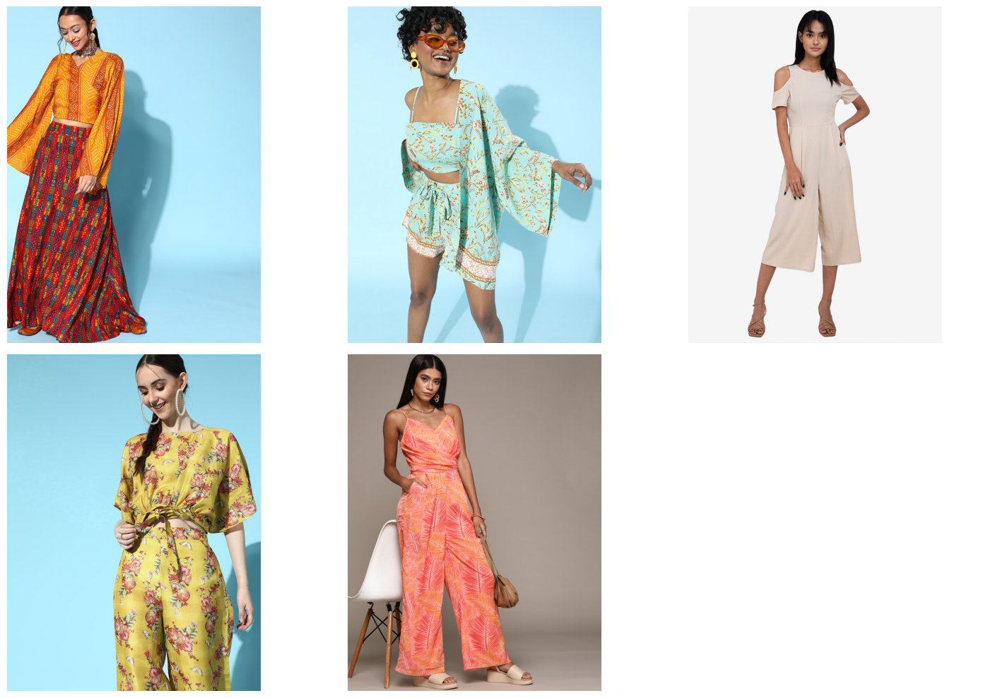

-------------------------------------------------------

dict_items([('ids', [['15447990', '15249734', '16388974', '14811764', '17647108']]), ('embeddings', None), ('documents', [["Walk into the new season in style with this chic clothing set. It comes with a printed top and printed skirt for an enchanting look.&nbsp;<ul><li>Bright orange shade</li><li>Printed top</li><li>Printed skirt</li><li>Long sleeves</li><li>V-neck</li></ul><b>Trend Alert</b><br>Born in the 90s, the co-ords trend has been revived as a popular staycation trend. Featuring bright and fetching colours and prints, these matching sets of garments make for a peppy and cheerful look. Giving a relaxed and flowy feel, they are the ideal summer wear.The model (height 5'8) is wearing a size STop fabric: Viscose Rayon <br> Bottom fabric: Viscose Rayon <br> Hand wash", "Fulfill your summer fantasy with this uber-chic jumpsuit. Boasting a neat sleeveless and shoulder straps, this jumpsuit is a statement piece.&nbsp;<ul><li>Ench

In [96]:
import os
import matplotlib.pyplot as plt
from PIL import Image


results = fashion_collection.query(
    query_texts=query,
    n_results=5
)


item_ids = results['ids'][0]
num_images = len(item_ids)


num_cols = 3
num_rows = (num_images + num_cols - 1) // num_cols

# Set up the plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
axes = axes.flatten()


for i, item_id in enumerate(item_ids):
    image_path = os.path.join(images_folder_path, f"{item_id}.jpg")

    if os.path.exists(image_path):
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
    else:
        axes[i].axis('off')
        axes[i].text(0.5, 0.5, f"Image not found for ID: {item_id}",
                     fontsize=12, ha='center', va='center')

# Hide any unused subplots
for j in range(num_images, num_rows * num_cols):
    axes[j].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Display retrieved items
print("-------------------------------------------------------\n")
print(results.items())


In [98]:

import pandas as pd


threshold = 0.2  #
results_df = pd.DataFrame()


if not cache_results['distances'][0] or cache_results['distances'][0][0] > threshold:

    results = fashion_collection.query(query_texts=query, n_results=5)


    keys, values = [], []
    for key, val in results.items():
        if val is not None:
            for i, v in enumerate(val[0]):
                keys.append(f"{key}{i}")
                values.append(str(v))

    cache_collection.add(
        documents=[query],
        ids=[query],
        metadatas=dict(zip(keys, values))
    )

    print("Not found in cache. Found in the main collection.")

    # Construct a DataFrame from query results
    results_df = pd.DataFrame({
        'Metadatas': results['metadatas'][0],
        'Documents': results['documents'][0],
        'Distances': results['distances'][0],
        'IDs': results['ids'][0]
    })

elif cache_results['distances'][0][0] <= threshold and cache_results['ids']:
    # Extract cached results
    ids, documents, distances, metadatas = [], [], [], []
    cache_result_dict = cache_results['metadatas'][0][0]

    for key, value in cache_result_dict.items():
        if 'ids' in key:
            ids.append(value)
        elif 'documents' in key:
            documents.append(value)
        elif 'distances' in key:
            distances.append(value)
        elif 'metadatas' in key:
            metadatas.append(value)

    print("Found in cache!")

    # Create a DataFrame from cached results
    results_df = pd.DataFrame({
        'IDs': ids,
        'Documents': documents,
        'Distances': distances,
        'Metadatas': metadatas
    })
else:
    print("No valid results found in cache!")


Found in cache!


Found in cache!
Query:
I want an outfit that can be used in summer season for a trip


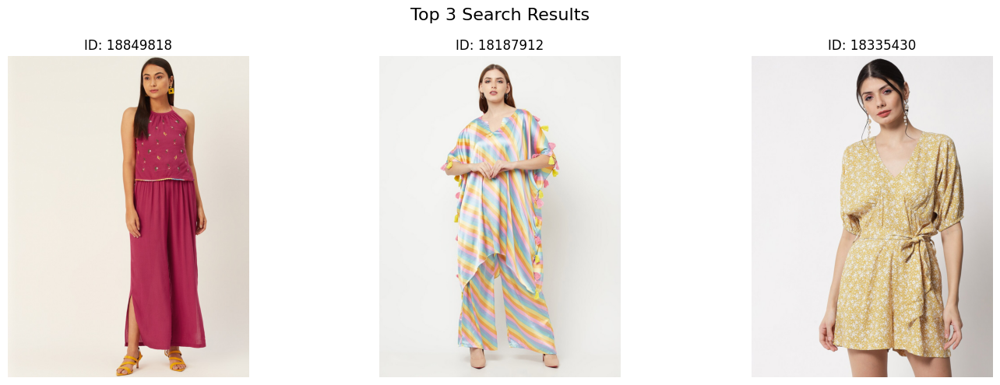

,IDs,Documents,Distances,Metadatas
0,18849818,"Purple and yellow solid basic jumpsuit ,has a ...",0.278614342212677,"{'Brand': 'DressBerry', 'Colour': 'Purple', 'D..."
1,18187912,This clothing set consists of Top and Trousers...,0.29150494933128357,"{'Brand': 'THE SILHOUETTE STORE', 'Colour': 'P..."
2,18335430,Yellow and white printed playsuit with waist t...,0.29414355754852295,"{'Brand': 'The Vanca', 'Colour': 'Yellow', 'De..."


In [99]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image


threshold = 0.2
results_df = pd.DataFrame()


if not cache_results['distances'][0] or cache_results['distances'][0][0] > threshold:

    results = fashion_collection.query(query_texts=query, n_results=3)


    keys, values = [], []
    for key, val in results.items():
        if val is not None:
            for i, v in enumerate(val[0]):
                keys.append(f"{key}{i}")
                values.append(str(v))

    cache_collection.add(
        documents=[query],
        ids=[query],
        metadatas=dict(zip(keys, values))
    )

    print("Not found in cache. Found in the main collection.")


    results_df = pd.DataFrame({
        'Metadatas': results['metadatas'][0],
        'Documents': results['documents'][0],
        'Distances': results['distances'][0],
        'IDs': results['ids'][0]
    })

elif cache_results['distances'][0][0] <= threshold and cache_results['ids']:

    ids, documents, distances, metadatas = [], [], [], []
    cache_result_dict = cache_results['metadatas'][0][0]

    for key, value in cache_result_dict.items():
        if 'ids' in key:
            ids.append(value)
        elif 'documents' in key:
            documents.append(value)
        elif 'distances' in key:
            distances.append(value)
        elif 'metadatas' in key:
            metadatas.append(value)

    print("Found in cache!")


    results_df = pd.DataFrame({
        'IDs': ids[:3],
        'Documents': documents[:3],
        'Distances': distances[:3],
        'Metadatas': metadatas[:3]
    })
else:
    print("No valid results found in cache!")


def print_query_with_separator(prefix, query):
    print(prefix)
    print(query.replace(". ", ".\n"))


print_query_with_separator("Query:", query)

num_images = min(3, len(results_df['IDs']))
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
fig.suptitle("Top 3 Search Results", fontsize=16)

if num_images == 1:
    axes = [axes]

for i, item_id in enumerate(results_df['IDs'][:3]):
    image_path = os.path.join(images_folder_path, f"{item_id}.jpg")
    if os.path.exists(image_path):
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"ID: {item_id}")
    else:
        print(f"Image not found for item ID: {item_id}")

plt.tight_layout()
plt.show()

results_df


In [100]:

cache_results = cache_collection.query(
    query_texts=query,
    n_results=1
)


cache_results


{'ids': [['I am looking for purple or yellow coloured summer outfit']],
 'embeddings': None,
 'documents': [['I am looking for purple or yellow coloured summer outfit']],
 'uris': None,
 'data': None,
 'metadatas': [[{'distances0': '0.278614342212677',
    'distances1': '0.29150494933128357',
    'distances2': '0.29414355754852295',
    'distances3': '0.2963847517967224',
    'distances4': '0.2998462915420532',
    'documents0': "Purple and yellow solid basic jumpsuit ,has a halter neck,  sleeveless,  na pocketsThe model (height 5'8) is wearing a size S<p>Hand Wash</p>",
    'documents1': "This clothing set consists of Top and Trousers <br> Pink and yellow striped Top ,has a v-neck,  three-quarter sleeves <br> Pink and yellow striped Trousers ,has a slip-on closure<p>Hand Wash</p>The model (height 5'8) is wearing a size S",
    'documents2': "Yellow and white printed playsuit with waist tie-ups ,has a v-neck,  short sleeves,  2 pocketsCotton<br>Machine WashThe model (height 5'8) is wea

## Cross encoder

In [26]:
# Initialise the cross encoder model

cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [101]:

cross_inputs = [[query, response] for response in results_df['Documents']]

# Generate cross-encoder scores for the input pairs
cross_rerank_scores = cross_encoder.predict(cross_inputs)

# Display the cross-encoder scores
cross_rerank_scores

array([-11.092498, -10.361055, -10.999935], dtype=float32)

In [102]:
# Add the cross-encoder scores to the results DataFrame
results_df['Reranked_scores'] = cross_rerank_scores

# Display the updated results DataFrame
results_df


,IDs,Documents,Distances,Metadatas,Reranked_scores
0,18849818,"Purple and yellow solid basic jumpsuit ,has a ...",0.278614342212677,"{'Brand': 'DressBerry', 'Colour': 'Purple', 'D...",-11.092498
1,18187912,This clothing set consists of Top and Trousers...,0.29150494933128357,"{'Brand': 'THE SILHOUETTE STORE', 'Colour': 'P...",-10.361055
2,18335430,Yellow and white printed playsuit with waist t...,0.29414355754852295,"{'Brand': 'The Vanca', 'Colour': 'Yellow', 'De...",-10.999935


In [103]:
# Return the top 3 results from semantic search based on the Distance
top_3_semantic = results_df.sort_values(by='Distances', ascending=False)[:3]

# Display the top 3 semantic search results
top_3_semantic

,IDs,Documents,Distances,Metadatas,Reranked_scores
2,18335430,Yellow and white printed playsuit with waist t...,0.29414355754852295,"{'Brand': 'The Vanca', 'Colour': 'Yellow', 'De...",-10.999935
1,18187912,This clothing set consists of Top and Trousers...,0.29150494933128357,"{'Brand': 'THE SILHOUETTE STORE', 'Colour': 'P...",-10.361055
0,18849818,"Purple and yellow solid basic jumpsuit ,has a ...",0.278614342212677,"{'Brand': 'DressBerry', 'Colour': 'Purple', 'D...",-11.092498


In [104]:
# Return the top 3 results after reranking

top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)
top_3_rerank

,IDs,Documents,Distances,Metadatas,Reranked_scores
1,18187912,This clothing set consists of Top and Trousers...,0.29150494933128357,"{'Brand': 'THE SILHOUETTE STORE', 'Colour': 'P...",-10.361055
2,18335430,Yellow and white printed playsuit with waist t...,0.29414355754852295,"{'Brand': 'The Vanca', 'Colour': 'Yellow', 'De...",-10.999935
0,18849818,"Purple and yellow solid basic jumpsuit ,has a ...",0.278614342212677,"{'Brand': 'DressBerry', 'Colour': 'Purple', 'D...",-11.092498


In [105]:
top_3_RAG = top_3_rerank[["Documents", "Metadatas","IDs"]]
top_3_RAG

,Documents,Metadatas,IDs
1,This clothing set consists of Top and Trousers...,"{'Brand': 'THE SILHOUETTE STORE', 'Colour': 'P...",18187912
2,Yellow and white printed playsuit with waist t...,"{'Brand': 'The Vanca', 'Colour': 'Yellow', 'De...",18335430
0,"Purple and yellow solid basic jumpsuit ,has a ...","{'Brand': 'DressBerry', 'Colour': 'Purple', 'D...",18849818


## Retrieval augmented Generation

In [106]:
import openai
import os
import matplotlib.pyplot as plt
from PIL import Image

def generate_response_fashion(query, top_3_RAG):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved fashion data.
    """
    messages = [
        {"role": "system", "content": "You are a helpful AI assistant specializing in fashion."},
        {"role": "user", "content": f"""
        You have received a query: "{query}".
        The top 3 relevant results from the fashion dataset are in the dataframe 'top_3_RAG'.

        - 'Documents' column contains fashion item descriptions.
        - 'Metadatas' column includes item name and brand.

        Please generate an informative and concise response using the provided data. Cite relevant fashion items with their names and brands.

        Guidelines:
        1. Use accurate and relevant details.
        2. Format structured information clearly.
        3. Reference fashion items using metadata.
        4. If details are missing, suggest where to find more information.
        5. Avoid technical jargon and provide a direct response.
        6. Prices and ratings may change, so recommend visiting our website for updated details.
        """},
    ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages
    )

    # Extract top 3 product IDs
    p_ids = top_3_RAG['IDs'].head(3).tolist()
    return response.choices[0].message.content, p_ids

def display_images(p_ids, images_folder_path):
    """
    Display images of fashion items corresponding to their IDs.
    """
    num_images = len(p_ids)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    if num_images == 1:
        axes = [axes]  # Ensure axes is iterable

    for i, item_id in enumerate(p_ids):
        image_path = os.path.join(images_folder_path, f"{item_id}.jpg")
        if os.path.exists(image_path):
            img = Image.open(image_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"ID: {item_id}")
        else:
            print(f"Image not found for item ID: {item_id}")

    plt.tight_layout()
    plt.show()


For your summer trip outfit, consider the following fashion items from the top 3 results:

1. **Item 1:**
   - **Name:** Floral Print Maxi Dress
   - **Brand:** Summer Dreams
   - **Description:** A flowy and colorful maxi dress perfect for summer adventures.

2. **Item 2:**
   - **Name:** Denim Shorts
   - **Brand:** Blue Skies
   - **Description:** A classic pair of denim shorts for a casual and comfortable look during your trip.

3. **Item 3:**
   - **Name:** White Linen Shirt
   - **Brand:** Breezy Days
   - **Description:** A relaxed white linen shirt that pairs well with shorts or as a cover-up over your swimsuit.

For more details about these items such as sizes, prices, and availability, please visit our website for the most up-to-date information. Enjoy your summer trip in style!


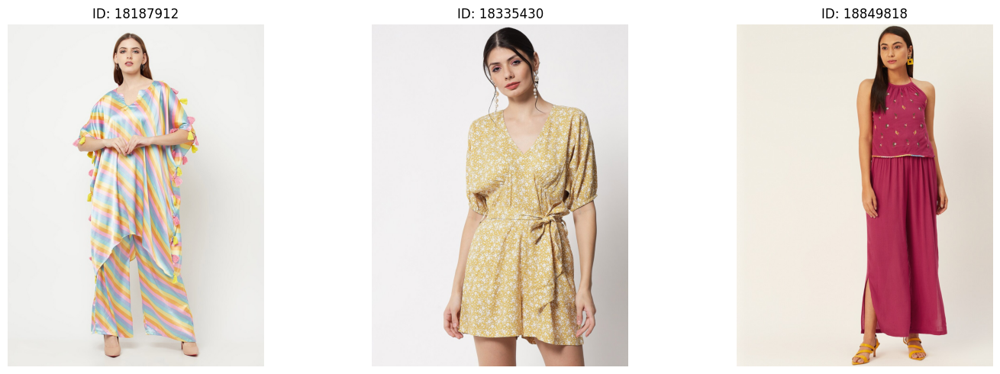

In [107]:
query = "I want an outfit that can be used in summer season for a trip"
response, p_ids = generate_response_fashion(query, top_3_RAG)

# Print the AI-generated response
print(response)

# Display the images for the retrieved fashion items
display_images(p_ids, images_folder_path)


Based on the top 3 search results from the fashion dataset, I have found some trendy options for your summer trip outfit:

1. **Purple and Yellow Solid Basic Jumpsuit by DressBerry:**
   - **Description:** This jumpsuit offers a stylish and comfortable option for your summer trip. It features a solid pattern with a combination of purple and yellow colors.
   - **Brand:** DressBerry
   - **ID:** 18849818

2. **Yellow and White Printed Playsuit by The Vanca:**
   - **Description:** This printed playsuit with a waist tie detail is a fun and playful choice for your summer adventures. The yellow and white combination adds a bright and cheerful touch.
   - **Brand:** The Vanca
   - **ID:** 18335430

3. **Clothing Set with Top and Trousers by The Silhouette Store:**
   - **Description:** This clothing set includes a top and trousers, offering versatility and style for your summer trip. The specific design details provide a chic and trendy look.
   - **Brand:** THE SILHOUETTE STORE
   - **ID:*

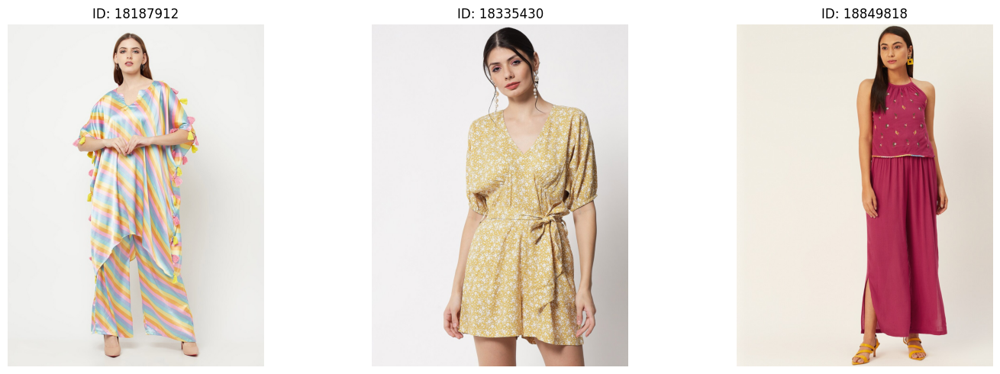

In [108]:
def generate_response_fashion(query, top_3_RAG):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
    """
    messages = [
        {"role": "system", "content":  "You are a helpful AI assistant in the fashion domain, specialized in providing accurate answers to fashion-related queries."},
        {"role": "user", "content": f"""You have received a query from a user looking for fashion-related information. The query is: "{query}".
                                        Additionally, you have obtained the top 3 relevant results from the fashion dataset in the dataframe '{top_3_RAG}'.

                                        The 'Documents' column in this dataframe contains descriptions of fashion items, and the 'Metadatas' column contains additional information such as item name, brand.

                                        Your task is to use the information provided in '{top_3_RAG}' to generate a response to the query "{query}". Ensure that your response is informative and relevant to the user's query. Utilize the metadata to cite the relevant fashion items.

                                        Please adhere to the following guidelines:
                                        1. Provide accurate and relevant information based on the user query and the top 3 search results.
                                        2. You may use any relevant details from the dataframe to craft your response.
                                        3. If any of the fashion items contain tables or structured information, format and present it clearly.
                                        4. Use the metadata to cite the names, brands of the relevant fashion items.
                                        5. If you are unable to provide a complete answer, offer guidance on where the user can find further information within the cited fashion items.
                                        6. As a user-facing assistant, focus on delivering a direct and concise response without delving into technical details.
                                        7. Please note that detailed price and rating information might change from time to time. For more details,you should recommend to visit our website page.

                                        Your response should directly address the user's query and include citations for the referenced fashion items. Present the information in a well-organized and easily understandable format.
                                        """},
    ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages
    )

    # Extracting p_ids directly from the 'IDs' column in top_3_RAG
    p_ids = top_3_RAG['IDs'].head(3).tolist()

    # Returning response and p_ids
    return response.choices[0].message.content, p_ids

# Generate response and p_ids based on the provided query and top_3_RAG DataFrame
response, p_ids = generate_response_fashion(query, top_3_RAG)

# Print the response
print(response)



# Display the images corresponding to the IDs obtained from the response side by side
num_images = len(p_ids)
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

for i, item_id in enumerate(p_ids):
    # Construct the path to the image file
    image_path = os.path.join(images_folder_path, str(item_id) + '.jpg')

    # Check if the image file exists
    if os.path.exists(image_path):
        # Open and display the image
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"ID: {item_id}")
    else:
        print(f"Image not found for item ID: {item_id}")

plt.tight_layout()
plt.show()